# This is the code for the thesis titled "Linear vs. Non-Linear Return Forecasting: A Dual Evaluation of Predictive Accuracy and Economic Value"

This code includes:
* Data handling and pre-processing.
* Linear and non-linear model approaches.
* Portfolio creation.
* Figures.

# Preliminary steps

Import relevant libraries

In [1]:
!pip install ipca

  Preparing metadata (setup.py) ... done
  Created wheel for progressbar: filename=progressbar-2.5-py3-none-any.whl size=12065 sha256=de1ec4dbec9a23ddad945617c8312e3451db65b4689084ff49afa1d9ffbd1328
  Stored in directory: /root/.cache/pip/wheels/a5/4d/c7/f3cf0f75c746c219090060131fe00f1523cc2c5484991f4030
Successfully built progressbar


In [2]:
!pip install lightgbm --upgrade

In [3]:
import pandas as pd
import numpy as np
import math
from pathlib import Path
import itertools
from sklearn.decomposition import PCA
from ipca import InstrumentedPCA
from sklearn.cross_decomposition import PLSRegression
import lightgbm as lgb
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from pandas.tseries.offsets import YearEnd, YearBegin, MonthBegin, DateOffset
import statsmodels.api as sm
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
from matplotlib.patches import Rectangle
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


Shared functions

In [4]:
# ==============================================================================
# OPTIMIZING DATAFRAME MEMORY SPACE
# ==============================================================================
# Optimizing memory usage
def optimize_df(df, cat_threshold=0.5, verbose=True):
    """
    Optimises a pandas DataFrame to reduce RAM usage:
    - Downcasts numerical columns.
    - Converts repeated object columns to categoricals.
    - Stores boolean columns efficiently.
    """
    df = df.copy()

    start_mem = df.memory_usage(deep=True).sum() / 1024**2

    for col in df.columns:
        col_dtype = df[col].dtype

        # Downcast floats
        if pd.api.types.is_float_dtype(col_dtype):
            df[col] = pd.to_numeric(df[col], downcast="float")

        # Downcast floats
        elif pd.api.types.is_integer_dtype(col_dtype):
            df[col] = pd.to_numeric(df[col], downcast="integer")

        # Convert object columns
        elif pd.api.types.is_object_dtype(col_dtype):
            num_unique = df[col].nunique()
            num_total = len(df[col])

            if num_total > 0 and num_unique / num_total < cat_threshold:
                df[col] = df[col].astype("category")

        # Handle boolean types
        elif pd.api.types.is_bool_dtype(col_dtype):
            df[col] = df[col].astype(bool)

    end_mem = df.memory_usage(deep=True).sum() / 1024**2

    if verbose:
        reduction = 100 * (start_mem - end_mem) / start_mem if start_mem > 0 else 0
        print(
            f"Memory usage reduced from {start_mem:.2f} MB to {end_mem:.2f} MB "
            f"({reduction:.1f}% reduction).")

    return df

# ==============================================================================
# FUNCTIONS FOR MODELS
# ==============================================================================
# ------------------------------------------------------------------------------
# Global
# ------------------------------------------------------------------------------
# Base directory
BASE_DIR = Path("/content/drive/My Drive/Master thesis")

# Output directory
MODEL_OUTPUT_DIR = "Model output"

# Loading files
def load_excel(filename, **kwargs):
    return pd.read_excel(BASE_DIR / filename, **kwargs)

def load_csv(filename, **kwargs):
    return pd.read_csv(BASE_DIR / filename, **kwargs)

def load_parquet(filename, **kwargs):
    return pd.read_parquet(BASE_DIR / filename, **kwargs)

# Saving files
def save_excel(df, filename, **kwargs):
    return df.to_excel(BASE_DIR / filename, **kwargs)

def save_csv(df, filename, **kwargs):
    return df.to_csv(BASE_DIR / filename, **kwargs)

def save_parquet(df, filename, **kwargs):
    return df.to_parquet(BASE_DIR / filename, **kwargs)

# Full characteristics list
char_cols = [
    "prc", "market_equity", "div12m_me", "chcsho_12m", "eqnpo_12m", "ret_1_0",
    "ret_3_1", "ret_6_1", "ret_9_1", "ret_12_1", "ret_12_7", "ret_60_12",
    "seas_1_1an", "seas_1_1na", "seas_2_5an", "seas_2_5na", "seas_6_10an",
    "seas_6_10na", "seas_11_15an", "seas_11_15na", "seas_16_20an",
    "seas_16_20na", "at_gr1", "sale_gr1", "capx_gr1", "inv_gr1", "debt_gr3",
    "sale_gr3", "capx_gr3", "inv_gr1a", "lti_gr1a", "sti_gr1a", "coa_gr1a",
    "col_gr1a", "cowc_gr1a", "ncoa_gr1a", "ncol_gr1a", "nncoa_gr1a", "fnl_gr1a",
    "nfna_gr1a", "tax_gr1a", "be_gr1a", "ebit_sale", "gp_at", "cop_at",
    "ope_be", "ni_be", "ebit_bev", "netis_at", "eqnetis_at", "dbnetis_at",
    "oaccruals_at", "oaccruals_ni", "taccruals_at", "taccruals_ni", "noa_at",
    "opex_at", "at_turnover", "sale_bev", "rd_sale", "cash_at", "sale_emp_gr1",
    "emp_gr1", "ni_inc8q", "noa_gr1a", "ppeinv_gr1a", "lnoa_gr1a", "capx_gr2",
    "saleq_gr1", "niq_be", "niq_at", "niq_be_chg1", "niq_at_chg1", "rd5_at",
    "dsale_dinv", "dsale_drec", "dgp_dsale", "dsale_dsga", "saleq_su", "niq_su",
    "capex_abn", "op_atl1", "gp_atl1", "ope_bel1", "cop_atl1", "pi_nix",
    "ocf_at", "op_at", "ocf_at_chg1", "at_be", "ocfq_saleq_std", "tangibility",
    "earnings_variability", "aliq_at", "f_score", "o_score", "z_score",
    "kz_index", "ni_ar1", "ni_ivol", "at_me", "be_me", "debt_me", "netdebt_me",
    "sale_me", "ni_me", "ocf_me", "fcf_me", "eqpo_me", "eqnpo_me", "rd_me",
    "ival_me", "bev_mev", "ebitda_mev", "aliq_mat", "eq_dur", "beta_60m",
    "resff3_12_1", "resff3_6_1", "mispricing_mgmt", "mispricing_perf",
    "ivol_capm_21d", "iskew_capm_21d", "coskew_21d", "beta_dimson_21d",
    "ivol_ff3_21d", "iskew_ff3_21d", "ivol_hxz4_21d", "iskew_hxz4_21d",
    "rmax5_21d", "rmax1_21d", "rvol_21d", "rskew_21d", "zero_trades_21d",
    "dolvol_126d", "dolvol_var_126d", "turnover_126d", "turnover_var_126d",
    "zero_trades_126d", "zero_trades_252d", "ami_126d", "ivol_capm_252d",
    "prc_highprc_252d", "betadown_252d", "bidaskhl_21d", "corr_1260d",
    "betabab_1260d", "rmax5_rvol_21d", "age", "qmj", "qmj_prof", "qmj_growth",
    "qmj_safety"]

# Full FF3-Factor list
ff3_cols = [
    "mktrf",
    "smb",
    "hml"]

# Dataframe metrics
def print_dataframe_summary(df):
    total_rows = df.shape[0]
    total_observations = df.size
    total_na = df.isna().sum().sum()
    valid_observations = total_observations - total_na

    print(f"Total rows: {total_rows}")
    print(f"Total observations: {total_observations}")
    print(f"Total missing (NaN) values: {total_na}")
    print(f"Total valid (non-NaN) values: {valid_observations}")

# Creating SIC industry dummies
def add_sic_dummies(df, sic_col="sic", prefix="sic"):
    if sic_col not in df.columns:
        raise ValueError(f"Column \"{sic_col}\" not found in dataframe.")

    df = df.copy()

    df["sic_first_two"] = df[sic_col].astype(str).str[:2]
    df.loc[df[sic_col].astype(str).str.lower().isin(["sic_na", "nan", "none"]), "sic_first_two"] = pd.NA

    initial_rows = len(df)
    df = df[df["sic_first_two"].notna()].copy()
    rows_dropped = initial_rows - len(df)

    sic_dummies = pd.get_dummies(df["sic_first_two"], prefix=prefix, drop_first=False)
    df = pd.concat([df, sic_dummies], axis=1)

    df = df.drop(columns=["sic_first_two"])

    print(f"SIC dummy variables created: {sic_dummies.shape[1]}")
    print(f"Rows dropped due to missing or invalid SIC codes: {rows_dropped}")
    print(f"Final dataframe shape: {df.shape}")

    return df

# Creating FF49 industry dummies
def add_ff49_dummies(df, ff49_col="ff49", prefix="ff49"):
    if ff49_col not in df.columns:
        raise ValueError(f"Column \"{ff49_col}\" not found in dataframe.")

    df = df.copy()

    df["ff49_industry"] = pd.to_numeric(
        df[ff49_col],
        errors="coerce")

    initial_rows = len(df)
    df = df[df["ff49_industry"].notna()].copy()
    rows_dropped = initial_rows - len(df)

    df["ff49_industry"] = (
        df["ff49_industry"].astype("Int64").astype(str))

    ff49_dummies = pd.get_dummies(
        df["ff49_industry"],
        prefix=prefix,
        drop_first=False)

    df = pd.concat([
        df,
        ff49_dummies],axis=1)

    df = df.drop(columns=["ff49_industry"])

    print(f"FF49 dummy variables created: {ff49_dummies.shape[1]}")
    print(f"Rows dropped due to missing or invalid FF49 codes: {rows_dropped}")
    print(f"Final dataframe shape: {df.shape}")

    return df

# Dropping missing rows
def drop_missing_rows(df, column_to_check):
    """
    Drops rows where `column_to_check` is missing.
    """
    df = df.copy()

    if column_to_check not in df.columns:
        print(f"Warning: Column \"{column_to_check}\" not found. No rows dropped.")
        return df

    initial_rows = len(df)

    df_cleaned = df.dropna(subset=[column_to_check])

    final_rows = len(df_cleaned)
    rows_dropped = initial_rows - final_rows
    percentage_dropped = (rows_dropped / initial_rows) * 100 if initial_rows > 0 else 0

    print(f"Initial number of rows: {initial_rows}")
    print(f"Rows dropped where \"{column_to_check}\" was missing: {rows_dropped}")
    print(f"Percentage of rows dropped: {percentage_dropped:.2f}%")
    print(f"Final number of rows: {final_rows}")

    return df_cleaned

# Imputing missing values
def impute_monthly_median(df, characteristic_cols, date_col="date", fill_remaining=0, group_by_month=True):
    """
    Imputes missing characteristic values using the cross-sectional median
    within each month/date. Any remaining missing values are filled with 0.
    """
    df = df.copy()

    if date_col not in df.columns:
        raise ValueError(f"Column \"{date_col}\" not found in dataframe.")

    df[date_col] = pd.to_datetime(df[date_col])

    valid_characteristic_cols = [
        col for col in characteristic_cols
        if col in df.columns]

    missing_cols = [
        col for col in characteristic_cols
        if col not in df.columns]

    if missing_cols:
        print(f"{len(missing_cols)} characteristic columns not found in dataframe and skipped.")

    if not valid_characteristic_cols:
        raise ValueError("No valid characteristic columns found for imputation.")

    group_col = "_month" if group_by_month else date_col

    if group_by_month:
        df[group_col] = df[date_col].dt.to_period("M")

    monthly_medians = (
        df.groupby(group_col)[valid_characteristic_cols]
          .transform("median"))

    df[valid_characteristic_cols] = (
        df[valid_characteristic_cols]
        .fillna(monthly_medians)
        .fillna(fill_remaining))

    if group_by_month:
        df = df.drop(columns=group_col)

    print("Monthly median imputation complete.")
    print(f"Imputed characteristic columns: {len(valid_characteristic_cols)}")
    print(f"Remaining NaNs in characteristic columns: {df[valid_characteristic_cols].isna().sum().sum()}")

    return df

# Rank normalization [-1,1]
def rank_normalize_characteristics(df, characteristic_cols, date_col="date", method="average"):
    """
    Rank-normalizes firm characteristics cross-sectionally by date.
    Each characteristic is ranked within each date and transformed to [-1, 1]:
        2 * rank(C_{s,it-1}) / (N_t + 1) - 1
    where N_t is the number of non-missing observations for that characteristic
    in that period.
    """
    df = df.copy()

    if date_col not in df.columns:
        raise ValueError(f"Column \"{date_col}\" not found in dataframe.")

    df[date_col] = pd.to_datetime(df[date_col])

    valid_characteristic_cols = [
        col for col in characteristic_cols
        if col in df.columns and pd.api.types.is_numeric_dtype(df[col])]

    missing_cols = [
        col for col in characteristic_cols
        if col not in df.columns]

    if missing_cols:
        print(f"{len(missing_cols)} characteristic columns not found and skipped.")

    if not valid_characteristic_cols:
        raise ValueError("No valid numeric characteristic columns found for rank normalization.")

    print(f"Rank-normalizing {len(valid_characteristic_cols)} characteristic columns by {date_col}.")

    for col in valid_characteristic_cols:
        df[col] = df.groupby(date_col)[col].transform(
            lambda x: 2 * x.rank(method=method, na_option="keep") / (x.notna().sum() + 1) - 1)

    print("Rank normalization complete.")
    print(f"Remaining NaNs in transformed columns: {df[valid_characteristic_cols].isna().sum().sum()}")

    return df

# Expanding sample split scheme
def rolling_train_val_test_yearly(df, date_col="date", start_train="1970-01-01", end_train="1986-12-31", val_years=12):
    """
    Creates yearly rolling train-validation-test splits, where:
    - The training window starts fixed and expands by one year each iteration.
    - The validation window has a fixed length and rolls forward each iteration.
    - The test window is fixed at one calendar year.
    """
    df = df.copy()

    if date_col not in df.columns:
        raise ValueError(f"Column \"{date_col}\" not found in dataframe.")

    df[date_col] = pd.to_datetime(df[date_col])
    last_date = df[date_col].max()

    train_start_date = pd.to_datetime(start_train)
    train_end_date = pd.to_datetime(end_train)

    while True:
        val_start_date = train_end_date + YearBegin(1)
        val_end_date = val_start_date + DateOffset(years=val_years) - pd.Timedelta(days=1)

        test_start_date = val_end_date + MonthBegin(1)
        test_end_date = test_start_date + YearEnd(1)

        if test_end_date > last_date:
            break

        yield (
            train_start_date,
            train_end_date,
            val_start_date,
            val_end_date,
            test_start_date,
            test_end_date)

        train_end_date += YearEnd(1)

# Newey-West standard errors
def newey_west_se(x, lags=4):
    """
    Computes the Newey-West standard error of the sample mean.
    """
    x = pd.Series(x).dropna().astype(float)
    T = len(x)

    if T == 0:
        return np.nan

    lags = max(0, min(lags, T - 1))

    x_demeaned = x - x.mean()

    gamma_0 = np.sum(x_demeaned.values * x_demeaned.values) / T
    long_run_var = gamma_0

    for lag in range(1, lags + 1):
        weight = 1 - lag / (lags + 1)
        gamma_lag = np.sum(
            x_demeaned.iloc[lag:].values * x_demeaned.iloc[:-lag].values) / T
        long_run_var += 2 * weight * gamma_lag

    return np.sqrt(long_run_var / T)

# Industry demeaning: SIC
def sic_industry_code_for_demeaning(df, target_index, permno_col="permno", date_col="date", sic_prefix="sic", firm_index_name="firm", month_index_name="year_month"):
    """
    Creates SIC industry codes aligned to target model. It assumes
    the processed dataframe already contains SIC dummy columns named with the
    pattern `sic_*`.
    """
    df = df.copy()

    required_cols = [
        permno_col,
        date_col]

    missing_cols = [
        col for col in required_cols
        if col not in df.columns]

    if missing_cols:
        raise ValueError(f"Required columns not found: {missing_cols}")

    df[date_col] = pd.to_datetime(df[date_col])

    sic_cols = [
        col for col in df.columns
        if col.startswith(f"{sic_prefix}_")]

    if not sic_cols:
        raise ValueError("No SIC dummy columns found in the processed dataframe.")

    sic_frame = (df[[
        permno_col,
        date_col] + sic_cols].assign(**{
            firm_index_name: df[permno_col].astype(np.int64),
            month_index_name: df[date_col].dt.to_period("M")}).set_index([
                firm_index_name,
                month_index_name]).sort_index().reindex(target_index))

    for col in sic_cols:
        if sic_frame[col].dtype == bool:
            sic_frame[col] = sic_frame[col].astype(float)
        else:
            sic_frame[col] = (
                pd.to_numeric(
                    sic_frame[col],
                    errors="coerce").clip(lower=0, upper=1))

    industry_code = sic_frame[sic_cols].idxmax(axis=1)

    no_active_industry = (
        sic_frame[sic_cols]
        .sum(axis=1)
        == 0)

    industry_code = industry_code.mask(no_active_industry, pd.NA)

    industry_code = (
        industry_code
        .astype("string")
        .str.split("_", n=1)
        .str[1]
        .astype("Int64"))

    industry_code.name = "industry_code"

    return industry_code

# Industry demeaning FF49 industries
def ff49_industry_code_for_demeaning(df, target_index, permno_col="permno", date_col="date", ff49_prefix="ff49", sic_prefix=None, firm_index_name="firm", month_index_name="year_month"):
    """
    Creates FF49 industry codes aligned to a target model index. It assumes
    the processed dataframe already contains FF49 dummy columns named with the
    pattern `ff49_*`.
    """
    df = df.copy()

    required_cols = [
        permno_col,
        date_col]

    missing_cols = [
        col for col in required_cols
        if col not in df.columns]

    if missing_cols:
        raise ValueError(f"Required columns not found: {missing_cols}")

    df[date_col] = pd.to_datetime(df[date_col])

    ff49_cols = [
        col for col in df.columns
        if col.startswith(f"{ff49_prefix}_")]

    if not ff49_cols:
        raise ValueError("No FF49 dummy columns found in the processed dataframe.")

    ff49_frame = (
        df[[
            permno_col,
            date_col] + ff49_cols].assign(**{
                firm_index_name: df[permno_col].astype(np.int64),
                month_index_name: df[date_col].dt.to_period("M")}).set_index([
                    firm_index_name,
                    month_index_name]).sort_index().reindex(target_index))

    for col in ff49_cols:
        if ff49_frame[col].dtype == bool:
            ff49_frame[col] = ff49_frame[col].astype(float)
        else:
            ff49_frame[col] = (
                pd.to_numeric(
                    ff49_frame[col],
                    errors="coerce").clip(lower=0, upper=1))

    industry_code = ff49_frame[ff49_cols].idxmax(axis=1)

    no_active_industry = (
        ff49_frame[ff49_cols]
        .sum(axis=1)
        == 0)

    industry_code = industry_code.mask(no_active_industry, pd.NA)

    industry_code = (
        industry_code
        .astype("string")
        .str.split("_", n=1)
        .str[1]
        .astype("Int64"))

    industry_code.name = "industry_code"

    return industry_code

# ------------------------------------------------------------------------------
# Performance evaluation metrics
# ------------------------------------------------------------------------------
# Out-of-sample R^2
def r2_oos(y_true, y_pred, benchmark_pred=None, lags=4):
    """
    Computes the out-of-sample R^2 following Gu et al., (2020).
    If no benchmark prediction is supplied, the benchmark is the zero forecast.
    """
    y_true = pd.Series(y_true).astype(float).reset_index(drop=True)
    y_pred = pd.Series(y_pred).astype(float).reset_index(drop=True)

    if benchmark_pred is None:
        benchmark_pred = pd.Series(np.zeros(len(y_true))).astype(float)
    else:
        benchmark_pred = pd.Series(benchmark_pred).astype(float).reset_index(drop=True)

    data = pd.DataFrame({
        "y_true": y_true,
        "y_pred": y_pred,
        "benchmark_pred": benchmark_pred}).dropna()

    y_true = data["y_true"]
    y_pred = data["y_pred"]
    benchmark_pred = data["benchmark_pred"]

    model_error = y_true - y_pred
    benchmark_error = y_true - benchmark_pred

    model_squared_error = model_error ** 2
    benchmark_squared_error = benchmark_error ** 2

    denominator = np.sum(benchmark_squared_error)

    if denominator == 0:
        r2_oos_value = np.nan
    else:
        r2_oos_value = 1.0 - np.sum(model_squared_error) / denominator

    loss_diff = benchmark_squared_error - model_squared_error

    mean_loss_diff = loss_diff.mean()
    nw_se = newey_west_se(loss_diff, lags=lags)
    t_stat = mean_loss_diff / nw_se if np.isfinite(nw_se) and nw_se > 0 else np.nan

    return {
        "test_type": "r2_oos",
        "r2_oos": r2_oos_value,
        "mean_loss_diff": mean_loss_diff,
        "nw_se": nw_se,
        "t_stat": t_stat,
        "n_obs": len(data),
        "n_periods": np.nan,
        "lags": lags}

# Adjusted Diebold-Mariano statistic
def dm_test(
    df=None,
    y_true="y_true",
    y_pred=None,
    date_col="date",
    lags=4,
    pairs=None,
    include_zero_benchmark=False,
    benchmark_name="zero",
    model_prediction_files=None,
    permno_col="permno",
    year_month_col="year_month",
    print_results=True):
    """
    Computes the adjusted pairwise Diebold-Mariano statistic following
    Gu et al., (2020).
    """

    # --------------------------------------------------------------------------
    # Create wide dataframe from model prediction files
    # --------------------------------------------------------------------------
    if model_prediction_files is not None:
        if isinstance(model_prediction_files, dict):
            model_files = model_prediction_files
        else:
            model_files = {
                f"model_{i + 1}": filename
                for i, filename in enumerate(model_prediction_files)}

        if not model_files:
            raise ValueError("No model prediction files supplied.")

        merged_predictions = None
        y_pred = {}

        merge_cols = [
            permno_col,
            date_col,
            year_month_col]

        for model_name, filename in model_files.items():
            model_predictions = load_parquet(filename)

            required_cols = [
                permno_col,
                date_col,
                y_true,
                "y_pred"]

            missing_cols = [
                col for col in required_cols
                if col not in model_predictions.columns]

            if missing_cols:
                raise ValueError(
                    f"Required columns not found in {filename}: {missing_cols}")

            model_predictions = model_predictions.copy()
            model_predictions[date_col] = pd.to_datetime(model_predictions[date_col])

            if year_month_col not in model_predictions.columns:
                model_predictions[year_month_col] = (
                    model_predictions[date_col].dt.to_period("M").astype(str))

            model_predictions[y_true] = pd.to_numeric(
                model_predictions[y_true],
                errors="coerce")

            model_predictions["y_pred"] = pd.to_numeric(
                model_predictions["y_pred"],
                errors="coerce")

            model_predictions = model_predictions.dropna(
                subset=merge_cols + [
                    y_true,
                    "y_pred"]).copy()

            model_predictions = model_predictions.drop_duplicates(
                subset=merge_cols)

            model_pred_col = f"{model_name}_pred"

            model_predictions = model_predictions.rename(
                columns={
                    "y_pred": model_pred_col})

            y_pred[model_name] = model_pred_col

            if merged_predictions is None:
                merged_predictions = model_predictions[
                    merge_cols
                    + [
                        y_true,
                        model_pred_col]].copy()

            else:
                model_predictions = model_predictions[
                    merge_cols
                    + [
                        model_pred_col]].copy()

                merged_predictions = merged_predictions.merge(
                    model_predictions,
                    on=merge_cols,
                    how="inner")

        if merged_predictions is None or len(merged_predictions) == 0:
            raise ValueError("No overlapping observations found across model files.")

        df = merged_predictions

    # --------------------------------------------------------------------------
    # DM test
    # --------------------------------------------------------------------------
    df = df.copy()

    if y_true not in df.columns:
        raise ValueError(f"Column \"{y_true}\" not found in dataframe.")

    if date_col not in df.columns:
        raise ValueError(f"Column \"{date_col}\" not found in dataframe.")

    y_pred = y_pred.copy()

    if include_zero_benchmark:
        benchmark_pred_col = f"{benchmark_name}_pred"

        if benchmark_name in y_pred:
            raise ValueError(f"Benchmark name \"{benchmark_name}\" already exists in y_pred.")

        df[benchmark_pred_col] = 0.0
        y_pred[benchmark_name] = benchmark_pred_col

    missing_y_pred = [
        y_pred_col for y_pred_col in y_pred.values()
        if y_pred_col not in df.columns]

    if missing_y_pred:
        raise ValueError(f"Prediction columns not found: {missing_y_pred}")

    df[date_col] = pd.to_datetime(df[date_col].astype(str)).dt.to_period("M")

    model_names = list(y_pred.keys())

    if pairs is None:
        pairs = list(itertools.combinations(model_names, 2))

    squared_errors = {}

    for model_name, y_pred_col in y_pred.items():
        model_error = df[y_true] - df[y_pred_col]
        squared_errors[model_name] = model_error ** 2

    monthly_loss_diffs = {}

    for model_a, model_b in pairs:
        loss_diff_col = f"loss_diff_{model_a}_minus_{model_b}"

        loss_diff = squared_errors[model_a] - squared_errors[model_b]

        monthly_loss_diffs[loss_diff_col] = (
            loss_diff
            .groupby(df[date_col])
            .mean())

    dm_monthly = pd.DataFrame(monthly_loss_diffs).sort_index()
    dm_monthly.index.name = date_col

    dm_results = []

    for model_a, model_b in pairs:
        loss_diff_col = f"loss_diff_{model_a}_minus_{model_b}"
        loss_diff = dm_monthly[loss_diff_col].dropna()

        mean_loss_diff = loss_diff.mean()
        nw_se = newey_west_se(loss_diff, lags=lags)
        t_stat = mean_loss_diff / nw_se if np.isfinite(nw_se) and nw_se > 0 else np.nan

        n_obs = (
            df[[y_true, y_pred[model_a], y_pred[model_b]]].dropna().shape[0])

        dm_results.append({
            "model_a": model_a,
            "model_b": model_b,
            "pair": f"{model_a} vs {model_b}",
            "DM_stat": t_stat})

    dm_stats = pd.DataFrame(dm_results)

    dm_stats = dm_stats[
        [
            "pair",
            "model_a",
            "model_b",
            "DM_stat"]]

    if print_results:
        print("\n" + "=" * 100)
        print("ADJUSTED DIEBOLD-MARIANO TEST RESULTS")
        print("=" * 100)

        with pd.option_context(
            "display.max_rows",
            None,
            "display.max_columns",
            None,
            "display.width",
            160,
            "display.float_format",
            "{:,.6f}".format):
            print(dm_stats.to_string(index=False))

        print("=" * 100 + "\n")

    return dm_stats

# Variable importance
def compute_variable_importance(model, X_test, y_true, r2_func=r2_oos, zero_value=0.0):
    """
    Computes variable importance as the drop in out-of-sample R^2 when each
    characteristic is set to zero.
    """
    if len(X_test) == 0:
        return pd.Series(dtype=float)

    X_test = X_test.copy()
    y_true = np.asarray(y_true, dtype=float)

    def _predict(model, X):
        try:
            y_pred = model.predict(X, mean_factor=True)
        except TypeError:
            y_pred = model.predict(X)

        return y_pred

    def _extract_r2(result):
        if isinstance(result, dict):
            return result["r2_oos"]

        return result

    y_pred = _predict(model, X_test)
    base_r2 = _extract_r2(r2_func(y_true, y_pred))

    variable_importance = pd.Series(index=X_test.columns, dtype=float)

    for col in X_test.columns:
        X_zero = X_test.copy()
        X_zero[col] = zero_value

        y_pred_zero = _predict(model, X_zero)
        zero_r2 = _extract_r2(r2_func(y_true, y_pred_zero))

        variable_importance[col] = base_r2 - zero_r2

    return variable_importance

# Sharpe ratio
def calculate_sharpe_ratio(returns):
    returns = pd.Series(returns).dropna().astype(float)

    if len(returns) < 2:
        return np.nan

    return_std = returns.std(ddof=1)

    if return_std == 0 or not np.isfinite(return_std):
        return np.nan

    return returns.mean() / return_std

# Probabilistic Sharpe Ratio
def calculate_probabilistic_sharpe_ratio(returns, PSR_benchmark=0.0):
    returns = pd.Series(returns).dropna().astype(float)

    if len(returns) < 3:
        return np.nan

    sharpe_ratio = calculate_sharpe_ratio(returns)

    if not np.isfinite(sharpe_ratio):
        return np.nan

    n_obs = len(returns)
    skewness = returns.skew()
    kurtosis = returns.kurtosis() + 3.0

    denominator = (
        1.0
        + 0.5 * sharpe_ratio ** 2
        - skewness * sharpe_ratio
        + ((kurtosis - 3.0) / 4.0) * sharpe_ratio ** 2)

    if denominator <= 0 or not np.isfinite(denominator):
        return np.nan

    psr_stat = (
        (sharpe_ratio - PSR_benchmark)
        * np.sqrt(n_obs - 1.0)
        / np.sqrt(denominator))

    return 0.5 * (
        1.0
        + math.erf(psr_stat / np.sqrt(2.0)))

# Clarke-West statistic, model level
def model_level_clarke_west_statistics(
    model_prediction_files,
    y_true_col="y_true",
    y_pred_col="y_pred",
    lags=4,
    print_results=True,
    date_col="date"):
    if isinstance(model_prediction_files, dict):
        file_items = list(model_prediction_files.items())
    else:
        file_items = list(model_prediction_files)

    for item in file_items:
        if not isinstance(item, (list, tuple)) or len(item) != 2:
            raise ValueError(
                "model_prediction_files must be a dict or a sequence of "
                "(model_name, filename) pairs.")

    if not file_items:
        raise ValueError("At least one model prediction file must be provided.")

    cw_records = []

    for model_name, filename in file_items:
        predictions = load_parquet(filename).copy()

        required_cols = [date_col, y_true_col, y_pred_col]
        missing_cols = [
            col for col in required_cols
            if col not in predictions.columns]

        if missing_cols:
            raise ValueError(
                f"Prediction file for {model_name} is missing columns: "
                f"{missing_cols}")

        aligned_predictions = pd.DataFrame({
            "date": pd.to_datetime(predictions[date_col]),
            "y_true": pd.to_numeric(
                predictions[y_true_col],
                errors="coerce"),
            "y_pred": pd.to_numeric(
                predictions[y_pred_col],
                errors="coerce")}).dropna()

        if len(aligned_predictions) < 2:
            cw_records.append({
                "model": model_name,
                "r2_oos": np.nan,
                "cw_t_stat": np.nan,
                "cw_p_value": np.nan,
                "cw_mean_f": np.nan,
                "cw_nw_se": np.nan,
                "cw_n_periods": aligned_predictions["date"].nunique(),
                "n_obs": len(aligned_predictions),
                "cw_benchmark": 0.0,
                "lags": lags})
            continue

        benchmark_error = aligned_predictions["y_true"]
        model_error = aligned_predictions["y_true"] - aligned_predictions["y_pred"]
        adjustment = aligned_predictions["y_pred"] ** 2

        aligned_predictions["cw_adjusted_loss_diff"] = (
            benchmark_error ** 2 - (
                model_error ** 2
                - adjustment))

        monthly_cw_series = (
            aligned_predictions.groupby("date")["cw_adjusted_loss_diff"].mean().sort_index())

        monthly_cw_series = monthly_cw_series[
            monthly_cw_series.notna()
            & np.isfinite(monthly_cw_series)]

        cw_mean_f = monthly_cw_series.mean()
        cw_nw_se = newey_west_se(
            monthly_cw_series,
            lags=lags)
        cw_t_stat = (
            cw_mean_f / cw_nw_se
            if np.isfinite(cw_nw_se) and cw_nw_se > 0
            else np.nan)
        cw_p_value = (
            1.0
            - 0.5 * (
                1.0
                + math.erf(cw_t_stat / np.sqrt(2.0)))
            if np.isfinite(cw_t_stat)
            else np.nan)

        r2_result = r2_oos(
            y_true=aligned_predictions["y_true"],
            y_pred=aligned_predictions["y_pred"],
            benchmark_pred=None,
            lags=lags)

        cw_records.append({
            "model": model_name,
            "r2_oos": r2_result["r2_oos"],
            "cw_t_stat": cw_t_stat,
            "cw_p_value": cw_p_value})

    cw_results = pd.DataFrame(cw_records)

    if print_results:
        print("\n" + "=" * 120)
        print("MODEL-LEVEL CLARK-WEST TEST AGAINST ZERO BENCHMARK")
        print("=" * 120)
        with pd.option_context(
            "display.max_rows", None,
            "display.max_columns", None,
            "display.width", 180,
            "display.float_format", "{:,.6f}".format):
            print(cw_results.to_string(index=False))
        print("=" * 120 + "\n")

    return cw_results

# Clarke-West statistic, portfolio level
def calculate_clarke_west_statistic(realized_returns, predicted_returns, CW_benchmark=0.0, lags=4):
    data = pd.DataFrame({
        "realized_return": realized_returns,
        "predicted_return": predicted_returns}).dropna()

    if len(data) < 2:
        return {
            "cw_t_stat": np.nan,
            "cw_p_value": np.nan,
            "cw_mean_f": np.nan,
            "cw_nw_se": np.nan,
            "cw_n_periods": len(data),
            "cw_benchmark": CW_benchmark}

    realized_return = data["realized_return"].astype(float)
    predicted_return = data["predicted_return"].astype(float)

    benchmark_error = realized_return - CW_benchmark
    model_error = realized_return - predicted_return
    adjustment = (predicted_return - CW_benchmark) ** 2

    f_t = (
        benchmark_error ** 2 - (
            model_error ** 2
            - adjustment))

    cw_mean_f = f_t.mean()

    cw_nw_se = newey_west_se(
        f_t,
        lags=lags)

    cw_t_stat = (
        cw_mean_f / cw_nw_se
        if np.isfinite(cw_nw_se) and cw_nw_se > 0
        else np.nan)

    cw_p_value = (
        1.0
        - 0.5 * (
            1.0
            + math.erf(cw_t_stat / np.sqrt(2.0)))
        if np.isfinite(cw_t_stat)
        else np.nan)

    return {
        "cw_t_stat": cw_t_stat,
        "cw_p_value": cw_p_value,
        "cw_mean_f": cw_mean_f,
        "cw_nw_se": cw_nw_se,
        "cw_n_periods": len(f_t),
        "cw_benchmark": CW_benchmark}

# Maximum drawdown
def calculate_max_drawdown(returns):
    returns = pd.Series(returns).dropna().astype(float)
    returns = returns[returns > -1.0]

    if len(returns) == 0:
        return np.nan

    cumulative_log_return = np.log1p(returns).cumsum()
    running_peak = cumulative_log_return.cummax()
    drawdown = running_peak - cumulative_log_return

    max_log_drawdown = drawdown.max()
    max_drawdown_percentage = 1.0 - np.exp(-max_log_drawdown)

    return max_drawdown_percentage

# Turnover
def calculate_turnover(
    previous_holdings,
    current_holdings,
    permno_col="permno",
    y_true_col="y_true",
    long_short=False):

    previous_holdings = previous_holdings.copy()
    current_holdings = current_holdings.copy()

    if len(previous_holdings) == 0 or len(current_holdings) == 0:
        return np.nan, pd.Series(dtype=float)

    if not long_short:
        denominator = np.sum(
            previous_holdings["weight"] * (
                1.0
                + previous_holdings[y_true_col]))

        if denominator == 0 or not np.isfinite(denominator):
            return np.nan, pd.Series(dtype=float)

        drifted_weights = (
            previous_holdings["weight"] * (
                1.0
                + previous_holdings[y_true_col]) / denominator)

        drifted_weights.index = previous_holdings[permno_col]

    else:
        drifted_parts = []

        long_leg = previous_holdings[
            previous_holdings["weight"] > 0].copy()

        short_leg = previous_holdings[
            previous_holdings["weight"] < 0].copy()

        if len(long_leg):
            long_denominator = np.sum(
                long_leg["weight"] * (
                    1.0
                    + long_leg[y_true_col]))

            if long_denominator != 0 and np.isfinite(long_denominator):
                long_drifted = (
                    long_leg["weight"] * (
                        1.0
                        + long_leg[y_true_col]) / long_denominator)

                long_drifted.index = long_leg[permno_col]
                drifted_parts.append(long_drifted)

        if len(short_leg):
            short_abs_weight = -short_leg["weight"]

            short_denominator = np.sum(
                short_abs_weight * (
                    1.0
                    + short_leg[y_true_col]))

            if short_denominator != 0 and np.isfinite(short_denominator):
                short_drifted = -(
                    short_abs_weight * (
                        1.0
                        + short_leg[y_true_col]) / short_denominator)

                short_drifted.index = short_leg[permno_col]
                drifted_parts.append(short_drifted)

        if not drifted_parts:
            return np.nan, pd.Series(dtype=float)

        drifted_weights = pd.concat(drifted_parts)

    current_weights = current_holdings.set_index(permno_col)["weight"]

    all_permnos = drifted_weights.index.union(
        current_weights.index)

    drifted_weights = drifted_weights.reindex(
        all_permnos).fillna(0.0)

    current_weights = current_weights.reindex(
        all_permnos).fillna(0.0)

    trades = current_weights - drifted_weights
    turnover = np.sum(np.abs(trades))

    return turnover, trades

# Transaction cost (TC1)
def calculate_transaction_cost_1(turnover, halfspread):
    if not np.isfinite(turnover) or not np.isfinite(halfspread):
        return np.nan

    one_sided_turnover = 0.5 * turnover

    return one_sided_turnover * halfspread

# Transaction cost (TC2)
def calculate_transaction_cost_2(trades, current_holdings, permno_col="permno", commission_per_share=0.005, portfolio_value=1.0):
    if trades is None or len(trades) == 0:
        return np.nan

    current_trade_data = current_holdings.set_index(permno_col)

    trade_data = pd.DataFrame({
        "trade_abs": np.abs(trades)})

    trade_data = trade_data.join(
        current_trade_data[[
            "mid_price"]],how="left")

    valid_share_cost = (
        trade_data["trade_abs"].notna()
        & trade_data["mid_price"].notna()
        & (trade_data["mid_price"] > 0))

    if valid_share_cost.sum() == 0:
        return np.nan

    shares_traded = np.sum(
        trade_data.loc[valid_share_cost, "trade_abs"]
        * portfolio_value
        / trade_data.loc[valid_share_cost, "mid_price"])

    return (
        commission_per_share
        * shares_traded
        / portfolio_value)

# ------------------------------------------------------------------------------
# Models
# ------------------------------------------------------------------------------
# Pooled OLS model
def run_pooled_ols_model(
    input_filename="Processed data/df_processed.parquet",
    predictions_filename="Model output/OLS_predictions.parquet",
    vi_average_filename="Model output/OLS_variable_importance_average.parquet",
    vi_time_varying_filename="Model output/OLS_variable_importance_time_varying.parquet",
    features_filename="Model output/OLS_number_of_features.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    characteristic_cols=None,
    universe="all",
    me_col="me",
    universe_size=1000,
    industry_code_func=None,
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    benchmark_pred=None,
    print_r2=True):
    """
    Runs the pooled OLS model.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    if industry_code_func is None:
        industry_code_func = sic_industry_code_for_demeaning

    prediction_records = []
    variable_importance_records = []
    feature_records = []

    # --------------------------------------------------------------------------
    # Data loading
    # --------------------------------------------------------------------------
    df_ols = load_parquet(input_filename)

    df_ols[date_col] = pd.to_datetime(df_ols[date_col])
    df_ols = df_ols.sort_values([
        permno_col,
        date_col]).copy()

    valid_universes = [
        "all",
        "top",
        "bottom"]

    if universe not in valid_universes:
        raise ValueError(f"universe must be one of {valid_universes}.")

    # Universe selection based on lagged market equity
    me_lag_col = f"{me_col}_lag"

    if universe != "all":
        if me_col not in df_ols.columns:
            raise ValueError(f"Market equity column \"{me_col}\" not found in dataframe.")

        df_ols[me_lag_col] = (
            df_ols.groupby(permno_col)[me_col].shift(1))

        df_ols = df_ols.dropna(
            subset=[
                me_lag_col]).copy()

        if universe == "top":
            df_ols = (
                df_ols.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        False]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        elif universe == "bottom":
            df_ols = (
                df_ols.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        True]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        df_ols = df_ols.sort_values([
            permno_col,
            date_col]).copy()

    if characteristic_cols is None:
        characteristic_cols = [
            col for col in char_cols
            if col in df_ols.columns]
    else:
        characteristic_cols = [
            col for col in characteristic_cols
            if col in df_ols.columns]

    if not characteristic_cols:
        raise ValueError("No valid characteristic columns found for pooled OLS.")

    # Set panel
    panel_df = df_ols[[
        permno_col,
        date_col,
        y_true_col]].copy()

    panel_df["firm"] = panel_df[permno_col].astype(np.int64)
    panel_df["year_month"] = panel_df[date_col].dt.to_period("M")

    characteristic_df = df_ols[[
        permno_col,
        date_col] + characteristic_cols].copy()

    characteristic_df["firm"] = characteristic_df[permno_col].astype(np.int64)
    characteristic_df["year_month"] = characteristic_df[date_col].dt.to_period("M")

    characteristic_df = (
        characteristic_df.set_index([
            "firm",
            "year_month"]).sort_index())

    panel_df = (
        panel_df.set_index([
            "firm",
            "year_month"]).sort_index())

    lagged_characteristics = (
        characteristic_df[characteristic_cols].groupby(level="firm").shift(1))

    lagged_characteristics.columns = [
        f"{col}_lag"
        for col in lagged_characteristics.columns]

    panel_df = pd.concat([
        panel_df,
        lagged_characteristics], axis=1)

    lagged_characteristic_cols = lagged_characteristics.columns.tolist()

    df_clean = panel_df.dropna(
        subset=[
            y_true_col] + lagged_characteristic_cols).copy()

    X_all = df_clean[lagged_characteristic_cols].apply(
        pd.to_numeric,
        errors="coerce")

    y_true_all = pd.to_numeric(
        df_clean[y_true_col],
        errors="coerce")

    valid_mask = (
        X_all.notna().all(axis=1)
        & y_true_all.notna())

    X_all = X_all.loc[valid_mask]
    y_true_all = y_true_all.loc[valid_mask].astype(float)

    constant_cols = [
        col for col in X_all.columns
        if X_all[col].nunique(dropna=True) <= 1]

    if constant_cols:
        X_all = X_all.drop(columns=constant_cols)
        lagged_characteristic_cols = [
            col for col in lagged_characteristic_cols
            if col not in constant_cols]

    dates_all = df_clean.loc[X_all.index, date_col]

    # Set industry demeaning
    industry_code = industry_code_func(
        df=df_ols,
        target_index=X_all.index,
        permno_col=permno_col,
        date_col=date_col,
        sic_prefix="sic",
        firm_index_name="firm",
        month_index_name="year_month")

    # --------------------------------------------------------------------------
    # Sample split and pooled OLS model
    # --------------------------------------------------------------------------
    for tr_start, tr_end, va_start, va_end, te_start, te_end in split_func(
        df_ols,
        date_col=date_col,
        start_train=start_train,
        end_train=end_train,
        val_years=val_years):

        train_mask = (
            (dates_all >= tr_start)
            & (dates_all <= tr_end))

        test_mask = (
            (dates_all >= te_start)
            & (dates_all <= te_end))

        if train_mask.sum() == 0 or test_mask.sum() == 0:
            continue

        X_train = X_all.loc[train_mask]
        y_true_train = y_true_all.loc[train_mask]

        X_test = X_all.loc[test_mask]
        y_true_test = y_true_all.loc[test_mask]

        industry_train = industry_code.loc[train_mask]
        industry_test = industry_code.loc[test_mask]

        year_month_train = X_train.index.get_level_values("year_month")
        year_month_test = X_test.index.get_level_values("year_month")

        # Per-cell zero masking
        X_train_masked = X_train.mask(X_train == 0.0)
        X_test_masked = X_test.mask(X_test == 0.0)

        train_industry_month_keys = pd.MultiIndex.from_arrays([
            industry_train,
            year_month_train], names=[
                "industry",
                "year_month"])

        industry_month_means = X_train_masked.groupby(train_industry_month_keys).mean()
        industry_means = X_train_masked.groupby(industry_train).mean()

        def make_mean_rows(industry_series, year_month_index):
            keys = pd.MultiIndex.from_arrays([
                industry_series,
                year_month_index], names=[
                    "industry",
                    "year_month"])

            mean_rows = industry_month_means.reindex(keys).to_numpy()

            missing_industry_month = np.isnan(mean_rows).all(axis=1)

            if missing_industry_month.any():
                mean_rows[missing_industry_month] = (
                    industry_means.reindex(industry_series[missing_industry_month]).to_numpy())

            mean_rows[np.isnan(mean_rows)] = 0.0

            return mean_rows

        def impute_and_demean(X, industry_series, year_month_index):
            if len(X) == 0:
                return X.copy()

            mean_rows = make_mean_rows(
                industry_series,
                year_month_index)

            X_values = X.to_numpy(dtype=float, copy=True)
            missing_values = np.isnan(X_values)

            X_values[missing_values] = mean_rows[missing_values]

            X_demeaned = X_values - mean_rows

            X_demeaned = pd.DataFrame(
                X_demeaned,
                index=X.index,
                columns=X.columns)

            X_demeaned = (
                X_demeaned
                .replace([np.inf, -np.inf], 0.0)
                .fillna(0.0))

            return X_demeaned

        X_train_demeaned = impute_and_demean(
            X_train_masked,
            industry_train,
            year_month_train)

        X_test_demeaned = impute_and_demean(
            X_test_masked,
            industry_test,
            year_month_test)

        # Pooled OLS
        X_train_ols = sm.add_constant(
            X_train_demeaned,
            has_constant="add")

        X_test_ols = sm.add_constant(
            X_test_demeaned,
            has_constant="add")

        ols_model = sm.OLS(
            y_true_train,
            X_train_ols)

        ols_results = ols_model.fit()

        coefficients = ols_results.params.drop(
            labels=[
                "const"],
            errors="ignore")

        n_used_features = int(
            (coefficients.abs() > 0)
            .sum())

        feature_records.append({
            "date": te_end,
            "Number of Features": n_used_features})

        # Test predictions
        y_pred_test = ols_results.predict(X_test_ols)

        prediction_df = pd.DataFrame({
            "permno": X_test_demeaned.index.get_level_values("firm").astype("int64"),
            "date": dates_all.loc[test_mask].to_numpy(),
            "year_month": X_test_demeaned.index.get_level_values("year_month").astype(str),
            "y_true": y_true_test.values,
            "y_pred": np.asarray(y_pred_test)})

        prediction_records.append(prediction_df)

        # Variable importance
        base_r2 = r2_oos(
            y_true=y_true_test.values,
            y_pred=y_pred_test,
            benchmark_pred=benchmark_pred)["r2_oos"]

        for variable in X_test_demeaned.columns:
            X_zero = X_test_demeaned.copy()
            X_zero[variable] = 0.0

            X_zero_ols = sm.add_constant(
                X_zero,
                has_constant="add")

            y_pred_zero = ols_results.predict(
                X_zero_ols)

            zero_r2 = r2_oos(
                y_true=y_true_test.values,
                y_pred=y_pred_zero,
                benchmark_pred=benchmark_pred)["r2_oos"]

            variable_importance = base_r2 - zero_r2

            variable_importance_records.append({
                "date": te_end,
                "variable": variable.removesuffix("_lag"),
                "variable_importance": variable_importance})

    # --------------------------------------------------------------------------
    # Build output dataframe
    # --------------------------------------------------------------------------
    if prediction_records:
        prediction_output = pd.concat(
            prediction_records,
            ignore_index=True)
    else:
        prediction_output = pd.DataFrame(
            columns=[
                "permno",
                "date",
                "year_month",
                "y_true",
                "y_pred"])

    prediction_output = prediction_output[[
        "permno",
        "date",
        "year_month",
        "y_true",
        "y_pred"]]

    if variable_importance_records:
        variable_importance_time_varying = pd.DataFrame(variable_importance_records)
    else:
        variable_importance_time_varying = pd.DataFrame(
            columns=[
                "date",
                "variable",
                "variable_importance"])

    variable_importance_time_varying = variable_importance_time_varying[[
        "date",
        "variable",
        "variable_importance"]]

    variable_importance_average = (
        variable_importance_time_varying.groupby(
            "variable",
            as_index=False).agg(
                variable_importance=("variable_importance", "mean")).sort_values(
                    "variable_importance",
                    ascending=False))

    variable_importance_average = variable_importance_average[[
        "variable",
        "variable_importance"]]

    if feature_records:
        number_of_features = pd.DataFrame(feature_records)
    else:
        number_of_features = pd.DataFrame(
            columns=[
                "date",
                "Number of Features"])

    number_of_features = number_of_features[[
        "date",
        "Number of Features"]]

    # Save output files
    save_parquet(
        prediction_output,
        predictions_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_average,
        vi_average_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_time_varying,
        vi_time_varying_filename,
        index=False,
        compression="snappy")

    save_parquet(
        number_of_features,
        features_filename,
        index=False,
        compression="snappy")

    # --------------------------------------------------------------------------
    # Performance evaluation
    # --------------------------------------------------------------------------
    pooled_ols_r2 = r2_oos(
        y_true=prediction_output["y_true"],
        y_pred=prediction_output["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the pooled OLS model "
            f"({universe} universe): "
            f"{pooled_ols_r2['r2_oos'] * 100:.2f}%")

    return (
        prediction_output,
        variable_importance_average,
        variable_importance_time_varying,
        number_of_features,
        pooled_ols_r2)

# OLS-FF3 model
def run_ols_ff3_model(
    input_filename="Processed data/df_processed.parquet",
    output_filename="Model output/OLS_FF3_predictions.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    factor_cols=("mktrf", "smb", "hml"),
    universe="all",
    me_col="me",
    universe_size=1000,
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    benchmark_pred=None,
    print_r2=True):
    """
    Runs the pooled OLS-FF3 model using lagged FF3 factors.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    prediction_records = []

    # --------------------------------------------------------------------------
    # Data loading
    # --------------------------------------------------------------------------
    df_ols = load_parquet(input_filename)

    df_ols[date_col] = pd.to_datetime(df_ols[date_col])
    df_ols = df_ols.sort_values([
        permno_col,
        date_col]).copy()

    # Stock universe selection
    valid_universes = [
    "all",
    "top",
    "bottom"]

    if universe not in valid_universes:
        raise ValueError(f"universe must be one of {valid_universes}.")

    # Lag market equity for universe selection
    me_lag_col = f"{me_col}_lag"

    if universe != "all":
        if me_col not in df_ols.columns:
            raise ValueError(f"Market equity column \"{me_col}\" not found in dataframe.")

        df_ols[me_lag_col] = (
            df_ols.groupby(permno_col)[me_col].shift(1))

    # Lag FF3 factors
    lagged_factor_cols = []

    for factor_col in factor_cols:
        if factor_col not in df_ols.columns:
            raise ValueError(f"Factor column \"{factor_col}\" not found in dataframe.")

        lagged_factor_col = f"{factor_col}_lag"

        df_ols[lagged_factor_col] = (
            df_ols.groupby(permno_col)[factor_col].shift(1))

        lagged_factor_cols.append(lagged_factor_col)

    # Universe selection based on lagged market equity
    if universe != "all":
        df_ols = df_ols.dropna(
            subset=[
                me_lag_col]).copy()

        if universe == "top":
            df_ols = (
                df_ols.sort_values([
                    date_col,
                    me_lag_col],ascending=[
                        True,
                        False]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        elif universe == "bottom":
            df_ols = (
                df_ols.sort_values([
                    date_col,
                    me_lag_col],ascending=[
                        True,
                        True]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        df_ols = df_ols.sort_values([
            permno_col,
            date_col]).copy()

    # Keep only usable observations
    required_model_cols = [
        permno_col,
        date_col,
        y_true_col] + lagged_factor_cols

    if universe != "all":
        required_model_cols = required_model_cols + [
            me_lag_col]

    missing_model_cols = [
        col for col in required_model_cols
        if col not in df_ols.columns]

    if missing_model_cols:
        raise ValueError(f"Required model columns not found: {missing_model_cols}")

    df_clean = df_ols.dropna(
        subset=required_model_cols).copy()

    # --------------------------------------------------------------------------
    # Model setup
    # --------------------------------------------------------------------------
    y_true = pd.to_numeric(
        df_clean[y_true_col],
        errors="coerce")

    X = df_clean[lagged_factor_cols].apply(
        pd.to_numeric,
        errors="coerce")

    valid_mask = (
        y_true.notna()
        & X.notna().all(axis=1))

    df_clean = df_clean.loc[valid_mask].copy()
    y_true = y_true.loc[valid_mask].astype(float)
    X = X.loc[valid_mask]

    X = sm.add_constant(
        X,
        has_constant="add")

    # Sample split and OLS-FF3 estimation
    for tr_start, tr_end, va_start, va_end, te_start, te_end in split_func(
        df_clean,
        date_col=date_col,
        start_train=start_train,
        end_train=end_train,
        val_years=val_years):

        train_index = df_clean.index[
            (df_clean[date_col] >= tr_start)
            & (df_clean[date_col] <= tr_end)]

        test_index = df_clean.index[
            (df_clean[date_col] >= te_start)
            & (df_clean[date_col] <= te_end)]

        if len(train_index) == 0 or len(test_index) == 0:
            continue

        y_true_train = y_true.loc[train_index]
        X_train = X.loc[train_index]

        y_true_test = y_true.loc[test_index]
        X_test = X.loc[test_index]

        # OLS-FF3
        ols_model = sm.OLS(
            y_true_train,
            X_train)

        ols_results = ols_model.fit()

        # Test predictions only
        y_pred_test = ols_results.predict(X_test)

        prediction_df = df_clean.loc[
            test_index,[
                permno_col,
                date_col,],].copy()

        prediction_df = prediction_df.rename(
            columns={
                permno_col: "permno",
                date_col: "date"})

        prediction_df["year_month"] = (
            prediction_df["date"]
            .dt.to_period("M")
            .astype(str))

        prediction_df["y_true"] = y_true_test.values
        prediction_df["y_pred"] = np.asarray(y_pred_test)

        prediction_records.append(prediction_df)

    # --------------------------------------------------------------------------
    # Build output dataframe
    # --------------------------------------------------------------------------
    if prediction_records:
        prediction_output = pd.concat(
            prediction_records,
            ignore_index=True)
    else:
        prediction_output = pd.DataFrame(
            columns=[
                "permno",
                "date",
                "year_month",
                "y_true",
                "y_pred"])

    prediction_output = prediction_output[[
            "permno",
            "date",
            "year_month",
            "y_true",
            "y_pred"]]

    # Save model output
    save_parquet(
        prediction_output,
        output_filename,
        index=False,
        compression="snappy")

    # --------------------------------------------------------------------------
    # Performance evaluation
    # --------------------------------------------------------------------------
    ols_ff3_r2 = r2_oos(
        y_true=prediction_output["y_true"],
        y_pred=prediction_output["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the OLS-FF3 model "
            f"({universe} universe): "
            f"{ols_ff3_r2['r2_oos'] * 100:.2f}%")

    return prediction_output, ols_ff3_r2

# PCR model
class SklearnPCARegressor:
    def __init__(
        self,
        n_factors=1,
        *,
        copy=True,
        whiten=False,
        svd_solver="auto",
        tol=0.0,
        iterated_power="auto",
        n_oversamples=10,
        power_iteration_normalizer="auto",
        random_state=None):
        self.n_factors = int(n_factors)
        self.pca = PCA(
            n_components=self.n_factors,
            copy=copy,
            whiten=whiten,
            svd_solver=svd_solver,
            tol=tol,
            iterated_power=iterated_power,
            n_oversamples=n_oversamples,
            power_iteration_normalizer=power_iteration_normalizer,
            random_state=random_state)
        self._fitted = False
        self.feature_names_ = None

    def fit(self, X, y_true):
        X = self._to_ndarray(X)
        y_true = np.asarray(y_true, dtype=float).reshape(-1)

        scores = self.pca.fit_transform(X)

        scores_crossprod = scores.T @ scores
        scores_y_crossprod = scores.T @ y_true

        self.beta_ = np.linalg.pinv(scores_crossprod) @ scores_y_crossprod
        self.train_scores_ = scores
        self._fitted = True

        return self

    def predict(self, X, mean_factor=True):
        self._check_fitted()

        X = self._to_ndarray(X)
        scores = self.pca.transform(X)

        return scores @ self.beta_

    def get_factors(self, label_ind=True):
        self._check_fitted()

        gamma = pd.DataFrame(
            self.pca.components_.T,
            columns=[f"PC{i + 1}" for i in range(self.n_factors)],
            index=self.feature_names_ if self.feature_names_ is not None else None)

        factors = pd.DataFrame(
            self.train_scores_,
            columns=[f"PC{i + 1}" for i in range(self.n_factors)])

        return gamma, factors

    def _to_ndarray(self, X):
        if isinstance(X, pd.DataFrame):
            if self.feature_names_ is None:
                self.feature_names_ = X.columns.to_list()

            return X.to_numpy(dtype=float, copy=False)

        return np.asarray(X, dtype=float)

    def _check_fitted(self):
        if not self._fitted:
            raise RuntimeError("SklearnPCARegressor must be fit before predict.")

def run_pcr_model(
    input_filename="Processed data/df_processed.parquet",
    predictions_filename="Model output/PCR_predictions.parquet",
    vi_average_filename="Model output/PCR_variable_importance_average.parquet",
    vi_time_varying_filename="Model output/PCR_variable_importance_time_varying.parquet",
    components_filename="Model output/PCR_number_of_components.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    characteristic_cols=None,
    universe="all",
    me_col="me",
    universe_size=1000,
    industry_code_func=None,
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    min_factors=1,
    max_factors=6,
    benchmark_pred=None,
    print_r2=True):
    """
    Runs the PCR model.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    if industry_code_func is None:
        industry_code_func = sic_industry_code_for_demeaning

    prediction_records = []
    variable_importance_records = []
    component_records = []

    # --------------------------------------------------------------------------
    # Data loading
    # --------------------------------------------------------------------------
    df_pcr = load_parquet(input_filename)

    df_pcr[date_col] = pd.to_datetime(df_pcr[date_col])
    df_pcr = df_pcr.sort_values([
        permno_col,
        date_col]).copy()

    valid_universes = [
        "all",
        "top",
        "bottom"]

    if universe not in valid_universes:
        raise ValueError(f"universe must be one of {valid_universes}.")

    # Universe selection based on lagged market equity
    me_lag_col = f"{me_col}_lag"

    if universe != "all":
        if me_col not in df_pcr.columns:
            raise ValueError(f"Market equity column \"{me_col}\" not found in dataframe.")

        df_pcr[me_lag_col] = (
            df_pcr.groupby(permno_col)[me_col].shift(1))

        df_pcr = df_pcr.dropna(
            subset=[
                me_lag_col]).copy()

        if universe == "top":
            df_pcr = (
                df_pcr.sort_values([
                    date_col,
                    me_lag_col],ascending=[
                        True,
                        False]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        elif universe == "bottom":
            df_pcr = (
                df_pcr.sort_values([
                    date_col,
                    me_lag_col,],ascending=[
                        True,
                        True]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        df_pcr = df_pcr.sort_values([
            permno_col,
            date_col]).copy()

    if characteristic_cols is None:
        characteristic_cols = [
            col for col in char_cols
            if col in df_pcr.columns]
    else:
        characteristic_cols = [
            col for col in characteristic_cols
            if col in df_pcr.columns]

    if not characteristic_cols:
        raise ValueError("No valid characteristic columns found for PCR.")

    # Set panel
    panel_df = df_pcr[[
        permno_col,
        date_col,
        y_true_col]].copy()

    panel_df["firm"] = panel_df[permno_col].astype(np.int64)
    panel_df["year_month"] = panel_df[date_col].dt.to_period("M")

    characteristic_df = df_pcr[[
        permno_col,
        date_col] + characteristic_cols].copy()

    characteristic_df["firm"] = characteristic_df[permno_col].astype(np.int64)
    characteristic_df["year_month"] = characteristic_df[date_col].dt.to_period("M")

    characteristic_df = (
        characteristic_df.set_index([
            "firm",
            "year_month"]).sort_index())

    panel_df = (
        panel_df.set_index([
            "firm",
            "year_month"]).sort_index())

    lagged_characteristics = (
        characteristic_df[characteristic_cols].groupby(level="firm").shift(1))

    lagged_characteristics.columns = [
        f"{col}_lag"
        for col in lagged_characteristics.columns]

    panel_df = pd.concat([
        panel_df,
        lagged_characteristics],axis=1)

    lagged_characteristic_cols = lagged_characteristics.columns.tolist()

    df_clean = panel_df.dropna(
        subset=[
            y_true_col] + lagged_characteristic_cols).copy()

    X_all = df_clean[lagged_characteristic_cols].apply(
        pd.to_numeric,
        errors="coerce")

    y_true_all = pd.to_numeric(
        df_clean[y_true_col],
        errors="coerce")

    valid_mask = (
        X_all.notna().all(axis=1)
        & y_true_all.notna())

    X_all = X_all.loc[valid_mask]
    y_true_all = y_true_all.loc[valid_mask].astype(float)

    constant_cols = [
        col for col in X_all.columns
        if X_all[col].nunique(dropna=True) <= 1]

    if constant_cols:
        X_all = X_all.drop(columns=constant_cols)
        lagged_characteristic_cols = [
            col for col in lagged_characteristic_cols
            if col not in constant_cols]

    dates_all = df_clean.loc[X_all.index, date_col]

    # Set industry demeaning
    industry_code = industry_code_func(
        df=df_pcr,
        target_index=X_all.index,
        permno_col=permno_col,
        date_col=date_col,
        sic_prefix="sic",
        firm_index_name="firm",
        month_index_name="year_month")

    # --------------------------------------------------------------------------
    # Sample split and PCR model
    # --------------------------------------------------------------------------
    for tr_start, tr_end, va_start, va_end, te_start, te_end in split_func(
        df_pcr,
        date_col=date_col,
        start_train=start_train,
        end_train=end_train,
        val_years=val_years):

        train_mask = (
            (dates_all >= tr_start)
            & (dates_all <= tr_end))

        validation_mask = (
            (dates_all >= va_start)
            & (dates_all <= va_end))

        test_mask = (
            (dates_all >= te_start)
            & (dates_all <= te_end))

        if train_mask.sum() == 0 or test_mask.sum() == 0:
            continue

        X_train = X_all.loc[train_mask]
        y_true_train = y_true_all.loc[train_mask]

        X_validation = X_all.loc[validation_mask]
        y_true_validation = y_true_all.loc[validation_mask]

        X_test = X_all.loc[test_mask]
        y_true_test = y_true_all.loc[test_mask]

        industry_train = industry_code.loc[train_mask]
        industry_validation = industry_code.loc[validation_mask]
        industry_test = industry_code.loc[test_mask]

        year_month_train = X_train.index.get_level_values("year_month")
        year_month_validation = X_validation.index.get_level_values("year_month")
        year_month_test = X_test.index.get_level_values("year_month")

        # Per-cell zero masking
        X_train_masked = X_train.mask(X_train == 0.0)
        X_validation_masked = X_validation.mask(X_validation == 0.0)
        X_test_masked = X_test.mask(X_test == 0.0)

        train_industry_month_keys = pd.MultiIndex.from_arrays([
            industry_train,
            year_month_train],
            names=[
                "industry",
                "year_month"])

        industry_month_means = X_train_masked.groupby(train_industry_month_keys).mean()
        industry_means = X_train_masked.groupby(industry_train).mean()

        def make_mean_rows(industry_series, year_month_index):
            keys = pd.MultiIndex.from_arrays([
                industry_series,
                year_month_index],
                names=[
                    "industry",
                    "year_month"])

            mean_rows = industry_month_means.reindex(keys).to_numpy()

            missing_industry_month = np.isnan(mean_rows).all(axis=1)

            if missing_industry_month.any():
                mean_rows[missing_industry_month] = (
                    industry_means.reindex(industry_series[missing_industry_month]).to_numpy())

            mean_rows[np.isnan(mean_rows)] = 0.0

            return mean_rows

        def impute_and_demean(X, industry_series, year_month_index):
            if len(X) == 0:
                return X.copy()

            mean_rows = make_mean_rows(
                industry_series,
                year_month_index)

            X_values = X.to_numpy(dtype=float, copy=True)
            missing_values = np.isnan(X_values)

            X_values[missing_values] = mean_rows[missing_values]

            X_demeaned = X_values - mean_rows

            return pd.DataFrame(
                X_demeaned,
                index=X.index,
                columns=X.columns)

        X_train_demeaned = impute_and_demean(
            X_train_masked,
            industry_train,
            year_month_train)

        X_validation_demeaned = impute_and_demean(
            X_validation_masked,
            industry_validation,
            year_month_validation)

        X_test_demeaned = impute_and_demean(
            X_test_masked,
            industry_test,
            year_month_test)

        # Model selection: choose K principal components
        best_n_factors = min_factors
        best_score = -np.inf
        use_validation = len(X_validation_demeaned) > 0

        for n_factors in range(min_factors, max_factors + 1):
            try:
                candidate_model = SklearnPCARegressor(
                    n_factors=n_factors,
                    copy=True,
                    whiten=False,
                    svd_solver="auto",
                    tol=0.0,
                    iterated_power="auto",
                    n_oversamples=10,
                    power_iteration_normalizer="auto",
                    random_state=None)

                candidate_model.fit(
                    X_train_demeaned,
                    y_true_train)

                if use_validation:
                    y_pred_validation = candidate_model.predict(
                        X_validation_demeaned,
                        mean_factor=True)

                    score = r2_oos(
                        y_true=y_true_validation.values,
                        y_pred=y_pred_validation,
                        benchmark_pred=benchmark_pred)["r2_oos"]

                else:
                    y_pred_train = candidate_model.predict(
                        X_train_demeaned,
                        mean_factor=True)

                    score = r2_oos(
                        y_true=y_true_train.values,
                        y_pred=y_pred_train,
                        benchmark_pred=benchmark_pred)["r2_oos"]

            except Exception:
                score = -np.inf

            if np.isfinite(score) and score > best_score:
                best_score = score
                best_n_factors = n_factors

        component_records.append({
            "date": te_end,
            "Number of Principal Components": best_n_factors})

        # Final refit on training sample
        pcr_model = SklearnPCARegressor(
            n_factors=best_n_factors,
            copy=True,
            whiten=False,
            svd_solver="auto",
            tol=0.0,
            iterated_power="auto",
            n_oversamples=10,
            power_iteration_normalizer="auto",
            random_state=None)

        pcr_model.fit(
            X_train_demeaned,
            y_true_train)

        # Test predictions
        y_pred_test = pcr_model.predict(
            X_test_demeaned,
            mean_factor=True)

        prediction_df = pd.DataFrame({
            "permno": X_test_demeaned.index.get_level_values("firm").astype("int64"),
            "date": dates_all.loc[test_mask].to_numpy(),
            "year_month": X_test_demeaned.index.get_level_values("year_month").astype(str),
            "y_true": y_true_test.values,
            "y_pred": np.asarray(y_pred_test)})

        prediction_records.append(prediction_df)

        # Variable importance
        base_r2 = r2_oos(
            y_true=y_true_test.values,
            y_pred=y_pred_test,
            benchmark_pred=benchmark_pred)["r2_oos"]

        for variable in X_test_demeaned.columns:
            X_zero = X_test_demeaned.copy()
            X_zero[variable] = 0.0

            y_pred_zero = pcr_model.predict(
                X_zero,
                mean_factor=True)

            zero_r2 = r2_oos(
                y_true=y_true_test.values,
                y_pred=y_pred_zero,
                benchmark_pred=benchmark_pred)["r2_oos"]

            variable_importance = base_r2 - zero_r2

            variable_importance_records.append({
                "date": te_end,
                "variable": variable.removesuffix("_lag"),
                "variable_importance": variable_importance})

    # --------------------------------------------------------------------------
    # Build output dataframe
    # --------------------------------------------------------------------------
    if prediction_records:
        prediction_output = pd.concat(
            prediction_records,
            ignore_index=True)
    else:
        prediction_output = pd.DataFrame(
            columns=[
                "permno",
                "date",
                "year_month",
                "y_true",
                "y_pred"])

    prediction_output = prediction_output[[
        "permno",
        "date",
        "year_month",
        "y_true",
        "y_pred"]]

    if variable_importance_records:
        variable_importance_time_varying = pd.DataFrame(variable_importance_records)
    else:
        variable_importance_time_varying = pd.DataFrame(
            columns=[
                "date",
                "variable",
                "variable_importance"])

    variable_importance_time_varying = variable_importance_time_varying[[
        "date",
        "variable",
        "variable_importance"]]

    variable_importance_average = (
        variable_importance_time_varying.groupby(
            "variable",
            as_index=False).agg(
                variable_importance=("variable_importance", "mean")).sort_values(
                    "variable_importance",
                    ascending=False))

    variable_importance_average = variable_importance_average[[
        "variable",
        "variable_importance"]]

    if component_records:
        number_of_components = pd.DataFrame(component_records)
    else:
        number_of_components = pd.DataFrame(
            columns=[
                "date",
                "Number of Principal Components"])

    number_of_components = number_of_components[[
        "date",
        "Number of Principal Components"]]

    # Save output files
    save_parquet(
        prediction_output,
        predictions_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_average,
        vi_average_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_time_varying,
        vi_time_varying_filename,
        index=False,
        compression="snappy")

    save_parquet(
        number_of_components,
        components_filename,
        index=False,
        compression="snappy")

    # --------------------------------------------------------------------------
    # Performance evaluation
    # --------------------------------------------------------------------------
    pcr_r2 = r2_oos(
        y_true=prediction_output["y_true"],
        y_pred=prediction_output["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the PCR model "
            f"({universe} universe): "
            f"{pcr_r2['r2_oos'] * 100:.2f}%")

    return (
        prediction_output,
        variable_importance_average,
        variable_importance_time_varying,
        number_of_components,
        pcr_r2)

# IPCA model
def run_ipca_model(
    input_filename="Processed data/df_processed.parquet",
    predictions_filename="Model output/IPCA_predictions.parquet",
    vi_average_filename="Model output/IPCA_variable_importance_average.parquet",
    vi_time_varying_filename="Model output/IPCA_variable_importance_time_varying.parquet",
    components_filename="Model output/IPCA_number_of_components.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    characteristic_cols=None,
    universe="all",
    me_col="me",
    universe_size=1000,
    industry_code_func=None,
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    min_factors=1,
    max_factors=6,
    benchmark_pred=None,
    print_r2=True):
    """
    Runs the IPCA model.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    if industry_code_func is None:
        industry_code_func = sic_industry_code_for_demeaning

    prediction_records = []
    variable_importance_records = []
    component_records = []

    # --------------------------------------------------------------------------
    # Data loading
    # --------------------------------------------------------------------------
    df_ipca = load_parquet(input_filename)

    df_ipca[date_col] = pd.to_datetime(df_ipca[date_col])
    df_ipca = df_ipca.sort_values([
        permno_col,
        date_col]).copy()

    valid_universes = [
        "all",
        "top",
        "bottom"]

    if universe not in valid_universes:
        raise ValueError(f"universe must be one of {valid_universes}.")

    # Universe selection based on lagged market equity
    me_lag_col = f"{me_col}_lag"

    if universe != "all":
        if me_col not in df_ipca.columns:
            raise ValueError(f"Market equity column \"{me_col}\" not found in dataframe.")

        df_ipca[me_lag_col] = (
            df_ipca.groupby(permno_col)[me_col].shift(1))

        df_ipca = df_ipca.dropna(
            subset=[
                me_lag_col]).copy()

        if universe == "top":
            df_ipca = (
                df_ipca.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        False]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        elif universe == "bottom":
            df_ipca = (
                df_ipca.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        True]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        df_ipca = df_ipca.sort_values([
            permno_col,
            date_col]).copy()

    if characteristic_cols is None:
        characteristic_cols = [
            col for col in char_cols
            if col in df_ipca.columns]
    else:
        characteristic_cols = [
            col for col in characteristic_cols
            if col in df_ipca.columns]

    if not characteristic_cols:
        raise ValueError("No valid characteristic columns found for IPCA.")

    # Set panel
    panel_df = df_ipca[[
        permno_col,
        date_col,
        y_true_col]].copy()

    panel_df["firm"] = panel_df[permno_col].astype(np.int64)
    panel_df["year_month"] = panel_df[date_col].dt.to_period("M")

    characteristic_df = df_ipca[[
        permno_col,
        date_col] + characteristic_cols].copy()

    characteristic_df["firm"] = characteristic_df[permno_col].astype(np.int64)
    characteristic_df["year_month"] = characteristic_df[date_col].dt.to_period("M")

    characteristic_df = (
        characteristic_df.set_index([
            "firm",
            "year_month"]).sort_index())

    panel_df = (
        panel_df.set_index([
            "firm",
            "year_month"]).sort_index())

    lagged_characteristics = (
        characteristic_df[characteristic_cols].groupby(level="firm").shift(1))

    lagged_characteristics.columns = [
        f"{col}_lag"
        for col in lagged_characteristics.columns]

    panel_df = pd.concat([
        panel_df,
        lagged_characteristics], axis=1)

    lagged_characteristic_cols = lagged_characteristics.columns.tolist()

    df_clean = panel_df.dropna(
        subset=[
            y_true_col] + lagged_characteristic_cols).copy()

    X_all = df_clean[lagged_characteristic_cols].apply(
        pd.to_numeric,
        errors="coerce")

    y_true_all = pd.to_numeric(
        df_clean[y_true_col],
        errors="coerce")

    valid_mask = (
        X_all.notna().all(axis=1)
        & y_true_all.notna())

    X_all = X_all.loc[valid_mask]
    y_true_all = y_true_all.loc[valid_mask].astype(float)

    constant_cols = [
        col for col in X_all.columns
        if X_all[col].nunique(dropna=True) <= 1]

    if constant_cols:
        X_all = X_all.drop(columns=constant_cols)
        lagged_characteristic_cols = [
            col for col in lagged_characteristic_cols
            if col not in constant_cols]

    dates_all = df_clean.loc[X_all.index, date_col]
    permno_all = df_clean.loc[X_all.index, permno_col]

    # Set industry demeaning
    industry_code = industry_code_func(
        df=df_ipca,
        target_index=X_all.index,
        permno_col=permno_col,
        date_col=date_col,
        sic_prefix="sic",
        firm_index_name="firm",
        month_index_name="year_month")

    # --------------------------------------------------------------------------
    # Sample split and IPCA model
    # --------------------------------------------------------------------------
    for tr_start, tr_end, va_start, va_end, te_start, te_end in split_func(
        df_ipca,
        date_col=date_col,
        start_train=start_train,
        end_train=end_train,
        val_years=val_years):

        train_mask = (
            (dates_all >= tr_start)
            & (dates_all <= tr_end))

        validation_mask = (
            (dates_all >= va_start)
            & (dates_all <= va_end))

        test_mask = (
            (dates_all >= te_start)
            & (dates_all <= te_end))

        if train_mask.sum() == 0 or test_mask.sum() == 0:
            continue

        X_train = X_all.loc[train_mask]
        y_true_train = y_true_all.loc[train_mask]

        X_validation = X_all.loc[validation_mask]
        y_true_validation = y_true_all.loc[validation_mask]

        X_test = X_all.loc[test_mask]
        y_true_test = y_true_all.loc[test_mask]

        industry_train = industry_code.loc[train_mask]
        industry_validation = industry_code.loc[validation_mask]
        industry_test = industry_code.loc[test_mask]

        year_month_train = X_train.index.get_level_values("year_month")
        year_month_validation = X_validation.index.get_level_values("year_month")
        year_month_test = X_test.index.get_level_values("year_month")

        # Per-cell zero masking
        X_train_masked = X_train.mask(X_train == 0.0)
        X_validation_masked = X_validation.mask(X_validation == 0.0)
        X_test_masked = X_test.mask(X_test == 0.0)

        train_industry_month_keys = pd.MultiIndex.from_arrays([
            industry_train,
            year_month_train], names=[
                "industry",
                "year_month"])

        industry_month_means = X_train_masked.groupby(train_industry_month_keys).mean()
        industry_means = X_train_masked.groupby(industry_train).mean()

        def make_mean_rows(industry_series, year_month_index):
            keys = pd.MultiIndex.from_arrays([
                industry_series,
                year_month_index], names=[
                    "industry",
                    "year_month"])

            mean_rows = industry_month_means.reindex(keys).to_numpy()

            missing_industry_month = np.isnan(mean_rows).all(axis=1)

            if missing_industry_month.any():
                mean_rows[missing_industry_month] = (
                    industry_means.reindex(industry_series[missing_industry_month]).to_numpy())

            mean_rows[np.isnan(mean_rows)] = 0.0

            return mean_rows

        def impute_and_demean(X, industry_series, year_month_index):
            if len(X) == 0:
                return X.copy()

            mean_rows = make_mean_rows(
                industry_series,
                year_month_index)

            X_values = X.to_numpy(dtype=float, copy=True)
            missing_values = np.isnan(X_values)

            X_values[missing_values] = mean_rows[missing_values]

            X_demeaned = X_values - mean_rows

            return pd.DataFrame(
                X_demeaned,
                index=X.index,
                columns=X.columns)

        X_train_demeaned = impute_and_demean(
            X_train_masked,
            industry_train,
            year_month_train)

        X_validation_demeaned = impute_and_demean(
            X_validation_masked,
            industry_validation,
            year_month_validation)

        X_test_demeaned = impute_and_demean(
            X_test_masked,
            industry_test,
            year_month_test)

        # Model selection: choose K factors
        best_n_factors = min_factors
        best_score = -np.inf
        use_validation = len(X_validation_demeaned) > 0

        for n_factors in range(min_factors, max_factors + 1):
            try:
                candidate_model = InstrumentedPCA(
                    n_factors=n_factors,
                    intercept=False,
                    max_iter=100000,
                    n_jobs=-1)

                candidate_model = candidate_model.fit(
                    X=X_train_demeaned,
                    y=y_true_train)

                if use_validation:
                    y_pred_validation = candidate_model.predict(
                        X=X_validation_demeaned,
                        mean_factor=True)

                    score = r2_oos(
                        y_true=y_true_validation.values,
                        y_pred=y_pred_validation,
                        benchmark_pred=benchmark_pred)["r2_oos"]

                else:
                    y_pred_train = candidate_model.predict(
                        X=X_train_demeaned,
                        mean_factor=True)

                    score = r2_oos(
                        y_true=y_true_train.values,
                        y_pred=y_pred_train,
                        benchmark_pred=benchmark_pred)["r2_oos"]

            except Exception:
                score = -np.inf

            if np.isfinite(score) and score > best_score:
                best_score = score
                best_n_factors = n_factors

        component_records.append({
            "date": te_end,
            "Number of Principal Components": best_n_factors})

        # Final refit on training sample
        ipca_model = InstrumentedPCA(
            n_factors=best_n_factors,
            intercept=False,
            max_iter=100000,
            n_jobs=-1)

        ipca_model = ipca_model.fit(
            X=X_train_demeaned,
            y=y_true_train)

        # Test predictions
        y_pred_test = ipca_model.predict(
            X=X_test_demeaned,
            mean_factor=True)

        prediction_df = pd.DataFrame({
            "permno": permno_all.loc[test_mask].astype(np.int64).values,
            "date": dates_all.loc[test_mask].to_numpy(),
            "year_month": X_test_demeaned.index.get_level_values("year_month").astype(str),
            "y_true": y_true_test.values,
            "y_pred": np.asarray(y_pred_test)})

        prediction_records.append(prediction_df)

        # Variable importance
        base_r2 = r2_oos(
            y_true=y_true_test.values,
            y_pred=y_pred_test,
            benchmark_pred=benchmark_pred)["r2_oos"]

        for variable in X_test_demeaned.columns:
            X_zero = X_test_demeaned.copy()
            X_zero[variable] = 0.0

            y_pred_zero = ipca_model.predict(
                X=X_zero,
                mean_factor=True)

            zero_r2 = r2_oos(
                y_true=y_true_test.values,
                y_pred=y_pred_zero,
                benchmark_pred=benchmark_pred)["r2_oos"]

            variable_importance = base_r2 - zero_r2

            variable_importance_records.append({
                "date": te_end,
                "variable": variable.removesuffix("_lag"),
                "variable_importance": variable_importance})

    # --------------------------------------------------------------------------
    # Build output dataframe
    # --------------------------------------------------------------------------
    if prediction_records:
        prediction_output = pd.concat(
            prediction_records,
            ignore_index=True)
    else:
        prediction_output = pd.DataFrame(
            columns=[
                "permno",
                "date",
                "year_month",
                "y_true",
                "y_pred"])

    prediction_output = prediction_output[[
        "permno",
        "date",
        "year_month",
        "y_true",
        "y_pred"]]

    if variable_importance_records:
        variable_importance_time_varying = pd.DataFrame(variable_importance_records)
    else:
        variable_importance_time_varying = pd.DataFrame(
            columns=[
                "date",
                "variable",
                "variable_importance"])

    variable_importance_time_varying = variable_importance_time_varying[[
        "date",
        "variable",
        "variable_importance"]]

    variable_importance_average = (
        variable_importance_time_varying.groupby(
            "variable",
            as_index=False).agg(
                variable_importance=("variable_importance", "mean")).sort_values(
                    "variable_importance",
                    ascending=False))

    variable_importance_average = variable_importance_average[[
        "variable",
        "variable_importance"]]

    if component_records:
        number_of_components = pd.DataFrame(component_records)
    else:
        number_of_components = pd.DataFrame(
            columns=[
                "date",
                "Number of Principal Components"])

    number_of_components = number_of_components[[
        "date",
        "Number of Principal Components"]]

    # Save output files
    save_parquet(
        prediction_output,
        predictions_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_average,
        vi_average_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_time_varying,
        vi_time_varying_filename,
        index=False,
        compression="snappy")

    save_parquet(
        number_of_components,
        components_filename,
        index=False,
        compression="snappy")

    # --------------------------------------------------------------------------
    # Performance evaluation
    # --------------------------------------------------------------------------
    ipca_r2 = r2_oos(
        y_true=prediction_output["y_true"],
        y_pred=prediction_output["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the IPCA model "
            f"({universe} universe): "
            f"{ipca_r2['r2_oos'] * 100:.2f}%")

    return (
        prediction_output,
        variable_importance_average,
        variable_importance_time_varying,
        number_of_components,
        ipca_r2)

# PLS model
class SklearnPLSRegressor:
    def __init__(
        self,
        n_factors=1,
        *,
        scale=False,
        random_state=None,
        max_iter=500,
        tol=1e-6):
        self.n_factors = int(n_factors)
        self.pls = PLSRegression(
            n_components=self.n_factors,
            scale=scale,
            max_iter=max_iter,
            tol=tol)
        self._fitted = False
        self.feature_names_ = None

    def fit(self, X, y_true):
        X = self._to_ndarray(X)
        y_true = np.asarray(y_true, dtype=float).reshape(-1, 1)

        self.pls.fit(X, y_true)

        self.train_scores_ = np.asarray(self.pls.x_scores_)
        self._fitted = True

        return self

    def predict(self, X, mean_factor=True):
        self._check_fitted()

        X = self._to_ndarray(X)
        y_pred = self.pls.predict(X)

        return y_pred.ravel()

    def get_factors(self, label_ind=True):
        self._check_fitted()

        gamma = pd.DataFrame(
            np.asarray(self.pls.x_weights_),
            columns=[f"PC{i + 1}" for i in range(self.n_factors)],
            index=self.feature_names_ if self.feature_names_ is not None else None)

        factors = pd.DataFrame(
            self.train_scores_,
            columns=[f"PC{i + 1}" for i in range(self.n_factors)])

        return gamma, factors

    def _to_ndarray(self, X):
        if isinstance(X, pd.DataFrame):
            if self.feature_names_ is None:
                self.feature_names_ = X.columns.to_list()

            return X.to_numpy(dtype=float, copy=False)

        return np.asarray(X, dtype=float)

    def _check_fitted(self):
        if not self._fitted:
            raise RuntimeError("SklearnPLSRegressor must be fit before predict.")

def run_pls_model(
    input_filename="Processed data/df_processed.parquet",
    predictions_filename="Model output/PLS_predictions.parquet",
    vi_average_filename="Model output/PLS_variable_importance_average.parquet",
    vi_time_varying_filename="Model output/PLS_variable_importance_time_varying.parquet",
    components_filename="Model output/PLS_number_of_components.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    characteristic_cols=None,
    universe="all",
    me_col="me",
    universe_size=1000,
    industry_code_func=None,
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    min_factors=1,
    max_factors=6,
    benchmark_pred=None,
    scale=False,
    max_iter=500,
    tol=1e-6,
    print_r2=True):
    """
    Runs the PLS model.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    if industry_code_func is None:
        industry_code_func = sic_industry_code_for_demeaning

    prediction_records = []
    variable_importance_records = []
    component_records = []

    # --------------------------------------------------------------------------
    # Data loading
    # --------------------------------------------------------------------------
    df_pls = load_parquet(input_filename)

    df_pls[date_col] = pd.to_datetime(df_pls[date_col])
    df_pls = df_pls.sort_values([
        permno_col,
        date_col]).copy()

    valid_universes = [
        "all",
        "top",
        "bottom"]

    if universe not in valid_universes:
        raise ValueError(f"universe must be one of {valid_universes}.")

    # Universe selection based on lagged market equity
    me_lag_col = f"{me_col}_lag"

    if universe != "all":
        if me_col not in df_pls.columns:
            raise ValueError(f"Market equity column \"{me_col}\" not found in dataframe.")

        df_pls[me_lag_col] = (
            df_pls.groupby(permno_col)[me_col].shift(1))

        df_pls = df_pls.dropna(
            subset=[
                me_lag_col]).copy()

        if universe == "top":
            df_pls = (
                df_pls.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        False]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        elif universe == "bottom":
            df_pls = (
                df_pls.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        True]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        df_pls = df_pls.sort_values([
            permno_col,
            date_col]).copy()

    if characteristic_cols is None:
        characteristic_cols = [
            col for col in char_cols
            if col in df_pls.columns]
    else:
        characteristic_cols = [
            col for col in characteristic_cols
            if col in df_pls.columns]

    if not characteristic_cols:
        raise ValueError("No valid characteristic columns found for PLS.")

    # Set panel
    panel_df = df_pls[[
        permno_col,
        date_col,
        y_true_col]].copy()

    panel_df["firm"] = panel_df[permno_col].astype(np.int64)
    panel_df["year_month"] = panel_df[date_col].dt.to_period("M")

    characteristic_df = df_pls[[
        permno_col,
        date_col] + characteristic_cols].copy()

    characteristic_df["firm"] = characteristic_df[permno_col].astype(np.int64)
    characteristic_df["year_month"] = characteristic_df[date_col].dt.to_period("M")

    characteristic_df = (
        characteristic_df.set_index([
            "firm",
            "year_month"]).sort_index())

    panel_df = (
        panel_df.set_index([
            "firm",
            "year_month"]).sort_index())

    lagged_characteristics = (
        characteristic_df[characteristic_cols].groupby(level="firm").shift(1))

    lagged_characteristics.columns = [
        f"{col}_lag"
        for col in lagged_characteristics.columns]

    panel_df = pd.concat([
        panel_df,
        lagged_characteristics], axis=1)

    lagged_characteristic_cols = lagged_characteristics.columns.tolist()

    df_clean = panel_df.dropna(
        subset=[
            y_true_col] + lagged_characteristic_cols).copy()

    X_all = df_clean[lagged_characteristic_cols].apply(
        pd.to_numeric,
        errors="coerce")

    y_true_all = pd.to_numeric(
        df_clean[y_true_col],
        errors="coerce")

    valid_mask = (
        X_all.notna().all(axis=1)
        & y_true_all.notna())

    X_all = X_all.loc[valid_mask]
    y_true_all = y_true_all.loc[valid_mask].astype(float)

    constant_cols = [
        col for col in X_all.columns
        if X_all[col].nunique(dropna=True) <= 1]

    if constant_cols:
        X_all = X_all.drop(columns=constant_cols)
        lagged_characteristic_cols = [
            col for col in lagged_characteristic_cols
            if col not in constant_cols]

    dates_all = df_clean.loc[X_all.index, date_col]

    # Set industry demeaning
    industry_code = industry_code_func(
        df=df_pls,
        target_index=X_all.index,
        permno_col=permno_col,
        date_col=date_col,
        sic_prefix="sic",
        firm_index_name="firm",
        month_index_name="year_month")

    # --------------------------------------------------------------------------
    # Sample split and PLS model
    # --------------------------------------------------------------------------
    for tr_start, tr_end, va_start, va_end, te_start, te_end in split_func(
        df_pls,
        date_col=date_col,
        start_train=start_train,
        end_train=end_train,
        val_years=val_years):

        train_mask = (
            (dates_all >= tr_start)
            & (dates_all <= tr_end))

        validation_mask = (
            (dates_all >= va_start)
            & (dates_all <= va_end))

        test_mask = (
            (dates_all >= te_start)
            & (dates_all <= te_end))

        if train_mask.sum() == 0 or test_mask.sum() == 0:
            continue

        X_train = X_all.loc[train_mask]
        y_true_train = y_true_all.loc[train_mask]

        X_validation = X_all.loc[validation_mask]
        y_true_validation = y_true_all.loc[validation_mask]

        X_test = X_all.loc[test_mask]
        y_true_test = y_true_all.loc[test_mask]

        industry_train = industry_code.loc[train_mask]
        industry_validation = industry_code.loc[validation_mask]
        industry_test = industry_code.loc[test_mask]

        year_month_train = X_train.index.get_level_values("year_month")
        year_month_validation = X_validation.index.get_level_values("year_month")
        year_month_test = X_test.index.get_level_values("year_month")

        # Per-cell zero masking
        X_train_masked = X_train.mask(X_train == 0.0)
        X_validation_masked = X_validation.mask(X_validation == 0.0)
        X_test_masked = X_test.mask(X_test == 0.0)

        train_industry_month_keys = pd.MultiIndex.from_arrays([
            industry_train,
            year_month_train], names=[
                "industry",
                "year_month"])

        industry_month_means = X_train_masked.groupby(train_industry_month_keys).mean()
        industry_means = X_train_masked.groupby(industry_train).mean()

        def make_mean_rows(industry_series, year_month_index):
            keys = pd.MultiIndex.from_arrays([
                industry_series,
                year_month_index], names=[
                    "industry",
                    "year_month"])

            mean_rows = industry_month_means.reindex(keys).to_numpy()

            missing_industry_month = np.isnan(mean_rows).all(axis=1)

            if missing_industry_month.any():
                mean_rows[missing_industry_month] = (
                    industry_means.reindex(industry_series[missing_industry_month]).to_numpy())

            mean_rows[np.isnan(mean_rows)] = 0.0

            return mean_rows

        def impute_and_demean(X, industry_series, year_month_index):
            if len(X) == 0:
                return X.copy()

            mean_rows = make_mean_rows(
                industry_series,
                year_month_index)

            X_values = X.to_numpy(dtype=float, copy=True)
            missing_values = np.isnan(X_values)

            X_values[missing_values] = mean_rows[missing_values]

            X_demeaned = X_values - mean_rows

            return pd.DataFrame(
                X_demeaned,
                index=X.index,
                columns=X.columns)

        X_train_demeaned = impute_and_demean(
            X_train_masked,
            industry_train,
            year_month_train)

        X_validation_demeaned = impute_and_demean(
            X_validation_masked,
            industry_validation,
            year_month_validation)

        X_test_demeaned = impute_and_demean(
            X_test_masked,
            industry_test,
            year_month_test)

        # Model selection: choose K factors
        best_n_factors = min_factors
        best_score = -np.inf
        use_validation = len(X_validation_demeaned) > 0

        for n_factors in range(min_factors, max_factors + 1):
            try:
                candidate_model = SklearnPLSRegressor(
                    n_factors=n_factors,
                    scale=scale,
                    random_state=None,
                    max_iter=max_iter,
                    tol=tol)

                candidate_model.fit(
                    X_train_demeaned,
                    y_true_train)

                if use_validation:
                    y_pred_validation = candidate_model.predict(
                        X_validation_demeaned,
                        mean_factor=True)

                    score = r2_oos(
                        y_true=y_true_validation.values,
                        y_pred=y_pred_validation,
                        benchmark_pred=benchmark_pred)["r2_oos"]

                else:
                    y_pred_train = candidate_model.predict(
                        X_train_demeaned,
                        mean_factor=True)

                    score = r2_oos(
                        y_true=y_true_train.values,
                        y_pred=y_pred_train,
                        benchmark_pred=benchmark_pred)["r2_oos"]

            except Exception:
                score = -np.inf

            if np.isfinite(score) and score > best_score:
                best_score = score
                best_n_factors = n_factors

        component_records.append({
            "date": te_end,
            "Number of Principal Components": best_n_factors})

        # Final refit on training sample
        pls_model = SklearnPLSRegressor(
            n_factors=best_n_factors,
            scale=scale,
            random_state=None,
            max_iter=max_iter,
            tol=tol)

        pls_model.fit(
            X_train_demeaned,
            y_true_train)

        # Test predictions
        y_pred_test = pls_model.predict(
            X_test_demeaned,
            mean_factor=True)

        prediction_df = pd.DataFrame({
            "permno": X_test_demeaned.index.get_level_values("firm").astype("int64"),
            "date": dates_all.loc[test_mask].to_numpy(),
            "year_month": X_test_demeaned.index.get_level_values("year_month").astype(str),
            "y_true": y_true_test.values,
            "y_pred": np.asarray(y_pred_test)})

        prediction_records.append(prediction_df)

        # Variable importance
        base_r2 = r2_oos(
            y_true=y_true_test.values,
            y_pred=y_pred_test,
            benchmark_pred=benchmark_pred)["r2_oos"]

        for variable in X_test_demeaned.columns:
            X_zero = X_test_demeaned.copy()
            X_zero[variable] = 0.0

            y_pred_zero = pls_model.predict(
                X_zero,
                mean_factor=True)

            zero_r2 = r2_oos(
                y_true=y_true_test.values,
                y_pred=y_pred_zero,
                benchmark_pred=benchmark_pred)["r2_oos"]

            variable_importance = base_r2 - zero_r2

            variable_importance_records.append({
                "date": te_end,
                "variable": variable.removesuffix("_lag"),
                "variable_importance": variable_importance})

    # --------------------------------------------------------------------------
    # Build output dataframe
    # --------------------------------------------------------------------------
    if prediction_records:
        prediction_output = pd.concat(
            prediction_records,
            ignore_index=True)
    else:
        prediction_output = pd.DataFrame(
            columns=[
                "permno",
                "date",
                "year_month",
                "y_true",
                "y_pred"])

    prediction_output = prediction_output[[
        "permno",
        "date",
        "year_month",
        "y_true",
        "y_pred"]]

    if variable_importance_records:
        variable_importance_time_varying = pd.DataFrame(variable_importance_records)
    else:
        variable_importance_time_varying = pd.DataFrame(
            columns=[
                "date",
                "variable",
                "variable_importance"])

    variable_importance_time_varying = variable_importance_time_varying[[
        "date",
        "variable",
        "variable_importance"]]

    variable_importance_average = (
        variable_importance_time_varying.groupby(
            "variable",
            as_index=False).agg(
                variable_importance=("variable_importance", "mean")).sort_values(
                    "variable_importance",
                    ascending=False))

    variable_importance_average = variable_importance_average[[
        "variable",
        "variable_importance"]]

    if component_records:
        number_of_components = pd.DataFrame(component_records)
    else:
        number_of_components = pd.DataFrame(
            columns=[
                "date",
                "Number of Principal Components"])

    number_of_components = number_of_components[[
        "date",
        "Number of Principal Components"]]

    # Save output files
    save_parquet(
        prediction_output,
        predictions_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_average,
        vi_average_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_time_varying,
        vi_time_varying_filename,
        index=False,
        compression="snappy")

    save_parquet(
        number_of_components,
        components_filename,
        index=False,
        compression="snappy")

    # --------------------------------------------------------------------------
    # Performance evaluation
    # --------------------------------------------------------------------------
    pls_r2 = r2_oos(
        y_true=prediction_output["y_true"],
        y_pred=prediction_output["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the PLS model "
            f"({universe} universe): "
            f"{pls_r2['r2_oos'] * 100:.2f}%")

    return (
        prediction_output,
        variable_importance_average,
        variable_importance_time_varying,
        number_of_components,
        pls_r2)

# Linear ensemble model
def run_linear_ensemble_model(
    linear_model_prediction_files,
    output_filename="Model output/Linear_ensemble_predictions.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    year_month_col="year_month",
    y_true_col="y_true",
    y_pred_col="y_pred",
    benchmark_pred=None,
    print_r2=True):
    """
    Creates a linear equal-weighted ensemble prediction.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    if isinstance(linear_model_prediction_files, dict):
        model_files = linear_model_prediction_files
    else:
        model_files = {
            f"linear_model_{i + 1}": filename
            for i, filename in enumerate(linear_model_prediction_files)}

    if not model_files:
        raise ValueError("No linear model prediction files supplied.")

    merged_predictions = None
    prediction_cols = []

    merge_cols = [
        permno_col,
        date_col,
        year_month_col]

    for model_name, filename in model_files.items():
        model_predictions = load_parquet(filename)

        required_cols = [
            permno_col,
            date_col,
            y_true_col,
            y_pred_col]

        missing_cols = [
            col for col in required_cols
            if col not in model_predictions.columns]

        if missing_cols:
            raise ValueError(
                f"Required columns not found in {filename}: {missing_cols}")

        model_predictions = model_predictions.copy()
        model_predictions[date_col] = pd.to_datetime(model_predictions[date_col])

        if year_month_col not in model_predictions.columns:
            model_predictions[year_month_col] = (
                model_predictions[date_col].dt.to_period("M").astype(str))

        model_predictions[y_true_col] = pd.to_numeric(
            model_predictions[y_true_col],
            errors="coerce")

        model_predictions[y_pred_col] = pd.to_numeric(
            model_predictions[y_pred_col],
            errors="coerce")

        model_predictions = model_predictions.dropna(
            subset=merge_cols + [
                y_true_col,
                y_pred_col]).copy()

        model_predictions = model_predictions.drop_duplicates(
            subset=merge_cols)

        model_pred_col = f"y_pred_{model_name}"

        model_predictions = model_predictions.rename(
            columns={
                y_pred_col: model_pred_col})

        prediction_cols.append(model_pred_col)

        if merged_predictions is None:
            merged_predictions = model_predictions[
                merge_cols + [
                    y_true_col,
                    model_pred_col]].copy()

        else:
            model_predictions = model_predictions[
                merge_cols + [
                    model_pred_col]].copy()

            merged_predictions = merged_predictions.merge(
                model_predictions,
                on=merge_cols,
                how="inner")

    if merged_predictions is None or len(merged_predictions) == 0:
        raise ValueError("No overlapping observations found across linear model files.")

    merged_predictions["y_pred"] = (
        merged_predictions[prediction_cols].mean(axis=1))

    linear_ensemble_predictions = merged_predictions[[
        permno_col,
        date_col,
        year_month_col,
        y_true_col,
        "y_pred"]].copy()

    linear_ensemble_predictions = linear_ensemble_predictions.rename(
        columns={
            permno_col: "permno",
            date_col: "date",
            year_month_col: "year_month",
            y_true_col: "y_true"})

    linear_ensemble_predictions = linear_ensemble_predictions[[
        "permno",
        "date",
        "year_month",
        "y_true",
        "y_pred"]]

    save_parquet(
        linear_ensemble_predictions,
        output_filename,
        index=False,
        compression="snappy")

    linear_ensemble_r2 = r2_oos(
        y_true=linear_ensemble_predictions["y_true"],
        y_pred=linear_ensemble_predictions["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the linear ensemble model: "
            f"{linear_ensemble_r2['r2_oos'] * 100:.2f}%")

    return linear_ensemble_predictions, linear_ensemble_r2

# GBRT model
def run_gbrt_model(
    input_filename="Processed data/df_processed.parquet",
    predictions_filename="Model output/GBRT_predictions.parquet",
    vi_average_filename="Model output/GBRT_variable_importance_average.parquet",
    vi_time_varying_filename="Model output/GBRT_variable_importance_time_varying.parquet",
    features_filename="Model output/GBRT_number_of_features.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    characteristic_cols=None,
    universe="all",
    me_col="me",
    universe_size=1000,
    industry_code_func=None,
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    n_estimators_grid=(10, 50, 100, 200, 300, 500, 750, 1000),
    max_depth_grid=(1, 2),
    learning_rate_grid=(0.01, 0.1),
    num_leaves_grid=(2, 4),
    benchmark_pred=None,
    print_r2=True):
    """
    Runs the LightGBM GBRT model.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    if industry_code_func is None:
        industry_code_func = sic_industry_code_for_demeaning

    prediction_records = []
    variable_importance_records = []
    feature_records = []

    # --------------------------------------------------------------------------
    # Data loading
    # --------------------------------------------------------------------------
    df_gbrt = load_parquet(input_filename)

    df_gbrt[date_col] = pd.to_datetime(df_gbrt[date_col])
    df_gbrt = df_gbrt.sort_values([
        permno_col,
        date_col]).copy()

    valid_universes = [
        "all",
        "top",
        "bottom"]

    if universe not in valid_universes:
        raise ValueError(f"universe must be one of {valid_universes}.")

    # Universe selection based on lagged market equity
    me_lag_col = f"{me_col}_lag"

    if universe != "all":
        if me_col not in df_gbrt.columns:
            raise ValueError(f"Market equity column \"{me_col}\" not found in dataframe.")

        df_gbrt[me_lag_col] = (
            df_gbrt.groupby(permno_col)[me_col].shift(1))

        df_gbrt = df_gbrt.dropna(
            subset=[
                me_lag_col]).copy()

        if universe == "top":
            df_gbrt = (
                df_gbrt.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        False]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        elif universe == "bottom":
            df_gbrt = (
                df_gbrt.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        True]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        df_gbrt = df_gbrt.sort_values([
            permno_col,
            date_col]).copy()

    if characteristic_cols is None:
        characteristic_cols = [
            col for col in char_cols
            if col in df_gbrt.columns]
    else:
        characteristic_cols = [
            col for col in characteristic_cols
            if col in df_gbrt.columns]

    if not characteristic_cols:
        raise ValueError("No valid characteristic columns found for GBRT.")

    # Set panel
    panel_df = df_gbrt[[
        permno_col,
        date_col,
        y_true_col]].copy()

    panel_df["firm"] = panel_df[permno_col].astype(np.int64)
    panel_df["year_month"] = panel_df[date_col].dt.to_period("M")

    characteristic_df = df_gbrt[[
        permno_col,
        date_col] + characteristic_cols].copy()

    characteristic_df["firm"] = characteristic_df[permno_col].astype(np.int64)
    characteristic_df["year_month"] = characteristic_df[date_col].dt.to_period("M")

    characteristic_df = (
        characteristic_df.set_index([
            "firm",
            "year_month"]).sort_index())

    panel_df = (
        panel_df.set_index([
            "firm",
            "year_month"]).sort_index())

    lagged_characteristics = (
        characteristic_df[characteristic_cols].groupby(level="firm").shift(1))

    lagged_characteristics.columns = [
        f"{col}_lag"
        for col in lagged_characteristics.columns]

    panel_df = pd.concat([
        panel_df,
        lagged_characteristics], axis=1)

    lagged_characteristic_cols = lagged_characteristics.columns.tolist()

    df_clean = panel_df.dropna(
        subset=[
            y_true_col] + lagged_characteristic_cols).copy()

    X_all = df_clean[lagged_characteristic_cols].apply(
        pd.to_numeric,
        errors="coerce")

    y_true_all = pd.to_numeric(
        df_clean[y_true_col],
        errors="coerce")

    valid_mask = (
        X_all.notna().all(axis=1)
        & y_true_all.notna())

    X_all = X_all.loc[valid_mask]
    y_true_all = y_true_all.loc[valid_mask].astype(float)

    constant_cols = [
        col for col in X_all.columns
        if X_all[col].nunique(dropna=True) <= 1]

    if constant_cols:
        X_all = X_all.drop(columns=constant_cols)
        lagged_characteristic_cols = [
            col for col in lagged_characteristic_cols
            if col not in constant_cols]

    dates_all = df_clean.loc[X_all.index, date_col]

    # Set industry demeaning
    industry_code = industry_code_func(
        df=df_gbrt,
        target_index=X_all.index,
        permno_col=permno_col,
        date_col=date_col,
        sic_prefix="sic",
        firm_index_name="firm",
        month_index_name="year_month")

    # --------------------------------------------------------------------------
    # Sample split and GBRT model
    # --------------------------------------------------------------------------
    for tr_start, tr_end, va_start, va_end, te_start, te_end in split_func(
        df_gbrt,
        date_col=date_col,
        start_train=start_train,
        end_train=end_train,
        val_years=val_years):

        train_mask = (
            (dates_all >= tr_start)
            & (dates_all <= tr_end))

        validation_mask = (
            (dates_all >= va_start)
            & (dates_all <= va_end))

        test_mask = (
            (dates_all >= te_start)
            & (dates_all <= te_end))

        if train_mask.sum() == 0 or test_mask.sum() == 0:
            continue

        X_train = X_all.loc[train_mask]
        y_true_train = y_true_all.loc[train_mask]

        X_validation = X_all.loc[validation_mask]
        y_true_validation = y_true_all.loc[validation_mask]

        X_test = X_all.loc[test_mask]
        y_true_test = y_true_all.loc[test_mask]

        if X_train.shape[0] == 0 or X_train.shape[1] == 0:
            continue

        X_train = X_train.astype(np.float32)
        y_true_train = y_true_train.astype(np.float32)

        if len(X_validation):
            X_validation = X_validation.astype(np.float32)
            y_true_validation = y_true_validation.astype(np.float32)

        if len(X_test):
            X_test = X_test.astype(np.float32)
            y_true_test = y_true_test.astype(np.float32)

        industry_train = industry_code.loc[train_mask]
        industry_validation = industry_code.loc[validation_mask]
        industry_test = industry_code.loc[test_mask]

        year_month_train = X_train.index.get_level_values("year_month")
        year_month_validation = X_validation.index.get_level_values("year_month")
        year_month_test = X_test.index.get_level_values("year_month")

        # Per-cell zero masking
        X_train_masked = X_train.mask(X_train == 0.0)
        X_validation_masked = X_validation.mask(X_validation == 0.0)
        X_test_masked = X_test.mask(X_test == 0.0)

        train_industry_month_keys = pd.MultiIndex.from_arrays([
            industry_train,
            year_month_train], names=[
                "industry",
                "year_month"])

        industry_month_means = X_train_masked.groupby(train_industry_month_keys).mean()
        industry_means = X_train_masked.groupby(industry_train).mean()

        def make_mean_rows(industry_series, year_month_index):
            keys = pd.MultiIndex.from_arrays([
                industry_series,
                year_month_index], names=[
                    "industry",
                    "year_month"])

            mean_rows = industry_month_means.reindex(keys).to_numpy()

            missing_industry_month = np.isnan(mean_rows).all(axis=1)

            if missing_industry_month.any():
                mean_rows[missing_industry_month] = (
                    industry_means.reindex(industry_series[missing_industry_month]).to_numpy())

            mean_rows[np.isnan(mean_rows)] = 0.0

            return mean_rows

        def impute_and_demean(X, industry_series, year_month_index):
            if len(X) == 0:
                return X.copy()

            mean_rows = make_mean_rows(
                industry_series,
                year_month_index)

            X_values = X.to_numpy(dtype=float, copy=True)
            missing_values = np.isnan(X_values)

            X_values[missing_values] = mean_rows[missing_values]

            X_demeaned = X_values - mean_rows

            X_demeaned = pd.DataFrame(
                X_demeaned,
                index=X.index,
                columns=X.columns)

            X_demeaned = (
                X_demeaned
                .replace([np.inf, -np.inf], 0.0)
                .fillna(0.0)
                .astype(np.float32))

            return X_demeaned

        X_train_demeaned = impute_and_demean(
            X_train_masked,
            industry_train,
            year_month_train)

        X_validation_demeaned = impute_and_demean(
            X_validation_masked,
            industry_validation,
            year_month_validation)

        X_test_demeaned = impute_and_demean(
            X_test_masked,
            industry_test,
            year_month_test)

        # Adaptive Huber threshold
        mad = np.median(
            np.abs(
                y_true_train - np.median(y_true_train)))

        huber_alpha = 1.4826 * mad

        residual = np.abs(
            y_true_train
            - y_true_train.mean())

        alpha = np.mean(residual <= huber_alpha)
        alpha = float(np.clip(alpha, 0.05, 0.95))

        # Model selection
        best_params = None
        best_score = -np.inf
        use_validation = len(X_validation_demeaned) > 0

        for max_depth in max_depth_grid:
            for n_estimators in n_estimators_grid:
                for learning_rate in learning_rate_grid:
                    for num_leaves in num_leaves_grid:
                        try:
                            candidate_model = lgb.LGBMRegressor(
                                n_estimators=int(n_estimators),
                                max_depth=int(max_depth),
                                num_leaves=int(num_leaves),
                                learning_rate=float(learning_rate),
                                subsample=1.0,
                                colsample_bytree=1.0,
                                subsample_freq=0,
                                reg_alpha=0.0,
                                reg_lambda=0.0,
                                objective="huber",
                                alpha=alpha,
                                n_jobs=-1,
                                random_state=0,
                                verbosity=-1,
                                device_type="gpu",
                                max_bin=63)

                            if use_validation:
                                candidate_model.fit(
                                    X_train_demeaned,
                                    y_true_train,
                                    eval_set=[(
                                        X_validation_demeaned,
                                        y_true_validation)],callbacks=[
                                            lgb.early_stopping(
                                                stopping_rounds=50,
                                                verbose=False)])

                                y_pred_validation = candidate_model.predict(
                                    X_validation_demeaned)

                                score = r2_oos(
                                    y_true=y_true_validation.values,
                                    y_pred=y_pred_validation,
                                    benchmark_pred=benchmark_pred)["r2_oos"]

                            else:
                                candidate_model.fit(
                                    X_train_demeaned,
                                    y_true_train)

                                y_pred_train = candidate_model.predict(
                                    X_train_demeaned)

                                score = r2_oos(
                                    y_true=y_true_train.values,
                                    y_pred=y_pred_train,
                                    benchmark_pred=benchmark_pred)["r2_oos"]

                        except Exception:
                            score = -np.inf

                        if np.isfinite(score) and score > best_score:
                            best_score = score
                            best_params = {
                                "n_estimators": int(n_estimators),
                                "max_depth": int(max_depth),
                                "learning_rate": float(learning_rate),
                                "num_leaves": int(num_leaves)}

        if best_params is None:
            best_params = {
                "n_estimators": 153,
                "max_depth": 1,
                "learning_rate": 0.1,
                "num_leaves": 2}

        # Final refit on training sample
        gbrt_model = lgb.LGBMRegressor(
            n_estimators=best_params["n_estimators"],
            max_depth=best_params["max_depth"],
            learning_rate=best_params["learning_rate"],
            num_leaves=best_params["num_leaves"],
            subsample=1.0,
            colsample_bytree=1.0,
            subsample_freq=0,
            reg_alpha=0.0,
            reg_lambda=0.0,
            objective="huber",
            alpha=alpha,
            n_jobs=-1,
            random_state=0,
            verbosity=-1,
            device_type="gpu",
            max_bin=63)

        gbrt_model.fit(
            X_train_demeaned,
            y_true_train)

        feature_importance = pd.Series(
            gbrt_model.feature_importances_,
            index=X_train_demeaned.columns)

        n_used_features = int(
            (feature_importance > 0)
            .sum())

        feature_records.append({
            "date": te_end,
            "Number of Features": n_used_features})

        # Test predictions
        y_pred_test = gbrt_model.predict(
            X_test_demeaned)

        prediction_df = pd.DataFrame({
            "permno": X_test_demeaned.index.get_level_values("firm").astype("int64"),
            "date": dates_all.loc[test_mask].to_numpy(),
            "year_month": X_test_demeaned.index.get_level_values("year_month").astype(str),
            "y_true": y_true_test.values,
            "y_pred": np.asarray(y_pred_test)})

        prediction_records.append(prediction_df)

        # Variable importance
        base_r2 = r2_oos(
            y_true=y_true_test.values,
            y_pred=y_pred_test,
            benchmark_pred=benchmark_pred)["r2_oos"]

        for variable in X_test_demeaned.columns:
            X_zero = X_test_demeaned.copy()
            X_zero[variable] = 0.0

            y_pred_zero = gbrt_model.predict(
                X_zero)

            zero_r2 = r2_oos(
                y_true=y_true_test.values,
                y_pred=y_pred_zero,
                benchmark_pred=benchmark_pred)["r2_oos"]

            variable_importance = base_r2 - zero_r2

            variable_importance_records.append({
                "date": te_end,
                "variable": variable.removesuffix("_lag"),
                "variable_importance": variable_importance})

    # --------------------------------------------------------------------------
    # Build output dataframe
    # --------------------------------------------------------------------------
    if prediction_records:
        prediction_output = pd.concat(
            prediction_records,
            ignore_index=True)
    else:
        prediction_output = pd.DataFrame(
            columns=[
                "permno",
                "date",
                "year_month",
                "y_true",
                "y_pred"])

    prediction_output = prediction_output[[
        "permno",
        "date",
        "year_month",
        "y_true",
        "y_pred"]]

    if variable_importance_records:
        variable_importance_time_varying = pd.DataFrame(variable_importance_records)
    else:
        variable_importance_time_varying = pd.DataFrame(
            columns=[
                "date",
                "variable",
                "variable_importance"])

    variable_importance_time_varying = variable_importance_time_varying[[
        "date",
        "variable",
        "variable_importance"]]

    variable_importance_average = (
        variable_importance_time_varying.groupby(
            "variable",
            as_index=False).agg(
                variable_importance=("variable_importance", "mean")).sort_values(
                    "variable_importance",
                    ascending=False))

    variable_importance_average = variable_importance_average[[
        "variable",
        "variable_importance"]]

    if feature_records:
        number_of_features = pd.DataFrame(feature_records)
    else:
        number_of_features = pd.DataFrame(
            columns=[
                "date",
                "Number of Features"])

    number_of_features = number_of_features[[
        "date",
        "Number of Features"]]

    # Save output files
    save_parquet(
        prediction_output,
        predictions_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_average,
        vi_average_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_time_varying,
        vi_time_varying_filename,
        index=False,
        compression="snappy")

    save_parquet(
        number_of_features,
        features_filename,
        index=False,
        compression="snappy")

    # --------------------------------------------------------------------------
    # Performance evaluation
    # --------------------------------------------------------------------------
    gbrt_r2 = r2_oos(
        y_true=prediction_output["y_true"],
        y_pred=prediction_output["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the GBRT model "
            f"({universe} universe): "
            f"{gbrt_r2['r2_oos'] * 100:.2f}%")

    return (
        prediction_output,
        variable_importance_average,
        variable_importance_time_varying,
        number_of_features,
        gbrt_r2)

# RF model
def run_rf_model(
    input_filename="Processed data/df_processed.parquet",
    predictions_filename="Model output/RF_predictions.parquet",
    vi_average_filename="Model output/RF_variable_importance_average.parquet",
    vi_time_varying_filename="Model output/RF_variable_importance_time_varying.parquet",
    features_filename="Model output/RF_number_of_features.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    characteristic_cols=None,
    universe="all",
    me_col="me",
    universe_size=1000,
    industry_code_func=None,
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    max_depth_grid=(1, 2, 3, 4, 5, 6),
    n_estimators=300,
    mtry_candidates=(3, 5, 10, 20, 30, 50),
    bagging_fraction=0.632,
    benchmark_pred=None,
    print_r2=True):
    """
    Runs the LightGBM Random Forest model.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    if industry_code_func is None:
        industry_code_func = sic_industry_code_for_demeaning

    prediction_records = []
    variable_importance_records = []
    feature_records = []

    # --------------------------------------------------------------------------
    # Data loading
    # --------------------------------------------------------------------------
    df_rf = load_parquet(input_filename)

    df_rf[date_col] = pd.to_datetime(df_rf[date_col])
    df_rf = df_rf.sort_values([
        permno_col,
        date_col]).copy()

    valid_universes = [
        "all",
        "top",
        "bottom"]

    if universe not in valid_universes:
        raise ValueError(f"universe must be one of {valid_universes}.")

    # Universe selection based on lagged market equity
    me_lag_col = f"{me_col}_lag"

    if universe != "all":
        if me_col not in df_rf.columns:
            raise ValueError(f"Market equity column \"{me_col}\" not found in dataframe.")

        df_rf[me_lag_col] = (
            df_rf.groupby(permno_col)[me_col].shift(1))

        df_rf = df_rf.dropna(
            subset=[
                me_lag_col]).copy()

        if universe == "top":
            df_rf = (
                df_rf.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        False]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        elif universe == "bottom":
            df_rf = (
                df_rf.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        True]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        df_rf = df_rf.sort_values([
            permno_col,
            date_col]).copy()

    if characteristic_cols is None:
        characteristic_cols = [
            col for col in char_cols
            if col in df_rf.columns]
    else:
        characteristic_cols = [
            col for col in characteristic_cols
            if col in df_rf.columns]

    if not characteristic_cols:
        raise ValueError("No valid characteristic columns found for RF.")

    # Set panel
    panel_df = df_rf[[
        permno_col,
        date_col,
        y_true_col]].copy()

    panel_df["firm"] = panel_df[permno_col].astype(np.int64)
    panel_df["year_month"] = panel_df[date_col].dt.to_period("M")

    characteristic_df = df_rf[[
        permno_col,
        date_col] + characteristic_cols].copy()

    characteristic_df["firm"] = characteristic_df[permno_col].astype(np.int64)
    characteristic_df["year_month"] = characteristic_df[date_col].dt.to_period("M")

    characteristic_df = (
        characteristic_df.set_index([
            "firm",
            "year_month"]).sort_index())

    panel_df = (
        panel_df.set_index([
            "firm",
            "year_month"]).sort_index())

    lagged_characteristics = (
        characteristic_df[characteristic_cols].groupby(level="firm").shift(1))

    lagged_characteristics.columns = [
        f"{col}_lag"
        for col in lagged_characteristics.columns]

    panel_df = pd.concat([
        panel_df,
        lagged_characteristics], axis=1)

    lagged_characteristic_cols = lagged_characteristics.columns.tolist()

    df_clean = panel_df.dropna(
        subset=[
            y_true_col] + lagged_characteristic_cols).copy()

    X_all = df_clean[lagged_characteristic_cols].apply(
        pd.to_numeric,
        errors="coerce")

    y_true_all = pd.to_numeric(
        df_clean[y_true_col],
        errors="coerce")

    valid_mask = (
        X_all.notna().all(axis=1)
        & y_true_all.notna())

    X_all = X_all.loc[valid_mask]
    y_true_all = y_true_all.loc[valid_mask].astype(float)

    constant_cols = [
        col for col in X_all.columns
        if X_all[col].nunique(dropna=True) <= 1]

    if constant_cols:
        X_all = X_all.drop(columns=constant_cols)
        lagged_characteristic_cols = [
            col for col in lagged_characteristic_cols
            if col not in constant_cols]

    dates_all = df_clean.loc[X_all.index, date_col]

    # Set industry demeaning
    industry_code = industry_code_func(
        df=df_rf,
        target_index=X_all.index,
        permno_col=permno_col,
        date_col=date_col,
        sic_prefix="sic",
        firm_index_name="firm",
        month_index_name="year_month")

    # --------------------------------------------------------------------------
    # Sample split and RF model
    # --------------------------------------------------------------------------
    for tr_start, tr_end, va_start, va_end, te_start, te_end in split_func(
        df_rf,
        date_col=date_col,
        start_train=start_train,
        end_train=end_train,
        val_years=val_years):

        train_mask = (
            (dates_all >= tr_start)
            & (dates_all <= tr_end))

        validation_mask = (
            (dates_all >= va_start)
            & (dates_all <= va_end))

        test_mask = (
            (dates_all >= te_start)
            & (dates_all <= te_end))

        if train_mask.sum() == 0 or test_mask.sum() == 0:
            continue

        X_train = X_all.loc[train_mask]
        y_true_train = y_true_all.loc[train_mask]

        X_validation = X_all.loc[validation_mask]
        y_true_validation = y_true_all.loc[validation_mask]

        X_test = X_all.loc[test_mask]
        y_true_test = y_true_all.loc[test_mask]

        if X_train.shape[0] == 0 or X_train.shape[1] == 0:
            continue

        X_train = X_train.astype(np.float32)
        y_true_train = y_true_train.astype(np.float32)

        if len(X_validation):
            X_validation = X_validation.astype(np.float32)
            y_true_validation = y_true_validation.astype(np.float32)

        if len(X_test):
            X_test = X_test.astype(np.float32)
            y_true_test = y_true_test.astype(np.float32)

        industry_train = industry_code.loc[train_mask]
        industry_validation = industry_code.loc[validation_mask]
        industry_test = industry_code.loc[test_mask]

        year_month_train = X_train.index.get_level_values("year_month")
        year_month_validation = X_validation.index.get_level_values("year_month")
        year_month_test = X_test.index.get_level_values("year_month")

        # Per-cell zero masking
        X_train_masked = X_train.mask(X_train == 0.0)
        X_validation_masked = X_validation.mask(X_validation == 0.0)
        X_test_masked = X_test.mask(X_test == 0.0)

        train_industry_month_keys = pd.MultiIndex.from_arrays([
            industry_train,
            year_month_train], names=[
                "industry",
                "year_month"])

        industry_month_means = X_train_masked.groupby(train_industry_month_keys).mean()
        industry_means = X_train_masked.groupby(industry_train).mean()

        def make_mean_rows(industry_series, year_month_index):
            keys = pd.MultiIndex.from_arrays([
                industry_series,
                year_month_index], names=[
                    "industry",
                    "year_month"])

            mean_rows = industry_month_means.reindex(keys).to_numpy()

            missing_industry_month = np.isnan(mean_rows).all(axis=1)

            if missing_industry_month.any():
                mean_rows[missing_industry_month] = (
                    industry_means.reindex(industry_series[missing_industry_month]).to_numpy())

            mean_rows[np.isnan(mean_rows)] = 0.0

            return mean_rows

        def impute_and_demean(X, industry_series, year_month_index):
            if len(X) == 0:
                return X.copy()

            mean_rows = make_mean_rows(
                industry_series,
                year_month_index)

            X_values = X.to_numpy(dtype=float, copy=True)
            missing_values = np.isnan(X_values)

            X_values[missing_values] = mean_rows[missing_values]

            X_demeaned = X_values - mean_rows

            X_demeaned = pd.DataFrame(
                X_demeaned,
                index=X.index,
                columns=X.columns)

            X_demeaned = (
                X_demeaned
                .replace([np.inf, -np.inf], 0.0)
                .fillna(0.0)
                .astype(np.float32))

            return X_demeaned

        X_train_demeaned = impute_and_demean(
            X_train_masked,
            industry_train,
            year_month_train)

        X_validation_demeaned = impute_and_demean(
            X_validation_masked,
            industry_validation,
            year_month_validation)

        X_test_demeaned = impute_and_demean(
            X_test_masked,
            industry_test,
            year_month_test)

        # Model selection
        best_params = None
        best_score = -np.inf
        use_validation = len(X_validation_demeaned) > 0

        n_features = X_train_demeaned.shape[1]

        feature_fraction_grid = sorted({
            min(mtry / n_features, 1.0)
            for mtry in mtry_candidates
            if mtry > 0})

        for max_depth in max_depth_grid:
            num_leaves = 2 ** max_depth

            for feature_fraction in feature_fraction_grid:
                try:
                    candidate_model = lgb.LGBMRegressor(
                        boosting_type="rf",
                        n_estimators=int(n_estimators),
                        max_depth=int(max_depth),
                        num_leaves=int(num_leaves),
                        learning_rate=1.0,
                        subsample=bagging_fraction,
                        subsample_freq=1,
                        colsample_bytree=float(feature_fraction),
                        reg_alpha=0.0,
                        reg_lambda=0.0,
                        objective="regression",
                        n_jobs=-1,
                        random_state=0,
                        verbosity=-1,
                        device_type="gpu",
                        max_bin=63)

                    if use_validation:
                        candidate_model.fit(
                            X_train_demeaned,
                            y_true_train,
                            eval_set=[(
                                X_validation_demeaned,
                                y_true_validation)],callbacks=[
                                    lgb.early_stopping(
                                        stopping_rounds=50,
                                        verbose=False)])

                        y_pred_validation = candidate_model.predict(
                            X_validation_demeaned)

                        score = r2_oos(
                            y_true=y_true_validation.values,
                            y_pred=y_pred_validation,
                            benchmark_pred=benchmark_pred)["r2_oos"]

                    else:
                        candidate_model.fit(
                            X_train_demeaned,
                            y_true_train)

                        y_pred_train = candidate_model.predict(
                            X_train_demeaned)

                        score = r2_oos(
                            y_true=y_true_train.values,
                            y_pred=y_pred_train,
                            benchmark_pred=benchmark_pred)["r2_oos"]

                except Exception:
                    score = -np.inf

                if np.isfinite(score) and score > best_score:
                    best_score = score
                    best_params = {
                        "n_estimators": int(n_estimators),
                        "max_depth": int(max_depth),
                        "feature_fraction": float(feature_fraction)}

        if best_params is None:
            best_params = {
                "n_estimators": int(n_estimators),
                "max_depth": 6,
                "feature_fraction": 1.0}

        # Final refit on training sample
        rf_model = lgb.LGBMRegressor(
            boosting_type="rf",
            n_estimators=best_params["n_estimators"],
            max_depth=best_params["max_depth"],
            num_leaves=2 ** best_params["max_depth"],
            learning_rate=1.0,
            subsample=bagging_fraction,
            subsample_freq=1,
            colsample_bytree=best_params["feature_fraction"],
            reg_alpha=0.0,
            reg_lambda=0.0,
            objective="regression",
            n_jobs=-1,
            random_state=0,
            verbosity=-1,
            device_type="gpu",
            max_bin=63)

        rf_model.fit(
            X_train_demeaned,
            y_true_train)

        feature_importance = pd.Series(
            rf_model.feature_importances_,
            index=X_train_demeaned.columns)

        n_used_features = int(
            (feature_importance > 0)
            .sum())

        feature_records.append({
            "date": te_end,
            "Number of Features": n_used_features})

        # Test predictions
        y_pred_test = rf_model.predict(
            X_test_demeaned)

        prediction_df = pd.DataFrame({
            "permno": X_test_demeaned.index.get_level_values("firm").astype("int64"),
            "date": dates_all.loc[test_mask].to_numpy(),
            "year_month": X_test_demeaned.index.get_level_values("year_month").astype(str),
            "y_true": y_true_test.values,
            "y_pred": np.asarray(y_pred_test)})

        prediction_records.append(prediction_df)

        # Variable importance
        base_r2 = r2_oos(
            y_true=y_true_test.values,
            y_pred=y_pred_test,
            benchmark_pred=benchmark_pred)["r2_oos"]

        for variable in X_test_demeaned.columns:
            X_zero = X_test_demeaned.copy()
            X_zero[variable] = 0.0

            y_pred_zero = rf_model.predict(
                X_zero)

            zero_r2 = r2_oos(
                y_true=y_true_test.values,
                y_pred=y_pred_zero,
                benchmark_pred=benchmark_pred)["r2_oos"]

            variable_importance = base_r2 - zero_r2

            variable_importance_records.append({
                "date": te_end,
                "variable": variable.removesuffix("_lag"),
                "variable_importance": variable_importance})

    # --------------------------------------------------------------------------
    # Build output dataframe
    # --------------------------------------------------------------------------
    if prediction_records:
        prediction_output = pd.concat(
            prediction_records,
            ignore_index=True)
    else:
        prediction_output = pd.DataFrame(
            columns=[
                "permno",
                "date",
                "year_month",
                "y_true",
                "y_pred"])

    prediction_output = prediction_output[[
        "permno",
        "date",
        "year_month",
        "y_true",
        "y_pred"]]

    if variable_importance_records:
        variable_importance_time_varying = pd.DataFrame(variable_importance_records)
    else:
        variable_importance_time_varying = pd.DataFrame(
            columns=[
                "date",
                "variable",
                "variable_importance"])

    variable_importance_time_varying = variable_importance_time_varying[[
        "date",
        "variable",
        "variable_importance"]]

    variable_importance_average = (
        variable_importance_time_varying.groupby(
            "variable",
            as_index=False).agg(
                variable_importance=("variable_importance", "mean")).sort_values(
                    "variable_importance",
                    ascending=False))

    variable_importance_average = variable_importance_average[[
        "variable",
        "variable_importance"]]

    if feature_records:
        number_of_features = pd.DataFrame(feature_records)
    else:
        number_of_features = pd.DataFrame(
            columns=[
                "date",
                "Number of Features"])

    number_of_features = number_of_features[[
        "date",
        "Number of Features"]]

    # Save output files
    save_parquet(
        prediction_output,
        predictions_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_average,
        vi_average_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_time_varying,
        vi_time_varying_filename,
        index=False,
        compression="snappy")

    save_parquet(
        number_of_features,
        features_filename,
        index=False,
        compression="snappy")

    # --------------------------------------------------------------------------
    # Performance evaluation
    # --------------------------------------------------------------------------
    rf_r2 = r2_oos(
        y_true=prediction_output["y_true"],
        y_pred=prediction_output["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the RF model "
            f"({universe} universe): "
            f"{rf_r2['r2_oos'] * 100:.2f}%")

    return (
        prediction_output,
        variable_importance_average,
        variable_importance_time_varying,
        number_of_features,
        rf_r2)

# FFNN model
class FeedForwardNeuralNetwork(nn.Module):
    """
    Feedforward neural network for return forecasting.
    """
    def __init__(self, n_features, hidden_layers, dropout=0.0):
        super().__init__()

        layers = []
        in_features = int(n_features)

        for hidden_units in hidden_layers:
            layers.append(nn.Linear(in_features, int(hidden_units)))
            layers.append(nn.ReLU())

            if dropout > 0:
                layers.append(nn.Dropout(float(dropout)))

            in_features = int(hidden_units)

        layers.append(nn.Linear(in_features, 1))
        self.network = nn.Sequential(*layers)

    def forward(self, x):
        return self.network(x).squeeze(-1)

def run_ffnn_model(
    input_filename="Processed data/df_processed.parquet",
    predictions_filename="Model output/FFNN_predictions.parquet",
    vi_average_filename="Model output/FFNN_variable_importance_average.parquet",
    vi_time_varying_filename="Model output/FFNN_variable_importance_time_varying.parquet",
    features_filename="Model output/FFNN_number_of_features.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    characteristic_cols=None,
    universe="all",
    me_col="me",
    universe_size=1000,
    industry_code_func=None,
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    hidden_layers_grid=(1, 2, 3, 4, 5),
    hidden_layer_units=(32, 16, 8, 4, 2),
    l1_penalty_grid=(1e-5,),
    learning_rate_grid=(0.001,),
    batch_size=10000,
    epochs=50,
    patience=3,
    ensemble=3,
    benchmark_pred=None,
    random_state=0,
    device="cuda",
    print_r2=True):
    """
    Runs FFNN.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    if industry_code_func is None:
        industry_code_func = sic_industry_code_for_demeaning

    device = torch.device(device)

    if device.type != "cuda":
        raise ValueError("FFNN training is GPU-only; pass device='cuda' or 'cuda:0'.")

    if not torch.cuda.is_available():
        raise RuntimeError("FFNN training requires a CUDA-capable GPU, but CUDA is not available.")

    torch.manual_seed(random_state)
    np.random.seed(random_state)

    def is_sequence_argument(value):
        return isinstance(value, (list, tuple, np.ndarray))

    if is_sequence_argument(predictions_filename):
        if is_sequence_argument(hidden_layers_grid):
            hidden_layer_counts = [
                int(hidden_layer_count)
                for hidden_layer_count in hidden_layers_grid]
        else:
            hidden_layer_counts = [int(hidden_layers_grid)]

        n_models = len(predictions_filename)

        if len(hidden_layer_counts) != n_models:
            raise ValueError(
                "When predictions_filename is a sequence, hidden_layers_grid "
                "must have the same length. Files and hidden-layer counts are "
                "paired strictly by order.")

        def filename_sequence(value, argument_name):
            if not is_sequence_argument(value):
                raise ValueError(
                    f"{argument_name} must be a sequence when "
                    "predictions_filename is a sequence.")

            value = list(value)

            if len(value) != n_models:
                raise ValueError(
                    f"{argument_name} must have length {n_models} to match "
                    "predictions_filename.")

            return value

        prediction_filenames = list(predictions_filename)
        vi_average_filenames = filename_sequence(
            vi_average_filename,
            "vi_average_filename")
        vi_time_varying_filenames = filename_sequence(
            vi_time_varying_filename,
            "vi_time_varying_filename")
        feature_filenames = filename_sequence(
            features_filename,
            "features_filename")
        prediction_outputs = {}
        variable_importance_averages = {}
        variable_importance_time_varying_outputs = {}
        number_of_features_outputs = {}
        r2_records = []

        for model_idx, hidden_layer_count in enumerate(hidden_layer_counts):
            output_name = Path(prediction_filenames[model_idx]).stem

            (
                prediction_output,
                variable_importance_average,
                variable_importance_time_varying,
                number_of_features,
                ffnn_r2) = run_ffnn_model(
                    input_filename=input_filename,
                    predictions_filename=prediction_filenames[model_idx],
                    vi_average_filename=vi_average_filenames[model_idx],
                    vi_time_varying_filename=vi_time_varying_filenames[model_idx],
                    features_filename=feature_filenames[model_idx],
                    model_output_dir=model_output_dir,
                    permno_col=permno_col,
                    date_col=date_col,
                    y_true_col=y_true_col,
                    characteristic_cols=characteristic_cols,
                    universe=universe,
                    me_col=me_col,
                    universe_size=universe_size,
                    industry_code_func=industry_code_func,
                    split_func=split_func,
                    start_train=start_train,
                    end_train=end_train,
                    val_years=val_years,
                    hidden_layers_grid=hidden_layer_count,
                    hidden_layer_units=hidden_layer_units,
                    l1_penalty_grid=l1_penalty_grid,
                    learning_rate_grid=learning_rate_grid,
                    batch_size=batch_size,
                    epochs=epochs,
                    patience=patience,
                    ensemble=ensemble,
                    benchmark_pred=benchmark_pred,
                    random_state=random_state + model_idx * 1000000,
                    device=device,
                    print_r2=False)

            prediction_outputs[output_name] = prediction_output
            variable_importance_averages[output_name] = variable_importance_average
            variable_importance_time_varying_outputs[output_name] = variable_importance_time_varying
            number_of_features_outputs[output_name] = number_of_features

            r2_record = {
                "output_name": output_name,
                "hidden_layer_count": int(hidden_layer_count),
                "architecture": f"NN{int(hidden_layer_count)}"}
            r2_record.update(ffnn_r2)
            r2_records.append(r2_record)

        ffnn_r2 = pd.DataFrame(r2_records)

        if print_r2:
            print(
                f"Out-of-Sample R² of the FFNN models "
                f"({universe} universe):")
            with pd.option_context(
                "display.max_rows", None,
                "display.max_columns", None,
                "display.width", 180,
                "display.float_format", "{:,.6f}".format):
                print(ffnn_r2.to_string(index=False))

        return (
            prediction_outputs,
            variable_importance_averages,
            variable_importance_time_varying_outputs,
            number_of_features_outputs,
            ffnn_r2)

    prediction_records = []
    variable_importance_records = []
    feature_records = []

    # --------------------------------------------------------------------------
    # Data loading
    # --------------------------------------------------------------------------
    df_ffnn = load_parquet(input_filename)

    df_ffnn[date_col] = pd.to_datetime(df_ffnn[date_col])
    df_ffnn = df_ffnn.sort_values([
        permno_col,
        date_col]).copy()

    valid_universes = [
        "all",
        "top",
        "bottom"]

    if universe not in valid_universes:
        raise ValueError(f"universe must be one of {valid_universes}.")

    # Universe selection based on lagged market equity
    me_lag_col = f"{me_col}_lag"

    if universe != "all":
        if me_col not in df_ffnn.columns:
            raise ValueError(f"Market equity column \"{me_col}\" not found in dataframe.")

        df_ffnn[me_lag_col] = (
            df_ffnn.groupby(permno_col)[me_col].shift(1))

        df_ffnn = df_ffnn.dropna(
            subset=[
                me_lag_col]).copy()

        if universe == "top":
            df_ffnn = (
                df_ffnn.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        False]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        elif universe == "bottom":
            df_ffnn = (
                df_ffnn.sort_values([
                    date_col,
                    me_lag_col], ascending=[
                        True,
                        True]).groupby(
                            date_col,
                            group_keys=False).head(universe_size).copy())

        df_ffnn = df_ffnn.sort_values([
            permno_col,
            date_col]).copy()

    if characteristic_cols is None:
        characteristic_cols = [
            col for col in char_cols
            if col in df_ffnn.columns]
    else:
        characteristic_cols = [
            col for col in characteristic_cols
            if col in df_ffnn.columns]

    if not characteristic_cols:
        raise ValueError("No valid characteristic columns found for FFNN.")

    # Set panel
    panel_df = df_ffnn[[
        permno_col,
        date_col,
        y_true_col]].copy()

    panel_df["firm"] = panel_df[permno_col].astype(np.int64)
    panel_df["year_month"] = panel_df[date_col].dt.to_period("M")

    characteristic_df = df_ffnn[[
        permno_col,
        date_col] + characteristic_cols].copy()

    characteristic_df["firm"] = characteristic_df[permno_col].astype(np.int64)
    characteristic_df["year_month"] = characteristic_df[date_col].dt.to_period("M")

    characteristic_df = (
        characteristic_df.set_index([
            "firm",
            "year_month"]).sort_index())

    panel_df = (
        panel_df.set_index([
            "firm",
            "year_month"]).sort_index())

    lagged_characteristics = (
        characteristic_df[characteristic_cols].groupby(level="firm").shift(1))

    lagged_characteristics.columns = [
        f"{col}_lag"
        for col in lagged_characteristics.columns]

    panel_df = pd.concat([
        panel_df,
        lagged_characteristics], axis=1)

    lagged_characteristic_cols = lagged_characteristics.columns.tolist()

    df_clean = panel_df.dropna(
        subset=[
            y_true_col] + lagged_characteristic_cols).copy()

    X_all = df_clean[lagged_characteristic_cols].apply(
        pd.to_numeric,
        errors="coerce")

    y_true_all = pd.to_numeric(
        df_clean[y_true_col],
        errors="coerce")

    valid_mask = (
        X_all.notna().all(axis=1)
        & y_true_all.notna())

    X_all = X_all.loc[valid_mask]
    y_true_all = y_true_all.loc[valid_mask].astype(float)

    constant_cols = [
        col for col in X_all.columns
        if X_all[col].nunique(dropna=True) <= 1]

    if constant_cols:
        X_all = X_all.drop(columns=constant_cols)
        lagged_characteristic_cols = [
            col for col in lagged_characteristic_cols
            if col not in constant_cols]

    dates_all = df_clean.loc[X_all.index, date_col]

    # Set industry demeaning
    industry_code = industry_code_func(
        df=df_ffnn,
        target_index=X_all.index,
        permno_col=permno_col,
        date_col=date_col,
        sic_prefix="sic",
        firm_index_name="firm",
        month_index_name="year_month")

    if isinstance(hidden_layers_grid, (int, np.integer)):
        hidden_layers_grid = (int(hidden_layers_grid),)

    hidden_layer_units = tuple(int(units) for units in hidden_layer_units)
    architecture_grid = []

    for hidden_layer_count in hidden_layers_grid:
        hidden_layer_count = int(hidden_layer_count)

        if hidden_layer_count < 1 or hidden_layer_count > len(hidden_layer_units):
            raise ValueError(
                "hidden_layers_grid entries must be between 1 and "
                f"{len(hidden_layer_units)}.")

        architecture_grid.append((
            hidden_layer_count,
            hidden_layer_units[:hidden_layer_count]))

    def make_loader(X_values, y_values, shuffle, seed):
        generator = torch.Generator()
        generator.manual_seed(int(seed))

        dataset = TensorDataset(
            torch.as_tensor(X_values, dtype=torch.float32),
            torch.as_tensor(y_values, dtype=torch.float32))

        return DataLoader(
            dataset,
            batch_size=int(batch_size),
            shuffle=shuffle,
            generator=generator)

    def predict_ffnn(model, X_values):
        model.eval()
        predictions = []

        with torch.no_grad():
            for start in range(0, len(X_values), int(batch_size)):
                X_batch = torch.as_tensor(
                    X_values[start:start + int(batch_size)],
                    dtype=torch.float32,
                    device=device)

                batch_predictions = model(X_batch).detach().cpu().numpy()
                predictions.append(batch_predictions)

        if predictions:
            return np.concatenate(predictions)

        return np.array([], dtype=float)

    def fit_ffnn_member(
        X_train_values,
        y_train_values,
        X_score_values,
        y_score_values,
        hidden_layers,
        l1_penalty,
        learning_rate,
        seed):

        torch.manual_seed(int(seed))
        np.random.seed(int(seed))

        model = FeedForwardNeuralNetwork(
            n_features=X_train_values.shape[1],
            hidden_layers=hidden_layers).to(device)

        optimizer = torch.optim.Adam(
            model.parameters(),
            lr=float(learning_rate))

        criterion = nn.MSELoss()
        train_loader = make_loader(
            X_train_values,
            y_train_values,
            shuffle=True,
            seed=seed)

        best_state = None
        best_epoch = 0
        best_score = -np.inf
        best_train_loss = np.nan
        best_score_loss = np.nan
        patience_counter = 0

        for epoch in range(1, int(epochs) + 1):
            model.train()
            epoch_losses = []

            for X_batch, y_batch in train_loader:
                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)

                optimizer.zero_grad()
                y_pred = model(X_batch)
                loss = criterion(y_pred, y_batch)

                if float(l1_penalty) > 0:
                    l1_norm = torch.tensor(0.0, device=device)
                    for parameter in model.parameters():
                        l1_norm = l1_norm + parameter.abs().sum()
                    loss = loss + float(l1_penalty) * l1_norm

                loss.backward()
                optimizer.step()
                epoch_losses.append(loss.detach().cpu().item())

            y_score_pred = predict_ffnn(model, X_score_values)
            score = r2_oos(
                y_true=y_score_values,
                y_pred=y_score_pred,
                benchmark_pred=benchmark_pred)["r2_oos"]
            score_loss = np.mean((y_score_values - y_score_pred) ** 2)
            train_loss = float(np.mean(epoch_losses)) if epoch_losses else np.nan

            if np.isfinite(score) and score > best_score:
                best_score = score
                best_epoch = epoch
                best_train_loss = train_loss
                best_score_loss = score_loss
                best_state = {
                    key: value.detach().cpu().clone()
                    for key, value in model.state_dict().items()}
                patience_counter = 0
            else:
                patience_counter += 1

            if patience_counter >= int(patience):
                break

        if best_state is not None:
            model.load_state_dict(best_state)

        return {
            "model": model,
            "best_epoch": best_epoch,
            "best_score": best_score,
            "best_train_loss": best_train_loss,
            "best_score_loss": best_score_loss}

    # --------------------------------------------------------------------------
    # Sample split and FFNN model
    # --------------------------------------------------------------------------
    for split_idx, (tr_start, tr_end, va_start, va_end, te_start, te_end) in enumerate(
        split_func(
            df_ffnn,
            date_col=date_col,
            start_train=start_train,
            end_train=end_train,
            val_years=val_years)):

        train_mask = (
            (dates_all >= tr_start)
            & (dates_all <= tr_end))

        validation_mask = (
            (dates_all >= va_start)
            & (dates_all <= va_end))

        test_mask = (
            (dates_all >= te_start)
            & (dates_all <= te_end))

        if train_mask.sum() == 0 or test_mask.sum() == 0:
            continue

        X_train = X_all.loc[train_mask]
        y_true_train = y_true_all.loc[train_mask]

        X_validation = X_all.loc[validation_mask]
        y_true_validation = y_true_all.loc[validation_mask]

        X_test = X_all.loc[test_mask]
        y_true_test = y_true_all.loc[test_mask]

        industry_train = industry_code.loc[train_mask]
        industry_validation = industry_code.loc[validation_mask]
        industry_test = industry_code.loc[test_mask]

        year_month_train = X_train.index.get_level_values("year_month")
        year_month_validation = X_validation.index.get_level_values("year_month")
        year_month_test = X_test.index.get_level_values("year_month")

        # Per-cell zero masking
        X_train_masked = X_train.mask(X_train == 0.0)
        X_validation_masked = X_validation.mask(X_validation == 0.0)
        X_test_masked = X_test.mask(X_test == 0.0)

        train_industry_month_keys = pd.MultiIndex.from_arrays([
            industry_train,
            year_month_train], names=[
                "industry",
                "year_month"])

        industry_month_means = X_train_masked.groupby(train_industry_month_keys).mean()
        industry_means = X_train_masked.groupby(industry_train).mean()

        def make_mean_rows(industry_series, year_month_index):
            keys = pd.MultiIndex.from_arrays([
                industry_series,
                year_month_index], names=[
                    "industry",
                    "year_month"])

            mean_rows = industry_month_means.reindex(keys).to_numpy()
            missing_industry_month = np.isnan(mean_rows).all(axis=1)

            if missing_industry_month.any():
                mean_rows[missing_industry_month] = (
                    industry_means.reindex(industry_series[missing_industry_month]).to_numpy())

            mean_rows[np.isnan(mean_rows)] = 0.0

            return mean_rows

        def impute_and_demean(X, industry_series, year_month_index):
            if len(X) == 0:
                return X.copy()

            mean_rows = make_mean_rows(
                industry_series,
                year_month_index)

            X_values = X.to_numpy(dtype=float, copy=True)
            missing_values = np.isnan(X_values)
            X_values[missing_values] = mean_rows[missing_values]
            X_demeaned = X_values - mean_rows

            X_demeaned = pd.DataFrame(
                X_demeaned,
                index=X.index,
                columns=X.columns)

            X_demeaned = (
                X_demeaned.replace([np.inf, -np.inf], 0.0).fillna(0.0).astype(np.float32))

            return X_demeaned

        X_train_demeaned = impute_and_demean(
            X_train_masked,
            industry_train,
            year_month_train)

        X_validation_demeaned = impute_and_demean(
            X_validation_masked,
            industry_validation,
            year_month_validation)

        X_test_demeaned = impute_and_demean(
            X_test_masked,
            industry_test,
            year_month_test)

        X_mean = X_train_demeaned.mean(axis=0)
        X_std = X_train_demeaned.std(axis=0).replace(0.0, 1.0).fillna(1.0)

        X_train_scaled = ((X_train_demeaned - X_mean) / X_std).astype(np.float32)
        X_validation_scaled = ((X_validation_demeaned - X_mean) / X_std).astype(np.float32)
        X_test_scaled = ((X_test_demeaned - X_mean) / X_std).astype(np.float32)

        X_train_values = X_train_scaled.to_numpy(dtype=np.float32)
        y_train_values = y_true_train.to_numpy(dtype=np.float32)

        use_validation = len(X_validation_scaled) > 0

        if use_validation:
            X_score_values = X_validation_scaled.to_numpy(dtype=np.float32)
            y_score_values = y_true_validation.to_numpy(dtype=np.float32)
        else:
            X_score_values = X_train_values
            y_score_values = y_train_values

        best_params = None
        best_score = -np.inf
        best_member_summaries = []

        for hidden_layer_count, hidden_layers in architecture_grid:
            hidden_layers = tuple(hidden_layers)

            for l1_penalty in l1_penalty_grid:
                for learning_rate in learning_rate_grid:
                    member_predictions = []
                    member_summaries = []

                    for member_idx in range(int(ensemble)):
                        member_seed = (
                            int(random_state)
                            + split_idx * 100000
                            + member_idx)

                        fitted_member = fit_ffnn_member(
                            X_train_values=X_train_values,
                            y_train_values=y_train_values,
                            X_score_values=X_score_values,
                            y_score_values=y_score_values,
                            hidden_layers=hidden_layers,
                            l1_penalty=l1_penalty,
                            learning_rate=learning_rate,
                            seed=member_seed)

                        member_predictions.append(
                            predict_ffnn(
                                fitted_member["model"],
                                X_score_values))
                        member_summaries.append(fitted_member)

                    ensemble_score_predictions = np.mean(
                        np.column_stack(member_predictions),
                        axis=1)

                    score = r2_oos(
                        y_true=y_score_values,
                        y_pred=ensemble_score_predictions,
                        benchmark_pred=benchmark_pred)["r2_oos"]

                    if np.isfinite(score) and score > best_score:
                        best_score = score
                        best_params = {
                            "hidden_layer_count": int(hidden_layer_count),
                            "hidden_layers": hidden_layers,
                            "architecture": f"NN{hidden_layer_count}",
                            "l1_penalty": float(l1_penalty),
                            "learning_rate": float(learning_rate)}
                        best_member_summaries = member_summaries

        if best_params is None:
            best_params = {
                "hidden_layer_count": int(architecture_grid[0][0]),
                "hidden_layers": tuple(architecture_grid[0][1]),
                "architecture": f"NN{architecture_grid[0][0]}",
                "l1_penalty": float(l1_penalty_grid[0]),
                "learning_rate": float(learning_rate_grid[0])}
            best_member_summaries = []

        # Final ensemble refit on training sample with validation early stopping
        final_members = []
        member_best_epochs = []
        member_best_scores = []
        member_train_losses = []
        member_score_losses = []

        for member_idx in range(int(ensemble)):
            member_seed = (
                int(random_state)
                + split_idx * 100000
                + 50000
                + member_idx)

            fitted_member = fit_ffnn_member(
                X_train_values=X_train_values,
                y_train_values=y_train_values,
                X_score_values=X_score_values,
                y_score_values=y_score_values,
                hidden_layers=best_params["hidden_layers"],
                l1_penalty=best_params["l1_penalty"],
                learning_rate=best_params["learning_rate"],
                seed=member_seed)

            final_members.append(fitted_member["model"])
            member_best_epochs.append(fitted_member["best_epoch"])
            member_best_scores.append(fitted_member["best_score"])
            member_train_losses.append(fitted_member["best_train_loss"])
            member_score_losses.append(fitted_member["best_score_loss"])

        n_used_features = X_train_scaled.shape[1]

        feature_records.append({
            "date": te_end,
            "Number of Features": n_used_features})

        X_test_values = X_test_scaled.to_numpy(dtype=np.float32)
        y_pred_members = [
            predict_ffnn(model, X_test_values)
            for model in final_members]

        y_pred_test = np.mean(
            np.column_stack(y_pred_members),
            axis=1)

        prediction_df = pd.DataFrame({
            "permno": X_test_scaled.index.get_level_values("firm").astype("int64"),
            "date": dates_all.loc[test_mask].to_numpy(),
            "year_month": X_test_scaled.index.get_level_values("year_month").astype(str),
            "y_true": y_true_test.values,
            "y_pred": np.asarray(y_pred_test)})

        prediction_records.append(prediction_df)

        # Variable importance
        base_r2 = r2_oos(
            y_true=y_true_test.values,
            y_pred=y_pred_test,
            benchmark_pred=benchmark_pred)["r2_oos"]

        for variable in X_test_scaled.columns:
            X_zero = X_test_scaled.copy()
            X_zero[variable] = 0.0
            X_zero_values = X_zero.to_numpy(dtype=np.float32)

            y_pred_zero_members = [
                predict_ffnn(model, X_zero_values)
                for model in final_members]

            y_pred_zero = np.mean(
                np.column_stack(y_pred_zero_members),
                axis=1)

            zero_r2 = r2_oos(
                y_true=y_true_test.values,
                y_pred=y_pred_zero,
                benchmark_pred=benchmark_pred)["r2_oos"]

            variable_importance = base_r2 - zero_r2

            variable_importance_records.append({
                "date": te_end,
                "variable": variable.removesuffix("_lag"),
                "variable_importance": variable_importance})

    # --------------------------------------------------------------------------
    # Build output dataframe
    # --------------------------------------------------------------------------
    if prediction_records:
        prediction_output = pd.concat(
            prediction_records,
            ignore_index=True)
    else:
        prediction_output = pd.DataFrame(
            columns=[
                "permno",
                "date",
                "year_month",
                "y_true",
                "y_pred"])

    prediction_output = prediction_output[[
        "permno",
        "date",
        "year_month",
        "y_true",
        "y_pred"]]

    if variable_importance_records:
        variable_importance_time_varying = pd.DataFrame(variable_importance_records)
    else:
        variable_importance_time_varying = pd.DataFrame(
            columns=[
                "date",
                "variable",
                "variable_importance"])

    variable_importance_time_varying = variable_importance_time_varying[[
        "date",
        "variable",
        "variable_importance"]]

    variable_importance_average = (
        variable_importance_time_varying.groupby(
            "variable",
            as_index=False).agg(
                variable_importance=("variable_importance", "mean")).sort_values(
                    "variable_importance",
                    ascending=False))

    variable_importance_average = variable_importance_average[[
        "variable",
        "variable_importance"]]

    if feature_records:
        number_of_features = pd.DataFrame(feature_records)
    else:
        number_of_features = pd.DataFrame(
            columns=[
                "date",
                "Number of Features"])

    number_of_features = number_of_features[[
        "date",
        "Number of Features"]]

    # Save output files
    save_parquet(
        prediction_output,
        predictions_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_average,
        vi_average_filename,
        index=False,
        compression="snappy")

    save_parquet(
        variable_importance_time_varying,
        vi_time_varying_filename,
        index=False,
        compression="snappy")

    save_parquet(
        number_of_features,
        features_filename,
        index=False,
        compression="snappy")

    # --------------------------------------------------------------------------
    # Performance evaluation
    # --------------------------------------------------------------------------
    ffnn_r2 = r2_oos(
        y_true=prediction_output["y_true"],
        y_pred=prediction_output["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the FFNN model "
            f"({universe} universe): "
            f"{ffnn_r2['r2_oos'] * 100:.2f}%")

    return (
        prediction_output,
        variable_importance_average,
        variable_importance_time_varying,
        number_of_features,
        ffnn_r2)

# Non-linear ensemble model
def run_nonlinear_ensemble_model(
    nonlinear_model_prediction_files,
    output_filename="Model output/Non_linear_ensemble_predictions.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    year_month_col="year_month",
    y_true_col="y_true",
    y_pred_col="y_pred",
    benchmark_pred=None,
    print_r2=True):
    """
    Creates a non-linear equal-weighted ensemble prediction.
    """
    (BASE_DIR / model_output_dir).mkdir(parents=True, exist_ok=True)

    if isinstance(nonlinear_model_prediction_files, dict):
        model_files = nonlinear_model_prediction_files
    else:
        model_files = {
            f"nonlinear_model_{i + 1}": filename
            for i, filename in enumerate(nonlinear_model_prediction_files)}

    if not model_files:
        raise ValueError("No non-linear model prediction files supplied.")

    merged_predictions = None
    prediction_cols = []

    merge_cols = [
        permno_col,
        date_col,
        year_month_col]

    for model_name, filename in model_files.items():
        model_predictions = load_parquet(filename)

        required_cols = [
            permno_col,
            date_col,
            y_true_col,
            y_pred_col]

        missing_cols = [
            col for col in required_cols
            if col not in model_predictions.columns]

        if missing_cols:
            raise ValueError(
                f"Required columns not found in {filename}: {missing_cols}")

        model_predictions = model_predictions.copy()
        model_predictions[date_col] = pd.to_datetime(model_predictions[date_col])

        if year_month_col not in model_predictions.columns:
            model_predictions[year_month_col] = (
                model_predictions[date_col].dt.to_period("M").astype(str))

        model_predictions[y_true_col] = pd.to_numeric(
            model_predictions[y_true_col],
            errors="coerce")

        model_predictions[y_pred_col] = pd.to_numeric(
            model_predictions[y_pred_col],
            errors="coerce")

        model_predictions = model_predictions.dropna(
            subset=merge_cols + [
                y_true_col,
                y_pred_col]).copy()

        model_predictions = model_predictions.drop_duplicates(
            subset=merge_cols)

        model_pred_col = f"y_pred_{model_name}"

        model_predictions = model_predictions.rename(
            columns={
                y_pred_col: model_pred_col})

        prediction_cols.append(model_pred_col)

        if merged_predictions is None:
            merged_predictions = model_predictions[
                merge_cols + [
                    y_true_col,
                    model_pred_col]].copy()

        else:
            model_predictions = model_predictions[
                merge_cols + [
                    model_pred_col]].copy()

            merged_predictions = merged_predictions.merge(
                model_predictions,
                on=merge_cols,
                how="inner")

    if merged_predictions is None or len(merged_predictions) == 0:
        raise ValueError("No overlapping observations found across non-linear model files.")

    merged_predictions["y_pred"] = (
        merged_predictions[prediction_cols].mean(axis=1))

    nonlinear_ensemble_predictions = merged_predictions[[
        permno_col,
        date_col,
        year_month_col,
        y_true_col,
        "y_pred"]].copy()

    nonlinear_ensemble_predictions = nonlinear_ensemble_predictions.rename(
        columns={
            permno_col: "permno",
            date_col: "date",
            year_month_col: "year_month",
            y_true_col: "y_true"})

    nonlinear_ensemble_predictions = nonlinear_ensemble_predictions[[
        "permno",
        "date",
        "year_month",
        "y_true",
        "y_pred"]]

    save_parquet(
        nonlinear_ensemble_predictions,
        output_filename,
        index=False,
        compression="snappy")

    nonlinear_ensemble_r2 = r2_oos(
        y_true=nonlinear_ensemble_predictions["y_true"],
        y_pred=nonlinear_ensemble_predictions["y_pred"],
        benchmark_pred=benchmark_pred)

    if print_r2:
        print(
            f"Out-of-Sample R² of the non-linear ensemble model: "
            f"{nonlinear_ensemble_r2['r2_oos'] * 100:.2f}%")

    return nonlinear_ensemble_predictions, nonlinear_ensemble_r2

# ------------------------------------------------------------------------------
# Portfolio
# ------------------------------------------------------------------------------
# Long-short portfolio construction
def create_decile_long_short_portfolios(
    input_filename,
    output_filename="Portfolios/decile_long_short_portfolios.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    permno_col="permno",
    date_col="date",
    year_month_col="year_month",
    y_true_col="y_true",
    y_pred_col="y_pred",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    n_deciles=10,
    commission_per_share=0.005,
    portfolio_value=1.0,
    PSR_benchmark=0.0,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True):
    """
    Creates decile portfolios sorted on predicted returns.
    """
    (BASE_DIR / portfolio_output_dir).mkdir(parents=True, exist_ok=True)

    valid_weighting = [
        "equal",
        "value"]

    if weighting not in valid_weighting:
        raise ValueError(f"weighting must be one of {valid_weighting}.")

    # --------------------------------------------------------------------------
    # Load data
    # --------------------------------------------------------------------------
    predictions = load_parquet(input_filename)

    required_prediction_cols = [
        permno_col,
        date_col,
        y_true_col,
        y_pred_col]

    missing_prediction_cols = [
        col for col in required_prediction_cols
        if col not in predictions.columns]

    if missing_prediction_cols:
        raise ValueError(f"Required prediction columns not found: {missing_prediction_cols}")

    predictions = predictions.copy()
    predictions[date_col] = pd.to_datetime(predictions[date_col])

    if year_month_col not in predictions.columns:
        predictions[year_month_col] = (
            predictions[date_col].dt.to_period("M").astype(str))

    # Merge market equity
    market_equity = load_csv(market_equity_filename)

    required_market_equity_cols = [
        permno_col,
        date_col,
        me_col]

    missing_market_equity_cols = [
        col for col in required_market_equity_cols
        if col not in market_equity.columns]

    if missing_market_equity_cols:
        raise ValueError(f"Required market equity columns not found: {missing_market_equity_cols}")

    market_equity = market_equity[
        required_market_equity_cols].copy()

    market_equity[date_col] = pd.to_datetime(market_equity[date_col])

    market_equity = market_equity.drop_duplicates(
        subset=[
            permno_col,
            date_col])

    predictions = predictions.merge(
        market_equity,
        on=[
            permno_col,
            date_col],
        how="left")

    # Merge bid-ask data
    bid_ask = load_csv(bid_ask_filename)

    bid_ask = bid_ask.rename(
        columns={
            "PERMNO": permno_col,
            "BID": bid_col,
            "ASK": ask_col})

    required_bid_ask_cols = [
        permno_col,
        date_col,
        bid_col,
        ask_col]

    missing_bid_ask_cols = [
        col for col in required_bid_ask_cols
        if col not in bid_ask.columns]

    if missing_bid_ask_cols:
        raise ValueError(f"Required bid-ask columns not found: {missing_bid_ask_cols}")

    bid_ask = bid_ask[
        required_bid_ask_cols].copy()

    bid_ask[date_col] = pd.to_datetime(bid_ask[date_col])

    bid_ask = bid_ask.drop_duplicates(
        subset=[
            permno_col,
            date_col])

    predictions = predictions.merge(
        bid_ask,
        on=[
            permno_col,
            date_col],
        how="left")

    # Clean variables
    predictions[y_true_col] = pd.to_numeric(
        predictions[y_true_col],
        errors="coerce")

    predictions[y_pred_col] = pd.to_numeric(
        predictions[y_pred_col],
        errors="coerce")

    predictions[me_col] = pd.to_numeric(
        predictions[me_col],
        errors="coerce")

    predictions[bid_col] = pd.to_numeric(
        predictions[bid_col],
        errors="coerce")

    predictions[ask_col] = pd.to_numeric(
        predictions[ask_col],
        errors="coerce")

    predictions = predictions.sort_values([
        permno_col,
        date_col]).copy()

    if use_lagged_me:
        weight_col = f"{me_col}_lag"

        predictions[weight_col] = (
            predictions.groupby(permno_col)[me_col].shift(1))
    else:
        weight_col = me_col

    predictions["mid_price"] = (
        predictions[bid_col]
        + predictions[ask_col]) / 2.0

    predictions["halfspread"] = (
        0.5
        * (
            predictions[ask_col]
            - predictions[bid_col])
        / predictions["mid_price"])

    clean_cols = [
        permno_col,
        date_col,
        year_month_col,
        y_true_col,
        y_pred_col]

    if weighting == "value":
        clean_cols = clean_cols + [
            weight_col]

    predictions = predictions.dropna(
        subset=clean_cols).copy()

    if weighting == "value":
        predictions = predictions[
            predictions[weight_col] > 0].copy()

    # --------------------------------------------------------------------------
    # Assign deciles based on predicted returns
    # --------------------------------------------------------------------------
    def assign_deciles(group):
        group = group.copy()

        if len(group) < n_deciles:
            group["decile"] = pd.NA
            return group

        group["decile"] = (
            pd.qcut(
                group[y_pred_col].rank(method="first"),
                q=n_deciles,
                labels=False,
                duplicates="drop") + 1)

        return group

    predictions = (
        predictions.groupby(
            year_month_col,
            group_keys=False).apply(assign_deciles))

    predictions = predictions.dropna(
        subset=[
            "decile"]).copy()

    predictions["decile"] = predictions["decile"].astype(int)

    # Build holdings
    holding_records = []

    for (year_month, decile), group in predictions.groupby([
        year_month_col,
        "decile"],sort=True):

        group = group.copy()

        if weighting == "equal":
            group["weight"] = 1.0 / len(group)

        else:
            total_me = group[weight_col].sum()

            if total_me <= 0 or not np.isfinite(total_me):
                continue

            group["weight"] = group[weight_col] / total_me

        portfolio_name = f"D{int(decile)}"

        holding_records.append(
            group[[
                permno_col,
                date_col,
                year_month_col,
                y_true_col,
                y_pred_col,
                bid_col,
                ask_col,
                "mid_price",
                "halfspread",
                "decile",
                "weight"]].assign(
                    portfolio=portfolio_name))

    if holding_records:
        holdings = pd.concat(
            holding_records,
            ignore_index=True)
    else:
        holdings = pd.DataFrame(
            columns=[
                permno_col,
                date_col,
                year_month_col,
                y_true_col,
                y_pred_col,
                bid_col,
                ask_col,
                "mid_price",
                "halfspread",
                "decile",
                "weight",
                "portfolio"])

    # Add long-short holdings
    long_short_records = []

    for year_month, group in holdings.groupby(
        year_month_col,
        sort=True):

        long_leg = group[group["portfolio"] == f"D{n_deciles}"].copy()
        short_leg = group[group["portfolio"] == "D1"].copy()

        if len(long_leg) == 0 or len(short_leg) == 0:
            continue

        short_leg["weight"] = -short_leg["weight"]

        long_short = pd.concat([
            long_leg,
            short_leg],ignore_index=True)

        long_short["portfolio"] = f"D{n_deciles}-D1"

        long_short_records.append(long_short)

    if long_short_records:
        long_short_holdings = pd.concat(
            long_short_records,
            ignore_index=True)

        holdings = pd.concat([
            holdings,
            long_short_holdings],ignore_index=True)

    # Aggregate portfolio returns
    portfolio_records = []

    for (year_month, portfolio), group in holdings.groupby([
        year_month_col,
        "portfolio"],sort=True):

        valid_halfspread = group["halfspread"].notna()

        if valid_halfspread.sum() == 0:
            halfspread = np.nan

        elif weighting == "equal":
            halfspread = group.loc[valid_halfspread, "halfspread"].mean()

        else:
            halfspread = np.sum(
                group.loc[valid_halfspread, "weight"]
                * group.loc[valid_halfspread, "halfspread"])

        portfolio_records.append({
            "date": pd.to_datetime(str(year_month)),
            "year_month": str(year_month),
            "portfolio": portfolio,
            "weighting": weighting,
            "n_stocks": group[permno_col].nunique(),
            "predicted_return": np.sum(
                group["weight"]
                * group[y_pred_col]),
            "realized_return": np.sum(
                group["weight"]
                * group[y_true_col]),
            "halfspread": halfspread})

    portfolio_output = pd.DataFrame(portfolio_records)

    # Turnover and transaction costs
    turnover_records = []

    sorted_months = sorted(
        holdings[year_month_col].dropna().unique())

    sorted_portfolios = sorted(
        holdings["portfolio"].dropna().unique())

    for portfolio in sorted_portfolios:
        previous_holdings = None

        for year_month in sorted_months:
            current_holdings = holdings[
                (holdings[year_month_col] == year_month)
                & (holdings["portfolio"] == portfolio)].copy()

            if len(current_holdings) == 0:
                continue

            if previous_holdings is None:
                turnover = np.nan
                trades = pd.Series(dtype=float)
                transaction_cost_1 = np.nan
                transaction_cost_2 = np.nan
                transaction_cost = np.nan

            else:
                turnover, trades = calculate_turnover(
                    previous_holdings=previous_holdings,
                    current_holdings=current_holdings,
                    permno_col=permno_col,
                    y_true_col=y_true_col,
                    long_short="-" in portfolio)

                halfspread_value = portfolio_output.loc[
                    (portfolio_output[year_month_col] == str(year_month))
                    & (portfolio_output["portfolio"] == portfolio),
                    "halfspread"]

                if len(halfspread_value) == 0:
                    halfspread_value = np.nan
                else:
                    halfspread_value = halfspread_value.iloc[0]

                transaction_cost_1 = calculate_transaction_cost_1(
                    turnover=turnover,
                    halfspread=halfspread_value)

                transaction_cost_2 = calculate_transaction_cost_2(
                    trades=trades,
                    current_holdings=current_holdings,
                    permno_col=permno_col,
                    commission_per_share=commission_per_share,
                    portfolio_value=portfolio_value)

                if np.isfinite(transaction_cost_1):
                    transaction_cost = transaction_cost_1
                else:
                    transaction_cost = transaction_cost_2

            turnover_records.append({
                "year_month": str(year_month),
                "portfolio": portfolio,
                "turnover": turnover,
                "transaction_cost_1": transaction_cost_1,
                "transaction_cost_2": transaction_cost_2,
                "transaction_cost": transaction_cost})

            previous_holdings = current_holdings

    turnover_df = pd.DataFrame(turnover_records)

    portfolio_output = portfolio_output.merge(
        turnover_df,
        on=[
            year_month_col,
            "portfolio"],how="left")

    portfolio_output["net_realized_return"] = (
        portfolio_output["realized_return"]
        - portfolio_output["transaction_cost"].fillna(0.0))

    # --------------------------------------------------------------------------
    # Add summary metrics
    # --------------------------------------------------------------------------
    portfolio_output = portfolio_output.sort_values([
        "portfolio",
        year_month_col]).copy()

    portfolio_output["cumulative_log_return_net"] = np.nan

    summary_records = []

    for portfolio, group in portfolio_output.groupby(
        "portfolio",
        sort=False):

        group_index = group.index

        net_returns = group["net_realized_return"].astype(float)
        valid_net = net_returns > -1.0

        cumulative_log_return_net = pd.Series(
            np.nan,
            index=group_index)

        cumulative_log_return_net.loc[valid_net.index[valid_net]] = (
            np.log1p(net_returns[valid_net]).cumsum())

        portfolio_output.loc[group_index, "cumulative_log_return_net"] = cumulative_log_return_net

        cw_result = calculate_clarke_west_statistic(
            realized_returns=group["realized_return"],
            predicted_returns=group["predicted_return"],
            CW_benchmark=CW_benchmark,
            lags=CW_lags)

        summary_records.append({
            "portfolio": portfolio,
            "max_drawdown_net": calculate_max_drawdown(net_returns),
            "worst_monthly_return_net": net_returns.min(),
            "average_monthly_turnover": group["turnover"].mean(),
            "average_transaction_cost": group["transaction_cost"].mean(),
            "sharpe_ratio_net": calculate_sharpe_ratio(net_returns),
            "psr_net": calculate_probabilistic_sharpe_ratio(
                net_returns,
                PSR_benchmark=PSR_benchmark),
            "psr_benchmark": PSR_benchmark,
            "cw_t_stat": cw_result["cw_t_stat"],
            "cw_benchmark": cw_result["cw_benchmark"]})

    summary_df = pd.DataFrame(summary_records)

    portfolio_output = portfolio_output.merge(
        summary_df,
        on="portfolio",
        how="left")

    # Print summary
    if print_summary:
        print_cols = [
            "portfolio",
            "weighting",
            "predicted_return",
            "realized_return",
            "net_realized_return",
            "sharpe_ratio_net",
            "psr_net",
            "psr_benchmark",
            "cumulative_log_return_net",
            "average_monthly_turnover",
            "transaction_cost",
            "max_drawdown_net",
            "worst_monthly_return_net",
            "average_transaction_cost",
            "cw_t_stat",
            "cw_benchmark"]

        portfolios_to_print = [
            "D1",
            f"D{n_deciles}",
            f"D{n_deciles}-D1"]

        portfolio_summary_print = (
            portfolio_output[
                portfolio_output["portfolio"].isin(portfolios_to_print)].sort_values([
                    "portfolio",
                    year_month_col]).groupby(
                        "portfolio",
                        as_index=False).agg(
                            weighting=("weighting", "first"),
                            predicted_return=("predicted_return", "mean"),
                            realized_return=("realized_return", "mean"),
                            net_realized_return=("net_realized_return", "mean"),
                            sharpe_ratio_net=("sharpe_ratio_net", "first"),
                            psr_net=("psr_net", "first"),
                            psr_benchmark=("psr_benchmark", "first"),
                            cumulative_log_return_net=("cumulative_log_return_net", "last"),
                            transaction_cost=("transaction_cost", "mean"),
                            average_monthly_turnover=("average_monthly_turnover", "first"),
                            max_drawdown_net=("max_drawdown_net", "first"),
                            worst_monthly_return_net=("worst_monthly_return_net", "first"),
                            average_transaction_cost=("average_transaction_cost", "first"),
                            cw_t_stat=("cw_t_stat", "first"),
                            cw_benchmark=("cw_benchmark", "first")))

        portfolio_order = {
            "D1": 1,
            f"D{n_deciles}": 2,
            f"D{n_deciles}-D1": 3}

        portfolio_summary_print["_portfolio_order"] = (
            portfolio_summary_print["portfolio"].map(portfolio_order))

        portfolio_summary_print = (
            portfolio_summary_print.sort_values("_portfolio_order").drop(columns="_portfolio_order"))

        portfolio_summary_print = portfolio_summary_print[
            print_cols]

        print("\n" + "=" * 120)
        print("DECILE LONG-SHORT PORTFOLIO SUMMARY")
        print("=" * 120)

        with pd.option_context(
            "display.max_rows",
            None,
            "display.max_columns",
            None,
            "display.width",
            180,
            "display.float_format",
            "{:,.6f}".format):
            print(portfolio_summary_print.to_string(index=False))

        print("=" * 120 + "\n")

    # --------------------------------------------------------------------------
    # Save long-short portfolio
    # --------------------------------------------------------------------------
    long_short_portfolio_name = f"D{n_deciles}-D1"

    portfolio_output_to_save = (
        portfolio_output[
            portfolio_output["portfolio"] == long_short_portfolio_name].sort_values("date").copy())

    portfolio_output_to_save = portfolio_output_to_save[[
        "date",
        "predicted_return",
        "realized_return",
        "net_realized_return"]]

    save_parquet(
        portfolio_output_to_save,
        output_filename,
        index=False,
        compression="snappy")

    return portfolio_output_to_save

# Market portfolio
def calculate_market_excess_return_metrics(
    input_filename="Raw data/FF3.csv",
    output_filename="Portfolios/market_excess_returns.parquet",
    portfolio_output_dir="Portfolios",
    date_col="date",
    raw_date_col="dateff",
    market_excess_return_col="mktrf",
    start_date="1999-01-01",
    end_date="2024-12-31",
    optimize=True):
    """
    Calculates market excess return metrics.
    """
    (BASE_DIR / portfolio_output_dir).mkdir(parents=True, exist_ok=True)

    # --------------------------------------------------------------------------
    # Load data
    # --------------------------------------------------------------------------
    df_ff3 = load_csv(input_filename)

    if optimize:
        df_ff3 = optimize_df(
            df_ff3,
            cat_threshold=0.3)

    # Set date variable
    if raw_date_col in df_ff3.columns and date_col not in df_ff3.columns:
        df_ff3 = df_ff3.rename(
            columns={
                raw_date_col: date_col})

    if date_col not in df_ff3.columns:
        raise ValueError(f"Column \"{date_col}\" not found in FF3 dataframe.")

    if market_excess_return_col not in df_ff3.columns:
        raise ValueError(f"Column \"{market_excess_return_col}\" not found in FF3 dataframe.")

    df_ff3[date_col] = pd.to_datetime(
        df_ff3[date_col].astype(str))

    # Keep sample period
    df_ff3 = df_ff3[
        (df_ff3[date_col] >= pd.to_datetime(start_date))
        & (df_ff3[date_col] <= pd.to_datetime(end_date))].copy()

    df_ff3[market_excess_return_col] = pd.to_numeric(
        df_ff3[market_excess_return_col],
        errors="coerce")

    df_ff3 = df_ff3.dropna(
        subset=[
            date_col,
            market_excess_return_col]).copy()

    df_ff3 = df_ff3.sort_values(
        date_col).copy()

    # --------------------------------------------------------------------------
    # Build output returns file
    # --------------------------------------------------------------------------
    market_excess_returns = df_ff3[[
        date_col,
        market_excess_return_col]].copy()

    market_excess_returns = market_excess_returns.rename(
        columns={
            market_excess_return_col: "market_excess_return"})

    # --------------------------------------------------------------------------
    # Calculate metrics
    # --------------------------------------------------------------------------
    sharpe_ratio = calculate_sharpe_ratio(
        market_excess_returns["market_excess_return"])

    max_drawdown = calculate_max_drawdown(
        market_excess_returns["market_excess_return"])

    worst_monthly_return = (
        market_excess_returns["market_excess_return"].min())

    average_monthly_return = (
        market_excess_returns["market_excess_return"].mean())

    print("\n" + "=" * 80)
    print("MARKET PORTFOLIO")
    print("=" * 80)
    print(f"Sample period:         {start_date} to {end_date}")
    print(f"Average monthly return:{average_monthly_return:,.6f}")
    print(f"Sharpe ratio:          {sharpe_ratio:,.6f}")
    print(f"Maximum drawdown:      {max_drawdown:,.6f}")
    print(f"Worst monthly return:  {worst_monthly_return:,.6f}")
    print("=" * 80 + "\n")

    # --------------------------------------------------------------------------
    # Save monthly returns
    # --------------------------------------------------------------------------
    save_parquet(
        market_excess_returns,
        output_filename,
        index=False,
        compression="snappy")

    return market_excess_returns, {
        "sharpe_ratio": sharpe_ratio,
        "max_drawdown": max_drawdown,
        "worst_monthly_return": worst_monthly_return,
        "average_monthly_return": average_monthly_return,
        "start_date": start_date,
        "end_date": end_date}

# Risk-adjusted performance CAPM and FF5
def display_risk_adjusted_performance(
    portfolio_files,
    ff5_filename="Raw data/FF5.csv",
    date_col="date",
    portfolio_return_col="net_realized_return",
    portfolio_is_excess_return=True,
    lags=4,
    print_results=True):
    """
    Regresses portfolio returns on CAPM and FF5 factors and displays alpha, p-value and R².
    """
    if isinstance(portfolio_files, dict):
        file_items = list(portfolio_files.items())
    else:
        file_items = list(portfolio_files)

    for item in file_items:
        if not isinstance(item, (list, tuple)) or len(item) != 2:
            raise ValueError(
                "portfolio_files must be a dict or a sequence of "
                "(portfolio_name, filename) pairs.")

    if not file_items:
        raise ValueError("At least one portfolio file must be provided.")

    ff5 = load_csv(ff5_filename).copy()

    required_ff5_cols = [
        "Unnamed: 0", "Mkt-RF", "SMB", "HML", "RMW", "CMA", "RF"]

    missing_ff5_cols = [
        col for col in required_ff5_cols
        if col not in ff5.columns]

    if missing_ff5_cols:
        raise ValueError(f"FF5 file is missing columns: {missing_ff5_cols}")

    ff5 = ff5.rename(columns={"Unnamed: 0": date_col})
    ff5_date_text = (
        ff5[date_col].astype(str).str.strip().str.replace(r"\.0$", "", regex=True))
    ff5[date_col] = pd.to_datetime(
        ff5_date_text,
        format="%Y%m",
        errors="coerce")

    missing_ff5_dates = ff5[date_col].isna()
    if missing_ff5_dates.any():
        ff5.loc[missing_ff5_dates, date_col] = pd.to_datetime(
            ff5_date_text[missing_ff5_dates],
            errors="coerce")

    factor_cols = ["Mkt-RF", "SMB", "HML", "RMW", "CMA", "RF"]

    for col in factor_cols:
        ff5[col] = pd.to_numeric(ff5[col], errors="coerce")

    ff5 = ff5.dropna(subset=[date_col] + factor_cols).copy()

    results = []

    for portfolio_name, filename in file_items:
        portfolio = load_parquet(filename).copy()

        required_port_cols = [date_col, portfolio_return_col]
        missing_port_cols = [
            col for col in required_port_cols
            if col not in portfolio.columns]

        if missing_port_cols:
            raise ValueError(
                f"Portfolio file for {portfolio_name} is missing columns: "
                f"{missing_port_cols}")

        portfolio[date_col] = pd.to_datetime(portfolio[date_col])
        portfolio[portfolio_return_col] = pd.to_numeric(
            portfolio[portfolio_return_col],
            errors="coerce")

        merged = portfolio[[date_col, portfolio_return_col]].merge(
            ff5,
            on=date_col,
            how="inner").dropna()

        if merged.empty:
            raise ValueError(
                f"No overlapping observations found for {portfolio_name}.")

        if portfolio_is_excess_return:
            merged["excess_return"] = merged[portfolio_return_col]
        else:
            merged["excess_return"] = merged[portfolio_return_col] - merged["RF"]

        X_capm = sm.add_constant(merged[["Mkt-RF"]], has_constant="add")
        y = merged["excess_return"]

        capm = sm.OLS(y, X_capm).fit(
            cov_type="HAC",
            cov_kwds={"maxlags": lags})

        X_ff5 = sm.add_constant(
            merged[["Mkt-RF", "SMB", "HML", "RMW", "CMA"]],
            has_constant="add")

        ff5_model = sm.OLS(y, X_ff5).fit(
            cov_type="HAC",
            cov_kwds={"maxlags": lags})

        results.append({
            "portfolio": portfolio_name,
            "n_obs": len(merged),
            "CAPM_alpha": capm.params.get("const", np.nan),
            "CAPM_alpha_t_stat": capm.tvalues.get("const", np.nan),
            "CAPM_R2": capm.rsquared,
            "FF5_alpha": ff5_model.params.get("const", np.nan),
            "FF5_alpha_t_stat": ff5_model.tvalues.get("const", np.nan),
            "FF5_R2": ff5_model.rsquared,
            "nw_lags": lags})

    risk_adjusted_performance = pd.DataFrame(results)

    if print_results:
        print("\n" + "=" * 120)
        print("RISK-ADJUSTED PERFORMANCE (CAPM AND FF5)")
        print("=" * 120)
        with pd.option_context(
            "display.max_rows", None,
            "display.max_columns", None,
            "display.width", 180,
            "display.float_format", "{:,.6f}".format):
            print(risk_adjusted_performance.to_string(index=False))
        print("=" * 120 + "\n")

    return risk_adjusted_performance

# Macro co-movement
def display_macro_co_movement(
    portfolio_files,
    macro_filename="Processed data/df_processed_macro.parquet",
    date_col="date",
    portfolio_return_col="net_realized_return",
    lags=4,
    print_results=True):
    """
    Regresses portfolio returns on macro predictors.
    """
    if isinstance(portfolio_files, dict):
        file_items = list(portfolio_files.items())
    else:
        file_items = list(portfolio_files)

    for item in file_items:
        if not isinstance(item, (list, tuple)) or len(item) != 2:
            raise ValueError(
                "portfolio_files must be a dict or a sequence of "
                "(portfolio_name, filename) pairs.")

    if not file_items:
        raise ValueError("At least one portfolio file must be provided.")

    macro = load_parquet(macro_filename).copy()
    macro_cols = ["dp", "ep", "b/m", "ntis", "tbl", "tms", "dfy", "svar"]
    required_macro_cols = [date_col] + macro_cols

    missing_macro_cols = [
        col for col in required_macro_cols
        if col not in macro.columns]

    if missing_macro_cols:
        raise ValueError(f"Macro file is missing columns: {missing_macro_cols}")

    macro_date_text = (
        macro[date_col].astype(str).str.strip().str.replace(r"\.0$", "", regex=True))
    macro[date_col] = pd.to_datetime(
        macro_date_text,
        format="%Y%m",
        errors="coerce")

    missing_macro_dates = macro[date_col].isna()
    if missing_macro_dates.any():
        macro.loc[missing_macro_dates, date_col] = pd.to_datetime(
            macro_date_text[missing_macro_dates],
            errors="coerce")
    for col in macro_cols:
        macro[col] = pd.to_numeric(macro[col], errors="coerce")

    macro = macro.dropna(subset=required_macro_cols).copy()

    results = []

    for portfolio_name, filename in file_items:
        portfolio = load_parquet(filename).copy()

        required_port_cols = [date_col, portfolio_return_col]
        missing_port_cols = [
            col for col in required_port_cols
            if col not in portfolio.columns]

        if missing_port_cols:
            raise ValueError(
                f"Portfolio file for {portfolio_name} is missing columns: "
                f"{missing_port_cols}")

        portfolio[date_col] = pd.to_datetime(portfolio[date_col])
        portfolio[portfolio_return_col] = pd.to_numeric(
            portfolio[portfolio_return_col],
            errors="coerce")

        merged = portfolio[[date_col, portfolio_return_col]].merge(
            macro,
            on=date_col,
            how="inner").dropna()

        if merged.empty:
            raise ValueError(
                f"No overlapping observations found for {portfolio_name}.")

        y = merged[portfolio_return_col]
        X = sm.add_constant(merged[macro_cols], has_constant="add")
        model = sm.OLS(y, X).fit(cov_type="HAC", cov_kwds={"maxlags": lags})

        record = {
            "portfolio": portfolio_name,
            "n_obs": len(merged),
            "alpha": model.params.get("const", np.nan),
            "alpha_t_stat": model.tvalues.get("const", np.nan),
            "R2": model.rsquared,
            "nw_lags": lags}

        for col in macro_cols:
            record[f"coef_{col}"] = model.params.get(col, np.nan)
            record[f"t_stat_{col}"] = model.tvalues.get(col, np.nan)

        results.append(record)

    macro_co_movement = pd.DataFrame(results)

    if print_results:
        print("\n" + "=" * 120)
        print("MACRO CO-MOVEMENT REGRESSION RESULTS")
        print("=" * 120)
        with pd.option_context(
            "display.max_rows", None,
            "display.max_columns", None,
            "display.width", 220,
            "display.float_format", "{:,.6f}".format):
            print(macro_co_movement.to_string(index=False))
        print("=" * 120 + "\n")

    return None

# ------------------------------------------------------------------------------
# Figures
# ------------------------------------------------------------------------------
# Recession shading
def shade_recessions(ax, recessions=None, color="grey", alpha=0.15, zorder=0, **axvspan_kwargs):
    """
    Adds recession shading to figures.
    """
    if recessions is None:
        recessions = [
            ("2001-03-01", "2001-11-01"),
            ("2007-12-01", "2009-06-01"),
            ("2020-02-01", "2020-04-01")]

    for start, end in recessions:
        ax.axvspan(
            pd.to_datetime(start),
            pd.to_datetime(end),
            color=color,
            alpha=alpha,
            zorder=zorder,
            **axvspan_kwargs)

    return ax

# Recession shading, for stacked charts
def shade_recessions_stacked_charts(ax, recessions=None, color="black", alpha=1, zorder=0, **axvspan_kwargs):
    """
    Adds recession shading to stacked charts figures.
    """
    if recessions is None:
        recessions = [
            ("2001-03-01", "2001-11-01"),
            ("2007-12-01", "2009-06-01"),
            ("2020-02-01", "2020-04-01")]

    for start, end in recessions:
        ax.axvspan(
            pd.to_datetime(start),
            pd.to_datetime(end),
            color=color,
            alpha=alpha,
            zorder=zorder,
            **axvspan_kwargs)

    return ax

# Variable families
def create_variable_family_map():
    theme_map = {}

    def add_theme(vars_list, theme_name):
        for variable in vars_list:
            theme_map[variable] = theme_name

    # 1. ACCRUALS
    add_theme([
        "cowc_gr1a", "oaccruals_at", "oaccruals_ni", "seas_16_20na",
        "taccruals_at", "taccruals_ni"],
              "ACCRUALS")

    # 2. DEBT ISSUANCE
    add_theme([
        "debt_gr3", "capex_abn", "fnl_gr1a", "ncol_gr1a", "nfna_gr1a",
        "ni_ar1", "noa_at"],
              "DEBT ISSUANCE")

    # 3. INVESTMENT
    add_theme([
        "aliq_at", "at_gr1", "be_gr1a", "capx_gr1", "capx_gr2", "capx_gr3",
        "coa_gr1a", "col_gr1a", "emp_gr1", "inv_gr1", "inv_gr1a", "lnoa_gr1a",
        "mispricing_mgmt", "ncoa_gr1a", "nncoa_gr1a", "noa_gr1a", "ppeinv_gr1a",
        "ret_60_12", "sale_gr1", "sale_gr3", "saleq_gr1", "seas_2_5na"],
              "INVESTMENT")

    # 4. LOW LEVERAGE
    add_theme([
        "age", "aliq_mat", "at_be", "bidaskhl_21d", "cash_at", "netdebt_me",
        "ni_ivol", "rd_sale", "rd5_at", "tangibility", "z_score"],
              "LOW LEVERAGE")

    # 5. LOW RISK
    add_theme([
        "beta_60m", "beta_dimson_21d", "betabab_1260d", "betadown_252d",
        "earnings_variability", "ivol_capm_21d", "ivol_capm_252d",
        "ivol_ff3_21d", "ivol_hxz4_21d", "ocfq_saleq_std", "rmax1_21d",
        "rmax5_21d", "rvol_21d", "seas_6_10na", "turnover_126d",
        "zero_trades_21d", "zero_trades_126d", "zero_trades_252d"],
              "LOW RISK")

    # 6. MOMENTUM
    add_theme([
        "ret_3_1", "ret_6_1", "ret_9_1", "ret_12_1", "prc_highprc_252d",
        "resff3_6_1", "resff3_12_1", "seas_1_1na"],
              "MOMENTUM")

    # 7. PROFIT GROWTH
    add_theme([
        "ret_12_7", "seas_1_1an", "dsale_dinv", "dsale_drec", "dsale_dsga",
        "niq_at_chg1", "niq_be_chg1", "niq_su", "ocf_at_chg1",
        "sale_emp_gr1", "saleq_su", "tax_gr1a"],
              "PROFIT GROWTH")

    # 8. PROFITABILITY
    add_theme([
        "dolvol_var_126d", "ebit_bev", "ebit_sale", "f_score", "ni_be",
        "niq_be", "o_score", "ocf_at", "ope_be", "ope_bel1", "turnover_var_126d"],
              "PROFITABILITY")

    # 9. QUALITY
    add_theme([
        "at_turnover", "cop_at", "cop_atl1", "dgp_dsale", "gp_at", "gp_atl1",
        "mispricing_perf", "ni_inc8q", "niq_at", "op_at", "op_atl1", "opex_at",
        "qmj", "qmj_growth", "qmj_prof", "qmj_safety", "sale_bev"],
              "QUALITY")

    # 10. SEASONALITY
    add_theme([
        "corr_1260d", "coskew_21d", "dbnetis_at", "kz_index", "lti_gr1a",
        "pi_nix", "seas_2_5an", "seas_6_10an", "seas_11_15an", "seas_11_15na",
        "seas_16_20an", "sti_gr1a"],
              "SEASONALITY")

    # 11. SIZE
    add_theme([
        "prc", "market_equity", "ami_126d", "dolvol_126d", "rd_me"],
              "SIZE")

    # 12. SHORT-TERM REVERSAL
    add_theme([
        "ret_1_0", "iskew_capm_21d", "iskew_ff3_21d", "iskew_hxz4_21d",
        "rmax5_rvol_21d", "rskew_21d"],
              "SHORT-TERM REVERSAL")

    # 13. VALUE
    add_theme([
        "at_me", "be_me", "bev_mev", "chcsho_12m", "debt_me", "div12m_me",
        "ebitda_mev", "eq_dur", "eqnetis_at", "eqnpo_12m", "eqnpo_me",
        "eqpo_me", "fcf_me", "ival_me", "netis_at", "ni_me", "ocf_me", "sale_me"],
              "VALUE")

    theme_order = [
        "ACCRUALS", "DEBT ISSUANCE", "INVESTMENT", "LOW LEVERAGE",
        "LOW RISK", "MOMENTUM", "PROFIT GROWTH", "PROFITABILITY",
        "QUALITY", "SEASONALITY", "SIZE", "SHORT-TERM REVERSAL",
        "VALUE"]

    return theme_map, theme_order

# Model complexity figures
def create_model_complexity_graph(
    component_files=None,
    feature_files=None,
    date_col="date",
    component_col="Number of Principal Components",
    feature_col="Number of Features",
    title="Model complexity over time",
    figsize=(14, 8),
    component_ylabel="Components",
    feature_ylabel="Features"):
    def _as_items(files, argument_name):
        if files is None:
            return []

        if isinstance(files, dict):
            return list(files.items())

        items = list(files)

        for item in items:
            if not isinstance(item, (list, tuple)) or len(item) != 2:
                raise ValueError(
                    f"{argument_name} must be a dict or a sequence of "
                    "(model_name, filename) pairs.")

        return items

    component_items = _as_items(
        component_files,
        "component_files")

    feature_items = _as_items(
        feature_files,
        "feature_files")

    if not component_items and not feature_items:
        raise ValueError(
            "At least one component file or feature file must be provided.")

    complexity_frames = []

    for model_name, filename in component_items:
        data = load_parquet(filename)

        missing_cols = [
            col for col in [date_col, component_col]
            if col not in data.columns]

        if missing_cols:
            raise ValueError(
                f"Component file for {model_name} is missing columns: "
                f"{missing_cols}")

        complexity_frames.append(
            pd.DataFrame({
                "date": pd.to_datetime(data[date_col]),
                "model": model_name,
                "complexity_type": "Components",
                "value": pd.to_numeric(
                    data[component_col],
                    errors="coerce")}))

    for model_name, filename in feature_items:
        data = load_parquet(filename)

        missing_cols = [
            col for col in [date_col, feature_col]
            if col not in data.columns]

        if missing_cols:
            raise ValueError(
                f"Feature file for {model_name} is missing columns: "
                f"{missing_cols}")

        complexity_frames.append(
            pd.DataFrame({
                "date": pd.to_datetime(data[date_col]),
                "model": model_name,
                "complexity_type": "Features",
                "value": pd.to_numeric(
                    data[feature_col],
                    errors="coerce")}))

    complexity_data = (
        pd.concat(
            complexity_frames,
            ignore_index=True).dropna(
                subset=[
                "date",
                "value"]).sort_values([
                    "complexity_type",
                    "model",
                    "date"]).reset_index(drop=True))

    line_styles = ["-", "-", "-", "-"]
    palette = [
        "#0072B2",
        "#D55E00",
        "#009E73",
        "#CC79A7",
        "#E69F00",
        "#56B4E9",
        "#332288",
        "#882255",
        "#44AA99",
        "#999933",
        "#AA4499",
        "#117733",
        "#88CCEE",
        "#DDCC77",
        "#CC6677",
        "#6699CC",
        "#661100",
        "#669900",
        "#AA4466",
        "#4477AA",
        "#EE6677",
        "#228833",
        "#BBBBBB",
        "#EE7733",
        "#EE3377"]

    def _style_axis(ax, y_label):
        ax.set_facecolor("white")
        shade_recessions(ax)
        ax.grid(False)

        for spine in ax.spines.values():
            spine.set_linewidth(0.8)
            spine.set_color("black")

        ax.tick_params(
            axis="both",
            labelsize=26,
            width=0.8,
            length=4)

        ax.xaxis.set_major_locator(
            mdates.YearLocator(base=5))
        ax.xaxis.set_major_formatter(
            mdates.DateFormatter("%Y"))

        ax.set_xlabel(
            "Year",
            fontsize=26)
        ax.set_ylabel(
            y_label,
            fontsize=26)

    def _legend_below(fig, ax, n_labels):
        ax.legend(
            loc="upper center",
            bbox_to_anchor=(0.5, -0.16),
            ncol=min(4, max(1, n_labels)),
            frameon=False,
            fontsize=26,
            handlelength=2.4,
            columnspacing=1.4)
        fig.tight_layout(rect=[0.0, 0.12, 1.0, 1.0])

    component_data = complexity_data[
        complexity_data["complexity_type"] == "Components"]

    fig, ax_components = plt.subplots(
        figsize=figsize,
        facecolor="white")

    for i, (model_name, _) in enumerate(component_items):
        model_data = component_data[
            component_data["model"] == model_name]

        if model_data.empty:
            continue

        ax_components.plot(
            model_data["date"],
            model_data["value"],
            color=palette[i % len(palette)],
            linestyle=line_styles[i % len(line_styles)],
            linewidth=1.8,
            label=model_name,
            zorder=2)

    _style_axis(
        ax_components,
        y_label=component_ylabel)
    ax_components.yaxis.set_major_locator(
        MaxNLocator(integer=True))
    ax_components.set_title(
        f"{title}: Component-Based Models" if title else "Component-Based Models",
        fontsize=16,
        fontweight="bold")
    _legend_below(
        fig,
        ax_components,
        n_labels=len(component_items))
    plt.show()

    feature_data = complexity_data[
        complexity_data["complexity_type"] == "Features"]

    fig_features, ax_features = plt.subplots(
        figsize=figsize,
        facecolor="white")

    for i, (model_name, _) in enumerate(feature_items):
        model_data = feature_data[
            feature_data["model"] == model_name]

        if model_data.empty:
            continue

        ax_features.plot(
            model_data["date"],
            model_data["value"],
            color=palette[i % len(palette)],
            linestyle=line_styles[i % len(line_styles)],
            linewidth=1.8,
            label=model_name,
            zorder=2)

    _style_axis(
        ax_features,
        y_label=feature_ylabel)
    ax_features.set_title(
        f"{title}: Feature-Based Models" if title else "Feature-Based Models",
        fontsize=16,
        fontweight="bold")
    _legend_below(
        fig_features,
        ax_features,
        n_labels=len(feature_items))
    plt.show()

    return fig, ax_components, ax_features, complexity_data

# Variable importance figures
def create_variable_importance_graphs(variable_importance_files, figsize=(14, 8)):
    label_fontsize = 16
    title_fontsize = 16
    tick_fontsize = 16

    if isinstance(variable_importance_files, dict):
        file_items = list(variable_importance_files.items())
    else:
        file_items = list(variable_importance_files)

    for item in file_items:
        if not isinstance(item, (list, tuple)) or len(item) != 2:
            raise ValueError(
                "variable_importance_files must be a dict or a sequence of "
                "(model_name, filename) pairs.")

    if not file_items:
        raise ValueError(
            "At least one variable-importance file must be provided.")

    theme_map, theme_order = create_variable_family_map()
    mapped_family_order = [
        theme for theme in theme_order
        if theme in set(theme_map.values())]
    top_records = []

    def _style_axis(ax, xlabel, ylabel, title):
        ax.set_facecolor("white")
        ax.set_xlabel(
            xlabel,
            fontsize=label_fontsize)
        ax.set_ylabel(
            ylabel,
            fontsize=label_fontsize)
        ax.set_title(
            title,
            fontsize=title_fontsize,
            fontweight="bold")
        ax.tick_params(
            axis="both",
            labelsize=tick_fontsize,
            width=0.8,
            length=4)
        ax.grid(
            True,
            axis="x",
            alpha=0.25)

        for spine in ax.spines.values():
            spine.set_linewidth(0.8)
            spine.set_color("black")

    for model_name, filename in file_items:
        variable_importance = load_parquet(filename)

        missing_cols = [
            col for col in ["variable", "variable_importance"]
            if col not in variable_importance.columns]

        if missing_cols:
            raise ValueError(
                f"Variable-importance file for {model_name} is missing "
                f"columns: {missing_cols}")

        top_variables = variable_importance[[
            "variable",
            "variable_importance"]].copy()

        top_variables["variable_importance"] = pd.to_numeric(
            top_variables["variable_importance"],
            errors="coerce")

        top_variables["family"] = (
            top_variables["variable"].map(theme_map))

        top_variables = (
            top_variables.dropna(
                subset=[
                    "variable",
                    "variable_importance",
                    "family"]).sort_values(
                        "variable_importance",
                        ascending=False).head(20).copy())

        if top_variables.empty:
            raise ValueError(
                f"No mapped variables with valid importance values found for {model_name}.")

        importance_sum = top_variables["variable_importance"].sum()

        if not np.isfinite(importance_sum) or importance_sum == 0:
            raise ValueError(
                f"Top-20 variable importance for {model_name} cannot be "
                "standardized because the sum is zero or non-finite.")

        top_variables["standardized_variable_importance"] = (
            top_variables["variable_importance"] / importance_sum)

        top_variables["model"] = model_name
        top_records.append(top_variables)

        plot_data = top_variables.sort_values(
            "standardized_variable_importance",
            ascending=False)

        fig, ax = plt.subplots(
            figsize=figsize,
            facecolor="white")

        ax.barh(
            plot_data["variable"],
            plot_data["standardized_variable_importance"])

        _style_axis(
            ax,
            xlabel="Standardized variable importance",
            ylabel="Variable",
            title=f"Top 20 variable importance: {model_name}")

        fig.tight_layout()
        plt.show()

    if not top_records:
        raise ValueError("No variable-importance records were created.")

    top_variable_importance = (
        pd.concat(
            top_records,
            ignore_index=True)
        [[
            "model",
            "variable",
            "family",
            "variable_importance",
            "standardized_variable_importance"]])

    family_importance = (
        top_variable_importance["family"].value_counts().reindex(
            mapped_family_order,
            fill_value=0).rename_axis("family").reset_index(name="top_20_count"))

    family_importance = family_importance[
        family_importance["top_20_count"] > 0]

    family_plot_data = family_importance.sort_values(
        "top_20_count",
        ascending=False)

    fig, ax = plt.subplots(
        figsize=figsize,
        facecolor="white")

    ax.barh(
        family_plot_data["family"],
        family_plot_data["top_20_count"])

    _style_axis(
        ax,
        xlabel="Count in Model Top-20 Variable Lists",
        ylabel="Variable Theme",
        title="Variable-Theme Representation in Top 20 Variables")

    fig.tight_layout()
    plt.show()

    return top_variable_importance, family_importance

# Time-varying family importance figures
def create_time_varying_family_importance_graphs(
    variable_importance_files,
    date_col="date",
    variable_col="variable",
    importance_col="variable_importance",
    figsize=(14, 8)):
    """
    Creates a stacked area charts of time-varying family importance by model.
    For each model, variable importance is aggregated cross-sectionally by
    summing total variable importance within each family at each date. Family
    totals are then divided by total variable importance across all families at
    the same date, so each date's family shares sum to 1.
    """
    if isinstance(variable_importance_files, dict):
        file_items = list(variable_importance_files.items())
    else:
        file_items = list(variable_importance_files)

    for item in file_items:
        if not isinstance(item, (list, tuple)) or len(item) != 2:
            raise ValueError(
                "variable_importance_files must be a dict or a sequence of "
                "(model_name, filename) pairs.")

    if not file_items:
        raise ValueError(
            "At least one time-varying variable-importance file must be provided.")

    theme_map, theme_order = create_variable_family_map()
    theme_colors = {
        "ACCRUALS": "#0072B2",
        "DEBT ISSUANCE": "#D55E00",
        "INVESTMENT": "#009E73",
        "LOW LEVERAGE": "#CC79A7",
        "LOW RISK": "#E69F00",
        "MOMENTUM": "#56B4E9",
        "PROFIT GROWTH": "#332288",
        "PROFITABILITY": "#88CCEE",
        "QUALITY": "#44AA99",
        "SEASONALITY": "#117733",
        "SIZE": "#999933",
        "SHORT-TERM REVERSAL": "#DDCC77",
        "VALUE": "#882255"}
    family_importance_records = []

    for model_name, filename in file_items:
        variable_importance = load_parquet(filename)

        required_cols = [
            date_col,
            variable_col,
            importance_col]

        missing_cols = [
            col for col in required_cols
            if col not in variable_importance.columns]

        if missing_cols:
            raise ValueError(
                f"Time-varying variable-importance file for {model_name} "
                f"is missing columns: {missing_cols}")

        model_importance = variable_importance[required_cols].copy()
        model_importance[date_col] = pd.to_datetime(
            model_importance[date_col])
        model_importance[importance_col] = pd.to_numeric(
            model_importance[importance_col],
            errors="coerce")

        model_importance = model_importance.dropna(
            subset=required_cols)

        model_importance["family"] = (
            model_importance[variable_col].map(theme_map))

        model_importance = model_importance.dropna(
            subset=[
                "family"])

        model_importance["positive_variable_importance"] = (
            model_importance[importance_col].clip(lower=0.0))

        family_totals = (
            model_importance.groupby([
                date_col,
                "family"], as_index=False).agg(
                    family_total_variable_importance=(
                        "positive_variable_importance",
                        "sum")))

        family_pivot = (
            family_totals.pivot(
                index=date_col,
                columns="family",
                values="family_total_variable_importance").reindex(
                    columns=theme_order,
                    fill_value=0.0).fillna(0.0).sort_index())

        date_totals = family_pivot.sum(axis=1)
        valid_dates = (
            date_totals.notna()
            & np.isfinite(date_totals)
            & (date_totals > 0))

        if not valid_dates.any():
            raise ValueError(
                f"No dates with positive total variable importance found for "
                f"{model_name}.")

        family_pivot = family_pivot.loc[valid_dates]
        date_totals = date_totals.loc[valid_dates]
        family_share_pivot = family_pivot.div(
            date_totals,
            axis=0)

        model_family_importance = (
            family_pivot.reset_index().melt(
                id_vars=date_col,
                var_name="family",
                value_name="family_total_variable_importance"))

        model_family_shares = (
            family_share_pivot.reset_index().melt(
                id_vars=date_col,
                var_name="family",
                value_name="family_importance_share"))

        model_family_importance = model_family_importance.merge(
            model_family_shares,
            on=[
                date_col,
                "family"],
            how="left")

        model_family_importance = model_family_importance.rename(
            columns={
                date_col: "date"})
        model_family_importance["model"] = model_name

        family_importance_records.append(model_family_importance[[
            "model",
            "date",
            "family",
            "family_total_variable_importance",
            "family_importance_share"]])

        fig, ax = plt.subplots(
            figsize=figsize,
            facecolor="white")

        ax.set_facecolor("white")

        shade_recessions_stacked_charts(ax)

        family_share_percent_pivot = family_share_pivot * 100.0

        ax.stackplot(
            family_share_percent_pivot.index,
            [family_share_percent_pivot[family] for family in theme_order],
            labels=theme_order,
            colors=[theme_colors[family] for family in theme_order],
            alpha=0.85,
            linewidth=0.0)

        ax.set_xlabel(
            "Year",
            fontsize=20)
        ax.set_ylabel(
            "Share of Variable Importance",
            fontsize=20)
        ax.set_title(
            f"Time-Varying Family Importance: {model_name}",
            fontsize=16,
            fontweight="bold")
        ax.set_ylim(0.0, 100.0)
        ax.set_yticks([0, 20, 40, 60, 80, 100])
        ax.grid(False)

        ax.xaxis.set_major_locator(
            mdates.YearLocator(base=5))
        ax.xaxis.set_major_formatter(
            mdates.DateFormatter("%Y"))

        for spine in ax.spines.values():
            spine.set_linewidth(0.8)
            spine.set_color("black")

        ax.tick_params(
            axis="both",
            labelsize=22,
            width=0.8,
            length=4)

        ax.legend(
            loc="upper center",
            bbox_to_anchor=(0.5, -0.16),
            ncol=4,
            frameon=False,
            fontsize=18,
            handlelength=1.8,
            columnspacing=1.2)

        fig.tight_layout(rect=[0.0, 0.12, 1.0, 1.0])
        plt.show()

    time_varying_family_importance = pd.concat(
        family_importance_records,
        ignore_index=True)

    return time_varying_family_importance

# Extended variable-importance heatmap figures
def create_extended_variable_importance_heatmap(
    model_variable_importance,
    variable_col="variable",
    vi_col="variable_importance",
    figsize_width=42,
    min_fig_height=8,
    row_height_scale=0.4,
    block_gap_rows=1,
    heatmap_cmap="Blues",
    heatmap_linewidth=7.5,
    box_linewidth=2,
    cbar_label="Relative Rank Within Model",
    strip_lag_suffix_for_display=True):
    """
    Creates an extended variable-importance heatmap across models.
    Within-model relative ranks computed from strictly positive variable-importance values
    """
    model_label_fontsize = 50
    variable_label_fontsize = 28
    theme_title_fontsize = 50
    colorbar_label_fontsize = 50
    colorbar_tick_fontsize = 50

    if isinstance(model_variable_importance, dict):
        model_items = list(model_variable_importance.items())
    else:
        model_items = list(model_variable_importance)

    if not model_items:
        raise ValueError("At least one model variable-importance input must be provided.")

    for item in model_items:
        if not isinstance(item, (list, tuple)) or len(item) != 2:
            raise ValueError(
                "model_variable_importance must be a dict or a sequence of "
                "(model_name, dataframe_or_filename) pairs.")

    theme_map, theme_order = create_variable_family_map()
    theme_map_with_lag = {f"{k}_lag": v for k, v in theme_map.items()}
    merged_theme_map = {**theme_map, **theme_map_with_lag}

    models = {}

    for model_name, model_input in model_items:
        if isinstance(model_input, pd.DataFrame):
            df_model = model_input.copy()
        elif isinstance(model_input, str):
            df_model = load_parquet(model_input)
        else:
            raise ValueError(
                f"Input for {model_name} must be a DataFrame or parquet filename.")

        missing_cols = [
            col for col in [variable_col, vi_col]
            if col not in df_model.columns]

        if missing_cols:
            raise ValueError(
                f"Model input for {model_name} is missing columns: {missing_cols}")

        df_model = df_model[[variable_col, vi_col]].copy()
        df_model[variable_col] = df_model[variable_col].astype(str)
        df_model[vi_col] = pd.to_numeric(df_model[vi_col], errors="coerce")
        df_model = df_model.dropna(subset=[variable_col, vi_col])

        df_model = (
            df_model.sort_values(vi_col, ascending=False).drop_duplicates(subset=[variable_col], keep="first"))

        models[model_name] = df_model

    all_model_vars = set().union(*[set(df[variable_col].unique()) for df in models.values()])

    ordered_vars = [
        var for var in list(merged_theme_map.keys())
        if var in all_model_vars]

    for extra_var in sorted(all_model_vars - set(ordered_vars)):
        ordered_vars.append(extra_var)
        if extra_var not in merged_theme_map:
            merged_theme_map[extra_var] = "OTHER"

    model_names = list(models.keys())
    n_models = len(model_names)
    n_vars = len(ordered_vars)

    rank_matrix = np.full((n_vars, n_models), np.nan)

    for j, model_name in enumerate(model_names):
        dfm = models[model_name].set_index(variable_col)
        series_importance = dfm[vi_col]

        positive_importance = series_importance[series_importance > 0]
        if positive_importance.empty:
            continue

        ranks = positive_importance.rank(ascending=False, method="min")
        max_rank = ranks.max()

        if max_rank > 1:
            relative_ranks = 1.0 - (ranks - 1) / (max_rank - 1)
        else:
            relative_ranks = pd.Series(1.0, index=ranks.index)

        for i, variable_name in enumerate(ordered_vars):
            if variable_name in relative_ranks.index:
                rank_matrix[i, j] = relative_ranks[variable_name]

    rank_matrix[rank_matrix <= 0] = np.nan

    theme_groups = []
    for theme in theme_order:
        idxs = [
            i for i, var in enumerate(ordered_vars)
            if merged_theme_map.get(var, "OTHER") == theme]
        if idxs:
            theme_groups.append((theme, idxs))

    expanded_rows = []
    expanded_labels = []
    expanded_row_types = []
    theme_title_positions = []

    for g, (theme, idxs) in enumerate(theme_groups):
        title_row = len(expanded_rows)
        expanded_rows.append(np.full(n_models, np.nan))
        expanded_labels.append("")
        expanded_row_types.append("theme_title")
        theme_title_positions.append((theme, title_row + 0.5))

        for i in idxs:
            display_label = ordered_vars[i]
            if strip_lag_suffix_for_display:
                display_label = display_label.removesuffix("_lag")
            expanded_rows.append(rank_matrix[i, :])
            expanded_labels.append(display_label)
            expanded_row_types.append("variable")

        if g < len(theme_groups) - 1:
            for _ in range(block_gap_rows):
                expanded_rows.append(np.full(n_models, np.nan))
                expanded_labels.append("")
                expanded_row_types.append("separator")

    expanded_matrix_array = np.vstack(expanded_rows)
    n_rows = expanded_matrix_array.shape[0]

    fig_height = max(min_fig_height, row_height_scale * n_rows)

    cmap = plt.cm.get_cmap(heatmap_cmap).copy()
    cmap.set_bad(color="white")

    fig, ax = plt.subplots(figsize=(figsize_width, fig_height))

    data_masked = np.ma.masked_invalid(expanded_matrix_array)
    x_edges = np.arange(n_models + 1)
    y_edges = np.arange(n_rows + 1)

    mesh = ax.pcolormesh(
        x_edges,
        y_edges,
        data_masked,
        cmap=cmap,
        edgecolors="white",
        linewidth=heatmap_linewidth,
        shading="auto")

    ax.invert_yaxis()

    for theme, title_row_pos in theme_title_positions:
        block_start = int(title_row_pos + 0.5)
        block_end = block_start

        while block_end < n_rows and expanded_row_types[block_end] == "variable":
            block_end += 1

        ax.add_patch(
            Rectangle(
                (0, block_start),
                n_models,
                block_end - block_start,
                fill=False,
                edgecolor="black",
                linewidth=box_linewidth))

    ax.set_xticks(np.arange(n_models) + 0.5)
    ax.set_xticklabels(model_names, fontsize=model_label_fontsize)

    ax.set_yticks(np.arange(n_rows) + 0.5)
    ax.set_yticklabels(expanded_labels, fontsize=variable_label_fontsize)
    ax.tick_params(axis="x", length=0, labelsize=model_label_fontsize)
    ax.tick_params(axis="y", length=0, labelsize=variable_label_fontsize)

    for theme, y_pos in theme_title_positions:
        ax.text(
            n_models / 2,
            y_pos,
            theme.upper(),
            ha="center",
            va="center",
            fontsize=theme_title_fontsize)

    for spine in ax.spines.values():
        spine.set_visible(False)

    cbar = fig.colorbar(mesh, ax=ax)
    cbar.set_label(cbar_label, fontsize=colorbar_label_fontsize)
    cbar.ax.tick_params(labelsize=colorbar_tick_fontsize)

    fig.tight_layout()
    plt.show()
    plt.close(fig)

    relative_rank_matrix = pd.DataFrame(
        rank_matrix,
        index=ordered_vars,
        columns=model_names)

    expanded_matrix = pd.DataFrame(
        expanded_matrix_array,
        columns=model_names)
    expanded_matrix.insert(0, "row_label", expanded_labels)
    expanded_matrix.insert(1, "row_type", expanded_row_types)

    return fig, ax, relative_rank_matrix, expanded_matrix

# Portfolio performance figures
def display_portfolio_performance_graphs(
    portfolio_files,
    date_col="date",
    gross_return_col="realized_return",
    net_return_col="net_realized_return",
    market_return_col="market_excess_return",
    figsize=(14, 8),
    print_results=True):
    if isinstance(portfolio_files, dict):
        file_items = list(portfolio_files.items())
    else:
        file_items = list(portfolio_files)

    for item in file_items:
        if not isinstance(item, (list, tuple)) or len(item) != 2:
            raise ValueError(
                "portfolio_files must be a dict or a sequence of "
                "(portfolio_name, filename) pairs.")

    if not file_items:
        raise ValueError("At least one portfolio file must be provided.")

    palette = [
        "#0072B2",
        "#D55E00",
        "#009E73",
        "#CC79A7",
        "#E69F00",
        "#56B4E9",
        "#332288",
        "#882255",
        "#44AA99",
        "#999933",
        "#AA4499",
        "#117733",
        "#88CCEE",
        "#DDCC77",
        "#CC6677",
        "#6699CC",
        "#661100",
        "#669900",
        "#AA4466",
        "#4477AA",
        "#EE6677",
        "#228833",
        "#BBBBBB",
        "#EE7733",
        "#EE3377"]

    def _style_axis(ax, y_label, title, log_scale=False):
        ax.set_facecolor("white")
        ax.grid(False)

        for spine in ax.spines.values():
            spine.set_linewidth(0.8)
            spine.set_color("black")

        ax.tick_params(
            axis="both",
            labelsize=22,
            width=0.8,
            length=4)

        ax.xaxis.set_major_locator(
            mdates.YearLocator(base=5))
        ax.xaxis.set_major_formatter(
            mdates.DateFormatter("%Y"))

        if log_scale:
            ax.set_yscale("log")

        ax.set_xlabel(
            "Year",
            fontsize=22)
        ax.set_ylabel(
            y_label,
            fontsize=22)
        ax.set_title(
            title,
            fontsize=16,
            fontweight="bold")

    def _add_below_legend(fig, ax, ncol=2):
        ax.legend(
            loc="upper center",
            bbox_to_anchor=(0.5, -0.16),
            ncol=ncol,
            frameon=False,
            fontsize=18,
            handlelength=2.4,
            columnspacing=1.4)
        fig.tight_layout(rect=[0.0, 0.12, 1.0, 1.0])

    def _is_market_portfolio(portfolio_name, portfolio):
        return (
            str(portfolio_name).lower() == "market"
            and market_return_col in portfolio.columns
            and gross_return_col not in portfolio.columns
            and net_return_col not in portfolio.columns)

    def _infer_weighting(portfolio_name, filename):
        name_text = str(portfolio_name).lower()
        file_text = str(filename).lower()
        combined_text = f"{name_text} {file_text}"

        if name_text == "market" or market_return_col.lower() in combined_text:
          return "MARKET"

        if (
            "_eq" in name_text
            or name_text.endswith("eq")
            or "equal_weight" in combined_text
            or "equal weight" in combined_text):
            return "EQ"

        if (
            "_vw" in name_text
            or name_text.endswith("vw")
            or "value_weight" in combined_text
            or "value weight" in combined_text):
            return "VW"

        return "ALL"

    performance_records = []

    for portfolio_index, (portfolio_name, filename) in enumerate(file_items):
        portfolio = load_parquet(filename).copy()
        is_market_portfolio = _is_market_portfolio(portfolio_name, portfolio)

        if is_market_portfolio:
            required_cols = [date_col, market_return_col]
        else:
            required_cols = [date_col, gross_return_col, net_return_col]

        missing_cols = [
            col for col in required_cols
            if col not in portfolio.columns]

        if missing_cols:
            raise ValueError(
                f"Portfolio file for {portfolio_name} is missing columns: "
                f"{missing_cols}")

        portfolio[date_col] = pd.to_datetime(portfolio[date_col])

        if is_market_portfolio:
            portfolio[market_return_col] = pd.to_numeric(
                portfolio[market_return_col],
                errors="coerce")
            portfolio = (
                portfolio.dropna(subset=required_cols).sort_values(date_col).copy())

            if portfolio.empty:
                raise ValueError(f"No valid observations found for {portfolio_name}.")

            gross_growth = (1.0 + portfolio[market_return_col]).cumprod()
            net_growth = gross_growth.copy()
        else:
            portfolio[gross_return_col] = pd.to_numeric(
                portfolio[gross_return_col],
                errors="coerce")
            portfolio[net_return_col] = pd.to_numeric(
                portfolio[net_return_col],
                errors="coerce")
            portfolio = (
                portfolio.dropna(subset=required_cols).sort_values(date_col).copy())

            if portfolio.empty:
                raise ValueError(f"No valid observations found for {portfolio_name}.")

            gross_growth = (1.0 + portfolio[gross_return_col]).cumprod()
            net_growth = (1.0 + portfolio[net_return_col]).cumprod()

        valid_mask = (
            np.isfinite(gross_growth)
            & np.isfinite(net_growth)
            & (gross_growth > 0)
            & (net_growth > 0))

        if not valid_mask.any():
            raise ValueError(
                f"No positive cumulative growth values to plot for {portfolio_name}.")

        performance = pd.DataFrame({
            "date": portfolio.loc[valid_mask, date_col],
            "portfolio": portfolio_name,
            "weighting": _infer_weighting(portfolio_name, filename),
            "gross_growth": gross_growth.loc[valid_mask],
            "net_growth": net_growth.loc[valid_mask]})

        performance["transaction_cost_drag"] = (
            np.log(performance["gross_growth"])
            - np.log(performance["net_growth"]))

        performance_records.append(performance)

        color = palette[portfolio_index % len(palette)]

        fig, ax = plt.subplots(
            figsize=figsize,
            facecolor="white")
        shade_recessions(ax)

        ax.plot(
            performance["date"],
            performance["net_growth"],
            color=color,
            linewidth=2.0,
            linestyle="-",
            label="Net wealth",
            zorder=2)

        ax.plot(
            performance["date"],
            performance["gross_growth"],
            color=color,
            linewidth=2.0,
            linestyle="--",
            label="Gross wealth",
            zorder=2)

        _style_axis(
            ax,
            y_label="Cumulative Wealth (Log)",
            title=f"Portfolio Performance: {portfolio_name}",
            log_scale=True)
        _add_below_legend(fig, ax, ncol=2)
        plt.show()

        fig, ax = plt.subplots(
            figsize=figsize,
            facecolor="white")
        shade_recessions(ax)

        ax.plot(
            performance["date"],
            performance["transaction_cost_drag"],
            color=color,
            linewidth=2.0,
            linestyle="-",
            label="Transaction-cost drag",
            zorder=2)

        _style_axis(
            ax,
            y_label="Log Gross Wealth - Log Net Wealth",
            title=f"Cumulative Transaction-Cost Drag: {portfolio_name}",
            log_scale=False)
        _add_below_legend(fig, ax, ncol=1)
        plt.show()

        if print_results:
            print(f"Displayed portfolio performance graphs for: {portfolio_name}")

    all_performance = pd.concat(
        performance_records,
        ignore_index=True)

    non_market_weightings = set(
        all_performance.loc[
            all_performance["weighting"] != "MARKET",
            "weighting"])

    aggregate_weighting_order = [
        weighting for weighting in ["EQ", "VW", "ALL"]
        if weighting in non_market_weightings]

    aggregate_return_specs = [
        ("net_growth", "Net", "-"),
        ("gross_growth", "Gross", "--")]

    market_performance = all_performance[
        all_performance["weighting"] == "MARKET"]

    for weighting in aggregate_weighting_order:
        weighting_performance = all_performance[
            (all_performance["weighting"] == weighting)
            | (all_performance["weighting"] == "MARKET")]

        weighting_file_items = [
            (portfolio_name, filename)
            for portfolio_name, filename in file_items
            if _infer_weighting(portfolio_name, filename) == weighting]

        if not market_performance.empty:
            market_file_items = [
                (portfolio_name, filename)
                for portfolio_name, filename in file_items
                if _infer_weighting(portfolio_name, filename) == "MARKET"]
            weighting_file_items = market_file_items + weighting_file_items

        for return_col, return_label, linestyle in aggregate_return_specs:
            fig, ax = plt.subplots(
                figsize=figsize,
                facecolor="white")
            shade_recessions(ax)

            for portfolio_index, (portfolio_name, _) in enumerate(weighting_file_items):
                performance = weighting_performance[
                    weighting_performance["portfolio"] == portfolio_name]
                color = palette[portfolio_index % len(palette)]

                ax.plot(
                    performance["date"],
                    performance[return_col],
                    color=color,
                    linewidth=1.8,
                    linestyle=linestyle,
                    label=portfolio_name,
                    zorder=2)

            _style_axis(
                ax,
                y_label="Cumulative Wealth (Log)",
                title=f"Aggregate {weighting} {return_label.lower()} Portfolio Performance",
                log_scale=True)
            _add_below_legend(fig, ax, ncol=3)
            plt.show()

        fig, ax = plt.subplots(
            figsize=figsize,
            facecolor="white")
        shade_recessions(ax)

        for portfolio_index, (portfolio_name, _) in enumerate(weighting_file_items):
            performance = weighting_performance[
                weighting_performance["portfolio"] == portfolio_name]
            color = palette[portfolio_index % len(palette)]

            ax.plot(
                performance["date"],
                performance["transaction_cost_drag"],
                color=color,
                linewidth=1.8,
                linestyle="-",
                label=portfolio_name,
                zorder=2)

        _style_axis(
            ax,
            y_label="Log Gross Wealth - Log Net Wealth",
            title=f"Aggregate {weighting} Cumulative Transaction-Cost Drag",
            log_scale=False)
        _add_below_legend(fig, ax, ncol=3)
        plt.show()

    return None

# Sample split figure, standard
def display_expanding_sample_split_figure(
    sample_end,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    figsize=(14, 8)):
    """
    Displays a figure for the fixed-sample split.
    """
    title_fontsize = 16
    axis_label_fontsize = 18
    tick_label_fontsize = 18
    legend_fontsize = 18
    bar_height = 0.70
    train_color = "#4C78A8"
    validation_color = "#F58518"
    test_color = "#54A24B"
    edge_color = "white"

    sample_end_date = pd.to_datetime(sample_end)
    train_start_date = pd.to_datetime(start_train)
    train_end_date = pd.to_datetime(end_train)
    split_records = []

    while True:
        val_start_date = train_end_date + YearBegin(1)
        val_end_date = val_start_date + DateOffset(years=val_years) - pd.Timedelta(days=1)
        test_start_date = val_end_date + MonthBegin(1)
        test_end_date = test_start_date + YearEnd(1)

        if test_end_date > sample_end_date:
            break

        split_records.append({
            "iteration": len(split_records) + 1,
            "train_start": train_start_date,
            "train_end": train_end_date,
            "validation_start": val_start_date,
            "validation_end": val_end_date,
            "test_start": test_start_date,
            "test_end": test_end_date})

        train_end_date += YearEnd(1)

    split_schedule = pd.DataFrame(split_records)

    fig, ax = plt.subplots(
        figsize=figsize,
        facecolor="white")

    if split_schedule.empty:
        ax.text(
            0.5,
            0.5,
            "No valid expanding-window sample splits were created.",
            ha="center",
            va="center",
            transform=ax.transAxes,
            fontsize=axis_label_fontsize)
        ax.set_axis_off()
        plt.show()
        return fig, ax

    y_positions = np.arange(len(split_schedule))[::-1]

    for row_index, (_, row) in enumerate(split_schedule.iterrows()):
        y_position = y_positions[row_index]

        split_parts = [
            (row["train_start"], row["train_end"], "Training", train_color),
            (row["validation_start"], row["validation_end"], "Validation", validation_color),
            (row["test_start"], row["test_end"], "Test", test_color)]

        for start_date, end_date, label, color in split_parts:
            start_num = mdates.date2num(start_date)
            end_num = mdates.date2num(end_date + pd.Timedelta(days=1))

            ax.barh(
                y_position,
                end_num - start_num,
                left=start_num,
                height=bar_height,
                color=color,
                edgecolor=edge_color,
                linewidth=1.0,
                label=label if row_index == 0 else None)

    ax.set_title(
        "Expanding-window split",
        fontsize=title_fontsize,
        pad=16)
    ax.set_xlabel(
        "Year",
        fontsize=axis_label_fontsize)
    ax.set_ylabel(
        "Iteration",
        fontsize=axis_label_fontsize)
    ax.set_yticks(y_positions)
    ax.set_yticklabels(
        split_schedule["iteration"].astype(str),
        fontsize=tick_label_fontsize)
    ax.xaxis.set_major_locator(mdates.YearLocator(base=5))
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    ax.tick_params(
        axis="x",
        labelsize=tick_label_fontsize)
    ax.grid(
        axis="x",
        linestyle="--",
        linewidth=0.7,
        alpha=0.35)
    ax.set_axisbelow(True)
    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.12),
        ncol=3,
        frameon=False,
        fontsize=legend_fontsize)

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

    fig.tight_layout()
    plt.show()

    return fig, ax

# Sample split figures, alternative
def display_fixed_window_sample_split_figure(
    sample_end,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    figsize=(14, 8)):
    """
    Displays a figure for the fixed-sample split.
    """
    title_fontsize = 16
    axis_label_fontsize = 18
    tick_label_fontsize = 18
    legend_fontsize = 18
    bar_height = 0.70
    train_color = "#4C78A8"
    validation_color = "#F58518"
    test_color = "#54A24B"
    edge_color = "white"

    sample_end_date = pd.to_datetime(sample_end)
    train_start_date = pd.to_datetime(start_train)
    train_end_date = pd.to_datetime(end_train)
    train_window_years = train_end_date.year - train_start_date.year + 1
    split_records = []

    while True:
        val_start_date = train_end_date + YearBegin(1)
        val_end_date = val_start_date + DateOffset(years=val_years) - pd.Timedelta(days=1)
        test_start_date = val_end_date + MonthBegin(1)
        test_end_date = test_start_date + YearEnd(1)

        if test_end_date > sample_end_date:
            break

        split_records.append({
            "iteration": len(split_records) + 1,
            "train_start": train_start_date,
            "train_end": train_end_date,
            "validation_start": val_start_date,
            "validation_end": val_end_date,
            "test_start": test_start_date,
            "test_end": test_end_date})

        train_start_date = train_start_date + YearBegin(1)
        train_end_date = train_start_date + DateOffset(years=train_window_years) - pd.Timedelta(days=1)

    split_schedule = pd.DataFrame(split_records)

    fig, ax = plt.subplots(
        figsize=figsize,
        facecolor="white")

    if split_schedule.empty:
        ax.text(
            0.5,
            0.5,
            "No valid fixed-window sample splits were created.",
            ha="center",
            va="center",
            transform=ax.transAxes,
            fontsize=axis_label_fontsize)
        ax.set_axis_off()
        plt.show()
        return fig, ax

    y_positions = np.arange(len(split_schedule))[::-1]

    for row_index, (_, row) in enumerate(split_schedule.iterrows()):
        y_position = y_positions[row_index]

        split_parts = [
            (row["train_start"], row["train_end"], "Training", train_color),
            (row["validation_start"], row["validation_end"], "Validation", validation_color),
            (row["test_start"], row["test_end"], "Test", test_color)]

        for start_date, end_date, label, color in split_parts:
            start_num = mdates.date2num(start_date)
            end_num = mdates.date2num(end_date + pd.Timedelta(days=1))

            ax.barh(
                y_position,
                end_num - start_num,
                left=start_num,
                height=bar_height,
                color=color,
                edgecolor=edge_color,
                linewidth=1.0,
                label=label if row_index == 0 else None)

    ax.set_title(
        "Fixed-window split",
        fontsize=title_fontsize,
        pad=16)
    ax.set_xlabel(
        "Year",
        fontsize=axis_label_fontsize)
    ax.set_ylabel(
        "Iteration",
        fontsize=axis_label_fontsize)
    ax.set_yticks(y_positions)
    ax.set_yticklabels(
        split_schedule["iteration"].astype(str),
        fontsize=tick_label_fontsize)
    ax.xaxis.set_major_locator(mdates.YearLocator(base=5))
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    ax.tick_params(
        axis="x",
        labelsize=tick_label_fontsize)
    ax.grid(
        axis="x",
        linestyle="--",
        linewidth=0.7,
        alpha=0.35)
    ax.set_axisbelow(True)
    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.12),
        ncol=3,
        frameon=False,
        fontsize=legend_fontsize)

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

    fig.tight_layout()
    plt.show()

    return fig, ax

# ==============================================================================
# ROBUSTNESS
# ==============================================================================
# ------------------------------------------------------------------------------
# Robustness: winsorize
# ------------------------------------------------------------------------------
# Winsorize at the 5% level symmetrically, cross-sectionally each month
def winsorize_by_date(df, char_cols, date_col="date", lower_q=0.025, upper_q=0.975):
    def _winsorize_group(g):
        q_low = g[char_cols].quantile(lower_q)
        q_high = g[char_cols].quantile(upper_q)
        g[char_cols] = g[char_cols].clip(lower=q_low, upper=q_high, axis=1)
        return g

    return df.groupby(date_col, group_keys=False).apply(_winsorize_group)

# Winsorize at the 5% level symmetrically, globally
def winsorize_globally(df, cols, lower_q=0.025, upper_q=0.975):
    df = df.copy()
    q_low = df[cols].quantile(lower_q)
    q_high = df[cols].quantile(upper_q)

    df[cols] = df[cols].clip(
        lower=q_low,
        upper=q_high,
        axis=1)

    return df
# ------------------------------------------------------------------------------
# Robustness: Alternative characteristics library
# ------------------------------------------------------------------------------
# Full alternative characteristics list
char_cols_alternative = [
    "mvel1", "beta", "betasq", "chmom", "dolvol", "idiovol", "indmom","mom1m",
    "mom6m", "mom12m", "mom36m", "pricedelay", "turn", "absacc", "acc", "age",
    "agr", "bm", "bm_ia", "cashdebt", "cashpr", "cfp", "cfp_ia", "chatoia",
    "chcsho", "chempia", "chinv", "chpmia", "convind", "currat", "depr", "divi",
    "divo", "dy", "egr", "ep", "gma", "grcapx", "grltnoa", "herf", "hire",
    "invest", "lev", "lgr", "mve_ia", "operprof", "orgcap", "pchcapx_ia",
    "pchcurrat", "pchdepr", "pchgm_pchsale", "pchquick", "pchsale_pchinvt",
    "pchsale_pchrect", "pchsale_pchxsga", "pchsaleinv", "pctacc", "ps", "quick",
    "rd", "rd_mve", "rd_sale", "realestate", "roic", "salecash", "saleinv",
    "salerec", "secured", "securedind", "sgr", "sin", "sp", "tang", "tb",
    "aeavol", "cash", "chtx", "cinvest", "ear", "nincr", "roaq", "roavol",
    "roeq", "rsup", "stdacc", "stdcf", "ms", "baspread", "ill", "maxret",
    "retvol","std_dolvol", "std_turn", "zerotrade"]

# ------------------------------------------------------------------------------
# Robustness: Alternative sample split scheme
# ------------------------------------------------------------------------------
# Alternative sample split scheme
def rolling_train_val_test_yearly_fixed_window(df, date_col="date", start_train="1970-01-01", end_train="1986-12-31", val_years=12):
    """
    Creates yearly rolling train-validation-test splits where:
    - The training window length is fixed at the initial training sample length.
    - The validation window length is fixed at `val_years`.
    - The test window is fixed at one calendar year.
    - All windows move forward by one year each iteration.
    """
    df = df.copy()

    if date_col not in df.columns:
        raise ValueError(f"Column \"{date_col}\" not found in dataframe.")

    df[date_col] = pd.to_datetime(df[date_col])
    last_date = df[date_col].max()

    train_start_date = pd.to_datetime(start_train)
    train_end_date = pd.to_datetime(end_train)

    train_window_years = (
        train_end_date.year
        - train_start_date.year
        + 1)

    while True:
        val_start_date = train_end_date + YearBegin(1)
        val_end_date = val_start_date + DateOffset(years=val_years) - pd.Timedelta(days=1)

        test_start_date = val_end_date + MonthBegin(1)
        test_end_date = test_start_date + YearEnd(1)

        if test_end_date > last_date:
            break

        yield (
            train_start_date,
            train_end_date,
            val_start_date,
            val_end_date,
            test_start_date,
            test_end_date)

        train_start_date = train_start_date + YearBegin(1)
        train_end_date = train_start_date + DateOffset(years=train_window_years) - pd.Timedelta(days=1)

# Core data pre-processing

Load core dataset from Jensen, et al. (2023)

In [ ]:
# Load core data
df_original = load_csv("Raw data/Jensen_core_characteristics.csv")

# Optimize data
df_original = optimize_df(df_original, cat_threshold=0.3)

# Set date variable
df_original["date"] = pd.to_datetime(df_original["date"].astype(str))

Dataframe metrics

In [ ]:
print_dataframe_summary(df_original)

Create industry dummies

In [ ]:
df_original = add_sic_dummies(df_original)

Clean dataset:
* Drop if "permno" is non-existent.
* Handling missing data.
* Rank normalization [-1,1].

In [ ]:
# Drop if "permno" is non-existent
df_original = drop_missing_rows(df_original, "permno")

# Handling missing data
print("-"*84)
df_original = impute_monthly_median(df_original, char_cols)

# Rank normalization [-1,1]
print("-"*84)
df_original = rank_normalize_characteristics(df_original, char_cols)

Merge with FF3-Factors

In [ ]:
# Load FF3-Factor data
df_ff3 = load_csv("Raw data/FF3.csv")

# Optimize data
df_ff3 = optimize_df(df_ff3, cat_threshold=0.3)

# Set date variable
df_ff3 = df_ff3.rename(columns={'dateff': 'date'})
df_ff3["date"] = pd.to_datetime(df_ff3["date"].astype(str))

# Print dataframe metrics
print_dataframe_summary(df_ff3)

# Merging
df = pd.merge(df_original, df_ff3[["date", "mktrf", "smb", "hml", "rf"]], on="date", how="left")

# Print dataframe metrics
print("-"*84)
print_dataframe_summary(df)

Save processed data

In [ ]:
# Optimize data before saving
df = optimize_df(df, cat_threshold=0.5)

# Save as .parquet file
save_parquet(df, "Processed data/df_processed.parquet", index=False, compression="snappy")

# Winsorized data pre-processing

Load core dataset from Jensen, et al. (2023)

In [ ]:
# Load core data
df_winsorized = load_csv("Raw data/Jensen_core_characteristics.csv")

# Optimize data
df_winsorized = optimize_df(df_winsorized, cat_threshold=0.3)

# Set date variable
df_winsorized["date"] = pd.to_datetime(df_winsorized["date"].astype(str))

Winsorizing at the 5% level, symmetrically

In [ ]:
df_winsorized = winsorize_by_date(df_winsorized, char_cols)

Create industry dummies

In [ ]:
df_winsorized = add_sic_dummies(df_winsorized)

Clean dataset:
* Drop if "permno" is non-existent.
* Handling missing data.
* Rank normalization [-1,1].

In [ ]:
# Drop if "permno" is non-existent
df_winsorized = drop_missing_rows(df_winsorized, "permno")

# Handling missing data
print("-"*84)
df_winsorized = impute_monthly_median(df_winsorized, char_cols)

# Rank normalization [-1,1]
print("-"*84)
df_winsorized = rank_normalize_characteristics(df_winsorized, char_cols)

Winsorize and merge with FF3-Factors

In [ ]:
# Load FF3-Factor data
df_ff3 = load_csv("Raw data/FF3.csv")

# Optimize data
df_ff3 = optimize_df(df_ff3, cat_threshold=0.3)

# Set date variable
df_ff3 = df_ff3.rename(columns={'dateff': 'date'})
df_ff3["date"] = pd.to_datetime(df_ff3["date"].astype(str))

# Print dataframe metrics
print_dataframe_summary(df_ff3)

# Winsorize FF3-Factors
df_ff3 = winsorize_globally(
    df_ff3,
    ff3_cols)

# Merging
df = pd.merge(df_winsorized, df_ff3[["date", "mktrf", "smb", "hml", "rf"]], on="date", how="left")

# Print dataframe metrics
print("-"*84)
print_dataframe_summary(df)

Save processed data

In [ ]:
# Optimize data before saving
df = optimize_df(df, cat_threshold=0.5)

# Save as .parquet file
save_parquet(df, "Processed data/df_processed_winsorized.parquet", index=False, compression="snappy")

# Alternative data pre-processing

Load alternative dataset from Gu, et al. (2020)

In [ ]:
# Load alternative data
df_alternative = load_csv("Raw data/Alternative_characteristics.csv")

# Optimize data
df_alternative = optimize_df(df_alternative, cat_threshold=0.3)

# Set date variable
df_alternative = df_alternative.rename(columns={"DATE" : "date"})
df_alternative["date"] = pd.to_datetime(df_alternative["date"].astype(str))

Dataframe metrics

In [ ]:
print_dataframe_summary(df_alternative)

Merge with SIC and market equity

In [ ]:
# Load SIC data
df_sic = load_csv("Raw data/SIC_and_ME.csv")

# Optimize data
df_sic = optimize_df(df_sic, cat_threshold=0.3)

# Set date variable
df_sic["date"] = pd.to_datetime(df_sic["date"].astype(str))

# Print dataframe metrics
print_dataframe_summary(df_sic)

# Merging
df = pd.merge(df_alternative, df_sic[["permno","date","sic", "me", "ret_exc"]], on=["permno","date"], how="left")

# Print dataframe metrics
print("-"*84)
print_dataframe_summary(df)

Create industry dummies

In [ ]:
df = add_sic_dummies(df)

Clean dataset:
* Drop if "permno" is non-existent.
* Handling missing data.
* Rank normalization [-1,1].

In [ ]:
# Drop if "permno" is non-existent
df = drop_missing_rows(df, "permno")

# Handling missing data
print("-"*84)
df = impute_monthly_median(df, char_cols_alternative)

# Rank normalization [-1,1]
print("-"*84)
df = rank_normalize_characteristics(df, char_cols_alternative)

Merge with FF3-Factors

In [ ]:
# Load FF3-Factor data
df_ff3 = load_csv("Raw data/FF3.csv")

# Optimize data
df_ff3 = optimize_df(df_ff3, cat_threshold=0.3)

# Set date variable
df_ff3 = df_ff3.rename(columns={'dateff': 'date'})
df_ff3["date"] = pd.to_datetime(df_ff3["date"].astype(str))

# Print dataframe metrics
print_dataframe_summary(df_ff3)

# Merging
df = pd.merge(df, df_ff3[["date", "mktrf", "smb", "hml", "rf"]], on="date", how="left")

# Print dataframe metrics
print("-"*84)
print_dataframe_summary(df)

Save processed data

In [ ]:
# Optimize data before saving
df = optimize_df(df, cat_threshold=0.5)

# Save as .parquet file
save_parquet(df, "Processed data/df_processed_alternative_data.parquet", index=False, compression="snappy")

# Alternative industries data pre-processing

Load core dataset from Jensen, et al. (2023)

In [ ]:
# Load core data
df_alternative_industries = load_csv("Raw data/Jensen_core_characteristics.csv")

# Optimize data
df_alternative_industries = optimize_df(df_alternative_industries, cat_threshold=0.3)

# Set date variable
df_alternative_industries["date"] = pd.to_datetime(df_alternative_industries["date"].astype(str))

Dataframe metrics

In [ ]:
print_dataframe_summary(df_alternative_industries)

Create alternative industry dummies

In [ ]:
df_alternative_industries = add_ff49_dummies(df_alternative_industries)

Clean dataset:
* Drop if "permno" is non-existent.
* Handling missing data.
* Rank normalization [-1,1].

In [ ]:
# Drop if "permno" is non-existent
df_alternative_industries = drop_missing_rows(df_alternative_industries, "permno")

# Handling missing data
print("-"*84)
df_alternative_industries = impute_monthly_median(df_alternative_industries, char_cols)

# Rank normalization [-1,1]
print("-"*84)
df_alternative_industries = rank_normalize_characteristics(df_alternative_industries, char_cols)

Merge with FF3-Factors

In [ ]:
# Load FF3-Factor data
df_ff3 = load_csv("Raw data/FF3.csv")

# Optimize data
df_ff3 = optimize_df(df_ff3, cat_threshold=0.3)

# Set date variable
df_ff3 = df_ff3.rename(columns={'dateff': 'date'})
df_ff3["date"] = pd.to_datetime(df_ff3["date"].astype(str))

# Print dataframe metrics
print_dataframe_summary(df_ff3)

# Merging
df = pd.merge(df_alternative_industries, df_ff3[["date", "mktrf", "smb", "hml", "rf"]], on="date", how="left")

# Print dataframe metrics
print("-"*84)
print_dataframe_summary(df)

Save processed data

In [ ]:
# Optimize data before saving
df = optimize_df(df, cat_threshold=0.5)

# Save as .parquet file
save_parquet(df, "Processed data/df_processed_alternative_industries.parquet", index=False, compression="snappy")

# Macro data pre-processing

Load Welch and Goyal (2008) data

In [ ]:
# Load core data
df_macro = load_excel("Raw data/Macroeconomic_data.xlsx")

# Optimize data
df_macro = optimize_df(df_macro, cat_threshold=0.3)

# Set date variable
df_macro = df_macro.rename(columns={"yyyymm": "date"})

# Keep only relevant columns
df_macro = df_macro[["date", "Index", "D12", "E12", "b/m", "ntis", "tbl", "corpr", "AAA", "BAA", "svar"]]

Memory usage reduced from 0.09 MB to 0.05 MB (47.2% reduction).


Dataframe metrics

In [ ]:
print_dataframe_summary(df_macro)

Total rows: 666
Total observations: 7326
Total missing (NaN) values: 0
Total valid (non-NaN) values: 7326


Create additional macro variables specified in paper

In [ ]:
# Prepare necessary columns
df_macro["E12"] = pd.to_numeric(df_macro["E12"], errors="coerce")
df_macro["D12"] = pd.to_numeric(df_macro["D12"], errors="coerce")
df_macro["Index"] = pd.to_numeric(df_macro["Index"], errors="coerce")

# Dividend-price ratio
df_macro["dp"] = np.log(df_macro["D12"]) - np.log(df_macro["Index"])

# Earnings-price ratio
df_macro["ep"] = np.log(df_macro["E12"]) - np.log(df_macro["Index"])

# Term spread
df_macro["tms"] = df_macro["corpr"] - df_macro["tbl"]

# Default spread
df_macro["dfy"] = df_macro["BAA"] - df_macro["AAA"]

Save processed data

In [ ]:
# Keep only relevant columns
df_macro = df_macro[["date", "dp", "ep", "b/m", "ntis", "tbl", "tms", "dfy", "svar"]]

# Optimize data before saving
df_macro = optimize_df(df_macro, cat_threshold=0.5)

# Save as .parquet file
save_parquet(df_macro, "Processed data/df_processed_macro.parquet", index=False, compression="snappy")

Memory usage reduced from 0.03 MB to 0.03 MB (16.6% reduction).


# Standard

Pooled OLS

In [ ]:
# ==============================================================================
# RUN POOLED OLS MODEL
# ==============================================================================
(pooled_ols_predictions,
 pooled_ols_variable_importance_average,
 pooled_ols_variable_importance_time_varying,
 pooled_ols_number_of_features,
 pooled_ols_r2) = run_pooled_ols_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output/OLS_predictions.parquet",
     vi_average_filename="Model output/OLS_variable_importance_average.parquet",
     vi_time_varying_filename="Model output/OLS_variable_importance_time_varying.parquet",
     features_filename="Model output/OLS_number_of_features.parquet",
     model_output_dir="Model output",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the pooled OLS model (all universe): 0.20%


OLS-FF3

In [ ]:
# ==============================================================================
# RUN OLS-FF3 MODEL
# ==============================================================================
ols_ff3_predictions, ols_ff3_r2 = run_ols_ff3_model(
    input_filename="Processed data/df_processed.parquet",
    output_filename="Model output/OLS_FF3_predictions.parquet",
    model_output_dir="Model output",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    factor_cols=("mktrf", "smb", "hml"),
    universe="all",
    me_col="me",
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the OLS-FF3 model (all universe): 0.12%


PCR

In [ ]:
# ==============================================================================
# RUN PCR MODEL
# ==============================================================================
(pcr_predictions,
 pcr_variable_importance_average,
 pcr_variable_importance_time_varying,
 pcr_number_of_components,
 pcr_r2) = run_pcr_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output/PCR_predictions.parquet",
     vi_average_filename="Model output/PCR_variable_importance_average.parquet",
     vi_time_varying_filename="Model output/PCR_variable_importance_time_varying.parquet",
     components_filename="Model output/PCR_number_of_components.parquet",
     model_output_dir="Model output",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the PCR model (all universe): 0.08%


IPCA

In [ ]:
# ==============================================================================
# RUN IPCA MODEL
# ==============================================================================
(ipca_predictions,
 ipca_variable_importance_average,
 ipca_variable_importance_time_varying,
 ipca_number_of_components,
 ipca_r2) = run_ipca_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output/IPCA_predictions.parquet",
     vi_average_filename="Model output/IPCA_variable_importance_average.parquet",
     vi_time_varying_filename="Model output/IPCA_variable_importance_time_varying.parquet",
     components_filename="Model output/IPCA_number_of_components.parquet",
     model_output_dir="Model output",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.9298275905824572
Step 2 - Aggregate Update: 0.10076215543636541
Step 3 - Aggregate Update: 0.054113798814586556
Step 4 - Aggregate Update: 0.0280179086378069
Step 5 - Aggregate Update: 0.014670894316396454
Step 6 - Aggregate Update: 0.008224988399338218
Step 7 - Aggregate Update: 0.004879478345467994
Step 8 - Aggregate Update: 0.002868681440547416
Step 9 - Aggregate Update: 0.0016767379228875834
Step 10 - Aggregate Update: 0.0009763107024052531
Step 11 - Aggregate Update: 0.0005670420217721572
Step 12 - Aggregate Update: 0.0003287902227737116
Step 13 - Aggregate Update: 0.00019043345781477594
Step 14 - Aggregate Update: 0.0001102166580119468
Step 15 - Aggregate Update: 6.375781005735215e-05
Step 16 - Aggregate Update: 3.686951928150162e-05
Step 17 - Aggregate Update: 2.1315303779911865e-05
Step 18 - Aggregate Update: 1.2320616162991849e-05
Step 19 - Aggregate Update: 7.120450197739547e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.5746839531103742
Step 2 - Aggregate Update: 0.07907372014439767
Step 3 - Aggregate Update: 0.03807953673834594
Step 4 - Aggregate Update: 0.0235537286143232
Step 5 - Aggregate Update: 0.01401288742417467
Step 6 - Aggregate Update: 0.008241641058227167
Step 7 - Aggregate Update: 0.004826534117412906
Step 8 - Aggregate Update: 0.002821252834558252
Step 9 - Aggregate Update: 0.0016467782380182872
Step 10 - Aggregate Update: 0.000959438227664311
Step 11 - Aggregate Update: 0.0006261522831647048
Step 12 - Aggregate Update: 0.0004505414645551431
Step 13 - Aggregate Update: 0.00034079242663942466
Step 14 - Aggregate Update: 0.00027042386603237656
Step 15 - Aggregate Update: 0.00022372806988124605
Step 16 - Aggregate Update: 0.00019138468574431133
Step 17 - Aggregate Update: 0.00016785940867580784
Step 18 - Aggregate Update: 0.00014986073112144283
Step 19 - Aggregate Update: 0.00013542465487420552
Step 20 - Aggregate Update: 0.00012337237236159648
Step 21 - Aggrega

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7864556692453557
Step 2 - Aggregate Update: 1.1466725554343786
Step 3 - Aggregate Update: 0.08466851059550053
Step 4 - Aggregate Update: 0.04615621532784878
Step 5 - Aggregate Update: 0.026834974277501304
Step 6 - Aggregate Update: 0.016052831734545955
Step 7 - Aggregate Update: 0.009767144557960225
Step 8 - Aggregate Update: 0.006014273174641094
Step 9 - Aggregate Update: 0.003735034588266642
Step 10 - Aggregate Update: 0.0023328268059618906
Step 11 - Aggregate Update: 0.0014622822936036645
Step 12 - Aggregate Update: 0.0009185755627603709
Step 13 - Aggregate Update: 0.0005777416919316991
Step 14 - Aggregate Update: 0.0003636168946503371
Step 15 - Aggregate Update: 0.00022892996052820136
Step 16 - Aggregate Update: 0.0001441543894534214
Step 17 - Aggregate Update: 9.077683554024885e-05
Step 18 - Aggregate Update: 5.7163775735821765e-05
Step 19 - Aggregate Update: 3.5996020293055375e-05
Step 20 - Aggregate Update: 2.2665827117740456e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7135978231260359
Step 2 - Aggregate Update: 0.06091212655894018
Step 3 - Aggregate Update: 0.03978943118727779
Step 4 - Aggregate Update: 0.019881086375638124
Step 5 - Aggregate Update: 0.009479080002601947
Step 6 - Aggregate Update: 0.004558368220641318
Step 7 - Aggregate Update: 0.0022378148380086116
Step 8 - Aggregate Update: 0.0011213894865504948
Step 9 - Aggregate Update: 0.000571539650604358
Step 10 - Aggregate Update: 0.00029507645649584635
Step 11 - Aggregate Update: 0.000153779733265913
Step 12 - Aggregate Update: 8.067784312970616e-05
Step 13 - Aggregate Update: 4.252314931185719e-05
Step 14 - Aggregate Update: 2.2484735044292492e-05
Step 15 - Aggregate Update: 1.1915272866258597e-05
Step 16 - Aggregate Update: 6.323708550415308e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.6981276479622563
Step 2 - Aggregate Update: 0.09906647857279346
Step 3 - Aggregate Update: 0.04308741510253988
Step 4 - Aggregate Update: 0.032902464190145746
Step 5 - Aggregate Update: 0.026763777074611122
Step 6 - Aggregate Update: 0.02086962941932957
Step 7 - Aggregate Update: 0.015923962163215333
Step 8 - Aggregate Update: 0.012024647527263344
Step 9 - Aggregate Update: 0.009050873760145135
Step 10 - Aggregate Update: 0.006820969759192559
Step 11 - Aggregate Update: 0.005159910572324872
Step 12 - Aggregate Update: 0.003924354069691403
Step 13 - Aggregate Update: 0.003086955742561903
Step 14 - Aggregate Update: 0.0024618702054568856
Step 15 - Aggregate Update: 0.0019876917732321794
Step 16 - Aggregate Update: 0.0016029213743055729
Step 17 - Aggregate Update: 0.001291555531460542
Step 18 - Aggregate Update: 0.0010400710705145144
Step 19 - Aggregate Update: 0.0008372247860830434
Step 20 - Aggregate Update: 0.000673765587510422
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7473599973675448
Step 2 - Aggregate Update: 0.14029585344524703
Step 3 - Aggregate Update: 0.09319849442218761
Step 4 - Aggregate Update: 0.5275294650500816
Step 5 - Aggregate Update: 0.046484620540633396
Step 6 - Aggregate Update: 0.030834389035658563
Step 7 - Aggregate Update: 0.020420629165220985
Step 8 - Aggregate Update: 0.018182407949031323
Step 9 - Aggregate Update: 0.01599982425821969
Step 10 - Aggregate Update: 0.01391401508058241
Step 11 - Aggregate Update: 0.012068248245577229
Step 12 - Aggregate Update: 0.01049547103749503
Step 13 - Aggregate Update: 0.009182512358910166
Step 14 - Aggregate Update: 0.008098660130240893
Step 15 - Aggregate Update: 0.007208460076328343
Step 16 - Aggregate Update: 0.006944233331881822
Step 17 - Aggregate Update: 0.007145482101721723
Step 18 - Aggregate Update: 0.007321257003659876
Step 19 - Aggregate Update: 0.007468910343577689
Step 20 - Aggregate Update: 0.007581426311692091
Step 21 - Aggregate Update: 0.00764706

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.6981276479622563
Step 2 - Aggregate Update: 0.09906647857279346
Step 3 - Aggregate Update: 0.04308741510253988
Step 4 - Aggregate Update: 0.032902464190145746
Step 5 - Aggregate Update: 0.026763777074611122
Step 6 - Aggregate Update: 0.02086962941932957
Step 7 - Aggregate Update: 0.015923962163215333
Step 8 - Aggregate Update: 0.012024647527263344
Step 9 - Aggregate Update: 0.009050873760145135
Step 10 - Aggregate Update: 0.006820969759192559
Step 11 - Aggregate Update: 0.005159910572324872
Step 12 - Aggregate Update: 0.003924354069691403
Step 13 - Aggregate Update: 0.003086955742561903
Step 14 - Aggregate Update: 0.0024618702054568856
Step 15 - Aggregate Update: 0.0019876917732321794
Step 16 - Aggregate Update: 0.0016029213743055729
Step 17 - Aggregate Update: 0.001291555531460542
Step 18 - Aggregate Update: 0.0010400710705145144
Step 19 - Aggregate Update: 0.0008372247860830434
Step 20 - Aggregate Update: 0.000673765587510422
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.4095865326805729
Step 2 - Aggregate Update: 1.3251261839251558
Step 3 - Aggregate Update: 0.058633040944878034
Step 4 - Aggregate Update: 0.03406813519859231
Step 5 - Aggregate Update: 0.02261261850532248
Step 6 - Aggregate Update: 0.016259030802480173
Step 7 - Aggregate Update: 0.011500715773957115
Step 8 - Aggregate Update: 0.00806350554007318
Step 9 - Aggregate Update: 0.005623457174946694
Step 10 - Aggregate Update: 0.003908198888875392
Step 11 - Aggregate Update: 0.0027097748866368176
Step 12 - Aggregate Update: 0.0018758101487025974
Step 13 - Aggregate Update: 0.0012970467287790055
Step 14 - Aggregate Update: 0.0008961461822483974
Step 15 - Aggregate Update: 0.0006188132326795798
Step 16 - Aggregate Update: 0.00042713825610671274
Step 17 - Aggregate Update: 0.0002947508894885903
Step 18 - Aggregate Update: 0.00020335484631221756
Step 19 - Aggregate Update: 0.00014027858762698242
Step 20 - Aggregate Update: 9.675717901967695e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6499036046298594
Step 2 - Aggregate Update: 0.07258557963368323
Step 3 - Aggregate Update: 0.04680728704040195
Step 4 - Aggregate Update: 0.033295365307741576
Step 5 - Aggregate Update: 0.022477010486290305
Step 6 - Aggregate Update: 0.015333981858735024
Step 7 - Aggregate Update: 0.01075912387852987
Step 8 - Aggregate Update: 0.007799592960582552
Step 9 - Aggregate Update: 0.005835970607809549
Step 10 - Aggregate Update: 0.004490335360415487
Step 11 - Aggregate Update: 0.00370004874006985
Step 12 - Aggregate Update: 0.0032461015201155075
Step 13 - Aggregate Update: 0.0028040094834366203
Step 14 - Aggregate Update: 0.002397212635396495
Step 15 - Aggregate Update: 0.002035096227727906
Step 16 - Aggregate Update: 0.0017193691335808392
Step 17 - Aggregate Update: 0.001447782831597244
Step 18 - Aggregate Update: 0.0012162647522677705
Step 19 - Aggregate Update: 0.0010201086651871472
Step 20 - Aggregate Update: 0.0008546106616990068
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.8349774420717329
Step 2 - Aggregate Update: 1.1990124594079952
Step 3 - Aggregate Update: 0.0685095659378096
Step 4 - Aggregate Update: 0.03699409997402803
Step 5 - Aggregate Update: 0.021119185178776645
Step 6 - Aggregate Update: 0.011910207306509685
Step 7 - Aggregate Update: 0.007173748551747419
Step 8 - Aggregate Update: 0.0043268777309863685
Step 9 - Aggregate Update: 0.0026140190946772265
Step 10 - Aggregate Update: 0.001580794784584623
Step 11 - Aggregate Update: 0.0009562249371883741
Step 12 - Aggregate Update: 0.0005782829776080217
Step 13 - Aggregate Update: 0.0003495394596118584
Step 14 - Aggregate Update: 0.00021114457432098999
Step 15 - Aggregate Update: 0.00012746389892633048
Step 16 - Aggregate Update: 7.69017069772171e-05
Step 17 - Aggregate Update: 4.6371787604540526e-05
Step 18 - Aggregate Update: 2.7949299066312716e-05
Step 19 - Aggregate Update: 1.6839002691365623e-05
Step 20 - Aggregate Update: 1.0141837973723367e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6863048194840381
Step 2 - Aggregate Update: 0.05844954747098917
Step 3 - Aggregate Update: 0.0389661410982009
Step 4 - Aggregate Update: 0.01737977124885476
Step 5 - Aggregate Update: 0.007769171660241991
Step 6 - Aggregate Update: 0.0035883727113150687
Step 7 - Aggregate Update: 0.001710630961832993
Step 8 - Aggregate Update: 0.0008958480201073198
Step 9 - Aggregate Update: 0.0004696347518003789
Step 10 - Aggregate Update: 0.000246592037702751
Step 11 - Aggregate Update: 0.00012967870935051
Step 12 - Aggregate Update: 6.82841189156326e-05
Step 13 - Aggregate Update: 3.5992326376629163e-05
Step 14 - Aggregate Update: 1.8985910974260445e-05
Step 15 - Aggregate Update: 1.00206938031637e-05
Step 16 - Aggregate Update: 5.291063785693023e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6567141369550488
Step 2 - Aggregate Update: 0.09059786618126667
Step 3 - Aggregate Update: 0.046256685766725564
Step 4 - Aggregate Update: 0.0280930692901675
Step 5 - Aggregate Update: 0.02139910249099311
Step 6 - Aggregate Update: 0.01840561312377324
Step 7 - Aggregate Update: 0.01668362916982123
Step 8 - Aggregate Update: 0.014663127342498944
Step 9 - Aggregate Update: 0.013391236893989918
Step 10 - Aggregate Update: 0.012426293565686673
Step 11 - Aggregate Update: 0.011392685786163835
Step 12 - Aggregate Update: 0.010590281879623714
Step 13 - Aggregate Update: 0.009999909833647097
Step 14 - Aggregate Update: 0.00931958619270068
Step 15 - Aggregate Update: 0.008860853185211293
Step 16 - Aggregate Update: 0.008910317789296629
Step 17 - Aggregate Update: 0.008905152105068093
Step 18 - Aggregate Update: 0.008848184096649447
Step 19 - Aggregate Update: 0.008742273715617088
Step 20 - Aggregate Update: 0.008590622066357856
Step 21 - Aggregate Update: 0.00839693

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.7094246296159159
Step 2 - Aggregate Update: 0.0978837723255479
Step 3 - Aggregate Update: 0.030097777706900676
Step 4 - Aggregate Update: 0.027272035018245794
Step 5 - Aggregate Update: 0.02974039215694027
Step 6 - Aggregate Update: 0.029872185511685204
Step 7 - Aggregate Update: 0.02877083992104494
Step 8 - Aggregate Update: 0.029750163060434945
Step 9 - Aggregate Update: 0.03139251742767136
Step 10 - Aggregate Update: 0.034214078094129255
Step 11 - Aggregate Update: 0.07545181193914295
Step 12 - Aggregate Update: 0.07615293304999651
Step 13 - Aggregate Update: 0.03959689287090501
Step 14 - Aggregate Update: 0.036846399672387176
Step 15 - Aggregate Update: 0.03332134574199347
Step 16 - Aggregate Update: 0.03233997526315799
Step 17 - Aggregate Update: 0.03460323307170923
Step 18 - Aggregate Update: 0.03688497383109754
Step 19 - Aggregate Update: 0.03907588732140145
Step 20 - Aggregate Update: 0.040693372996419105
Step 21 - Aggregate Update: 0.04087645376778

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.7094246296159159
Step 2 - Aggregate Update: 0.0978837723255479
Step 3 - Aggregate Update: 0.030097777706900676
Step 4 - Aggregate Update: 0.027272035018245794
Step 5 - Aggregate Update: 0.02974039215694027
Step 6 - Aggregate Update: 0.029872185511685204
Step 7 - Aggregate Update: 0.02877083992104494
Step 8 - Aggregate Update: 0.029750163060434945
Step 9 - Aggregate Update: 0.03139251742767136
Step 10 - Aggregate Update: 0.034214078094129255
Step 11 - Aggregate Update: 0.07545181193914295
Step 12 - Aggregate Update: 0.07615293304999651
Step 13 - Aggregate Update: 0.03959689287090501
Step 14 - Aggregate Update: 0.036846399672387176
Step 15 - Aggregate Update: 0.03332134574199347
Step 16 - Aggregate Update: 0.03233997526315799
Step 17 - Aggregate Update: 0.03460323307170923
Step 18 - Aggregate Update: 0.03688497383109754
Step 19 - Aggregate Update: 0.03907588732140145
Step 20 - Aggregate Update: 0.040693372996419105
Step 21 - Aggregate Update: 0.04087645376778

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.3954007091163961
Step 2 - Aggregate Update: 1.2959879315773093
Step 3 - Aggregate Update: 0.06192532185686461
Step 4 - Aggregate Update: 0.03660312458633963
Step 5 - Aggregate Update: 0.02204980004969137
Step 6 - Aggregate Update: 0.014930305515430467
Step 7 - Aggregate Update: 0.010381494521255613
Step 8 - Aggregate Update: 0.007168734120983802
Step 9 - Aggregate Update: 0.004931637250506576
Step 10 - Aggregate Update: 0.0033855212216139935
Step 11 - Aggregate Update: 0.0023214958865052787
Step 12 - Aggregate Update: 0.001591037726374131
Step 13 - Aggregate Update: 0.0010902565038476697
Step 14 - Aggregate Update: 0.0007471634515615055
Step 15 - Aggregate Update: 0.0005121568544064897
Step 16 - Aggregate Update: 0.00035117607175942644
Step 17 - Aggregate Update: 0.0002408780690584117
Step 18 - Aggregate Update: 0.00016528141462948676
Step 19 - Aggregate Update: 0.000113449275812888
Step 20 - Aggregate Update: 7.789730713417264e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.6133968757616652
Step 2 - Aggregate Update: 0.09890059871028906
Step 3 - Aggregate Update: 0.043051050656800274
Step 4 - Aggregate Update: 0.033085026671536566
Step 5 - Aggregate Update: 0.022703463069728758
Step 6 - Aggregate Update: 0.015377955146527372
Step 7 - Aggregate Update: 0.010575913912121093
Step 8 - Aggregate Update: 0.007472915001943803
Step 9 - Aggregate Update: 0.005461176734338186
Step 10 - Aggregate Update: 0.004142456884762308
Step 11 - Aggregate Update: 0.0032632865377086873
Step 12 - Aggregate Update: 0.0026633473603432933
Step 13 - Aggregate Update: 0.0025635095261868357
Step 14 - Aggregate Update: 0.0024425161690219133
Step 15 - Aggregate Update: 0.002294905668886793
Step 16 - Aggregate Update: 0.002134952894506159
Step 17 - Aggregate Update: 0.001971833829276237
Step 18 - Aggregate Update: 0.001811357446081019
Step 19 - Aggregate Update: 0.0016570937920825646
Step 20 - Aggregate Update: 0.0015111219543133547
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.7961800778635192
Step 2 - Aggregate Update: 1.1232470380566766
Step 3 - Aggregate Update: 0.05591300822433576
Step 4 - Aggregate Update: 0.029850454367811752
Step 5 - Aggregate Update: 0.016450263641109075
Step 6 - Aggregate Update: 0.0089471247935837
Step 7 - Aggregate Update: 0.005339756301311269
Step 8 - Aggregate Update: 0.003166550975141222
Step 9 - Aggregate Update: 0.0018722665596680038
Step 10 - Aggregate Update: 0.0011051186772163685
Step 11 - Aggregate Update: 0.000651501539038854
Step 12 - Aggregate Update: 0.0003836990400085116
Step 13 - Aggregate Update: 0.0002257920908595168
Step 14 - Aggregate Update: 0.00013277965575245188
Step 15 - Aggregate Update: 7.803911104388439e-05
Step 16 - Aggregate Update: 4.5845408417316547e-05
Step 17 - Aggregate Update: 2.6922736328441332e-05
Step 18 - Aggregate Update: 1.580566077769019e-05
Step 19 - Aggregate Update: 9.276855643461368e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.708785496463584
Step 2 - Aggregate Update: 0.06539181959597162
Step 3 - Aggregate Update: 0.04081687741907858
Step 4 - Aggregate Update: 0.01775186891794972
Step 5 - Aggregate Update: 0.007747524695231267
Step 6 - Aggregate Update: 0.0035297293271278063
Step 7 - Aggregate Update: 0.001731597793255723
Step 8 - Aggregate Update: 0.0009404329915511829
Step 9 - Aggregate Update: 0.0005072342623721089
Step 10 - Aggregate Update: 0.0002726009350964634
Step 11 - Aggregate Update: 0.0001462272693457979
Step 12 - Aggregate Update: 7.836104991762807e-05
Step 13 - Aggregate Update: 4.197083534913937e-05
Step 14 - Aggregate Update: 2.2473934377941623e-05
Step 15 - Aggregate Update: 1.2032415687309589e-05
Step 16 - Aggregate Update: 6.441693453478059e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.6732646781016263
Step 2 - Aggregate Update: 0.08876989246511388
Step 3 - Aggregate Update: 0.06439266522976245
Step 4 - Aggregate Update: 0.04200568014514009
Step 5 - Aggregate Update: 0.027806863761273122
Step 6 - Aggregate Update: 0.02143346057152626
Step 7 - Aggregate Update: 0.020224185497593295
Step 8 - Aggregate Update: 0.01834166642410605
Step 9 - Aggregate Update: 0.016221461137446463
Step 10 - Aggregate Update: 0.014115435999852974
Step 11 - Aggregate Update: 0.012160263581458733
Step 12 - Aggregate Update: 0.011076629237406488
Step 13 - Aggregate Update: 0.011913816056005888
Step 14 - Aggregate Update: 0.012818649513577085
Step 15 - Aggregate Update: 0.013811027887838223
Step 16 - Aggregate Update: 0.014904980551163738
Step 17 - Aggregate Update: 0.016108033240294084
Step 18 - Aggregate Update: 0.017420094171846534
Step 19 - Aggregate Update: 0.01883175244983079
Step 20 - Aggregate Update: 0.02032209852526426
Step 21 - Aggregate Update: 0.02185645

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.7337078602045539
Step 2 - Aggregate Update: 0.08611142550960937
Step 3 - Aggregate Update: 0.0400251496322481
Step 4 - Aggregate Update: 0.03754799107557852
Step 5 - Aggregate Update: 0.03353463823025475
Step 6 - Aggregate Update: 0.029483945880448198
Step 7 - Aggregate Update: 0.025139910659244175
Step 8 - Aggregate Update: 0.020663750834146982
Step 9 - Aggregate Update: 0.01761987061226794
Step 10 - Aggregate Update: 0.015128756524933056
Step 11 - Aggregate Update: 0.012894761597051323
Step 12 - Aggregate Update: 0.010961977207160724
Step 13 - Aggregate Update: 0.009879318563501091
Step 14 - Aggregate Update: 0.0105650367231424
Step 15 - Aggregate Update: 0.011275850314704822
Step 16 - Aggregate Update: 0.011986989271257957
Step 17 - Aggregate Update: 0.012670236594494198
Step 18 - Aggregate Update: 0.01329270656731292
Step 19 - Aggregate Update: 0.013818850457588072
Step 20 - Aggregate Update: 0.014215177613394955
Step 21 - Aggregate Update: 0.0144563185

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.7337078602045539
Step 2 - Aggregate Update: 0.08611142550960937
Step 3 - Aggregate Update: 0.0400251496322481
Step 4 - Aggregate Update: 0.03754799107557852
Step 5 - Aggregate Update: 0.03353463823025475
Step 6 - Aggregate Update: 0.029483945880448198
Step 7 - Aggregate Update: 0.025139910659244175
Step 8 - Aggregate Update: 0.020663750834146982
Step 9 - Aggregate Update: 0.01761987061226794
Step 10 - Aggregate Update: 0.015128756524933056
Step 11 - Aggregate Update: 0.012894761597051323
Step 12 - Aggregate Update: 0.010961977207160724
Step 13 - Aggregate Update: 0.009879318563501091
Step 14 - Aggregate Update: 0.0105650367231424
Step 15 - Aggregate Update: 0.011275850314704822
Step 16 - Aggregate Update: 0.011986989271257957
Step 17 - Aggregate Update: 0.012670236594494198
Step 18 - Aggregate Update: 0.01329270656731292
Step 19 - Aggregate Update: 0.013818850457588072
Step 20 - Aggregate Update: 0.014215177613394955
Step 21 - Aggregate Update: 0.0144563185

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.405435033997176
Step 2 - Aggregate Update: 1.3094658736362481
Step 3 - Aggregate Update: 0.06008579390358176
Step 4 - Aggregate Update: 0.03546449077905761
Step 5 - Aggregate Update: 0.02124891503014459
Step 6 - Aggregate Update: 0.013075740134215273
Step 7 - Aggregate Update: 0.008987390962107142
Step 8 - Aggregate Update: 0.00613788470985463
Step 9 - Aggregate Update: 0.004176199601486033
Step 10 - Aggregate Update: 0.002834773302345772
Step 11 - Aggregate Update: 0.001921258044206342
Step 12 - Aggregate Update: 0.0013008049193418136
Step 13 - Aggregate Update: 0.0008801359504998912
Step 14 - Aggregate Update: 0.0005952514649850277
Step 15 - Aggregate Update: 0.00040246930016209215
Step 16 - Aggregate Update: 0.0002720773127319609
Step 17 - Aggregate Update: 0.00018391174457965676
Step 18 - Aggregate Update: 0.00012430940567344229
Step 19 - Aggregate Update: 8.402116299015272e-05
Step 20 - Aggregate Update: 5.6789966945081094e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.6031623246425235
Step 2 - Aggregate Update: 0.1029158664465234
Step 3 - Aggregate Update: 0.04253758956918324
Step 4 - Aggregate Update: 0.03129020261901272
Step 5 - Aggregate Update: 0.021810182106668685
Step 6 - Aggregate Update: 0.0147473556769257
Step 7 - Aggregate Update: 0.010011835477377773
Step 8 - Aggregate Update: 0.006924017459896875
Step 9 - Aggregate Update: 0.004920858644774484
Step 10 - Aggregate Update: 0.003616936838380297
Step 11 - Aggregate Update: 0.00276122450768837
Step 12 - Aggregate Update: 0.002192457327950814
Step 13 - Aggregate Update: 0.0018074020413700598
Step 14 - Aggregate Update: 0.0015400603151904113
Step 15 - Aggregate Update: 0.0014563097039285156
Step 16 - Aggregate Update: 0.0014002822359723832
Step 17 - Aggregate Update: 0.001335397225427415
Step 18 - Aggregate Update: 0.0012661389378097465
Step 19 - Aggregate Update: 0.0011953861779275265
Step 20 - Aggregate Update: 0.0011249845632177458
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7663588453209668
Step 2 - Aggregate Update: 1.0538608435639887
Step 3 - Aggregate Update: 0.05864874652250057
Step 4 - Aggregate Update: 0.03356686034553913
Step 5 - Aggregate Update: 0.018724140028540837
Step 6 - Aggregate Update: 0.010336040245427558
Step 7 - Aggregate Update: 0.005786613803661245
Step 8 - Aggregate Update: 0.003491398191376033
Step 9 - Aggregate Update: 0.0021089795990037463
Step 10 - Aggregate Update: 0.0012714912398837097
Step 11 - Aggregate Update: 0.0007653643445098279
Step 12 - Aggregate Update: 0.00046006149241434313
Step 13 - Aggregate Update: 0.0002762040668161936
Step 14 - Aggregate Update: 0.00016564792425263763
Step 15 - Aggregate Update: 9.925579389069572e-05
Step 16 - Aggregate Update: 5.94298816187222e-05
Step 17 - Aggregate Update: 3.556226777387539e-05
Step 18 - Aggregate Update: 2.126949846817383e-05
Step 19 - Aggregate Update: 1.2715921423211984e-05
Step 20 - Aggregate Update: 7.59965312049915e-06
-- Convergence Reached

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7181034172104473
Step 2 - Aggregate Update: 0.07473188312571682
Step 3 - Aggregate Update: 0.03641634835713542
Step 4 - Aggregate Update: 0.01726158313553222
Step 5 - Aggregate Update: 0.007822907332084461
Step 6 - Aggregate Update: 0.0035986313806698478
Step 7 - Aggregate Update: 0.0019037951667173134
Step 8 - Aggregate Update: 0.0010249866614186962
Step 9 - Aggregate Update: 0.0005489338841506014
Step 10 - Aggregate Update: 0.0002933668661726993
Step 11 - Aggregate Update: 0.000156689257702132
Step 12 - Aggregate Update: 8.3693836425619e-05
Step 13 - Aggregate Update: 4.4718926531565895e-05
Step 14 - Aggregate Update: 2.390402747992626e-05
Step 15 - Aggregate Update: 1.2783091547015346e-05
Step 16 - Aggregate Update: 6.83872735519897e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7049194887386834
Step 2 - Aggregate Update: 0.10964313017211225
Step 3 - Aggregate Update: 0.07380081569251033
Step 4 - Aggregate Update: 0.04547206993211227
Step 5 - Aggregate Update: 0.029463030920018243
Step 6 - Aggregate Update: 0.0200334856363521
Step 7 - Aggregate Update: 0.015670754087154445
Step 8 - Aggregate Update: 0.012489727722752288
Step 9 - Aggregate Update: 0.01007162764355226
Step 10 - Aggregate Update: 0.008776029454368506
Step 11 - Aggregate Update: 0.008317846623590308
Step 12 - Aggregate Update: 0.00804699669747394
Step 13 - Aggregate Update: 0.007918030854901337
Step 14 - Aggregate Update: 0.007897290630466347
Step 15 - Aggregate Update: 0.007960083335899704
Step 16 - Aggregate Update: 0.008088321201175225
Step 17 - Aggregate Update: 0.008268727981378399
Step 18 - Aggregate Update: 0.008491515962317175
Step 19 - Aggregate Update: 0.00874941268341084
Step 20 - Aggregate Update: 0.00903693904489189
Step 21 - Aggregate Update: 0.0093498671

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7634587078775656
Step 2 - Aggregate Update: 0.09683040459384168
Step 3 - Aggregate Update: 0.046416682501129
Step 4 - Aggregate Update: 0.05549337744329917
Step 5 - Aggregate Update: 0.053985754266597616
Step 6 - Aggregate Update: 0.04687573881468662
Step 7 - Aggregate Update: 0.03878652401225389
Step 8 - Aggregate Update: 0.032274871675167016
Step 9 - Aggregate Update: 0.027802449562476475
Step 10 - Aggregate Update: 0.02665558261900232
Step 11 - Aggregate Update: 0.027804731049768487
Step 12 - Aggregate Update: 0.03079054345415029
Step 13 - Aggregate Update: 0.03375215975395026
Step 14 - Aggregate Update: 0.0359560605943864
Step 15 - Aggregate Update: 0.036450933259033244
Step 16 - Aggregate Update: 0.5837374850729342
Step 17 - Aggregate Update: 0.031976910990857935
Step 18 - Aggregate Update: 0.029693854539980524
Step 19 - Aggregate Update: 0.027997028447585892
Step 20 - Aggregate Update: 0.03348177532753538
Step 21 - Aggregate Update: 0.0405618115167053

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7634587078775656
Step 2 - Aggregate Update: 0.09683040459384168
Step 3 - Aggregate Update: 0.046416682501129
Step 4 - Aggregate Update: 0.05549337744329917
Step 5 - Aggregate Update: 0.053985754266597616
Step 6 - Aggregate Update: 0.04687573881468662
Step 7 - Aggregate Update: 0.03878652401225389
Step 8 - Aggregate Update: 0.032274871675167016
Step 9 - Aggregate Update: 0.027802449562476475
Step 10 - Aggregate Update: 0.02665558261900232
Step 11 - Aggregate Update: 0.027804731049768487
Step 12 - Aggregate Update: 0.03079054345415029
Step 13 - Aggregate Update: 0.03375215975395026
Step 14 - Aggregate Update: 0.0359560605943864
Step 15 - Aggregate Update: 0.036450933259033244
Step 16 - Aggregate Update: 0.5837374850729342
Step 17 - Aggregate Update: 0.031976910990857935
Step 18 - Aggregate Update: 0.029693854539980524
Step 19 - Aggregate Update: 0.027997028447585892
Step 20 - Aggregate Update: 0.03348177532753538
Step 21 - Aggregate Update: 0.0405618115167053

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.3887767593301258
Step 2 - Aggregate Update: 1.277094257638613
Step 3 - Aggregate Update: 0.055225424854546734
Step 4 - Aggregate Update: 0.03449421848791162
Step 5 - Aggregate Update: 0.021749086102516413
Step 6 - Aggregate Update: 0.014018643365411698
Step 7 - Aggregate Update: 0.009249690155991516
Step 8 - Aggregate Update: 0.006855220582960592
Step 9 - Aggregate Update: 0.005055709937394154
Step 10 - Aggregate Update: 0.003715824489576587
Step 11 - Aggregate Update: 0.002723888453876954
Step 12 - Aggregate Update: 0.00199257190168901
Step 13 - Aggregate Update: 0.0014551213207975207
Step 14 - Aggregate Update: 0.0010611535778373843
Step 15 - Aggregate Update: 0.0007729623964327151
Step 16 - Aggregate Update: 0.0005625055431454883
Step 17 - Aggregate Update: 0.00040902972643009836
Step 18 - Aggregate Update: 0.0002972357335416821
Step 19 - Aggregate Update: 0.00021588042534078158
Step 20 - Aggregate Update: 0.0001567224180804433
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.6981934529527095
Step 2 - Aggregate Update: 0.10360799074627725
Step 3 - Aggregate Update: 0.045606133815665806
Step 4 - Aggregate Update: 0.025530904267766275
Step 5 - Aggregate Update: 0.021321480671858108
Step 6 - Aggregate Update: 0.017077831320367262
Step 7 - Aggregate Update: 0.013668278957794502
Step 8 - Aggregate Update: 0.01108805693285353
Step 9 - Aggregate Update: 0.00914216531509171
Step 10 - Aggregate Update: 0.0076512511931000615
Step 11 - Aggregate Update: 0.006483556864770451
Step 12 - Aggregate Update: 0.0055480922237478025
Step 13 - Aggregate Update: 0.004782999590745268
Step 14 - Aggregate Update: 0.004146115635712405
Step 15 - Aggregate Update: 0.0036083394097717603
Step 16 - Aggregate Update: 0.0031491916183368773
Step 17 - Aggregate Update: 0.002753900149087468
Step 18 - Aggregate Update: 0.002411505154945509
Step 19 - Aggregate Update: 0.002113631773422442
Step 20 - Aggregate Update: 0.0018536949159326799
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.8522360075609625
Step 2 - Aggregate Update: 1.2291515388582153
Step 3 - Aggregate Update: 0.1063724848328958
Step 4 - Aggregate Update: 0.05279785649206692
Step 5 - Aggregate Update: 0.03002444214933686
Step 6 - Aggregate Update: 0.016342616409764643
Step 7 - Aggregate Update: 0.008877384873630989
Step 8 - Aggregate Update: 0.004865963536031859
Step 9 - Aggregate Update: 0.002694540860292638
Step 10 - Aggregate Update: 0.0015048126602112966
Step 11 - Aggregate Update: 0.0008456737508756862
Step 12 - Aggregate Update: 0.0004773291157281756
Step 13 - Aggregate Update: 0.0002702102976927523
Step 14 - Aggregate Update: 0.000153253903214412
Step 15 - Aggregate Update: 8.702506985613923e-05
Step 16 - Aggregate Update: 4.945371523940034e-05
Step 17 - Aggregate Update: 2.8115348278678898e-05
Step 18 - Aggregate Update: 1.5987972623199287e-05
Step 19 - Aggregate Update: 9.092752690287309e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.7183077714428519
Step 2 - Aggregate Update: 0.08139445957595404
Step 3 - Aggregate Update: 0.05991390302946631
Step 4 - Aggregate Update: 0.17414223301680737
Step 5 - Aggregate Update: 0.28143999783047274
Step 6 - Aggregate Update: 1.2590365256046296
Step 7 - Aggregate Update: 0.049787076631124305
Step 8 - Aggregate Update: 0.02079218751854095
Step 9 - Aggregate Update: 0.009870544510998669
Step 10 - Aggregate Update: 0.00503455361404781
Step 11 - Aggregate Update: 0.0027037439187840295
Step 12 - Aggregate Update: 0.0014780509725184632
Step 13 - Aggregate Update: 0.0008157442347380139
Step 14 - Aggregate Update: 0.00045279823329108515
Step 15 - Aggregate Update: 0.000252223450778466
Step 16 - Aggregate Update: 0.00014081077673755438
Step 17 - Aggregate Update: 7.872659837776519e-05
Step 18 - Aggregate Update: 4.40593368428166e-05
Step 19 - Aggregate Update: 2.467500215663776e-05
Step 20 - Aggregate Update: 1.3825995194116647e-05
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.7066375926384967
Step 2 - Aggregate Update: 0.2977554429614864
Step 3 - Aggregate Update: 1.3348081483336693
Step 4 - Aggregate Update: 0.08449285445042792
Step 5 - Aggregate Update: 0.043861700627365996
Step 6 - Aggregate Update: 0.036773234747480066
Step 7 - Aggregate Update: 0.0359581355788039
Step 8 - Aggregate Update: 0.6538737969754733
Step 9 - Aggregate Update: 0.02798878186412665
Step 10 - Aggregate Update: 0.023013519539114208
Step 11 - Aggregate Update: 0.019618045308688714
Step 12 - Aggregate Update: 0.016174937161076125
Step 13 - Aggregate Update: 0.013065822205560323
Step 14 - Aggregate Update: 0.010427912131260111
Step 15 - Aggregate Update: 0.008262945810840652
Step 16 - Aggregate Update: 0.006517314664278462
Step 17 - Aggregate Update: 0.00512360226490792
Step 18 - Aggregate Update: 0.004017594816040401
Step 19 - Aggregate Update: 0.003143627794690969
Step 20 - Aggregate Update: 0.0024553125137852447
Step 21 - Aggregate Update: 0.00191471300

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.7826371711342219
Step 2 - Aggregate Update: 0.19520209127014282
Step 3 - Aggregate Update: 1.4327024152508907
Step 4 - Aggregate Update: 0.08393596170122924
Step 5 - Aggregate Update: 0.048738544122361116
Step 6 - Aggregate Update: 0.033556764837278485
Step 7 - Aggregate Update: 0.03976982871864218
Step 8 - Aggregate Update: 0.042906225837204465
Step 9 - Aggregate Update: 0.6456132879701295
Step 10 - Aggregate Update: 0.03477963034676565
Step 11 - Aggregate Update: 0.031990563359940286
Step 12 - Aggregate Update: 0.2038302846626792
Step 13 - Aggregate Update: 0.6865425161665863
Step 14 - Aggregate Update: 0.03639829722821575
Step 15 - Aggregate Update: 0.03712081808451326
Step 16 - Aggregate Update: 0.03601289584343559
Step 17 - Aggregate Update: 0.032763820899866236
Step 18 - Aggregate Update: 0.027892017191747498
Step 19 - Aggregate Update: 0.022473236954108244
Step 20 - Aggregate Update: 0.019237471791569538
Step 21 - Aggregate Update: 0.0165066596915685

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.7183077714428519
Step 2 - Aggregate Update: 0.08139445957595404
Step 3 - Aggregate Update: 0.05991390302946631
Step 4 - Aggregate Update: 0.17414223301680737
Step 5 - Aggregate Update: 0.28143999783047274
Step 6 - Aggregate Update: 1.2590365256046296
Step 7 - Aggregate Update: 0.049787076631124305
Step 8 - Aggregate Update: 0.02079218751854095
Step 9 - Aggregate Update: 0.009870544510998669
Step 10 - Aggregate Update: 0.00503455361404781
Step 11 - Aggregate Update: 0.0027037439187840295
Step 12 - Aggregate Update: 0.0014780509725184632
Step 13 - Aggregate Update: 0.0008157442347380139
Step 14 - Aggregate Update: 0.00045279823329108515
Step 15 - Aggregate Update: 0.000252223450778466
Step 16 - Aggregate Update: 0.00014081077673755438
Step 17 - Aggregate Update: 7.872659837776519e-05
Step 18 - Aggregate Update: 4.40593368428166e-05
Step 19 - Aggregate Update: 2.467500215663776e-05
Step 20 - Aggregate Update: 1.3825995194116647e-05
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.3818928363591714
Step 2 - Aggregate Update: 1.2559945138664041
Step 3 - Aggregate Update: 0.049539185215619674
Step 4 - Aggregate Update: 0.03068894652901566
Step 5 - Aggregate Update: 0.01930397984356258
Step 6 - Aggregate Update: 0.012435601587781953
Step 7 - Aggregate Update: 0.008610550922656626
Step 8 - Aggregate Update: 0.006232056102790165
Step 9 - Aggregate Update: 0.004489209804923691
Step 10 - Aggregate Update: 0.003224188659805158
Step 11 - Aggregate Update: 0.0023110028888220155
Step 12 - Aggregate Update: 0.001654099620718448
Step 13 - Aggregate Update: 0.0011826848324416883
Step 14 - Aggregate Update: 0.0008449623992373492
Step 15 - Aggregate Update: 0.0006033226391725169
Step 16 - Aggregate Update: 0.0004305930139941322
Step 17 - Aggregate Update: 0.00030720997827462376
Step 18 - Aggregate Update: 0.0002191236607803279
Step 19 - Aggregate Update: 0.00015626263971998955
Step 20 - Aggregate Update: 0.00011141740001288647
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6044012742835123
Step 2 - Aggregate Update: 0.14791892242355087
Step 3 - Aggregate Update: 0.04490370428022755
Step 4 - Aggregate Update: 0.042692137998945806
Step 5 - Aggregate Update: 0.033497595606814395
Step 6 - Aggregate Update: 0.025290051547932124
Step 7 - Aggregate Update: 0.019246571216083502
Step 8 - Aggregate Update: 0.01496239146512246
Step 9 - Aggregate Update: 0.011899132188332384
Step 10 - Aggregate Update: 0.009655704896069928
Step 11 - Aggregate Update: 0.00796671317446812
Step 12 - Aggregate Update: 0.006661165943003811
Step 13 - Aggregate Update: 0.005628330593923647
Step 14 - Aggregate Update: 0.004829174779288237
Step 15 - Aggregate Update: 0.004246224634677442
Step 16 - Aggregate Update: 0.9490696262970851
Step 17 - Aggregate Update: 0.0032800477303509268
Step 18 - Aggregate Update: 0.0028842985062473847
Step 19 - Aggregate Update: 0.002537978455269818
Step 20 - Aggregate Update: 0.0022349498046743965
Step 21 - Aggregate Update: 0.0019

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6151663804986471
Step 2 - Aggregate Update: 0.14991669422127946
Step 3 - Aggregate Update: 0.06243242027176499
Step 4 - Aggregate Update: 0.03345562256771678
Step 5 - Aggregate Update: 0.017299676422317445
Step 6 - Aggregate Update: 0.009031295500140923
Step 7 - Aggregate Update: 0.004798483018419897
Step 8 - Aggregate Update: 0.002754813331342504
Step 9 - Aggregate Update: 0.0015837286327035904
Step 10 - Aggregate Update: 0.0009079435826020166
Step 11 - Aggregate Update: 0.0005190916221138597
Step 12 - Aggregate Update: 0.0002960693476191101
Step 13 - Aggregate Update: 0.00016853878166095404
Step 14 - Aggregate Update: 9.57952876859125e-05
Step 15 - Aggregate Update: 5.438493117393417e-05
Step 16 - Aggregate Update: 3.084780618739513e-05
Step 17 - Aggregate Update: 1.748536268530998e-05
Step 18 - Aggregate Update: 9.906048383634403e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6617477283141268
Step 2 - Aggregate Update: 0.07684459172975722
Step 3 - Aggregate Update: 0.023831973102644996
Step 4 - Aggregate Update: 0.018550365201272095
Step 5 - Aggregate Update: 0.013613192773189703
Step 6 - Aggregate Update: 0.009465609492539856
Step 7 - Aggregate Update: 0.006365987750284505
Step 8 - Aggregate Update: 0.004194497899335695
Step 9 - Aggregate Update: 0.002730130393779534
Step 10 - Aggregate Update: 0.001764407266849996
Step 11 - Aggregate Update: 0.0011356764864781516
Step 12 - Aggregate Update: 0.0007293346408571572
Step 13 - Aggregate Update: 0.00046780185590949985
Step 14 - Aggregate Update: 0.00029985650715970424
Step 15 - Aggregate Update: 0.00019214246992392547
Step 16 - Aggregate Update: 0.00012310324149919505
Step 17 - Aggregate Update: 7.886663110653891e-05
Step 18 - Aggregate Update: 5.0526096704792134e-05
Step 19 - Aggregate Update: 3.237028557452615e-05
Step 20 - Aggregate Update: 2.07390671951857e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6636308215306462
Step 2 - Aggregate Update: 0.10891862131344407
Step 3 - Aggregate Update: 0.07577025428583974
Step 4 - Aggregate Update: 0.059322673931009574
Step 5 - Aggregate Update: 0.056285526009897745
Step 6 - Aggregate Update: 0.05984664896247763
Step 7 - Aggregate Update: 0.07569695172778934
Step 8 - Aggregate Update: 0.08436151093235122
Step 9 - Aggregate Update: 0.07190988810680224
Step 10 - Aggregate Update: 0.057233954126876485
Step 11 - Aggregate Update: 0.039702727349903266
Step 12 - Aggregate Update: 0.02557293725238284
Step 13 - Aggregate Update: 0.016091489944170242
Step 14 - Aggregate Update: 0.010518340667613285
Step 15 - Aggregate Update: 0.0075510938631319635
Step 16 - Aggregate Update: 0.006343043064590423
Step 17 - Aggregate Update: 0.005980021639246769
Step 18 - Aggregate Update: 0.005641997314882866
Step 19 - Aggregate Update: 0.006036894019022854
Step 20 - Aggregate Update: 0.006551275210719187
Step 21 - Aggregate Update: 0.0071747

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.7321979322476007
Step 2 - Aggregate Update: 0.10611482579506736
Step 3 - Aggregate Update: 0.09984280563380081
Step 4 - Aggregate Update: 0.1870417518354568
Step 5 - Aggregate Update: 1.353531698768488
Step 6 - Aggregate Update: 0.09127578949454021
Step 7 - Aggregate Update: 0.07879597859508358
Step 8 - Aggregate Update: 0.056306934099168704
Step 9 - Aggregate Update: 0.034477770442985264
Step 10 - Aggregate Update: 0.01768813682757045
Step 11 - Aggregate Update: 0.01760331855790373
Step 12 - Aggregate Update: 0.019194200720493618
Step 13 - Aggregate Update: 0.020344669997361092
Step 14 - Aggregate Update: 0.021018350925511603
Step 15 - Aggregate Update: 0.021185959684116323
Step 16 - Aggregate Update: 0.02086593896851996
Step 17 - Aggregate Update: 0.020121434026780016
Step 18 - Aggregate Update: 0.019043074134986265
Step 19 - Aggregate Update: 0.01773104737207737
Step 20 - Aggregate Update: 0.016281208521464585
Step 21 - Aggregate Update: 0.01477627816536

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6617477283141268
Step 2 - Aggregate Update: 0.07684459172975722
Step 3 - Aggregate Update: 0.023831973102644996
Step 4 - Aggregate Update: 0.018550365201272095
Step 5 - Aggregate Update: 0.013613192773189703
Step 6 - Aggregate Update: 0.009465609492539856
Step 7 - Aggregate Update: 0.006365987750284505
Step 8 - Aggregate Update: 0.004194497899335695
Step 9 - Aggregate Update: 0.002730130393779534
Step 10 - Aggregate Update: 0.001764407266849996
Step 11 - Aggregate Update: 0.0011356764864781516
Step 12 - Aggregate Update: 0.0007293346408571572
Step 13 - Aggregate Update: 0.00046780185590949985
Step 14 - Aggregate Update: 0.00029985650715970424
Step 15 - Aggregate Update: 0.00019214246992392547
Step 16 - Aggregate Update: 0.00012310324149919505
Step 17 - Aggregate Update: 7.886663110653891e-05
Step 18 - Aggregate Update: 5.0526096704792134e-05
Step 19 - Aggregate Update: 3.237028557452615e-05
Step 20 - Aggregate Update: 2.07390671951857e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.3434850266468224
Step 2 - Aggregate Update: 1.1790031286655513
Step 3 - Aggregate Update: 0.04397465837114867
Step 4 - Aggregate Update: 0.025432832870861566
Step 5 - Aggregate Update: 0.01486286719795099
Step 6 - Aggregate Update: 0.008935480394440976
Step 7 - Aggregate Update: 0.005633722828261092
Step 8 - Aggregate Update: 0.0035124530227519796
Step 9 - Aggregate Update: 0.002176225050636346
Step 10 - Aggregate Update: 0.0013433375478605902
Step 11 - Aggregate Update: 0.0008273095773986411
Step 12 - Aggregate Update: 0.0005087521198017947
Step 13 - Aggregate Update: 0.00031254352687279385
Step 14 - Aggregate Update: 0.0001918715613154487
Step 15 - Aggregate Update: 0.00011773056286408512
Step 16 - Aggregate Update: 7.22106329163752e-05
Step 17 - Aggregate Update: 4.427762078530739e-05
Step 18 - Aggregate Update: 2.714350010765698e-05
Step 19 - Aggregate Update: 1.6636662396082857e-05
Step 20 - Aggregate Update: 1.0195322643430371e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.5330977283610848
Step 2 - Aggregate Update: 1.2089848638899947
Step 3 - Aggregate Update: 0.062263288470687114
Step 4 - Aggregate Update: 0.04356515881946641
Step 5 - Aggregate Update: 0.028713250537561408
Step 6 - Aggregate Update: 0.020216224068192748
Step 7 - Aggregate Update: 0.014988919799055797
Step 8 - Aggregate Update: 0.01190679141373878
Step 9 - Aggregate Update: 0.00989198930961356
Step 10 - Aggregate Update: 0.008241629680220935
Step 11 - Aggregate Update: 0.006887752146898324
Step 12 - Aggregate Update: 0.005777754134745683
Step 13 - Aggregate Update: 0.004867172676823489
Step 14 - Aggregate Update: 0.004118393958939842
Step 15 - Aggregate Update: 0.0035002517057100835
Step 16 - Aggregate Update: 0.002987434459418431
Step 17 - Aggregate Update: 0.0025596744966371876
Step 18 - Aggregate Update: 0.002200872994920694
Step 19 - Aggregate Update: 0.0018982807960349346
Step 20 - Aggregate Update: 0.0016417927135708998
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.6943376183242604
Step 2 - Aggregate Update: 0.1219786286779147
Step 3 - Aggregate Update: 0.05063454696740699
Step 4 - Aggregate Update: 0.03295529725228682
Step 5 - Aggregate Update: 0.021798790062172044
Step 6 - Aggregate Update: 0.013781870903935761
Step 7 - Aggregate Update: 0.008388940107194931
Step 8 - Aggregate Update: 0.0049829128547800305
Step 9 - Aggregate Update: 0.0029159040523583923
Step 10 - Aggregate Update: 0.0016907411050073734
Step 11 - Aggregate Update: 0.0009747326270220236
Step 12 - Aggregate Update: 0.0005598970147760451
Step 13 - Aggregate Update: 0.00032086010584134184
Step 14 - Aggregate Update: 0.0001836006516216515
Step 15 - Aggregate Update: 0.00010495963772377825
Step 16 - Aggregate Update: 5.996774054976839e-05
Step 17 - Aggregate Update: 3.4250386755169115e-05
Step 18 - Aggregate Update: 1.955853837362631e-05
Step 19 - Aggregate Update: 1.116807088305527e-05
Step 20 - Aggregate Update: 6.377096413073824e-06
-- Convergence Reac

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.6692799498116231
Step 2 - Aggregate Update: 0.10424574736785377
Step 3 - Aggregate Update: 0.060707603259172085
Step 4 - Aggregate Update: 0.0420684825984769
Step 5 - Aggregate Update: 0.6566220405638346
Step 6 - Aggregate Update: 0.021200944078451578
Step 7 - Aggregate Update: 0.015204167185668999
Step 8 - Aggregate Update: 0.010936876991414074
Step 9 - Aggregate Update: 0.007889896201330432
Step 10 - Aggregate Update: 0.005706583697323853
Step 11 - Aggregate Update: 0.004136299116358738
Step 12 - Aggregate Update: 0.003003064455040144
Step 13 - Aggregate Update: 0.002182945347817239
Step 14 - Aggregate Update: 0.0015881543368581608
Step 15 - Aggregate Update: 0.0011561080315959371
Step 16 - Aggregate Update: 0.0008419311920355999
Step 17 - Aggregate Update: 0.0006132943476250263
Step 18 - Aggregate Update: 0.0004468231736954875
Step 19 - Aggregate Update: 0.0003255742663584027
Step 20 - Aggregate Update: 0.00023724357836921173
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.6822675741935544
Step 2 - Aggregate Update: 0.6940085297952601
Step 3 - Aggregate Update: 1.309764833963076
Step 4 - Aggregate Update: 0.11786092142719773
Step 5 - Aggregate Update: 0.05744725882773091
Step 6 - Aggregate Update: 0.029972626241921596
Step 7 - Aggregate Update: 0.015188146489798215
Step 8 - Aggregate Update: 0.007690596950749251
Step 9 - Aggregate Update: 0.0038934680575378744
Step 10 - Aggregate Update: 0.001972655563334147
Step 11 - Aggregate Update: 0.0010042250665396324
Step 12 - Aggregate Update: 0.0006256252780122429
Step 13 - Aggregate Update: 0.00040235790154377615
Step 14 - Aggregate Update: 0.00026347017718236776
Step 15 - Aggregate Update: 0.0001757046448355587
Step 16 - Aggregate Update: 0.00011918465900954966
Step 17 - Aggregate Update: 8.380124546971367e-05
Step 18 - Aggregate Update: 6.10398889078715e-05
Step 19 - Aggregate Update: 4.449209117532958e-05
Step 20 - Aggregate Update: 3.244482975241908e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.7122137358538996
Step 2 - Aggregate Update: 0.3016570535458456
Step 3 - Aggregate Update: 1.3470365071168717
Step 4 - Aggregate Update: 0.10548107334745888
Step 5 - Aggregate Update: 0.05109181223564671
Step 6 - Aggregate Update: 0.036426781624204055
Step 7 - Aggregate Update: 0.025949177633564746
Step 8 - Aggregate Update: 0.024482927574122904
Step 9 - Aggregate Update: 0.023388118548124337
Step 10 - Aggregate Update: 0.023204335810154242
Step 11 - Aggregate Update: 0.024515759170792628
Step 12 - Aggregate Update: 0.9393801775143804
Step 13 - Aggregate Update: 0.02618588354754625
Step 14 - Aggregate Update: 0.02610477301031011
Step 15 - Aggregate Update: 0.025271639417061204
Step 16 - Aggregate Update: 0.023776850879017375
Step 17 - Aggregate Update: 0.0218300488592085
Step 18 - Aggregate Update: 0.01967229982945924
Step 19 - Aggregate Update: 0.01750446567114418
Step 20 - Aggregate Update: 0.015458525856290848
Step 21 - Aggregate Update: 0.013602528738933

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.6692799498116231
Step 2 - Aggregate Update: 0.10424574736785377
Step 3 - Aggregate Update: 0.060707603259172085
Step 4 - Aggregate Update: 0.0420684825984769
Step 5 - Aggregate Update: 0.6566220405638346
Step 6 - Aggregate Update: 0.021200944078451578
Step 7 - Aggregate Update: 0.015204167185668999
Step 8 - Aggregate Update: 0.010936876991414074
Step 9 - Aggregate Update: 0.007889896201330432
Step 10 - Aggregate Update: 0.005706583697323853
Step 11 - Aggregate Update: 0.004136299116358738
Step 12 - Aggregate Update: 0.003003064455040144
Step 13 - Aggregate Update: 0.002182945347817239
Step 14 - Aggregate Update: 0.0015881543368581608
Step 15 - Aggregate Update: 0.0011561080315959371
Step 16 - Aggregate Update: 0.0008419311920355999
Step 17 - Aggregate Update: 0.0006132943476250263
Step 18 - Aggregate Update: 0.0004468231736954875
Step 19 - Aggregate Update: 0.0003255742663584027
Step 20 - Aggregate Update: 0.00023724357836921173
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.3339005109684082
Step 2 - Aggregate Update: 0.07209968807315459
Step 3 - Aggregate Update: 0.04233232787591812
Step 4 - Aggregate Update: 0.023683097181322332
Step 5 - Aggregate Update: 0.013417065582714771
Step 6 - Aggregate Update: 0.007710787118265866
Step 7 - Aggregate Update: 0.004754082913188656
Step 8 - Aggregate Update: 0.002899620557790916
Step 9 - Aggregate Update: 0.0017573427134487674
Step 10 - Aggregate Update: 0.00106076268975841
Step 11 - Aggregate Update: 0.0006385518997563677
Step 12 - Aggregate Update: 0.0003836481543433856
Step 13 - Aggregate Update: 0.0002301682493036361
Step 14 - Aggregate Update: 0.00013793552900540074
Step 15 - Aggregate Update: 8.258938572403007e-05
Step 16 - Aggregate Update: 4.9415276985209644e-05
Step 17 - Aggregate Update: 2.95488816066114e-05
Step 18 - Aggregate Update: 1.7660611772524204e-05
Step 19 - Aggregate Update: 1.0550889405686048e-05
Step 20 - Aggregate Update: 6.301133408659343e-06
-- Convergence Reach

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.8531801233284096
Step 2 - Aggregate Update: 1.18666227793257
Step 3 - Aggregate Update: 0.039374067317200334
Step 4 - Aggregate Update: 0.03649557659512033
Step 5 - Aggregate Update: 0.02918243435229858
Step 6 - Aggregate Update: 0.023198647975655476
Step 7 - Aggregate Update: 0.018837702736829654
Step 8 - Aggregate Update: 0.015519704224373307
Step 9 - Aggregate Update: 0.013061909273273858
Step 10 - Aggregate Update: 0.011100340711337708
Step 11 - Aggregate Update: 0.009415437076434899
Step 12 - Aggregate Update: 0.007982062136583788
Step 13 - Aggregate Update: 0.006770714015055926
Step 14 - Aggregate Update: 0.005750742285053456
Step 15 - Aggregate Update: 0.0048930211786058775
Step 16 - Aggregate Update: 0.0041714479932718485
Step 17 - Aggregate Update: 0.0035634879636713274
Step 18 - Aggregate Update: 0.003050133926882505
Step 19 - Aggregate Update: 0.0026155734156385196
Step 20 - Aggregate Update: 0.0022467480826683234
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.7154423134543827
Step 2 - Aggregate Update: 0.11883517087120954
Step 3 - Aggregate Update: 0.043298693511192754
Step 4 - Aggregate Update: 0.0292505925437478
Step 5 - Aggregate Update: 0.02182189648625666
Step 6 - Aggregate Update: 0.015173297502082211
Step 7 - Aggregate Update: 0.009918230067644002
Step 8 - Aggregate Update: 0.006226743287144593
Step 9 - Aggregate Update: 0.0038146155896273126
Step 10 - Aggregate Update: 0.002302638213313807
Step 11 - Aggregate Update: 0.0013774898465877122
Step 12 - Aggregate Update: 0.0008194845649214522
Step 13 - Aggregate Update: 0.00048585271192791435
Step 14 - Aggregate Update: 0.0002874466836775419
Step 15 - Aggregate Update: 0.0001698500902745509
Step 16 - Aggregate Update: 0.00010029182436913087
Step 17 - Aggregate Update: 5.9198163655752034e-05
Step 18 - Aggregate Update: 3.493746945203158e-05
Step 19 - Aggregate Update: 2.0619462330229155e-05
Step 20 - Aggregate Update: 1.2170397092864382e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.629535616879032
Step 2 - Aggregate Update: 0.6433247036349363
Step 3 - Aggregate Update: 0.05859406343763081
Step 4 - Aggregate Update: 0.036053385851486916
Step 5 - Aggregate Update: 0.023228355106683835
Step 6 - Aggregate Update: 0.015425358566918568
Step 7 - Aggregate Update: 0.010389804176013068
Step 8 - Aggregate Update: 0.007049125971110265
Step 9 - Aggregate Update: 0.004803464670346258
Step 10 - Aggregate Update: 0.0032826127231001534
Step 11 - Aggregate Update: 0.0022476662558893468
Step 12 - Aggregate Update: 0.001541062728941861
Step 13 - Aggregate Update: 0.0010575388187628598
Step 14 - Aggregate Update: 0.0007261541777531522
Step 15 - Aggregate Update: 0.0004988021878679361
Step 16 - Aggregate Update: 0.00034271623520931715
Step 17 - Aggregate Update: 0.00023550930277277393
Step 18 - Aggregate Update: 0.00016185371282306793
Step 19 - Aggregate Update: 0.00011124024702974245
Step 20 - Aggregate Update: 7.645669288927626e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.6210012557826778
Step 2 - Aggregate Update: 0.7999895333312707
Step 3 - Aggregate Update: 1.3477173626588415
Step 4 - Aggregate Update: 0.1680762237453755
Step 5 - Aggregate Update: 0.1413570893904746
Step 6 - Aggregate Update: 0.5514952708429351
Step 7 - Aggregate Update: 0.0917446865127437
Step 8 - Aggregate Update: 0.023511877217475278
Step 9 - Aggregate Update: 0.011508143361107349
Step 10 - Aggregate Update: 0.006264066656933662
Step 11 - Aggregate Update: 0.003516866109301622
Step 12 - Aggregate Update: 0.0019984291531322754
Step 13 - Aggregate Update: 0.0011422281256082759
Step 14 - Aggregate Update: 0.0006552919845744833
Step 15 - Aggregate Update: 0.0003770548776496664
Step 16 - Aggregate Update: 0.0002174902650105004
Step 17 - Aggregate Update: 0.0001344613895237351
Step 18 - Aggregate Update: 8.803848717554852e-05
Step 19 - Aggregate Update: 5.7554342003926506e-05
Step 20 - Aggregate Update: 3.759952703660113e-05
Step 21 - Aggregate Update: 2.456

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.688985546638683
Step 2 - Aggregate Update: 0.6575256423118223
Step 3 - Aggregate Update: 1.402538232311337
Step 4 - Aggregate Update: 0.1115366519999339
Step 5 - Aggregate Update: 0.05116187709397735
Step 6 - Aggregate Update: 0.03218403352225296
Step 7 - Aggregate Update: 0.02396566777268952
Step 8 - Aggregate Update: 0.018504581021793892
Step 9 - Aggregate Update: 0.017106613702056767
Step 10 - Aggregate Update: 0.015779726468777594
Step 11 - Aggregate Update: 0.01444866510423995
Step 12 - Aggregate Update: 0.8697135729066253
Step 13 - Aggregate Update: 0.01317672217530641
Step 14 - Aggregate Update: 0.013851912372139896
Step 15 - Aggregate Update: 0.014423840910568031
Step 16 - Aggregate Update: 0.014811142827777651
Step 17 - Aggregate Update: 0.015421508698704192
Step 18 - Aggregate Update: 0.015316715779652726
Step 19 - Aggregate Update: 0.014646493957296086
Step 20 - Aggregate Update: 0.013618263184933158
Step 21 - Aggregate Update: 0.0126684417147756

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.629535616879032
Step 2 - Aggregate Update: 0.6433247036349363
Step 3 - Aggregate Update: 0.05859406343763081
Step 4 - Aggregate Update: 0.036053385851486916
Step 5 - Aggregate Update: 0.023228355106683835
Step 6 - Aggregate Update: 0.015425358566918568
Step 7 - Aggregate Update: 0.010389804176013068
Step 8 - Aggregate Update: 0.007049125971110265
Step 9 - Aggregate Update: 0.004803464670346258
Step 10 - Aggregate Update: 0.0032826127231001534
Step 11 - Aggregate Update: 0.0022476662558893468
Step 12 - Aggregate Update: 0.001541062728941861
Step 13 - Aggregate Update: 0.0010575388187628598
Step 14 - Aggregate Update: 0.0007261541777531522
Step 15 - Aggregate Update: 0.0004988021878679361
Step 16 - Aggregate Update: 0.00034271623520931715
Step 17 - Aggregate Update: 0.00023550930277277393
Step 18 - Aggregate Update: 0.00016185371282306793
Step 19 - Aggregate Update: 0.00011124024702974245
Step 20 - Aggregate Update: 7.645669288927626e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.32917487416348046
Step 2 - Aggregate Update: 0.06940222838863411
Step 3 - Aggregate Update: 0.041198835157749525
Step 4 - Aggregate Update: 0.023204419278809174
Step 5 - Aggregate Update: 0.01321297720751613
Step 6 - Aggregate Update: 0.007622526366785121
Step 7 - Aggregate Update: 0.004586232410661112
Step 8 - Aggregate Update: 0.0027916158153276083
Step 9 - Aggregate Update: 0.0016900752796065177
Step 10 - Aggregate Update: 0.0010198621065407032
Step 11 - Aggregate Update: 0.0006141245673038642
Step 12 - Aggregate Update: 0.0003692572532318916
Step 13 - Aggregate Update: 0.00022178060514235765
Step 14 - Aggregate Update: 0.00013308914086404555
Step 15 - Aggregate Update: 7.980940862525876e-05
Step 16 - Aggregate Update: 4.783060520052729e-05
Step 17 - Aggregate Update: 2.8650614261882534e-05
Step 18 - Aggregate Update: 1.715405414987048e-05
Step 19 - Aggregate Update: 1.0266630438432456e-05
Step 20 - Aggregate Update: 6.142390205687853e-06
-- Convergence 

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.5915607712081545
Step 2 - Aggregate Update: 0.12066874275940881
Step 3 - Aggregate Update: 0.03708607849941725
Step 4 - Aggregate Update: 0.019652883541984745
Step 5 - Aggregate Update: 0.01565550245463848
Step 6 - Aggregate Update: 0.011732112189034999
Step 7 - Aggregate Update: 0.008995870311305165
Step 8 - Aggregate Update: 0.007247646970029831
Step 9 - Aggregate Update: 0.006319105729380409
Step 10 - Aggregate Update: 0.005765027596628336
Step 11 - Aggregate Update: 0.005311230932035865
Step 12 - Aggregate Update: 0.004918379291015962
Step 13 - Aggregate Update: 0.004565008601135956
Step 14 - Aggregate Update: 0.00423968461336055
Step 15 - Aggregate Update: 0.003936412440235348
Step 16 - Aggregate Update: 0.0036520649790063586
Step 17 - Aggregate Update: 0.0033849733194053766
Step 18 - Aggregate Update: 0.0031341687514406247
Step 19 - Aggregate Update: 0.002898985610348792
Step 20 - Aggregate Update: 0.0026788617044407603
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6999503261781164
Step 2 - Aggregate Update: 0.1065841648016817
Step 3 - Aggregate Update: 0.03962250135788814
Step 4 - Aggregate Update: 0.020881118228968862
Step 5 - Aggregate Update: 0.016933557236856467
Step 6 - Aggregate Update: 0.012345269767418399
Step 7 - Aggregate Update: 0.008255086128587857
Step 8 - Aggregate Update: 0.005222396953471126
Step 9 - Aggregate Update: 0.003194902490303228
Step 10 - Aggregate Update: 0.00191553634076376
Step 11 - Aggregate Update: 0.0011345492286570086
Step 12 - Aggregate Update: 0.0006670105615668165
Step 13 - Aggregate Update: 0.00039038034594009174
Step 14 - Aggregate Update: 0.00022786499303656393
Step 15 - Aggregate Update: 0.0001327998058393426
Step 16 - Aggregate Update: 7.733238974481915e-05
Step 17 - Aggregate Update: 4.5016212497861474e-05
Step 18 - Aggregate Update: 2.6202701912211857e-05
Step 19 - Aggregate Update: 1.5253568160650266e-05
Step 20 - Aggregate Update: 8.907444691563793e-06
-- Convergence Reach

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6441055757469274
Step 2 - Aggregate Update: 0.6398139112040148
Step 3 - Aggregate Update: 0.05535789035652269
Step 4 - Aggregate Update: 0.032270143185143346
Step 5 - Aggregate Update: 0.020067224766376984
Step 6 - Aggregate Update: 0.013009775636768209
Step 7 - Aggregate Update: 0.008597335837943115
Step 8 - Aggregate Update: 0.005732822984576752
Step 9 - Aggregate Update: 0.003841292506907179
Step 10 - Aggregate Update: 0.0025814714995184562
Step 11 - Aggregate Update: 0.001738180332417627
Step 12 - Aggregate Update: 0.001171887761952345
Step 13 - Aggregate Update: 0.000790786025163831
Step 14 - Aggregate Update: 0.0005339363941820607
Step 15 - Aggregate Update: 0.0003606554083664115
Step 16 - Aggregate Update: 0.00024367424972923657
Step 17 - Aggregate Update: 0.000164665176510842
Step 18 - Aggregate Update: 0.00011128649605376961
Step 19 - Aggregate Update: 7.521669487514648e-05
Step 20 - Aggregate Update: 5.084000471805572e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6385953191525727
Step 2 - Aggregate Update: 0.6020974629600856
Step 3 - Aggregate Update: 1.3779925696714561
Step 4 - Aggregate Update: 0.13214848924129285
Step 5 - Aggregate Update: 0.06396512900364712
Step 6 - Aggregate Update: 0.03706145956475686
Step 7 - Aggregate Update: 0.02808791935460416
Step 8 - Aggregate Update: 0.018560766456170694
Step 9 - Aggregate Update: 0.011938270628308222
Step 10 - Aggregate Update: 0.0076840194631706375
Step 11 - Aggregate Update: 0.004989478795072357
Step 12 - Aggregate Update: 0.0032778898861246164
Step 13 - Aggregate Update: 0.0021812493413855168
Step 14 - Aggregate Update: 0.0014708734210949915
Step 15 - Aggregate Update: 0.0010051724327266136
Step 16 - Aggregate Update: 0.0006960770534435862
Step 17 - Aggregate Update: 0.0004883554541893903
Step 18 - Aggregate Update: 0.00034702211342636097
Step 19 - Aggregate Update: 0.0002496753210013275
Step 20 - Aggregate Update: 0.00018181076248787245
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6932980895601959
Step 2 - Aggregate Update: 0.7823235665222752
Step 3 - Aggregate Update: 1.4553720360005262
Step 4 - Aggregate Update: 0.13809125600580535
Step 5 - Aggregate Update: 0.0736226130338809
Step 6 - Aggregate Update: 0.035373511035220406
Step 7 - Aggregate Update: 0.026171768238749525
Step 8 - Aggregate Update: 0.020322936149819296
Step 9 - Aggregate Update: 0.016835853108201015
Step 10 - Aggregate Update: 0.020426832232247068
Step 11 - Aggregate Update: 0.025918733409191284
Step 12 - Aggregate Update: 0.03193301882974185
Step 13 - Aggregate Update: 0.5936888930931983
Step 14 - Aggregate Update: 0.036766861104698595
Step 15 - Aggregate Update: 0.032393765342376896
Step 16 - Aggregate Update: 0.028117999034004346
Step 17 - Aggregate Update: 0.7890776805370695
Step 18 - Aggregate Update: 0.017467797929197323
Step 19 - Aggregate Update: 0.013249026827208556
Step 20 - Aggregate Update: 0.010040959728675955
Step 21 - Aggregate Update: 0.0076626083227

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6441055757469274
Step 2 - Aggregate Update: 0.6398139112040148
Step 3 - Aggregate Update: 0.05535789035652269
Step 4 - Aggregate Update: 0.032270143185143346
Step 5 - Aggregate Update: 0.020067224766376984
Step 6 - Aggregate Update: 0.013009775636768209
Step 7 - Aggregate Update: 0.008597335837943115
Step 8 - Aggregate Update: 0.005732822984576752
Step 9 - Aggregate Update: 0.003841292506907179
Step 10 - Aggregate Update: 0.0025814714995184562
Step 11 - Aggregate Update: 0.001738180332417627
Step 12 - Aggregate Update: 0.001171887761952345
Step 13 - Aggregate Update: 0.000790786025163831
Step 14 - Aggregate Update: 0.0005339363941820607
Step 15 - Aggregate Update: 0.0003606554083664115
Step 16 - Aggregate Update: 0.00024367424972923657
Step 17 - Aggregate Update: 0.000164665176510842
Step 18 - Aggregate Update: 0.00011128649605376961
Step 19 - Aggregate Update: 7.521669487514648e-05
Step 20 - Aggregate Update: 5.084000471805572e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.32660070224076665
Step 2 - Aggregate Update: 0.07094628629462532
Step 3 - Aggregate Update: 0.041058149717973835
Step 4 - Aggregate Update: 0.022651655387237846
Step 5 - Aggregate Update: 0.012664887154744509
Step 6 - Aggregate Update: 0.007185494293503014
Step 7 - Aggregate Update: 0.00415608664984618
Step 8 - Aggregate Update: 0.0024821310762197513
Step 9 - Aggregate Update: 0.0014755129012216928
Step 10 - Aggregate Update: 0.0008746909606468234
Step 11 - Aggregate Update: 0.0005175889430983627
Step 12 - Aggregate Update: 0.00030589304055367306
Step 13 - Aggregate Update: 0.00018061148441045338
Step 14 - Aggregate Update: 0.00010656041802031835
Step 15 - Aggregate Update: 6.283120300942802e-05
Step 16 - Aggregate Update: 3.702722481552234e-05
Step 17 - Aggregate Update: 2.1810268209382366e-05
Step 18 - Aggregate Update: 1.2841530468044038e-05
Step 19 - Aggregate Update: 7.55799610413499e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.5607466542819126
Step 2 - Aggregate Update: 0.12486659417407381
Step 3 - Aggregate Update: 0.03600169291556499
Step 4 - Aggregate Update: 0.01915144564955451
Step 5 - Aggregate Update: 0.010604090751106854
Step 6 - Aggregate Update: 0.0060176817492285095
Step 7 - Aggregate Update: 0.003479536700252528
Step 8 - Aggregate Update: 0.002045470326567378
Step 9 - Aggregate Update: 0.001223846241609039
Step 10 - Aggregate Update: 0.000748538161906287
Step 11 - Aggregate Update: 0.00047149448577599173
Step 12 - Aggregate Update: 0.0004750722082308423
Step 13 - Aggregate Update: 0.0005051720177980945
Step 14 - Aggregate Update: 0.0005103561305129789
Step 15 - Aggregate Update: 0.0005016454820865324
Step 16 - Aggregate Update: 0.0004854577976686203
Step 17 - Aggregate Update: 0.0004655185715589649
Step 18 - Aggregate Update: 0.000443976258112877
Step 19 - Aggregate Update: 0.0004220555577446605
Step 20 - Aggregate Update: 0.000400440870500951
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.7059388166756535
Step 2 - Aggregate Update: 0.10884666032641022
Step 3 - Aggregate Update: 0.040480774017363
Step 4 - Aggregate Update: 0.020642273736260486
Step 5 - Aggregate Update: 0.014499438272968547
Step 6 - Aggregate Update: 0.011690314953490238
Step 7 - Aggregate Update: 0.008371334355113322
Step 8 - Aggregate Update: 0.005559477351378669
Step 9 - Aggregate Update: 0.0035261783011393266
Step 10 - Aggregate Update: 0.0021749121777600022
Step 11 - Aggregate Update: 0.001318779686782054
Step 12 - Aggregate Update: 0.000791350107883837
Step 13 - Aggregate Update: 0.00047229903293771747
Step 14 - Aggregate Update: 0.0002834409838752827
Step 15 - Aggregate Update: 0.00016937144614154187
Step 16 - Aggregate Update: 0.00010092567249475604
Step 17 - Aggregate Update: 6.0031624743106526e-05
Step 18 - Aggregate Update: 3.5667004683714865e-05
Step 19 - Aggregate Update: 2.1176699937563992e-05
Step 20 - Aggregate Update: 1.256864840698535e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.652152241699346
Step 2 - Aggregate Update: 0.5628635282925498
Step 3 - Aggregate Update: 0.05238535506858164
Step 4 - Aggregate Update: 0.0292231060466996
Step 5 - Aggregate Update: 0.017376176163919968
Step 6 - Aggregate Update: 0.01080885961973721
Step 7 - Aggregate Update: 0.006875086439535383
Step 8 - Aggregate Update: 0.004420976784276581
Step 9 - Aggregate Update: 0.002859527283289448
Step 10 - Aggregate Update: 0.0018559167793065767
Step 11 - Aggregate Update: 0.0012071378851130632
Step 12 - Aggregate Update: 0.0007862589021100652
Step 13 - Aggregate Update: 0.0005126034976064842
Step 14 - Aggregate Update: 0.00033440450195224014
Step 15 - Aggregate Update: 0.00021824710031068117
Step 16 - Aggregate Update: 0.00014247894074015388
Step 17 - Aggregate Update: 9.303319970482837e-05
Step 18 - Aggregate Update: 6.075508138364549e-05
Step 19 - Aggregate Update: 3.967946186533844e-05
Step 20 - Aggregate Update: 2.591639869400919e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.6384142318511475
Step 2 - Aggregate Update: 0.5407743543792474
Step 3 - Aggregate Update: 1.3773390872809241
Step 4 - Aggregate Update: 0.11692677764384213
Step 5 - Aggregate Update: 0.05550721845939571
Step 6 - Aggregate Update: 0.030247618869759074
Step 7 - Aggregate Update: 0.017298937563839673
Step 8 - Aggregate Update: 0.012270818231205429
Step 9 - Aggregate Update: 0.008323669114014696
Step 10 - Aggregate Update: 0.0055848232973406894
Step 11 - Aggregate Update: 0.003753183160084391
Step 12 - Aggregate Update: 0.002540119351515354
Step 13 - Aggregate Update: 0.0017362148782988282
Step 14 - Aggregate Update: 0.00120064865445144
Step 15 - Aggregate Update: 0.0008410859944197558
Step 16 - Aggregate Update: 0.000597429577611509
Step 17 - Aggregate Update: 0.00044020134620120777
Step 18 - Aggregate Update: 0.0003754797314701186
Step 19 - Aggregate Update: 0.00031937397090658903
Step 20 - Aggregate Update: 0.00027096542197747875
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.6918110269135075
Step 2 - Aggregate Update: 0.7381202162235501
Step 3 - Aggregate Update: 1.4596670063293722
Step 4 - Aggregate Update: 0.7357916547000436
Step 5 - Aggregate Update: 0.07425857365554855
Step 6 - Aggregate Update: 0.037855639483924064
Step 7 - Aggregate Update: 0.6882586931437232
Step 8 - Aggregate Update: 0.030073427771600297
Step 9 - Aggregate Update: 0.03272293042698265
Step 10 - Aggregate Update: 0.03167131100835752
Step 11 - Aggregate Update: 0.027731338452554814
Step 12 - Aggregate Update: 0.022630760589184704
Step 13 - Aggregate Update: 0.01755749740495733
Step 14 - Aggregate Update: 0.01324981270418681
Step 15 - Aggregate Update: 0.7753369465161606
Step 16 - Aggregate Update: 0.007447961299080791
Step 17 - Aggregate Update: 0.006441553595322003
Step 18 - Aggregate Update: 0.005631254193093155
Step 19 - Aggregate Update: 0.004913731907009666
Step 20 - Aggregate Update: 0.004278212994785507
Step 21 - Aggregate Update: 0.0037163543787445

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.652152241699346
Step 2 - Aggregate Update: 0.5628635282925498
Step 3 - Aggregate Update: 0.05238535506858164
Step 4 - Aggregate Update: 0.0292231060466996
Step 5 - Aggregate Update: 0.017376176163919968
Step 6 - Aggregate Update: 0.01080885961973721
Step 7 - Aggregate Update: 0.006875086439535383
Step 8 - Aggregate Update: 0.004420976784276581
Step 9 - Aggregate Update: 0.002859527283289448
Step 10 - Aggregate Update: 0.0018559167793065767
Step 11 - Aggregate Update: 0.0012071378851130632
Step 12 - Aggregate Update: 0.0007862589021100652
Step 13 - Aggregate Update: 0.0005126034976064842
Step 14 - Aggregate Update: 0.00033440450195224014
Step 15 - Aggregate Update: 0.00021824710031068117
Step 16 - Aggregate Update: 0.00014247894074015388
Step 17 - Aggregate Update: 9.303319970482837e-05
Step 18 - Aggregate Update: 6.075508138364549e-05
Step 19 - Aggregate Update: 3.967946186533844e-05
Step 20 - Aggregate Update: 2.591639869400919e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.8138390553537406
Step 2 - Aggregate Update: 1.1153969883496047
Step 3 - Aggregate Update: 0.0398796468799667
Step 4 - Aggregate Update: 0.02182685262331696
Step 5 - Aggregate Update: 0.01202589690290845
Step 6 - Aggregate Update: 0.006817073852974032
Step 7 - Aggregate Update: 0.00405204864244757
Step 8 - Aggregate Update: 0.002391896907679214
Step 9 - Aggregate Update: 0.0014069435336196146
Step 10 - Aggregate Update: 0.0008259210355601454
Step 11 - Aggregate Update: 0.00048422583327761837
Step 12 - Aggregate Update: 0.0002836412151494827
Step 13 - Aggregate Update: 0.00016603212293206382
Step 14 - Aggregate Update: 9.713335646280297e-05
Step 15 - Aggregate Update: 5.679776331912745e-05
Step 16 - Aggregate Update: 3.319738221030377e-05
Step 17 - Aggregate Update: 1.9395641359276627e-05
Step 18 - Aggregate Update: 1.132784012339294e-05
Step 19 - Aggregate Update: 6.613720716974747e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.5108382825448131
Step 2 - Aggregate Update: 0.1285953395286559
Step 3 - Aggregate Update: 0.03308213580851671
Step 4 - Aggregate Update: 0.017891929182392963
Step 5 - Aggregate Update: 0.010002015372603201
Step 6 - Aggregate Update: 0.005746557727132007
Step 7 - Aggregate Update: 0.003401147715625552
Step 8 - Aggregate Update: 0.0020845584363082814
Step 9 - Aggregate Update: 0.0013333878246695186
Step 10 - Aggregate Update: 0.0014142440350167207
Step 11 - Aggregate Update: 0.0014612562954181563
Step 12 - Aggregate Update: 0.0014337289819225663
Step 13 - Aggregate Update: 0.0013681934355723735
Step 14 - Aggregate Update: 0.0012851950244035515
Step 15 - Aggregate Update: 0.001196148798737473
Step 16 - Aggregate Update: 0.0011072534820359414
Step 17 - Aggregate Update: 0.0010217370479654875
Step 18 - Aggregate Update: 0.0009411479767204578
Step 19 - Aggregate Update: 0.000866097524300502
Step 20 - Aggregate Update: 0.0007966852601495322
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6660342549757595
Step 2 - Aggregate Update: 0.12210604058514818
Step 3 - Aggregate Update: 0.04449652604090071
Step 4 - Aggregate Update: 0.023052622059923422
Step 5 - Aggregate Update: 0.011848565931282806
Step 6 - Aggregate Update: 0.010518295403972658
Step 7 - Aggregate Update: 0.008023927869650165
Step 8 - Aggregate Update: 0.005539414749990937
Step 9 - Aggregate Update: 0.003597513426092977
Step 10 - Aggregate Update: 0.0022505904679411687
Step 11 - Aggregate Update: 0.0013758913753580473
Step 12 - Aggregate Update: 0.0008326612418795842
Step 13 - Aggregate Update: 0.0005039279783650152
Step 14 - Aggregate Update: 0.00030241447575946045
Step 15 - Aggregate Update: 0.00018049315562035373
Step 16 - Aggregate Update: 0.00010734403801826442
Step 17 - Aggregate Update: 6.369476258027973e-05
Step 18 - Aggregate Update: 3.774017974161881e-05
Step 19 - Aggregate Update: 2.234208567925e-05
Step 20 - Aggregate Update: 1.3219874072212257e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6204352699788053
Step 2 - Aggregate Update: 0.5129137894693556
Step 3 - Aggregate Update: 0.04951747899368869
Step 4 - Aggregate Update: 0.02524826340074332
Step 5 - Aggregate Update: 0.013808984430826649
Step 6 - Aggregate Update: 0.00800334452753275
Step 7 - Aggregate Update: 0.004786887251720398
Step 8 - Aggregate Update: 0.0029094974026316056
Step 9 - Aggregate Update: 0.001783593016994045
Step 10 - Aggregate Update: 0.0010987281352668188
Step 11 - Aggregate Update: 0.0006788537284347362
Step 12 - Aggregate Update: 0.0004202366019538939
Step 13 - Aggregate Update: 0.0002604762528032045
Step 14 - Aggregate Update: 0.00016159374671703697
Step 15 - Aggregate Update: 0.00010031080732122999
Step 16 - Aggregate Update: 6.229584137432131e-05
Step 17 - Aggregate Update: 3.8699374120071406e-05
Step 18 - Aggregate Update: 2.4046062264915236e-05
Step 19 - Aggregate Update: 1.4943484536150686e-05
Step 20 - Aggregate Update: 9.28770113015065e-06
-- Convergence Reach

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6290730789077918
Step 2 - Aggregate Update: 0.5366568018614422
Step 3 - Aggregate Update: 1.3325683966737714
Step 4 - Aggregate Update: 0.08712097038111394
Step 5 - Aggregate Update: 0.033774045836750144
Step 6 - Aggregate Update: 0.02030241556035836
Step 7 - Aggregate Update: 0.012342309141564561
Step 8 - Aggregate Update: 0.007481245784610985
Step 9 - Aggregate Update: 0.004630760707624193
Step 10 - Aggregate Update: 0.0029625033871641393
Step 11 - Aggregate Update: 0.002059547962383737
Step 12 - Aggregate Update: 0.001606873617905069
Step 13 - Aggregate Update: 0.0014780936602221822
Step 14 - Aggregate Update: 0.0013397317577341222
Step 15 - Aggregate Update: 0.0012011513903701088
Step 16 - Aggregate Update: 0.001068107264594241
Step 17 - Aggregate Update: 0.0009438629409214555
Step 18 - Aggregate Update: 0.0008300297820371637
Step 19 - Aggregate Update: 0.0007271544000996104
Step 20 - Aggregate Update: 0.0006351186194057598
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6588209575917418
Step 2 - Aggregate Update: 0.6565716014990006
Step 3 - Aggregate Update: 1.457945891147185
Step 4 - Aggregate Update: 0.1239605956713393
Step 5 - Aggregate Update: 0.0784157271547119
Step 6 - Aggregate Update: 0.04229217051849132
Step 7 - Aggregate Update: 0.02326779488326025
Step 8 - Aggregate Update: 0.017664261825824423
Step 9 - Aggregate Update: 0.014522909473745835
Step 10 - Aggregate Update: 0.011193416314978874
Step 11 - Aggregate Update: 0.00894743970505206
Step 12 - Aggregate Update: 0.007704418224571061
Step 13 - Aggregate Update: 0.8169669715631631
Step 14 - Aggregate Update: 0.005968128287019689
Step 15 - Aggregate Update: 0.005269836802693065
Step 16 - Aggregate Update: 0.004625688406825493
Step 17 - Aggregate Update: 0.004025635734707156
Step 18 - Aggregate Update: 0.003470871882862478
Step 19 - Aggregate Update: 0.002965727885623562
Step 20 - Aggregate Update: 0.002513570911608809
Step 21 - Aggregate Update: 0.002115352787441

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6204352699788053
Step 2 - Aggregate Update: 0.5129137894693556
Step 3 - Aggregate Update: 0.04951747899368869
Step 4 - Aggregate Update: 0.02524826340074332
Step 5 - Aggregate Update: 0.013808984430826649
Step 6 - Aggregate Update: 0.00800334452753275
Step 7 - Aggregate Update: 0.004786887251720398
Step 8 - Aggregate Update: 0.0029094974026316056
Step 9 - Aggregate Update: 0.001783593016994045
Step 10 - Aggregate Update: 0.0010987281352668188
Step 11 - Aggregate Update: 0.0006788537284347362
Step 12 - Aggregate Update: 0.0004202366019538939
Step 13 - Aggregate Update: 0.0002604762528032045
Step 14 - Aggregate Update: 0.00016159374671703697
Step 15 - Aggregate Update: 0.00010031080732122999
Step 16 - Aggregate Update: 6.229584137432131e-05
Step 17 - Aggregate Update: 3.8699374120071406e-05
Step 18 - Aggregate Update: 2.4046062264915236e-05
Step 19 - Aggregate Update: 1.4943484536150686e-05
Step 20 - Aggregate Update: 9.28770113015065e-06
-- Convergence Reach

The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.7863737827240486
Step 2 - Aggregate Update: 1.0665463798616865
Step 3 - Aggregate Update: 0.03773524451098792
Step 4 - Aggregate Update: 0.02006775777200187
Step 5 - Aggregate Update: 0.010672050707218161
Step 6 - Aggregate Update: 0.006195581824265939
Step 7 - Aggregate Update: 0.0035503112276611404
Step 8 - Aggregate Update: 0.002022118447366217
Step 9 - Aggregate Update: 0.0011483099704430733
Step 10 - Aggregate Update: 0.0006510272965025432
Step 11 - Aggregate Update: 0.0003687152871644783
Step 12 - Aggregate Update: 0.0002086728923069714
Step 13 - Aggregate Update: 0.00011803050316608332
Step 14 - Aggregate Update: 6.672940588586806e-05
Step 15 - Aggregate Update: 3.7710484582120785e-05
Step 16 - Aggregate Update: 2.1303377346043595e-05
Step 17 - Aggregate Update: 1.2030726590089857e-05
Step 18 - Aggregate Update: 6.792121318321964e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.3746894887978544
Step 2 - Aggregate Update: 0.12271250637936412
Step 3 - Aggregate Update: 0.03158162821313859
Step 4 - Aggregate Update: 0.016648590971024557
Step 5 - Aggregate Update: 0.00906757038447159
Step 6 - Aggregate Update: 0.005086147098283533
Step 7 - Aggregate Update: 0.0029529730991682546
Step 8 - Aggregate Update: 0.0017897944758045736
Step 9 - Aggregate Update: 0.0011960195327291867
Step 10 - Aggregate Update: 0.0013245857950867634
Step 11 - Aggregate Update: 0.0013322309771871543
Step 12 - Aggregate Update: 0.0012793461146649587
Step 13 - Aggregate Update: 0.001198669522005591
Step 14 - Aggregate Update: 0.0011077127048410018
Step 15 - Aggregate Update: 0.00101562946939876
Step 16 - Aggregate Update: 0.0009270077199892701
Step 17 - Aggregate Update: 0.0008439612901673388
Step 18 - Aggregate Update: 0.0007672820991930784
Step 19 - Aggregate Update: 0.000697072617254324
Step 20 - Aggregate Update: 0.0006330910297865922
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.567642181860655
Step 2 - Aggregate Update: 0.13579441191283598
Step 3 - Aggregate Update: 0.040568122627884506
Step 4 - Aggregate Update: 0.02030871872956802
Step 5 - Aggregate Update: 0.010135126063558098
Step 6 - Aggregate Update: 0.006020868876223641
Step 7 - Aggregate Update: 0.004672433505469593
Step 8 - Aggregate Update: 0.003196795459523172
Step 9 - Aggregate Update: 0.002027114655781405
Step 10 - Aggregate Update: 0.0012814060036792918
Step 11 - Aggregate Update: 0.0007779376258978676
Step 12 - Aggregate Update: 0.0004598183091511776
Step 13 - Aggregate Update: 0.0002673437023012204
Step 14 - Aggregate Update: 0.00015384890150210717
Step 15 - Aggregate Update: 8.797316089206864e-05
Step 16 - Aggregate Update: 5.010982335845737e-05
Step 17 - Aggregate Update: 2.8478767895245838e-05
Step 18 - Aggregate Update: 1.6166362182379324e-05
Step 19 - Aggregate Update: 9.172854755851167e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5452163396651019
Step 2 - Aggregate Update: 0.5066140749600312
Step 3 - Aggregate Update: 0.05026488582634439
Step 4 - Aggregate Update: 0.025105927256672697
Step 5 - Aggregate Update: 0.013377743912123999
Step 6 - Aggregate Update: 0.007552181967074537
Step 7 - Aggregate Update: 0.004400871539969223
Step 8 - Aggregate Update: 0.002605676033612503
Step 9 - Aggregate Update: 0.0015553977664429786
Step 10 - Aggregate Update: 0.0009325915376987431
Step 11 - Aggregate Update: 0.0005606305368131281
Step 12 - Aggregate Update: 0.0003375835021052348
Step 13 - Aggregate Update: 0.0002035026331827644
Step 14 - Aggregate Update: 0.00012277235519306262
Step 15 - Aggregate Update: 7.411062847113847e-05
Step 16 - Aggregate Update: 4.475553555489953e-05
Step 17 - Aggregate Update: 2.7036764364191113e-05
Step 18 - Aggregate Update: 1.6336981621054014e-05
Step 19 - Aggregate Update: 9.87356224109448e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.6407823058891025
Step 2 - Aggregate Update: 1.4190325522943024
Step 3 - Aggregate Update: 0.1725170709830986
Step 4 - Aggregate Update: 0.0720830697003143
Step 5 - Aggregate Update: 0.026836307608007315
Step 6 - Aggregate Update: 0.01583085971014203
Step 7 - Aggregate Update: 0.00980022538279679
Step 8 - Aggregate Update: 0.006008242459339341
Step 9 - Aggregate Update: 0.003721855226448023
Step 10 - Aggregate Update: 0.002466711826987107
Step 11 - Aggregate Update: 0.001787230460762644
Step 12 - Aggregate Update: 0.0013388545823245432
Step 13 - Aggregate Update: 0.001035221027424038
Step 14 - Aggregate Update: 0.0008230516389230239
Step 15 - Aggregate Update: 0.00066959436528264
Step 16 - Aggregate Update: 0.0005686831745402039
Step 17 - Aggregate Update: 0.000507895429803458
Step 18 - Aggregate Update: 0.0004503598681398161
Step 19 - Aggregate Update: 0.0003971594710228867
Step 20 - Aggregate Update: 0.0003487676944127563
Step 21 - Aggregate Update: 0.0003

The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5543701723899322
Step 2 - Aggregate Update: 0.6851408757555115
Step 3 - Aggregate Update: 1.4956283770667345
Step 4 - Aggregate Update: 0.12033640359061096
Step 5 - Aggregate Update: 0.08112614712760274
Step 6 - Aggregate Update: 0.046299202415633456
Step 7 - Aggregate Update: 0.031641948817558316
Step 8 - Aggregate Update: 0.026882902465980393
Step 9 - Aggregate Update: 0.02328535813531568
Step 10 - Aggregate Update: 0.021708749952962847
Step 11 - Aggregate Update: 0.7906914639653257
Step 12 - Aggregate Update: 0.022661648958742647
Step 13 - Aggregate Update: 0.022229120885140896
Step 14 - Aggregate Update: 0.02104957333973395
Step 15 - Aggregate Update: 0.019276471426871375
Step 16 - Aggregate Update: 0.017156966223360173
Step 17 - Aggregate Update: 0.014932230489141905
Step 18 - Aggregate Update: 0.012782313337062631
Step 19 - Aggregate Update: 0.01081492694670947
Step 20 - Aggregate Update: 0.009078596011499098
Step 21 - Aggregate Update: 0.007582395627

The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5452163396651019
Step 2 - Aggregate Update: 0.5066140749600312
Step 3 - Aggregate Update: 0.05026488582634439
Step 4 - Aggregate Update: 0.025105927256672697
Step 5 - Aggregate Update: 0.013377743912123999
Step 6 - Aggregate Update: 0.007552181967074537
Step 7 - Aggregate Update: 0.004400871539969223
Step 8 - Aggregate Update: 0.002605676033612503
Step 9 - Aggregate Update: 0.0015553977664429786
Step 10 - Aggregate Update: 0.0009325915376987431
Step 11 - Aggregate Update: 0.0005606305368131281
Step 12 - Aggregate Update: 0.0003375835021052348
Step 13 - Aggregate Update: 0.0002035026331827644
Step 14 - Aggregate Update: 0.00012277235519306262
Step 15 - Aggregate Update: 7.411062847113847e-05
Step 16 - Aggregate Update: 4.475553555489953e-05
Step 17 - Aggregate Update: 2.7036764364191113e-05
Step 18 - Aggregate Update: 1.6336981621054014e-05
Step 19 - Aggregate Update: 9.87356224109448e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.7437917229443188
Step 2 - Aggregate Update: 0.9908999967678742
Step 3 - Aggregate Update: 0.04252008403631019
Step 4 - Aggregate Update: 0.024718594223740842
Step 5 - Aggregate Update: 0.014504193171145291
Step 6 - Aggregate Update: 0.009267161256099943
Step 7 - Aggregate Update: 0.005820777624748197
Step 8 - Aggregate Update: 0.0036294534005575363
Step 9 - Aggregate Update: 0.0022552410299944425
Step 10 - Aggregate Update: 0.0013987562330416148
Step 11 - Aggregate Update: 0.0008665711959955358
Step 12 - Aggregate Update: 0.0005364494822442945
Step 13 - Aggregate Update: 0.0003318884934788713
Step 14 - Aggregate Update: 0.00020522901091768464
Step 15 - Aggregate Update: 0.00012685242113921746
Step 16 - Aggregate Update: 7.837832969087577e-05
Step 17 - Aggregate Update: 4.841176526323987e-05
Step 18 - Aggregate Update: 2.989384434495812e-05
Step 19 - Aggregate Update: 1.8454616689034253e-05
Step 20 - Aggregate Update: 1.1390308774839042e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.41925120514521175
Step 2 - Aggregate Update: 0.09415551102327357
Step 3 - Aggregate Update: 0.033091213659794005
Step 4 - Aggregate Update: 0.028475259997281066
Step 5 - Aggregate Update: 0.02123068833841646
Step 6 - Aggregate Update: 0.017159938267333474
Step 7 - Aggregate Update: 0.014020958125575633
Step 8 - Aggregate Update: 0.0117154161138881
Step 9 - Aggregate Update: 0.010034472504649061
Step 10 - Aggregate Update: 0.008703568634711473
Step 11 - Aggregate Update: 0.007556775825508871
Step 12 - Aggregate Update: 0.006562279049550479
Step 13 - Aggregate Update: 0.005697520744986362
Step 14 - Aggregate Update: 0.004945161082784699
Step 15 - Aggregate Update: 0.004290884602353939
Step 16 - Aggregate Update: 0.003722348261956332
Step 17 - Aggregate Update: 0.003231150400288818
Step 18 - Aggregate Update: 0.002809734158223498
Step 19 - Aggregate Update: 0.002442508208312044
Step 20 - Aggregate Update: 0.0021227451738144443
Step 21 - Aggregate Update: 0.001

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.5696061927808092
Step 2 - Aggregate Update: 0.14926929879137885
Step 3 - Aggregate Update: 0.037386082346868466
Step 4 - Aggregate Update: 0.022332260909344318
Step 5 - Aggregate Update: 0.019063175344359785
Step 6 - Aggregate Update: 0.013971243216275964
Step 7 - Aggregate Update: 0.009174331341440967
Step 8 - Aggregate Update: 0.00554941904587819
Step 9 - Aggregate Update: 0.0032019306213918464
Step 10 - Aggregate Update: 0.0017960498314289475
Step 11 - Aggregate Update: 0.0009898438347036298
Step 12 - Aggregate Update: 0.0005393212040963324
Step 13 - Aggregate Update: 0.0002916165312813468
Step 14 - Aggregate Update: 0.00015686107877432853
Step 15 - Aggregate Update: 8.407203806343189e-05
Step 16 - Aggregate Update: 4.494596117682326e-05
Step 17 - Aggregate Update: 2.3985899401612887e-05
Step 18 - Aggregate Update: 1.278422174605387e-05
Step 19 - Aggregate Update: 6.807797332752941e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.5346722474165789
Step 2 - Aggregate Update: 0.31696214719018057
Step 3 - Aggregate Update: 0.05405068603819935
Step 4 - Aggregate Update: 0.03466325860321845
Step 5 - Aggregate Update: 0.022104418884433374
Step 6 - Aggregate Update: 0.015179002938232267
Step 7 - Aggregate Update: 0.009904685574767313
Step 8 - Aggregate Update: 0.006288384421338111
Step 9 - Aggregate Update: 0.003934225512296663
Step 10 - Aggregate Update: 0.002441553832848775
Step 11 - Aggregate Update: 0.0015082543954840488
Step 12 - Aggregate Update: 0.0009292051397937484
Step 13 - Aggregate Update: 0.000571538140335226
Step 14 - Aggregate Update: 0.00035119474013145524
Step 15 - Aggregate Update: 0.00021566642480599918
Step 16 - Aggregate Update: 0.0001323876850393979
Step 17 - Aggregate Update: 8.124637711762195e-05
Step 18 - Aggregate Update: 4.985281957550769e-05
Step 19 - Aggregate Update: 3.0586421069817016e-05
Step 20 - Aggregate Update: 1.8764458890152547e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.6785241289369395
Step 2 - Aggregate Update: 0.5823191956357139
Step 3 - Aggregate Update: 0.13456628451625574
Step 4 - Aggregate Update: 0.04609992004980307
Step 5 - Aggregate Update: 0.018198641180799946
Step 6 - Aggregate Update: 0.012341593786174804
Step 7 - Aggregate Update: 0.007987191655395881
Step 8 - Aggregate Update: 0.005103384324559868
Step 9 - Aggregate Update: 0.003414268736578425
Step 10 - Aggregate Update: 0.002824931157696345
Step 11 - Aggregate Update: 0.0023929784973909934
Step 12 - Aggregate Update: 0.002097035902742489
Step 13 - Aggregate Update: 0.0018711781061724192
Step 14 - Aggregate Update: 0.0017028834142777532
Step 15 - Aggregate Update: 0.001529837697407832
Step 16 - Aggregate Update: 0.0013620245290709987
Step 17 - Aggregate Update: 0.0012049043444609525
Step 18 - Aggregate Update: 0.0010610774340669427
Step 19 - Aggregate Update: 0.0009313918398369606
Step 20 - Aggregate Update: 0.00081566373538796
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.5097040241651779
Step 2 - Aggregate Update: 1.3102936692548801
Step 3 - Aggregate Update: 0.14194668957940582
Step 4 - Aggregate Update: 0.11199342765253809
Step 5 - Aggregate Update: 0.05401031401346685
Step 6 - Aggregate Update: 0.028792715534017646
Step 7 - Aggregate Update: 0.021976553800624188
Step 8 - Aggregate Update: 0.018035927846302202
Step 9 - Aggregate Update: 0.015429948323428533
Step 10 - Aggregate Update: 0.01313597464436806
Step 11 - Aggregate Update: 0.011711828652234121
Step 12 - Aggregate Update: 0.010310105295377597
Step 13 - Aggregate Update: 0.008863877351482773
Step 14 - Aggregate Update: 0.007505024151977832
Step 15 - Aggregate Update: 0.0062947850255276605
Step 16 - Aggregate Update: 0.00525096960379752
Step 17 - Aggregate Update: 0.004368091018654832
Step 18 - Aggregate Update: 0.0036300364790150808
Step 19 - Aggregate Update: 0.0030172087115889097
Step 20 - Aggregate Update: 0.002510170984769876
Step 21 - Aggregate Update: 0.00209

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.6785241289369395
Step 2 - Aggregate Update: 0.5823191956357139
Step 3 - Aggregate Update: 0.13456628451625574
Step 4 - Aggregate Update: 0.04609992004980307
Step 5 - Aggregate Update: 0.018198641180799946
Step 6 - Aggregate Update: 0.012341593786174804
Step 7 - Aggregate Update: 0.007987191655395881
Step 8 - Aggregate Update: 0.005103384324559868
Step 9 - Aggregate Update: 0.003414268736578425
Step 10 - Aggregate Update: 0.002824931157696345
Step 11 - Aggregate Update: 0.0023929784973909934
Step 12 - Aggregate Update: 0.002097035902742489
Step 13 - Aggregate Update: 0.0018711781061724192
Step 14 - Aggregate Update: 0.0017028834142777532
Step 15 - Aggregate Update: 0.001529837697407832
Step 16 - Aggregate Update: 0.0013620245290709987
Step 17 - Aggregate Update: 0.0012049043444609525
Step 18 - Aggregate Update: 0.0010610774340669427
Step 19 - Aggregate Update: 0.0009313918398369606
Step 20 - Aggregate Update: 0.00081566373538796
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.6523969375934784
Step 2 - Aggregate Update: 0.8198900696391092
Step 3 - Aggregate Update: 0.038633043025043445
Step 4 - Aggregate Update: 0.020491498701628252
Step 5 - Aggregate Update: 0.011854944070784357
Step 6 - Aggregate Update: 0.007118103523074737
Step 7 - Aggregate Update: 0.004211325437804947
Step 8 - Aggregate Update: 0.002477601238081023
Step 9 - Aggregate Update: 0.0014540657331856555
Step 10 - Aggregate Update: 0.0008522982886291219
Step 11 - Aggregate Update: 0.0004991819559538868
Step 12 - Aggregate Update: 0.00029219620354914433
Step 13 - Aggregate Update: 0.00017095547383916276
Step 14 - Aggregate Update: 9.99796108355766e-05
Step 15 - Aggregate Update: 5.844946133062856e-05
Step 16 - Aggregate Update: 3.415923741961757e-05
Step 17 - Aggregate Update: 1.9957718804669566e-05
Step 18 - Aggregate Update: 1.1657462876457636e-05
Step 19 - Aggregate Update: 6.807720667051376e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.6680668594616741
Step 2 - Aggregate Update: 0.8567322091527925
Step 3 - Aggregate Update: 0.033306996163631086
Step 4 - Aggregate Update: 0.02585819776356879
Step 5 - Aggregate Update: 0.01828062186106591
Step 6 - Aggregate Update: 0.013498755974626422
Step 7 - Aggregate Update: 0.010469501102661788
Step 8 - Aggregate Update: 0.008385861493259025
Step 9 - Aggregate Update: 0.00690465315025611
Step 10 - Aggregate Update: 0.0057806515396927605
Step 11 - Aggregate Update: 0.0048349245942792
Step 12 - Aggregate Update: 0.004041914502779513
Step 13 - Aggregate Update: 0.0033786886228643898
Step 14 - Aggregate Update: 0.002824869457954203
Step 15 - Aggregate Update: 0.0023627229796758173
Step 16 - Aggregate Update: 0.0019770974660844112
Step 17 - Aggregate Update: 0.0016552169060636834
Step 18 - Aggregate Update: 0.0013863983891129264
Step 19 - Aggregate Update: 0.001161751721613355
Step 20 - Aggregate Update: 0.0009738955555469025
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.438169909866948
Step 2 - Aggregate Update: 0.3094384356329592
Step 3 - Aggregate Update: 0.07333621947712385
Step 4 - Aggregate Update: 0.1811277574066113
Step 5 - Aggregate Update: 0.10629423485251077
Step 6 - Aggregate Update: 0.04063576389270818
Step 7 - Aggregate Update: 0.020988353427762174
Step 8 - Aggregate Update: 0.012902560629551363
Step 9 - Aggregate Update: 0.008216200945046936
Step 10 - Aggregate Update: 0.0052694684190227326
Step 11 - Aggregate Update: 0.0033913809387606797
Step 12 - Aggregate Update: 0.0021869026824575533
Step 13 - Aggregate Update: 0.0014120348797803939
Step 14 - Aggregate Update: 0.000912652011113374
Step 15 - Aggregate Update: 0.0005904076740460562
Step 16 - Aggregate Update: 0.00038225223564958277
Step 17 - Aggregate Update: 0.00024766720930943786
Step 18 - Aggregate Update: 0.0001605743984921526
Step 19 - Aggregate Update: 0.00010416968646775882
Step 20 - Aggregate Update: 6.761321840417778e-05
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.7488234617940754
Step 2 - Aggregate Update: 1.1654068262246096
Step 3 - Aggregate Update: 0.11362642691030278
Step 4 - Aggregate Update: 0.03550962711442174
Step 5 - Aggregate Update: 0.019427138188621296
Step 6 - Aggregate Update: 0.011529498403991811
Step 7 - Aggregate Update: 0.006844047347111026
Step 8 - Aggregate Update: 0.004009975435230073
Step 9 - Aggregate Update: 0.0023205644033437722
Step 10 - Aggregate Update: 0.001330433043638446
Step 11 - Aggregate Update: 0.0007577856193159982
Step 12 - Aggregate Update: 0.00042968623755784696
Step 13 - Aggregate Update: 0.00024290321648634539
Step 14 - Aggregate Update: 0.00013703012625593258
Step 15 - Aggregate Update: 7.719433251329733e-05
Step 16 - Aggregate Update: 4.3444371040590735e-05
Step 17 - Aggregate Update: 2.4433748773755593e-05
Step 18 - Aggregate Update: 1.3735461293018503e-05
Step 19 - Aggregate Update: 7.718858884731006e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.7046849899717372
Step 2 - Aggregate Update: 0.27132820078844777
Step 3 - Aggregate Update: 0.7355312491997059
Step 4 - Aggregate Update: 0.04969622970707804
Step 5 - Aggregate Update: 0.02417619070783883
Step 6 - Aggregate Update: 0.017708227517788194
Step 7 - Aggregate Update: 0.014568884918186586
Step 8 - Aggregate Update: 0.011363989857484436
Step 9 - Aggregate Update: 0.008650155895856299
Step 10 - Aggregate Update: 0.006509978555260004
Step 11 - Aggregate Update: 0.004873252740240669
Step 12 - Aggregate Update: 0.0036388049042883897
Step 13 - Aggregate Update: 0.002713681532065304
Step 14 - Aggregate Update: 0.002022405752212131
Step 15 - Aggregate Update: 0.0015065624767447716
Step 16 - Aggregate Update: 0.001174729143267654
Step 17 - Aggregate Update: 0.0010152733611355214
Step 18 - Aggregate Update: 0.000872861810164112
Step 19 - Aggregate Update: 0.0007471462029540535
Step 20 - Aggregate Update: 0.0006371905686036947
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.5669779660029486
Step 2 - Aggregate Update: 1.0574037920516415
Step 3 - Aggregate Update: 0.7611036288166324
Step 4 - Aggregate Update: 0.40948910739250594
Step 5 - Aggregate Update: 0.03006063651167623
Step 6 - Aggregate Update: 0.667869066394734
Step 7 - Aggregate Update: 0.025135475698267642
Step 8 - Aggregate Update: 0.020940716371871476
Step 9 - Aggregate Update: 0.017092168674864745
Step 10 - Aggregate Update: 0.013999291781212637
Step 11 - Aggregate Update: 0.011552303787620443
Step 12 - Aggregate Update: 0.010257251170789072
Step 13 - Aggregate Update: 0.009798269185101932
Step 14 - Aggregate Update: 0.009374711744144865
Step 15 - Aggregate Update: 0.0089692688644194
Step 16 - Aggregate Update: 0.008572096955308
Step 17 - Aggregate Update: 0.00817833502404619
Step 18 - Aggregate Update: 0.007786252740269339
Step 19 - Aggregate Update: 0.007395988911059748
Step 20 - Aggregate Update: 0.007008727319688102
Step 21 - Aggregate Update: 0.0066261695775120

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.7046849899717372
Step 2 - Aggregate Update: 0.27132820078844777
Step 3 - Aggregate Update: 0.7355312491997059
Step 4 - Aggregate Update: 0.04969622970707804
Step 5 - Aggregate Update: 0.02417619070783883
Step 6 - Aggregate Update: 0.017708227517788194
Step 7 - Aggregate Update: 0.014568884918186586
Step 8 - Aggregate Update: 0.011363989857484436
Step 9 - Aggregate Update: 0.008650155895856299
Step 10 - Aggregate Update: 0.006509978555260004
Step 11 - Aggregate Update: 0.004873252740240669
Step 12 - Aggregate Update: 0.0036388049042883897
Step 13 - Aggregate Update: 0.002713681532065304
Step 14 - Aggregate Update: 0.002022405752212131
Step 15 - Aggregate Update: 0.0015065624767447716
Step 16 - Aggregate Update: 0.001174729143267654
Step 17 - Aggregate Update: 0.0010152733611355214
Step 18 - Aggregate Update: 0.000872861810164112
Step 19 - Aggregate Update: 0.0007471462029540535
Step 20 - Aggregate Update: 0.0006371905686036947
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.48552237706777723
Step 2 - Aggregate Update: 0.7210582778327759
Step 3 - Aggregate Update: 0.02963929120438885
Step 4 - Aggregate Update: 0.015040259645073772
Step 5 - Aggregate Update: 0.007957410946959703
Step 6 - Aggregate Update: 0.004022835457866358
Step 7 - Aggregate Update: 0.001998167818544977
Step 8 - Aggregate Update: 0.0009847822483851076
Step 9 - Aggregate Update: 0.000483421587775118
Step 10 - Aggregate Update: 0.00023676087741789087
Step 11 - Aggregate Update: 0.00011578147390181592
Step 12 - Aggregate Update: 5.655901841597477e-05
Step 13 - Aggregate Update: 2.760660842077156e-05
Step 14 - Aggregate Update: 1.346634041465844e-05
Step 15 - Aggregate Update: 6.565485488330136e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.5527240548999512
Step 2 - Aggregate Update: 0.7329390157434252
Step 3 - Aggregate Update: 0.03557693274458634
Step 4 - Aggregate Update: 0.023152110068446502
Step 5 - Aggregate Update: 0.013092772738062919
Step 6 - Aggregate Update: 0.007543838730652425
Step 7 - Aggregate Update: 0.00459799749886429
Step 8 - Aggregate Update: 0.0029777974590113054
Step 9 - Aggregate Update: 0.002032927195726536
Step 10 - Aggregate Update: 0.0014455448914252461
Step 11 - Aggregate Update: 0.0010595072785089255
Step 12 - Aggregate Update: 0.0008034993588393879
Step 13 - Aggregate Update: 0.0006136237208682338
Step 14 - Aggregate Update: 0.0004707335772667076
Step 15 - Aggregate Update: 0.0003621676893562631
Step 16 - Aggregate Update: 0.0002791638330138235
Step 17 - Aggregate Update: 0.00021544496089412335
Step 18 - Aggregate Update: 0.00016640106774648555
Step 19 - Aggregate Update: 0.00012858748679969723
Step 20 - Aggregate Update: 9.940001563044087e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6430433990351262
Step 2 - Aggregate Update: 0.1313087402376313
Step 3 - Aggregate Update: 0.08578620731683234
Step 4 - Aggregate Update: 1.3767288853922182
Step 5 - Aggregate Update: 0.13328826167297747
Step 6 - Aggregate Update: 0.11134359692750674
Step 7 - Aggregate Update: 0.04369006120526889
Step 8 - Aggregate Update: 0.0258106215553153
Step 9 - Aggregate Update: 0.01774587059799404
Step 10 - Aggregate Update: 0.012354541201471003
Step 11 - Aggregate Update: 0.00865994956956384
Step 12 - Aggregate Update: 0.006353031892852634
Step 13 - Aggregate Update: 0.004702961990701415
Step 14 - Aggregate Update: 0.0034624819009606567
Step 15 - Aggregate Update: 0.002537365976657102
Step 16 - Aggregate Update: 0.001852538434884976
Step 17 - Aggregate Update: 0.001348672544063123
Step 18 - Aggregate Update: 0.0009797158649569315
Step 19 - Aggregate Update: 0.000710528581221781
Step 20 - Aggregate Update: 0.0005146698978714115
Step 21 - Aggregate Update: 0.0003724567

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6110752618967397
Step 2 - Aggregate Update: 0.13837124716177313
Step 3 - Aggregate Update: 0.05943516734613574
Step 4 - Aggregate Update: 0.05861391109105504
Step 5 - Aggregate Update: 0.03893428034230362
Step 6 - Aggregate Update: 0.020479147054847796
Step 7 - Aggregate Update: 0.009810688897373965
Step 8 - Aggregate Update: 0.0045916439683219845
Step 9 - Aggregate Update: 0.0021569804860854247
Step 10 - Aggregate Update: 0.0010251362361124172
Step 11 - Aggregate Update: 0.000493269456526696
Step 12 - Aggregate Update: 0.00023991179930502038
Step 13 - Aggregate Update: 0.00011770058564256058
Step 14 - Aggregate Update: 5.813469745025168e-05
Step 15 - Aggregate Update: 2.8862907118842873e-05
Step 16 - Aggregate Update: 1.4386586547399105e-05
Step 17 - Aggregate Update: 7.19246761343717e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.5993859436239124
Step 2 - Aggregate Update: 0.23541208596050298
Step 3 - Aggregate Update: 0.10534810328288796
Step 4 - Aggregate Update: 0.6314895163774845
Step 5 - Aggregate Update: 0.0306940134938275
Step 6 - Aggregate Update: 0.7422460261342978
Step 7 - Aggregate Update: 0.023804425081211722
Step 8 - Aggregate Update: 0.01917849513504319
Step 9 - Aggregate Update: 0.015148267404682947
Step 10 - Aggregate Update: 0.011902192451333893
Step 11 - Aggregate Update: 0.009825883049838446
Step 12 - Aggregate Update: 0.008982567164048993
Step 13 - Aggregate Update: 0.008082323757779786
Step 14 - Aggregate Update: 0.007186509703489052
Step 15 - Aggregate Update: 0.0063318347062295555
Step 16 - Aggregate Update: 0.005538891113809119
Step 17 - Aggregate Update: 0.0048176457824813945
Step 18 - Aggregate Update: 0.00417113752666709
Step 19 - Aggregate Update: 0.003598017911795759
Step 20 - Aggregate Update: 0.0030943013107446182
Step 21 - Aggregate Update: 0.00265455

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6642740141040122
Step 2 - Aggregate Update: 0.802134530442576
Step 3 - Aggregate Update: 0.2703997067274961
Step 4 - Aggregate Update: 0.15643043740039556
Step 5 - Aggregate Update: 0.03684548534968059
Step 6 - Aggregate Update: 0.02927308272643868
Step 7 - Aggregate Update: 0.022787439814890648
Step 8 - Aggregate Update: 0.017598176378324726
Step 9 - Aggregate Update: 0.013566175814445913
Step 10 - Aggregate Update: 0.010477416766592057
Step 11 - Aggregate Update: 0.008124630616035605
Step 12 - Aggregate Update: 0.006428773519855671
Step 13 - Aggregate Update: 0.005101117480668674
Step 14 - Aggregate Update: 0.004257697537038689
Step 15 - Aggregate Update: 0.0036135003565072737
Step 16 - Aggregate Update: 0.003074528982956945
Step 17 - Aggregate Update: 0.002623564204907655
Step 18 - Aggregate Update: 0.002245590770152947
Step 19 - Aggregate Update: 0.0019279784962371455
Step 20 - Aggregate Update: 0.0016602835610919214
Step 21 - Aggregate Update: 0.001433

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6110752618967397
Step 2 - Aggregate Update: 0.13837124716177313
Step 3 - Aggregate Update: 0.05943516734613574
Step 4 - Aggregate Update: 0.05861391109105504
Step 5 - Aggregate Update: 0.03893428034230362
Step 6 - Aggregate Update: 0.020479147054847796
Step 7 - Aggregate Update: 0.009810688897373965
Step 8 - Aggregate Update: 0.0045916439683219845
Step 9 - Aggregate Update: 0.0021569804860854247
Step 10 - Aggregate Update: 0.0010251362361124172
Step 11 - Aggregate Update: 0.000493269456526696
Step 12 - Aggregate Update: 0.00023991179930502038
Step 13 - Aggregate Update: 0.00011770058564256058
Step 14 - Aggregate Update: 5.813469745025168e-05
Step 15 - Aggregate Update: 2.8862907118842873e-05
Step 16 - Aggregate Update: 1.4386586547399105e-05
Step 17 - Aggregate Update: 7.19246761343717e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.7643174870776597
Step 2 - Aggregate Update: 0.791710660451397
Step 3 - Aggregate Update: 0.025624422802434432
Step 4 - Aggregate Update: 0.01259105965219487
Step 5 - Aggregate Update: 0.006435782297159243
Step 6 - Aggregate Update: 0.0031689801385199334
Step 7 - Aggregate Update: 0.001532821742210394
Step 8 - Aggregate Update: 0.0007342665718894359
Step 9 - Aggregate Update: 0.00034974918247451803
Step 10 - Aggregate Update: 0.00016602150646644054
Step 11 - Aggregate Update: 7.863951857886575e-05
Step 12 - Aggregate Update: 3.719875737967504e-05
Step 13 - Aggregate Update: 1.7580834809627355e-05
Step 14 - Aggregate Update: 8.30439481802614e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.7601257568933923
Step 2 - Aggregate Update: 0.7871606049055533
Step 3 - Aggregate Update: 0.0246697610239483
Step 4 - Aggregate Update: 0.011927517569611329
Step 5 - Aggregate Update: 0.005647920377751581
Step 6 - Aggregate Update: 0.003105115896622143
Step 7 - Aggregate Update: 0.0025074345657603997
Step 8 - Aggregate Update: 0.0020086596285637387
Step 9 - Aggregate Update: 0.0016007021353481032
Step 10 - Aggregate Update: 0.0012716287905087387
Step 11 - Aggregate Update: 0.0010084884390312993
Step 12 - Aggregate Update: 0.0007991488521554013
Step 13 - Aggregate Update: 0.0006330812300193445
Step 14 - Aggregate Update: 0.000501527229440149
Step 15 - Aggregate Update: 0.00039737400433589865
Step 16 - Aggregate Update: 0.0003149227788975112
Step 17 - Aggregate Update: 0.0002496417144412233
Step 18 - Aggregate Update: 0.0001979410795319575
Step 19 - Aggregate Update: 0.00015698270413763704
Step 20 - Aggregate Update: 0.00012452417460381837
Step 21 - Aggregate

The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6539080739210075
Step 2 - Aggregate Update: 1.2809193360239164
Step 3 - Aggregate Update: 0.05981448593434493
Step 4 - Aggregate Update: 0.03890118038438384
Step 5 - Aggregate Update: 0.02530581366875026
Step 6 - Aggregate Update: 0.019310934606254493
Step 7 - Aggregate Update: 0.015097476648507968
Step 8 - Aggregate Update: 0.011373179278310858
Step 9 - Aggregate Update: 0.008404539566562397
Step 10 - Aggregate Update: 0.006202292889129768
Step 11 - Aggregate Update: 0.0046658453132661926
Step 12 - Aggregate Update: 0.0034774400639863146
Step 13 - Aggregate Update: 0.002575930385300018
Step 14 - Aggregate Update: 0.0019003545648899056
Step 15 - Aggregate Update: 0.0013980737967893564
Step 16 - Aggregate Update: 0.0010265848034453073
Step 17 - Aggregate Update: 0.000752799524643244
Step 18 - Aggregate Update: 0.0005515105695574896
Step 19 - Aggregate Update: 0.00040377151967097014
Step 20 - Aggregate Update: 0.00029546551693182543
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6506742503594731
Step 2 - Aggregate Update: 0.09516134112432226
Step 3 - Aggregate Update: 0.05926732849511673
Step 4 - Aggregate Update: 0.029809281573324485
Step 5 - Aggregate Update: 1.4334764596386913
Step 6 - Aggregate Update: 0.005181180794143009
Step 7 - Aggregate Update: 0.0026909929623886164
Step 8 - Aggregate Update: 0.0015496808903242565
Step 9 - Aggregate Update: 0.00088995850859655
Step 10 - Aggregate Update: 0.0005118590288737679
Step 11 - Aggregate Update: 0.0002952018143830004
Step 12 - Aggregate Update: 0.00017071718964561944
Step 13 - Aggregate Update: 9.895396219491981e-05
Step 14 - Aggregate Update: 5.745793166214708e-05
Step 15 - Aggregate Update: 3.340466730761271e-05
Step 16 - Aggregate Update: 1.9436664693645023e-05
Step 17 - Aggregate Update: 1.1314924911992597e-05
Step 18 - Aggregate Update: 6.588577639327076e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6327567636752697
Step 2 - Aggregate Update: 1.043473728426383
Step 3 - Aggregate Update: 0.11134392053841535
Step 4 - Aggregate Update: 1.0067852166246993
Step 5 - Aggregate Update: 0.04526040798458264
Step 6 - Aggregate Update: 0.03822072323148275
Step 7 - Aggregate Update: 0.03305393872083579
Step 8 - Aggregate Update: 0.027203262935316993
Step 9 - Aggregate Update: 0.021762729937541588
Step 10 - Aggregate Update: 0.017133269854752838
Step 11 - Aggregate Update: 0.01336505168050588
Step 12 - Aggregate Update: 0.01036922829027579
Step 13 - Aggregate Update: 0.008018591643317648
Step 14 - Aggregate Update: 0.006188337695133418
Step 15 - Aggregate Update: 0.004769924777082268
Step 16 - Aggregate Update: 0.0036738950537977683
Step 17 - Aggregate Update: 0.002828543654971219
Step 18 - Aggregate Update: 0.002177296298001327
Step 19 - Aggregate Update: 0.0016759402619278413
Step 20 - Aggregate Update: 0.0012901306146341357
Step 21 - Aggregate Update: 0.000993291

The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6325600388665379
Step 2 - Aggregate Update: 0.5883726679245609
Step 3 - Aggregate Update: 0.16240331085532844
Step 4 - Aggregate Update: 0.09712915208600978
Step 5 - Aggregate Update: 0.06059451197950935
Step 6 - Aggregate Update: 0.04324778946668883
Step 7 - Aggregate Update: 0.03757021409751052
Step 8 - Aggregate Update: 0.030687759104943507
Step 9 - Aggregate Update: 0.02427562604828304
Step 10 - Aggregate Update: 0.01887454704155559
Step 11 - Aggregate Update: 0.5948640066399355
Step 12 - Aggregate Update: 0.011119189785303366
Step 13 - Aggregate Update: 0.008466535373343811
Step 14 - Aggregate Update: 0.00641620090536639
Step 15 - Aggregate Update: 0.004835736713407521
Step 16 - Aggregate Update: 0.0036191468000384974
Step 17 - Aggregate Update: 0.0031507922314971126
Step 18 - Aggregate Update: 0.0029700885457440845
Step 19 - Aggregate Update: 0.002801980257312403
Step 20 - Aggregate Update: 0.00264649213643417
Step 21 - Aggregate Update: 0.00250284801

The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.7601257568933923
Step 2 - Aggregate Update: 0.7871606049055533
Step 3 - Aggregate Update: 0.0246697610239483
Step 4 - Aggregate Update: 0.011927517569611329
Step 5 - Aggregate Update: 0.005647920377751581
Step 6 - Aggregate Update: 0.003105115896622143
Step 7 - Aggregate Update: 0.0025074345657603997
Step 8 - Aggregate Update: 0.0020086596285637387
Step 9 - Aggregate Update: 0.0016007021353481032
Step 10 - Aggregate Update: 0.0012716287905087387
Step 11 - Aggregate Update: 0.0010084884390312993
Step 12 - Aggregate Update: 0.0007991488521554013
Step 13 - Aggregate Update: 0.0006330812300193445
Step 14 - Aggregate Update: 0.000501527229440149
Step 15 - Aggregate Update: 0.00039737400433589865
Step 16 - Aggregate Update: 0.0003149227788975112
Step 17 - Aggregate Update: 0.0002496417144412233
Step 18 - Aggregate Update: 0.0001979410795319575
Step 19 - Aggregate Update: 0.00015698270413763704
Step 20 - Aggregate Update: 0.00012452417460381837
Step 21 - Aggregate

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.7649679707038329
Step 2 - Aggregate Update: 0.7987762085912822
Step 3 - Aggregate Update: 0.024245524349609582
Step 4 - Aggregate Update: 0.012529388767832134
Step 5 - Aggregate Update: 0.006280994604672324
Step 6 - Aggregate Update: 0.003044350866076753
Step 7 - Aggregate Update: 0.0014511871843567725
Step 8 - Aggregate Update: 0.0006853784174688377
Step 9 - Aggregate Update: 0.0003219484922012267
Step 10 - Aggregate Update: 0.00015074550686158816
Step 11 - Aggregate Update: 7.044841090969589e-05
Step 12 - Aggregate Update: 3.288589330445457e-05
Step 13 - Aggregate Update: 1.534150812673718e-05
Step 14 - Aggregate Update: 7.154395610789455e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.7594824100498256
Step 2 - Aggregate Update: 0.8314840290636893
Step 3 - Aggregate Update: 0.02628348997986439
Step 4 - Aggregate Update: 0.011950908228698279
Step 5 - Aggregate Update: 0.005764722019283436
Step 6 - Aggregate Update: 0.0043693816593475265
Step 7 - Aggregate Update: 0.0036951792582947396
Step 8 - Aggregate Update: 0.0030454907830620714
Step 9 - Aggregate Update: 0.00247087308426161
Step 10 - Aggregate Update: 0.001985863336386867
Step 11 - Aggregate Update: 0.0015873031172582985
Step 12 - Aggregate Update: 0.0012648354066301937
Step 13 - Aggregate Update: 0.0010062576850812799
Step 14 - Aggregate Update: 0.0007999494512508365
Step 15 - Aggregate Update: 0.0006357844183705053
Step 16 - Aggregate Update: 0.0005053227284009532
Step 17 - Aggregate Update: 0.000401696745324559
Step 18 - Aggregate Update: 0.0003193912729341497
Step 19 - Aggregate Update: 0.0002540086848878409
Step 20 - Aggregate Update: 0.0002020553069012887
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.6589702145570923
Step 2 - Aggregate Update: 1.26330883571883
Step 3 - Aggregate Update: 0.05562572366558747
Step 4 - Aggregate Update: 0.03576481236374064
Step 5 - Aggregate Update: 0.023399682588638893
Step 6 - Aggregate Update: 0.016154931181975835
Step 7 - Aggregate Update: 0.012971509706918405
Step 8 - Aggregate Update: 0.010003615083861717
Step 9 - Aggregate Update: 0.007548629125112755
Step 10 - Aggregate Update: 0.005630069066821036
Step 11 - Aggregate Update: 0.004173770592057202
Step 12 - Aggregate Update: 0.0030850631581186005
Step 13 - Aggregate Update: 0.0022774987668463254
Step 14 - Aggregate Update: 0.0016807370843857916
Step 15 - Aggregate Update: 0.0012404550483778864
Step 16 - Aggregate Update: 0.0009157676419335181
Step 17 - Aggregate Update: 0.0006762980836660382
Step 18 - Aggregate Update: 0.00049961598276832
Step 19 - Aggregate Update: 0.000369201695304161
Step 20 - Aggregate Update: 0.0002728977378881614
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.6355383225924943
Step 2 - Aggregate Update: 0.08114365658855074
Step 3 - Aggregate Update: 0.0444671979313115
Step 4 - Aggregate Update: 0.02089854723181908
Step 5 - Aggregate Update: 1.3976940863560618
Step 6 - Aggregate Update: 0.008578226056203953
Step 7 - Aggregate Update: 0.005355038859101602
Step 8 - Aggregate Update: 0.0032400940674257306
Step 9 - Aggregate Update: 0.0019318245799178624
Step 10 - Aggregate Update: 0.0011442352148453294
Step 11 - Aggregate Update: 0.0006759471977411668
Step 12 - Aggregate Update: 0.0003989841180790654
Step 13 - Aggregate Update: 0.00023549464794361818
Step 14 - Aggregate Update: 0.00013902888371974953
Step 15 - Aggregate Update: 8.21000500313418e-05
Step 16 - Aggregate Update: 4.8492241296188565e-05
Step 17 - Aggregate Update: 2.864551637443702e-05
Step 18 - Aggregate Update: 1.6922460087692714e-05
Step 19 - Aggregate Update: 9.99691803602043e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.6335232946503406
Step 2 - Aggregate Update: 0.4757372283250748
Step 3 - Aggregate Update: 0.12065591159289007
Step 4 - Aggregate Update: 0.059272602157150446
Step 5 - Aggregate Update: 0.057947096982061436
Step 6 - Aggregate Update: 0.10157450994171932
Step 7 - Aggregate Update: 0.5753760220326681
Step 8 - Aggregate Update: 0.02487237052064669
Step 9 - Aggregate Update: 0.10380338459284369
Step 10 - Aggregate Update: 0.6238160006402872
Step 11 - Aggregate Update: 0.03189446413494158
Step 12 - Aggregate Update: 0.011123234725970717
Step 13 - Aggregate Update: 0.010615935741914884
Step 14 - Aggregate Update: 0.010490385127322241
Step 15 - Aggregate Update: 0.009205806428001145
Step 16 - Aggregate Update: 0.0077345576223913914
Step 17 - Aggregate Update: 0.006380760488835693
Step 18 - Aggregate Update: 0.005223562710347851
Step 19 - Aggregate Update: 0.004264601158708664
Step 20 - Aggregate Update: 0.003480840541858349
Step 21 - Aggregate Update: 0.00284400368

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.6263821577207792
Step 2 - Aggregate Update: 0.6365410074124774
Step 3 - Aggregate Update: 0.1439812890922854
Step 4 - Aggregate Update: 0.09856480211065624
Step 5 - Aggregate Update: 0.055228373735528635
Step 6 - Aggregate Update: 0.033981177047990696
Step 7 - Aggregate Update: 0.03288205182622339
Step 8 - Aggregate Update: 0.0304500150832746
Step 9 - Aggregate Update: 0.02708563889061025
Step 10 - Aggregate Update: 0.023375117558488298
Step 11 - Aggregate Update: 0.01983309302609087
Step 12 - Aggregate Update: 0.016799875978418425
Step 13 - Aggregate Update: 0.015059998015514192
Step 14 - Aggregate Update: 0.014243018468121565
Step 15 - Aggregate Update: 0.013786375929855238
Step 16 - Aggregate Update: 0.013651199646840667
Step 17 - Aggregate Update: 0.013754200148560242
Step 18 - Aggregate Update: 0.013991132125422273
Step 19 - Aggregate Update: 0.6224555411443146
Step 20 - Aggregate Update: 0.01443976515887345
Step 21 - Aggregate Update: 0.01447218157970

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.7594824100498256
Step 2 - Aggregate Update: 0.8314840290636893
Step 3 - Aggregate Update: 0.02628348997986439
Step 4 - Aggregate Update: 0.011950908228698279
Step 5 - Aggregate Update: 0.005764722019283436
Step 6 - Aggregate Update: 0.0043693816593475265
Step 7 - Aggregate Update: 0.0036951792582947396
Step 8 - Aggregate Update: 0.0030454907830620714
Step 9 - Aggregate Update: 0.00247087308426161
Step 10 - Aggregate Update: 0.001985863336386867
Step 11 - Aggregate Update: 0.0015873031172582985
Step 12 - Aggregate Update: 0.0012648354066301937
Step 13 - Aggregate Update: 0.0010062576850812799
Step 14 - Aggregate Update: 0.0007999494512508365
Step 15 - Aggregate Update: 0.0006357844183705053
Step 16 - Aggregate Update: 0.0005053227284009532
Step 17 - Aggregate Update: 0.000401696745324559
Step 18 - Aggregate Update: 0.0003193912729341497
Step 19 - Aggregate Update: 0.0002540086848878409
Step 20 - Aggregate Update: 0.0002020553069012887
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.7667635042791903
Step 2 - Aggregate Update: 0.7818292751332663
Step 3 - Aggregate Update: 0.023171188982952118
Step 4 - Aggregate Update: 0.011372508056470484
Step 5 - Aggregate Update: 0.00555560302463487
Step 6 - Aggregate Update: 0.0026236112758631497
Step 7 - Aggregate Update: 0.0012183438295256671
Step 8 - Aggregate Update: 0.0005605451056800576
Step 9 - Aggregate Update: 0.00025652278049054233
Step 10 - Aggregate Update: 0.0001170266251022678
Step 11 - Aggregate Update: 5.329161399038329e-05
Step 12 - Aggregate Update: 2.4243274956939342e-05
Step 13 - Aggregate Update: 1.1022694420714796e-05
Step 14 - Aggregate Update: 5.010386066331418e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.7619966222271569
Step 2 - Aggregate Update: 0.8082328289106798
Step 3 - Aggregate Update: 0.023722284792655396
Step 4 - Aggregate Update: 0.01056138115816245
Step 5 - Aggregate Update: 0.0054612324305603754
Step 6 - Aggregate Update: 0.0036859539978155165
Step 7 - Aggregate Update: 0.0030578335006879453
Step 8 - Aggregate Update: 0.002421531911695085
Step 9 - Aggregate Update: 0.0018925647041061755
Step 10 - Aggregate Update: 0.0014819022117869285
Step 11 - Aggregate Update: 0.0011548069768630431
Step 12 - Aggregate Update: 0.0008974919226618361
Step 13 - Aggregate Update: 0.0006965121229739468
Step 14 - Aggregate Update: 0.0005401607215630155
Step 15 - Aggregate Update: 0.000418788665270009
Step 16 - Aggregate Update: 0.0003246709433726014
Step 17 - Aggregate Update: 0.00025172078055632485
Step 18 - Aggregate Update: 0.00019518416060110289
Step 19 - Aggregate Update: 0.0001513655789569801
Step 20 - Aggregate Update: 0.00011739935565946436
Step 21 - Aggrega

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.6334993786037639
Step 2 - Aggregate Update: 1.2322125768004015
Step 3 - Aggregate Update: 0.05699128199804514
Step 4 - Aggregate Update: 0.03620381166502594
Step 5 - Aggregate Update: 0.023596043136471734
Step 6 - Aggregate Update: 0.016449528929689067
Step 7 - Aggregate Update: 0.013247637885734964
Step 8 - Aggregate Update: 0.01023687246087901
Step 9 - Aggregate Update: 0.007735171663840468
Step 10 - Aggregate Update: 0.005774902405524807
Step 11 - Aggregate Update: 0.004284433009943689
Step 12 - Aggregate Update: 0.003168899846996337
Step 13 - Aggregate Update: 0.002340738421711175
Step 14 - Aggregate Update: 0.0017283440266855077
Step 15 - Aggregate Update: 0.001276265813580868
Step 16 - Aggregate Update: 0.0009427009444063772
Step 17 - Aggregate Update: 0.0006965571079392552
Step 18 - Aggregate Update: 0.0005148578846714824
Step 19 - Aggregate Update: 0.00038067130753907663
Step 20 - Aggregate Update: 0.0002815300173696078
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.6302770689852071
Step 2 - Aggregate Update: 0.08229177225906116
Step 3 - Aggregate Update: 0.04001315767834081
Step 4 - Aggregate Update: 0.019340235777481063
Step 5 - Aggregate Update: 0.010698692100568202
Step 6 - Aggregate Update: 0.007093481575623728
Step 7 - Aggregate Update: 0.0043593287308236195
Step 8 - Aggregate Update: 0.002591771811363247
Step 9 - Aggregate Update: 0.001518800863439418
Step 10 - Aggregate Update: 0.0008848830223173454
Step 11 - Aggregate Update: 0.0005146010370161713
Step 12 - Aggregate Update: 0.0002992224827534917
Step 13 - Aggregate Update: 0.00017407200081637209
Step 14 - Aggregate Update: 0.00010132905318729901
Step 15 - Aggregate Update: 5.90173589676557e-05
Step 16 - Aggregate Update: 3.4388016566855306e-05
Step 17 - Aggregate Update: 2.004260975907446e-05
Step 18 - Aggregate Update: 1.1683357561076413e-05
Step 19 - Aggregate Update: 6.8109118977199845e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.6272095226170787
Step 2 - Aggregate Update: 0.33655294399011326
Step 3 - Aggregate Update: 1.0831659916204948
Step 4 - Aggregate Update: 0.07864104258419269
Step 5 - Aggregate Update: 0.05060757381075534
Step 6 - Aggregate Update: 0.062459879921028416
Step 7 - Aggregate Update: 0.39619590016164896
Step 8 - Aggregate Update: 0.8308063866242634
Step 9 - Aggregate Update: 0.0431424421604541
Step 10 - Aggregate Update: 0.03143113231936279
Step 11 - Aggregate Update: 0.0281957572931332
Step 12 - Aggregate Update: 0.025238660138299757
Step 13 - Aggregate Update: 0.02441321085141701
Step 14 - Aggregate Update: 0.024131060155446082
Step 15 - Aggregate Update: 0.9469438651416326
Step 16 - Aggregate Update: 0.021159372501143053
Step 17 - Aggregate Update: 0.01905096564735506
Step 18 - Aggregate Update: 0.016854014485556873
Step 19 - Aggregate Update: 0.014723166102049545
Step 20 - Aggregate Update: 0.012747224541815733
Step 21 - Aggregate Update: 0.010967177114446364

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.6283916769121196
Step 2 - Aggregate Update: 0.5875938111576822
Step 3 - Aggregate Update: 0.1297366637097038
Step 4 - Aggregate Update: 0.0854967449248189
Step 5 - Aggregate Update: 0.048944342406825825
Step 6 - Aggregate Update: 0.040616950889764206
Step 7 - Aggregate Update: 0.03887599566487324
Step 8 - Aggregate Update: 0.03379031808349064
Step 9 - Aggregate Update: 0.027419958530525257
Step 10 - Aggregate Update: 0.021358043442394257
Step 11 - Aggregate Update: 0.0163452120845426
Step 12 - Aggregate Update: 0.012498922015590962
Step 13 - Aggregate Update: 0.009945443104187268
Step 14 - Aggregate Update: 0.5941500350364908
Step 15 - Aggregate Update: 0.00708486408224368
Step 16 - Aggregate Update: 0.006208691031140606
Step 17 - Aggregate Update: 0.005570111949661144
Step 18 - Aggregate Update: 0.0050956908470844164
Step 19 - Aggregate Update: 0.004730650645836665
Step 20 - Aggregate Update: 0.004435523427769983
Step 21 - Aggregate Update: 0.0041828583974

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.7619966222271569
Step 2 - Aggregate Update: 0.8082328289106798
Step 3 - Aggregate Update: 0.023722284792655396
Step 4 - Aggregate Update: 0.01056138115816245
Step 5 - Aggregate Update: 0.0054612324305603754
Step 6 - Aggregate Update: 0.0036859539978155165
Step 7 - Aggregate Update: 0.0030578335006879453
Step 8 - Aggregate Update: 0.002421531911695085
Step 9 - Aggregate Update: 0.0018925647041061755
Step 10 - Aggregate Update: 0.0014819022117869285
Step 11 - Aggregate Update: 0.0011548069768630431
Step 12 - Aggregate Update: 0.0008974919226618361
Step 13 - Aggregate Update: 0.0006965121229739468
Step 14 - Aggregate Update: 0.0005401607215630155
Step 15 - Aggregate Update: 0.000418788665270009
Step 16 - Aggregate Update: 0.0003246709433726014
Step 17 - Aggregate Update: 0.00025172078055632485
Step 18 - Aggregate Update: 0.00019518416060110289
Step 19 - Aggregate Update: 0.0001513655789569801
Step 20 - Aggregate Update: 0.00011739935565946436
Step 21 - Aggrega

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.7667397726269005
Step 2 - Aggregate Update: 0.7829393714400334
Step 3 - Aggregate Update: 0.022938147552828803
Step 4 - Aggregate Update: 0.011067786375137195
Step 5 - Aggregate Update: 0.005381932265094466
Step 6 - Aggregate Update: 0.002530611664420618
Step 7 - Aggregate Update: 0.0011702833739905272
Step 8 - Aggregate Update: 0.0005362740196860338
Step 9 - Aggregate Update: 0.00024445672217307535
Step 10 - Aggregate Update: 0.00011109433543149416
Step 11 - Aggregate Update: 5.039854870626803e-05
Step 12 - Aggregate Update: 2.2841017600694347e-05
Step 13 - Aggregate Update: 1.0346292853041783e-05
Step 14 - Aggregate Update: 4.685385943350995e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.761539215579964
Step 2 - Aggregate Update: 0.8096041997829225
Step 3 - Aggregate Update: 0.022203644617731957
Step 4 - Aggregate Update: 0.009867245056063456
Step 5 - Aggregate Update: 0.0050140308601218375
Step 6 - Aggregate Update: 0.0033798028817929593
Step 7 - Aggregate Update: 0.0027824688000473996
Step 8 - Aggregate Update: 0.0021790737376694014
Step 9 - Aggregate Update: 0.0016743523378004999
Step 10 - Aggregate Update: 0.001277335495560361
Step 11 - Aggregate Update: 0.0009804519716673232
Step 12 - Aggregate Update: 0.000751720479575918
Step 13 - Aggregate Update: 0.0005754578843966407
Step 14 - Aggregate Update: 0.00044015675643402363
Step 15 - Aggregate Update: 0.00033652769441275265
Step 16 - Aggregate Update: 0.00025725209502724944
Step 17 - Aggregate Update: 0.000196643542452829
Step 18 - Aggregate Update: 0.00015031874612592144
Step 19 - Aggregate Update: 0.00011491403428601221
Step 20 - Aggregate Update: 8.785452036039199e-05
Step 21 - Aggreg

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.6190928189432443
Step 2 - Aggregate Update: 1.2132247464321981
Step 3 - Aggregate Update: 0.05882946962390872
Step 4 - Aggregate Update: 0.03727095519488459
Step 5 - Aggregate Update: 0.02419929203695695
Step 6 - Aggregate Update: 0.016639920445866527
Step 7 - Aggregate Update: 0.013387433263671283
Step 8 - Aggregate Update: 0.010328044888053833
Step 9 - Aggregate Update: 0.007788402540306633
Step 10 - Aggregate Update: 0.005801672249509449
Step 11 - Aggregate Update: 0.004294139883384451
Step 12 - Aggregate Update: 0.0031683633181123494
Step 13 - Aggregate Update: 0.002334570566453864
Step 14 - Aggregate Update: 0.001719508187720209
Step 15 - Aggregate Update: 0.0012665776299922715
Step 16 - Aggregate Update: 0.0009332116221768827
Step 17 - Aggregate Update: 0.0006878255977436076
Step 18 - Aggregate Update: 0.0005071362218467268
Step 19 - Aggregate Update: 0.0003740273541206207
Step 20 - Aggregate Update: 0.0002759269482043858
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.6269646855093227
Step 2 - Aggregate Update: 0.08255107931055863
Step 3 - Aggregate Update: 0.037435270118043935
Step 4 - Aggregate Update: 0.01799434494310491
Step 5 - Aggregate Update: 0.008339780798659158
Step 6 - Aggregate Update: 0.00556155304650216
Step 7 - Aggregate Update: 0.0034034207163718133
Step 8 - Aggregate Update: 0.0020068040933687303
Step 9 - Aggregate Update: 0.0011649117812472798
Step 10 - Aggregate Update: 0.0006723392355867663
Step 11 - Aggregate Update: 0.00038755465613735107
Step 12 - Aggregate Update: 0.00022352589709026538
Step 13 - Aggregate Update: 0.00012907299752970558
Step 14 - Aggregate Update: 7.462365928212478e-05
Step 15 - Aggregate Update: 4.318930457375414e-05
Step 16 - Aggregate Update: 2.5016812319533788e-05
Step 17 - Aggregate Update: 1.4499212584367926e-05
Step 18 - Aggregate Update: 8.406763766843905e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.6186655626806522
Step 2 - Aggregate Update: 0.2749770044085605
Step 3 - Aggregate Update: 1.090606108839364
Step 4 - Aggregate Update: 0.09592689365732665
Step 5 - Aggregate Update: 0.07169014609721186
Step 6 - Aggregate Update: 0.23534604179333296
Step 7 - Aggregate Update: 0.8933747475654968
Step 8 - Aggregate Update: 0.06257029250955676
Step 9 - Aggregate Update: 0.03776340138343309
Step 10 - Aggregate Update: 0.029876133387243653
Step 11 - Aggregate Update: 0.025496599615512622
Step 12 - Aggregate Update: 0.022933461410872547
Step 13 - Aggregate Update: 0.023476922622796326
Step 14 - Aggregate Update: 0.023090543099505312
Step 15 - Aggregate Update: 0.9450879274352579
Step 16 - Aggregate Update: 0.020272342120770226
Step 17 - Aggregate Update: 0.01832061041377725
Step 18 - Aggregate Update: 0.016282482625411793
Step 19 - Aggregate Update: 0.014294046879859967
Step 20 - Aggregate Update: 0.012437173131031626
Step 21 - Aggregate Update: 0.0107525789314292

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.6123248090732316
Step 2 - Aggregate Update: 0.5595473170545462
Step 3 - Aggregate Update: 0.1270523753341617
Step 4 - Aggregate Update: 0.08218927821058394
Step 5 - Aggregate Update: 0.05534488659746645
Step 6 - Aggregate Update: 0.05069384684396108
Step 7 - Aggregate Update: 0.04952362483741683
Step 8 - Aggregate Update: 0.04149058374379881
Step 9 - Aggregate Update: 0.03161153331228008
Step 10 - Aggregate Update: 0.6437085011927959
Step 11 - Aggregate Update: 0.01830574814035911
Step 12 - Aggregate Update: 0.01436155565226696
Step 13 - Aggregate Update: 0.011542164213991596
Step 14 - Aggregate Update: 0.009530186162084994
Step 15 - Aggregate Update: 0.008073941432165416
Step 16 - Aggregate Update: 0.006993910701883724
Step 17 - Aggregate Update: 0.0061670565074659345
Step 18 - Aggregate Update: 0.005510655411487195
Step 19 - Aggregate Update: 0.00496984460994708
Step 20 - Aggregate Update: 0.0045087346544638585
Step 21 - Aggregate Update: 0.00410420602588

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.761539215579964
Step 2 - Aggregate Update: 0.8096041997829225
Step 3 - Aggregate Update: 0.022203644617731957
Step 4 - Aggregate Update: 0.009867245056063456
Step 5 - Aggregate Update: 0.0050140308601218375
Step 6 - Aggregate Update: 0.0033798028817929593
Step 7 - Aggregate Update: 0.0027824688000473996
Step 8 - Aggregate Update: 0.0021790737376694014
Step 9 - Aggregate Update: 0.0016743523378004999
Step 10 - Aggregate Update: 0.001277335495560361
Step 11 - Aggregate Update: 0.0009804519716673232
Step 12 - Aggregate Update: 0.000751720479575918
Step 13 - Aggregate Update: 0.0005754578843966407
Step 14 - Aggregate Update: 0.00044015675643402363
Step 15 - Aggregate Update: 0.00033652769441275265
Step 16 - Aggregate Update: 0.00025725209502724944
Step 17 - Aggregate Update: 0.000196643542452829
Step 18 - Aggregate Update: 0.00015031874612592144
Step 19 - Aggregate Update: 0.00011491403428601221
Step 20 - Aggregate Update: 8.785452036039199e-05
Step 21 - Aggreg

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.7663455540539048
Step 2 - Aggregate Update: 0.7840031414177016
Step 3 - Aggregate Update: 0.023341934009983578
Step 4 - Aggregate Update: 0.011230614649039128
Step 5 - Aggregate Update: 0.005468362666172608
Step 6 - Aggregate Update: 0.0025759753612323577
Step 7 - Aggregate Update: 0.001193587018442424
Step 8 - Aggregate Update: 0.000548003276389028
Step 9 - Aggregate Update: 0.00025026369770600465
Step 10 - Aggregate Update: 0.00011393276500699934
Step 11 - Aggregate Update: 5.177232102022977e-05
Step 12 - Aggregate Update: 2.3500790234179392e-05
Step 13 - Aggregate Update: 1.0661218208043999e-05
Step 14 - Aggregate Update: 4.834965715905248e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.7606223140346056
Step 2 - Aggregate Update: 0.8171043375384577
Step 3 - Aggregate Update: 0.02248088158295157
Step 4 - Aggregate Update: 0.009986450804955513
Step 5 - Aggregate Update: 0.005006555826876508
Step 6 - Aggregate Update: 0.003209106611569701
Step 7 - Aggregate Update: 0.002589000380968154
Step 8 - Aggregate Update: 0.0020075485909349378
Step 9 - Aggregate Update: 0.001526823007706013
Step 10 - Aggregate Update: 0.0011529021898867842
Step 11 - Aggregate Update: 0.0008749641383612727
Step 12 - Aggregate Update: 0.0006659832969265478
Step 13 - Aggregate Update: 0.0005058473147149245
Step 14 - Aggregate Update: 0.00038373396229635093
Step 15 - Aggregate Update: 0.00029088764209322937
Step 16 - Aggregate Update: 0.0002204166161871024
Step 17 - Aggregate Update: 0.00016698257084507562
Step 18 - Aggregate Update: 0.00012648959075281518
Step 19 - Aggregate Update: 9.581271641731504e-05
Step 20 - Aggregate Update: 7.25757172506114e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.6122285838081872
Step 2 - Aggregate Update: 1.2017208035194278
Step 3 - Aggregate Update: 0.05798142985549676
Step 4 - Aggregate Update: 0.036467620640896065
Step 5 - Aggregate Update: 0.02360123096723421
Step 6 - Aggregate Update: 0.016318992227112472
Step 7 - Aggregate Update: 0.013117603062286681
Step 8 - Aggregate Update: 0.010115135954776228
Step 9 - Aggregate Update: 0.0076254581035870295
Step 10 - Aggregate Update: 0.005678840362678572
Step 11 - Aggregate Update: 0.004202236795573494
Step 12 - Aggregate Update: 0.0030998471811479467
Step 13 - Aggregate Update: 0.0022835708436039215
Step 14 - Aggregate Update: 0.0016815688136089524
Step 15 - Aggregate Update: 0.0012383569785293091
Step 16 - Aggregate Update: 0.0009122180270552671
Step 17 - Aggregate Update: 0.0006722057078027421
Step 18 - Aggregate Update: 0.0004955126256193376
Step 19 - Aggregate Update: 0.00036537642905462575
Step 20 - Aggregate Update: 0.00026948779753352414
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.6274422942762838
Step 2 - Aggregate Update: 0.08155984706028421
Step 3 - Aggregate Update: 0.035643740888613745
Step 4 - Aggregate Update: 0.01722212096853852
Step 5 - Aggregate Update: 0.00705209939669918
Step 6 - Aggregate Update: 0.004418996637145511
Step 7 - Aggregate Update: 0.0027093160818927875
Step 8 - Aggregate Update: 0.0015954219618575793
Step 9 - Aggregate Update: 0.0009242583660877268
Step 10 - Aggregate Update: 0.0005324108786952109
Step 11 - Aggregate Update: 0.0003063766486811059
Step 12 - Aggregate Update: 0.00017644910043640438
Step 13 - Aggregate Update: 0.00010176025694941249
Step 14 - Aggregate Update: 5.8766420295619515e-05
Step 15 - Aggregate Update: 3.397647176900387e-05
Step 16 - Aggregate Update: 1.9661141539728533e-05
Step 17 - Aggregate Update: 1.1384429938032792e-05
Step 18 - Aggregate Update: 6.594692656236578e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.6195008836470998
Step 2 - Aggregate Update: 0.26233558037591326
Step 3 - Aggregate Update: 1.068585938281153
Step 4 - Aggregate Update: 0.11030182641417319
Step 5 - Aggregate Update: 0.11466774750931527
Step 6 - Aggregate Update: 0.2599438585542549
Step 7 - Aggregate Update: 0.9148865192679367
Step 8 - Aggregate Update: 0.06047479842292941
Step 9 - Aggregate Update: 0.03988932686239499
Step 10 - Aggregate Update: 0.03170028497568561
Step 11 - Aggregate Update: 0.026586593554300708
Step 12 - Aggregate Update: 0.023128841712409226
Step 13 - Aggregate Update: 0.023482042624325905
Step 14 - Aggregate Update: 0.023166758003721755
Step 15 - Aggregate Update: 0.9444685422287815
Step 16 - Aggregate Update: 0.020360783292938833
Step 17 - Aggregate Update: 0.018364591084365
Step 18 - Aggregate Update: 0.016266403629160736
Step 19 - Aggregate Update: 0.014214569509704345
Step 20 - Aggregate Update: 0.01229949794425586
Step 21 - Aggregate Update: 0.010566760150858584
S

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.6018076982440733
Step 2 - Aggregate Update: 0.5514410283974728
Step 3 - Aggregate Update: 0.1327155056559447
Step 4 - Aggregate Update: 0.08284121292354257
Step 5 - Aggregate Update: 0.056816616537824216
Step 6 - Aggregate Update: 0.06016575527860782
Step 7 - Aggregate Update: 0.06413462421491681
Step 8 - Aggregate Update: 0.05490826127119207
Step 9 - Aggregate Update: 0.6429090099866348
Step 10 - Aggregate Update: 0.03036830867517419
Step 11 - Aggregate Update: 0.022872754963191258
Step 12 - Aggregate Update: 0.017643962016564547
Step 13 - Aggregate Update: 0.014060895645455432
Step 14 - Aggregate Update: 0.011563782625047214
Step 15 - Aggregate Update: 0.009767414366343565
Step 16 - Aggregate Update: 0.008424347279072208
Step 17 - Aggregate Update: 0.007378471166315808
Step 18 - Aggregate Update: 0.006531685591735837
Step 19 - Aggregate Update: 0.005822409689664623
Step 20 - Aggregate Update: 0.005212002963985073
Step 21 - Aggregate Update: 0.004676166967

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.7606223140346056
Step 2 - Aggregate Update: 0.8171043375384577
Step 3 - Aggregate Update: 0.02248088158295157
Step 4 - Aggregate Update: 0.009986450804955513
Step 5 - Aggregate Update: 0.005006555826876508
Step 6 - Aggregate Update: 0.003209106611569701
Step 7 - Aggregate Update: 0.002589000380968154
Step 8 - Aggregate Update: 0.0020075485909349378
Step 9 - Aggregate Update: 0.001526823007706013
Step 10 - Aggregate Update: 0.0011529021898867842
Step 11 - Aggregate Update: 0.0008749641383612727
Step 12 - Aggregate Update: 0.0006659832969265478
Step 13 - Aggregate Update: 0.0005058473147149245
Step 14 - Aggregate Update: 0.00038373396229635093
Step 15 - Aggregate Update: 0.00029088764209322937
Step 16 - Aggregate Update: 0.0002204166161871024
Step 17 - Aggregate Update: 0.00016698257084507562
Step 18 - Aggregate Update: 0.00012648959075281518
Step 19 - Aggregate Update: 9.581271641731504e-05
Step 20 - Aggregate Update: 7.25757172506114e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.7658681614269907
Step 2 - Aggregate Update: 0.7827472056378946
Step 3 - Aggregate Update: 0.023331125459335578
Step 4 - Aggregate Update: 0.01124864195732972
Step 5 - Aggregate Update: 0.005466461069269582
Step 6 - Aggregate Update: 0.002570442118751043
Step 7 - Aggregate Update: 0.0011888736476794726
Step 8 - Aggregate Update: 0.0005448332044185045
Step 9 - Aggregate Update: 0.00024834777128139585
Step 10 - Aggregate Update: 0.0001128442188428197
Step 11 - Aggregate Update: 5.1178306299151655e-05
Step 12 - Aggregate Update: 2.3185693412988706e-05
Step 13 - Aggregate Update: 1.0497536400061458e-05
Step 14 - Aggregate Update: 4.751293544519308e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.7602348131626329
Step 2 - Aggregate Update: 0.8193368845427718
Step 3 - Aggregate Update: 0.022539374254091957
Step 4 - Aggregate Update: 0.009977638768725164
Step 5 - Aggregate Update: 0.005094309867853419
Step 6 - Aggregate Update: 0.003266495755555071
Step 7 - Aggregate Update: 0.0026335739003879866
Step 8 - Aggregate Update: 0.0020407158950249693
Step 9 - Aggregate Update: 0.0015516547391627444
Step 10 - Aggregate Update: 0.0011715634903919359
Step 11 - Aggregate Update: 0.0008827861331974218
Step 12 - Aggregate Update: 0.0006679252332909003
Step 13 - Aggregate Update: 0.0005074004497508944
Step 14 - Aggregate Update: 0.00038495627324891535
Step 15 - Aggregate Update: 0.0002918409965053381
Step 16 - Aggregate Update: 0.00022115649159878958
Step 17 - Aggregate Update: 0.0001678651551418331
Step 18 - Aggregate Update: 0.0001273575982410624
Step 19 - Aggregate Update: 9.656988777131947e-05
Step 20 - Aggregate Update: 7.319974530953233e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.6132747532288938
Step 2 - Aggregate Update: 1.2031930150279355
Step 3 - Aggregate Update: 0.05806772916025105
Step 4 - Aggregate Update: 0.03647704110768808
Step 5 - Aggregate Update: 0.023575819190029074
Step 6 - Aggregate Update: 0.01636320647290279
Step 7 - Aggregate Update: 0.013142687971564426
Step 8 - Aggregate Update: 0.010132022236697097
Step 9 - Aggregate Update: 0.007637831940082496
Step 10 - Aggregate Update: 0.005688210741233463
Step 11 - Aggregate Update: 0.004209421381062672
Step 12 - Aggregate Update: 0.0031053886420219223
Step 13 - Aggregate Update: 0.0022878620784476944
Step 14 - Aggregate Update: 0.0016849022552579695
Step 15 - Aggregate Update: 0.0012409524113733417
Step 16 - Aggregate Update: 0.0009142418170315636
Step 17 - Aggregate Update: 0.0006737847827813503
Step 18 - Aggregate Update: 0.0004967446225346284
Step 19 - Aggregate Update: 0.00036633701452287726
Step 20 - Aggregate Update: 0.0002702359603877491
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.6269032699708983
Step 2 - Aggregate Update: 0.08029115090524193
Step 3 - Aggregate Update: 0.03452014596036769
Step 4 - Aggregate Update: 0.016670093166091957
Step 5 - Aggregate Update: 0.006825717916706955
Step 6 - Aggregate Update: 0.004008894217921444
Step 7 - Aggregate Update: 0.0024123390919404963
Step 8 - Aggregate Update: 0.001402188010297789
Step 9 - Aggregate Update: 0.0008046835031084165
Step 10 - Aggregate Update: 0.00046026883400579477
Step 11 - Aggregate Update: 0.00026342964258446733
Step 12 - Aggregate Update: 0.0001510679460901554
Step 13 - Aggregate Update: 8.682177059710083e-05
Step 14 - Aggregate Update: 4.999516667320014e-05
Step 15 - Aggregate Update: 2.8833855361731775e-05
Step 16 - Aggregate Update: 1.6648818910169894e-05
Step 17 - Aggregate Update: 9.621061842102208e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.6198763129877023
Step 2 - Aggregate Update: 0.23420904511421212
Step 3 - Aggregate Update: 1.099757291715784
Step 4 - Aggregate Update: 0.11725624495551673
Step 5 - Aggregate Update: 0.23825352435752714
Step 6 - Aggregate Update: 0.9110975663702994
Step 7 - Aggregate Update: 0.054054078999337424
Step 8 - Aggregate Update: 0.03347394584087504
Step 9 - Aggregate Update: 0.028211585880389634
Step 10 - Aggregate Update: 0.02719047862661267
Step 11 - Aggregate Update: 0.027354755914894502
Step 12 - Aggregate Update: 0.026399015126813336
Step 13 - Aggregate Update: 0.024393074484518523
Step 14 - Aggregate Update: 0.024567048670274982
Step 15 - Aggregate Update: 0.024952666563741843
Step 16 - Aggregate Update: 0.9671040702704108
Step 17 - Aggregate Update: 0.023065396593942245
Step 18 - Aggregate Update: 0.02123023272506952
Step 19 - Aggregate Update: 0.019133026436077616
Step 20 - Aggregate Update: 0.016971249405195343
Step 21 - Aggregate Update: 0.01487942202035

The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.6050870046037514
Step 2 - Aggregate Update: 0.4796529706180201
Step 3 - Aggregate Update: 0.13599646381133623
Step 4 - Aggregate Update: 0.08261681987276553
Step 5 - Aggregate Update: 0.06250844333967746
Step 6 - Aggregate Update: 0.06623734078410476
Step 7 - Aggregate Update: 0.05865596713409949
Step 8 - Aggregate Update: 0.04283096903633647
Step 9 - Aggregate Update: 0.6741641087879993
Step 10 - Aggregate Update: 0.022629108849531954
Step 11 - Aggregate Update: 0.016903155456864397
Step 12 - Aggregate Update: 0.01299451069834174
Step 13 - Aggregate Update: 0.010312074054073778
Step 14 - Aggregate Update: 0.008430560849703249
Step 15 - Aggregate Update: 0.0070720007414435855
Step 16 - Aggregate Update: 0.006058402425620325
Step 17 - Aggregate Update: 0.00527568713270472
Step 18 - Aggregate Update: 0.004650324549944214
Step 19 - Aggregate Update: 0.004134676997301533
Step 20 - Aggregate Update: 0.0036977627597772744
Step 21 - Aggregate Update: 0.00340298712

The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.7602348131626329
Step 2 - Aggregate Update: 0.8193368845427718
Step 3 - Aggregate Update: 0.022539374254091957
Step 4 - Aggregate Update: 0.009977638768725164
Step 5 - Aggregate Update: 0.005094309867853419
Step 6 - Aggregate Update: 0.003266495755555071
Step 7 - Aggregate Update: 0.0026335739003879866
Step 8 - Aggregate Update: 0.0020407158950249693
Step 9 - Aggregate Update: 0.0015516547391627444
Step 10 - Aggregate Update: 0.0011715634903919359
Step 11 - Aggregate Update: 0.0008827861331974218
Step 12 - Aggregate Update: 0.0006679252332909003
Step 13 - Aggregate Update: 0.0005074004497508944
Step 14 - Aggregate Update: 0.00038495627324891535
Step 15 - Aggregate Update: 0.0002918409965053381
Step 16 - Aggregate Update: 0.00022115649159878958
Step 17 - Aggregate Update: 0.0001678651551418331
Step 18 - Aggregate Update: 0.0001273575982410624
Step 19 - Aggregate Update: 9.656988777131947e-05
Step 20 - Aggregate Update: 7.319974530953233e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.7656431235690333
Step 2 - Aggregate Update: 0.784998867888558
Step 3 - Aggregate Update: 0.023296558011052404
Step 4 - Aggregate Update: 0.011295562448209645
Step 5 - Aggregate Update: 0.0054886214718514875
Step 6 - Aggregate Update: 0.0025808580243096707
Step 7 - Aggregate Update: 0.0011938331130966207
Step 8 - Aggregate Update: 0.0005472377468052347
Step 9 - Aggregate Update: 0.00024953106339156705
Step 10 - Aggregate Update: 0.00011343185133835809
Step 11 - Aggregate Update: 5.147126008302194e-05
Step 12 - Aggregate Update: 2.3331752757108082e-05
Step 13 - Aggregate Update: 1.0570189743430713e-05
Step 14 - Aggregate Update: 4.787300626252211e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.7588333304487466
Step 2 - Aggregate Update: 0.8230390233430656
Step 3 - Aggregate Update: 0.02248208754064837
Step 4 - Aggregate Update: 0.00998718212234602
Step 5 - Aggregate Update: 0.004968956836462063
Step 6 - Aggregate Update: 0.0031423590638928744
Step 7 - Aggregate Update: 0.002504605250322367
Step 8 - Aggregate Update: 0.0019302281928824105
Step 9 - Aggregate Update: 0.001458865526880293
Step 10 - Aggregate Update: 0.0010945699381799123
Step 11 - Aggregate Update: 0.0008235984740536939
Step 12 - Aggregate Update: 0.0006237416416191854
Step 13 - Aggregate Update: 0.00047116797867552407
Step 14 - Aggregate Update: 0.0003553526135756102
Step 15 - Aggregate Update: 0.00026774796058662287
Step 16 - Aggregate Update: 0.00020162477380900046
Step 17 - Aggregate Update: 0.00015188780372160648
Step 18 - Aggregate Update: 0.00011449870826413244
Step 19 - Aggregate Update: 8.625650937874041e-05
Step 20 - Aggregate Update: 6.495397341321762e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.6120589286206215
Step 2 - Aggregate Update: 1.1985202864308215
Step 3 - Aggregate Update: 0.05754419911789113
Step 4 - Aggregate Update: 0.0359888093169935
Step 5 - Aggregate Update: 0.023202520410472355
Step 6 - Aggregate Update: 0.016582713092880966
Step 7 - Aggregate Update: 0.01332049775298716
Step 8 - Aggregate Update: 0.010280096398321698
Step 9 - Aggregate Update: 0.007761216825770273
Step 10 - Aggregate Update: 0.005790219205637714
Step 11 - Aggregate Update: 0.004292980660977996
Step 12 - Aggregate Update: 0.003173256624022125
Step 13 - Aggregate Update: 0.002342583756756028
Step 14 - Aggregate Update: 0.00172875012941745
Step 15 - Aggregate Update: 0.0012758996936355627
Step 16 - Aggregate Update: 0.0009419656177913349
Step 17 - Aggregate Update: 0.0006956876921015154
Step 18 - Aggregate Update: 0.0005139851051754185
Step 19 - Aggregate Update: 0.0003798624511923421
Step 20 - Aggregate Update: 0.00028081482283948134
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.6224987338171061
Step 2 - Aggregate Update: 0.08270370380282163
Step 3 - Aggregate Update: 0.034564401238705626
Step 4 - Aggregate Update: 0.01668542932867849
Step 5 - Aggregate Update: 0.006827826752855565
Step 6 - Aggregate Update: 0.0026212753842845687
Step 7 - Aggregate Update: 0.0015195443663932329
Step 8 - Aggregate Update: 0.0008910845876044515
Step 9 - Aggregate Update: 0.0005132622788832086
Step 10 - Aggregate Update: 0.0002940466901914518
Step 11 - Aggregate Update: 0.0001684124763063899
Step 12 - Aggregate Update: 9.660663779847978e-05
Step 13 - Aggregate Update: 5.552422398608092e-05
Step 14 - Aggregate Update: 3.196811333416871e-05
Step 15 - Aggregate Update: 1.843087453567982e-05
Step 16 - Aggregate Update: 1.0636497005611645e-05
Step 17 - Aggregate Update: 6.142244123319429e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.6160209504447957
Step 2 - Aggregate Update: 0.21271923756874342
Step 3 - Aggregate Update: 1.0722325981342071
Step 4 - Aggregate Update: 0.16135297569470813
Step 5 - Aggregate Update: 0.22956328920554436
Step 6 - Aggregate Update: 0.9706233933894335
Step 7 - Aggregate Update: 0.07118240101689396
Step 8 - Aggregate Update: 0.04157431946640844
Step 9 - Aggregate Update: 0.032348358377531194
Step 10 - Aggregate Update: 0.02813512248553146
Step 11 - Aggregate Update: 0.02651427281892965
Step 12 - Aggregate Update: 0.025672508372518943
Step 13 - Aggregate Update: 0.023876690624924424
Step 14 - Aggregate Update: 0.02494706248142281
Step 15 - Aggregate Update: 0.02514576982336325
Step 16 - Aggregate Update: 0.0244656715841107
Step 17 - Aggregate Update: 0.9749399672118828
Step 18 - Aggregate Update: 0.021245497654265366
Step 19 - Aggregate Update: 0.019168666323489125
Step 20 - Aggregate Update: 0.017037776867501575
Step 21 - Aggregate Update: 0.014977199215344184

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.5847030767089424
Step 2 - Aggregate Update: 0.473877137173809
Step 3 - Aggregate Update: 0.13928181137559204
Step 4 - Aggregate Update: 0.08204945459343216
Step 5 - Aggregate Update: 0.07628233922290993
Step 6 - Aggregate Update: 0.08146260199609498
Step 7 - Aggregate Update: 0.06607660308821722
Step 8 - Aggregate Update: 0.6767219623573495
Step 9 - Aggregate Update: 0.03123974870544785
Step 10 - Aggregate Update: 0.022349268574532337
Step 11 - Aggregate Update: 0.016590729094041447
Step 12 - Aggregate Update: 0.012842880211218502
Step 13 - Aggregate Update: 0.010324519399766764
Step 14 - Aggregate Update: 0.008562930517944534
Step 15 - Aggregate Update: 0.007277077462717174
Step 16 - Aggregate Update: 0.0062978915561826615
Step 17 - Aggregate Update: 0.005521973937059629
Step 18 - Aggregate Update: 0.0048851812696858385
Step 19 - Aggregate Update: 0.004470155309955794
Step 20 - Aggregate Update: 0.004127890029104603
Step 21 - Aggregate Update: 0.0037983412

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.7588333304487466
Step 2 - Aggregate Update: 0.8230390233430656
Step 3 - Aggregate Update: 0.02248208754064837
Step 4 - Aggregate Update: 0.00998718212234602
Step 5 - Aggregate Update: 0.004968956836462063
Step 6 - Aggregate Update: 0.0031423590638928744
Step 7 - Aggregate Update: 0.002504605250322367
Step 8 - Aggregate Update: 0.0019302281928824105
Step 9 - Aggregate Update: 0.001458865526880293
Step 10 - Aggregate Update: 0.0010945699381799123
Step 11 - Aggregate Update: 0.0008235984740536939
Step 12 - Aggregate Update: 0.0006237416416191854
Step 13 - Aggregate Update: 0.00047116797867552407
Step 14 - Aggregate Update: 0.0003553526135756102
Step 15 - Aggregate Update: 0.00026774796058662287
Step 16 - Aggregate Update: 0.00020162477380900046
Step 17 - Aggregate Update: 0.00015188780372160648
Step 18 - Aggregate Update: 0.00011449870826413244
Step 19 - Aggregate Update: 8.625650937874041e-05
Step 20 - Aggregate Update: 6.495397341321762e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.7634894063403481
Step 2 - Aggregate Update: 0.799588220186686
Step 3 - Aggregate Update: 0.025833118024082686
Step 4 - Aggregate Update: 0.011848434292905122
Step 5 - Aggregate Update: 0.005812765298316244
Step 6 - Aggregate Update: 0.002761097103321536
Step 7 - Aggregate Update: 0.0012911853444899785
Step 8 - Aggregate Update: 0.0005986606622786494
Step 9 - Aggregate Update: 0.0002761969872870501
Step 10 - Aggregate Update: 0.00012704998962924374
Step 11 - Aggregate Update: 5.8338793317624926e-05
Step 12 - Aggregate Update: 2.6759131473860776e-05
Step 13 - Aggregate Update: 1.2265989219786833e-05
Step 14 - Aggregate Update: 5.620324335264826e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.7573253769929615
Step 2 - Aggregate Update: 0.8362322758757461
Step 3 - Aggregate Update: 0.023227162562705905
Step 4 - Aggregate Update: 0.011286413157045302
Step 5 - Aggregate Update: 0.005336240552152843
Step 6 - Aggregate Update: 0.003456807668335782
Step 7 - Aggregate Update: 0.00229106860613168
Step 8 - Aggregate Update: 0.0018101757279917474
Step 9 - Aggregate Update: 0.0014150076634971143
Step 10 - Aggregate Update: 0.0010970054990653844
Step 11 - Aggregate Update: 0.0009009922292774475
Step 12 - Aggregate Update: 0.0007276457302430872
Step 13 - Aggregate Update: 0.0005797420529879416
Step 14 - Aggregate Update: 0.00045815954215266963
Step 15 - Aggregate Update: 0.00036028876558180656
Step 16 - Aggregate Update: 0.00028247011637189123
Step 17 - Aggregate Update: 0.00022105144576500813
Step 18 - Aggregate Update: 0.00017279378602222395
Step 19 - Aggregate Update: 0.0001349804965573298
Step 20 - Aggregate Update: 0.00010540024547939231
Step 21 - Aggre

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.6273894498904118
Step 2 - Aggregate Update: 1.2173117793052453
Step 3 - Aggregate Update: 0.05287288932146032
Step 4 - Aggregate Update: 0.03252720445394927
Step 5 - Aggregate Update: 0.021193199232591012
Step 6 - Aggregate Update: 0.017912666674185715
Step 7 - Aggregate Update: 0.014214042876228627
Step 8 - Aggregate Update: 0.010885243787708304
Step 9 - Aggregate Update: 0.00817457982048711
Step 10 - Aggregate Update: 0.006075004012053575
Step 11 - Aggregate Update: 0.00449065209293209
Step 12 - Aggregate Update: 0.0033112544052602555
Step 13 - Aggregate Update: 0.0024393007719304693
Step 14 - Aggregate Update: 0.0017966872910933351
Step 15 - Aggregate Update: 0.0013236610003566351
Step 16 - Aggregate Update: 0.0009755332838522757
Step 17 - Aggregate Update: 0.0007192520157185411
Step 18 - Aggregate Update: 0.0005304957517404951
Step 19 - Aggregate Update: 0.0003914018135078856
Step 20 - Aggregate Update: 0.0002888549868607926
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.6359522039087747
Step 2 - Aggregate Update: 0.08891728395478624
Step 3 - Aggregate Update: 0.032455572344765135
Step 4 - Aggregate Update: 0.016131796305328357
Step 5 - Aggregate Update: 0.006826396153104181
Step 6 - Aggregate Update: 0.002701527276756613
Step 7 - Aggregate Update: 0.001233723150647098
Step 8 - Aggregate Update: 0.000781787104470355
Step 9 - Aggregate Update: 0.00048065994440049664
Step 10 - Aggregate Update: 0.000288840434669313
Step 11 - Aggregate Update: 0.00017132546296372286
Step 12 - Aggregate Update: 0.00010081640256998092
Step 13 - Aggregate Update: 5.901892985238355e-05
Step 14 - Aggregate Update: 3.442691313093604e-05
Step 15 - Aggregate Update: 2.0029664760334853e-05
Step 16 - Aggregate Update: 1.1630213502589193e-05
Step 17 - Aggregate Update: 6.742506876822318e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.6361704136460569
Step 2 - Aggregate Update: 0.4129672049727271
Step 3 - Aggregate Update: 1.0126247864872249
Step 4 - Aggregate Update: 0.09872457406598095
Step 5 - Aggregate Update: 0.08238326313302075
Step 6 - Aggregate Update: 0.08827960520875408
Step 7 - Aggregate Update: 0.973419962417226
Step 8 - Aggregate Update: 0.06849005275697072
Step 9 - Aggregate Update: 0.049914692003256544
Step 10 - Aggregate Update: 0.037225236179475124
Step 11 - Aggregate Update: 0.02865168569951826
Step 12 - Aggregate Update: 0.023089117551347293
Step 13 - Aggregate Update: 0.019461511774604312
Step 14 - Aggregate Update: 0.017051626627718863
Step 15 - Aggregate Update: 0.015411790354402877
Step 16 - Aggregate Update: 0.014259378059042205
Step 17 - Aggregate Update: 0.013409526628340052
Step 18 - Aggregate Update: 0.012736672319508757
Step 19 - Aggregate Update: 0.7995370243973214
Step 20 - Aggregate Update: 0.011598976312148845
Step 21 - Aggregate Update: 0.011033220372738

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.5425544707254177
Step 2 - Aggregate Update: 0.9894941182667059
Step 3 - Aggregate Update: 0.16266289577945886
Step 4 - Aggregate Update: 0.08382432291847641
Step 5 - Aggregate Update: 0.04856419202911366
Step 6 - Aggregate Update: 0.06706034593048282
Step 7 - Aggregate Update: 0.1275095671304476
Step 8 - Aggregate Update: 0.62948952828746
Step 9 - Aggregate Update: 0.06659921349179997
Step 10 - Aggregate Update: 0.027787375976317155
Step 11 - Aggregate Update: 0.012454269419825165
Step 12 - Aggregate Update: 0.008732104285264754
Step 13 - Aggregate Update: 0.007261782452539837
Step 14 - Aggregate Update: 0.006041251031651088
Step 15 - Aggregate Update: 0.005033522572721448
Step 16 - Aggregate Update: 0.004203356182360837
Step 17 - Aggregate Update: 0.003519568348331552
Step 18 - Aggregate Update: 0.002955653755735234
Step 19 - Aggregate Update: 0.0024896021400480604
Step 20 - Aggregate Update: 0.002216064797537942
Step 21 - Aggregate Update: 0.0019775088526

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.7573253769929615
Step 2 - Aggregate Update: 0.8362322758757461
Step 3 - Aggregate Update: 0.023227162562705905
Step 4 - Aggregate Update: 0.011286413157045302
Step 5 - Aggregate Update: 0.005336240552152843
Step 6 - Aggregate Update: 0.003456807668335782
Step 7 - Aggregate Update: 0.00229106860613168
Step 8 - Aggregate Update: 0.0018101757279917474
Step 9 - Aggregate Update: 0.0014150076634971143
Step 10 - Aggregate Update: 0.0010970054990653844
Step 11 - Aggregate Update: 0.0009009922292774475
Step 12 - Aggregate Update: 0.0007276457302430872
Step 13 - Aggregate Update: 0.0005797420529879416
Step 14 - Aggregate Update: 0.00045815954215266963
Step 15 - Aggregate Update: 0.00036028876558180656
Step 16 - Aggregate Update: 0.00028247011637189123
Step 17 - Aggregate Update: 0.00022105144576500813
Step 18 - Aggregate Update: 0.00017279378602222395
Step 19 - Aggregate Update: 0.0001349804965573298
Step 20 - Aggregate Update: 0.00010540024547939231
Step 21 - Aggre

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7729742604573935
Step 2 - Aggregate Update: 0.7907640323275722
Step 3 - Aggregate Update: 0.02701602952577481
Step 4 - Aggregate Update: 0.011914399036617507
Step 5 - Aggregate Update: 0.005254792775058734
Step 6 - Aggregate Update: 0.0024179628411663545
Step 7 - Aggregate Update: 0.0010953956210580373
Step 8 - Aggregate Update: 0.0004921045119419126
Step 9 - Aggregate Update: 0.0002200579885423548
Step 10 - Aggregate Update: 9.815902892197637e-05
Step 11 - Aggregate Update: 4.3729422380012206e-05
Step 12 - Aggregate Update: 1.9470735116405846e-05
Step 13 - Aggregate Update: 8.668374625389608e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.766365341019535
Step 2 - Aggregate Update: 0.8457276427992773
Step 3 - Aggregate Update: 0.02550454747430987
Step 4 - Aggregate Update: 0.010902430564685768
Step 5 - Aggregate Update: 0.005193325881935107
Step 6 - Aggregate Update: 0.003246144575955179
Step 7 - Aggregate Update: 0.0021321587602632364
Step 8 - Aggregate Update: 0.0014947135844127213
Step 9 - Aggregate Update: 0.0011757886325726719
Step 10 - Aggregate Update: 0.000930112741639344
Step 11 - Aggregate Update: 0.0007390416544782175
Step 12 - Aggregate Update: 0.0005820196306133008
Step 13 - Aggregate Update: 0.00046237805565715884
Step 14 - Aggregate Update: 0.0003651660975764748
Step 15 - Aggregate Update: 0.0002862727763357775
Step 16 - Aggregate Update: 0.00022334026360246173
Step 17 - Aggregate Update: 0.00017368324803584967
Step 18 - Aggregate Update: 0.00013477646160137136
Step 19 - Aggregate Update: 0.00010443360377324074
Step 20 - Aggregate Update: 8.084253566942312e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.43642415345734437
Step 2 - Aggregate Update: 0.09323185489103988
Step 3 - Aggregate Update: 0.05207979499184484
Step 4 - Aggregate Update: 0.03313851805112403
Step 5 - Aggregate Update: 0.020930846480557735
Step 6 - Aggregate Update: 0.013669104404399307
Step 7 - Aggregate Update: 0.009984559948031033
Step 8 - Aggregate Update: 0.007759526816193907
Step 9 - Aggregate Update: 0.00589473076646968
Step 10 - Aggregate Update: 0.004419547930695503
Step 11 - Aggregate Update: 0.0032886108566844152
Step 12 - Aggregate Update: 0.002436654965089158
Step 13 - Aggregate Update: 0.0018011716936523758
Step 14 - Aggregate Update: 0.0013297725913354042
Step 15 - Aggregate Update: 0.0009811488706582272
Step 16 - Aggregate Update: 0.000723735154260885
Step 17 - Aggregate Update: 0.000533817210326859
Step 18 - Aggregate Update: 0.00039374396351932184
Step 19 - Aggregate Update: 0.0002904432806454804
Step 20 - Aggregate Update: 0.00021425963595586572
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.4836157188776692
Step 2 - Aggregate Update: 0.9243231302406159
Step 3 - Aggregate Update: 0.026217134061072803
Step 4 - Aggregate Update: 0.016014592550841394
Step 5 - Aggregate Update: 0.007980987024345881
Step 6 - Aggregate Update: 0.0036888235854920237
Step 7 - Aggregate Update: 0.0016421097262977191
Step 8 - Aggregate Update: 0.0008693877042659018
Step 9 - Aggregate Update: 0.0004725129107792797
Step 10 - Aggregate Update: 0.00025790128009581595
Step 11 - Aggregate Update: 0.00014144125808933025
Step 12 - Aggregate Update: 7.796321893084601e-05
Step 13 - Aggregate Update: 4.3745421580785454e-05
Step 14 - Aggregate Update: 2.5041483287784744e-05
Step 15 - Aggregate Update: 1.4311587483439858e-05
Step 16 - Aggregate Update: 8.171470115760082e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7242911897630887
Step 2 - Aggregate Update: 0.11655213656033925
Step 3 - Aggregate Update: 1.1861172046782615
Step 4 - Aggregate Update: 0.06271129390432983
Step 5 - Aggregate Update: 0.054115498689693786
Step 6 - Aggregate Update: 0.04577435606526836
Step 7 - Aggregate Update: 0.043022694188516786
Step 8 - Aggregate Update: 1.158098055174548
Step 9 - Aggregate Update: 0.10075417946326751
Step 10 - Aggregate Update: 0.7949822549400933
Step 11 - Aggregate Update: 0.10826943941954059
Step 12 - Aggregate Update: 0.07969486497668576
Step 13 - Aggregate Update: 0.054185788258507284
Step 14 - Aggregate Update: 0.03654337259499657
Step 15 - Aggregate Update: 0.024723469573444845
Step 16 - Aggregate Update: 0.023282576807720168
Step 17 - Aggregate Update: 0.02536313274892807
Step 18 - Aggregate Update: 0.02885387940227177
Step 19 - Aggregate Update: 0.031030499337882073
Step 20 - Aggregate Update: 0.03155811268486783
Step 21 - Aggregate Update: 0.030445232935098265

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7909656680241425
Step 2 - Aggregate Update: 1.145759089948922
Step 3 - Aggregate Update: 0.9121424548185149
Step 4 - Aggregate Update: 0.07643433091431917
Step 5 - Aggregate Update: 0.7467063693055256
Step 6 - Aggregate Update: 0.037750344394251796
Step 7 - Aggregate Update: 0.028011199241479046
Step 8 - Aggregate Update: 0.02332607078789067
Step 9 - Aggregate Update: 0.022222014114397948
Step 10 - Aggregate Update: 0.020383811497055176
Step 11 - Aggregate Update: 0.018083429120874683
Step 12 - Aggregate Update: 0.015632794344817402
Step 13 - Aggregate Update: 0.013261192306755543
Step 14 - Aggregate Update: 0.01110296977322034
Step 15 - Aggregate Update: 0.009216770838753885
Step 16 - Aggregate Update: 0.007611421901455584
Step 17 - Aggregate Update: 0.006268024386813287
Step 18 - Aggregate Update: 0.005155345596929206
Step 19 - Aggregate Update: 0.004239082210593714
Step 20 - Aggregate Update: 0.0034866943753106283
Step 21 - Aggregate Update: 0.0028694737

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.766365341019535
Step 2 - Aggregate Update: 0.8457276427992773
Step 3 - Aggregate Update: 0.02550454747430987
Step 4 - Aggregate Update: 0.010902430564685768
Step 5 - Aggregate Update: 0.005193325881935107
Step 6 - Aggregate Update: 0.003246144575955179
Step 7 - Aggregate Update: 0.0021321587602632364
Step 8 - Aggregate Update: 0.0014947135844127213
Step 9 - Aggregate Update: 0.0011757886325726719
Step 10 - Aggregate Update: 0.000930112741639344
Step 11 - Aggregate Update: 0.0007390416544782175
Step 12 - Aggregate Update: 0.0005820196306133008
Step 13 - Aggregate Update: 0.00046237805565715884
Step 14 - Aggregate Update: 0.0003651660975764748
Step 15 - Aggregate Update: 0.0002862727763357775
Step 16 - Aggregate Update: 0.00022334026360246173
Step 17 - Aggregate Update: 0.00017368324803584967
Step 18 - Aggregate Update: 0.00013477646160137136
Step 19 - Aggregate Update: 0.00010443360377324074
Step 20 - Aggregate Update: 8.084253566942312e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.7727695810651101
Step 2 - Aggregate Update: 0.7876794069375366
Step 3 - Aggregate Update: 0.026896537193420333
Step 4 - Aggregate Update: 0.011831894084531058
Step 5 - Aggregate Update: 0.005277088178689507
Step 6 - Aggregate Update: 0.002414460373176955
Step 7 - Aggregate Update: 0.0010885335935556933
Step 8 - Aggregate Update: 0.00048685919321410365
Step 9 - Aggregate Update: 0.00021679602935156805
Step 10 - Aggregate Update: 9.630966834707488e-05
Step 11 - Aggregate Update: 4.27346399167472e-05
Step 12 - Aggregate Update: 1.895347772454259e-05
Step 13 - Aggregate Update: 8.405701943506316e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.7638837983786241
Step 2 - Aggregate Update: 0.07014512472723576
Step 3 - Aggregate Update: 0.8384517905884887
Step 4 - Aggregate Update: 0.01191989928341377
Step 5 - Aggregate Update: 0.005238032947504412
Step 6 - Aggregate Update: 0.0032190032042915817
Step 7 - Aggregate Update: 0.0020856458964768343
Step 8 - Aggregate Update: 0.0014090145465551762
Step 9 - Aggregate Update: 0.0010193793397292317
Step 10 - Aggregate Update: 0.0007741584048296946
Step 11 - Aggregate Update: 0.0005863136602400343
Step 12 - Aggregate Update: 0.00044410596341892816
Step 13 - Aggregate Update: 0.00034191322743318264
Step 14 - Aggregate Update: 0.00026916256314692133
Step 15 - Aggregate Update: 0.00020984400613750787
Step 16 - Aggregate Update: 0.00016255974980909638
Step 17 - Aggregate Update: 0.00012539717426705843
Step 18 - Aggregate Update: 9.645443706798873e-05
Step 19 - Aggregate Update: 7.404819469142288e-05
Step 20 - Aggregate Update: 5.6771605835420624e-05
Step 21 - Agg

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.4120142324559346
Step 2 - Aggregate Update: 0.08954628819465876
Step 3 - Aggregate Update: 0.05136260562659102
Step 4 - Aggregate Update: 0.03250790542406756
Step 5 - Aggregate Update: 0.020389427562019224
Step 6 - Aggregate Update: 0.013477783616836964
Step 7 - Aggregate Update: 0.009880728324346333
Step 8 - Aggregate Update: 0.007611236344089875
Step 9 - Aggregate Update: 0.005738517589735731
Step 10 - Aggregate Update: 0.004273707603959731
Step 11 - Aggregate Update: 0.0031606989727795687
Step 12 - Aggregate Update: 0.002328501398260213
Step 13 - Aggregate Update: 0.001711826954720136
Step 14 - Aggregate Update: 0.0012571173920926104
Step 15 - Aggregate Update: 0.0009227252843975187
Step 16 - Aggregate Update: 0.0006771492548990343
Step 17 - Aggregate Update: 0.0004969143825891142
Step 18 - Aggregate Update: 0.00036466753982836164
Step 19 - Aggregate Update: 0.00026792338092343493
Step 20 - Aggregate Update: 0.00019681686134387366
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.4372537846323106
Step 2 - Aggregate Update: 0.1638373224441113
Step 3 - Aggregate Update: 0.9868393075276667
Step 4 - Aggregate Update: 0.018178733452402313
Step 5 - Aggregate Update: 0.009179564889342823
Step 6 - Aggregate Update: 0.004753969657466717
Step 7 - Aggregate Update: 0.00278690675146126
Step 8 - Aggregate Update: 0.001571281779248257
Step 9 - Aggregate Update: 0.0008708978464215256
Step 10 - Aggregate Update: 0.0004799850987737275
Step 11 - Aggregate Update: 0.0002646001947543275
Step 12 - Aggregate Update: 0.00014630534746806756
Step 13 - Aggregate Update: 8.122565582530106e-05
Step 14 - Aggregate Update: 4.528395507280569e-05
Step 15 - Aggregate Update: 2.534386176433756e-05
Step 16 - Aggregate Update: 1.4231737651693166e-05
Step 17 - Aggregate Update: 8.014234762931949e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.765799229975084
Step 2 - Aggregate Update: 0.11411263151396973
Step 3 - Aggregate Update: 1.1616647541497949
Step 4 - Aggregate Update: 0.8729509958069439
Step 5 - Aggregate Update: 0.0594701251580772
Step 6 - Aggregate Update: 0.0926770517933189
Step 7 - Aggregate Update: 1.1672102105122333
Step 8 - Aggregate Update: 0.22357098553122653
Step 9 - Aggregate Update: 0.07953537507348452
Step 10 - Aggregate Update: 0.03745613992064113
Step 11 - Aggregate Update: 0.03203746932615466
Step 12 - Aggregate Update: 0.032571279462618216
Step 13 - Aggregate Update: 0.03620672741634226
Step 14 - Aggregate Update: 0.03715983874440934
Step 15 - Aggregate Update: 0.9443704308030563
Step 16 - Aggregate Update: 0.03147531826639369
Step 17 - Aggregate Update: 0.026674689456174183
Step 18 - Aggregate Update: 0.022404358438429778
Step 19 - Aggregate Update: 0.018637341143257033
Step 20 - Aggregate Update: 0.015331045774353402
Step 21 - Aggregate Update: 0.012639974282408734
Ste

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.8195046134545069
Step 2 - Aggregate Update: 0.3030011257467212
Step 3 - Aggregate Update: 1.2246830557568744
Step 4 - Aggregate Update: 0.9282705933158557
Step 5 - Aggregate Update: 0.04180187845940109
Step 6 - Aggregate Update: 0.726413959975438
Step 7 - Aggregate Update: 0.028811309205124064
Step 8 - Aggregate Update: 0.025783943856197557
Step 9 - Aggregate Update: 0.022652901323769403
Step 10 - Aggregate Update: 0.02269271591717198
Step 11 - Aggregate Update: 0.02160326057257994
Step 12 - Aggregate Update: 0.019782818917863487
Step 13 - Aggregate Update: 0.017586886410604574
Step 14 - Aggregate Update: 0.015289833939623049
Step 15 - Aggregate Update: 0.013077033141561278
Step 16 - Aggregate Update: 0.011055320880590247
Step 17 - Aggregate Update: 0.009272220495997796
Step 18 - Aggregate Update: 0.007736183439430888
Step 19 - Aggregate Update: 0.006433312968831151
Step 20 - Aggregate Update: 0.005339128625356182
Step 21 - Aggregate Update: 0.0044258438187

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.7638837983786241
Step 2 - Aggregate Update: 0.07014512472723576
Step 3 - Aggregate Update: 0.8384517905884887
Step 4 - Aggregate Update: 0.01191989928341377
Step 5 - Aggregate Update: 0.005238032947504412
Step 6 - Aggregate Update: 0.0032190032042915817
Step 7 - Aggregate Update: 0.0020856458964768343
Step 8 - Aggregate Update: 0.0014090145465551762
Step 9 - Aggregate Update: 0.0010193793397292317
Step 10 - Aggregate Update: 0.0007741584048296946
Step 11 - Aggregate Update: 0.0005863136602400343
Step 12 - Aggregate Update: 0.00044410596341892816
Step 13 - Aggregate Update: 0.00034191322743318264
Step 14 - Aggregate Update: 0.00026916256314692133
Step 15 - Aggregate Update: 0.00020984400613750787
Step 16 - Aggregate Update: 0.00016255974980909638
Step 17 - Aggregate Update: 0.00012539717426705843
Step 18 - Aggregate Update: 9.645443706798873e-05
Step 19 - Aggregate Update: 7.404819469142288e-05
Step 20 - Aggregate Update: 5.6771605835420624e-05
Step 21 - Agg

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.7723824245288233
Step 2 - Aggregate Update: 0.7871613086287534
Step 3 - Aggregate Update: 0.032081121409668734
Step 4 - Aggregate Update: 0.012516602209696304
Step 5 - Aggregate Update: 0.005538723233353235
Step 6 - Aggregate Update: 0.0025384760381158417
Step 7 - Aggregate Update: 0.001148264629095605
Step 8 - Aggregate Update: 0.000515705793234067
Step 9 - Aggregate Update: 0.00023066820421024925
Step 10 - Aggregate Update: 0.00010293686412546355
Step 11 - Aggregate Update: 4.5879360924483414e-05
Step 12 - Aggregate Update: 2.0436644024998674e-05
Step 13 - Aggregate Update: 9.101574042463811e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.7607591325432983
Step 2 - Aggregate Update: 0.07823277580741896
Step 3 - Aggregate Update: 0.03180863287508595
Step 4 - Aggregate Update: 0.8420554833246245
Step 5 - Aggregate Update: 0.007180168450229341
Step 6 - Aggregate Update: 0.004265969114433776
Step 7 - Aggregate Update: 0.0024815545329953115
Step 8 - Aggregate Update: 0.001564332259606005
Step 9 - Aggregate Update: 0.0010647409637089544
Step 10 - Aggregate Update: 0.0007426446225162753
Step 11 - Aggregate Update: 0.0005276590933129821
Step 12 - Aggregate Update: 0.00038005865784013215
Step 13 - Aggregate Update: 0.00027646858949742503
Step 14 - Aggregate Update: 0.00020254827871651893
Step 15 - Aggregate Update: 0.0001491479940057272
Step 16 - Aggregate Update: 0.0001102245398721391
Step 17 - Aggregate Update: 8.166917615856639e-05
Step 18 - Aggregate Update: 6.0622593145931436e-05
Step 19 - Aggregate Update: 4.505862868989241e-05
Step 20 - Aggregate Update: 3.352166257036826e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.4148489863926686
Step 2 - Aggregate Update: 0.08806205123090069
Step 3 - Aggregate Update: 0.05017121870402008
Step 4 - Aggregate Update: 0.031626951176886825
Step 5 - Aggregate Update: 0.01970306006934472
Step 6 - Aggregate Update: 0.013314142096670187
Step 7 - Aggregate Update: 0.009685105695521723
Step 8 - Aggregate Update: 0.007412427057887777
Step 9 - Aggregate Update: 0.0055586316561297006
Step 10 - Aggregate Update: 0.004120209215860565
Step 11 - Aggregate Update: 0.0030618689726330667
Step 12 - Aggregate Update: 0.002278983632546111
Step 13 - Aggregate Update: 0.0016863091710875716
Step 14 - Aggregate Update: 0.0012429188037458988
Step 15 - Aggregate Update: 0.0009137464803044698
Step 16 - Aggregate Update: 0.0006705966364453225
Step 17 - Aggregate Update: 0.0004915858920794686
Step 18 - Aggregate Update: 0.0003600863009088767
Step 19 - Aggregate Update: 0.0002636297974696472
Step 20 - Aggregate Update: 0.00019294686205453826
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.45022659170970547
Step 2 - Aggregate Update: 0.15848582051697083
Step 3 - Aggregate Update: 0.9554416330979685
Step 4 - Aggregate Update: 0.021517723228281715
Step 5 - Aggregate Update: 0.010818435849840491
Step 6 - Aggregate Update: 0.0067587095989875
Step 7 - Aggregate Update: 0.003930489186541042
Step 8 - Aggregate Update: 0.0022065347315105566
Step 9 - Aggregate Update: 0.0012193221446899494
Step 10 - Aggregate Update: 0.0006703711402542556
Step 11 - Aggregate Update: 0.00036877444231386836
Step 12 - Aggregate Update: 0.00020353728866417953
Step 13 - Aggregate Update: 0.00011283082813651202
Step 14 - Aggregate Update: 6.283144075619473e-05
Step 15 - Aggregate Update: 3.513617643974287e-05
Step 16 - Aggregate Update: 1.972129884231233e-05
Step 17 - Aggregate Update: 1.1103810915347179e-05
Step 18 - Aggregate Update: 6.267962927075654e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.7738110912983094
Step 2 - Aggregate Update: 0.11214459224107669
Step 3 - Aggregate Update: 1.1235111552411383
Step 4 - Aggregate Update: 0.8871381669367193
Step 5 - Aggregate Update: 0.06444363782695273
Step 6 - Aggregate Update: 1.138059459819117
Step 7 - Aggregate Update: 0.7545675621119017
Step 8 - Aggregate Update: 0.07478578470455366
Step 9 - Aggregate Update: 0.04006190989688593
Step 10 - Aggregate Update: 0.03568819026975238
Step 11 - Aggregate Update: 0.04155548464009137
Step 12 - Aggregate Update: 0.9648218660294596
Step 13 - Aggregate Update: 0.041416604881907515
Step 14 - Aggregate Update: 0.03601517062069917
Step 15 - Aggregate Update: 0.029385138712408443
Step 16 - Aggregate Update: 0.024061286954116384
Step 17 - Aggregate Update: 0.01929382946706959
Step 18 - Aggregate Update: 0.015323244663213192
Step 19 - Aggregate Update: 0.012144894881811141
Step 20 - Aggregate Update: 0.009862471608781065
Step 21 - Aggregate Update: 0.008153662432109132
S

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.8244749624630596
Step 2 - Aggregate Update: 0.28301706564714024
Step 3 - Aggregate Update: 1.18410387069391
Step 4 - Aggregate Update: 0.9307505557185327
Step 5 - Aggregate Update: 0.7571617428943548
Step 6 - Aggregate Update: 0.027782190396700084
Step 7 - Aggregate Update: 0.028010725043537018
Step 8 - Aggregate Update: 0.024643036612645167
Step 9 - Aggregate Update: 0.02407515075831604
Step 10 - Aggregate Update: 0.023605702960157904
Step 11 - Aggregate Update: 0.022089493842635033
Step 12 - Aggregate Update: 0.019941413112127715
Step 13 - Aggregate Update: 0.01751483254569211
Step 14 - Aggregate Update: 0.015071620330424529
Step 15 - Aggregate Update: 0.01277930022167506
Step 16 - Aggregate Update: 0.010725839036803686
Step 17 - Aggregate Update: 0.008942068196660324
Step 18 - Aggregate Update: 0.007423497071696095
Step 19 - Aggregate Update: 0.006147201374432587
Step 20 - Aggregate Update: 0.0050829530781866805
Step 21 - Aggregate Update: 0.004199615331

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.7607591325432983
Step 2 - Aggregate Update: 0.07823277580741896
Step 3 - Aggregate Update: 0.03180863287508595
Step 4 - Aggregate Update: 0.8420554833246245
Step 5 - Aggregate Update: 0.007180168450229341
Step 6 - Aggregate Update: 0.004265969114433776
Step 7 - Aggregate Update: 0.0024815545329953115
Step 8 - Aggregate Update: 0.001564332259606005
Step 9 - Aggregate Update: 0.0010647409637089544
Step 10 - Aggregate Update: 0.0007426446225162753
Step 11 - Aggregate Update: 0.0005276590933129821
Step 12 - Aggregate Update: 0.00038005865784013215
Step 13 - Aggregate Update: 0.00027646858949742503
Step 14 - Aggregate Update: 0.00020254827871651893
Step 15 - Aggregate Update: 0.0001491479940057272
Step 16 - Aggregate Update: 0.0001102245398721391
Step 17 - Aggregate Update: 8.166917615856639e-05
Step 18 - Aggregate Update: 6.0622593145931436e-05
Step 19 - Aggregate Update: 4.505862868989241e-05
Step 20 - Aggregate Update: 3.352166257036826e-05
Step 21 - Aggregat

PLS

In [ ]:
# ==============================================================================
# RUN PLS MODEL
# ==============================================================================
(pls_predictions,
 pls_variable_importance_average,
 pls_variable_importance_time_varying,
 pls_number_of_components,
 pls_r2) = run_pls_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output/PLS_predictions.parquet",
     vi_average_filename="Model output/PLS_variable_importance_average.parquet",
     vi_time_varying_filename="Model output/PLS_variable_importance_time_varying.parquet",
     components_filename="Model output/PLS_number_of_components.parquet",
     model_output_dir="Model output",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     scale=False,
     max_iter=500,
     tol=1e-6,
     print_r2=True)

Out-of-Sample R² of the PLS model (all universe): 0.26%


Linear ensemble

In [ ]:
# ==============================================================================
# RUN LINEAR ENSEMBLE MODEL
# ==============================================================================
linear_ensemble_predictions, linear_ensemble_r2 = run_linear_ensemble_model(
    linear_model_prediction_files={
        "OLS": "Model output/OLS_predictions.parquet",
        "OLS_FF3": "Model output/OLS_FF3_predictions.parquet",
        "PCR": "Model output/PCR_predictions.parquet",
        "PLS": "Model output/PLS_predictions.parquet",
        "IPCA": "Model output/IPCA_predictions.parquet"},
    output_filename="Model output/Linear_ensemble_predictions.parquet",
    model_output_dir="Model output",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the linear ensemble model: 0.37%


GBRT

In [ ]:
# ==============================================================================
# RUN GBRT MODEL
# ==============================================================================
(gbrt_predictions,
 gbrt_variable_importance_average,
 gbrt_variable_importance_time_varying,
 gbrt_number_of_features,
 gbrt_r2) = run_gbrt_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output/GBRT_predictions.parquet",
     vi_average_filename="Model output/GBRT_variable_importance_average.parquet",
     vi_time_varying_filename="Model output/GBRT_variable_importance_time_varying.parquet",
     features_filename="Model output/GBRT_number_of_features.parquet",
     model_output_dir="Model output",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     n_estimators_grid=(10, 50, 100, 200, 300, 500, 750, 1000),
     max_depth_grid=(1, 2),
     learning_rate_grid=(0.01, 0.1),
     num_leaves_grid=(2, 4),
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the GBRT model (all universe): 0.29%


RF

In [ ]:
# ==============================================================================
# RUN RF MODEL
# ==============================================================================
(rf_predictions,
 rf_variable_importance_average,
 rf_variable_importance_time_varying,
 rf_number_of_features,
 rf_r2) = run_rf_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output/RF_predictions.parquet",
     vi_average_filename="Model output/RF_variable_importance_average.parquet",
     vi_time_varying_filename="Model output/RF_variable_importance_time_varying.parquet",
     features_filename="Model output/RF_number_of_features.parquet",
     model_output_dir="Model output",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     max_depth_grid=(1, 2, 3, 4, 5, 6),
     n_estimators=300,
     mtry_candidates=(3, 5, 10, 20, 30, 50),
     bagging_fraction=0.632,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the RF model (all universe): 0.36%


FFNN

In [ ]:
# ==============================================================================
# RUN FFNN MODEL
# ==============================================================================
(ffnn_predictions,
 ffnn_variable_importance_average,
 ffnn_variable_importance_time_varying,
 ffnn_number_of_features,
 ffnn_r2) = run_ffnn_model(
     input_filename="Processed data/df_processed.parquet",
     hidden_layers_grid=(1, 2, 3, 4, 5),
     predictions_filename=[
         "Model output/FFNN1_predictions.parquet",
         "Model output/FFNN2_predictions.parquet",
         "Model output/FFNN3_predictions.parquet",
         "Model output/FFNN4_predictions.parquet",
         "Model output/FFNN5_predictions.parquet"],
     vi_average_filename=[
         "Model output/FFNN1_variable_importance_average.parquet",
         "Model output/FFNN2_variable_importance_average.parquet",
         "Model output/FFNN3_variable_importance_average.parquet",
         "Model output/FFNN4_variable_importance_average.parquet",
         "Model output/FFNN5_variable_importance_average.parquet"],
     vi_time_varying_filename=[
         "Model output/FFNN1_variable_importance_time_varying.parquet",
         "Model output/FFNN2_variable_importance_time_varying.parquet",
         "Model output/FFNN3_variable_importance_time_varying.parquet",
         "Model output/FFNN4_variable_importance_time_varying.parquet",
         "Model output/FFNN5_variable_importance_time_varying.parquet"],
     features_filename=[
         "Model output/FFNN1_number_of_features.parquet",
         "Model output/FFNN2_number_of_features.parquet",
         "Model output/FFNN3_number_of_features.parquet",
         "Model output/FFNN4_number_of_features.parquet",
         "Model output/FFNN5_number_of_features.parquet"],
     model_output_dir="Model output",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     hidden_layer_units=(32, 16, 8, 4, 2),
     l1_penalty_grid=(1e-5,),
     learning_rate_grid=(0.001,),
     batch_size=10000,
     epochs=50,
     patience=3,
     ensemble=3,
     benchmark_pred=None,
     random_state=0,
     device="cuda",
     print_r2=True)

Non-linear ensemble

In [ ]:
# ==============================================================================
# RUN NON-LINEAR ENSEMBLE MODEL
# ==============================================================================
nonlinear_ensemble_predictions, nonlinear_ensemble_r2 = run_nonlinear_ensemble_model(
    nonlinear_model_prediction_files={
        "GBRT": "Model output/GBRT_predictions.parquet",
        "RF": "Model output/RF_predictions.parquet",
        "FFNN1" : "Model output/FFNN1_predictions.parquet",
        "FFNN2" : "Model output/FFNN2_predictions.parquet",
        "FFNN3" : "Model output/FFNN3_predictions.parquet",
        "FFNN4" : "Model output/FFNN4_predictions.parquet",
        "FFNN5" : "Model output/FFNN5_predictions.parquet"},
    output_filename="Model output/Non_linear_ensemble_predictions.parquet",
    model_output_dir="Model output",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the non-linear ensemble model: 0.43%


# Winsorizing

Pooled OLS

In [ ]:
# ==============================================================================
# RUN POOLED OLS MODEL
# ==============================================================================
(pooled_ols_predictions_winsorized,
 pooled_ols_variable_importance_average_winsorized,
 pooled_ols_variable_importance_time_varying_winsorized,
 pooled_ols_number_of_features_winsorized,
 pooled_ols_r2) = run_pooled_ols_model(
     input_filename="Processed data/df_processed_winsorized.parquet",
     predictions_filename="Model output winsorized/OLS_predictions_winsorized.parquet",
     vi_average_filename="Model output winsorized/OLS_variable_importance_average_winsorized.parquet",
     vi_time_varying_filename="Model output winsorized/OLS_variable_importance_time_varying_winsorized.parquet",
     features_filename="Model output winsorized/OLS_number_of_features_winsorized.parquet",
     model_output_dir="Model output winsorized",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the pooled OLS model (all universe): 0.20%


OLS-FF3

In [ ]:
# ==============================================================================
# RUN OLS-FF3 MODEL
# ==============================================================================
ols_ff3_predictions_winsorized, ols_ff3_r2 = run_ols_ff3_model(
    input_filename="Processed data/df_processed_winsorized.parquet",
    output_filename="Model output winsorized/OLS_FF3_predictions_winsorized.parquet",
    model_output_dir="Model output winsorized",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    factor_cols=("mktrf", "smb", "hml"),
    universe="all",
    me_col="me",
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the OLS-FF3 model (all universe): 0.05%


PCR

In [ ]:
# ==============================================================================
# RUN PCR MODEL
# ==============================================================================
(pcr_predictions_winsorized,
 pcr_variable_importance_average_winsorized,
 pcr_variable_importance_time_varying_winsorized,
 pcr_number_of_components_winsorized,
 pcr_r2) = run_pcr_model(
     input_filename="Processed data/df_processed_winsorized.parquet",
     predictions_filename="Model output winsorized/PCR_predictions_winsorized.parquet",
     vi_average_filename="Model output winsorized/PCR_variable_importance_average_winsorized.parquet",
     vi_time_varying_filename="Model output winsorized/PCR_variable_importance_time_varying_winsorized.parquet",
     components_filename="Model output winsorized/PCR_number_of_components_winsorized.parquet",
     model_output_dir="Model output winsorized",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the PCR model (all universe): 0.08%


IPCA

In [ ]:
# ==============================================================================
# RUN IPCA MODEL
# ==============================================================================
(ipca_predictions_winsorized,
 ipca_variable_importance_average_winsorized,
 ipca_variable_importance_time_varying_winsorized,
 ipca_number_of_components_winsorized,
 ipca_r2) = run_ipca_model(
     input_filename="Processed data/df_processed_winsorized.parquet",
     predictions_filename="Model output winsorized/IPCA_predictions_winsorized.parquet",
     vi_average_filename="Model output winsorized/IPCA_variable_importance_average_winsorized.parquet",
     vi_time_varying_filename="Model output winsorized/IPCA_variable_importance_time_varying_winsorized.parquet",
     components_filename="Model output winsorized/IPCA_number_of_components_winsorized.parquet",
     model_output_dir="Model output winsorized",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.9292621073834665
Step 2 - Aggregate Update: 0.10082587758589973
Step 3 - Aggregate Update: 0.05409500325309935
Step 4 - Aggregate Update: 0.02799020148191539
Step 5 - Aggregate Update: 0.014650176566272433
Step 6 - Aggregate Update: 0.00826042523633709
Step 7 - Aggregate Update: 0.00490385443501111
Step 8 - Aggregate Update: 0.002885081880013851
Step 9 - Aggregate Update: 0.001687575935582289
Step 10 - Aggregate Update: 0.0009833655506083644
Step 11 - Aggregate Update: 0.0005715762207154917
Step 12 - Aggregate Update: 0.00033167336984460394
Step 13 - Aggregate Update: 0.00019225031891149935
Step 14 - Aggregate Update: 0.00011135289823169248
Step 15 - Aggregate Update: 6.446380984102829e-05
Step 16 - Aggregate Update: 3.7305758553832225e-05
Step 17 - Aggregate Update: 2.1583563913893378e-05
Step 18 - Aggregate Update: 1.2484888705560637e-05
Step 19 - Aggregate Update: 7.220673996596871e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.5746718661412675
Step 2 - Aggregate Update: 0.07950384571487856
Step 3 - Aggregate Update: 0.03819720431436141
Step 4 - Aggregate Update: 0.02367347809261708
Step 5 - Aggregate Update: 0.014094324800186464
Step 6 - Aggregate Update: 0.00829164948568678
Step 7 - Aggregate Update: 0.00485630505248702
Step 8 - Aggregate Update: 0.002838875589635026
Step 9 - Aggregate Update: 0.001657278778786131
Step 10 - Aggregate Update: 0.0009657885398762223
Step 11 - Aggregate Update: 0.0005819002831929376
Step 12 - Aggregate Update: 0.0004077020155699995
Step 13 - Aggregate Update: 0.0003000176634324059
Step 14 - Aggregate Update: 0.00023199414388197503
Step 15 - Aggregate Update: 0.00018771824238655865
Step 16 - Aggregate Update: 0.00015775867998429893
Step 17 - Aggregate Update: 0.0001365238129304447
Step 18 - Aggregate Update: 0.00012069494257194169
Step 19 - Aggregate Update: 0.0001082976446057371
Step 20 - Aggregate Update: 9.81518348200372e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7871156352925597
Step 2 - Aggregate Update: 1.146997251739061
Step 3 - Aggregate Update: 0.08475787760664547
Step 4 - Aggregate Update: 0.04605699456970326
Step 5 - Aggregate Update: 0.026750459565477593
Step 6 - Aggregate Update: 0.015999055884071023
Step 7 - Aggregate Update: 0.009734056090497809
Step 8 - Aggregate Update: 0.005993421412895286
Step 9 - Aggregate Update: 0.003721549497509774
Step 10 - Aggregate Update: 0.002323976651880888
Step 11 - Aggregate Update: 0.0014564441192550515
Step 12 - Aggregate Update: 0.0009147254916988812
Step 13 - Aggregate Update: 0.0005752096338957347
Step 14 - Aggregate Update: 0.0003619574383626756
Step 15 - Aggregate Update: 0.0002278461244595159
Step 16 - Aggregate Update: 0.00014344868401251765
Step 17 - Aggregate Update: 9.031854663608951e-05
Step 18 - Aggregate Update: 5.686681540888194e-05
Step 19 - Aggregate Update: 3.5803948316232015e-05
Step 20 - Aggregate Update: 2.2541784212418148e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7145987595160211
Step 2 - Aggregate Update: 0.060628446860539476
Step 3 - Aggregate Update: 0.03908100366173123
Step 4 - Aggregate Update: 0.019647175697594388
Step 5 - Aggregate Update: 0.009385448204659086
Step 6 - Aggregate Update: 0.004512696455931942
Step 7 - Aggregate Update: 0.0022131477260673438
Step 8 - Aggregate Update: 0.0011075141593368532
Step 9 - Aggregate Update: 0.0005636274268269736
Step 10 - Aggregate Update: 0.0002905520270179984
Step 11 - Aggregate Update: 0.00015119637633070893
Step 12 - Aggregate Update: 7.920731231209066e-05
Step 13 - Aggregate Update: 4.168901944667791e-05
Step 14 - Aggregate Update: 2.201325065820381e-05
Step 15 - Aggregate Update: 1.164965286454267e-05
Step 16 - Aggregate Update: 6.174522847124386e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.700076399595467
Step 2 - Aggregate Update: 0.09832922941874145
Step 3 - Aggregate Update: 0.043241688942639606
Step 4 - Aggregate Update: 0.03268452713378759
Step 5 - Aggregate Update: 0.026580501065886466
Step 6 - Aggregate Update: 0.02073570717396325
Step 7 - Aggregate Update: 0.015833021470104798
Step 8 - Aggregate Update: 0.01196473006764736
Step 9 - Aggregate Update: 0.009011195626339584
Step 10 - Aggregate Update: 0.006793802672462837
Step 11 - Aggregate Update: 0.005140326584132743
Step 12 - Aggregate Update: 0.0039079924125172555
Step 13 - Aggregate Update: 0.0030099934178029197
Step 14 - Aggregate Update: 0.002434370603422227
Step 15 - Aggregate Update: 0.0019651037867317034
Step 16 - Aggregate Update: 0.0015842049475051287
Step 17 - Aggregate Update: 0.0012759572387166865
Step 18 - Aggregate Update: 0.001027024422800532
Step 19 - Aggregate Update: 0.0008262895381615509
Step 20 - Aggregate Update: 0.0006645903389197322
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7488105655505691
Step 2 - Aggregate Update: 0.13956216154338955
Step 3 - Aggregate Update: 0.0941193197340057
Step 4 - Aggregate Update: 0.5251547930212563
Step 5 - Aggregate Update: 0.04678038432204021
Step 6 - Aggregate Update: 0.030640144799565394
Step 7 - Aggregate Update: 0.020200605077613232
Step 8 - Aggregate Update: 0.018026023240925934
Step 9 - Aggregate Update: 0.015882505466126517
Step 10 - Aggregate Update: 0.013842609456719841
Step 11 - Aggregate Update: 0.01204087569531706
Step 12 - Aggregate Update: 0.010506784022247584
Step 13 - Aggregate Update: 0.009226275425857723
Step 14 - Aggregate Update: 0.008168814720687973
Step 15 - Aggregate Update: 0.007299447702981028
Step 16 - Aggregate Update: 0.007223285397181145
Step 17 - Aggregate Update: 0.007414889188179147
Step 18 - Aggregate Update: 0.007579949347115311
Step 19 - Aggregate Update: 0.007714233706207274
Step 20 - Aggregate Update: 0.007808471908264253
Step 21 - Aggregate Update: 0.00809659

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.700076399595467
Step 2 - Aggregate Update: 0.09832922941874145
Step 3 - Aggregate Update: 0.043241688942639606
Step 4 - Aggregate Update: 0.03268452713378759
Step 5 - Aggregate Update: 0.026580501065886466
Step 6 - Aggregate Update: 0.02073570717396325
Step 7 - Aggregate Update: 0.015833021470104798
Step 8 - Aggregate Update: 0.01196473006764736
Step 9 - Aggregate Update: 0.009011195626339584
Step 10 - Aggregate Update: 0.006793802672462837
Step 11 - Aggregate Update: 0.005140326584132743
Step 12 - Aggregate Update: 0.0039079924125172555
Step 13 - Aggregate Update: 0.0030099934178029197
Step 14 - Aggregate Update: 0.002434370603422227
Step 15 - Aggregate Update: 0.0019651037867317034
Step 16 - Aggregate Update: 0.0015842049475051287
Step 17 - Aggregate Update: 0.0012759572387166865
Step 18 - Aggregate Update: 0.001027024422800532
Step 19 - Aggregate Update: 0.0008262895381615509
Step 20 - Aggregate Update: 0.0006645903389197322
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.4092351570051636
Step 2 - Aggregate Update: 1.323872130769217
Step 3 - Aggregate Update: 0.05859728307387485
Step 4 - Aggregate Update: 0.034039688263453105
Step 5 - Aggregate Update: 0.02266235987334332
Step 6 - Aggregate Update: 0.01629947395984356
Step 7 - Aggregate Update: 0.011532992401160763
Step 8 - Aggregate Update: 0.008088976891798105
Step 9 - Aggregate Update: 0.005643356128309657
Step 10 - Aggregate Update: 0.0039235920283731684
Step 11 - Aggregate Update: 0.0027215714152310916
Step 12 - Aggregate Update: 0.001884773010040225
Step 13 - Aggregate Update: 0.0013038043726643772
Step 14 - Aggregate Update: 0.0009012066491044801
Step 15 - Aggregate Update: 0.0006225802068219183
Step 16 - Aggregate Update: 0.0004299277114365313
Step 17 - Aggregate Update: 0.00029680699383408116
Step 18 - Aggregate Update: 0.00020486424422463956
Step 19 - Aggregate Update: 0.00014138265059422672
Step 20 - Aggregate Update: 9.756215747250274e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6506242439946002
Step 2 - Aggregate Update: 0.07279810187654778
Step 3 - Aggregate Update: 0.046993546569236516
Step 4 - Aggregate Update: 0.03349566756475006
Step 5 - Aggregate Update: 0.022632445784063343
Step 6 - Aggregate Update: 0.015450275725751722
Step 7 - Aggregate Update: 0.010847829171095003
Step 8 - Aggregate Update: 0.007868878715423105
Step 9 - Aggregate Update: 0.0058909763313925445
Step 10 - Aggregate Update: 0.004534373431328731
Step 11 - Aggregate Update: 0.003724015627241395
Step 12 - Aggregate Update: 0.0032632828869380015
Step 13 - Aggregate Update: 0.0028161064770702016
Step 14 - Aggregate Update: 0.0024055417287296432
Step 15 - Aggregate Update: 0.002040658468036305
Step 16 - Aggregate Update: 0.0017229169918025478
Step 17 - Aggregate Update: 0.0014498777172837207
Step 18 - Aggregate Update: 0.001217323462053721
Step 19 - Aggregate Update: 0.0010204395087699547
Step 20 - Aggregate Update: 0.0008544409338959724
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.8361114481529444
Step 2 - Aggregate Update: 1.20015307898099
Step 3 - Aggregate Update: 0.06931521690769843
Step 4 - Aggregate Update: 0.03738087508330412
Step 5 - Aggregate Update: 0.021318769205894483
Step 6 - Aggregate Update: 0.01190125351698669
Step 7 - Aggregate Update: 0.007169644064875427
Step 8 - Aggregate Update: 0.004324361269115243
Step 9 - Aggregate Update: 0.0026120988969627126
Step 10 - Aggregate Update: 0.0015792556895788956
Step 11 - Aggregate Update: 0.0009550229291047374
Step 12 - Aggregate Update: 0.000577380963180843
Step 13 - Aggregate Update: 0.0003488863589554275
Step 14 - Aggregate Update: 0.0002106850566929025
Step 15 - Aggregate Update: 0.0001271477230597451
Step 16 - Aggregate Update: 7.668790862733199e-05
Step 17 - Aggregate Update: 4.622918023282352e-05
Step 18 - Aggregate Update: 2.7855208614563365e-05
Step 19 - Aggregate Update: 1.6777468221124137e-05
Step 20 - Aggregate Update: 1.010188537005352e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6874822272594281
Step 2 - Aggregate Update: 0.05855340281728112
Step 3 - Aggregate Update: 0.03858042680792073
Step 4 - Aggregate Update: 0.017287032328881846
Step 5 - Aggregate Update: 0.007735617372333137
Step 6 - Aggregate Update: 0.003570573180906089
Step 7 - Aggregate Update: 0.001698989417424912
Step 8 - Aggregate Update: 0.0008873295422377261
Step 9 - Aggregate Update: 0.00046451445756251486
Step 10 - Aggregate Update: 0.00024356248225260516
Step 11 - Aggregate Update: 0.00012790852514161372
Step 12 - Aggregate Update: 6.726018841439127e-05
Step 13 - Aggregate Update: 3.540492827056041e-05
Step 14 - Aggregate Update: 1.8651243884469648e-05
Step 15 - Aggregate Update: 9.8311181700797e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6588606255950187
Step 2 - Aggregate Update: 0.09123646678233097
Step 3 - Aggregate Update: 0.04638888260672491
Step 4 - Aggregate Update: 0.028231200949862756
Step 5 - Aggregate Update: 0.021250904434525528
Step 6 - Aggregate Update: 0.018010314308059775
Step 7 - Aggregate Update: 0.016324991772261252
Step 8 - Aggregate Update: 0.01435178583736036
Step 9 - Aggregate Update: 0.013065350394926248
Step 10 - Aggregate Update: 0.012129993555580434
Step 11 - Aggregate Update: 0.011128200807656651
Step 12 - Aggregate Update: 0.010203351978886041
Step 13 - Aggregate Update: 0.009647070943813466
Step 14 - Aggregate Update: 0.009554791362913428
Step 15 - Aggregate Update: 0.009608318985296516
Step 16 - Aggregate Update: 0.00959234768435252
Step 17 - Aggregate Update: 0.009512388301810115
Step 18 - Aggregate Update: 0.009373823983906737
Step 19 - Aggregate Update: 0.009182226197881782
Step 20 - Aggregate Update: 0.008943501061099646
Step 21 - Aggregate Update: 0.00866

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.7113307964592148
Step 2 - Aggregate Update: 0.09663045241991963
Step 3 - Aggregate Update: 0.02908111218317689
Step 4 - Aggregate Update: 0.026282961351091816
Step 5 - Aggregate Update: 0.028566054416073183
Step 6 - Aggregate Update: 0.028520626316784994
Step 7 - Aggregate Update: 0.02716528731419597
Step 8 - Aggregate Update: 0.02839359099906316
Step 9 - Aggregate Update: 0.0294998257943984
Step 10 - Aggregate Update: 0.029930737977779502
Step 11 - Aggregate Update: 0.04075869239380533
Step 12 - Aggregate Update: 0.09639852296321144
Step 13 - Aggregate Update: 0.061070292620541755
Step 14 - Aggregate Update: 0.037640076861863936
Step 15 - Aggregate Update: 0.03425884343781391
Step 16 - Aggregate Update: 0.032676843104336106
Step 17 - Aggregate Update: 0.03466613447432104
Step 18 - Aggregate Update: 0.03647253018219099
Step 19 - Aggregate Update: 0.038029933318110984
Step 20 - Aggregate Update: 0.0389899497535362
Step 21 - Aggregate Update: 0.03869460999956

The panel dimensions are:
n_samples: 12043 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.7113307964592148
Step 2 - Aggregate Update: 0.09663045241991963
Step 3 - Aggregate Update: 0.02908111218317689
Step 4 - Aggregate Update: 0.026282961351091816
Step 5 - Aggregate Update: 0.028566054416073183
Step 6 - Aggregate Update: 0.028520626316784994
Step 7 - Aggregate Update: 0.02716528731419597
Step 8 - Aggregate Update: 0.02839359099906316
Step 9 - Aggregate Update: 0.0294998257943984
Step 10 - Aggregate Update: 0.029930737977779502
Step 11 - Aggregate Update: 0.04075869239380533
Step 12 - Aggregate Update: 0.09639852296321144
Step 13 - Aggregate Update: 0.061070292620541755
Step 14 - Aggregate Update: 0.037640076861863936
Step 15 - Aggregate Update: 0.03425884343781391
Step 16 - Aggregate Update: 0.032676843104336106
Step 17 - Aggregate Update: 0.03466613447432104
Step 18 - Aggregate Update: 0.03647253018219099
Step 19 - Aggregate Update: 0.038029933318110984
Step 20 - Aggregate Update: 0.0389899497535362
Step 21 - Aggregate Update: 0.03869460999956

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.3950382829564811
Step 2 - Aggregate Update: 1.294703935529532
Step 3 - Aggregate Update: 0.06187573666112833
Step 4 - Aggregate Update: 0.036564340234712334
Step 5 - Aggregate Update: 0.022022231961246475
Step 6 - Aggregate Update: 0.014960987586056525
Step 7 - Aggregate Update: 0.010405438357230234
Step 8 - Aggregate Update: 0.007187199476932096
Step 9 - Aggregate Update: 0.004945723648812822
Step 10 - Aggregate Update: 0.0033961486829262033
Step 11 - Aggregate Update: 0.0023294275358816396
Step 12 - Aggregate Update: 0.0015968983457302494
Step 13 - Aggregate Update: 0.0010945481832150827
Step 14 - Aggregate Update: 0.0007502816265398116
Step 15 - Aggregate Update: 0.0005144070832128339
Step 16 - Aggregate Update: 0.0003527905211454935
Step 17 - Aggregate Update: 0.0002420306206153272
Step 18 - Aggregate Update: 0.00016610072831833855
Step 19 - Aggregate Update: 0.00011402959027417836
Step 20 - Aggregate Update: 7.83070662920271e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.6139966004715065
Step 2 - Aggregate Update: 0.0992288416399208
Step 3 - Aggregate Update: 0.04309214039956781
Step 4 - Aggregate Update: 0.03321690589137988
Step 5 - Aggregate Update: 0.022830767715349892
Step 6 - Aggregate Update: 0.015487582529214339
Step 7 - Aggregate Update: 0.010671583644066146
Step 8 - Aggregate Update: 0.007558949662001657
Step 9 - Aggregate Update: 0.005540119928053144
Step 10 - Aggregate Update: 0.004215439814874794
Step 11 - Aggregate Update: 0.0033306582372534255
Step 12 - Aggregate Update: 0.0027251273381417307
Step 13 - Aggregate Update: 0.0026172653829023007
Step 14 - Aggregate Update: 0.002487562206866134
Step 15 - Aggregate Update: 0.0023321286808453134
Step 16 - Aggregate Update: 0.002165255375833064
Step 17 - Aggregate Update: 0.0019960914591845014
Step 18 - Aggregate Update: 0.0018303924507585
Step 19 - Aggregate Update: 0.0016716601383170437
Step 20 - Aggregate Update: 0.001521898881153505
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.7972146453251981
Step 2 - Aggregate Update: 1.1241072737580864
Step 3 - Aggregate Update: 0.05647949683668613
Step 4 - Aggregate Update: 0.030169472123914576
Step 5 - Aggregate Update: 0.01661264247874622
Step 6 - Aggregate Update: 0.008976345757051862
Step 7 - Aggregate Update: 0.005337978857743467
Step 8 - Aggregate Update: 0.003164807116412205
Step 9 - Aggregate Update: 0.0018706237109485796
Step 10 - Aggregate Update: 0.0011037231394288721
Step 11 - Aggregate Update: 0.0006504095117158132
Step 12 - Aggregate Update: 0.00038289295820093106
Step 13 - Aggregate Update: 0.00022522126741909843
Step 14 - Aggregate Update: 0.00013238744459620477
Step 15 - Aggregate Update: 7.777562386528103e-05
Step 16 - Aggregate Update: 4.5671420927262396e-05
Step 17 - Aggregate Update: 2.6809386404355595e-05
Step 18 - Aggregate Update: 1.5732606351070988e-05
Step 19 - Aggregate Update: 9.23018282629473e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.709813779921783
Step 2 - Aggregate Update: 0.06369947283720429
Step 3 - Aggregate Update: 0.040432050489630444
Step 4 - Aggregate Update: 0.017657961203654815
Step 5 - Aggregate Update: 0.007709362070193959
Step 6 - Aggregate Update: 0.0035081974046088926
Step 7 - Aggregate Update: 0.001722029114585008
Step 8 - Aggregate Update: 0.0009346411803327695
Step 9 - Aggregate Update: 0.0005037194388959679
Step 10 - Aggregate Update: 0.00027047733196152585
Step 11 - Aggregate Update: 0.00014495385771551988
Step 12 - Aggregate Update: 7.760390996593841e-05
Step 13 - Aggregate Update: 4.152440638277924e-05
Step 14 - Aggregate Update: 2.22127403559369e-05
Step 15 - Aggregate Update: 1.188065920626133e-05
Step 16 - Aggregate Update: 6.3540642329384944e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.675193118552472
Step 2 - Aggregate Update: 0.08953828083873139
Step 3 - Aggregate Update: 0.06468813994302543
Step 4 - Aggregate Update: 0.042081280998430254
Step 5 - Aggregate Update: 0.027841705519170937
Step 6 - Aggregate Update: 0.021060865795657274
Step 7 - Aggregate Update: 0.01989558452604424
Step 8 - Aggregate Update: 0.018064078842359346
Step 9 - Aggregate Update: 0.0159934696471112
Step 10 - Aggregate Update: 0.013932043846964198
Step 11 - Aggregate Update: 0.012015601263062933
Step 12 - Aggregate Update: 0.01212051495636468
Step 13 - Aggregate Update: 0.0129338633046307
Step 14 - Aggregate Update: 0.013792894796559485
Step 15 - Aggregate Update: 0.014709370166023306
Step 16 - Aggregate Update: 0.015687646758086565
Step 17 - Aggregate Update: 0.016724407103798467
Step 18 - Aggregate Update: 0.017808318657881905
Step 19 - Aggregate Update: 0.018919674964113842
Step 20 - Aggregate Update: 0.020030242224011757
Step 21 - Aggregate Update: 0.0211036622

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.7355643242845193
Step 2 - Aggregate Update: 0.08482273983217414
Step 3 - Aggregate Update: 0.039641090172478924
Step 4 - Aggregate Update: 0.036451648400225994
Step 5 - Aggregate Update: 0.03186552790782677
Step 6 - Aggregate Update: 0.027431957750252978
Step 7 - Aggregate Update: 0.022937916865187105
Step 8 - Aggregate Update: 0.01894687256044112
Step 9 - Aggregate Update: 0.016484323547994596
Step 10 - Aggregate Update: 0.014120396578706052
Step 11 - Aggregate Update: 0.012014082232424436
Step 12 - Aggregate Update: 0.010201424158837104
Step 13 - Aggregate Update: 0.010273228933016739
Step 14 - Aggregate Update: 0.010823074502178023
Step 15 - Aggregate Update: 0.011354274453923917
Step 16 - Aggregate Update: 0.011838826976976954
Step 17 - Aggregate Update: 0.012251625954342107
Step 18 - Aggregate Update: 0.012571098898847458
Step 19 - Aggregate Update: 0.012781262206749536
Step 20 - Aggregate Update: 0.012873909341030138
Step 21 - Aggregate Update: 0.0128

The panel dimensions are:
n_samples: 12479 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.7355643242845193
Step 2 - Aggregate Update: 0.08482273983217414
Step 3 - Aggregate Update: 0.039641090172478924
Step 4 - Aggregate Update: 0.036451648400225994
Step 5 - Aggregate Update: 0.03186552790782677
Step 6 - Aggregate Update: 0.027431957750252978
Step 7 - Aggregate Update: 0.022937916865187105
Step 8 - Aggregate Update: 0.01894687256044112
Step 9 - Aggregate Update: 0.016484323547994596
Step 10 - Aggregate Update: 0.014120396578706052
Step 11 - Aggregate Update: 0.012014082232424436
Step 12 - Aggregate Update: 0.010201424158837104
Step 13 - Aggregate Update: 0.010273228933016739
Step 14 - Aggregate Update: 0.010823074502178023
Step 15 - Aggregate Update: 0.011354274453923917
Step 16 - Aggregate Update: 0.011838826976976954
Step 17 - Aggregate Update: 0.012251625954342107
Step 18 - Aggregate Update: 0.012571098898847458
Step 19 - Aggregate Update: 0.012781262206749536
Step 20 - Aggregate Update: 0.012873909341030138
Step 21 - Aggregate Update: 0.0128

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.4052674373019108
Step 2 - Aggregate Update: 1.3085822855199376
Step 3 - Aggregate Update: 0.06000314350140906
Step 4 - Aggregate Update: 0.035404988889077116
Step 5 - Aggregate Update: 0.021207109078133612
Step 6 - Aggregate Update: 0.013105721392605178
Step 7 - Aggregate Update: 0.009009432092067629
Step 8 - Aggregate Update: 0.006154080895760992
Step 9 - Aggregate Update: 0.004188073587370014
Step 10 - Aggregate Update: 0.002843436163859417
Step 11 - Aggregate Update: 0.0019275374796324102
Step 12 - Aggregate Update: 0.0013053249051596105
Step 13 - Aggregate Update: 0.0008833671869829252
Step 14 - Aggregate Update: 0.0005975467121498851
Step 15 - Aggregate Update: 0.00040409035514389624
Step 16 - Aggregate Update: 0.0002732164210363791
Step 17 - Aggregate Update: 0.00018470865430485206
Step 18 - Aggregate Update: 0.00012486477606450663
Step 19 - Aggregate Update: 8.4406916148555e-05
Step 20 - Aggregate Update: 5.705713503049992e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.6041214691081739
Step 2 - Aggregate Update: 0.10299921877855628
Step 3 - Aggregate Update: 0.042521959411875976
Step 4 - Aggregate Update: 0.03141449485929358
Step 5 - Aggregate Update: 0.021936666374155367
Step 6 - Aggregate Update: 0.014862365187496257
Step 7 - Aggregate Update: 0.010117684036812541
Step 8 - Aggregate Update: 0.007024013923190381
Step 9 - Aggregate Update: 0.005016804625914695
Step 10 - Aggregate Update: 0.0037093742452646294
Step 11 - Aggregate Update: 0.0028499975955419143
Step 12 - Aggregate Update: 0.0022771288757355568
Step 13 - Aggregate Update: 0.0018874981586003703
Step 14 - Aggregate Update: 0.0016151927504395036
Step 15 - Aggregate Update: 0.0015320443044291032
Step 16 - Aggregate Update: 0.0014685101066357342
Step 17 - Aggregate Update: 0.001396531945028534
Step 18 - Aggregate Update: 0.001320629394023165
Step 19 - Aggregate Update: 0.001243697481272621
Step 20 - Aggregate Update: 0.001167584535783306
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7675349502106861
Step 2 - Aggregate Update: 1.0545132110401902
Step 3 - Aggregate Update: 0.05896413639335207
Step 4 - Aggregate Update: 0.03380848616550136
Step 5 - Aggregate Update: 0.018836377821936257
Step 6 - Aggregate Update: 0.010390353556302634
Step 7 - Aggregate Update: 0.005812746936840307
Step 8 - Aggregate Update: 0.0034791905238416576
Step 9 - Aggregate Update: 0.002100884491480104
Step 10 - Aggregate Update: 0.0012660814389832409
Step 11 - Aggregate Update: 0.0007617606200472915
Step 12 - Aggregate Update: 0.0004576786785741582
Step 13 - Aggregate Update: 0.00027464172102167894
Step 14 - Aggregate Update: 0.00016463171582584146
Step 15 - Aggregate Update: 9.859953407109767e-05
Step 16 - Aggregate Update: 5.900871173125655e-05
Step 17 - Aggregate Update: 3.5293425708182724e-05
Step 18 - Aggregate Update: 2.109868767544154e-05
Step 19 - Aggregate Update: 1.2607832738792402e-05
Step 20 - Aggregate Update: 7.531495376550401e-06
-- Convergence Reac

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7186147626637038
Step 2 - Aggregate Update: 0.07581779299392755
Step 3 - Aggregate Update: 0.03524121304498923
Step 4 - Aggregate Update: 0.01667077820820312
Step 5 - Aggregate Update: 0.007526954363131444
Step 6 - Aggregate Update: 0.0034655435215652994
Step 7 - Aggregate Update: 0.0018868121191436618
Step 8 - Aggregate Update: 0.0010148540115463983
Step 9 - Aggregate Update: 0.0005428805534434533
Step 10 - Aggregate Update: 0.00028975923696145794
Step 11 - Aggregate Update: 0.00015454891651770636
Step 12 - Aggregate Update: 8.243097491926477e-05
Step 13 - Aggregate Update: 4.397808235870326e-05
Step 14 - Aggregate Update: 2.347185658211487e-05
Step 15 - Aggregate Update: 1.2532314885550788e-05
Step 16 - Aggregate Update: 6.693915873622058e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7060729313373815
Step 2 - Aggregate Update: 0.1102655693650223
Step 3 - Aggregate Update: 0.07419109093341424
Step 4 - Aggregate Update: 0.045618818121480484
Step 5 - Aggregate Update: 0.029543593926715406
Step 6 - Aggregate Update: 0.020112586082517578
Step 7 - Aggregate Update: 0.015679429807914855
Step 8 - Aggregate Update: 0.012480507454014439
Step 9 - Aggregate Update: 0.010042698740826951
Step 10 - Aggregate Update: 0.008159642940175078
Step 11 - Aggregate Update: 0.0075412951316017884
Step 12 - Aggregate Update: 0.007185218072652294
Step 13 - Aggregate Update: 0.006970624811523662
Step 14 - Aggregate Update: 0.006861613992100141
Step 15 - Aggregate Update: 0.006831926593633936
Step 16 - Aggregate Update: 0.006862395616319156
Step 17 - Aggregate Update: 0.0069390193681899415
Step 18 - Aggregate Update: 0.007051547692257243
Step 19 - Aggregate Update: 0.007192452209204669
Step 20 - Aggregate Update: 0.007356175128201081
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7641241590952839
Step 2 - Aggregate Update: 0.09777892333885635
Step 3 - Aggregate Update: 0.04648633589644402
Step 4 - Aggregate Update: 0.05480678430790679
Step 5 - Aggregate Update: 0.05226843440664086
Step 6 - Aggregate Update: 0.044742071121790704
Step 7 - Aggregate Update: 0.03679853860495923
Step 8 - Aggregate Update: 0.03058997440712588
Step 9 - Aggregate Update: 0.02638439535274735
Step 10 - Aggregate Update: 0.024792605634487264
Step 11 - Aggregate Update: 0.025981696839680067
Step 12 - Aggregate Update: 0.028787061320683507
Step 13 - Aggregate Update: 0.031791466023072465
Step 14 - Aggregate Update: 0.0344237027990415
Step 15 - Aggregate Update: 0.03584678513060136
Step 16 - Aggregate Update: 0.5551682868653051
Step 17 - Aggregate Update: 0.03218452910399143
Step 18 - Aggregate Update: 0.03065989750288603
Step 19 - Aggregate Update: 0.028915933926971532
Step 20 - Aggregate Update: 0.029754385729570093
Step 21 - Aggregate Update: 0.036143020480901

The panel dimensions are:
n_samples: 12860 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7641241590952839
Step 2 - Aggregate Update: 0.09777892333885635
Step 3 - Aggregate Update: 0.04648633589644402
Step 4 - Aggregate Update: 0.05480678430790679
Step 5 - Aggregate Update: 0.05226843440664086
Step 6 - Aggregate Update: 0.044742071121790704
Step 7 - Aggregate Update: 0.03679853860495923
Step 8 - Aggregate Update: 0.03058997440712588
Step 9 - Aggregate Update: 0.02638439535274735
Step 10 - Aggregate Update: 0.024792605634487264
Step 11 - Aggregate Update: 0.025981696839680067
Step 12 - Aggregate Update: 0.028787061320683507
Step 13 - Aggregate Update: 0.031791466023072465
Step 14 - Aggregate Update: 0.0344237027990415
Step 15 - Aggregate Update: 0.03584678513060136
Step 16 - Aggregate Update: 0.5551682868653051
Step 17 - Aggregate Update: 0.03218452910399143
Step 18 - Aggregate Update: 0.03065989750288603
Step 19 - Aggregate Update: 0.028915933926971532
Step 20 - Aggregate Update: 0.029754385729570093
Step 21 - Aggregate Update: 0.036143020480901

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.3884538714421141
Step 2 - Aggregate Update: 1.276020983698018
Step 3 - Aggregate Update: 0.05510160751154525
Step 4 - Aggregate Update: 0.0344036346431546
Step 5 - Aggregate Update: 0.021684640717312187
Step 6 - Aggregate Update: 0.01397267634892746
Step 7 - Aggregate Update: 0.009267767846860786
Step 8 - Aggregate Update: 0.006866836212636153
Step 9 - Aggregate Update: 0.005063218149055915
Step 10 - Aggregate Update: 0.003720713177350621
Step 11 - Aggregate Update: 0.002727095161232349
Step 12 - Aggregate Update: 0.0019946904516442397
Step 13 - Aggregate Update: 0.001456530779386466
Step 14 - Aggregate Update: 0.001062097847809966
Step 15 - Aggregate Update: 0.0007735995393308194
Step 16 - Aggregate Update: 0.0005629386392744067
Step 17 - Aggregate Update: 0.0004093263863183781
Step 18 - Aggregate Update: 0.00029744054775525733
Step 19 - Aggregate Update: 0.00021602296738301718
Step 20 - Aggregate Update: 0.00015682241840144287
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.6974807812346762
Step 2 - Aggregate Update: 0.10411771770368222
Step 3 - Aggregate Update: 0.045471415674775584
Step 4 - Aggregate Update: 0.025536659797265267
Step 5 - Aggregate Update: 0.02149876027221021
Step 6 - Aggregate Update: 0.01723929851634974
Step 7 - Aggregate Update: 0.013808844214746749
Step 8 - Aggregate Update: 0.01120782792707041
Step 9 - Aggregate Update: 0.009242804546087613
Step 10 - Aggregate Update: 0.007734794875967024
Step 11 - Aggregate Update: 0.006552065166622267
Step 12 - Aggregate Update: 0.005603540152127745
Step 13 - Aggregate Update: 0.0048272323510474835
Step 14 - Aggregate Update: 0.004180823823765306
Step 15 - Aggregate Update: 0.0036350449443207367
Step 16 - Aggregate Update: 0.003169242671288902
Step 17 - Aggregate Update: 0.0027684738025328948
Step 18 - Aggregate Update: 0.002421616016833966
Step 19 - Aggregate Update: 0.0021201445976734568
Step 20 - Aggregate Update: 0.0018573394463334003
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.8526596754566631
Step 2 - Aggregate Update: 1.228869300957483
Step 3 - Aggregate Update: 0.10729823966220609
Step 4 - Aggregate Update: 0.053338569173868866
Step 5 - Aggregate Update: 0.03022395174430592
Step 6 - Aggregate Update: 0.016419919749920464
Step 7 - Aggregate Update: 0.008908575081339243
Step 8 - Aggregate Update: 0.004878147140839506
Step 9 - Aggregate Update: 0.00269867490031539
Step 10 - Aggregate Update: 0.0015056710038369725
Step 11 - Aggregate Update: 0.0008453512567174748
Step 12 - Aggregate Update: 0.000476704462655575
Step 13 - Aggregate Update: 0.00026961506887507314
Step 14 - Aggregate Update: 0.00015278493014930783
Step 15 - Aggregate Update: 8.668738965944556e-05
Step 16 - Aggregate Update: 4.922299710902189e-05
Step 17 - Aggregate Update: 2.7963005767017712e-05
Step 18 - Aggregate Update: 1.5889753823827846e-05
Step 19 - Aggregate Update: 9.030527659659171e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.71846816695541
Step 2 - Aggregate Update: 0.08349570768726389
Step 3 - Aggregate Update: 0.06723241056410395
Step 4 - Aggregate Update: 0.15831242151724192
Step 5 - Aggregate Update: 0.21717126740418807
Step 6 - Aggregate Update: 1.3292615919737454
Step 7 - Aggregate Update: 0.05636845669960333
Step 8 - Aggregate Update: 0.025649670187364693
Step 9 - Aggregate Update: 0.012638938583420356
Step 10 - Aggregate Update: 0.006563091165929902
Step 11 - Aggregate Update: 0.0035146550599242654
Step 12 - Aggregate Update: 0.001915911234045331
Step 13 - Aggregate Update: 0.0010552209171676985
Step 14 - Aggregate Update: 0.0005847107642982241
Step 15 - Aggregate Update: 0.0003251718501748879
Step 16 - Aggregate Update: 0.00018123797504704386
Step 17 - Aggregate Update: 0.0001011562696596191
Step 18 - Aggregate Update: 5.651074760010255e-05
Step 19 - Aggregate Update: 3.1588902783374895e-05
Step 20 - Aggregate Update: 1.7665364332730693e-05
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.7075996804242647
Step 2 - Aggregate Update: 0.2956635219092079
Step 3 - Aggregate Update: 1.3434600581150953
Step 4 - Aggregate Update: 0.08872143721004355
Step 5 - Aggregate Update: 0.04292302766220088
Step 6 - Aggregate Update: 0.03641066041587353
Step 7 - Aggregate Update: 0.03566202212735637
Step 8 - Aggregate Update: 0.6572458672341999
Step 9 - Aggregate Update: 0.028494480069493427
Step 10 - Aggregate Update: 0.023420431274391557
Step 11 - Aggregate Update: 0.01954291469659976
Step 12 - Aggregate Update: 0.016250819539134764
Step 13 - Aggregate Update: 0.01322168875591942
Step 14 - Aggregate Update: 0.01061668767870784
Step 15 - Aggregate Update: 0.008456715963753608
Step 16 - Aggregate Update: 0.006700869929731651
Step 17 - Aggregate Update: 0.005289530897994089
Step 18 - Aggregate Update: 0.004163099577264018
Step 19 - Aggregate Update: 0.0032685520418608074
Step 20 - Aggregate Update: 0.0025609263225268644
Step 21 - Aggregate Update: 0.002002971516

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.783049227880643
Step 2 - Aggregate Update: 0.1883443138451622
Step 3 - Aggregate Update: 1.4401509736706681
Step 4 - Aggregate Update: 0.08282856050739618
Step 5 - Aggregate Update: 0.04974319989254694
Step 6 - Aggregate Update: 0.0347191883182994
Step 7 - Aggregate Update: 0.038538814602739474
Step 8 - Aggregate Update: 0.04156856173231768
Step 9 - Aggregate Update: 0.6490893356033254
Step 10 - Aggregate Update: 0.03277459532452218
Step 11 - Aggregate Update: 0.040680160497129775
Step 12 - Aggregate Update: 0.1492592722055304
Step 13 - Aggregate Update: 0.6800830448555276
Step 14 - Aggregate Update: 0.03830856043265479
Step 15 - Aggregate Update: 0.03884876066527487
Step 16 - Aggregate Update: 0.03704539251457656
Step 17 - Aggregate Update: 0.0328286609126468
Step 18 - Aggregate Update: 0.027135342846236532
Step 19 - Aggregate Update: 0.021584257408425733
Step 20 - Aggregate Update: 0.01888786915817814
Step 21 - Aggregate Update: 0.01585473326545711
Step 2

The panel dimensions are:
n_samples: 13283 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.71846816695541
Step 2 - Aggregate Update: 0.08349570768726389
Step 3 - Aggregate Update: 0.06723241056410395
Step 4 - Aggregate Update: 0.15831242151724192
Step 5 - Aggregate Update: 0.21717126740418807
Step 6 - Aggregate Update: 1.3292615919737454
Step 7 - Aggregate Update: 0.05636845669960333
Step 8 - Aggregate Update: 0.025649670187364693
Step 9 - Aggregate Update: 0.012638938583420356
Step 10 - Aggregate Update: 0.006563091165929902
Step 11 - Aggregate Update: 0.0035146550599242654
Step 12 - Aggregate Update: 0.001915911234045331
Step 13 - Aggregate Update: 0.0010552209171676985
Step 14 - Aggregate Update: 0.0005847107642982241
Step 15 - Aggregate Update: 0.0003251718501748879
Step 16 - Aggregate Update: 0.00018123797504704386
Step 17 - Aggregate Update: 0.0001011562696596191
Step 18 - Aggregate Update: 5.651074760010255e-05
Step 19 - Aggregate Update: 3.1588902783374895e-05
Step 20 - Aggregate Update: 1.7665364332730693e-05
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.38149073730317623
Step 2 - Aggregate Update: 1.254840370234635
Step 3 - Aggregate Update: 0.04940893582376105
Step 4 - Aggregate Update: 0.030589065997711495
Step 5 - Aggregate Update: 0.019229299531477395
Step 6 - Aggregate Update: 0.012379417405796178
Step 7 - Aggregate Update: 0.008593730979029587
Step 8 - Aggregate Update: 0.006216602248954942
Step 9 - Aggregate Update: 0.00447587229667664
Step 10 - Aggregate Update: 0.0032130955481158505
Step 11 - Aggregate Update: 0.0023019941249872514
Step 12 - Aggregate Update: 0.0016469035435957916
Step 13 - Aggregate Update: 0.0011770061698622922
Step 14 - Aggregate Update: 0.0008405231099179178
Step 15 - Aggregate Update: 0.0005998784143739777
Step 16 - Aggregate Update: 0.00042793760029521954
Step 17 - Aggregate Update: 0.00030517369759373164
Step 18 - Aggregate Update: 0.00021756943803023093
Step 19 - Aggregate Update: 0.00015508123242495564
Step 20 - Aggregate Update: 0.00011052266961881357
Step 21 - Aggregate

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6050382267482771
Step 2 - Aggregate Update: 0.14892353831516214
Step 3 - Aggregate Update: 0.044815375342290215
Step 4 - Aggregate Update: 0.04272544077067092
Step 5 - Aggregate Update: 0.033565613600905014
Step 6 - Aggregate Update: 0.02535939687124955
Step 7 - Aggregate Update: 0.01930581417242755
Step 8 - Aggregate Update: 0.015008880277540826
Step 9 - Aggregate Update: 0.011933403678052568
Step 10 - Aggregate Update: 0.009679331558539062
Step 11 - Aggregate Update: 0.00798148694724582
Step 12 - Aggregate Update: 0.006668788575134477
Step 13 - Aggregate Update: 0.005630303621990296
Step 14 - Aggregate Update: 0.004806085034315427
Step 15 - Aggregate Update: 0.0042212254909896885
Step 16 - Aggregate Update: 0.946665382886434
Step 17 - Aggregate Update: 0.003253749210462925
Step 18 - Aggregate Update: 0.002858177606917034
Step 19 - Aggregate Update: 0.0025123838295906253
Step 20 - Aggregate Update: 0.002210125555017123
Step 21 - Aggregate Update: 0.0019457

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6142415026653086
Step 2 - Aggregate Update: 0.15186654662107957
Step 3 - Aggregate Update: 0.0629281667849168
Step 4 - Aggregate Update: 0.03364351251042996
Step 5 - Aggregate Update: 0.017384574812800313
Step 6 - Aggregate Update: 0.009074162150990994
Step 7 - Aggregate Update: 0.004820969040089662
Step 8 - Aggregate Update: 0.002755898459879308
Step 9 - Aggregate Update: 0.0015840491044338545
Step 10 - Aggregate Update: 0.0009079154012578972
Step 11 - Aggregate Update: 0.0005189373400369957
Step 12 - Aggregate Update: 0.00029589472817595497
Step 13 - Aggregate Update: 0.00016838641198263504
Step 14 - Aggregate Update: 9.567685260311598e-05
Step 15 - Aggregate Update: 5.429880770146944e-05
Step 16 - Aggregate Update: 3.0787859128522665e-05
Step 17 - Aggregate Update: 1.7444911728031753e-05
Step 18 - Aggregate Update: 9.879379825855628e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6625478613178688
Step 2 - Aggregate Update: 0.07778477407263029
Step 3 - Aggregate Update: 0.023883643088625027
Step 4 - Aggregate Update: 0.01892538425100493
Step 5 - Aggregate Update: 0.01371497761654765
Step 6 - Aggregate Update: 0.009463075470727014
Step 7 - Aggregate Update: 0.00633191767513476
Step 8 - Aggregate Update: 0.004156697311409149
Step 9 - Aggregate Update: 0.0026976982288543644
Step 10 - Aggregate Update: 0.0017392050065705017
Step 11 - Aggregate Update: 0.0011170459714732184
Step 12 - Aggregate Update: 0.0007159546021220237
Step 13 - Aggregate Update: 0.0004583673379360137
Step 14 - Aggregate Update: 0.0002932866535673567
Step 15 - Aggregate Update: 0.00018760847183177387
Step 16 - Aggregate Update: 0.00011999545152512059
Step 17 - Aggregate Update: 7.674779703598089e-05
Step 18 - Aggregate Update: 4.90877930927891e-05
Step 19 - Aggregate Update: 3.139748927981356e-05
Step 20 - Aggregate Update: 2.008316438517621e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6646128678082632
Step 2 - Aggregate Update: 0.10938969639422486
Step 3 - Aggregate Update: 0.07617458270401117
Step 4 - Aggregate Update: 0.06124930468763985
Step 5 - Aggregate Update: 0.060132864812677135
Step 6 - Aggregate Update: 0.06842304737190394
Step 7 - Aggregate Update: 0.0863857987625472
Step 8 - Aggregate Update: 0.08636812080154166
Step 9 - Aggregate Update: 0.0709828175807839
Step 10 - Aggregate Update: 0.050868868393902644
Step 11 - Aggregate Update: 0.0333777789752983
Step 12 - Aggregate Update: 0.02123153858857134
Step 13 - Aggregate Update: 0.013354327399898655
Step 14 - Aggregate Update: 0.009387515306996677
Step 15 - Aggregate Update: 0.006833248965648207
Step 16 - Aggregate Update: 0.006340191188707434
Step 17 - Aggregate Update: 0.005916278325491131
Step 18 - Aggregate Update: 0.005534116737184791
Step 19 - Aggregate Update: 0.005888565216362496
Step 20 - Aggregate Update: 0.00635312108093572
Step 21 - Aggregate Update: 0.00691225818507

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.7322961745404329
Step 2 - Aggregate Update: 0.10435185724270721
Step 3 - Aggregate Update: 0.09741415590750542
Step 4 - Aggregate Update: 0.1828516173097636
Step 5 - Aggregate Update: 1.3573001899727686
Step 6 - Aggregate Update: 0.09149432101861432
Step 7 - Aggregate Update: 0.07642397002597082
Step 8 - Aggregate Update: 0.05494510451379072
Step 9 - Aggregate Update: 0.03361900499833312
Step 10 - Aggregate Update: 0.017177010016173666
Step 11 - Aggregate Update: 0.01858702830918766
Step 12 - Aggregate Update: 0.02026027019380132
Step 13 - Aggregate Update: 0.021390479130692877
Step 14 - Aggregate Update: 0.021938103756681093
Step 15 - Aggregate Update: 0.02189776174162958
Step 16 - Aggregate Update: 0.021323214109960437
Step 17 - Aggregate Update: 0.02031254537281124
Step 18 - Aggregate Update: 0.018983792231635044
Step 19 - Aggregate Update: 0.017454268835020048
Step 20 - Aggregate Update: 0.015827206289718454
Step 21 - Aggregate Update: 0.014185274902407

The panel dimensions are:
n_samples: 13778 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6625478613178688
Step 2 - Aggregate Update: 0.07778477407263029
Step 3 - Aggregate Update: 0.023883643088625027
Step 4 - Aggregate Update: 0.01892538425100493
Step 5 - Aggregate Update: 0.01371497761654765
Step 6 - Aggregate Update: 0.009463075470727014
Step 7 - Aggregate Update: 0.00633191767513476
Step 8 - Aggregate Update: 0.004156697311409149
Step 9 - Aggregate Update: 0.0026976982288543644
Step 10 - Aggregate Update: 0.0017392050065705017
Step 11 - Aggregate Update: 0.0011170459714732184
Step 12 - Aggregate Update: 0.0007159546021220237
Step 13 - Aggregate Update: 0.0004583673379360137
Step 14 - Aggregate Update: 0.0002932866535673567
Step 15 - Aggregate Update: 0.00018760847183177387
Step 16 - Aggregate Update: 0.00011999545152512059
Step 17 - Aggregate Update: 7.674779703598089e-05
Step 18 - Aggregate Update: 4.90877930927891e-05
Step 19 - Aggregate Update: 3.139748927981356e-05
Step 20 - Aggregate Update: 2.008316438517621e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.34220911436940293
Step 2 - Aggregate Update: 1.1761274196782547
Step 3 - Aggregate Update: 0.04386075683960433
Step 4 - Aggregate Update: 0.02536873232966419
Step 5 - Aggregate Update: 0.014826218024322713
Step 6 - Aggregate Update: 0.00894119168066082
Step 7 - Aggregate Update: 0.005638339640134132
Step 8 - Aggregate Update: 0.0035160003209945
Step 9 - Aggregate Update: 0.00217884913932731
Step 10 - Aggregate Update: 0.0013452230438136398
Step 11 - Aggregate Update: 0.0008286341853164236
Step 12 - Aggregate Update: 0.0005096664449157629
Step 13 - Aggregate Update: 0.000313165926594694
Step 14 - Aggregate Update: 0.00019229054759757613
Step 15 - Aggregate Update: 0.00011801007723670487
Step 16 - Aggregate Update: 7.239572087519575e-05
Step 17 - Aggregate Update: 4.43994238020079e-05
Step 18 - Aggregate Update: 2.7223237458198768e-05
Step 19 - Aggregate Update: 1.6688628373465186e-05
Step 20 - Aggregate Update: 1.0229058635846666e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.5328495318436831
Step 2 - Aggregate Update: 1.2065327494369038
Step 3 - Aggregate Update: 0.06313251221652628
Step 4 - Aggregate Update: 0.044509293925511756
Step 5 - Aggregate Update: 0.029318318599984544
Step 6 - Aggregate Update: 0.02058865548500638
Step 7 - Aggregate Update: 0.015223062944903956
Step 8 - Aggregate Update: 0.012036673015384358
Step 9 - Aggregate Update: 0.009972912536338599
Step 10 - Aggregate Update: 0.008291518163939415
Step 11 - Aggregate Update: 0.006917672170077854
Step 12 - Aggregate Update: 0.0057946488683592035
Step 13 - Aggregate Update: 0.004875460821682859
Step 14 - Aggregate Update: 0.004120930966474701
Step 15 - Aggregate Update: 0.0034989154435298153
Step 16 - Aggregate Update: 0.002983484424728289
Step 17 - Aggregate Update: 0.0025539732759496114
Step 18 - Aggregate Update: 0.0021940236993149287
Step 19 - Aggregate Update: 0.0018907131759266782
Step 20 - Aggregate Update: 0.0016338178510310053
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.6935733691286546
Step 2 - Aggregate Update: 0.12250458784485196
Step 3 - Aggregate Update: 0.050438322778753264
Step 4 - Aggregate Update: 0.03285670132622132
Step 5 - Aggregate Update: 0.021822758315145505
Step 6 - Aggregate Update: 0.013838470128182595
Step 7 - Aggregate Update: 0.008439966865393514
Step 8 - Aggregate Update: 0.005019619853086049
Step 9 - Aggregate Update: 0.002939868563640785
Step 10 - Aggregate Update: 0.0017056154837238047
Step 11 - Aggregate Update: 0.0009836970638422704
Step 12 - Aggregate Update: 0.0005652003076115492
Step 13 - Aggregate Update: 0.00032395870482890277
Step 14 - Aggregate Update: 0.000185395307271366
Step 15 - Aggregate Update: 0.00010599241540895643
Step 16 - Aggregate Update: 6.05591861046334e-05
Step 17 - Aggregate Update: 3.4587804469160544e-05
Step 18 - Aggregate Update: 1.9750447629612866e-05
Step 19 - Aggregate Update: 1.1276948791258401e-05
Step 20 - Aggregate Update: 6.438739006228711e-06
-- Convergence Reac

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.670040613897495
Step 2 - Aggregate Update: 0.1057888820584017
Step 3 - Aggregate Update: 0.06098670739335529
Step 4 - Aggregate Update: 0.04188785309932802
Step 5 - Aggregate Update: 0.6606963977961796
Step 6 - Aggregate Update: 0.020937764379723972
Step 7 - Aggregate Update: 0.0149854166409302
Step 8 - Aggregate Update: 0.010763229262964025
Step 9 - Aggregate Update: 0.007754783356033329
Step 10 - Aggregate Update: 0.005602477292870833
Step 11 - Aggregate Update: 0.004056517149625266
Step 12 - Aggregate Update: 0.0029421352090525377
Step 13 - Aggregate Update: 0.00213653230829855
Step 14 - Aggregate Update: 0.0015528725378119446
Step 15 - Aggregate Update: 0.0011293364312085497
Step 16 - Aggregate Update: 0.0008216502619229071
Step 17 - Aggregate Update: 0.000597953488760461
Step 18 - Aggregate Update: 0.0004352351778048047
Step 19 - Aggregate Update: 0.00031683235372279017
Step 20 - Aggregate Update: 0.0002306566586549319
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.6832187669952292
Step 2 - Aggregate Update: 0.6843672419670617
Step 3 - Aggregate Update: 1.3086474193000135
Step 4 - Aggregate Update: 0.1174566332823776
Step 5 - Aggregate Update: 0.058363156949609724
Step 6 - Aggregate Update: 0.03064542487139485
Step 7 - Aggregate Update: 0.015618518630034273
Step 8 - Aggregate Update: 0.007954154401830726
Step 9 - Aggregate Update: 0.004048754732011217
Step 10 - Aggregate Update: 0.0020607365631241104
Step 11 - Aggregate Update: 0.0010523613878889448
Step 12 - Aggregate Update: 0.0006084667395984539
Step 13 - Aggregate Update: 0.0003891719263858784
Step 14 - Aggregate Update: 0.0002533733410892275
Step 15 - Aggregate Update: 0.00016802829274016606
Step 16 - Aggregate Update: 0.00011339328591930542
Step 17 - Aggregate Update: 7.772273280724773e-05
Step 18 - Aggregate Update: 5.569476376066085e-05
Step 19 - Aggregate Update: 4.068686532378296e-05
Step 20 - Aggregate Update: 2.9726375324492724e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.7130845981907725
Step 2 - Aggregate Update: 0.3101980853123512
Step 3 - Aggregate Update: 1.3460217084930566
Step 4 - Aggregate Update: 0.10502440689527348
Step 5 - Aggregate Update: 0.051003782808272335
Step 6 - Aggregate Update: 0.03645102123718705
Step 7 - Aggregate Update: 0.02601070321951153
Step 8 - Aggregate Update: 0.023972287680101345
Step 9 - Aggregate Update: 0.022939064328864
Step 10 - Aggregate Update: 0.022542592888191326
Step 11 - Aggregate Update: 0.023934370403296185
Step 12 - Aggregate Update: 0.933920629753068
Step 13 - Aggregate Update: 0.025848381550792665
Step 14 - Aggregate Update: 0.025901074442714334
Step 15 - Aggregate Update: 0.02517558053576971
Step 16 - Aggregate Update: 0.023745891810348183
Step 17 - Aggregate Update: 0.021822077256792596
Step 18 - Aggregate Update: 0.019657371500909557
Step 19 - Aggregate Update: 0.017467279325302162
Step 20 - Aggregate Update: 0.015394911986859643
Step 21 - Aggregate Update: 0.013514592086374

The panel dimensions are:
n_samples: 14444 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.670040613897495
Step 2 - Aggregate Update: 0.1057888820584017
Step 3 - Aggregate Update: 0.06098670739335529
Step 4 - Aggregate Update: 0.04188785309932802
Step 5 - Aggregate Update: 0.6606963977961796
Step 6 - Aggregate Update: 0.020937764379723972
Step 7 - Aggregate Update: 0.0149854166409302
Step 8 - Aggregate Update: 0.010763229262964025
Step 9 - Aggregate Update: 0.007754783356033329
Step 10 - Aggregate Update: 0.005602477292870833
Step 11 - Aggregate Update: 0.004056517149625266
Step 12 - Aggregate Update: 0.0029421352090525377
Step 13 - Aggregate Update: 0.00213653230829855
Step 14 - Aggregate Update: 0.0015528725378119446
Step 15 - Aggregate Update: 0.0011293364312085497
Step 16 - Aggregate Update: 0.0008216502619229071
Step 17 - Aggregate Update: 0.000597953488760461
Step 18 - Aggregate Update: 0.0004352351778048047
Step 19 - Aggregate Update: 0.00031683235372279017
Step 20 - Aggregate Update: 0.0002306566586549319
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.33255155455680285
Step 2 - Aggregate Update: 0.07189689814117617
Step 3 - Aggregate Update: 0.04222405844531568
Step 4 - Aggregate Update: 0.02362401293972749
Step 5 - Aggregate Update: 0.01338355827189397
Step 6 - Aggregate Update: 0.007716342754868516
Step 7 - Aggregate Update: 0.0047583272758701944
Step 8 - Aggregate Update: 0.0029027618729458027
Step 9 - Aggregate Update: 0.001759604761752881
Step 10 - Aggregate Update: 0.001062353584742659
Step 11 - Aggregate Update: 0.0006396488492502739
Step 12 - Aggregate Update: 0.00038439226622094536
Step 13 - Aggregate Update: 0.0002306662842599394
Step 14 - Aggregate Update: 0.0001382651940428914
Step 15 - Aggregate Update: 8.280560177131857e-05
Step 16 - Aggregate Update: 4.955599323810955e-05
Step 17 - Aggregate Update: 2.963986191856227e-05
Step 18 - Aggregate Update: 1.7719104242558403e-05
Step 19 - Aggregate Update: 1.0588311241371828e-05
Step 20 - Aggregate Update: 6.324972241289473e-06
-- Convergence Reac

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.8515671173941842
Step 2 - Aggregate Update: 1.1829362192076918
Step 3 - Aggregate Update: 0.03926908453600059
Step 4 - Aggregate Update: 0.03702207980850511
Step 5 - Aggregate Update: 0.02964852459547468
Step 6 - Aggregate Update: 0.02354838174127169
Step 7 - Aggregate Update: 0.019089576414739254
Step 8 - Aggregate Update: 0.015698055899682095
Step 9 - Aggregate Update: 0.013163379996927998
Step 10 - Aggregate Update: 0.011163735340214996
Step 11 - Aggregate Update: 0.009452308469731
Step 12 - Aggregate Update: 0.008000571335624422
Step 13 - Aggregate Update: 0.006776593979917565
Step 14 - Aggregate Update: 0.005748012356642768
Step 15 - Aggregate Update: 0.004884503068259098
Step 16 - Aggregate Update: 0.004159130040297644
Step 17 - Aggregate Update: 0.003548778101684781
Step 18 - Aggregate Update: 0.0030340337396170397
Step 19 - Aggregate Update: 0.002598797572577652
Step 20 - Aggregate Update: 0.00222980653192012
Step 21 - Aggregate Update: 0.0019161614

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.7165719406144544
Step 2 - Aggregate Update: 0.11966474160124418
Step 3 - Aggregate Update: 0.04328790645245889
Step 4 - Aggregate Update: 0.028920136292797754
Step 5 - Aggregate Update: 0.02171966363886592
Step 6 - Aggregate Update: 0.015174802322853148
Step 7 - Aggregate Update: 0.009950601524100475
Step 8 - Aggregate Update: 0.006259869840477633
Step 9 - Aggregate Update: 0.0038400639735372694
Step 10 - Aggregate Update: 0.002320086356281545
Step 11 - Aggregate Update: 0.0013887814769340256
Step 12 - Aggregate Update: 0.0008265546182507494
Step 13 - Aggregate Update: 0.0004901904909808824
Step 14 - Aggregate Update: 0.0002900733299909114
Step 15 - Aggregate Update: 0.00017142658500050867
Step 16 - Aggregate Update: 0.00010123222997829306
Step 17 - Aggregate Update: 5.975668177936322e-05
Step 18 - Aggregate Update: 3.526812503346077e-05
Step 19 - Aggregate Update: 2.0814756288775604e-05
Step 20 - Aggregate Update: 1.2285537867376406e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.6294985886799316
Step 2 - Aggregate Update: 0.6473345183074206
Step 3 - Aggregate Update: 0.05835115096236568
Step 4 - Aggregate Update: 0.03564707703195562
Step 5 - Aggregate Update: 0.022867959133002824
Step 6 - Aggregate Update: 0.015145752306426535
Step 7 - Aggregate Update: 0.010181651588513474
Step 8 - Aggregate Update: 0.006896385280761197
Step 9 - Aggregate Update: 0.004692023860482258
Step 10 - Aggregate Update: 0.0032015449436939847
Step 11 - Aggregate Update: 0.002188823107257931
Step 12 - Aggregate Update: 0.0014984395645505633
Step 13 - Aggregate Update: 0.0010267286855427105
Step 14 - Aggregate Update: 0.0007039293445212647
Step 15 - Aggregate Update: 0.0004828030270594974
Step 16 - Aggregate Update: 0.000331221408603255
Step 17 - Aggregate Update: 0.00022726607266623788
Step 18 - Aggregate Update: 0.0001559526440828296
Step 19 - Aggregate Update: 0.00010702277692334339
Step 20 - Aggregate Update: 7.34470833438361e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.6204484096791105
Step 2 - Aggregate Update: 0.7965974300090346
Step 3 - Aggregate Update: 1.3477647078350434
Step 4 - Aggregate Update: 0.13770354588812883
Step 5 - Aggregate Update: 0.08011131430375129
Step 6 - Aggregate Update: 0.48757765977806933
Step 7 - Aggregate Update: 0.02383758885323506
Step 8 - Aggregate Update: 0.01401598911390211
Step 9 - Aggregate Update: 0.008283533736644125
Step 10 - Aggregate Update: 0.004889078266094901
Step 11 - Aggregate Update: 0.0028775339597114577
Step 12 - Aggregate Update: 0.001690645981615179
Step 13 - Aggregate Update: 0.0009933270801231603
Step 14 - Aggregate Update: 0.0005846775294712954
Step 15 - Aggregate Update: 0.00034528566123152166
Step 16 - Aggregate Update: 0.00020810423966229757
Step 17 - Aggregate Update: 0.00013626025916210066
Step 18 - Aggregate Update: 8.895244711337735e-05
Step 19 - Aggregate Update: 5.795100239760348e-05
Step 20 - Aggregate Update: 3.770477505544295e-05
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.6894167117299992
Step 2 - Aggregate Update: 0.5611053130817873
Step 3 - Aggregate Update: 1.4033362781806273
Step 4 - Aggregate Update: 0.11139064286001771
Step 5 - Aggregate Update: 0.051712531494147396
Step 6 - Aggregate Update: 0.03178464777541103
Step 7 - Aggregate Update: 0.023607917515209298
Step 8 - Aggregate Update: 0.018162175672382
Step 9 - Aggregate Update: 0.01672114702531083
Step 10 - Aggregate Update: 0.01533836197622282
Step 11 - Aggregate Update: 0.013974205476284182
Step 12 - Aggregate Update: 0.8569132988931407
Step 13 - Aggregate Update: 0.012085973202344669
Step 14 - Aggregate Update: 0.01258772591525209
Step 15 - Aggregate Update: 0.013203013098952332
Step 16 - Aggregate Update: 0.013698245510447793
Step 17 - Aggregate Update: 0.014156039968513251
Step 18 - Aggregate Update: 0.014575828093730953
Step 19 - Aggregate Update: 0.014421245732155405
Step 20 - Aggregate Update: 0.013836535801246844
Step 21 - Aggregate Update: 0.012983325493060

The panel dimensions are:
n_samples: 15311 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.6294985886799316
Step 2 - Aggregate Update: 0.6473345183074206
Step 3 - Aggregate Update: 0.05835115096236568
Step 4 - Aggregate Update: 0.03564707703195562
Step 5 - Aggregate Update: 0.022867959133002824
Step 6 - Aggregate Update: 0.015145752306426535
Step 7 - Aggregate Update: 0.010181651588513474
Step 8 - Aggregate Update: 0.006896385280761197
Step 9 - Aggregate Update: 0.004692023860482258
Step 10 - Aggregate Update: 0.0032015449436939847
Step 11 - Aggregate Update: 0.002188823107257931
Step 12 - Aggregate Update: 0.0014984395645505633
Step 13 - Aggregate Update: 0.0010267286855427105
Step 14 - Aggregate Update: 0.0007039293445212647
Step 15 - Aggregate Update: 0.0004828030270594974
Step 16 - Aggregate Update: 0.000331221408603255
Step 17 - Aggregate Update: 0.00022726607266623788
Step 18 - Aggregate Update: 0.0001559526440828296
Step 19 - Aggregate Update: 0.00010702277692334339
Step 20 - Aggregate Update: 7.34470833438361e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.3289913052640321
Step 2 - Aggregate Update: 0.0691871311248875
Step 3 - Aggregate Update: 0.04107729749586747
Step 4 - Aggregate Update: 0.023134938213731027
Step 5 - Aggregate Update: 0.01317179864053264
Step 6 - Aggregate Update: 0.007597450914693327
Step 7 - Aggregate Update: 0.0045943902903946565
Step 8 - Aggregate Update: 0.0027969458165826577
Step 9 - Aggregate Update: 0.0016935273062467782
Step 10 - Aggregate Update: 0.0010220806190210652
Step 11 - Aggregate Update: 0.000615540391009195
Step 12 - Aggregate Update: 0.0003701552202858005
Step 13 - Aggregate Update: 0.00022234707249982333
Step 14 - Aggregate Update: 0.00013344485044031185
Step 15 - Aggregate Update: 8.003190824940054e-05
Step 16 - Aggregate Update: 4.7969325384117356e-05
Step 17 - Aggregate Update: 2.873686198634484e-05
Step 18 - Aggregate Update: 1.7207551948672517e-05
Step 19 - Aggregate Update: 1.0299747669806347e-05
Step 20 - Aggregate Update: 6.162855826136182e-06
-- Convergence Re

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.5889490322087552
Step 2 - Aggregate Update: 0.12045909813592656
Step 3 - Aggregate Update: 0.03683981485429272
Step 4 - Aggregate Update: 0.019548231516336778
Step 5 - Aggregate Update: 0.0158964671109576
Step 6 - Aggregate Update: 0.011968824626045538
Step 7 - Aggregate Update: 0.009218224771568667
Step 8 - Aggregate Update: 0.0074560148733189835
Step 9 - Aggregate Update: 0.006553421773413809
Step 10 - Aggregate Update: 0.005977005570205474
Step 11 - Aggregate Update: 0.005502685791570677
Step 12 - Aggregate Update: 0.005090592076250455
Step 13 - Aggregate Update: 0.0047190668947508785
Step 14 - Aggregate Update: 0.004376650068093263
Step 15 - Aggregate Update: 0.004057383352417954
Step 16 - Aggregate Update: 0.0037581841496155677
Step 17 - Aggregate Update: 0.0034774116623637052
Step 18 - Aggregate Update: 0.0032141012198597385
Step 19 - Aggregate Update: 0.0029675675906652987
Step 20 - Aggregate Update: 0.002737209323653872
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.7009109856768717
Step 2 - Aggregate Update: 0.10711864895128598
Step 3 - Aggregate Update: 0.03959225588563242
Step 4 - Aggregate Update: 0.02037568221955484
Step 5 - Aggregate Update: 0.016681965252820077
Step 6 - Aggregate Update: 0.012245876309761372
Step 7 - Aggregate Update: 0.008225163594049567
Step 8 - Aggregate Update: 0.005217957241169802
Step 9 - Aggregate Update: 0.003197652444034277
Step 10 - Aggregate Update: 0.0019191717734136499
Step 11 - Aggregate Update: 0.0011373925001535168
Step 12 - Aggregate Update: 0.0006689030254968253
Step 13 - Aggregate Update: 0.00039154605988263314
Step 14 - Aggregate Update: 0.00022855147729332337
Step 15 - Aggregate Update: 0.00013319232019146088
Step 16 - Aggregate Update: 7.755206159927586e-05
Step 17 - Aggregate Update: 4.5137066191205943e-05
Step 18 - Aggregate Update: 2.6306871513170904e-05
Step 19 - Aggregate Update: 1.5380872475490026e-05
Step 20 - Aggregate Update: 8.987991083841962e-06
-- Convergence Re

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6447843189717185
Step 2 - Aggregate Update: 0.6438041135453109
Step 3 - Aggregate Update: 0.05505322766098337
Step 4 - Aggregate Update: 0.03189689383012531
Step 5 - Aggregate Update: 0.019758158605682502
Step 6 - Aggregate Update: 0.012778067616755956
Step 7 - Aggregate Update: 0.00842882209153159
Step 8 - Aggregate Update: 0.005611468983130169
Step 9 - Aggregate Update: 0.00375421030476486
Step 10 - Aggregate Update: 0.0025191022087859005
Step 11 - Aggregate Update: 0.0016935884156722425
Step 12 - Aggregate Update: 0.0011400669296657562
Step 13 - Aggregate Update: 0.0007681257831175237
Step 14 - Aggregate Update: 0.0005178343574821498
Step 15 - Aggregate Update: 0.00034923812561724055
Step 16 - Aggregate Update: 0.00023559559756639037
Step 17 - Aggregate Update: 0.00015896020664515897
Step 18 - Aggregate Update: 0.00010726527646029438
Step 19 - Aggregate Update: 7.238721767710565e-05
Step 20 - Aggregate Update: 4.8852301034324475e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6406725415807414
Step 2 - Aggregate Update: 0.6085987804873194
Step 3 - Aggregate Update: 1.3791507836405446
Step 4 - Aggregate Update: 0.1329290015096084
Step 5 - Aggregate Update: 0.06493508889192925
Step 6 - Aggregate Update: 0.03552885535772919
Step 7 - Aggregate Update: 0.027346976367384736
Step 8 - Aggregate Update: 0.018261319048518368
Step 9 - Aggregate Update: 0.011851541567060711
Step 10 - Aggregate Update: 0.00769012091888571
Step 11 - Aggregate Update: 0.005031347660003335
Step 12 - Aggregate Update: 0.0033296140584289802
Step 13 - Aggregate Update: 0.002231703914825172
Step 14 - Aggregate Update: 0.0015158162361116854
Step 15 - Aggregate Update: 0.0010434816469311568
Step 16 - Aggregate Update: 0.0007279708941772232
Step 17 - Aggregate Update: 0.0005145597479063319
Step 18 - Aggregate Update: 0.000368391292698219
Step 19 - Aggregate Update: 0.00026702948879351804
Step 20 - Aggregate Update: 0.00019587436297323346
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.694001178475703
Step 2 - Aggregate Update: 0.7799488092865156
Step 3 - Aggregate Update: 1.4573742800409386
Step 4 - Aggregate Update: 0.13802492650744436
Step 5 - Aggregate Update: 0.07491593763534388
Step 6 - Aggregate Update: 0.03642596642087603
Step 7 - Aggregate Update: 0.025405976827158665
Step 8 - Aggregate Update: 0.01956097004549949
Step 9 - Aggregate Update: 0.01606183953546679
Step 10 - Aggregate Update: 0.01740914940686761
Step 11 - Aggregate Update: 0.021365105941050323
Step 12 - Aggregate Update: 0.025860232534347813
Step 13 - Aggregate Update: 0.029808360448620883
Step 14 - Aggregate Update: 0.5861009572038135
Step 15 - Aggregate Update: 0.030462492050611106
Step 16 - Aggregate Update: 0.026512820759408973
Step 17 - Aggregate Update: 0.021772675790421137
Step 18 - Aggregate Update: 0.7939707856761316
Step 19 - Aggregate Update: 0.014406927241826531
Step 20 - Aggregate Update: 0.01135343106187918
Step 21 - Aggregate Update: 0.00891567053920450

The panel dimensions are:
n_samples: 16170 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6447843189717185
Step 2 - Aggregate Update: 0.6438041135453109
Step 3 - Aggregate Update: 0.05505322766098337
Step 4 - Aggregate Update: 0.03189689383012531
Step 5 - Aggregate Update: 0.019758158605682502
Step 6 - Aggregate Update: 0.012778067616755956
Step 7 - Aggregate Update: 0.00842882209153159
Step 8 - Aggregate Update: 0.005611468983130169
Step 9 - Aggregate Update: 0.00375421030476486
Step 10 - Aggregate Update: 0.0025191022087859005
Step 11 - Aggregate Update: 0.0016935884156722425
Step 12 - Aggregate Update: 0.0011400669296657562
Step 13 - Aggregate Update: 0.0007681257831175237
Step 14 - Aggregate Update: 0.0005178343574821498
Step 15 - Aggregate Update: 0.00034923812561724055
Step 16 - Aggregate Update: 0.00023559559756639037
Step 17 - Aggregate Update: 0.00015896020664515897
Step 18 - Aggregate Update: 0.00010726527646029438
Step 19 - Aggregate Update: 7.238721767710565e-05
Step 20 - Aggregate Update: 4.8852301034324475e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.32698729846034413
Step 2 - Aggregate Update: 0.07074671462532814
Step 3 - Aggregate Update: 0.040942130326484694
Step 4 - Aggregate Update: 0.022585497842044555
Step 5 - Aggregate Update: 0.012625320067883306
Step 6 - Aggregate Update: 0.007161037153649963
Step 7 - Aggregate Update: 0.0041684000700343005
Step 8 - Aggregate Update: 0.002489781220642945
Step 9 - Aggregate Update: 0.0014802494167103497
Step 10 - Aggregate Update: 0.0008776123069706709
Step 11 - Aggregate Update: 0.0005193832626275707
Step 12 - Aggregate Update: 0.00030699053394267484
Step 13 - Aggregate Update: 0.00018128011670046074
Step 14 - Aggregate Update: 0.00010696630995646328
Step 15 - Aggregate Update: 6.30768126057557e-05
Step 16 - Aggregate Update: 3.717543047040972e-05
Step 17 - Aggregate Update: 2.189948137509834e-05
Step 18 - Aggregate Update: 1.289512019259087e-05
Step 19 - Aggregate Update: 7.590128883960823e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.557905110026087
Step 2 - Aggregate Update: 0.1239358101810441
Step 3 - Aggregate Update: 0.03579778083391766
Step 4 - Aggregate Update: 0.019051276696314567
Step 5 - Aggregate Update: 0.010534904450151372
Step 6 - Aggregate Update: 0.005959791576649887
Step 7 - Aggregate Update: 0.003427816050484145
Step 8 - Aggregate Update: 0.0019983823073995155
Step 9 - Aggregate Update: 0.0011806624250426667
Step 10 - Aggregate Update: 0.0007087087283519922
Step 11 - Aggregate Update: 0.00043454122614206003
Step 12 - Aggregate Update: 0.00027436156308424664
Step 13 - Aggregate Update: 0.0002976719557385987
Step 14 - Aggregate Update: 0.0003133388109775037
Step 15 - Aggregate Update: 0.000314630659830617
Step 16 - Aggregate Update: 0.0003079706805031446
Step 17 - Aggregate Update: 0.00029708905807934727
Step 18 - Aggregate Update: 0.0002841430112524579
Step 19 - Aggregate Update: 0.00027037060612034036
Step 20 - Aggregate Update: 0.0002564732201050246
Step 21 - Aggregate

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.7066195339341971
Step 2 - Aggregate Update: 0.10922173906529231
Step 3 - Aggregate Update: 0.04049423790590584
Step 4 - Aggregate Update: 0.020715167900348552
Step 5 - Aggregate Update: 0.014103615715953755
Step 6 - Aggregate Update: 0.011484622310050568
Step 7 - Aggregate Update: 0.008274829376396342
Step 8 - Aggregate Update: 0.005516284664682861
Step 9 - Aggregate Update: 0.003506871483812901
Step 10 - Aggregate Update: 0.0021659696514004234
Step 11 - Aggregate Update: 0.0013143745670651519
Step 12 - Aggregate Update: 0.0007890172584976568
Step 13 - Aggregate Update: 0.00047370439257110597
Step 14 - Aggregate Update: 0.0002842672328248197
Step 15 - Aggregate Update: 0.0001698377066052803
Step 16 - Aggregate Update: 0.00010118072778703135
Step 17 - Aggregate Update: 6.016742946285403e-05
Step 18 - Aggregate Update: 3.5737404956048824e-05
Step 19 - Aggregate Update: 2.1212113233082253e-05
Step 20 - Aggregate Update: 1.2585796536845884e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.6538824188177127
Step 2 - Aggregate Update: 0.5661922536221997
Step 3 - Aggregate Update: 0.05198890688276867
Step 4 - Aggregate Update: 0.028848222649410324
Step 5 - Aggregate Update: 0.017093400863517266
Step 6 - Aggregate Update: 0.010608222987676497
Step 7 - Aggregate Update: 0.0067350204750645515
Step 8 - Aggregate Update: 0.004323541676939963
Step 9 - Aggregate Update: 0.0027917934815115397
Step 10 - Aggregate Update: 0.0018088633462590709
Step 11 - Aggregate Update: 0.0011744944821437397
Step 12 - Aggregate Update: 0.0007636555160485392
Step 13 - Aggregate Update: 0.0004969872570802503
Step 14 - Aggregate Update: 0.0003236413386620285
Step 15 - Aggregate Update: 0.00021084664543497
Step 16 - Aggregate Update: 0.00013740245981230803
Step 17 - Aggregate Update: 8.955861031026413e-05
Step 18 - Aggregate Update: 5.838184996367901e-05
Step 19 - Aggregate Update: 3.806162607736252e-05
Step 20 - Aggregate Update: 2.4815500848096583e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.6422707443495997
Step 2 - Aggregate Update: 0.5399524881997564
Step 3 - Aggregate Update: 1.379285816101803
Step 4 - Aggregate Update: 0.11781636548352326
Step 5 - Aggregate Update: 0.05669614148655505
Step 6 - Aggregate Update: 0.03174531681809398
Step 7 - Aggregate Update: 0.0171530155981779
Step 8 - Aggregate Update: 0.0123409464904688
Step 9 - Aggregate Update: 0.008456345229930128
Step 10 - Aggregate Update: 0.005721536356602575
Step 11 - Aggregate Update: 0.003874503509179239
Step 12 - Aggregate Update: 0.0026415828916490284
Step 13 - Aggregate Update: 0.001818799955961051
Step 14 - Aggregate Update: 0.0012670324036925095
Step 15 - Aggregate Update: 0.0008941882076891564
Step 16 - Aggregate Update: 0.0006398847097829723
Step 17 - Aggregate Update: 0.0004988947318210479
Step 18 - Aggregate Update: 0.0004252884457088407
Step 19 - Aggregate Update: 0.00036157755932816893
Step 20 - Aggregate Update: 0.0003066817394695859
Step 21 - Aggregate Update: 0.0002

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.6929455224739849
Step 2 - Aggregate Update: 0.7343383804731496
Step 3 - Aggregate Update: 1.4624324831896316
Step 4 - Aggregate Update: 0.7192960877863057
Step 5 - Aggregate Update: 0.07575646821949822
Step 6 - Aggregate Update: 0.039202587954304924
Step 7 - Aggregate Update: 0.023942508322169986
Step 8 - Aggregate Update: 0.6848122699523467
Step 9 - Aggregate Update: 0.03242042667888624
Step 10 - Aggregate Update: 0.03202894861221303
Step 11 - Aggregate Update: 0.028705707427349472
Step 12 - Aggregate Update: 0.02375335331116507
Step 13 - Aggregate Update: 0.018541896140973096
Step 14 - Aggregate Update: 0.013917472041473145
Step 15 - Aggregate Update: 0.010388778848898782
Step 16 - Aggregate Update: 0.00788773307313606
Step 17 - Aggregate Update: 0.802937745179079
Step 18 - Aggregate Update: 0.00532464524965208
Step 19 - Aggregate Update: 0.004668047662681335
Step 20 - Aggregate Update: 0.004080731517745975
Step 21 - Aggregate Update: 0.003557096766989481

The panel dimensions are:
n_samples: 16949 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.6538824188177127
Step 2 - Aggregate Update: 0.5661922536221997
Step 3 - Aggregate Update: 0.05198890688276867
Step 4 - Aggregate Update: 0.028848222649410324
Step 5 - Aggregate Update: 0.017093400863517266
Step 6 - Aggregate Update: 0.010608222987676497
Step 7 - Aggregate Update: 0.0067350204750645515
Step 8 - Aggregate Update: 0.004323541676939963
Step 9 - Aggregate Update: 0.0027917934815115397
Step 10 - Aggregate Update: 0.0018088633462590709
Step 11 - Aggregate Update: 0.0011744944821437397
Step 12 - Aggregate Update: 0.0007636555160485392
Step 13 - Aggregate Update: 0.0004969872570802503
Step 14 - Aggregate Update: 0.0003236413386620285
Step 15 - Aggregate Update: 0.00021084664543497
Step 16 - Aggregate Update: 0.00013740245981230803
Step 17 - Aggregate Update: 8.955861031026413e-05
Step 18 - Aggregate Update: 5.838184996367901e-05
Step 19 - Aggregate Update: 3.806162607736252e-05
Step 20 - Aggregate Update: 2.4815500848096583e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.8124056647761774
Step 2 - Aggregate Update: 1.1126287607809733
Step 3 - Aggregate Update: 0.03977117917248263
Step 4 - Aggregate Update: 0.0217687795793724
Step 5 - Aggregate Update: 0.011993663231624596
Step 6 - Aggregate Update: 0.006843513169523724
Step 7 - Aggregate Update: 0.004068977566345028
Step 8 - Aggregate Update: 0.0024026509932409956
Step 9 - Aggregate Update: 0.0014137432512546233
Step 10 - Aggregate Update: 0.0008302042957174238
Step 11 - Aggregate Update: 0.0004869145658743246
Step 12 - Aggregate Update: 0.0002853234462865395
Step 13 - Aggregate Update: 0.00016708134232201743
Step 14 - Aggregate Update: 9.778584514780198e-05
Step 15 - Aggregate Update: 5.720242279430576e-05
Step 16 - Aggregate Update: 3.344770291796584e-05
Step 17 - Aggregate Update: 1.9550120013339667e-05
Step 18 - Aggregate Update: 1.1422960348894673e-05
Step 19 - Aggregate Update: 6.672168989502181e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.5097980219489795
Step 2 - Aggregate Update: 0.12721601587299536
Step 3 - Aggregate Update: 0.03289271242599001
Step 4 - Aggregate Update: 0.01779647355882802
Step 5 - Aggregate Update: 0.009934100759672548
Step 6 - Aggregate Update: 0.005688187072829032
Step 7 - Aggregate Update: 0.0033478320928715943
Step 8 - Aggregate Update: 0.002035202019646243
Step 9 - Aggregate Update: 0.001287600104434572
Step 10 - Aggregate Update: 0.0012231029017790718
Step 11 - Aggregate Update: 0.0012847326814928728
Step 12 - Aggregate Update: 0.0012704527583757286
Step 13 - Aggregate Update: 0.0012170441232466356
Step 14 - Aggregate Update: 0.0011451896934060457
Step 15 - Aggregate Update: 0.001066395769980466
Step 16 - Aggregate Update: 0.000986934252438898
Step 17 - Aggregate Update: 0.0009100990311975421
Step 18 - Aggregate Update: 0.0008375005979562311
Step 19 - Aggregate Update: 0.0007698088340750142
Step 20 - Aggregate Update: 0.000707178234930772
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6671906348352536
Step 2 - Aggregate Update: 0.12418936014323412
Step 3 - Aggregate Update: 0.044503581054807784
Step 4 - Aggregate Update: 0.02313044378330409
Step 5 - Aggregate Update: 0.01191013274235625
Step 6 - Aggregate Update: 0.010119690606839093
Step 7 - Aggregate Update: 0.0078017508939513605
Step 8 - Aggregate Update: 0.0054200611364112646
Step 9 - Aggregate Update: 0.003533256847644689
Step 10 - Aggregate Update: 0.0022152125522379926
Step 11 - Aggregate Update: 0.0013558639720719634
Step 12 - Aggregate Update: 0.000826954232078625
Step 13 - Aggregate Update: 0.0005005972077535281
Step 14 - Aggregate Update: 0.0003003978592993617
Step 15 - Aggregate Update: 0.00017924527483331731
Step 16 - Aggregate Update: 0.00010656338226960882
Step 17 - Aggregate Update: 6.320444447094342e-05
Step 18 - Aggregate Update: 3.7432216497601534e-05
Step 19 - Aggregate Update: 2.2149061192022756e-05
Step 20 - Aggregate Update: 1.3099260232241061e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6230555625177124
Step 2 - Aggregate Update: 0.5108621646410113
Step 3 - Aggregate Update: 0.049036115238190424
Step 4 - Aggregate Update: 0.024865095745150376
Step 5 - Aggregate Update: 0.013541086806689487
Step 6 - Aggregate Update: 0.007823944270131583
Step 7 - Aggregate Update: 0.004668384414147561
Step 8 - Aggregate Update: 0.00283152929391374
Step 9 - Aggregate Update: 0.0017323537319596932
Step 10 - Aggregate Update: 0.001065080534382562
Step 11 - Aggregate Update: 0.0006567818622265909
Step 12 - Aggregate Update: 0.00040577901898636304
Step 13 - Aggregate Update: 0.00025102242962007915
Step 14 - Aggregate Update: 0.00015542336340634844
Step 15 - Aggregate Update: 9.629113691367319e-05
Step 16 - Aggregate Update: 5.968216225871181e-05
Step 17 - Aggregate Update: 3.700298582970385e-05
Step 18 - Aggregate Update: 2.2946937920542698e-05
Step 19 - Aggregate Update: 1.4232502323213714e-05
Step 20 - Aggregate Update: 8.828499050234084e-06
-- Convergence Rea

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6352592469876107
Step 2 - Aggregate Update: 0.5384827839541582
Step 3 - Aggregate Update: 1.3344567274644992
Step 4 - Aggregate Update: 0.08885380019093059
Step 5 - Aggregate Update: 0.0343538152376584
Step 6 - Aggregate Update: 0.02098902334292621
Step 7 - Aggregate Update: 0.012882878290610134
Step 8 - Aggregate Update: 0.007882751958325551
Step 9 - Aggregate Update: 0.004928308027802419
Step 10 - Aggregate Update: 0.003186397991946699
Step 11 - Aggregate Update: 0.002267828741142952
Step 12 - Aggregate Update: 0.0017829050701816604
Step 13 - Aggregate Update: 0.0016336167564487136
Step 14 - Aggregate Update: 0.001476432190002791
Step 15 - Aggregate Update: 0.001320827473787943
Step 16 - Aggregate Update: 0.0011725401976571612
Step 17 - Aggregate Update: 0.0010347487326496686
Step 18 - Aggregate Update: 0.0009089452413975942
Step 19 - Aggregate Update: 0.0007955422682693718
Step 20 - Aggregate Update: 0.0006942837466688105
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6606247287666933
Step 2 - Aggregate Update: 0.6508653169443765
Step 3 - Aggregate Update: 1.4615550142688352
Step 4 - Aggregate Update: 0.12328079737614234
Step 5 - Aggregate Update: 0.08003759685246681
Step 6 - Aggregate Update: 0.04394042620639377
Step 7 - Aggregate Update: 0.02442500839815076
Step 8 - Aggregate Update: 0.018215726899061715
Step 9 - Aggregate Update: 0.014949767523791513
Step 10 - Aggregate Update: 0.01212285637996885
Step 11 - Aggregate Update: 0.009216294932801433
Step 12 - Aggregate Update: 0.006587275910335061
Step 13 - Aggregate Update: 0.0055021037018201935
Step 14 - Aggregate Update: 0.8045873112005133
Step 15 - Aggregate Update: 0.004379224198543599
Step 16 - Aggregate Update: 0.003917737163307289
Step 17 - Aggregate Update: 0.0034810127606517277
Step 18 - Aggregate Update: 0.0030634108316349995
Step 19 - Aggregate Update: 0.0026678905309992645
Step 20 - Aggregate Update: 0.0022999570727094965
Step 21 - Aggregate Update: 0.0019644

The panel dimensions are:
n_samples: 18060 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.6230555625177124
Step 2 - Aggregate Update: 0.5108621646410113
Step 3 - Aggregate Update: 0.049036115238190424
Step 4 - Aggregate Update: 0.024865095745150376
Step 5 - Aggregate Update: 0.013541086806689487
Step 6 - Aggregate Update: 0.007823944270131583
Step 7 - Aggregate Update: 0.004668384414147561
Step 8 - Aggregate Update: 0.00283152929391374
Step 9 - Aggregate Update: 0.0017323537319596932
Step 10 - Aggregate Update: 0.001065080534382562
Step 11 - Aggregate Update: 0.0006567818622265909
Step 12 - Aggregate Update: 0.00040577901898636304
Step 13 - Aggregate Update: 0.00025102242962007915
Step 14 - Aggregate Update: 0.00015542336340634844
Step 15 - Aggregate Update: 9.629113691367319e-05
Step 16 - Aggregate Update: 5.968216225871181e-05
Step 17 - Aggregate Update: 3.700298582970385e-05
Step 18 - Aggregate Update: 2.2946937920542698e-05
Step 19 - Aggregate Update: 1.4232502323213714e-05
Step 20 - Aggregate Update: 8.828499050234084e-06
-- Convergence Rea

The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.7851746990414734
Step 2 - Aggregate Update: 1.0642497134200073
Step 3 - Aggregate Update: 0.037635538825662396
Step 4 - Aggregate Update: 0.020013532380482646
Step 5 - Aggregate Update: 0.010699438733128563
Step 6 - Aggregate Update: 0.00622098748618638
Step 7 - Aggregate Update: 0.003566100132960437
Step 8 - Aggregate Update: 0.0020318496652348417
Step 9 - Aggregate Update: 0.0011542785398805933
Step 10 - Aggregate Update: 0.0006546744793846926
Step 11 - Aggregate Update: 0.00037093663879825267
Step 12 - Aggregate Update: 0.00021002168816869338
Step 13 - Aggregate Update: 0.00011884711035625717
Step 14 - Aggregate Update: 6.722244043727565e-05
Step 15 - Aggregate Update: 3.800737288547906e-05
Step 16 - Aggregate Update: 2.1481702275477632e-05
Step 17 - Aggregate Update: 1.2137578839443997e-05
Step 18 - Aggregate Update: 6.856000001970175e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.3757628533498335
Step 2 - Aggregate Update: 0.12135417399936824
Step 3 - Aggregate Update: 0.031359167450785874
Step 4 - Aggregate Update: 0.01653164191904083
Step 5 - Aggregate Update: 0.008983711147586448
Step 6 - Aggregate Update: 0.005015341738282442
Step 7 - Aggregate Update: 0.0028896914044159727
Step 8 - Aggregate Update: 0.0017323118033834572
Step 9 - Aggregate Update: 0.0010918146872598844
Step 10 - Aggregate Update: 0.0011295907872956867
Step 11 - Aggregate Update: 0.0011542876572148142
Step 12 - Aggregate Update: 0.0011167230411368023
Step 13 - Aggregate Update: 0.001049922896403599
Step 14 - Aggregate Update: 0.000971577933625678
Step 15 - Aggregate Update: 0.0008909730464236043
Step 16 - Aggregate Update: 0.0008128047109813852
Step 17 - Aggregate Update: 0.0007392828630428672
Step 18 - Aggregate Update: 0.0006712866386656691
Step 19 - Aggregate Update: 0.0006089980195970179
Step 20 - Aggregate Update: 0.0005522474525533894
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5703175476244837
Step 2 - Aggregate Update: 0.1366318577101811
Step 3 - Aggregate Update: 0.04059914300768114
Step 4 - Aggregate Update: 0.020384880485894985
Step 5 - Aggregate Update: 0.010190278651368234
Step 6 - Aggregate Update: 0.005397777047576158
Step 7 - Aggregate Update: 0.004267081148428838
Step 8 - Aggregate Update: 0.0029467333708450977
Step 9 - Aggregate Update: 0.001877326032624034
Step 10 - Aggregate Update: 0.001175818032181447
Step 11 - Aggregate Update: 0.0007161180144404644
Step 12 - Aggregate Update: 0.00042378753337299346
Step 13 - Aggregate Update: 0.00024640310397561205
Step 14 - Aggregate Update: 0.00014170245790048885
Step 15 - Aggregate Update: 8.093813644033387e-05
Step 16 - Aggregate Update: 4.604005354053031e-05
Step 17 - Aggregate Update: 2.6126694131684003e-05
Step 18 - Aggregate Update: 1.4808130065185887e-05
Step 19 - Aggregate Update: 8.389083250431861e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5599925169566367
Step 2 - Aggregate Update: 0.5099795572258317
Step 3 - Aggregate Update: 0.04978722979598922
Step 4 - Aggregate Update: 0.02473575367885747
Step 5 - Aggregate Update: 0.013123306478145996
Step 6 - Aggregate Update: 0.007384358809335981
Step 7 - Aggregate Update: 0.0042918295230505304
Step 8 - Aggregate Update: 0.002535256727896923
Step 9 - Aggregate Update: 0.0015100653839672379
Step 10 - Aggregate Update: 0.0009034793583333339
Step 11 - Aggregate Update: 0.0005419783610239592
Step 12 - Aggregate Update: 0.00032566140157673507
Step 13 - Aggregate Update: 0.000195900487406378
Step 14 - Aggregate Update: 0.00011793624424605298
Step 15 - Aggregate Update: 7.104111261868606e-05
Step 16 - Aggregate Update: 4.281148856882799e-05
Step 17 - Aggregate Update: 2.580801637870611e-05
Step 18 - Aggregate Update: 1.556181370396259e-05
Step 19 - Aggregate Update: 9.38540214594219e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.6367813246856098
Step 2 - Aggregate Update: 1.414958797649947
Step 3 - Aggregate Update: 0.17325738545775307
Step 4 - Aggregate Update: 0.07367308540618722
Step 5 - Aggregate Update: 0.027773264538988818
Step 6 - Aggregate Update: 0.016246522178156114
Step 7 - Aggregate Update: 0.010143741732145273
Step 8 - Aggregate Update: 0.006277661684938818
Step 9 - Aggregate Update: 0.003930946958654591
Step 10 - Aggregate Update: 0.002662834441998746
Step 11 - Aggregate Update: 0.0019550564400427697
Step 12 - Aggregate Update: 0.0014831541355734695
Step 13 - Aggregate Update: 0.0011596446530508266
Step 14 - Aggregate Update: 0.0009305032019738917
Step 15 - Aggregate Update: 0.0007624572040525364
Step 16 - Aggregate Update: 0.0006554255292226113
Step 17 - Aggregate Update: 0.0005835291184804817
Step 18 - Aggregate Update: 0.0005162092288909098
Step 19 - Aggregate Update: 0.00045441492364217684
Step 20 - Aggregate Update: 0.0003984932334858103
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5522312438723614
Step 2 - Aggregate Update: 0.6783946244405585
Step 3 - Aggregate Update: 1.4981050394506394
Step 4 - Aggregate Update: 0.1189940226601427
Step 5 - Aggregate Update: 0.08241169757048128
Step 6 - Aggregate Update: 0.04798864268917713
Step 7 - Aggregate Update: 0.0328988971445371
Step 8 - Aggregate Update: 0.02857656978772996
Step 9 - Aggregate Update: 0.0254036993755154
Step 10 - Aggregate Update: 0.025893133383655037
Step 11 - Aggregate Update: 0.784765152101466
Step 12 - Aggregate Update: 0.028421367715818963
Step 13 - Aggregate Update: 0.02819208593593675
Step 14 - Aggregate Update: 0.026715197072246552
Step 15 - Aggregate Update: 0.024263705009341642
Step 16 - Aggregate Update: 0.021283163701495092
Step 17 - Aggregate Update: 0.018191005272188643
Step 18 - Aggregate Update: 0.015273691860756392
Step 19 - Aggregate Update: 0.012679511616386193
Step 20 - Aggregate Update: 0.010456133066878674
Step 21 - Aggregate Update: 0.008592901516292103

The panel dimensions are:
n_samples: 18855 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5599925169566367
Step 2 - Aggregate Update: 0.5099795572258317
Step 3 - Aggregate Update: 0.04978722979598922
Step 4 - Aggregate Update: 0.02473575367885747
Step 5 - Aggregate Update: 0.013123306478145996
Step 6 - Aggregate Update: 0.007384358809335981
Step 7 - Aggregate Update: 0.0042918295230505304
Step 8 - Aggregate Update: 0.002535256727896923
Step 9 - Aggregate Update: 0.0015100653839672379
Step 10 - Aggregate Update: 0.0009034793583333339
Step 11 - Aggregate Update: 0.0005419783610239592
Step 12 - Aggregate Update: 0.00032566140157673507
Step 13 - Aggregate Update: 0.000195900487406378
Step 14 - Aggregate Update: 0.00011793624424605298
Step 15 - Aggregate Update: 7.104111261868606e-05
Step 16 - Aggregate Update: 4.281148856882799e-05
Step 17 - Aggregate Update: 2.580801637870611e-05
Step 18 - Aggregate Update: 1.556181370396259e-05
Step 19 - Aggregate Update: 9.38540214594219e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.7427051885348064
Step 2 - Aggregate Update: 0.9888167460974454
Step 3 - Aggregate Update: 0.04239522306087451
Step 4 - Aggregate Update: 0.02465296450951232
Step 5 - Aggregate Update: 0.014556952401371032
Step 6 - Aggregate Update: 0.009304544672351978
Step 7 - Aggregate Update: 0.0058469654714854435
Step 8 - Aggregate Update: 0.003647659891891336
Step 9 - Aggregate Update: 0.002267809937844978
Step 10 - Aggregate Update: 0.0014073738731427976
Step 11 - Aggregate Update: 0.000872441071405855
Step 12 - Aggregate Update: 0.0005404232239129558
Step 13 - Aggregate Update: 0.0003345633516568247
Step 14 - Aggregate Update: 0.00020702016058848915
Step 15 - Aggregate Update: 0.00012804608549807361
Step 16 - Aggregate Update: 7.917033303111998e-05
Step 17 - Aggregate Update: 4.8935156567786464e-05
Step 18 - Aggregate Update: 3.0238453230080342e-05
Step 19 - Aggregate Update: 1.86807471065642e-05
Step 20 - Aggregate Update: 1.1538234476055065e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.42143686109535083
Step 2 - Aggregate Update: 0.09365610816464964
Step 3 - Aggregate Update: 0.033605450802934256
Step 4 - Aggregate Update: 0.029012538371409213
Step 5 - Aggregate Update: 0.021675918094436586
Step 6 - Aggregate Update: 0.01731248974833094
Step 7 - Aggregate Update: 0.014166042201996576
Step 8 - Aggregate Update: 0.011847767445807733
Step 9 - Aggregate Update: 0.01016658817835811
Step 10 - Aggregate Update: 0.00881276156107233
Step 11 - Aggregate Update: 0.007647024390049939
Step 12 - Aggregate Update: 0.00663668635246209
Step 13 - Aggregate Update: 0.0057586040286004
Step 14 - Aggregate Update: 0.004995021960688434
Step 15 - Aggregate Update: 0.004331307039211502
Step 16 - Aggregate Update: 0.0037548577127952953
Step 17 - Aggregate Update: 0.003263960613689526
Step 18 - Aggregate Update: 0.0028365091709893764
Step 19 - Aggregate Update: 0.0024641537848370254
Step 20 - Aggregate Update: 0.0021400656147006203
Step 21 - Aggregate Update: 0.001

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.5756559771866094
Step 2 - Aggregate Update: 0.15003742887969407
Step 3 - Aggregate Update: 0.03746654190713161
Step 4 - Aggregate Update: 0.021194618510569363
Step 5 - Aggregate Update: 0.01828379759580809
Step 6 - Aggregate Update: 0.013654302189787998
Step 7 - Aggregate Update: 0.009044226693231516
Step 8 - Aggregate Update: 0.005499188368366381
Step 9 - Aggregate Update: 0.0031818816272506933
Step 10 - Aggregate Update: 0.0017871581356681543
Step 11 - Aggregate Update: 0.000985349487292897
Step 12 - Aggregate Update: 0.0005368013450285924
Step 13 - Aggregate Update: 0.00029012031923858483
Step 14 - Aggregate Update: 0.00015595329015427595
Step 15 - Aggregate Update: 8.352018387969284e-05
Step 16 - Aggregate Update: 4.461275062622727e-05
Step 17 - Aggregate Update: 2.378667978969462e-05
Step 18 - Aggregate Update: 1.2666339337774613e-05
Step 19 - Aggregate Update: 6.738722735766256e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.5314481523381939
Step 2 - Aggregate Update: 0.3197164506116374
Step 3 - Aggregate Update: 0.05238142220319932
Step 4 - Aggregate Update: 0.03362541383414414
Step 5 - Aggregate Update: 0.021408346310164916
Step 6 - Aggregate Update: 0.014736132043514039
Step 7 - Aggregate Update: 0.009618800359262714
Step 8 - Aggregate Update: 0.006103193154308406
Step 9 - Aggregate Update: 0.0038141626093246284
Step 10 - Aggregate Update: 0.002363736085381374
Step 11 - Aggregate Update: 0.0014578650616767497
Step 12 - Aggregate Update: 0.0008966215910403696
Step 13 - Aggregate Update: 0.000550503159221144
Step 14 - Aggregate Update: 0.00033763943139586416
Step 15 - Aggregate Update: 0.00020694718079261598
Step 16 - Aggregate Update: 0.00012678940087099133
Step 17 - Aggregate Update: 7.765832604925138e-05
Step 18 - Aggregate Update: 4.755709221621052e-05
Step 19 - Aggregate Update: 2.9119942816902e-05
Step 20 - Aggregate Update: 1.782913472697656e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.6809335316440872
Step 2 - Aggregate Update: 0.5821394500092065
Step 3 - Aggregate Update: 0.1360475450849277
Step 4 - Aggregate Update: 0.04756461794004746
Step 5 - Aggregate Update: 0.018624007299803208
Step 6 - Aggregate Update: 0.012747721100585419
Step 7 - Aggregate Update: 0.00833579810472801
Step 8 - Aggregate Update: 0.005389012859840225
Step 9 - Aggregate Update: 0.0035202616599313043
Step 10 - Aggregate Update: 0.0029187750587591696
Step 11 - Aggregate Update: 0.002414640701173563
Step 12 - Aggregate Update: 0.002118073215226418
Step 13 - Aggregate Update: 0.0019077352139740406
Step 14 - Aggregate Update: 0.0017378930514006519
Step 15 - Aggregate Update: 0.0015625637780070922
Step 16 - Aggregate Update: 0.0013920917818325274
Step 17 - Aggregate Update: 0.0012321813037469848
Step 18 - Aggregate Update: 0.001085590546637552
Step 19 - Aggregate Update: 0.000953264518876451
Step 20 - Aggregate Update: 0.0008350743076478498
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.5170943304004113
Step 2 - Aggregate Update: 1.3181039980448475
Step 3 - Aggregate Update: 0.15049008276496523
Step 4 - Aggregate Update: 0.10918040273017673
Step 5 - Aggregate Update: 0.050855657971535906
Step 6 - Aggregate Update: 0.02816460083536898
Step 7 - Aggregate Update: 0.02105406593135277
Step 8 - Aggregate Update: 0.016886100110378333
Step 9 - Aggregate Update: 0.014480833359547127
Step 10 - Aggregate Update: 0.012383377073872978
Step 11 - Aggregate Update: 0.011162544151834791
Step 12 - Aggregate Update: 0.00991643854641125
Step 13 - Aggregate Update: 0.008594039279984311
Step 14 - Aggregate Update: 0.007326767195518752
Step 15 - Aggregate Update: 0.00618100679873481
Step 16 - Aggregate Update: 0.005181075442556422
Step 17 - Aggregate Update: 0.004327346285499467
Step 18 - Aggregate Update: 0.003608292721036646
Step 19 - Aggregate Update: 0.003007649649883877
Step 20 - Aggregate Update: 0.002508298288478164
Step 21 - Aggregate Update: 0.002094167

The panel dimensions are:
n_samples: 19444 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.6809335316440872
Step 2 - Aggregate Update: 0.5821394500092065
Step 3 - Aggregate Update: 0.1360475450849277
Step 4 - Aggregate Update: 0.04756461794004746
Step 5 - Aggregate Update: 0.018624007299803208
Step 6 - Aggregate Update: 0.012747721100585419
Step 7 - Aggregate Update: 0.00833579810472801
Step 8 - Aggregate Update: 0.005389012859840225
Step 9 - Aggregate Update: 0.0035202616599313043
Step 10 - Aggregate Update: 0.0029187750587591696
Step 11 - Aggregate Update: 0.002414640701173563
Step 12 - Aggregate Update: 0.002118073215226418
Step 13 - Aggregate Update: 0.0019077352139740406
Step 14 - Aggregate Update: 0.0017378930514006519
Step 15 - Aggregate Update: 0.0015625637780070922
Step 16 - Aggregate Update: 0.0013920917818325274
Step 17 - Aggregate Update: 0.0012321813037469848
Step 18 - Aggregate Update: 0.001085590546637552
Step 19 - Aggregate Update: 0.000953264518876451
Step 20 - Aggregate Update: 0.0008350743076478498
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.6519487909817352
Step 2 - Aggregate Update: 0.8190149257778497
Step 3 - Aggregate Update: 0.03854148094860366
Step 4 - Aggregate Update: 0.020441893871930683
Step 5 - Aggregate Update: 0.011929534110849183
Step 6 - Aggregate Update: 0.007166234925513354
Step 7 - Aggregate Update: 0.004242201320040578
Step 8 - Aggregate Update: 0.0024973483464475754
Step 9 - Aggregate Update: 0.0014666554146609834
Step 10 - Aggregate Update: 0.0008602960421824901
Step 11 - Aggregate Update: 0.0005042434027799636
Step 12 - Aggregate Update: 0.0002953872388259393
Step 13 - Aggregate Update: 0.00017295987459511886
Step 14 - Aggregate Update: 0.00010123420453039822
Step 15 - Aggregate Update: 5.9232110424828344e-05
Step 16 - Aggregate Update: 3.46459356344031e-05
Step 17 - Aggregate Update: 2.0259480562750953e-05
Step 18 - Aggregate Update: 1.1844041329478472e-05
Step 19 - Aggregate Update: 6.922781978918602e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.6676059579985403
Step 2 - Aggregate Update: 0.8556799620063624
Step 3 - Aggregate Update: 0.03345546431699192
Step 4 - Aggregate Update: 0.0265486438302526
Step 5 - Aggregate Update: 0.018793011965445305
Step 6 - Aggregate Update: 0.013877364559471667
Step 7 - Aggregate Update: 0.010756850772321525
Step 8 - Aggregate Update: 0.008608317997837359
Step 9 - Aggregate Update: 0.007043500021603848
Step 10 - Aggregate Update: 0.005886130597616265
Step 11 - Aggregate Update: 0.004915267276970246
Step 12 - Aggregate Update: 0.004103127163332214
Step 13 - Aggregate Update: 0.00342525091284962
Step 14 - Aggregate Update: 0.0028601692217780847
Step 15 - Aggregate Update: 0.0023893465046662538
Step 16 - Aggregate Update: 0.0019970323331742756
Step 17 - Aggregate Update: 0.001669998008170387
Step 18 - Aggregate Update: 0.0013972151488459567
Step 19 - Aggregate Update: 0.001169527975604115
Step 20 - Aggregate Update: 0.0009793497669941392
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.435975225929438
Step 2 - Aggregate Update: 0.3123253007317923
Step 3 - Aggregate Update: 0.0719924931961479
Step 4 - Aggregate Update: 0.1680394958419804
Step 5 - Aggregate Update: 0.11040772453133618
Step 6 - Aggregate Update: 0.041793639392703086
Step 7 - Aggregate Update: 0.022203612776952708
Step 8 - Aggregate Update: 0.013233441164700405
Step 9 - Aggregate Update: 0.00843617293269941
Step 10 - Aggregate Update: 0.005413948402217039
Step 11 - Aggregate Update: 0.0034866037876657985
Step 12 - Aggregate Update: 0.0022499630159870943
Step 13 - Aggregate Update: 0.0014539364882879269
Step 14 - Aggregate Update: 0.0009405437276209239
Step 15 - Aggregate Update: 0.0006089846304563606
Step 16 - Aggregate Update: 0.000394622999605021
Step 17 - Aggregate Update: 0.0002559000527214417
Step 18 - Aggregate Update: 0.00016604883734006037
Step 19 - Aggregate Update: 0.00010780659209982946
Step 20 - Aggregate Update: 7.002717685580806e-05
Step 21 - Aggregate Update: 4

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.738230498956509
Step 2 - Aggregate Update: 1.1349467796764114
Step 3 - Aggregate Update: 0.10890379537692252
Step 4 - Aggregate Update: 0.033510294674669094
Step 5 - Aggregate Update: 0.018698525666122123
Step 6 - Aggregate Update: 0.011215756331645232
Step 7 - Aggregate Update: 0.006691625077733188
Step 8 - Aggregate Update: 0.003928914744694367
Step 9 - Aggregate Update: 0.0022746603505852114
Step 10 - Aggregate Update: 0.0013034072460399448
Step 11 - Aggregate Update: 0.0007415336230464642
Step 12 - Aggregate Update: 0.00041981817716119085
Step 13 - Aggregate Update: 0.0002368945181784321
Step 14 - Aggregate Update: 0.00013337493156972968
Step 15 - Aggregate Update: 7.497723095745146e-05
Step 16 - Aggregate Update: 4.2104594270009343e-05
Step 17 - Aggregate Update: 2.362737847416696e-05
Step 18 - Aggregate Update: 1.3252056298429515e-05
Step 19 - Aggregate Update: 7.43015735732433e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.7006462608011448
Step 2 - Aggregate Update: 0.27243454266243605
Step 3 - Aggregate Update: 0.7413187102926821
Step 4 - Aggregate Update: 0.050842324583192045
Step 5 - Aggregate Update: 0.024957498783299004
Step 6 - Aggregate Update: 0.018134542666635972
Step 7 - Aggregate Update: 0.01505907203170967
Step 8 - Aggregate Update: 0.01183920044366149
Step 9 - Aggregate Update: 0.009076343565587563
Step 10 - Aggregate Update: 0.006877910685000599
Step 11 - Aggregate Update: 0.005184650335412461
Step 12 - Aggregate Update: 0.0038994461783722623
Step 13 - Aggregate Update: 0.0029303799426958488
Step 14 - Aggregate Update: 0.002201781466882047
Step 15 - Aggregate Update: 0.0016545905066178979
Step 16 - Aggregate Update: 0.0012437565058452948
Step 17 - Aggregate Update: 0.0010115575962808335
Step 18 - Aggregate Update: 0.0008715223926120466
Step 19 - Aggregate Update: 0.0007474190082589829
Step 20 - Aggregate Update: 0.0006385148875582315
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.5698402824959717
Step 2 - Aggregate Update: 1.0657913689498515
Step 3 - Aggregate Update: 0.7617096931956471
Step 4 - Aggregate Update: 0.4208965109059614
Step 5 - Aggregate Update: 0.029019598645728922
Step 6 - Aggregate Update: 0.7000102879878554
Step 7 - Aggregate Update: 0.02909607876543703
Step 8 - Aggregate Update: 0.02374711244032543
Step 9 - Aggregate Update: 0.01927358826127956
Step 10 - Aggregate Update: 0.015773217527903338
Step 11 - Aggregate Update: 0.013041627833275265
Step 12 - Aggregate Update: 0.010875509875431023
Step 13 - Aggregate Update: 0.010053219462946572
Step 14 - Aggregate Update: 0.009580805446049473
Step 15 - Aggregate Update: 0.009139854417477444
Step 16 - Aggregate Update: 0.008717233157982424
Step 17 - Aggregate Update: 0.008305507346756114
Step 18 - Aggregate Update: 0.007900959145331121
Step 19 - Aggregate Update: 0.0075022013576170055
Step 20 - Aggregate Update: 0.0071092500766374855
Step 21 - Aggregate Update: 0.0067229172

The panel dimensions are:
n_samples: 20091 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.7006462608011448
Step 2 - Aggregate Update: 0.27243454266243605
Step 3 - Aggregate Update: 0.7413187102926821
Step 4 - Aggregate Update: 0.050842324583192045
Step 5 - Aggregate Update: 0.024957498783299004
Step 6 - Aggregate Update: 0.018134542666635972
Step 7 - Aggregate Update: 0.01505907203170967
Step 8 - Aggregate Update: 0.01183920044366149
Step 9 - Aggregate Update: 0.009076343565587563
Step 10 - Aggregate Update: 0.006877910685000599
Step 11 - Aggregate Update: 0.005184650335412461
Step 12 - Aggregate Update: 0.0038994461783722623
Step 13 - Aggregate Update: 0.0029303799426958488
Step 14 - Aggregate Update: 0.002201781466882047
Step 15 - Aggregate Update: 0.0016545905066178979
Step 16 - Aggregate Update: 0.0012437565058452948
Step 17 - Aggregate Update: 0.0010115575962808335
Step 18 - Aggregate Update: 0.0008715223926120466
Step 19 - Aggregate Update: 0.0007474190082589829
Step 20 - Aggregate Update: 0.0006385148875582315
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.48500729930781583
Step 2 - Aggregate Update: 0.7191765540893695
Step 3 - Aggregate Update: 0.029602641468161717
Step 4 - Aggregate Update: 0.015135421328128423
Step 5 - Aggregate Update: 0.008007961894012233
Step 6 - Aggregate Update: 0.0040493368563144505
Step 7 - Aggregate Update: 0.0020119913888602403
Step 8 - Aggregate Update: 0.0009919769570785608
Step 9 - Aggregate Update: 0.0004871610169223106
Step 10 - Aggregate Update: 0.000238701921326967
Step 11 - Aggregate Update: 0.00011678756763314202
Step 12 - Aggregate Update: 5.7079651455349545e-05
Step 13 - Aggregate Update: 2.7875542830180233e-05
Step 14 - Aggregate Update: 1.3604995738436543e-05
Step 15 - Aggregate Update: 6.63683295662465e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.5528452762908799
Step 2 - Aggregate Update: 0.7301414901216917
Step 3 - Aggregate Update: 0.03608885762348421
Step 4 - Aggregate Update: 0.02358586173199373
Step 5 - Aggregate Update: 0.013389936760016818
Step 6 - Aggregate Update: 0.0077476639856961516
Step 7 - Aggregate Update: 0.0047422990188486225
Step 8 - Aggregate Update: 0.0030825411887100834
Step 9 - Aggregate Update: 0.0021100986680107903
Step 10 - Aggregate Update: 0.001502849331062428
Step 11 - Aggregate Update: 0.0011008953317417636
Step 12 - Aggregate Update: 0.0008299208351857934
Step 13 - Aggregate Update: 0.0006331645010352327
Step 14 - Aggregate Update: 0.0004851662715150695
Step 15 - Aggregate Update: 0.0003728095939077025
Step 16 - Aggregate Update: 0.0002869949614354994
Step 17 - Aggregate Update: 0.00022119449760896193
Step 18 - Aggregate Update: 0.0001706113301265244
Step 19 - Aggregate Update: 0.0001316614875891131
Step 20 - Aggregate Update: 0.0001016369212358259
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6401398324307572
Step 2 - Aggregate Update: 0.13108464239269227
Step 3 - Aggregate Update: 0.08626062539314194
Step 4 - Aggregate Update: 1.3736761268965978
Step 5 - Aggregate Update: 0.13600852498275356
Step 6 - Aggregate Update: 0.12118780711403418
Step 7 - Aggregate Update: 0.04590465537800828
Step 8 - Aggregate Update: 0.025689084655346917
Step 9 - Aggregate Update: 0.017621104613772476
Step 10 - Aggregate Update: 0.012250057834143513
Step 11 - Aggregate Update: 0.008577439242022533
Step 12 - Aggregate Update: 0.006287513328134597
Step 13 - Aggregate Update: 0.004656224015603394
Step 14 - Aggregate Update: 0.0034293847817118417
Step 15 - Aggregate Update: 0.002513955394619627
Step 16 - Aggregate Update: 0.0018359564569699893
Step 17 - Aggregate Update: 0.0013369001651409862
Step 18 - Aggregate Update: 0.0009713371645011515
Step 19 - Aggregate Update: 0.0007045512101933049
Step 20 - Aggregate Update: 0.0005103967884590999
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6113845596737741
Step 2 - Aggregate Update: 0.13085928289357956
Step 3 - Aggregate Update: 0.057140472459855984
Step 4 - Aggregate Update: 0.051628841418162985
Step 5 - Aggregate Update: 0.03498668105251179
Step 6 - Aggregate Update: 0.01879413011695691
Step 7 - Aggregate Update: 0.009152200373601871
Step 8 - Aggregate Update: 0.0043378223895861046
Step 9 - Aggregate Update: 0.0020588551746128503
Step 10 - Aggregate Update: 0.0009871323419368139
Step 11 - Aggregate Update: 0.0004786125506433536
Step 12 - Aggregate Update: 0.00023433107350098736
Step 13 - Aggregate Update: 0.00011562834786910114
Step 14 - Aggregate Update: 5.7399216802644926e-05
Step 15 - Aggregate Update: 2.862308884057918e-05
Step 16 - Aggregate Update: 1.4321879351575362e-05
Step 17 - Aggregate Update: 7.1842242247988075e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6000482544578691
Step 2 - Aggregate Update: 0.2005627777123425
Step 3 - Aggregate Update: 0.09104864517432038
Step 4 - Aggregate Update: 0.270687942719398
Step 5 - Aggregate Update: 0.06951760175322588
Step 6 - Aggregate Update: 0.02872306821591883
Step 7 - Aggregate Update: 0.024578643190157845
Step 8 - Aggregate Update: 0.019885809354596634
Step 9 - Aggregate Update: 0.015738062262052738
Step 10 - Aggregate Update: 0.012377421416572276
Step 11 - Aggregate Update: 0.010464487730352912
Step 12 - Aggregate Update: 0.009637037714990915
Step 13 - Aggregate Update: 0.00872809616738951
Step 14 - Aggregate Update: 0.00780675665836672
Step 15 - Aggregate Update: 0.0069156809507384676
Step 16 - Aggregate Update: 0.006079995678630434
Step 17 - Aggregate Update: 0.00531304004430222
Step 18 - Aggregate Update: 0.0046202777668433725
Step 19 - Aggregate Update: 0.0040020309554690825
Step 20 - Aggregate Update: 0.003455401897286714
Step 21 - Aggregate Update: 0.002975612

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6569070184009357
Step 2 - Aggregate Update: 0.8067367952830544
Step 3 - Aggregate Update: 0.22756749625568273
Step 4 - Aggregate Update: 0.14534562736859766
Step 5 - Aggregate Update: 0.03446650324200406
Step 6 - Aggregate Update: 0.02802071553776664
Step 7 - Aggregate Update: 0.022303053834696468
Step 8 - Aggregate Update: 0.01756240854748664
Step 9 - Aggregate Update: 0.013759321783293005
Step 10 - Aggregate Update: 0.010767622040408292
Step 11 - Aggregate Update: 0.008439776830859363
Step 12 - Aggregate Update: 0.006636988495442087
Step 13 - Aggregate Update: 0.005241559724803946
Step 14 - Aggregate Update: 0.004211539985574393
Step 15 - Aggregate Update: 0.0035762695994615984
Step 16 - Aggregate Update: 0.0030441236109493702
Step 17 - Aggregate Update: 0.0025984526199589464
Step 18 - Aggregate Update: 0.002224635304805267
Step 19 - Aggregate Update: 0.0019103181833008478
Step 20 - Aggregate Update: 0.0016452558749769572
Step 21 - Aggregate Update: 0.001

The panel dimensions are:
n_samples: 20746 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6113845596737741
Step 2 - Aggregate Update: 0.13085928289357956
Step 3 - Aggregate Update: 0.057140472459855984
Step 4 - Aggregate Update: 0.051628841418162985
Step 5 - Aggregate Update: 0.03498668105251179
Step 6 - Aggregate Update: 0.01879413011695691
Step 7 - Aggregate Update: 0.009152200373601871
Step 8 - Aggregate Update: 0.0043378223895861046
Step 9 - Aggregate Update: 0.0020588551746128503
Step 10 - Aggregate Update: 0.0009871323419368139
Step 11 - Aggregate Update: 0.0004786125506433536
Step 12 - Aggregate Update: 0.00023433107350098736
Step 13 - Aggregate Update: 0.00011562834786910114
Step 14 - Aggregate Update: 5.7399216802644926e-05
Step 15 - Aggregate Update: 2.862308884057918e-05
Step 16 - Aggregate Update: 1.4321879351575362e-05
Step 17 - Aggregate Update: 7.1842242247988075e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.7637957316550095
Step 2 - Aggregate Update: 0.7904363743129952
Step 3 - Aggregate Update: 0.02562165371760894
Step 4 - Aggregate Update: 0.012689872192829438
Step 5 - Aggregate Update: 0.006483325936866263
Step 6 - Aggregate Update: 0.0031919812877589937
Step 7 - Aggregate Update: 0.0015440401203969112
Step 8 - Aggregate Update: 0.0007397765962151581
Step 9 - Aggregate Update: 0.00035246948643880005
Step 10 - Aggregate Update: 0.00016736911973416757
Step 11 - Aggregate Update: 7.930843236556018e-05
Step 12 - Aggregate Update: 3.753106723825006e-05
Step 13 - Aggregate Update: 1.774592467582159e-05
Step 14 - Aggregate Update: 8.386362401247016e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.7595689050791051
Step 2 - Aggregate Update: 0.7851296919382159
Step 3 - Aggregate Update: 0.024948736024539092
Step 4 - Aggregate Update: 0.012088757806782008
Step 5 - Aggregate Update: 0.005590192911044012
Step 6 - Aggregate Update: 0.0030140516878068846
Step 7 - Aggregate Update: 0.0024314846830226777
Step 8 - Aggregate Update: 0.0019514290699107484
Step 9 - Aggregate Update: 0.0015562160022078164
Step 10 - Aggregate Update: 0.001236315340513383
Step 11 - Aggregate Update: 0.0009800676065229025
Step 12 - Aggregate Update: 0.0007760718697007313
Step 13 - Aggregate Update: 0.0006142385611787871
Step 14 - Aggregate Update: 0.00048608950948643426
Step 15 - Aggregate Update: 0.0003847011023231789
Step 16 - Aggregate Update: 0.000304509052912752
Step 17 - Aggregate Update: 0.00024108125298333283
Step 18 - Aggregate Update: 0.00019090444122676908
Step 19 - Aggregate Update: 0.00015120056959903871
Step 20 - Aggregate Update: 0.0001197753535588375
Step 21 - Aggreg

The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6523999546455668
Step 2 - Aggregate Update: 1.2789141366862884
Step 3 - Aggregate Update: 0.059641381568826785
Step 4 - Aggregate Update: 0.038699940914308534
Step 5 - Aggregate Update: 0.02511766014443209
Step 6 - Aggregate Update: 0.019279882140540022
Step 7 - Aggregate Update: 0.015059042386819987
Step 8 - Aggregate Update: 0.011335422947420015
Step 9 - Aggregate Update: 0.008371333974652617
Step 10 - Aggregate Update: 0.006138432505029656
Step 11 - Aggregate Update: 0.004617840367834192
Step 12 - Aggregate Update: 0.003441381996954762
Step 13 - Aggregate Update: 0.0025488854323544308
Step 14 - Aggregate Update: 0.0018801024103590747
Step 15 - Aggregate Update: 0.0013829314174126361
Step 16 - Aggregate Update: 0.0010152782873762423
Step 17 - Aggregate Update: 0.0007443670303141081
Step 18 - Aggregate Update: 0.000545227801821313
Step 19 - Aggregate Update: 0.00039909439557606063
Step 20 - Aggregate Update: 0.00029198619588344243
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.648517279662622
Step 2 - Aggregate Update: 0.09498664369034109
Step 3 - Aggregate Update: 0.05866223308451905
Step 4 - Aggregate Update: 0.02984122160217871
Step 5 - Aggregate Update: 0.012705750991589645
Step 6 - Aggregate Update: 0.005203362127881167
Step 7 - Aggregate Update: 1.4262191128995467
Step 8 - Aggregate Update: 0.0012960555738977253
Step 9 - Aggregate Update: 0.0007472930303039915
Step 10 - Aggregate Update: 0.0004309989708501938
Step 11 - Aggregate Update: 0.00024908487007233027
Step 12 - Aggregate Update: 0.00014428075585454225
Step 13 - Aggregate Update: 8.37367969544478e-05
Step 14 - Aggregate Update: 4.866990977125951e-05
Step 15 - Aggregate Update: 2.8316346995210795e-05
Step 16 - Aggregate Update: 1.6484513189890526e-05
Step 17 - Aggregate Update: 9.599440832064321e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6302887932263403
Step 2 - Aggregate Update: 1.0440523982906824
Step 3 - Aggregate Update: 0.11188258510300111
Step 4 - Aggregate Update: 1.0088188623928829
Step 5 - Aggregate Update: 0.0455299282503413
Step 6 - Aggregate Update: 0.038124273505411296
Step 7 - Aggregate Update: 0.03284802746703282
Step 8 - Aggregate Update: 0.026963262284602482
Step 9 - Aggregate Update: 0.021538489117290685
Step 10 - Aggregate Update: 0.016945158004868503
Step 11 - Aggregate Update: 0.013216403621298424
Step 12 - Aggregate Update: 0.010256043104570789
Step 13 - Aggregate Update: 0.007934621526716146
Step 14 - Aggregate Update: 0.006127321604561364
Step 15 - Aggregate Update: 0.004726414361158837
Step 16 - Aggregate Update: 0.0036434550682969413
Step 17 - Aggregate Update: 0.002807698291445143
Step 18 - Aggregate Update: 0.0021633882484527467
Step 19 - Aggregate Update: 0.0016669742565913193
Step 20 - Aggregate Update: 0.0012846300369973307
Step 21 - Aggregate Update: 0.00099

The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6282705934242632
Step 2 - Aggregate Update: 0.5736617372456111
Step 3 - Aggregate Update: 0.16064552096159235
Step 4 - Aggregate Update: 0.09675856195408322
Step 5 - Aggregate Update: 0.06184222697940303
Step 6 - Aggregate Update: 0.04310201922249261
Step 7 - Aggregate Update: 0.03700950605166112
Step 8 - Aggregate Update: 0.029926094352510993
Step 9 - Aggregate Update: 0.02348114028204354
Step 10 - Aggregate Update: 0.5930891112758565
Step 11 - Aggregate Update: 0.01389656006625084
Step 12 - Aggregate Update: 0.010590150742179186
Step 13 - Aggregate Update: 0.008037533925129431
Step 14 - Aggregate Update: 0.006075037973650166
Step 15 - Aggregate Update: 0.004568929212205294
Step 16 - Aggregate Update: 0.0034139145173499585
Step 17 - Aggregate Update: 0.0029078120925495887
Step 18 - Aggregate Update: 0.0027348708773587693
Step 19 - Aggregate Update: 0.0025746644690015086
Step 20 - Aggregate Update: 0.002427130317965834
Step 21 - Aggregate Update: 0.00229143

The panel dimensions are:
n_samples: 20941 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6302887932263403
Step 2 - Aggregate Update: 1.0440523982906824
Step 3 - Aggregate Update: 0.11188258510300111
Step 4 - Aggregate Update: 1.0088188623928829
Step 5 - Aggregate Update: 0.0455299282503413
Step 6 - Aggregate Update: 0.038124273505411296
Step 7 - Aggregate Update: 0.03284802746703282
Step 8 - Aggregate Update: 0.026963262284602482
Step 9 - Aggregate Update: 0.021538489117290685
Step 10 - Aggregate Update: 0.016945158004868503
Step 11 - Aggregate Update: 0.013216403621298424
Step 12 - Aggregate Update: 0.010256043104570789
Step 13 - Aggregate Update: 0.007934621526716146
Step 14 - Aggregate Update: 0.006127321604561364
Step 15 - Aggregate Update: 0.004726414361158837
Step 16 - Aggregate Update: 0.0036434550682969413
Step 17 - Aggregate Update: 0.002807698291445143
Step 18 - Aggregate Update: 0.0021633882484527467
Step 19 - Aggregate Update: 0.0016669742565913193
Step 20 - Aggregate Update: 0.0012846300369973307
Step 21 - Aggregate Update: 0.00099

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.7644389829798162
Step 2 - Aggregate Update: 0.797720281311584
Step 3 - Aggregate Update: 0.02423333075120071
Step 4 - Aggregate Update: 0.01263455264284874
Step 5 - Aggregate Update: 0.006331928415556146
Step 6 - Aggregate Update: 0.0030691501846783903
Step 7 - Aggregate Update: 0.0014633273887290077
Step 8 - Aggregate Update: 0.0006913446065868467
Step 9 - Aggregate Update: 0.0003248873639030425
Step 10 - Aggregate Update: 0.00015219471304028787
Step 11 - Aggregate Update: 7.116311317535706e-05
Step 12 - Aggregate Update: 3.323814652092527e-05
Step 13 - Aggregate Update: 1.5514929040491565e-05
Step 14 - Aggregate Update: 7.2396509068206605e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.7589075872385322
Step 2 - Aggregate Update: 0.8302530205833036
Step 3 - Aggregate Update: 0.026572757035785308
Step 4 - Aggregate Update: 0.01208905317186619
Step 5 - Aggregate Update: 0.0057323430140601705
Step 6 - Aggregate Update: 0.00428289831935158
Step 7 - Aggregate Update: 0.003631978679131037
Step 8 - Aggregate Update: 0.0029967620099552728
Step 9 - Aggregate Update: 0.002431912014652954
Step 10 - Aggregate Update: 0.001953989958956237
Step 11 - Aggregate Update: 0.001560867559378759
Step 12 - Aggregate Update: 0.0012427383313597107
Step 13 - Aggregate Update: 0.000987711914395728
Step 14 - Aggregate Update: 0.0007843571573108998
Step 15 - Aggregate Update: 0.0006226712579547045
Step 16 - Aggregate Update: 0.0004943008455342845
Step 17 - Aggregate Update: 0.0003924428227735921
Step 18 - Aggregate Update: 0.0003116326591182106
Step 19 - Aggregate Update: 0.0002475139965243123
Step 20 - Aggregate Update: 0.00019662761371705417
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.6574434877385569
Step 2 - Aggregate Update: 1.2611119507283037
Step 3 - Aggregate Update: 0.05549032870107177
Step 4 - Aggregate Update: 0.03560998621340791
Step 5 - Aggregate Update: 0.023250329828976152
Step 6 - Aggregate Update: 0.01611651871992051
Step 7 - Aggregate Update: 0.012930822655846025
Step 8 - Aggregate Update: 0.009966514528396586
Step 9 - Aggregate Update: 0.007517280020842537
Step 10 - Aggregate Update: 0.005604706317372171
Step 11 - Aggregate Update: 0.004153776874663728
Step 12 - Aggregate Update: 0.0030695499025488737
Step 13 - Aggregate Update: 0.002265579646099025
Step 14 - Aggregate Update: 0.001671635700011942
Step 15 - Aggregate Update: 0.0012335325165786504
Step 16 - Aggregate Update: 0.0009105157825992638
Step 17 - Aggregate Update: 0.0006723205116352382
Step 18 - Aggregate Update: 0.000496607101870522
Step 19 - Aggregate Update: 0.0003669275790276483
Step 20 - Aggregate Update: 0.0002711801182342932
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.6332080189265206
Step 2 - Aggregate Update: 0.08308775441902107
Step 3 - Aggregate Update: 0.044203036951183126
Step 4 - Aggregate Update: 0.020892136646869452
Step 5 - Aggregate Update: 0.010283677165136118
Step 6 - Aggregate Update: 1.3874102958422694
Step 7 - Aggregate Update: 0.0043851626430604085
Step 8 - Aggregate Update: 0.0026620599286526214
Step 9 - Aggregate Update: 0.0015901170806054132
Step 10 - Aggregate Update: 0.000942918082580485
Step 11 - Aggregate Update: 0.0005574460337089138
Step 12 - Aggregate Update: 0.00032920799334296147
Step 13 - Aggregate Update: 0.0001943749156722019
Step 14 - Aggregate Update: 0.0001147734701422709
Step 15 - Aggregate Update: 6.777947381939042e-05
Step 16 - Aggregate Update: 4.003064684598989e-05
Step 17 - Aggregate Update: 2.3642615505581333e-05
Step 18 - Aggregate Update: 1.3963012586992729e-05
Step 19 - Aggregate Update: 8.245592268779633e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.6310380116847908
Step 2 - Aggregate Update: 0.4664697556826793
Step 3 - Aggregate Update: 0.12335985562416646
Step 4 - Aggregate Update: 0.06147559798980759
Step 5 - Aggregate Update: 0.07020979450269978
Step 6 - Aggregate Update: 0.18391257695810428
Step 7 - Aggregate Update: 0.26499960387761284
Step 8 - Aggregate Update: 0.6443552307561227
Step 9 - Aggregate Update: 0.6358708388705441
Step 10 - Aggregate Update: 0.06045934038766878
Step 11 - Aggregate Update: 0.021273125904976015
Step 12 - Aggregate Update: 0.011387017830942293
Step 13 - Aggregate Update: 0.011176968784559302
Step 14 - Aggregate Update: 0.010708139919690718
Step 15 - Aggregate Update: 0.009333180791948212
Step 16 - Aggregate Update: 0.007833161099161642
Step 17 - Aggregate Update: 0.006466688389615741
Step 18 - Aggregate Update: 0.00530112583379605
Step 19 - Aggregate Update: 0.004334985994694507
Step 20 - Aggregate Update: 0.0035444696208216664
Step 21 - Aggregate Update: 0.0029011810425

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.6218322095831235
Step 2 - Aggregate Update: 0.6281073108630062
Step 3 - Aggregate Update: 0.1441474595960227
Step 4 - Aggregate Update: 0.09907788462414402
Step 5 - Aggregate Update: 0.05683750688111139
Step 6 - Aggregate Update: 0.03486253411480733
Step 7 - Aggregate Update: 0.03381922832016626
Step 8 - Aggregate Update: 0.03080451657106644
Step 9 - Aggregate Update: 0.026773943497143717
Step 10 - Aggregate Update: 0.022496456731375847
Step 11 - Aggregate Update: 0.018558256012585206
Step 12 - Aggregate Update: 0.015277043900355315
Step 13 - Aggregate Update: 0.013239526942341429
Step 14 - Aggregate Update: 0.012136588087042016
Step 15 - Aggregate Update: 0.011416653375160762
Step 16 - Aggregate Update: 0.011026235379394261
Step 17 - Aggregate Update: 0.010885833516718207
Step 18 - Aggregate Update: 0.010909163053489018
Step 19 - Aggregate Update: 0.01101349323017245
Step 20 - Aggregate Update: 0.6211120404177097
Step 21 - Aggregate Update: 0.0111871510552

The panel dimensions are:
n_samples: 21113 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.7589075872385322
Step 2 - Aggregate Update: 0.8302530205833036
Step 3 - Aggregate Update: 0.026572757035785308
Step 4 - Aggregate Update: 0.01208905317186619
Step 5 - Aggregate Update: 0.0057323430140601705
Step 6 - Aggregate Update: 0.00428289831935158
Step 7 - Aggregate Update: 0.003631978679131037
Step 8 - Aggregate Update: 0.0029967620099552728
Step 9 - Aggregate Update: 0.002431912014652954
Step 10 - Aggregate Update: 0.001953989958956237
Step 11 - Aggregate Update: 0.001560867559378759
Step 12 - Aggregate Update: 0.0012427383313597107
Step 13 - Aggregate Update: 0.000987711914395728
Step 14 - Aggregate Update: 0.0007843571573108998
Step 15 - Aggregate Update: 0.0006226712579547045
Step 16 - Aggregate Update: 0.0004943008455342845
Step 17 - Aggregate Update: 0.0003924428227735921
Step 18 - Aggregate Update: 0.0003116326591182106
Step 19 - Aggregate Update: 0.0002475139965243123
Step 20 - Aggregate Update: 0.00019662761371705417
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.7662253602431992
Step 2 - Aggregate Update: 0.7808765530238114
Step 3 - Aggregate Update: 0.023178584000902447
Step 4 - Aggregate Update: 0.011476235243759
Step 5 - Aggregate Update: 0.005604776604982903
Step 6 - Aggregate Update: 0.0026469378895314505
Step 7 - Aggregate Update: 0.0012294362597635028
Step 8 - Aggregate Update: 0.0005658324268807413
Step 9 - Aggregate Update: 0.0002590475738224046
Step 10 - Aggregate Update: 0.00011823354845871825
Step 11 - Aggregate Update: 5.386875976948202e-05
Step 12 - Aggregate Update: 2.4519189789101725e-05
Step 13 - Aggregate Update: 1.1154501646057358e-05
Step 14 - Aggregate Update: 5.073282895770581e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.7614246486176748
Step 2 - Aggregate Update: 0.8070291699692878
Step 3 - Aggregate Update: 0.023999160203329137
Step 4 - Aggregate Update: 0.010692933066083196
Step 5 - Aggregate Update: 0.005422189654222559
Step 6 - Aggregate Update: 0.003640271294355124
Step 7 - Aggregate Update: 0.003020912095686723
Step 8 - Aggregate Update: 0.002390982856478263
Step 9 - Aggregate Update: 0.0018620884420166572
Step 10 - Aggregate Update: 0.0014576773773758434
Step 11 - Aggregate Update: 0.0011352663575779631
Step 12 - Aggregate Update: 0.00088159876007321
Step 13 - Aggregate Update: 0.000683530701927143
Step 14 - Aggregate Update: 0.0005295390518130494
Step 15 - Aggregate Update: 0.0004100957357361379
Step 16 - Aggregate Update: 0.0003175612430984798
Step 17 - Aggregate Update: 0.0002459128526694221
Step 18 - Aggregate Update: 0.00019044664573517056
Step 19 - Aggregate Update: 0.0001475074467202353
Step 20 - Aggregate Update: 0.00011426262242464347
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.6317356104998355
Step 2 - Aggregate Update: 1.229592676059097
Step 3 - Aggregate Update: 0.05686818306245382
Step 4 - Aggregate Update: 0.03605741456685117
Step 5 - Aggregate Update: 0.023450284127613907
Step 6 - Aggregate Update: 0.016423231789016002
Step 7 - Aggregate Update: 0.013216462678374452
Step 8 - Aggregate Update: 0.010207180000892796
Step 9 - Aggregate Update: 0.007709547540003858
Step 10 - Aggregate Update: 0.005753952471184126
Step 11 - Aggregate Update: 0.004267844003184446
Step 12 - Aggregate Update: 0.0031560198413179974
Step 13 - Aggregate Update: 0.002330860939622814
Step 14 - Aggregate Update: 0.0017208285703752824
Step 15 - Aggregate Update: 0.0012705765638652278
Step 16 - Aggregate Update: 0.0009384084591001762
Step 17 - Aggregate Update: 0.0006933256234138985
Step 18 - Aggregate Update: 0.000512428785029051
Step 19 - Aggregate Update: 0.00037884724924186486
Step 20 - Aggregate Update: 0.00028016130488706104
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.6280224531028817
Step 2 - Aggregate Update: 0.08215614235854417
Step 3 - Aggregate Update: 0.03984116365419384
Step 4 - Aggregate Update: 0.019367975806790665
Step 5 - Aggregate Update: 0.008109369437726943
Step 6 - Aggregate Update: 0.005501188465118295
Step 7 - Aggregate Update: 0.0034133528027376348
Step 8 - Aggregate Update: 0.0020395831200789027
Step 9 - Aggregate Update: 0.0011989650273944719
Step 10 - Aggregate Update: 0.0007000835073393274
Step 11 - Aggregate Update: 0.0004078075829131722
Step 12 - Aggregate Update: 0.0002374281250679955
Step 13 - Aggregate Update: 0.00013825695073002575
Step 14 - Aggregate Update: 8.053772173316487e-05
Step 15 - Aggregate Update: 4.693043930181773e-05
Step 16 - Aggregate Update: 2.735308223031363e-05
Step 17 - Aggregate Update: 1.59442361374329e-05
Step 18 - Aggregate Update: 9.294017265765175e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.6251874305637232
Step 2 - Aggregate Update: 0.3112854201030794
Step 3 - Aggregate Update: 1.098332787755149
Step 4 - Aggregate Update: 0.08252607447021809
Step 5 - Aggregate Update: 0.0507057997694203
Step 6 - Aggregate Update: 0.054371173932263095
Step 7 - Aggregate Update: 0.40272541236057163
Step 8 - Aggregate Update: 0.8316102284116792
Step 9 - Aggregate Update: 0.042028521800202445
Step 10 - Aggregate Update: 0.030741454693977766
Step 11 - Aggregate Update: 0.028248422803908185
Step 12 - Aggregate Update: 0.02497393684301863
Step 13 - Aggregate Update: 0.02417044150355857
Step 14 - Aggregate Update: 0.023693870642932158
Step 15 - Aggregate Update: 0.9506422843934226
Step 16 - Aggregate Update: 0.020479976975975284
Step 17 - Aggregate Update: 0.018338209266547223
Step 18 - Aggregate Update: 0.016153060835500083
Step 19 - Aggregate Update: 0.014064388976787384
Step 20 - Aggregate Update: 0.012148106672110304
Step 21 - Aggregate Update: 0.0104355423295808

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.6235952805808151
Step 2 - Aggregate Update: 0.5772703520141946
Step 3 - Aggregate Update: 0.12849496860577217
Step 4 - Aggregate Update: 0.085841037302652
Step 5 - Aggregate Update: 0.05025315422290433
Step 6 - Aggregate Update: 0.042011586529923206
Step 7 - Aggregate Update: 0.03922213787507718
Step 8 - Aggregate Update: 0.03308967688308002
Step 9 - Aggregate Update: 0.026110681750269035
Step 10 - Aggregate Update: 0.019860923080922018
Step 11 - Aggregate Update: 0.014891261984103149
Step 12 - Aggregate Update: 0.011171773398370069
Step 13 - Aggregate Update: 0.5893522128720009
Step 14 - Aggregate Update: 0.007421207980084776
Step 15 - Aggregate Update: 0.006215649075292151
Step 16 - Aggregate Update: 0.005288548919227698
Step 17 - Aggregate Update: 0.004706784071685954
Step 18 - Aggregate Update: 0.0042422958943597044
Step 19 - Aggregate Update: 0.0038182772002868237
Step 20 - Aggregate Update: 0.0035562521920189383
Step 21 - Aggregate Update: 0.003349592

The panel dimensions are:
n_samples: 21287 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.7614246486176748
Step 2 - Aggregate Update: 0.8070291699692878
Step 3 - Aggregate Update: 0.023999160203329137
Step 4 - Aggregate Update: 0.010692933066083196
Step 5 - Aggregate Update: 0.005422189654222559
Step 6 - Aggregate Update: 0.003640271294355124
Step 7 - Aggregate Update: 0.003020912095686723
Step 8 - Aggregate Update: 0.002390982856478263
Step 9 - Aggregate Update: 0.0018620884420166572
Step 10 - Aggregate Update: 0.0014576773773758434
Step 11 - Aggregate Update: 0.0011352663575779631
Step 12 - Aggregate Update: 0.00088159876007321
Step 13 - Aggregate Update: 0.000683530701927143
Step 14 - Aggregate Update: 0.0005295390518130494
Step 15 - Aggregate Update: 0.0004100957357361379
Step 16 - Aggregate Update: 0.0003175612430984798
Step 17 - Aggregate Update: 0.0002459128526694221
Step 18 - Aggregate Update: 0.00019044664573517056
Step 19 - Aggregate Update: 0.0001475074467202353
Step 20 - Aggregate Update: 0.00011426262242464347
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.7661933206492142
Step 2 - Aggregate Update: 0.7820253094634356
Step 3 - Aggregate Update: 0.022945473064902078
Step 4 - Aggregate Update: 0.011169499646699485
Step 5 - Aggregate Update: 0.005429672260572629
Step 6 - Aggregate Update: 0.002553040548355534
Step 7 - Aggregate Update: 0.0011808521288802637
Step 8 - Aggregate Update: 0.0005412694316195982
Step 9 - Aggregate Update: 0.0002468237755874625
Step 10 - Aggregate Update: 0.0001122178869874535
Step 11 - Aggregate Update: 5.09323444688875e-05
Step 12 - Aggregate Update: 2.3094672786411197e-05
Step 13 - Aggregate Update: 1.046678281890756e-05
Step 14 - Aggregate Update: 4.742575158714346e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.7609549107280728
Step 2 - Aggregate Update: 0.8084557980974452
Step 3 - Aggregate Update: 0.02247655675249635
Step 4 - Aggregate Update: 0.009996903485634354
Step 5 - Aggregate Update: 0.004978038193258594
Step 6 - Aggregate Update: 0.0033370795409223275
Step 7 - Aggregate Update: 0.0027486342840493116
Step 8 - Aggregate Update: 0.002151614839716265
Step 9 - Aggregate Update: 0.0016518930112554564
Step 10 - Aggregate Update: 0.0012589413305951203
Step 11 - Aggregate Update: 0.0009641326654261373
Step 12 - Aggregate Update: 0.0007386647970359372
Step 13 - Aggregate Update: 0.0005649677273243114
Step 14 - Aggregate Update: 0.00043171269380484767
Step 15 - Aggregate Update: 0.00032972868869243777
Step 16 - Aggregate Update: 0.00025178103727821477
Step 17 - Aggregate Update: 0.00019224607100107316
Step 18 - Aggregate Update: 0.00014678921524832744
Step 19 - Aggregate Update: 0.00011208555741118453
Step 20 - Aggregate Update: 8.55915012806796e-05
Step 21 - Aggre

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.617235536482725
Step 2 - Aggregate Update: 1.2104810589118467
Step 3 - Aggregate Update: 0.058710501559727984
Step 4 - Aggregate Update: 0.03712877088858403
Step 5 - Aggregate Update: 0.024056720417526156
Step 6 - Aggregate Update: 0.016608647328011705
Step 7 - Aggregate Update: 0.013353242415959532
Step 8 - Aggregate Update: 0.010296568560903996
Step 9 - Aggregate Update: 0.00776178211814077
Step 10 - Aggregate Update: 0.00578022795348776
Step 11 - Aggregate Update: 0.004277369428769523
Step 12 - Aggregate Update: 0.003155489095340025
Step 13 - Aggregate Update: 0.002324803441001083
Step 14 - Aggregate Update: 0.001712154457477827
Step 15 - Aggregate Update: 0.0012610682930203898
Step 16 - Aggregate Update: 0.000929097470353274
Step 17 - Aggregate Update: 0.0006847599205715982
Step 18 - Aggregate Update: 0.00050485511109713
Step 19 - Aggregate Update: 0.0003723316817615674
Step 20 - Aggregate Update: 0.00027466730923905724
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.6246299562851816
Step 2 - Aggregate Update: 0.0824330553531893
Step 3 - Aggregate Update: 0.03728544406896456
Step 4 - Aggregate Update: 0.018015760703329747
Step 5 - Aggregate Update: 0.0073116514415957345
Step 6 - Aggregate Update: 0.00410503133941198
Step 7 - Aggregate Update: 0.0025426011448683172
Step 8 - Aggregate Update: 0.0015081033635197527
Step 9 - Aggregate Update: 0.0008784738768853328
Step 10 - Aggregate Update: 0.0005082264499464695
Step 11 - Aggregate Update: 0.0002934804442863981
Step 12 - Aggregate Update: 0.000169505785352686
Step 13 - Aggregate Update: 9.7988238829394e-05
Step 14 - Aggregate Update: 5.670064237262018e-05
Step 15 - Aggregate Update: 3.283707388940238e-05
Step 16 - Aggregate Update: 1.902880516813088e-05
Step 17 - Aggregate Update: 1.1031623418034098e-05
Step 18 - Aggregate Update: 6.396942720032772e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.6166752936913317
Step 2 - Aggregate Update: 0.24519883198644088
Step 3 - Aggregate Update: 1.1015883850572519
Step 4 - Aggregate Update: 0.10336623919861371
Step 5 - Aggregate Update: 0.0723367036747552
Step 6 - Aggregate Update: 0.22974746210230373
Step 7 - Aggregate Update: 0.8939908785978035
Step 8 - Aggregate Update: 0.06250708168298202
Step 9 - Aggregate Update: 0.037544830287904896
Step 10 - Aggregate Update: 0.029596093052171257
Step 11 - Aggregate Update: 0.02550786288222054
Step 12 - Aggregate Update: 0.022831504276782932
Step 13 - Aggregate Update: 0.023259218652827984
Step 14 - Aggregate Update: 0.022762449014847586
Step 15 - Aggregate Update: 0.021532516645867916
Step 16 - Aggregate Update: 0.9669938151436077
Step 17 - Aggregate Update: 0.017859947103645663
Step 18 - Aggregate Update: 0.01584244694370676
Step 19 - Aggregate Update: 0.013892804398573544
Step 20 - Aggregate Update: 0.01208425240368266
Step 21 - Aggregate Update: 0.0104510075198506

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.6071348906956201
Step 2 - Aggregate Update: 0.5365335875572576
Step 3 - Aggregate Update: 0.13090110797659743
Step 4 - Aggregate Update: 0.08249577339290906
Step 5 - Aggregate Update: 0.056076194386346284
Step 6 - Aggregate Update: 0.051747194222521296
Step 7 - Aggregate Update: 0.04828902204836761
Step 8 - Aggregate Update: 0.038880359268202234
Step 9 - Aggregate Update: 0.02892066406925644
Step 10 - Aggregate Update: 0.643242323524591
Step 11 - Aggregate Update: 0.015914851060989374
Step 12 - Aggregate Update: 0.012377132776820537
Step 13 - Aggregate Update: 0.009879050373483828
Step 14 - Aggregate Update: 0.008112995350918625
Step 15 - Aggregate Update: 0.006847583966903742
Step 16 - Aggregate Update: 0.005920500359787043
Step 17 - Aggregate Update: 0.005220787828004718
Step 18 - Aggregate Update: 0.004673548053849737
Step 19 - Aggregate Update: 0.004228745463836635
Step 20 - Aggregate Update: 0.0038533656994617013
Step 21 - Aggregate Update: 0.003525967

The panel dimensions are:
n_samples: 21599 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.7609549107280728
Step 2 - Aggregate Update: 0.8084557980974452
Step 3 - Aggregate Update: 0.02247655675249635
Step 4 - Aggregate Update: 0.009996903485634354
Step 5 - Aggregate Update: 0.004978038193258594
Step 6 - Aggregate Update: 0.0033370795409223275
Step 7 - Aggregate Update: 0.0027486342840493116
Step 8 - Aggregate Update: 0.002151614839716265
Step 9 - Aggregate Update: 0.0016518930112554564
Step 10 - Aggregate Update: 0.0012589413305951203
Step 11 - Aggregate Update: 0.0009641326654261373
Step 12 - Aggregate Update: 0.0007386647970359372
Step 13 - Aggregate Update: 0.0005649677273243114
Step 14 - Aggregate Update: 0.00043171269380484767
Step 15 - Aggregate Update: 0.00032972868869243777
Step 16 - Aggregate Update: 0.00025178103727821477
Step 17 - Aggregate Update: 0.00019224607100107316
Step 18 - Aggregate Update: 0.00014678921524832744
Step 19 - Aggregate Update: 0.00011208555741118453
Step 20 - Aggregate Update: 8.55915012806796e-05
Step 21 - Aggre

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.7657977123362661
Step 2 - Aggregate Update: 0.7831123185195178
Step 3 - Aggregate Update: 0.023350725922775317
Step 4 - Aggregate Update: 0.01133339536826819
Step 5 - Aggregate Update: 0.0055167912585741136
Step 6 - Aggregate Update: 0.0025988027870691294
Step 7 - Aggregate Update: 0.0012043762157083193
Step 8 - Aggregate Update: 0.0005531176046896513
Step 9 - Aggregate Update: 0.00025269385557585844
Step 10 - Aggregate Update: 0.00011508939780961736
Step 11 - Aggregate Update: 5.2323287648481376e-05
Step 12 - Aggregate Update: 2.376328184117149e-05
Step 13 - Aggregate Update: 1.0786220819125614e-05
Step 14 - Aggregate Update: 4.894443463243636e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.7600371498875109
Step 2 - Aggregate Update: 0.8160071010034723
Step 3 - Aggregate Update: 0.022756715021862994
Step 4 - Aggregate Update: 0.010117849042084431
Step 5 - Aggregate Update: 0.004971036665349565
Step 6 - Aggregate Update: 0.003172006509151143
Step 7 - Aggregate Update: 0.0025555096024328927
Step 8 - Aggregate Update: 0.001980760690735106
Step 9 - Aggregate Update: 0.0015052207038039334
Step 10 - Aggregate Update: 0.0011354476098478505
Step 11 - Aggregate Update: 0.0008594548541770164
Step 12 - Aggregate Update: 0.0006536993117639833
Step 13 - Aggregate Update: 0.00049607893326023
Step 14 - Aggregate Update: 0.00037595364991999114
Step 15 - Aggregate Update: 0.0002846898498855832
Step 16 - Aggregate Update: 0.0002154828784131091
Step 17 - Aggregate Update: 0.00016305967671567667
Step 18 - Aggregate Update: 0.0001233748775681387
Step 19 - Aggregate Update: 9.334350004164271e-05
Step 20 - Aggregate Update: 7.062131308607777e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.610358021713391
Step 2 - Aggregate Update: 1.1989355545620801
Step 3 - Aggregate Update: 0.05786193146362532
Step 4 - Aggregate Update: 0.03632265773706808
Step 5 - Aggregate Update: 0.02345602612578737
Step 6 - Aggregate Update: 0.016289656517304157
Step 7 - Aggregate Update: 0.01308505221906503
Step 8 - Aggregate Update: 0.010085056617611166
Step 9 - Aggregate Update: 0.0076000121834214895
Step 10 - Aggregate Update: 0.005658365280095529
Step 11 - Aggregate Update: 0.004186252580743677
Step 12 - Aggregate Update: 0.0030876020480842814
Step 13 - Aggregate Update: 0.0022743017695956436
Step 14 - Aggregate Update: 0.001674606231299891
Step 15 - Aggregate Update: 0.0012331529485686
Step 16 - Aggregate Update: 0.0009083410472983111
Step 17 - Aggregate Update: 0.000669323582158543
Step 18 - Aggregate Update: 0.0004933731394509977
Step 19 - Aggregate Update: 0.0003637897596863171
Step 20 - Aggregate Update: 0.0002683118787663863
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.6252450883117424
Step 2 - Aggregate Update: 0.0814899170997844
Step 3 - Aggregate Update: 0.035456622932952056
Step 4 - Aggregate Update: 0.017226534772169927
Step 5 - Aggregate Update: 0.007066831749991037
Step 6 - Aggregate Update: 0.0032091661124198922
Step 7 - Aggregate Update: 0.0019978454924344247
Step 8 - Aggregate Update: 0.0011847608908474028
Step 9 - Aggregate Update: 0.0006890546758419047
Step 10 - Aggregate Update: 0.0003979558071163791
Step 11 - Aggregate Update: 0.00022944662073248745
Step 12 - Aggregate Update: 0.00013234439208292814
Step 13 - Aggregate Update: 7.641731612911817e-05
Step 14 - Aggregate Update: 4.417320141525405e-05
Step 15 - Aggregate Update: 2.5557911790596854e-05
Step 16 - Aggregate Update: 1.479738245824258e-05
Step 17 - Aggregate Update: 8.571119781419778e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.6176346650502453
Step 2 - Aggregate Update: 0.22913339627834858
Step 3 - Aggregate Update: 1.0775877101552624
Step 4 - Aggregate Update: 0.1196754360555175
Step 5 - Aggregate Update: 0.11622017770275336
Step 6 - Aggregate Update: 0.26080820918680386
Step 7 - Aggregate Update: 0.9171610839877198
Step 8 - Aggregate Update: 0.060650555550363694
Step 9 - Aggregate Update: 0.039905705522440216
Step 10 - Aggregate Update: 0.03155053817860071
Step 11 - Aggregate Update: 0.026247216714914756
Step 12 - Aggregate Update: 0.022905295937642206
Step 13 - Aggregate Update: 0.023297894396708707
Step 14 - Aggregate Update: 0.022867940011108034
Step 15 - Aggregate Update: 0.021657746143712908
Step 16 - Aggregate Update: 0.9680168536727589
Step 17 - Aggregate Update: 0.017909942163317566
Step 18 - Aggregate Update: 0.01582528909304537
Step 19 - Aggregate Update: 0.013806166610975806
Step 20 - Aggregate Update: 0.011934318512747843
Step 21 - Aggregate Update: 0.01024875047654

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.5968232698823789
Step 2 - Aggregate Update: 0.5202980365632826
Step 3 - Aggregate Update: 0.1370015472660242
Step 4 - Aggregate Update: 0.08318649208120518
Step 5 - Aggregate Update: 0.058459540990213416
Step 6 - Aggregate Update: 0.06166105893564017
Step 7 - Aggregate Update: 0.0601187198379105
Step 8 - Aggregate Update: 0.047565579618537676
Step 9 - Aggregate Update: 0.6447289979697929
Step 10 - Aggregate Update: 0.02609371530197982
Step 11 - Aggregate Update: 0.0196510909506611
Step 12 - Aggregate Update: 0.015205127746027322
Step 13 - Aggregate Update: 0.012160897139145081
Step 14 - Aggregate Update: 0.010040067770534296
Step 15 - Aggregate Update: 0.008518992868841727
Step 16 - Aggregate Update: 0.007388284250640238
Step 17 - Aggregate Update: 0.006513861447115597
Step 18 - Aggregate Update: 0.0058100558896059
Step 19 - Aggregate Update: 0.005222284383788881
Step 20 - Aggregate Update: 0.0047159591222762295
Step 21 - Aggregate Update: 0.004269317200985

The panel dimensions are:
n_samples: 21930 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.7600371498875109
Step 2 - Aggregate Update: 0.8160071010034723
Step 3 - Aggregate Update: 0.022756715021862994
Step 4 - Aggregate Update: 0.010117849042084431
Step 5 - Aggregate Update: 0.004971036665349565
Step 6 - Aggregate Update: 0.003172006509151143
Step 7 - Aggregate Update: 0.0025555096024328927
Step 8 - Aggregate Update: 0.001980760690735106
Step 9 - Aggregate Update: 0.0015052207038039334
Step 10 - Aggregate Update: 0.0011354476098478505
Step 11 - Aggregate Update: 0.0008594548541770164
Step 12 - Aggregate Update: 0.0006536993117639833
Step 13 - Aggregate Update: 0.00049607893326023
Step 14 - Aggregate Update: 0.00037595364991999114
Step 15 - Aggregate Update: 0.0002846898498855832
Step 16 - Aggregate Update: 0.0002154828784131091
Step 17 - Aggregate Update: 0.00016305967671567667
Step 18 - Aggregate Update: 0.0001233748775681387
Step 19 - Aggregate Update: 9.334350004164271e-05
Step 20 - Aggregate Update: 7.062131308607777e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.765319458652925
Step 2 - Aggregate Update: 0.7818433644961285
Step 3 - Aggregate Update: 0.023340745138247687
Step 4 - Aggregate Update: 0.011350667633173023
Step 5 - Aggregate Update: 0.00551455488597101
Step 6 - Aggregate Update: 0.0025931120121939905
Step 7 - Aggregate Update: 0.0011995856740326938
Step 8 - Aggregate Update: 0.0005499085973178636
Step 9 - Aggregate Update: 0.00025075787908263036
Step 10 - Aggregate Update: 0.00011399039636122987
Step 11 - Aggregate Update: 5.172378711734704e-05
Step 12 - Aggregate Update: 2.3445302347088748e-05
Step 13 - Aggregate Update: 1.062102670096321e-05
Step 14 - Aggregate Update: 4.809980766101729e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.7596524672672309
Step 2 - Aggregate Update: 0.8182247412227602
Step 3 - Aggregate Update: 0.02280539150021585
Step 4 - Aggregate Update: 0.010104307083746045
Step 5 - Aggregate Update: 0.0050575917702143924
Step 6 - Aggregate Update: 0.0032288946760207216
Step 7 - Aggregate Update: 0.002601020468517845
Step 8 - Aggregate Update: 0.0020146183731254985
Step 9 - Aggregate Update: 0.0015305534745388982
Step 10 - Aggregate Update: 0.0011544686292672135
Step 11 - Aggregate Update: 0.0008689469247268322
Step 12 - Aggregate Update: 0.0006558968666131315
Step 13 - Aggregate Update: 0.0004978207972611559
Step 14 - Aggregate Update: 0.0003773158391931486
Step 15 - Aggregate Update: 0.00028574708809919747
Step 16 - Aggregate Update: 0.00021629997527977673
Step 17 - Aggregate Update: 0.00016368971445310243
Step 18 - Aggregate Update: 0.00012386007405537636
Step 19 - Aggregate Update: 9.373507176232976e-05
Step 20 - Aggregate Update: 7.096716872456721e-05
Step 21 - Aggre

The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.6114145195624804
Step 2 - Aggregate Update: 1.2004351818086931
Step 3 - Aggregate Update: 0.057951384787808924
Step 4 - Aggregate Update: 0.03633331299351471
Step 5 - Aggregate Update: 0.023431293741533077
Step 6 - Aggregate Update: 0.016335513239626467
Step 7 - Aggregate Update: 0.013111652809098151
Step 8 - Aggregate Update: 0.01010327025232019
Step 9 - Aggregate Update: 0.007613505288764366
Step 10 - Aggregate Update: 0.0056686557429729
Step 11 - Aggregate Update: 0.004194181013491977
Step 12 - Aggregate Update: 0.0030937382818716774
Step 13 - Aggregate Update: 0.00227906499410252
Step 14 - Aggregate Update: 0.0016783121810577395
Step 15 - Aggregate Update: 0.0012360411405535343
Step 16 - Aggregate Update: 0.0009105941323710454
Step 17 - Aggregate Update: 0.0006710817193684715
Step 18 - Aggregate Update: 0.000494744606867048
Step 19 - Aggregate Update: 0.00036485872134747743
Step 20 - Aggregate Update: 0.0002691440724112981
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.6247494329276034
Step 2 - Aggregate Update: 0.08171202993743498
Step 3 - Aggregate Update: 0.034362791794220984
Step 4 - Aggregate Update: 0.01668217284006432
Step 5 - Aggregate Update: 0.006843397887869876
Step 6 - Aggregate Update: 0.003005712946137773
Step 7 - Aggregate Update: 0.0018322829852535638
Step 8 - Aggregate Update: 0.0010712514757595382
Step 9 - Aggregate Update: 0.0006167109424603523
Step 10 - Aggregate Update: 0.0003534780075656885
Step 11 - Aggregate Update: 0.0002026217704788058
Step 12 - Aggregate Update: 0.0001163413566648841
Step 13 - Aggregate Update: 6.693199577978426e-05
Step 14 - Aggregate Update: 3.857373697779831e-05
Step 15 - Aggregate Update: 2.2261079665075734e-05
Step 16 - Aggregate Update: 1.2859765998796124e-05
Step 17 - Aggregate Update: 7.433795453037906e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.6180194644357456
Step 2 - Aggregate Update: 0.20664522667546337
Step 3 - Aggregate Update: 1.1113904971392359
Step 4 - Aggregate Update: 0.128063686006682
Step 5 - Aggregate Update: 0.2587868651393774
Step 6 - Aggregate Update: 0.9155812968446482
Step 7 - Aggregate Update: 0.052284577060920795
Step 8 - Aggregate Update: 0.033445915756083244
Step 9 - Aggregate Update: 0.02844223513145161
Step 10 - Aggregate Update: 0.027917561939638347
Step 11 - Aggregate Update: 0.027818281825543356
Step 12 - Aggregate Update: 0.02653878544745264
Step 13 - Aggregate Update: 0.024211295403815614
Step 14 - Aggregate Update: 0.024582704416078405
Step 15 - Aggregate Update: 0.024818301624424388
Step 16 - Aggregate Update: 0.9709782406813365
Step 17 - Aggregate Update: 0.0227091253867297
Step 18 - Aggregate Update: 0.020832024831011264
Step 19 - Aggregate Update: 0.01873472330084694
Step 20 - Aggregate Update: 0.01660255194314708
Step 21 - Aggregate Update: 0.014557492603146066


The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.6002293669312961
Step 2 - Aggregate Update: 0.44718647707049153
Step 3 - Aggregate Update: 0.13628515060403545
Step 4 - Aggregate Update: 0.08285458029315482
Step 5 - Aggregate Update: 0.06411121840178274
Step 6 - Aggregate Update: 0.06426677422952626
Step 7 - Aggregate Update: 0.0530375517107491
Step 8 - Aggregate Update: 0.03779899026747983
Step 9 - Aggregate Update: 0.6742736800682838
Step 10 - Aggregate Update: 0.019984939110619007
Step 11 - Aggregate Update: 0.014919165467237913
Step 12 - Aggregate Update: 0.01146906399895712
Step 13 - Aggregate Update: 0.009101076824906296
Step 14 - Aggregate Update: 0.007442234647248316
Step 15 - Aggregate Update: 0.006248924407731081
Step 16 - Aggregate Update: 0.005363899866254077
Step 17 - Aggregate Update: 0.004685305676288439
Step 18 - Aggregate Update: 0.0041467977549491004
Step 19 - Aggregate Update: 0.0037050169764984743
Step 20 - Aggregate Update: 0.0033840822948766613
Step 21 - Aggregate Update: 0.003147933

The panel dimensions are:
n_samples: 22248 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.7596524672672309
Step 2 - Aggregate Update: 0.8182247412227602
Step 3 - Aggregate Update: 0.02280539150021585
Step 4 - Aggregate Update: 0.010104307083746045
Step 5 - Aggregate Update: 0.0050575917702143924
Step 6 - Aggregate Update: 0.0032288946760207216
Step 7 - Aggregate Update: 0.002601020468517845
Step 8 - Aggregate Update: 0.0020146183731254985
Step 9 - Aggregate Update: 0.0015305534745388982
Step 10 - Aggregate Update: 0.0011544686292672135
Step 11 - Aggregate Update: 0.0008689469247268322
Step 12 - Aggregate Update: 0.0006558968666131315
Step 13 - Aggregate Update: 0.0004978207972611559
Step 14 - Aggregate Update: 0.0003773158391931486
Step 15 - Aggregate Update: 0.00028574708809919747
Step 16 - Aggregate Update: 0.00021629997527977673
Step 17 - Aggregate Update: 0.00016368971445310243
Step 18 - Aggregate Update: 0.00012386007405537636
Step 19 - Aggregate Update: 9.373507176232976e-05
Step 20 - Aggregate Update: 7.096716872456721e-05
Step 21 - Aggre

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.7651020863160662
Step 2 - Aggregate Update: 0.7841059573001481
Step 3 - Aggregate Update: 0.023305389410607114
Step 4 - Aggregate Update: 0.01139580220450094
Step 5 - Aggregate Update: 0.005535731053772655
Step 6 - Aggregate Update: 0.002603028827372178
Step 7 - Aggregate Update: 0.001204301598012783
Step 8 - Aggregate Update: 0.0005521966476218776
Step 9 - Aggregate Update: 0.00025188608564286064
Step 10 - Aggregate Update: 0.00011455216784546363
Step 11 - Aggregate Update: 5.200466024059269e-05
Step 12 - Aggregate Update: 2.358573969415967e-05
Step 13 - Aggregate Update: 1.069107203020836e-05
Step 14 - Aggregate Update: 4.844781455168312e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.7582629756819877
Step 2 - Aggregate Update: 0.8219534334818082
Step 3 - Aggregate Update: 0.022756794212887316
Step 4 - Aggregate Update: 0.01011918928006951
Step 5 - Aggregate Update: 0.004938478843899863
Step 6 - Aggregate Update: 0.003109400360008535
Step 7 - Aggregate Update: 0.002472646958557645
Step 8 - Aggregate Update: 0.0019047836704175203
Step 9 - Aggregate Update: 0.0014384587994420994
Step 10 - Aggregate Update: 0.0010781812576351468
Step 11 - Aggregate Update: 0.0008086394923991214
Step 12 - Aggregate Update: 0.0006119891892216456
Step 13 - Aggregate Update: 0.00046189832570403544
Step 14 - Aggregate Update: 0.0003480294778569204
Step 15 - Aggregate Update: 0.00026196141569628795
Step 16 - Aggregate Update: 0.00019705526075300406
Step 17 - Aggregate Update: 0.00014817619525583914
Step 18 - Aggregate Update: 0.00011139775289512044
Step 19 - Aggregate Update: 8.373814277684577e-05
Step 20 - Aggregate Update: 6.295310788304032e-05
Step 21 - Aggreg

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.6101455437110725
Step 2 - Aggregate Update: 1.195663857007351
Step 3 - Aggregate Update: 0.05742903296615194
Step 4 - Aggregate Update: 0.03584441294933244
Step 5 - Aggregate Update: 0.023057143734787344
Step 6 - Aggregate Update: 0.0165566394383833
Step 7 - Aggregate Update: 0.013290993313099658
Step 8 - Aggregate Update: 0.01025278186700393
Step 9 - Aggregate Update: 0.007738184076194171
Step 10 - Aggregate Update: 0.005771786760973507
Step 11 - Aggregate Update: 0.004278688843595668
Step 12 - Aggregate Update: 0.00316239328609208
Step 13 - Aggregate Update: 0.00233443132549066
Step 14 - Aggregate Update: 0.0017226831283259636
Step 15 - Aggregate Update: 0.0012714097645844247
Step 16 - Aggregate Update: 0.0009386553343202764
Step 17 - Aggregate Update: 0.0006932534734175599
Step 18 - Aggregate Update: 0.0005121983848613287
Step 19 - Aggregate Update: 0.0003785527337686889
Step 20 - Aggregate Update: 0.00027985570685798433
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.6203356075068951
Step 2 - Aggregate Update: 0.08374256124587748
Step 3 - Aggregate Update: 0.03442978694712532
Step 4 - Aggregate Update: 0.016707908238424274
Step 5 - Aggregate Update: 0.006850877614486217
Step 6 - Aggregate Update: 0.002634826698343612
Step 7 - Aggregate Update: 0.0010727774821781399
Step 8 - Aggregate Update: 0.0006049287113805701
Step 9 - Aggregate Update: 0.0003509975716857183
Step 10 - Aggregate Update: 0.00020210221772920534
Step 11 - Aggregate Update: 0.00011621829628183367
Step 12 - Aggregate Update: 6.689558230910109e-05
Step 13 - Aggregate Update: 3.856293275755762e-05
Step 14 - Aggregate Update: 2.2260174296073743e-05
Step 15 - Aggregate Update: 1.2862272471270142e-05
Step 16 - Aggregate Update: 7.436621110190611e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.6142487643393082
Step 2 - Aggregate Update: 0.1832824754424957
Step 3 - Aggregate Update: 1.0795071766925017
Step 4 - Aggregate Update: 0.18323957768265065
Step 5 - Aggregate Update: 0.2340209253124488
Step 6 - Aggregate Update: 0.9755955271107253
Step 7 - Aggregate Update: 0.0700407374492632
Step 8 - Aggregate Update: 0.041864277528087135
Step 9 - Aggregate Update: 0.032793402618986445
Step 10 - Aggregate Update: 0.028499283995749025
Step 11 - Aggregate Update: 0.027014032282702688
Step 12 - Aggregate Update: 0.025865572846992563
Step 13 - Aggregate Update: 0.024012219330830642
Step 14 - Aggregate Update: 0.025034615501555113
Step 15 - Aggregate Update: 0.025103710288868514
Step 16 - Aggregate Update: 0.024305439487412123
Step 17 - Aggregate Update: 0.9780894820224197
Step 18 - Aggregate Update: 0.02095404652358332
Step 19 - Aggregate Update: 0.018867733112315432
Step 20 - Aggregate Update: 0.016754244488071834
Step 21 - Aggregate Update: 0.014727603840814

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.5791868094820976
Step 2 - Aggregate Update: 0.4284050848556718
Step 3 - Aggregate Update: 0.14411559751170788
Step 4 - Aggregate Update: 0.08217023389931402
Step 5 - Aggregate Update: 0.07780778861911308
Step 6 - Aggregate Update: 0.07677158221421243
Step 7 - Aggregate Update: 0.05768790930861624
Step 8 - Aggregate Update: 0.6782863087155651
Step 9 - Aggregate Update: 0.027701678303470964
Step 10 - Aggregate Update: 0.019951768075121085
Step 11 - Aggregate Update: 0.014909953608325102
Step 12 - Aggregate Update: 0.011602264429961335
Step 13 - Aggregate Update: 0.009367300193931827
Step 14 - Aggregate Update: 0.007801068965257814
Step 15 - Aggregate Update: 0.006659358534703503
Step 16 - Aggregate Update: 0.005792666925977151
Step 17 - Aggregate Update: 0.0051080947757121626
Step 18 - Aggregate Update: 0.004547264547373211
Step 19 - Aggregate Update: 0.0042235884102816285
Step 20 - Aggregate Update: 0.003929956633713073
Step 21 - Aggregate Update: 0.00364147

The panel dimensions are:
n_samples: 22598 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.7582629756819877
Step 2 - Aggregate Update: 0.8219534334818082
Step 3 - Aggregate Update: 0.022756794212887316
Step 4 - Aggregate Update: 0.01011918928006951
Step 5 - Aggregate Update: 0.004938478843899863
Step 6 - Aggregate Update: 0.003109400360008535
Step 7 - Aggregate Update: 0.002472646958557645
Step 8 - Aggregate Update: 0.0019047836704175203
Step 9 - Aggregate Update: 0.0014384587994420994
Step 10 - Aggregate Update: 0.0010781812576351468
Step 11 - Aggregate Update: 0.0008086394923991214
Step 12 - Aggregate Update: 0.0006119891892216456
Step 13 - Aggregate Update: 0.00046189832570403544
Step 14 - Aggregate Update: 0.0003480294778569204
Step 15 - Aggregate Update: 0.00026196141569628795
Step 16 - Aggregate Update: 0.00019705526075300406
Step 17 - Aggregate Update: 0.00014817619525583914
Step 18 - Aggregate Update: 0.00011139775289512044
Step 19 - Aggregate Update: 8.373814277684577e-05
Step 20 - Aggregate Update: 6.295310788304032e-05
Step 21 - Aggreg

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.7629675891894787
Step 2 - Aggregate Update: 0.7987191324246632
Step 3 - Aggregate Update: 0.025838457413782975
Step 4 - Aggregate Update: 0.011945145779108504
Step 5 - Aggregate Update: 0.00585863176925934
Step 6 - Aggregate Update: 0.002782965167024601
Step 7 - Aggregate Update: 0.0013016656070396482
Step 8 - Aggregate Update: 0.0006037030141925331
Step 9 - Aggregate Update: 0.0002786294460637717
Step 10 - Aggregate Update: 0.00012822522890745813
Step 11 - Aggregate Update: 5.890694925622664e-05
Step 12 - Aggregate Update: 2.703375787758977e-05
Step 13 - Aggregate Update: 1.2398638199989653e-05
Step 14 - Aggregate Update: 5.684324104124339e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.7567789954785114
Step 2 - Aggregate Update: 0.8351636624644483
Step 3 - Aggregate Update: 0.023516119847792172
Step 4 - Aggregate Update: 0.011430930959198907
Step 5 - Aggregate Update: 0.005302367494810223
Step 6 - Aggregate Update: 0.003417784648577088
Step 7 - Aggregate Update: 0.002254818657966645
Step 8 - Aggregate Update: 0.0017779820491639065
Step 9 - Aggregate Update: 0.001388397885055126
Step 10 - Aggregate Update: 0.0010749650552882017
Step 11 - Aggregate Update: 0.0008741126532529064
Step 12 - Aggregate Update: 0.0007056775662939718
Step 13 - Aggregate Update: 0.0005617914664836077
Step 14 - Aggregate Update: 0.00044350130152923106
Step 15 - Aggregate Update: 0.00034833001905296146
Step 16 - Aggregate Update: 0.00027272429833963274
Step 17 - Aggregate Update: 0.0002131184392450136
Step 18 - Aggregate Update: 0.0001663443353570604
Step 19 - Aggregate Update: 0.0001297436968193677
Step 20 - Aggregate Update: 0.00010115335984858809
Step 21 - Aggrega

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.6254367834817556
Step 2 - Aggregate Update: 1.2143860917611167
Step 3 - Aggregate Update: 0.052746898978152545
Step 4 - Aggregate Update: 0.03235431652185686
Step 5 - Aggregate Update: 0.02118056702416421
Step 6 - Aggregate Update: 0.01788467248849214
Step 7 - Aggregate Update: 0.01418392470467933
Step 8 - Aggregate Update: 0.010858314899701765
Step 9 - Aggregate Update: 0.00815247967489946
Step 10 - Aggregate Update: 0.006057711047405379
Step 11 - Aggregate Update: 0.004477503798399091
Step 12 - Aggregate Update: 0.0033014363712021433
Step 13 - Aggregate Update: 0.0024320547459509567
Step 14 - Aggregate Update: 0.0017913809003680115
Step 15 - Aggregate Update: 0.0013197956364927321
Step 16 - Aggregate Update: 0.0009727281789168041
Step 17 - Aggregate Update: 0.0007172219722986761
Step 18 - Aggregate Update: 0.0005290297551016898
Step 19 - Aggregate Update: 0.0003903449809764814
Step 20 - Aggregate Update: 0.00028809425027728763
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.634364941406607
Step 2 - Aggregate Update: 0.0890909059685729
Step 3 - Aggregate Update: 0.03207693007672126
Step 4 - Aggregate Update: 0.016058054615845405
Step 5 - Aggregate Update: 0.006819838151490856
Step 6 - Aggregate Update: 0.002706559783032983
Step 7 - Aggregate Update: 0.0012103552164227163
Step 8 - Aggregate Update: 0.0006288032303614736
Step 9 - Aggregate Update: 0.0003541899503248236
Step 10 - Aggregate Update: 0.0002153956578972993
Step 11 - Aggregate Update: 0.00012883870010327314
Step 12 - Aggregate Update: 7.627892757949839e-05
Step 13 - Aggregate Update: 4.4855591268488926e-05
Step 14 - Aggregate Update: 2.6252145614524824e-05
Step 15 - Aggregate Update: 1.53107796150298e-05
Step 16 - Aggregate Update: 8.905799839420414e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.6347461493186386
Step 2 - Aggregate Update: 0.3670909289874328
Step 3 - Aggregate Update: 1.0264738804134852
Step 4 - Aggregate Update: 0.10132128110799038
Step 5 - Aggregate Update: 0.08076633813220499
Step 6 - Aggregate Update: 0.08622110004857761
Step 7 - Aggregate Update: 0.9748114065776721
Step 8 - Aggregate Update: 0.07046176810916466
Step 9 - Aggregate Update: 0.05192771285687167
Step 10 - Aggregate Update: 0.039071950267786704
Step 11 - Aggregate Update: 0.030214743506714825
Step 12 - Aggregate Update: 0.0244287051524823
Step 13 - Aggregate Update: 0.020640397245137942
Step 14 - Aggregate Update: 0.01810583906611457
Step 15 - Aggregate Update: 0.01635404986999256
Step 16 - Aggregate Update: 0.015086397879361446
Step 17 - Aggregate Update: 0.014108395090852932
Step 18 - Aggregate Update: 0.7956960487475696
Step 19 - Aggregate Update: 0.012545133212185255
Step 20 - Aggregate Update: 0.011816914637216736
Step 21 - Aggregate Update: 0.011073052113839521

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.5373426489651066
Step 2 - Aggregate Update: 1.016296292952935
Step 3 - Aggregate Update: 0.18518334065499747
Step 4 - Aggregate Update: 0.08430411738783014
Step 5 - Aggregate Update: 0.04983271215823598
Step 6 - Aggregate Update: 0.06412711988477279
Step 7 - Aggregate Update: 0.14112493805255363
Step 8 - Aggregate Update: 0.6159890046406886
Step 9 - Aggregate Update: 0.06470378458341909
Step 10 - Aggregate Update: 0.02394446281227683
Step 11 - Aggregate Update: 0.01051190213538652
Step 12 - Aggregate Update: 0.008765024558245956
Step 13 - Aggregate Update: 0.007297379513007762
Step 14 - Aggregate Update: 0.00607723721250132
Step 15 - Aggregate Update: 0.005068526213607205
Step 16 - Aggregate Update: 0.004236595820309542
Step 17 - Aggregate Update: 0.003550637396191953
Step 18 - Aggregate Update: 0.003103592254768625
Step 19 - Aggregate Update: 0.002798571640212466
Step 20 - Aggregate Update: 0.0025021677342133564
Step 21 - Aggregate Update: 0.00222417475108

The panel dimensions are:
n_samples: 22761 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.7567789954785114
Step 2 - Aggregate Update: 0.8351636624644483
Step 3 - Aggregate Update: 0.023516119847792172
Step 4 - Aggregate Update: 0.011430930959198907
Step 5 - Aggregate Update: 0.005302367494810223
Step 6 - Aggregate Update: 0.003417784648577088
Step 7 - Aggregate Update: 0.002254818657966645
Step 8 - Aggregate Update: 0.0017779820491639065
Step 9 - Aggregate Update: 0.001388397885055126
Step 10 - Aggregate Update: 0.0010749650552882017
Step 11 - Aggregate Update: 0.0008741126532529064
Step 12 - Aggregate Update: 0.0007056775662939718
Step 13 - Aggregate Update: 0.0005617914664836077
Step 14 - Aggregate Update: 0.00044350130152923106
Step 15 - Aggregate Update: 0.00034833001905296146
Step 16 - Aggregate Update: 0.00027272429833963274
Step 17 - Aggregate Update: 0.0002131184392450136
Step 18 - Aggregate Update: 0.0001663443353570604
Step 19 - Aggregate Update: 0.0001297436968193677
Step 20 - Aggregate Update: 0.00010115335984858809
Step 21 - Aggrega

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7724281641200395
Step 2 - Aggregate Update: 0.7902887921070192
Step 3 - Aggregate Update: 0.02703536646321658
Step 4 - Aggregate Update: 0.011932874869734322
Step 5 - Aggregate Update: 0.005296163628563499
Step 6 - Aggregate Update: 0.0024374166431975763
Step 7 - Aggregate Update: 0.001104573875914297
Step 8 - Aggregate Update: 0.0004964396395853582
Step 9 - Aggregate Update: 0.0002221045578807146
Step 10 - Aggregate Update: 9.912371772217987e-05
Step 11 - Aggregate Update: 4.4183177098297555e-05
Step 12 - Aggregate Update: 1.968364287210922e-05
Step 13 - Aggregate Update: 8.768017957141994e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7658066691622296
Step 2 - Aggregate Update: 0.8451418032874218
Step 3 - Aggregate Update: 0.025792795973183895
Step 4 - Aggregate Update: 0.011027520813474079
Step 5 - Aggregate Update: 0.005134973284386113
Step 6 - Aggregate Update: 0.003209759800808981
Step 7 - Aggregate Update: 0.0021078405498088926
Step 8 - Aggregate Update: 0.0014735352698559412
Step 9 - Aggregate Update: 0.0011584863981088378
Step 10 - Aggregate Update: 0.0009124660771228366
Step 11 - Aggregate Update: 0.0007249134961963277
Step 12 - Aggregate Update: 0.0005706338061083616
Step 13 - Aggregate Update: 0.00045096999710644847
Step 14 - Aggregate Update: 0.00035596919550548445
Step 15 - Aggregate Update: 0.00027886777919114425
Step 16 - Aggregate Update: 0.0002173857671512458
Step 17 - Aggregate Update: 0.00016890136931405064
Step 18 - Aggregate Update: 0.00013094122689366605
Step 19 - Aggregate Update: 0.00010136147771347415
Step 20 - Aggregate Update: 7.83846668581667e-05
Step 21 - Aggr

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.4345439633825232
Step 2 - Aggregate Update: 0.09269308155548323
Step 3 - Aggregate Update: 0.051947718589393566
Step 4 - Aggregate Update: 0.03303987371449127
Step 5 - Aggregate Update: 0.020845716595061403
Step 6 - Aggregate Update: 0.013597510917491396
Step 7 - Aggregate Update: 0.009958533436052089
Step 8 - Aggregate Update: 0.00773514489010059
Step 9 - Aggregate Update: 0.00587429614768302
Step 10 - Aggregate Update: 0.004403348134034771
Step 11 - Aggregate Update: 0.0032761612150760677
Step 12 - Aggregate Update: 0.0024272609821605617
Step 13 - Aggregate Update: 0.001794161583473064
Step 14 - Aggregate Update: 0.001324576946136552
Step 15 - Aggregate Update: 0.0009773142711061444
Step 16 - Aggregate Update: 0.0007209125015139595
Step 17 - Aggregate Update: 0.0005317428802401047
Step 18 - Aggregate Update: 0.0003922211586068758
Step 19 - Aggregate Update: 0.0002893261114688128
Step 20 - Aggregate Update: 0.00021344041346404996
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.4825816632943351
Step 2 - Aggregate Update: 0.9148530190695875
Step 3 - Aggregate Update: 0.025878472220420806
Step 4 - Aggregate Update: 0.01592061212191148
Step 5 - Aggregate Update: 0.007967509005567919
Step 6 - Aggregate Update: 0.00369202984843478
Step 7 - Aggregate Update: 0.0016462123484655422
Step 8 - Aggregate Update: 0.0008566062415952015
Step 9 - Aggregate Update: 0.000463735073424662
Step 10 - Aggregate Update: 0.00025227417232774607
Step 11 - Aggregate Update: 0.00013797256229028387
Step 12 - Aggregate Update: 7.587382294824488e-05
Step 13 - Aggregate Update: 4.234617607520169e-05
Step 14 - Aggregate Update: 2.420089596722949e-05
Step 15 - Aggregate Update: 1.3811106505539489e-05
Step 16 - Aggregate Update: 7.87531156174262e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7256260934513329
Step 2 - Aggregate Update: 0.11682578382104575
Step 3 - Aggregate Update: 1.1741494609099272
Step 4 - Aggregate Update: 0.06364972447688105
Step 5 - Aggregate Update: 0.054400856843666356
Step 6 - Aggregate Update: 0.045623907376922346
Step 7 - Aggregate Update: 1.101097225039044
Step 8 - Aggregate Update: 0.08488041595200588
Step 9 - Aggregate Update: 0.8443679141705969
Step 10 - Aggregate Update: 0.11896466165109615
Step 11 - Aggregate Update: 0.09414337126797495
Step 12 - Aggregate Update: 0.0650449073735816
Step 13 - Aggregate Update: 0.04373877297775397
Step 14 - Aggregate Update: 0.029695833078700606
Step 15 - Aggregate Update: 0.02314405559263165
Step 16 - Aggregate Update: 0.022268027381727423
Step 17 - Aggregate Update: 0.02614581623855826
Step 18 - Aggregate Update: 0.029229634174310307
Step 19 - Aggregate Update: 0.030928963152655115
Step 20 - Aggregate Update: 0.031010495471964605
Step 21 - Aggregate Update: 0.029581328119485634

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7928596071355094
Step 2 - Aggregate Update: 1.146308308546006
Step 3 - Aggregate Update: 0.9181157812747575
Step 4 - Aggregate Update: 0.07617317509915794
Step 5 - Aggregate Update: 0.7426434334734697
Step 6 - Aggregate Update: 0.036022827540023575
Step 7 - Aggregate Update: 0.027857756200342726
Step 8 - Aggregate Update: 0.023481792815396724
Step 9 - Aggregate Update: 0.02243739422023666
Step 10 - Aggregate Update: 0.020602443772337192
Step 11 - Aggregate Update: 0.018286808968002527
Step 12 - Aggregate Update: 0.015810576557795886
Step 13 - Aggregate Update: 0.013409213616995153
Step 14 - Aggregate Update: 0.01122139688842927
Step 15 - Aggregate Update: 0.009308415534192316
Step 16 - Aggregate Update: 0.007680358659506947
Step 17 - Aggregate Update: 0.006318607780800289
Step 18 - Aggregate Update: 0.005191621017085257
Step 19 - Aggregate Update: 0.004264507602695755
Step 20 - Aggregate Update: 0.003504067748854922
Step 21 - Aggregate Update: 0.00288097493

The panel dimensions are:
n_samples: 22883 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7658066691622296
Step 2 - Aggregate Update: 0.8451418032874218
Step 3 - Aggregate Update: 0.025792795973183895
Step 4 - Aggregate Update: 0.011027520813474079
Step 5 - Aggregate Update: 0.005134973284386113
Step 6 - Aggregate Update: 0.003209759800808981
Step 7 - Aggregate Update: 0.0021078405498088926
Step 8 - Aggregate Update: 0.0014735352698559412
Step 9 - Aggregate Update: 0.0011584863981088378
Step 10 - Aggregate Update: 0.0009124660771228366
Step 11 - Aggregate Update: 0.0007249134961963277
Step 12 - Aggregate Update: 0.0005706338061083616
Step 13 - Aggregate Update: 0.00045096999710644847
Step 14 - Aggregate Update: 0.00035596919550548445
Step 15 - Aggregate Update: 0.00027886777919114425
Step 16 - Aggregate Update: 0.0002173857671512458
Step 17 - Aggregate Update: 0.00016890136931405064
Step 18 - Aggregate Update: 0.00013094122689366605
Step 19 - Aggregate Update: 0.00010136147771347415
Step 20 - Aggregate Update: 7.83846668581667e-05
Step 21 - Aggr

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.772235355586217
Step 2 - Aggregate Update: 0.7871605042994314
Step 3 - Aggregate Update: 0.026917144904596235
Step 4 - Aggregate Update: 0.01185088151340219
Step 5 - Aggregate Update: 0.005319445482012866
Step 6 - Aggregate Update: 0.0024343770916445823
Step 7 - Aggregate Update: 0.0010979154802629176
Step 8 - Aggregate Update: 0.0004912781999704269
Step 9 - Aggregate Update: 0.00021887455100179365
Step 10 - Aggregate Update: 9.728520594684542e-05
Step 11 - Aggregate Update: 4.3191321403582283e-05
Step 12 - Aggregate Update: 1.9166677583268288e-05
Step 13 - Aggregate Update: 8.504958169855414e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.763334822321428
Step 2 - Aggregate Update: 0.0701454065791016
Step 3 - Aggregate Update: 0.8381532060342862
Step 4 - Aggregate Update: 0.012034043311449716
Step 5 - Aggregate Update: 0.005204696216058791
Step 6 - Aggregate Update: 0.0031836456079929742
Step 7 - Aggregate Update: 0.002055246069110589
Step 8 - Aggregate Update: 0.0013845720680920326
Step 9 - Aggregate Update: 0.0010041553863032182
Step 10 - Aggregate Update: 0.0007619352324303996
Step 11 - Aggregate Update: 0.0005765261979157055
Step 12 - Aggregate Update: 0.00043627462834222586
Step 13 - Aggregate Update: 0.0003322534012342726
Step 14 - Aggregate Update: 0.0002614676969799612
Step 15 - Aggregate Update: 0.00020372798767534506
Step 16 - Aggregate Update: 0.0001577076489955448
Step 17 - Aggregate Update: 0.00012155396793224471
Step 18 - Aggregate Update: 9.341467294518568e-05
Step 19 - Aggregate Update: 7.164699185684131e-05
Step 20 - Aggregate Update: 5.487704302921392e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.4117440465100208
Step 2 - Aggregate Update: 0.09045743900623766
Step 3 - Aggregate Update: 0.05123394932079339
Step 4 - Aggregate Update: 0.032411905623226156
Step 5 - Aggregate Update: 0.020306783792544802
Step 6 - Aggregate Update: 0.013645343857161027
Step 7 - Aggregate Update: 0.00985177222863809
Step 8 - Aggregate Update: 0.007584797505078511
Step 9 - Aggregate Update: 0.005716645536723672
Step 10 - Aggregate Update: 0.004256503085817764
Step 11 - Aggregate Update: 0.003147543286858734
Step 12 - Aggregate Update: 0.002318607028973463
Step 13 - Aggregate Update: 0.0017044587757597818
Step 14 - Aggregate Update: 0.0012516630925357708
Step 15 - Aggregate Update: 0.0009187022595427696
Step 16 - Aggregate Update: 0.0006748973891707172
Step 17 - Aggregate Update: 0.0004965318049643119
Step 18 - Aggregate Update: 0.00036503874533742875
Step 19 - Aggregate Update: 0.0002682404415292605
Step 20 - Aggregate Update: 0.00019704989407502704
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.4339819599207786
Step 2 - Aggregate Update: 0.16368790654756166
Step 3 - Aggregate Update: 0.9786199073759867
Step 4 - Aggregate Update: 0.0181720186536789
Step 5 - Aggregate Update: 0.0092000313265998
Step 6 - Aggregate Update: 0.004565640441362706
Step 7 - Aggregate Update: 0.002663541811360026
Step 8 - Aggregate Update: 0.0014957559044941338
Step 9 - Aggregate Update: 0.0008263849056272532
Step 10 - Aggregate Update: 0.0004542540576442655
Step 11 - Aggregate Update: 0.0002498549128743255
Step 12 - Aggregate Update: 0.00013788080852894513
Step 13 - Aggregate Update: 7.641343486475272e-05
Step 14 - Aggregate Update: 4.25324673630767e-05
Step 15 - Aggregate Update: 2.3768532220080907e-05
Step 16 - Aggregate Update: 1.3328613830299041e-05
Step 17 - Aggregate Update: 7.566087894927964e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.7675529776370447
Step 2 - Aggregate Update: 0.11509203395388681
Step 3 - Aggregate Update: 1.1510054962811909
Step 4 - Aggregate Update: 0.8792806777315147
Step 5 - Aggregate Update: 0.05964272274974536
Step 6 - Aggregate Update: 1.1282699139606016
Step 7 - Aggregate Update: 0.8333755812466965
Step 8 - Aggregate Update: 0.1697586527120954
Step 9 - Aggregate Update: 0.062152483367999556
Step 10 - Aggregate Update: 0.03498124305612538
Step 11 - Aggregate Update: 0.030615166254404733
Step 12 - Aggregate Update: 0.03271360810004034
Step 13 - Aggregate Update: 0.03612696193704937
Step 14 - Aggregate Update: 0.03688814390397052
Step 15 - Aggregate Update: 0.034966442733709496
Step 16 - Aggregate Update: 0.9171377908723097
Step 17 - Aggregate Update: 0.02638612020490716
Step 18 - Aggregate Update: 0.022080190316823026
Step 19 - Aggregate Update: 0.018397778485120433
Step 20 - Aggregate Update: 0.015167121474356851
Step 21 - Aggregate Update: 0.012493501413833319
S

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.8216803576469736
Step 2 - Aggregate Update: 0.29442319098400155
Step 3 - Aggregate Update: 1.2151152282494395
Step 4 - Aggregate Update: 0.9342366973477557
Step 5 - Aggregate Update: 0.04239036429443066
Step 6 - Aggregate Update: 0.7201490897537333
Step 7 - Aggregate Update: 0.028563400804906228
Step 8 - Aggregate Update: 0.025533616023291805
Step 9 - Aggregate Update: 0.023056479363931154
Step 10 - Aggregate Update: 0.023061196663248434
Step 11 - Aggregate Update: 0.021924066040337142
Step 12 - Aggregate Update: 0.020048002078247196
Step 13 - Aggregate Update: 0.01779368465277756
Step 14 - Aggregate Update: 0.015440539523406877
Step 15 - Aggregate Update: 0.013177909465049015
Step 16 - Aggregate Update: 0.01111495376875754
Step 17 - Aggregate Update: 0.00929987361232748
Step 18 - Aggregate Update: 0.007740555760370971
Step 19 - Aggregate Update: 0.00642182473877112
Step 20 - Aggregate Update: 0.005317664645718978
Step 21 - Aggregate Update: 0.0043988029742

The panel dimensions are:
n_samples: 23078 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.763334822321428
Step 2 - Aggregate Update: 0.0701454065791016
Step 3 - Aggregate Update: 0.8381532060342862
Step 4 - Aggregate Update: 0.012034043311449716
Step 5 - Aggregate Update: 0.005204696216058791
Step 6 - Aggregate Update: 0.0031836456079929742
Step 7 - Aggregate Update: 0.002055246069110589
Step 8 - Aggregate Update: 0.0013845720680920326
Step 9 - Aggregate Update: 0.0010041553863032182
Step 10 - Aggregate Update: 0.0007619352324303996
Step 11 - Aggregate Update: 0.0005765261979157055
Step 12 - Aggregate Update: 0.00043627462834222586
Step 13 - Aggregate Update: 0.0003322534012342726
Step 14 - Aggregate Update: 0.0002614676969799612
Step 15 - Aggregate Update: 0.00020372798767534506
Step 16 - Aggregate Update: 0.0001577076489955448
Step 17 - Aggregate Update: 0.00012155396793224471
Step 18 - Aggregate Update: 9.341467294518568e-05
Step 19 - Aggregate Update: 7.164699185684131e-05
Step 20 - Aggregate Update: 5.487704302921392e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.771842294386899
Step 2 - Aggregate Update: 0.7867029580779075
Step 3 - Aggregate Update: 0.03213189810582665
Step 4 - Aggregate Update: 0.012554742699397686
Step 5 - Aggregate Update: 0.005581836127023065
Step 6 - Aggregate Update: 0.00255906937379885
Step 7 - Aggregate Update: 0.0011581039049563674
Step 8 - Aggregate Update: 0.0005203986111815412
Step 9 - Aggregate Update: 0.00023290006688193865
Step 10 - Aggregate Update: 0.00010399479184540483
Step 11 - Aggregate Update: 4.637909239740834e-05
Step 12 - Aggregate Update: 2.0671893662380092e-05
Step 13 - Aggregate Update: 9.211956261176435e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.760190341424624
Step 2 - Aggregate Update: 0.07845531676740046
Step 3 - Aggregate Update: 0.032125271101639784
Step 4 - Aggregate Update: 0.8419764900137995
Step 5 - Aggregate Update: 0.007185473781438134
Step 6 - Aggregate Update: 0.004261641219137774
Step 7 - Aggregate Update: 0.002477222034171306
Step 8 - Aggregate Update: 0.0015388997922700376
Step 9 - Aggregate Update: 0.0010453412761514402
Step 10 - Aggregate Update: 0.0007279092002568655
Step 11 - Aggregate Update: 0.0005164538688969267
Step 12 - Aggregate Update: 0.0003715155402598813
Step 13 - Aggregate Update: 0.0002699382473902445
Step 14 - Aggregate Update: 0.00019754630394436257
Step 15 - Aggregate Update: 0.00014531131023437505
Step 16 - Aggregate Update: 0.00010727921684522412
Step 17 - Aggregate Update: 7.940726267829934e-05
Step 18 - Aggregate Update: 5.8885439078781854e-05
Step 19 - Aggregate Update: 4.372475493927275e-05
Step 20 - Aggregate Update: 3.249782165332116e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.4147607960137642
Step 2 - Aggregate Update: 0.0890210846877605
Step 3 - Aggregate Update: 0.0500423420269233
Step 4 - Aggregate Update: 0.031531878034478183
Step 5 - Aggregate Update: 0.019621608844988453
Step 6 - Aggregate Update: 0.013481296934686568
Step 7 - Aggregate Update: 0.00966040113938986
Step 8 - Aggregate Update: 0.007389698476598802
Step 9 - Aggregate Update: 0.00553988660831134
Step 10 - Aggregate Update: 0.00410558029618216
Step 11 - Aggregate Update: 0.0030689133372000105
Step 12 - Aggregate Update: 0.0022841225836146423
Step 13 - Aggregate Update: 0.001690090122519347
Step 14 - Aggregate Update: 0.0012457160903406456
Step 15 - Aggregate Update: 0.0009158232565737723
Step 16 - Aggregate Update: 0.0006721417521880074
Step 17 - Aggregate Update: 0.0004927368504195617
Step 18 - Aggregate Update: 0.0003609441959977894
Step 19 - Aggregate Update: 0.0002642694230213516
Step 20 - Aggregate Update: 0.0001934237709882991
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.44726924288276043
Step 2 - Aggregate Update: 0.15810102464255119
Step 3 - Aggregate Update: 0.9491353795156143
Step 4 - Aggregate Update: 0.02164082408267584
Step 5 - Aggregate Update: 0.010540166542802487
Step 6 - Aggregate Update: 0.006391975793469229
Step 7 - Aggregate Update: 0.00369831108467894
Step 8 - Aggregate Update: 0.002067634599616841
Step 9 - Aggregate Update: 0.0011387172504926935
Step 10 - Aggregate Update: 0.0006242821784288588
Step 11 - Aggregate Update: 0.0003425797609971082
Step 12 - Aggregate Update: 0.00018867096105201764
Step 13 - Aggregate Update: 0.0001043872716093297
Step 14 - Aggregate Update: 5.80278293508818e-05
Step 15 - Aggregate Update: 3.239821857259351e-05
Step 16 - Aggregate Update: 1.815794445997332e-05
Step 17 - Aggregate Update: 1.0209769251146028e-05
Step 18 - Aggregate Update: 5.756032737780359e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.775260730365001
Step 2 - Aggregate Update: 0.11353440615499258
Step 3 - Aggregate Update: 1.1141550533678668
Step 4 - Aggregate Update: 0.8923085649775829
Step 5 - Aggregate Update: 0.07850091946894104
Step 6 - Aggregate Update: 1.1117857156888278
Step 7 - Aggregate Update: 0.7508711337536305
Step 8 - Aggregate Update: 0.06056989159746301
Step 9 - Aggregate Update: 0.03811542828661112
Step 10 - Aggregate Update: 0.03584085280209326
Step 11 - Aggregate Update: 0.04157617471384119
Step 12 - Aggregate Update: 0.9656341028303326
Step 13 - Aggregate Update: 0.04128249015633531
Step 14 - Aggregate Update: 0.035909441888974575
Step 15 - Aggregate Update: 0.02934530160493637
Step 16 - Aggregate Update: 0.02393050826890357
Step 17 - Aggregate Update: 0.01921602351482843
Step 18 - Aggregate Update: 0.01528761024059061
Step 19 - Aggregate Update: 0.01213972154888529
Step 20 - Aggregate Update: 0.009827520761294783
Step 21 - Aggregate Update: 0.008124378329066484
Step 

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.826367807236666
Step 2 - Aggregate Update: 0.27580086670042603
Step 3 - Aggregate Update: 1.1728117117390542
Step 4 - Aggregate Update: 0.08657919064998776
Step 5 - Aggregate Update: 0.7498162327291282
Step 6 - Aggregate Update: 0.027841647071198097
Step 7 - Aggregate Update: 0.027759211070651144
Step 8 - Aggregate Update: 0.024350945373223618
Step 9 - Aggregate Update: 0.02453063598143082
Step 10 - Aggregate Update: 0.02399036146459485
Step 11 - Aggregate Update: 0.02239914018207162
Step 12 - Aggregate Update: 0.02017558409744155
Step 13 - Aggregate Update: 0.017677720622545967
Step 14 - Aggregate Update: 0.01517159564006304
Step 15 - Aggregate Update: 0.012827434533625615
Step 16 - Aggregate Update: 0.010734113616008845
Step 17 - Aggregate Update: 0.008921852508064931
Step 18 - Aggregate Update: 0.007384582732659795
Step 19 - Aggregate Update: 0.006097395363676095
Step 20 - Aggregate Update: 0.00502808416975653
Step 21 - Aggregate Update: 0.00414377718847

The panel dimensions are:
n_samples: 23266 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.760190341424624
Step 2 - Aggregate Update: 0.07845531676740046
Step 3 - Aggregate Update: 0.032125271101639784
Step 4 - Aggregate Update: 0.8419764900137995
Step 5 - Aggregate Update: 0.007185473781438134
Step 6 - Aggregate Update: 0.004261641219137774
Step 7 - Aggregate Update: 0.002477222034171306
Step 8 - Aggregate Update: 0.0015388997922700376
Step 9 - Aggregate Update: 0.0010453412761514402
Step 10 - Aggregate Update: 0.0007279092002568655
Step 11 - Aggregate Update: 0.0005164538688969267
Step 12 - Aggregate Update: 0.0003715155402598813
Step 13 - Aggregate Update: 0.0002699382473902445
Step 14 - Aggregate Update: 0.00019754630394436257
Step 15 - Aggregate Update: 0.00014531131023437505
Step 16 - Aggregate Update: 0.00010727921684522412
Step 17 - Aggregate Update: 7.940726267829934e-05
Step 18 - Aggregate Update: 5.8885439078781854e-05
Step 19 - Aggregate Update: 4.372475493927275e-05
Step 20 - Aggregate Update: 3.249782165332116e-05
Step 21 - Aggregat

PLS

In [ ]:
# ==============================================================================
# RUN PLS MODEL
# ==============================================================================
(pls_predictions_winsorized,
 pls_variable_importance_average_winsorized,
 pls_variable_importance_time_varying_winsorized,
 pls_number_of_components_winsorized,
 pls_r2) = run_pls_model(
     input_filename="Processed data/df_processed_winsorized.parquet",
     predictions_filename="Model output winsorized/PLS_predictions_winsorized.parquet",
     vi_average_filename="Model output winsorized/PLS_variable_importance_average_winsorized.parquet",
     vi_time_varying_filename="Model output winsorized/PLS_variable_importance_time_varying_winsorized.parquet",
     components_filename="Model output winsorized/PLS_number_of_components_winsorized.parquet",
     model_output_dir="Model output winsorized",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     scale=False,
     max_iter=500,
     tol=1e-6,
     print_r2=True)

Out-of-Sample R² of the PLS model (all universe): 0.26%


Linear ensemble

In [ ]:
# ==============================================================================
# RUN LINEAR ENSEMBLE MODEL
# ==============================================================================
linear_ensemble_predictions, linear_ensemble_r2 = run_linear_ensemble_model(
    linear_model_prediction_files={
        "OLS": "Model output winsorized/OLS_predictions_winsorized.parquet",
        "OLS_FF3": "Model output winsorized/OLS_FF3_predictions_winsorized.parquet",
        "PCR": "Model output winsorized/PCR_predictions_winsorized.parquet",
        "PLS": "Model output winsorized/PLS_predictions_winsorized.parquet",
        "IPCA": "Model output winsorized/IPCA_predictions_winsorized.parquet"},
    output_filename="Model output winsorized/Linear_ensemble_predictions_winsorized.parquet",
    model_output_dir="Model output winsorized",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the linear ensemble model: 0.37%


GBRT

In [ ]:
# ==============================================================================
# RUN GBRT MODEL
# ==============================================================================
(gbrt_predictions_winsorized,
 gbrt_variable_importance_average_winsorized,
 gbrt_variable_importance_time_varying_winsorized,
 gbrt_number_of_features_winsorized,
 gbrt_r2) = run_gbrt_model(
     input_filename="Processed data/df_processed_winsorized.parquet",
     predictions_filename="Model output winsorized/GBRT_predictions_winsorized.parquet",
     vi_average_filename="Model output winsorized/GBRT_variable_importance_average_winsorized.parquet",
     vi_time_varying_filename="Model output winsorized/GBRT_variable_importance_time_varying_winsorized.parquet",
     features_filename="Model output winsorized/GBRT_number_of_features_winsorized.parquet",
     model_output_dir="Model output winsorized",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     n_estimators_grid=(10, 50, 100, 200, 300, 500, 750, 1000),
     max_depth_grid=(1, 2),
     learning_rate_grid=(0.01, 0.1),
     num_leaves_grid=(2, 4),
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the GBRT model (all universe): 0.31%


RF

In [ ]:
# ==============================================================================
# RUN RF MODEL
# ==============================================================================
(rf_predictions_winsorized,
 rf_variable_importance_average_winsorized,
 rf_variable_importance_time_varying_winsorized,
 rf_number_of_features_winsorized,
 rf_r2) = run_rf_model(
     input_filename="Processed data/df_processed_winsorized.parquet",
     predictions_filename="Model output winsorized/RF_predictions_winsorized.parquet",
     vi_average_filename="Model output winsorized/RF_variable_importance_average_winsorized.parquet",
     vi_time_varying_filename="Model output winsorized/RF_variable_importance_time_varying_winsorized.parquet",
     features_filename="Model output winsorized/RF_number_of_features_winsorized.parquet",
     model_output_dir="Model output winsorized",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     max_depth_grid=(1, 2, 3, 4, 5, 6),
     n_estimators=300,
     mtry_candidates=(3, 5, 10, 20, 30, 50),
     bagging_fraction=0.632,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the RF model (all universe): 0.36%


FFNN

In [ ]:
# ==============================================================================
# RUN FFNN MODEL
# ==============================================================================
(ffnn_predictions_winsorized,
 ffnn_variable_importance_average_winsorized,
 ffnn_variable_importance_time_varying_winsorized,
 ffnn_number_of_features_winsorized,
 ffnn_r2) = run_ffnn_model(
     input_filename="Processed data/df_processed_winsorized.parquet",
     hidden_layers_grid=(1, 2, 3, 4, 5),
     predictions_filename=[
         "Model output winsorized/FFNN1_predictions_winsorized.parquet",
         "Model output winsorized/FFNN2_predictions_winsorized.parquet",
         "Model output winsorized/FFNN3_predictions_winsorized.parquet",
         "Model output winsorized/FFNN4_predictions_winsorized.parquet",
         "Model output winsorized/FFNN5_predictions_winsorized.parquet"],
     vi_average_filename=[
         "Model output winsorized/FFNN1_variable_importance_average_winsorized.parquet",
         "Model output winsorized/FFNN2_variable_importance_average_winsorized.parquet",
         "Model output winsorized/FFNN3_variable_importance_average_winsorized.parquet",
         "Model output winsorized/FFNN4_variable_importance_average_winsorized.parquet",
         "Model output winsorized/FFNN5_variable_importance_average_winsorized.parquet"],
     vi_time_varying_filename=[
         "Model output winsorized/FFNN1_variable_importance_time_varying_winsorized.parquet",
         "Model output winsorized/FFNN2_variable_importance_time_varying_winsorized.parquet",
         "Model output winsorized/FFNN3_variable_importance_time_varying_winsorized.parquet",
         "Model output winsorized/FFNN4_variable_importance_time_varying_winsorized.parquet",
         "Model output winsorized/FFNN5_variable_importance_time_varying_winsorized.parquet"],
     features_filename=[
         "Model output winsorized/FFNN1_number_of_features_winsorized.parquet",
         "Model output winsorized/FFNN2_number_of_features_winsorized.parquet",
         "Model output winsorized/FFNN3_number_of_features_winsorized.parquet",
         "Model output winsorized/FFNN4_number_of_features_winsorized.parquet",
         "Model output winsorized/FFNN5_number_of_features_winsorized.parquet"],
     model_output_dir="Model output winsorized",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     hidden_layer_units=(32, 16, 8, 4, 2),
     l1_penalty_grid=(1e-5,),
     learning_rate_grid=(0.001,),
     batch_size=10000,
     epochs=50,
     patience=3,
     ensemble=3,
     benchmark_pred=None,
     random_state=0,
     device="cuda",
     print_r2=True)

Non-linear ensemble

In [ ]:
# ==============================================================================
# RUN NON-LINEAR ENSEMBLE MODEL
# ==============================================================================
nonlinear_ensemble_predictions, nonlinear_ensemble_r2 = run_nonlinear_ensemble_model(
    nonlinear_model_prediction_files={
        "GBRT": "Model output winsorized/GBRT_predictions_winsorized.parquet",
        "RF": "Model output winsorized/RF_predictions_winsorized.parquet",
        "FFNN1" : "Model output winsorized/FFNN1_predictions_winsorized.parquet",
        "FFNN2" : "Model output winsorized/FFNN2_predictions_winsorized.parquet",
        "FFNN3" : "Model output winsorized/FFNN3_predictions_winsorized.parquet",
        "FFNN4" : "Model output winsorized/FFNN4_predictions_winsorized.parquet",
        "FFNN5" : "Model output winsorized/FFNN5_predictions_winsorized.parquet"},
    output_filename="Model output winsorized/Non_linear_ensemble_predictions_winsorized.parquet",
    model_output_dir="Model output winsorized",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the non-linear ensemble model: 0.42%


# Alternative data

Pooled OLS

In [ ]:
# ==============================================================================
# RUN POOLED OLS MODEL
# ==============================================================================
(pooled_ols_predictions_alternative_data,
 pooled_ols_variable_importance_average_alternative_data,
 pooled_ols_variable_importance_time_varying_alternative_data,
 pooled_ols_number_of_features_alternative_data,
 pooled_ols_r2) = run_pooled_ols_model(
     input_filename="Processed data/df_processed_alternative_data.parquet",
     predictions_filename="Model output alternative data/OLS_predictions_alternative_data.parquet",
     vi_average_filename="Model output alternative data/OLS_variable_importance_average_alternative_data.parquet",
     vi_time_varying_filename="Model output alternative data/OLS_variable_importance_time_varying_alternative_data.parquet",
     features_filename="Model output alternative data/OLS_number_of_features_alternative_data.parquet",
     model_output_dir="Model output alternative data",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols_alternative,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the pooled OLS model (all universe): 0.22%


OLS-FF3

In [ ]:
# ==============================================================================
# RUN OLS-FF3 MODEL
# ==============================================================================
ols_ff3_predictions_alternative_data, ols_ff3_r2 = run_ols_ff3_model(
    input_filename="Processed data/df_processed_alternative_data.parquet",
    output_filename="Model output alternative data/OLS_FF3_predictions_alternative_data.parquet",
    model_output_dir="Model output alternative data",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    factor_cols=("mktrf", "smb", "hml"),
    universe="all",
    me_col="me",
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the OLS-FF3 model (all universe): 0.43%


PCR

In [ ]:
# ==============================================================================
# RUN PCR MODEL
# ==============================================================================
(pcr_predictions_alternative_data,
 pcr_variable_importance_average_alternative_data,
 pcr_variable_importance_time_varying_alternative_data,
 pcr_number_of_components_alternative_data,
 pcr_r2) = run_pcr_model(
     input_filename="Processed data/df_processed_alternative_data.parquet",
     predictions_filename="Model output alternative data/PCR_predictions_alternative_data.parquet",
     vi_average_filename="Model output alternative data/PCR_variable_importance_average_alternative_data.parquet",
     vi_time_varying_filename="Model output alternative data/PCR_variable_importance_time_varying_alternative_data.parquet",
     components_filename="Model output alternative data/PCR_number_of_components_alternative_data.parquet",
     model_output_dir="Model output alternative data",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols_alternative,
     universe="all",
     me_col="me",
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the PCR model (all universe): 0.00%


IPCA

In [ ]:
# ==============================================================================
# RUN IPCA MODEL
# ==============================================================================
(ipca_predictions_alternative_data,
 ipca_variable_importance_average_alternative_data,
 ipca_variable_importance_time_varying_alternative_data,
 ipca_number_of_components_alternative_data,
 ipca_r2) = run_ipca_model(
     input_filename="Processed data/df_processed_alternative_data.parquet",
     predictions_filename="Model output alternative data/IPCA_predictions_alternative_data.parquet",
     vi_average_filename="Model output alternative data/IPCA_variable_importance_average_alternative_data.parquet",
     vi_time_varying_filename="Model output alternative data/IPCA_variable_importance_time_varying_alternative_data.parquet",
     components_filename="Model output alternative data/IPCA_number_of_components_alternative_data.parquet",
     model_output_dir="Model output alternative data",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols_alternative,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

The panel dimensions are:
n_samples: 11035 , L: 94 , T: 203


Step 1 - Aggregate Update: 0.328015750629949
Step 2 - Aggregate Update: 0.05545433287216017
Step 3 - Aggregate Update: 0.040904598618876964
Step 4 - Aggregate Update: 0.027216982127476808
Step 5 - Aggregate Update: 1.1218245838088627
Step 6 - Aggregate Update: 0.010671414745081043
Step 7 - Aggregate Update: 0.0065886480621766275
Step 8 - Aggregate Update: 0.00405680695417443
Step 9 - Aggregate Update: 0.0024940528285053443
Step 10 - Aggregate Update: 0.0015318845666123515
Step 11 - Aggregate Update: 0.0009403759831472236
Step 12 - Aggregate Update: 0.000577068307343831
Step 13 - Aggregate Update: 0.0003540473878842487
Step 14 - Aggregate Update: 0.00021718992516794877
Step 15 - Aggregate Update: 0.00013322441506447014
Step 16 - Aggregate Update: 8.171600170947535e-05
Step 17 - Aggregate Update: 5.012075895383106e-05
Step 18 - Aggregate Update: 3.074116768653212e-05
Step 19 - Aggregate Update: 1.885464255924063e-05
Step 20 - Aggregate Update: 1.1564139521746952e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 11035 , L: 94 , T: 203


Step 1 - Aggregate Update: 0.7249244488494622
Step 2 - Aggregate Update: 0.03603809278266122
Step 3 - Aggregate Update: 0.012123633645441001
Step 4 - Aggregate Update: 0.00468898654551353
Step 5 - Aggregate Update: 0.002131168122886941
Step 6 - Aggregate Update: 0.0009576775080079557
Step 7 - Aggregate Update: 0.0004274811844258478
Step 8 - Aggregate Update: 0.00019015731921041314
Step 9 - Aggregate Update: 8.4439642393679e-05
Step 10 - Aggregate Update: 3.745956789558006e-05
Step 11 - Aggregate Update: 1.6608429311972244e-05
Step 12 - Aggregate Update: 7.3609401159925245e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11035 , L: 94 , T: 203


Step 1 - Aggregate Update: 0.8052139528914972
Step 2 - Aggregate Update: 1.2517575549486364
Step 3 - Aggregate Update: 0.052682361812378065
Step 4 - Aggregate Update: 0.035783221391862075
Step 5 - Aggregate Update: 0.02210699021773871
Step 6 - Aggregate Update: 0.013444094974680465
Step 7 - Aggregate Update: 0.008754823212813234
Step 8 - Aggregate Update: 0.005660114575404218
Step 9 - Aggregate Update: 0.0036529563030164858
Step 10 - Aggregate Update: 0.002359774071981846
Step 11 - Aggregate Update: 0.0015268332593803002
Step 12 - Aggregate Update: 0.0009893314183065383
Step 13 - Aggregate Update: 0.0006417295873253348
Step 14 - Aggregate Update: 0.00041653969522392753
Step 15 - Aggregate Update: 0.0002704743454990388
Step 16 - Aggregate Update: 0.0001756601474791064
Step 17 - Aggregate Update: 0.00011408893258735286
Step 18 - Aggregate Update: 7.409800809499156e-05
Step 19 - Aggregate Update: 4.8122445124199054e-05
Step 20 - Aggregate Update: 3.125085217853263e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 11035 , L: 94 , T: 203


Step 1 - Aggregate Update: 0.9039524800924347
Step 2 - Aggregate Update: 1.074795786962126
Step 3 - Aggregate Update: 0.027612804490585136
Step 4 - Aggregate Update: 0.021921569346760872
Step 5 - Aggregate Update: 0.013659731031739897
Step 6 - Aggregate Update: 0.007872741921810422
Step 7 - Aggregate Update: 0.004392674578037659
Step 8 - Aggregate Update: 0.0024144681291449754
Step 9 - Aggregate Update: 0.0013179286518065214
Step 10 - Aggregate Update: 0.0007175003891686238
Step 11 - Aggregate Update: 0.0003906367813515388
Step 12 - Aggregate Update: 0.0002130715467035249
Step 13 - Aggregate Update: 0.00011657898591571625
Step 14 - Aggregate Update: 6.481603615828696e-05
Step 15 - Aggregate Update: 3.6413488383457704e-05
Step 16 - Aggregate Update: 2.0972427817400607e-05
Step 17 - Aggregate Update: 1.2096081191348418e-05
Step 18 - Aggregate Update: 6.986528352737054e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11035 , L: 94 , T: 203


Step 1 - Aggregate Update: 0.8926014504833939
Step 2 - Aggregate Update: 0.32154334332415774
Step 3 - Aggregate Update: 0.2582058668570387
Step 4 - Aggregate Update: 0.872695942833535
Step 5 - Aggregate Update: 0.0460456749551853
Step 6 - Aggregate Update: 0.035503922876502655
Step 7 - Aggregate Update: 0.02947359743327957
Step 8 - Aggregate Update: 0.02317344717980624
Step 9 - Aggregate Update: 0.03234414377562058
Step 10 - Aggregate Update: 1.0210492096141464
Step 11 - Aggregate Update: 0.06946352252910543
Step 12 - Aggregate Update: 0.06439906288408254
Step 13 - Aggregate Update: 0.04504893706921215
Step 14 - Aggregate Update: 0.026552944489147523
Step 15 - Aggregate Update: 0.01904378888269984
Step 16 - Aggregate Update: 0.018098953550697128
Step 17 - Aggregate Update: 0.01682085305449385
Step 18 - Aggregate Update: 0.01535160131229013
Step 19 - Aggregate Update: 0.013811037788740571
Step 20 - Aggregate Update: 0.012288464594575887
Step 21 - Aggregate Update: 0.010843164964868257
S

The panel dimensions are:
n_samples: 11035 , L: 94 , T: 203


Step 1 - Aggregate Update: 0.8057806899497308
Step 2 - Aggregate Update: 1.0349665938445696
Step 3 - Aggregate Update: 0.19078828262572856
Step 4 - Aggregate Update: 0.08708232999828439
Step 5 - Aggregate Update: 0.051575987060387435
Step 6 - Aggregate Update: 0.032117773489494184
Step 7 - Aggregate Update: 0.025844822926151034
Step 8 - Aggregate Update: 0.0225726759805836
Step 9 - Aggregate Update: 0.01947787687736452
Step 10 - Aggregate Update: 0.01665888055529477
Step 11 - Aggregate Update: 0.014144782181578108
Step 12 - Aggregate Update: 0.011942140741457358
Step 13 - Aggregate Update: 0.010040606135318403
Step 14 - Aggregate Update: 0.008417518898360232
Step 15 - Aggregate Update: 0.007043464365286245
Step 16 - Aggregate Update: 0.0058868970377170815
Step 17 - Aggregate Update: 0.004917169782915037
Step 18 - Aggregate Update: 0.004106172576743172
Step 19 - Aggregate Update: 0.003429018347585161
Step 20 - Aggregate Update: 0.0028641614879371113
Step 21 - Aggregate Update: 0.0023932

The panel dimensions are:
n_samples: 11035 , L: 94 , T: 203


Step 1 - Aggregate Update: 0.8057806899497308
Step 2 - Aggregate Update: 1.0349665938445696
Step 3 - Aggregate Update: 0.19078828262572856
Step 4 - Aggregate Update: 0.08708232999828439
Step 5 - Aggregate Update: 0.051575987060387435
Step 6 - Aggregate Update: 0.032117773489494184
Step 7 - Aggregate Update: 0.025844822926151034
Step 8 - Aggregate Update: 0.0225726759805836
Step 9 - Aggregate Update: 0.01947787687736452
Step 10 - Aggregate Update: 0.01665888055529477
Step 11 - Aggregate Update: 0.014144782181578108
Step 12 - Aggregate Update: 0.011942140741457358
Step 13 - Aggregate Update: 0.010040606135318403
Step 14 - Aggregate Update: 0.008417518898360232
Step 15 - Aggregate Update: 0.007043464365286245
Step 16 - Aggregate Update: 0.0058868970377170815
Step 17 - Aggregate Update: 0.004917169782915037
Step 18 - Aggregate Update: 0.004106172576743172
Step 19 - Aggregate Update: 0.003429018347585161
Step 20 - Aggregate Update: 0.0028641614879371113
Step 21 - Aggregate Update: 0.0023932

The panel dimensions are:
n_samples: 11986 , L: 94 , T: 215


Step 1 - Aggregate Update: 0.22424340568381068
Step 2 - Aggregate Update: 0.05544023041494167
Step 3 - Aggregate Update: 0.9051474725414274
Step 4 - Aggregate Update: 0.032364161350276976
Step 5 - Aggregate Update: 0.02337162622843203
Step 6 - Aggregate Update: 0.016679573629488242
Step 7 - Aggregate Update: 0.011864215026285096
Step 8 - Aggregate Update: 0.00843526550963447
Step 9 - Aggregate Update: 0.0060005861016265705
Step 10 - Aggregate Update: 0.004272086634742767
Step 11 - Aggregate Update: 0.0030439017289194403
Step 12 - Aggregate Update: 0.0021702749743550687
Step 13 - Aggregate Update: 0.0015482212249127159
Step 14 - Aggregate Update: 0.0011049204016471137
Step 15 - Aggregate Update: 0.000788794219488631
Step 16 - Aggregate Update: 0.0005632431939306404
Step 17 - Aggregate Update: 0.0004022545125583754
Step 18 - Aggregate Update: 0.0002873152669562451
Step 19 - Aggregate Update: 0.00020523651791570785
Step 20 - Aggregate Update: 0.000146614880111251
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 11986 , L: 94 , T: 215


Step 1 - Aggregate Update: 0.7927426922673684
Step 2 - Aggregate Update: 0.04057301175293998
Step 3 - Aggregate Update: 0.012844365004806492
Step 4 - Aggregate Update: 0.00454497246563193
Step 5 - Aggregate Update: 0.0016118073913616582
Step 6 - Aggregate Update: 0.0005799916830196844
Step 7 - Aggregate Update: 0.00023817675971275765
Step 8 - Aggregate Update: 9.722319292328196e-05
Step 9 - Aggregate Update: 3.9657000784384944e-05
Step 10 - Aggregate Update: 1.6185786597192053e-05
Step 11 - Aggregate Update: 6.611277068704902e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11986 , L: 94 , T: 215


Step 1 - Aggregate Update: 0.8279458690054069
Step 2 - Aggregate Update: 0.10633965869044529
Step 3 - Aggregate Update: 0.08396055538067618
Step 4 - Aggregate Update: 0.05444129690457822
Step 5 - Aggregate Update: 0.032928443640972194
Step 6 - Aggregate Update: 0.8301397111911599
Step 7 - Aggregate Update: 0.012115142240817944
Step 8 - Aggregate Update: 0.007610428742005293
Step 9 - Aggregate Update: 0.004896912148685761
Step 10 - Aggregate Update: 0.0032149952111114044
Step 11 - Aggregate Update: 0.0021445780917199175
Step 12 - Aggregate Update: 0.0014479841403058913
Step 13 - Aggregate Update: 0.0009875399466626605
Step 14 - Aggregate Update: 0.0006861988368771221
Step 15 - Aggregate Update: 0.00047722980270731297
Step 16 - Aggregate Update: 0.00033212718623880366
Step 17 - Aggregate Update: 0.000231263478595492
Step 18 - Aggregate Update: 0.00016109274561276754
Step 19 - Aggregate Update: 0.0001122446079156042
Step 20 - Aggregate Update: 7.822425832781921e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 11986 , L: 94 , T: 215


Step 1 - Aggregate Update: 0.8030198000736413
Step 2 - Aggregate Update: 0.8468795668334783
Step 3 - Aggregate Update: 0.09818691672524882
Step 4 - Aggregate Update: 0.05032489883264572
Step 5 - Aggregate Update: 0.032438467526839876
Step 6 - Aggregate Update: 0.019425301083698818
Step 7 - Aggregate Update: 0.011246126785234872
Step 8 - Aggregate Update: 0.006406253038980916
Step 9 - Aggregate Update: 0.0036212934536374447
Step 10 - Aggregate Update: 0.0020400870875831034
Step 11 - Aggregate Update: 0.0011479641504851812
Step 12 - Aggregate Update: 0.0006459653150581585
Step 13 - Aggregate Update: 0.00036370524178711006
Step 14 - Aggregate Update: 0.00020496045308099342
Step 15 - Aggregate Update: 0.00011561489945663417
Step 16 - Aggregate Update: 6.527997125641005e-05
Step 17 - Aggregate Update: 3.689295299356965e-05
Step 18 - Aggregate Update: 2.086730509505419e-05
Step 19 - Aggregate Update: 1.1811505769690478e-05
Step 20 - Aggregate Update: 6.6898291383871156e-06
-- Convergence Rea

The panel dimensions are:
n_samples: 11986 , L: 94 , T: 215


Step 1 - Aggregate Update: 0.8104889532678599
Step 2 - Aggregate Update: 0.7650096561900788
Step 3 - Aggregate Update: 0.24449532845010952
Step 4 - Aggregate Update: 0.0771949615007135
Step 5 - Aggregate Update: 0.026426442010593354
Step 6 - Aggregate Update: 0.02272907321115035
Step 7 - Aggregate Update: 0.021842729965894564
Step 8 - Aggregate Update: 0.019964279705898508
Step 9 - Aggregate Update: 0.017930384256776094
Step 10 - Aggregate Update: 0.01603991238831673
Step 11 - Aggregate Update: 0.014388838563037049
Step 12 - Aggregate Update: 0.012990880602704757
Step 13 - Aggregate Update: 0.011823416924723773
Step 14 - Aggregate Update: 0.011196831791785739
Step 15 - Aggregate Update: 0.011054832952203747
Step 16 - Aggregate Update: 0.011409714844187041
Step 17 - Aggregate Update: 0.0128454710558525
Step 18 - Aggregate Update: 0.014508384601470373
Step 19 - Aggregate Update: 0.016220985125566495
Step 20 - Aggregate Update: 0.01785528861632729
Step 21 - Aggregate Update: 0.01926562403

The panel dimensions are:
n_samples: 11986 , L: 94 , T: 215


Step 1 - Aggregate Update: 0.9277942897794876
Step 2 - Aggregate Update: 0.7044636058781291
Step 3 - Aggregate Update: 0.1494168220989654
Step 4 - Aggregate Update: 0.04114360531453504
Step 5 - Aggregate Update: 0.024973581208836138
Step 6 - Aggregate Update: 0.01668446115617725
Step 7 - Aggregate Update: 0.014010601730675469
Step 8 - Aggregate Update: 0.012000912967786704
Step 9 - Aggregate Update: 0.010375968475449415
Step 10 - Aggregate Update: 0.009047980195453657
Step 11 - Aggregate Update: 0.007934693673335026
Step 12 - Aggregate Update: 0.006981912850756292
Step 13 - Aggregate Update: 0.006155861822135816
Step 14 - Aggregate Update: 0.005434535042660574
Step 15 - Aggregate Update: 0.004802319634925653
Step 16 - Aggregate Update: 0.00424715783512028
Step 17 - Aggregate Update: 0.003759145297712027
Step 18 - Aggregate Update: 0.0033298478780432184
Step 19 - Aggregate Update: 0.002951954745377211
Step 20 - Aggregate Update: 0.0026190825556774294
Step 21 - Aggregate Update: 0.002325

The panel dimensions are:
n_samples: 11986 , L: 94 , T: 215


Step 1 - Aggregate Update: 0.8104889532678599
Step 2 - Aggregate Update: 0.7650096561900788
Step 3 - Aggregate Update: 0.24449532845010952
Step 4 - Aggregate Update: 0.0771949615007135
Step 5 - Aggregate Update: 0.026426442010593354
Step 6 - Aggregate Update: 0.02272907321115035
Step 7 - Aggregate Update: 0.021842729965894564
Step 8 - Aggregate Update: 0.019964279705898508
Step 9 - Aggregate Update: 0.017930384256776094
Step 10 - Aggregate Update: 0.01603991238831673
Step 11 - Aggregate Update: 0.014388838563037049
Step 12 - Aggregate Update: 0.012990880602704757
Step 13 - Aggregate Update: 0.011823416924723773
Step 14 - Aggregate Update: 0.011196831791785739
Step 15 - Aggregate Update: 0.011054832952203747
Step 16 - Aggregate Update: 0.011409714844187041
Step 17 - Aggregate Update: 0.0128454710558525
Step 18 - Aggregate Update: 0.014508384601470373
Step 19 - Aggregate Update: 0.016220985125566495
Step 20 - Aggregate Update: 0.01785528861632729
Step 21 - Aggregate Update: 0.01926562403

The panel dimensions are:
n_samples: 12412 , L: 94 , T: 227


Step 1 - Aggregate Update: 0.23992652089964048
Step 2 - Aggregate Update: 0.049528832779031584
Step 3 - Aggregate Update: 0.8669504967314787
Step 4 - Aggregate Update: 0.02917540696910509
Step 5 - Aggregate Update: 0.020878653028746808
Step 6 - Aggregate Update: 0.014747500774897837
Step 7 - Aggregate Update: 0.01036531876561897
Step 8 - Aggregate Update: 0.0072726191945031715
Step 9 - Aggregate Update: 0.005100092193568662
Step 10 - Aggregate Update: 0.0035764773024573593
Step 11 - Aggregate Update: 0.0025084105239783216
Step 12 - Aggregate Update: 0.001759643541408451
Step 13 - Aggregate Update: 0.0012346040981652262
Step 14 - Aggregate Update: 0.0008663515919706821
Step 15 - Aggregate Update: 0.0006080088817781437
Step 16 - Aggregate Update: 0.00042673929198810967
Step 17 - Aggregate Update: 0.00029953147606831543
Step 18 - Aggregate Update: 0.000210252867118621
Step 19 - Aggregate Update: 0.0001475894971088021
Step 20 - Aggregate Update: 0.00010360459013081247
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 12412 , L: 94 , T: 227


Step 1 - Aggregate Update: 0.7521806627228367
Step 2 - Aggregate Update: 0.05259109750004242
Step 3 - Aggregate Update: 0.013148270694300112
Step 4 - Aggregate Update: 0.004947946635502621
Step 5 - Aggregate Update: 0.0017990444835848177
Step 6 - Aggregate Update: 0.0006538102145900102
Step 7 - Aggregate Update: 0.000246434361370923
Step 8 - Aggregate Update: 9.829293042129539e-05
Step 9 - Aggregate Update: 3.927651823006084e-05
Step 10 - Aggregate Update: 1.5739627075087026e-05
Step 11 - Aggregate Update: 6.323809870867336e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12412 , L: 94 , T: 227


Step 1 - Aggregate Update: 0.7738643994393107
Step 2 - Aggregate Update: 0.13477184289637828
Step 3 - Aggregate Update: 0.08952330027494287
Step 4 - Aggregate Update: 0.06504576590890922
Step 5 - Aggregate Update: 0.02990281314947954
Step 6 - Aggregate Update: 0.8891152751841849
Step 7 - Aggregate Update: 0.013707333386003114
Step 8 - Aggregate Update: 0.012704914626721985
Step 9 - Aggregate Update: 0.010233214142018315
Step 10 - Aggregate Update: 0.00776895764502618
Step 11 - Aggregate Update: 0.005731478456398102
Step 12 - Aggregate Update: 0.00416379003016942
Step 13 - Aggregate Update: 0.002997715638473483
Step 14 - Aggregate Update: 0.002145940232321589
Step 15 - Aggregate Update: 0.0015303743741103513
Step 16 - Aggregate Update: 0.0010885355223198305
Step 17 - Aggregate Update: 0.0007728390512475782
Step 18 - Aggregate Update: 0.0005479837847416052
Step 19 - Aggregate Update: 0.00038818660463462405
Step 20 - Aggregate Update: 0.0002748038822182521
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 12412 , L: 94 , T: 227


Step 1 - Aggregate Update: 0.9613967272854194
Step 2 - Aggregate Update: 0.1987368248389643
Step 3 - Aggregate Update: 0.8538810054203712
Step 4 - Aggregate Update: 0.19195412821973878
Step 5 - Aggregate Update: 0.09314271522844914
Step 6 - Aggregate Update: 0.03919342658587338
Step 7 - Aggregate Update: 0.017567572097927697
Step 8 - Aggregate Update: 0.00826559907567137
Step 9 - Aggregate Update: 0.003998694706669026
Step 10 - Aggregate Update: 0.00196582659618888
Step 11 - Aggregate Update: 0.0009762823492259765
Step 12 - Aggregate Update: 0.0004883874869490712
Step 13 - Aggregate Update: 0.000245778690764753
Step 14 - Aggregate Update: 0.00012436018056671827
Step 15 - Aggregate Update: 6.325636098275522e-05
Step 16 - Aggregate Update: 3.234550434491612e-05
Step 17 - Aggregate Update: 1.6627940841507094e-05
Step 18 - Aggregate Update: 8.594254809840551e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12412 , L: 94 , T: 227


Step 1 - Aggregate Update: 0.9773095591591798
Step 2 - Aggregate Update: 0.7532271735187295
Step 3 - Aggregate Update: 0.23701416377335302
Step 4 - Aggregate Update: 0.12410506117603909
Step 5 - Aggregate Update: 0.06394013306718452
Step 6 - Aggregate Update: 0.032643325284043984
Step 7 - Aggregate Update: 0.020023400362220528
Step 8 - Aggregate Update: 0.014194456210724266
Step 9 - Aggregate Update: 0.011491652275173347
Step 10 - Aggregate Update: 0.009274554409374344
Step 11 - Aggregate Update: 0.008265223400988697
Step 12 - Aggregate Update: 0.00783730537954572
Step 13 - Aggregate Update: 0.007466056668650224
Step 14 - Aggregate Update: 0.007122784413961469
Step 15 - Aggregate Update: 0.006791210377333039
Step 16 - Aggregate Update: 0.006462437401407575
Step 17 - Aggregate Update: 0.006132257327735133
Step 18 - Aggregate Update: 0.005955629777454299
Step 19 - Aggregate Update: 0.0059642048227324385
Step 20 - Aggregate Update: 0.005914896082200624
Step 21 - Aggregate Update: 0.005812

The panel dimensions are:
n_samples: 12412 , L: 94 , T: 227


Step 1 - Aggregate Update: 0.7182093021141007
Step 2 - Aggregate Update: 0.8280935729538611
Step 3 - Aggregate Update: 0.13615942692096758
Step 4 - Aggregate Update: 0.0670051351489615
Step 5 - Aggregate Update: 0.03756408199309391
Step 6 - Aggregate Update: 0.023820208745527927
Step 7 - Aggregate Update: 0.016379756243422694
Step 8 - Aggregate Update: 0.011835158868493012
Step 9 - Aggregate Update: 0.008806733895936336
Step 10 - Aggregate Update: 0.006669304984319779
Step 11 - Aggregate Update: 0.005105606866507628
Step 12 - Aggregate Update: 0.003936160924879362
Step 13 - Aggregate Update: 0.0030494929289220374
Step 14 - Aggregate Update: 0.0023712353010668097
Step 15 - Aggregate Update: 0.0018492396906849007
Step 16 - Aggregate Update: 0.0014457177328640047
Step 17 - Aggregate Update: 0.0011327001719225738
Step 18 - Aggregate Update: 0.0008891970431144647
Step 19 - Aggregate Update: 0.0007068774138725697
Step 20 - Aggregate Update: 0.0005643118901837024
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 12412 , L: 94 , T: 227


Step 1 - Aggregate Update: 0.9613967272854194
Step 2 - Aggregate Update: 0.1987368248389643
Step 3 - Aggregate Update: 0.8538810054203712
Step 4 - Aggregate Update: 0.19195412821973878
Step 5 - Aggregate Update: 0.09314271522844914
Step 6 - Aggregate Update: 0.03919342658587338
Step 7 - Aggregate Update: 0.017567572097927697
Step 8 - Aggregate Update: 0.00826559907567137
Step 9 - Aggregate Update: 0.003998694706669026
Step 10 - Aggregate Update: 0.00196582659618888
Step 11 - Aggregate Update: 0.0009762823492259765
Step 12 - Aggregate Update: 0.0004883874869490712
Step 13 - Aggregate Update: 0.000245778690764753
Step 14 - Aggregate Update: 0.00012436018056671827
Step 15 - Aggregate Update: 6.325636098275522e-05
Step 16 - Aggregate Update: 3.234550434491612e-05
Step 17 - Aggregate Update: 1.6627940841507094e-05
Step 18 - Aggregate Update: 8.594254809840551e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12778 , L: 94 , T: 239


Step 1 - Aggregate Update: 0.820322658348725
Step 2 - Aggregate Update: 0.05715637942780333
Step 3 - Aggregate Update: 0.0468886526052823
Step 4 - Aggregate Update: 0.03431237878717397
Step 5 - Aggregate Update: 0.023687978178678848
Step 6 - Aggregate Update: 0.01616458358053785
Step 7 - Aggregate Update: 0.011029825658210035
Step 8 - Aggregate Update: 0.007543059251962858
Step 9 - Aggregate Update: 0.005170729957221121
Step 10 - Aggregate Update: 0.003551489048713108
Step 11 - Aggregate Update: 0.0024430072744591746
Step 12 - Aggregate Update: 0.0016823733389456086
Step 13 - Aggregate Update: 0.001159493109576193
Step 14 - Aggregate Update: 0.0007995787207661365
Step 15 - Aggregate Update: 0.000551605096207608
Step 16 - Aggregate Update: 0.0003806422556669742
Step 17 - Aggregate Update: 0.000262718399187456
Step 18 - Aggregate Update: 0.00018135221275478175
Step 19 - Aggregate Update: 0.00012519761401769136
Step 20 - Aggregate Update: 8.643656812185041e-05
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 12778 , L: 94 , T: 239


Step 1 - Aggregate Update: 0.7617511941102894
Step 2 - Aggregate Update: 0.08560940690889884
Step 3 - Aggregate Update: 0.012705062933934357
Step 4 - Aggregate Update: 0.0048053717745676
Step 5 - Aggregate Update: 0.0017216551561590743
Step 6 - Aggregate Update: 0.0006096854145613492
Step 7 - Aggregate Update: 0.00021772185841233832
Step 8 - Aggregate Update: 7.898632656988536e-05
Step 9 - Aggregate Update: 3.084568495648199e-05
Step 10 - Aggregate Update: 1.2102521684043133e-05
Step 11 - Aggregate Update: 4.7702804925053854e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12778 , L: 94 , T: 239


Step 1 - Aggregate Update: 0.7900675869261232
Step 2 - Aggregate Update: 0.11775702344398453
Step 3 - Aggregate Update: 0.08324877111447915
Step 4 - Aggregate Update: 0.0509932161994395
Step 5 - Aggregate Update: 0.03115115627180609
Step 6 - Aggregate Update: 0.020219135400639215
Step 7 - Aggregate Update: 0.014565340903691493
Step 8 - Aggregate Update: 0.01016184846006854
Step 9 - Aggregate Update: 0.7392750454866308
Step 10 - Aggregate Update: 0.005039071761441916
Step 11 - Aggregate Update: 0.0037206635344677053
Step 12 - Aggregate Update: 0.0027402388981083714
Step 13 - Aggregate Update: 0.0020152351406111935
Step 14 - Aggregate Update: 0.001480336847451802
Step 15 - Aggregate Update: 0.0010862738460947208
Step 16 - Aggregate Update: 0.00079635192321581
Step 17 - Aggregate Update: 0.000583324966286769
Step 18 - Aggregate Update: 0.00042698637228288927
Step 19 - Aggregate Update: 0.0003123719867514918
Step 20 - Aggregate Update: 0.00022842082378898843
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 12778 , L: 94 , T: 239


Step 1 - Aggregate Update: 0.7596960574235225
Step 2 - Aggregate Update: 0.750909191764743
Step 3 - Aggregate Update: 0.0715746875238859
Step 4 - Aggregate Update: 0.06638629842237194
Step 5 - Aggregate Update: 0.05025437441573778
Step 6 - Aggregate Update: 0.03372973267050576
Step 7 - Aggregate Update: 0.021027378346032057
Step 8 - Aggregate Update: 0.013200196176714946
Step 9 - Aggregate Update: 0.007889768347602001
Step 10 - Aggregate Update: 0.004588381126311145
Step 11 - Aggregate Update: 0.002628533251048497
Step 12 - Aggregate Update: 0.0014935545246017277
Step 13 - Aggregate Update: 0.0008450142781802478
Step 14 - Aggregate Update: 0.000477080670461396
Step 15 - Aggregate Update: 0.00026911724462282127
Step 16 - Aggregate Update: 0.00015178036010608797
Step 17 - Aggregate Update: 8.562124067451951e-05
Step 18 - Aggregate Update: 4.832020993979225e-05
Step 19 - Aggregate Update: 2.7283590614882863e-05
Step 20 - Aggregate Update: 1.541406704426776e-05
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 12778 , L: 94 , T: 239


Step 1 - Aggregate Update: 0.4973643794963731
Step 2 - Aggregate Update: 0.8959917430406634
Step 3 - Aggregate Update: 0.0678413652392775
Step 4 - Aggregate Update: 0.03182323664944575
Step 5 - Aggregate Update: 0.02290714272779165
Step 6 - Aggregate Update: 0.019828580830620668
Step 7 - Aggregate Update: 0.016760781919806456
Step 8 - Aggregate Update: 0.014000562338363498
Step 9 - Aggregate Update: 0.011748214134831791
Step 10 - Aggregate Update: 0.009972514562351653
Step 11 - Aggregate Update: 0.008581061535403944
Step 12 - Aggregate Update: 0.007481443911649899
Step 13 - Aggregate Update: 0.00659834674370946
Step 14 - Aggregate Update: 0.0058750013323263794
Step 15 - Aggregate Update: 0.005270096888651765
Step 16 - Aggregate Update: 0.005056523949481792
Step 17 - Aggregate Update: 0.004885753172786
Step 18 - Aggregate Update: 0.004694483808699232
Step 19 - Aggregate Update: 0.004489321712706759
Step 20 - Aggregate Update: 0.004275627951393385
Step 21 - Aggregate Update: 0.0040577560

The panel dimensions are:
n_samples: 12778 , L: 94 , T: 239


Step 1 - Aggregate Update: 0.8030750016884267
Step 2 - Aggregate Update: 1.1622379872822535
Step 3 - Aggregate Update: 0.06318772191174996
Step 4 - Aggregate Update: 0.04436217667548234
Step 5 - Aggregate Update: 0.03051797909719073
Step 6 - Aggregate Update: 0.020661886673999208
Step 7 - Aggregate Update: 0.013981779338949535
Step 8 - Aggregate Update: 0.00954138145646366
Step 9 - Aggregate Update: 0.006591730849629357
Step 10 - Aggregate Update: 0.004615221442918205
Step 11 - Aggregate Update: 0.003543330045851778
Step 12 - Aggregate Update: 0.0027795062082946465
Step 13 - Aggregate Update: 0.002191781238927659
Step 14 - Aggregate Update: 0.001734299509348558
Step 15 - Aggregate Update: 0.001375459394666101
Step 16 - Aggregate Update: 0.0010925590465801216
Step 17 - Aggregate Update: 0.0008687742883960459
Step 18 - Aggregate Update: 0.0006913539018592041
Step 19 - Aggregate Update: 0.0005504799867406263
Step 20 - Aggregate Update: 0.0004402145224249865
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 12778 , L: 94 , T: 239


Step 1 - Aggregate Update: 0.7596960574235225
Step 2 - Aggregate Update: 0.750909191764743
Step 3 - Aggregate Update: 0.0715746875238859
Step 4 - Aggregate Update: 0.06638629842237194
Step 5 - Aggregate Update: 0.05025437441573778
Step 6 - Aggregate Update: 0.03372973267050576
Step 7 - Aggregate Update: 0.021027378346032057
Step 8 - Aggregate Update: 0.013200196176714946
Step 9 - Aggregate Update: 0.007889768347602001
Step 10 - Aggregate Update: 0.004588381126311145
Step 11 - Aggregate Update: 0.002628533251048497
Step 12 - Aggregate Update: 0.0014935545246017277
Step 13 - Aggregate Update: 0.0008450142781802478
Step 14 - Aggregate Update: 0.000477080670461396
Step 15 - Aggregate Update: 0.00026911724462282127
Step 16 - Aggregate Update: 0.00015178036010608797
Step 17 - Aggregate Update: 8.562124067451951e-05
Step 18 - Aggregate Update: 4.832020993979225e-05
Step 19 - Aggregate Update: 2.7283590614882863e-05
Step 20 - Aggregate Update: 1.541406704426776e-05
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 13229 , L: 94 , T: 251


Step 1 - Aggregate Update: 0.8380367748436748
Step 2 - Aggregate Update: 0.036239345360853895
Step 3 - Aggregate Update: 0.021821880766995094
Step 4 - Aggregate Update: 0.017678272318761512
Step 5 - Aggregate Update: 0.01326133250881445
Step 6 - Aggregate Update: 0.009764005908206808
Step 7 - Aggregate Update: 0.007148226442488359
Step 8 - Aggregate Update: 0.005221618510653059
Step 9 - Aggregate Update: 0.003810276553403824
Step 10 - Aggregate Update: 0.0027788769063368246
Step 11 - Aggregate Update: 0.0020260605763090522
Step 12 - Aggregate Update: 0.0014769459847230326
Step 13 - Aggregate Update: 0.0010765600291678945
Step 14 - Aggregate Update: 0.000784677418055324
Step 15 - Aggregate Update: 0.0005719170330366063
Step 16 - Aggregate Update: 0.00041683974041184513
Step 17 - Aggregate Update: 0.00030381009776736523
Step 18 - Aggregate Update: 0.000221428627463105
Step 19 - Aggregate Update: 0.00016138552399747041
Step 20 - Aggregate Update: 0.00011762375103230305
Step 21 - Aggregate

The panel dimensions are:
n_samples: 13229 , L: 94 , T: 251


Step 1 - Aggregate Update: 0.2897097205897481
Step 2 - Aggregate Update: 0.10395713134478451
Step 3 - Aggregate Update: 0.02284756496303772
Step 4 - Aggregate Update: 0.005601458648548691
Step 5 - Aggregate Update: 0.0015841060660944373
Step 6 - Aggregate Update: 0.000492294740254362
Step 7 - Aggregate Update: 0.00016132820059458486
Step 8 - Aggregate Update: 5.6551622144906943e-05
Step 9 - Aggregate Update: 2.0497999925428445e-05
Step 10 - Aggregate Update: 7.495364487880574e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13229 , L: 94 , T: 251


Step 1 - Aggregate Update: 0.4069740072929306
Step 2 - Aggregate Update: 0.2086489471152732
Step 3 - Aggregate Update: 0.19385956276952132
Step 4 - Aggregate Update: 0.12326335717668288
Step 5 - Aggregate Update: 0.06361763614227894
Step 6 - Aggregate Update: 0.030268028527599633
Step 7 - Aggregate Update: 0.014289618370991186
Step 8 - Aggregate Update: 0.007997903132013096
Step 9 - Aggregate Update: 0.00588042285584961
Step 10 - Aggregate Update: 0.004303391279148777
Step 11 - Aggregate Update: 0.0031485804595981215
Step 12 - Aggregate Update: 0.0023542015924216675
Step 13 - Aggregate Update: 0.001766727794625389
Step 14 - Aggregate Update: 0.001313050944355354
Step 15 - Aggregate Update: 0.0009699560612098368
Step 16 - Aggregate Update: 0.0007136728563480466
Step 17 - Aggregate Update: 0.0005237034582745437
Step 18 - Aggregate Update: 0.00038359286308783935
Step 19 - Aggregate Update: 0.00028060325947015796
Step 20 - Aggregate Update: 0.00020507580159284666
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 13229 , L: 94 , T: 251


Step 1 - Aggregate Update: 0.6075211410086017
Step 2 - Aggregate Update: 0.11395349430640977
Step 3 - Aggregate Update: 0.07717632012854793
Step 4 - Aggregate Update: 0.09855876736863686
Step 5 - Aggregate Update: 0.09643778550256969
Step 6 - Aggregate Update: 0.07689343600935433
Step 7 - Aggregate Update: 0.05361849773532168
Step 8 - Aggregate Update: 0.9052877785484588
Step 9 - Aggregate Update: 0.02520990288277397
Step 10 - Aggregate Update: 0.019621134897245013
Step 11 - Aggregate Update: 0.014788675543295077
Step 12 - Aggregate Update: 0.010896969388890773
Step 13 - Aggregate Update: 0.007907152260865663
Step 14 - Aggregate Update: 0.0056785383726476735
Step 15 - Aggregate Update: 0.004049506149105972
Step 16 - Aggregate Update: 0.0028739636574339755
Step 17 - Aggregate Update: 0.0020329253983724094
Step 18 - Aggregate Update: 0.0014347001533529524
Step 19 - Aggregate Update: 0.0010108823798294364
Step 20 - Aggregate Update: 0.0007114548522513947
Step 21 - Aggregate Update: 0.0005

The panel dimensions are:
n_samples: 13229 , L: 94 , T: 251


Step 1 - Aggregate Update: 0.6387292013191016
Step 2 - Aggregate Update: 0.35803285689068476
Step 3 - Aggregate Update: 1.1440957145494823
Step 4 - Aggregate Update: 0.2547861607858639
Step 5 - Aggregate Update: 1.4609364936555578
Step 6 - Aggregate Update: 0.03953806571320313
Step 7 - Aggregate Update: 0.028739193794490782
Step 8 - Aggregate Update: 0.02127138389300738
Step 9 - Aggregate Update: 0.015834948652296708
Step 10 - Aggregate Update: 0.011807782381474282
Step 11 - Aggregate Update: 0.008809893512347178
Step 12 - Aggregate Update: 0.0065769347902885494
Step 13 - Aggregate Update: 0.005437671033924795
Step 14 - Aggregate Update: 0.004506046998339641
Step 15 - Aggregate Update: 0.003736459556791136
Step 16 - Aggregate Update: 0.0031028922238760352
Step 17 - Aggregate Update: 0.0025822326326515365
Step 18 - Aggregate Update: 0.002154569482750921
Step 19 - Aggregate Update: 0.0018030990680139598
Step 20 - Aggregate Update: 0.0015138437122781574
Step 21 - Aggregate Update: 0.00127

The panel dimensions are:
n_samples: 13229 , L: 94 , T: 251


Step 1 - Aggregate Update: 0.6807447627545283
Step 2 - Aggregate Update: 0.915483029835293
Step 3 - Aggregate Update: 0.06299012310824204
Step 4 - Aggregate Update: 0.045521563960814956
Step 5 - Aggregate Update: 0.04498194388591959
Step 6 - Aggregate Update: 0.038648344505604684
Step 7 - Aggregate Update: 0.03195461775465795
Step 8 - Aggregate Update: 0.026497835592215448
Step 9 - Aggregate Update: 0.021741749878506425
Step 10 - Aggregate Update: 0.017741528778561583
Step 11 - Aggregate Update: 0.014434504170387469
Step 12 - Aggregate Update: 0.011727582325347374
Step 13 - Aggregate Update: 0.009847805855621616
Step 14 - Aggregate Update: 0.009249062754064577
Step 15 - Aggregate Update: 0.0086563439979737
Step 16 - Aggregate Update: 0.008081431182122165
Step 17 - Aggregate Update: 0.007531696677276836
Step 18 - Aggregate Update: 0.007011315792868268
Step 19 - Aggregate Update: 0.006522194713990875
Step 20 - Aggregate Update: 0.006064685957093398
Step 21 - Aggregate Update: 0.005638128

The panel dimensions are:
n_samples: 13229 , L: 94 , T: 251


Step 1 - Aggregate Update: 0.6075211410086017
Step 2 - Aggregate Update: 0.11395349430640977
Step 3 - Aggregate Update: 0.07717632012854793
Step 4 - Aggregate Update: 0.09855876736863686
Step 5 - Aggregate Update: 0.09643778550256969
Step 6 - Aggregate Update: 0.07689343600935433
Step 7 - Aggregate Update: 0.05361849773532168
Step 8 - Aggregate Update: 0.9052877785484588
Step 9 - Aggregate Update: 0.02520990288277397
Step 10 - Aggregate Update: 0.019621134897245013
Step 11 - Aggregate Update: 0.014788675543295077
Step 12 - Aggregate Update: 0.010896969388890773
Step 13 - Aggregate Update: 0.007907152260865663
Step 14 - Aggregate Update: 0.0056785383726476735
Step 15 - Aggregate Update: 0.004049506149105972
Step 16 - Aggregate Update: 0.0028739636574339755
Step 17 - Aggregate Update: 0.0020329253983724094
Step 18 - Aggregate Update: 0.0014347001533529524
Step 19 - Aggregate Update: 0.0010108823798294364
Step 20 - Aggregate Update: 0.0007114548522513947
Step 21 - Aggregate Update: 0.0005

The panel dimensions are:
n_samples: 13686 , L: 94 , T: 263


Step 1 - Aggregate Update: 0.3905184215509706
Step 2 - Aggregate Update: 0.9148621899919529
Step 3 - Aggregate Update: 0.020413889568542842
Step 4 - Aggregate Update: 0.015561349773313582
Step 5 - Aggregate Update: 0.011116735291239133
Step 6 - Aggregate Update: 0.0077809194240048285
Step 7 - Aggregate Update: 0.0054090049395207895
Step 8 - Aggregate Update: 0.0037513182345323415
Step 9 - Aggregate Update: 0.002599568619147008
Step 10 - Aggregate Update: 0.001800970729441853
Step 11 - Aggregate Update: 0.0012476260800848848
Step 12 - Aggregate Update: 0.0008642983006311722
Step 13 - Aggregate Update: 0.0005987600367985957
Step 14 - Aggregate Update: 0.0004148135393526875
Step 15 - Aggregate Update: 0.0002873839896240238
Step 16 - Aggregate Update: 0.00019910389104182968
Step 17 - Aggregate Update: 0.00013794393009591843
Step 18 - Aggregate Update: 9.557176172425574e-05
Step 19 - Aggregate Update: 6.621548601304372e-05
Step 20 - Aggregate Update: 4.5876647007281335e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 13686 , L: 94 , T: 263


Step 1 - Aggregate Update: 0.7577234489903645
Step 2 - Aggregate Update: 0.9421784469389782
Step 3 - Aggregate Update: 0.008384704983512126
Step 4 - Aggregate Update: 0.0028374801507825564
Step 5 - Aggregate Update: 0.0009710553512488063
Step 6 - Aggregate Update: 0.0003273889247184525
Step 7 - Aggregate Update: 0.00010947926931020868
Step 8 - Aggregate Update: 3.654696091237586e-05
Step 9 - Aggregate Update: 1.2480089403549277e-05
Step 10 - Aggregate Update: 4.530187099387184e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13686 , L: 94 , T: 263


Step 1 - Aggregate Update: 0.4319655560169146
Step 2 - Aggregate Update: 0.09046166383802834
Step 3 - Aggregate Update: 0.0637161627436307
Step 4 - Aggregate Update: 0.04615302192554713
Step 5 - Aggregate Update: 0.029541086982215636
Step 6 - Aggregate Update: 0.018110627762175396
Step 7 - Aggregate Update: 0.0110692154661714
Step 8 - Aggregate Update: 0.008647827039303328
Step 9 - Aggregate Update: 0.006613796647683322
Step 10 - Aggregate Update: 0.004951591499497393
Step 11 - Aggregate Update: 0.0036615038841143754
Step 12 - Aggregate Update: 0.0026867582707364585
Step 13 - Aggregate Update: 0.0019614642394210346
Step 14 - Aggregate Update: 0.0014268701412771395
Step 15 - Aggregate Update: 0.001035304137032178
Step 16 - Aggregate Update: 0.0007497592259012587
Step 17 - Aggregate Update: 0.000542193340018926
Step 18 - Aggregate Update: 0.9214381199959083
Step 19 - Aggregate Update: 0.0002827032927522344
Step 20 - Aggregate Update: 0.00020392857666157171
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 13686 , L: 94 , T: 263


Step 1 - Aggregate Update: 0.8258461210632048
Step 2 - Aggregate Update: 0.08497602966698084
Step 3 - Aggregate Update: 0.08160296923847794
Step 4 - Aggregate Update: 0.05961501821889823
Step 5 - Aggregate Update: 0.04098168778311788
Step 6 - Aggregate Update: 0.031392356195365366
Step 7 - Aggregate Update: 0.03782594924386723
Step 8 - Aggregate Update: 0.06649271081946992
Step 9 - Aggregate Update: 0.1108941835374633
Step 10 - Aggregate Update: 0.12967408038497086
Step 11 - Aggregate Update: 0.07875447951136971
Step 12 - Aggregate Update: 0.8983687884803405
Step 13 - Aggregate Update: 0.021281091937827692
Step 14 - Aggregate Update: 0.011914994312965853
Step 15 - Aggregate Update: 0.0069402920492493
Step 16 - Aggregate Update: 0.004146277791472551
Step 17 - Aggregate Update: 0.0025162225701330296
Step 18 - Aggregate Update: 0.0015416618628852977
Step 19 - Aggregate Update: 0.0009499896669330765
Step 20 - Aggregate Update: 0.0005873690160016765
Step 21 - Aggregate Update: 0.00036385944

The panel dimensions are:
n_samples: 13686 , L: 94 , T: 263


Step 1 - Aggregate Update: 0.7043211542974398
Step 2 - Aggregate Update: 1.2702771396622934
Step 3 - Aggregate Update: 0.13514400463724358
Step 4 - Aggregate Update: 0.106889616400498
Step 5 - Aggregate Update: 0.09126809086836003
Step 6 - Aggregate Update: 1.487826863472823
Step 7 - Aggregate Update: 1.489282254329647
Step 8 - Aggregate Update: 0.03553649196673406
Step 9 - Aggregate Update: 0.03846624452603088
Step 10 - Aggregate Update: 0.04901501491836455
Step 11 - Aggregate Update: 0.06249205183349796
Step 12 - Aggregate Update: 0.860599232822111
Step 13 - Aggregate Update: 0.05453014749404078
Step 14 - Aggregate Update: 0.03637966753646921
Step 15 - Aggregate Update: 0.0224681126683694
Step 16 - Aggregate Update: 0.01688441389739294
Step 17 - Aggregate Update: 0.014988926393033137
Step 18 - Aggregate Update: 0.013114595724569562
Step 19 - Aggregate Update: 0.011354757963156716
Step 20 - Aggregate Update: 0.009758111791883895
Step 21 - Aggregate Update: 0.008343559207774694
Step 22

The panel dimensions are:
n_samples: 13686 , L: 94 , T: 263


Step 1 - Aggregate Update: 0.7205123017333837
Step 2 - Aggregate Update: 1.3217246133938265
Step 3 - Aggregate Update: 0.09946619808005033
Step 4 - Aggregate Update: 0.05523496093503011
Step 5 - Aggregate Update: 0.03358062195123779
Step 6 - Aggregate Update: 0.025572771873158245
Step 7 - Aggregate Update: 0.027102509685452636
Step 8 - Aggregate Update: 0.03324933165826022
Step 9 - Aggregate Update: 0.03745879885713904
Step 10 - Aggregate Update: 0.8138789945160979
Step 11 - Aggregate Update: 0.03143505352267567
Step 12 - Aggregate Update: 0.02826442048133232
Step 13 - Aggregate Update: 0.023184356354248037
Step 14 - Aggregate Update: 0.01815074928015825
Step 15 - Aggregate Update: 0.013975041954778417
Step 16 - Aggregate Update: 0.010759631029189504
Step 17 - Aggregate Update: 0.008350525334256537
Step 18 - Aggregate Update: 0.006553444471334935
Step 19 - Aggregate Update: 0.00520373729556331
Step 20 - Aggregate Update: 0.00417786411741472
Step 21 - Aggregate Update: 0.003387312684343

The panel dimensions are:
n_samples: 13686 , L: 94 , T: 263


Step 1 - Aggregate Update: 0.7043211542974398
Step 2 - Aggregate Update: 1.2702771396622934
Step 3 - Aggregate Update: 0.13514400463724358
Step 4 - Aggregate Update: 0.106889616400498
Step 5 - Aggregate Update: 0.09126809086836003
Step 6 - Aggregate Update: 1.487826863472823
Step 7 - Aggregate Update: 1.489282254329647
Step 8 - Aggregate Update: 0.03553649196673406
Step 9 - Aggregate Update: 0.03846624452603088
Step 10 - Aggregate Update: 0.04901501491836455
Step 11 - Aggregate Update: 0.06249205183349796
Step 12 - Aggregate Update: 0.860599232822111
Step 13 - Aggregate Update: 0.05453014749404078
Step 14 - Aggregate Update: 0.03637966753646921
Step 15 - Aggregate Update: 0.0224681126683694
Step 16 - Aggregate Update: 0.01688441389739294
Step 17 - Aggregate Update: 0.014988926393033137
Step 18 - Aggregate Update: 0.013114595724569562
Step 19 - Aggregate Update: 0.011354757963156716
Step 20 - Aggregate Update: 0.009758111791883895
Step 21 - Aggregate Update: 0.008343559207774694
Step 22

The panel dimensions are:
n_samples: 14366 , L: 94 , T: 275


Step 1 - Aggregate Update: 0.3064406412771991
Step 2 - Aggregate Update: 0.03252293764190417
Step 3 - Aggregate Update: 0.016462671835685505
Step 4 - Aggregate Update: 0.010687526455955831
Step 5 - Aggregate Update: 0.006334611341436203
Step 6 - Aggregate Update: 0.0036141969137251095
Step 7 - Aggregate Update: 0.002026748537469425
Step 8 - Aggregate Update: 0.001127389357459263
Step 9 - Aggregate Update: 0.0006246781598838735
Step 10 - Aggregate Update: 0.000345463326335671
Step 11 - Aggregate Update: 0.00019086371531984447
Step 12 - Aggregate Update: 0.00010539627778594074
Step 13 - Aggregate Update: 5.818509026123131e-05
Step 14 - Aggregate Update: 3.211712534545441e-05
Step 15 - Aggregate Update: 1.7726727755240645e-05
Step 16 - Aggregate Update: 9.783688121878242e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14366 , L: 94 , T: 275


Step 1 - Aggregate Update: 0.30185646605905647
Step 2 - Aggregate Update: 0.032751667108475005
Step 3 - Aggregate Update: 0.008331200060483268
Step 4 - Aggregate Update: 0.002523249035180364
Step 5 - Aggregate Update: 0.000964004051484918
Step 6 - Aggregate Update: 0.0003440815655198076
Step 7 - Aggregate Update: 0.00011870907636736538
Step 8 - Aggregate Update: 4.0194424547598806e-05
Step 9 - Aggregate Update: 1.3455489052335845e-05
Step 10 - Aggregate Update: 4.470321724001081e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14366 , L: 94 , T: 275


Step 1 - Aggregate Update: 0.3498039581885668
Step 2 - Aggregate Update: 0.07425143132900308
Step 3 - Aggregate Update: 0.06847849364543923
Step 4 - Aggregate Update: 0.04909658849759225
Step 5 - Aggregate Update: 0.032081020951800265
Step 6 - Aggregate Update: 0.020388663383200306
Step 7 - Aggregate Update: 0.014579693661909324
Step 8 - Aggregate Update: 0.010515751381157595
Step 9 - Aggregate Update: 0.007486696327981046
Step 10 - Aggregate Update: 0.005331398928406922
Step 11 - Aggregate Update: 0.0038198246550054105
Step 12 - Aggregate Update: 0.0027583576484920824
Step 13 - Aggregate Update: 0.0020068332477611306
Step 14 - Aggregate Update: 0.0014692884608965562
Step 15 - Aggregate Update: 0.0010810413980376354
Step 16 - Aggregate Update: 0.0007983205510270763
Step 17 - Aggregate Update: 0.0005911165510051608
Step 18 - Aggregate Update: 0.00043852464870869357
Step 19 - Aggregate Update: 0.0003257562077638998
Step 20 - Aggregate Update: 0.00024220971494115506
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 14366 , L: 94 , T: 275


Step 1 - Aggregate Update: 0.5024244036759357
Step 2 - Aggregate Update: 0.06841382179316528
Step 3 - Aggregate Update: 0.05474230465360799
Step 4 - Aggregate Update: 0.03936793732770005
Step 5 - Aggregate Update: 0.028697735139444056
Step 6 - Aggregate Update: 0.020276772109184507
Step 7 - Aggregate Update: 0.013855252443206803
Step 8 - Aggregate Update: 0.009257493309747816
Step 9 - Aggregate Update: 0.006093780617950795
Step 10 - Aggregate Update: 0.0039730557771269215
Step 11 - Aggregate Update: 0.002575938857503818
Step 12 - Aggregate Update: 0.0016658738436209075
Step 13 - Aggregate Update: 0.00107715757153376
Step 14 - Aggregate Update: 0.0006976925395323352
Step 15 - Aggregate Update: 0.0004533544821222757
Step 16 - Aggregate Update: 0.0002958644036252789
Step 17 - Aggregate Update: 0.00019408403181930822
Step 18 - Aggregate Update: 0.0001280486021733307
Step 19 - Aggregate Update: 8.499464433886494e-05
Step 20 - Aggregate Update: 5.6766929765361684e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 14366 , L: 94 , T: 275


Step 1 - Aggregate Update: 0.7214060746402016
Step 2 - Aggregate Update: 0.7013233060985372
Step 3 - Aggregate Update: 0.13927179455942698
Step 4 - Aggregate Update: 0.8433746641259698
Step 5 - Aggregate Update: 0.02306363162118924
Step 6 - Aggregate Update: 0.01668127044356155
Step 7 - Aggregate Update: 0.01395380559867996
Step 8 - Aggregate Update: 0.011652435105993307
Step 9 - Aggregate Update: 0.010139563701341225
Step 10 - Aggregate Update: 0.009192981977334813
Step 11 - Aggregate Update: 0.00788700445415369
Step 12 - Aggregate Update: 0.006557997923941683
Step 13 - Aggregate Update: 0.005349141934866686
Step 14 - Aggregate Update: 0.004309211465164997
Step 15 - Aggregate Update: 0.0034425805060986914
Step 16 - Aggregate Update: 0.0027343926397331852
Step 17 - Aggregate Update: 0.0021630144619820824
Step 18 - Aggregate Update: 0.001705972768356323
Step 19 - Aggregate Update: 0.0013425743877311103
Step 20 - Aggregate Update: 0.0010548655907187676
Step 21 - Aggregate Update: 0.00082

The panel dimensions are:
n_samples: 14366 , L: 94 , T: 275


Step 1 - Aggregate Update: 0.7842671256812646
Step 2 - Aggregate Update: 0.6686502512201489
Step 3 - Aggregate Update: 0.11026984595716613
Step 4 - Aggregate Update: 0.054412470549648095
Step 5 - Aggregate Update: 0.030031770665738672
Step 6 - Aggregate Update: 0.020214225713385353
Step 7 - Aggregate Update: 0.014234640307712043
Step 8 - Aggregate Update: 0.01026019156813579
Step 9 - Aggregate Update: 0.007482886808625411
Step 10 - Aggregate Update: 0.005494530459515701
Step 11 - Aggregate Update: 0.0042526249261755356
Step 12 - Aggregate Update: 0.003328669240005383
Step 13 - Aggregate Update: 0.0026169802139145437
Step 14 - Aggregate Update: 0.0022140362781008643
Step 15 - Aggregate Update: 0.001904055412150829
Step 16 - Aggregate Update: 0.0016320128804760553
Step 17 - Aggregate Update: 0.0013952738679249982
Step 18 - Aggregate Update: 0.001190536530310718
Step 19 - Aggregate Update: 0.0010142893290330385
Step 20 - Aggregate Update: 0.0008630886802892673
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 14366 , L: 94 , T: 275


Step 1 - Aggregate Update: 0.7214060746402016
Step 2 - Aggregate Update: 0.7013233060985372
Step 3 - Aggregate Update: 0.13927179455942698
Step 4 - Aggregate Update: 0.8433746641259698
Step 5 - Aggregate Update: 0.02306363162118924
Step 6 - Aggregate Update: 0.01668127044356155
Step 7 - Aggregate Update: 0.01395380559867996
Step 8 - Aggregate Update: 0.011652435105993307
Step 9 - Aggregate Update: 0.010139563701341225
Step 10 - Aggregate Update: 0.009192981977334813
Step 11 - Aggregate Update: 0.00788700445415369
Step 12 - Aggregate Update: 0.006557997923941683
Step 13 - Aggregate Update: 0.005349141934866686
Step 14 - Aggregate Update: 0.004309211465164997
Step 15 - Aggregate Update: 0.0034425805060986914
Step 16 - Aggregate Update: 0.0027343926397331852
Step 17 - Aggregate Update: 0.0021630144619820824
Step 18 - Aggregate Update: 0.001705972768356323
Step 19 - Aggregate Update: 0.0013425743877311103
Step 20 - Aggregate Update: 0.0010548655907187676
Step 21 - Aggregate Update: 0.00082

The panel dimensions are:
n_samples: 15167 , L: 94 , T: 287


Step 1 - Aggregate Update: 0.29951986615744225
Step 2 - Aggregate Update: 0.04068859188801116
Step 3 - Aggregate Update: 0.015362330636113697
Step 4 - Aggregate Update: 0.010129923096282925
Step 5 - Aggregate Update: 0.00599256964181466
Step 6 - Aggregate Update: 0.003365367044765838
Step 7 - Aggregate Update: 0.001855083208562952
Step 8 - Aggregate Update: 0.0010156636268980612
Step 9 - Aggregate Update: 0.0005547336080266863
Step 10 - Aggregate Update: 0.00030273482162879173
Step 11 - Aggregate Update: 0.0001653336414885187
Step 12 - Aggregate Update: 9.02557682719296e-05
Step 13 - Aggregate Update: 4.9257641392519425e-05
Step 14 - Aggregate Update: 2.687891730257519e-05
Step 15 - Aggregate Update: 1.4666208181468576e-05
Step 16 - Aggregate Update: 8.002151711483663e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15167 , L: 94 , T: 287


Step 1 - Aggregate Update: 0.289356934254008
Step 2 - Aggregate Update: 0.03895445819706937
Step 3 - Aggregate Update: 0.008050196857204761
Step 4 - Aggregate Update: 0.0024557962549075357
Step 5 - Aggregate Update: 0.0009112828443490623
Step 6 - Aggregate Update: 0.0003188662463463887
Step 7 - Aggregate Update: 0.00010829700109582507
Step 8 - Aggregate Update: 3.6172868451561646e-05
Step 9 - Aggregate Update: 1.1957610846033417e-05
Step 10 - Aggregate Update: 3.924629874821339e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15167 , L: 94 , T: 287


Step 1 - Aggregate Update: 0.3600176007456825
Step 2 - Aggregate Update: 0.0924853185062056
Step 3 - Aggregate Update: 0.07295880481751216
Step 4 - Aggregate Update: 0.061951100842786544
Step 5 - Aggregate Update: 0.046782690181772946
Step 6 - Aggregate Update: 0.03271219842614992
Step 7 - Aggregate Update: 0.022247050371526578
Step 8 - Aggregate Update: 0.015124268075526026
Step 9 - Aggregate Update: 0.010413521186927566
Step 10 - Aggregate Update: 0.007296753985379101
Step 11 - Aggregate Update: 0.005204334271136979
Step 12 - Aggregate Update: 0.0037705536240159043
Step 13 - Aggregate Update: 0.002766859829429813
Step 14 - Aggregate Update: 0.0020504459529078756
Step 15 - Aggregate Update: 0.0015307218708400239
Step 16 - Aggregate Update: 0.0011488428700833775
Step 17 - Aggregate Update: 0.0008655298277671086
Step 18 - Aggregate Update: 0.0006538481886145808
Step 19 - Aggregate Update: 0.0004948776525400267
Step 20 - Aggregate Update: 0.0003750579407037491
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 15167 , L: 94 , T: 287


Step 1 - Aggregate Update: 0.5595990575511821
Step 2 - Aggregate Update: 0.09425250123134596
Step 3 - Aggregate Update: 0.04603609387681974
Step 4 - Aggregate Update: 0.028681257173266188
Step 5 - Aggregate Update: 0.01752166565915831
Step 6 - Aggregate Update: 0.010662595541498112
Step 7 - Aggregate Update: 0.006502275058690304
Step 8 - Aggregate Update: 0.003974912345028279
Step 9 - Aggregate Update: 0.002905630764035508
Step 10 - Aggregate Update: 0.0021608358755197815
Step 11 - Aggregate Update: 0.0014937918485400797
Step 12 - Aggregate Update: 0.0009874885529184002
Step 13 - Aggregate Update: 0.0006341602366661675
Step 14 - Aggregate Update: 0.00039941450830030534
Step 15 - Aggregate Update: 0.00024821638339850294
Step 16 - Aggregate Update: 0.00015280920671038867
Step 17 - Aggregate Update: 9.344574342155798e-05
Step 18 - Aggregate Update: 5.687038117184462e-05
Step 19 - Aggregate Update: 3.44924236307248e-05
Step 20 - Aggregate Update: 2.0869475001947246e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 15167 , L: 94 , T: 287


Step 1 - Aggregate Update: 0.6471663525125867
Step 2 - Aggregate Update: 0.3191860436094025
Step 3 - Aggregate Update: 1.2012350193069934
Step 4 - Aggregate Update: 0.08203926554200136
Step 5 - Aggregate Update: 0.04696892662629454
Step 6 - Aggregate Update: 0.024292054367165083
Step 7 - Aggregate Update: 0.015148720343151352
Step 8 - Aggregate Update: 0.012697936272526196
Step 9 - Aggregate Update: 0.011120691526113405
Step 10 - Aggregate Update: 0.009691233424447762
Step 11 - Aggregate Update: 0.008155089612340724
Step 12 - Aggregate Update: 0.006693893895163037
Step 13 - Aggregate Update: 0.005397404643339508
Step 14 - Aggregate Update: 0.004296229916783478
Step 15 - Aggregate Update: 0.003706279135916035
Step 16 - Aggregate Update: 0.003374370555380979
Step 17 - Aggregate Update: 0.0030255541047516377
Step 18 - Aggregate Update: 0.002682285602232104
Step 19 - Aggregate Update: 0.0023574565629987387
Step 20 - Aggregate Update: 0.0020578872508689172
Step 21 - Aggregate Update: 0.0017

The panel dimensions are:
n_samples: 15167 , L: 94 , T: 287


Step 1 - Aggregate Update: 0.6337799794797331
Step 2 - Aggregate Update: 0.7824471286046051
Step 3 - Aggregate Update: 0.264467008014908
Step 4 - Aggregate Update: 0.9137998816119381
Step 5 - Aggregate Update: 0.05070044758816444
Step 6 - Aggregate Update: 0.0365745294603268
Step 7 - Aggregate Update: 0.028009771230133595
Step 8 - Aggregate Update: 0.02238630006686182
Step 9 - Aggregate Update: 0.018379550308142978
Step 10 - Aggregate Update: 0.015331361710712588
Step 11 - Aggregate Update: 0.012900695808936158
Step 12 - Aggregate Update: 0.010900002498914874
Step 13 - Aggregate Update: 0.0092191593031129
Step 14 - Aggregate Update: 0.007788954592315989
Step 15 - Aggregate Update: 0.006562827497736734
Step 16 - Aggregate Update: 0.0055073707377295555
Step 17 - Aggregate Update: 0.004597211936034351
Step 18 - Aggregate Update: 0.0038121631919382226
Step 19 - Aggregate Update: 0.0031355824257531806
Step 20 - Aggregate Update: 0.0025533990148164376
Step 21 - Aggregate Update: 0.0022318194

The panel dimensions are:
n_samples: 15167 , L: 94 , T: 287


Step 1 - Aggregate Update: 0.6471663525125867
Step 2 - Aggregate Update: 0.3191860436094025
Step 3 - Aggregate Update: 1.2012350193069934
Step 4 - Aggregate Update: 0.08203926554200136
Step 5 - Aggregate Update: 0.04696892662629454
Step 6 - Aggregate Update: 0.024292054367165083
Step 7 - Aggregate Update: 0.015148720343151352
Step 8 - Aggregate Update: 0.012697936272526196
Step 9 - Aggregate Update: 0.011120691526113405
Step 10 - Aggregate Update: 0.009691233424447762
Step 11 - Aggregate Update: 0.008155089612340724
Step 12 - Aggregate Update: 0.006693893895163037
Step 13 - Aggregate Update: 0.005397404643339508
Step 14 - Aggregate Update: 0.004296229916783478
Step 15 - Aggregate Update: 0.003706279135916035
Step 16 - Aggregate Update: 0.003374370555380979
Step 17 - Aggregate Update: 0.0030255541047516377
Step 18 - Aggregate Update: 0.002682285602232104
Step 19 - Aggregate Update: 0.0023574565629987387
Step 20 - Aggregate Update: 0.0020578872508689172
Step 21 - Aggregate Update: 0.0017

The panel dimensions are:
n_samples: 16077 , L: 94 , T: 299


Step 1 - Aggregate Update: 0.30083770524526543
Step 2 - Aggregate Update: 0.04318789594684258
Step 3 - Aggregate Update: 0.015113000622882566
Step 4 - Aggregate Update: 0.010117516835043819
Step 5 - Aggregate Update: 0.006002681928279852
Step 6 - Aggregate Update: 0.0033764052564849156
Step 7 - Aggregate Update: 0.001863113992936788
Step 8 - Aggregate Update: 0.0010209093768389355
Step 9 - Aggregate Update: 0.0005580179255317563
Step 10 - Aggregate Update: 0.00030474714708461637
Step 11 - Aggregate Update: 0.0001663866516782575
Step 12 - Aggregate Update: 9.083881817811834e-05
Step 13 - Aggregate Update: 4.9593494124006154e-05
Step 14 - Aggregate Update: 2.707595953010955e-05
Step 15 - Aggregate Update: 1.4782523314355034e-05
Step 16 - Aggregate Update: 8.07081280707056e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16077 , L: 94 , T: 299


Step 1 - Aggregate Update: 0.28073748359820627
Step 2 - Aggregate Update: 0.04013232833897232
Step 3 - Aggregate Update: 0.00803861735936981
Step 4 - Aggregate Update: 0.002689977327482135
Step 5 - Aggregate Update: 0.0010009315425583976
Step 6 - Aggregate Update: 0.0003519881313727713
Step 7 - Aggregate Update: 0.00012024331669086008
Step 8 - Aggregate Update: 4.04101363813969e-05
Step 9 - Aggregate Update: 1.3443242109612008e-05
Step 10 - Aggregate Update: 4.441403266747246e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16077 , L: 94 , T: 299


Step 1 - Aggregate Update: 0.3661480283676801
Step 2 - Aggregate Update: 0.0761125796138718
Step 3 - Aggregate Update: 0.0685417504105444
Step 4 - Aggregate Update: 0.05332257293824589
Step 5 - Aggregate Update: 0.04105871449811954
Step 6 - Aggregate Update: 0.030682800343891925
Step 7 - Aggregate Update: 0.022122684971674134
Step 8 - Aggregate Update: 0.015857173686559922
Step 9 - Aggregate Update: 0.011471692949725942
Step 10 - Aggregate Update: 0.008429327216021743
Step 11 - Aggregate Update: 0.006299349569530988
Step 12 - Aggregate Update: 0.004781502205347565
Step 13 - Aggregate Update: 0.0036773897670662192
Step 14 - Aggregate Update: 0.0028580390804889833
Step 15 - Aggregate Update: 0.0022392544575824402
Step 16 - Aggregate Update: 0.0017651516002836765
Step 17 - Aggregate Update: 0.0013977506079108082
Step 18 - Aggregate Update: 0.001110547818990948
Step 19 - Aggregate Update: 0.0008845599650522673
Step 20 - Aggregate Update: 0.0007058664710704599
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 16077 , L: 94 , T: 299


Step 1 - Aggregate Update: 0.4989045605283593
Step 2 - Aggregate Update: 0.08094407067357418
Step 3 - Aggregate Update: 0.03619650747350084
Step 4 - Aggregate Update: 0.021510473183887102
Step 5 - Aggregate Update: 0.011068085599279187
Step 6 - Aggregate Update: 0.006054587522240515
Step 7 - Aggregate Update: 0.003412165257637337
Step 8 - Aggregate Update: 0.0019061693726227374
Step 9 - Aggregate Update: 0.001057492600690782
Step 10 - Aggregate Update: 0.0005828987991038093
Step 11 - Aggregate Update: 0.0003191924761554582
Step 12 - Aggregate Update: 0.00018702230675374416
Step 13 - Aggregate Update: 0.00011606136172462311
Step 14 - Aggregate Update: 7.078375988210303e-05
Step 15 - Aggregate Update: 4.2655685412871375e-05
Step 16 - Aggregate Update: 2.5493214323621914e-05
Step 17 - Aggregate Update: 1.5150791587063492e-05
Step 18 - Aggregate Update: 8.971841023040251e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16077 , L: 94 , T: 299


Step 1 - Aggregate Update: 0.5874458217895837
Step 2 - Aggregate Update: 0.35920846506827575
Step 3 - Aggregate Update: 0.29247427997079545
Step 4 - Aggregate Update: 0.8515999481125313
Step 5 - Aggregate Update: 0.04030424527821523
Step 6 - Aggregate Update: 0.028108684506752996
Step 7 - Aggregate Update: 0.021186782350376798
Step 8 - Aggregate Update: 0.016281264312201282
Step 9 - Aggregate Update: 0.013172770182273821
Step 10 - Aggregate Update: 0.010956542383762397
Step 11 - Aggregate Update: 0.00909957408982126
Step 12 - Aggregate Update: 0.007369106017874577
Step 13 - Aggregate Update: 0.005862675145165475
Step 14 - Aggregate Update: 0.004606075218379496
Step 15 - Aggregate Update: 0.003585859249602419
Step 16 - Aggregate Update: 0.002788970451894142
Step 17 - Aggregate Update: 0.002217053930183191
Step 18 - Aggregate Update: 0.0017552110009849062
Step 19 - Aggregate Update: 0.0013859006983261146
Step 20 - Aggregate Update: 0.0012147220928933056
Step 21 - Aggregate Update: 0.0010

The panel dimensions are:
n_samples: 16077 , L: 94 , T: 299


Step 1 - Aggregate Update: 0.6094552014252512
Step 2 - Aggregate Update: 0.5393539466676389
Step 3 - Aggregate Update: 0.9403846798643817
Step 4 - Aggregate Update: 0.11207169297576108
Step 5 - Aggregate Update: 0.03642692761780347
Step 6 - Aggregate Update: 0.022309788226194338
Step 7 - Aggregate Update: 0.014749090137617688
Step 8 - Aggregate Update: 0.012273267673670818
Step 9 - Aggregate Update: 0.010301879023557989
Step 10 - Aggregate Update: 0.00871681759024781
Step 11 - Aggregate Update: 0.0074294304976483955
Step 12 - Aggregate Update: 0.006373417636169401
Step 13 - Aggregate Update: 0.005498873692669784
Step 14 - Aggregate Update: 0.0047679554088136955
Step 15 - Aggregate Update: 0.004151790325725491
Step 16 - Aggregate Update: 0.0036282274437014345
Step 17 - Aggregate Update: 0.0031801680074111938
Step 18 - Aggregate Update: 0.0027943150853083493
Step 19 - Aggregate Update: 0.002460235837402
Step 20 - Aggregate Update: 0.00216966036951545
Step 21 - Aggregate Update: 0.0019159

The panel dimensions are:
n_samples: 16077 , L: 94 , T: 299


Step 1 - Aggregate Update: 0.5874458217895837
Step 2 - Aggregate Update: 0.35920846506827575
Step 3 - Aggregate Update: 0.29247427997079545
Step 4 - Aggregate Update: 0.8515999481125313
Step 5 - Aggregate Update: 0.04030424527821523
Step 6 - Aggregate Update: 0.028108684506752996
Step 7 - Aggregate Update: 0.021186782350376798
Step 8 - Aggregate Update: 0.016281264312201282
Step 9 - Aggregate Update: 0.013172770182273821
Step 10 - Aggregate Update: 0.010956542383762397
Step 11 - Aggregate Update: 0.00909957408982126
Step 12 - Aggregate Update: 0.007369106017874577
Step 13 - Aggregate Update: 0.005862675145165475
Step 14 - Aggregate Update: 0.004606075218379496
Step 15 - Aggregate Update: 0.003585859249602419
Step 16 - Aggregate Update: 0.002788970451894142
Step 17 - Aggregate Update: 0.002217053930183191
Step 18 - Aggregate Update: 0.0017552110009849062
Step 19 - Aggregate Update: 0.0013859006983261146
Step 20 - Aggregate Update: 0.0012147220928933056
Step 21 - Aggregate Update: 0.0010

The panel dimensions are:
n_samples: 16825 , L: 94 , T: 311


Step 1 - Aggregate Update: 0.3092970219883278
Step 2 - Aggregate Update: 0.06204457317851195
Step 3 - Aggregate Update: 0.01761546408250636
Step 4 - Aggregate Update: 0.010225742079189054
Step 5 - Aggregate Update: 0.0059979234345066
Step 6 - Aggregate Update: 0.003341433256848103
Step 7 - Aggregate Update: 0.00182726862035415
Step 8 - Aggregate Update: 0.0009925061671588464
Step 9 - Aggregate Update: 0.0005391508133795186
Step 10 - Aggregate Update: 0.0002923872429061447
Step 11 - Aggregate Update: 0.0001584166188364211
Step 12 - Aggregate Update: 8.579044867185193e-05
Step 13 - Aggregate Update: 4.644861990710236e-05
Step 14 - Aggregate Update: 2.5145059313724794e-05
Step 15 - Aggregate Update: 1.361144528722047e-05
Step 16 - Aggregate Update: 7.3678521439468625e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16825 , L: 94 , T: 311


Step 1 - Aggregate Update: 0.30047743746268946
Step 2 - Aggregate Update: 0.05353597057705137
Step 3 - Aggregate Update: 0.011793549386808364
Step 4 - Aggregate Update: 0.002834873011220894
Step 5 - Aggregate Update: 0.0010204492929618975
Step 6 - Aggregate Update: 0.0003564427490044819
Step 7 - Aggregate Update: 0.0001206745519918978
Step 8 - Aggregate Update: 4.014170784076565e-05
Step 9 - Aggregate Update: 1.3206480111674357e-05
Step 10 - Aggregate Update: 4.311924651251298e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16825 , L: 94 , T: 311


Step 1 - Aggregate Update: 0.3835536999215152
Step 2 - Aggregate Update: 0.08171039307425428
Step 3 - Aggregate Update: 0.080661820981102
Step 4 - Aggregate Update: 0.0818819845374403
Step 5 - Aggregate Update: 0.06681213103910716
Step 6 - Aggregate Update: 0.04913957248785282
Step 7 - Aggregate Update: 0.04315047067202549
Step 8 - Aggregate Update: 0.034892954745161686
Step 9 - Aggregate Update: 0.026997579685384597
Step 10 - Aggregate Update: 0.020548055693729278
Step 11 - Aggregate Update: 0.01563677611181763
Step 12 - Aggregate Update: 0.01199116176054163
Step 13 - Aggregate Update: 0.009291090078764136
Step 14 - Aggregate Update: 0.007273049866238029
Step 15 - Aggregate Update: 0.005744251342876511
Step 16 - Aggregate Update: 0.004569703872722042
Step 17 - Aggregate Update: 0.003655829970315272
Step 18 - Aggregate Update: 0.0029372483059181
Step 19 - Aggregate Update: 0.0023674864441578236
Step 20 - Aggregate Update: 0.0019128105854994137
Step 21 - Aggregate Update: 0.001548207628

The panel dimensions are:
n_samples: 16825 , L: 94 , T: 311


Step 1 - Aggregate Update: 0.6060661119229591
Step 2 - Aggregate Update: 0.25309999443679293
Step 3 - Aggregate Update: 0.10061348534552539
Step 4 - Aggregate Update: 0.03809086789652838
Step 5 - Aggregate Update: 0.017918737882699542
Step 6 - Aggregate Update: 0.009372000080216769
Step 7 - Aggregate Update: 0.005166616892283871
Step 8 - Aggregate Update: 0.002946902187308087
Step 9 - Aggregate Update: 0.0017040929950729033
Step 10 - Aggregate Update: 0.0009873133345983387
Step 11 - Aggregate Update: 0.0005713738004790025
Step 12 - Aggregate Update: 0.00032991749459576614
Step 13 - Aggregate Update: 0.00019226108925057828
Step 14 - Aggregate Update: 0.0001118101374843472
Step 15 - Aggregate Update: 6.473112393606817e-05
Step 16 - Aggregate Update: 3.7341805921020654e-05
Step 17 - Aggregate Update: 2.1481635372411212e-05
Step 18 - Aggregate Update: 1.2331497493245358e-05
Step 19 - Aggregate Update: 7.0678354487929695e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16825 , L: 94 , T: 311


Step 1 - Aggregate Update: 0.6959932547561811
Step 2 - Aggregate Update: 0.8581543430673954
Step 3 - Aggregate Update: 0.12325687518153558
Step 4 - Aggregate Update: 0.8573456158278725
Step 5 - Aggregate Update: 0.058660186225857114
Step 6 - Aggregate Update: 0.04123636625118743
Step 7 - Aggregate Update: 0.030136403313855253
Step 8 - Aggregate Update: 0.023016784377031696
Step 9 - Aggregate Update: 0.01994563487471962
Step 10 - Aggregate Update: 0.01782442042234387
Step 11 - Aggregate Update: 0.015355150124539592
Step 12 - Aggregate Update: 0.012684683636263773
Step 13 - Aggregate Update: 0.010236844808588762
Step 14 - Aggregate Update: 0.008849585406376148
Step 15 - Aggregate Update: 0.007986538589823788
Step 16 - Aggregate Update: 0.007245348066532209
Step 17 - Aggregate Update: 0.00659416830402948
Step 18 - Aggregate Update: 0.006012743961253619
Step 19 - Aggregate Update: 0.005487922638451881
Step 20 - Aggregate Update: 0.005010891302999032
Step 21 - Aggregate Update: 0.0045754837

The panel dimensions are:
n_samples: 16825 , L: 94 , T: 311


Step 1 - Aggregate Update: 0.7100513732769671
Step 2 - Aggregate Update: 0.9167843394885098
Step 3 - Aggregate Update: 0.968248144638816
Step 4 - Aggregate Update: 0.07822041209945335
Step 5 - Aggregate Update: 0.05779215794640685
Step 6 - Aggregate Update: 0.04590812022641444
Step 7 - Aggregate Update: 0.039772699427789715
Step 8 - Aggregate Update: 0.03677701524765831
Step 9 - Aggregate Update: 0.03538685080588133
Step 10 - Aggregate Update: 0.03473505823812506
Step 11 - Aggregate Update: 0.03432124954197169
Step 12 - Aggregate Update: 0.03385615727521685
Step 13 - Aggregate Update: 0.03318329258470887
Step 14 - Aggregate Update: 0.03223583278063347
Step 15 - Aggregate Update: 0.031008500930412963
Step 16 - Aggregate Update: 0.029536027129899667
Step 17 - Aggregate Update: 0.02787556283048731
Step 18 - Aggregate Update: 0.026092770976022583
Step 19 - Aggregate Update: 0.02425179633791119
Step 20 - Aggregate Update: 0.02240899666783369
Step 21 - Aggregate Update: 0.02060986418523414
S

The panel dimensions are:
n_samples: 16825 , L: 94 , T: 311


Step 1 - Aggregate Update: 0.6959932547561811
Step 2 - Aggregate Update: 0.8581543430673954
Step 3 - Aggregate Update: 0.12325687518153558
Step 4 - Aggregate Update: 0.8573456158278725
Step 5 - Aggregate Update: 0.058660186225857114
Step 6 - Aggregate Update: 0.04123636625118743
Step 7 - Aggregate Update: 0.030136403313855253
Step 8 - Aggregate Update: 0.023016784377031696
Step 9 - Aggregate Update: 0.01994563487471962
Step 10 - Aggregate Update: 0.01782442042234387
Step 11 - Aggregate Update: 0.015355150124539592
Step 12 - Aggregate Update: 0.012684683636263773
Step 13 - Aggregate Update: 0.010236844808588762
Step 14 - Aggregate Update: 0.008849585406376148
Step 15 - Aggregate Update: 0.007986538589823788
Step 16 - Aggregate Update: 0.007245348066532209
Step 17 - Aggregate Update: 0.00659416830402948
Step 18 - Aggregate Update: 0.006012743961253619
Step 19 - Aggregate Update: 0.005487922638451881
Step 20 - Aggregate Update: 0.005010891302999032
Step 21 - Aggregate Update: 0.0045754837

The panel dimensions are:
n_samples: 17921 , L: 94 , T: 323


Step 1 - Aggregate Update: 0.30512181474041206
Step 2 - Aggregate Update: 0.04850027857559153
Step 3 - Aggregate Update: 0.01590299282190122
Step 4 - Aggregate Update: 0.010438021876438636
Step 5 - Aggregate Update: 0.0060704827132091466
Step 6 - Aggregate Update: 0.003380376341733271
Step 7 - Aggregate Update: 0.0018654479176437588
Step 8 - Aggregate Update: 0.0010218543845105232
Step 9 - Aggregate Update: 0.0005578259818613818
Step 10 - Aggregate Update: 0.0003040129689206861
Step 11 - Aggregate Update: 0.00016555175753174556
Step 12 - Aggregate Update: 9.011538627790028e-05
Step 13 - Aggregate Update: 4.904263701566158e-05
Step 14 - Aggregate Update: 2.6687125393554112e-05
Step 15 - Aggregate Update: 1.4521288155044942e-05
Step 16 - Aggregate Update: 7.901243152641513e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17921 , L: 94 , T: 323


Step 1 - Aggregate Update: 0.2986328559557906
Step 2 - Aggregate Update: 0.04219245194767392
Step 3 - Aggregate Update: 0.00998574261402994
Step 4 - Aggregate Update: 0.002483207548513791
Step 5 - Aggregate Update: 0.0009014220694583686
Step 6 - Aggregate Update: 0.0003081955368691436
Step 7 - Aggregate Update: 0.00010229766124748851
Step 8 - Aggregate Update: 3.3405974071740174e-05
Step 9 - Aggregate Update: 1.0800724317638899e-05
Step 10 - Aggregate Update: 3.468693023242486e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17921 , L: 94 , T: 323


Step 1 - Aggregate Update: 0.45186728824463207
Step 2 - Aggregate Update: 0.06452509586081129
Step 3 - Aggregate Update: 0.056896323313525746
Step 4 - Aggregate Update: 0.04692833477280159
Step 5 - Aggregate Update: 0.0362073288317404
Step 6 - Aggregate Update: 0.029816118569014616
Step 7 - Aggregate Update: 0.023290869209606546
Step 8 - Aggregate Update: 0.017564118383616323
Step 9 - Aggregate Update: 0.013965440544126476
Step 10 - Aggregate Update: 0.011167078386483842
Step 11 - Aggregate Update: 0.008921782589025172
Step 12 - Aggregate Update: 0.007162040246517218
Step 13 - Aggregate Update: 0.005791619485404985
Step 14 - Aggregate Update: 0.004720726529439719
Step 15 - Aggregate Update: 0.00387681113170971
Step 16 - Aggregate Update: 0.003204839546354317
Step 17 - Aggregate Update: 0.0026641513589683134
Step 18 - Aggregate Update: 0.00222489693881869
Step 19 - Aggregate Update: 0.0018650508975654664
Step 20 - Aggregate Update: 0.0015681732932684937
Step 21 - Aggregate Update: 0.001

The panel dimensions are:
n_samples: 17921 , L: 94 , T: 323


Step 1 - Aggregate Update: 0.5823566635190132
Step 2 - Aggregate Update: 0.07961302521878694
Step 3 - Aggregate Update: 0.0420313517826386
Step 4 - Aggregate Update: 0.021138528015218302
Step 5 - Aggregate Update: 0.00985166731517402
Step 6 - Aggregate Update: 0.004691128021998031
Step 7 - Aggregate Update: 0.002602817562710906
Step 8 - Aggregate Update: 0.0014284998405490017
Step 9 - Aggregate Update: 0.0007772873168163698
Step 10 - Aggregate Update: 0.0004203427612561386
Step 11 - Aggregate Update: 0.00022627717753405038
Step 12 - Aggregate Update: 0.00012138923808417343
Step 13 - Aggregate Update: 6.80837986574423e-05
Step 14 - Aggregate Update: 4.007399784983212e-05
Step 15 - Aggregate Update: 2.3120127249864897e-05
Step 16 - Aggregate Update: 1.3141931288318531e-05
Step 17 - Aggregate Update: 7.385419665995041e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17921 , L: 94 , T: 323


Step 1 - Aggregate Update: 0.6861915758435083
Step 2 - Aggregate Update: 0.8337233001678731
Step 3 - Aggregate Update: 0.7755246980834016
Step 4 - Aggregate Update: 0.08428763969997233
Step 5 - Aggregate Update: 0.06407114467056835
Step 6 - Aggregate Update: 0.04605214097000515
Step 7 - Aggregate Update: 0.03318671300426246
Step 8 - Aggregate Update: 0.025134639669342124
Step 9 - Aggregate Update: 0.019967425294747876
Step 10 - Aggregate Update: 0.01515473219894381
Step 11 - Aggregate Update: 0.011536043219950165
Step 12 - Aggregate Update: 0.009481017933975378
Step 13 - Aggregate Update: 0.00796541285266783
Step 14 - Aggregate Update: 0.006814994977356714
Step 15 - Aggregate Update: 0.0059162806231971565
Step 16 - Aggregate Update: 0.005194821522011228
Step 17 - Aggregate Update: 0.00460128743685928
Step 18 - Aggregate Update: 0.004102570889865431
Step 19 - Aggregate Update: 0.003676102215811161
Step 20 - Aggregate Update: 0.0033062087697868225
Step 21 - Aggregate Update: 0.0029817745

The panel dimensions are:
n_samples: 17921 , L: 94 , T: 323


Step 1 - Aggregate Update: 0.7043165222780682
Step 2 - Aggregate Update: 0.9096352734222937
Step 3 - Aggregate Update: 0.9478725090975326
Step 4 - Aggregate Update: 0.0769956464915309
Step 5 - Aggregate Update: 0.06121422780628055
Step 6 - Aggregate Update: 0.04768983755114964
Step 7 - Aggregate Update: 0.038136710155577846
Step 8 - Aggregate Update: 0.03163912657835766
Step 9 - Aggregate Update: 0.027174400362392048
Step 10 - Aggregate Update: 0.024002529622956348
Step 11 - Aggregate Update: 0.0216408326283275
Step 12 - Aggregate Update: 0.019786880659205308
Step 13 - Aggregate Update: 0.018255518819534244
Step 14 - Aggregate Update: 0.016935567183174682
Step 15 - Aggregate Update: 0.015761566471565014
Step 16 - Aggregate Update: 0.014695734587388598
Step 17 - Aggregate Update: 0.013716611352415975
Step 18 - Aggregate Update: 0.012812026869065907
Step 19 - Aggregate Update: 0.01197484031512941
Step 20 - Aggregate Update: 0.011200434452410368
Step 21 - Aggregate Update: 0.0104853052162

The panel dimensions are:
n_samples: 17921 , L: 94 , T: 323


Step 1 - Aggregate Update: 0.6861915758435083
Step 2 - Aggregate Update: 0.8337233001678731
Step 3 - Aggregate Update: 0.7755246980834016
Step 4 - Aggregate Update: 0.08428763969997233
Step 5 - Aggregate Update: 0.06407114467056835
Step 6 - Aggregate Update: 0.04605214097000515
Step 7 - Aggregate Update: 0.03318671300426246
Step 8 - Aggregate Update: 0.025134639669342124
Step 9 - Aggregate Update: 0.019967425294747876
Step 10 - Aggregate Update: 0.01515473219894381
Step 11 - Aggregate Update: 0.011536043219950165
Step 12 - Aggregate Update: 0.009481017933975378
Step 13 - Aggregate Update: 0.00796541285266783
Step 14 - Aggregate Update: 0.006814994977356714
Step 15 - Aggregate Update: 0.0059162806231971565
Step 16 - Aggregate Update: 0.005194821522011228
Step 17 - Aggregate Update: 0.00460128743685928
Step 18 - Aggregate Update: 0.004102570889865431
Step 19 - Aggregate Update: 0.003676102215811161
Step 20 - Aggregate Update: 0.0033062087697868225
Step 21 - Aggregate Update: 0.0029817745

The panel dimensions are:
n_samples: 18732 , L: 94 , T: 335


Step 1 - Aggregate Update: 0.30935054402217865
Step 2 - Aggregate Update: 0.04468062356116359
Step 3 - Aggregate Update: 0.016795515384833815
Step 4 - Aggregate Update: 0.9298200112077268
Step 5 - Aggregate Update: 0.006169991634125793
Step 6 - Aggregate Update: 0.0034301233867350955
Step 7 - Aggregate Update: 0.001877910612127276
Step 8 - Aggregate Update: 0.0010210570880906378
Step 9 - Aggregate Update: 0.0005534042141722706
Step 10 - Aggregate Update: 0.00029948888811892616
Step 11 - Aggregate Update: 0.00016195814068753478
Step 12 - Aggregate Update: 8.755257705339581e-05
Step 13 - Aggregate Update: 4.73213129728034e-05
Step 14 - Aggregate Update: 2.55743551660359e-05
Step 15 - Aggregate Update: 1.3820760728755488e-05
Step 16 - Aggregate Update: 7.468758488671234e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18732 , L: 94 , T: 335


Step 1 - Aggregate Update: 0.2926824863572217
Step 2 - Aggregate Update: 0.03845050333789037
Step 3 - Aggregate Update: 0.009417004825953673
Step 4 - Aggregate Update: 0.0026808528711577823
Step 5 - Aggregate Update: 0.0009633866419511833
Step 6 - Aggregate Update: 0.00032730495928262604
Step 7 - Aggregate Update: 0.00010833658541728464
Step 8 - Aggregate Update: 3.538087959113756e-05
Step 9 - Aggregate Update: 1.1467159167305452e-05
Step 10 - Aggregate Update: 3.6990877864961913e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18732 , L: 94 , T: 335


Step 1 - Aggregate Update: 0.4388359429688966
Step 2 - Aggregate Update: 0.0658690743818478
Step 3 - Aggregate Update: 0.04054410689724314
Step 4 - Aggregate Update: 0.03278672748868794
Step 5 - Aggregate Update: 0.029236159294328642
Step 6 - Aggregate Update: 0.025466115642931532
Step 7 - Aggregate Update: 0.023600033976891782
Step 8 - Aggregate Update: 0.020701477115619038
Step 9 - Aggregate Update: 0.017580519674100042
Step 10 - Aggregate Update: 0.014700029159836064
Step 11 - Aggregate Update: 0.012226519379129441
Step 12 - Aggregate Update: 0.010178148053450103
Step 13 - Aggregate Update: 0.00851077261827718
Step 14 - Aggregate Update: 0.007161767901948002
Step 15 - Aggregate Update: 0.006205725583692673
Step 16 - Aggregate Update: 0.0054228893021531915
Step 17 - Aggregate Update: 0.004762990491803107
Step 18 - Aggregate Update: 0.004202520662027934
Step 19 - Aggregate Update: 0.003723070384000618
Step 20 - Aggregate Update: 0.0033101810887651156
Step 21 - Aggregate Update: 0.0029

The panel dimensions are:
n_samples: 18732 , L: 94 , T: 335


Step 1 - Aggregate Update: 0.5737538256608387
Step 2 - Aggregate Update: 0.07688551468868826
Step 3 - Aggregate Update: 0.02519007419942787
Step 4 - Aggregate Update: 0.013945545894883171
Step 5 - Aggregate Update: 0.00735956540494212
Step 6 - Aggregate Update: 0.0038164904192548865
Step 7 - Aggregate Update: 0.0020256777010733626
Step 8 - Aggregate Update: 0.0011117699812667817
Step 9 - Aggregate Update: 0.0006007011576029189
Step 10 - Aggregate Update: 0.0003213339499363449
Step 11 - Aggregate Update: 0.00017077584151516112
Step 12 - Aggregate Update: 9.24876974920108e-05
Step 13 - Aggregate Update: 5.116409654679077e-05
Step 14 - Aggregate Update: 2.8098824242636655e-05
Step 15 - Aggregate Update: 1.5345824740081726e-05
Step 16 - Aggregate Update: 8.344964383948106e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18732 , L: 94 , T: 335


Step 1 - Aggregate Update: 0.7334156448274021
Step 2 - Aggregate Update: 0.32063398154930156
Step 3 - Aggregate Update: 1.2806070082241894
Step 4 - Aggregate Update: 0.08923967396961913
Step 5 - Aggregate Update: 0.07135700283365659
Step 6 - Aggregate Update: 0.04938563023568682
Step 7 - Aggregate Update: 0.03165777730072605
Step 8 - Aggregate Update: 0.01909699646869234
Step 9 - Aggregate Update: 0.014907132657875716
Step 10 - Aggregate Update: 0.01198619956528657
Step 11 - Aggregate Update: 0.009220235431723872
Step 12 - Aggregate Update: 0.006863931230272513
Step 13 - Aggregate Update: 0.0049868630929532365
Step 14 - Aggregate Update: 0.003552776796627133
Step 15 - Aggregate Update: 0.002596010852189967
Step 16 - Aggregate Update: 0.002786068245349549
Step 17 - Aggregate Update: 0.002845979341313254
Step 18 - Aggregate Update: 0.0028267710107279242
Step 19 - Aggregate Update: 0.0027608053562445667
Step 20 - Aggregate Update: 0.0026685049449258758
Step 21 - Aggregate Update: 0.002562

The panel dimensions are:
n_samples: 18732 , L: 94 , T: 335


Step 1 - Aggregate Update: 0.7647901594312424
Step 2 - Aggregate Update: 0.8450504106896292
Step 3 - Aggregate Update: 0.3254931580620481
Step 4 - Aggregate Update: 0.07754901482374305
Step 5 - Aggregate Update: 0.06945515138395011
Step 6 - Aggregate Update: 0.26869934348474855
Step 7 - Aggregate Update: 0.9816352332913894
Step 8 - Aggregate Update: 0.07190830618707758
Step 9 - Aggregate Update: 0.03611818124991517
Step 10 - Aggregate Update: 0.023283179582028968
Step 11 - Aggregate Update: 0.016734900072073743
Step 12 - Aggregate Update: 0.012814966744771776
Step 13 - Aggregate Update: 0.010060083326929176
Step 14 - Aggregate Update: 0.008016124781708767
Step 15 - Aggregate Update: 0.006451741479008913
Step 16 - Aggregate Update: 0.005231530288780636
Step 17 - Aggregate Update: 0.004673240402151335
Step 18 - Aggregate Update: 0.004573103816735702
Step 19 - Aggregate Update: 0.004423543755684767
Step 20 - Aggregate Update: 0.004246254297339824
Step 21 - Aggregate Update: 0.004055316066

The panel dimensions are:
n_samples: 18732 , L: 94 , T: 335


Step 1 - Aggregate Update: 0.7647901594312424
Step 2 - Aggregate Update: 0.8450504106896292
Step 3 - Aggregate Update: 0.3254931580620481
Step 4 - Aggregate Update: 0.07754901482374305
Step 5 - Aggregate Update: 0.06945515138395011
Step 6 - Aggregate Update: 0.26869934348474855
Step 7 - Aggregate Update: 0.9816352332913894
Step 8 - Aggregate Update: 0.07190830618707758
Step 9 - Aggregate Update: 0.03611818124991517
Step 10 - Aggregate Update: 0.023283179582028968
Step 11 - Aggregate Update: 0.016734900072073743
Step 12 - Aggregate Update: 0.012814966744771776
Step 13 - Aggregate Update: 0.010060083326929176
Step 14 - Aggregate Update: 0.008016124781708767
Step 15 - Aggregate Update: 0.006451741479008913
Step 16 - Aggregate Update: 0.005231530288780636
Step 17 - Aggregate Update: 0.004673240402151335
Step 18 - Aggregate Update: 0.004573103816735702
Step 19 - Aggregate Update: 0.004423543755684767
Step 20 - Aggregate Update: 0.004246254297339824
Step 21 - Aggregate Update: 0.004055316066

The panel dimensions are:
n_samples: 19375 , L: 94 , T: 347


Step 1 - Aggregate Update: 0.3104130461065991
Step 2 - Aggregate Update: 0.044363626689174956
Step 3 - Aggregate Update: 0.016893225011320956
Step 4 - Aggregate Update: 0.956698753786085
Step 5 - Aggregate Update: 0.0067249487697237376
Step 6 - Aggregate Update: 0.003894941482391223
Step 7 - Aggregate Update: 0.0022247169881273177
Step 8 - Aggregate Update: 0.0012627617109201017
Step 9 - Aggregate Update: 0.000714609746121142
Step 10 - Aggregate Update: 0.000403807786353072
Step 11 - Aggregate Update: 0.00022801008026307468
Step 12 - Aggregate Update: 0.0001286954936402518
Step 13 - Aggregate Update: 7.262434747501434e-05
Step 14 - Aggregate Update: 4.0978149300263667e-05
Step 15 - Aggregate Update: 2.3120422339539815e-05
Step 16 - Aggregate Update: 1.3044410994367261e-05
Step 17 - Aggregate Update: 7.3594441960533885e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19375 , L: 94 , T: 347


Step 1 - Aggregate Update: 0.31679875267871993
Step 2 - Aggregate Update: 0.034892903907109016
Step 3 - Aggregate Update: 0.008030956576774918
Step 4 - Aggregate Update: 0.002399218569690928
Step 5 - Aggregate Update: 0.0008435741634066213
Step 6 - Aggregate Update: 0.0002807400613511063
Step 7 - Aggregate Update: 9.130099972694261e-05
Step 8 - Aggregate Update: 2.9377797392302063e-05
Step 9 - Aggregate Update: 9.400984654781008e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19375 , L: 94 , T: 347


Step 1 - Aggregate Update: 0.6011614426384999
Step 2 - Aggregate Update: 0.0642549778159875
Step 3 - Aggregate Update: 0.06376658387647906
Step 4 - Aggregate Update: 0.05452919010527789
Step 5 - Aggregate Update: 0.0435401028192863
Step 6 - Aggregate Update: 0.033944740287296965
Step 7 - Aggregate Update: 0.026355298433016205
Step 8 - Aggregate Update: 0.02057481357327265
Step 9 - Aggregate Update: 0.01621458405193074
Step 10 - Aggregate Update: 0.012909518465678116
Step 11 - Aggregate Update: 0.010375711756443029
Step 12 - Aggregate Update: 0.00905395961150779
Step 13 - Aggregate Update: 0.007903187206117712
Step 14 - Aggregate Update: 0.006876067327730384
Step 15 - Aggregate Update: 0.724507746116573
Step 16 - Aggregate Update: 0.005368723779227008
Step 17 - Aggregate Update: 0.004744167256914289
Step 18 - Aggregate Update: 0.004170563419975154
Step 19 - Aggregate Update: 0.0036491087298355374
Step 20 - Aggregate Update: 0.003179433039217666
Step 21 - Aggregate Update: 0.002759881964

The panel dimensions are:
n_samples: 19375 , L: 94 , T: 347


Step 1 - Aggregate Update: 0.6604902361984487
Step 2 - Aggregate Update: 0.06420680724964724
Step 3 - Aggregate Update: 0.962807735486719
Step 4 - Aggregate Update: 0.027257369634057144
Step 5 - Aggregate Update: 0.016075933253566904
Step 6 - Aggregate Update: 0.008796375985257343
Step 7 - Aggregate Update: 0.004641361141247996
Step 8 - Aggregate Update: 0.002396987950634699
Step 9 - Aggregate Update: 0.0012199840650462535
Step 10 - Aggregate Update: 0.0006140750291086794
Step 11 - Aggregate Update: 0.0003061751713002714
Step 12 - Aggregate Update: 0.00015126115384869743
Step 13 - Aggregate Update: 8.200928999319013e-05
Step 14 - Aggregate Update: 4.9608266180833915e-05
Step 15 - Aggregate Update: 3.036218513885469e-05
Step 16 - Aggregate Update: 1.87676285826055e-05
Step 17 - Aggregate Update: 1.1696310595832315e-05
Step 18 - Aggregate Update: 7.338360842434888e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19375 , L: 94 , T: 347


Step 1 - Aggregate Update: 0.7147106712669682
Step 2 - Aggregate Update: 0.1093445809819672
Step 3 - Aggregate Update: 0.04845097227700329
Step 4 - Aggregate Update: 0.03522460515480746
Step 5 - Aggregate Update: 0.023444127032975465
Step 6 - Aggregate Update: 0.01879656932111226
Step 7 - Aggregate Update: 0.015026991537918671
Step 8 - Aggregate Update: 0.011794389486938589
Step 9 - Aggregate Update: 0.009039530571236853
Step 10 - Aggregate Update: 0.006775465491112534
Step 11 - Aggregate Update: 0.0049839912408917025
Step 12 - Aggregate Update: 0.003609772036182096
Step 13 - Aggregate Update: 0.0025802485351228005
Step 14 - Aggregate Update: 0.0018225330447883825
Step 15 - Aggregate Update: 0.0012723604715139392
Step 16 - Aggregate Update: 0.0008771344957211047
Step 17 - Aggregate Update: 0.0006050712867456953
Step 18 - Aggregate Update: 0.00043854558697220547
Step 19 - Aggregate Update: 0.0003174651600469369
Step 20 - Aggregate Update: 0.00022954809160163903
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 19375 , L: 94 , T: 347


Step 1 - Aggregate Update: 0.738606681253202
Step 2 - Aggregate Update: 0.21411462549915006
Step 3 - Aggregate Update: 0.8912705718155993
Step 4 - Aggregate Update: 0.21551143953771884
Step 5 - Aggregate Update: 0.24055478946661438
Step 6 - Aggregate Update: 0.15942677998611968
Step 7 - Aggregate Update: 0.7324313035874503
Step 8 - Aggregate Update: 0.21223915965702553
Step 9 - Aggregate Update: 0.09230789870385994
Step 10 - Aggregate Update: 0.04287472208343196
Step 11 - Aggregate Update: 0.03450394657506162
Step 12 - Aggregate Update: 0.028798733272419774
Step 13 - Aggregate Update: 0.024309520551529185
Step 14 - Aggregate Update: 1.0263004376378935
Step 15 - Aggregate Update: 0.017481650789636705
Step 16 - Aggregate Update: 0.014854804334485328
Step 17 - Aggregate Update: 0.012639356785967115
Step 18 - Aggregate Update: 0.010771036669670941
Step 19 - Aggregate Update: 0.009195129695478144
Step 20 - Aggregate Update: 0.007864936572738845
Step 21 - Aggregate Update: 0.0067408460373029

The panel dimensions are:
n_samples: 19375 , L: 94 , T: 347


Step 1 - Aggregate Update: 0.7147106712669682
Step 2 - Aggregate Update: 0.1093445809819672
Step 3 - Aggregate Update: 0.04845097227700329
Step 4 - Aggregate Update: 0.03522460515480746
Step 5 - Aggregate Update: 0.023444127032975465
Step 6 - Aggregate Update: 0.01879656932111226
Step 7 - Aggregate Update: 0.015026991537918671
Step 8 - Aggregate Update: 0.011794389486938589
Step 9 - Aggregate Update: 0.009039530571236853
Step 10 - Aggregate Update: 0.006775465491112534
Step 11 - Aggregate Update: 0.0049839912408917025
Step 12 - Aggregate Update: 0.003609772036182096
Step 13 - Aggregate Update: 0.0025802485351228005
Step 14 - Aggregate Update: 0.0018225330447883825
Step 15 - Aggregate Update: 0.0012723604715139392
Step 16 - Aggregate Update: 0.0008771344957211047
Step 17 - Aggregate Update: 0.0006050712867456953
Step 18 - Aggregate Update: 0.00043854558697220547
Step 19 - Aggregate Update: 0.0003174651600469369
Step 20 - Aggregate Update: 0.00022954809160163903
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 19984 , L: 94 , T: 359


Step 1 - Aggregate Update: 0.2947459660183498
Step 2 - Aggregate Update: 0.03804862608748383
Step 3 - Aggregate Update: 0.016874196693221988
Step 4 - Aggregate Update: 0.010919666089829416
Step 5 - Aggregate Update: 0.0062766343554928605
Step 6 - Aggregate Update: 0.0034741872024225406
Step 7 - Aggregate Update: 0.0018955996152896226
Step 8 - Aggregate Update: 0.0010281582553254287
Step 9 - Aggregate Update: 0.0005562202992458465
Step 10 - Aggregate Update: 0.000300553398440373
Step 11 - Aggregate Update: 0.00016231395804111592
Step 12 - Aggregate Update: 8.763425036284467e-05
Step 13 - Aggregate Update: 4.7307981801747445e-05
Step 14 - Aggregate Update: 2.553677216765582e-05
Step 15 - Aggregate Update: 1.3784237642200381e-05
Step 16 - Aggregate Update: 7.440323402385651e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19984 , L: 94 , T: 359


Step 1 - Aggregate Update: 0.35974956941646397
Step 2 - Aggregate Update: 0.03578806975197424
Step 3 - Aggregate Update: 0.009075100363996141
Step 4 - Aggregate Update: 0.002399826045446557
Step 5 - Aggregate Update: 0.0006664485793372033
Step 6 - Aggregate Update: 0.00021171022116728277
Step 7 - Aggregate Update: 6.645449207130782e-05
Step 8 - Aggregate Update: 2.0818400722849573e-05
Step 9 - Aggregate Update: 6.529488582401877e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19984 , L: 94 , T: 359


Step 1 - Aggregate Update: 0.5555791089921609
Step 2 - Aggregate Update: 0.08046374355576454
Step 3 - Aggregate Update: 0.027806910217441333
Step 4 - Aggregate Update: 0.6570151338245701
Step 5 - Aggregate Update: 0.015199378921148587
Step 6 - Aggregate Update: 0.011225203845501408
Step 7 - Aggregate Update: 0.008607209434621635
Step 8 - Aggregate Update: 0.00665552246028385
Step 9 - Aggregate Update: 0.005130148325305117
Step 10 - Aggregate Update: 0.003949514094270551
Step 11 - Aggregate Update: 0.0030397868928438987
Step 12 - Aggregate Update: 0.0023400084539263455
Step 13 - Aggregate Update: 0.0018112152790227543
Step 14 - Aggregate Update: 0.0014041750560022659
Step 15 - Aggregate Update: 0.0010873686927857784
Step 16 - Aggregate Update: 0.0008413143204666906
Step 17 - Aggregate Update: 0.0006505122862414947
Step 18 - Aggregate Update: 0.0005027311108886101
Step 19 - Aggregate Update: 0.00038837373568748057
Step 20 - Aggregate Update: 0.0002999413767096337
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 19984 , L: 94 , T: 359


Step 1 - Aggregate Update: 0.5566662682466412
Step 2 - Aggregate Update: 0.10691857220514292
Step 3 - Aggregate Update: 0.03692185953761193
Step 4 - Aggregate Update: 0.030708829371596552
Step 5 - Aggregate Update: 0.01954144688435064
Step 6 - Aggregate Update: 0.011131607003068117
Step 7 - Aggregate Update: 0.005952897261013057
Step 8 - Aggregate Update: 0.0032307213258114253
Step 9 - Aggregate Update: 0.0020065457183224555
Step 10 - Aggregate Update: 0.001265793416857952
Step 11 - Aggregate Update: 0.0008101247272689904
Step 12 - Aggregate Update: 0.000525095421182481
Step 13 - Aggregate Update: 0.0003440045033134831
Step 14 - Aggregate Update: 0.00022735243314733755
Step 15 - Aggregate Update: 0.0001513204500395715
Step 16 - Aggregate Update: 0.00010127853456048941
Step 17 - Aggregate Update: 6.808132774943632e-05
Step 18 - Aggregate Update: 4.591986499613565e-05
Step 19 - Aggregate Update: 3.105241012252291e-05
Step 20 - Aggregate Update: 2.1040042922831903e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 19984 , L: 94 , T: 359


Step 1 - Aggregate Update: 0.565492024319998
Step 2 - Aggregate Update: 0.7110419744376111
Step 3 - Aggregate Update: 0.09601787364192749
Step 4 - Aggregate Update: 0.08777685444882968
Step 5 - Aggregate Update: 0.04305673463699361
Step 6 - Aggregate Update: 0.020804227919902822
Step 7 - Aggregate Update: 0.012103229739321708
Step 8 - Aggregate Update: 0.008209054101698338
Step 9 - Aggregate Update: 0.005757342936428737
Step 10 - Aggregate Update: 0.0047447184264507655
Step 11 - Aggregate Update: 0.004344487046661127
Step 12 - Aggregate Update: 0.0039630391335312085
Step 13 - Aggregate Update: 0.0035609785042873647
Step 14 - Aggregate Update: 0.003146465388889453
Step 15 - Aggregate Update: 0.002738616722350637
Step 16 - Aggregate Update: 0.0023540195709915585
Step 17 - Aggregate Update: 0.0020032785905912225
Step 18 - Aggregate Update: 0.001691406444929166
Step 19 - Aggregate Update: 0.0014193060685274497
Step 20 - Aggregate Update: 0.001185260797334801
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 19984 , L: 94 , T: 359


Step 1 - Aggregate Update: 0.5654010194555585
Step 2 - Aggregate Update: 0.682123732722282
Step 3 - Aggregate Update: 0.1524847145419885
Step 4 - Aggregate Update: 0.0950865736874903
Step 5 - Aggregate Update: 0.04714216012896072
Step 6 - Aggregate Update: 0.02171451506242035
Step 7 - Aggregate Update: 0.01618251511108365
Step 8 - Aggregate Update: 0.01620016754119774
Step 9 - Aggregate Update: 0.01586137513610969
Step 10 - Aggregate Update: 0.016136606295114764
Step 11 - Aggregate Update: 0.017164531425949998
Step 12 - Aggregate Update: 0.02217897543338574
Step 13 - Aggregate Update: 0.02815742947316161
Step 14 - Aggregate Update: 0.03502375145953417
Step 15 - Aggregate Update: 0.0425889499924649
Step 16 - Aggregate Update: 0.7120291417745941
Step 17 - Aggregate Update: 0.056860700035747974
Step 18 - Aggregate Update: 0.06020427041417405
Step 19 - Aggregate Update: 0.09281234410585301
Step 20 - Aggregate Update: 0.15818875650461867
Step 21 - Aggregate Update: 0.17282480346879409
Step 

The panel dimensions are:
n_samples: 19984 , L: 94 , T: 359


Step 1 - Aggregate Update: 0.5654010194555585
Step 2 - Aggregate Update: 0.682123732722282
Step 3 - Aggregate Update: 0.1524847145419885
Step 4 - Aggregate Update: 0.0950865736874903
Step 5 - Aggregate Update: 0.04714216012896072
Step 6 - Aggregate Update: 0.02171451506242035
Step 7 - Aggregate Update: 0.01618251511108365
Step 8 - Aggregate Update: 0.01620016754119774
Step 9 - Aggregate Update: 0.01586137513610969
Step 10 - Aggregate Update: 0.016136606295114764
Step 11 - Aggregate Update: 0.017164531425949998
Step 12 - Aggregate Update: 0.02217897543338574
Step 13 - Aggregate Update: 0.02815742947316161
Step 14 - Aggregate Update: 0.03502375145953417
Step 15 - Aggregate Update: 0.0425889499924649
Step 16 - Aggregate Update: 0.7120291417745941
Step 17 - Aggregate Update: 0.056860700035747974
Step 18 - Aggregate Update: 0.06020427041417405
Step 19 - Aggregate Update: 0.09281234410585301
Step 20 - Aggregate Update: 0.15818875650461867
Step 21 - Aggregate Update: 0.17282480346879409
Step 

The panel dimensions are:
n_samples: 20678 , L: 94 , T: 371


Step 1 - Aggregate Update: 0.23590427526838015
Step 2 - Aggregate Update: 0.037907294168851385
Step 3 - Aggregate Update: 1.025554401323161
Step 4 - Aggregate Update: 0.01042171680162074
Step 5 - Aggregate Update: 0.005165541931943407
Step 6 - Aggregate Update: 0.0024806441215807773
Step 7 - Aggregate Update: 0.001177426045957386
Step 8 - Aggregate Update: 0.0005562996747510152
Step 9 - Aggregate Update: 0.00026235170381694317
Step 10 - Aggregate Update: 0.00012363332458287246
Step 11 - Aggregate Update: 5.8244695836373594e-05
Step 12 - Aggregate Update: 2.743623414147578e-05
Step 13 - Aggregate Update: 1.2923244099516396e-05
Step 14 - Aggregate Update: 6.0870977651728e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20678 , L: 94 , T: 371


Step 1 - Aggregate Update: 0.36301859224369293
Step 2 - Aggregate Update: 0.09126471563256905
Step 3 - Aggregate Update: 0.019783808733315977
Step 4 - Aggregate Update: 0.006544458737569328
Step 5 - Aggregate Update: 0.002359993331580851
Step 6 - Aggregate Update: 0.0009047008054462596
Step 7 - Aggregate Update: 0.00037062559136349926
Step 8 - Aggregate Update: 0.0001780141044578354
Step 9 - Aggregate Update: 8.379923677767631e-05
Step 10 - Aggregate Update: 3.902373805086956e-05
Step 11 - Aggregate Update: 1.805746753880122e-05
Step 12 - Aggregate Update: 8.322524037124301e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20678 , L: 94 , T: 371


Step 1 - Aggregate Update: 0.7208600913589859
Step 2 - Aggregate Update: 0.7159844426979625
Step 3 - Aggregate Update: 0.04966937882936387
Step 4 - Aggregate Update: 1.1306603926037795
Step 5 - Aggregate Update: 0.0084833768075111
Step 6 - Aggregate Update: 0.003125349775442793
Step 7 - Aggregate Update: 0.0012184173426557088
Step 8 - Aggregate Update: 0.0005035855000571077
Step 9 - Aggregate Update: 0.00030384138962308294
Step 10 - Aggregate Update: 0.000261474280595253
Step 11 - Aggregate Update: 0.00019171628663605667
Step 12 - Aggregate Update: 0.0001311760176515575
Step 13 - Aggregate Update: 8.671422271622209e-05
Step 14 - Aggregate Update: 5.6296208229111855e-05
Step 15 - Aggregate Update: 3.620125878461833e-05
Step 16 - Aggregate Update: 2.316514542616277e-05
Step 17 - Aggregate Update: 1.4788208763161226e-05
Step 18 - Aggregate Update: 9.43106849132791e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20678 , L: 94 , T: 371


Step 1 - Aggregate Update: 0.5784390588789023
Step 2 - Aggregate Update: 0.2375887456345534
Step 3 - Aggregate Update: 1.146544525720385
Step 4 - Aggregate Update: 0.025100503571803046
Step 5 - Aggregate Update: 0.014771663031246496
Step 6 - Aggregate Update: 0.010784760854033959
Step 7 - Aggregate Update: 0.006848705266858435
Step 8 - Aggregate Update: 0.0041334513647839355
Step 9 - Aggregate Update: 0.0024420359748949516
Step 10 - Aggregate Update: 0.0014298514157808917
Step 11 - Aggregate Update: 0.0008346972947880782
Step 12 - Aggregate Update: 0.0004873263502057634
Step 13 - Aggregate Update: 0.00028500383707324994
Step 14 - Aggregate Update: 0.0001670727782962511
Step 15 - Aggregate Update: 9.817695405761606e-05
Step 16 - Aggregate Update: 5.781180744857117e-05
Step 17 - Aggregate Update: 3.40933123215148e-05
Step 18 - Aggregate Update: 2.0120385547162112e-05
Step 19 - Aggregate Update: 1.2032673267353688e-05
Step 20 - Aggregate Update: 7.632331306350881e-06
-- Convergence Reache

The panel dimensions are:
n_samples: 20678 , L: 94 , T: 371


Step 1 - Aggregate Update: 0.6270051641065185
Step 2 - Aggregate Update: 0.8798732793953056
Step 3 - Aggregate Update: 0.9531309355947541
Step 4 - Aggregate Update: 0.04019861215311776
Step 5 - Aggregate Update: 0.9458045838032572
Step 6 - Aggregate Update: 0.0217975084880888
Step 7 - Aggregate Update: 0.01725507043728005
Step 8 - Aggregate Update: 0.013343055368362888
Step 9 - Aggregate Update: 0.012002175169498919
Step 10 - Aggregate Update: 0.011458398301230577
Step 11 - Aggregate Update: 0.01060151270256876
Step 12 - Aggregate Update: 0.009677004682992263
Step 13 - Aggregate Update: 0.010357104718710014
Step 14 - Aggregate Update: 0.011542416708246447
Step 15 - Aggregate Update: 0.012670341581392339
Step 16 - Aggregate Update: 0.013720180383424666
Step 17 - Aggregate Update: 0.014663070018957364
Step 18 - Aggregate Update: 0.015465549905147119
Step 19 - Aggregate Update: 0.016093693010452326
Step 20 - Aggregate Update: 0.016517684329666965
Step 21 - Aggregate Update: 0.016716311887

The panel dimensions are:
n_samples: 20678 , L: 94 , T: 371


Step 1 - Aggregate Update: 0.6961226609373254
Step 2 - Aggregate Update: 0.7986088750979374
Step 3 - Aggregate Update: 0.9845689074538174
Step 4 - Aggregate Update: 0.13107742229583252
Step 5 - Aggregate Update: 0.08438133808351578
Step 6 - Aggregate Update: 0.07100846589807108
Step 7 - Aggregate Update: 0.06341773493874392
Step 8 - Aggregate Update: 0.05790807394481545
Step 9 - Aggregate Update: 0.05313456294871255
Step 10 - Aggregate Update: 0.04851718753412981
Step 11 - Aggregate Update: 0.04384404276582843
Step 12 - Aggregate Update: 0.03910804389919964
Step 13 - Aggregate Update: 0.034408478933681486
Step 14 - Aggregate Update: 0.029881592249430655
Step 15 - Aggregate Update: 0.025653936665315236
Step 16 - Aggregate Update: 0.021816987885084016
Step 17 - Aggregate Update: 0.01841942265152352
Step 18 - Aggregate Update: 0.015471193905905789
Step 19 - Aggregate Update: 0.012953298445252948
Step 20 - Aggregate Update: 0.010828599651148796
Step 21 - Aggregate Update: 0.009051078204914

The panel dimensions are:
n_samples: 20678 , L: 94 , T: 371


Step 1 - Aggregate Update: 0.6961226609373254
Step 2 - Aggregate Update: 0.7986088750979374
Step 3 - Aggregate Update: 0.9845689074538174
Step 4 - Aggregate Update: 0.13107742229583252
Step 5 - Aggregate Update: 0.08438133808351578
Step 6 - Aggregate Update: 0.07100846589807108
Step 7 - Aggregate Update: 0.06341773493874392
Step 8 - Aggregate Update: 0.05790807394481545
Step 9 - Aggregate Update: 0.05313456294871255
Step 10 - Aggregate Update: 0.04851718753412981
Step 11 - Aggregate Update: 0.04384404276582843
Step 12 - Aggregate Update: 0.03910804389919964
Step 13 - Aggregate Update: 0.034408478933681486
Step 14 - Aggregate Update: 0.029881592249430655
Step 15 - Aggregate Update: 0.025653936665315236
Step 16 - Aggregate Update: 0.021816987885084016
Step 17 - Aggregate Update: 0.01841942265152352
Step 18 - Aggregate Update: 0.015471193905905789
Step 19 - Aggregate Update: 0.012953298445252948
Step 20 - Aggregate Update: 0.010828599651148796
Step 21 - Aggregate Update: 0.009051078204914

The panel dimensions are:
n_samples: 20883 , L: 94 , T: 383


Step 1 - Aggregate Update: 0.24613868247075416
Step 2 - Aggregate Update: 0.03829318188129849
Step 3 - Aggregate Update: 0.9062635520136554
Step 4 - Aggregate Update: 0.0063321651424106395
Step 5 - Aggregate Update: 0.0030489130191619918
Step 6 - Aggregate Update: 0.0014042027904985765
Step 7 - Aggregate Update: 0.0006338964922203427
Step 8 - Aggregate Update: 0.0002834805436251475
Step 9 - Aggregate Update: 0.00012620531654128353
Step 10 - Aggregate Update: 5.60648689641452e-05
Step 11 - Aggregate Update: 2.4879770466723627e-05
Step 12 - Aggregate Update: 1.1035148241633763e-05
Step 13 - Aggregate Update: 4.893280116657905e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20883 , L: 94 , T: 383


Step 1 - Aggregate Update: 0.38740115461962965
Step 2 - Aggregate Update: 0.05600037884390552
Step 3 - Aggregate Update: 0.018472469668901828
Step 4 - Aggregate Update: 0.007212579177144289
Step 5 - Aggregate Update: 0.0029374012830639604
Step 6 - Aggregate Update: 0.001218780095119984
Step 7 - Aggregate Update: 0.0005118403690948931
Step 8 - Aggregate Update: 0.0002169819052438987
Step 9 - Aggregate Update: 9.266583653488869e-05
Step 10 - Aggregate Update: 3.9799315542557445e-05
Step 11 - Aggregate Update: 1.7166614476510356e-05
Step 12 - Aggregate Update: 7.428185234345519e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20883 , L: 94 , T: 383


Step 1 - Aggregate Update: 0.7831457582588256
Step 2 - Aggregate Update: 0.22719375829753613
Step 3 - Aggregate Update: 0.05206542753432908
Step 4 - Aggregate Update: 0.8409101124712421
Step 5 - Aggregate Update: 0.006561075275540028
Step 6 - Aggregate Update: 0.0022054366447548934
Step 7 - Aggregate Update: 0.0007908629611541873
Step 8 - Aggregate Update: 0.0006624791536696678
Step 9 - Aggregate Update: 0.0006326641867253069
Step 10 - Aggregate Update: 0.0004957227232126465
Step 11 - Aggregate Update: 0.00035697737290181497
Step 12 - Aggregate Update: 0.0002462197591265175
Step 13 - Aggregate Update: 0.00016582807385777387
Step 14 - Aggregate Update: 0.00011016478926673123
Step 15 - Aggregate Update: 7.259944479959257e-05
Step 16 - Aggregate Update: 4.7615497799580186e-05
Step 17 - Aggregate Update: 3.114028747888686e-05
Step 18 - Aggregate Update: 2.0330695147216526e-05
Step 19 - Aggregate Update: 1.325969797943971e-05
Step 20 - Aggregate Update: 8.642605032999073e-06
-- Convergence 

The panel dimensions are:
n_samples: 20883 , L: 94 , T: 383


Step 1 - Aggregate Update: 0.8628575951004326
Step 2 - Aggregate Update: 0.22955406346619842
Step 3 - Aggregate Update: 0.04227006664544258
Step 4 - Aggregate Update: 0.02688395328134008
Step 5 - Aggregate Update: 0.019644818344605408
Step 6 - Aggregate Update: 0.8633826174456006
Step 7 - Aggregate Update: 0.009006246987817629
Step 8 - Aggregate Update: 0.005859675389397329
Step 9 - Aggregate Update: 0.0037698848273571006
Step 10 - Aggregate Update: 0.0024735171226905536
Step 11 - Aggregate Update: 0.0016393616736144617
Step 12 - Aggregate Update: 0.0010893524647936706
Step 13 - Aggregate Update: 0.0007266967144867673
Step 14 - Aggregate Update: 0.0004869034189919283
Step 15 - Aggregate Update: 0.0003276799520125148
Step 16 - Aggregate Update: 0.00022367347560489637
Step 17 - Aggregate Update: 0.000153576267501912
Step 18 - Aggregate Update: 0.00010558103417129122
Step 19 - Aggregate Update: 7.267987763308337e-05
Step 20 - Aggregate Update: 5.009431539924197e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 20883 , L: 94 , T: 383


Step 1 - Aggregate Update: 0.820832784898263
Step 2 - Aggregate Update: 0.8322091848840042
Step 3 - Aggregate Update: 0.39158563163229543
Step 4 - Aggregate Update: 0.14838711670435228
Step 5 - Aggregate Update: 0.782251088814412
Step 6 - Aggregate Update: 0.7947892286816398
Step 7 - Aggregate Update: 1.3552302620086305
Step 8 - Aggregate Update: 0.0339624444639533
Step 9 - Aggregate Update: 0.025714812223567668
Step 10 - Aggregate Update: 0.01953140909701409
Step 11 - Aggregate Update: 0.014906589523192515
Step 12 - Aggregate Update: 0.01144654182467958
Step 13 - Aggregate Update: 0.008850805972291653
Step 14 - Aggregate Update: 0.007061466287673457
Step 15 - Aggregate Update: 0.005698935081329626
Step 16 - Aggregate Update: 0.004578027333256296
Step 17 - Aggregate Update: 0.003882499219022631
Step 18 - Aggregate Update: 0.0032954502184804613
Step 19 - Aggregate Update: 0.002791033634133036
Step 20 - Aggregate Update: 0.0023596842158510323
Step 21 - Aggregate Update: 0.001992490712082

The panel dimensions are:
n_samples: 20883 , L: 94 , T: 383


Step 1 - Aggregate Update: 0.7894362984835709
Step 2 - Aggregate Update: 0.2790701573585086
Step 3 - Aggregate Update: 0.7238584635508105
Step 4 - Aggregate Update: 1.3166061661886772
Step 5 - Aggregate Update: 0.12140953309657171
Step 6 - Aggregate Update: 0.09214856058304516
Step 7 - Aggregate Update: 0.07249949360506874
Step 8 - Aggregate Update: 0.05831470442952397
Step 9 - Aggregate Update: 0.04764828601816051
Step 10 - Aggregate Update: 0.03930622152794161
Step 11 - Aggregate Update: 0.0343995441614794
Step 12 - Aggregate Update: 0.029260199173688856
Step 13 - Aggregate Update: 0.023911793505462353
Step 14 - Aggregate Update: 0.019765160929267944
Step 15 - Aggregate Update: 0.016157348649572037
Step 16 - Aggregate Update: 0.013116878162029076
Step 17 - Aggregate Update: 1.0335800529632038
Step 18 - Aggregate Update: 0.008617092301885669
Step 19 - Aggregate Update: 0.007004250144598247
Step 20 - Aggregate Update: 0.005711419774115371
Step 21 - Aggregate Update: 0.00467342135831130

The panel dimensions are:
n_samples: 20883 , L: 94 , T: 383


Step 1 - Aggregate Update: 0.8628575951004326
Step 2 - Aggregate Update: 0.22955406346619842
Step 3 - Aggregate Update: 0.04227006664544258
Step 4 - Aggregate Update: 0.02688395328134008
Step 5 - Aggregate Update: 0.019644818344605408
Step 6 - Aggregate Update: 0.8633826174456006
Step 7 - Aggregate Update: 0.009006246987817629
Step 8 - Aggregate Update: 0.005859675389397329
Step 9 - Aggregate Update: 0.0037698848273571006
Step 10 - Aggregate Update: 0.0024735171226905536
Step 11 - Aggregate Update: 0.0016393616736144617
Step 12 - Aggregate Update: 0.0010893524647936706
Step 13 - Aggregate Update: 0.0007266967144867673
Step 14 - Aggregate Update: 0.0004869034189919283
Step 15 - Aggregate Update: 0.0003276799520125148
Step 16 - Aggregate Update: 0.00022367347560489637
Step 17 - Aggregate Update: 0.000153576267501912
Step 18 - Aggregate Update: 0.00010558103417129122
Step 19 - Aggregate Update: 7.267987763308337e-05
Step 20 - Aggregate Update: 5.009431539924197e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 21055 , L: 94 , T: 395


Step 1 - Aggregate Update: 0.7327636605934993
Step 2 - Aggregate Update: 0.03707024399360562
Step 3 - Aggregate Update: 0.014030958276534555
Step 4 - Aggregate Update: 0.00745216046127295
Step 5 - Aggregate Update: 0.003616301236166297
Step 6 - Aggregate Update: 0.0016908411077336538
Step 7 - Aggregate Update: 0.0007767500583530929
Step 8 - Aggregate Update: 0.0003537086264080447
Step 9 - Aggregate Update: 0.00016035056453422847
Step 10 - Aggregate Update: 7.252656918121936e-05
Step 11 - Aggregate Update: 3.276468917090547e-05
Step 12 - Aggregate Update: 1.4792620002035406e-05
Step 13 - Aggregate Update: 6.676410359673923e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21055 , L: 94 , T: 395


Step 1 - Aggregate Update: 0.6930295197751162
Step 2 - Aggregate Update: 0.8007058160336555
Step 3 - Aggregate Update: 0.016186006671194863
Step 4 - Aggregate Update: 0.006543528935786438
Step 5 - Aggregate Update: 0.002756239952714897
Step 6 - Aggregate Update: 0.0011805727589720982
Step 7 - Aggregate Update: 0.0005112195221995929
Step 8 - Aggregate Update: 0.00022333757386299585
Step 9 - Aggregate Update: 9.826938881255659e-05
Step 10 - Aggregate Update: 4.347986188247069e-05
Step 11 - Aggregate Update: 1.931922263740879e-05
Step 12 - Aggregate Update: 8.611303229325712e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21055 , L: 94 , T: 395


Step 1 - Aggregate Update: 0.71484138796784
Step 2 - Aggregate Update: 0.19076741666702013
Step 3 - Aggregate Update: 0.8588470789020295
Step 4 - Aggregate Update: 0.01612590288276633
Step 5 - Aggregate Update: 0.0062630348716483375
Step 6 - Aggregate Update: 0.0022803017410385207
Step 7 - Aggregate Update: 0.0007346918916964207
Step 8 - Aggregate Update: 0.0004363006807555983
Step 9 - Aggregate Update: 0.0004273418201163476
Step 10 - Aggregate Update: 0.0003349135919217608
Step 11 - Aggregate Update: 0.00024002832996154744
Step 12 - Aggregate Update: 0.00016466872325218013
Step 13 - Aggregate Update: 0.00011037930670854817
Step 14 - Aggregate Update: 7.30491810870329e-05
Step 15 - Aggregate Update: 4.799929194001379e-05
Step 16 - Aggregate Update: 3.141254472562027e-05
Step 17 - Aggregate Update: 2.0510916039148674e-05
Step 18 - Aggregate Update: 1.3375612363551725e-05
Step 19 - Aggregate Update: 8.71633590469878e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21055 , L: 94 , T: 395


Step 1 - Aggregate Update: 0.8022353632459168
Step 2 - Aggregate Update: 0.2161428028221738
Step 3 - Aggregate Update: 0.04249858107200888
Step 4 - Aggregate Update: 0.03000749146900139
Step 5 - Aggregate Update: 0.022544034518330702
Step 6 - Aggregate Update: 0.016261877546882686
Step 7 - Aggregate Update: 0.011450484656863824
Step 8 - Aggregate Update: 0.8234098677870534
Step 9 - Aggregate Update: 0.005717399703016168
Step 10 - Aggregate Update: 0.004159685911693281
Step 11 - Aggregate Update: 0.00297350584006953
Step 12 - Aggregate Update: 0.0021041391415026044
Step 13 - Aggregate Update: 0.001480384844245614
Step 14 - Aggregate Update: 0.0010382123886586245
Step 15 - Aggregate Update: 0.0007268909706080479
Step 16 - Aggregate Update: 0.0005085264484105297
Step 17 - Aggregate Update: 0.0003556699959248004
Step 18 - Aggregate Update: 0.0002487719024726713
Step 19 - Aggregate Update: 0.00017403957706407444
Step 20 - Aggregate Update: 0.00012179342955364811
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 21055 , L: 94 , T: 395


Step 1 - Aggregate Update: 0.7658201415298206
Step 2 - Aggregate Update: 0.2494067579401638
Step 3 - Aggregate Update: 0.789186101337326
Step 4 - Aggregate Update: 0.13417460938457976
Step 5 - Aggregate Update: 0.07273378265119806
Step 6 - Aggregate Update: 0.05298032938570382
Step 7 - Aggregate Update: 0.04404447825284076
Step 8 - Aggregate Update: 0.8507522638929021
Step 9 - Aggregate Update: 0.037653238938539585
Step 10 - Aggregate Update: 0.034239301098836446
Step 11 - Aggregate Update: 0.027506882099420343
Step 12 - Aggregate Update: 1.3436454605142414
Step 13 - Aggregate Update: 0.021303299943953413
Step 14 - Aggregate Update: 0.018356817946290405
Step 15 - Aggregate Update: 0.015575821841048998
Step 16 - Aggregate Update: 0.01302060750012457
Step 17 - Aggregate Update: 0.010737352671845557
Step 18 - Aggregate Update: 0.008749437595235554
Step 19 - Aggregate Update: 0.0070576280830461635
Step 20 - Aggregate Update: 0.005645196531075536
Step 21 - Aggregate Update: 0.00448447195364

The panel dimensions are:
n_samples: 21055 , L: 94 , T: 395


Step 1 - Aggregate Update: 0.7207298969565372
Step 2 - Aggregate Update: 0.7573383963764804
Step 3 - Aggregate Update: 0.7203119167675113
Step 4 - Aggregate Update: 0.1949462767232789
Step 5 - Aggregate Update: 0.13296158789411933
Step 6 - Aggregate Update: 1.2834149662636447
Step 7 - Aggregate Update: 0.07363503493139789
Step 8 - Aggregate Update: 0.05235902963451372
Step 9 - Aggregate Update: 0.03793778281311827
Step 10 - Aggregate Update: 0.02870498680755562
Step 11 - Aggregate Update: 0.023018642896140473
Step 12 - Aggregate Update: 0.021892702629467686
Step 13 - Aggregate Update: 0.972942690809703
Step 14 - Aggregate Update: 0.019009566547098233
Step 15 - Aggregate Update: 0.017428061563396324
Step 16 - Aggregate Update: 0.015841735529115303
Step 17 - Aggregate Update: 0.014298047945842093
Step 18 - Aggregate Update: 0.012830896674299389
Step 19 - Aggregate Update: 0.011462224710645785
Step 20 - Aggregate Update: 0.010204034129685235
Step 21 - Aggregate Update: 0.00906059682163151

The panel dimensions are:
n_samples: 21055 , L: 94 , T: 395


Step 1 - Aggregate Update: 0.8022353632459168
Step 2 - Aggregate Update: 0.2161428028221738
Step 3 - Aggregate Update: 0.04249858107200888
Step 4 - Aggregate Update: 0.03000749146900139
Step 5 - Aggregate Update: 0.022544034518330702
Step 6 - Aggregate Update: 0.016261877546882686
Step 7 - Aggregate Update: 0.011450484656863824
Step 8 - Aggregate Update: 0.8234098677870534
Step 9 - Aggregate Update: 0.005717399703016168
Step 10 - Aggregate Update: 0.004159685911693281
Step 11 - Aggregate Update: 0.00297350584006953
Step 12 - Aggregate Update: 0.0021041391415026044
Step 13 - Aggregate Update: 0.001480384844245614
Step 14 - Aggregate Update: 0.0010382123886586245
Step 15 - Aggregate Update: 0.0007268909706080479
Step 16 - Aggregate Update: 0.0005085264484105297
Step 17 - Aggregate Update: 0.0003556699959248004
Step 18 - Aggregate Update: 0.0002487719024726713
Step 19 - Aggregate Update: 0.00017403957706407444
Step 20 - Aggregate Update: 0.00012179342955364811
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 21221 , L: 94 , T: 407


Step 1 - Aggregate Update: 0.2431739799712281
Step 2 - Aggregate Update: 0.03751576951723162
Step 3 - Aggregate Update: 0.012813156762992328
Step 4 - Aggregate Update: 0.006733954070571757
Step 5 - Aggregate Update: 0.0032077189940624695
Step 6 - Aggregate Update: 0.0014675951115725727
Step 7 - Aggregate Update: 0.0006586899205223151
Step 8 - Aggregate Update: 0.00029279525133274475
Step 9 - Aggregate Update: 0.00012950405438605372
Step 10 - Aggregate Update: 5.71305908958486e-05
Step 11 - Aggregate Update: 2.5168306601264234e-05
Step 12 - Aggregate Update: 1.107949053325008e-05
Step 13 - Aggregate Update: 4.875451406372022e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21221 , L: 94 , T: 407


Step 1 - Aggregate Update: 0.39856000848838563
Step 2 - Aggregate Update: 0.052571908845867876
Step 3 - Aggregate Update: 0.016173334142181656
Step 4 - Aggregate Update: 0.006560311130790513
Step 5 - Aggregate Update: 0.0027698910675212803
Step 6 - Aggregate Update: 0.0011868359019919159
Step 7 - Aggregate Update: 0.0005134002349347702
Step 8 - Aggregate Update: 0.00022390244108971835
Step 9 - Aggregate Update: 9.832120340029504e-05
Step 10 - Aggregate Update: 4.341352725980435e-05
Step 11 - Aggregate Update: 1.9250799060524515e-05
Step 12 - Aggregate Update: 8.563978464784516e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21221 , L: 94 , T: 407


Step 1 - Aggregate Update: 0.7118547790205765
Step 2 - Aggregate Update: 0.17830803266731263
Step 3 - Aggregate Update: 0.046968057479770675
Step 4 - Aggregate Update: 0.016900089769787758
Step 5 - Aggregate Update: 0.0068674275649817235
Step 6 - Aggregate Update: 0.0027321689198055443
Step 7 - Aggregate Update: 0.0010424938335869965
Step 8 - Aggregate Update: 0.00037160145625674684
Step 9 - Aggregate Update: 0.0001232350262737325
Step 10 - Aggregate Update: 4.9976247976729615e-05
Step 11 - Aggregate Update: 4.3283188901642455e-05
Step 12 - Aggregate Update: 3.597703746593267e-05
Step 13 - Aggregate Update: 2.6509008134376066e-05
Step 14 - Aggregate Update: 1.850879241100528e-05
Step 15 - Aggregate Update: 1.2578630364148968e-05
Step 16 - Aggregate Update: 8.427569536881285e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21221 , L: 94 , T: 407


Step 1 - Aggregate Update: 0.7950168286513879
Step 2 - Aggregate Update: 0.21777640305893275
Step 3 - Aggregate Update: 0.04233594726295273
Step 4 - Aggregate Update: 0.02927864226552468
Step 5 - Aggregate Update: 0.021410505563253135
Step 6 - Aggregate Update: 0.015128875854852897
Step 7 - Aggregate Update: 0.01050416373792934
Step 8 - Aggregate Update: 0.8105791682094141
Step 9 - Aggregate Update: 0.005006687694535577
Step 10 - Aggregate Update: 0.0036119622746207908
Step 11 - Aggregate Update: 0.0025642921165207663
Step 12 - Aggregate Update: 0.0018043203475628395
Step 13 - Aggregate Update: 0.0012634096763106673
Step 14 - Aggregate Update: 0.00088240424971971
Step 15 - Aggregate Update: 0.0006155433113947759
Step 16 - Aggregate Update: 0.00042918180145597
Step 17 - Aggregate Update: 0.00029922252565723825
Step 18 - Aggregate Update: 0.0002086469170236513
Step 19 - Aggregate Update: 0.00014552585049824353
Step 20 - Aggregate Update: 0.00010153057237344623
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 21221 , L: 94 , T: 407


Step 1 - Aggregate Update: 0.7631753549732996
Step 2 - Aggregate Update: 0.6336777831332627
Step 3 - Aggregate Update: 0.2845117916053643
Step 4 - Aggregate Update: 0.1309919244170175
Step 5 - Aggregate Update: 0.062078351769177975
Step 6 - Aggregate Update: 0.04417282730925694
Step 7 - Aggregate Update: 0.033353703854947174
Step 8 - Aggregate Update: 0.02661455384925826
Step 9 - Aggregate Update: 0.02298046064884335
Step 10 - Aggregate Update: 0.020940340234383847
Step 11 - Aggregate Update: 0.01951920370585905
Step 12 - Aggregate Update: 0.8409037508639494
Step 13 - Aggregate Update: 0.014394496324494674
Step 14 - Aggregate Update: 0.011977243393093431
Step 15 - Aggregate Update: 0.009982885017569193
Step 16 - Aggregate Update: 0.008533571654617822
Step 17 - Aggregate Update: 0.007239950936731021
Step 18 - Aggregate Update: 0.006097011902190641
Step 19 - Aggregate Update: 0.005098501884528928
Step 20 - Aggregate Update: 0.0042360462980367
Step 21 - Aggregate Update: 0.003499167280865

The panel dimensions are:
n_samples: 21221 , L: 94 , T: 407


Step 1 - Aggregate Update: 0.6047574171306446
Step 2 - Aggregate Update: 0.897003113488482
Step 3 - Aggregate Update: 0.7037936222759763
Step 4 - Aggregate Update: 0.14739381408868973
Step 5 - Aggregate Update: 0.08537084603684528
Step 6 - Aggregate Update: 0.07276614408108704
Step 7 - Aggregate Update: 0.0652691715219332
Step 8 - Aggregate Update: 1.227955738567596
Step 9 - Aggregate Update: 0.04853351889533494
Step 10 - Aggregate Update: 0.03940873799143513
Step 11 - Aggregate Update: 0.031637913048796595
Step 12 - Aggregate Update: 0.025725032333462017
Step 13 - Aggregate Update: 0.023306656842794433
Step 14 - Aggregate Update: 0.02181758131981086
Step 15 - Aggregate Update: 0.02010317854992849
Step 16 - Aggregate Update: 0.018267722007781595
Step 17 - Aggregate Update: 0.01645535486940017
Step 18 - Aggregate Update: 0.9081245108877063
Step 19 - Aggregate Update: 0.014877037539477028
Step 20 - Aggregate Update: 0.013921837671278275
Step 21 - Aggregate Update: 0.012903295795326508
St

The panel dimensions are:
n_samples: 21221 , L: 94 , T: 407


Step 1 - Aggregate Update: 0.7950168286513879
Step 2 - Aggregate Update: 0.21777640305893275
Step 3 - Aggregate Update: 0.04233594726295273
Step 4 - Aggregate Update: 0.02927864226552468
Step 5 - Aggregate Update: 0.021410505563253135
Step 6 - Aggregate Update: 0.015128875854852897
Step 7 - Aggregate Update: 0.01050416373792934
Step 8 - Aggregate Update: 0.8105791682094141
Step 9 - Aggregate Update: 0.005006687694535577
Step 10 - Aggregate Update: 0.0036119622746207908
Step 11 - Aggregate Update: 0.0025642921165207663
Step 12 - Aggregate Update: 0.0018043203475628395
Step 13 - Aggregate Update: 0.0012634096763106673
Step 14 - Aggregate Update: 0.00088240424971971
Step 15 - Aggregate Update: 0.0006155433113947759
Step 16 - Aggregate Update: 0.00042918180145597
Step 17 - Aggregate Update: 0.00029922252565723825
Step 18 - Aggregate Update: 0.0002086469170236513
Step 19 - Aggregate Update: 0.00014552585049824353
Step 20 - Aggregate Update: 0.00010153057237344623
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 21535 , L: 94 , T: 419


Step 1 - Aggregate Update: 0.24392429481150624
Step 2 - Aggregate Update: 0.03881877194173583
Step 3 - Aggregate Update: 0.012717656168287794
Step 4 - Aggregate Update: 0.006670191607550002
Step 5 - Aggregate Update: 0.0031666482138936747
Step 6 - Aggregate Update: 0.0014439703722846087
Step 7 - Aggregate Update: 0.0006459976824926272
Step 8 - Aggregate Update: 0.0002862503656118065
Step 9 - Aggregate Update: 0.00012621725359474034
Step 10 - Aggregate Update: 5.550992961134149e-05
Step 11 - Aggregate Update: 2.437984294512141e-05
Step 12 - Aggregate Update: 1.0699830630178653e-05
Step 13 - Aggregate Update: 4.694133563853953e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21535 , L: 94 , T: 419


Step 1 - Aggregate Update: 0.38960178263758144
Step 2 - Aggregate Update: 0.053584854643803886
Step 3 - Aggregate Update: 0.01617546620742926
Step 4 - Aggregate Update: 0.0064452354712201745
Step 5 - Aggregate Update: 0.0026832059315591295
Step 6 - Aggregate Update: 0.001134582856961379
Step 7 - Aggregate Update: 0.0004844660688223257
Step 8 - Aggregate Update: 0.0002086106849073649
Step 9 - Aggregate Update: 9.047586943776442e-05
Step 10 - Aggregate Update: 3.94697413209355e-05
Step 11 - Aggregate Update: 1.7297275414371316e-05
Step 12 - Aggregate Update: 7.606979813973291e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21535 , L: 94 , T: 419


Step 1 - Aggregate Update: 0.7137881592003172
Step 2 - Aggregate Update: 0.18904923419953074
Step 3 - Aggregate Update: 0.05251773888700351
Step 4 - Aggregate Update: 0.019385500185644694
Step 5 - Aggregate Update: 0.8857690881446779
Step 6 - Aggregate Update: 0.004237638503089641
Step 7 - Aggregate Update: 0.0020859132074691894
Step 8 - Aggregate Update: 0.0010696790312369753
Step 9 - Aggregate Update: 0.0005786805554537783
Step 10 - Aggregate Update: 0.00033057524450295916
Step 11 - Aggregate Update: 0.00019782082901155518
Step 12 - Aggregate Update: 0.00012256014715372743
Step 13 - Aggregate Update: 7.774301242811921e-05
Step 14 - Aggregate Update: 5.005758653373049e-05
Step 15 - Aggregate Update: 3.2524934492628166e-05
Step 16 - Aggregate Update: 2.1245907910541484e-05
Step 17 - Aggregate Update: 1.392069635730575e-05
Step 18 - Aggregate Update: 9.136799120637584e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21535 , L: 94 , T: 419


Step 1 - Aggregate Update: 0.795072921505053
Step 2 - Aggregate Update: 0.22784622613669742
Step 3 - Aggregate Update: 0.042572628300965976
Step 4 - Aggregate Update: 0.029313986289736194
Step 5 - Aggregate Update: 0.02129019902680157
Step 6 - Aggregate Update: 0.015002261068646272
Step 7 - Aggregate Update: 0.010415882187262082
Step 8 - Aggregate Update: 0.81284132311889
Step 9 - Aggregate Update: 0.004923554454566409
Step 10 - Aggregate Update: 0.0033774936815559597
Step 11 - Aggregate Update: 0.002319963234526795
Step 12 - Aggregate Update: 0.0016213265694790245
Step 13 - Aggregate Update: 0.0011393636623161804
Step 14 - Aggregate Update: 0.0007982996922330453
Step 15 - Aggregate Update: 0.0005584374448108968
Step 16 - Aggregate Update: 0.00039032997969666106
Step 17 - Aggregate Update: 0.00027273194078749957
Step 18 - Aggregate Update: 0.00019054556327702385
Step 19 - Aggregate Update: 0.00013313178806814013
Step 20 - Aggregate Update: 9.30285465611698e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 21535 , L: 94 , T: 419


Step 1 - Aggregate Update: 0.761092597840312
Step 2 - Aggregate Update: 0.2504386581478408
Step 3 - Aggregate Update: 0.776994866465381
Step 4 - Aggregate Update: 0.14520299413883586
Step 5 - Aggregate Update: 0.07046859347213287
Step 6 - Aggregate Update: 0.042276858801471376
Step 7 - Aggregate Update: 0.03156474194168222
Step 8 - Aggregate Update: 0.025245357286417525
Step 9 - Aggregate Update: 0.020882219903077592
Step 10 - Aggregate Update: 0.8427055794595432
Step 11 - Aggregate Update: 0.014862225506224264
Step 12 - Aggregate Update: 0.012618287845467646
Step 13 - Aggregate Update: 0.010711078498081228
Step 14 - Aggregate Update: 0.009073091307205322
Step 15 - Aggregate Update: 0.007659485117954917
Step 16 - Aggregate Update: 0.006438678781968965
Step 17 - Aggregate Update: 0.005386966208604738
Step 18 - Aggregate Update: 0.004485174806702269
Step 19 - Aggregate Update: 0.0037166304436804243
Step 20 - Aggregate Update: 0.0030660539557788302
Step 21 - Aggregate Update: 0.0025190960

The panel dimensions are:
n_samples: 21535 , L: 94 , T: 419


Step 1 - Aggregate Update: 0.5716740129061457
Step 2 - Aggregate Update: 0.8843646565304422
Step 3 - Aggregate Update: 0.6991409525671317
Step 4 - Aggregate Update: 0.20777897706570306
Step 5 - Aggregate Update: 0.10012976640531651
Step 6 - Aggregate Update: 0.0805569610243448
Step 7 - Aggregate Update: 1.2313865367411285
Step 8 - Aggregate Update: 0.05463300098501228
Step 9 - Aggregate Update: 0.04325582647889925
Step 10 - Aggregate Update: 0.03410308044043586
Step 11 - Aggregate Update: 0.027351135583317754
Step 12 - Aggregate Update: 0.022545986143092778
Step 13 - Aggregate Update: 0.020639291419889155
Step 14 - Aggregate Update: 0.019072201803169903
Step 15 - Aggregate Update: 0.017376261630900988
Step 16 - Aggregate Update: 0.015996987924128264
Step 17 - Aggregate Update: 0.9032764172158445
Step 18 - Aggregate Update: 0.013581065210832868
Step 19 - Aggregate Update: 0.012490685608634089
Step 20 - Aggregate Update: 0.011612260284660142
Step 21 - Aggregate Update: 0.0107106433336914

The panel dimensions are:
n_samples: 21535 , L: 94 , T: 419


Step 1 - Aggregate Update: 0.795072921505053
Step 2 - Aggregate Update: 0.22784622613669742
Step 3 - Aggregate Update: 0.042572628300965976
Step 4 - Aggregate Update: 0.029313986289736194
Step 5 - Aggregate Update: 0.02129019902680157
Step 6 - Aggregate Update: 0.015002261068646272
Step 7 - Aggregate Update: 0.010415882187262082
Step 8 - Aggregate Update: 0.81284132311889
Step 9 - Aggregate Update: 0.004923554454566409
Step 10 - Aggregate Update: 0.0033774936815559597
Step 11 - Aggregate Update: 0.002319963234526795
Step 12 - Aggregate Update: 0.0016213265694790245
Step 13 - Aggregate Update: 0.0011393636623161804
Step 14 - Aggregate Update: 0.0007982996922330453
Step 15 - Aggregate Update: 0.0005584374448108968
Step 16 - Aggregate Update: 0.00039032997969666106
Step 17 - Aggregate Update: 0.00027273194078749957
Step 18 - Aggregate Update: 0.00019054556327702385
Step 19 - Aggregate Update: 0.00013313178806814013
Step 20 - Aggregate Update: 9.30285465611698e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 21862 , L: 94 , T: 431


Step 1 - Aggregate Update: 0.2445155466461196
Step 2 - Aggregate Update: 0.038338007093533744
Step 3 - Aggregate Update: 0.012868430451608903
Step 4 - Aggregate Update: 0.006786839269261824
Step 5 - Aggregate Update: 0.003238693372278778
Step 6 - Aggregate Update: 0.0014839575432865626
Step 7 - Aggregate Update: 0.0006668956883546517
Step 8 - Aggregate Update: 0.0002967874932715553
Step 9 - Aggregate Update: 0.00013141157775664603
Step 10 - Aggregate Update: 5.803193922515604e-05
Step 11 - Aggregate Update: 2.5591128681501374e-05
Step 12 - Aggregate Update: 1.1276821285877148e-05
Step 13 - Aggregate Update: 4.967186502113918e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21862 , L: 94 , T: 431


Step 1 - Aggregate Update: 0.39065164889735277
Step 2 - Aggregate Update: 0.05419897738121927
Step 3 - Aggregate Update: 0.016198653180286477
Step 4 - Aggregate Update: 0.00640818417637079
Step 5 - Aggregate Update: 0.0026512116916394823
Step 6 - Aggregate Update: 0.0011155775141399385
Step 7 - Aggregate Update: 0.00047453123763582794
Step 8 - Aggregate Update: 0.00020371749350829582
Step 9 - Aggregate Update: 8.81409047217771e-05
Step 10 - Aggregate Update: 3.837551361103586e-05
Step 11 - Aggregate Update: 1.6790029308891286e-05
Step 12 - Aggregate Update: 7.3734225915569884e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21862 , L: 94 , T: 431


Step 1 - Aggregate Update: 0.7089021882651219
Step 2 - Aggregate Update: 0.1930776149624681
Step 3 - Aggregate Update: 0.05271745008242823
Step 4 - Aggregate Update: 0.01968820399667462
Step 5 - Aggregate Update: 0.8965262444778823
Step 6 - Aggregate Update: 0.004321559066626041
Step 7 - Aggregate Update: 0.00213353189243104
Step 8 - Aggregate Update: 0.0010976693497120327
Step 9 - Aggregate Update: 0.0005960115185185966
Step 10 - Aggregate Update: 0.0003418618998282802
Step 11 - Aggregate Update: 0.00020544811430563137
Step 12 - Aggregate Update: 0.00012782832222539564
Step 13 - Aggregate Update: 8.141981142145704e-05
Step 14 - Aggregate Update: 5.2632410635397586e-05
Step 15 - Aggregate Update: 3.4327385594501436e-05
Step 16 - Aggregate Update: 2.2504997941194538e-05
Step 17 - Aggregate Update: 1.4797778420533314e-05
Step 18 - Aggregate Update: 9.7460039432673e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21862 , L: 94 , T: 431


Step 1 - Aggregate Update: 0.7909700065886289
Step 2 - Aggregate Update: 0.23567242613703981
Step 3 - Aggregate Update: 0.04364896099623378
Step 4 - Aggregate Update: 0.028341564329638746
Step 5 - Aggregate Update: 0.020647670563774867
Step 6 - Aggregate Update: 0.014591709841326905
Step 7 - Aggregate Update: 0.010164977211307269
Step 8 - Aggregate Update: 0.007026482281079105
Step 9 - Aggregate Update: 0.004840129609618382
Step 10 - Aggregate Update: 0.0033320707145890194
Step 11 - Aggregate Update: 0.002296479088132908
Step 12 - Aggregate Update: 0.8087959071300561
Step 13 - Aggregate Update: 0.0010977121547978697
Step 14 - Aggregate Update: 0.0007615017424448256
Step 15 - Aggregate Update: 0.0005293336544188731
Step 16 - Aggregate Update: 0.0003685860592654855
Step 17 - Aggregate Update: 0.0002571034709212272
Step 18 - Aggregate Update: 0.0001800401787923865
Step 19 - Aggregate Update: 0.0001260728660686765
Step 20 - Aggregate Update: 8.828730434014449e-05
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 21862 , L: 94 , T: 431


Step 1 - Aggregate Update: 0.7564610092417171
Step 2 - Aggregate Update: 0.2563862434832293
Step 3 - Aggregate Update: 0.7951845633151144
Step 4 - Aggregate Update: 0.14486293173855175
Step 5 - Aggregate Update: 0.07029447143697036
Step 6 - Aggregate Update: 0.04317037325547729
Step 7 - Aggregate Update: 0.03273157089826147
Step 8 - Aggregate Update: 0.02483346053832562
Step 9 - Aggregate Update: 0.019940177952891186
Step 10 - Aggregate Update: 0.864300856171965
Step 11 - Aggregate Update: 0.013940580427270671
Step 12 - Aggregate Update: 0.011712703009194525
Step 13 - Aggregate Update: 0.009830647743172438
Step 14 - Aggregate Update: 0.008229867347831266
Step 15 - Aggregate Update: 0.0068663979335245595
Step 16 - Aggregate Update: 0.005707264393972206
Step 17 - Aggregate Update: 0.004725644471163415
Step 18 - Aggregate Update: 0.0038984188054252134
Step 19 - Aggregate Update: 0.0032049896989140847
Step 20 - Aggregate Update: 0.0026267725499156125
Step 21 - Aggregate Update: 0.002147015

The panel dimensions are:
n_samples: 21862 , L: 94 , T: 431


Step 1 - Aggregate Update: 0.5639645177181822
Step 2 - Aggregate Update: 0.8747667462379862
Step 3 - Aggregate Update: 0.32093494020129465
Step 4 - Aggregate Update: 0.1972820943413456
Step 5 - Aggregate Update: 0.09324389064339919
Step 6 - Aggregate Update: 0.07447516677222848
Step 7 - Aggregate Update: 1.2658579475095215
Step 8 - Aggregate Update: 0.053489712735408035
Step 9 - Aggregate Update: 0.04419306910721851
Step 10 - Aggregate Update: 0.03590535130334355
Step 11 - Aggregate Update: 0.029159268617777012
Step 12 - Aggregate Update: 0.024001007567732435
Step 13 - Aggregate Update: 0.02016255574743464
Step 14 - Aggregate Update: 0.01852746874552328
Step 15 - Aggregate Update: 0.017230122315527785
Step 16 - Aggregate Update: 0.01584464788630223
Step 17 - Aggregate Update: 0.014433029013889431
Step 18 - Aggregate Update: 0.013378505968619198
Step 19 - Aggregate Update: 0.8756509242050531
Step 20 - Aggregate Update: 0.011446849139540902
Step 21 - Aggregate Update: 0.01075262403740527

The panel dimensions are:
n_samples: 21862 , L: 94 , T: 431


Step 1 - Aggregate Update: 0.39065164889735277
Step 2 - Aggregate Update: 0.05419897738121927
Step 3 - Aggregate Update: 0.016198653180286477
Step 4 - Aggregate Update: 0.00640818417637079
Step 5 - Aggregate Update: 0.0026512116916394823
Step 6 - Aggregate Update: 0.0011155775141399385
Step 7 - Aggregate Update: 0.00047453123763582794
Step 8 - Aggregate Update: 0.00020371749350829582
Step 9 - Aggregate Update: 8.81409047217771e-05
Step 10 - Aggregate Update: 3.837551361103586e-05
Step 11 - Aggregate Update: 1.6790029308891286e-05
Step 12 - Aggregate Update: 7.3734225915569884e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22168 , L: 94 , T: 443


Step 1 - Aggregate Update: 0.24426848462174844
Step 2 - Aggregate Update: 0.038355592947323935
Step 3 - Aggregate Update: 0.013089100963197042
Step 4 - Aggregate Update: 0.006895610162547028
Step 5 - Aggregate Update: 0.8800198050119155
Step 6 - Aggregate Update: 0.0015089146226729966
Step 7 - Aggregate Update: 0.0006787347000356547
Step 8 - Aggregate Update: 0.00030236832502317235
Step 9 - Aggregate Update: 0.00013402841410625754
Step 10 - Aggregate Update: 5.9253657853197694e-05
Step 11 - Aggregate Update: 2.6159469535214086e-05
Step 12 - Aggregate Update: 1.1540410045585148e-05
Step 13 - Aggregate Update: 5.089113224610031e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22168 , L: 94 , T: 443


Step 1 - Aggregate Update: 0.39173402538784313
Step 2 - Aggregate Update: 0.05436906234994854
Step 3 - Aggregate Update: 0.0159796800298471
Step 4 - Aggregate Update: 0.006310168917254812
Step 5 - Aggregate Update: 0.0026082881651442735
Step 6 - Aggregate Update: 0.0010960004139641544
Step 7 - Aggregate Update: 0.00046535659030020465
Step 8 - Aggregate Update: 0.00019936955173171372
Step 9 - Aggregate Update: 8.607624174207518e-05
Step 10 - Aggregate Update: 3.739728268174064e-05
Step 11 - Aggregate Update: 1.6328331082934855e-05
Step 12 - Aggregate Update: 7.156431000313046e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22168 , L: 94 , T: 443


Step 1 - Aggregate Update: 0.705503900304854
Step 2 - Aggregate Update: 0.1928891295000396
Step 3 - Aggregate Update: 0.05370507787033485
Step 4 - Aggregate Update: 0.019994922063199028
Step 5 - Aggregate Update: 0.90089355771332
Step 6 - Aggregate Update: 0.004400966477334095
Step 7 - Aggregate Update: 0.0021724622058416215
Step 8 - Aggregate Update: 0.0011177423237297285
Step 9 - Aggregate Update: 0.0006067285354601631
Step 10 - Aggregate Update: 0.0003477037595505106
Step 11 - Aggregate Update: 0.00020865817237056272
Step 12 - Aggregate Update: 0.00012958574513372012
Step 13 - Aggregate Update: 8.236699336995612e-05
Step 14 - Aggregate Update: 5.3127542340422607e-05
Step 15 - Aggregate Update: 3.45726577212907e-05
Step 16 - Aggregate Update: 2.261489075180978e-05
Step 17 - Aggregate Update: 1.483678200844829e-05
Step 18 - Aggregate Update: 9.749969990924257e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22168 , L: 94 , T: 443


Step 1 - Aggregate Update: 0.7863332795924379
Step 2 - Aggregate Update: 0.24342580843821304
Step 3 - Aggregate Update: 0.04583754812952176
Step 4 - Aggregate Update: 0.027209104002232698
Step 5 - Aggregate Update: 0.020171487484406503
Step 6 - Aggregate Update: 0.01448709165858797
Step 7 - Aggregate Update: 0.010246219672948864
Step 8 - Aggregate Update: 0.007182517224784579
Step 9 - Aggregate Update: 0.005011282941865203
Step 10 - Aggregate Update: 0.0034902338282991052
Step 11 - Aggregate Update: 0.002431057337794529
Step 12 - Aggregate Update: 0.0016951391722943021
Step 13 - Aggregate Update: 0.001183775661158848
Step 14 - Aggregate Update: 0.0008279817065614536
Step 15 - Aggregate Update: 0.0005833059378963674
Step 16 - Aggregate Update: 0.00041164161637266897
Step 17 - Aggregate Update: 0.0002902842119837396
Step 18 - Aggregate Update: 0.00020461905245643293
Step 19 - Aggregate Update: 0.0001442017034129911
Step 20 - Aggregate Update: 0.00010161235467616436
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 22168 , L: 94 , T: 443


Step 1 - Aggregate Update: 0.7519897574732856
Step 2 - Aggregate Update: 0.26231515784538817
Step 3 - Aggregate Update: 0.7978201617507832
Step 4 - Aggregate Update: 0.1404349757537876
Step 5 - Aggregate Update: 0.06767734979090265
Step 6 - Aggregate Update: 0.042404184093732034
Step 7 - Aggregate Update: 0.0320238179695585
Step 8 - Aggregate Update: 0.024175136452374558
Step 9 - Aggregate Update: 0.01838638987601332
Step 10 - Aggregate Update: 0.8650943496248065
Step 11 - Aggregate Update: 0.012465303349144474
Step 12 - Aggregate Update: 0.01030313829313731
Step 13 - Aggregate Update: 0.008581508537282262
Step 14 - Aggregate Update: 0.00716594301326437
Step 15 - Aggregate Update: 0.005897704746760754
Step 16 - Aggregate Update: 0.004808588668895358
Step 17 - Aggregate Update: 0.0038969384802117063
Step 18 - Aggregate Update: 0.003145837120144282
Step 19 - Aggregate Update: 0.0025397768356631434
Step 20 - Aggregate Update: 0.0020577325164547744
Step 21 - Aggregate Update: 0.00166411808

The panel dimensions are:
n_samples: 22168 , L: 94 , T: 443


Step 1 - Aggregate Update: 0.5650494656763058
Step 2 - Aggregate Update: 0.867869106037136
Step 3 - Aggregate Update: 0.31056483151884007
Step 4 - Aggregate Update: 0.17892245866478715
Step 5 - Aggregate Update: 0.0863783823591268
Step 6 - Aggregate Update: 0.06956903969443234
Step 7 - Aggregate Update: 0.059735086044154034
Step 8 - Aggregate Update: 1.2375554273004195
Step 9 - Aggregate Update: 0.04354654829102292
Step 10 - Aggregate Update: 0.03604172133227196
Step 11 - Aggregate Update: 0.029531268585017867
Step 12 - Aggregate Update: 0.024270844500284383
Step 13 - Aggregate Update: 0.020196309462313822
Step 14 - Aggregate Update: 0.017411748396449434
Step 15 - Aggregate Update: 0.016304040287460284
Step 16 - Aggregate Update: 0.015115137938436288
Step 17 - Aggregate Update: 0.013893151624630742
Step 18 - Aggregate Update: 0.012904736715312365
Step 19 - Aggregate Update: 0.012109563652042687
Step 20 - Aggregate Update: 0.8474271051099521
Step 21 - Aggregate Update: 0.010453454744244

The panel dimensions are:
n_samples: 22168 , L: 94 , T: 443


Step 1 - Aggregate Update: 0.39173402538784313
Step 2 - Aggregate Update: 0.05436906234994854
Step 3 - Aggregate Update: 0.0159796800298471
Step 4 - Aggregate Update: 0.006310168917254812
Step 5 - Aggregate Update: 0.0026082881651442735
Step 6 - Aggregate Update: 0.0010960004139641544
Step 7 - Aggregate Update: 0.00046535659030020465
Step 8 - Aggregate Update: 0.00019936955173171372
Step 9 - Aggregate Update: 8.607624174207518e-05
Step 10 - Aggregate Update: 3.739728268174064e-05
Step 11 - Aggregate Update: 1.6328331082934855e-05
Step 12 - Aggregate Update: 7.156431000313046e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22527 , L: 94 , T: 455


Step 1 - Aggregate Update: 0.24633609269709417
Step 2 - Aggregate Update: 0.03931711819274303
Step 3 - Aggregate Update: 0.8809167104251673
Step 4 - Aggregate Update: 0.00692933389593442
Step 5 - Aggregate Update: 0.0033104029681487734
Step 6 - Aggregate Update: 0.0015181878105716695
Step 7 - Aggregate Update: 0.000682726276291401
Step 8 - Aggregate Update: 0.0003039714742998356
Step 9 - Aggregate Update: 0.00013463580099615235
Step 10 - Aggregate Update: 5.946979363713467e-05
Step 11 - Aggregate Update: 2.623001499357791e-05
Step 12 - Aggregate Update: 1.1560113543973571e-05
Step 13 - Aggregate Update: 5.092655801730572e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22527 , L: 94 , T: 455


Step 1 - Aggregate Update: 0.39577955299472334
Step 2 - Aggregate Update: 0.054583589570399466
Step 3 - Aggregate Update: 0.01596069607821011
Step 4 - Aggregate Update: 0.006273132074685564
Step 5 - Aggregate Update: 0.002578936835470204
Step 6 - Aggregate Update: 0.0010782103287519454
Step 7 - Aggregate Update: 0.00045573318374484556
Step 8 - Aggregate Update: 0.00019445735049371943
Step 9 - Aggregate Update: 8.365140102906815e-05
Step 10 - Aggregate Update: 3.622518781521561e-05
Step 11 - Aggregate Update: 1.5769654176808756e-05
Step 12 - Aggregate Update: 6.892725951529455e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22527 , L: 94 , T: 455


Step 1 - Aggregate Update: 0.7080323045557347
Step 2 - Aggregate Update: 0.19072335686507727
Step 3 - Aggregate Update: 0.05323853287482677
Step 4 - Aggregate Update: 0.0191879560580627
Step 5 - Aggregate Update: 0.9031744166484567
Step 6 - Aggregate Update: 0.004168927217027912
Step 7 - Aggregate Update: 0.0020219449394328765
Step 8 - Aggregate Update: 0.0010185977743283198
Step 9 - Aggregate Update: 0.0005412684568148335
Step 10 - Aggregate Update: 0.0003045415372861654
Step 11 - Aggregate Update: 0.00018024383839047864
Step 12 - Aggregate Update: 0.00011089896608357241
Step 13 - Aggregate Update: 7.00828115419716e-05
Step 14 - Aggregate Update: 4.5052670566023134e-05
Step 15 - Aggregate Update: 2.926399132047175e-05
Step 16 - Aggregate Update: 1.9124081827290307e-05
Step 17 - Aggregate Update: 1.2540850175019047e-05
Step 18 - Aggregate Update: 8.239637610957251e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22527 , L: 94 , T: 455


Step 1 - Aggregate Update: 0.7903571016790312
Step 2 - Aggregate Update: 0.24175444402422308
Step 3 - Aggregate Update: 0.044872404030702084
Step 4 - Aggregate Update: 0.02694247514969622
Step 5 - Aggregate Update: 0.02035576518737431
Step 6 - Aggregate Update: 0.014837906548279212
Step 7 - Aggregate Update: 0.01063330077196939
Step 8 - Aggregate Update: 0.0075460041690949
Step 9 - Aggregate Update: 0.005327092079858986
Step 10 - Aggregate Update: 0.003752573326761488
Step 11 - Aggregate Update: 0.002642843963540975
Step 12 - Aggregate Update: 0.0018628283368171128
Step 13 - Aggregate Update: 0.0013147170375581996
Step 14 - Aggregate Update: 0.0009291705525354965
Step 15 - Aggregate Update: 0.0006575464395269237
Step 16 - Aggregate Update: 0.0004658579017810527
Step 17 - Aggregate Update: 0.0003303655865175559
Step 18 - Aggregate Update: 0.00023446184866848796
Step 19 - Aggregate Update: 0.00016650097393694496
Step 20 - Aggregate Update: 0.00011829623423392777
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 22527 , L: 94 , T: 455


Step 1 - Aggregate Update: 0.7588900829164379
Step 2 - Aggregate Update: 0.26606010024900895
Step 3 - Aggregate Update: 0.794274376762977
Step 4 - Aggregate Update: 0.1444652698193246
Step 5 - Aggregate Update: 0.06750467352626341
Step 6 - Aggregate Update: 0.043608510941908755
Step 7 - Aggregate Update: 0.03304368304505842
Step 8 - Aggregate Update: 0.025065739791300026
Step 9 - Aggregate Update: 0.019029326448749675
Step 10 - Aggregate Update: 0.01555258371566659
Step 11 - Aggregate Update: 0.8580236111657187
Step 12 - Aggregate Update: 0.01073102133632911
Step 13 - Aggregate Update: 0.008920641414717087
Step 14 - Aggregate Update: 0.007492487129118305
Step 15 - Aggregate Update: 0.006186033037668653
Step 16 - Aggregate Update: 0.005050403376068158
Step 17 - Aggregate Update: 0.004093175622287018
Step 18 - Aggregate Update: 0.003301587297287051
Step 19 - Aggregate Update: 0.0026589093024981525
Step 20 - Aggregate Update: 0.002150518370034965
Step 21 - Aggregate Update: 0.001735625894

The panel dimensions are:
n_samples: 22527 , L: 94 , T: 455


Step 1 - Aggregate Update: 0.7243695412952678
Step 2 - Aggregate Update: 0.2733537819884657
Step 3 - Aggregate Update: 0.3427739084530756
Step 4 - Aggregate Update: 0.18173210330122325
Step 5 - Aggregate Update: 0.08554762649287212
Step 6 - Aggregate Update: 0.06857158580910858
Step 7 - Aggregate Update: 1.2672012554322065
Step 8 - Aggregate Update: 0.05031716433491529
Step 9 - Aggregate Update: 0.04240587144795985
Step 10 - Aggregate Update: 0.03512773289858717
Step 11 - Aggregate Update: 0.028927885233194006
Step 12 - Aggregate Update: 0.02397065500070128
Step 13 - Aggregate Update: 0.020938127854387756
Step 14 - Aggregate Update: 0.019657851352525152
Step 15 - Aggregate Update: 0.018245056838643983
Step 16 - Aggregate Update: 0.016756256349513138
Step 17 - Aggregate Update: 0.01524569672424135
Step 18 - Aggregate Update: 0.014242901261356052
Step 19 - Aggregate Update: 0.8516605669420522
Step 20 - Aggregate Update: 0.013016067683906167
Step 21 - Aggregate Update: 0.01228551939519091

The panel dimensions are:
n_samples: 22527 , L: 94 , T: 455


Step 1 - Aggregate Update: 0.39577955299472334
Step 2 - Aggregate Update: 0.054583589570399466
Step 3 - Aggregate Update: 0.01596069607821011
Step 4 - Aggregate Update: 0.006273132074685564
Step 5 - Aggregate Update: 0.002578936835470204
Step 6 - Aggregate Update: 0.0010782103287519454
Step 7 - Aggregate Update: 0.00045573318374484556
Step 8 - Aggregate Update: 0.00019445735049371943
Step 9 - Aggregate Update: 8.365140102906815e-05
Step 10 - Aggregate Update: 3.622518781521561e-05
Step 11 - Aggregate Update: 1.5769654176808756e-05
Step 12 - Aggregate Update: 6.892725951529455e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22717 , L: 94 , T: 467


Step 1 - Aggregate Update: 0.729940636254975
Step 2 - Aggregate Update: 0.040371044567138054
Step 3 - Aggregate Update: 0.014313348538830484
Step 4 - Aggregate Update: 0.00755905774509813
Step 5 - Aggregate Update: 0.0036318403525479326
Step 6 - Aggregate Update: 0.0016776256720623106
Step 7 - Aggregate Update: 0.0007603200627217532
Step 8 - Aggregate Update: 0.0003412555024464581
Step 9 - Aggregate Update: 0.0001523915551160382
Step 10 - Aggregate Update: 6.787005842046057e-05
Step 11 - Aggregate Update: 3.0183916295278834e-05
Step 12 - Aggregate Update: 1.3413469953649226e-05
Step 13 - Aggregate Update: 5.958385059789961e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22717 , L: 94 , T: 467


Step 1 - Aggregate Update: 0.6900035618951837
Step 2 - Aggregate Update: 0.8038460676197984
Step 3 - Aggregate Update: 0.016096331656204957
Step 4 - Aggregate Update: 0.0062365571361061994
Step 5 - Aggregate Update: 0.0025407727280846587
Step 6 - Aggregate Update: 0.0010584886854134654
Step 7 - Aggregate Update: 0.00044799841080759434
Step 8 - Aggregate Update: 0.0001921748572833934
Step 9 - Aggregate Update: 8.336351603555059e-05
Step 10 - Aggregate Update: 3.6486018936292275e-05
Step 11 - Aggregate Update: 1.6079174136436614e-05
Step 12 - Aggregate Update: 7.123095442519711e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22717 , L: 94 , T: 467


Step 1 - Aggregate Update: 0.7229236342661434
Step 2 - Aggregate Update: 0.16361322061489025
Step 3 - Aggregate Update: 0.041626489539663636
Step 4 - Aggregate Update: 0.8755818751741019
Step 5 - Aggregate Update: 0.0063632500686065414
Step 6 - Aggregate Update: 0.0026014009951850735
Step 7 - Aggregate Update: 0.0010416707258981209
Step 8 - Aggregate Update: 0.0004047928241037238
Step 9 - Aggregate Update: 0.00015037064292214644
Step 10 - Aggregate Update: 5.179380909214881e-05
Step 11 - Aggregate Update: 1.9966707403201722e-05
Step 12 - Aggregate Update: 1.0339427196873197e-05
Step 13 - Aggregate Update: 9.127618136789417e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22717 , L: 94 , T: 467


Step 1 - Aggregate Update: 0.78599180506276
Step 2 - Aggregate Update: 0.2023958805174943
Step 3 - Aggregate Update: 0.04134232259724174
Step 4 - Aggregate Update: 0.023546146641634402
Step 5 - Aggregate Update: 0.018173353311744078
Step 6 - Aggregate Update: 0.013631512319942252
Step 7 - Aggregate Update: 0.01013669425014846
Step 8 - Aggregate Update: 0.0075126081478466
Step 9 - Aggregate Update: 0.005563257914706243
Step 10 - Aggregate Update: 0.004122675238739493
Step 11 - Aggregate Update: 0.0030597835328602385
Step 12 - Aggregate Update: 0.002274986491808517
Step 13 - Aggregate Update: 0.0016943873514412289
Step 14 - Aggregate Update: 0.0012638341189660784
Step 15 - Aggregate Update: 0.0009438141385339494
Step 16 - Aggregate Update: 0.0007054764382269374
Step 17 - Aggregate Update: 0.0005276864916001212
Step 18 - Aggregate Update: 0.00039489815834492514
Step 19 - Aggregate Update: 0.0002956292340337563
Step 20 - Aggregate Update: 0.00022136883220796877
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 22717 , L: 94 , T: 467


Step 1 - Aggregate Update: 0.7586186544102845
Step 2 - Aggregate Update: 0.6082623562471676
Step 3 - Aggregate Update: 0.28823222004680243
Step 4 - Aggregate Update: 0.1355563496996612
Step 5 - Aggregate Update: 0.061969322934197546
Step 6 - Aggregate Update: 0.04096325360122193
Step 7 - Aggregate Update: 0.03009901354806086
Step 8 - Aggregate Update: 0.02208494199008535
Step 9 - Aggregate Update: 0.01617344593239669
Step 10 - Aggregate Update: 0.012568890035996788
Step 11 - Aggregate Update: 0.010097008663499996
Step 12 - Aggregate Update: 0.00877397366608465
Step 13 - Aggregate Update: 0.008085322105291393
Step 14 - Aggregate Update: 0.007133017300291589
Step 15 - Aggregate Update: 0.006104065680971937
Step 16 - Aggregate Update: 0.005111784958808055
Step 17 - Aggregate Update: 0.004214919504575004
Step 18 - Aggregate Update: 0.003436600074290974
Step 19 - Aggregate Update: 0.0027790895482933398
Step 20 - Aggregate Update: 0.00223377487362611
Step 21 - Aggregate Update: 0.00178732348

The panel dimensions are:
n_samples: 22717 , L: 94 , T: 467


Step 1 - Aggregate Update: 0.7213258673889755
Step 2 - Aggregate Update: 0.2630406195588977
Step 3 - Aggregate Update: 0.2965132579212766
Step 4 - Aggregate Update: 0.10872909021042435
Step 5 - Aggregate Update: 0.04004078291316677
Step 6 - Aggregate Update: 0.026153632462342036
Step 7 - Aggregate Update: 0.020037268895724367
Step 8 - Aggregate Update: 0.017143669971986436
Step 9 - Aggregate Update: 0.015978082742557447
Step 10 - Aggregate Update: 0.015786854006825897
Step 11 - Aggregate Update: 0.016138807112910297
Step 12 - Aggregate Update: 0.01746799195018689
Step 13 - Aggregate Update: 0.018739673427681902
Step 14 - Aggregate Update: 0.019821604579750435
Step 15 - Aggregate Update: 0.020605599572826178
Step 16 - Aggregate Update: 0.021010679218814887
Step 17 - Aggregate Update: 0.02098958414669977
Step 18 - Aggregate Update: 0.020533982289300312
Step 19 - Aggregate Update: 1.2713318027850513
Step 20 - Aggregate Update: 0.018475480678714795
Step 21 - Aggregate Update: 0.01702129611

The panel dimensions are:
n_samples: 22717 , L: 94 , T: 467


Step 1 - Aggregate Update: 0.6900035618951837
Step 2 - Aggregate Update: 0.8038460676197984
Step 3 - Aggregate Update: 0.016096331656204957
Step 4 - Aggregate Update: 0.0062365571361061994
Step 5 - Aggregate Update: 0.0025407727280846587
Step 6 - Aggregate Update: 0.0010584886854134654
Step 7 - Aggregate Update: 0.00044799841080759434
Step 8 - Aggregate Update: 0.0001921748572833934
Step 9 - Aggregate Update: 8.336351603555059e-05
Step 10 - Aggregate Update: 3.6486018936292275e-05
Step 11 - Aggregate Update: 1.6079174136436614e-05
Step 12 - Aggregate Update: 7.123095442519711e-06
-- Convergence Reached --
Out-of-Sample R² of the IPCA model (all universe): 0.06%


PLS

In [ ]:
# ==============================================================================
# RUN PLS MODEL
# ==============================================================================
(pls_predictions_alternative_data,
 pls_variable_importance_average_alternative_data,
 pls_variable_importance_time_varying_alternative_data,
 pls_number_of_components_alternative_data,
 pls_r2) = run_pls_model(
     input_filename="Processed data/df_processed_alternative_data.parquet",
     predictions_filename="Model output alternative data/PLS_predictions_alternative_data.parquet",
     vi_average_filename="Model output alternative data/PLS_variable_importance_average_alternative_data.parquet",
     vi_time_varying_filename="Model output alternative data/PLS_variable_importance_time_varying_alternative_data.parquet",
     components_filename="Model output alternative data/PLS_number_of_components_alternative_data.parquet",
     model_output_dir="Model output alternative data",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols_alternative,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     scale=False,
     max_iter=500,
     tol=1e-6,
     print_r2=True)

Out-of-Sample R² of the PLS model (all universe): 0.23%


Linear ensemble

In [ ]:
# ==============================================================================
# RUN LINEAR ENSEMBLE MODEL
# ==============================================================================
linear_ensemble_predictions, linear_ensemble_r2 = run_linear_ensemble_model(
    linear_model_prediction_files={
        "OLS": "Model output alternative data/OLS_predictions_alternative_data.parquet",
        "OLS_FF3": "Model output alternative data/OLS_FF3_predictions_alternative_data.parquet",
        "PCR": "Model output alternative data/PCR_predictions_alternative_data.parquet",
        "PLS": "Model output alternative data/PLS_predictions_alternative_data.parquet",
        "IPCA": "Model output alternative data/IPCA_predictions_alternative_data.parquet"},
    output_filename="Model output alternative data/Linear_ensemble_predictions_alternative_data.parquet",
    model_output_dir="Model output alternative data",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the linear ensemble model: 0.33%


GBRT

In [ ]:
# ==============================================================================
# RUN GBRT MODEL
# ==============================================================================
(gbrt_predictions_alternative_data,
 gbrt_variable_importance_average_alternative_data,
 gbrt_variable_importance_time_varying_alternative_data,
 gbrt_number_of_features_alternative_data,
 gbrt_r2) = run_gbrt_model(
     input_filename="Processed data/df_processed_alternative_data.parquet",
     predictions_filename="Model output alternative data/GBRT_predictions_alternative_data.parquet",
     vi_average_filename="Model output alternative data/GBRT_variable_importance_average_alternative_data.parquet",
     vi_time_varying_filename="Model output alternative data/GBRT_variable_importance_time_varying_alternative_data.parquet",
     features_filename="Model output alternative data/GBRT_number_of_features_alternative_data.parquet",
     model_output_dir="Model output alternative data",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols_alternative,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     n_estimators_grid=(10, 50, 100, 200, 300, 500, 750, 1000),
     max_depth_grid=(1, 2),
     learning_rate_grid=(0.01, 0.1),
     num_leaves_grid=(2, 4),
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the GBRT model (all universe): 0.00%


RF

In [ ]:
# ==============================================================================
# RUN RF MODEL
# ==============================================================================
(rf_predictions_alternative_data,
 rf_variable_importance_average_alternative_data,
 rf_variable_importance_time_varying_alternative_data,
 rf_number_of_features_alternative_data,
 rf_r2) = run_rf_model(
     input_filename="Processed data/df_processed_alternative_data.parquet",
     predictions_filename="Model output alternative data/RF_predictions_alternative_data.parquet",
     vi_average_filename="Model output alternative data/RF_variable_importance_average_alternative_data.parquet",
     vi_time_varying_filename="Model output alternative data/RF_variable_importance_time_varying_alternative_data.parquet",
     features_filename="Model output alternative data/RF_number_of_features_alternative_data.parquet",
     model_output_dir="Model output alternative data",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols_alternative,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     max_depth_grid=(1, 2, 3, 4, 5, 6),
     n_estimators=300,
     mtry_candidates=(3, 5, 10, 20, 30, 50),
     bagging_fraction=0.632,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the RF model (all universe): 0.26%


FFNN

In [ ]:
# ==============================================================================
# RUN FFNN MODEL
# ==============================================================================
(ffnn_predictions_alternative_data,
 ffnn_variable_importance_average_alternative_data,
 ffnn_variable_importance_time_varying_alternative_data,
 ffnn_number_of_features_alternative_data,
 ffnn_r2) = run_ffnn_model(
     input_filename="Processed data/df_processed_alternative_data.parquet",
     hidden_layers_grid=(1, 2, 3, 4, 5),
     predictions_filename=[
         "Model output alternative data/FFNN1_predictions_alternative_data.parquet",
         "Model output alternative data/FFNN2_predictions_alternative_data.parquet",
         "Model output alternative data/FFNN3_predictions_alternative_data.parquet",
         "Model output alternative data/FFNN4_predictions_alternative_data.parquet",
         "Model output alternative data/FFNN5_predictions_alternative_data.parquet"],
     vi_average_filename=[
         "Model output alternative data/FFNN1_variable_importance_average_alternative_data.parquet",
         "Model output alternative data/FFNN2_variable_importance_average_alternative_data.parquet",
         "Model output alternative data/FFNN3_variable_importance_average_alternative_data.parquet",
         "Model output alternative data/FFNN4_variable_importance_average_alternative_data.parquet",
         "Model output alternative data/FFNN5_variable_importance_average_alternative_data.parquet"],
     vi_time_varying_filename=[
         "Model output alternative data/FFNN1_variable_importance_time_varying_alternative_data.parquet",
         "Model output alternative data/FFNN2_variable_importance_time_varying_alternative_data.parquet",
         "Model output alternative data/FFNN3_variable_importance_time_varying_alternative_data.parquet",
         "Model output alternative data/FFNN4_variable_importance_time_varying_alternative_data.parquet",
         "Model output alternative data/FFNN5_variable_importance_time_varying_alternative_data.parquet"],
     features_filename=[
         "Model output alternative data/FFNN1_number_of_features_alternative_data.parquet",
         "Model output alternative data/FFNN2_number_of_features_alternative_data.parquet",
         "Model output alternative data/FFNN3_number_of_features_alternative_data.parquet",
         "Model output alternative data/FFNN4_number_of_features_alternative_data.parquet",
         "Model output alternative data/FFNN5_number_of_features_alternative_data.parquet"],
     model_output_dir="Model output alternative data",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     hidden_layer_units=(32, 16, 8, 4, 2),
     l1_penalty_grid=(1e-5,),
     learning_rate_grid=(0.001,),
     batch_size=10000,
     epochs=50,
     patience=3,
     ensemble=3,
     benchmark_pred=None,
     random_state=0,
     device="cuda",
     print_r2=True)

Non-linear ensemble

In [ ]:
# ==============================================================================
# RUN NON-LINEAR ENSEMBLE MODEL
# ==============================================================================
nonlinear_ensemble_predictions, nonlinear_ensemble_r2 = run_nonlinear_ensemble_model(
    nonlinear_model_prediction_files={
        "GBRT": "Model output alternative data/GBRT_predictions_alternative_data.parquet",
        "RF": "Model output alternative data/RF_predictions_alternative_data.parquet",
        "FFNN1" : "Model output alternative data/FFNN1_predictions_alternative_data.parquet",
        "FFNN2" : "Model output alternative data/FFNN2_predictions_alternative_data.parquet",
        "FFNN3" : "Model output alternative data/FFNN3_predictions_alternative_data.parquet",
        "FFNN4" : "Model output alternative data/FFNN4_predictions_alternative_data.parquet",
        "FFNN5" : "Model output alternative data/FFNN5_predictions_alternative_data.parquet"},
    output_filename="Model output alternative data/Non_linear_ensemble_predictions_alternative_data.parquet",
    model_output_dir="Model output alternative data",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the non-linear ensemble model: 0.25%


# Top universe

Pooled OLS

In [ ]:
# ==============================================================================
# RUN POOLED OLS MODEL
# ==============================================================================
(pooled_ols_predictions_top,
 pooled_ols_variable_importance_average_top,
 pooled_ols_variable_importance_time_varying_top,
 pooled_ols_number_of_features_top,
 pooled_ols_r2) = run_pooled_ols_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output top/OLS_predictions_top.parquet",
     vi_average_filename="Model output top/OLS_variable_importance_average_top.parquet",
     vi_time_varying_filename="Model output top/OLS_variable_importance_time_varying_top.parquet",
     features_filename="Model output top/OLS_number_of_features_top.parquet",
     model_output_dir="Model output top",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="top",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the pooled OLS model (top universe): 0.33%


OLS-FF3

In [ ]:
# ==============================================================================
# RUN OLS-FF3 MODEL
# ==============================================================================
ols_ff3_predictions_top, ols_ff3_r2 = run_ols_ff3_model(
    input_filename="Processed data/df_processed.parquet",
    output_filename="Model output top/OLS_FF3_predictions_top.parquet",
    model_output_dir="Model output top",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    factor_cols=("mktrf", "smb", "hml"),
    universe="top",
    me_col="me",
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the OLS-FF3 model (top universe): 0.23%


PCR

In [ ]:
# ==============================================================================
# RUN PCR MODEL
# ==============================================================================
(pcr_predictions_top,
 pcr_variable_importance_average_top,
 pcr_variable_importance_time_varying_top,
 pcr_number_of_components_top,
 pcr_r2) = run_pcr_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output top/PCR_predictions_top.parquet",
     vi_average_filename="Model output top/PCR_variable_importance_average_top.parquet",
     vi_time_varying_filename="Model output top/PCR_variable_importance_time_varying_top.parquet",
     components_filename="Model output top/PCR_number_of_components_top.parquet",
     model_output_dir="Model output top",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="top",
     me_col="me",
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the PCR model (top universe): 0.11%


IPCA

In [ ]:
# ==============================================================================
# RUN IPCA MODEL
# ==============================================================================
(ipca_predictions_top,
 ipca_variable_importance_average_top,
 ipca_variable_importance_time_varying_top,
 ipca_number_of_components_top,
 ipca_r2) = run_ipca_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output top/IPCA_predictions_top.parquet",
     vi_average_filename="Model output top/IPCA_variable_importance_average_top.parquet",
     vi_time_varying_filename="Model output top/IPCA_variable_importance_time_varying_top.parquet",
     components_filename="Model output top/IPCA_number_of_components_top.parquet",
     model_output_dir="Model output top",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="top",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

The panel dimensions are:
n_samples: 2283 , L: 153 , T: 202


Step 1 - Aggregate Update: 0.4389660098844136
Step 2 - Aggregate Update: 0.04294570266877388
Step 3 - Aggregate Update: 0.021817389499211248
Step 4 - Aggregate Update: 0.016824355321172574
Step 5 - Aggregate Update: 0.014979328636697542
Step 6 - Aggregate Update: 0.014679538480958293
Step 7 - Aggregate Update: 0.015027982518812516
Step 8 - Aggregate Update: 0.015579726632451885
Step 9 - Aggregate Update: 0.01608500470994309
Step 10 - Aggregate Update: 0.01636766646648402
Step 11 - Aggregate Update: 0.016290412119766284
Step 12 - Aggregate Update: 0.015765190741766355
Step 13 - Aggregate Update: 0.014778871288708473
Step 14 - Aggregate Update: 0.013406191002134638
Step 15 - Aggregate Update: 0.011833506514140502
Step 16 - Aggregate Update: 0.010896642022741473
Step 17 - Aggregate Update: 0.009694221913619495
Step 18 - Aggregate Update: 0.008378816785978516
Step 19 - Aggregate Update: 0.007077876058416657
Step 20 - Aggregate Update: 0.0058763178823406925
Step 21 - Aggregate Update: 0.004

The panel dimensions are:
n_samples: 2283 , L: 153 , T: 202


Step 1 - Aggregate Update: 0.4178806278370866
Step 2 - Aggregate Update: 0.06078721773384375
Step 3 - Aggregate Update: 0.03239204439997551
Step 4 - Aggregate Update: 0.01907902060262963
Step 5 - Aggregate Update: 0.011365048091400834
Step 6 - Aggregate Update: 0.007169614217975545
Step 7 - Aggregate Update: 0.004620218858920999
Step 8 - Aggregate Update: 0.5277263842280502
Step 9 - Aggregate Update: 0.0019011742622639383
Step 10 - Aggregate Update: 0.0012207180050442523
Step 11 - Aggregate Update: 0.0008623455444899675
Step 12 - Aggregate Update: 0.00061139522442763
Step 13 - Aggregate Update: 0.0004309617779741648
Step 14 - Aggregate Update: 0.000302266445527527
Step 15 - Aggregate Update: 0.00021110835446311316
Step 16 - Aggregate Update: 0.00014691689920046103
Step 17 - Aggregate Update: 0.00010193689488463553
Step 18 - Aggregate Update: 7.054839530362678e-05
Step 19 - Aggregate Update: 4.872006927328365e-05
Step 20 - Aggregate Update: 3.358415447557439e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 2283 , L: 153 , T: 202


Step 1 - Aggregate Update: 0.5815090101973927
Step 2 - Aggregate Update: 0.7067083077345871
Step 3 - Aggregate Update: 0.10254594949045817
Step 4 - Aggregate Update: 0.09254674595130198
Step 5 - Aggregate Update: 0.06935042774742917
Step 6 - Aggregate Update: 0.04279150474026517
Step 7 - Aggregate Update: 0.026982468782117276
Step 8 - Aggregate Update: 0.017980409603576136
Step 9 - Aggregate Update: 0.012393206758772785
Step 10 - Aggregate Update: 0.008673358160524239
Step 11 - Aggregate Update: 0.006409146242918717
Step 12 - Aggregate Update: 0.004811565346190427
Step 13 - Aggregate Update: 0.0035692681870232446
Step 14 - Aggregate Update: 0.002625825389638403
Step 15 - Aggregate Update: 0.0019204346875030809
Step 16 - Aggregate Update: 0.001398618379265748
Step 17 - Aggregate Update: 0.0010154696940531949
Step 18 - Aggregate Update: 0.0007356303115001461
Step 19 - Aggregate Update: 0.0005320277433932263
Step 20 - Aggregate Update: 0.0003843067663544808
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 2283 , L: 153 , T: 202


Step 1 - Aggregate Update: 0.6168771234503649
Step 2 - Aggregate Update: 0.14012176511879015
Step 3 - Aggregate Update: 0.06991141072108678
Step 4 - Aggregate Update: 0.04786455401292945
Step 5 - Aggregate Update: 0.042817558230680036
Step 6 - Aggregate Update: 0.8156046526155175
Step 7 - Aggregate Update: 0.057336553270583235
Step 8 - Aggregate Update: 0.06211607488659089
Step 9 - Aggregate Update: 0.05908559198011826
Step 10 - Aggregate Update: 0.04768339216836687
Step 11 - Aggregate Update: 0.03919982580331252
Step 12 - Aggregate Update: 0.02963188933604602
Step 13 - Aggregate Update: 0.021864594780725388
Step 14 - Aggregate Update: 0.016174876691597007
Step 15 - Aggregate Update: 0.015213400581711056
Step 16 - Aggregate Update: 0.014558340371855882
Step 17 - Aggregate Update: 0.01389029832024491
Step 18 - Aggregate Update: 0.013204786947074387
Step 19 - Aggregate Update: 0.012502302276237609
Step 20 - Aggregate Update: 0.011787265391884016
Step 21 - Aggregate Update: 0.011066794672

The panel dimensions are:
n_samples: 2283 , L: 153 , T: 202


Step 1 - Aggregate Update: 0.644913427513251
Step 2 - Aggregate Update: 0.3809242717832736
Step 3 - Aggregate Update: 0.1265029849509036
Step 4 - Aggregate Update: 0.034445201890510146
Step 5 - Aggregate Update: 0.01717436835544191
Step 6 - Aggregate Update: 0.010809481673592181
Step 7 - Aggregate Update: 0.00796042831973525
Step 8 - Aggregate Update: 0.00690246943796001
Step 9 - Aggregate Update: 0.005800763272528708
Step 10 - Aggregate Update: 0.004812421873169048
Step 11 - Aggregate Update: 0.003966149339593231
Step 12 - Aggregate Update: 0.0032558766869007355
Step 13 - Aggregate Update: 0.002666099553776752
Step 14 - Aggregate Update: 0.0021795730908598376
Step 15 - Aggregate Update: 0.0017799250585228271
Step 16 - Aggregate Update: 0.001452563565569845
Step 17 - Aggregate Update: 0.0011849099475528951
Step 18 - Aggregate Update: 0.0009663367444299742
Step 19 - Aggregate Update: 0.000787979614893422
Step 20 - Aggregate Update: 0.0006425066073529051
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 2283 , L: 153 , T: 202


Step 1 - Aggregate Update: 0.6964705090848099
Step 2 - Aggregate Update: 1.1098073738393535
Step 3 - Aggregate Update: 0.06615587845615387
Step 4 - Aggregate Update: 0.03206427233770485
Step 5 - Aggregate Update: 0.023312574308802226
Step 6 - Aggregate Update: 0.017857307420605394
Step 7 - Aggregate Update: 0.014285606469691431
Step 8 - Aggregate Update: 0.01183975763194646
Step 9 - Aggregate Update: 0.010095186229953368
Step 10 - Aggregate Update: 0.008874854666996865
Step 11 - Aggregate Update: 0.00855772162334531
Step 12 - Aggregate Update: 0.008239164951006815
Step 13 - Aggregate Update: 0.007959517190804552
Step 14 - Aggregate Update: 0.007740431351033708
Step 15 - Aggregate Update: 0.0075920389285577955
Step 16 - Aggregate Update: 0.00751795674651165
Step 17 - Aggregate Update: 0.007518535033040202
Step 18 - Aggregate Update: 0.007592852952236606
Step 19 - Aggregate Update: 0.007739883546567419
Step 20 - Aggregate Update: 0.007959129606970344
Step 21 - Aggregate Update: 0.0082509

The panel dimensions are:
n_samples: 2283 , L: 153 , T: 202


Step 1 - Aggregate Update: 0.5815090101973927
Step 2 - Aggregate Update: 0.7067083077345871
Step 3 - Aggregate Update: 0.10254594949045817
Step 4 - Aggregate Update: 0.09254674595130198
Step 5 - Aggregate Update: 0.06935042774742917
Step 6 - Aggregate Update: 0.04279150474026517
Step 7 - Aggregate Update: 0.026982468782117276
Step 8 - Aggregate Update: 0.017980409603576136
Step 9 - Aggregate Update: 0.012393206758772785
Step 10 - Aggregate Update: 0.008673358160524239
Step 11 - Aggregate Update: 0.006409146242918717
Step 12 - Aggregate Update: 0.004811565346190427
Step 13 - Aggregate Update: 0.0035692681870232446
Step 14 - Aggregate Update: 0.002625825389638403
Step 15 - Aggregate Update: 0.0019204346875030809
Step 16 - Aggregate Update: 0.001398618379265748
Step 17 - Aggregate Update: 0.0010154696940531949
Step 18 - Aggregate Update: 0.0007356303115001461
Step 19 - Aggregate Update: 0.0005320277433932263
Step 20 - Aggregate Update: 0.0003843067663544808
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 2392 , L: 153 , T: 214


Step 1 - Aggregate Update: 0.4318448642668103
Step 2 - Aggregate Update: 0.053062454550983365
Step 3 - Aggregate Update: 0.030346932077116674
Step 4 - Aggregate Update: 0.019937219476823725
Step 5 - Aggregate Update: 0.012055663996100849
Step 6 - Aggregate Update: 0.007608134734983882
Step 7 - Aggregate Update: 0.005273067330659853
Step 8 - Aggregate Update: 0.004069655934704597
Step 9 - Aggregate Update: 0.0035035963239046786
Step 10 - Aggregate Update: 0.00350061504854432
Step 11 - Aggregate Update: 0.0034539887855197238
Step 12 - Aggregate Update: 0.003384683528536922
Step 13 - Aggregate Update: 0.0033029477042372385
Step 14 - Aggregate Update: 0.0032141040853908703
Step 15 - Aggregate Update: 0.0031211579883676926
Step 16 - Aggregate Update: 0.003025982568501631
Step 17 - Aggregate Update: 0.0029298639961368583
Step 18 - Aggregate Update: 0.002833756088596935
Step 19 - Aggregate Update: 0.0027384020740011186
Step 20 - Aggregate Update: 0.0026443953492440095
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 2392 , L: 153 , T: 214


Step 1 - Aggregate Update: 0.4096859173927859
Step 2 - Aggregate Update: 0.07539024879741102
Step 3 - Aggregate Update: 0.032329201697028014
Step 4 - Aggregate Update: 0.019387758428115034
Step 5 - Aggregate Update: 0.01147341724408625
Step 6 - Aggregate Update: 0.0073487114986516555
Step 7 - Aggregate Update: 0.0051959609510576765
Step 8 - Aggregate Update: 0.003973196488203684
Step 9 - Aggregate Update: 0.6132942157312947
Step 10 - Aggregate Update: 0.002246692184333682
Step 11 - Aggregate Update: 0.0016641070015706583
Step 12 - Aggregate Update: 0.00122301421605564
Step 13 - Aggregate Update: 0.0008932780331613599
Step 14 - Aggregate Update: 0.0006492523866218625
Step 15 - Aggregate Update: 0.0004709670549609274
Step 16 - Aggregate Update: 0.00034374255938370013
Step 17 - Aggregate Update: 0.000249674969872965
Step 18 - Aggregate Update: 0.00018066776081046565
Step 19 - Aggregate Update: 0.00013034603400143008
Step 20 - Aggregate Update: 9.381887187273619e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 2392 , L: 153 , T: 214


Step 1 - Aggregate Update: 0.604745789389995
Step 2 - Aggregate Update: 0.7285471047363354
Step 3 - Aggregate Update: 0.12107109697827695
Step 4 - Aggregate Update: 0.1071398218575034
Step 5 - Aggregate Update: 0.06419896719009724
Step 6 - Aggregate Update: 0.0430148331336287
Step 7 - Aggregate Update: 0.030609247188154193
Step 8 - Aggregate Update: 0.024401045438691926
Step 9 - Aggregate Update: 0.01898055753980038
Step 10 - Aggregate Update: 0.01438261635775806
Step 11 - Aggregate Update: 0.010722832349858935
Step 12 - Aggregate Update: 0.007910596904507627
Step 13 - Aggregate Update: 0.005795562872621951
Step 14 - Aggregate Update: 0.004226382293140207
Step 15 - Aggregate Update: 0.0030723878598150067
Step 16 - Aggregate Update: 0.0022286475610424072
Step 17 - Aggregate Update: 0.0016141636465336617
Step 18 - Aggregate Update: 0.0011678499194155978
Step 19 - Aggregate Update: 0.0008442936353507124
Step 20 - Aggregate Update: 0.0006100443524806876
Step 21 - Aggregate Update: 0.000440

The panel dimensions are:
n_samples: 2392 , L: 153 , T: 214


Step 1 - Aggregate Update: 0.6122464756224077
Step 2 - Aggregate Update: 0.15646079632275325
Step 3 - Aggregate Update: 0.7975327906386716
Step 4 - Aggregate Update: 0.12076557400103374
Step 5 - Aggregate Update: 0.085606427898106
Step 6 - Aggregate Update: 0.057840082936851
Step 7 - Aggregate Update: 0.03733325578948077
Step 8 - Aggregate Update: 0.030045705095940956
Step 9 - Aggregate Update: 0.024039417566684484
Step 10 - Aggregate Update: 0.019163746855742736
Step 11 - Aggregate Update: 0.015265603193335031
Step 12 - Aggregate Update: 0.012183199334567907
Step 13 - Aggregate Update: 0.009759724782491208
Step 14 - Aggregate Update: 0.00785630585410968
Step 15 - Aggregate Update: 0.006357747124934088
Step 16 - Aggregate Update: 0.00524842207655446
Step 17 - Aggregate Update: 0.004422722356934805
Step 18 - Aggregate Update: 0.0037221132552212044
Step 19 - Aggregate Update: 0.003131121327893782
Step 20 - Aggregate Update: 0.002634106535576719
Step 21 - Aggregate Update: 0.0022166851730

The panel dimensions are:
n_samples: 2392 , L: 153 , T: 214


Step 1 - Aggregate Update: 0.6750119298963256
Step 2 - Aggregate Update: 0.5789365271248698
Step 3 - Aggregate Update: 0.32006201177459237
Step 4 - Aggregate Update: 0.6531765848355183
Step 5 - Aggregate Update: 0.038874342790628194
Step 6 - Aggregate Update: 0.020732293241348558
Step 7 - Aggregate Update: 0.012856240336533022
Step 8 - Aggregate Update: 0.008970571502489394
Step 9 - Aggregate Update: 0.006849807379115724
Step 10 - Aggregate Update: 0.005570404307333271
Step 11 - Aggregate Update: 0.004707782241085756
Step 12 - Aggregate Update: 0.004057868460566702
Step 13 - Aggregate Update: 0.0035229665314122083
Step 14 - Aggregate Update: 0.003058184971398911
Step 15 - Aggregate Update: 0.0026442835202184767
Step 16 - Aggregate Update: 0.0022736406386498625
Step 17 - Aggregate Update: 0.0019431922395879708
Step 18 - Aggregate Update: 0.0016511199933951781
Step 19 - Aggregate Update: 0.001395500800654731
Step 20 - Aggregate Update: 0.0011739194816469956
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 2392 , L: 153 , T: 214


Step 1 - Aggregate Update: 0.6374564856580291
Step 2 - Aggregate Update: 0.6999331381380571
Step 3 - Aggregate Update: 0.0588682675760791
Step 4 - Aggregate Update: 0.037347583314921114
Step 5 - Aggregate Update: 0.03243622123603574
Step 6 - Aggregate Update: 0.6151061993641922
Step 7 - Aggregate Update: 0.022830731592370642
Step 8 - Aggregate Update: 0.02102911604866063
Step 9 - Aggregate Update: 0.02089761543828729
Step 10 - Aggregate Update: 0.020858406596549528
Step 11 - Aggregate Update: 0.02090146340434365
Step 12 - Aggregate Update: 0.020985899057912316
Step 13 - Aggregate Update: 0.021050470949949995
Step 14 - Aggregate Update: 0.02101772284354894
Step 15 - Aggregate Update: 0.020797603997060543
Step 16 - Aggregate Update: 0.020296381326652957
Step 17 - Aggregate Update: 0.019434761447859883
Step 18 - Aggregate Update: 0.018173542447769253
Step 19 - Aggregate Update: 0.017566364957259467
Step 20 - Aggregate Update: 0.018277766080144475
Step 21 - Aggregate Update: 0.018349604016

The panel dimensions are:
n_samples: 2392 , L: 153 , T: 214


Step 1 - Aggregate Update: 0.4318448642668103
Step 2 - Aggregate Update: 0.053062454550983365
Step 3 - Aggregate Update: 0.030346932077116674
Step 4 - Aggregate Update: 0.019937219476823725
Step 5 - Aggregate Update: 0.012055663996100849
Step 6 - Aggregate Update: 0.007608134734983882
Step 7 - Aggregate Update: 0.005273067330659853
Step 8 - Aggregate Update: 0.004069655934704597
Step 9 - Aggregate Update: 0.0035035963239046786
Step 10 - Aggregate Update: 0.00350061504854432
Step 11 - Aggregate Update: 0.0034539887855197238
Step 12 - Aggregate Update: 0.003384683528536922
Step 13 - Aggregate Update: 0.0033029477042372385
Step 14 - Aggregate Update: 0.0032141040853908703
Step 15 - Aggregate Update: 0.0031211579883676926
Step 16 - Aggregate Update: 0.003025982568501631
Step 17 - Aggregate Update: 0.0029298639961368583
Step 18 - Aggregate Update: 0.002833756088596935
Step 19 - Aggregate Update: 0.0027384020740011186
Step 20 - Aggregate Update: 0.0026443953492440095
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 2460 , L: 153 , T: 226


Step 1 - Aggregate Update: 0.44776510035617595
Step 2 - Aggregate Update: 0.05046048497127845
Step 3 - Aggregate Update: 0.025939743536849982
Step 4 - Aggregate Update: 0.015621201913601196
Step 5 - Aggregate Update: 0.007776178811646939
Step 6 - Aggregate Update: 0.0036905710104721268
Step 7 - Aggregate Update: 0.002930530783669505
Step 8 - Aggregate Update: 0.002590830591365445
Step 9 - Aggregate Update: 0.0024585013763329944
Step 10 - Aggregate Update: 0.0024301914084476073
Step 11 - Aggregate Update: 0.0024558928373138167
Step 12 - Aggregate Update: 0.0025112870432726364
Step 13 - Aggregate Update: 0.0025844850816347242
Step 14 - Aggregate Update: 0.002669678266586095
Step 15 - Aggregate Update: 0.002764069872991881
Step 16 - Aggregate Update: 0.002866371769074172
Step 17 - Aggregate Update: 0.002976055106167358
Step 18 - Aggregate Update: 0.0030929683104237993
Step 19 - Aggregate Update: 0.003217135351227196
Step 20 - Aggregate Update: 0.003348642384167294
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 2460 , L: 153 , T: 226


Step 1 - Aggregate Update: 0.44399672768083603
Step 2 - Aggregate Update: 0.06686519961525408
Step 3 - Aggregate Update: 0.043244584746391354
Step 4 - Aggregate Update: 0.6383283719343809
Step 5 - Aggregate Update: 0.017780413069257067
Step 6 - Aggregate Update: 0.011479420175804278
Step 7 - Aggregate Update: 0.007397839327631078
Step 8 - Aggregate Update: 0.004748403998844741
Step 9 - Aggregate Update: 0.003039226921434407
Step 10 - Aggregate Update: 0.0019445517781520316
Step 11 - Aggregate Update: 0.00124681789167419
Step 12 - Aggregate Update: 0.0008027625598606702
Step 13 - Aggregate Update: 0.0005475984766926123
Step 14 - Aggregate Update: 0.0004127417599414651
Step 15 - Aggregate Update: 0.0003060877346377777
Step 16 - Aggregate Update: 0.00022417914596933874
Step 17 - Aggregate Update: 0.00016260843084073273
Step 18 - Aggregate Update: 0.00011705851590074201
Step 19 - Aggregate Update: 8.376587546790604e-05
Step 20 - Aggregate Update: 5.965749499683981e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 2460 , L: 153 , T: 226


Step 1 - Aggregate Update: 0.3880598928929978
Step 2 - Aggregate Update: 0.7345012299873561
Step 3 - Aggregate Update: 0.10465756003844373
Step 4 - Aggregate Update: 0.08111927217433268
Step 5 - Aggregate Update: 0.054505313397766694
Step 6 - Aggregate Update: 0.04211110279035757
Step 7 - Aggregate Update: 0.03161227002809247
Step 8 - Aggregate Update: 0.025618573683961365
Step 9 - Aggregate Update: 0.02092698693638645
Step 10 - Aggregate Update: 0.016434115011226103
Step 11 - Aggregate Update: 0.012585405144387107
Step 12 - Aggregate Update: 0.009483206737242678
Step 13 - Aggregate Update: 0.007071265350634681
Step 14 - Aggregate Update: 0.0052370359467791006
Step 15 - Aggregate Update: 0.0038613682465421517
Step 16 - Aggregate Update: 0.0028387147861414497
Step 17 - Aggregate Update: 0.0020828344522614284
Step 18 - Aggregate Update: 0.001526234757672218
Step 19 - Aggregate Update: 0.0011173994839154822
Step 20 - Aggregate Update: 0.0008176014564603706
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 2460 , L: 153 , T: 226


Step 1 - Aggregate Update: 0.5708239886893451
Step 2 - Aggregate Update: 0.1286262072461101
Step 3 - Aggregate Update: 0.8201908484225082
Step 4 - Aggregate Update: 0.13983776559834024
Step 5 - Aggregate Update: 0.10582622800050345
Step 6 - Aggregate Update: 0.053374852562576944
Step 7 - Aggregate Update: 0.038896040133051146
Step 8 - Aggregate Update: 0.029221823774838063
Step 9 - Aggregate Update: 0.021825712572942857
Step 10 - Aggregate Update: 0.01631658425132565
Step 11 - Aggregate Update: 0.013386763414975467
Step 12 - Aggregate Update: 0.011042602292834158
Step 13 - Aggregate Update: 0.009038960592046286
Step 14 - Aggregate Update: 0.007375884582078773
Step 15 - Aggregate Update: 0.006014922321701477
Step 16 - Aggregate Update: 0.0049080404618299656
Step 17 - Aggregate Update: 0.00411416403128298
Step 18 - Aggregate Update: 0.003442290690524763
Step 19 - Aggregate Update: 0.0028723152556354298
Step 20 - Aggregate Update: 0.0023915518981871275
Step 21 - Aggregate Update: 0.001987

The panel dimensions are:
n_samples: 2460 , L: 153 , T: 226


Step 1 - Aggregate Update: 0.7231175137035332
Step 2 - Aggregate Update: 0.6848057077162166
Step 3 - Aggregate Update: 0.09131286104621689
Step 4 - Aggregate Update: 0.03566405456129651
Step 5 - Aggregate Update: 0.020258063198766496
Step 6 - Aggregate Update: 0.011834612977375009
Step 7 - Aggregate Update: 0.00716774634311429
Step 8 - Aggregate Update: 0.004507611737099848
Step 9 - Aggregate Update: 0.004191452238092058
Step 10 - Aggregate Update: 0.003926165092835859
Step 11 - Aggregate Update: 0.0034504160849944815
Step 12 - Aggregate Update: 0.002935083153929735
Step 13 - Aggregate Update: 0.0024527908758916334
Step 14 - Aggregate Update: 0.0020293353967403283
Step 15 - Aggregate Update: 0.0016693229635630497
Step 16 - Aggregate Update: 0.0013685290592721777
Step 17 - Aggregate Update: 0.0011196562887156175
Step 18 - Aggregate Update: 0.0009148979090392445
Step 19 - Aggregate Update: 0.0007469918699804651
Step 20 - Aggregate Update: 0.0006095809283243672
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 2460 , L: 153 , T: 226


Step 1 - Aggregate Update: 0.6953093749981804
Step 2 - Aggregate Update: 0.672510087700565
Step 3 - Aggregate Update: 0.609873756325448
Step 4 - Aggregate Update: 0.0587942436575733
Step 5 - Aggregate Update: 0.030835265495667064
Step 6 - Aggregate Update: 0.027627257050814313
Step 7 - Aggregate Update: 0.5646562853909668
Step 8 - Aggregate Update: 0.030614642807774012
Step 9 - Aggregate Update: 0.033949404021274804
Step 10 - Aggregate Update: 0.036902914952024246
Step 11 - Aggregate Update: 0.04064365558335552
Step 12 - Aggregate Update: 0.043261849669184005
Step 13 - Aggregate Update: 0.041033564442576255
Step 14 - Aggregate Update: 0.03481014196495341
Step 15 - Aggregate Update: 0.029401776640034613
Step 16 - Aggregate Update: 0.024594552204970907
Step 17 - Aggregate Update: 0.02010773784086111
Step 18 - Aggregate Update: 0.016324309034159046
Step 19 - Aggregate Update: 0.013259459309611768
Step 20 - Aggregate Update: 0.0108095294642562
Step 21 - Aggregate Update: 0.0088543835471510

The panel dimensions are:
n_samples: 2460 , L: 153 , T: 226


Step 1 - Aggregate Update: 0.3880598928929978
Step 2 - Aggregate Update: 0.7345012299873561
Step 3 - Aggregate Update: 0.10465756003844373
Step 4 - Aggregate Update: 0.08111927217433268
Step 5 - Aggregate Update: 0.054505313397766694
Step 6 - Aggregate Update: 0.04211110279035757
Step 7 - Aggregate Update: 0.03161227002809247
Step 8 - Aggregate Update: 0.025618573683961365
Step 9 - Aggregate Update: 0.02092698693638645
Step 10 - Aggregate Update: 0.016434115011226103
Step 11 - Aggregate Update: 0.012585405144387107
Step 12 - Aggregate Update: 0.009483206737242678
Step 13 - Aggregate Update: 0.007071265350634681
Step 14 - Aggregate Update: 0.0052370359467791006
Step 15 - Aggregate Update: 0.0038613682465421517
Step 16 - Aggregate Update: 0.0028387147861414497
Step 17 - Aggregate Update: 0.0020828344522614284
Step 18 - Aggregate Update: 0.001526234757672218
Step 19 - Aggregate Update: 0.0011173994839154822
Step 20 - Aggregate Update: 0.0008176014564603706
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 2530 , L: 153 , T: 238


Step 1 - Aggregate Update: 0.4701932178611031
Step 2 - Aggregate Update: 0.05543306330310533
Step 3 - Aggregate Update: 0.02620588254857043
Step 4 - Aggregate Update: 0.01490837119439499
Step 5 - Aggregate Update: 0.007776072343334758
Step 6 - Aggregate Update: 0.003961164749849172
Step 7 - Aggregate Update: 0.0030220283939184356
Step 8 - Aggregate Update: 0.002597028423302866
Step 9 - Aggregate Update: 0.002429591792655561
Step 10 - Aggregate Update: 0.002393949629963449
Step 11 - Aggregate Update: 0.0024283982972511386
Step 12 - Aggregate Update: 0.00250237904774539
Step 13 - Aggregate Update: 0.002600625546780533
Step 14 - Aggregate Update: 0.002715498677657552
Step 15 - Aggregate Update: 0.0028432244187523714
Step 16 - Aggregate Update: 0.002982011842760618
Step 17 - Aggregate Update: 0.0031310905944360035
Step 18 - Aggregate Update: 0.0032902043376366596
Step 19 - Aggregate Update: 0.0034593321244785202
Step 20 - Aggregate Update: 0.0036385230846298355
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 2530 , L: 153 , T: 238


Step 1 - Aggregate Update: 0.493268456950589
Step 2 - Aggregate Update: 0.06531797858521213
Step 3 - Aggregate Update: 0.654827362770318
Step 4 - Aggregate Update: 0.041430410247834726
Step 5 - Aggregate Update: 0.039545969542619186
Step 6 - Aggregate Update: 0.036519539105624554
Step 7 - Aggregate Update: 0.02926311386349839
Step 8 - Aggregate Update: 0.021672631738000686
Step 9 - Aggregate Update: 0.015405909308980448
Step 10 - Aggregate Update: 0.010726690817910695
Step 11 - Aggregate Update: 0.007392107216938587
Step 12 - Aggregate Update: 0.005069427896965323
Step 13 - Aggregate Update: 0.00347017318899126
Step 14 - Aggregate Update: 0.002375313102858906
Step 15 - Aggregate Update: 0.0016275703796440472
Step 16 - Aggregate Update: 0.001117088315550338
Step 17 - Aggregate Update: 0.0007682695752768559
Step 18 - Aggregate Update: 0.0005295143641652345
Step 19 - Aggregate Update: 0.00036574484458835876
Step 20 - Aggregate Update: 0.0002531475117677623
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 2530 , L: 153 , T: 238


Step 1 - Aggregate Update: 0.30981711731309725
Step 2 - Aggregate Update: 0.82874189519711
Step 3 - Aggregate Update: 0.1094316448841429
Step 4 - Aggregate Update: 0.07687701241504422
Step 5 - Aggregate Update: 0.05479273350974377
Step 6 - Aggregate Update: 0.03950895162934639
Step 7 - Aggregate Update: 0.03166106595179896
Step 8 - Aggregate Update: 0.025846177638035484
Step 9 - Aggregate Update: 0.020143476002936034
Step 10 - Aggregate Update: 0.01523381607680152
Step 11 - Aggregate Update: 0.011301485533763589
Step 12 - Aggregate Update: 0.008282663680681757
Step 13 - Aggregate Update: 0.0060231349609188856
Step 14 - Aggregate Update: 0.004357838945039216
Step 15 - Aggregate Update: 0.0031422846448390662
Step 16 - Aggregate Update: 0.0022605055569891452
Step 17 - Aggregate Update: 0.001623485371345934
Step 18 - Aggregate Update: 0.0011645848029248063
Step 19 - Aggregate Update: 0.0008346577488078655
Step 20 - Aggregate Update: 0.0005977983695524824
Step 21 - Aggregate Update: 0.00042

The panel dimensions are:
n_samples: 2530 , L: 153 , T: 238


Step 1 - Aggregate Update: 0.5916838729984353
Step 2 - Aggregate Update: 0.14675950558105633
Step 3 - Aggregate Update: 0.09593819274779936
Step 4 - Aggregate Update: 0.7024511781644266
Step 5 - Aggregate Update: 0.13075482229591182
Step 6 - Aggregate Update: 0.07559018976153686
Step 7 - Aggregate Update: 0.03823283750146546
Step 8 - Aggregate Update: 0.02785055163946304
Step 9 - Aggregate Update: 0.020943565407097853
Step 10 - Aggregate Update: 0.015930768819519936
Step 11 - Aggregate Update: 0.012242570332822722
Step 12 - Aggregate Update: 0.009502767481483376
Step 13 - Aggregate Update: 0.007449053303708264
Step 14 - Aggregate Update: 0.005894788601850998
Step 15 - Aggregate Update: 0.004706443714838526
Step 16 - Aggregate Update: 0.003788293888790095
Step 17 - Aggregate Update: 0.0030715127454146174
Step 18 - Aggregate Update: 0.002506360782736361
Step 19 - Aggregate Update: 0.0020566313747770737
Step 20 - Aggregate Update: 0.0016957317944443773
Step 21 - Aggregate Update: 0.001403

The panel dimensions are:
n_samples: 2530 , L: 153 , T: 238


Step 1 - Aggregate Update: 0.7734691373438175
Step 2 - Aggregate Update: 0.22030732092521566
Step 3 - Aggregate Update: 0.07358463398680415
Step 4 - Aggregate Update: 0.03513914158211162
Step 5 - Aggregate Update: 0.019358510318424255
Step 6 - Aggregate Update: 0.011080603969703395
Step 7 - Aggregate Update: 0.006888534129186455
Step 8 - Aggregate Update: 0.004464650092451641
Step 9 - Aggregate Update: 0.0029465640612211623
Step 10 - Aggregate Update: 0.0019847779445629
Step 11 - Aggregate Update: 0.001492088161197641
Step 12 - Aggregate Update: 0.0011860695722490655
Step 13 - Aggregate Update: 0.0009391512206391728
Step 14 - Aggregate Update: 0.0007447352040351463
Step 15 - Aggregate Update: 0.0006011395890272164
Step 16 - Aggregate Update: 0.0004851446842805418
Step 17 - Aggregate Update: 0.00039147635172644135
Step 18 - Aggregate Update: 0.0003158539524643067
Step 19 - Aggregate Update: 0.00025481158580621666
Step 20 - Aggregate Update: 0.00020554600949190815
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 2530 , L: 153 , T: 238


Step 1 - Aggregate Update: 0.7605021311777235
Step 2 - Aggregate Update: 0.6494370134016847
Step 3 - Aggregate Update: 0.08339395279725423
Step 4 - Aggregate Update: 0.06551664773583649
Step 5 - Aggregate Update: 0.7605060484589519
Step 6 - Aggregate Update: 0.08858286802364329
Step 7 - Aggregate Update: 0.07826684480804395
Step 8 - Aggregate Update: 0.6328755285192389
Step 9 - Aggregate Update: 0.039924599555586165
Step 10 - Aggregate Update: 0.027164116259675596
Step 11 - Aggregate Update: 0.022792056208102263
Step 12 - Aggregate Update: 0.023640549334551786
Step 13 - Aggregate Update: 0.024134614229833762
Step 14 - Aggregate Update: 0.024057265460279698
Step 15 - Aggregate Update: 0.02396042951419952
Step 16 - Aggregate Update: 0.02420482914633737
Step 17 - Aggregate Update: 0.023462959958744246
Step 18 - Aggregate Update: 0.021889124127296794
Step 19 - Aggregate Update: 0.019772202324022756
Step 20 - Aggregate Update: 0.017419479777305347
Step 21 - Aggregate Update: 0.0150742394353

The panel dimensions are:
n_samples: 2530 , L: 153 , T: 238


Step 1 - Aggregate Update: 0.30981711731309725
Step 2 - Aggregate Update: 0.82874189519711
Step 3 - Aggregate Update: 0.1094316448841429
Step 4 - Aggregate Update: 0.07687701241504422
Step 5 - Aggregate Update: 0.05479273350974377
Step 6 - Aggregate Update: 0.03950895162934639
Step 7 - Aggregate Update: 0.03166106595179896
Step 8 - Aggregate Update: 0.025846177638035484
Step 9 - Aggregate Update: 0.020143476002936034
Step 10 - Aggregate Update: 0.01523381607680152
Step 11 - Aggregate Update: 0.011301485533763589
Step 12 - Aggregate Update: 0.008282663680681757
Step 13 - Aggregate Update: 0.0060231349609188856
Step 14 - Aggregate Update: 0.004357838945039216
Step 15 - Aggregate Update: 0.0031422846448390662
Step 16 - Aggregate Update: 0.0022605055569891452
Step 17 - Aggregate Update: 0.001623485371345934
Step 18 - Aggregate Update: 0.0011645848029248063
Step 19 - Aggregate Update: 0.0008346577488078655
Step 20 - Aggregate Update: 0.0005977983695524824
Step 21 - Aggregate Update: 0.00042

The panel dimensions are:
n_samples: 2628 , L: 153 , T: 250


Step 1 - Aggregate Update: 0.5019479145003636
Step 2 - Aggregate Update: 0.06852868087555437
Step 3 - Aggregate Update: 0.03613270894478046
Step 4 - Aggregate Update: 0.02549808257837667
Step 5 - Aggregate Update: 0.020603110159884613
Step 6 - Aggregate Update: 0.017484517724538545
Step 7 - Aggregate Update: 0.01565976098587496
Step 8 - Aggregate Update: 0.014558269880290298
Step 9 - Aggregate Update: 0.01415926851538344
Step 10 - Aggregate Update: 0.013929887313454833
Step 11 - Aggregate Update: 0.01362942438868562
Step 12 - Aggregate Update: 0.013345036686292264
Step 13 - Aggregate Update: 0.013135383407132682
Step 14 - Aggregate Update: 0.013236563996082602
Step 15 - Aggregate Update: 0.013634956261711727
Step 16 - Aggregate Update: 0.013993792011121227
Step 17 - Aggregate Update: 0.01429418513326556
Step 18 - Aggregate Update: 0.014502001111392882
Step 19 - Aggregate Update: 0.014724535056639558
Step 20 - Aggregate Update: 0.015359978169490043
Step 21 - Aggregate Update: 0.01593418

The panel dimensions are:
n_samples: 2628 , L: 153 , T: 250


Step 1 - Aggregate Update: 0.5507770185575056
Step 2 - Aggregate Update: 0.08872172448077009
Step 3 - Aggregate Update: 0.8782483448524407
Step 4 - Aggregate Update: 0.061465173403128945
Step 5 - Aggregate Update: 0.029776314987900353
Step 6 - Aggregate Update: 0.016728132002467484
Step 7 - Aggregate Update: 0.7348967991636999
Step 8 - Aggregate Update: 0.006666268277690693
Step 9 - Aggregate Update: 0.004453360961346978
Step 10 - Aggregate Update: 0.0030481568126790766
Step 11 - Aggregate Update: 0.0021247282262686178
Step 12 - Aggregate Update: 0.0014842981666999232
Step 13 - Aggregate Update: 0.0010378218608015077
Step 14 - Aggregate Update: 0.0007258006725756536
Step 15 - Aggregate Update: 0.0005075303207838951
Step 16 - Aggregate Update: 0.0003548078486439975
Step 17 - Aggregate Update: 0.0002479644627302359
Step 18 - Aggregate Update: 0.0001732409026852129
Step 19 - Aggregate Update: 0.00012100021034504999
Step 20 - Aggregate Update: 8.449101686312105e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 2628 , L: 153 , T: 250


Step 1 - Aggregate Update: 0.34217785812879675
Step 2 - Aggregate Update: 0.15578204321380731
Step 3 - Aggregate Update: 0.9061155130425878
Step 4 - Aggregate Update: 0.08097488627322852
Step 5 - Aggregate Update: 0.06492104292144135
Step 6 - Aggregate Update: 0.04816148797898148
Step 7 - Aggregate Update: 0.03361872061129008
Step 8 - Aggregate Update: 0.026523553715431636
Step 9 - Aggregate Update: 0.020294015139959654
Step 10 - Aggregate Update: 0.015004095653393335
Step 11 - Aggregate Update: 0.010868124474427088
Step 12 - Aggregate Update: 0.007777169191009625
Step 13 - Aggregate Update: 0.005525080323072362
Step 14 - Aggregate Update: 0.003907909324073144
Step 15 - Aggregate Update: 0.002756523323934723
Step 16 - Aggregate Update: 0.0019409571017000027
Step 17 - Aggregate Update: 0.0013650936703247796
Step 18 - Aggregate Update: 0.0009593071467068892
Step 19 - Aggregate Update: 0.0006737523804543621
Step 20 - Aggregate Update: 0.0004729930245827574
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 2628 , L: 153 , T: 250


Step 1 - Aggregate Update: 0.6049912263421272
Step 2 - Aggregate Update: 0.13618344662472584
Step 3 - Aggregate Update: 0.08407687766451874
Step 4 - Aggregate Update: 0.6643945195130166
Step 5 - Aggregate Update: 0.16433706907563816
Step 6 - Aggregate Update: 0.17450511375902467
Step 7 - Aggregate Update: 0.05238086235023936
Step 8 - Aggregate Update: 0.030987452856822473
Step 9 - Aggregate Update: 0.02306506324025226
Step 10 - Aggregate Update: 0.017347163270688193
Step 11 - Aggregate Update: 0.013182985120726798
Step 12 - Aggregate Update: 0.010126769350401577
Step 13 - Aggregate Update: 0.007863322151649532
Step 14 - Aggregate Update: 0.006169108829730763
Step 15 - Aggregate Update: 0.004886227490648265
Step 16 - Aggregate Update: 0.7019631149279706
Step 17 - Aggregate Update: 0.0031416078208797993
Step 18 - Aggregate Update: 0.002545018997240134
Step 19 - Aggregate Update: 0.0020732247884490684
Step 20 - Aggregate Update: 0.0016969008015994547
Step 21 - Aggregate Update: 0.00139445

The panel dimensions are:
n_samples: 2628 , L: 153 , T: 250


Step 1 - Aggregate Update: 0.7925914291970845
Step 2 - Aggregate Update: 0.16093652850385143
Step 3 - Aggregate Update: 0.061226120969304104
Step 4 - Aggregate Update: 0.029635747941958696
Step 5 - Aggregate Update: 0.018980232862607502
Step 6 - Aggregate Update: 0.012152571339952765
Step 7 - Aggregate Update: 0.007761854006197788
Step 8 - Aggregate Update: 0.005036334673039241
Step 9 - Aggregate Update: 0.0033481901125906786
Step 10 - Aggregate Update: 0.002288436163800904
Step 11 - Aggregate Update: 0.0017008850084769822
Step 12 - Aggregate Update: 0.0013812182514656712
Step 13 - Aggregate Update: 0.0011119440857881024
Step 14 - Aggregate Update: 0.0008903877269754168
Step 15 - Aggregate Update: 0.0007246555094450532
Step 16 - Aggregate Update: 0.0005914875822006366
Step 17 - Aggregate Update: 0.0004821579772870191
Step 18 - Aggregate Update: 0.0003925879501832444
Step 19 - Aggregate Update: 0.00031935341686495367
Step 20 - Aggregate Update: 0.00025958046638826365
Step 21 - Aggregate

The panel dimensions are:
n_samples: 2628 , L: 153 , T: 250


Step 1 - Aggregate Update: 0.773437304210859
Step 2 - Aggregate Update: 0.1793740031352846
Step 3 - Aggregate Update: 0.7122471133474579
Step 4 - Aggregate Update: 0.04992412329036568
Step 5 - Aggregate Update: 0.034869850609506564
Step 6 - Aggregate Update: 0.030998655366639996
Step 7 - Aggregate Update: 0.5636867398759571
Step 8 - Aggregate Update: 0.046454980059202074
Step 9 - Aggregate Update: 0.05604261260121496
Step 10 - Aggregate Update: 0.05767737768873282
Step 11 - Aggregate Update: 0.9766618558817921
Step 12 - Aggregate Update: 0.038577489359110394
Step 13 - Aggregate Update: 0.02953187923122251
Step 14 - Aggregate Update: 0.02253064035450654
Step 15 - Aggregate Update: 0.017338411989602898
Step 16 - Aggregate Update: 0.013482512714873218
Step 17 - Aggregate Update: 0.0105786364710663
Step 18 - Aggregate Update: 0.008358814082033983
Step 19 - Aggregate Update: 0.006695129171842201
Step 20 - Aggregate Update: 0.005534388473594151
Step 21 - Aggregate Update: 0.00459286789808977

The panel dimensions are:
n_samples: 2628 , L: 153 , T: 250


Step 1 - Aggregate Update: 0.34217785812879675
Step 2 - Aggregate Update: 0.15578204321380731
Step 3 - Aggregate Update: 0.9061155130425878
Step 4 - Aggregate Update: 0.08097488627322852
Step 5 - Aggregate Update: 0.06492104292144135
Step 6 - Aggregate Update: 0.04816148797898148
Step 7 - Aggregate Update: 0.03361872061129008
Step 8 - Aggregate Update: 0.026523553715431636
Step 9 - Aggregate Update: 0.020294015139959654
Step 10 - Aggregate Update: 0.015004095653393335
Step 11 - Aggregate Update: 0.010868124474427088
Step 12 - Aggregate Update: 0.007777169191009625
Step 13 - Aggregate Update: 0.005525080323072362
Step 14 - Aggregate Update: 0.003907909324073144
Step 15 - Aggregate Update: 0.002756523323934723
Step 16 - Aggregate Update: 0.0019409571017000027
Step 17 - Aggregate Update: 0.0013650936703247796
Step 18 - Aggregate Update: 0.0009593071467068892
Step 19 - Aggregate Update: 0.0006737523804543621
Step 20 - Aggregate Update: 0.0004729930245827574
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 2721 , L: 153 , T: 262


Step 1 - Aggregate Update: 0.5024098921425304
Step 2 - Aggregate Update: 0.07205897544981216
Step 3 - Aggregate Update: 0.03882222034207568
Step 4 - Aggregate Update: 0.029872334397773467
Step 5 - Aggregate Update: 0.025735968455326594
Step 6 - Aggregate Update: 0.02293656640916092
Step 7 - Aggregate Update: 0.021196645051921814
Step 8 - Aggregate Update: 0.020018729711512
Step 9 - Aggregate Update: 0.019101691208098598
Step 10 - Aggregate Update: 0.018311638651215573
Step 11 - Aggregate Update: 0.01775131436108518
Step 12 - Aggregate Update: 0.017521964503227863
Step 13 - Aggregate Update: 0.01747899146592933
Step 14 - Aggregate Update: 0.017639116121864952
Step 15 - Aggregate Update: 0.017967533295882805
Step 16 - Aggregate Update: 0.018374626370033877
Step 17 - Aggregate Update: 0.018715904852474666
Step 18 - Aggregate Update: 0.018844570024363766
Step 19 - Aggregate Update: 0.019813246049774837
Step 20 - Aggregate Update: 0.019759023702983866
Step 21 - Aggregate Update: 0.018684302

The panel dimensions are:
n_samples: 2721 , L: 153 , T: 262


Step 1 - Aggregate Update: 0.5366891105132012
Step 2 - Aggregate Update: 0.7078938956930363
Step 3 - Aggregate Update: 0.2246365020829249
Step 4 - Aggregate Update: 0.7454138294981798
Step 5 - Aggregate Update: 0.01577626815155464
Step 6 - Aggregate Update: 0.009565875965994508
Step 7 - Aggregate Update: 0.006031247533005962
Step 8 - Aggregate Update: 0.0038935432568730777
Step 9 - Aggregate Update: 0.0026534530271284384
Step 10 - Aggregate Update: 0.0019307284361533839
Step 11 - Aggregate Update: 0.0013920606744099034
Step 12 - Aggregate Update: 0.000995797919081269
Step 13 - Aggregate Update: 0.0007076539775166465
Step 14 - Aggregate Update: 0.0005001612238637043
Step 15 - Aggregate Update: 0.0003519387173248831
Step 16 - Aggregate Update: 0.0002467454203991179
Step 17 - Aggregate Update: 0.00017248449776936792
Step 18 - Aggregate Update: 0.00012028466482435357
Step 19 - Aggregate Update: 8.371927783066418e-05
Step 20 - Aggregate Update: 5.817747823233521e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 2721 , L: 153 , T: 262


Step 1 - Aggregate Update: 0.3312129967560349
Step 2 - Aggregate Update: 0.8422215699400164
Step 3 - Aggregate Update: 0.10934495345093882
Step 4 - Aggregate Update: 0.07782700800192913
Step 5 - Aggregate Update: 0.05636395225473609
Step 6 - Aggregate Update: 0.041891109811532434
Step 7 - Aggregate Update: 0.034714116290634645
Step 8 - Aggregate Update: 0.02666402952235364
Step 9 - Aggregate Update: 0.019621201054113024
Step 10 - Aggregate Update: 0.014087178676005008
Step 11 - Aggregate Update: 0.009971547335139774
Step 12 - Aggregate Update: 0.007000516416238001
Step 13 - Aggregate Update: 0.004890896993221094
Step 14 - Aggregate Update: 0.003406906051141523
Step 15 - Aggregate Update: 0.00236869623612157
Step 16 - Aggregate Update: 0.0016447583976763602
Step 17 - Aggregate Update: 0.0011410242313058538
Step 18 - Aggregate Update: 0.0007910130859977715
Step 19 - Aggregate Update: 0.0005480635358171559
Step 20 - Aggregate Update: 0.0003795595411383301
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 2721 , L: 153 , T: 262


Step 1 - Aggregate Update: 0.6040641138189058
Step 2 - Aggregate Update: 0.16819704943212355
Step 3 - Aggregate Update: 0.6952938162609976
Step 4 - Aggregate Update: 0.1703140894546199
Step 5 - Aggregate Update: 0.09783238460053956
Step 6 - Aggregate Update: 0.080447162900949
Step 7 - Aggregate Update: 0.056635465223027426
Step 8 - Aggregate Update: 0.03830303406467117
Step 9 - Aggregate Update: 0.7866663959723873
Step 10 - Aggregate Update: 0.018489557775031695
Step 11 - Aggregate Update: 0.013390512112732122
Step 12 - Aggregate Update: 0.009941450324710388
Step 13 - Aggregate Update: 0.0075406445408690015
Step 14 - Aggregate Update: 0.005825122398717464
Step 15 - Aggregate Update: 0.004570138205738261
Step 16 - Aggregate Update: 0.0036326997921798387
Step 17 - Aggregate Update: 0.0029194573119676326
Step 18 - Aggregate Update: 0.002367984065127837
Step 19 - Aggregate Update: 0.0019355796035623873
Step 20 - Aggregate Update: 0.001592410064875538
Step 21 - Aggregate Update: 0.001317212

The panel dimensions are:
n_samples: 2721 , L: 153 , T: 262


Step 1 - Aggregate Update: 0.796318437843395
Step 2 - Aggregate Update: 0.14318280855550677
Step 3 - Aggregate Update: 0.0639080356440081
Step 4 - Aggregate Update: 0.030780231959549167
Step 5 - Aggregate Update: 0.021400946400356724
Step 6 - Aggregate Update: 0.014165436393823817
Step 7 - Aggregate Update: 0.009348692398239183
Step 8 - Aggregate Update: 0.006280603045222925
Step 9 - Aggregate Update: 0.004834590798153009
Step 10 - Aggregate Update: 0.0038730841817978118
Step 11 - Aggregate Update: 0.003122075708508594
Step 12 - Aggregate Update: 0.0025246759587747025
Step 13 - Aggregate Update: 0.0020443926837289753
Step 14 - Aggregate Update: 0.0016561481829351979
Step 15 - Aggregate Update: 0.0013415479522377177
Step 16 - Aggregate Update: 0.0010864308258304659
Step 17 - Aggregate Update: 0.0008795621980003179
Step 18 - Aggregate Update: 0.0007118842236444878
Step 19 - Aggregate Update: 0.0005760396214005287
Step 20 - Aggregate Update: 0.0004660368281943633
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 2721 , L: 153 , T: 262


Step 1 - Aggregate Update: 0.7716884676823639
Step 2 - Aggregate Update: 0.6587267819033473
Step 3 - Aggregate Update: 0.13602863103729163
Step 4 - Aggregate Update: 0.07525488958341775
Step 5 - Aggregate Update: 0.05042997938169953
Step 6 - Aggregate Update: 0.9563267838120093
Step 7 - Aggregate Update: 0.040721761010576445
Step 8 - Aggregate Update: 0.0343456373309291
Step 9 - Aggregate Update: 0.09832290009714892
Step 10 - Aggregate Update: 0.5543661035352019
Step 11 - Aggregate Update: 0.019254703514073837
Step 12 - Aggregate Update: 0.015769940503506247
Step 13 - Aggregate Update: 0.012912406556275041
Step 14 - Aggregate Update: 0.010580736290685289
Step 15 - Aggregate Update: 0.008684850086727064
Step 16 - Aggregate Update: 0.007147132333678752
Step 17 - Aggregate Update: 0.005901767062933216
Step 18 - Aggregate Update: 0.004893601382252893
Step 19 - Aggregate Update: 0.004076911246825354
Step 20 - Aggregate Update: 0.00341416955802204
Step 21 - Aggregate Update: 0.00287485857449

The panel dimensions are:
n_samples: 2721 , L: 153 , T: 262


Step 1 - Aggregate Update: 0.3312129967560349
Step 2 - Aggregate Update: 0.8422215699400164
Step 3 - Aggregate Update: 0.10934495345093882
Step 4 - Aggregate Update: 0.07782700800192913
Step 5 - Aggregate Update: 0.05636395225473609
Step 6 - Aggregate Update: 0.041891109811532434
Step 7 - Aggregate Update: 0.034714116290634645
Step 8 - Aggregate Update: 0.02666402952235364
Step 9 - Aggregate Update: 0.019621201054113024
Step 10 - Aggregate Update: 0.014087178676005008
Step 11 - Aggregate Update: 0.009971547335139774
Step 12 - Aggregate Update: 0.007000516416238001
Step 13 - Aggregate Update: 0.004890896993221094
Step 14 - Aggregate Update: 0.003406906051141523
Step 15 - Aggregate Update: 0.00236869623612157
Step 16 - Aggregate Update: 0.0016447583976763602
Step 17 - Aggregate Update: 0.0011410242313058538
Step 18 - Aggregate Update: 0.0007910130859977715
Step 19 - Aggregate Update: 0.0005480635358171559
Step 20 - Aggregate Update: 0.0003795595411383301
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 2810 , L: 153 , T: 274


Step 1 - Aggregate Update: 0.5074087885050395
Step 2 - Aggregate Update: 0.07309343397463944
Step 3 - Aggregate Update: 0.04028103516421222
Step 4 - Aggregate Update: 0.03613834234477942
Step 5 - Aggregate Update: 0.03147521593453105
Step 6 - Aggregate Update: 0.027713900796035335
Step 7 - Aggregate Update: 0.025001182268387212
Step 8 - Aggregate Update: 0.023029334985489563
Step 9 - Aggregate Update: 0.02155579850014508
Step 10 - Aggregate Update: 0.020422641516550544
Step 11 - Aggregate Update: 0.019521826956736127
Step 12 - Aggregate Update: 0.019011024168632616
Step 13 - Aggregate Update: 0.01908147463563476
Step 14 - Aggregate Update: 0.019166538444665746
Step 15 - Aggregate Update: 0.019071839372085828
Step 16 - Aggregate Update: 0.019975749138826923
Step 17 - Aggregate Update: 0.020035881893201463
Step 18 - Aggregate Update: 0.018999874102263586
Step 19 - Aggregate Update: 0.7658153964141093
Step 20 - Aggregate Update: 0.015049040324051743
Step 21 - Aggregate Update: 0.013181299

The panel dimensions are:
n_samples: 2810 , L: 153 , T: 274


Step 1 - Aggregate Update: 0.5158314208453156
Step 2 - Aggregate Update: 0.7115260526747551
Step 3 - Aggregate Update: 0.663115874550934
Step 4 - Aggregate Update: 0.02619266972574165
Step 5 - Aggregate Update: 0.012042223290572918
Step 6 - Aggregate Update: 0.007155443710518655
Step 7 - Aggregate Update: 0.004514646388023041
Step 8 - Aggregate Update: 0.0029066314347053757
Step 9 - Aggregate Update: 0.0018983997624255622
Step 10 - Aggregate Update: 0.0012523592306508124
Step 11 - Aggregate Update: 0.0008320160255354259
Step 12 - Aggregate Update: 0.000555581811951672
Step 13 - Aggregate Update: 0.0003724028935910284
Step 14 - Aggregate Update: 0.0002503454781923875
Step 15 - Aggregate Update: 0.00016867572535222974
Step 16 - Aggregate Update: 0.0001138538167021752
Step 17 - Aggregate Update: 7.696065821652387e-05
Step 18 - Aggregate Update: 5.2082747934917295e-05
Step 19 - Aggregate Update: 3.5279760804307614e-05
Step 20 - Aggregate Update: 2.4081619729429682e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 2810 , L: 153 , T: 274


Step 1 - Aggregate Update: 0.278500156581015
Step 2 - Aggregate Update: 0.7925882029195517
Step 3 - Aggregate Update: 0.09206311790065416
Step 4 - Aggregate Update: 0.06978347322768017
Step 5 - Aggregate Update: 0.05664800094516152
Step 6 - Aggregate Update: 0.0430000828510716
Step 7 - Aggregate Update: 0.03417613046851914
Step 8 - Aggregate Update: 0.02605442101495009
Step 9 - Aggregate Update: 0.019051693349729115
Step 10 - Aggregate Update: 0.013608728468492759
Step 11 - Aggregate Update: 0.009593155189283997
Step 12 - Aggregate Update: 0.0067124887317631665
Step 13 - Aggregate Update: 0.004677510732054191
Step 14 - Aggregate Update: 0.0032520641720528154
Step 15 - Aggregate Update: 0.00225818953733381
Step 16 - Aggregate Update: 0.0015669611840682385
Step 17 - Aggregate Update: 0.001086871909171394
Step 18 - Aggregate Update: 0.0007536756039391856
Step 19 - Aggregate Update: 0.0005225254853397643
Step 20 - Aggregate Update: 0.00036221120884216695
Step 21 - Aggregate Update: 0.00025

The panel dimensions are:
n_samples: 2810 , L: 153 , T: 274


Step 1 - Aggregate Update: 0.5979444750704437
Step 2 - Aggregate Update: 0.1817975743401293
Step 3 - Aggregate Update: 0.6132015535842644
Step 4 - Aggregate Update: 0.12758417323288113
Step 5 - Aggregate Update: 0.7351494290191425
Step 6 - Aggregate Update: 0.06322883852101557
Step 7 - Aggregate Update: 0.04689868923681395
Step 8 - Aggregate Update: 0.03253743842565482
Step 9 - Aggregate Update: 0.022350688410335467
Step 10 - Aggregate Update: 0.01556386849316016
Step 11 - Aggregate Update: 0.011045693428392928
Step 12 - Aggregate Update: 0.00799077594090461
Step 13 - Aggregate Update: 0.005885158663613582
Step 14 - Aggregate Update: 0.004405651227773061
Step 15 - Aggregate Update: 0.0033469118647434515
Step 16 - Aggregate Update: 0.002576232600288636
Step 17 - Aggregate Update: 0.002006278009797635
Step 18 - Aggregate Update: 0.0015785543714045003
Step 19 - Aggregate Update: 0.0012532275221192324
Step 20 - Aggregate Update: 0.0010027385588372573
Step 21 - Aggregate Update: 0.000807856

The panel dimensions are:
n_samples: 2810 , L: 153 , T: 274


Step 1 - Aggregate Update: 0.7710049138190009
Step 2 - Aggregate Update: 0.23570212118804168
Step 3 - Aggregate Update: 0.0701922272094049
Step 4 - Aggregate Update: 0.02960615248150747
Step 5 - Aggregate Update: 0.021884371651800155
Step 6 - Aggregate Update: 0.015151810514935624
Step 7 - Aggregate Update: 0.010338251459803119
Step 8 - Aggregate Update: 0.007112910456230387
Step 9 - Aggregate Update: 0.004987555050116693
Step 10 - Aggregate Update: 0.0035775518477493135
Step 11 - Aggregate Update: 0.0027483388228985452
Step 12 - Aggregate Update: 0.0022127309889344053
Step 13 - Aggregate Update: 0.0017824193061322796
Step 14 - Aggregate Update: 0.0014360536212963855
Step 15 - Aggregate Update: 0.0011570973847475196
Step 16 - Aggregate Update: 0.0009324216726247954
Step 17 - Aggregate Update: 0.0007514819797522481
Step 18 - Aggregate Update: 0.0006057739915161942
Step 19 - Aggregate Update: 0.0004884343123756664
Step 20 - Aggregate Update: 0.00039392789291783047
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 2810 , L: 153 , T: 274


Step 1 - Aggregate Update: 0.8038100711537721
Step 2 - Aggregate Update: 0.1289498398281465
Step 3 - Aggregate Update: 0.05619411276113661
Step 4 - Aggregate Update: 0.030594666778889536
Step 5 - Aggregate Update: 0.03448232403117661
Step 6 - Aggregate Update: 0.03564893344392033
Step 7 - Aggregate Update: 0.9367161276903648
Step 8 - Aggregate Update: 0.03252525924814751
Step 9 - Aggregate Update: 0.030178925023634378
Step 10 - Aggregate Update: 0.028800635805562858
Step 11 - Aggregate Update: 0.02931639215365721
Step 12 - Aggregate Update: 0.029010251021362565
Step 13 - Aggregate Update: 0.027872575557486054
Step 14 - Aggregate Update: 0.026020472877326437
Step 15 - Aggregate Update: 0.023678526047373527
Step 16 - Aggregate Update: 0.021105522416180314
Step 17 - Aggregate Update: 0.018524106393611163
Step 18 - Aggregate Update: 0.01608688001169032
Step 19 - Aggregate Update: 0.013876917213932041
Step 20 - Aggregate Update: 0.011925144522075784
Step 21 - Aggregate Update: 0.01023000072

The panel dimensions are:
n_samples: 2810 , L: 153 , T: 274


Step 1 - Aggregate Update: 0.278500156581015
Step 2 - Aggregate Update: 0.7925882029195517
Step 3 - Aggregate Update: 0.09206311790065416
Step 4 - Aggregate Update: 0.06978347322768017
Step 5 - Aggregate Update: 0.05664800094516152
Step 6 - Aggregate Update: 0.0430000828510716
Step 7 - Aggregate Update: 0.03417613046851914
Step 8 - Aggregate Update: 0.02605442101495009
Step 9 - Aggregate Update: 0.019051693349729115
Step 10 - Aggregate Update: 0.013608728468492759
Step 11 - Aggregate Update: 0.009593155189283997
Step 12 - Aggregate Update: 0.0067124887317631665
Step 13 - Aggregate Update: 0.004677510732054191
Step 14 - Aggregate Update: 0.0032520641720528154
Step 15 - Aggregate Update: 0.00225818953733381
Step 16 - Aggregate Update: 0.0015669611840682385
Step 17 - Aggregate Update: 0.001086871909171394
Step 18 - Aggregate Update: 0.0007536756039391856
Step 19 - Aggregate Update: 0.0005225254853397643
Step 20 - Aggregate Update: 0.00036221120884216695
Step 21 - Aggregate Update: 0.00025

The panel dimensions are:
n_samples: 2900 , L: 153 , T: 286


Step 1 - Aggregate Update: 0.2864186453865013
Step 2 - Aggregate Update: 0.06866897413086223
Step 3 - Aggregate Update: 0.04108604610321634
Step 4 - Aggregate Update: 0.037531968545527705
Step 5 - Aggregate Update: 0.03144092223597658
Step 6 - Aggregate Update: 0.026834935304586027
Step 7 - Aggregate Update: 0.023619909970769543
Step 8 - Aggregate Update: 0.02131709278694341
Step 9 - Aggregate Update: 0.019594751337210975
Step 10 - Aggregate Update: 0.01825571513354579
Step 11 - Aggregate Update: 0.01764570883751257
Step 12 - Aggregate Update: 0.017335914453035884
Step 13 - Aggregate Update: 0.01714071576661219
Step 14 - Aggregate Update: 0.016966179939678777
Step 15 - Aggregate Update: 0.016694018399612806
Step 16 - Aggregate Update: 0.01709565955149015
Step 17 - Aggregate Update: 0.017273569631219704
Step 18 - Aggregate Update: 0.7189669672857093
Step 19 - Aggregate Update: 0.015471915183632027
Step 20 - Aggregate Update: 0.013772759955599524
Step 21 - Aggregate Update: 0.01200754913

The panel dimensions are:
n_samples: 2900 , L: 153 , T: 286


Step 1 - Aggregate Update: 0.4701697783883172
Step 2 - Aggregate Update: 0.10055582527149101
Step 3 - Aggregate Update: 0.6590503152589771
Step 4 - Aggregate Update: 0.20915687439329073
Step 5 - Aggregate Update: 0.7067868775578252
Step 6 - Aggregate Update: 0.022098583259142535
Step 7 - Aggregate Update: 0.011656752832997434
Step 8 - Aggregate Update: 0.0071329642328527496
Step 9 - Aggregate Update: 0.00469306758534474
Step 10 - Aggregate Update: 0.0031966755035141153
Step 11 - Aggregate Update: 0.002211672720955335
Step 12 - Aggregate Update: 0.0015395705109553515
Step 13 - Aggregate Update: 0.0010733151750762643
Step 14 - Aggregate Update: 0.0007477780757504521
Step 15 - Aggregate Update: 0.0005201732479968718
Step 16 - Aggregate Update: 0.00036118926872505397
Step 17 - Aggregate Update: 0.0002503478860910596
Step 18 - Aggregate Update: 0.00017323789016573943
Step 19 - Aggregate Update: 0.00011970701743323209
Step 20 - Aggregate Update: 8.261601955239506e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 2900 , L: 153 , T: 286


Step 1 - Aggregate Update: 0.5503924824818489
Step 2 - Aggregate Update: 0.8138310877122591
Step 3 - Aggregate Update: 0.09653013253353235
Step 4 - Aggregate Update: 0.06310064078794934
Step 5 - Aggregate Update: 0.052012659254244586
Step 6 - Aggregate Update: 0.03963280794560038
Step 7 - Aggregate Update: 0.03274407956050507
Step 8 - Aggregate Update: 0.025242636160257514
Step 9 - Aggregate Update: 0.018619764874133693
Step 10 - Aggregate Update: 0.013373221107159383
Step 11 - Aggregate Update: 0.009450085549378928
Step 12 - Aggregate Update: 0.0066118951994856845
Step 13 - Aggregate Update: 0.0045982196034067835
Step 14 - Aggregate Update: 0.0031860482144986935
Step 15 - Aggregate Update: 0.002202599515592707
Step 16 - Aggregate Update: 0.0015205987197654536
Step 17 - Aggregate Update: 0.0010488551568678672
Step 18 - Aggregate Update: 0.0007230595727530376
Step 19 - Aggregate Update: 0.0004982784675899299
Step 20 - Aggregate Update: 0.00034328845253078777
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 2900 , L: 153 , T: 286


Step 1 - Aggregate Update: 0.6222463291808673
Step 2 - Aggregate Update: 0.164038393773175
Step 3 - Aggregate Update: 0.6237820674588379
Step 4 - Aggregate Update: 0.1283554702403033
Step 5 - Aggregate Update: 0.7438162765515676
Step 6 - Aggregate Update: 0.05651246522714459
Step 7 - Aggregate Update: 0.036698189221321065
Step 8 - Aggregate Update: 0.02718292041236403
Step 9 - Aggregate Update: 0.019299251975246845
Step 10 - Aggregate Update: 0.013668273525897556
Step 11 - Aggregate Update: 0.009781951288015456
Step 12 - Aggregate Update: 0.007101918527701756
Step 13 - Aggregate Update: 0.005233801511380531
Step 14 - Aggregate Update: 0.003912341666383351
Step 15 - Aggregate Update: 0.0029627766103371145
Step 16 - Aggregate Update: 0.002269829905442916
Step 17 - Aggregate Update: 0.0017567223683150057
Step 18 - Aggregate Update: 0.0013716372163567747
Step 19 - Aggregate Update: 0.0010790907674655403
Step 20 - Aggregate Update: 0.0008544158488874853
Step 21 - Aggregate Update: 0.0006802

The panel dimensions are:
n_samples: 2900 , L: 153 , T: 286


Step 1 - Aggregate Update: 0.7367370243415066
Step 2 - Aggregate Update: 0.35176938115770084
Step 3 - Aggregate Update: 0.08103555294258696
Step 4 - Aggregate Update: 0.03798968537699757
Step 5 - Aggregate Update: 0.019116282014082775
Step 6 - Aggregate Update: 0.01346833296782346
Step 7 - Aggregate Update: 0.009261203453057892
Step 8 - Aggregate Update: 0.0063662913170981494
Step 9 - Aggregate Update: 0.004423980393659821
Step 10 - Aggregate Update: 0.003123887309175316
Step 11 - Aggregate Update: 0.002307742935002688
Step 12 - Aggregate Update: 0.001743821866599965
Step 13 - Aggregate Update: 0.0013288077129425813
Step 14 - Aggregate Update: 0.0010817173958239945
Step 15 - Aggregate Update: 0.0008966040128507158
Step 16 - Aggregate Update: 0.0007378350047215765
Step 17 - Aggregate Update: 0.0006040959018396852
Step 18 - Aggregate Update: 0.0004928096008737781
Step 19 - Aggregate Update: 0.0004009890180760589
Step 20 - Aggregate Update: 0.0003256804438706573
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 2900 , L: 153 , T: 286


Step 1 - Aggregate Update: 0.7630922552887714
Step 2 - Aggregate Update: 0.6396584300892001
Step 3 - Aggregate Update: 0.06953023618060525
Step 4 - Aggregate Update: 0.039249737098408545
Step 5 - Aggregate Update: 0.037016297088051486
Step 6 - Aggregate Update: 0.03256523855866812
Step 7 - Aggregate Update: 0.02696249100924383
Step 8 - Aggregate Update: 0.022102476804949783
Step 9 - Aggregate Update: 0.9116134629118813
Step 10 - Aggregate Update: 0.021856228516305323
Step 11 - Aggregate Update: 0.0305854039560417
Step 12 - Aggregate Update: 0.04599251256944355
Step 13 - Aggregate Update: 0.06321009687567652
Step 14 - Aggregate Update: 0.06809513335873925
Step 15 - Aggregate Update: 0.05455099488781072
Step 16 - Aggregate Update: 0.5230887537583719
Step 17 - Aggregate Update: 0.023575273591804113
Step 18 - Aggregate Update: 0.015595702538173752
Step 19 - Aggregate Update: 0.011735852226593645
Step 20 - Aggregate Update: 0.00919517108539783
Step 21 - Aggregate Update: 0.00752439943852670

The panel dimensions are:
n_samples: 2900 , L: 153 , T: 286


Step 1 - Aggregate Update: 0.5503924824818489
Step 2 - Aggregate Update: 0.8138310877122591
Step 3 - Aggregate Update: 0.09653013253353235
Step 4 - Aggregate Update: 0.06310064078794934
Step 5 - Aggregate Update: 0.052012659254244586
Step 6 - Aggregate Update: 0.03963280794560038
Step 7 - Aggregate Update: 0.03274407956050507
Step 8 - Aggregate Update: 0.025242636160257514
Step 9 - Aggregate Update: 0.018619764874133693
Step 10 - Aggregate Update: 0.013373221107159383
Step 11 - Aggregate Update: 0.009450085549378928
Step 12 - Aggregate Update: 0.0066118951994856845
Step 13 - Aggregate Update: 0.0045982196034067835
Step 14 - Aggregate Update: 0.0031860482144986935
Step 15 - Aggregate Update: 0.002202599515592707
Step 16 - Aggregate Update: 0.0015205987197654536
Step 17 - Aggregate Update: 0.0010488551568678672
Step 18 - Aggregate Update: 0.0007230595727530376
Step 19 - Aggregate Update: 0.0004982784675899299
Step 20 - Aggregate Update: 0.00034328845253078777
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 2966 , L: 153 , T: 298


Step 1 - Aggregate Update: 0.2821209773847193
Step 2 - Aggregate Update: 0.06851441194532167
Step 3 - Aggregate Update: 0.03882096480673925
Step 4 - Aggregate Update: 0.03541568888586784
Step 5 - Aggregate Update: 0.02989217040342268
Step 6 - Aggregate Update: 0.025715259471804336
Step 7 - Aggregate Update: 0.02275996224913865
Step 8 - Aggregate Update: 0.020598083333180722
Step 9 - Aggregate Update: 0.01894964186329484
Step 10 - Aggregate Update: 0.018019859521869713
Step 11 - Aggregate Update: 0.017605138908831874
Step 12 - Aggregate Update: 0.017351411595666333
Step 13 - Aggregate Update: 0.01722021077585602
Step 14 - Aggregate Update: 0.0171265704688938
Step 15 - Aggregate Update: 0.016954420638998546
Step 16 - Aggregate Update: 0.01714920851639854
Step 17 - Aggregate Update: 0.01754267493970534
Step 18 - Aggregate Update: 0.01715143878480678
Step 19 - Aggregate Update: 0.7169020328849813
Step 20 - Aggregate Update: 0.014395092438486818
Step 21 - Aggregate Update: 0.012437789637511

The panel dimensions are:
n_samples: 2966 , L: 153 , T: 298


Step 1 - Aggregate Update: 0.4801115473256575
Step 2 - Aggregate Update: 0.0846152280980205
Step 3 - Aggregate Update: 0.6005810005877177
Step 4 - Aggregate Update: 0.22739024986793266
Step 5 - Aggregate Update: 0.6676057163385322
Step 6 - Aggregate Update: 0.03382439947478386
Step 7 - Aggregate Update: 0.016407826050113816
Step 8 - Aggregate Update: 0.00947416928869213
Step 9 - Aggregate Update: 0.0059647373820317096
Step 10 - Aggregate Update: 0.003921799695147804
Step 11 - Aggregate Update: 0.0026346421677150983
Step 12 - Aggregate Update: 0.0017881460583503983
Step 13 - Aggregate Update: 0.0012189963228572687
Step 14 - Aggregate Update: 0.0008322049308755047
Step 15 - Aggregate Update: 0.0005681303109802138
Step 16 - Aggregate Update: 0.0003875783745626027
Step 17 - Aggregate Update: 0.00026414869457462575
Step 18 - Aggregate Update: 0.00017984159547193568
Step 19 - Aggregate Update: 0.00012232212332742576
Step 20 - Aggregate Update: 8.31253464433912e-05
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 2966 , L: 153 , T: 298


Step 1 - Aggregate Update: 0.5476188441361414
Step 2 - Aggregate Update: 0.7955864924216822
Step 3 - Aggregate Update: 0.08767324099877027
Step 4 - Aggregate Update: 0.0594414507713085
Step 5 - Aggregate Update: 0.04774990486441183
Step 6 - Aggregate Update: 0.03792753850206382
Step 7 - Aggregate Update: 0.03143848479544337
Step 8 - Aggregate Update: 0.024159503609907484
Step 9 - Aggregate Update: 0.017778160973607904
Step 10 - Aggregate Update: 0.012748585021721603
Step 11 - Aggregate Update: 0.009000491622695617
Step 12 - Aggregate Update: 0.006294693650396255
Step 13 - Aggregate Update: 0.004377274461012881
Step 14 - Aggregate Update: 0.0030333998600098333
Step 15 - Aggregate Update: 0.002097680078389841
Step 16 - Aggregate Update: 0.0014487194565252492
Step 17 - Aggregate Update: 0.0009997120177001606
Step 18 - Aggregate Update: 0.0006895035357953883
Step 19 - Aggregate Update: 0.0004753834037156124
Step 20 - Aggregate Update: 0.0003276744934177511
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 2966 , L: 153 , T: 298


Step 1 - Aggregate Update: 0.6251317624531654
Step 2 - Aggregate Update: 0.12739040877068075
Step 3 - Aggregate Update: 0.5840688515087425
Step 4 - Aggregate Update: 0.120356107071413
Step 5 - Aggregate Update: 0.6678061991872324
Step 6 - Aggregate Update: 0.05599469551826458
Step 7 - Aggregate Update: 0.03677715079386934
Step 8 - Aggregate Update: 0.025130199535588094
Step 9 - Aggregate Update: 0.01851716031408651
Step 10 - Aggregate Update: 0.013514784997708112
Step 11 - Aggregate Update: 0.00993421135196837
Step 12 - Aggregate Update: 0.007393523307070549
Step 13 - Aggregate Update: 0.005577694460228516
Step 14 - Aggregate Update: 0.004263129257841225
Step 15 - Aggregate Update: 0.0032975031133248567
Step 16 - Aggregate Update: 0.002577790389828416
Step 17 - Aggregate Update: 0.0020339070621976096
Step 18 - Aggregate Update: 0.0016176415004688083
Step 19 - Aggregate Update: 0.001295377255210145
Step 20 - Aggregate Update: 0.001043334233374521
Step 21 - Aggregate Update: 0.0008444427

The panel dimensions are:
n_samples: 2966 , L: 153 , T: 298


Step 1 - Aggregate Update: 0.7491245390943424
Step 2 - Aggregate Update: 0.2193190415184082
Step 3 - Aggregate Update: 0.08064949979597741
Step 4 - Aggregate Update: 0.03715927552695225
Step 5 - Aggregate Update: 0.019086768278580246
Step 6 - Aggregate Update: 0.013102366149803923
Step 7 - Aggregate Update: 0.008807317345390947
Step 8 - Aggregate Update: 0.005919538907481509
Step 9 - Aggregate Update: 0.00402122230093388
Step 10 - Aggregate Update: 0.002793640940324426
Step 11 - Aggregate Update: 0.0020338175793149643
Step 12 - Aggregate Update: 0.001726266513349256
Step 13 - Aggregate Update: 0.0014397610051236492
Step 14 - Aggregate Update: 0.0011870399400348841
Step 15 - Aggregate Update: 0.0009711298235929311
Step 16 - Aggregate Update: 0.0007903395293571841
Step 17 - Aggregate Update: 0.0006409388720109016
Step 18 - Aggregate Update: 0.0005185644439287679
Step 19 - Aggregate Update: 0.0004189247436682808
Step 20 - Aggregate Update: 0.0003381223209108497
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 2966 , L: 153 , T: 298


Step 1 - Aggregate Update: 0.7766985593705265
Step 2 - Aggregate Update: 0.19518706869645563
Step 3 - Aggregate Update: 0.6551409986101628
Step 4 - Aggregate Update: 0.03484620693240956
Step 5 - Aggregate Update: 0.026085316351567883
Step 6 - Aggregate Update: 0.017757537103666537
Step 7 - Aggregate Update: 0.01690444599225316
Step 8 - Aggregate Update: 0.016338917076193893
Step 9 - Aggregate Update: 0.015406730567431748
Step 10 - Aggregate Update: 0.014400236306452305
Step 11 - Aggregate Update: 0.013431646747216579
Step 12 - Aggregate Update: 0.012538555887815155
Step 13 - Aggregate Update: 0.01172696991176865
Step 14 - Aggregate Update: 0.01098969108174019
Step 15 - Aggregate Update: 0.01031475207311821
Step 16 - Aggregate Update: 0.009689546228857315
Step 17 - Aggregate Update: 0.010426719612388606
Step 18 - Aggregate Update: 0.011518901502626244
Step 19 - Aggregate Update: 0.9164747743563408
Step 20 - Aggregate Update: 0.01541677837328654
Step 21 - Aggregate Update: 0.019113747748

The panel dimensions are:
n_samples: 2966 , L: 153 , T: 298


Step 1 - Aggregate Update: 0.5476188441361414
Step 2 - Aggregate Update: 0.7955864924216822
Step 3 - Aggregate Update: 0.08767324099877027
Step 4 - Aggregate Update: 0.0594414507713085
Step 5 - Aggregate Update: 0.04774990486441183
Step 6 - Aggregate Update: 0.03792753850206382
Step 7 - Aggregate Update: 0.03143848479544337
Step 8 - Aggregate Update: 0.024159503609907484
Step 9 - Aggregate Update: 0.017778160973607904
Step 10 - Aggregate Update: 0.012748585021721603
Step 11 - Aggregate Update: 0.009000491622695617
Step 12 - Aggregate Update: 0.006294693650396255
Step 13 - Aggregate Update: 0.004377274461012881
Step 14 - Aggregate Update: 0.0030333998600098333
Step 15 - Aggregate Update: 0.002097680078389841
Step 16 - Aggregate Update: 0.0014487194565252492
Step 17 - Aggregate Update: 0.0009997120177001606
Step 18 - Aggregate Update: 0.0006895035357953883
Step 19 - Aggregate Update: 0.0004753834037156124
Step 20 - Aggregate Update: 0.0003276744934177511
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 3070 , L: 153 , T: 310


Step 1 - Aggregate Update: 0.28905936895347284
Step 2 - Aggregate Update: 0.06896534929369748
Step 3 - Aggregate Update: 0.04083639877657033
Step 4 - Aggregate Update: 0.03575234100336232
Step 5 - Aggregate Update: 0.02961559975352361
Step 6 - Aggregate Update: 0.025145076675678057
Step 7 - Aggregate Update: 0.02201079807992609
Step 8 - Aggregate Update: 0.019727505319276972
Step 9 - Aggregate Update: 0.018046715771991444
Step 10 - Aggregate Update: 0.017430517154308454
Step 11 - Aggregate Update: 0.016925888805658852
Step 12 - Aggregate Update: 0.016547769155526176
Step 13 - Aggregate Update: 0.01625937759700157
Step 14 - Aggregate Update: 0.015990421590290425
Step 15 - Aggregate Update: 0.015651413864741823
Step 16 - Aggregate Update: 0.6453778873805849
Step 17 - Aggregate Update: 0.01621710927455316
Step 18 - Aggregate Update: 0.015846736922922277
Step 19 - Aggregate Update: 0.014890915121712693
Step 20 - Aggregate Update: 0.013485385741545609
Step 21 - Aggregate Update: 0.011810201

The panel dimensions are:
n_samples: 3070 , L: 153 , T: 310


Step 1 - Aggregate Update: 0.4694430490454473
Step 2 - Aggregate Update: 0.08455538668156137
Step 3 - Aggregate Update: 0.6216641570751902
Step 4 - Aggregate Update: 0.09176950344877913
Step 5 - Aggregate Update: 0.06802618859631249
Step 6 - Aggregate Update: 0.04547009271462557
Step 7 - Aggregate Update: 0.02590254978866144
Step 8 - Aggregate Update: 0.014734718141646563
Step 9 - Aggregate Update: 0.008631260302617683
Step 10 - Aggregate Update: 0.005202869905642837
Step 11 - Aggregate Update: 0.003208892891371412
Step 12 - Aggregate Update: 0.6560975624324835
Step 13 - Aggregate Update: 0.0012809239633172487
Step 14 - Aggregate Update: 0.000822881999900632
Step 15 - Aggregate Update: 0.0005326803769987176
Step 16 - Aggregate Update: 0.00034684332371709425
Step 17 - Aggregate Update: 0.00022685790174020726
Step 18 - Aggregate Update: 0.00014889752554908542
Step 19 - Aggregate Update: 9.799377893318639e-05
Step 20 - Aggregate Update: 6.46293569891987e-05
Step 21 - Aggregate Update: 4.2

The panel dimensions are:
n_samples: 3070 , L: 153 , T: 310


Step 1 - Aggregate Update: 0.5235774513579279
Step 2 - Aggregate Update: 0.7548801818335747
Step 3 - Aggregate Update: 0.0926523405555305
Step 4 - Aggregate Update: 0.0634064381457359
Step 5 - Aggregate Update: 0.051801863739530225
Step 6 - Aggregate Update: 0.040145699039209504
Step 7 - Aggregate Update: 0.031347154306917535
Step 8 - Aggregate Update: 0.024135661772616723
Step 9 - Aggregate Update: 0.01779487946562569
Step 10 - Aggregate Update: 0.01277880336507814
Step 11 - Aggregate Update: 0.009028145397134701
Step 12 - Aggregate Update: 0.006313883434408862
Step 13 - Aggregate Update: 0.004387828795011095
Step 14 - Aggregate Update: 0.003037347842361704
Step 15 - Aggregate Update: 0.0020973650943025834
Step 16 - Aggregate Update: 0.0014460562132180277
Step 17 - Aggregate Update: 0.0009960294443933093
Step 18 - Aggregate Update: 0.0006856223106869175
Step 19 - Aggregate Update: 0.0004717538683465805
Step 20 - Aggregate Update: 0.0003245042765571693
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 3070 , L: 153 , T: 310


Step 1 - Aggregate Update: 0.5834501940094639
Step 2 - Aggregate Update: 0.7471707434285706
Step 3 - Aggregate Update: 0.2649698773751242
Step 4 - Aggregate Update: 0.7779067118338492
Step 5 - Aggregate Update: 0.08127705505119442
Step 6 - Aggregate Update: 0.06220385485751789
Step 7 - Aggregate Update: 0.04108161663554852
Step 8 - Aggregate Update: 0.026942424643464136
Step 9 - Aggregate Update: 0.018157166787835993
Step 10 - Aggregate Update: 0.012616676866978482
Step 11 - Aggregate Update: 0.00900948876878846
Step 12 - Aggregate Update: 0.0065843848063977806
Step 13 - Aggregate Update: 0.004906536474240414
Step 14 - Aggregate Update: 0.003716395980796955
Step 15 - Aggregate Update: 0.002853814918072489
Step 16 - Aggregate Update: 0.002216877434737252
Step 17 - Aggregate Update: 0.0017389031164548041
Step 18 - Aggregate Update: 0.0013751709935401063
Step 19 - Aggregate Update: 0.0010950125149590262
Step 20 - Aggregate Update: 0.0008769675025283447
Step 21 - Aggregate Update: 0.000705

The panel dimensions are:
n_samples: 3070 , L: 153 , T: 310


Step 1 - Aggregate Update: 0.7445900918940654
Step 2 - Aggregate Update: 0.2200521311709853
Step 3 - Aggregate Update: 0.08889998774899692
Step 4 - Aggregate Update: 0.03388784406314545
Step 5 - Aggregate Update: 0.016590530350416327
Step 6 - Aggregate Update: 0.010986882852772276
Step 7 - Aggregate Update: 0.0073736551009777294
Step 8 - Aggregate Update: 0.005035084590854017
Step 9 - Aggregate Update: 0.0034993647374157617
Step 10 - Aggregate Update: 0.002473447673316963
Step 11 - Aggregate Update: 0.001776175401177491
Step 12 - Aggregate Update: 0.0012942935844372158
Step 13 - Aggregate Update: 0.8339037352641319
Step 14 - Aggregate Update: 0.0009126786274805676
Step 15 - Aggregate Update: 0.0007533059489904792
Step 16 - Aggregate Update: 0.0006165185949699448
Step 17 - Aggregate Update: 0.0005014825345047991
Step 18 - Aggregate Update: 0.0004060850432349994
Step 19 - Aggregate Update: 0.00032775336710569314
Step 20 - Aggregate Update: 0.0002638914622542232
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 3070 , L: 153 , T: 310


Step 1 - Aggregate Update: 0.7492076579695504
Step 2 - Aggregate Update: 0.5384376718188054
Step 3 - Aggregate Update: 0.07546805385863795
Step 4 - Aggregate Update: 0.057422156000754454
Step 5 - Aggregate Update: 0.045947915861736355
Step 6 - Aggregate Update: 0.03606475174051739
Step 7 - Aggregate Update: 0.03356662804783776
Step 8 - Aggregate Update: 0.028806192713324748
Step 9 - Aggregate Update: 0.025490776147250496
Step 10 - Aggregate Update: 0.026073118372876528
Step 11 - Aggregate Update: 0.7138896422529772
Step 12 - Aggregate Update: 0.02337545876265151
Step 13 - Aggregate Update: 0.020453683163004582
Step 14 - Aggregate Update: 0.017185875666668404
Step 15 - Aggregate Update: 0.014010536309078944
Step 16 - Aggregate Update: 0.011170966443269044
Step 17 - Aggregate Update: 0.00875667043590446
Step 18 - Aggregate Update: 0.0067675904066045525
Step 19 - Aggregate Update: 0.0051623626697982344
Step 20 - Aggregate Update: 0.003886152903153861
Step 21 - Aggregate Update: 0.00361772

The panel dimensions are:
n_samples: 3070 , L: 153 , T: 310


Step 1 - Aggregate Update: 0.5235774513579279
Step 2 - Aggregate Update: 0.7548801818335747
Step 3 - Aggregate Update: 0.0926523405555305
Step 4 - Aggregate Update: 0.0634064381457359
Step 5 - Aggregate Update: 0.051801863739530225
Step 6 - Aggregate Update: 0.040145699039209504
Step 7 - Aggregate Update: 0.031347154306917535
Step 8 - Aggregate Update: 0.024135661772616723
Step 9 - Aggregate Update: 0.01779487946562569
Step 10 - Aggregate Update: 0.01277880336507814
Step 11 - Aggregate Update: 0.009028145397134701
Step 12 - Aggregate Update: 0.006313883434408862
Step 13 - Aggregate Update: 0.004387828795011095
Step 14 - Aggregate Update: 0.003037347842361704
Step 15 - Aggregate Update: 0.0020973650943025834
Step 16 - Aggregate Update: 0.0014460562132180277
Step 17 - Aggregate Update: 0.0009960294443933093
Step 18 - Aggregate Update: 0.0006856223106869175
Step 19 - Aggregate Update: 0.0004717538683465805
Step 20 - Aggregate Update: 0.0003245042765571693
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 3187 , L: 153 , T: 322


Step 1 - Aggregate Update: 0.2784291125860415
Step 2 - Aggregate Update: 0.07238981778636416
Step 3 - Aggregate Update: 0.0464668337054539
Step 4 - Aggregate Update: 0.0387233023035438
Step 5 - Aggregate Update: 0.031224832826304255
Step 6 - Aggregate Update: 0.0261525371365553
Step 7 - Aggregate Update: 0.022880004503531892
Step 8 - Aggregate Update: 0.02070544784911038
Step 9 - Aggregate Update: 0.01917088124002475
Step 10 - Aggregate Update: 0.018003454684952513
Step 11 - Aggregate Update: 0.01735626077695608
Step 12 - Aggregate Update: 0.017466138777786036
Step 13 - Aggregate Update: 0.017919953157935417
Step 14 - Aggregate Update: 0.6954857360202724
Step 15 - Aggregate Update: 0.016294703759725845
Step 16 - Aggregate Update: 0.014559323345742333
Step 17 - Aggregate Update: 0.012545210516343525
Step 18 - Aggregate Update: 0.010489792171134653
Step 19 - Aggregate Update: 0.008565859661232418
Step 20 - Aggregate Update: 0.007151669456123555
Step 21 - Aggregate Update: 0.0059171709002

The panel dimensions are:
n_samples: 3187 , L: 153 , T: 322


Step 1 - Aggregate Update: 0.45432282228093757
Step 2 - Aggregate Update: 0.08913217757827857
Step 3 - Aggregate Update: 0.6352749093029851
Step 4 - Aggregate Update: 0.04840248431806515
Step 5 - Aggregate Update: 0.030011595270183322
Step 6 - Aggregate Update: 0.01659964134806491
Step 7 - Aggregate Update: 0.00907654148157272
Step 8 - Aggregate Update: 0.005047264358935044
Step 9 - Aggregate Update: 0.003034704485280454
Step 10 - Aggregate Update: 0.0018904334236976572
Step 11 - Aggregate Update: 0.0011919661071139176
Step 12 - Aggregate Update: 0.0007603060656375393
Step 13 - Aggregate Update: 0.0004900245168189821
Step 14 - Aggregate Update: 0.0003186677309693353
Step 15 - Aggregate Update: 0.00020880304558573703
Step 16 - Aggregate Update: 0.00013767394336819394
Step 17 - Aggregate Update: 9.124115684538969e-05
Step 18 - Aggregate Update: 6.0720594976804154e-05
Step 19 - Aggregate Update: 4.0545201296177114e-05
Step 20 - Aggregate Update: 2.71465818615646e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 3187 , L: 153 , T: 322


Step 1 - Aggregate Update: 0.5038190873854622
Step 2 - Aggregate Update: 0.7113627897518651
Step 3 - Aggregate Update: 0.12442094370655582
Step 4 - Aggregate Update: 0.05913528442204682
Step 5 - Aggregate Update: 0.045456212011846034
Step 6 - Aggregate Update: 0.03605717527908919
Step 7 - Aggregate Update: 0.029333102580897774
Step 8 - Aggregate Update: 0.02225606006057307
Step 9 - Aggregate Update: 0.016229779265931277
Step 10 - Aggregate Update: 0.011549422975359214
Step 11 - Aggregate Update: 0.00809260225353653
Step 12 - Aggregate Update: 0.005614843278551662
Step 13 - Aggregate Update: 0.003871355556161027
Step 14 - Aggregate Update: 0.0026586046482767745
Step 15 - Aggregate Update: 0.0018211096675553318
Step 16 - Aggregate Update: 0.0012453875514100154
Step 17 - Aggregate Update: 0.00085075882767216
Step 18 - Aggregate Update: 0.0005807603494107361
Step 19 - Aggregate Update: 0.0003962537085703266
Step 20 - Aggregate Update: 0.0002702695711753189
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 3187 , L: 153 , T: 322


Step 1 - Aggregate Update: 0.605255489139307
Step 2 - Aggregate Update: 0.20548745340233
Step 3 - Aggregate Update: 0.646166318273192
Step 4 - Aggregate Update: 0.1504857320053757
Step 5 - Aggregate Update: 0.7523223344791845
Step 6 - Aggregate Update: 0.06381162611956961
Step 7 - Aggregate Update: 0.03625123827697957
Step 8 - Aggregate Update: 0.026161059367896228
Step 9 - Aggregate Update: 0.018384285332076034
Step 10 - Aggregate Update: 0.013009304709648117
Step 11 - Aggregate Update: 0.009345154778138687
Step 12 - Aggregate Update: 0.00682441682180282
Step 13 - Aggregate Update: 0.005063900125213572
Step 14 - Aggregate Update: 0.0038141476801056007
Step 15 - Aggregate Update: 0.002912638538005413
Step 16 - Aggregate Update: 0.0022522713072257172
Step 17 - Aggregate Update: 0.001761453449432987
Step 18 - Aggregate Update: 0.001473563012526713
Step 19 - Aggregate Update: 0.0012338775313282535
Step 20 - Aggregate Update: 0.0010339711910528626
Step 21 - Aggregate Update: 0.000867060769

The panel dimensions are:
n_samples: 3187 , L: 153 , T: 322


Step 1 - Aggregate Update: 0.7559885280295056
Step 2 - Aggregate Update: 0.46625874150161883
Step 3 - Aggregate Update: 0.08364050274320944
Step 4 - Aggregate Update: 0.035569408916997905
Step 5 - Aggregate Update: 0.01697295312080979
Step 6 - Aggregate Update: 0.011604880658846906
Step 7 - Aggregate Update: 0.008428792014755299
Step 8 - Aggregate Update: 0.006654952486819675
Step 9 - Aggregate Update: 0.005243191235793081
Step 10 - Aggregate Update: 0.004137578443223825
Step 11 - Aggregate Update: 0.0032772611137397035
Step 12 - Aggregate Update: 0.002606194014320065
Step 13 - Aggregate Update: 0.00208008446975687
Step 14 - Aggregate Update: 0.0016654024567366761
Step 15 - Aggregate Update: 0.0013369548669348759
Step 16 - Aggregate Update: 0.0010757166076272723
Step 17 - Aggregate Update: 0.0008671942503236316
Step 18 - Aggregate Update: 0.0007002468650005138
Step 19 - Aggregate Update: 0.0005662410071591156
Step 20 - Aggregate Update: 0.0004584396421864652
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 3187 , L: 153 , T: 322


Step 1 - Aggregate Update: 0.7362668370776694
Step 2 - Aggregate Update: 0.5679661655679744
Step 3 - Aggregate Update: 0.0882037557153891
Step 4 - Aggregate Update: 0.15964981023243946
Step 5 - Aggregate Update: 0.13909978094590486
Step 6 - Aggregate Update: 0.06368002341116047
Step 7 - Aggregate Update: 0.28305588712493646
Step 8 - Aggregate Update: 0.8745173658436471
Step 9 - Aggregate Update: 0.0529889035340696
Step 10 - Aggregate Update: 0.026984748247731012
Step 11 - Aggregate Update: 0.01871175616959976
Step 12 - Aggregate Update: 0.014470335074218257
Step 13 - Aggregate Update: 0.011612757096522763
Step 14 - Aggregate Update: 0.009769372338931964
Step 15 - Aggregate Update: 0.008305537342229663
Step 16 - Aggregate Update: 0.007456173320011
Step 17 - Aggregate Update: 0.0073511977084988744
Step 18 - Aggregate Update: 0.007144684063736945
Step 19 - Aggregate Update: 0.00686545994639115
Step 20 - Aggregate Update: 0.00653668981113692
Step 21 - Aggregate Update: 0.006176720775177058

The panel dimensions are:
n_samples: 3187 , L: 153 , T: 322


Step 1 - Aggregate Update: 0.2784291125860415
Step 2 - Aggregate Update: 0.07238981778636416
Step 3 - Aggregate Update: 0.0464668337054539
Step 4 - Aggregate Update: 0.0387233023035438
Step 5 - Aggregate Update: 0.031224832826304255
Step 6 - Aggregate Update: 0.0261525371365553
Step 7 - Aggregate Update: 0.022880004503531892
Step 8 - Aggregate Update: 0.02070544784911038
Step 9 - Aggregate Update: 0.01917088124002475
Step 10 - Aggregate Update: 0.018003454684952513
Step 11 - Aggregate Update: 0.01735626077695608
Step 12 - Aggregate Update: 0.017466138777786036
Step 13 - Aggregate Update: 0.017919953157935417
Step 14 - Aggregate Update: 0.6954857360202724
Step 15 - Aggregate Update: 0.016294703759725845
Step 16 - Aggregate Update: 0.014559323345742333
Step 17 - Aggregate Update: 0.012545210516343525
Step 18 - Aggregate Update: 0.010489792171134653
Step 19 - Aggregate Update: 0.008565859661232418
Step 20 - Aggregate Update: 0.007151669456123555
Step 21 - Aggregate Update: 0.0059171709002

The panel dimensions are:
n_samples: 3285 , L: 153 , T: 334


Step 1 - Aggregate Update: 0.2675775886573801
Step 2 - Aggregate Update: 0.07606729620789246
Step 3 - Aggregate Update: 0.05380173320952473
Step 4 - Aggregate Update: 0.043805299864263667
Step 5 - Aggregate Update: 0.035092451272641795
Step 6 - Aggregate Update: 0.029431382021830238
Step 7 - Aggregate Update: 0.025830799969351614
Step 8 - Aggregate Update: 0.023371472431648527
Step 9 - Aggregate Update: 0.021485820261580135
Step 10 - Aggregate Update: 0.020190491434421788
Step 11 - Aggregate Update: 0.0200125084863816
Step 12 - Aggregate Update: 0.0187506817057699
Step 13 - Aggregate Update: 0.016738950387904114
Step 14 - Aggregate Update: 0.729960263003119
Step 15 - Aggregate Update: 0.011919994656067405
Step 16 - Aggregate Update: 0.009658762276556675
Step 17 - Aggregate Update: 0.007687659344471069
Step 18 - Aggregate Update: 0.006042954461019441
Step 19 - Aggregate Update: 0.004925305692420945
Step 20 - Aggregate Update: 0.004063873439580146
Step 21 - Aggregate Update: 0.0032964886

The panel dimensions are:
n_samples: 3285 , L: 153 , T: 334


Step 1 - Aggregate Update: 0.4725216391776128
Step 2 - Aggregate Update: 0.09854632768443289
Step 3 - Aggregate Update: 0.04658452715151801
Step 4 - Aggregate Update: 0.6726179399109444
Step 5 - Aggregate Update: 0.025471872022631792
Step 6 - Aggregate Update: 0.014487100171627854
Step 7 - Aggregate Update: 0.008007714786498976
Step 8 - Aggregate Update: 0.004440657134566817
Step 9 - Aggregate Update: 0.0027603542522880997
Step 10 - Aggregate Update: 0.0017614965132630167
Step 11 - Aggregate Update: 0.001139131179341335
Step 12 - Aggregate Update: 0.0007464154667203848
Step 13 - Aggregate Update: 0.0005088759205136573
Step 14 - Aggregate Update: 0.00035084561684967097
Step 15 - Aggregate Update: 0.0002429239940539285
Step 16 - Aggregate Update: 0.00016876070651877795
Step 17 - Aggregate Update: 0.00011754422210380477
Step 18 - Aggregate Update: 8.203718390670245e-05
Step 19 - Aggregate Update: 5.734613415206424e-05
Step 20 - Aggregate Update: 4.013549827042162e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 3285 , L: 153 , T: 334


Step 1 - Aggregate Update: 0.5157186583115589
Step 2 - Aggregate Update: 0.7335701083737884
Step 3 - Aggregate Update: 0.1270262476251769
Step 4 - Aggregate Update: 0.061342801459433466
Step 5 - Aggregate Update: 0.045611845431286616
Step 6 - Aggregate Update: 0.038228317993138805
Step 7 - Aggregate Update: 0.029737550985171335
Step 8 - Aggregate Update: 0.021828582098084637
Step 9 - Aggregate Update: 0.015496420324317417
Step 10 - Aggregate Update: 0.010775246062226795
Step 11 - Aggregate Update: 0.007394134438570843
Step 12 - Aggregate Update: 0.005031116844188999
Step 13 - Aggregate Update: 0.0034045644894675764
Step 14 - Aggregate Update: 0.002295655649489081
Step 15 - Aggregate Update: 0.0015442777483820613
Step 16 - Aggregate Update: 0.0010371737069346243
Step 17 - Aggregate Update: 0.0006958221827089162
Step 18 - Aggregate Update: 0.00046644805726653304
Step 19 - Aggregate Update: 0.00031250478203598275
Step 20 - Aggregate Update: 0.00020927566415351873
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 3285 , L: 153 , T: 334


Step 1 - Aggregate Update: 0.5935120261938939
Step 2 - Aggregate Update: 0.2793236512251028
Step 3 - Aggregate Update: 0.6017786177492954
Step 4 - Aggregate Update: 0.7265767451007202
Step 5 - Aggregate Update: 0.08785689957676512
Step 6 - Aggregate Update: 0.06676329667242784
Step 7 - Aggregate Update: 0.0436152276767644
Step 8 - Aggregate Update: 0.02771228491421243
Step 9 - Aggregate Update: 0.017970906123257552
Step 10 - Aggregate Update: 0.011983713949913793
Step 11 - Aggregate Update: 0.008208836377892603
Step 12 - Aggregate Update: 0.00576269788830186
Step 13 - Aggregate Update: 0.004137244544013319
Step 14 - Aggregate Update: 0.0032439913870467296
Step 15 - Aggregate Update: 0.002780426911049655
Step 16 - Aggregate Update: 0.002390959389657693
Step 17 - Aggregate Update: 0.002062313058689369
Step 18 - Aggregate Update: 0.0017837366646971942
Step 19 - Aggregate Update: 0.0015465771572450715
Step 20 - Aggregate Update: 0.0013438651374385602
Step 21 - Aggregate Update: 0.001169964

The panel dimensions are:
n_samples: 3285 , L: 153 , T: 334


Step 1 - Aggregate Update: 0.7377951292686616
Step 2 - Aggregate Update: 0.44431642003980343
Step 3 - Aggregate Update: 0.09265057933490048
Step 4 - Aggregate Update: 0.03906296806111165
Step 5 - Aggregate Update: 0.0187667002560937
Step 6 - Aggregate Update: 0.015307607299506892
Step 7 - Aggregate Update: 0.01205301047302191
Step 8 - Aggregate Update: 0.0091981522269719
Step 9 - Aggregate Update: 0.006913973090263217
Step 10 - Aggregate Update: 0.005159870756634613
Step 11 - Aggregate Update: 0.003839742415145786
Step 12 - Aggregate Update: 0.0028561900678700514
Step 13 - Aggregate Update: 0.0021267957464339016
Step 14 - Aggregate Update: 0.0015866917582320755
Step 15 - Aggregate Update: 0.001186595183243655
Step 16 - Aggregate Update: 0.0008897522795223295
Step 17 - Aggregate Update: 0.0006690200495980819
Step 18 - Aggregate Update: 0.7381443843947095
Step 19 - Aggregate Update: 0.0003813956595632717
Step 20 - Aggregate Update: 0.000289117941961084
Step 21 - Aggregate Update: 0.00021

The panel dimensions are:
n_samples: 3285 , L: 153 , T: 334


Step 1 - Aggregate Update: 0.7242756070375026
Step 2 - Aggregate Update: 0.5363423895891737
Step 3 - Aggregate Update: 0.09995273484155462
Step 4 - Aggregate Update: 0.7526821280547257
Step 5 - Aggregate Update: 0.15530081416354752
Step 6 - Aggregate Update: 0.08478023728733203
Step 7 - Aggregate Update: 0.06064481023274826
Step 8 - Aggregate Update: 0.04572888872863551
Step 9 - Aggregate Update: 0.044345729670386545
Step 10 - Aggregate Update: 0.6421983236509686
Step 11 - Aggregate Update: 0.8768197522873535
Step 12 - Aggregate Update: 0.09594456870490581
Step 13 - Aggregate Update: 0.11524292429438482
Step 14 - Aggregate Update: 0.09472295318655792
Step 15 - Aggregate Update: 0.06468009888584714
Step 16 - Aggregate Update: 0.04327037660252961
Step 17 - Aggregate Update: 0.030176273595513697
Step 18 - Aggregate Update: 0.02235973403971664
Step 19 - Aggregate Update: 0.017454265476528473
Step 20 - Aggregate Update: 0.014188564908107867
Step 21 - Aggregate Update: 0.011930747512709339
S

The panel dimensions are:
n_samples: 3285 , L: 153 , T: 334


Step 1 - Aggregate Update: 0.4725216391776128
Step 2 - Aggregate Update: 0.09854632768443289
Step 3 - Aggregate Update: 0.04658452715151801
Step 4 - Aggregate Update: 0.6726179399109444
Step 5 - Aggregate Update: 0.025471872022631792
Step 6 - Aggregate Update: 0.014487100171627854
Step 7 - Aggregate Update: 0.008007714786498976
Step 8 - Aggregate Update: 0.004440657134566817
Step 9 - Aggregate Update: 0.0027603542522880997
Step 10 - Aggregate Update: 0.0017614965132630167
Step 11 - Aggregate Update: 0.001139131179341335
Step 12 - Aggregate Update: 0.0007464154667203848
Step 13 - Aggregate Update: 0.0005088759205136573
Step 14 - Aggregate Update: 0.00035084561684967097
Step 15 - Aggregate Update: 0.0002429239940539285
Step 16 - Aggregate Update: 0.00016876070651877795
Step 17 - Aggregate Update: 0.00011754422210380477
Step 18 - Aggregate Update: 8.203718390670245e-05
Step 19 - Aggregate Update: 5.734613415206424e-05
Step 20 - Aggregate Update: 4.013549827042162e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 3421 , L: 153 , T: 346


Step 1 - Aggregate Update: 0.2799750937899185
Step 2 - Aggregate Update: 0.0758306182217815
Step 3 - Aggregate Update: 0.05545090380570758
Step 4 - Aggregate Update: 0.04424915823234153
Step 5 - Aggregate Update: 0.03520283658776019
Step 6 - Aggregate Update: 0.029417180628351802
Step 7 - Aggregate Update: 0.02582124281277004
Step 8 - Aggregate Update: 0.023475864038094957
Step 9 - Aggregate Update: 0.021734924851738002
Step 10 - Aggregate Update: 0.6851099114319723
Step 11 - Aggregate Update: 0.01960718078178581
Step 12 - Aggregate Update: 0.017055103358747842
Step 13 - Aggregate Update: 0.014191821511417253
Step 14 - Aggregate Update: 0.011809317282426068
Step 15 - Aggregate Update: 0.009616080146840289
Step 16 - Aggregate Update: 0.007663515063105142
Step 17 - Aggregate Update: 0.006009851206484673
Step 18 - Aggregate Update: 0.00474435977726223
Step 19 - Aggregate Update: 0.0038142279351121577
Step 20 - Aggregate Update: 0.0030198563178796545
Step 21 - Aggregate Update: 0.002364510

The panel dimensions are:
n_samples: 3421 , L: 153 , T: 346


Step 1 - Aggregate Update: 0.48836609563491007
Step 2 - Aggregate Update: 0.08897206786825976
Step 3 - Aggregate Update: 0.03496643416530952
Step 4 - Aggregate Update: 0.03216894865193315
Step 5 - Aggregate Update: 0.7000213201339607
Step 6 - Aggregate Update: 0.029244776628383456
Step 7 - Aggregate Update: 0.017568927465225453
Step 8 - Aggregate Update: 0.009558443832356184
Step 9 - Aggregate Update: 0.005012631463830214
Step 10 - Aggregate Update: 0.0025912578738145897
Step 11 - Aggregate Update: 0.0013291552648901084
Step 12 - Aggregate Update: 0.0006769364524236154
Step 13 - Aggregate Update: 0.00034164350724139037
Step 14 - Aggregate Update: 0.00019043435880555792
Step 15 - Aggregate Update: 0.00011960337654001729
Step 16 - Aggregate Update: 7.626704353574931e-05
Step 17 - Aggregate Update: 5.653103598311782e-05
Step 18 - Aggregate Update: 4.0875854406444145e-05
Step 19 - Aggregate Update: 2.897356404744922e-05
Step 20 - Aggregate Update: 2.0251819790748082e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 3421 , L: 153 , T: 346


Step 1 - Aggregate Update: 0.6346177124148504
Step 2 - Aggregate Update: 0.7213535878923751
Step 3 - Aggregate Update: 0.10162821912987202
Step 4 - Aggregate Update: 0.07187035650861388
Step 5 - Aggregate Update: 0.057495939918852754
Step 6 - Aggregate Update: 0.04334228432653711
Step 7 - Aggregate Update: 0.033350013979497994
Step 8 - Aggregate Update: 0.025084034911398434
Step 9 - Aggregate Update: 0.018298324707131053
Step 10 - Aggregate Update: 0.01308542046049202
Step 11 - Aggregate Update: 0.009231491205881875
Step 12 - Aggregate Update: 0.00645074828985856
Step 13 - Aggregate Update: 0.00447668146988206
Step 14 - Aggregate Update: 0.003090960322483627
Step 15 - Aggregate Update: 0.0021260153301354
Step 16 - Aggregate Update: 0.0014580160493738448
Step 17 - Aggregate Update: 0.0009976136506589794
Step 18 - Aggregate Update: 0.0006813572970382487
Step 19 - Aggregate Update: 0.0004646832020336056
Step 20 - Aggregate Update: 0.0003165402951828822
Step 21 - Aggregate Update: 0.000215

The panel dimensions are:
n_samples: 3421 , L: 153 , T: 346


Step 1 - Aggregate Update: 0.5970135319524117
Step 2 - Aggregate Update: 0.6662085970456584
Step 3 - Aggregate Update: 0.217964898199735
Step 4 - Aggregate Update: 0.7229008809751621
Step 5 - Aggregate Update: 0.12755282662902245
Step 6 - Aggregate Update: 0.09174182458035754
Step 7 - Aggregate Update: 0.05988687848914434
Step 8 - Aggregate Update: 0.043933984362681144
Step 9 - Aggregate Update: 0.03452322894896859
Step 10 - Aggregate Update: 1.8033910080887767
Step 11 - Aggregate Update: 0.032717552563568814
Step 12 - Aggregate Update: 0.027540391590270136
Step 13 - Aggregate Update: 0.02152592942477874
Step 14 - Aggregate Update: 0.01602162078369021
Step 15 - Aggregate Update: 0.01160130207281826
Step 16 - Aggregate Update: 0.008299047733505288
Step 17 - Aggregate Update: 0.005924183177545145
Step 18 - Aggregate Update: 0.004246167825198155
Step 19 - Aggregate Update: 0.0030669479799652066
Step 20 - Aggregate Update: 0.0022366557949901333
Step 21 - Aggregate Update: 0.001648336213066

The panel dimensions are:
n_samples: 3421 , L: 153 , T: 346


Step 1 - Aggregate Update: 0.6346056725545369
Step 2 - Aggregate Update: 0.536956254104768
Step 3 - Aggregate Update: 0.15493991900626614
Step 4 - Aggregate Update: 0.06770079696045117
Step 5 - Aggregate Update: 0.041129538670688894
Step 6 - Aggregate Update: 0.04364841812830179
Step 7 - Aggregate Update: 1.87741998169524
Step 8 - Aggregate Update: 0.6354265453455368
Step 9 - Aggregate Update: 0.03219146658855784
Step 10 - Aggregate Update: 0.023572172808501046
Step 11 - Aggregate Update: 0.016486981254528132
Step 12 - Aggregate Update: 0.011271022283139587
Step 13 - Aggregate Update: 0.007631299738969782
Step 14 - Aggregate Update: 0.005151507869354144
Step 15 - Aggregate Update: 0.003476481259978792
Step 16 - Aggregate Update: 0.0023461506279784383
Step 17 - Aggregate Update: 0.0015814579253255467
Step 18 - Aggregate Update: 0.0012670306982275337
Step 19 - Aggregate Update: 0.001190391270143365
Step 20 - Aggregate Update: 0.001110477312391056
Step 21 - Aggregate Update: 0.00102980108

The panel dimensions are:
n_samples: 3421 , L: 153 , T: 346


Step 1 - Aggregate Update: 0.8085584283177256
Step 2 - Aggregate Update: 0.4162478084453094
Step 3 - Aggregate Update: 0.1784896193248971
Step 4 - Aggregate Update: 1.8714865506737308
Step 5 - Aggregate Update: 0.04802343679679753
Step 6 - Aggregate Update: 0.026848207488042328
Step 7 - Aggregate Update: 0.020974358653475286
Step 8 - Aggregate Update: 0.016982611716459924
Step 9 - Aggregate Update: 0.014764084463364337
Step 10 - Aggregate Update: 0.013738607468788529
Step 11 - Aggregate Update: 0.013441595338137866
Step 12 - Aggregate Update: 0.013578749101942456
Step 13 - Aggregate Update: 0.013973845752823524
Step 14 - Aggregate Update: 0.014518086337405853
Step 15 - Aggregate Update: 0.015136691420715359
Step 16 - Aggregate Update: 0.01576928299311975
Step 17 - Aggregate Update: 0.016359414157985253
Step 18 - Aggregate Update: 0.016850380472187787
Step 19 - Aggregate Update: 0.017185862148698106
Step 20 - Aggregate Update: 0.017314445267050033
Step 21 - Aggregate Update: 0.017196711

The panel dimensions are:
n_samples: 3421 , L: 153 , T: 346


Step 1 - Aggregate Update: 0.48836609563491007
Step 2 - Aggregate Update: 0.08897206786825976
Step 3 - Aggregate Update: 0.03496643416530952
Step 4 - Aggregate Update: 0.03216894865193315
Step 5 - Aggregate Update: 0.7000213201339607
Step 6 - Aggregate Update: 0.029244776628383456
Step 7 - Aggregate Update: 0.017568927465225453
Step 8 - Aggregate Update: 0.009558443832356184
Step 9 - Aggregate Update: 0.005012631463830214
Step 10 - Aggregate Update: 0.0025912578738145897
Step 11 - Aggregate Update: 0.0013291552648901084
Step 12 - Aggregate Update: 0.0006769364524236154
Step 13 - Aggregate Update: 0.00034164350724139037
Step 14 - Aggregate Update: 0.00019043435880555792
Step 15 - Aggregate Update: 0.00011960337654001729
Step 16 - Aggregate Update: 7.626704353574931e-05
Step 17 - Aggregate Update: 5.653103598311782e-05
Step 18 - Aggregate Update: 4.0875854406444145e-05
Step 19 - Aggregate Update: 2.897356404744922e-05
Step 20 - Aggregate Update: 2.0251819790748082e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 3631 , L: 153 , T: 358


Step 1 - Aggregate Update: 0.2882322468746578
Step 2 - Aggregate Update: 0.0544473938083379
Step 3 - Aggregate Update: 0.6212017993534297
Step 4 - Aggregate Update: 0.036741565510700444
Step 5 - Aggregate Update: 0.03164803278212791
Step 6 - Aggregate Update: 0.02741699090160775
Step 7 - Aggregate Update: 0.02393609361745945
Step 8 - Aggregate Update: 0.02096056881919818
Step 9 - Aggregate Update: 0.01834668538763648
Step 10 - Aggregate Update: 0.01602450931002819
Step 11 - Aggregate Update: 0.013957071555801004
Step 12 - Aggregate Update: 0.012117536239229648
Step 13 - Aggregate Update: 0.010838465549100586
Step 14 - Aggregate Update: 0.009809322060394195
Step 15 - Aggregate Update: 0.008682460852929619
Step 16 - Aggregate Update: 0.007542529535497396
Step 17 - Aggregate Update: 0.006451810399637346
Step 18 - Aggregate Update: 0.0054499894080030226
Step 19 - Aggregate Update: 0.004557613579593556
Step 20 - Aggregate Update: 0.003780983348507558
Step 21 - Aggregate Update: 0.0031169388

The panel dimensions are:
n_samples: 3631 , L: 153 , T: 358


Step 1 - Aggregate Update: 0.510015052306886
Step 2 - Aggregate Update: 0.14135770449389154
Step 3 - Aggregate Update: 0.6204055025902107
Step 4 - Aggregate Update: 0.6862191265305191
Step 5 - Aggregate Update: 0.015562618434193348
Step 6 - Aggregate Update: 0.009804709371762449
Step 7 - Aggregate Update: 0.006283327682237605
Step 8 - Aggregate Update: 0.0040793647760607454
Step 9 - Aggregate Update: 0.0026736974485795373
Step 10 - Aggregate Update: 0.0017644611110775033
Step 11 - Aggregate Update: 0.0011702634663125766
Step 12 - Aggregate Update: 0.0007790301722164772
Step 13 - Aggregate Update: 0.0005200126451342657
Step 14 - Aggregate Update: 0.00034782806943239875
Step 15 - Aggregate Update: 0.00023301677575313096
Step 16 - Aggregate Update: 0.0001562854449004003
Step 17 - Aggregate Update: 0.0001049147263131045
Step 18 - Aggregate Update: 7.047723113901005e-05
Step 19 - Aggregate Update: 4.736809995103952e-05
Step 20 - Aggregate Update: 3.1848935415967894e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 3631 , L: 153 , T: 358


Step 1 - Aggregate Update: 0.5603169681977493
Step 2 - Aggregate Update: 0.7510133868962277
Step 3 - Aggregate Update: 0.07970896894012153
Step 4 - Aggregate Update: 0.08683542968917916
Step 5 - Aggregate Update: 0.07813537745335739
Step 6 - Aggregate Update: 0.062447535930136744
Step 7 - Aggregate Update: 0.04023338739928975
Step 8 - Aggregate Update: 0.026357359241030248
Step 9 - Aggregate Update: 0.01796961723361412
Step 10 - Aggregate Update: 0.01481619365575862
Step 11 - Aggregate Update: 0.012228669096623596
Step 12 - Aggregate Update: 0.009650503492612358
Step 13 - Aggregate Update: 0.007404904134182738
Step 14 - Aggregate Update: 0.005585558974159896
Step 15 - Aggregate Update: 0.0041701089392999074
Step 16 - Aggregate Update: 0.003094069595520582
Step 17 - Aggregate Update: 0.002286962850055821
Step 18 - Aggregate Update: 0.0016863676631062585
Step 19 - Aggregate Update: 0.0012415927116241204
Step 20 - Aggregate Update: 0.0009131981524355959
Step 21 - Aggregate Update: 0.00067

The panel dimensions are:
n_samples: 3631 , L: 153 , T: 358


Step 1 - Aggregate Update: 0.45122048394426634
Step 2 - Aggregate Update: 0.41393477079819546
Step 3 - Aggregate Update: 0.7567508886004373
Step 4 - Aggregate Update: 0.07457160048543643
Step 5 - Aggregate Update: 0.0558481370516179
Step 6 - Aggregate Update: 0.9459651927018713
Step 7 - Aggregate Update: 0.04408478632895402
Step 8 - Aggregate Update: 0.043203141593238126
Step 9 - Aggregate Update: 0.04313033303313474
Step 10 - Aggregate Update: 0.043061513855904066
Step 11 - Aggregate Update: 0.0422397490607217
Step 12 - Aggregate Update: 0.039786024307613244
Step 13 - Aggregate Update: 0.048213905154266164
Step 14 - Aggregate Update: 0.05790860334234334
Step 15 - Aggregate Update: 0.06465113618393732
Step 16 - Aggregate Update: 0.06456041493037609
Step 17 - Aggregate Update: 0.05716909008756364
Step 18 - Aggregate Update: 0.046121971657403504
Step 19 - Aggregate Update: 0.03450228458363339
Step 20 - Aggregate Update: 0.028209204574723465
Step 21 - Aggregate Update: 0.02181796587816222

The panel dimensions are:
n_samples: 3631 , L: 153 , T: 358


Step 1 - Aggregate Update: 0.44041337876231695
Step 2 - Aggregate Update: 0.6535191427500727
Step 3 - Aggregate Update: 0.19806204443938585
Step 4 - Aggregate Update: 0.08643014123936366
Step 5 - Aggregate Update: 0.04593746225738622
Step 6 - Aggregate Update: 0.039580263156858864
Step 7 - Aggregate Update: 0.039363998862371685
Step 8 - Aggregate Update: 0.03937601928654243
Step 9 - Aggregate Update: 0.039556972070116526
Step 10 - Aggregate Update: 0.03924671473914125
Step 11 - Aggregate Update: 0.03737309235993652
Step 12 - Aggregate Update: 0.8221165502110452
Step 13 - Aggregate Update: 1.5483014134856838
Step 14 - Aggregate Update: 0.13671882862331655
Step 15 - Aggregate Update: 0.08516330378942996
Step 16 - Aggregate Update: 0.10419242748157113
Step 17 - Aggregate Update: 0.09456238964594901
Step 18 - Aggregate Update: 0.060594408798655894
Step 19 - Aggregate Update: 0.04372334507163721
Step 20 - Aggregate Update: 0.0422664666863745
Step 21 - Aggregate Update: 0.7721984062433505
St

The panel dimensions are:
n_samples: 3631 , L: 153 , T: 358


Step 1 - Aggregate Update: 0.7665944419975974
Step 2 - Aggregate Update: 1.66482256225515
Step 3 - Aggregate Update: 0.789027485009858
Step 4 - Aggregate Update: 0.09051064850695462
Step 5 - Aggregate Update: 0.05547354641597402
Step 6 - Aggregate Update: 0.7903363264318899
Step 7 - Aggregate Update: 0.029711204659373408
Step 8 - Aggregate Update: 0.025265950854021196
Step 9 - Aggregate Update: 0.021534719770783747
Step 10 - Aggregate Update: 0.018515574721819954
Step 11 - Aggregate Update: 0.016112014121562712
Step 12 - Aggregate Update: 0.014207071643174848
Step 13 - Aggregate Update: 0.012692887875158682
Step 14 - Aggregate Update: 0.011479676948471088
Step 15 - Aggregate Update: 0.01049617026939259
Step 16 - Aggregate Update: 0.009687121000869756
Step 17 - Aggregate Update: 0.009010243791664624
Step 18 - Aggregate Update: 0.008433446618825169
Step 19 - Aggregate Update: 0.007932558590353023
Step 20 - Aggregate Update: 0.007489522982777969
Step 21 - Aggregate Update: 0.0070909694521

The panel dimensions are:
n_samples: 3631 , L: 153 , T: 358


Step 1 - Aggregate Update: 0.5603169681977493
Step 2 - Aggregate Update: 0.7510133868962277
Step 3 - Aggregate Update: 0.07970896894012153
Step 4 - Aggregate Update: 0.08683542968917916
Step 5 - Aggregate Update: 0.07813537745335739
Step 6 - Aggregate Update: 0.062447535930136744
Step 7 - Aggregate Update: 0.04023338739928975
Step 8 - Aggregate Update: 0.026357359241030248
Step 9 - Aggregate Update: 0.01796961723361412
Step 10 - Aggregate Update: 0.01481619365575862
Step 11 - Aggregate Update: 0.012228669096623596
Step 12 - Aggregate Update: 0.009650503492612358
Step 13 - Aggregate Update: 0.007404904134182738
Step 14 - Aggregate Update: 0.005585558974159896
Step 15 - Aggregate Update: 0.0041701089392999074
Step 16 - Aggregate Update: 0.003094069595520582
Step 17 - Aggregate Update: 0.002286962850055821
Step 18 - Aggregate Update: 0.0016863676631062585
Step 19 - Aggregate Update: 0.0012415927116241204
Step 20 - Aggregate Update: 0.0009131981524355959
Step 21 - Aggregate Update: 0.00067

The panel dimensions are:
n_samples: 3893 , L: 153 , T: 370


Step 1 - Aggregate Update: 0.24978025132398346
Step 2 - Aggregate Update: 0.03600310929467629
Step 3 - Aggregate Update: 0.02180430432329987
Step 4 - Aggregate Update: 0.5809241315986753
Step 5 - Aggregate Update: 0.013656970893391684
Step 6 - Aggregate Update: 0.010546131191236124
Step 7 - Aggregate Update: 0.008192414250502461
Step 8 - Aggregate Update: 0.0063845166235731166
Step 9 - Aggregate Update: 0.004976959219385874
Step 10 - Aggregate Update: 0.003874458245424317
Step 11 - Aggregate Update: 0.00301030197624666
Step 12 - Aggregate Update: 0.0023342649852138297
Step 13 - Aggregate Update: 0.0018068758196573553
Step 14 - Aggregate Update: 0.0013966072444897282
Step 15 - Aggregate Update: 0.001078239597174152
Step 16 - Aggregate Update: 0.0008316909375771786
Step 17 - Aggregate Update: 0.000641069566374608
Step 18 - Aggregate Update: 0.0004938747484679873
Step 19 - Aggregate Update: 0.0003803232199570683
Step 20 - Aggregate Update: 0.0002927898780713811
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 3893 , L: 153 , T: 370


Step 1 - Aggregate Update: 0.47341386498739624
Step 2 - Aggregate Update: 0.09182323485091441
Step 3 - Aggregate Update: 0.4733676164635098
Step 4 - Aggregate Update: 0.018585067306797015
Step 5 - Aggregate Update: 0.012737640544215334
Step 6 - Aggregate Update: 0.009043747792477519
Step 7 - Aggregate Update: 0.006563883608381116
Step 8 - Aggregate Update: 0.00482425529368824
Step 9 - Aggregate Update: 0.0035704450904703033
Step 10 - Aggregate Update: 0.002652516821376183
Step 11 - Aggregate Update: 0.0019745388163226463
Step 12 - Aggregate Update: 0.0014713454457206676
Step 13 - Aggregate Update: 0.0010969007430031152
Step 14 - Aggregate Update: 0.000817890298320717
Step 15 - Aggregate Update: 0.0006098612789815494
Step 16 - Aggregate Update: 0.0004547194452610426
Step 17 - Aggregate Update: 0.00033901591414825516
Step 18 - Aggregate Update: 0.0002527311973378743
Step 19 - Aggregate Update: 0.00018839235504933272
Step 20 - Aggregate Update: 0.0001404232942839312
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 3893 , L: 153 , T: 370


Step 1 - Aggregate Update: 0.48949837338445445
Step 2 - Aggregate Update: 0.14239492882364505
Step 3 - Aggregate Update: 0.6058213799583253
Step 4 - Aggregate Update: 0.08025971867479718
Step 5 - Aggregate Update: 0.05691870597384041
Step 6 - Aggregate Update: 0.04520544526677228
Step 7 - Aggregate Update: 0.05124698532144499
Step 8 - Aggregate Update: 0.05771101969776406
Step 9 - Aggregate Update: 0.06320192668518332
Step 10 - Aggregate Update: 0.06467169601372005
Step 11 - Aggregate Update: 0.059464326557228775
Step 12 - Aggregate Update: 0.48372509186187057
Step 13 - Aggregate Update: 0.04828815775392879
Step 14 - Aggregate Update: 0.7229850572440801
Step 15 - Aggregate Update: 0.02988172495402394
Step 16 - Aggregate Update: 0.022470295812408864
Step 17 - Aggregate Update: 0.01684946134304549
Step 18 - Aggregate Update: 0.012691347770302536
Step 19 - Aggregate Update: 0.009627243644005967
Step 20 - Aggregate Update: 0.007357756252210856
Step 21 - Aggregate Update: 0.0056628111967150

The panel dimensions are:
n_samples: 3893 , L: 153 , T: 370


Step 1 - Aggregate Update: 0.5009901835938064
Step 2 - Aggregate Update: 0.5559392004228905
Step 3 - Aggregate Update: 0.07870298528717445
Step 4 - Aggregate Update: 0.04463325747104124
Step 5 - Aggregate Update: 0.02718390484403066
Step 6 - Aggregate Update: 0.020140400255338337
Step 7 - Aggregate Update: 0.015926432068368357
Step 8 - Aggregate Update: 0.016274319512867563
Step 9 - Aggregate Update: 0.016120732102979485
Step 10 - Aggregate Update: 0.015588381776043825
Step 11 - Aggregate Update: 0.015814016847805396
Step 12 - Aggregate Update: 0.01797906062777882
Step 13 - Aggregate Update: 0.019761793609411327
Step 14 - Aggregate Update: 0.02105283778040118
Step 15 - Aggregate Update: 0.026881320293173708
Step 16 - Aggregate Update: 0.05024711224438312
Step 17 - Aggregate Update: 0.0958772255402972
Step 18 - Aggregate Update: 0.1346479273082877
Step 19 - Aggregate Update: 0.098884830155134
Step 20 - Aggregate Update: 0.5629506977367134
Step 21 - Aggregate Update: 0.025240965743451027

The panel dimensions are:
n_samples: 3893 , L: 153 , T: 370


Step 1 - Aggregate Update: 0.4105650955506492
Step 2 - Aggregate Update: 0.2598032422004443
Step 3 - Aggregate Update: 0.09030180954547562
Step 4 - Aggregate Update: 0.04489453876710345
Step 5 - Aggregate Update: 0.04093173002648881
Step 6 - Aggregate Update: 0.049836104439220735
Step 7 - Aggregate Update: 0.06023047737270815
Step 8 - Aggregate Update: 0.07956427276917254
Step 9 - Aggregate Update: 0.0788232190401928
Step 10 - Aggregate Update: 0.06563029486721517
Step 11 - Aggregate Update: 0.8091136711959854
Step 12 - Aggregate Update: 0.044464740863463165
Step 13 - Aggregate Update: 0.03861725469112559
Step 14 - Aggregate Update: 0.030511008610679645
Step 15 - Aggregate Update: 0.02491852682631801
Step 16 - Aggregate Update: 0.020991057530890964
Step 17 - Aggregate Update: 0.017872435896185812
Step 18 - Aggregate Update: 0.01530195620153127
Step 19 - Aggregate Update: 0.01312028466587932
Step 20 - Aggregate Update: 0.011246911631741519
Step 21 - Aggregate Update: 0.00963728526639206

The panel dimensions are:
n_samples: 3893 , L: 153 , T: 370


Step 1 - Aggregate Update: 0.4704779330202037
Step 2 - Aggregate Update: 0.5646900204448069
Step 3 - Aggregate Update: 0.09659272879694047
Step 4 - Aggregate Update: 0.08342040323929006
Step 5 - Aggregate Update: 0.09821710621625745
Step 6 - Aggregate Update: 0.09838497732582677
Step 7 - Aggregate Update: 0.09926186361154601
Step 8 - Aggregate Update: 0.09703355305042408
Step 9 - Aggregate Update: 0.07981970705366531
Step 10 - Aggregate Update: 0.09453891112581664
Step 11 - Aggregate Update: 1.2337669166779728
Step 12 - Aggregate Update: 0.09960180206873315
Step 13 - Aggregate Update: 0.06370784909680727
Step 14 - Aggregate Update: 0.038306655039046955
Step 15 - Aggregate Update: 0.03070392990081993
Step 16 - Aggregate Update: 0.04863133048512982
Step 17 - Aggregate Update: 0.1179898092015769
Step 18 - Aggregate Update: 0.5690964946643311
Step 19 - Aggregate Update: 0.12210299667654456
Step 20 - Aggregate Update: 0.11938914464985478
Step 21 - Aggregate Update: 0.08973021053252292
Step 

The panel dimensions are:
n_samples: 3893 , L: 153 , T: 370


Step 1 - Aggregate Update: 0.47341386498739624
Step 2 - Aggregate Update: 0.09182323485091441
Step 3 - Aggregate Update: 0.4733676164635098
Step 4 - Aggregate Update: 0.018585067306797015
Step 5 - Aggregate Update: 0.012737640544215334
Step 6 - Aggregate Update: 0.009043747792477519
Step 7 - Aggregate Update: 0.006563883608381116
Step 8 - Aggregate Update: 0.00482425529368824
Step 9 - Aggregate Update: 0.0035704450904703033
Step 10 - Aggregate Update: 0.002652516821376183
Step 11 - Aggregate Update: 0.0019745388163226463
Step 12 - Aggregate Update: 0.0014713454457206676
Step 13 - Aggregate Update: 0.0010969007430031152
Step 14 - Aggregate Update: 0.000817890298320717
Step 15 - Aggregate Update: 0.0006098612789815494
Step 16 - Aggregate Update: 0.0004547194452610426
Step 17 - Aggregate Update: 0.00033901591414825516
Step 18 - Aggregate Update: 0.0002527311973378743
Step 19 - Aggregate Update: 0.00018839235504933272
Step 20 - Aggregate Update: 0.0001404232942839312
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 4008 , L: 153 , T: 382


Step 1 - Aggregate Update: 0.2849630204900847
Step 2 - Aggregate Update: 0.04028725279052925
Step 3 - Aggregate Update: 0.022927221462038017
Step 4 - Aggregate Update: 0.01700569040504546
Step 5 - Aggregate Update: 0.0119149271222532
Step 6 - Aggregate Update: 0.008256438709611166
Step 7 - Aggregate Update: 0.0057103762602667835
Step 8 - Aggregate Update: 0.003945123029416811
Step 9 - Aggregate Update: 0.0027218939951507704
Step 10 - Aggregate Update: 0.001875376607753082
Step 11 - Aggregate Update: 0.0012906234319753629
Step 12 - Aggregate Update: 0.0008874043642994323
Step 13 - Aggregate Update: 0.0006097667763283743
Step 14 - Aggregate Update: 0.00041880684077758024
Step 15 - Aggregate Update: 0.00028756527675510846
Step 16 - Aggregate Update: 0.00019741375796172855
Step 17 - Aggregate Update: 0.0001355088428535156
Step 18 - Aggregate Update: 9.300954191809874e-05
Step 19 - Aggregate Update: 6.383665341527789e-05
Step 20 - Aggregate Update: 4.381306425119136e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 4008 , L: 153 , T: 382


Step 1 - Aggregate Update: 0.5010603406510927
Step 2 - Aggregate Update: 0.08028928659027748
Step 3 - Aggregate Update: 0.03847522746194528
Step 4 - Aggregate Update: 0.01979193371350127
Step 5 - Aggregate Update: 0.6770922696874107
Step 6 - Aggregate Update: 0.009060052071324876
Step 7 - Aggregate Update: 0.0081054671423742
Step 8 - Aggregate Update: 0.0072828440735150934
Step 9 - Aggregate Update: 0.006593227720802508
Step 10 - Aggregate Update: 0.006020805688617126
Step 11 - Aggregate Update: 0.0055466492982839954
Step 12 - Aggregate Update: 0.00515343103057625
Step 13 - Aggregate Update: 0.004826590149147325
Step 14 - Aggregate Update: 0.0045542718813590954
Step 15 - Aggregate Update: 0.004326928265318691
Step 16 - Aggregate Update: 0.004136883135613029
Step 17 - Aggregate Update: 0.003977949133380954
Step 18 - Aggregate Update: 0.0038451127435088495
Step 19 - Aggregate Update: 0.00373428186867919
Step 20 - Aggregate Update: 0.003642085566483405
Step 21 - Aggregate Update: 0.003565

The panel dimensions are:
n_samples: 4008 , L: 153 , T: 382


Step 1 - Aggregate Update: 0.4994182899954459
Step 2 - Aggregate Update: 0.5832947031722875
Step 3 - Aggregate Update: 0.13780757695221052
Step 4 - Aggregate Update: 0.09732400421015397
Step 5 - Aggregate Update: 0.06897877722570134
Step 6 - Aggregate Update: 0.05984877166481631
Step 7 - Aggregate Update: 0.0561586897131003
Step 8 - Aggregate Update: 0.0535296579795885
Step 9 - Aggregate Update: 0.052375779388608476
Step 10 - Aggregate Update: 0.04997016151933345
Step 11 - Aggregate Update: 0.044365626222524324
Step 12 - Aggregate Update: 0.036217778060024075
Step 13 - Aggregate Update: 0.030472269746904812
Step 14 - Aggregate Update: 0.025310836904006956
Step 15 - Aggregate Update: 0.020283468057614495
Step 16 - Aggregate Update: 0.015960495379827855
Step 17 - Aggregate Update: 0.012454432887634315
Step 18 - Aggregate Update: 0.009686015861463226
Step 19 - Aggregate Update: 0.007525047882352476
Step 20 - Aggregate Update: 0.005845641173423788
Step 21 - Aggregate Update: 0.004542130780

The panel dimensions are:
n_samples: 4008 , L: 153 , T: 382


Step 1 - Aggregate Update: 0.5291116873509051
Step 2 - Aggregate Update: 0.4328532655044506
Step 3 - Aggregate Update: 0.10678783788174023
Step 4 - Aggregate Update: 0.0502266308625231
Step 5 - Aggregate Update: 0.03838032509502415
Step 6 - Aggregate Update: 0.6647896112085951
Step 7 - Aggregate Update: 0.06992051412372645
Step 8 - Aggregate Update: 0.6807868648174129
Step 9 - Aggregate Update: 0.7150523643449517
Step 10 - Aggregate Update: 0.09240556131966275
Step 11 - Aggregate Update: 0.07772393631260835
Step 12 - Aggregate Update: 0.06750236131020178
Step 13 - Aggregate Update: 0.0500289746563245
Step 14 - Aggregate Update: 0.03398461654043568
Step 15 - Aggregate Update: 0.02483792029102716
Step 16 - Aggregate Update: 0.021649696627557113
Step 17 - Aggregate Update: 0.019135339275903718
Step 18 - Aggregate Update: 0.01715539622494644
Step 19 - Aggregate Update: 0.015580989433552683
Step 20 - Aggregate Update: 0.014686877880111915
Step 21 - Aggregate Update: 0.01454191446347643
Step

The panel dimensions are:
n_samples: 4008 , L: 153 , T: 382


Step 1 - Aggregate Update: 0.44763860886236795
Step 2 - Aggregate Update: 0.35474761023739854
Step 3 - Aggregate Update: 0.16517856049296237
Step 4 - Aggregate Update: 0.06997472283764461
Step 5 - Aggregate Update: 0.09643652103501578
Step 6 - Aggregate Update: 0.32914649067553176
Step 7 - Aggregate Update: 0.2239438999140339
Step 8 - Aggregate Update: 1.3584041087071252
Step 9 - Aggregate Update: 0.07371426777659051
Step 10 - Aggregate Update: 0.13787843564643903
Step 11 - Aggregate Update: 0.47508896624656105
Step 12 - Aggregate Update: 0.6143132536395801
Step 13 - Aggregate Update: 0.09765841273886555
Step 14 - Aggregate Update: 1.6695718304528624
Step 15 - Aggregate Update: 0.040925754652567814
Step 16 - Aggregate Update: 0.028811201570280248
Step 17 - Aggregate Update: 0.02101891844409598
Step 18 - Aggregate Update: 0.01569436714070202
Step 19 - Aggregate Update: 0.011905132457758316
Step 20 - Aggregate Update: 0.009133945936099439
Step 21 - Aggregate Update: 0.007068510356787287


The panel dimensions are:
n_samples: 4008 , L: 153 , T: 382


Step 1 - Aggregate Update: 0.47483155667065247
Step 2 - Aggregate Update: 0.49245218172850735
Step 3 - Aggregate Update: 0.17277029356543305
Step 4 - Aggregate Update: 0.150190456038284
Step 5 - Aggregate Update: 0.16689898276109905
Step 6 - Aggregate Update: 0.13127438725725554
Step 7 - Aggregate Update: 0.08687547750930613
Step 8 - Aggregate Update: 0.05839275602811844
Step 9 - Aggregate Update: 0.04134205685382575
Step 10 - Aggregate Update: 0.03408355569506291
Step 11 - Aggregate Update: 1.2236186063577863
Step 12 - Aggregate Update: 0.03474672784764092
Step 13 - Aggregate Update: 0.035075572636884336
Step 14 - Aggregate Update: 0.10252973401987707
Step 15 - Aggregate Update: 0.7854360548856615
Step 16 - Aggregate Update: 1.2159944732440944
Step 17 - Aggregate Update: 0.027244138141170937
Step 18 - Aggregate Update: 0.02335066905580313
Step 19 - Aggregate Update: 0.01969511740611571
Step 20 - Aggregate Update: 0.01629278523591504
Step 21 - Aggregate Update: 0.013293104711270126
Ste

The panel dimensions are:
n_samples: 4008 , L: 153 , T: 382


Step 1 - Aggregate Update: 0.5010603406510927
Step 2 - Aggregate Update: 0.08028928659027748
Step 3 - Aggregate Update: 0.03847522746194528
Step 4 - Aggregate Update: 0.01979193371350127
Step 5 - Aggregate Update: 0.6770922696874107
Step 6 - Aggregate Update: 0.009060052071324876
Step 7 - Aggregate Update: 0.0081054671423742
Step 8 - Aggregate Update: 0.0072828440735150934
Step 9 - Aggregate Update: 0.006593227720802508
Step 10 - Aggregate Update: 0.006020805688617126
Step 11 - Aggregate Update: 0.0055466492982839954
Step 12 - Aggregate Update: 0.00515343103057625
Step 13 - Aggregate Update: 0.004826590149147325
Step 14 - Aggregate Update: 0.0045542718813590954
Step 15 - Aggregate Update: 0.004326928265318691
Step 16 - Aggregate Update: 0.004136883135613029
Step 17 - Aggregate Update: 0.003977949133380954
Step 18 - Aggregate Update: 0.0038451127435088495
Step 19 - Aggregate Update: 0.00373428186867919
Step 20 - Aggregate Update: 0.003642085566483405
Step 21 - Aggregate Update: 0.003565

The panel dimensions are:
n_samples: 4090 , L: 153 , T: 394


Step 1 - Aggregate Update: 0.5234862602342515
Step 2 - Aggregate Update: 0.04227335717355997
Step 3 - Aggregate Update: 0.02204784518857376
Step 4 - Aggregate Update: 0.01671683236993312
Step 5 - Aggregate Update: 0.011003733347322435
Step 6 - Aggregate Update: 0.006938042607934073
Step 7 - Aggregate Update: 0.004310084077253449
Step 8 - Aggregate Update: 0.0026640140883179494
Step 9 - Aggregate Update: 0.0016446708151605927
Step 10 - Aggregate Update: 0.0010157977252273145
Step 11 - Aggregate Update: 0.0006280264991074119
Step 12 - Aggregate Update: 0.0003887311288831505
Step 13 - Aggregate Update: 0.00024087579572368983
Step 14 - Aggregate Update: 0.00014939947922955332
Step 15 - Aggregate Update: 9.273628214650359e-05
Step 16 - Aggregate Update: 5.760121207045582e-05
Step 17 - Aggregate Update: 3.579643358517237e-05
Step 18 - Aggregate Update: 2.2255019468099546e-05
Step 19 - Aggregate Update: 1.3840718125039675e-05
Step 20 - Aggregate Update: 8.60996539903125e-06
-- Convergence Rea

The panel dimensions are:
n_samples: 4090 , L: 153 , T: 394


Step 1 - Aggregate Update: 0.4902192079446672
Step 2 - Aggregate Update: 0.06141872270705945
Step 3 - Aggregate Update: 0.030659231041990875
Step 4 - Aggregate Update: 0.016949238839651
Step 5 - Aggregate Update: 0.01316910005457525
Step 6 - Aggregate Update: 0.01135975108188439
Step 7 - Aggregate Update: 0.009849550037022259
Step 8 - Aggregate Update: 0.008619057007904496
Step 9 - Aggregate Update: 0.007616648667051196
Step 10 - Aggregate Update: 0.006792266863741181
Step 11 - Aggregate Update: 0.8120665402420064
Step 12 - Aggregate Update: 0.005526411808899123
Step 13 - Aggregate Update: 0.005031610251001378
Step 14 - Aggregate Update: 0.004604129720019334
Step 15 - Aggregate Update: 0.004230950757339813
Step 16 - Aggregate Update: 0.0039020805726009133
Step 17 - Aggregate Update: 0.0036097664391838424
Step 18 - Aggregate Update: 0.003347933610307302
Step 19 - Aggregate Update: 0.0031117785100008566
Step 20 - Aggregate Update: 0.0028974702379268857
Step 21 - Aggregate Update: 0.00270

The panel dimensions are:
n_samples: 4090 , L: 153 , T: 394


Step 1 - Aggregate Update: 0.4861722601006305
Step 2 - Aggregate Update: 0.6459799551665704
Step 3 - Aggregate Update: 0.1464115699409741
Step 4 - Aggregate Update: 0.11142613781649574
Step 5 - Aggregate Update: 0.07960441762925202
Step 6 - Aggregate Update: 0.06270526912802601
Step 7 - Aggregate Update: 0.05370517719164708
Step 8 - Aggregate Update: 0.04822174256171661
Step 9 - Aggregate Update: 0.04528936876125947
Step 10 - Aggregate Update: 0.04139191061275277
Step 11 - Aggregate Update: 0.03531840672274502
Step 12 - Aggregate Update: 0.031450655312850656
Step 13 - Aggregate Update: 0.027117854906417438
Step 14 - Aggregate Update: 0.022503683460534996
Step 15 - Aggregate Update: 0.018288778957300578
Step 16 - Aggregate Update: 0.01470962915727242
Step 17 - Aggregate Update: 0.011774739208583795
Step 18 - Aggregate Update: 0.00940735357309841
Step 19 - Aggregate Update: 0.007512004569738828
Step 20 - Aggregate Update: 0.0059994549254120955
Step 21 - Aggregate Update: 0.00479378934826

The panel dimensions are:
n_samples: 4090 , L: 153 , T: 394


Step 1 - Aggregate Update: 0.5130461395571673
Step 2 - Aggregate Update: 0.42916522081390424
Step 3 - Aggregate Update: 0.14309052733617822
Step 4 - Aggregate Update: 0.051742021637890226
Step 5 - Aggregate Update: 0.06536364347781816
Step 6 - Aggregate Update: 0.7283576846253736
Step 7 - Aggregate Update: 0.0986717820959509
Step 8 - Aggregate Update: 0.7299401763929984
Step 9 - Aggregate Update: 0.8349554397357399
Step 10 - Aggregate Update: 0.06574651095277612
Step 11 - Aggregate Update: 0.06052938097299543
Step 12 - Aggregate Update: 0.05386993391777084
Step 13 - Aggregate Update: 0.047105990269408315
Step 14 - Aggregate Update: 0.043944341525848585
Step 15 - Aggregate Update: 0.044941870477828605
Step 16 - Aggregate Update: 0.044742793529462255
Step 17 - Aggregate Update: 0.043478540819524625
Step 18 - Aggregate Update: 0.04123591739577123
Step 19 - Aggregate Update: 0.03813381848565464
Step 20 - Aggregate Update: 0.03437198021708572
Step 21 - Aggregate Update: 0.030584075486412177

The panel dimensions are:
n_samples: 4090 , L: 153 , T: 394


Step 1 - Aggregate Update: 0.42932111540294293
Step 2 - Aggregate Update: 0.7566314061726651
Step 3 - Aggregate Update: 0.11475227253253867
Step 4 - Aggregate Update: 0.3491822517978046
Step 5 - Aggregate Update: 1.2535238452868396
Step 6 - Aggregate Update: 0.6448037567336364
Step 7 - Aggregate Update: 0.05147525504546807
Step 8 - Aggregate Update: 0.10106061992862332
Step 9 - Aggregate Update: 0.8900298677892884
Step 10 - Aggregate Update: 0.3397962318307285
Step 11 - Aggregate Update: 0.237558171977961
Step 12 - Aggregate Update: 0.04636542404666234
Step 13 - Aggregate Update: 0.03080898802677126
Step 14 - Aggregate Update: 0.02442767921925504
Step 15 - Aggregate Update: 0.01904437018863403
Step 16 - Aggregate Update: 0.01471385751865148
Step 17 - Aggregate Update: 0.011339019451228394
Step 18 - Aggregate Update: 0.008754642217043695
Step 19 - Aggregate Update: 0.007144229960234578
Step 20 - Aggregate Update: 0.006111088207783229
Step 21 - Aggregate Update: 0.005215494582520278
Step

The panel dimensions are:
n_samples: 4090 , L: 153 , T: 394


Step 1 - Aggregate Update: 0.47097882263746416
Step 2 - Aggregate Update: 1.0410608542531017
Step 3 - Aggregate Update: 0.1156256547861863
Step 4 - Aggregate Update: 0.07082744251616618
Step 5 - Aggregate Update: 0.06301338543678937
Step 6 - Aggregate Update: 0.05492324079457972
Step 7 - Aggregate Update: 0.04885830988984996
Step 8 - Aggregate Update: 0.042766111942346786
Step 9 - Aggregate Update: 0.041446490589552104
Step 10 - Aggregate Update: 0.036956666139024694
Step 11 - Aggregate Update: 0.045028580851790345
Step 12 - Aggregate Update: 0.05819328375212142
Step 13 - Aggregate Update: 0.07893717432394126
Step 14 - Aggregate Update: 0.11016547873887542
Step 15 - Aggregate Update: 0.15695193500417376
Step 16 - Aggregate Update: 0.1817175705177237
Step 17 - Aggregate Update: 0.11688049534516856
Step 18 - Aggregate Update: 0.0740676363680114
Step 19 - Aggregate Update: 0.04985761517567151
Step 20 - Aggregate Update: 0.035221713516250044
Step 21 - Aggregate Update: 0.025642288999796092

The panel dimensions are:
n_samples: 4090 , L: 153 , T: 394


Step 1 - Aggregate Update: 0.4902192079446672
Step 2 - Aggregate Update: 0.06141872270705945
Step 3 - Aggregate Update: 0.030659231041990875
Step 4 - Aggregate Update: 0.016949238839651
Step 5 - Aggregate Update: 0.01316910005457525
Step 6 - Aggregate Update: 0.01135975108188439
Step 7 - Aggregate Update: 0.009849550037022259
Step 8 - Aggregate Update: 0.008619057007904496
Step 9 - Aggregate Update: 0.007616648667051196
Step 10 - Aggregate Update: 0.006792266863741181
Step 11 - Aggregate Update: 0.8120665402420064
Step 12 - Aggregate Update: 0.005526411808899123
Step 13 - Aggregate Update: 0.005031610251001378
Step 14 - Aggregate Update: 0.004604129720019334
Step 15 - Aggregate Update: 0.004230950757339813
Step 16 - Aggregate Update: 0.0039020805726009133
Step 17 - Aggregate Update: 0.0036097664391838424
Step 18 - Aggregate Update: 0.003347933610307302
Step 19 - Aggregate Update: 0.0031117785100008566
Step 20 - Aggregate Update: 0.0028974702379268857
Step 21 - Aggregate Update: 0.00270

The panel dimensions are:
n_samples: 4153 , L: 153 , T: 406


Step 1 - Aggregate Update: 0.538433543917441
Step 2 - Aggregate Update: 0.04299804161373866
Step 3 - Aggregate Update: 0.022922971080568233
Step 4 - Aggregate Update: 0.01660830201573024
Step 5 - Aggregate Update: 0.010568135535990515
Step 6 - Aggregate Update: 0.006455132438082347
Step 7 - Aggregate Update: 0.0038872230934473666
Step 8 - Aggregate Update: 0.0023304246330300045
Step 9 - Aggregate Update: 0.0013964045990723373
Step 10 - Aggregate Update: 0.0008376415218305927
Step 11 - Aggregate Update: 0.0005032736827031564
Step 12 - Aggregate Update: 0.0003028793917002892
Step 13 - Aggregate Update: 0.00018255278534723418
Step 14 - Aggregate Update: 0.00011017060595510525
Step 15 - Aggregate Update: 6.65587376552576e-05
Step 16 - Aggregate Update: 4.02456824188796e-05
Step 17 - Aggregate Update: 2.435196611228624e-05
Step 18 - Aggregate Update: 1.4743066890400558e-05
Step 19 - Aggregate Update: 8.938939697363544e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 4153 , L: 153 , T: 406


Step 1 - Aggregate Update: 0.5129570000107857
Step 2 - Aggregate Update: 0.05687010080713607
Step 3 - Aggregate Update: 0.029759482030550538
Step 4 - Aggregate Update: 0.017276385216777643
Step 5 - Aggregate Update: 0.8139779177889378
Step 6 - Aggregate Update: 0.012386432158336846
Step 7 - Aggregate Update: 0.010717578270263373
Step 8 - Aggregate Update: 0.009350872428890378
Step 9 - Aggregate Update: 0.00823086474192547
Step 10 - Aggregate Update: 0.007303010620952843
Step 11 - Aggregate Update: 0.006523795741696037
Step 12 - Aggregate Update: 0.005860532758856368
Step 13 - Aggregate Update: 0.005288973391990109
Step 14 - Aggregate Update: 0.004791039719217488
Step 15 - Aggregate Update: 0.004353105758924142
Step 16 - Aggregate Update: 0.00396477292297262
Step 17 - Aggregate Update: 0.003618006617428282
Step 18 - Aggregate Update: 0.003306523031025993
Step 19 - Aggregate Update: 0.003025348162278646
Step 20 - Aggregate Update: 0.002770496741952011
Step 21 - Aggregate Update: 0.002538

The panel dimensions are:
n_samples: 4153 , L: 153 , T: 406


Step 1 - Aggregate Update: 0.49774656910571263
Step 2 - Aggregate Update: 0.6653079942569966
Step 3 - Aggregate Update: 0.1464711598554133
Step 4 - Aggregate Update: 0.11690247696725356
Step 5 - Aggregate Update: 0.08947719054180253
Step 6 - Aggregate Update: 0.06946295779137152
Step 7 - Aggregate Update: 0.05849891714765708
Step 8 - Aggregate Update: 0.04966673870398608
Step 9 - Aggregate Update: 0.04505755183052598
Step 10 - Aggregate Update: 0.04121399489984823
Step 11 - Aggregate Update: 0.03588325439496842
Step 12 - Aggregate Update: 0.03000431410376067
Step 13 - Aggregate Update: 0.026471479984494395
Step 14 - Aggregate Update: 0.022317024479950875
Step 15 - Aggregate Update: 0.018332442252927628
Step 16 - Aggregate Update: 0.014855054717610228
Step 17 - Aggregate Update: 0.011955885764003749
Step 18 - Aggregate Update: 0.009591796895705218
Step 19 - Aggregate Update: 0.0076846278548248215
Step 20 - Aggregate Update: 0.006154018693917074
Step 21 - Aggregate Update: 0.004928603660

The panel dimensions are:
n_samples: 4153 , L: 153 , T: 406


Step 1 - Aggregate Update: 0.5000891746220225
Step 2 - Aggregate Update: 0.44436363474085067
Step 3 - Aggregate Update: 0.1322533193144389
Step 4 - Aggregate Update: 0.04794370204787865
Step 5 - Aggregate Update: 0.0619598827073974
Step 6 - Aggregate Update: 0.7071377450116341
Step 7 - Aggregate Update: 0.09829560906443051
Step 8 - Aggregate Update: 0.09465034970166328
Step 9 - Aggregate Update: 0.7507047417876361
Step 10 - Aggregate Update: 0.9035437036142239
Step 11 - Aggregate Update: 0.05032836835763593
Step 12 - Aggregate Update: 0.04744528438381562
Step 13 - Aggregate Update: 0.04430445571669128
Step 14 - Aggregate Update: 0.04123491254218892
Step 15 - Aggregate Update: 0.038277425548970845
Step 16 - Aggregate Update: 0.03536118214004769
Step 17 - Aggregate Update: 0.03621981979921063
Step 18 - Aggregate Update: 0.0378129141814737
Step 19 - Aggregate Update: 0.03874546903081172
Step 20 - Aggregate Update: 0.038881538374048175
Step 21 - Aggregate Update: 0.03811418548931575
Step 2

The panel dimensions are:
n_samples: 4153 , L: 153 , T: 406


Step 1 - Aggregate Update: 0.4807558619160938
Step 2 - Aggregate Update: 0.7329912613388259
Step 3 - Aggregate Update: 0.161119660238919
Step 4 - Aggregate Update: 0.3324494350453043
Step 5 - Aggregate Update: 1.3208698059911743
Step 6 - Aggregate Update: 0.05107582616215556
Step 7 - Aggregate Update: 0.7155289579331763
Step 8 - Aggregate Update: 0.04997823914532078
Step 9 - Aggregate Update: 0.8169952721029693
Step 10 - Aggregate Update: 0.3875421127221305
Step 11 - Aggregate Update: 0.09740506311601796
Step 12 - Aggregate Update: 0.036364162133639244
Step 13 - Aggregate Update: 0.028818301457471607
Step 14 - Aggregate Update: 0.022974634860391918
Step 15 - Aggregate Update: 0.017863325364192606
Step 16 - Aggregate Update: 0.013730933287488728
Step 17 - Aggregate Update: 0.01052164991086696
Step 18 - Aggregate Update: 0.008798493079642516
Step 19 - Aggregate Update: 0.007503540122209468
Step 20 - Aggregate Update: 0.006377777426472055
Step 21 - Aggregate Update: 1.7513207613738002
Ste

The panel dimensions are:
n_samples: 4153 , L: 153 , T: 406


Step 1 - Aggregate Update: 0.4697553468065422
Step 2 - Aggregate Update: 1.0675706811029357
Step 3 - Aggregate Update: 0.11797030574237234
Step 4 - Aggregate Update: 0.06911151773152387
Step 5 - Aggregate Update: 0.06115460628252381
Step 6 - Aggregate Update: 0.05511114182168144
Step 7 - Aggregate Update: 0.051959183138003025
Step 8 - Aggregate Update: 0.049292529077834074
Step 9 - Aggregate Update: 0.04498778875169031
Step 10 - Aggregate Update: 0.04327697265800547
Step 11 - Aggregate Update: 0.043630337764024994
Step 12 - Aggregate Update: 0.056339708180882436
Step 13 - Aggregate Update: 0.07466113677405986
Step 14 - Aggregate Update: 0.09978422161971703
Step 15 - Aggregate Update: 0.12587150573409545
Step 16 - Aggregate Update: 0.1606697457129893
Step 17 - Aggregate Update: 0.12355786085503392
Step 18 - Aggregate Update: 0.0822454808448548
Step 19 - Aggregate Update: 0.056760147680902845
Step 20 - Aggregate Update: 0.04044026825353229
Step 21 - Aggregate Update: 0.029576061294685374

The panel dimensions are:
n_samples: 4153 , L: 153 , T: 406


Step 1 - Aggregate Update: 0.5129570000107857
Step 2 - Aggregate Update: 0.05687010080713607
Step 3 - Aggregate Update: 0.029759482030550538
Step 4 - Aggregate Update: 0.017276385216777643
Step 5 - Aggregate Update: 0.8139779177889378
Step 6 - Aggregate Update: 0.012386432158336846
Step 7 - Aggregate Update: 0.010717578270263373
Step 8 - Aggregate Update: 0.009350872428890378
Step 9 - Aggregate Update: 0.00823086474192547
Step 10 - Aggregate Update: 0.007303010620952843
Step 11 - Aggregate Update: 0.006523795741696037
Step 12 - Aggregate Update: 0.005860532758856368
Step 13 - Aggregate Update: 0.005288973391990109
Step 14 - Aggregate Update: 0.004791039719217488
Step 15 - Aggregate Update: 0.004353105758924142
Step 16 - Aggregate Update: 0.00396477292297262
Step 17 - Aggregate Update: 0.003618006617428282
Step 18 - Aggregate Update: 0.003306523031025993
Step 19 - Aggregate Update: 0.003025348162278646
Step 20 - Aggregate Update: 0.002770496741952011
Step 21 - Aggregate Update: 0.002538

The panel dimensions are:
n_samples: 4219 , L: 153 , T: 418


Step 1 - Aggregate Update: 0.5397159852446247
Step 2 - Aggregate Update: 0.04288760146776398
Step 3 - Aggregate Update: 0.02329568038444341
Step 4 - Aggregate Update: 0.016548559793751565
Step 5 - Aggregate Update: 0.010421450449522533
Step 6 - Aggregate Update: 0.0063046528774699465
Step 7 - Aggregate Update: 0.0037601260929189095
Step 8 - Aggregate Update: 0.002232627811787787
Step 9 - Aggregate Update: 0.001325106660657608
Step 10 - Aggregate Update: 0.0007874069081425274
Step 11 - Aggregate Update: 0.0004686861002756136
Step 12 - Aggregate Update: 0.0002794539447051256
Step 13 - Aggregate Update: 0.00016688202493249718
Step 14 - Aggregate Update: 9.97882901701587e-05
Step 15 - Aggregate Update: 5.973376964827498e-05
Step 16 - Aggregate Update: 3.5788277947992886e-05
Step 17 - Aggregate Update: 2.1456858169410092e-05
Step 18 - Aggregate Update: 1.2871623061017079e-05
Step 19 - Aggregate Update: 7.724880076522694e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 4219 , L: 153 , T: 418


Step 1 - Aggregate Update: 0.5287924672586612
Step 2 - Aggregate Update: 0.06136052658768904
Step 3 - Aggregate Update: 0.030610755959962224
Step 4 - Aggregate Update: 0.018087415310250737
Step 5 - Aggregate Update: 0.8446615658921238
Step 6 - Aggregate Update: 0.013648353431410604
Step 7 - Aggregate Update: 0.01185547282307059
Step 8 - Aggregate Update: 0.010388450757843476
Step 9 - Aggregate Update: 0.009182140545816148
Step 10 - Aggregate Update: 0.008175882847722582
Step 11 - Aggregate Update: 0.007322793183098142
Step 12 - Aggregate Update: 0.0065885038074609825
Step 13 - Aggregate Update: 0.005948061166376584
Step 14 - Aggregate Update: 0.0053832293049854985
Step 15 - Aggregate Update: 0.004880520443786479
Step 16 - Aggregate Update: 0.004429820517893146
Step 17 - Aggregate Update: 0.004023433668347232
Step 18 - Aggregate Update: 0.0036554113920386766
Step 19 - Aggregate Update: 0.0033210758279810515
Step 20 - Aggregate Update: 0.0030166777561504987
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 4219 , L: 153 , T: 418


Step 1 - Aggregate Update: 0.5025712482167739
Step 2 - Aggregate Update: 0.16966676939731465
Step 3 - Aggregate Update: 0.619801548840363
Step 4 - Aggregate Update: 0.11620395386736607
Step 5 - Aggregate Update: 0.09301776983249077
Step 6 - Aggregate Update: 0.07028737829748813
Step 7 - Aggregate Update: 0.06134719555605492
Step 8 - Aggregate Update: 0.04946187309811756
Step 9 - Aggregate Update: 0.04232110842049087
Step 10 - Aggregate Update: 0.03968927018452324
Step 11 - Aggregate Update: 0.038458899541349637
Step 12 - Aggregate Update: 0.03984535581294624
Step 13 - Aggregate Update: 0.038638844923438526
Step 14 - Aggregate Update: 0.03461841037423943
Step 15 - Aggregate Update: 0.02941567129812217
Step 16 - Aggregate Update: 0.024232485327954523
Step 17 - Aggregate Update: 0.019643545288715036
Step 18 - Aggregate Update: 0.015803036981165697
Step 19 - Aggregate Update: 0.012672644192563753
Step 20 - Aggregate Update: 0.010151456427330341
Step 21 - Aggregate Update: 0.008131325444983

The panel dimensions are:
n_samples: 4219 , L: 153 , T: 418


Step 1 - Aggregate Update: 0.5042436517507154
Step 2 - Aggregate Update: 0.4429660543143558
Step 3 - Aggregate Update: 0.12976086514433116
Step 4 - Aggregate Update: 0.06333937850500317
Step 5 - Aggregate Update: 0.07867018268636526
Step 6 - Aggregate Update: 0.7042816820553957
Step 7 - Aggregate Update: 0.11459938837946486
Step 8 - Aggregate Update: 0.733901870560401
Step 9 - Aggregate Update: 0.08504195886667278
Step 10 - Aggregate Update: 0.9038331833369764
Step 11 - Aggregate Update: 0.06795444514072296
Step 12 - Aggregate Update: 0.06274437831887658
Step 13 - Aggregate Update: 0.05564390313018286
Step 14 - Aggregate Update: 0.053509536166505
Step 15 - Aggregate Update: 0.054169768695615184
Step 16 - Aggregate Update: 0.052205603397238315
Step 17 - Aggregate Update: 0.04830882541549955
Step 18 - Aggregate Update: 0.04321990229367817
Step 19 - Aggregate Update: 0.037611360142894554
Step 20 - Aggregate Update: 0.03202583249225943
Step 21 - Aggregate Update: 0.026843800217861605
Step 

The panel dimensions are:
n_samples: 4219 , L: 153 , T: 418


Step 1 - Aggregate Update: 0.43611380287304674
Step 2 - Aggregate Update: 0.7691237974841784
Step 3 - Aggregate Update: 0.1455071740742261
Step 4 - Aggregate Update: 0.32471582892415335
Step 5 - Aggregate Update: 1.2842044692501928
Step 6 - Aggregate Update: 0.6574556398117319
Step 7 - Aggregate Update: 0.053612167702220825
Step 8 - Aggregate Update: 0.05323420356825806
Step 9 - Aggregate Update: 0.17835212849377113
Step 10 - Aggregate Update: 0.8850600532638142
Step 11 - Aggregate Update: 0.08226005646282797
Step 12 - Aggregate Update: 0.03270861602079572
Step 13 - Aggregate Update: 0.026164006833937617
Step 14 - Aggregate Update: 0.021262006714809656
Step 15 - Aggregate Update: 0.01684752617643362
Step 16 - Aggregate Update: 0.01317954878301042
Step 17 - Aggregate Update: 0.010259016168259666
Step 18 - Aggregate Update: 0.008649887135009474
Step 19 - Aggregate Update: 1.7289490829153795
Step 20 - Aggregate Update: 0.006165171312250696
Step 21 - Aggregate Update: 0.005201102919553197


The panel dimensions are:
n_samples: 4219 , L: 153 , T: 418


Step 1 - Aggregate Update: 0.4510683853279377
Step 2 - Aggregate Update: 1.0103922735833955
Step 3 - Aggregate Update: 0.13108242042591978
Step 4 - Aggregate Update: 0.0733406076194063
Step 5 - Aggregate Update: 0.06361494372437523
Step 6 - Aggregate Update: 0.05660996781343004
Step 7 - Aggregate Update: 0.052406376592509574
Step 8 - Aggregate Update: 0.04853132215916023
Step 9 - Aggregate Update: 0.04322348131920664
Step 10 - Aggregate Update: 0.0422943199678749
Step 11 - Aggregate Update: 0.043789946400423434
Step 12 - Aggregate Update: 0.05582855078168186
Step 13 - Aggregate Update: 0.07324808858841728
Step 14 - Aggregate Update: 0.09722763663326728
Step 15 - Aggregate Update: 0.12191022949266761
Step 16 - Aggregate Update: 0.15815057606737787
Step 17 - Aggregate Update: 0.1227264536101082
Step 18 - Aggregate Update: 0.0809468060908189
Step 19 - Aggregate Update: 0.05543820505747446
Step 20 - Aggregate Update: 0.03917038997507841
Step 21 - Aggregate Update: 0.028434528631707326
Step

The panel dimensions are:
n_samples: 4219 , L: 153 , T: 418


Step 1 - Aggregate Update: 0.5287924672586612
Step 2 - Aggregate Update: 0.06136052658768904
Step 3 - Aggregate Update: 0.030610755959962224
Step 4 - Aggregate Update: 0.018087415310250737
Step 5 - Aggregate Update: 0.8446615658921238
Step 6 - Aggregate Update: 0.013648353431410604
Step 7 - Aggregate Update: 0.01185547282307059
Step 8 - Aggregate Update: 0.010388450757843476
Step 9 - Aggregate Update: 0.009182140545816148
Step 10 - Aggregate Update: 0.008175882847722582
Step 11 - Aggregate Update: 0.007322793183098142
Step 12 - Aggregate Update: 0.0065885038074609825
Step 13 - Aggregate Update: 0.005948061166376584
Step 14 - Aggregate Update: 0.0053832293049854985
Step 15 - Aggregate Update: 0.004880520443786479
Step 16 - Aggregate Update: 0.004429820517893146
Step 17 - Aggregate Update: 0.004023433668347232
Step 18 - Aggregate Update: 0.0036554113920386766
Step 19 - Aggregate Update: 0.0033210758279810515
Step 20 - Aggregate Update: 0.0030166777561504987
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 4288 , L: 153 , T: 430


Step 1 - Aggregate Update: 0.539840046495272
Step 2 - Aggregate Update: 0.042669351812251385
Step 3 - Aggregate Update: 0.02382355493520151
Step 4 - Aggregate Update: 0.016767684960847788
Step 5 - Aggregate Update: 0.01051048934254011
Step 6 - Aggregate Update: 0.0063288830619612855
Step 7 - Aggregate Update: 0.0037559647390081182
Step 8 - Aggregate Update: 0.0022188369749312573
Step 9 - Aggregate Update: 0.001310158429645606
Step 10 - Aggregate Update: 0.0007745083987499707
Step 11 - Aggregate Update: 0.00045862594486573323
Step 12 - Aggregate Update: 0.0002720407110545567
Step 13 - Aggregate Update: 0.00016161378963115355
Step 14 - Aggregate Update: 9.613733605585983e-05
Step 15 - Aggregate Update: 5.7249919286813875e-05
Step 16 - Aggregate Update: 3.4122226409890113e-05
Step 17 - Aggregate Update: 2.0351843313037507e-05
Step 18 - Aggregate Update: 1.214539676375366e-05
Step 19 - Aggregate Update: 7.251215553952944e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 4288 , L: 153 , T: 430


Step 1 - Aggregate Update: 0.5336584117392658
Step 2 - Aggregate Update: 0.06350706294432065
Step 3 - Aggregate Update: 0.030535968707689036
Step 4 - Aggregate Update: 0.018212457566683687
Step 5 - Aggregate Update: 0.015852591546117956
Step 6 - Aggregate Update: 0.8617201200876616
Step 7 - Aggregate Update: 0.011874478551789747
Step 8 - Aggregate Update: 0.010395829798352324
Step 9 - Aggregate Update: 0.009180333035048172
Step 10 - Aggregate Update: 0.008166406724800318
Step 11 - Aggregate Update: 0.0073067739960406275
Step 12 - Aggregate Update: 0.006566901029674277
Step 13 - Aggregate Update: 0.005921760860921971
Step 14 - Aggregate Update: 0.005353074896497889
Step 15 - Aggregate Update: 0.004847316041053845
Step 16 - Aggregate Update: 0.00439432369925602
Step 17 - Aggregate Update: 0.003986345820850695
Step 18 - Aggregate Update: 0.003617369239931778
Step 19 - Aggregate Update: 0.0032826455689754785
Step 20 - Aggregate Update: 0.002978352137579826
Step 21 - Aggregate Update: 0.002

The panel dimensions are:
n_samples: 4288 , L: 153 , T: 430


Step 1 - Aggregate Update: 0.5063380537007416
Step 2 - Aggregate Update: 0.16552202297040822
Step 3 - Aggregate Update: 0.6326120528640375
Step 4 - Aggregate Update: 0.11360711223024691
Step 5 - Aggregate Update: 0.09278644999674787
Step 6 - Aggregate Update: 0.0711170997208363
Step 7 - Aggregate Update: 0.06214944453994098
Step 8 - Aggregate Update: 0.05075466143967686
Step 9 - Aggregate Update: 0.04277267966064781
Step 10 - Aggregate Update: 0.03954100043904214
Step 11 - Aggregate Update: 0.03869590073097709
Step 12 - Aggregate Update: 0.042845466064684756
Step 13 - Aggregate Update: 0.042600356517625365
Step 14 - Aggregate Update: 0.03888562703362761
Step 15 - Aggregate Update: 0.033427158632513915
Step 16 - Aggregate Update: 0.02771239097975059
Step 17 - Aggregate Update: 0.022539785637232135
Step 18 - Aggregate Update: 0.01816840121013369
Step 19 - Aggregate Update: 0.014590081022765433
Step 20 - Aggregate Update: 0.011702448144594924
Step 21 - Aggregate Update: 0.0093860940729191

The panel dimensions are:
n_samples: 4288 , L: 153 , T: 430


Step 1 - Aggregate Update: 0.5068046646544867
Step 2 - Aggregate Update: 0.43747366506433066
Step 3 - Aggregate Update: 0.13154705995847604
Step 4 - Aggregate Update: 0.0679499654821956
Step 5 - Aggregate Update: 0.08458952052128921
Step 6 - Aggregate Update: 0.7058283270472587
Step 7 - Aggregate Update: 0.831423053163824
Step 8 - Aggregate Update: 0.10733930430462404
Step 9 - Aggregate Update: 0.801641836645929
Step 10 - Aggregate Update: 0.08441589700251467
Step 11 - Aggregate Update: 0.07994854806587481
Step 12 - Aggregate Update: 0.06876923736817198
Step 13 - Aggregate Update: 0.06857701824263468
Step 14 - Aggregate Update: 0.06494959027389688
Step 15 - Aggregate Update: 0.05755055090615005
Step 16 - Aggregate Update: 0.048810680323411154
Step 17 - Aggregate Update: 0.04028196295742749
Step 18 - Aggregate Update: 0.03273383563497765
Step 19 - Aggregate Update: 0.026416429378094127
Step 20 - Aggregate Update: 0.02129223300024453
Step 21 - Aggregate Update: 0.01807039115954523
Step 2

The panel dimensions are:
n_samples: 4288 , L: 153 , T: 430


Step 1 - Aggregate Update: 0.4380687459475512
Step 2 - Aggregate Update: 0.7172950882782924
Step 3 - Aggregate Update: 0.2003797355336538
Step 4 - Aggregate Update: 0.2997024052260862
Step 5 - Aggregate Update: 1.319164411857285
Step 6 - Aggregate Update: 0.6427179188188132
Step 7 - Aggregate Update: 0.05747303959033892
Step 8 - Aggregate Update: 0.0797529960409922
Step 9 - Aggregate Update: 0.2564095100024469
Step 10 - Aggregate Update: 0.8758314921972804
Step 11 - Aggregate Update: 0.08638815721860421
Step 12 - Aggregate Update: 0.03873042462913029
Step 13 - Aggregate Update: 0.022941332355600752
Step 14 - Aggregate Update: 0.018720988239408792
Step 15 - Aggregate Update: 0.015179539539116937
Step 16 - Aggregate Update: 0.01207215625876587
Step 17 - Aggregate Update: 0.00988657090568264
Step 18 - Aggregate Update: 0.008260214507808134
Step 19 - Aggregate Update: 0.00691238351619179
Step 20 - Aggregate Update: 0.005792285629192382
Step 21 - Aggregate Update: 0.0048587348728391135
Step

The panel dimensions are:
n_samples: 4288 , L: 153 , T: 430


Step 1 - Aggregate Update: 0.45307161620028247
Step 2 - Aggregate Update: 1.0020287711252358
Step 3 - Aggregate Update: 0.1312888365100552
Step 4 - Aggregate Update: 0.07747141584752858
Step 5 - Aggregate Update: 0.06785318436554796
Step 6 - Aggregate Update: 0.060412412211077994
Step 7 - Aggregate Update: 0.05497098100245107
Step 8 - Aggregate Update: 0.04896438420862574
Step 9 - Aggregate Update: 0.04253548905830499
Step 10 - Aggregate Update: 0.040760695009709524
Step 11 - Aggregate Update: 0.04616183013965325
Step 12 - Aggregate Update: 0.056954829968144216
Step 13 - Aggregate Update: 0.070887706751559
Step 14 - Aggregate Update: 0.08617070493956774
Step 15 - Aggregate Update: 0.09760496414154751
Step 16 - Aggregate Update: 0.12082702164618275
Step 17 - Aggregate Update: 0.10466472755942446
Step 18 - Aggregate Update: 0.07775672414312745
Step 19 - Aggregate Update: 0.056856099703722546
Step 20 - Aggregate Update: 0.04170961052792897
Step 21 - Aggregate Update: 0.031077124443487376


The panel dimensions are:
n_samples: 4288 , L: 153 , T: 430


Step 1 - Aggregate Update: 0.5336584117392658
Step 2 - Aggregate Update: 0.06350706294432065
Step 3 - Aggregate Update: 0.030535968707689036
Step 4 - Aggregate Update: 0.018212457566683687
Step 5 - Aggregate Update: 0.015852591546117956
Step 6 - Aggregate Update: 0.8617201200876616
Step 7 - Aggregate Update: 0.011874478551789747
Step 8 - Aggregate Update: 0.010395829798352324
Step 9 - Aggregate Update: 0.009180333035048172
Step 10 - Aggregate Update: 0.008166406724800318
Step 11 - Aggregate Update: 0.0073067739960406275
Step 12 - Aggregate Update: 0.006566901029674277
Step 13 - Aggregate Update: 0.005921760860921971
Step 14 - Aggregate Update: 0.005353074896497889
Step 15 - Aggregate Update: 0.004847316041053845
Step 16 - Aggregate Update: 0.00439432369925602
Step 17 - Aggregate Update: 0.003986345820850695
Step 18 - Aggregate Update: 0.003617369239931778
Step 19 - Aggregate Update: 0.0032826455689754785
Step 20 - Aggregate Update: 0.002978352137579826
Step 21 - Aggregate Update: 0.002

The panel dimensions are:
n_samples: 4356 , L: 153 , T: 442


Step 1 - Aggregate Update: 0.5426167880017543
Step 2 - Aggregate Update: 0.04267873573944769
Step 3 - Aggregate Update: 0.024367242286114102
Step 4 - Aggregate Update: 0.016934488412385443
Step 5 - Aggregate Update: 0.010560256416679065
Step 6 - Aggregate Update: 0.006334842055350301
Step 7 - Aggregate Update: 0.0037458963358625343
Step 8 - Aggregate Update: 0.0022045669393153423
Step 9 - Aggregate Update: 0.0012965766677120877
Step 10 - Aggregate Update: 0.0007633012876295739
Step 11 - Aggregate Update: 0.0004500467634949157
Step 12 - Aggregate Update: 0.0002657730787618065
Step 13 - Aggregate Update: 0.00015717935769949884
Step 14 - Aggregate Update: 9.307250910468509e-05
Step 15 - Aggregate Update: 5.5169170110593024e-05
Step 16 - Aggregate Update: 3.2729311016221896e-05
Step 17 - Aggregate Update: 1.9429920103373327e-05
Step 18 - Aggregate Update: 1.1540896202557466e-05
Step 19 - Aggregate Update: 6.8579472100732675e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 4356 , L: 153 , T: 442


Step 1 - Aggregate Update: 0.5371440015393026
Step 2 - Aggregate Update: 0.0643574626814627
Step 3 - Aggregate Update: 0.030484555940039113
Step 4 - Aggregate Update: 0.018634594877818017
Step 5 - Aggregate Update: 0.8616607667552438
Step 6 - Aggregate Update: 0.013991690377916338
Step 7 - Aggregate Update: 0.012147094570917033
Step 8 - Aggregate Update: 0.01064209371596056
Step 9 - Aggregate Update: 0.009404718304268006
Step 10 - Aggregate Update: 0.008370733149628856
Step 11 - Aggregate Update: 0.007491594349194469
Step 12 - Aggregate Update: 0.006732306920355924
Step 13 - Aggregate Update: 0.006067802070799266
Step 14 - Aggregate Update: 0.0054799568455006775
Step 15 - Aggregate Update: 0.004955476795406644
Step 16 - Aggregate Update: 0.004484446960270949
Step 17 - Aggregate Update: 0.004059340376435794
Step 18 - Aggregate Update: 0.0036743315537793864
Step 19 - Aggregate Update: 0.0033248150371035373
Step 20 - Aggregate Update: 0.0030070647730231076
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 4356 , L: 153 , T: 442


Step 1 - Aggregate Update: 0.5087204441752025
Step 2 - Aggregate Update: 0.16684894432559313
Step 3 - Aggregate Update: 0.6566410828363053
Step 4 - Aggregate Update: 0.12086055889388506
Step 5 - Aggregate Update: 0.09592278720596431
Step 6 - Aggregate Update: 0.06990973020763303
Step 7 - Aggregate Update: 0.0587578687569045
Step 8 - Aggregate Update: 0.044878549127212175
Step 9 - Aggregate Update: 0.03564448939060591
Step 10 - Aggregate Update: 0.03151333795850828
Step 11 - Aggregate Update: 0.03703030523176114
Step 12 - Aggregate Update: 0.04287893785279748
Step 13 - Aggregate Update: 0.044953038918921356
Step 14 - Aggregate Update: 0.0434240166852618
Step 15 - Aggregate Update: 0.03925252472394644
Step 16 - Aggregate Update: 0.03380940921023903
Step 17 - Aggregate Update: 0.028242143454605795
Step 18 - Aggregate Update: 0.023187946633337453
Step 19 - Aggregate Update: 0.018871271599943784
Step 20 - Aggregate Update: 0.01529586633434643
Step 21 - Aggregate Update: 0.012378276870271598

The panel dimensions are:
n_samples: 4356 , L: 153 , T: 442


Step 1 - Aggregate Update: 0.5086071741134093
Step 2 - Aggregate Update: 0.45736142819801656
Step 3 - Aggregate Update: 0.12045581988980819
Step 4 - Aggregate Update: 0.07453473774591123
Step 5 - Aggregate Update: 0.09272851242967096
Step 6 - Aggregate Update: 0.7335617109497108
Step 7 - Aggregate Update: 0.8064521234644297
Step 8 - Aggregate Update: 0.12136256344598659
Step 9 - Aggregate Update: 0.9269111166278012
Step 10 - Aggregate Update: 0.09672507613642944
Step 11 - Aggregate Update: 0.08240008602351184
Step 12 - Aggregate Update: 0.08346913490280278
Step 13 - Aggregate Update: 0.07310707393554272
Step 14 - Aggregate Update: 0.05930534562494272
Step 15 - Aggregate Update: 0.04641601831335218
Step 16 - Aggregate Update: 0.035879616707514855
Step 17 - Aggregate Update: 0.027737869568223942
Step 18 - Aggregate Update: 0.021571586549502197
Step 19 - Aggregate Update: 0.016908989235838272
Step 20 - Aggregate Update: 1.7246677142752826
Step 21 - Aggregate Update: 0.01206372911451109
St

The panel dimensions are:
n_samples: 4356 , L: 153 , T: 442


Step 1 - Aggregate Update: 0.4565644760212856
Step 2 - Aggregate Update: 0.69448248018549
Step 3 - Aggregate Update: 0.2582267164972765
Step 4 - Aggregate Update: 0.2129572561851123
Step 5 - Aggregate Update: 1.3422712612890884
Step 6 - Aggregate Update: 0.6557793321610779
Step 7 - Aggregate Update: 0.05979653936084739
Step 8 - Aggregate Update: 0.0530047151285228
Step 9 - Aggregate Update: 0.2942511664710685
Step 10 - Aggregate Update: 0.9904079238809358
Step 11 - Aggregate Update: 0.07825389475699887
Step 12 - Aggregate Update: 0.03861595780028902
Step 13 - Aggregate Update: 0.027705128855708402
Step 14 - Aggregate Update: 0.0216373346914015
Step 15 - Aggregate Update: 0.017279820672211746
Step 16 - Aggregate Update: 0.013893455571256846
Step 17 - Aggregate Update: 0.011202837297763814
Step 18 - Aggregate Update: 0.00905311985787623
Step 19 - Aggregate Update: 0.007333151805470922
Step 20 - Aggregate Update: 0.005955506385340369
Step 21 - Aggregate Update: 0.004850067472254631
Step 2

The panel dimensions are:
n_samples: 4356 , L: 153 , T: 442


Step 1 - Aggregate Update: 0.48394961032324496
Step 2 - Aggregate Update: 1.0646001235387796
Step 3 - Aggregate Update: 0.12492649559737623
Step 4 - Aggregate Update: 0.07008201859382349
Step 5 - Aggregate Update: 0.060618370782909534
Step 6 - Aggregate Update: 0.05476896078271232
Step 7 - Aggregate Update: 0.051851175738136177
Step 8 - Aggregate Update: 0.04929129793713238
Step 9 - Aggregate Update: 0.04540322939416619
Step 10 - Aggregate Update: 0.04298505661079473
Step 11 - Aggregate Update: 0.04430441583579678
Step 12 - Aggregate Update: 0.05454622399082855
Step 13 - Aggregate Update: 0.07291711835097517
Step 14 - Aggregate Update: 0.09744992199207572
Step 15 - Aggregate Update: 0.12140158564311498
Step 16 - Aggregate Update: 0.14985899793430585
Step 17 - Aggregate Update: 0.11349709828304749
Step 18 - Aggregate Update: 0.07685248611798898
Step 19 - Aggregate Update: 0.053571907924099604
Step 20 - Aggregate Update: 0.03848046125048983
Step 21 - Aggregate Update: 0.02835591734687411

The panel dimensions are:
n_samples: 4356 , L: 153 , T: 442


Step 1 - Aggregate Update: 0.5371440015393026
Step 2 - Aggregate Update: 0.0643574626814627
Step 3 - Aggregate Update: 0.030484555940039113
Step 4 - Aggregate Update: 0.018634594877818017
Step 5 - Aggregate Update: 0.8616607667552438
Step 6 - Aggregate Update: 0.013991690377916338
Step 7 - Aggregate Update: 0.012147094570917033
Step 8 - Aggregate Update: 0.01064209371596056
Step 9 - Aggregate Update: 0.009404718304268006
Step 10 - Aggregate Update: 0.008370733149628856
Step 11 - Aggregate Update: 0.007491594349194469
Step 12 - Aggregate Update: 0.006732306920355924
Step 13 - Aggregate Update: 0.006067802070799266
Step 14 - Aggregate Update: 0.0054799568455006775
Step 15 - Aggregate Update: 0.004955476795406644
Step 16 - Aggregate Update: 0.004484446960270949
Step 17 - Aggregate Update: 0.004059340376435794
Step 18 - Aggregate Update: 0.0036743315537793864
Step 19 - Aggregate Update: 0.0033248150371035373
Step 20 - Aggregate Update: 0.0030070647730231076
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 4448 , L: 153 , T: 454


Step 1 - Aggregate Update: 0.5317847731730122
Step 2 - Aggregate Update: 0.04325067736786338
Step 3 - Aggregate Update: 0.02608878393196271
Step 4 - Aggregate Update: 0.01829828051110797
Step 5 - Aggregate Update: 0.01152473981513149
Step 6 - Aggregate Update: 0.006987575353368977
Step 7 - Aggregate Update: 0.004176799856264098
Step 8 - Aggregate Update: 0.0024846057786274793
Step 9 - Aggregate Update: 0.0014766952382652895
Step 10 - Aggregate Update: 0.0008783235289347054
Step 11 - Aggregate Update: 0.0005231133719269462
Step 12 - Aggregate Update: 0.0003119983211643945
Step 13 - Aggregate Update: 0.00018632594515086143
Step 14 - Aggregate Update: 0.00011139834689780082
Step 15 - Aggregate Update: 6.666299759761074e-05
Step 16 - Aggregate Update: 3.99222966791582e-05
Step 17 - Aggregate Update: 2.392245815415958e-05
Step 18 - Aggregate Update: 1.434174704566249e-05
Step 19 - Aggregate Update: 8.601236245707466e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 4448 , L: 153 , T: 454


Step 1 - Aggregate Update: 0.5386416509835672
Step 2 - Aggregate Update: 0.07257698029608829
Step 3 - Aggregate Update: 0.02894314597175418
Step 4 - Aggregate Update: 0.019451661161237227
Step 5 - Aggregate Update: 0.016594187171001473
Step 6 - Aggregate Update: 0.014104584296580347
Step 7 - Aggregate Update: 0.8954517656256805
Step 8 - Aggregate Update: 0.010447522297970607
Step 9 - Aggregate Update: 0.009118938746568023
Step 10 - Aggregate Update: 0.008018667950570407
Step 11 - Aggregate Update: 0.007091947193530651
Step 12 - Aggregate Update: 0.0062998179878343
Step 13 - Aggregate Update: 0.005614470653232728
Step 14 - Aggregate Update: 0.005015720360387638
Step 15 - Aggregate Update: 0.004488602039479095
Step 16 - Aggregate Update: 0.004021771519935019
Step 17 - Aggregate Update: 0.0036064392918474797
Step 18 - Aggregate Update: 0.0032356494870268426
Step 19 - Aggregate Update: 0.002903784401627363
Step 20 - Aggregate Update: 0.0026062190200278057
Step 21 - Aggregate Update: 0.0023

The panel dimensions are:
n_samples: 4448 , L: 153 , T: 454


Step 1 - Aggregate Update: 0.5087483438420857
Step 2 - Aggregate Update: 0.16739496534198753
Step 3 - Aggregate Update: 0.6626841435828608
Step 4 - Aggregate Update: 0.12895090721564118
Step 5 - Aggregate Update: 0.09962816779673928
Step 6 - Aggregate Update: 0.07538180165688474
Step 7 - Aggregate Update: 0.06001711587146219
Step 8 - Aggregate Update: 0.044360784066354145
Step 9 - Aggregate Update: 0.03439228684447977
Step 10 - Aggregate Update: 0.0336977259597815
Step 11 - Aggregate Update: 0.04186769084426491
Step 12 - Aggregate Update: 0.0491165708836913
Step 13 - Aggregate Update: 0.052207648206320685
Step 14 - Aggregate Update: 0.05117289984777147
Step 15 - Aggregate Update: 0.046881450745457326
Step 16 - Aggregate Update: 0.04082233423227094
Step 17 - Aggregate Update: 0.03439060901243346
Step 18 - Aggregate Update: 0.028433082865068626
Step 19 - Aggregate Update: 0.02328553321177157
Step 20 - Aggregate Update: 0.018989813674780864
Step 21 - Aggregate Update: 0.015464232224522756

The panel dimensions are:
n_samples: 4448 , L: 153 , T: 454


Step 1 - Aggregate Update: 0.5100060075712016
Step 2 - Aggregate Update: 0.4641148123949559
Step 3 - Aggregate Update: 0.1005081626094898
Step 4 - Aggregate Update: 0.07566439629336982
Step 5 - Aggregate Update: 0.7458238970264757
Step 6 - Aggregate Update: 0.12318135194443637
Step 7 - Aggregate Update: 0.8047288656522555
Step 8 - Aggregate Update: 0.8031458684734086
Step 9 - Aggregate Update: 0.10512193611571474
Step 10 - Aggregate Update: 0.1036931651244507
Step 11 - Aggregate Update: 0.10346938753831175
Step 12 - Aggregate Update: 0.09282080889331393
Step 13 - Aggregate Update: 0.07224548586224563
Step 14 - Aggregate Update: 0.05357939091417371
Step 15 - Aggregate Update: 0.039471905386494546
Step 16 - Aggregate Update: 0.02935484168732682
Step 17 - Aggregate Update: 0.02213780632211794
Step 18 - Aggregate Update: 0.016922887642141504
Step 19 - Aggregate Update: 0.013085519547010586
Step 20 - Aggregate Update: 0.010990770335567723
Step 21 - Aggregate Update: 0.009187132160895117
Ste

The panel dimensions are:
n_samples: 4448 , L: 153 , T: 454


Step 1 - Aggregate Update: 0.46837474561305353
Step 2 - Aggregate Update: 0.7117492009275906
Step 3 - Aggregate Update: 0.39297357655483656
Step 4 - Aggregate Update: 1.2401760640440025
Step 5 - Aggregate Update: 0.04810913001652284
Step 6 - Aggregate Update: 0.6323145538549346
Step 7 - Aggregate Update: 0.050914819522272003
Step 8 - Aggregate Update: 0.06911821688725754
Step 9 - Aggregate Update: 0.1804531092942273
Step 10 - Aggregate Update: 0.7984750271914169
Step 11 - Aggregate Update: 0.09827895268663939
Step 12 - Aggregate Update: 0.040730570610203465
Step 13 - Aggregate Update: 0.025257324893919297
Step 14 - Aggregate Update: 0.020401838797954874
Step 15 - Aggregate Update: 0.017007777670967922
Step 16 - Aggregate Update: 0.01381289969805441
Step 17 - Aggregate Update: 0.011063114673710017
Step 18 - Aggregate Update: 0.009089334115119245
Step 19 - Aggregate Update: 0.00772272981343932
Step 20 - Aggregate Update: 0.006566372128020849
Step 21 - Aggregate Update: 0.0055845653111424

The panel dimensions are:
n_samples: 4448 , L: 153 , T: 454


Step 1 - Aggregate Update: 0.495254723258109
Step 2 - Aggregate Update: 1.0773406690029732
Step 3 - Aggregate Update: 0.14550353270867677
Step 4 - Aggregate Update: 0.09592522425878439
Step 5 - Aggregate Update: 0.07270719825756104
Step 6 - Aggregate Update: 0.056951915596469366
Step 7 - Aggregate Update: 0.04831853755222648
Step 8 - Aggregate Update: 0.04188826116798522
Step 9 - Aggregate Update: 0.03783122414353368
Step 10 - Aggregate Update: 0.03475948248686178
Step 11 - Aggregate Update: 0.03837038079456152
Step 12 - Aggregate Update: 0.04759190206217233
Step 13 - Aggregate Update: 0.06084572216810499
Step 14 - Aggregate Update: 0.07970362067658368
Step 15 - Aggregate Update: 0.10258824725851423
Step 16 - Aggregate Update: 0.13837703485044106
Step 17 - Aggregate Update: 0.13431576302697984
Step 18 - Aggregate Update: 0.09144605392249358
Step 19 - Aggregate Update: 0.06378918353695562
Step 20 - Aggregate Update: 0.04539724368420983
Step 21 - Aggregate Update: 0.03326207014590141
Ste

The panel dimensions are:
n_samples: 4448 , L: 153 , T: 454


Step 1 - Aggregate Update: 0.5386416509835672
Step 2 - Aggregate Update: 0.07257698029608829
Step 3 - Aggregate Update: 0.02894314597175418
Step 4 - Aggregate Update: 0.019451661161237227
Step 5 - Aggregate Update: 0.016594187171001473
Step 6 - Aggregate Update: 0.014104584296580347
Step 7 - Aggregate Update: 0.8954517656256805
Step 8 - Aggregate Update: 0.010447522297970607
Step 9 - Aggregate Update: 0.009118938746568023
Step 10 - Aggregate Update: 0.008018667950570407
Step 11 - Aggregate Update: 0.007091947193530651
Step 12 - Aggregate Update: 0.0062998179878343
Step 13 - Aggregate Update: 0.005614470653232728
Step 14 - Aggregate Update: 0.005015720360387638
Step 15 - Aggregate Update: 0.004488602039479095
Step 16 - Aggregate Update: 0.004021771519935019
Step 17 - Aggregate Update: 0.0036064392918474797
Step 18 - Aggregate Update: 0.0032356494870268426
Step 19 - Aggregate Update: 0.002903784401627363
Step 20 - Aggregate Update: 0.0026062190200278057
Step 21 - Aggregate Update: 0.0023

The panel dimensions are:
n_samples: 4550 , L: 153 , T: 466


Step 1 - Aggregate Update: 0.5254493334938671
Step 2 - Aggregate Update: 0.04244138729060644
Step 3 - Aggregate Update: 0.024850319485849606
Step 4 - Aggregate Update: 0.01745086880865568
Step 5 - Aggregate Update: 0.010833398129586301
Step 6 - Aggregate Update: 0.006460605394448857
Step 7 - Aggregate Update: 0.003798226031234031
Step 8 - Aggregate Update: 0.0022229914889929786
Step 9 - Aggregate Update: 0.001300451191111232
Step 10 - Aggregate Update: 0.0007616277179619615
Step 11 - Aggregate Update: 0.000446786297641992
Step 12 - Aggregate Update: 0.0002625249150244244
Step 13 - Aggregate Update: 0.00015448150881923473
Step 14 - Aggregate Update: 9.101557016165385e-05
Step 15 - Aggregate Update: 5.367701144087106e-05
Step 16 - Aggregate Update: 3.168158013362732e-05
Step 17 - Aggregate Update: 1.8711055505209184e-05
Step 18 - Aggregate Update: 1.1056143551957387e-05
Step 19 - Aggregate Update: 6.535457756848273e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 4550 , L: 153 , T: 466


Step 1 - Aggregate Update: 0.5139026055798162
Step 2 - Aggregate Update: 0.06043260881617518
Step 3 - Aggregate Update: 0.02382578361337251
Step 4 - Aggregate Update: 0.018925166356308087
Step 5 - Aggregate Update: 0.015637726590877143
Step 6 - Aggregate Update: 0.012854744258723294
Step 7 - Aggregate Update: 0.010619687693420032
Step 8 - Aggregate Update: 0.008839151297580283
Step 9 - Aggregate Update: 0.00741011169948716
Step 10 - Aggregate Update: 0.006249826624579097
Step 11 - Aggregate Update: 0.8626010446272365
Step 12 - Aggregate Update: 0.004507455027844748
Step 13 - Aggregate Update: 0.0038477836818780753
Step 14 - Aggregate Update: 0.0032932629821004478
Step 15 - Aggregate Update: 0.0028247487885290357
Step 16 - Aggregate Update: 0.002427237959489792
Step 17 - Aggregate Update: 0.0020887948163036685
Step 18 - Aggregate Update: 0.0017998042932044211
Step 19 - Aggregate Update: 0.0015524386848753124
Step 20 - Aggregate Update: 0.0013402680280236723
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 4550 , L: 153 , T: 466


Step 1 - Aggregate Update: 0.4953845481725464
Step 2 - Aggregate Update: 0.7291769094096086
Step 3 - Aggregate Update: 0.16218532606521946
Step 4 - Aggregate Update: 0.14166082045419154
Step 5 - Aggregate Update: 0.10110576354756684
Step 6 - Aggregate Update: 0.07802580761471675
Step 7 - Aggregate Update: 0.060955895302177446
Step 8 - Aggregate Update: 0.04683240519670305
Step 9 - Aggregate Update: 0.038256992715821406
Step 10 - Aggregate Update: 0.03314180700222978
Step 11 - Aggregate Update: 0.03756382548573741
Step 12 - Aggregate Update: 0.03934455066213803
Step 13 - Aggregate Update: 0.03808787754934939
Step 14 - Aggregate Update: 0.034863464151563994
Step 15 - Aggregate Update: 0.03070266720944756
Step 16 - Aggregate Update: 0.026349938047277477
Step 17 - Aggregate Update: 0.022239958531842796
Step 18 - Aggregate Update: 0.018575254968308974
Step 19 - Aggregate Update: 0.015416350763525544
Step 20 - Aggregate Update: 0.012748870292758563
Step 21 - Aggregate Update: 0.0105246184663

The panel dimensions are:
n_samples: 4550 , L: 153 , T: 466


Step 1 - Aggregate Update: 0.49478676380058606
Step 2 - Aggregate Update: 0.4021032265149396
Step 3 - Aggregate Update: 0.10684124827485128
Step 4 - Aggregate Update: 0.06783536686059677
Step 5 - Aggregate Update: 0.7095645629905805
Step 6 - Aggregate Update: 0.14103200916996608
Step 7 - Aggregate Update: 0.7786499084172825
Step 8 - Aggregate Update: 0.14027554701398715
Step 9 - Aggregate Update: 0.8768778040830931
Step 10 - Aggregate Update: 0.12529294017965154
Step 11 - Aggregate Update: 0.112435877909209
Step 12 - Aggregate Update: 0.09792799704755537
Step 13 - Aggregate Update: 0.07697841820673013
Step 14 - Aggregate Update: 0.058978468762503844
Step 15 - Aggregate Update: 0.0451787369809587
Step 16 - Aggregate Update: 0.03493378798544473
Step 17 - Aggregate Update: 0.02738184116236106
Step 18 - Aggregate Update: 0.023433121160667758
Step 19 - Aggregate Update: 0.021749291484695066
Step 20 - Aggregate Update: 0.019619231752317945
Step 21 - Aggregate Update: 0.017376388721726477
Ste

The panel dimensions are:
n_samples: 4550 , L: 153 , T: 466


Step 1 - Aggregate Update: 0.4567057761357677
Step 2 - Aggregate Update: 0.6154086183624001
Step 3 - Aggregate Update: 0.10218338369196778
Step 4 - Aggregate Update: 1.0297966496465771
Step 5 - Aggregate Update: 0.3671508065389668
Step 6 - Aggregate Update: 0.19603976595313646
Step 7 - Aggregate Update: 0.7424475423695615
Step 8 - Aggregate Update: 0.08224199972068769
Step 9 - Aggregate Update: 0.11417911691009563
Step 10 - Aggregate Update: 0.9774630888063263
Step 11 - Aggregate Update: 0.4598272968282411
Step 12 - Aggregate Update: 0.12052163502930027
Step 13 - Aggregate Update: 0.051400907786843614
Step 14 - Aggregate Update: 0.032563497616207415
Step 15 - Aggregate Update: 0.023582908080778467
Step 16 - Aggregate Update: 0.017993693363329594
Step 17 - Aggregate Update: 0.014055445778064585
Step 18 - Aggregate Update: 0.01111684223538218
Step 19 - Aggregate Update: 0.008862833069975918
Step 20 - Aggregate Update: 0.007108274460818022
Step 21 - Aggregate Update: 0.0057297717187571855

The panel dimensions are:
n_samples: 4550 , L: 153 , T: 466


Step 1 - Aggregate Update: 0.4491885137716143
Step 2 - Aggregate Update: 0.8055182663420328
Step 3 - Aggregate Update: 0.20384142130873062
Step 4 - Aggregate Update: 0.08994866383334299
Step 5 - Aggregate Update: 0.07635075953688505
Step 6 - Aggregate Update: 0.7968971790556607
Step 7 - Aggregate Update: 0.06185731862748771
Step 8 - Aggregate Update: 0.04865701301275799
Step 9 - Aggregate Update: 0.05227981692217254
Step 10 - Aggregate Update: 0.04763002687229856
Step 11 - Aggregate Update: 0.037346461306380654
Step 12 - Aggregate Update: 0.673492131418046
Step 13 - Aggregate Update: 0.041464204117349024
Step 14 - Aggregate Update: 0.06433881111708382
Step 15 - Aggregate Update: 0.2759780936219314
Step 16 - Aggregate Update: 0.5680719427758336
Step 17 - Aggregate Update: 0.09167280333470305
Step 18 - Aggregate Update: 0.03954848128349048
Step 19 - Aggregate Update: 0.02510475741602211
Step 20 - Aggregate Update: 1.7538286240242311
Step 21 - Aggregate Update: 0.014334492901518947
Step 2

The panel dimensions are:
n_samples: 4550 , L: 153 , T: 466


Step 1 - Aggregate Update: 0.5139026055798162
Step 2 - Aggregate Update: 0.06043260881617518
Step 3 - Aggregate Update: 0.02382578361337251
Step 4 - Aggregate Update: 0.018925166356308087
Step 5 - Aggregate Update: 0.015637726590877143
Step 6 - Aggregate Update: 0.012854744258723294
Step 7 - Aggregate Update: 0.010619687693420032
Step 8 - Aggregate Update: 0.008839151297580283
Step 9 - Aggregate Update: 0.00741011169948716
Step 10 - Aggregate Update: 0.006249826624579097
Step 11 - Aggregate Update: 0.8626010446272365
Step 12 - Aggregate Update: 0.004507455027844748
Step 13 - Aggregate Update: 0.0038477836818780753
Step 14 - Aggregate Update: 0.0032932629821004478
Step 15 - Aggregate Update: 0.0028247487885290357
Step 16 - Aggregate Update: 0.002427237959489792
Step 17 - Aggregate Update: 0.0020887948163036685
Step 18 - Aggregate Update: 0.0017998042932044211
Step 19 - Aggregate Update: 0.0015524386848753124
Step 20 - Aggregate Update: 0.0013402680280236723
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 4602 , L: 153 , T: 478


Step 1 - Aggregate Update: 0.5518712918743307
Step 2 - Aggregate Update: 0.09113190515582062
Step 3 - Aggregate Update: 0.0232703320716785
Step 4 - Aggregate Update: 0.012731826886907424
Step 5 - Aggregate Update: 0.007378923742103985
Step 6 - Aggregate Update: 0.0041107307554107825
Step 7 - Aggregate Update: 0.0022480254384244676
Step 8 - Aggregate Update: 0.0012659115415298294
Step 9 - Aggregate Update: 0.0007085382473809264
Step 10 - Aggregate Update: 0.00039490028555223475
Step 11 - Aggregate Update: 0.00021943949503177088
Step 12 - Aggregate Update: 0.00012167610624304326
Step 13 - Aggregate Update: 6.736031058010225e-05
Step 14 - Aggregate Update: 3.7246270171462786e-05
Step 15 - Aggregate Update: 2.057619794371135e-05
Step 16 - Aggregate Update: 1.1359061298659573e-05
Step 17 - Aggregate Update: 6.267342973684947e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 4602 , L: 153 , T: 478


Step 1 - Aggregate Update: 0.5108591689854205
Step 2 - Aggregate Update: 0.049416380483640825
Step 3 - Aggregate Update: 0.793106355866008
Step 4 - Aggregate Update: 0.01876894751931829
Step 5 - Aggregate Update: 0.014666711346899897
Step 6 - Aggregate Update: 0.011467690307794431
Step 7 - Aggregate Update: 0.009024679122623197
Step 8 - Aggregate Update: 0.007154824472027976
Step 9 - Aggregate Update: 0.005709432069370829
Step 10 - Aggregate Update: 0.004579639000391655
Step 11 - Aggregate Update: 0.0036879000574465137
Step 12 - Aggregate Update: 0.0029786249071322712
Step 13 - Aggregate Update: 0.0024111795336710373
Step 14 - Aggregate Update: 0.0019552100387789373
Step 15 - Aggregate Update: 0.0015876013044110737
Step 16 - Aggregate Update: 0.00129047711351854
Step 17 - Aggregate Update: 0.001049848305970158
Step 18 - Aggregate Update: 0.0008546691361919767
Step 19 - Aggregate Update: 0.0006961584213173722
Step 20 - Aggregate Update: 0.0005672986102089883
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 4602 , L: 153 , T: 478


Step 1 - Aggregate Update: 0.5189756532106343
Step 2 - Aggregate Update: 0.7736888863121809
Step 3 - Aggregate Update: 0.16417284595461112
Step 4 - Aggregate Update: 0.131653090025195
Step 5 - Aggregate Update: 0.07692390038988678
Step 6 - Aggregate Update: 0.049651181380613
Step 7 - Aggregate Update: 0.03736907248676777
Step 8 - Aggregate Update: 0.03006715407334551
Step 9 - Aggregate Update: 0.027120637429348317
Step 10 - Aggregate Update: 0.02726762095984733
Step 11 - Aggregate Update: 0.02671455112887315
Step 12 - Aggregate Update: 0.03019053443446169
Step 13 - Aggregate Update: 0.03168449514592003
Step 14 - Aggregate Update: 0.03139307834115068
Step 15 - Aggregate Update: 0.029746173287642327
Step 16 - Aggregate Update: 0.02722842467056874
Step 17 - Aggregate Update: 0.024271687070867187
Step 18 - Aggregate Update: 0.021208169654990477
Step 19 - Aggregate Update: 0.01826161905682122
Step 20 - Aggregate Update: 0.015561264893718674
Step 21 - Aggregate Update: 0.013165744058614814
S

The panel dimensions are:
n_samples: 4602 , L: 153 , T: 478


Step 1 - Aggregate Update: 0.503184015368858
Step 2 - Aggregate Update: 0.3345136999985173
Step 3 - Aggregate Update: 0.18253113306234275
Step 4 - Aggregate Update: 0.05348941116653884
Step 5 - Aggregate Update: 0.06364623862902394
Step 6 - Aggregate Update: 0.763459087392007
Step 7 - Aggregate Update: 0.17478547651196333
Step 8 - Aggregate Update: 0.1482028217785092
Step 9 - Aggregate Update: 0.8338846797402162
Step 10 - Aggregate Update: 0.35160363337158473
Step 11 - Aggregate Update: 1.3159474836018665
Step 12 - Aggregate Update: 0.20230451872587057
Step 13 - Aggregate Update: 0.06539085445542886
Step 14 - Aggregate Update: 0.029685529972592217
Step 15 - Aggregate Update: 0.01885128896919297
Step 16 - Aggregate Update: 0.013528751426400532
Step 17 - Aggregate Update: 0.010496615668742049
Step 18 - Aggregate Update: 0.00955286712830676
Step 19 - Aggregate Update: 0.010471816866063507
Step 20 - Aggregate Update: 0.011138292952733532
Step 21 - Aggregate Update: 0.011564299618894332
Ste

The panel dimensions are:
n_samples: 4602 , L: 153 , T: 478


Step 1 - Aggregate Update: 0.4361570199024367
Step 2 - Aggregate Update: 0.7813076524730241
Step 3 - Aggregate Update: 0.3317612188877463
Step 4 - Aggregate Update: 0.10839981642332283
Step 5 - Aggregate Update: 0.05822623617243944
Step 6 - Aggregate Update: 0.060915237345878816
Step 7 - Aggregate Update: 0.7622427508022007
Step 8 - Aggregate Update: 0.7823124596948035
Step 9 - Aggregate Update: 0.581830764889366
Step 10 - Aggregate Update: 0.1103093716832565
Step 11 - Aggregate Update: 0.10975631566135825
Step 12 - Aggregate Update: 0.1123741166485684
Step 13 - Aggregate Update: 0.9882460698854049
Step 14 - Aggregate Update: 0.3214978026362043
Step 15 - Aggregate Update: 0.14413829683744186
Step 16 - Aggregate Update: 0.07075222110527427
Step 17 - Aggregate Update: 0.0654967774952102
Step 18 - Aggregate Update: 0.6102982202673622
Step 19 - Aggregate Update: 0.03889942706288491
Step 20 - Aggregate Update: 0.027593332744819656
Step 21 - Aggregate Update: 0.019345654917211675
Step 22 - A

The panel dimensions are:
n_samples: 4602 , L: 153 , T: 478


Step 1 - Aggregate Update: 0.4979545673664957
Step 2 - Aggregate Update: 0.8357986221511805
Step 3 - Aggregate Update: 0.21551433565667838
Step 4 - Aggregate Update: 0.0912477309620916
Step 5 - Aggregate Update: 1.0684711021826179
Step 6 - Aggregate Update: 0.040156254754773024
Step 7 - Aggregate Update: 0.03087249790280444
Step 8 - Aggregate Update: 0.028645336424799994
Step 9 - Aggregate Update: 0.03117231266543284
Step 10 - Aggregate Update: 0.03404040049384709
Step 11 - Aggregate Update: 0.7255512481753275
Step 12 - Aggregate Update: 0.03878907466864995
Step 13 - Aggregate Update: 1.1576140116431826
Step 14 - Aggregate Update: 0.038299973124356575
Step 15 - Aggregate Update: 0.03575046979201216
Step 16 - Aggregate Update: 0.04256328700268695
Step 17 - Aggregate Update: 0.05766667560657142
Step 18 - Aggregate Update: 0.08026088129032563
Step 19 - Aggregate Update: 0.11485588418651271
Step 20 - Aggregate Update: 0.13786712518410255
Step 21 - Aggregate Update: 0.1338394983892311
Step 

The panel dimensions are:
n_samples: 4602 , L: 153 , T: 478


Step 1 - Aggregate Update: 0.5108591689854205
Step 2 - Aggregate Update: 0.049416380483640825
Step 3 - Aggregate Update: 0.793106355866008
Step 4 - Aggregate Update: 0.01876894751931829
Step 5 - Aggregate Update: 0.014666711346899897
Step 6 - Aggregate Update: 0.011467690307794431
Step 7 - Aggregate Update: 0.009024679122623197
Step 8 - Aggregate Update: 0.007154824472027976
Step 9 - Aggregate Update: 0.005709432069370829
Step 10 - Aggregate Update: 0.004579639000391655
Step 11 - Aggregate Update: 0.0036879000574465137
Step 12 - Aggregate Update: 0.0029786249071322712
Step 13 - Aggregate Update: 0.0024111795336710373
Step 14 - Aggregate Update: 0.0019552100387789373
Step 15 - Aggregate Update: 0.0015876013044110737
Step 16 - Aggregate Update: 0.00129047711351854
Step 17 - Aggregate Update: 0.001049848305970158
Step 18 - Aggregate Update: 0.0008546691361919767
Step 19 - Aggregate Update: 0.0006961584213173722
Step 20 - Aggregate Update: 0.0005672986102089883
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 4656 , L: 153 , T: 490


Step 1 - Aggregate Update: 0.5675296636556904
Step 2 - Aggregate Update: 0.09231757356988463
Step 3 - Aggregate Update: 0.022967545308469423
Step 4 - Aggregate Update: 0.011988896403901023
Step 5 - Aggregate Update: 0.00681381573360236
Step 6 - Aggregate Update: 0.0037736386835926228
Step 7 - Aggregate Update: 0.002051761625171209
Step 8 - Aggregate Update: 0.0011427768629335283
Step 9 - Aggregate Update: 0.0006325863147706307
Step 10 - Aggregate Update: 0.0003486545216048881
Step 11 - Aggregate Update: 0.00019157125602458497
Step 12 - Aggregate Update: 0.00010502469725071073
Step 13 - Aggregate Update: 5.7481728081183736e-05
Step 14 - Aggregate Update: 3.142116112643881e-05
Step 15 - Aggregate Update: 1.715918046000728e-05
Step 16 - Aggregate Update: 9.363700960669796e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 4656 , L: 153 , T: 490


Step 1 - Aggregate Update: 0.5056020994424831
Step 2 - Aggregate Update: 0.05128640508279155
Step 3 - Aggregate Update: 0.7946999560726911
Step 4 - Aggregate Update: 0.019929563696621494
Step 5 - Aggregate Update: 0.015552818830077558
Step 6 - Aggregate Update: 0.012112623637152514
Step 7 - Aggregate Update: 0.00949322826224605
Step 8 - Aggregate Update: 0.007498101836207444
Step 9 - Aggregate Update: 0.0059626392075837475
Step 10 - Aggregate Update: 0.004766711298484327
Step 11 - Aggregate Update: 0.0038255569524711652
Step 12 - Aggregate Update: 0.003078970044243373
Step 13 - Aggregate Update: 0.002483244254277789
Step 14 - Aggregate Update: 0.0020058712678810153
Step 15 - Aggregate Update: 0.001622152943826366
Step 16 - Aggregate Update: 0.001313010222471711
Step 17 - Aggregate Update: 0.001063521394996797
Step 18 - Aggregate Update: 0.0008619105888224288
Step 19 - Aggregate Update: 0.0006988232942234385
Step 20 - Aggregate Update: 0.0005667923550878307
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 4656 , L: 153 , T: 490


Step 1 - Aggregate Update: 0.5198297491048227
Step 2 - Aggregate Update: 0.7864223051517949
Step 3 - Aggregate Update: 0.16123783555173465
Step 4 - Aggregate Update: 0.13893875206380157
Step 5 - Aggregate Update: 0.07793035592860076
Step 6 - Aggregate Update: 0.04809073873148684
Step 7 - Aggregate Update: 0.03417116419902175
Step 8 - Aggregate Update: 0.02608815073341514
Step 9 - Aggregate Update: 0.02334022965372612
Step 10 - Aggregate Update: 0.025431002777201756
Step 11 - Aggregate Update: 0.023408326414807723
Step 12 - Aggregate Update: 0.02429872428808181
Step 13 - Aggregate Update: 0.027797824765158942
Step 14 - Aggregate Update: 0.031713731120904
Step 15 - Aggregate Update: 0.03419478215790515
Step 16 - Aggregate Update: 0.03533277706165317
Step 17 - Aggregate Update: 0.035246044300796295
Step 18 - Aggregate Update: 0.034084629670673605
Step 19 - Aggregate Update: 0.03205246538057441
Step 20 - Aggregate Update: 0.029408972474622014
Step 21 - Aggregate Update: 0.02643275197574066

The panel dimensions are:
n_samples: 4656 , L: 153 , T: 490


Step 1 - Aggregate Update: 0.4869839174740241
Step 2 - Aggregate Update: 0.3550479592013456
Step 3 - Aggregate Update: 0.1695592553760867
Step 4 - Aggregate Update: 0.04892376108222447
Step 5 - Aggregate Update: 0.06102525461829158
Step 6 - Aggregate Update: 0.7371004313788133
Step 7 - Aggregate Update: 0.18849293058880653
Step 8 - Aggregate Update: 0.14450525315712068
Step 9 - Aggregate Update: 0.9754946043972434
Step 10 - Aggregate Update: 0.4973336677888858
Step 11 - Aggregate Update: 1.2643221335185424
Step 12 - Aggregate Update: 0.13411658687403172
Step 13 - Aggregate Update: 0.06735429239808222
Step 14 - Aggregate Update: 0.036911839947986524
Step 15 - Aggregate Update: 0.025468217307232976
Step 16 - Aggregate Update: 0.01900879607615935
Step 17 - Aggregate Update: 0.014709077053752906
Step 18 - Aggregate Update: 0.011410083291317041
Step 19 - Aggregate Update: 0.008680150967752875
Step 20 - Aggregate Update: 0.006375171273021951
Step 21 - Aggregate Update: 0.004445876917464897
S

The panel dimensions are:
n_samples: 4656 , L: 153 , T: 490


Step 1 - Aggregate Update: 0.42863634848137044
Step 2 - Aggregate Update: 0.7900652554610426
Step 3 - Aggregate Update: 0.21621415008219946
Step 4 - Aggregate Update: 0.09231642734293916
Step 5 - Aggregate Update: 0.05726377661673834
Step 6 - Aggregate Update: 0.0556926471916875
Step 7 - Aggregate Update: 0.12608469294349636
Step 8 - Aggregate Update: 0.9597805149255204
Step 9 - Aggregate Update: 0.6020894316109637
Step 10 - Aggregate Update: 0.26073578903189953
Step 11 - Aggregate Update: 0.23817996737235791
Step 12 - Aggregate Update: 0.11050591666823417
Step 13 - Aggregate Update: 0.989583825400365
Step 14 - Aggregate Update: 0.2742586583809564
Step 15 - Aggregate Update: 0.15911713334340347
Step 16 - Aggregate Update: 0.0739165598075839
Step 17 - Aggregate Update: 0.04135784138085564
Step 18 - Aggregate Update: 0.026464767105978497
Step 19 - Aggregate Update: 0.018355614687619724
Step 20 - Aggregate Update: 0.013380421557876904
Step 21 - Aggregate Update: 0.010075299722249914
Step 

The panel dimensions are:
n_samples: 4656 , L: 153 , T: 490


Step 1 - Aggregate Update: 0.506674685747782
Step 2 - Aggregate Update: 0.7322252545192098
Step 3 - Aggregate Update: 0.9300773136756231
Step 4 - Aggregate Update: 0.05123606556156171
Step 5 - Aggregate Update: 0.033409245135583424
Step 6 - Aggregate Update: 0.025298736737841443
Step 7 - Aggregate Update: 0.024083699033898398
Step 8 - Aggregate Update: 0.028862136737653615
Step 9 - Aggregate Update: 0.03557261866583049
Step 10 - Aggregate Update: 0.04544698924142865
Step 11 - Aggregate Update: 0.7321899770835325
Step 12 - Aggregate Update: 0.06881702009370691
Step 13 - Aggregate Update: 0.06666682712013132
Step 14 - Aggregate Update: 0.05239356572458055
Step 15 - Aggregate Update: 0.043728832916310204
Step 16 - Aggregate Update: 1.100403636987396
Step 17 - Aggregate Update: 0.07833072144140069
Step 18 - Aggregate Update: 0.0965380757671826
Step 19 - Aggregate Update: 0.11323123132452317
Step 20 - Aggregate Update: 0.11330337713593597
Step 21 - Aggregate Update: 0.6361462852951929
Step 

The panel dimensions are:
n_samples: 4656 , L: 153 , T: 490


Step 1 - Aggregate Update: 0.5056020994424831
Step 2 - Aggregate Update: 0.05128640508279155
Step 3 - Aggregate Update: 0.7946999560726911
Step 4 - Aggregate Update: 0.019929563696621494
Step 5 - Aggregate Update: 0.015552818830077558
Step 6 - Aggregate Update: 0.012112623637152514
Step 7 - Aggregate Update: 0.00949322826224605
Step 8 - Aggregate Update: 0.007498101836207444
Step 9 - Aggregate Update: 0.0059626392075837475
Step 10 - Aggregate Update: 0.004766711298484327
Step 11 - Aggregate Update: 0.0038255569524711652
Step 12 - Aggregate Update: 0.003078970044243373
Step 13 - Aggregate Update: 0.002483244254277789
Step 14 - Aggregate Update: 0.0020058712678810153
Step 15 - Aggregate Update: 0.001622152943826366
Step 16 - Aggregate Update: 0.001313010222471711
Step 17 - Aggregate Update: 0.001063521394996797
Step 18 - Aggregate Update: 0.0008619105888224288
Step 19 - Aggregate Update: 0.0006988232942234385
Step 20 - Aggregate Update: 0.0005667923550878307
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 4725 , L: 153 , T: 502


Step 1 - Aggregate Update: 0.5808775101469881
Step 2 - Aggregate Update: 0.09313791089920269
Step 3 - Aggregate Update: 0.021888107328372375
Step 4 - Aggregate Update: 0.01148221020382928
Step 5 - Aggregate Update: 0.006127142996214779
Step 6 - Aggregate Update: 0.003356194472665344
Step 7 - Aggregate Update: 0.0018207776763952896
Step 8 - Aggregate Update: 0.0009949480915813526
Step 9 - Aggregate Update: 0.000540625379308584
Step 10 - Aggregate Update: 0.00029256592828396516
Step 11 - Aggregate Update: 0.00015785923234495555
Step 12 - Aggregate Update: 8.499124491875842e-05
Step 13 - Aggregate Update: 4.568495511614312e-05
Step 14 - Aggregate Update: 2.452651957316962e-05
Step 15 - Aggregate Update: 1.3154846680196036e-05
Step 16 - Aggregate Update: 7.050420523881107e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 4725 , L: 153 , T: 502


Step 1 - Aggregate Update: 0.517487222203818
Step 2 - Aggregate Update: 0.051908284680348304
Step 3 - Aggregate Update: 0.7881051063179187
Step 4 - Aggregate Update: 0.020972779462110763
Step 5 - Aggregate Update: 0.016477892428879204
Step 6 - Aggregate Update: 0.012835976544088967
Step 7 - Aggregate Update: 0.010029671997519057
Step 8 - Aggregate Update: 0.007882700655886227
Step 9 - Aggregate Update: 0.006229328770382597
Step 10 - Aggregate Update: 0.004943858564647907
Step 11 - Aggregate Update: 0.0039358561740240605
Step 12 - Aggregate Update: 0.003140246735913399
Step 13 - Aggregate Update: 0.0025093286738727127
Step 14 - Aggregate Update: 0.002007369066146042
Step 15 - Aggregate Update: 0.001607094530141101
Step 16 - Aggregate Update: 0.0012873898315198529
Step 17 - Aggregate Update: 0.0010317400792510811
Step 18 - Aggregate Update: 0.0008271364850437335
Step 19 - Aggregate Update: 0.0006632814185946467
Step 20 - Aggregate Update: 0.0005319951490843078
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 4725 , L: 153 , T: 502


Step 1 - Aggregate Update: 0.5447912077260504
Step 2 - Aggregate Update: 0.8353069624229309
Step 3 - Aggregate Update: 0.1588989904827924
Step 4 - Aggregate Update: 0.13476686776339136
Step 5 - Aggregate Update: 0.08064912461088344
Step 6 - Aggregate Update: 0.04820675966900523
Step 7 - Aggregate Update: 0.03607590250380488
Step 8 - Aggregate Update: 0.03129592310796794
Step 9 - Aggregate Update: 0.032564828829950085
Step 10 - Aggregate Update: 0.03246101726717322
Step 11 - Aggregate Update: 0.03077070290083448
Step 12 - Aggregate Update: 0.03445248277960355
Step 13 - Aggregate Update: 0.03703574305787727
Step 14 - Aggregate Update: 0.037818176447541915
Step 15 - Aggregate Update: 0.036801362812239946
Step 16 - Aggregate Update: 0.03430467113245314
Step 17 - Aggregate Update: 0.030871377140236633
Step 18 - Aggregate Update: 0.027060311589282016
Step 19 - Aggregate Update: 0.023290803565257756
Step 20 - Aggregate Update: 0.019808156646928643
Step 21 - Aggregate Update: 0.016721256664040

The panel dimensions are:
n_samples: 4725 , L: 153 , T: 502


Step 1 - Aggregate Update: 0.4866272249232505
Step 2 - Aggregate Update: 0.38522988069155284
Step 3 - Aggregate Update: 0.11321718011072601
Step 4 - Aggregate Update: 0.057362695886377824
Step 5 - Aggregate Update: 0.7047468208707373
Step 6 - Aggregate Update: 0.12665020012343822
Step 7 - Aggregate Update: 0.17976757567154794
Step 8 - Aggregate Update: 0.7429830934120041
Step 9 - Aggregate Update: 0.17230952027556343
Step 10 - Aggregate Update: 0.26629574413696244
Step 11 - Aggregate Update: 1.2483052938679822
Step 12 - Aggregate Update: 0.121632693661051
Step 13 - Aggregate Update: 0.044091902127439964
Step 14 - Aggregate Update: 0.02238431719060341
Step 15 - Aggregate Update: 0.013457180876370711
Step 16 - Aggregate Update: 0.008983363598967928
Step 17 - Aggregate Update: 0.007699798795053503
Step 18 - Aggregate Update: 0.006703229557107643
Step 19 - Aggregate Update: 0.005651257193841755
Step 20 - Aggregate Update: 0.004657884163686385
Step 21 - Aggregate Update: 0.00378144210409718

The panel dimensions are:
n_samples: 4725 , L: 153 , T: 502


Step 1 - Aggregate Update: 0.42140201376712766
Step 2 - Aggregate Update: 0.6996000890670329
Step 3 - Aggregate Update: 0.10192284433430221
Step 4 - Aggregate Update: 0.06890513252972034
Step 5 - Aggregate Update: 0.07183167665433131
Step 6 - Aggregate Update: 1.133666480526742
Step 7 - Aggregate Update: 0.27208733534758806
Step 8 - Aggregate Update: 0.8062382476274095
Step 9 - Aggregate Update: 0.6394480416049876
Step 10 - Aggregate Update: 0.2475271187928182
Step 11 - Aggregate Update: 0.09447547293954639
Step 12 - Aggregate Update: 0.961593813716483
Step 13 - Aggregate Update: 0.6443295884933508
Step 14 - Aggregate Update: 0.19446447946135675
Step 15 - Aggregate Update: 0.10350907603414716
Step 16 - Aggregate Update: 0.05717682754438577
Step 17 - Aggregate Update: 0.03547128395390302
Step 18 - Aggregate Update: 0.023922922661728914
Step 19 - Aggregate Update: 0.017049399124690064
Step 20 - Aggregate Update: 0.012612255028574595
Step 21 - Aggregate Update: 0.009578450076917601
Step 2

The panel dimensions are:
n_samples: 4725 , L: 153 , T: 502


Step 1 - Aggregate Update: 0.4958838605258008
Step 2 - Aggregate Update: 0.8826144254309759
Step 3 - Aggregate Update: 0.9324134112029853
Step 4 - Aggregate Update: 0.059057134036854
Step 5 - Aggregate Update: 0.03856945938013685
Step 6 - Aggregate Update: 0.026287584398447188
Step 7 - Aggregate Update: 0.026056042675568047
Step 8 - Aggregate Update: 0.03164017196039093
Step 9 - Aggregate Update: 0.039381726785215246
Step 10 - Aggregate Update: 0.051893025847605495
Step 11 - Aggregate Update: 0.7461037443840011
Step 12 - Aggregate Update: 0.07656971139855419
Step 13 - Aggregate Update: 0.07065419110817452
Step 14 - Aggregate Update: 0.05284954103726107
Step 15 - Aggregate Update: 0.04992585298838549
Step 16 - Aggregate Update: 0.0678247888156559
Step 17 - Aggregate Update: 0.08932968357405044
Step 18 - Aggregate Update: 1.2384182165903
Step 19 - Aggregate Update: 0.1223706196417364
Step 20 - Aggregate Update: 0.6259737964997009
Step 21 - Aggregate Update: 0.11158734456020836
Step 22 - 

The panel dimensions are:
n_samples: 4725 , L: 153 , T: 502


Step 1 - Aggregate Update: 0.517487222203818
Step 2 - Aggregate Update: 0.051908284680348304
Step 3 - Aggregate Update: 0.7881051063179187
Step 4 - Aggregate Update: 0.020972779462110763
Step 5 - Aggregate Update: 0.016477892428879204
Step 6 - Aggregate Update: 0.012835976544088967
Step 7 - Aggregate Update: 0.010029671997519057
Step 8 - Aggregate Update: 0.007882700655886227
Step 9 - Aggregate Update: 0.006229328770382597
Step 10 - Aggregate Update: 0.004943858564647907
Step 11 - Aggregate Update: 0.0039358561740240605
Step 12 - Aggregate Update: 0.003140246735913399
Step 13 - Aggregate Update: 0.0025093286738727127
Step 14 - Aggregate Update: 0.002007369066146042
Step 15 - Aggregate Update: 0.001607094530141101
Step 16 - Aggregate Update: 0.0012873898315198529
Step 17 - Aggregate Update: 0.0010317400792510811
Step 18 - Aggregate Update: 0.0008271364850437335
Step 19 - Aggregate Update: 0.0006632814185946467
Step 20 - Aggregate Update: 0.0005319951490843078
Step 21 - Aggregate Update:

PLS

In [ ]:
# ==============================================================================
# RUN PLS MODEL
# ==============================================================================
(pls_predictions_top,
 pls_variable_importance_average_top,
 pls_variable_importance_time_varying_top,
 pls_number_of_components_top,
 pls_r2) = run_pls_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output top/PLS_predictions_top.parquet",
     vi_average_filename="Model output top/PLS_variable_importance_average_top.parquet",
     vi_time_varying_filename="Model output top/PLS_variable_importance_time_varying_top.parquet",
     components_filename="Model output top/PLS_number_of_components_top.parquet",
     model_output_dir="Model output top",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="top",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     scale=False,
     max_iter=500,
     tol=1e-6,
     print_r2=True)

Out-of-Sample R² of the PLS model (top universe): 0.45%


Linear ensemble

In [ ]:
# ==============================================================================
# RUN LINEAR ENSEMBLE MODEL
# ==============================================================================
linear_ensemble_predictions, linear_ensemble_r2 = run_linear_ensemble_model(
    linear_model_prediction_files={
        "OLS": "Model output top/OLS_predictions_top.parquet",
        "OLS_FF3": "Model output top/OLS_FF3_predictions_top.parquet",
        "PCR": "Model output top/PCR_predictions_top.parquet",
        "PLS": "Model output top/PLS_predictions_top.parquet",
        "IPCA": "Model output top/IPCA_predictions_top.parquet"},
    output_filename="Model output top/Linear_ensemble_predictions_top.parquet",
    model_output_dir="Model output top",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the linear ensemble model: 0.43%


GBRT

In [ ]:
# ==============================================================================
# RUN GBRT MODEL
# ==============================================================================
(gbrt_predictions_top,
 gbrt_variable_importance_average_top,
 gbrt_variable_importance_time_varying_top,
 gbrt_number_of_features_top,
 gbrt_r2) = run_gbrt_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output top/GBRT_predictions_top.parquet",
     vi_average_filename="Model output top/GBRT_variable_importance_average_top.parquet",
     vi_time_varying_filename="Model output top/GBRT_variable_importance_time_varying_top.parquet",
     features_filename="Model output top/GBRT_number_of_features_top.parquet",
     model_output_dir="Model output top",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="top",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     n_estimators_grid=(10, 50, 100, 200, 300, 500, 750, 1000),
     max_depth_grid=(1, 2),
     learning_rate_grid=(0.01, 0.1),
     num_leaves_grid=(2, 4),
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the GBRT model (top universe): 0.21%


RF

In [ ]:
# ==============================================================================
# RUN RF MODEL
# ==============================================================================
(rf_predictions_top,
 rf_variable_importance_average_top,
 rf_variable_importance_time_varying_top,
 rf_number_of_features_top,
 rf_r2) = run_rf_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output top/RF_predictions_top.parquet",
     vi_average_filename="Model output top/RF_variable_importance_average_top.parquet",
     vi_time_varying_filename="Model output top/RF_variable_importance_time_varying_top.parquet",
     features_filename="Model output top/RF_number_of_features_top.parquet",
     model_output_dir="Model output top",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="top",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     max_depth_grid=(1, 2, 3, 4, 5, 6),
     n_estimators=300,
     mtry_candidates=(3, 5, 10, 20, 30, 50),
     bagging_fraction=0.632,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the RF model (top universe): 0.46%


FFNN

In [ ]:
# ==============================================================================
# RUN FFNN MODEL
# ==============================================================================
(ffnn_predictions_top,
 ffnn_variable_importance_average_top,
 ffnn_variable_importance_time_varying_top,
 ffnn_number_of_features_top,
 ffnn_r2) = run_ffnn_model(
     input_filename="Processed data/df_processed.parquet",
     hidden_layers_grid=(1, 2, 3, 4, 5),
     predictions_filename=[
         "Model output top/FFNN1_predictions_top.parquet",
         "Model output top/FFNN2_predictions_top.parquet",
         "Model output top/FFNN3_predictions_top.parquet",
         "Model output top/FFNN4_predictions_top.parquet",
         "Model output top/FFNN5_predictions_top.parquet"],
     vi_average_filename=[
         "Model output top/FFNN1_variable_importance_average_top.parquet",
         "Model output top/FFNN2_variable_importance_average_top.parquet",
         "Model output top/FFNN3_variable_importance_average_top.parquet",
         "Model output top/FFNN4_variable_importance_average_top.parquet",
         "Model output top/FFNN5_variable_importance_average_top.parquet"],
     vi_time_varying_filename=[
         "Model output top/FFNN1_variable_importance_time_varying_top.parquet",
         "Model output top/FFNN2_variable_importance_time_varying_top.parquet",
         "Model output top/FFNN3_variable_importance_time_varying_top.parquet",
         "Model output top/FFNN4_variable_importance_time_varying_top.parquet",
         "Model output top/FFNN5_variable_importance_time_varying_top.parquet"],
     features_filename=[
         "Model output top/FFNN1_number_of_features_top.parquet",
         "Model output top/FFNN2_number_of_features_top.parquet",
         "Model output top/FFNN3_number_of_features_top.parquet",
         "Model output top/FFNN4_number_of_features_top.parquet",
         "Model output top/FFNN5_number_of_features_top.parquet"],
     model_output_dir="Model output top",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="top",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     hidden_layer_units=(32, 16, 8, 4, 2),
     l1_penalty_grid=(1e-5,),
     learning_rate_grid=(0.001,),
     batch_size=10000,
     epochs=50,
     patience=3,
     ensemble=3,
     benchmark_pred=None,
     random_state=0,
     device="cuda",
     print_r2=True)

Non-linear ensemble

In [ ]:
# ==============================================================================
# RUN NON-LINEAR ENSEMBLE MODEL
# ==============================================================================
nonlinear_ensemble_predictions, nonlinear_ensemble_r2 = run_nonlinear_ensemble_model(
    nonlinear_model_prediction_files={
        "GBRT": "Model output top/GBRT_predictions_top.parquet",
        "RF": "Model output top/RF_predictions_top.parquet",
        "FFNN1" : "Model output top/FFNN1_predictions_top.parquet",
        "FFNN2" : "Model output top/FFNN2_predictions_top.parquet",
        "FFNN3" : "Model output top/FFNN3_predictions_top.parquet",
        "FFNN4" : "Model output top/FFNN4_predictions_top.parquet",
        "FFNN5" : "Model output top/FFNN5_predictions_top.parquet"},
    output_filename="Model output top/Non_linear_ensemble_predictions_top.parquet",
    model_output_dir="Model output top",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the non-linear ensemble model: 0.39%


# Bottom universe

Pooled OLS

In [ ]:
# ==============================================================================
# RUN POOLED OLS MODEL
# ==============================================================================
(pooled_ols_predictions_bottom,
 pooled_ols_variable_importance_average_bottom,
 pooled_ols_variable_importance_time_varying_bottom,
 pooled_ols_number_of_features_bottom,
 pooled_ols_r2) = run_pooled_ols_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output bottom/OLS_predictions_bottom.parquet",
     vi_average_filename="Model output bottom/OLS_variable_importance_average_bottom.parquet",
     vi_time_varying_filename="Model output bottom/OLS_variable_importance_time_varying_bottom.parquet",
     features_filename="Model output bottom/OLS_number_of_features_bottom.parquet",
     model_output_dir="Model output bottom",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="bottom",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the pooled OLS model (bottom universe): 0.15%


OLS-FF3

In [ ]:
# ==============================================================================
# RUN OLS-FF3 MODEL
# ==============================================================================
ols_ff3_predictions_bottom, ols_ff3_r2 = run_ols_ff3_model(
    input_filename="Processed data/df_processed.parquet",
    output_filename="Model output bottom/OLS_FF3_predictions_bottom.parquet",
    model_output_dir="Model output bottom",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    factor_cols=("mktrf", "smb", "hml"),
    universe="bottom",
    me_col="me",
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the OLS-FF3 model (bottom universe): 0.27%


PCR

In [ ]:
# ==============================================================================
# RUN PCR MODEL
# ==============================================================================
(pcr_predictions_bottom,
 pcr_variable_importance_average_bottom,
 pcr_variable_importance_time_varying_bottom,
 pcr_number_of_components_bottom,
 pcr_r2) = run_pcr_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output bottom/PCR_predictions_bottom.parquet",
     vi_average_filename="Model output bottom/PCR_variable_importance_average_bottom.parquet",
     vi_time_varying_filename="Model output bottom/PCR_variable_importance_time_varying_bottom.parquet",
     components_filename="Model output bottom/PCR_number_of_components_bottom.parquet",
     model_output_dir="Model output bottom",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="bottom",
     me_col="me",
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the PCR model (bottom universe): 0.06%


IPCA

In [ ]:
# ==============================================================================
# RUN IPCA MODEL
# ==============================================================================
(ipca_predictions_bottom,
 ipca_variable_importance_average_bottom,
 ipca_variable_importance_time_varying_bottom,
 ipca_number_of_components_bottom,
 ipca_r2) = run_ipca_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output bottom/IPCA_predictions_bottom.parquet",
     vi_average_filename="Model output bottom/IPCA_variable_importance_average_bottom.parquet",
     vi_time_varying_filename="Model output bottom/IPCA_variable_importance_time_varying_bottom.parquet",
     components_filename="Model output bottom/IPCA_number_of_components_bottom.parquet",
     model_output_dir="Model output bottom",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="bottom",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

PLS

In [ ]:
# ==============================================================================
# RUN PLS MODEL
# ==============================================================================
(pls_predictions_bottom,
 pls_variable_importance_average_bottom,
 pls_variable_importance_time_varying_bottom,
 pls_number_of_components_bottom,
 pls_r2) = run_pls_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output bottom/PLS_predictions_bottom.parquet",
     vi_average_filename="Model output bottom/PLS_variable_importance_average_bottom.parquet",
     vi_time_varying_filename="Model output bottom/PLS_variable_importance_time_varying_bottom.parquet",
     components_filename="Model output bottom/PLS_number_of_components_bottom.parquet",
     model_output_dir="Model output bottom",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="bottom",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     scale=False,
     max_iter=500,
     tol=1e-6,
     print_r2=True)

Out-of-Sample R² of the PLS model (bottom universe): 0.34%


Linear ensemble

In [ ]:
# ==============================================================================
# RUN LINEAR ENSEMBLE MODEL
# ==============================================================================
linear_ensemble_predictions, linear_ensemble_r2 = run_linear_ensemble_model(
    linear_model_prediction_files={
        "OLS": "Model output bottom/OLS_predictions_bottom.parquet",
        "OLS_FF3": "Model output bottom/OLS_FF3_predictions_bottom.parquet",
        "PCR": "Model output bottom/PCR_predictions_bottom.parquet",
        "PLS": "Model output bottom/PLS_predictions_bottom.parquet",
        "IPCA": "Model output bottom/IPCA_predictions_bottom.parquet"},
    output_filename="Model output bottom/Linear_ensemble_predictions_bottom.parquet",
    model_output_dir="Model output bottom",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the linear ensemble model: 0.56%


GBRT

In [ ]:
# ==============================================================================
# RUN GBRT MODEL
# ==============================================================================
(gbrt_predictions_bottom,
 gbrt_variable_importance_average_bottom,
 gbrt_variable_importance_time_varying_bottom,
 gbrt_number_of_features_bottom,
 gbrt_r2) = run_gbrt_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output bottom/GBRT_predictions_bottom.parquet",
     vi_average_filename="Model output bottom/GBRT_variable_importance_average_bottom.parquet",
     vi_time_varying_filename="Model output bottom/GBRT_variable_importance_time_varying_bottom.parquet",
     features_filename="Model output bottom/GBRT_number_of_features_bottom.parquet",
     model_output_dir="Model output bottom",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="bottom",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     n_estimators_grid=(10, 50, 100, 200, 300, 500, 750, 1000),
     max_depth_grid=(1, 2),
     learning_rate_grid=(0.01, 0.1),
     num_leaves_grid=(2, 4),
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the GBRT model (bottom universe): 0.32%


RF

In [ ]:
# ==============================================================================
# RUN RF MODEL
# ==============================================================================
(rf_predictions_bottom,
 rf_variable_importance_average_bottom,
 rf_variable_importance_time_varying_bottom,
 rf_number_of_features_bottom,
 rf_r2) = run_rf_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output bottom/RF_predictions_bottom.parquet",
     vi_average_filename="Model output bottom/RF_variable_importance_average_bottom.parquet",
     vi_time_varying_filename="Model output bottom/RF_variable_importance_time_varying_bottom.parquet",
     features_filename="Model output bottom/RF_number_of_features_bottom.parquet",
     model_output_dir="Model output bottom",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="bottom",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     max_depth_grid=(1, 2, 3, 4, 5, 6),
     n_estimators=300,
     mtry_candidates=(3, 5, 10, 20, 30, 50),
     bagging_fraction=0.632,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the RF model (bottom universe): 0.28%


FFNN

In [ ]:
# ==============================================================================
# RUN FFNN MODEL
# ==============================================================================
(ffnn_predictions_bottom,
 ffnn_variable_importance_average_bottom,
 ffnn_variable_importance_time_varying_bottom,
 ffnn_number_of_features_bottom,
 ffnn_r2) = run_ffnn_model(
     input_filename="Processed data/df_processed.parquet",
     hidden_layers_grid=(1, 2, 3, 4, 5),
     predictions_filename=[
         "Model output bottom/FFNN1_predictions_bottom.parquet",
         "Model output bottom/FFNN2_predictions_bottom.parquet",
         "Model output bottom/FFNN3_predictions_bottom.parquet",
         "Model output bottom/FFNN4_predictions_bottom.parquet",
         "Model output bottom/FFNN5_predictions_bottom.parquet"],
     vi_average_filename=[
         "Model output bottom/FFNN1_variable_importance_average_bottom.parquet",
         "Model output bottom/FFNN2_variable_importance_average_bottom.parquet",
         "Model output bottom/FFNN3_variable_importance_average_bottom.parquet",
         "Model output bottom/FFNN4_variable_importance_average_bottom.parquet",
         "Model output bottom/FFNN5_variable_importance_average_bottom.parquet"],
     vi_time_varying_filename=[
         "Model output bottom/FFNN1_variable_importance_time_varying_bottom.parquet",
         "Model output bottom/FFNN2_variable_importance_time_varying_bottom.parquet",
         "Model output bottom/FFNN3_variable_importance_time_varying_bottom.parquet",
         "Model output bottom/FFNN4_variable_importance_time_varying_bottom.parquet",
         "Model output bottom/FFNN5_variable_importance_time_varying_bottom.parquet"],
     features_filename=[
         "Model output bottom/FFNN1_number_of_features_bottom.parquet",
         "Model output bottom/FFNN2_number_of_features_bottom.parquet",
         "Model output bottom/FFNN3_number_of_features_bottom.parquet",
         "Model output bottom/FFNN4_number_of_features_bottom.parquet",
         "Model output bottom/FFNN5_number_of_features_bottom.parquet"],
     model_output_dir="Model output bottom",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="bottom",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     hidden_layer_units=(32, 16, 8, 4, 2),
     l1_penalty_grid=(1e-5,),
     learning_rate_grid=(0.001,),
     batch_size=10000,
     epochs=50,
     patience=3,
     ensemble=3,
     benchmark_pred=None,
     random_state=0,
     device="cuda",
     print_r2=True)

Non-linear ensemble

In [ ]:
# ==============================================================================
# RUN NON-LINEAR ENSEMBLE MODEL
# ==============================================================================
nonlinear_ensemble_predictions, nonlinear_ensemble_r2 = run_nonlinear_ensemble_model(
    nonlinear_model_prediction_files={
        "GBRT": "Model output bottom/GBRT_predictions_bottom.parquet",
        "RF": "Model output bottom/RF_predictions_bottom.parquet",
        "FFNN1" : "Model output bottom/FFNN1_predictions_bottom.parquet",
        "FFNN2" : "Model output bottom/FFNN2_predictions_bottom.parquet",
        "FFNN3" : "Model output bottom/FFNN3_predictions_bottom.parquet",
        "FFNN4" : "Model output bottom/FFNN4_predictions_bottom.parquet",
        "FFNN5" : "Model output bottom/FFNN5_predictions_bottom.parquet"},
    output_filename="Model output bottom/Non_linear_ensemble_predictions_bottom.parquet",
    model_output_dir="Model output bottom",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the non-linear ensemble model: 0.51%


# Alternative industries

Pooled OLS

In [ ]:
# ==============================================================================
# RUN POOLED OLS MODEL
# ==============================================================================
(pooled_ols_predictions_alternative_industries,
 pooled_ols_variable_importance_average_alternative_industries,
 pooled_ols_variable_importance_time_varying_alternative_industries,
 pooled_ols_number_of_features_alternative_industries,
 pooled_ols_r2) = run_pooled_ols_model(
     input_filename="Processed data/df_processed_alternative_industries.parquet",
     predictions_filename="Model output alternative industries/OLS_predictions_alternative_industries.parquet",
     vi_average_filename="Model output alternative industries/OLS_variable_importance_average_alternative_industries.parquet",
     vi_time_varying_filename="Model output alternative industries/OLS_variable_importance_time_varying_alternative_industries.parquet",
     features_filename="Model output alternative industries/OLS_number_of_features_alternative_industries.parquet",
     model_output_dir="Model output alternative industries",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=ff49_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the pooled OLS model (all universe): 0.21%


OLS-FF3

In [ ]:
# ==============================================================================
# RUN OLS-FF3 MODEL
# ==============================================================================
ols_ff3_predictions_alternative_industries, ols_ff3_r2 = run_ols_ff3_model(
    input_filename="Processed data/df_processed_alternative_industries.parquet",
    output_filename="Model output alternative industries/OLS_FF3_predictions_alternative_industries.parquet",
    model_output_dir="Model output alternative industries",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    factor_cols=("mktrf", "smb", "hml"),
    universe="all",
    me_col="me",
    split_func=rolling_train_val_test_yearly,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the OLS-FF3 model (all universe): 0.12%


PCR

In [ ]:
# ==============================================================================
# RUN PCR MODEL
# ==============================================================================
(pcr_predictions_alternative_industries,
 pcr_variable_importance_average_alternative_industries,
 pcr_variable_importance_time_varying_alternative_industries,
 pcr_number_of_components_alternative_industries,
 pcr_r2) = run_pcr_model(
     input_filename="Processed data/df_processed_alternative_industries.parquet",
     predictions_filename="Model output alternative industries/PCR_predictions_alternative_industries.parquet",
     vi_average_filename="Model output alternative industries/PCR_variable_importance_average_alternative_industries.parquet",
     vi_time_varying_filename="Model output alternative industries/PCR_variable_importance_time_varying_alternative_industries.parquet",
     components_filename="Model output alternative industries/PCR_number_of_components_alternative_industries.parquet",
     model_output_dir="Model output alternative industries",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     industry_code_func=ff49_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the PCR model (all universe): 0.13%


IPCA

In [ ]:
# ==============================================================================
# RUN IPCA MODEL
# ==============================================================================
(ipca_predictions_alternative_industries,
 ipca_variable_importance_average_alternative_industries,
 ipca_variable_importance_time_varying_alternative_industries,
 ipca_number_of_components_alternative_industries,
 ipca_r2) = run_ipca_model(
     input_filename="Processed data/df_processed_alternative_industries.parquet",
     predictions_filename="Model output alternative industries/IPCA_predictions_alternative_industries.parquet",
     vi_average_filename="Model output alternative industries/IPCA_variable_importance_average_alternative_industries.parquet",
     vi_time_varying_filename="Model output alternative industries/IPCA_variable_importance_time_varying_alternative_industries.parquet",
     components_filename="Model output alternative industries/IPCA_number_of_components_alternative_industries.parquet",
     model_output_dir="Model output alternative industries",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=ff49_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

The panel dimensions are:
n_samples: 11125 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.9485352343967319
Step 2 - Aggregate Update: 0.10066765373918152
Step 3 - Aggregate Update: 0.051923889564854
Step 4 - Aggregate Update: 0.02606832096539874
Step 5 - Aggregate Update: 0.013377127403439049
Step 6 - Aggregate Update: 0.007073997144203259
Step 7 - Aggregate Update: 0.004004547449286855
Step 8 - Aggregate Update: 0.0023137344919058056
Step 9 - Aggregate Update: 0.0013300461323677015
Step 10 - Aggregate Update: 0.0007620581675486515
Step 11 - Aggregate Update: 0.0004356888770556955
Step 12 - Aggregate Update: 0.0002487453550813479
Step 13 - Aggregate Update: 0.0001418834424437021
Step 14 - Aggregate Update: 8.087967397926721e-05
Step 15 - Aggregate Update: 4.608525677157749e-05
Step 16 - Aggregate Update: 2.6251404306565362e-05
Step 17 - Aggregate Update: 1.4950110076489276e-05
Step 18 - Aggregate Update: 8.51253221570425e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11125 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.5888054470696914
Step 2 - Aggregate Update: 0.08630121981586536
Step 3 - Aggregate Update: 0.03490242254139056
Step 4 - Aggregate Update: 0.021550453351835502
Step 5 - Aggregate Update: 0.012670487500189453
Step 6 - Aggregate Update: 0.007373078606284833
Step 7 - Aggregate Update: 0.0043023596522072105
Step 8 - Aggregate Update: 0.0025382578232815423
Step 9 - Aggregate Update: 0.001526242831741187
Step 10 - Aggregate Update: 0.0009441712921837708
Step 11 - Aggregate Update: 0.0008281683086379665
Step 12 - Aggregate Update: 0.0008085862342706585
Step 13 - Aggregate Update: 0.0007614557700028612
Step 14 - Aggregate Update: 0.0007023761525861705
Step 15 - Aggregate Update: 0.0006397883561092832
Step 16 - Aggregate Update: 0.0005781704152739153
Step 17 - Aggregate Update: 0.0005197910921720394
Step 18 - Aggregate Update: 0.00046568829660492694
Step 19 - Aggregate Update: 0.000416219894350478
Step 20 - Aggregate Update: 0.00037137512442408926
Step 21 - Aggregate

The panel dimensions are:
n_samples: 11125 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7817951220940188
Step 2 - Aggregate Update: 1.1362859085978243
Step 3 - Aggregate Update: 0.0687365743582851
Step 4 - Aggregate Update: 0.03522554440865322
Step 5 - Aggregate Update: 0.01979190910123662
Step 6 - Aggregate Update: 0.011375949767015586
Step 7 - Aggregate Update: 0.006612470523235266
Step 8 - Aggregate Update: 0.00387483304374657
Step 9 - Aggregate Update: 0.002283967804538524
Step 10 - Aggregate Update: 0.0013516141958355501
Step 11 - Aggregate Update: 0.0008018987074235873
Step 12 - Aggregate Update: 0.00047650183591361334
Step 13 - Aggregate Update: 0.00028340903348576807
Step 14 - Aggregate Update: 0.00016865393178732563
Step 15 - Aggregate Update: 0.00010039441891365741
Step 16 - Aggregate Update: 5.977113451174909e-05
Step 17 - Aggregate Update: 3.558823265990135e-05
Step 18 - Aggregate Update: 2.119014910143685e-05
Step 19 - Aggregate Update: 1.2617206426444871e-05
Step 20 - Aggregate Update: 7.512567597733888e-06
-- Convergence Reached

The panel dimensions are:
n_samples: 11125 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.6801703508519277
Step 2 - Aggregate Update: 0.051902585312566786
Step 3 - Aggregate Update: 0.0348864753543453
Step 4 - Aggregate Update: 0.017274526212551433
Step 5 - Aggregate Update: 0.008305361749501528
Step 6 - Aggregate Update: 0.004094502338259309
Step 7 - Aggregate Update: 0.002089430553687932
Step 8 - Aggregate Update: 0.001086840264934108
Step 9 - Aggregate Update: 0.000574341408806911
Step 10 - Aggregate Update: 0.000307114148393961
Step 11 - Aggregate Update: 0.0001655970980093402
Step 12 - Aggregate Update: 8.991804324519174e-05
Step 13 - Aggregate Update: 4.920300558394156e-05
Step 14 - Aggregate Update: 2.6943328954033043e-05
Step 15 - Aggregate Update: 1.4761228652086268e-05
Step 16 - Aggregate Update: 8.089779686042478e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11125 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.6639521737813953
Step 2 - Aggregate Update: 0.13352095271605446
Step 3 - Aggregate Update: 0.05054154721352523
Step 4 - Aggregate Update: 0.038907382738894054
Step 5 - Aggregate Update: 0.029656410200019592
Step 6 - Aggregate Update: 0.022117376923250165
Step 7 - Aggregate Update: 0.016179041405943204
Step 8 - Aggregate Update: 0.011890942062562963
Step 9 - Aggregate Update: 0.008997020029491515
Step 10 - Aggregate Update: 0.007137701149363129
Step 11 - Aggregate Update: 0.0057005231614080665
Step 12 - Aggregate Update: 0.004481027453094866
Step 13 - Aggregate Update: 0.0034886380911897663
Step 14 - Aggregate Update: 0.0027005712604608045
Step 15 - Aggregate Update: 0.0020837682101096933
Step 16 - Aggregate Update: 0.0016051461857534144
Step 17 - Aggregate Update: 0.0012356141362426243
Step 18 - Aggregate Update: 0.0009511143454656867
Step 19 - Aggregate Update: 0.0007323964633125235
Step 20 - Aggregate Update: 0.0005643437791718053
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 11125 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7243966332697264
Step 2 - Aggregate Update: 0.10141394857143532
Step 3 - Aggregate Update: 0.08029637642113507
Step 4 - Aggregate Update: 0.08071291114617685
Step 5 - Aggregate Update: 0.5115257593001638
Step 6 - Aggregate Update: 0.0497743696421125
Step 7 - Aggregate Update: 0.030801829004885206
Step 8 - Aggregate Update: 0.02114778093244788
Step 9 - Aggregate Update: 0.01763238502397192
Step 10 - Aggregate Update: 0.014540788897707782
Step 11 - Aggregate Update: 0.011987079321607662
Step 12 - Aggregate Update: 0.009916200395011978
Step 13 - Aggregate Update: 0.008242129547096709
Step 14 - Aggregate Update: 0.007412480674471804
Step 15 - Aggregate Update: 0.0068578176537946005
Step 16 - Aggregate Update: 0.006385022752466378
Step 17 - Aggregate Update: 0.00597971717554281
Step 18 - Aggregate Update: 0.005728105800067718
Step 19 - Aggregate Update: 0.005827588093060665
Step 20 - Aggregate Update: 0.005909520112494515
Step 21 - Aggregate Update: 0.0059702640

The panel dimensions are:
n_samples: 11125 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.6639521737813953
Step 2 - Aggregate Update: 0.13352095271605446
Step 3 - Aggregate Update: 0.05054154721352523
Step 4 - Aggregate Update: 0.038907382738894054
Step 5 - Aggregate Update: 0.029656410200019592
Step 6 - Aggregate Update: 0.022117376923250165
Step 7 - Aggregate Update: 0.016179041405943204
Step 8 - Aggregate Update: 0.011890942062562963
Step 9 - Aggregate Update: 0.008997020029491515
Step 10 - Aggregate Update: 0.007137701149363129
Step 11 - Aggregate Update: 0.0057005231614080665
Step 12 - Aggregate Update: 0.004481027453094866
Step 13 - Aggregate Update: 0.0034886380911897663
Step 14 - Aggregate Update: 0.0027005712604608045
Step 15 - Aggregate Update: 0.0020837682101096933
Step 16 - Aggregate Update: 0.0016051461857534144
Step 17 - Aggregate Update: 0.0012356141362426243
Step 18 - Aggregate Update: 0.0009511143454656867
Step 19 - Aggregate Update: 0.0007323964633125235
Step 20 - Aggregate Update: 0.0005643437791718053
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 12010 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.42041108983090036
Step 2 - Aggregate Update: 1.3527381808984729
Step 3 - Aggregate Update: 0.056295337544583324
Step 4 - Aggregate Update: 0.031474931273835494
Step 5 - Aggregate Update: 0.018696894612643608
Step 6 - Aggregate Update: 0.01301232413435359
Step 7 - Aggregate Update: 0.008942354218732601
Step 8 - Aggregate Update: 0.006105274593947621
Step 9 - Aggregate Update: 0.0041515241264391545
Step 10 - Aggregate Update: 0.00281516813665926
Step 11 - Aggregate Update: 0.0019050997433659456
Step 12 - Aggregate Update: 0.0012872452080976149
Step 13 - Aggregate Update: 0.0008687336132132129
Step 14 - Aggregate Update: 0.0005857410942688712
Step 15 - Aggregate Update: 0.0003946419031255338
Step 16 - Aggregate Update: 0.0002657322577650917
Step 17 - Aggregate Update: 0.00017884616682881105
Step 18 - Aggregate Update: 0.00012032312617825391
Step 19 - Aggregate Update: 8.092528394841592e-05
Step 20 - Aggregate Update: 5.44139379162617e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 12010 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6589824257947943
Step 2 - Aggregate Update: 0.08247473969086488
Step 3 - Aggregate Update: 0.043026320932256557
Step 4 - Aggregate Update: 0.031158031691161187
Step 5 - Aggregate Update: 0.021244397822104105
Step 6 - Aggregate Update: 0.014634253298678873
Step 7 - Aggregate Update: 0.010384927393798593
Step 8 - Aggregate Update: 0.007618310318760868
Step 9 - Aggregate Update: 0.005760704848504772
Step 10 - Aggregate Update: 0.0044662382144870505
Step 11 - Aggregate Update: 0.0035705540688047988
Step 12 - Aggregate Update: 0.0030667830139693986
Step 13 - Aggregate Update: 0.0025978626312564423
Step 14 - Aggregate Update: 0.0021806925802018706
Step 15 - Aggregate Update: 0.001819432698490886
Step 16 - Aggregate Update: 0.001511841398502578
Step 17 - Aggregate Update: 0.0012528000958634267
Step 18 - Aggregate Update: 0.0010362154725186423
Step 19 - Aggregate Update: 0.0008559977809121655
Step 20 - Aggregate Update: 0.0007065231457652477
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 12010 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.8257850298585632
Step 2 - Aggregate Update: 1.1938822406393912
Step 3 - Aggregate Update: 0.04841821325913198
Step 4 - Aggregate Update: 0.024310103892796087
Step 5 - Aggregate Update: 0.01415536036829887
Step 6 - Aggregate Update: 0.008294927061343174
Step 7 - Aggregate Update: 0.004829603197529787
Step 8 - Aggregate Update: 0.0028029101146328722
Step 9 - Aggregate Update: 0.0016239606602219633
Step 10 - Aggregate Update: 0.0009397196191385541
Step 11 - Aggregate Update: 0.0005431434024913318
Step 12 - Aggregate Update: 0.0003135770010150286
Step 13 - Aggregate Update: 0.00018085114726307434
Step 14 - Aggregate Update: 0.0001042057025012285
Step 15 - Aggregate Update: 5.999363371460421e-05
Step 16 - Aggregate Update: 3.4515299190179e-05
Step 17 - Aggregate Update: 1.984523654546209e-05
Step 18 - Aggregate Update: 1.1404579679166872e-05
Step 19 - Aggregate Update: 6.551119346585117e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12010 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6519322047416772
Step 2 - Aggregate Update: 0.060260498890716274
Step 3 - Aggregate Update: 0.03720549765546566
Step 4 - Aggregate Update: 0.016413071606073193
Step 5 - Aggregate Update: 0.007389328635662551
Step 6 - Aggregate Update: 0.004004002250882471
Step 7 - Aggregate Update: 0.002177041015147211
Step 8 - Aggregate Update: 0.0011796628007834098
Step 9 - Aggregate Update: 0.0006385467744603399
Step 10 - Aggregate Update: 0.0003455881718402859
Step 11 - Aggregate Update: 0.00018706505142868785
Step 12 - Aggregate Update: 0.00010128199580625857
Step 13 - Aggregate Update: 5.485026810767013e-05
Step 14 - Aggregate Update: 2.9711223533651632e-05
Step 15 - Aggregate Update: 1.6096923160638377e-05
Step 16 - Aggregate Update: 8.722312384457781e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12010 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6303775853919658
Step 2 - Aggregate Update: 0.08984812688627958
Step 3 - Aggregate Update: 0.05552344141670657
Step 4 - Aggregate Update: 0.03431725283893039
Step 5 - Aggregate Update: 0.023931907944421932
Step 6 - Aggregate Update: 0.018884336151914108
Step 7 - Aggregate Update: 0.016091508230088754
Step 8 - Aggregate Update: 0.014004494799633307
Step 9 - Aggregate Update: 0.011935705707815537
Step 10 - Aggregate Update: 0.01024174687696882
Step 11 - Aggregate Update: 0.009367697652556094
Step 12 - Aggregate Update: 0.008558810579444912
Step 13 - Aggregate Update: 0.008303288920271847
Step 14 - Aggregate Update: 0.007927049017983528
Step 15 - Aggregate Update: 0.0074781284350768015
Step 16 - Aggregate Update: 0.006991414489916694
Step 17 - Aggregate Update: 0.006491520944528198
Step 18 - Aggregate Update: 0.005995347546472038
Step 19 - Aggregate Update: 0.005514129289166801
Step 20 - Aggregate Update: 0.005055002157993323
Step 21 - Aggregate Update: 0.0046

The panel dimensions are:
n_samples: 12010 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6735038982086106
Step 2 - Aggregate Update: 0.10850236213634085
Step 3 - Aggregate Update: 0.03746444997844754
Step 4 - Aggregate Update: 0.029734459484711595
Step 5 - Aggregate Update: 0.023347236926909154
Step 6 - Aggregate Update: 0.01799946303903531
Step 7 - Aggregate Update: 0.01681446660665191
Step 8 - Aggregate Update: 0.015647153908942696
Step 9 - Aggregate Update: 0.014882387310305056
Step 10 - Aggregate Update: 0.015650509525828277
Step 11 - Aggregate Update: 0.017026921198160933
Step 12 - Aggregate Update: 0.019698628723780254
Step 13 - Aggregate Update: 0.01995419482951663
Step 14 - Aggregate Update: 0.021306505283988655
Step 15 - Aggregate Update: 0.02563283183162411
Step 16 - Aggregate Update: 0.03024795846019159
Step 17 - Aggregate Update: 0.06563275992944063
Step 18 - Aggregate Update: 0.1294074612080719
Step 19 - Aggregate Update: 0.09183465875073983
Step 20 - Aggregate Update: 0.5403844802609125
Step 21 - Aggregate Update: 0.75199688562021

The panel dimensions are:
n_samples: 12010 , L: 153 , T: 215


Step 1 - Aggregate Update: 0.6735038982086106
Step 2 - Aggregate Update: 0.10850236213634085
Step 3 - Aggregate Update: 0.03746444997844754
Step 4 - Aggregate Update: 0.029734459484711595
Step 5 - Aggregate Update: 0.023347236926909154
Step 6 - Aggregate Update: 0.01799946303903531
Step 7 - Aggregate Update: 0.01681446660665191
Step 8 - Aggregate Update: 0.015647153908942696
Step 9 - Aggregate Update: 0.014882387310305056
Step 10 - Aggregate Update: 0.015650509525828277
Step 11 - Aggregate Update: 0.017026921198160933
Step 12 - Aggregate Update: 0.019698628723780254
Step 13 - Aggregate Update: 0.01995419482951663
Step 14 - Aggregate Update: 0.021306505283988655
Step 15 - Aggregate Update: 0.02563283183162411
Step 16 - Aggregate Update: 0.03024795846019159
Step 17 - Aggregate Update: 0.06563275992944063
Step 18 - Aggregate Update: 0.1294074612080719
Step 19 - Aggregate Update: 0.09183465875073983
Step 20 - Aggregate Update: 0.5403844802609125
Step 21 - Aggregate Update: 0.75199688562021

The panel dimensions are:
n_samples: 12450 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.4013704351979821
Step 2 - Aggregate Update: 1.314835883296452
Step 3 - Aggregate Update: 0.059045381282034404
Step 4 - Aggregate Update: 0.03380832944809581
Step 5 - Aggregate Update: 0.019845439171692125
Step 6 - Aggregate Update: 0.012229070277380585
Step 7 - Aggregate Update: 0.00829499501679748
Step 8 - Aggregate Update: 0.005599697101626944
Step 9 - Aggregate Update: 0.003771088756738636
Step 10 - Aggregate Update: 0.0025363502607321647
Step 11 - Aggregate Update: 0.0017047339555876229
Step 12 - Aggregate Update: 0.001145420551642684
Step 13 - Aggregate Update: 0.0007695362612444856
Step 14 - Aggregate Update: 0.000517018551143944
Step 15 - Aggregate Update: 0.00034739953870727147
Step 16 - Aggregate Update: 0.00023346194265921882
Step 17 - Aggregate Update: 0.00015691861134489726
Step 18 - Aggregate Update: 0.00010548867985736565
Step 19 - Aggregate Update: 7.092642535200255e-05
Step 20 - Aggregate Update: 4.769542627666712e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 12450 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.6170269432278953
Step 2 - Aggregate Update: 0.10598485982507855
Step 3 - Aggregate Update: 0.03928069502705678
Step 4 - Aggregate Update: 0.030022200678254174
Step 5 - Aggregate Update: 0.020664327422649093
Step 6 - Aggregate Update: 0.014115367901401249
Step 7 - Aggregate Update: 0.009893719111363886
Step 8 - Aggregate Update: 0.007210898837116536
Step 9 - Aggregate Update: 0.005489216994686519
Step 10 - Aggregate Update: 0.004358226021063033
Step 11 - Aggregate Update: 0.003589302557865298
Step 12 - Aggregate Update: 0.0032769165286148927
Step 13 - Aggregate Update: 0.003079736098240804
Step 14 - Aggregate Update: 0.00284628918318669
Step 15 - Aggregate Update: 0.0026000810406028307
Step 16 - Aggregate Update: 0.0023555163528521383
Step 17 - Aggregate Update: 0.0021210913473059256
Step 18 - Aggregate Update: 0.0019014799172243357
Step 19 - Aggregate Update: 0.0016989102385934762
Step 20 - Aggregate Update: 0.0015140738891153416
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 12450 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.7937867101223928
Step 2 - Aggregate Update: 1.1355428973634787
Step 3 - Aggregate Update: 0.04158995369189272
Step 4 - Aggregate Update: 0.019850792496377445
Step 5 - Aggregate Update: 0.011072199995545668
Step 6 - Aggregate Update: 0.006476202446597707
Step 7 - Aggregate Update: 0.0037147023767275175
Step 8 - Aggregate Update: 0.002108169994357409
Step 9 - Aggregate Update: 0.001189424252509369
Step 10 - Aggregate Update: 0.0006687480002135204
Step 11 - Aggregate Update: 0.00037517983407660965
Step 12 - Aggregate Update: 0.00021017878447262411
Step 13 - Aggregate Update: 0.0001176273656567986
Step 14 - Aggregate Update: 6.57847565662742e-05
Step 15 - Aggregate Update: 3.677258184656834e-05
Step 16 - Aggregate Update: 2.0547663890119194e-05
Step 17 - Aggregate Update: 1.1478371440699908e-05
Step 18 - Aggregate Update: 6.41070826810225e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12450 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.6694898099711442
Step 2 - Aggregate Update: 0.0637221367487298
Step 3 - Aggregate Update: 0.03664735980235245
Step 4 - Aggregate Update: 0.01620746266912526
Step 5 - Aggregate Update: 0.0073147297618036955
Step 6 - Aggregate Update: 0.0037731391856164684
Step 7 - Aggregate Update: 0.002142731958569323
Step 8 - Aggregate Update: 0.0012003442505242844
Step 9 - Aggregate Update: 0.0006675372826354248
Step 10 - Aggregate Update: 0.0003697516731897589
Step 11 - Aggregate Update: 0.00020435133432738714
Step 12 - Aggregate Update: 0.0001127974108597711
Step 13 - Aggregate Update: 6.22173175708618e-05
Step 14 - Aggregate Update: 3.430427251087387e-05
Step 15 - Aggregate Update: 1.8909803631991795e-05
Step 16 - Aggregate Update: 1.042250667042735e-05
Step 17 - Aggregate Update: 5.744197617691543e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12450 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.6523776740306482
Step 2 - Aggregate Update: 0.09934241431175575
Step 3 - Aggregate Update: 0.09363241700134314
Step 4 - Aggregate Update: 0.06508042875707479
Step 5 - Aggregate Update: 0.04166119998011293
Step 6 - Aggregate Update: 0.02656359859719118
Step 7 - Aggregate Update: 0.017683560061171097
Step 8 - Aggregate Update: 0.015819104367213104
Step 9 - Aggregate Update: 0.013680545246782479
Step 10 - Aggregate Update: 0.01160666885466144
Step 11 - Aggregate Update: 0.009782276432583656
Step 12 - Aggregate Update: 0.008254189782731056
Step 13 - Aggregate Update: 0.007004462004209136
Step 14 - Aggregate Update: 0.005991549565230028
Step 15 - Aggregate Update: 0.005535587939740079
Step 16 - Aggregate Update: 0.005230207405349574
Step 17 - Aggregate Update: 0.004930374035763019
Step 18 - Aggregate Update: 0.004641081703784453
Step 19 - Aggregate Update: 0.00436492115882145
Step 20 - Aggregate Update: 0.004102935475989555
Step 21 - Aggregate Update: 0.00385525

The panel dimensions are:
n_samples: 12450 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.6893439887917652
Step 2 - Aggregate Update: 0.09405714057315334
Step 3 - Aggregate Update: 0.04045551951403514
Step 4 - Aggregate Update: 0.027777088456797744
Step 5 - Aggregate Update: 0.021233754389647835
Step 6 - Aggregate Update: 0.01661120416566922
Step 7 - Aggregate Update: 0.014178829701259155
Step 8 - Aggregate Update: 0.012072708167545477
Step 9 - Aggregate Update: 0.009833498494922755
Step 10 - Aggregate Update: 0.007600115045534158
Step 11 - Aggregate Update: 0.006836581501628969
Step 12 - Aggregate Update: 0.007394558466396396
Step 13 - Aggregate Update: 0.008845280398328222
Step 14 - Aggregate Update: 0.010354218600171612
Step 15 - Aggregate Update: 0.01309057489368002
Step 16 - Aggregate Update: 0.016875983289652424
Step 17 - Aggregate Update: 0.021281704174485497
Step 18 - Aggregate Update: 0.02626883151286457
Step 19 - Aggregate Update: 0.0314333874894447
Step 20 - Aggregate Update: 0.03578400887049812
Step 21 - Aggregate Update: 0.037888326

The panel dimensions are:
n_samples: 12450 , L: 153 , T: 227


Step 1 - Aggregate Update: 0.6893439887917652
Step 2 - Aggregate Update: 0.09405714057315334
Step 3 - Aggregate Update: 0.04045551951403514
Step 4 - Aggregate Update: 0.027777088456797744
Step 5 - Aggregate Update: 0.021233754389647835
Step 6 - Aggregate Update: 0.01661120416566922
Step 7 - Aggregate Update: 0.014178829701259155
Step 8 - Aggregate Update: 0.012072708167545477
Step 9 - Aggregate Update: 0.009833498494922755
Step 10 - Aggregate Update: 0.007600115045534158
Step 11 - Aggregate Update: 0.006836581501628969
Step 12 - Aggregate Update: 0.007394558466396396
Step 13 - Aggregate Update: 0.008845280398328222
Step 14 - Aggregate Update: 0.010354218600171612
Step 15 - Aggregate Update: 0.01309057489368002
Step 16 - Aggregate Update: 0.016875983289652424
Step 17 - Aggregate Update: 0.021281704174485497
Step 18 - Aggregate Update: 0.02626883151286457
Step 19 - Aggregate Update: 0.0314333874894447
Step 20 - Aggregate Update: 0.03578400887049812
Step 21 - Aggregate Update: 0.037888326

The panel dimensions are:
n_samples: 12829 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.41104392937883455
Step 2 - Aggregate Update: 1.3267477525057085
Step 3 - Aggregate Update: 0.0567521833411882
Step 4 - Aggregate Update: 0.032382322818632736
Step 5 - Aggregate Update: 0.018833878824968453
Step 6 - Aggregate Update: 0.011282346570480828
Step 7 - Aggregate Update: 0.007174271565183979
Step 8 - Aggregate Update: 0.004764637624081233
Step 9 - Aggregate Update: 0.0031562052970524473
Step 10 - Aggregate Update: 0.002087256861059733
Step 11 - Aggregate Update: 0.0013787420334458317
Step 12 - Aggregate Update: 0.0009099701565548762
Step 13 - Aggregate Update: 0.0006002097320498001
Step 14 - Aggregate Update: 0.00039570945128980517
Step 15 - Aggregate Update: 0.00026079173260525057
Step 16 - Aggregate Update: 0.000171825906693443
Step 17 - Aggregate Update: 0.00011318407696908617
Step 18 - Aggregate Update: 7.45421798410556e-05
Step 19 - Aggregate Update: 4.908544560595918e-05
Step 20 - Aggregate Update: 3.231826228834722e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 12829 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.6059367637249096
Step 2 - Aggregate Update: 0.10182189929052299
Step 3 - Aggregate Update: 0.03878730754612181
Step 4 - Aggregate Update: 0.02843725092385402
Step 5 - Aggregate Update: 0.019672017804579528
Step 6 - Aggregate Update: 0.013360234401582238
Step 7 - Aggregate Update: 0.009245695041919133
Step 8 - Aggregate Update: 0.006627876235933611
Step 9 - Aggregate Update: 0.004960488205033725
Step 10 - Aggregate Update: 0.003883856158086063
Step 11 - Aggregate Update: 0.0031721432216084144
Step 12 - Aggregate Update: 0.002685667522564106
Step 13 - Aggregate Update: 0.0025282998960223235
Step 14 - Aggregate Update: 0.0024129096140337314
Step 15 - Aggregate Update: 0.0022750617499446846
Step 16 - Aggregate Update: 0.0021269463565121716
Step 17 - Aggregate Update: 0.001976250489484299
Step 18 - Aggregate Update: 0.0018277808905478032
Step 19 - Aggregate Update: 0.0016844834712540502
Step 20 - Aggregate Update: 0.0015480933552875498
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 12829 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7683214148785741
Step 2 - Aggregate Update: 1.078589996457931
Step 3 - Aggregate Update: 0.047964423944068635
Step 4 - Aggregate Update: 0.022505033136473174
Step 5 - Aggregate Update: 0.012251913017598814
Step 6 - Aggregate Update: 0.006620854179245461
Step 7 - Aggregate Update: 0.0038929428381947323
Step 8 - Aggregate Update: 0.0022695008209116935
Step 9 - Aggregate Update: 0.0013170376926933403
Step 10 - Aggregate Update: 0.0007619086026361133
Step 11 - Aggregate Update: 0.0004396666251450798
Step 12 - Aggregate Update: 0.00025318694338527514
Step 13 - Aggregate Update: 0.00014554738706284986
Step 14 - Aggregate Update: 8.35489439803272e-05
Step 15 - Aggregate Update: 4.790280095777477e-05
Step 16 - Aggregate Update: 2.7438275335342488e-05
Step 17 - Aggregate Update: 1.570382466964393e-05
Step 18 - Aggregate Update: 8.98193398070346e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12829 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.6794684906369998
Step 2 - Aggregate Update: 0.07031234953909582
Step 3 - Aggregate Update: 0.03491488843374463
Step 4 - Aggregate Update: 0.016566910882425845
Step 5 - Aggregate Update: 0.0076844232557396475
Step 6 - Aggregate Update: 0.00419185436835727
Step 7 - Aggregate Update: 0.0023540875322448918
Step 8 - Aggregate Update: 0.001303360530155638
Step 9 - Aggregate Update: 0.0007165090870924554
Step 10 - Aggregate Update: 0.0003924957029512177
Step 11 - Aggregate Update: 0.00021462608388457538
Step 12 - Aggregate Update: 0.0001172628622936947
Step 13 - Aggregate Update: 6.404287899179628e-05
Step 14 - Aggregate Update: 3.4971653346621556e-05
Step 15 - Aggregate Update: 1.9096238490320938e-05
Step 16 - Aggregate Update: 1.0427754412865864e-05
Step 17 - Aggregate Update: 5.694510845206946e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12829 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.6710685168724158
Step 2 - Aggregate Update: 0.12725564852540616
Step 3 - Aggregate Update: 0.10613334908655968
Step 4 - Aggregate Update: 0.0681784369200413
Step 5 - Aggregate Update: 0.04214206252186331
Step 6 - Aggregate Update: 0.026862976023936752
Step 7 - Aggregate Update: 0.02137043124161881
Step 8 - Aggregate Update: 0.016520403932084114
Step 9 - Aggregate Update: 0.012552203912704486
Step 10 - Aggregate Update: 0.009755075431977747
Step 11 - Aggregate Update: 0.007784535679816289
Step 12 - Aggregate Update: 0.006170731441413266
Step 13 - Aggregate Update: 0.0048930178372097975
Step 14 - Aggregate Update: 0.003896528135619335
Step 15 - Aggregate Update: 0.003124027993723605
Step 16 - Aggregate Update: 0.0025261252634027793
Step 17 - Aggregate Update: 0.0020631344678009797
Step 18 - Aggregate Update: 0.0017041256620702883
Step 19 - Aggregate Update: 0.0014252895704705525
Step 20 - Aggregate Update: 0.0012083655727968927
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 12829 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7326593504587868
Step 2 - Aggregate Update: 0.0911493800914146
Step 3 - Aggregate Update: 0.04451352507112047
Step 4 - Aggregate Update: 0.03525847327566366
Step 5 - Aggregate Update: 0.02979297413942269
Step 6 - Aggregate Update: 0.02710929566307896
Step 7 - Aggregate Update: 0.02504249019919716
Step 8 - Aggregate Update: 0.023947865329702403
Step 9 - Aggregate Update: 0.023837200320427007
Step 10 - Aggregate Update: 0.024586900407058056
Step 11 - Aggregate Update: 0.026026914026015875
Step 12 - Aggregate Update: 0.02793797109475369
Step 13 - Aggregate Update: 0.03002508649333878
Step 14 - Aggregate Update: 0.06107599604711679
Step 15 - Aggregate Update: 0.11430749899971976
Step 16 - Aggregate Update: 0.5993039786347543
Step 17 - Aggregate Update: 0.05313005563298606
Step 18 - Aggregate Update: 0.034816164613584
Step 19 - Aggregate Update: 0.03399192500235869
Step 20 - Aggregate Update: 0.03115131098461907
Step 21 - Aggregate Update: 0.030083143822571927
S

The panel dimensions are:
n_samples: 12829 , L: 153 , T: 239


Step 1 - Aggregate Update: 0.7326593504587868
Step 2 - Aggregate Update: 0.0911493800914146
Step 3 - Aggregate Update: 0.04451352507112047
Step 4 - Aggregate Update: 0.03525847327566366
Step 5 - Aggregate Update: 0.02979297413942269
Step 6 - Aggregate Update: 0.02710929566307896
Step 7 - Aggregate Update: 0.02504249019919716
Step 8 - Aggregate Update: 0.023947865329702403
Step 9 - Aggregate Update: 0.023837200320427007
Step 10 - Aggregate Update: 0.024586900407058056
Step 11 - Aggregate Update: 0.026026914026015875
Step 12 - Aggregate Update: 0.02793797109475369
Step 13 - Aggregate Update: 0.03002508649333878
Step 14 - Aggregate Update: 0.06107599604711679
Step 15 - Aggregate Update: 0.11430749899971976
Step 16 - Aggregate Update: 0.5993039786347543
Step 17 - Aggregate Update: 0.05313005563298606
Step 18 - Aggregate Update: 0.034816164613584
Step 19 - Aggregate Update: 0.03399192500235869
Step 20 - Aggregate Update: 0.03115131098461907
Step 21 - Aggregate Update: 0.030083143822571927
S

The panel dimensions are:
n_samples: 13252 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.3971971183817369
Step 2 - Aggregate Update: 1.3014827593604825
Step 3 - Aggregate Update: 0.05328942109353324
Step 4 - Aggregate Update: 0.03211928049077367
Step 5 - Aggregate Update: 0.019553389064324023
Step 6 - Aggregate Update: 0.012162687717566734
Step 7 - Aggregate Update: 0.00771844382742759
Step 8 - Aggregate Update: 0.005267705136912548
Step 9 - Aggregate Update: 0.00371423869410379
Step 10 - Aggregate Update: 0.002610680540737372
Step 11 - Aggregate Update: 0.001830355798173637
Step 12 - Aggregate Update: 0.0012805393179563147
Step 13 - Aggregate Update: 0.0008942622970391813
Step 14 - Aggregate Update: 0.0006235438772914763
Step 15 - Aggregate Update: 0.0004342073937718613
Step 16 - Aggregate Update: 0.00030202240190960183
Step 17 - Aggregate Update: 0.00020987673656277551
Step 18 - Aggregate Update: 0.00014572486174646397
Step 19 - Aggregate Update: 0.00010111119485342775
Step 20 - Aggregate Update: 7.011411280892325e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 13252 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.7152638157616562
Step 2 - Aggregate Update: 0.0946056140423524
Step 3 - Aggregate Update: 0.042212795928485314
Step 4 - Aggregate Update: 0.0243347569161255
Step 5 - Aggregate Update: 0.020025246128204117
Step 6 - Aggregate Update: 0.015895768949931693
Step 7 - Aggregate Update: 0.012692037064968284
Step 8 - Aggregate Update: 0.010311886403640835
Step 9 - Aggregate Update: 0.008532021675974416
Step 10 - Aggregate Update: 0.007169529324783944
Step 11 - Aggregate Update: 0.006097573222320046
Step 12 - Aggregate Update: 0.00523220896676721
Step 13 - Aggregate Update: 0.004518252641245751
Step 14 - Aggregate Update: 0.00391900320644914
Step 15 - Aggregate Update: 0.00340949269261806
Step 16 - Aggregate Update: 0.0029722134247583964
Step 17 - Aggregate Update: 0.002594452206986675
Step 18 - Aggregate Update: 0.0022666349772145766
Step 19 - Aggregate Update: 0.0019812975719683545
Step 20 - Aggregate Update: 0.001732441405580737
Step 21 - Aggregate Update: 0.00151

The panel dimensions are:
n_samples: 13252 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.8479070014525906
Step 2 - Aggregate Update: 1.2408872154278128
Step 3 - Aggregate Update: 0.07036521704708087
Step 4 - Aggregate Update: 0.03298556649232176
Step 5 - Aggregate Update: 0.015530055302413248
Step 6 - Aggregate Update: 0.008279576389220167
Step 7 - Aggregate Update: 0.00437441468986699
Step 8 - Aggregate Update: 0.0023213938665942457
Step 9 - Aggregate Update: 0.0012406174244927737
Step 10 - Aggregate Update: 0.0006670886364881223
Step 11 - Aggregate Update: 0.0003602840748908598
Step 12 - Aggregate Update: 0.00019514287926214458
Step 13 - Aggregate Update: 0.00010587769394820867
Step 14 - Aggregate Update: 5.7498465693917034e-05
Step 15 - Aggregate Update: 3.1238142166656324e-05
Step 16 - Aggregate Update: 1.6972806714088406e-05
Step 17 - Aggregate Update: 9.221064487974218e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13252 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.6675113369883867
Step 2 - Aggregate Update: 0.0651822538421804
Step 3 - Aggregate Update: 0.08853696492696506
Step 4 - Aggregate Update: 0.06197387339337457
Step 5 - Aggregate Update: 0.0418506169765987
Step 6 - Aggregate Update: 0.024846111157034945
Step 7 - Aggregate Update: 0.014197725983650655
Step 8 - Aggregate Update: 0.008026360203480964
Step 9 - Aggregate Update: 0.004522890073057673
Step 10 - Aggregate Update: 0.0025458498638079585
Step 11 - Aggregate Update: 0.0014324840986127407
Step 12 - Aggregate Update: 0.0008060020761641584
Step 13 - Aggregate Update: 0.00045357843331511605
Step 14 - Aggregate Update: 0.0002553172738839482
Step 15 - Aggregate Update: 0.00014375938998767435
Step 16 - Aggregate Update: 8.09695124646681e-05
Step 17 - Aggregate Update: 4.561717245277208e-05
Step 18 - Aggregate Update: 2.5706609288966842e-05
Step 19 - Aggregate Update: 1.4489639247161623e-05
Step 20 - Aggregate Update: 8.1687148320575e-06
-- Convergence Reached --

The panel dimensions are:
n_samples: 13252 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.6488623031648824
Step 2 - Aggregate Update: 0.10450401991559813
Step 3 - Aggregate Update: 0.08302842627734788
Step 4 - Aggregate Update: 0.10692939570131099
Step 5 - Aggregate Update: 0.6308071943373088
Step 6 - Aggregate Update: 1.2100231485647446
Step 7 - Aggregate Update: 0.04778139481697763
Step 8 - Aggregate Update: 0.027552404422827137
Step 9 - Aggregate Update: 0.027130844659654662
Step 10 - Aggregate Update: 0.029308555986627287
Step 11 - Aggregate Update: 0.029949906500253393
Step 12 - Aggregate Update: 0.02919549634430882
Step 13 - Aggregate Update: 0.02735086289083985
Step 14 - Aggregate Update: 0.024797108123672862
Step 15 - Aggregate Update: 0.02189807547299416
Step 16 - Aggregate Update: 0.018941257987085153
Step 17 - Aggregate Update: 0.6911343913304004
Step 18 - Aggregate Update: 0.013548648993155665
Step 19 - Aggregate Update: 0.011276173835665065
Step 20 - Aggregate Update: 0.009314586971429367
Step 21 - Aggregate Update: 0.00765077182105

The panel dimensions are:
n_samples: 13252 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.7542131978304762
Step 2 - Aggregate Update: 0.18353785464806105
Step 3 - Aggregate Update: 0.07931141106898698
Step 4 - Aggregate Update: 0.029975069350370642
Step 5 - Aggregate Update: 0.04261924835707903
Step 6 - Aggregate Update: 1.3229971950067356
Step 7 - Aggregate Update: 0.6441378971593423
Step 8 - Aggregate Update: 0.08604299708002905
Step 9 - Aggregate Update: 0.03145115971381507
Step 10 - Aggregate Update: 0.04029578116687252
Step 11 - Aggregate Update: 0.7185873479265343
Step 12 - Aggregate Update: 0.054342883118379315
Step 13 - Aggregate Update: 0.055775971506003885
Step 14 - Aggregate Update: 0.050256305270159285
Step 15 - Aggregate Update: 0.6663089567187594
Step 16 - Aggregate Update: 0.03205198463393119
Step 17 - Aggregate Update: 0.023382530687155685
Step 18 - Aggregate Update: 0.016880013732868775
Step 19 - Aggregate Update: 0.01220925410242086
Step 20 - Aggregate Update: 0.008894181162814324
Step 21 - Aggregate Update: 0.00657125894788480

The panel dimensions are:
n_samples: 13252 , L: 153 , T: 251


Step 1 - Aggregate Update: 0.7542131978304762
Step 2 - Aggregate Update: 0.18353785464806105
Step 3 - Aggregate Update: 0.07931141106898698
Step 4 - Aggregate Update: 0.029975069350370642
Step 5 - Aggregate Update: 0.04261924835707903
Step 6 - Aggregate Update: 1.3229971950067356
Step 7 - Aggregate Update: 0.6441378971593423
Step 8 - Aggregate Update: 0.08604299708002905
Step 9 - Aggregate Update: 0.03145115971381507
Step 10 - Aggregate Update: 0.04029578116687252
Step 11 - Aggregate Update: 0.7185873479265343
Step 12 - Aggregate Update: 0.054342883118379315
Step 13 - Aggregate Update: 0.055775971506003885
Step 14 - Aggregate Update: 0.050256305270159285
Step 15 - Aggregate Update: 0.6663089567187594
Step 16 - Aggregate Update: 0.03205198463393119
Step 17 - Aggregate Update: 0.023382530687155685
Step 18 - Aggregate Update: 0.016880013732868775
Step 19 - Aggregate Update: 0.01220925410242086
Step 20 - Aggregate Update: 0.008894181162814324
Step 21 - Aggregate Update: 0.00657125894788480

The panel dimensions are:
n_samples: 13744 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.38699281431270544
Step 2 - Aggregate Update: 1.2750638175897113
Step 3 - Aggregate Update: 0.04728891025188986
Step 4 - Aggregate Update: 0.028417991971304624
Step 5 - Aggregate Update: 0.017347279420669992
Step 6 - Aggregate Update: 0.010835492426719107
Step 7 - Aggregate Update: 0.007033907811235571
Step 8 - Aggregate Update: 0.004927210647975931
Step 9 - Aggregate Update: 0.003434847431521962
Step 10 - Aggregate Update: 0.002386861697044912
Step 11 - Aggregate Update: 0.0016547929531253447
Step 12 - Aggregate Update: 0.0011452293663316085
Step 13 - Aggregate Update: 0.0007914712316985095
Step 14 - Aggregate Update: 0.000546374790118577
Step 15 - Aggregate Update: 0.00037683474122128524
Step 16 - Aggregate Update: 0.00025971013284085964
Step 17 - Aggregate Update: 0.00017888061098435964
Step 18 - Aggregate Update: 0.00012314641481995375
Step 19 - Aggregate Update: 8.474290270302914e-05
Step 20 - Aggregate Update: 5.8296140698840815e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 13744 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6210827275615305
Step 2 - Aggregate Update: 0.13809414800763514
Step 3 - Aggregate Update: 0.03956244679839267
Step 4 - Aggregate Update: 0.039985548213406455
Step 5 - Aggregate Update: 0.03309215456906511
Step 6 - Aggregate Update: 0.026137402620487415
Step 7 - Aggregate Update: 0.02063860255552441
Step 8 - Aggregate Update: 0.016531334134485376
Step 9 - Aggregate Update: 0.01346749565551228
Step 10 - Aggregate Update: 0.01114206690624106
Step 11 - Aggregate Update: 0.009337750349886598
Step 12 - Aggregate Update: 0.00790767315948493
Step 13 - Aggregate Update: 0.006752963292001091
Step 14 - Aggregate Update: 0.0058060262798318996
Step 15 - Aggregate Update: 0.005019550522491756
Step 16 - Aggregate Update: 0.004359544299425422
Step 17 - Aggregate Update: 0.0038009485676944177
Step 18 - Aggregate Update: 0.0033248454536464744
Step 19 - Aggregate Update: 0.0029166502385640225
Step 20 - Aggregate Update: 0.0025649140006227533
Step 21 - Aggregate Update: 0.002

The panel dimensions are:
n_samples: 13744 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.617539073761588
Step 2 - Aggregate Update: 0.13617110947758732
Step 3 - Aggregate Update: 0.045336747007332645
Step 4 - Aggregate Update: 0.0230312653273545
Step 5 - Aggregate Update: 0.011348483688743916
Step 6 - Aggregate Update: 0.005640234052355475
Step 7 - Aggregate Update: 0.002850398582556035
Step 8 - Aggregate Update: 0.0014622751695037017
Step 9 - Aggregate Update: 0.0007983570198973056
Step 10 - Aggregate Update: 0.00043723322447948576
Step 11 - Aggregate Update: 0.00023871310712809957
Step 12 - Aggregate Update: 0.00012995544250640756
Step 13 - Aggregate Update: 7.05743411165971e-05
Step 14 - Aggregate Update: 3.824884565807596e-05
Step 15 - Aggregate Update: 2.0695437698683983e-05
Step 16 - Aggregate Update: 1.1182911566307019e-05
Step 17 - Aggregate Update: 6.036323503849639e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13744 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6611107354022622
Step 2 - Aggregate Update: 0.06085644593437234
Step 3 - Aggregate Update: 0.023272695692307978
Step 4 - Aggregate Update: 0.011988353268769491
Step 5 - Aggregate Update: 0.007884657568110756
Step 6 - Aggregate Update: 0.00485503422087794
Step 7 - Aggregate Update: 0.002924743846878082
Step 8 - Aggregate Update: 0.001806486596355933
Step 9 - Aggregate Update: 0.0012723169624681008
Step 10 - Aggregate Update: 0.0008775249146257547
Step 11 - Aggregate Update: 0.000597352604046808
Step 12 - Aggregate Update: 0.000403192293890714
Step 13 - Aggregate Update: 0.00027059993715250474
Step 14 - Aggregate Update: 0.0001809052868999017
Step 15 - Aggregate Update: 0.00012061130130031072
Step 16 - Aggregate Update: 8.025583713527906e-05
Step 17 - Aggregate Update: 5.332731697713089e-05
Step 18 - Aggregate Update: 3.539731578083849e-05
Step 19 - Aggregate Update: 2.3477651735326344e-05
Step 20 - Aggregate Update: 1.5562767123805665e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 13744 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.656405699858786
Step 2 - Aggregate Update: 0.12566654237645286
Step 3 - Aggregate Update: 0.14456128105592683
Step 4 - Aggregate Update: 0.555213106567264
Step 5 - Aggregate Update: 0.07094917507662601
Step 6 - Aggregate Update: 0.04225579628669407
Step 7 - Aggregate Update: 0.7608646379701223
Step 8 - Aggregate Update: 0.021796028488907937
Step 9 - Aggregate Update: 0.016839701877802316
Step 10 - Aggregate Update: 0.013173616603314897
Step 11 - Aggregate Update: 0.010332975978295189
Step 12 - Aggregate Update: 0.008087219910715426
Step 13 - Aggregate Update: 0.006396924088815259
Step 14 - Aggregate Update: 0.006485549469935736
Step 15 - Aggregate Update: 0.006576974882060105
Step 16 - Aggregate Update: 0.006704431541660505
Step 17 - Aggregate Update: 0.006896142778977737
Step 18 - Aggregate Update: 0.007179665873615931
Step 19 - Aggregate Update: 0.007586349580292806
Step 20 - Aggregate Update: 0.008156703541358029
Step 21 - Aggregate Update: 0.00894794192

The panel dimensions are:
n_samples: 13744 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.734494352220323
Step 2 - Aggregate Update: 0.09757510473351462
Step 3 - Aggregate Update: 0.1157846307046205
Step 4 - Aggregate Update: 0.08606762689291181
Step 5 - Aggregate Update: 0.19657075686188077
Step 6 - Aggregate Update: 1.4181964375453373
Step 7 - Aggregate Update: 0.13923891605490124
Step 8 - Aggregate Update: 0.5286520017133631
Step 9 - Aggregate Update: 0.04580759914559351
Step 10 - Aggregate Update: 0.026460946749349554
Step 11 - Aggregate Update: 0.021854336122347807
Step 12 - Aggregate Update: 0.024855581631305967
Step 13 - Aggregate Update: 0.041178247260142076
Step 14 - Aggregate Update: 0.0555332525585714
Step 15 - Aggregate Update: 0.7004859246099002
Step 16 - Aggregate Update: 0.06230906133983325
Step 17 - Aggregate Update: 0.04904675218765375
Step 18 - Aggregate Update: 0.03691118941561711
Step 19 - Aggregate Update: 0.026961722011818845
Step 20 - Aggregate Update: 0.01986643617771139
Step 21 - Aggregate Update: 0.014947856862436243
St

The panel dimensions are:
n_samples: 13744 , L: 153 , T: 263


Step 1 - Aggregate Update: 0.6611107354022622
Step 2 - Aggregate Update: 0.06085644593437234
Step 3 - Aggregate Update: 0.023272695692307978
Step 4 - Aggregate Update: 0.011988353268769491
Step 5 - Aggregate Update: 0.007884657568110756
Step 6 - Aggregate Update: 0.00485503422087794
Step 7 - Aggregate Update: 0.002924743846878082
Step 8 - Aggregate Update: 0.001806486596355933
Step 9 - Aggregate Update: 0.0012723169624681008
Step 10 - Aggregate Update: 0.0008775249146257547
Step 11 - Aggregate Update: 0.000597352604046808
Step 12 - Aggregate Update: 0.000403192293890714
Step 13 - Aggregate Update: 0.00027059993715250474
Step 14 - Aggregate Update: 0.0001809052868999017
Step 15 - Aggregate Update: 0.00012061130130031072
Step 16 - Aggregate Update: 8.025583713527906e-05
Step 17 - Aggregate Update: 5.332731697713089e-05
Step 18 - Aggregate Update: 3.539731578083849e-05
Step 19 - Aggregate Update: 2.3477651735326344e-05
Step 20 - Aggregate Update: 1.5562767123805665e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 14412 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.3414209553875443
Step 2 - Aggregate Update: 1.1794806529219477
Step 3 - Aggregate Update: 0.040374737078563705
Step 4 - Aggregate Update: 0.022729385708212813
Step 5 - Aggregate Update: 0.012984600698732918
Step 6 - Aggregate Update: 0.007580733387943489
Step 7 - Aggregate Update: 0.004684349733647369
Step 8 - Aggregate Update: 0.0028618301306900518
Step 9 - Aggregate Update: 0.001736715288437024
Step 10 - Aggregate Update: 0.0010494875528124226
Step 11 - Aggregate Update: 0.0006324179489871629
Step 12 - Aggregate Update: 0.00038034795588556825
Step 13 - Aggregate Update: 0.0002284247214832391
Step 14 - Aggregate Update: 0.00013703924994762362
Step 15 - Aggregate Update: 8.214716088747465e-05
Step 16 - Aggregate Update: 4.9210875098265605e-05
Step 17 - Aggregate Update: 2.946496627892481e-05
Step 18 - Aggregate Update: 1.7634746073552643e-05
Step 19 - Aggregate Update: 1.0550758202998445e-05
Step 20 - Aggregate Update: 6.310669236342381e-06
-- Convergence R

The panel dimensions are:
n_samples: 14412 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.5434150721569689
Step 2 - Aggregate Update: 0.06514688073541823
Step 3 - Aggregate Update: 0.0912544420436469
Step 4 - Aggregate Update: 0.04833414855300172
Step 5 - Aggregate Update: 0.0281238359602341
Step 6 - Aggregate Update: 0.019253995182615447
Step 7 - Aggregate Update: 0.014221067742617444
Step 8 - Aggregate Update: 1.1144130477957122
Step 9 - Aggregate Update: 0.008355081047944524
Step 10 - Aggregate Update: 0.0066069009146595414
Step 11 - Aggregate Update: 0.005484809300384891
Step 12 - Aggregate Update: 0.004577745676016043
Step 13 - Aggregate Update: 0.003844603030100757
Step 14 - Aggregate Update: 0.0032502315753451805
Step 15 - Aggregate Update: 0.0029594733588885203
Step 16 - Aggregate Update: 0.0026817451066526166
Step 17 - Aggregate Update: 0.0024213961473860124
Step 18 - Aggregate Update: 0.0021808195334457603
Step 19 - Aggregate Update: 0.0019606564650298253
Step 20 - Aggregate Update: 0.0017605130955752613
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 14412 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.691345470445017
Step 2 - Aggregate Update: 0.10468922319541168
Step 3 - Aggregate Update: 0.042147593488315316
Step 4 - Aggregate Update: 0.02238497388988167
Step 5 - Aggregate Update: 0.011884289598419022
Step 6 - Aggregate Update: 0.006841896975196021
Step 7 - Aggregate Update: 0.0038626960337393157
Step 8 - Aggregate Update: 0.002145108723259237
Step 9 - Aggregate Update: 0.0011775197812090021
Step 10 - Aggregate Update: 0.0006414868744826635
Step 11 - Aggregate Update: 0.00034781120908024266
Step 12 - Aggregate Update: 0.00018804718365779405
Step 13 - Aggregate Update: 0.00010150856508038542
Step 14 - Aggregate Update: 5.47523673066902e-05
Step 15 - Aggregate Update: 2.9525085580558996e-05
Step 16 - Aggregate Update: 1.5922352190875233e-05
Step 17 - Aggregate Update: 8.588872072057274e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14412 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.659845966413984
Step 2 - Aggregate Update: 0.07698536124371767
Step 3 - Aggregate Update: 0.051217469731696254
Step 4 - Aggregate Update: 0.037728710240331476
Step 5 - Aggregate Update: 0.028630965539960647
Step 6 - Aggregate Update: 0.021848079471274193
Step 7 - Aggregate Update: 0.016597978406909214
Step 8 - Aggregate Update: 0.012562649400634285
Step 9 - Aggregate Update: 0.009494386506333802
Step 10 - Aggregate Update: 0.00717526584676173
Step 11 - Aggregate Update: 0.005425756583945535
Step 12 - Aggregate Update: 0.004105723008719725
Step 13 - Aggregate Update: 0.003108765981516326
Step 14 - Aggregate Update: 0.0023549879274948615
Step 15 - Aggregate Update: 0.0017845395825839272
Step 16 - Aggregate Update: 0.001352531772257498
Step 17 - Aggregate Update: 0.0010252122164344513
Step 18 - Aggregate Update: 0.0007771391409052419
Step 19 - Aggregate Update: 0.0005890957404184605
Step 20 - Aggregate Update: 0.0004465451625328687
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 14412 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.6707741964354904
Step 2 - Aggregate Update: 0.3365037962793657
Step 3 - Aggregate Update: 0.24089666551364647
Step 4 - Aggregate Update: 1.2476248937262935
Step 5 - Aggregate Update: 0.0930291608595078
Step 6 - Aggregate Update: 0.05829143923271188
Step 7 - Aggregate Update: 0.03042952215670197
Step 8 - Aggregate Update: 0.015341064822592537
Step 9 - Aggregate Update: 0.007887029116170619
Step 10 - Aggregate Update: 0.0041668888534075466
Step 11 - Aggregate Update: 0.002257349165453615
Step 12 - Aggregate Update: 0.0012508560844914363
Step 13 - Aggregate Update: 0.0007078889902007446
Step 14 - Aggregate Update: 0.0004186200994864969
Step 15 - Aggregate Update: 0.0002767633587729412
Step 16 - Aggregate Update: 0.00018417699657617692
Step 17 - Aggregate Update: 0.00012338206795704798
Step 18 - Aggregate Update: 8.317154109865887e-05
Step 19 - Aggregate Update: 5.637734373456493e-05
Step 20 - Aggregate Update: 3.839745525259508e-05
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 14412 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.7091810683551489
Step 2 - Aggregate Update: 0.7044789197164854
Step 3 - Aggregate Update: 1.417364342169591
Step 4 - Aggregate Update: 0.5876128281099923
Step 5 - Aggregate Update: 0.059531458392129755
Step 6 - Aggregate Update: 0.03773809882267856
Step 7 - Aggregate Update: 0.028478431680861623
Step 8 - Aggregate Update: 0.025620894556121626
Step 9 - Aggregate Update: 0.03983908803587044
Step 10 - Aggregate Update: 0.060852805897055565
Step 11 - Aggregate Update: 0.8785012125640415
Step 12 - Aggregate Update: 0.08424391728708894
Step 13 - Aggregate Update: 0.06517159875294978
Step 14 - Aggregate Update: 0.04349959248847224
Step 15 - Aggregate Update: 0.028383339641513905
Step 16 - Aggregate Update: 0.01890927994964814
Step 17 - Aggregate Update: 0.7854190804059681
Step 18 - Aggregate Update: 0.014374652431152253
Step 19 - Aggregate Update: 0.013318420688825043
Step 20 - Aggregate Update: 0.012155744064775632
Step 21 - Aggregate Update: 0.010972686302435745

The panel dimensions are:
n_samples: 14412 , L: 153 , T: 275


Step 1 - Aggregate Update: 0.659845966413984
Step 2 - Aggregate Update: 0.07698536124371767
Step 3 - Aggregate Update: 0.051217469731696254
Step 4 - Aggregate Update: 0.037728710240331476
Step 5 - Aggregate Update: 0.028630965539960647
Step 6 - Aggregate Update: 0.021848079471274193
Step 7 - Aggregate Update: 0.016597978406909214
Step 8 - Aggregate Update: 0.012562649400634285
Step 9 - Aggregate Update: 0.009494386506333802
Step 10 - Aggregate Update: 0.00717526584676173
Step 11 - Aggregate Update: 0.005425756583945535
Step 12 - Aggregate Update: 0.004105723008719725
Step 13 - Aggregate Update: 0.003108765981516326
Step 14 - Aggregate Update: 0.0023549879274948615
Step 15 - Aggregate Update: 0.0017845395825839272
Step 16 - Aggregate Update: 0.001352531772257498
Step 17 - Aggregate Update: 0.0010252122164344513
Step 18 - Aggregate Update: 0.0007771391409052419
Step 19 - Aggregate Update: 0.0005890957404184605
Step 20 - Aggregate Update: 0.0004465451625328687
Step 21 - Aggregate Update: 

The panel dimensions are:
n_samples: 15277 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.3329521205231101
Step 2 - Aggregate Update: 0.06938091121725048
Step 3 - Aggregate Update: 0.0392414513059644
Step 4 - Aggregate Update: 0.021394938334708125
Step 5 - Aggregate Update: 0.011861531070093745
Step 6 - Aggregate Update: 0.0066738321169033665
Step 7 - Aggregate Update: 0.003935282653417471
Step 8 - Aggregate Update: 0.0023463315281541386
Step 9 - Aggregate Update: 0.0013897934598111616
Step 10 - Aggregate Update: 0.0008196226865067047
Step 11 - Aggregate Update: 0.00048187937694460503
Step 12 - Aggregate Update: 0.0002826654400017725
Step 13 - Aggregate Update: 0.00016551896879188344
Step 14 - Aggregate Update: 9.678829905196418e-05
Step 15 - Aggregate Update: 5.6534377291778126e-05
Step 16 - Aggregate Update: 3.299154373012647e-05
Step 17 - Aggregate Update: 1.9237957666479177e-05
Step 18 - Aggregate Update: 1.1210731401228857e-05
Step 19 - Aggregate Update: 6.529351030237773e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15277 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.8562899980882116
Step 2 - Aggregate Update: 1.1877830176149868
Step 3 - Aggregate Update: 0.04259632034681432
Step 4 - Aggregate Update: 0.05254773575462823
Step 5 - Aggregate Update: 0.043573623164506456
Step 6 - Aggregate Update: 0.035268999021117096
Step 7 - Aggregate Update: 0.028951052213231607
Step 8 - Aggregate Update: 0.02396247228072584
Step 9 - Aggregate Update: 0.01988894037927289
Step 10 - Aggregate Update: 0.01652807653646348
Step 11 - Aggregate Update: 0.013757798976846501
Step 12 - Aggregate Update: 0.011481982213011652
Step 13 - Aggregate Update: 0.009616426173683912
Step 14 - Aggregate Update: 0.008087320527639899
Step 15 - Aggregate Update: 0.006831709318446483
Step 16 - Aggregate Update: 0.005797305515469059
Step 17 - Aggregate Update: 0.004941522327381875
Step 18 - Aggregate Update: 0.004230104665723336
Step 19 - Aggregate Update: 0.0036356897573293218
Step 20 - Aggregate Update: 0.0031364822200281584
Step 21 - Aggregate Update: 0.002715

The panel dimensions are:
n_samples: 15277 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.7171589303922005
Step 2 - Aggregate Update: 0.09938037729935933
Step 3 - Aggregate Update: 0.037185881940368426
Step 4 - Aggregate Update: 0.019293304307921554
Step 5 - Aggregate Update: 0.012281343428552138
Step 6 - Aggregate Update: 0.007608435523278598
Step 7 - Aggregate Update: 0.0045604272723786254
Step 8 - Aggregate Update: 0.002665266088231699
Step 9 - Aggregate Update: 0.0015317316891651084
Step 10 - Aggregate Update: 0.0008710757581890938
Step 11 - Aggregate Update: 0.0004922453576525487
Step 12 - Aggregate Update: 0.00027716312454263703
Step 13 - Aggregate Update: 0.00015576279361660672
Step 14 - Aggregate Update: 8.746502421878855e-05
Step 15 - Aggregate Update: 4.91062516064511e-05
Step 16 - Aggregate Update: 2.7576931459577514e-05
Step 17 - Aggregate Update: 1.5494027365628438e-05
Step 18 - Aggregate Update: 8.710602200895368e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15277 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.6837629161934659
Step 2 - Aggregate Update: 0.08377445961110433
Step 3 - Aggregate Update: 0.6823991003591658
Step 4 - Aggregate Update: 0.03473791811964843
Step 5 - Aggregate Update: 0.02361639544993728
Step 6 - Aggregate Update: 0.01645169147694027
Step 7 - Aggregate Update: 0.011563753160044377
Step 8 - Aggregate Update: 0.008159841426110148
Step 9 - Aggregate Update: 0.005772111665051455
Step 10 - Aggregate Update: 0.004090782332519277
Step 11 - Aggregate Update: 0.0029034556409268664
Step 12 - Aggregate Update: 0.002063012673501896
Step 13 - Aggregate Update: 0.0014670054135665356
Step 14 - Aggregate Update: 0.0010437544302631108
Step 15 - Aggregate Update: 0.0007428868477833417
Step 16 - Aggregate Update: 0.0005288695831098256
Step 17 - Aggregate Update: 0.00037656304530619966
Step 18 - Aggregate Update: 0.00026814182370055173
Step 19 - Aggregate Update: 0.00019094699316957175
Step 20 - Aggregate Update: 0.0001359791431282953
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 15277 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.6557939760167016
Step 2 - Aggregate Update: 0.5099711027087823
Step 3 - Aggregate Update: 0.5727954916593925
Step 4 - Aggregate Update: 1.3254954788600384
Step 5 - Aggregate Update: 0.11167154428649201
Step 6 - Aggregate Update: 0.07482283492933159
Step 7 - Aggregate Update: 0.04604446339602519
Step 8 - Aggregate Update: 0.02629473756119957
Step 9 - Aggregate Update: 0.01469026987067451
Step 10 - Aggregate Update: 0.008189369248637057
Step 11 - Aggregate Update: 0.004805335635596708
Step 12 - Aggregate Update: 0.002831923011839016
Step 13 - Aggregate Update: 0.0016235958613181056
Step 14 - Aggregate Update: 0.0009249595029318658
Step 15 - Aggregate Update: 0.0005595415976830664
Step 16 - Aggregate Update: 0.00034285560450048047
Step 17 - Aggregate Update: 0.00021233444152157777
Step 18 - Aggregate Update: 0.00013266799640426763
Step 19 - Aggregate Update: 8.350233020915088e-05
Step 20 - Aggregate Update: 5.2880745510908156e-05
Step 21 - Aggregate Update: 3.

The panel dimensions are:
n_samples: 15277 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.7084548715796477
Step 2 - Aggregate Update: 0.5959021049422688
Step 3 - Aggregate Update: 1.4563525845775298
Step 4 - Aggregate Update: 0.16489829216660074
Step 5 - Aggregate Update: 0.07580232562142702
Step 6 - Aggregate Update: 0.03321543186613812
Step 7 - Aggregate Update: 0.02462145222370271
Step 8 - Aggregate Update: 0.018817072938484003
Step 9 - Aggregate Update: 0.015012927089856014
Step 10 - Aggregate Update: 0.012617900490877854
Step 11 - Aggregate Update: 0.01827002013017162
Step 12 - Aggregate Update: 0.4876893669876591
Step 13 - Aggregate Update: 0.048692360005239285
Step 14 - Aggregate Update: 0.00960735045543841
Step 15 - Aggregate Update: 0.0094522821392313
Step 16 - Aggregate Update: 0.009310845798791961
Step 17 - Aggregate Update: 0.009512965424309489
Step 18 - Aggregate Update: 0.010683275703950973
Step 19 - Aggregate Update: 0.011522983696209632
Step 20 - Aggregate Update: 0.012018446321104631
Step 21 - Aggregate Update: 0.012181205211830

The panel dimensions are:
n_samples: 15277 , L: 153 , T: 287


Step 1 - Aggregate Update: 0.6837629161934659
Step 2 - Aggregate Update: 0.08377445961110433
Step 3 - Aggregate Update: 0.6823991003591658
Step 4 - Aggregate Update: 0.03473791811964843
Step 5 - Aggregate Update: 0.02361639544993728
Step 6 - Aggregate Update: 0.01645169147694027
Step 7 - Aggregate Update: 0.011563753160044377
Step 8 - Aggregate Update: 0.008159841426110148
Step 9 - Aggregate Update: 0.005772111665051455
Step 10 - Aggregate Update: 0.004090782332519277
Step 11 - Aggregate Update: 0.0029034556409268664
Step 12 - Aggregate Update: 0.002063012673501896
Step 13 - Aggregate Update: 0.0014670054135665356
Step 14 - Aggregate Update: 0.0010437544302631108
Step 15 - Aggregate Update: 0.0007428868477833417
Step 16 - Aggregate Update: 0.0005288695831098256
Step 17 - Aggregate Update: 0.00037656304530619966
Step 18 - Aggregate Update: 0.00026814182370055173
Step 19 - Aggregate Update: 0.00019094699316957175
Step 20 - Aggregate Update: 0.0001359791431282953
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 16132 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.3277112706894124
Step 2 - Aggregate Update: 0.0668317263384362
Step 3 - Aggregate Update: 0.0382997887274642
Step 4 - Aggregate Update: 0.021086576071209173
Step 5 - Aggregate Update: 0.011788404924247986
Step 6 - Aggregate Update: 0.006683204973541523
Step 7 - Aggregate Update: 0.0038232353552631326
Step 8 - Aggregate Update: 0.0022445514882543927
Step 9 - Aggregate Update: 0.0013299981477997158
Step 10 - Aggregate Update: 0.0007853921699967625
Step 11 - Aggregate Update: 0.000462715279459347
Step 12 - Aggregate Update: 0.00027215214495962536
Step 13 - Aggregate Update: 0.00015986483358637615
Step 14 - Aggregate Update: 9.381019298346227e-05
Step 15 - Aggregate Update: 5.5002258614544886e-05
Step 16 - Aggregate Update: 3.222556827359169e-05
Step 17 - Aggregate Update: 1.886917691662493e-05
Step 18 - Aggregate Update: 1.1042606249206388e-05
Step 19 - Aggregate Update: 6.45928400869189e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16132 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6048829012084773
Step 2 - Aggregate Update: 0.17821996496859455
Step 3 - Aggregate Update: 0.03107761055405711
Step 4 - Aggregate Update: 0.017705871902742365
Step 5 - Aggregate Update: 0.015012306567434963
Step 6 - Aggregate Update: 0.010598455050184252
Step 7 - Aggregate Update: 0.007401972000569357
Step 8 - Aggregate Update: 0.005389338532342358
Step 9 - Aggregate Update: 0.004168988588590661
Step 10 - Aggregate Update: 0.003612085896490147
Step 11 - Aggregate Update: 0.003283361937560847
Step 12 - Aggregate Update: 0.0030598404219895348
Step 13 - Aggregate Update: 0.002897140772690432
Step 14 - Aggregate Update: 0.0027693495030625126
Step 15 - Aggregate Update: 0.0026614407324488942
Step 16 - Aggregate Update: 0.0025647850432165
Step 17 - Aggregate Update: 0.002474500624603082
Step 18 - Aggregate Update: 0.002387891933558428
Step 19 - Aggregate Update: 0.002303530170400858
Step 20 - Aggregate Update: 0.002220712832943672
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 16132 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.7014864705410927
Step 2 - Aggregate Update: 0.0913988822021306
Step 3 - Aggregate Update: 0.033645973222574954
Step 4 - Aggregate Update: 0.01598022082737921
Step 5 - Aggregate Update: 0.009059054191076402
Step 6 - Aggregate Update: 0.0057878785416504985
Step 7 - Aggregate Update: 0.0035149357838631934
Step 8 - Aggregate Update: 0.0020592727847534437
Step 9 - Aggregate Update: 0.0011793164395873523
Step 10 - Aggregate Update: 0.0006661939660069505
Step 11 - Aggregate Update: 0.00037337299317058426
Step 12 - Aggregate Update: 0.00020836641497984365
Step 13 - Aggregate Update: 0.00011604361118558448
Step 14 - Aggregate Update: 6.458169218402643e-05
Step 15 - Aggregate Update: 3.5945184802127494e-05
Step 16 - Aggregate Update: 2.0017768240648826e-05
Step 17 - Aggregate Update: 1.1156884146587553e-05
Step 18 - Aggregate Update: 6.224070289911898e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16132 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6927355585613723
Step 2 - Aggregate Update: 0.083120508597047
Step 3 - Aggregate Update: 0.6823872813610055
Step 4 - Aggregate Update: 0.031742074571729256
Step 5 - Aggregate Update: 0.02059994320247005
Step 6 - Aggregate Update: 0.013904859186623944
Step 7 - Aggregate Update: 0.009543286556704403
Step 8 - Aggregate Update: 0.006597906863388681
Step 9 - Aggregate Update: 0.004579706643160722
Step 10 - Aggregate Update: 0.0031871609654823274
Step 11 - Aggregate Update: 0.002222237552534617
Step 12 - Aggregate Update: 0.0015516151340591033
Step 13 - Aggregate Update: 0.0010844901460786427
Step 14 - Aggregate Update: 0.0007585691081315737
Step 15 - Aggregate Update: 0.0005308882431444284
Step 16 - Aggregate Update: 0.00037169262075095744
Step 17 - Aggregate Update: 0.00026030969732537823
Step 18 - Aggregate Update: 0.000182342748418024
Step 19 - Aggregate Update: 0.00012774804686979668
Step 20 - Aggregate Update: 8.950977175745112e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 16132 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6743980627811094
Step 2 - Aggregate Update: 0.5823025525906069
Step 3 - Aggregate Update: 0.5708728430140122
Step 4 - Aggregate Update: 1.3449672210096133
Step 5 - Aggregate Update: 0.11062582909529084
Step 6 - Aggregate Update: 0.07194102000165284
Step 7 - Aggregate Update: 0.04675717684025138
Step 8 - Aggregate Update: 0.028173056030071975
Step 9 - Aggregate Update: 0.5621184164566497
Step 10 - Aggregate Update: 0.017451948730800665
Step 11 - Aggregate Update: 0.011069455384654037
Step 12 - Aggregate Update: 0.006795291019866201
Step 13 - Aggregate Update: 0.004159987112972108
Step 14 - Aggregate Update: 0.002571422323246031
Step 15 - Aggregate Update: 0.0016127584686793095
Step 16 - Aggregate Update: 0.0010279755561893311
Step 17 - Aggregate Update: 0.0006660031888755524
Step 18 - Aggregate Update: 0.00043833397130788043
Step 19 - Aggregate Update: 0.0002928015073264123
Step 20 - Aggregate Update: 0.0001982962604927807
Step 21 - Aggregate Update: 0.00013

The panel dimensions are:
n_samples: 16132 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.7089115537711532
Step 2 - Aggregate Update: 0.6077556843410865
Step 3 - Aggregate Update: 0.16839096839681345
Step 4 - Aggregate Update: 1.4161156946367968
Step 5 - Aggregate Update: 0.10241850874837055
Step 6 - Aggregate Update: 0.04474585149807536
Step 7 - Aggregate Update: 0.023036528361574903
Step 8 - Aggregate Update: 0.016242207996756634
Step 9 - Aggregate Update: 0.011685860404043156
Step 10 - Aggregate Update: 0.010244168583896623
Step 11 - Aggregate Update: 0.010473380765290072
Step 12 - Aggregate Update: 0.010583290138215046
Step 13 - Aggregate Update: 0.010509691629731463
Step 14 - Aggregate Update: 0.010233624345145062
Step 15 - Aggregate Update: 0.9244803243229784
Step 16 - Aggregate Update: 0.009158322196055994
Step 17 - Aggregate Update: 0.008444547007282449
Step 18 - Aggregate Update: 0.007677169701720325
Step 19 - Aggregate Update: 0.006897654314604977
Step 20 - Aggregate Update: 0.0061379439034236
Step 21 - Aggregate Update: 0.005420045379

The panel dimensions are:
n_samples: 16132 , L: 153 , T: 299


Step 1 - Aggregate Update: 0.6927355585613723
Step 2 - Aggregate Update: 0.083120508597047
Step 3 - Aggregate Update: 0.6823872813610055
Step 4 - Aggregate Update: 0.031742074571729256
Step 5 - Aggregate Update: 0.02059994320247005
Step 6 - Aggregate Update: 0.013904859186623944
Step 7 - Aggregate Update: 0.009543286556704403
Step 8 - Aggregate Update: 0.006597906863388681
Step 9 - Aggregate Update: 0.004579706643160722
Step 10 - Aggregate Update: 0.0031871609654823274
Step 11 - Aggregate Update: 0.002222237552534617
Step 12 - Aggregate Update: 0.0015516151340591033
Step 13 - Aggregate Update: 0.0010844901460786427
Step 14 - Aggregate Update: 0.0007585691081315737
Step 15 - Aggregate Update: 0.0005308882431444284
Step 16 - Aggregate Update: 0.00037169262075095744
Step 17 - Aggregate Update: 0.00026030969732537823
Step 18 - Aggregate Update: 0.000182342748418024
Step 19 - Aggregate Update: 0.00012774804686979668
Step 20 - Aggregate Update: 8.950977175745112e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 16913 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.32100511967526424
Step 2 - Aggregate Update: 0.0683978606795167
Step 3 - Aggregate Update: 0.0384632841605842
Step 4 - Aggregate Update: 0.02082503172132888
Step 5 - Aggregate Update: 0.011472839834496762
Step 6 - Aggregate Update: 0.006420518167892908
Step 7 - Aggregate Update: 0.003628987962218888
Step 8 - Aggregate Update: 0.002063351190556506
Step 9 - Aggregate Update: 0.0011772907211494155
Step 10 - Aggregate Update: 0.0006808254835272698
Step 11 - Aggregate Update: 0.0003946908002958327
Step 12 - Aggregate Update: 0.00022853155710295114
Step 13 - Aggregate Update: 0.0001322016539884452
Step 14 - Aggregate Update: 7.642102590532662e-05
Step 15 - Aggregate Update: 4.414984911407793e-05
Step 16 - Aggregate Update: 2.5493191935371806e-05
Step 17 - Aggregate Update: 1.471383461651432e-05
Step 18 - Aggregate Update: 8.488986431048895e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16913 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.5570162767951149
Step 2 - Aggregate Update: 0.16425868889237785
Step 3 - Aggregate Update: 0.030904188970606122
Step 4 - Aggregate Update: 0.017083725213594803
Step 5 - Aggregate Update: 0.009974207927532008
Step 6 - Aggregate Update: 0.006013218779314655
Step 7 - Aggregate Update: 0.003797609617196107
Step 8 - Aggregate Update: 0.00269300169266129
Step 9 - Aggregate Update: 0.0032912811774022943
Step 10 - Aggregate Update: 0.0035697921248887265
Step 11 - Aggregate Update: 0.003666033640756905
Step 12 - Aggregate Update: 0.003660622439765615
Step 13 - Aggregate Update: 0.003600507495236327
Step 14 - Aggregate Update: 0.003512856126788144
Step 15 - Aggregate Update: 0.003413230756676433
Step 16 - Aggregate Update: 0.0033104000273112
Step 17 - Aggregate Update: 0.0032091721271600426
Step 18 - Aggregate Update: 0.0031120623829818395
Step 19 - Aggregate Update: 0.003020272399043955
Step 20 - Aggregate Update: 0.0029342626911345593
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 16913 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.69983513814035
Step 2 - Aggregate Update: 0.09253331630468853
Step 3 - Aggregate Update: 0.03332073803387292
Step 4 - Aggregate Update: 0.016308109770628854
Step 5 - Aggregate Update: 0.008103336933462935
Step 6 - Aggregate Update: 0.005433958582149304
Step 7 - Aggregate Update: 0.003429525140441786
Step 8 - Aggregate Update: 0.0020673690240027437
Step 9 - Aggregate Update: 0.0012114067621747798
Step 10 - Aggregate Update: 0.0006979991760943105
Step 11 - Aggregate Update: 0.0003983383991778694
Step 12 - Aggregate Update: 0.00022616225551617963
Step 13 - Aggregate Update: 0.0001280982973553696
Step 14 - Aggregate Update: 7.249969197903328e-05
Step 15 - Aggregate Update: 4.10411761209567e-05
Step 16 - Aggregate Update: 2.3250547931272236e-05
Step 17 - Aggregate Update: 1.318566934328802e-05
Step 18 - Aggregate Update: 7.533491651057211e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16913 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.6959665512814522
Step 2 - Aggregate Update: 0.07792384355443012
Step 3 - Aggregate Update: 0.6119996731438893
Step 4 - Aggregate Update: 0.02964847878289017
Step 5 - Aggregate Update: 0.018424912147246272
Step 6 - Aggregate Update: 0.01196163572695913
Step 7 - Aggregate Update: 0.007929190074613443
Step 8 - Aggregate Update: 0.005308686562180337
Step 9 - Aggregate Update: 0.0035734937297174363
Step 10 - Aggregate Update: 0.0024135512934912173
Step 11 - Aggregate Update: 0.0016338222396463375
Step 12 - Aggregate Update: 0.001107761389789741
Step 13 - Aggregate Update: 0.0007519414151220538
Step 14 - Aggregate Update: 0.0005108341347158929
Step 15 - Aggregate Update: 0.0003472445812500169
Step 16 - Aggregate Update: 0.00023614585713818692
Step 17 - Aggregate Update: 0.0001606438522419873
Step 18 - Aggregate Update: 0.00010930768696132409
Step 19 - Aggregate Update: 7.438992389119381e-05
Step 20 - Aggregate Update: 5.063321447107416e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 16913 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.674126710525307
Step 2 - Aggregate Update: 0.7214072949032706
Step 3 - Aggregate Update: 0.34599196851839137
Step 4 - Aggregate Update: 1.344026187647887
Step 5 - Aggregate Update: 0.09688576925639181
Step 6 - Aggregate Update: 0.0659459359810334
Step 7 - Aggregate Update: 0.043041994344955065
Step 8 - Aggregate Update: 0.573168693055137
Step 9 - Aggregate Update: 0.032889952539754574
Step 10 - Aggregate Update: 0.020540272954686967
Step 11 - Aggregate Update: 0.012190015337312843
Step 12 - Aggregate Update: 0.00731702847943122
Step 13 - Aggregate Update: 0.004436396787440844
Step 14 - Aggregate Update: 0.0027460863810278707
Step 15 - Aggregate Update: 0.0017319296560928815
Step 16 - Aggregate Update: 0.001112506331262711
Step 17 - Aggregate Update: 0.0007435795409944101
Step 18 - Aggregate Update: 0.0005077260730038113
Step 19 - Aggregate Update: 0.00035238973071061164
Step 20 - Aggregate Update: 0.00024811775087640875
Step 21 - Aggregate Update: 0.0001769

The panel dimensions are:
n_samples: 16913 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.7065022926966258
Step 2 - Aggregate Update: 0.6019514176055873
Step 3 - Aggregate Update: 0.15366749471191568
Step 4 - Aggregate Update: 1.4283783461704784
Step 5 - Aggregate Update: 0.09932369158004117
Step 6 - Aggregate Update: 0.046337880322099956
Step 7 - Aggregate Update: 0.022493786890361245
Step 8 - Aggregate Update: 0.012916413386447834
Step 9 - Aggregate Update: 0.009583230989401004
Step 10 - Aggregate Update: 0.007930868952211512
Step 11 - Aggregate Update: 0.006350544361876265
Step 12 - Aggregate Update: 0.005797099550689022
Step 13 - Aggregate Update: 0.0055348383157359515
Step 14 - Aggregate Update: 0.005190227796511321
Step 15 - Aggregate Update: 0.004782697772449024
Step 16 - Aggregate Update: 0.9312260221115289
Step 17 - Aggregate Update: 0.0038841849233844095
Step 18 - Aggregate Update: 0.0034393706090184994
Step 19 - Aggregate Update: 0.003018827374155625
Step 20 - Aggregate Update: 0.0026313239219904194
Step 21 - Aggregate Update: 0.00228

The panel dimensions are:
n_samples: 16913 , L: 153 , T: 311


Step 1 - Aggregate Update: 0.6959665512814522
Step 2 - Aggregate Update: 0.07792384355443012
Step 3 - Aggregate Update: 0.6119996731438893
Step 4 - Aggregate Update: 0.02964847878289017
Step 5 - Aggregate Update: 0.018424912147246272
Step 6 - Aggregate Update: 0.01196163572695913
Step 7 - Aggregate Update: 0.007929190074613443
Step 8 - Aggregate Update: 0.005308686562180337
Step 9 - Aggregate Update: 0.0035734937297174363
Step 10 - Aggregate Update: 0.0024135512934912173
Step 11 - Aggregate Update: 0.0016338222396463375
Step 12 - Aggregate Update: 0.001107761389789741
Step 13 - Aggregate Update: 0.0007519414151220538
Step 14 - Aggregate Update: 0.0005108341347158929
Step 15 - Aggregate Update: 0.0003472445812500169
Step 16 - Aggregate Update: 0.00023614585713818692
Step 17 - Aggregate Update: 0.0001606438522419873
Step 18 - Aggregate Update: 0.00010930768696132409
Step 19 - Aggregate Update: 7.438992389119381e-05
Step 20 - Aggregate Update: 5.063321447107416e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 18022 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.31462595136873106
Step 2 - Aggregate Update: 0.06580635761897488
Step 3 - Aggregate Update: 0.037185633597469125
Step 4 - Aggregate Update: 0.01995185797724741
Step 5 - Aggregate Update: 0.010818017300199045
Step 6 - Aggregate Update: 0.00594076585449782
Step 7 - Aggregate Update: 0.0032902251134259153
Step 8 - Aggregate Update: 0.001853485861677856
Step 9 - Aggregate Update: 0.001058209362749446
Step 10 - Aggregate Update: 0.0006029788516851431
Step 11 - Aggregate Update: 0.00034315440398222097
Step 12 - Aggregate Update: 0.00019511791402693213
Step 13 - Aggregate Update: 0.00011087053754649245
Step 14 - Aggregate Update: 6.296521874210592e-05
Step 15 - Aggregate Update: 3.574249308846422e-05
Step 16 - Aggregate Update: 2.0281094608942674e-05
Step 17 - Aggregate Update: 1.150368256658263e-05
Step 18 - Aggregate Update: 6.522801361458219e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18022 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.3439349568914483
Step 2 - Aggregate Update: 0.1592917894791771
Step 3 - Aggregate Update: 0.029405476191411796
Step 4 - Aggregate Update: 0.016439155092452917
Step 5 - Aggregate Update: 0.010015836533120048
Step 6 - Aggregate Update: 0.006399099420922261
Step 7 - Aggregate Update: 0.0043728784105629415
Step 8 - Aggregate Update: 0.0037308885555141225
Step 9 - Aggregate Update: 0.004128246708035022
Step 10 - Aggregate Update: 0.0042159571887100955
Step 11 - Aggregate Update: 0.004141461644036504
Step 12 - Aggregate Update: 0.003987688594704442
Step 13 - Aggregate Update: 0.003800359810429421
Step 14 - Aggregate Update: 0.0036040627385073853
Step 15 - Aggregate Update: 0.003411506693880295
Step 16 - Aggregate Update: 0.003228806794833783
Step 17 - Aggregate Update: 0.0030584811305691684
Step 18 - Aggregate Update: 0.002901138458153596
Step 19 - Aggregate Update: 0.0027564192943787535
Step 20 - Aggregate Update: 0.0026235134527773374
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 18022 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.5005343242751548
Step 2 - Aggregate Update: 0.09598111273399212
Step 3 - Aggregate Update: 0.03647905817206393
Step 4 - Aggregate Update: 0.01821243318333604
Step 5 - Aggregate Update: 0.009163311932635032
Step 6 - Aggregate Update: 0.005317059805425212
Step 7 - Aggregate Update: 0.0034835001058558246
Step 8 - Aggregate Update: 0.00215448721201833
Step 9 - Aggregate Update: 0.0012860652377793824
Step 10 - Aggregate Update: 0.0007515399556717595
Step 11 - Aggregate Update: 0.0004337539848602717
Step 12 - Aggregate Update: 0.00024859313446419506
Step 13 - Aggregate Update: 0.0001419465883369525
Step 14 - Aggregate Update: 8.091358650089142e-05
Step 15 - Aggregate Update: 4.6099849683123306e-05
Step 16 - Aggregate Update: 2.6270211416379308e-05
Step 17 - Aggregate Update: 1.4979041435908558e-05
Step 18 - Aggregate Update: 8.629138191662555e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18022 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.49611318935235815
Step 2 - Aggregate Update: 0.0824940077281364
Step 3 - Aggregate Update: 0.5631723415619156
Step 4 - Aggregate Update: 0.026032610597792168
Step 5 - Aggregate Update: 0.014828299247188037
Step 6 - Aggregate Update: 0.008944465394296122
Step 7 - Aggregate Update: 0.005561119050656857
Step 8 - Aggregate Update: 0.0035102252059108496
Step 9 - Aggregate Update: 0.0022335504958482105
Step 10 - Aggregate Update: 0.0014278845416473007
Step 11 - Aggregate Update: 0.0009155567877332516
Step 12 - Aggregate Update: 0.0005882385564275755
Step 13 - Aggregate Update: 0.00037847655154878146
Step 14 - Aggregate Update: 0.0002437648444472834
Step 15 - Aggregate Update: 0.00015712023899637495
Step 16 - Aggregate Update: 0.00010133016929182725
Step 17 - Aggregate Update: 6.53778686488804e-05
Step 18 - Aggregate Update: 4.219529277520173e-05
Step 19 - Aggregate Update: 2.7239922020402818e-05
Step 20 - Aggregate Update: 1.758862614160972e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 18022 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.4627892606147356
Step 2 - Aggregate Update: 0.5207791783336566
Step 3 - Aggregate Update: 1.3859714042635956
Step 4 - Aggregate Update: 0.13107337687392384
Step 5 - Aggregate Update: 0.07106063133838392
Step 6 - Aggregate Update: 0.04251722580075612
Step 7 - Aggregate Update: 0.025664321352967312
Step 8 - Aggregate Update: 0.019702453466696412
Step 9 - Aggregate Update: 0.012930272061113746
Step 10 - Aggregate Update: 0.008242047794018381
Step 11 - Aggregate Update: 0.005357480792458569
Step 12 - Aggregate Update: 0.0036022891000614954
Step 13 - Aggregate Update: 0.0025082320770304367
Step 14 - Aggregate Update: 0.001802344776392184
Step 15 - Aggregate Update: 0.0013303957366070929
Step 16 - Aggregate Update: 0.0010042069859194647
Step 17 - Aggregate Update: 0.0007720011271717397
Step 18 - Aggregate Update: 0.0006024031316477219
Step 19 - Aggregate Update: 0.00047578194134434426
Step 20 - Aggregate Update: 0.0003898077986141668
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 18022 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.5563896491147855
Step 2 - Aggregate Update: 0.45454439661559604
Step 3 - Aggregate Update: 0.17652488242068906
Step 4 - Aggregate Update: 1.443168670369884
Step 5 - Aggregate Update: 0.10024004536513287
Step 6 - Aggregate Update: 0.04883921974720229
Step 7 - Aggregate Update: 0.024431158248224116
Step 8 - Aggregate Update: 0.013420828925300665
Step 9 - Aggregate Update: 0.008053730743975918
Step 10 - Aggregate Update: 0.008999143183821065
Step 11 - Aggregate Update: 0.010061187823748286
Step 12 - Aggregate Update: 0.01105290609726297
Step 13 - Aggregate Update: 0.8861617283517187
Step 14 - Aggregate Update: 0.012348123637173882
Step 15 - Aggregate Update: 0.01288476319206508
Step 16 - Aggregate Update: 0.01311260279587842
Step 17 - Aggregate Update: 0.012775184250985061
Step 18 - Aggregate Update: 0.011978879379935414
Step 19 - Aggregate Update: 0.010871382450184208
Step 20 - Aggregate Update: 0.009603331221985853
Step 21 - Aggregate Update: 0.0083006835611

The panel dimensions are:
n_samples: 18022 , L: 153 , T: 323


Step 1 - Aggregate Update: 0.49611318935235815
Step 2 - Aggregate Update: 0.0824940077281364
Step 3 - Aggregate Update: 0.5631723415619156
Step 4 - Aggregate Update: 0.026032610597792168
Step 5 - Aggregate Update: 0.014828299247188037
Step 6 - Aggregate Update: 0.008944465394296122
Step 7 - Aggregate Update: 0.005561119050656857
Step 8 - Aggregate Update: 0.0035102252059108496
Step 9 - Aggregate Update: 0.0022335504958482105
Step 10 - Aggregate Update: 0.0014278845416473007
Step 11 - Aggregate Update: 0.0009155567877332516
Step 12 - Aggregate Update: 0.0005882385564275755
Step 13 - Aggregate Update: 0.00037847655154878146
Step 14 - Aggregate Update: 0.0002437648444472834
Step 15 - Aggregate Update: 0.00015712023899637495
Step 16 - Aggregate Update: 0.00010133016929182725
Step 17 - Aggregate Update: 6.53778686488804e-05
Step 18 - Aggregate Update: 4.219529277520173e-05
Step 19 - Aggregate Update: 2.7239922020402818e-05
Step 20 - Aggregate Update: 1.758862614160972e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 18815 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.791770032966981
Step 2 - Aggregate Update: 1.0769472244697005
Step 3 - Aggregate Update: 0.03522246122967693
Step 4 - Aggregate Update: 0.018355811058650695
Step 5 - Aggregate Update: 0.009606299844551025
Step 6 - Aggregate Update: 0.0051319300612810426
Step 7 - Aggregate Update: 0.002847754023345306
Step 8 - Aggregate Update: 0.00157093376016898
Step 9 - Aggregate Update: 0.0008640934465978245
Step 10 - Aggregate Update: 0.0004745360573384372
Step 11 - Aggregate Update: 0.00026034159451168715
Step 12 - Aggregate Update: 0.00014273014744306534
Step 13 - Aggregate Update: 7.820922758369764e-05
Step 14 - Aggregate Update: 4.28364033803752e-05
Step 15 - Aggregate Update: 2.3453498866399247e-05
Step 16 - Aggregate Update: 1.2836900555590613e-05
Step 17 - Aggregate Update: 7.023989721549606e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18815 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.3476845838796522
Step 2 - Aggregate Update: 0.15382047924417871
Step 3 - Aggregate Update: 0.029546999180988492
Step 4 - Aggregate Update: 0.015363757103479758
Step 5 - Aggregate Update: 0.009195245596458346
Step 6 - Aggregate Update: 0.005817065936199739
Step 7 - Aggregate Update: 0.0039593286332591515
Step 8 - Aggregate Update: 0.003657457759908611
Step 9 - Aggregate Update: 0.003892209889256648
Step 10 - Aggregate Update: 0.003866357165540568
Step 11 - Aggregate Update: 0.0037131631896450967
Step 12 - Aggregate Update: 0.003504862212039106
Step 13 - Aggregate Update: 0.0032793904744612967
Step 14 - Aggregate Update: 0.0030558852082733234
Step 15 - Aggregate Update: 0.00284336405252833
Step 16 - Aggregate Update: 0.002645504497875706
Step 17 - Aggregate Update: 0.0024632448705849685
Step 18 - Aggregate Update: 0.0022961830265819105
Step 19 - Aggregate Update: 0.002143317115504917
Step 20 - Aggregate Update: 0.0020034292080125526
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 18815 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5305581841794866
Step 2 - Aggregate Update: 0.11100995465783409
Step 3 - Aggregate Update: 0.034164084246567306
Step 4 - Aggregate Update: 0.016618787976011185
Step 5 - Aggregate Update: 0.008159804678786242
Step 6 - Aggregate Update: 0.0041080963779967505
Step 7 - Aggregate Update: 0.002386459413027252
Step 8 - Aggregate Update: 0.0014413027570870512
Step 9 - Aggregate Update: 0.0008321630967154103
Step 10 - Aggregate Update: 0.00046775219007356983
Step 11 - Aggregate Update: 0.0002588463439972266
Step 12 - Aggregate Update: 0.0001419946671620681
Step 13 - Aggregate Update: 7.754245530266352e-05
Step 14 - Aggregate Update: 4.2689012333896326e-05
Step 15 - Aggregate Update: 2.3921774038149213e-05
Step 16 - Aggregate Update: 1.3351206478717792e-05
Step 17 - Aggregate Update: 7.432300479726095e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 18815 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5374001468848159
Step 2 - Aggregate Update: 0.5382478979748446
Step 3 - Aggregate Update: 0.050772428944073925
Step 4 - Aggregate Update: 0.026331730960711834
Step 5 - Aggregate Update: 0.014604207073917186
Step 6 - Aggregate Update: 0.008580627579176964
Step 7 - Aggregate Update: 0.005196994317844442
Step 8 - Aggregate Update: 0.0031940340429828795
Step 9 - Aggregate Update: 0.00197730990170035
Step 10 - Aggregate Update: 0.0012288371825727867
Step 11 - Aggregate Update: 0.0007654250095089493
Step 12 - Aggregate Update: 0.00047746780383024767
Step 13 - Aggregate Update: 0.0002981403068334637
Step 14 - Aggregate Update: 0.00018629982056285466
Step 15 - Aggregate Update: 0.00011647720265459127
Step 16 - Aggregate Update: 7.285373712008492e-05
Step 17 - Aggregate Update: 4.5583297133389156e-05
Step 18 - Aggregate Update: 2.8528117469964198e-05
Step 19 - Aggregate Update: 1.785793914584055e-05
Step 20 - Aggregate Update: 1.1180539808447465e-05
Step 21 - Aggreg

The panel dimensions are:
n_samples: 18815 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5818109294427598
Step 2 - Aggregate Update: 0.804403901055919
Step 3 - Aggregate Update: 1.4329385052368857
Step 4 - Aggregate Update: 0.1276327703645932
Step 5 - Aggregate Update: 0.06637455693033578
Step 6 - Aggregate Update: 0.03457228730023862
Step 7 - Aggregate Update: 0.018052682618591276
Step 8 - Aggregate Update: 0.011997663913136863
Step 9 - Aggregate Update: 0.00811718958343971
Step 10 - Aggregate Update: 0.005249273889437328
Step 11 - Aggregate Update: 0.0034729133459309725
Step 12 - Aggregate Update: 0.0024706797995009966
Step 13 - Aggregate Update: 0.001803394830269811
Step 14 - Aggregate Update: 0.0013487233932611975
Step 15 - Aggregate Update: 0.0010304223088544728
Step 16 - Aggregate Update: 0.000836546135370736
Step 17 - Aggregate Update: 0.0007088516962323044
Step 18 - Aggregate Update: 0.0005993232306714669
Step 19 - Aggregate Update: 0.000505875361945407
Step 20 - Aggregate Update: 0.00042646171693569435
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 18815 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5555540494586686
Step 2 - Aggregate Update: 0.5082263475737909
Step 3 - Aggregate Update: 1.5193248163416104
Step 4 - Aggregate Update: 0.1511873194934104
Step 5 - Aggregate Update: 0.10455244686386611
Step 6 - Aggregate Update: 0.0551859419432037
Step 7 - Aggregate Update: 0.037427049847348626
Step 8 - Aggregate Update: 0.8719708760788477
Step 9 - Aggregate Update: 0.039303520895829
Step 10 - Aggregate Update: 0.03555561708762783
Step 11 - Aggregate Update: 0.03025048739713676
Step 12 - Aggregate Update: 0.02473034628566076
Step 13 - Aggregate Update: 0.019762892388376294
Step 14 - Aggregate Update: 0.01561801899754002
Step 15 - Aggregate Update: 0.012292382331929391
Step 16 - Aggregate Update: 0.009674881313776681
Step 17 - Aggregate Update: 0.007631521270454158
Step 18 - Aggregate Update: 0.006039702605522586
Step 19 - Aggregate Update: 0.004798140067016696
Step 20 - Aggregate Update: 0.0038269035275011027
Step 21 - Aggregate Update: 0.003064235926807645

The panel dimensions are:
n_samples: 18815 , L: 153 , T: 335


Step 1 - Aggregate Update: 0.5374001468848159
Step 2 - Aggregate Update: 0.5382478979748446
Step 3 - Aggregate Update: 0.050772428944073925
Step 4 - Aggregate Update: 0.026331730960711834
Step 5 - Aggregate Update: 0.014604207073917186
Step 6 - Aggregate Update: 0.008580627579176964
Step 7 - Aggregate Update: 0.005196994317844442
Step 8 - Aggregate Update: 0.0031940340429828795
Step 9 - Aggregate Update: 0.00197730990170035
Step 10 - Aggregate Update: 0.0012288371825727867
Step 11 - Aggregate Update: 0.0007654250095089493
Step 12 - Aggregate Update: 0.00047746780383024767
Step 13 - Aggregate Update: 0.0002981403068334637
Step 14 - Aggregate Update: 0.00018629982056285466
Step 15 - Aggregate Update: 0.00011647720265459127
Step 16 - Aggregate Update: 7.285373712008492e-05
Step 17 - Aggregate Update: 4.5583297133389156e-05
Step 18 - Aggregate Update: 2.8528117469964198e-05
Step 19 - Aggregate Update: 1.785793914584055e-05
Step 20 - Aggregate Update: 1.1180539808447465e-05
Step 21 - Aggreg

The panel dimensions are:
n_samples: 19404 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.7481698943373166
Step 2 - Aggregate Update: 0.9983846351963526
Step 3 - Aggregate Update: 0.03905848823860303
Step 4 - Aggregate Update: 0.02215345845873601
Step 5 - Aggregate Update: 0.01255223751031792
Step 6 - Aggregate Update: 0.007671280988285595
Step 7 - Aggregate Update: 0.0046939290009813395
Step 8 - Aggregate Update: 0.0028515214139567258
Step 9 - Aggregate Update: 0.0017260996246719618
Step 10 - Aggregate Update: 0.00104272986676604
Step 11 - Aggregate Update: 0.0006290675055081185
Step 12 - Aggregate Update: 0.0003791317259849436
Step 13 - Aggregate Update: 0.00022831298993422622
Step 14 - Aggregate Update: 0.00013739430847869993
Step 15 - Aggregate Update: 8.263057957680342e-05
Step 16 - Aggregate Update: 4.966798185002119e-05
Step 17 - Aggregate Update: 2.984021701260553e-05
Step 18 - Aggregate Update: 1.792011471346555e-05
Step 19 - Aggregate Update: 1.0757576250519651e-05
Step 20 - Aggregate Update: 6.455686690359785e-06
-- Convergence Reache

The panel dimensions are:
n_samples: 19404 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.3937134637727576
Step 2 - Aggregate Update: 0.13521244864503
Step 3 - Aggregate Update: 0.0321606900182437
Step 4 - Aggregate Update: 0.02601108055874296
Step 5 - Aggregate Update: 0.021227349968950593
Step 6 - Aggregate Update: 0.016490189633383834
Step 7 - Aggregate Update: 0.013087956238923837
Step 8 - Aggregate Update: 0.010709259865790077
Step 9 - Aggregate Update: 0.008981206294826793
Step 10 - Aggregate Update: 0.007659190621070011
Step 11 - Aggregate Update: 0.006600216413509052
Step 12 - Aggregate Update: 0.005722540205796989
Step 13 - Aggregate Update: 0.004978580901207619
Step 14 - Aggregate Update: 0.004339297872745562
Step 15 - Aggregate Update: 0.003832322559202156
Step 16 - Aggregate Update: 0.0033935304301176417
Step 17 - Aggregate Update: 0.0030004758173681756
Step 18 - Aggregate Update: 0.00264923873728648
Step 19 - Aggregate Update: 0.002336177624669644
Step 20 - Aggregate Update: 0.0020578328481927755
Step 21 - Aggregate Update: 0.001810

The panel dimensions are:
n_samples: 19404 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.4929256559341105
Step 2 - Aggregate Update: 0.11823830394137602
Step 3 - Aggregate Update: 0.03132638735655263
Step 4 - Aggregate Update: 0.014853296658574128
Step 5 - Aggregate Update: 0.009769698234200583
Step 6 - Aggregate Update: 0.006364025858441383
Step 7 - Aggregate Update: 0.0037521100076149533
Step 8 - Aggregate Update: 0.0020886513888585673
Step 9 - Aggregate Update: 0.001124528312174175
Step 10 - Aggregate Update: 0.0006077972969406598
Step 11 - Aggregate Update: 0.00032609047751974707
Step 12 - Aggregate Update: 0.00017305780367365964
Step 13 - Aggregate Update: 9.118348802467091e-05
Step 14 - Aggregate Update: 4.780935022230537e-05
Step 15 - Aggregate Update: 2.4982039242671394e-05
Step 16 - Aggregate Update: 1.3022449295962968e-05
Step 17 - Aggregate Update: 6.776460449720023e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 19404 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.4703803764837901
Step 2 - Aggregate Update: 0.13686159720342572
Step 3 - Aggregate Update: 0.05949017628674718
Step 4 - Aggregate Update: 0.03905481249998315
Step 5 - Aggregate Update: 0.025655701416274677
Step 6 - Aggregate Update: 0.016324540712279997
Step 7 - Aggregate Update: 0.01093051916025356
Step 8 - Aggregate Update: 0.00728387994108709
Step 9 - Aggregate Update: 0.004731670023973733
Step 10 - Aggregate Update: 0.0030294907897129852
Step 11 - Aggregate Update: 0.0019234676190375
Step 12 - Aggregate Update: 0.0012152677353369779
Step 13 - Aggregate Update: 0.0007656152602710242
Step 14 - Aggregate Update: 0.0004815276943950786
Step 15 - Aggregate Update: 0.00030256250588200917
Step 16 - Aggregate Update: 0.0001900108786219712
Step 17 - Aggregate Update: 0.00011929505878660596
Step 18 - Aggregate Update: 7.48880368245941e-05
Step 19 - Aggregate Update: 4.700953633474114e-05
Step 20 - Aggregate Update: 2.950962464975948e-05
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 19404 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.6514016667095118
Step 2 - Aggregate Update: 0.2833849150375199
Step 3 - Aggregate Update: 0.6707841083057272
Step 4 - Aggregate Update: 0.057657128114806444
Step 5 - Aggregate Update: 0.018495372915940944
Step 6 - Aggregate Update: 0.011537418549726813
Step 7 - Aggregate Update: 0.007793930339295513
Step 8 - Aggregate Update: 0.005114750305605431
Step 9 - Aggregate Update: 0.0036631757053753877
Step 10 - Aggregate Update: 0.0036250548152676823
Step 11 - Aggregate Update: 0.0034701897948156424
Step 12 - Aggregate Update: 0.003247886826340092
Step 13 - Aggregate Update: 0.003002574342329749
Step 14 - Aggregate Update: 0.0027574751590864685
Step 15 - Aggregate Update: 0.0025240040145240727
Step 16 - Aggregate Update: 0.0023173617143115444
Step 17 - Aggregate Update: 0.0021524011791884123
Step 18 - Aggregate Update: 0.0019941682413910505
Step 19 - Aggregate Update: 0.0018448906674197324
Step 20 - Aggregate Update: 0.0017054838712198678
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 19404 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.504781287741187
Step 2 - Aggregate Update: 1.3077830575953215
Step 3 - Aggregate Update: 0.16457862758552036
Step 4 - Aggregate Update: 0.11332073766305083
Step 5 - Aggregate Update: 0.0641970889814659
Step 6 - Aggregate Update: 0.03395605398151913
Step 7 - Aggregate Update: 0.044683425675328015
Step 8 - Aggregate Update: 0.04828954875918447
Step 9 - Aggregate Update: 0.04091282215954157
Step 10 - Aggregate Update: 0.029673164427327328
Step 11 - Aggregate Update: 0.02066709679881048
Step 12 - Aggregate Update: 0.014386828116021246
Step 13 - Aggregate Update: 0.5733956844834482
Step 14 - Aggregate Update: 0.007078008031084118
Step 15 - Aggregate Update: 0.005052857100081253
Step 16 - Aggregate Update: 0.003648206933702318
Step 17 - Aggregate Update: 0.002659750374994021
Step 18 - Aggregate Update: 0.0019548914179906597
Step 19 - Aggregate Update: 0.0014465014947893946
Step 20 - Aggregate Update: 0.0010763049259451072
Step 21 - Aggregate Update: 0.00080460193

The panel dimensions are:
n_samples: 19404 , L: 153 , T: 347


Step 1 - Aggregate Update: 0.6514016667095118
Step 2 - Aggregate Update: 0.2833849150375199
Step 3 - Aggregate Update: 0.6707841083057272
Step 4 - Aggregate Update: 0.057657128114806444
Step 5 - Aggregate Update: 0.018495372915940944
Step 6 - Aggregate Update: 0.011537418549726813
Step 7 - Aggregate Update: 0.007793930339295513
Step 8 - Aggregate Update: 0.005114750305605431
Step 9 - Aggregate Update: 0.0036631757053753877
Step 10 - Aggregate Update: 0.0036250548152676823
Step 11 - Aggregate Update: 0.0034701897948156424
Step 12 - Aggregate Update: 0.003247886826340092
Step 13 - Aggregate Update: 0.003002574342329749
Step 14 - Aggregate Update: 0.0027574751590864685
Step 15 - Aggregate Update: 0.0025240040145240727
Step 16 - Aggregate Update: 0.0023173617143115444
Step 17 - Aggregate Update: 0.0021524011791884123
Step 18 - Aggregate Update: 0.0019941682413910505
Step 19 - Aggregate Update: 0.0018448906674197324
Step 20 - Aggregate Update: 0.0017054838712198678
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 20048 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.6771735127702642
Step 2 - Aggregate Update: 0.8649239149426458
Step 3 - Aggregate Update: 0.03566112441876279
Step 4 - Aggregate Update: 0.018515713577080373
Step 5 - Aggregate Update: 0.010145947794736487
Step 6 - Aggregate Update: 0.0058981736572188415
Step 7 - Aggregate Update: 0.0033802420636701025
Step 8 - Aggregate Update: 0.0019259697791223773
Step 9 - Aggregate Update: 0.0010942726346619414
Step 10 - Aggregate Update: 0.0006207016292480994
Step 11 - Aggregate Update: 0.0003516737629095379
Step 12 - Aggregate Update: 0.00019906924262516612
Step 13 - Aggregate Update: 0.00011259979530831021
Step 14 - Aggregate Update: 6.364771594466467e-05
Step 15 - Aggregate Update: 3.595614608895015e-05
Step 16 - Aggregate Update: 2.0301907635827954e-05
Step 17 - Aggregate Update: 1.1457741308951164e-05
Step 18 - Aggregate Update: 6.463714393806219e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20048 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.6839126450335193
Step 2 - Aggregate Update: 0.8815885493277191
Step 3 - Aggregate Update: 0.03106691676965112
Step 4 - Aggregate Update: 0.023899367135374217
Step 5 - Aggregate Update: 0.017518671468318897
Step 6 - Aggregate Update: 0.013264308713281492
Step 7 - Aggregate Update: 0.010534949360232693
Step 8 - Aggregate Update: 0.008646382759105592
Step 9 - Aggregate Update: 0.007228969082904435
Step 10 - Aggregate Update: 0.006101520316856818
Step 11 - Aggregate Update: 0.005173478964998743
Step 12 - Aggregate Update: 0.004395765375763236
Step 13 - Aggregate Update: 0.003738383800765757
Step 14 - Aggregate Update: 0.003180568558494773
Step 15 - Aggregate Update: 0.0027064872513448968
Step 16 - Aggregate Update: 0.0023033340273867775
Step 17 - Aggregate Update: 0.001960431478382499
Step 18 - Aggregate Update: 0.0016687551844666443
Step 19 - Aggregate Update: 0.001420638355169257
Step 20 - Aggregate Update: 0.0012095584308818297
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 20048 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.44062896833370235
Step 2 - Aggregate Update: 0.1595457309961113
Step 3 - Aggregate Update: 0.053090385912104104
Step 4 - Aggregate Update: 0.030898029230661983
Step 5 - Aggregate Update: 0.02279998030370703
Step 6 - Aggregate Update: 0.015464010618533197
Step 7 - Aggregate Update: 0.01015184684766715
Step 8 - Aggregate Update: 0.006557683977775952
Step 9 - Aggregate Update: 0.004198360067007412
Step 10 - Aggregate Update: 0.0026737562840899176
Step 11 - Aggregate Update: 0.001697256134288977
Step 12 - Aggregate Update: 0.0010751395901837102
Step 13 - Aggregate Update: 0.000680123798581872
Step 14 - Aggregate Update: 0.0004298516689167642
Step 15 - Aggregate Update: 0.0002715127646068516
Step 16 - Aggregate Update: 0.00017143217683085465
Step 17 - Aggregate Update: 0.00010821440496613932
Step 18 - Aggregate Update: 6.82981303336827e-05
Step 19 - Aggregate Update: 4.3101300011616495e-05
Step 20 - Aggregate Update: 2.719864779543446e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 20048 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.6412326857708295
Step 2 - Aggregate Update: 0.4046414854971656
Step 3 - Aggregate Update: 0.07409408748590629
Step 4 - Aggregate Update: 0.03628016298352971
Step 5 - Aggregate Update: 0.02124972249607604
Step 6 - Aggregate Update: 0.012785525909775719
Step 7 - Aggregate Update: 0.00762617091454415
Step 8 - Aggregate Update: 0.004489854526063541
Step 9 - Aggregate Update: 0.0026156269022366008
Step 10 - Aggregate Update: 0.0015125708951655437
Step 11 - Aggregate Update: 0.0008704543074303794
Step 12 - Aggregate Update: 0.0004993778551813932
Step 13 - Aggregate Update: 0.00028593638283641587
Step 14 - Aggregate Update: 0.00016352724656171214
Step 15 - Aggregate Update: 9.345361877671765e-05
Step 16 - Aggregate Update: 5.338453122366582e-05
Step 17 - Aggregate Update: 3.0487884223329154e-05
Step 18 - Aggregate Update: 1.740925300347529e-05
Step 19 - Aggregate Update: 9.9403839191603e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20048 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.764313001086327
Step 2 - Aggregate Update: 0.2553142247308317
Step 3 - Aggregate Update: 0.12456921261800466
Step 4 - Aggregate Update: 0.06117307519328863
Step 5 - Aggregate Update: 0.8000796229908509
Step 6 - Aggregate Update: 0.01567198036390001
Step 7 - Aggregate Update: 0.013192256970561825
Step 8 - Aggregate Update: 0.010394764531731188
Step 9 - Aggregate Update: 0.007932581171539499
Step 10 - Aggregate Update: 0.005957906294394993
Step 11 - Aggregate Update: 0.0051408731058363855
Step 12 - Aggregate Update: 0.0047608822817552
Step 13 - Aggregate Update: 0.004478386073683862
Step 14 - Aggregate Update: 0.004158313264163292
Step 15 - Aggregate Update: 0.003822451670746456
Step 16 - Aggregate Update: 0.0034862202780230342
Step 17 - Aggregate Update: 0.0031600003463200443
Step 18 - Aggregate Update: 0.0028503809297905193
Step 19 - Aggregate Update: 0.0025611884844492635
Step 20 - Aggregate Update: 0.0022942907979190868
Step 21 - Aggregate Update: 0.00205

The panel dimensions are:
n_samples: 20048 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.5365257753001719
Step 2 - Aggregate Update: 1.090875679369902
Step 3 - Aggregate Update: 0.8895883233858441
Step 4 - Aggregate Update: 0.8481796315380556
Step 5 - Aggregate Update: 0.03757826726573907
Step 6 - Aggregate Update: 0.02345461858211717
Step 7 - Aggregate Update: 0.015643278368014435
Step 8 - Aggregate Update: 0.011231623734802992
Step 9 - Aggregate Update: 0.008798243651199314
Step 10 - Aggregate Update: 0.006999854494971022
Step 11 - Aggregate Update: 0.005641713557952566
Step 12 - Aggregate Update: 0.0045913232883347255
Step 13 - Aggregate Update: 0.003762072496861335
Step 14 - Aggregate Update: 0.003097088985882887
Step 15 - Aggregate Update: 0.002557941827412605
Step 16 - Aggregate Update: 0.002117597425380327
Step 17 - Aggregate Update: 0.001756231647474446
Step 18 - Aggregate Update: 0.001469760577632484
Step 19 - Aggregate Update: 0.0012783941109815178
Step 20 - Aggregate Update: 0.001110681377660544
Step 21 - Aggregate Update: 0.00096452

The panel dimensions are:
n_samples: 20048 , L: 153 , T: 359


Step 1 - Aggregate Update: 0.764313001086327
Step 2 - Aggregate Update: 0.2553142247308317
Step 3 - Aggregate Update: 0.12456921261800466
Step 4 - Aggregate Update: 0.06117307519328863
Step 5 - Aggregate Update: 0.8000796229908509
Step 6 - Aggregate Update: 0.01567198036390001
Step 7 - Aggregate Update: 0.013192256970561825
Step 8 - Aggregate Update: 0.010394764531731188
Step 9 - Aggregate Update: 0.007932581171539499
Step 10 - Aggregate Update: 0.005957906294394993
Step 11 - Aggregate Update: 0.0051408731058363855
Step 12 - Aggregate Update: 0.0047608822817552
Step 13 - Aggregate Update: 0.004478386073683862
Step 14 - Aggregate Update: 0.004158313264163292
Step 15 - Aggregate Update: 0.003822451670746456
Step 16 - Aggregate Update: 0.0034862202780230342
Step 17 - Aggregate Update: 0.0031600003463200443
Step 18 - Aggregate Update: 0.0028503809297905193
Step 19 - Aggregate Update: 0.0025611884844492635
Step 20 - Aggregate Update: 0.0022942907979190868
Step 21 - Aggregate Update: 0.00205

The panel dimensions are:
n_samples: 20703 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.48926135254799896
Step 2 - Aggregate Update: 0.7242260459882897
Step 3 - Aggregate Update: 0.027258067774972472
Step 4 - Aggregate Update: 0.013680759447001617
Step 5 - Aggregate Update: 0.007113979456412761
Step 6 - Aggregate Update: 0.0035552585308105955
Step 7 - Aggregate Update: 0.001750548646153205
Step 8 - Aggregate Update: 0.0008566511961592693
Step 9 - Aggregate Update: 0.00041802602224277896
Step 10 - Aggregate Update: 0.0002036890520160095
Step 11 - Aggregate Update: 9.916673830437372e-05
Step 12 - Aggregate Update: 4.825390665222362e-05
Step 13 - Aggregate Update: 2.3471512307471354e-05
Step 14 - Aggregate Update: 1.1413964670248244e-05
Step 15 - Aggregate Update: 5.549423196360426e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20703 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.5734480180771521
Step 2 - Aggregate Update: 0.727541369611663
Step 3 - Aggregate Update: 0.027486113577765592
Step 4 - Aggregate Update: 0.01833478725160173
Step 5 - Aggregate Update: 0.01003298288750512
Step 6 - Aggregate Update: 0.005378946141111729
Step 7 - Aggregate Update: 0.0029615631343894444
Step 8 - Aggregate Update: 0.0017090094492329955
Step 9 - Aggregate Update: 0.0010455611781696739
Step 10 - Aggregate Update: 0.0006810863552876856
Step 11 - Aggregate Update: 0.000470873253630405
Step 12 - Aggregate Update: 0.00034238576806866483
Step 13 - Aggregate Update: 0.00025896157938704034
Step 14 - Aggregate Update: 0.00020610518711049186
Step 15 - Aggregate Update: 0.00016571266480962243
Step 16 - Aggregate Update: 0.00013412122689250572
Step 17 - Aggregate Update: 0.0001095140757190749
Step 18 - Aggregate Update: 8.96443429078686e-05
Step 19 - Aggregate Update: 7.339133822326094e-05
Step 20 - Aggregate Update: 6.008937687385085e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 20703 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.6974849676111836
Step 2 - Aggregate Update: 0.15671459366470258
Step 3 - Aggregate Update: 1.4238676722419616
Step 4 - Aggregate Update: 0.06845679939409058
Step 5 - Aggregate Update: 0.059241810435891024
Step 6 - Aggregate Update: 0.03774165173610006
Step 7 - Aggregate Update: 0.02614275010832537
Step 8 - Aggregate Update: 0.018365876445302215
Step 9 - Aggregate Update: 0.013058955131854927
Step 10 - Aggregate Update: 0.009365154853649332
Step 11 - Aggregate Update: 0.006757935065952347
Step 12 - Aggregate Update: 0.004899470899588809
Step 13 - Aggregate Update: 0.003565005856160708
Step 14 - Aggregate Update: 0.0026013589502520973
Step 15 - Aggregate Update: 0.0019023838532004622
Step 16 - Aggregate Update: 0.0013936052000312893
Step 17 - Aggregate Update: 0.0010222482463321247
Step 18 - Aggregate Update: 0.0007506125548619735
Step 19 - Aggregate Update: 0.0005515885506192642
Step 20 - Aggregate Update: 0.0004055785964374725
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 20703 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.681571223940987
Step 2 - Aggregate Update: 0.10276349693707174
Step 3 - Aggregate Update: 0.12006948227138567
Step 4 - Aggregate Update: 0.09540383333875756
Step 5 - Aggregate Update: 0.048156850762865744
Step 6 - Aggregate Update: 0.020243376962710048
Step 7 - Aggregate Update: 0.00804737235291123
Step 8 - Aggregate Update: 1.5083727896912613
Step 9 - Aggregate Update: 0.0012391235569522412
Step 10 - Aggregate Update: 0.00048801247061811687
Step 11 - Aggregate Update: 0.00019275781186432576
Step 12 - Aggregate Update: 7.617557436312254e-05
Step 13 - Aggregate Update: 3.001218577945025e-05
Step 14 - Aggregate Update: 1.17320953365984e-05
Step 15 - Aggregate Update: 4.520133361043607e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20703 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.66398918672475
Step 2 - Aggregate Update: 0.2851096388152979
Step 3 - Aggregate Update: 0.10884388101370024
Step 4 - Aggregate Update: 0.06114849483719187
Step 5 - Aggregate Update: 0.039038643323554056
Step 6 - Aggregate Update: 0.7128407512444443
Step 7 - Aggregate Update: 0.023157756095389948
Step 8 - Aggregate Update: 0.01835133376798842
Step 9 - Aggregate Update: 0.01648537590002075
Step 10 - Aggregate Update: 0.016941517751627888
Step 11 - Aggregate Update: 0.01685149653223217
Step 12 - Aggregate Update: 0.01635315538409965
Step 13 - Aggregate Update: 0.015548860081898597
Step 14 - Aggregate Update: 0.014528400310287681
Step 15 - Aggregate Update: 0.013373632877100083
Step 16 - Aggregate Update: 0.012191282557632188
Step 17 - Aggregate Update: 0.011125722480980427
Step 18 - Aggregate Update: 0.010036697849527598
Step 19 - Aggregate Update: 0.008971586869819997
Step 20 - Aggregate Update: 0.007961530126315591
Step 21 - Aggregate Update: 0.0070248656131

The panel dimensions are:
n_samples: 20703 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.7365774263072093
Step 2 - Aggregate Update: 0.25131487628635574
Step 3 - Aggregate Update: 0.7035853921156754
Step 4 - Aggregate Update: 0.05603560169441196
Step 5 - Aggregate Update: 0.04167023573367537
Step 6 - Aggregate Update: 0.03321751025115584
Step 7 - Aggregate Update: 0.025637673188183732
Step 8 - Aggregate Update: 0.019547404052928347
Step 9 - Aggregate Update: 0.014881788230001969
Step 10 - Aggregate Update: 0.011377603066178549
Step 11 - Aggregate Update: 0.008759642926686545
Step 12 - Aggregate Update: 0.006798986509575111
Step 13 - Aggregate Update: 0.005321097826383847
Step 14 - Aggregate Update: 0.004197799981503297
Step 15 - Aggregate Update: 0.0036876369542441223
Step 16 - Aggregate Update: 0.0032121769399714173
Step 17 - Aggregate Update: 0.002779024866749663
Step 18 - Aggregate Update: 0.0023924582998680055
Step 19 - Aggregate Update: 0.00205233677415273
Step 20 - Aggregate Update: 0.0017560661163223412
Step 21 - Aggregate Update: 0.0014

The panel dimensions are:
n_samples: 20703 , L: 153 , T: 371


Step 1 - Aggregate Update: 0.681571223940987
Step 2 - Aggregate Update: 0.10276349693707174
Step 3 - Aggregate Update: 0.12006948227138567
Step 4 - Aggregate Update: 0.09540383333875756
Step 5 - Aggregate Update: 0.048156850762865744
Step 6 - Aggregate Update: 0.020243376962710048
Step 7 - Aggregate Update: 0.00804737235291123
Step 8 - Aggregate Update: 1.5083727896912613
Step 9 - Aggregate Update: 0.0012391235569522412
Step 10 - Aggregate Update: 0.00048801247061811687
Step 11 - Aggregate Update: 0.00019275781186432576
Step 12 - Aggregate Update: 7.617557436312254e-05
Step 13 - Aggregate Update: 3.001218577945025e-05
Step 14 - Aggregate Update: 1.17320953365984e-05
Step 15 - Aggregate Update: 4.520133361043607e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20898 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.7531078158109323
Step 2 - Aggregate Update: 0.7802603871827106
Step 3 - Aggregate Update: 0.025830194346367297
Step 4 - Aggregate Update: 0.012315284578500202
Step 5 - Aggregate Update: 0.006144596919397505
Step 6 - Aggregate Update: 0.002983062013197313
Step 7 - Aggregate Update: 0.001430438978911236
Step 8 - Aggregate Update: 0.000681551879921305
Step 9 - Aggregate Update: 0.00032358831625045603
Step 10 - Aggregate Update: 0.00015333065364106502
Step 11 - Aggregate Update: 7.257810470237547e-05
Step 12 - Aggregate Update: 3.4337219913666006e-05
Step 13 - Aggregate Update: 1.6242640179853218e-05
Step 14 - Aggregate Update: 7.683711938100135e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 20898 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.7463664051177743
Step 2 - Aggregate Update: 0.7710035833198677
Step 3 - Aggregate Update: 0.02406525425166406
Step 4 - Aggregate Update: 0.011254554939718109
Step 5 - Aggregate Update: 0.00581591055691405
Step 6 - Aggregate Update: 0.004236615824873946
Step 7 - Aggregate Update: 0.003889759150690897
Step 8 - Aggregate Update: 0.0033835262431809454
Step 9 - Aggregate Update: 0.002883512806296562
Step 10 - Aggregate Update: 0.002437993680595385
Step 11 - Aggregate Update: 0.002055975934528942
Step 12 - Aggregate Update: 0.001733422450683142
Step 13 - Aggregate Update: 0.0014626208302119803
Step 14 - Aggregate Update: 0.0012355556954176117
Step 15 - Aggregate Update: 0.0010450264876074589
Step 16 - Aggregate Update: 0.0008849097155765318
Step 17 - Aggregate Update: 0.0007501126528059454
Step 18 - Aggregate Update: 0.0006364337338400361
Step 19 - Aggregate Update: 0.0005404112641493874
Step 20 - Aggregate Update: 0.000459188103743402
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 20898 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6888219640518635
Step 2 - Aggregate Update: 1.3341865286556926
Step 3 - Aggregate Update: 0.04856323825973922
Step 4 - Aggregate Update: 0.030779362624239928
Step 5 - Aggregate Update: 0.01971633779389312
Step 6 - Aggregate Update: 0.012893188805397637
Step 7 - Aggregate Update: 0.009601305334767607
Step 8 - Aggregate Update: 0.007045351723245191
Step 9 - Aggregate Update: 0.005072600805544475
Step 10 - Aggregate Update: 0.003613195913436673
Step 11 - Aggregate Update: 0.0025579149224407294
Step 12 - Aggregate Update: 0.001804505787861288
Step 13 - Aggregate Update: 0.0012704839255690825
Step 14 - Aggregate Update: 0.0008935146884466449
Step 15 - Aggregate Update: 0.0006280243040023836
Step 16 - Aggregate Update: 0.0004412848066015218
Step 17 - Aggregate Update: 0.0003100268192861022
Step 18 - Aggregate Update: 0.0002177986282592692
Step 19 - Aggregate Update: 0.0001530051486432482
Step 20 - Aggregate Update: 0.00010748828953546785
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 20898 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.5387429926848629
Step 2 - Aggregate Update: 0.08318059580688718
Step 3 - Aggregate Update: 0.07256573208214522
Step 4 - Aggregate Update: 0.03627645119339433
Step 5 - Aggregate Update: 0.016604358949057707
Step 6 - Aggregate Update: 0.010669423194509475
Step 7 - Aggregate Update: 0.006559319311110701
Step 8 - Aggregate Update: 0.00393592383495156
Step 9 - Aggregate Update: 0.002334326069894588
Step 10 - Aggregate Update: 0.00137867919518192
Step 11 - Aggregate Update: 0.0008142527471113881
Step 12 - Aggregate Update: 0.00048189117191516084
Step 13 - Aggregate Update: 0.00028601906847103287
Step 14 - Aggregate Update: 0.00017027936050206804
Step 15 - Aggregate Update: 0.00010166318183130185
Step 16 - Aggregate Update: 6.0848322645024044e-05
Step 17 - Aggregate Update: 3.6496218554782356e-05
Step 18 - Aggregate Update: 2.1928030390638842e-05
Step 19 - Aggregate Update: 1.3193500910224643e-05
Step 20 - Aggregate Update: 7.947067283520237e-06
-- Convergence Rea

The panel dimensions are:
n_samples: 20898 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.6192577110191622
Step 2 - Aggregate Update: 0.945473651173693
Step 3 - Aggregate Update: 0.11214744985058706
Step 4 - Aggregate Update: 0.9637539304443159
Step 5 - Aggregate Update: 0.041811903066341194
Step 6 - Aggregate Update: 0.03247942814464197
Step 7 - Aggregate Update: 0.024118938994391603
Step 8 - Aggregate Update: 0.017618512224173766
Step 9 - Aggregate Update: 0.016699834252093815
Step 10 - Aggregate Update: 0.01731080886834871
Step 11 - Aggregate Update: 0.017830628711164725
Step 12 - Aggregate Update: 0.017956480121172846
Step 13 - Aggregate Update: 0.017527299517131417
Step 14 - Aggregate Update: 0.01697040998923499
Step 15 - Aggregate Update: 0.015769903746167824
Step 16 - Aggregate Update: 0.014080382307700472
Step 17 - Aggregate Update: 0.01213664172485688
Step 18 - Aggregate Update: 0.010163506059227119
Step 19 - Aggregate Update: 0.008322211131194912
Step 20 - Aggregate Update: 0.006700628466853514
Step 21 - Aggregate Update: 0.00532865944

The panel dimensions are:
n_samples: 20898 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.5500249805569853
Step 2 - Aggregate Update: 1.2036901532920719
Step 3 - Aggregate Update: 0.22755073423373778
Step 4 - Aggregate Update: 0.10253608963113893
Step 5 - Aggregate Update: 0.06862003318063972
Step 6 - Aggregate Update: 0.04137930248711297
Step 7 - Aggregate Update: 0.02797695164548416
Step 8 - Aggregate Update: 0.021854361586911064
Step 9 - Aggregate Update: 0.01756976546914213
Step 10 - Aggregate Update: 0.015255358876607242
Step 11 - Aggregate Update: 0.013465473321756072
Step 12 - Aggregate Update: 0.011658010446044906
Step 13 - Aggregate Update: 0.009882228357493722
Step 14 - Aggregate Update: 0.008182502591351351
Step 15 - Aggregate Update: 0.006598536385509335
Step 16 - Aggregate Update: 0.005162027981087759
Step 17 - Aggregate Update: 0.003893781652047637
Step 18 - Aggregate Update: 0.002802848416974764
Step 19 - Aggregate Update: 0.0018876431811517408
Step 20 - Aggregate Update: 0.0013974685783277874
Step 21 - Aggregate Update: 0.0012134

The panel dimensions are:
n_samples: 20898 , L: 153 , T: 383


Step 1 - Aggregate Update: 0.7463664051177743
Step 2 - Aggregate Update: 0.7710035833198677
Step 3 - Aggregate Update: 0.02406525425166406
Step 4 - Aggregate Update: 0.011254554939718109
Step 5 - Aggregate Update: 0.00581591055691405
Step 6 - Aggregate Update: 0.004236615824873946
Step 7 - Aggregate Update: 0.003889759150690897
Step 8 - Aggregate Update: 0.0033835262431809454
Step 9 - Aggregate Update: 0.002883512806296562
Step 10 - Aggregate Update: 0.002437993680595385
Step 11 - Aggregate Update: 0.002055975934528942
Step 12 - Aggregate Update: 0.001733422450683142
Step 13 - Aggregate Update: 0.0014626208302119803
Step 14 - Aggregate Update: 0.0012355556954176117
Step 15 - Aggregate Update: 0.0010450264876074589
Step 16 - Aggregate Update: 0.0008849097155765318
Step 17 - Aggregate Update: 0.0007501126528059454
Step 18 - Aggregate Update: 0.0006364337338400361
Step 19 - Aggregate Update: 0.0005404112641493874
Step 20 - Aggregate Update: 0.000459188103743402
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 21072 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.7547147062848425
Step 2 - Aggregate Update: 0.7875612106104001
Step 3 - Aggregate Update: 0.025056191270301675
Step 4 - Aggregate Update: 0.01284062993167362
Step 5 - Aggregate Update: 0.006317188969728105
Step 6 - Aggregate Update: 0.0030371580198995246
Step 7 - Aggregate Update: 0.0014448067508989887
Step 8 - Aggregate Update: 0.0006835201045766875
Step 9 - Aggregate Update: 0.00032241197656564247
Step 10 - Aggregate Update: 0.00015185622510481556
Step 11 - Aggregate Update: 7.14831604040761e-05
Step 12 - Aggregate Update: 3.3648092700344634e-05
Step 13 - Aggregate Update: 1.5843213301586223e-05
Step 14 - Aggregate Update: 7.463320901152093e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21072 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.7489033692732727
Step 2 - Aggregate Update: 0.8174480998030631
Step 3 - Aggregate Update: 0.02569440230528476
Step 4 - Aggregate Update: 0.011262965586116405
Step 5 - Aggregate Update: 0.005959111707258907
Step 6 - Aggregate Update: 0.005698885907135409
Step 7 - Aggregate Update: 0.004958800150168141
Step 8 - Aggregate Update: 0.004175412084468089
Step 9 - Aggregate Update: 0.003475502351575066
Step 10 - Aggregate Update: 0.0028828832854724262
Step 11 - Aggregate Update: 0.00239086185440196
Step 12 - Aggregate Update: 0.001985068527369016
Step 13 - Aggregate Update: 0.0016507770049954962
Step 14 - Aggregate Update: 0.001375057125307888
Step 15 - Aggregate Update: 0.0011471649192968947
Step 16 - Aggregate Update: 0.0009583614812957442
Step 17 - Aggregate Update: 0.000801587772109591
Step 18 - Aggregate Update: 0.0006711430741611069
Step 19 - Aggregate Update: 0.0005624106798080009
Step 20 - Aggregate Update: 0.00047163667371979967
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 21072 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.566946387155287
Step 2 - Aggregate Update: 0.0927610258893838
Step 3 - Aggregate Update: 0.044163396457445284
Step 4 - Aggregate Update: 0.02743053748869724
Step 5 - Aggregate Update: 0.01736760176112373
Step 6 - Aggregate Update: 0.011245743121828383
Step 7 - Aggregate Update: 0.007692197566318393
Step 8 - Aggregate Update: 0.005637688937878194
Step 9 - Aggregate Update: 0.00403907042999932
Step 10 - Aggregate Update: 0.00285496539935598
Step 11 - Aggregate Update: 0.002001529560959503
Step 12 - Aggregate Update: 0.001396137543972914
Step 13 - Aggregate Update: 0.0009707903761820291
Step 14 - Aggregate Update: 0.0006736939419865196
Step 15 - Aggregate Update: 0.00046693549387152866
Step 16 - Aggregate Update: 0.00032337573153265464
Step 17 - Aggregate Update: 0.00022384121525595435
Step 18 - Aggregate Update: 0.00015489395890910806
Step 19 - Aggregate Update: 0.00010716211646308316
Step 20 - Aggregate Update: 7.412975933798749e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 21072 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.5077649478340696
Step 2 - Aggregate Update: 0.08655261617680457
Step 3 - Aggregate Update: 0.05565215275707846
Step 4 - Aggregate Update: 0.026039381004568027
Step 5 - Aggregate Update: 0.019918666149095543
Step 6 - Aggregate Update: 0.014426487823114231
Step 7 - Aggregate Update: 0.009700357208737687
Step 8 - Aggregate Update: 0.006251705628562476
Step 9 - Aggregate Update: 0.003934932569665206
Step 10 - Aggregate Update: 0.002445297267055224
Step 11 - Aggregate Update: 0.0015096394588956508
Step 12 - Aggregate Update: 0.0009290958164869245
Step 13 - Aggregate Update: 0.0005710877243182422
Step 14 - Aggregate Update: 0.0003509277010484424
Step 15 - Aggregate Update: 0.0002156770994690138
Step 16 - Aggregate Update: 0.0001325997955133329
Step 17 - Aggregate Update: 8.155562039435793e-05
Step 18 - Aggregate Update: 5.0179658298066254e-05
Step 19 - Aggregate Update: 3.088466000711332e-05
Step 20 - Aggregate Update: 1.901405662885214e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 21072 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.5385711507874775
Step 2 - Aggregate Update: 1.1778715794941994
Step 3 - Aggregate Update: 0.12102496111585673
Step 4 - Aggregate Update: 0.06318910440603909
Step 5 - Aggregate Update: 0.04999584052593259
Step 6 - Aggregate Update: 0.03207850171560245
Step 7 - Aggregate Update: 0.028848769402835372
Step 8 - Aggregate Update: 0.0285542092993408
Step 9 - Aggregate Update: 0.024912905430573895
Step 10 - Aggregate Update: 0.01943288382597641
Step 11 - Aggregate Update: 0.014530443909188576
Step 12 - Aggregate Update: 0.012052342552470112
Step 13 - Aggregate Update: 0.010715803911520362
Step 14 - Aggregate Update: 0.010325534503821232
Step 15 - Aggregate Update: 0.009509369528606017
Step 16 - Aggregate Update: 0.008477950166772462
Step 17 - Aggregate Update: 0.007380939343826385
Step 18 - Aggregate Update: 0.006314376296934387
Step 19 - Aggregate Update: 0.005332807506195818
Step 20 - Aggregate Update: 0.00446160194028839
Step 21 - Aggregate Update: 0.00370734436

The panel dimensions are:
n_samples: 21072 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.5474233704791867
Step 2 - Aggregate Update: 1.2374118305041044
Step 3 - Aggregate Update: 0.7403196562755674
Step 4 - Aggregate Update: 0.1084007240446038
Step 5 - Aggregate Update: 0.06635614796096223
Step 6 - Aggregate Update: 0.04284335369088288
Step 7 - Aggregate Update: 0.03897988144365974
Step 8 - Aggregate Update: 0.03427018552719244
Step 9 - Aggregate Update: 0.029051556788938962
Step 10 - Aggregate Update: 0.02386121652677839
Step 11 - Aggregate Update: 0.618738061494331
Step 12 - Aggregate Update: 0.015243787728621276
Step 13 - Aggregate Update: 0.012092783206661895
Step 14 - Aggregate Update: 0.009642439714067424
Step 15 - Aggregate Update: 0.008422301150745437
Step 16 - Aggregate Update: 0.00767951354865215
Step 17 - Aggregate Update: 0.007206355676965259
Step 18 - Aggregate Update: 0.006732114243335141
Step 19 - Aggregate Update: 0.006266417403782698
Step 20 - Aggregate Update: 0.005815906414917915
Step 21 - Aggregate Update: 0.0053850083012892

The panel dimensions are:
n_samples: 21072 , L: 153 , T: 395


Step 1 - Aggregate Update: 0.7489033692732727
Step 2 - Aggregate Update: 0.8174480998030631
Step 3 - Aggregate Update: 0.02569440230528476
Step 4 - Aggregate Update: 0.011262965586116405
Step 5 - Aggregate Update: 0.005959111707258907
Step 6 - Aggregate Update: 0.005698885907135409
Step 7 - Aggregate Update: 0.004958800150168141
Step 8 - Aggregate Update: 0.004175412084468089
Step 9 - Aggregate Update: 0.003475502351575066
Step 10 - Aggregate Update: 0.0028828832854724262
Step 11 - Aggregate Update: 0.00239086185440196
Step 12 - Aggregate Update: 0.001985068527369016
Step 13 - Aggregate Update: 0.0016507770049954962
Step 14 - Aggregate Update: 0.001375057125307888
Step 15 - Aggregate Update: 0.0011471649192968947
Step 16 - Aggregate Update: 0.0009583614812957442
Step 17 - Aggregate Update: 0.000801587772109591
Step 18 - Aggregate Update: 0.0006711430741611069
Step 19 - Aggregate Update: 0.0005624106798080009
Step 20 - Aggregate Update: 0.00047163667371979967
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 21246 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.7559106245745317
Step 2 - Aggregate Update: 0.7715179857348412
Step 3 - Aggregate Update: 0.023626046087286523
Step 4 - Aggregate Update: 0.01174175915290622
Step 5 - Aggregate Update: 0.005598401825879645
Step 6 - Aggregate Update: 0.0026114565808807583
Step 7 - Aggregate Update: 0.001205987612219822
Step 8 - Aggregate Update: 0.0005540936359740428
Step 9 - Aggregate Update: 0.0002539279182485754
Step 10 - Aggregate Update: 0.0001162430029525291
Step 11 - Aggregate Update: 5.320340829982617e-05
Step 12 - Aggregate Update: 2.4359053470188186e-05
Step 13 - Aggregate Update: 1.1159978098335133e-05
Step 14 - Aggregate Update: 5.117039599725204e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21246 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.7501496121597863
Step 2 - Aggregate Update: 0.7999250054096081
Step 3 - Aggregate Update: 0.02408029039910138
Step 4 - Aggregate Update: 0.010316627911870518
Step 5 - Aggregate Update: 0.005948760789696278
Step 6 - Aggregate Update: 0.004971558351898997
Step 7 - Aggregate Update: 0.004194591580209905
Step 8 - Aggregate Update: 0.003426189755030007
Step 9 - Aggregate Update: 0.002769195207336761
Step 10 - Aggregate Update: 0.0022324627099750693
Step 11 - Aggregate Update: 0.001800585363350704
Step 12 - Aggregate Update: 0.0014544257087993895
Step 13 - Aggregate Update: 0.001176823701799834
Step 14 - Aggregate Update: 0.0009537304637189936
Step 15 - Aggregate Update: 0.0007739970409073038
Step 16 - Aggregate Update: 0.000628855011555518
Step 17 - Aggregate Update: 0.0005114070249633285
Step 18 - Aggregate Update: 0.0004162068456101675
Step 19 - Aggregate Update: 0.0003389329167947097
Step 20 - Aggregate Update: 0.000276139449547963
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 21246 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.6688948528657734
Step 2 - Aggregate Update: 1.287227740914986
Step 3 - Aggregate Update: 0.045619368413223005
Step 4 - Aggregate Update: 0.028033018936616014
Step 5 - Aggregate Update: 0.01771995809890492
Step 6 - Aggregate Update: 0.011502040695132276
Step 7 - Aggregate Update: 0.008082524389027984
Step 8 - Aggregate Update: 0.005935742559264823
Step 9 - Aggregate Update: 0.0042592793034682275
Step 10 - Aggregate Update: 0.0030150198749849533
Step 11 - Aggregate Update: 0.0021169152574736505
Step 12 - Aggregate Update: 0.0014789824079798064
Step 13 - Aggregate Update: 0.001030148708860229
Step 14 - Aggregate Update: 0.000716176286472775
Step 15 - Aggregate Update: 0.0004973177020488606
Step 16 - Aggregate Update: 0.0003450914405968286
Step 17 - Aggregate Update: 0.00023935370669550537
Step 18 - Aggregate Update: 0.00016596865831172702
Step 19 - Aggregate Update: 0.00011506364585647799
Step 20 - Aggregate Update: 7.976363856221358e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 21246 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.5043493214495304
Step 2 - Aggregate Update: 0.0765226525989401
Step 3 - Aggregate Update: 0.05249207992800847
Step 4 - Aggregate Update: 0.025065112314781132
Step 5 - Aggregate Update: 0.01795768754118754
Step 6 - Aggregate Update: 0.012988277455121044
Step 7 - Aggregate Update: 0.008667361149338804
Step 8 - Aggregate Update: 0.0055252871801981795
Step 9 - Aggregate Update: 0.0034331956824269483
Step 10 - Aggregate Update: 0.0021038465601287415
Step 11 - Aggregate Update: 0.0012800469871993014
Step 12 - Aggregate Update: 0.0007762040099995038
Step 13 - Aggregate Update: 0.000470064423915284
Step 14 - Aggregate Update: 0.00028459923119644737
Step 15 - Aggregate Update: 0.000172355836610516
Step 16 - Aggregate Update: 0.00010442942474608863
Step 17 - Aggregate Update: 6.330586612268707e-05
Step 18 - Aggregate Update: 3.8395062772034194e-05
Step 19 - Aggregate Update: 2.3296441855558125e-05
Step 20 - Aggregate Update: 1.4140200695733629e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 21246 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.5327627088454727
Step 2 - Aggregate Update: 1.1942760976481916
Step 3 - Aggregate Update: 0.12068087022901941
Step 4 - Aggregate Update: 0.06782281824270878
Step 5 - Aggregate Update: 0.046598901511560764
Step 6 - Aggregate Update: 0.045606313188659126
Step 7 - Aggregate Update: 0.04150922636601849
Step 8 - Aggregate Update: 1.013048919075906
Step 9 - Aggregate Update: 0.03433829068488364
Step 10 - Aggregate Update: 0.034638722560315346
Step 11 - Aggregate Update: 0.03443369861652537
Step 12 - Aggregate Update: 0.03349277781657148
Step 13 - Aggregate Update: 0.032534040164401506
Step 14 - Aggregate Update: 0.033483800724347146
Step 15 - Aggregate Update: 0.03324602361208348
Step 16 - Aggregate Update: 0.03195798727213889
Step 17 - Aggregate Update: 0.02987978181556525
Step 18 - Aggregate Update: 0.027310213908416772
Step 19 - Aggregate Update: 0.7342678502737618
Step 20 - Aggregate Update: 0.021715804469471793
Step 21 - Aggregate Update: 0.01903638636370029

The panel dimensions are:
n_samples: 21246 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.5476156291574177
Step 2 - Aggregate Update: 1.2264103527104275
Step 3 - Aggregate Update: 0.7350452249865072
Step 4 - Aggregate Update: 0.09525639703850186
Step 5 - Aggregate Update: 0.06001622079720448
Step 6 - Aggregate Update: 0.03920366653227264
Step 7 - Aggregate Update: 0.03631081090918395
Step 8 - Aggregate Update: 0.03229469837966953
Step 9 - Aggregate Update: 0.027508767045610824
Step 10 - Aggregate Update: 0.022577953778921717
Step 11 - Aggregate Update: 0.018069744430488782
Step 12 - Aggregate Update: 0.014280893968711995
Step 13 - Aggregate Update: 0.011264413437659895
Step 14 - Aggregate Update: 0.008938541698784053
Step 15 - Aggregate Update: 0.007174669952871162
Step 16 - Aggregate Update: 0.0058447027731755585
Step 17 - Aggregate Update: 0.004953427446475034
Step 18 - Aggregate Update: 0.004545780041807557
Step 19 - Aggregate Update: 0.004160188738741466
Step 20 - Aggregate Update: 0.003799211052439355
Step 21 - Aggregate Update: 0.003463825

The panel dimensions are:
n_samples: 21246 , L: 153 , T: 407


Step 1 - Aggregate Update: 0.7501496121597863
Step 2 - Aggregate Update: 0.7999250054096081
Step 3 - Aggregate Update: 0.02408029039910138
Step 4 - Aggregate Update: 0.010316627911870518
Step 5 - Aggregate Update: 0.005948760789696278
Step 6 - Aggregate Update: 0.004971558351898997
Step 7 - Aggregate Update: 0.004194591580209905
Step 8 - Aggregate Update: 0.003426189755030007
Step 9 - Aggregate Update: 0.002769195207336761
Step 10 - Aggregate Update: 0.0022324627099750693
Step 11 - Aggregate Update: 0.001800585363350704
Step 12 - Aggregate Update: 0.0014544257087993895
Step 13 - Aggregate Update: 0.001176823701799834
Step 14 - Aggregate Update: 0.0009537304637189936
Step 15 - Aggregate Update: 0.0007739970409073038
Step 16 - Aggregate Update: 0.000628855011555518
Step 17 - Aggregate Update: 0.0005114070249633285
Step 18 - Aggregate Update: 0.0004162068456101675
Step 19 - Aggregate Update: 0.0003389329167947097
Step 20 - Aggregate Update: 0.000276139449547963
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 21558 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.75593387170672
Step 2 - Aggregate Update: 0.7732745384384136
Step 3 - Aggregate Update: 0.023284150631021294
Step 4 - Aggregate Update: 0.01138550816639744
Step 5 - Aggregate Update: 0.005399922305821397
Step 6 - Aggregate Update: 0.002506526556472405
Step 7 - Aggregate Update: 0.0011521345418578494
Step 8 - Aggregate Update: 0.0005269849181579328
Step 9 - Aggregate Update: 0.00024046355055995505
Step 10 - Aggregate Update: 0.0001096188831385958
Step 11 - Aggregate Update: 4.996684676222829e-05
Step 12 - Aggregate Update: 2.2785611538317374e-05
Step 13 - Aggregate Update: 1.0397917092286324e-05
Step 14 - Aggregate Update: 4.748996402501038e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21558 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.7497820318557256
Step 2 - Aggregate Update: 0.8024734209170403
Step 3 - Aggregate Update: 0.0224280290392158
Step 4 - Aggregate Update: 0.009550371912967051
Step 5 - Aggregate Update: 0.005433315736049035
Step 6 - Aggregate Update: 0.004527625263642698
Step 7 - Aggregate Update: 0.0037817019166760946
Step 8 - Aggregate Update: 0.003049584508966585
Step 9 - Aggregate Update: 0.0024302760272149615
Step 10 - Aggregate Update: 0.0019303874713637592
Step 11 - Aggregate Update: 0.0015332976628157913
Step 12 - Aggregate Update: 0.0012192825166040255
Step 13 - Aggregate Update: 0.0009709591125280359
Step 14 - Aggregate Update: 0.000774260046785713
Step 15 - Aggregate Update: 0.0006181307221919674
Step 16 - Aggregate Update: 0.0004939584302843247
Step 17 - Aggregate Update: 0.00039503351123648667
Step 18 - Aggregate Update: 0.0003161120029828157
Step 19 - Aggregate Update: 0.00025307837546867384
Step 20 - Aggregate Update: 0.0002026895734751899
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 21558 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.6550953109652309
Step 2 - Aggregate Update: 1.26984815510171
Step 3 - Aggregate Update: 0.04721556045357113
Step 4 - Aggregate Update: 0.028913961393812193
Step 5 - Aggregate Update: 0.018237042647520407
Step 6 - Aggregate Update: 0.011826679374719928
Step 7 - Aggregate Update: 0.008376139307258973
Step 8 - Aggregate Update: 0.006141002080469332
Step 9 - Aggregate Update: 0.004399894972066776
Step 10 - Aggregate Update: 0.003110276186668093
Step 11 - Aggregate Update: 0.002181052932415023
Step 12 - Aggregate Update: 0.0015220288624528955
Step 13 - Aggregate Update: 0.00105899140994542
Step 14 - Aggregate Update: 0.0007354845566023838
Step 15 - Aggregate Update: 0.0005102359000270229
Step 16 - Aggregate Update: 0.0003537300990519854
Step 17 - Aggregate Update: 0.0002451273932395637
Step 18 - Aggregate Update: 0.00016982494996561903
Step 19 - Aggregate Update: 0.00011763717846405286
Step 20 - Aggregate Update: 8.147941275332693e-05
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 21558 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.5002535357096489
Step 2 - Aggregate Update: 0.07673593804613148
Step 3 - Aggregate Update: 0.04849280917087026
Step 4 - Aggregate Update: 0.02298653976334883
Step 5 - Aggregate Update: 0.015925887890976154
Step 6 - Aggregate Update: 0.011193897064898761
Step 7 - Aggregate Update: 0.007313924087287149
Step 8 - Aggregate Update: 0.004587943404830819
Step 9 - Aggregate Update: 0.002814298689910122
Step 10 - Aggregate Update: 0.001706165489010314
Step 11 - Aggregate Update: 0.001028463155904713
Step 12 - Aggregate Update: 0.0006184652456002193
Step 13 - Aggregate Update: 0.0003716738480137871
Step 14 - Aggregate Update: 0.0002234103001056975
Step 15 - Aggregate Update: 0.0001343691304071526
Step 16 - Aggregate Update: 8.087201000805955e-05
Step 17 - Aggregate Update: 4.870688941077672e-05
Step 18 - Aggregate Update: 2.935231315920328e-05
Step 19 - Aggregate Update: 1.76975279463365e-05
Step 20 - Aggregate Update: 1.0674816347699956e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 21558 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.5314520990944549
Step 2 - Aggregate Update: 1.2129472213385837
Step 3 - Aggregate Update: 0.2129155089131956
Step 4 - Aggregate Update: 0.06547609004907307
Step 5 - Aggregate Update: 0.045003372917768625
Step 6 - Aggregate Update: 0.04246589201934778
Step 7 - Aggregate Update: 0.038974687518672155
Step 8 - Aggregate Update: 1.0291711036100315
Step 9 - Aggregate Update: 0.0348078486542194
Step 10 - Aggregate Update: 0.03488895920149923
Step 11 - Aggregate Update: 0.034278867904431715
Step 12 - Aggregate Update: 0.03285157509616149
Step 13 - Aggregate Update: 0.031057975498655743
Step 14 - Aggregate Update: 0.0311757933650193
Step 15 - Aggregate Update: 0.03030558019878679
Step 16 - Aggregate Update: 0.02863157016565665
Step 17 - Aggregate Update: 0.026406850165799273
Step 18 - Aggregate Update: 0.023887052178916623
Step 19 - Aggregate Update: 0.02128504085497332
Step 20 - Aggregate Update: 0.759649483074321
Step 21 - Aggregate Update: 0.016384619942218147
St

The panel dimensions are:
n_samples: 21558 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.5490951730972864
Step 2 - Aggregate Update: 1.2605514173482022
Step 3 - Aggregate Update: 0.7365677233381503
Step 4 - Aggregate Update: 0.09131831523726378
Step 5 - Aggregate Update: 0.05824204239222744
Step 6 - Aggregate Update: 0.046635093367911634
Step 7 - Aggregate Update: 0.04389155816746726
Step 8 - Aggregate Update: 0.038009345504146475
Step 9 - Aggregate Update: 0.030751921146857777
Step 10 - Aggregate Update: 0.6186542352178281
Step 11 - Aggregate Update: 0.017889436950335236
Step 12 - Aggregate Update: 0.013345970184251297
Step 13 - Aggregate Update: 0.009970499627759746
Step 14 - Aggregate Update: 0.00751437297634738
Step 15 - Aggregate Update: 0.006056719940334814
Step 16 - Aggregate Update: 0.005244387683418583
Step 17 - Aggregate Update: 0.004552628906303532
Step 18 - Aggregate Update: 0.003962530211606599
Step 19 - Aggregate Update: 0.003595500627394166
Step 20 - Aggregate Update: 0.0032755015570218315
Step 21 - Aggregate Update: 0.0029798174

The panel dimensions are:
n_samples: 21558 , L: 153 , T: 419


Step 1 - Aggregate Update: 0.7497820318557256
Step 2 - Aggregate Update: 0.8024734209170403
Step 3 - Aggregate Update: 0.0224280290392158
Step 4 - Aggregate Update: 0.009550371912967051
Step 5 - Aggregate Update: 0.005433315736049035
Step 6 - Aggregate Update: 0.004527625263642698
Step 7 - Aggregate Update: 0.0037817019166760946
Step 8 - Aggregate Update: 0.003049584508966585
Step 9 - Aggregate Update: 0.0024302760272149615
Step 10 - Aggregate Update: 0.0019303874713637592
Step 11 - Aggregate Update: 0.0015332976628157913
Step 12 - Aggregate Update: 0.0012192825166040255
Step 13 - Aggregate Update: 0.0009709591125280359
Step 14 - Aggregate Update: 0.000774260046785713
Step 15 - Aggregate Update: 0.0006181307221919674
Step 16 - Aggregate Update: 0.0004939584302843247
Step 17 - Aggregate Update: 0.00039503351123648667
Step 18 - Aggregate Update: 0.0003161120029828157
Step 19 - Aggregate Update: 0.00025307837546867384
Step 20 - Aggregate Update: 0.0002026895734751899
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 21885 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.7555455691909922
Step 2 - Aggregate Update: 0.7739034935895073
Step 3 - Aggregate Update: 0.023414236326518068
Step 4 - Aggregate Update: 0.011583455394229336
Step 5 - Aggregate Update: 0.005509406270941347
Step 6 - Aggregate Update: 0.0025657788214675514
Step 7 - Aggregate Update: 0.0011834434979339642
Step 8 - Aggregate Update: 0.0005431757737834608
Step 9 - Aggregate Update: 0.0002486891241576389
Step 10 - Aggregate Update: 0.00011373875609556328
Step 11 - Aggregate Update: 5.200691869808316e-05
Step 12 - Aggregate Update: 2.3786521768848212e-05
Step 13 - Aggregate Update: 1.088528922719989e-05
Step 14 - Aggregate Update: 4.984832482721191e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 21885 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.7492922235543095
Step 2 - Aggregate Update: 0.8112244283643494
Step 3 - Aggregate Update: 0.02276154400848404
Step 4 - Aggregate Update: 0.009704948791186482
Step 5 - Aggregate Update: 0.005349011990698843
Step 6 - Aggregate Update: 0.004165330847894111
Step 7 - Aggregate Update: 0.0034507363209829722
Step 8 - Aggregate Update: 0.002754396955869931
Step 9 - Aggregate Update: 0.002171056960754092
Step 10 - Aggregate Update: 0.001705120434749352
Step 11 - Aggregate Update: 0.0013389695063306117
Step 12 - Aggregate Update: 0.001052558963957173
Step 13 - Aggregate Update: 0.0008285374616718855
Step 14 - Aggregate Update: 0.0006530389879408904
Step 15 - Aggregate Update: 0.0005152819230003769
Step 16 - Aggregate Update: 0.00040694745680441846
Step 17 - Aggregate Update: 0.0003216154943310734
Step 18 - Aggregate Update: 0.00025431521230889764
Step 19 - Aggregate Update: 0.0002011824308307819
Step 20 - Aggregate Update: 0.00015920174741990145
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 21885 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.6484295680829663
Step 2 - Aggregate Update: 1.2591482388589288
Step 3 - Aggregate Update: 0.04620856170320402
Step 4 - Aggregate Update: 0.02821106241222686
Step 5 - Aggregate Update: 0.017782736411806582
Step 6 - Aggregate Update: 0.01153827409245009
Step 7 - Aggregate Update: 0.008251693355890655
Step 8 - Aggregate Update: 0.006040917431105963
Step 9 - Aggregate Update: 0.004322963392670354
Step 10 - Aggregate Update: 0.0030525447561820795
Step 11 - Aggregate Update: 0.0021383295542103664
Step 12 - Aggregate Update: 0.001490686333718294
Step 13 - Aggregate Update: 0.0010361315294495077
Step 14 - Aggregate Update: 0.0007188804032907392
Step 15 - Aggregate Update: 0.0004982130735794177
Step 16 - Aggregate Update: 0.0003450460145142109
Step 17 - Aggregate Update: 0.0002388676942781387
Step 18 - Aggregate Update: 0.0001653207148138991
Step 19 - Aggregate Update: 0.00011440111322472135
Step 20 - Aggregate Update: 7.915769291610975e-05
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 21885 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.49950201019746543
Step 2 - Aggregate Update: 0.07562516795501595
Step 3 - Aggregate Update: 0.04563246610139196
Step 4 - Aggregate Update: 0.021703003335233423
Step 5 - Aggregate Update: 0.013488895373201915
Step 6 - Aggregate Update: 0.00943546179528515
Step 7 - Aggregate Update: 0.006136405913922838
Step 8 - Aggregate Update: 0.0038343097936336945
Step 9 - Aggregate Update: 0.0023443872973256674
Step 10 - Aggregate Update: 0.001417382448435922
Step 11 - Aggregate Update: 0.000852356706334545
Step 12 - Aggregate Update: 0.0005114831482721516
Step 13 - Aggregate Update: 0.00030679303110253686
Step 14 - Aggregate Update: 0.00018408316563151006
Step 15 - Aggregate Update: 0.00011052998231858568
Step 16 - Aggregate Update: 6.641683408264987e-05
Step 17 - Aggregate Update: 3.9938364852942776e-05
Step 18 - Aggregate Update: 2.4031254935552582e-05
Step 19 - Aggregate Update: 1.4467411296126276e-05
Step 20 - Aggregate Update: 8.713438215790514e-06
-- Convergence R

The panel dimensions are:
n_samples: 21885 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.5306773217924416
Step 2 - Aggregate Update: 1.2086225197759453
Step 3 - Aggregate Update: 0.21916477496443829
Step 4 - Aggregate Update: 0.06612165750408974
Step 5 - Aggregate Update: 0.04534086885644603
Step 6 - Aggregate Update: 0.04253790569026286
Step 7 - Aggregate Update: 1.0488256696421194
Step 8 - Aggregate Update: 0.034472383092070735
Step 9 - Aggregate Update: 0.03512601398705287
Step 10 - Aggregate Update: 0.034936327034166964
Step 11 - Aggregate Update: 0.03404236677660333
Step 12 - Aggregate Update: 0.03231393013628148
Step 13 - Aggregate Update: 0.03168459367979937
Step 14 - Aggregate Update: 0.03169349104588676
Step 15 - Aggregate Update: 0.030626580810451498
Step 16 - Aggregate Update: 0.028706758884179215
Step 17 - Aggregate Update: 0.026229679420689087
Step 18 - Aggregate Update: 0.02348466858832396
Step 19 - Aggregate Update: 0.02070379293909933
Step 20 - Aggregate Update: 0.7754559448551739
Step 21 - Aggregate Update: 0.015598885785028535

The panel dimensions are:
n_samples: 21885 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.5489928878692609
Step 2 - Aggregate Update: 1.2627012541758054
Step 3 - Aggregate Update: 0.7218370611521958
Step 4 - Aggregate Update: 0.09248821141974414
Step 5 - Aggregate Update: 0.05923569815629087
Step 6 - Aggregate Update: 0.04898594800354672
Step 7 - Aggregate Update: 0.044961690156904835
Step 8 - Aggregate Update: 0.634796688773303
Step 9 - Aggregate Update: 0.02951793301969624
Step 10 - Aggregate Update: 0.02230434773444916
Step 11 - Aggregate Update: 0.01655687513648109
Step 12 - Aggregate Update: 0.012233197491983034
Step 13 - Aggregate Update: 0.009070960521339952
Step 14 - Aggregate Update: 0.007002986566967519
Step 15 - Aggregate Update: 0.0060819041047639215
Step 16 - Aggregate Update: 0.005294703689869768
Step 17 - Aggregate Update: 0.004620879067588719
Step 18 - Aggregate Update: 0.0040428769829605905
Step 19 - Aggregate Update: 0.003545833317389377
Step 20 - Aggregate Update: 0.003179844338234261
Step 21 - Aggregate Update: 0.002903968148

The panel dimensions are:
n_samples: 21885 , L: 153 , T: 431


Step 1 - Aggregate Update: 0.7492922235543095
Step 2 - Aggregate Update: 0.8112244283643494
Step 3 - Aggregate Update: 0.02276154400848404
Step 4 - Aggregate Update: 0.009704948791186482
Step 5 - Aggregate Update: 0.005349011990698843
Step 6 - Aggregate Update: 0.004165330847894111
Step 7 - Aggregate Update: 0.0034507363209829722
Step 8 - Aggregate Update: 0.002754396955869931
Step 9 - Aggregate Update: 0.002171056960754092
Step 10 - Aggregate Update: 0.001705120434749352
Step 11 - Aggregate Update: 0.0013389695063306117
Step 12 - Aggregate Update: 0.001052558963957173
Step 13 - Aggregate Update: 0.0008285374616718855
Step 14 - Aggregate Update: 0.0006530389879408904
Step 15 - Aggregate Update: 0.0005152819230003769
Step 16 - Aggregate Update: 0.00040694745680441846
Step 17 - Aggregate Update: 0.0003216154943310734
Step 18 - Aggregate Update: 0.00025431521230889764
Step 19 - Aggregate Update: 0.0002011824308307819
Step 20 - Aggregate Update: 0.00015920174741990145
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 22190 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.7551990735114844
Step 2 - Aggregate Update: 0.7728876378655205
Step 3 - Aggregate Update: 0.02334981432406963
Step 4 - Aggregate Update: 0.011632763882808317
Step 5 - Aggregate Update: 0.00552705846532997
Step 6 - Aggregate Update: 0.0025713430367049067
Step 7 - Aggregate Update: 0.001184702167860846
Step 8 - Aggregate Update: 0.0005431073470616443
Step 9 - Aggregate Update: 0.00024834268015090644
Step 10 - Aggregate Update: 0.00011342855319607104
Step 11 - Aggregate Update: 5.179267032719148e-05
Step 12 - Aggregate Update: 2.3654204294204506e-05
Step 13 - Aggregate Update: 1.0808539308015952e-05
Step 14 - Aggregate Update: 4.942067862112598e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22190 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.7490897447797317
Step 2 - Aggregate Update: 0.814432438833814
Step 3 - Aggregate Update: 0.02283554387321525
Step 4 - Aggregate Update: 0.009699641836953057
Step 5 - Aggregate Update: 0.005400276242949836
Step 6 - Aggregate Update: 0.004198319129795514
Step 7 - Aggregate Update: 0.0034709309314002734
Step 8 - Aggregate Update: 0.0027666175701722695
Step 9 - Aggregate Update: 0.002178150524598854
Step 10 - Aggregate Update: 0.0017088912027292125
Step 11 - Aggregate Update: 0.0013405990152202674
Step 12 - Aggregate Update: 0.0010528327341773336
Step 13 - Aggregate Update: 0.0008279807506491599
Step 14 - Aggregate Update: 0.0006520027772159986
Step 15 - Aggregate Update: 0.0005139991383653619
Step 16 - Aggregate Update: 0.0004055704891066658
Step 17 - Aggregate Update: 0.000320241625858142
Step 18 - Aggregate Update: 0.00025300405426620376
Step 19 - Aggregate Update: 0.00019996798962507167
Step 20 - Aggregate Update: 0.00015810082293676864
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 22190 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.6491926683364221
Step 2 - Aggregate Update: 1.259905539156455
Step 3 - Aggregate Update: 0.04646795791497359
Step 4 - Aggregate Update: 0.028386557642792132
Step 5 - Aggregate Update: 0.017898679833437348
Step 6 - Aggregate Update: 0.011620428378049497
Step 7 - Aggregate Update: 0.008361723762498774
Step 8 - Aggregate Update: 0.006123182569440444
Step 9 - Aggregate Update: 0.004384306705949387
Step 10 - Aggregate Update: 0.0030980721295360836
Step 11 - Aggregate Update: 0.0021719689460500125
Step 12 - Aggregate Update: 0.0015154484377862543
Step 13 - Aggregate Update: 0.0010543009774426904
Step 14 - Aggregate Update: 0.0007321754236994937
Step 15 - Aggregate Update: 0.0005079171049703901
Step 16 - Aggregate Update: 0.000352112763727902
Step 17 - Aggregate Update: 0.00024400293148191254
Step 18 - Aggregate Update: 0.00016904491772865016
Step 19 - Aggregate Update: 0.00011709693455361214
Step 20 - Aggregate Update: 8.110566725119672e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 22190 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.5001429603688281
Step 2 - Aggregate Update: 0.07411582088237596
Step 3 - Aggregate Update: 0.044198074737385934
Step 4 - Aggregate Update: 0.020946533433240225
Step 5 - Aggregate Update: 0.010555127672325915
Step 6 - Aggregate Update: 0.007457823884729042
Step 7 - Aggregate Update: 0.004860755603363687
Step 8 - Aggregate Update: 0.003032570065644502
Step 9 - Aggregate Update: 0.001847834369984147
Step 10 - Aggregate Update: 0.0011123482651874683
Step 11 - Aggregate Update: 0.0006658183967041542
Step 12 - Aggregate Update: 0.0003976909795615491
Step 13 - Aggregate Update: 0.00023747011921970707
Step 14 - Aggregate Update: 0.0001418810564345896
Step 15 - Aggregate Update: 8.484783121998074e-05
Step 16 - Aggregate Update: 5.0790946498013856e-05
Step 17 - Aggregate Update: 3.043207274211479e-05
Step 18 - Aggregate Update: 1.8248339500703814e-05
Step 19 - Aggregate Update: 1.0949725072040284e-05
Step 20 - Aggregate Update: 6.5737913991781305e-06
-- Convergence R

The panel dimensions are:
n_samples: 22190 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.5283804492074854
Step 2 - Aggregate Update: 1.194337252350365
Step 3 - Aggregate Update: 0.24834854415599655
Step 4 - Aggregate Update: 0.06596880623435794
Step 5 - Aggregate Update: 0.044076568836854735
Step 6 - Aggregate Update: 0.044544701312954696
Step 7 - Aggregate Update: 1.0549853486286898
Step 8 - Aggregate Update: 0.0349925383408954
Step 9 - Aggregate Update: 0.03467987869476151
Step 10 - Aggregate Update: 0.03394576079982267
Step 11 - Aggregate Update: 0.0329948321314468
Step 12 - Aggregate Update: 0.031626800851650844
Step 13 - Aggregate Update: 0.03306067913425692
Step 14 - Aggregate Update: 0.03441441824232666
Step 15 - Aggregate Update: 0.034376344684176635
Step 16 - Aggregate Update: 0.033029116801761085
Step 17 - Aggregate Update: 0.03067040110128344
Step 18 - Aggregate Update: 0.027694038309917644
Step 19 - Aggregate Update: 0.7797195040483968
Step 20 - Aggregate Update: 0.021286312130727396
Step 21 - Aggregate Update: 0.018312204157095967


The panel dimensions are:
n_samples: 22190 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.5475678865832343
Step 2 - Aggregate Update: 1.253524042210195
Step 3 - Aggregate Update: 0.7283686844070812
Step 4 - Aggregate Update: 0.0915104000808627
Step 5 - Aggregate Update: 0.05925444270575314
Step 6 - Aggregate Update: 0.055707846806078876
Step 7 - Aggregate Update: 0.6734929935443881
Step 8 - Aggregate Update: 0.04404090889156057
Step 9 - Aggregate Update: 0.03378710919744188
Step 10 - Aggregate Update: 0.024660099997839052
Step 11 - Aggregate Update: 0.0175960087517746
Step 12 - Aggregate Update: 0.012470604268578999
Step 13 - Aggregate Update: 0.008853355015333506
Step 14 - Aggregate Update: 0.006820561994981331
Step 15 - Aggregate Update: 0.0059147185525215305
Step 16 - Aggregate Update: 0.005141679766367337
Step 17 - Aggregate Update: 0.004480914887006022
Step 18 - Aggregate Update: 0.003914884042555959
Step 19 - Aggregate Update: 0.0034287650228362852
Step 20 - Aggregate Update: 0.0030306431103079845
Step 21 - Aggregate Update: 0.002760689635

The panel dimensions are:
n_samples: 22190 , L: 153 , T: 443


Step 1 - Aggregate Update: 0.7490897447797317
Step 2 - Aggregate Update: 0.814432438833814
Step 3 - Aggregate Update: 0.02283554387321525
Step 4 - Aggregate Update: 0.009699641836953057
Step 5 - Aggregate Update: 0.005400276242949836
Step 6 - Aggregate Update: 0.004198319129795514
Step 7 - Aggregate Update: 0.0034709309314002734
Step 8 - Aggregate Update: 0.0027666175701722695
Step 9 - Aggregate Update: 0.002178150524598854
Step 10 - Aggregate Update: 0.0017088912027292125
Step 11 - Aggregate Update: 0.0013405990152202674
Step 12 - Aggregate Update: 0.0010528327341773336
Step 13 - Aggregate Update: 0.0008279807506491599
Step 14 - Aggregate Update: 0.0006520027772159986
Step 15 - Aggregate Update: 0.0005139991383653619
Step 16 - Aggregate Update: 0.0004055704891066658
Step 17 - Aggregate Update: 0.000320241625858142
Step 18 - Aggregate Update: 0.00025300405426620376
Step 19 - Aggregate Update: 0.00019996798962507167
Step 20 - Aggregate Update: 0.00015810082293676864
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 22515 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.7547501001057166
Step 2 - Aggregate Update: 0.7743771938302929
Step 3 - Aggregate Update: 0.023335804608290656
Step 4 - Aggregate Update: 0.011651600645378929
Step 5 - Aggregate Update: 0.005531234940158641
Step 6 - Aggregate Update: 0.002571296859291722
Step 7 - Aggregate Update: 0.0011838764292651516
Step 8 - Aggregate Update: 0.0005424208339717407
Step 9 - Aggregate Update: 0.0002479158930924902
Step 10 - Aggregate Update: 0.00011319367806232605
Step 11 - Aggregate Update: 5.167174844533662e-05
Step 12 - Aggregate Update: 2.3594467317589185e-05
Step 13 - Aggregate Update: 1.0779825839371537e-05
Step 14 - Aggregate Update: 4.9285249533459474e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22515 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.747972787514927
Step 2 - Aggregate Update: 0.8180268064564455
Step 3 - Aggregate Update: 0.022560093082020186
Step 4 - Aggregate Update: 0.00961865316101318
Step 5 - Aggregate Update: 0.005282261193867155
Step 6 - Aggregate Update: 0.004074554516106166
Step 7 - Aggregate Update: 0.0033581424334022114
Step 8 - Aggregate Update: 0.002665590566724163
Step 9 - Aggregate Update: 0.002088631842188826
Step 10 - Aggregate Update: 0.0016302593915415442
Step 11 - Aggregate Update: 0.0012720533548976065
Step 12 - Aggregate Update: 0.0009934815584126677
Step 13 - Aggregate Update: 0.0007769000210437471
Step 14 - Aggregate Update: 0.0006082778742030337
Step 15 - Aggregate Update: 0.0004767536773875869
Step 16 - Aggregate Update: 0.0003739848750575203
Step 17 - Aggregate Update: 0.00029356375988448535
Step 18 - Aggregate Update: 0.00023055423582568624
Step 19 - Aggregate Update: 0.00018113965767285745
Step 20 - Aggregate Update: 0.00014235842324694659
Step 21 - Aggregate

The panel dimensions are:
n_samples: 22515 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.6490724349364246
Step 2 - Aggregate Update: 1.25706228218269
Step 3 - Aggregate Update: 0.04570079069242158
Step 4 - Aggregate Update: 0.027828655861513493
Step 5 - Aggregate Update: 0.017524410469060753
Step 6 - Aggregate Update: 0.011375733501827329
Step 7 - Aggregate Update: 0.008413002862829838
Step 8 - Aggregate Update: 0.0061654555540230915
Step 9 - Aggregate Update: 0.004419424588608056
Step 10 - Aggregate Update: 0.0031268126304531407
Step 11 - Aggregate Update: 0.0021950496285852994
Step 12 - Aggregate Update: 0.0015336659123152963
Step 13 - Aggregate Update: 0.0010684719048539848
Step 14 - Aggregate Update: 0.0007430670941779016
Step 15 - Aggregate Update: 0.0005162060329081397
Step 16 - Aggregate Update: 0.0003583693962022627
Step 17 - Aggregate Update: 0.0002486931708549356
Step 18 - Aggregate Update: 0.00017254044796241597
Step 19 - Aggregate Update: 0.00011968904435860628
Step 20 - Aggregate Update: 8.301949968816946e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 22515 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.5033681228616635
Step 2 - Aggregate Update: 0.074372724588721
Step 3 - Aggregate Update: 0.0439969607318553
Step 4 - Aggregate Update: 0.020862200854954494
Step 5 - Aggregate Update: 0.011459090362479663
Step 6 - Aggregate Update: 0.008027555077622761
Step 7 - Aggregate Update: 0.005197616359768453
Step 8 - Aggregate Update: 0.0032281262825972212
Step 9 - Aggregate Update: 0.0019610730051993763
Step 10 - Aggregate Update: 0.0011780009342929332
Step 11 - Aggregate Update: 0.0007039179604879098
Step 12 - Aggregate Update: 0.0004197959954501673
Step 13 - Aggregate Update: 0.0002502789432217156
Step 14 - Aggregate Update: 0.00014928820466764137
Step 15 - Aggregate Update: 8.9120507198448e-05
Step 16 - Aggregate Update: 5.324852539734248e-05
Step 17 - Aggregate Update: 3.184122846439097e-05
Step 18 - Aggregate Update: 1.9053624218445808e-05
Step 19 - Aggregate Update: 1.1408254437406118e-05
Step 20 - Aggregate Update: 6.83385543776005e-06
-- Convergence Reached 

The panel dimensions are:
n_samples: 22515 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.5283208870181169
Step 2 - Aggregate Update: 1.206547818082879
Step 3 - Aggregate Update: 0.263702158158553
Step 4 - Aggregate Update: 0.065270930910928
Step 5 - Aggregate Update: 0.04294860623312988
Step 6 - Aggregate Update: 0.040748421006017166
Step 7 - Aggregate Update: 1.0738841947371247
Step 8 - Aggregate Update: 0.0346433164360678
Step 9 - Aggregate Update: 0.035064442196450524
Step 10 - Aggregate Update: 0.034632768050693596
Step 11 - Aggregate Update: 0.03357235727537036
Step 12 - Aggregate Update: 0.032277005345960896
Step 13 - Aggregate Update: 0.033680047405806185
Step 14 - Aggregate Update: 0.03382455383614158
Step 15 - Aggregate Update: 0.032745773751293214
Step 16 - Aggregate Update: 0.030669191798346762
Step 17 - Aggregate Update: 0.02792973914922732
Step 18 - Aggregate Update: 0.024871599696908997
Step 19 - Aggregate Update: 0.02177615976765913
Step 20 - Aggregate Update: 0.8030784217673588
Step 21 - Aggregate Update: 0.016151932360922588
St

The panel dimensions are:
n_samples: 22515 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.5476613722771726
Step 2 - Aggregate Update: 1.2722824611570183
Step 3 - Aggregate Update: 0.18648942275009056
Step 4 - Aggregate Update: 0.7421271690315423
Step 5 - Aggregate Update: 0.05934809050585055
Step 6 - Aggregate Update: 0.684915388999193
Step 7 - Aggregate Update: 0.05467016669661426
Step 8 - Aggregate Update: 0.04357776540879875
Step 9 - Aggregate Update: 0.03198247925221107
Step 10 - Aggregate Update: 0.02256116630497878
Step 11 - Aggregate Update: 0.01568913680489081
Step 12 - Aggregate Update: 0.010888592672172855
Step 13 - Aggregate Update: 0.008494333809376793
Step 14 - Aggregate Update: 0.007382448851860503
Step 15 - Aggregate Update: 0.0064283023093254996
Step 16 - Aggregate Update: 0.005609278552208516
Step 17 - Aggregate Update: 0.004905423985436898
Step 18 - Aggregate Update: 0.004299483801830603
Step 19 - Aggregate Update: 0.003776718342650986
Step 20 - Aggregate Update: 0.003324631880356036
Step 21 - Aggregate Update: 0.00302353483433

The panel dimensions are:
n_samples: 22515 , L: 153 , T: 455


Step 1 - Aggregate Update: 0.747972787514927
Step 2 - Aggregate Update: 0.8180268064564455
Step 3 - Aggregate Update: 0.022560093082020186
Step 4 - Aggregate Update: 0.00961865316101318
Step 5 - Aggregate Update: 0.005282261193867155
Step 6 - Aggregate Update: 0.004074554516106166
Step 7 - Aggregate Update: 0.0033581424334022114
Step 8 - Aggregate Update: 0.002665590566724163
Step 9 - Aggregate Update: 0.002088631842188826
Step 10 - Aggregate Update: 0.0016302593915415442
Step 11 - Aggregate Update: 0.0012720533548976065
Step 12 - Aggregate Update: 0.0009934815584126677
Step 13 - Aggregate Update: 0.0007769000210437471
Step 14 - Aggregate Update: 0.0006082778742030337
Step 15 - Aggregate Update: 0.0004767536773875869
Step 16 - Aggregate Update: 0.0003739848750575203
Step 17 - Aggregate Update: 0.00029356375988448535
Step 18 - Aggregate Update: 0.00023055423582568624
Step 19 - Aggregate Update: 0.00018113965767285745
Step 20 - Aggregate Update: 0.00014235842324694659
Step 21 - Aggregate

The panel dimensions are:
n_samples: 22681 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.7520679814463251
Step 2 - Aggregate Update: 0.7887004272172945
Step 3 - Aggregate Update: 0.02572591809752682
Step 4 - Aggregate Update: 0.012282184816204425
Step 5 - Aggregate Update: 0.005925069286034479
Step 6 - Aggregate Update: 0.0027967208724545695
Step 7 - Aggregate Update: 0.0013074854070863895
Step 8 - Aggregate Update: 0.0006082960165367801
Step 9 - Aggregate Update: 0.00028228085955828153
Step 10 - Aggregate Update: 0.00013082398031695475
Step 11 - Aggregate Update: 6.05973716981123e-05
Step 12 - Aggregate Update: 2.8065249683462135e-05
Step 13 - Aggregate Update: 1.2999915090003422e-05
Step 14 - Aggregate Update: 6.02319755713121e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22681 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.7462361187158257
Step 2 - Aggregate Update: 0.8282860010763786
Step 3 - Aggregate Update: 0.023140026545329012
Step 4 - Aggregate Update: 0.01108274912475872
Step 5 - Aggregate Update: 0.005927203753444632
Step 6 - Aggregate Update: 0.004013900426212164
Step 7 - Aggregate Update: 0.003130942389204361
Step 8 - Aggregate Update: 0.0025970315538557665
Step 9 - Aggregate Update: 0.0021183493118377417
Step 10 - Aggregate Update: 0.001727563584534103
Step 11 - Aggregate Update: 0.0014665204428256085
Step 12 - Aggregate Update: 0.0012251828292985378
Step 13 - Aggregate Update: 0.0010145150232732936
Step 14 - Aggregate Update: 0.0008359787728493828
Step 15 - Aggregate Update: 0.0006870733273672824
Step 16 - Aggregate Update: 0.0005639621683891927
Step 17 - Aggregate Update: 0.00046265498276332195
Step 18 - Aggregate Update: 0.00037949138089277135
Step 19 - Aggregate Update: 0.0003112983529753588
Step 20 - Aggregate Update: 0.0002554031713873639
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 22681 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.6581190135325252
Step 2 - Aggregate Update: 1.266947026259012
Step 3 - Aggregate Update: 0.040268355442869885
Step 4 - Aggregate Update: 0.02458816792422941
Step 5 - Aggregate Update: 0.015552616261014646
Step 6 - Aggregate Update: 0.011327910275790831
Step 7 - Aggregate Update: 0.00843962890226757
Step 8 - Aggregate Update: 0.006082692456983313
Step 9 - Aggregate Update: 0.004299687911491212
Step 10 - Aggregate Update: 0.0030045708637570223
Step 11 - Aggregate Update: 0.002085113068996669
Step 12 - Aggregate Update: 0.0014409821595609829
Step 13 - Aggregate Update: 0.000993292100532367
Step 14 - Aggregate Update: 0.0006836182808939439
Step 15 - Aggregate Update: 0.00047003561841102437
Step 16 - Aggregate Update: 0.00032299018402076607
Step 17 - Aggregate Update: 0.00022186490252354418
Step 18 - Aggregate Update: 0.0001523666483466135
Step 19 - Aggregate Update: 0.00010462395072385888
Step 20 - Aggregate Update: 7.183491417339649e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 22681 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.5256221285504257
Step 2 - Aggregate Update: 0.0854590118843217
Step 3 - Aggregate Update: 0.0413883218835019
Step 4 - Aggregate Update: 0.020208537693207462
Step 5 - Aggregate Update: 0.013344097810667366
Step 6 - Aggregate Update: 0.009374544637789806
Step 7 - Aggregate Update: 0.0060895631684739215
Step 8 - Aggregate Update: 0.0038011089367533946
Step 9 - Aggregate Update: 0.0023235192165879104
Step 10 - Aggregate Update: 0.001405062521945999
Step 11 - Aggregate Update: 0.0008451881036999898
Step 12 - Aggregate Update: 0.0005072311543041219
Step 13 - Aggregate Update: 0.00030417385583147993
Step 14 - Aggregate Update: 0.00018240166492566878
Step 15 - Aggregate Update: 0.00010941329817448775
Step 16 - Aggregate Update: 6.56588824941573e-05
Step 17 - Aggregate Update: 3.941846555055584e-05
Step 18 - Aggregate Update: 2.3673860884809717e-05
Step 19 - Aggregate Update: 1.4222474114755634e-05
Step 20 - Aggregate Update: 8.546560922362278e-06
-- Convergence Rea

The panel dimensions are:
n_samples: 22681 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.5337804446395008
Step 2 - Aggregate Update: 1.2337146971077129
Step 3 - Aggregate Update: 0.31102027292575374
Step 4 - Aggregate Update: 0.0659914861071405
Step 5 - Aggregate Update: 1.1523224332241542
Step 6 - Aggregate Update: 0.044305195381858425
Step 7 - Aggregate Update: 0.04047907375019291
Step 8 - Aggregate Update: 0.035216734168362185
Step 9 - Aggregate Update: 0.030145691792651197
Step 10 - Aggregate Update: 0.02748591787560481
Step 11 - Aggregate Update: 0.02603194304539716
Step 12 - Aggregate Update: 0.024349128660941494
Step 13 - Aggregate Update: 0.022653874195699697
Step 14 - Aggregate Update: 0.021026191547796697
Step 15 - Aggregate Update: 0.019478689020714923
Step 16 - Aggregate Update: 0.01799748921380817
Step 17 - Aggregate Update: 0.01656419274479881
Step 18 - Aggregate Update: 0.01516610802672641
Step 19 - Aggregate Update: 0.013799509902929774
Step 20 - Aggregate Update: 0.012468979703897376
Step 21 - Aggregate Update: 0.70854112012258

The panel dimensions are:
n_samples: 22681 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.5791865109804887
Step 2 - Aggregate Update: 1.3074829492086382
Step 3 - Aggregate Update: 0.7128447119312208
Step 4 - Aggregate Update: 0.0954762625143453
Step 5 - Aggregate Update: 0.059006032633122735
Step 6 - Aggregate Update: 0.038999177000766605
Step 7 - Aggregate Update: 0.03278651902510603
Step 8 - Aggregate Update: 0.025641010438739266
Step 9 - Aggregate Update: 0.01935252347949615
Step 10 - Aggregate Update: 0.014381669460461561
Step 11 - Aggregate Update: 0.01092396119503046
Step 12 - Aggregate Update: 0.009365057348519765
Step 13 - Aggregate Update: 0.00802930524894914
Step 14 - Aggregate Update: 0.006890239943149898
Step 15 - Aggregate Update: 0.005921326787303078
Step 16 - Aggregate Update: 0.0050978354673822356
Step 17 - Aggregate Update: 0.004397681668815476
Step 18 - Aggregate Update: 0.0038016693024714096
Step 19 - Aggregate Update: 0.003293401261339337
Step 20 - Aggregate Update: 0.0028590265253587
Step 21 - Aggregate Update: 0.00248692427

The panel dimensions are:
n_samples: 22681 , L: 153 , T: 467


Step 1 - Aggregate Update: 0.7462361187158257
Step 2 - Aggregate Update: 0.8282860010763786
Step 3 - Aggregate Update: 0.023140026545329012
Step 4 - Aggregate Update: 0.01108274912475872
Step 5 - Aggregate Update: 0.005927203753444632
Step 6 - Aggregate Update: 0.004013900426212164
Step 7 - Aggregate Update: 0.003130942389204361
Step 8 - Aggregate Update: 0.0025970315538557665
Step 9 - Aggregate Update: 0.0021183493118377417
Step 10 - Aggregate Update: 0.001727563584534103
Step 11 - Aggregate Update: 0.0014665204428256085
Step 12 - Aggregate Update: 0.0012251828292985378
Step 13 - Aggregate Update: 0.0010145150232732936
Step 14 - Aggregate Update: 0.0008359787728493828
Step 15 - Aggregate Update: 0.0006870733273672824
Step 16 - Aggregate Update: 0.0005639621683891927
Step 17 - Aggregate Update: 0.00046265498276332195
Step 18 - Aggregate Update: 0.00037949138089277135
Step 19 - Aggregate Update: 0.0003112983529753588
Step 20 - Aggregate Update: 0.0002554031713873639
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 22830 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7605652561568775
Step 2 - Aggregate Update: 0.7795212724996847
Step 3 - Aggregate Update: 0.025237785921571332
Step 4 - Aggregate Update: 0.011439964932809563
Step 5 - Aggregate Update: 0.005290203584487202
Step 6 - Aggregate Update: 0.0023928122749967
Step 7 - Aggregate Update: 0.0010711449987731159
Step 8 - Aggregate Update: 0.000476820327799915
Step 9 - Aggregate Update: 0.0002116042002434093
Step 10 - Aggregate Update: 9.376400734385781e-05
Step 11 - Aggregate Update: 4.152749443252224e-05
Step 12 - Aggregate Update: 1.8395737979071125e-05
Step 13 - Aggregate Update: 8.154029878582048e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 22830 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7512191102371553
Step 2 - Aggregate Update: 0.8562585912035581
Step 3 - Aggregate Update: 0.023894671891669356
Step 4 - Aggregate Update: 0.011329953935106343
Step 5 - Aggregate Update: 0.006249615351595572
Step 6 - Aggregate Update: 0.004305560771576927
Step 7 - Aggregate Update: 0.0029932473345440913
Step 8 - Aggregate Update: 0.0024428128330081234
Step 9 - Aggregate Update: 0.001959458294652938
Step 10 - Aggregate Update: 0.001563338634378575
Step 11 - Aggregate Update: 0.001246499196448203
Step 12 - Aggregate Update: 0.000994979320259326
Step 13 - Aggregate Update: 0.0008153727092903296
Step 14 - Aggregate Update: 0.0006692625694623977
Step 15 - Aggregate Update: 0.0005457025330823373
Step 16 - Aggregate Update: 0.0004431023603155837
Step 17 - Aggregate Update: 0.00035884509838821077
Step 18 - Aggregate Update: 0.00029012401512359953
Step 19 - Aggregate Update: 0.00023431433011916747
Step 20 - Aggregate Update: 0.00018911261341697516
Step 21 - Aggregate

The panel dimensions are:
n_samples: 22830 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.4728343724493763
Step 2 - Aggregate Update: 0.08098252644811019
Step 3 - Aggregate Update: 0.038812145356464225
Step 4 - Aggregate Update: 0.023671307292600974
Step 5 - Aggregate Update: 0.014501444083883375
Step 6 - Aggregate Update: 0.009113059488631559
Step 7 - Aggregate Update: 0.006037994599231711
Step 8 - Aggregate Update: 0.004363494951223873
Step 9 - Aggregate Update: 0.003076694491735199
Step 10 - Aggregate Update: 0.002136465520425651
Step 11 - Aggregate Update: 0.0014692975393089391
Step 12 - Aggregate Update: 0.0010042165669337522
Step 13 - Aggregate Update: 0.0006835835129946899
Step 14 - Aggregate Update: 0.0004640923317578427
Step 15 - Aggregate Update: 0.00031452513128804593
Step 16 - Aggregate Update: 0.00021291147800839294
Step 17 - Aggregate Update: 0.0001440135417322963
Step 18 - Aggregate Update: 9.735973576135981e-05
Step 19 - Aggregate Update: 6.579629337105652e-05
Step 20 - Aggregate Update: 4.445485001458582e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 22830 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.47503758715127864
Step 2 - Aggregate Update: 0.14017961602682158
Step 3 - Aggregate Update: 0.038197370606961004
Step 4 - Aggregate Update: 0.03177355353353739
Step 5 - Aggregate Update: 0.024387406928412902
Step 6 - Aggregate Update: 0.01603184051140194
Step 7 - Aggregate Update: 0.009869302378644917
Step 8 - Aggregate Update: 0.005903736678943172
Step 9 - Aggregate Update: 0.0034908504015380704
Step 10 - Aggregate Update: 0.0020568256675024266
Step 11 - Aggregate Update: 0.0012120512544890882
Step 12 - Aggregate Update: 0.0007154125641239961
Step 13 - Aggregate Update: 0.0004231555192533154
Step 14 - Aggregate Update: 0.00025080389348147714
Step 15 - Aggregate Update: 0.000148920649877482
Step 16 - Aggregate Update: 8.855891089687429e-05
Step 17 - Aggregate Update: 5.2727871758806444e-05
Step 18 - Aggregate Update: 3.142448403553599e-05
Step 19 - Aggregate Update: 1.874234445770062e-05
Step 20 - Aggregate Update: 1.1184932003915904e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 22830 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7820731906123968
Step 2 - Aggregate Update: 0.6990964052058841
Step 3 - Aggregate Update: 0.07708730796080779
Step 4 - Aggregate Update: 0.06565302539291865
Step 5 - Aggregate Update: 0.05148667515210126
Step 6 - Aggregate Update: 1.282445941547564
Step 7 - Aggregate Update: 0.177395048263914
Step 8 - Aggregate Update: 0.18017506508044218
Step 9 - Aggregate Update: 0.10792306011864239
Step 10 - Aggregate Update: 0.057491866006347425
Step 11 - Aggregate Update: 0.03276729475172013
Step 12 - Aggregate Update: 0.02716820593325056
Step 13 - Aggregate Update: 0.026762069490336833
Step 14 - Aggregate Update: 0.03036264600334164
Step 15 - Aggregate Update: 0.03234633549955512
Step 16 - Aggregate Update: 0.03242994943199323
Step 17 - Aggregate Update: 0.030766402238550955
Step 18 - Aggregate Update: 0.027869492265071294
Step 19 - Aggregate Update: 0.024370609778072205
Step 20 - Aggregate Update: 0.0207968169090344
Step 21 - Aggregate Update: 0.882420300467768
Step 

The panel dimensions are:
n_samples: 22830 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.8575276401194816
Step 2 - Aggregate Update: 1.3148897587801724
Step 3 - Aggregate Update: 0.9544770108043957
Step 4 - Aggregate Update: 0.0854155152707523
Step 5 - Aggregate Update: 0.05117297475061666
Step 6 - Aggregate Update: 0.03044514391966402
Step 7 - Aggregate Update: 0.02507956415997961
Step 8 - Aggregate Update: 0.663275974584832
Step 9 - Aggregate Update: 0.025224069750234418
Step 10 - Aggregate Update: 0.02463275345333929
Step 11 - Aggregate Update: 0.023470781291400677
Step 12 - Aggregate Update: 0.02180847688958734
Step 13 - Aggregate Update: 0.01978558481008419
Step 14 - Aggregate Update: 0.01756965281356182
Step 15 - Aggregate Update: 0.015320642790237038
Step 16 - Aggregate Update: 0.013220022058736708
Step 17 - Aggregate Update: 0.011270014263335577
Step 18 - Aggregate Update: 0.00947780240298969
Step 19 - Aggregate Update: 0.853766313601465
Step 20 - Aggregate Update: 0.006637122831079978
Step 21 - Aggregate Update: 0.0055522165151953295
S

The panel dimensions are:
n_samples: 22830 , L: 153 , T: 479


Step 1 - Aggregate Update: 0.7512191102371553
Step 2 - Aggregate Update: 0.8562585912035581
Step 3 - Aggregate Update: 0.023894671891669356
Step 4 - Aggregate Update: 0.011329953935106343
Step 5 - Aggregate Update: 0.006249615351595572
Step 6 - Aggregate Update: 0.004305560771576927
Step 7 - Aggregate Update: 0.0029932473345440913
Step 8 - Aggregate Update: 0.0024428128330081234
Step 9 - Aggregate Update: 0.001959458294652938
Step 10 - Aggregate Update: 0.001563338634378575
Step 11 - Aggregate Update: 0.001246499196448203
Step 12 - Aggregate Update: 0.000994979320259326
Step 13 - Aggregate Update: 0.0008153727092903296
Step 14 - Aggregate Update: 0.0006692625694623977
Step 15 - Aggregate Update: 0.0005457025330823373
Step 16 - Aggregate Update: 0.0004431023603155837
Step 17 - Aggregate Update: 0.00035884509838821077
Step 18 - Aggregate Update: 0.00029012401512359953
Step 19 - Aggregate Update: 0.00023431433011916747
Step 20 - Aggregate Update: 0.00018911261341697516
Step 21 - Aggregate

The panel dimensions are:
n_samples: 23029 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.7605136566843107
Step 2 - Aggregate Update: 0.7751436194108134
Step 3 - Aggregate Update: 0.025144546263652257
Step 4 - Aggregate Update: 0.011547734096178139
Step 5 - Aggregate Update: 0.005303313128311213
Step 6 - Aggregate Update: 0.002385960426579792
Step 7 - Aggregate Update: 0.0010629759478360812
Step 8 - Aggregate Update: 0.00047098769352713066
Step 9 - Aggregate Update: 0.0002080408757542812
Step 10 - Aggregate Update: 9.174830185262883e-05
Step 11 - Aggregate Update: 4.043894403879533e-05
Step 12 - Aggregate Update: 1.7825928170941974e-05
Step 13 - Aggregate Update: 7.86235990779538e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23029 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.7493410636080662
Step 2 - Aggregate Update: 0.8683630940172997
Step 3 - Aggregate Update: 0.02661029956193081
Step 4 - Aggregate Update: 0.012731924705540583
Step 5 - Aggregate Update: 0.007250959355938544
Step 6 - Aggregate Update: 0.004665538263682656
Step 7 - Aggregate Update: 0.0031960331080234106
Step 8 - Aggregate Update: 0.0022371456882415153
Step 9 - Aggregate Update: 0.0016838151108749533
Step 10 - Aggregate Update: 0.0013123597088668948
Step 11 - Aggregate Update: 0.0010249967064050458
Step 12 - Aggregate Update: 0.0008030378697636009
Step 13 - Aggregate Update: 0.0006310334914734761
Step 14 - Aggregate Update: 0.0004971306406862941
Step 15 - Aggregate Update: 0.0003924302150384307
Step 16 - Aggregate Update: 0.000310258823551568
Step 17 - Aggregate Update: 0.0002455782692094566
Step 18 - Aggregate Update: 0.00019455019672481866
Step 19 - Aggregate Update: 0.00015422433091261123
Step 20 - Aggregate Update: 0.00012257412995739236
Step 21 - Aggregat

The panel dimensions are:
n_samples: 23029 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.45134288105274567
Step 2 - Aggregate Update: 0.08449818341144025
Step 3 - Aggregate Update: 0.03751843982230538
Step 4 - Aggregate Update: 0.022796615702606327
Step 5 - Aggregate Update: 0.013864674448211989
Step 6 - Aggregate Update: 0.008822523515299358
Step 7 - Aggregate Update: 0.0060275907882772345
Step 8 - Aggregate Update: 0.004315678419716085
Step 9 - Aggregate Update: 0.003019399510186982
Step 10 - Aggregate Update: 0.002082558072717622
Step 11 - Aggregate Update: 0.001423567162121664
Step 12 - Aggregate Update: 0.000967541431493607
Step 13 - Aggregate Update: 0.0006551641326677515
Step 14 - Aggregate Update: 0.000442565194467448
Step 15 - Aggregate Update: 0.0002984763464041751
Step 16 - Aggregate Update: 0.00020108588080988699
Step 17 - Aggregate Update: 0.00013537716042327785
Step 18 - Aggregate Update: 9.109668815762695e-05
Step 19 - Aggregate Update: 6.128023316345765e-05
Step 20 - Aggregate Update: 4.121390940928227e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 23029 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.4539999339558264
Step 2 - Aggregate Update: 0.15004719721006346
Step 3 - Aggregate Update: 0.047746220936116315
Step 4 - Aggregate Update: 0.03230560564367163
Step 5 - Aggregate Update: 0.02587667339944677
Step 6 - Aggregate Update: 0.01760880794680625
Step 7 - Aggregate Update: 0.011103325694266586
Step 8 - Aggregate Update: 0.006742015306314686
Step 9 - Aggregate Update: 0.004020384086235895
Step 10 - Aggregate Update: 0.002378714150544081
Step 11 - Aggregate Update: 0.0014038249776765488
Step 12 - Aggregate Update: 0.0008285391675484921
Step 13 - Aggregate Update: 0.0004896062755656017
Step 14 - Aggregate Update: 0.0002897930837591489
Step 15 - Aggregate Update: 0.000171808144452279
Step 16 - Aggregate Update: 0.00010201095795364656
Step 17 - Aggregate Update: 6.064614151696235e-05
Step 18 - Aggregate Update: 3.6092437774803976e-05
Step 19 - Aggregate Update: 2.149799320172452e-05
Step 20 - Aggregate Update: 1.281365006139401e-05
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 23029 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.7925560097243787
Step 2 - Aggregate Update: 0.12713083036352824
Step 3 - Aggregate Update: 0.7801199325672306
Step 4 - Aggregate Update: 0.06746462473015506
Step 5 - Aggregate Update: 0.052113283626260026
Step 6 - Aggregate Update: 1.2624100534472644
Step 7 - Aggregate Update: 0.32171569281147416
Step 8 - Aggregate Update: 0.12615320992584877
Step 9 - Aggregate Update: 0.04716994067197178
Step 10 - Aggregate Update: 0.033449416225185824
Step 11 - Aggregate Update: 0.030554026935543405
Step 12 - Aggregate Update: 0.034552398598199655
Step 13 - Aggregate Update: 0.03624075241222423
Step 14 - Aggregate Update: 0.9450070538164113
Step 15 - Aggregate Update: 0.03244273632241593
Step 16 - Aggregate Update: 0.02830507206424765
Step 17 - Aggregate Update: 0.023843529677266162
Step 18 - Aggregate Update: 0.01964782819699651
Step 19 - Aggregate Update: 0.01599958116587974
Step 20 - Aggregate Update: 0.012971180785095335
Step 21 - Aggregate Update: 0.01085420398026643

The panel dimensions are:
n_samples: 23029 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.8705109458671154
Step 2 - Aggregate Update: 1.2979574247738466
Step 3 - Aggregate Update: 0.26868534697902163
Step 4 - Aggregate Update: 0.9594494584275934
Step 5 - Aggregate Update: 0.05249348287457273
Step 6 - Aggregate Update: 0.032147355440491854
Step 7 - Aggregate Update: 0.02581031930359967
Step 8 - Aggregate Update: 0.021827520101293824
Step 9 - Aggregate Update: 0.6965525692579015
Step 10 - Aggregate Update: 0.02138826258607427
Step 11 - Aggregate Update: 0.022117062084201097
Step 12 - Aggregate Update: 0.022499936410896315
Step 13 - Aggregate Update: 0.02228702900117413
Step 14 - Aggregate Update: 0.021501608477136308
Step 15 - Aggregate Update: 0.02022329124877556
Step 16 - Aggregate Update: 0.018576143600521372
Step 17 - Aggregate Update: 0.01670595931499999
Step 18 - Aggregate Update: 0.014754569573198928
Step 19 - Aggregate Update: 0.012839759552509877
Step 20 - Aggregate Update: 0.011045294511346726
Step 21 - Aggregate Update: 0.00942059051529

The panel dimensions are:
n_samples: 23029 , L: 153 , T: 491


Step 1 - Aggregate Update: 0.7493410636080662
Step 2 - Aggregate Update: 0.8683630940172997
Step 3 - Aggregate Update: 0.02661029956193081
Step 4 - Aggregate Update: 0.012731924705540583
Step 5 - Aggregate Update: 0.007250959355938544
Step 6 - Aggregate Update: 0.004665538263682656
Step 7 - Aggregate Update: 0.0031960331080234106
Step 8 - Aggregate Update: 0.0022371456882415153
Step 9 - Aggregate Update: 0.0016838151108749533
Step 10 - Aggregate Update: 0.0013123597088668948
Step 11 - Aggregate Update: 0.0010249967064050458
Step 12 - Aggregate Update: 0.0008030378697636009
Step 13 - Aggregate Update: 0.0006310334914734761
Step 14 - Aggregate Update: 0.0004971306406862941
Step 15 - Aggregate Update: 0.0003924302150384307
Step 16 - Aggregate Update: 0.000310258823551568
Step 17 - Aggregate Update: 0.0002455782692094566
Step 18 - Aggregate Update: 0.00019455019672481866
Step 19 - Aggregate Update: 0.00015422433091261123
Step 20 - Aggregate Update: 0.00012257412995739236
Step 21 - Aggregat

The panel dimensions are:
n_samples: 23214 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.7601611368705304
Step 2 - Aggregate Update: 0.7744041345877687
Step 3 - Aggregate Update: 0.028581165735471935
Step 4 - Aggregate Update: 0.012055356505165565
Step 5 - Aggregate Update: 0.005546184129687021
Step 6 - Aggregate Update: 0.0025042450956853646
Step 7 - Aggregate Update: 0.0011209741705497656
Step 8 - Aggregate Update: 0.0004993072466265291
Step 9 - Aggregate Update: 0.0002217485011928172
Step 10 - Aggregate Update: 9.83204210256855e-05
Step 11 - Aggregate Update: 4.3562487846773856e-05
Step 12 - Aggregate Update: 1.9299279899742672e-05
Step 13 - Aggregate Update: 8.552908913120327e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 23214 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.7481551365707534
Step 2 - Aggregate Update: 0.0626103334391149
Step 3 - Aggregate Update: 0.8606245403363186
Step 4 - Aggregate Update: 0.01605920228011734
Step 5 - Aggregate Update: 0.010457507761581261
Step 6 - Aggregate Update: 0.006413060442654661
Step 7 - Aggregate Update: 0.0038189458875026727
Step 8 - Aggregate Update: 0.0023925463658036605
Step 9 - Aggregate Update: 0.0016701906719929216
Step 10 - Aggregate Update: 0.0011918783497901764
Step 11 - Aggregate Update: 0.0008668819509605186
Step 12 - Aggregate Update: 0.0006402761055488426
Step 13 - Aggregate Update: 0.00048527559236560824
Step 14 - Aggregate Update: 0.0003708208643239952
Step 15 - Aggregate Update: 0.00028407865115509523
Step 16 - Aggregate Update: 0.00021804143023995692
Step 17 - Aggregate Update: 0.00016758991338922113
Step 18 - Aggregate Update: 0.00012894346821218372
Step 19 - Aggregate Update: 9.928198919489928e-05
Step 20 - Aggregate Update: 7.648417426037168e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 23214 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.4503302287083117
Step 2 - Aggregate Update: 0.08277013784601255
Step 3 - Aggregate Update: 0.03631491255992653
Step 4 - Aggregate Update: 0.022002115270688627
Step 5 - Aggregate Update: 0.01331489542169842
Step 6 - Aggregate Update: 0.008721206809226056
Step 7 - Aggregate Update: 0.005979953300584401
Step 8 - Aggregate Update: 0.004248479047803788
Step 9 - Aggregate Update: 0.0029537155836283913
Step 10 - Aggregate Update: 0.0020262327651036915
Step 11 - Aggregate Update: 0.0013783231208689406
Step 12 - Aggregate Update: 0.0009325547886032959
Step 13 - Aggregate Update: 0.0006287589969423968
Step 14 - Aggregate Update: 0.00042296504714708916
Step 15 - Aggregate Update: 0.0002841006721424344
Step 16 - Aggregate Update: 0.00019063681715086878
Step 17 - Aggregate Update: 0.0001278356027684946
Step 18 - Aggregate Update: 8.568452490043121e-05
Step 19 - Aggregate Update: 5.7414506680703026e-05
Step 20 - Aggregate Update: 3.8463763246732174e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 23214 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.4627780027764479
Step 2 - Aggregate Update: 0.14212643201961084
Step 3 - Aggregate Update: 0.04856282599210028
Step 4 - Aggregate Update: 0.0302078564322536
Step 5 - Aggregate Update: 0.023951329434814483
Step 6 - Aggregate Update: 0.016273472167861125
Step 7 - Aggregate Update: 0.010278673465671295
Step 8 - Aggregate Update: 0.0062551145639878625
Step 9 - Aggregate Update: 0.0037371603678095777
Step 10 - Aggregate Update: 0.002214607173924965
Step 11 - Aggregate Update: 0.0013088364302910604
Step 12 - Aggregate Update: 0.0007736268301694049
Step 13 - Aggregate Update: 0.0004579353984378587
Step 14 - Aggregate Update: 0.00027158913209812674
Step 15 - Aggregate Update: 0.0001613899218399495
Step 16 - Aggregate Update: 9.60785564637634e-05
Step 17 - Aggregate Update: 5.728714958835868e-05
Step 18 - Aggregate Update: 3.420240685242382e-05
Step 19 - Aggregate Update: 2.044185453131675e-05
Step 20 - Aggregate Update: 1.2228038109463046e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 23214 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.792812615965578
Step 2 - Aggregate Update: 0.12139717137069614
Step 3 - Aggregate Update: 0.7890377945376327
Step 4 - Aggregate Update: 0.06864506349053412
Step 5 - Aggregate Update: 1.1889398991623246
Step 6 - Aggregate Update: 0.3628458971596759
Step 7 - Aggregate Update: 0.1954158501507462
Step 8 - Aggregate Update: 0.05445629909943134
Step 9 - Aggregate Update: 0.03713374205026042
Step 10 - Aggregate Update: 0.03560654729431096
Step 11 - Aggregate Update: 0.9817521898122592
Step 12 - Aggregate Update: 0.04183296188501462
Step 13 - Aggregate Update: 0.03960056187614866
Step 14 - Aggregate Update: 0.03481805619547171
Step 15 - Aggregate Update: 0.029014644471961754
Step 16 - Aggregate Update: 0.023380487271731087
Step 17 - Aggregate Update: 0.018512117858064114
Step 18 - Aggregate Update: 0.014650814932706688
Step 19 - Aggregate Update: 0.011812735654307821
Step 20 - Aggregate Update: 0.009536074374430409
Step 21 - Aggregate Update: 0.007852213462375246
S

The panel dimensions are:
n_samples: 23214 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.8695222012537924
Step 2 - Aggregate Update: 1.2658414347103482
Step 3 - Aggregate Update: 0.2824485934674731
Step 4 - Aggregate Update: 0.9517970628546333
Step 5 - Aggregate Update: 0.053824356296009845
Step 6 - Aggregate Update: 0.033013193895273685
Step 7 - Aggregate Update: 0.025319963365353942
Step 8 - Aggregate Update: 0.7405422855456398
Step 9 - Aggregate Update: 0.023133349895559385
Step 10 - Aggregate Update: 0.022354295160773842
Step 11 - Aggregate Update: 0.02245356786238753
Step 12 - Aggregate Update: 0.022984716578621722
Step 13 - Aggregate Update: 0.022895878663804964
Step 14 - Aggregate Update: 0.022209739237453285
Step 15 - Aggregate Update: 0.021001827216085678
Step 16 - Aggregate Update: 0.019392266540642022
Step 17 - Aggregate Update: 0.01752624217147522
Step 18 - Aggregate Update: 0.015549322000610433
Step 19 - Aggregate Update: 0.013586231011803174
Step 20 - Aggregate Update: 0.011728793773461643
Step 21 - Aggregate Update: 0.01003380616

The panel dimensions are:
n_samples: 23214 , L: 153 , T: 503


Step 1 - Aggregate Update: 0.7481551365707534
Step 2 - Aggregate Update: 0.0626103334391149
Step 3 - Aggregate Update: 0.8606245403363186
Step 4 - Aggregate Update: 0.01605920228011734
Step 5 - Aggregate Update: 0.010457507761581261
Step 6 - Aggregate Update: 0.006413060442654661
Step 7 - Aggregate Update: 0.0038189458875026727
Step 8 - Aggregate Update: 0.0023925463658036605
Step 9 - Aggregate Update: 0.0016701906719929216
Step 10 - Aggregate Update: 0.0011918783497901764
Step 11 - Aggregate Update: 0.0008668819509605186
Step 12 - Aggregate Update: 0.0006402761055488426
Step 13 - Aggregate Update: 0.00048527559236560824
Step 14 - Aggregate Update: 0.0003708208643239952
Step 15 - Aggregate Update: 0.00028407865115509523
Step 16 - Aggregate Update: 0.00021804143023995692
Step 17 - Aggregate Update: 0.00016758991338922113
Step 18 - Aggregate Update: 0.00012894346821218372
Step 19 - Aggregate Update: 9.928198919489928e-05
Step 20 - Aggregate Update: 7.648417426037168e-05
Step 21 - Aggrega

PLS

In [ ]:
# ==============================================================================
# RUN PLS MODEL
# ==============================================================================
(pls_predictions_alternative_industries,
 pls_variable_importance_average_alternative_industries,
 pls_variable_importance_time_varying_alternative_industries,
 pls_number_of_components_alternative_industries,
 pls_r2) = run_pls_model(
     input_filename="Processed data/df_processed_alternative_industries.parquet",
     predictions_filename="Model output alternative industries/PLS_predictions_alternative_industries.parquet",
     vi_average_filename="Model output alternative industries/PLS_variable_importance_average_alternative_industries.parquet",
     vi_time_varying_filename="Model output alternative industries/PLS_variable_importance_time_varying_alternative_industries.parquet",
     components_filename="Model output alternative industries/PLS_number_of_components_alternative_industries.parquet",
     model_output_dir="Model output alternative industries",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=ff49_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     scale=False,
     max_iter=500,
     tol=1e-6,
     print_r2=True)

Out-of-Sample R² of the PLS model (all universe): 0.26%


Linear ensemble

In [ ]:
# ==============================================================================
# RUN LINEAR ENSEMBLE MODEL
# ==============================================================================
linear_ensemble_predictions, linear_ensemble_r2 = run_linear_ensemble_model(
    linear_model_prediction_files={
        "OLS": "Model output alternative industries/OLS_predictions_alternative_industries.parquet",
        "OLS_FF3": "Model output alternative industries/OLS_FF3_predictions_alternative_industries.parquet",
        "PCR": "Model output alternative industries/PCR_predictions_alternative_industries.parquet",
        "PLS": "Model output alternative industries/PLS_predictions_alternative_industries.parquet",
        "IPCA": "Model output alternative industries/IPCA_predictions_alternative_industries.parquet"},
    output_filename="Model output alternative industries/Linear_ensemble_predictions_alternative_industries.parquet",
    model_output_dir="Model output alternative industries",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the linear ensemble model: 0.38%


GBRT

In [ ]:
# ==============================================================================
# RUN GBRT MODEL
# ==============================================================================
(gbrt_predictions_alternative_industries,
 gbrt_variable_importance_average_alternative_industries,
 gbrt_variable_importance_time_varying_alternative_industries,
 gbrt_number_of_features_alternative_industries,
 gbrt_r2) = run_gbrt_model(
     input_filename="Processed data/df_processed_alternative_industries.parquet",
     predictions_filename="Model output alternative industries/GBRT_predictions_alternative_industries.parquet",
     vi_average_filename="Model output alternative industries/GBRT_variable_importance_average_alternative_industries.parquet",
     vi_time_varying_filename="Model output alternative industries/GBRT_variable_importance_time_varying_alternative_industries.parquet",
     features_filename="Model output alternative industries/GBRT_number_of_features_alternative_industries.parquet",
     model_output_dir="Model output alternative industries",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=ff49_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     n_estimators_grid=(10, 50, 100, 200, 300, 500, 750, 1000),
     max_depth_grid=(1, 2),
     learning_rate_grid=(0.01, 0.1),
     num_leaves_grid=(2, 4),
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the GBRT model (all universe): 0.23%


RF

In [ ]:
# ==============================================================================
# RUN RF MODEL
# ==============================================================================
(rf_predictions_alternative_industries,
 rf_variable_importance_average_alternative_industries,
 rf_variable_importance_time_varying_alternative_industries,
 rf_number_of_features_alternative_industries,
 rf_r2) = run_rf_model(
     input_filename="Processed data/df_processed_alternative_industries.parquet",
     predictions_filename="Model output alternative industries/RF_predictions_alternative_industries.parquet",
     vi_average_filename="Model output alternative industries/RF_variable_importance_average_alternative_industries.parquet",
     vi_time_varying_filename="Model output alternative industries/RF_variable_importance_time_varying_alternative_industries.parquet",
     features_filename="Model output alternative industries/RF_number_of_features_alternative_industries.parquet",
     model_output_dir="Model output alternative industries",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=ff49_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     max_depth_grid=(1, 2, 3, 4, 5, 6),
     n_estimators=300,
     mtry_candidates=(3, 5, 10, 20, 30, 50),
     bagging_fraction=0.632,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the RF model (all universe): 0.35%


FFNN

In [ ]:
# ==============================================================================
# RUN FFNN MODEL
# ==============================================================================
(ffnn_predictions_alternative_industries,
 ffnn_variable_importance_average_alternative_industries,
 ffnn_variable_importance_time_varying_alternative_industries,
 ffnn_number_of_features_alternative_industries,
 ffnn_r2) = run_ffnn_model(
     input_filename="Processed data/df_processed_alternative_industries.parquet",
     hidden_layers_grid=(1, 2, 3, 4, 5),
     predictions_filename=[
         "Model output alternative industries/FFNN1_predictions_alternative_industries.parquet",
         "Model output alternative industries/FFNN2_predictions_alternative_industries.parquet",
         "Model output alternative industries/FFNN3_predictions_alternative_industries.parquet",
         "Model output alternative industries/FFNN4_predictions_alternative_industries.parquet",
         "Model output alternative industries/FFNN5_predictions_alternative_industries.parquet"],
     vi_average_filename=[
         "Model output alternative industries/FFNN1_variable_importance_average_alternative_industries.parquet",
         "Model output alternative industries/FFNN2_variable_importance_average_alternative_industries.parquet",
         "Model output alternative industries/FFNN3_variable_importance_average_alternative_industries.parquet",
         "Model output alternative industries/FFNN4_variable_importance_average_alternative_industries.parquet",
         "Model output alternative industries/FFNN5_variable_importance_average_alternative_industries.parquet"],
     vi_time_varying_filename=[
         "Model output alternative industries/FFNN1_variable_importance_time_varying_alternative_industries.parquet",
         "Model output alternative industries/FFNN2_variable_importance_time_varying_alternative_industries.parquet",
         "Model output alternative industries/FFNN3_variable_importance_time_varying_alternative_industries.parquet",
         "Model output alternative industries/FFNN4_variable_importance_time_varying_alternative_industries.parquet",
         "Model output alternative industries/FFNN5_variable_importance_time_varying_alternative_industries.parquet"],
     features_filename=[
         "Model output alternative industries/FFNN1_number_of_features_alternative_industries.parquet",
         "Model output alternative industries/FFNN2_number_of_features_alternative_industries.parquet",
         "Model output alternative industries/FFNN3_number_of_features_alternative_industries.parquet",
         "Model output alternative industries/FFNN4_number_of_features_alternative_industries.parquet",
         "Model output alternative industries/FFNN5_number_of_features_alternative_industries.parquet"],
     model_output_dir="Model output alternative industries",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=ff49_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     hidden_layer_units=(32, 16, 8, 4, 2),
     l1_penalty_grid=(1e-5,),
     learning_rate_grid=(0.001,),
     batch_size=10000,
     epochs=50,
     patience=3,
     ensemble=3,
     benchmark_pred=None,
     random_state=0,
     device="cuda",
     print_r2=True)

Non-linear ensemble

In [5]:
# ==============================================================================
# RUN NON-LINEAR ENSEMBLE MODEL
# ==============================================================================
nonlinear_ensemble_predictions, nonlinear_ensemble_r2 = run_nonlinear_ensemble_model(
    nonlinear_model_prediction_files={
        "GBRT": "Model output alternative industries/GBRT_predictions_alternative_industries.parquet",
        "RF": "Model output alternative industries/RF_predictions_alternative_industries.parquet",
        "FFNN1" : "Model output alternative industries/FFNN1_predictions_alternative_industries.parquet",
        "FFNN2" : "Model output alternative industries/FFNN2_predictions_alternative_industries.parquet",
        "FFNN3" : "Model output alternative industries/FFNN3_predictions_alternative_industries.parquet",
        "FFNN4" : "Model output alternative industries/FFNN4_predictions_alternative_industries.parquet",
        "FFNN5" : "Model output alternative industries/FFNN5_predictions_alternative_industries.parquet"},
    output_filename="Model output alternative industries/Non_linear_ensemble_predictions_alternative_industries.parquet",
    model_output_dir="Model output alternative industries",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the non-linear ensemble model: 0.43%


# Alternative sample split

Pooled OLS

In [ ]:
# ==============================================================================
# RUN POOLED OLS MODEL
# ==============================================================================
(pooled_ols_predictions_alternative_sample_split,
 pooled_ols_variable_importance_average_alternative_sample_split,
 pooled_ols_variable_importance_time_varying_alternative_sample_split,
 pooled_ols_number_of_features_alternative_sample_split,
 pooled_ols_r2) = run_pooled_ols_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output alternative sample split/OLS_predictions_alternative_sample_split.parquet",
     vi_average_filename="Model output alternative sample split/OLS_variable_importance_average_alternative_sample_split.parquet",
     vi_time_varying_filename="Model output alternative sample split/OLS_variable_importance_time_varying_alternative_sample_split.parquet",
     features_filename="Model output alternative sample split/OLS_number_of_features_alternative_sample_split.parquet",
     model_output_dir="Model output alternative sample split",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly_fixed_window,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the pooled OLS model (all universe): 0.20%


OLS-FF3

In [ ]:
# ==============================================================================
# RUN OLS-FF3 MODEL
# ==============================================================================
ols_ff3_predictions_alternative_sample_split, ols_ff3_r2 = run_ols_ff3_model(
    input_filename="Processed data/df_processed.parquet",
    output_filename="Model output alternative sample split/OLS_FF3_predictions_alternative_sample_split.parquet",
    model_output_dir="Model output alternative sample split",
    permno_col="permno",
    date_col="date",
    y_true_col="ret_exc",
    factor_cols=("mktrf", "smb", "hml"),
    universe="all",
    me_col="me",
    split_func=rolling_train_val_test_yearly_fixed_window,
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the OLS-FF3 model (all universe): -0.03%


PCR

In [ ]:
# ==============================================================================
# RUN PCR MODEL
# ==============================================================================
(pcr_predictions_alternative_sample_split,
 pcr_variable_importance_average_alternative_sample_split,
 pcr_variable_importance_time_varying_alternative_sample_split,
 pcr_number_of_components_alternative_sample_split,
 pcr_r2) = run_pcr_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output alternative sample split/PCR_predictions_alternative_sample_split.parquet",
     vi_average_filename="Model output alternative sample split/PCR_variable_importance_average_alternative_sample_split.parquet",
     vi_time_varying_filename="Model output alternative sample split/PCR_variable_importance_time_varying_alternative_sample_split.parquet",
     components_filename="Model output alternative sample split/PCR_number_of_components_alternative_sample_split.parquet",
     model_output_dir="Model output alternative sample split",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly_fixed_window,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the PCR model (all universe): 0.09%


IPCA

In [ ]:
# ==============================================================================
# RUN IPCA MODEL
# ==============================================================================
(ipca_predictions_alternative_sample_split,
 ipca_variable_importance_average_alternative_sample_split,
 ipca_variable_importance_time_varying_alternative_sample_split,
 ipca_number_of_components_alternative_sample_split,
 ipca_r2) = run_ipca_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output alternative sample split/IPCA_predictions_alternative_sample_split.parquet",
     vi_average_filename="Model output alternative sample split/IPCA_variable_importance_average_alternative_sample_split.parquet",
     vi_time_varying_filename="Model output alternative sample split/IPCA_variable_importance_time_varying_alternative_sample_split.parquet",
     components_filename="Model output alternative sample split/IPCA_number_of_components_alternative_sample_split.parquet",
     model_output_dir="Model output alternative sample split",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly_fixed_window,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     print_r2=True)

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.9298275905824572
Step 2 - Aggregate Update: 0.10076215543636541
Step 3 - Aggregate Update: 0.054113798814586556
Step 4 - Aggregate Update: 0.0280179086378069
Step 5 - Aggregate Update: 0.014670894316396454
Step 6 - Aggregate Update: 0.008224988399338218
Step 7 - Aggregate Update: 0.004879478345467994
Step 8 - Aggregate Update: 0.002868681440547416
Step 9 - Aggregate Update: 0.0016767379228875834
Step 10 - Aggregate Update: 0.0009763107024052531
Step 11 - Aggregate Update: 0.0005670420217721572
Step 12 - Aggregate Update: 0.0003287902227737116
Step 13 - Aggregate Update: 0.00019043345781477594
Step 14 - Aggregate Update: 0.0001102166580119468
Step 15 - Aggregate Update: 6.375781005735215e-05
Step 16 - Aggregate Update: 3.686951928150162e-05
Step 17 - Aggregate Update: 2.1315303779911865e-05
Step 18 - Aggregate Update: 1.2320616162991849e-05
Step 19 - Aggregate Update: 7.120450197739547e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.5746839531103742
Step 2 - Aggregate Update: 0.07907372014439767
Step 3 - Aggregate Update: 0.03807953673834594
Step 4 - Aggregate Update: 0.0235537286143232
Step 5 - Aggregate Update: 0.01401288742417467
Step 6 - Aggregate Update: 0.008241641058227167
Step 7 - Aggregate Update: 0.004826534117412906
Step 8 - Aggregate Update: 0.002821252834558252
Step 9 - Aggregate Update: 0.0016467782380182872
Step 10 - Aggregate Update: 0.000959438227664311
Step 11 - Aggregate Update: 0.0006261522831647048
Step 12 - Aggregate Update: 0.0004505414645551431
Step 13 - Aggregate Update: 0.00034079242663942466
Step 14 - Aggregate Update: 0.00027042386603237656
Step 15 - Aggregate Update: 0.00022372806988124605
Step 16 - Aggregate Update: 0.00019138468574431133
Step 17 - Aggregate Update: 0.00016785940867580784
Step 18 - Aggregate Update: 0.00014986073112144283
Step 19 - Aggregate Update: 0.00013542465487420552
Step 20 - Aggregate Update: 0.00012337237236159648
Step 21 - Aggrega

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7864556692453557
Step 2 - Aggregate Update: 1.1466725554343786
Step 3 - Aggregate Update: 0.08466851059550053
Step 4 - Aggregate Update: 0.04615621532784878
Step 5 - Aggregate Update: 0.026834974277501304
Step 6 - Aggregate Update: 0.016052831734545955
Step 7 - Aggregate Update: 0.009767144557960225
Step 8 - Aggregate Update: 0.006014273174641094
Step 9 - Aggregate Update: 0.003735034588266642
Step 10 - Aggregate Update: 0.0023328268059618906
Step 11 - Aggregate Update: 0.0014622822936036645
Step 12 - Aggregate Update: 0.0009185755627603709
Step 13 - Aggregate Update: 0.0005777416919316991
Step 14 - Aggregate Update: 0.0003636168946503371
Step 15 - Aggregate Update: 0.00022892996052820136
Step 16 - Aggregate Update: 0.0001441543894534214
Step 17 - Aggregate Update: 9.077683554024885e-05
Step 18 - Aggregate Update: 5.7163775735821765e-05
Step 19 - Aggregate Update: 3.5996020293055375e-05
Step 20 - Aggregate Update: 2.2665827117740456e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7135978231260359
Step 2 - Aggregate Update: 0.06091212655894018
Step 3 - Aggregate Update: 0.03978943118727779
Step 4 - Aggregate Update: 0.019881086375638124
Step 5 - Aggregate Update: 0.009479080002601947
Step 6 - Aggregate Update: 0.004558368220641318
Step 7 - Aggregate Update: 0.0022378148380086116
Step 8 - Aggregate Update: 0.0011213894865504948
Step 9 - Aggregate Update: 0.000571539650604358
Step 10 - Aggregate Update: 0.00029507645649584635
Step 11 - Aggregate Update: 0.000153779733265913
Step 12 - Aggregate Update: 8.067784312970616e-05
Step 13 - Aggregate Update: 4.252314931185719e-05
Step 14 - Aggregate Update: 2.2484735044292492e-05
Step 15 - Aggregate Update: 1.1915272866258597e-05
Step 16 - Aggregate Update: 6.323708550415308e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.6981276479622563
Step 2 - Aggregate Update: 0.09906647857279346
Step 3 - Aggregate Update: 0.04308741510253988
Step 4 - Aggregate Update: 0.032902464190145746
Step 5 - Aggregate Update: 0.026763777074611122
Step 6 - Aggregate Update: 0.02086962941932957
Step 7 - Aggregate Update: 0.015923962163215333
Step 8 - Aggregate Update: 0.012024647527263344
Step 9 - Aggregate Update: 0.009050873760145135
Step 10 - Aggregate Update: 0.006820969759192559
Step 11 - Aggregate Update: 0.005159910572324872
Step 12 - Aggregate Update: 0.003924354069691403
Step 13 - Aggregate Update: 0.003086955742561903
Step 14 - Aggregate Update: 0.0024618702054568856
Step 15 - Aggregate Update: 0.0019876917732321794
Step 16 - Aggregate Update: 0.0016029213743055729
Step 17 - Aggregate Update: 0.001291555531460542
Step 18 - Aggregate Update: 0.0010400710705145144
Step 19 - Aggregate Update: 0.0008372247860830434
Step 20 - Aggregate Update: 0.000673765587510422
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.7473599973675448
Step 2 - Aggregate Update: 0.14029585344524703
Step 3 - Aggregate Update: 0.09319849442218761
Step 4 - Aggregate Update: 0.5275294650500816
Step 5 - Aggregate Update: 0.046484620540633396
Step 6 - Aggregate Update: 0.030834389035658563
Step 7 - Aggregate Update: 0.020420629165220985
Step 8 - Aggregate Update: 0.018182407949031323
Step 9 - Aggregate Update: 0.01599982425821969
Step 10 - Aggregate Update: 0.01391401508058241
Step 11 - Aggregate Update: 0.012068248245577229
Step 12 - Aggregate Update: 0.01049547103749503
Step 13 - Aggregate Update: 0.009182512358910166
Step 14 - Aggregate Update: 0.008098660130240893
Step 15 - Aggregate Update: 0.007208460076328343
Step 16 - Aggregate Update: 0.006944233331881822
Step 17 - Aggregate Update: 0.007145482101721723
Step 18 - Aggregate Update: 0.007321257003659876
Step 19 - Aggregate Update: 0.007468910343577689
Step 20 - Aggregate Update: 0.007581426311692091
Step 21 - Aggregate Update: 0.00764706

The panel dimensions are:
n_samples: 11157 , L: 153 , T: 203


Step 1 - Aggregate Update: 0.6981276479622563
Step 2 - Aggregate Update: 0.09906647857279346
Step 3 - Aggregate Update: 0.04308741510253988
Step 4 - Aggregate Update: 0.032902464190145746
Step 5 - Aggregate Update: 0.026763777074611122
Step 6 - Aggregate Update: 0.02086962941932957
Step 7 - Aggregate Update: 0.015923962163215333
Step 8 - Aggregate Update: 0.012024647527263344
Step 9 - Aggregate Update: 0.009050873760145135
Step 10 - Aggregate Update: 0.006820969759192559
Step 11 - Aggregate Update: 0.005159910572324872
Step 12 - Aggregate Update: 0.003924354069691403
Step 13 - Aggregate Update: 0.003086955742561903
Step 14 - Aggregate Update: 0.0024618702054568856
Step 15 - Aggregate Update: 0.0019876917732321794
Step 16 - Aggregate Update: 0.0016029213743055729
Step 17 - Aggregate Update: 0.001291555531460542
Step 18 - Aggregate Update: 0.0010400710705145144
Step 19 - Aggregate Update: 0.0008372247860830434
Step 20 - Aggregate Update: 0.000673765587510422
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 11970 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9343750879746446
Step 2 - Aggregate Update: 0.09407483426585281
Step 3 - Aggregate Update: 0.057538033267292565
Step 4 - Aggregate Update: 0.033669827734855884
Step 5 - Aggregate Update: 0.02428843872647492
Step 6 - Aggregate Update: 0.017975381205720356
Step 7 - Aggregate Update: 0.013069772583562997
Step 8 - Aggregate Update: 0.009411979728013525
Step 9 - Aggregate Update: 0.006738331602186412
Step 10 - Aggregate Update: 0.004806000184862005
Step 11 - Aggregate Update: 0.0034192288141075694
Step 12 - Aggregate Update: 0.0024285396045089364
Step 13 - Aggregate Update: 0.0017229621387002403
Step 14 - Aggregate Update: 0.0012214711320401722
Step 15 - Aggregate Update: 0.0008655235564013902
Step 16 - Aggregate Update: 0.0006131100519760208
Step 17 - Aggregate Update: 0.0004342231416948894
Step 18 - Aggregate Update: 0.000307494042412787
Step 19 - Aggregate Update: 0.00021773701614997976
Step 20 - Aggregate Update: 0.0001541751245373868
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 11970 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5806172074972866
Step 2 - Aggregate Update: 0.1112619875477378
Step 3 - Aggregate Update: 0.04922412345921841
Step 4 - Aggregate Update: 0.03547912632538214
Step 5 - Aggregate Update: 0.024196046256247106
Step 6 - Aggregate Update: 0.016815688351091956
Step 7 - Aggregate Update: 0.012088270954309643
Step 8 - Aggregate Update: 0.00899789484037794
Step 9 - Aggregate Update: 0.006907536034286621
Step 10 - Aggregate Update: 0.005449339233695283
Step 11 - Aggregate Update: 0.004789894209799972
Step 12 - Aggregate Update: 0.004138275839810579
Step 13 - Aggregate Update: 0.0035355224013897124
Step 14 - Aggregate Update: 0.002998419107599626
Step 15 - Aggregate Update: 0.002530586070702223
Step 16 - Aggregate Update: 0.002128917532036645
Step 17 - Aggregate Update: 0.0017872473622048135
Step 18 - Aggregate Update: 0.0014983670654860615
Step 19 - Aggregate Update: 0.0012550821345209684
Step 20 - Aggregate Update: 0.0010507204588918184
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 11970 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8286891983530978
Step 2 - Aggregate Update: 1.1730486160533928
Step 3 - Aggregate Update: 0.06192805679855772
Step 4 - Aggregate Update: 0.03599982570146476
Step 5 - Aggregate Update: 0.020092056115745237
Step 6 - Aggregate Update: 0.011987767728494702
Step 7 - Aggregate Update: 0.007210532310144686
Step 8 - Aggregate Update: 0.004360453558821066
Step 9 - Aggregate Update: 0.0026462842722089486
Step 10 - Aggregate Update: 0.0016091552924448957
Step 11 - Aggregate Update: 0.0009792978356126525
Step 12 - Aggregate Update: 0.0005960422731296142
Step 13 - Aggregate Update: 0.00036267688067076476
Step 14 - Aggregate Update: 0.00022058223460542925
Step 15 - Aggregate Update: 0.0001340937795622013
Step 16 - Aggregate Update: 8.14780522726058e-05
Step 17 - Aggregate Update: 4.94863249925967e-05
Step 18 - Aggregate Update: 3.0044515525705362e-05
Step 19 - Aggregate Update: 1.8234914025520854e-05
Step 20 - Aggregate Update: 1.1064254157526487e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 11970 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6906185393389824
Step 2 - Aggregate Update: 0.05119985033162815
Step 3 - Aggregate Update: 0.028728905742580746
Step 4 - Aggregate Update: 0.014111844642386018
Step 5 - Aggregate Update: 0.006447822875538023
Step 6 - Aggregate Update: 0.0032589488382333345
Step 7 - Aggregate Update: 0.0017147175791663097
Step 8 - Aggregate Update: 0.0009028315271078953
Step 9 - Aggregate Update: 0.00047634966349053773
Step 10 - Aggregate Update: 0.0002518939643002434
Step 11 - Aggregate Update: 0.00013345994045984785
Step 12 - Aggregate Update: 7.081854915700833e-05
Step 13 - Aggregate Update: 3.762190024410306e-05
Step 14 - Aggregate Update: 2.0003123384640387e-05
Step 15 - Aggregate Update: 1.0641827198253073e-05
Step 16 - Aggregate Update: 5.663971779788085e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 11970 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6723990825498514
Step 2 - Aggregate Update: 0.08995334039517433
Step 3 - Aggregate Update: 0.04311648475384369
Step 4 - Aggregate Update: 0.03163446867233646
Step 5 - Aggregate Update: 0.024968865457319425
Step 6 - Aggregate Update: 0.020485153621037457
Step 7 - Aggregate Update: 0.020381257982970642
Step 8 - Aggregate Update: 0.019390099123231766
Step 9 - Aggregate Update: 0.018568208303734735
Step 10 - Aggregate Update: 0.019045112779912082
Step 11 - Aggregate Update: 0.02047439443225002
Step 12 - Aggregate Update: 0.021891248266685093
Step 13 - Aggregate Update: 0.023170863643760947
Step 14 - Aggregate Update: 0.024246580213748786
Step 15 - Aggregate Update: 0.02505247155883883
Step 16 - Aggregate Update: 0.025532408278899188
Step 17 - Aggregate Update: 0.025649051236437348
Step 18 - Aggregate Update: 0.025390471463017053
Step 19 - Aggregate Update: 0.024772510125328315
Step 20 - Aggregate Update: 0.0238361851633034
Step 21 - Aggregate Update: 0.02264098

The panel dimensions are:
n_samples: 11970 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.719307440429007
Step 2 - Aggregate Update: 0.08121752394514209
Step 3 - Aggregate Update: 0.041408731057647585
Step 4 - Aggregate Update: 0.03486144385557066
Step 5 - Aggregate Update: 0.03590154143416509
Step 6 - Aggregate Update: 0.034555721252825584
Step 7 - Aggregate Update: 0.03321574058279746
Step 8 - Aggregate Update: 0.03533254454666948
Step 9 - Aggregate Update: 0.036539087065920406
Step 10 - Aggregate Update: 0.03688721900766413
Step 11 - Aggregate Update: 0.036306751608458684
Step 12 - Aggregate Update: 0.03912832303055208
Step 13 - Aggregate Update: 0.04393687261828205
Step 14 - Aggregate Update: 0.048014781708508744
Step 15 - Aggregate Update: 0.05053300157567472
Step 16 - Aggregate Update: 0.050849483518396466
Step 17 - Aggregate Update: 0.04883285451819467
Step 18 - Aggregate Update: 0.04493112653195436
Step 19 - Aggregate Update: 0.039916701549846154
Step 20 - Aggregate Update: 0.03452312438867633
Step 21 - Aggregate Update: 0.02921733957112

The panel dimensions are:
n_samples: 11970 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.719307440429007
Step 2 - Aggregate Update: 0.08121752394514209
Step 3 - Aggregate Update: 0.041408731057647585
Step 4 - Aggregate Update: 0.03486144385557066
Step 5 - Aggregate Update: 0.03590154143416509
Step 6 - Aggregate Update: 0.034555721252825584
Step 7 - Aggregate Update: 0.03321574058279746
Step 8 - Aggregate Update: 0.03533254454666948
Step 9 - Aggregate Update: 0.036539087065920406
Step 10 - Aggregate Update: 0.03688721900766413
Step 11 - Aggregate Update: 0.036306751608458684
Step 12 - Aggregate Update: 0.03912832303055208
Step 13 - Aggregate Update: 0.04393687261828205
Step 14 - Aggregate Update: 0.048014781708508744
Step 15 - Aggregate Update: 0.05053300157567472
Step 16 - Aggregate Update: 0.050849483518396466
Step 17 - Aggregate Update: 0.04883285451819467
Step 18 - Aggregate Update: 0.04493112653195436
Step 19 - Aggregate Update: 0.039916701549846154
Step 20 - Aggregate Update: 0.03452312438867633
Step 21 - Aggregate Update: 0.02921733957112

The panel dimensions are:
n_samples: 12351 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9178298127865293
Step 2 - Aggregate Update: 0.10121775664605553
Step 3 - Aggregate Update: 0.06270726551393735
Step 4 - Aggregate Update: 0.03775651962907273
Step 5 - Aggregate Update: 0.024502560946743135
Step 6 - Aggregate Update: 0.01781877374675679
Step 7 - Aggregate Update: 0.01276514469209332
Step 8 - Aggregate Update: 0.009077888157277024
Step 9 - Aggregate Update: 0.006430408473441188
Step 10 - Aggregate Update: 0.004545479854058801
Step 11 - Aggregate Update: 0.0032098422986453767
Step 12 - Aggregate Update: 0.0022659554409472926
Step 13 - Aggregate Update: 0.0015998365816474874
Step 14 - Aggregate Update: 0.001129998648434924
Step 15 - Aggregate Update: 0.000798603358300301
Step 16 - Aggregate Update: 0.0005647741098237791
Step 17 - Aggregate Update: 0.0003996921698883882
Step 18 - Aggregate Update: 0.00028306435214886516
Step 19 - Aggregate Update: 0.00020060642444563737
Step 20 - Aggregate Update: 0.00014226228090934157
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 12351 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5776762905406188
Step 2 - Aggregate Update: 0.12051283273384783
Step 3 - Aggregate Update: 0.05079474795504724
Step 4 - Aggregate Update: 0.03811359414040841
Step 5 - Aggregate Update: 0.025984641244801043
Step 6 - Aggregate Update: 0.01780224345067513
Step 7 - Aggregate Update: 0.012548378229632479
Step 8 - Aggregate Update: 0.009174536640006725
Step 9 - Aggregate Update: 0.006976920178486279
Step 10 - Aggregate Update: 0.0055136761978376025
Step 11 - Aggregate Update: 0.004585136130383249
Step 12 - Aggregate Update: 0.004400796034259913
Step 13 - Aggregate Update: 0.0041325105845419485
Step 14 - Aggregate Update: 0.0038210249211819702
Step 15 - Aggregate Update: 0.003493416172029029
Step 16 - Aggregate Update: 0.003167294579584423
Step 17 - Aggregate Update: 0.0028536588390548068
Step 18 - Aggregate Update: 0.0025589270691953048
Step 19 - Aggregate Update: 0.002286400013737311
Step 20 - Aggregate Update: 0.002037309457485481
Step 21 - Aggregate Update: 0.

The panel dimensions are:
n_samples: 12351 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7981475034312169
Step 2 - Aggregate Update: 1.120559136852905
Step 3 - Aggregate Update: 0.047272762518025035
Step 4 - Aggregate Update: 0.025650841840922034
Step 5 - Aggregate Update: 0.013620350944431314
Step 6 - Aggregate Update: 0.0074070672206076466
Step 7 - Aggregate Update: 0.004374826894678635
Step 8 - Aggregate Update: 0.0025919110171900434
Step 9 - Aggregate Update: 0.0015384954890769603
Step 10 - Aggregate Update: 0.0009137908644358123
Step 11 - Aggregate Update: 0.0005426359123973379
Step 12 - Aggregate Update: 0.00032203046083457976
Step 13 - Aggregate Update: 0.0001909618818359965
Step 14 - Aggregate Update: 0.00011315071189704762
Step 15 - Aggregate Update: 6.699745908139709e-05
Step 16 - Aggregate Update: 3.964514412214959e-05
Step 17 - Aggregate Update: 2.3447333508230805e-05
Step 18 - Aggregate Update: 1.3861383211008493e-05
Step 19 - Aggregate Update: 8.191479909575028e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12351 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.706766997702453
Step 2 - Aggregate Update: 0.06228492343809594
Step 3 - Aggregate Update: 0.03671799397326386
Step 4 - Aggregate Update: 0.01513746748430228
Step 5 - Aggregate Update: 0.00638865668883698
Step 6 - Aggregate Update: 0.003217299605286647
Step 7 - Aggregate Update: 0.0017283869484613218
Step 8 - Aggregate Update: 0.0009479286353876668
Step 9 - Aggregate Update: 0.0005172428117091107
Step 10 - Aggregate Update: 0.0002815358954688964
Step 11 - Aggregate Update: 0.00015305381915952862
Step 12 - Aggregate Update: 8.315549519433488e-05
Step 13 - Aggregate Update: 4.516501565510894e-05
Step 14 - Aggregate Update: 2.452677330590583e-05
Step 15 - Aggregate Update: 1.331794839960071e-05
Step 16 - Aggregate Update: 7.23119122898741e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12351 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.67559725895304
Step 2 - Aggregate Update: 0.10353405286384154
Step 3 - Aggregate Update: 0.0682576157758777
Step 4 - Aggregate Update: 0.0426054687372054
Step 5 - Aggregate Update: 0.029859239614956415
Step 6 - Aggregate Update: 0.025871763099441673
Step 7 - Aggregate Update: 0.023512084924001232
Step 8 - Aggregate Update: 0.021568757219992796
Step 9 - Aggregate Update: 0.020607268422961234
Step 10 - Aggregate Update: 0.019030496004662945
Step 11 - Aggregate Update: 0.017194316657427322
Step 12 - Aggregate Update: 0.015324504102955383
Step 13 - Aggregate Update: 0.015113839099027582
Step 14 - Aggregate Update: 0.018277838559347503
Step 15 - Aggregate Update: 0.023049453047960966
Step 16 - Aggregate Update: 0.030494784358551963
Step 17 - Aggregate Update: 0.042534128238613245
Step 18 - Aggregate Update: 0.06237129294616266
Step 19 - Aggregate Update: 0.09360473626640864
Step 20 - Aggregate Update: 0.13017620655813822
Step 21 - Aggregate Update: 0.14084274801

The panel dimensions are:
n_samples: 12351 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7274819003208046
Step 2 - Aggregate Update: 0.0735685418503279
Step 3 - Aggregate Update: 0.039133039818714674
Step 4 - Aggregate Update: 0.027345914241992772
Step 5 - Aggregate Update: 0.023953780132926688
Step 6 - Aggregate Update: 0.022182232816090594
Step 7 - Aggregate Update: 0.020046597204009434
Step 8 - Aggregate Update: 0.01809313564135387
Step 9 - Aggregate Update: 0.016392970565712484
Step 10 - Aggregate Update: 0.01491388765650968
Step 11 - Aggregate Update: 0.016086958747667524
Step 12 - Aggregate Update: 0.019057122493050204
Step 13 - Aggregate Update: 0.021788833036310653
Step 14 - Aggregate Update: 0.024202508293965634
Step 15 - Aggregate Update: 0.02621380040787845
Step 16 - Aggregate Update: 0.027744250348888735
Step 17 - Aggregate Update: 0.02873725465525942
Step 18 - Aggregate Update: 0.02917655896733823
Step 19 - Aggregate Update: 0.029100346764749235
Step 20 - Aggregate Update: 0.0319829702341136
Step 21 - Aggregate Update: 0.0371673217

The panel dimensions are:
n_samples: 12351 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7274819003208046
Step 2 - Aggregate Update: 0.0735685418503279
Step 3 - Aggregate Update: 0.039133039818714674
Step 4 - Aggregate Update: 0.027345914241992772
Step 5 - Aggregate Update: 0.023953780132926688
Step 6 - Aggregate Update: 0.022182232816090594
Step 7 - Aggregate Update: 0.020046597204009434
Step 8 - Aggregate Update: 0.01809313564135387
Step 9 - Aggregate Update: 0.016392970565712484
Step 10 - Aggregate Update: 0.01491388765650968
Step 11 - Aggregate Update: 0.016086958747667524
Step 12 - Aggregate Update: 0.019057122493050204
Step 13 - Aggregate Update: 0.021788833036310653
Step 14 - Aggregate Update: 0.024202508293965634
Step 15 - Aggregate Update: 0.02621380040787845
Step 16 - Aggregate Update: 0.027744250348888735
Step 17 - Aggregate Update: 0.02873725465525942
Step 18 - Aggregate Update: 0.02917655896733823
Step 19 - Aggregate Update: 0.029100346764749235
Step 20 - Aggregate Update: 0.0319829702341136
Step 21 - Aggregate Update: 0.0371673217

The panel dimensions are:
n_samples: 12673 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9316200477024017
Step 2 - Aggregate Update: 0.09984234092375668
Step 3 - Aggregate Update: 0.06280130579838605
Step 4 - Aggregate Update: 0.0380827223593892
Step 5 - Aggregate Update: 0.023622924934990908
Step 6 - Aggregate Update: 0.01642495161714832
Step 7 - Aggregate Update: 0.011797290508310201
Step 8 - Aggregate Update: 0.008412360922096795
Step 9 - Aggregate Update: 0.005972801789251969
Step 10 - Aggregate Update: 0.004229153126006233
Step 11 - Aggregate Update: 0.0029893772559618365
Step 12 - Aggregate Update: 0.002110837690409595
Step 13 - Aggregate Update: 0.0014896294232051854
Step 14 - Aggregate Update: 0.0010509681938630638
Step 15 - Aggregate Update: 0.000741450933562468
Step 16 - Aggregate Update: 0.0005231406502734098
Step 17 - Aggregate Update: 0.0003691789613288615
Step 18 - Aggregate Update: 0.0002605921474556211
Step 19 - Aggregate Update: 0.00018399422266927867
Step 20 - Aggregate Update: 0.00012994831253604344
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 12673 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.63446482158967
Step 2 - Aggregate Update: 0.08329121829187575
Step 3 - Aggregate Update: 0.05747150725370713
Step 4 - Aggregate Update: 0.04237586960554601
Step 5 - Aggregate Update: 0.028743170880133673
Step 6 - Aggregate Update: 0.019651986273472394
Step 7 - Aggregate Update: 0.013852047264536843
Step 8 - Aggregate Update: 0.010134668298619559
Step 9 - Aggregate Update: 0.007707243852574486
Step 10 - Aggregate Update: 0.006081308815892805
Step 11 - Aggregate Update: 0.004957759734648515
Step 12 - Aggregate Update: 0.004307953456870683
Step 13 - Aggregate Update: 0.004023730889559485
Step 14 - Aggregate Update: 0.0037072175814478747
Step 15 - Aggregate Update: 0.0033815183223783185
Step 16 - Aggregate Update: 0.003061420432255768
Step 17 - Aggregate Update: 0.002755988297304779
Step 18 - Aggregate Update: 0.0024703658003533135
Step 19 - Aggregate Update: 0.002207051936874427
Step 20 - Aggregate Update: 0.0019668033944529317
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 12673 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7541329136893211
Step 2 - Aggregate Update: 1.0369039635544979
Step 3 - Aggregate Update: 0.040532695377701045
Step 4 - Aggregate Update: 0.021725666894127305
Step 5 - Aggregate Update: 0.011802017601569792
Step 6 - Aggregate Update: 0.00645202344953677
Step 7 - Aggregate Update: 0.003607605520248358
Step 8 - Aggregate Update: 0.0021129215968462983
Step 9 - Aggregate Update: 0.001274468890867922
Step 10 - Aggregate Update: 0.0007684263654145207
Step 11 - Aggregate Update: 0.00046264897283476714
Step 12 - Aggregate Update: 0.0002780273789236426
Step 13 - Aggregate Update: 0.00016675758241362082
Step 14 - Aggregate Update: 9.984008031363456e-05
Step 15 - Aggregate Update: 5.96812941206365e-05
Step 16 - Aggregate Update: 3.562745778681875e-05
Step 17 - Aggregate Update: 2.124409002227101e-05
Step 18 - Aggregate Update: 1.2655541450037888e-05
Step 19 - Aggregate Update: 7.533266547260498e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12673 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7264102434971943
Step 2 - Aggregate Update: 0.08772876434217436
Step 3 - Aggregate Update: 0.041969562013901396
Step 4 - Aggregate Update: 0.017214391343517932
Step 5 - Aggregate Update: 0.0070320836859288915
Step 6 - Aggregate Update: 0.0032072696352304364
Step 7 - Aggregate Update: 0.0017791864405129684
Step 8 - Aggregate Update: 0.0009788933366604927
Step 9 - Aggregate Update: 0.0005369932253033102
Step 10 - Aggregate Update: 0.0002944186446301525
Step 11 - Aggregate Update: 0.00016149334554913658
Step 12 - Aggregate Update: 8.865090993024488e-05
Step 13 - Aggregate Update: 4.870526343731668e-05
Step 14 - Aggregate Update: 2.678004460802269e-05
Step 15 - Aggregate Update: 1.4735151539976843e-05
Step 16 - Aggregate Update: 8.112802678462983e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12673 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7128865539063749
Step 2 - Aggregate Update: 0.10926465361000086
Step 3 - Aggregate Update: 0.0859522701282542
Step 4 - Aggregate Update: 0.05682016421580195
Step 5 - Aggregate Update: 0.037672155767117924
Step 6 - Aggregate Update: 0.03091660528829482
Step 7 - Aggregate Update: 0.025273986383113747
Step 8 - Aggregate Update: 0.02066738438292347
Step 9 - Aggregate Update: 0.017476854035339995
Step 10 - Aggregate Update: 0.01842366148258065
Step 11 - Aggregate Update: 0.020444343800253145
Step 12 - Aggregate Update: 0.02368877776036385
Step 13 - Aggregate Update: 0.028464961661598093
Step 14 - Aggregate Update: 0.035266462028441234
Step 15 - Aggregate Update: 0.04473200355896927
Step 16 - Aggregate Update: 0.05763898569372412
Step 17 - Aggregate Update: 0.07324010505742964
Step 18 - Aggregate Update: 0.0875368085639969
Step 19 - Aggregate Update: 0.09294287748500749
Step 20 - Aggregate Update: 0.08473264653769716
Step 21 - Aggregate Update: 1.2111378379281086

The panel dimensions are:
n_samples: 12673 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7589613803652353
Step 2 - Aggregate Update: 0.07602621933020298
Step 3 - Aggregate Update: 0.03668826921694118
Step 4 - Aggregate Update: 0.033821820655721535
Step 5 - Aggregate Update: 0.031796988891568054
Step 6 - Aggregate Update: 0.02676417182397891
Step 7 - Aggregate Update: 0.02104172592368528
Step 8 - Aggregate Update: 0.015962835067121796
Step 9 - Aggregate Update: 0.011847297114697189
Step 10 - Aggregate Update: 0.008597865316229272
Step 11 - Aggregate Update: 0.006436716974996148
Step 12 - Aggregate Update: 0.005678292118541192
Step 13 - Aggregate Update: 0.005165216994753474
Step 14 - Aggregate Update: 0.0048438754076532455
Step 15 - Aggregate Update: 0.006169274056666715
Step 16 - Aggregate Update: 0.007809252910522035
Step 17 - Aggregate Update: 0.009816624002037743
Step 18 - Aggregate Update: 0.012235732691067955
Step 19 - Aggregate Update: 0.015076479641790588
Step 20 - Aggregate Update: 0.01826354980198929
Step 21 - Aggregate Update: 0.02154

The panel dimensions are:
n_samples: 12673 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7589613803652353
Step 2 - Aggregate Update: 0.07602621933020298
Step 3 - Aggregate Update: 0.03668826921694118
Step 4 - Aggregate Update: 0.033821820655721535
Step 5 - Aggregate Update: 0.031796988891568054
Step 6 - Aggregate Update: 0.02676417182397891
Step 7 - Aggregate Update: 0.02104172592368528
Step 8 - Aggregate Update: 0.015962835067121796
Step 9 - Aggregate Update: 0.011847297114697189
Step 10 - Aggregate Update: 0.008597865316229272
Step 11 - Aggregate Update: 0.006436716974996148
Step 12 - Aggregate Update: 0.005678292118541192
Step 13 - Aggregate Update: 0.005165216994753474
Step 14 - Aggregate Update: 0.0048438754076532455
Step 15 - Aggregate Update: 0.006169274056666715
Step 16 - Aggregate Update: 0.007809252910522035
Step 17 - Aggregate Update: 0.009816624002037743
Step 18 - Aggregate Update: 0.012235732691067955
Step 19 - Aggregate Update: 0.015076479641790588
Step 20 - Aggregate Update: 0.01826354980198929
Step 21 - Aggregate Update: 0.02154

The panel dimensions are:
n_samples: 12610 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.3874530560459838
Step 2 - Aggregate Update: 1.266134733428806
Step 3 - Aggregate Update: 0.05266089661022827
Step 4 - Aggregate Update: 0.0316345539041899
Step 5 - Aggregate Update: 0.019347531582686872
Step 6 - Aggregate Update: 0.012099360446557739
Step 7 - Aggregate Update: 0.007787118185535888
Step 8 - Aggregate Update: 0.005705173712857822
Step 9 - Aggregate Update: 0.004169400577883051
Step 10 - Aggregate Update: 0.0030414044167285798
Step 11 - Aggregate Update: 0.0022150372389874995
Step 12 - Aggregate Update: 0.0016109158501862453
Step 13 - Aggregate Update: 0.001170101877545189
Step 14 - Aggregate Update: 0.0008489933719672479
Step 15 - Aggregate Update: 0.000615431824164063
Step 16 - Aggregate Update: 0.00044576785681201686
Step 17 - Aggregate Update: 0.000322657185776086
Step 18 - Aggregate Update: 0.00023341095896894926
Step 19 - Aggregate Update: 0.00016876622772974553
Step 20 - Aggregate Update: 0.00012197356542689719
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 12610 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.623494245629401
Step 2 - Aggregate Update: 0.15030358988650455
Step 3 - Aggregate Update: 0.04477794631921078
Step 4 - Aggregate Update: 0.026320219585283577
Step 5 - Aggregate Update: 0.01980552163740825
Step 6 - Aggregate Update: 0.016283817194005862
Step 7 - Aggregate Update: 0.013550841859257597
Step 8 - Aggregate Update: 0.01155767457131373
Step 9 - Aggregate Update: 0.010090929176757371
Step 10 - Aggregate Update: 0.008974615381839399
Step 11 - Aggregate Update: 0.008088559908055848
Step 12 - Aggregate Update: 0.0073551194026955785
Step 13 - Aggregate Update: 0.00672523779029309
Step 14 - Aggregate Update: 0.006168343191722631
Step 15 - Aggregate Update: 0.005665591961618741
Step 16 - Aggregate Update: 0.005205458047367467
Step 17 - Aggregate Update: 0.00478089023495834
Step 18 - Aggregate Update: 0.00438750493379364
Step 19 - Aggregate Update: 0.004022457580361502
Step 20 - Aggregate Update: 0.0036837540094792204
Step 21 - Aggregate Update: 0.0033698

The panel dimensions are:
n_samples: 12610 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8361488633972706
Step 2 - Aggregate Update: 1.2353306293300277
Step 3 - Aggregate Update: 0.09417361092997173
Step 4 - Aggregate Update: 0.047384459530671275
Step 5 - Aggregate Update: 0.025311981861175337
Step 6 - Aggregate Update: 0.014933201637383597
Step 7 - Aggregate Update: 0.008809357423241349
Step 8 - Aggregate Update: 0.0052508068419948595
Step 9 - Aggregate Update: 0.003160877746251567
Step 10 - Aggregate Update: 0.0019159007840738873
Step 11 - Aggregate Update: 0.0011659661652234088
Step 12 - Aggregate Update: 0.0007109956161018838
Step 13 - Aggregate Update: 0.00043387476992040597
Step 14 - Aggregate Update: 0.0002647655217694056
Step 15 - Aggregate Update: 0.0001615072045945687
Step 16 - Aggregate Update: 9.846475841146507e-05
Step 17 - Aggregate Update: 5.999369797271559e-05
Step 18 - Aggregate Update: 3.653190528518646e-05
Step 19 - Aggregate Update: 2.223315716781693e-05
Step 20 - Aggregate Update: 1.3524409014087357e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 12610 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7311233959011695
Step 2 - Aggregate Update: 0.18519015218298246
Step 3 - Aggregate Update: 1.05010409201472
Step 4 - Aggregate Update: 0.0467470883584335
Step 5 - Aggregate Update: 0.00839345505090583
Step 6 - Aggregate Update: 0.003950534159159649
Step 7 - Aggregate Update: 0.0022602392587614123
Step 8 - Aggregate Update: 0.0012820132734322129
Step 9 - Aggregate Update: 0.0007251883987221611
Step 10 - Aggregate Update: 0.00041016544467514793
Step 11 - Aggregate Update: 0.00023219867370156272
Step 12 - Aggregate Update: 0.00013160847423984018
Step 13 - Aggregate Update: 7.468444445695582e-05
Step 14 - Aggregate Update: 4.24275309430025e-05
Step 15 - Aggregate Update: 2.4125293678248227e-05
Step 16 - Aggregate Update: 1.3729109685008123e-05
Step 17 - Aggregate Update: 7.818108762873421e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12610 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7435875065240541
Step 2 - Aggregate Update: 1.252906565410107
Step 3 - Aggregate Update: 0.059246452100098435
Step 4 - Aggregate Update: 0.037510532992435675
Step 5 - Aggregate Update: 0.03071155904933856
Step 6 - Aggregate Update: 0.026704551357638804
Step 7 - Aggregate Update: 0.02651945532521879
Step 8 - Aggregate Update: 0.024853867715301087
Step 9 - Aggregate Update: 0.022303581950544882
Step 10 - Aggregate Update: 0.019353441961427062
Step 11 - Aggregate Update: 0.016356423953190674
Step 12 - Aggregate Update: 0.013542619569702694
Step 13 - Aggregate Update: 0.011039797111369515
Step 14 - Aggregate Update: 0.00889831111622455
Step 15 - Aggregate Update: 0.007116572898897333
Step 16 - Aggregate Update: 0.005716832744594516
Step 17 - Aggregate Update: 0.004652229198256419
Step 18 - Aggregate Update: 0.003770207135171705
Step 19 - Aggregate Update: 0.0030463421333643548
Step 20 - Aggregate Update: 0.0024561932138920523
Step 21 - Aggregate Update: 0.00197

The panel dimensions are:
n_samples: 12610 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6930156567092888
Step 2 - Aggregate Update: 1.2010547517512449
Step 3 - Aggregate Update: 0.06399149517571956
Step 4 - Aggregate Update: 0.03728808606721086
Step 5 - Aggregate Update: 0.04084018894154631
Step 6 - Aggregate Update: 0.048795015627904295
Step 7 - Aggregate Update: 0.0608395385695856
Step 8 - Aggregate Update: 0.08343990580165213
Step 9 - Aggregate Update: 0.09285792709856605
Step 10 - Aggregate Update: 0.07901413132109612
Step 11 - Aggregate Update: 0.11201747153098104
Step 12 - Aggregate Update: 0.5691024153219169
Step 13 - Aggregate Update: 0.1112192742603701
Step 14 - Aggregate Update: 0.04375972652448496
Step 15 - Aggregate Update: 0.028338853613021825
Step 16 - Aggregate Update: 0.02116286092031748
Step 17 - Aggregate Update: 0.01636513671694534
Step 18 - Aggregate Update: 0.012716341534407594
Step 19 - Aggregate Update: 0.009863914147839131
Step 20 - Aggregate Update: 0.007639634469047113
Step 21 - Aggregate Update: 0.005979605864449528


The panel dimensions are:
n_samples: 12610 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7311233959011695
Step 2 - Aggregate Update: 0.18519015218298246
Step 3 - Aggregate Update: 1.05010409201472
Step 4 - Aggregate Update: 0.0467470883584335
Step 5 - Aggregate Update: 0.00839345505090583
Step 6 - Aggregate Update: 0.003950534159159649
Step 7 - Aggregate Update: 0.0022602392587614123
Step 8 - Aggregate Update: 0.0012820132734322129
Step 9 - Aggregate Update: 0.0007251883987221611
Step 10 - Aggregate Update: 0.00041016544467514793
Step 11 - Aggregate Update: 0.00023219867370156272
Step 12 - Aggregate Update: 0.00013160847423984018
Step 13 - Aggregate Update: 7.468444445695582e-05
Step 14 - Aggregate Update: 4.24275309430025e-05
Step 15 - Aggregate Update: 2.4125293678248227e-05
Step 16 - Aggregate Update: 1.3729109685008123e-05
Step 17 - Aggregate Update: 7.818108762873421e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 12809 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.3569640188413859
Step 2 - Aggregate Update: 1.2019761299594105
Step 3 - Aggregate Update: 0.04393629670317864
Step 4 - Aggregate Update: 0.02679503992709681
Step 5 - Aggregate Update: 0.01669651690019952
Step 6 - Aggregate Update: 0.011568669681866747
Step 7 - Aggregate Update: 0.008497505069698513
Step 8 - Aggregate Update: 0.006188828812815891
Step 9 - Aggregate Update: 0.004487532542827216
Step 10 - Aggregate Update: 0.0032450975053926745
Step 11 - Aggregate Update: 0.002342271414023059
Step 12 - Aggregate Update: 0.0016883182447105238
Step 13 - Aggregate Update: 0.0012156988323661355
Step 14 - Aggregate Update: 0.0008746991926646408
Step 15 - Aggregate Update: 0.0006289734631852034
Step 16 - Aggregate Update: 0.00045207188466327153
Step 17 - Aggregate Update: 0.00032481091889444147
Step 18 - Aggregate Update: 0.0002333120268137312
Step 19 - Aggregate Update: 0.00016755372615072373
Step 20 - Aggregate Update: 0.00012031012788421558
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 12809 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.49405562963536886
Step 2 - Aggregate Update: 0.16952732969794965
Step 3 - Aggregate Update: 0.06868480554745499
Step 4 - Aggregate Update: 0.035096263989874615
Step 5 - Aggregate Update: 0.028947836669455856
Step 6 - Aggregate Update: 0.022559483631169663
Step 7 - Aggregate Update: 0.01750903600506465
Step 8 - Aggregate Update: 1.0432426688763252
Step 9 - Aggregate Update: 0.011010669070533219
Step 10 - Aggregate Update: 0.008946597255379052
Step 11 - Aggregate Update: 0.00736780466499054
Step 12 - Aggregate Update: 0.006134153274879872
Step 13 - Aggregate Update: 0.005250493805468104
Step 14 - Aggregate Update: 0.004535967594023693
Step 15 - Aggregate Update: 0.003920490924821218
Step 16 - Aggregate Update: 0.003391857267200621
Step 17 - Aggregate Update: 0.002938118075727081
Step 18 - Aggregate Update: 0.002548435105047847
Step 19 - Aggregate Update: 0.002213339131166142
Step 20 - Aggregate Update: 0.0019247173428030562
Step 21 - Aggregate Update: 0.00167

The panel dimensions are:
n_samples: 12809 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6818371631928049
Step 2 - Aggregate Update: 0.8722201434421697
Step 3 - Aggregate Update: 0.07850266148831941
Step 4 - Aggregate Update: 0.0426025998116481
Step 5 - Aggregate Update: 0.022841088405981036
Step 6 - Aggregate Update: 0.012785328744087082
Step 7 - Aggregate Update: 0.0077161731955065205
Step 8 - Aggregate Update: 0.004855134394663091
Step 9 - Aggregate Update: 0.003073322862081035
Step 10 - Aggregate Update: 0.0019451277268902056
Step 11 - Aggregate Update: 0.0012280518187864353
Step 12 - Aggregate Update: 0.0007729880129906663
Step 13 - Aggregate Update: 0.0004851654643990566
Step 14 - Aggregate Update: 0.00030377290232902476
Step 15 - Aggregate Update: 0.00018982273814466266
Step 16 - Aggregate Update: 0.00011843138975969891
Step 17 - Aggregate Update: 7.379968665019443e-05
Step 18 - Aggregate Update: 4.5944240793877045e-05
Step 19 - Aggregate Update: 2.8581830838231292e-05
Step 20 - Aggregate Update: 1.7770656040028143e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 12809 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6244450804901756
Step 2 - Aggregate Update: 0.10123390569272894
Step 3 - Aggregate Update: 0.052972022102787966
Step 4 - Aggregate Update: 0.04303258991269771
Step 5 - Aggregate Update: 0.0299053336916201
Step 6 - Aggregate Update: 0.01889702256552303
Step 7 - Aggregate Update: 0.011561967178285983
Step 8 - Aggregate Update: 0.007051447092263699
Step 9 - Aggregate Update: 0.004331763053544969
Step 10 - Aggregate Update: 0.002687119042081597
Step 11 - Aggregate Update: 0.0016824381888686096
Step 12 - Aggregate Update: 0.0010617033873469434
Step 13 - Aggregate Update: 0.000674220732780742
Step 14 - Aggregate Update: 0.0004302577171337585
Step 15 - Aggregate Update: 0.00027560144436168665
Step 16 - Aggregate Update: 0.00017703686449521694
Step 17 - Aggregate Update: 0.00011396430322081763
Step 18 - Aggregate Update: 7.347908257045177e-05
Step 19 - Aggregate Update: 4.743213666226487e-05
Step 20 - Aggregate Update: 3.0645320756680916e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 12809 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6372111553021875
Step 2 - Aggregate Update: 0.08153815573219073
Step 3 - Aggregate Update: 0.04582123894281069
Step 4 - Aggregate Update: 0.04044064619220367
Step 5 - Aggregate Update: 0.044150816797093886
Step 6 - Aggregate Update: 0.05332005488568933
Step 7 - Aggregate Update: 0.0663339040710843
Step 8 - Aggregate Update: 0.07986443133396726
Step 9 - Aggregate Update: 0.08709082456664585
Step 10 - Aggregate Update: 1.2346067515736938
Step 11 - Aggregate Update: 0.0663011234724381
Step 12 - Aggregate Update: 0.04825391847006161
Step 13 - Aggregate Update: 0.04424254724594545
Step 14 - Aggregate Update: 0.04555676439632511
Step 15 - Aggregate Update: 0.04485974848525621
Step 16 - Aggregate Update: 0.0417819634561931
Step 17 - Aggregate Update: 0.03682984367636442
Step 18 - Aggregate Update: 0.039892564927076796
Step 19 - Aggregate Update: 0.04318097997495901
Step 20 - Aggregate Update: 0.03973818097715398
Step 21 - Aggregate Update: 0.03269515725531959
Step

The panel dimensions are:
n_samples: 12809 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.617083094188051
Step 2 - Aggregate Update: 1.186628110511148
Step 3 - Aggregate Update: 0.07257943027574075
Step 4 - Aggregate Update: 0.039498662159782705
Step 5 - Aggregate Update: 0.02670793982742764
Step 6 - Aggregate Update: 0.022829812978724245
Step 7 - Aggregate Update: 0.019184354622356986
Step 8 - Aggregate Update: 0.015759882268981507
Step 9 - Aggregate Update: 0.01457971678594322
Step 10 - Aggregate Update: 0.013813770045132512
Step 11 - Aggregate Update: 0.012889326485878858
Step 12 - Aggregate Update: 0.011928064323529664
Step 13 - Aggregate Update: 0.01126144454319844
Step 14 - Aggregate Update: 0.010494905528495191
Step 15 - Aggregate Update: 0.009676282524187688
Step 16 - Aggregate Update: 0.008843001661239011
Step 17 - Aggregate Update: 0.008022866603987294
Step 18 - Aggregate Update: 0.007235392345959282
Step 19 - Aggregate Update: 0.006493326003430319
Step 20 - Aggregate Update: 0.0058041246784023
Step 21 - Aggregate Update: 0.00517126946

The panel dimensions are:
n_samples: 12809 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6244450804901756
Step 2 - Aggregate Update: 0.10123390569272894
Step 3 - Aggregate Update: 0.052972022102787966
Step 4 - Aggregate Update: 0.04303258991269771
Step 5 - Aggregate Update: 0.0299053336916201
Step 6 - Aggregate Update: 0.01889702256552303
Step 7 - Aggregate Update: 0.011561967178285983
Step 8 - Aggregate Update: 0.007051447092263699
Step 9 - Aggregate Update: 0.004331763053544969
Step 10 - Aggregate Update: 0.002687119042081597
Step 11 - Aggregate Update: 0.0016824381888686096
Step 12 - Aggregate Update: 0.0010617033873469434
Step 13 - Aggregate Update: 0.000674220732780742
Step 14 - Aggregate Update: 0.0004302577171337585
Step 15 - Aggregate Update: 0.00027560144436168665
Step 16 - Aggregate Update: 0.00017703686449521694
Step 17 - Aggregate Update: 0.00011396430322081763
Step 18 - Aggregate Update: 7.347908257045177e-05
Step 19 - Aggregate Update: 4.743213666226487e-05
Step 20 - Aggregate Update: 3.0645320756680916e-05
Step 21 - Aggregate Upd

The panel dimensions are:
n_samples: 13300 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7044461784888164
Step 2 - Aggregate Update: 0.09363958557729074
Step 3 - Aggregate Update: 0.03024313592136546
Step 4 - Aggregate Update: 0.01704624384818132
Step 5 - Aggregate Update: 0.011172460195054773
Step 6 - Aggregate Update: 0.0073160399874918625
Step 7 - Aggregate Update: 0.004779430868563778
Step 8 - Aggregate Update: 0.003346301995220957
Step 9 - Aggregate Update: 0.002311218494489564
Step 10 - Aggregate Update: 0.0015736229124526657
Step 11 - Aggregate Update: 0.0010616563483491492
Step 12 - Aggregate Update: 0.0007119458054132277
Step 13 - Aggregate Update: 0.00047549293223780875
Step 14 - Aggregate Update: 0.0003166857944866819
Step 15 - Aggregate Update: 0.0002105067723665588
Step 16 - Aggregate Update: 0.00013973406361011964
Step 17 - Aggregate Update: 9.266271712465857e-05
Step 18 - Aggregate Update: 6.140314356306575e-05
Step 19 - Aggregate Update: 4.0666878733164324e-05
Step 20 - Aggregate Update: 2.692242420992974e-05
Step 21 - Aggregate

The panel dimensions are:
n_samples: 13300 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6799338884264243
Step 2 - Aggregate Update: 0.10173949911712893
Step 3 - Aggregate Update: 0.04595852151739198
Step 4 - Aggregate Update: 0.030424404040962236
Step 5 - Aggregate Update: 0.021020220659498767
Step 6 - Aggregate Update: 0.019438990109459264
Step 7 - Aggregate Update: 0.017026288219657293
Step 8 - Aggregate Update: 0.014479693710739039
Step 9 - Aggregate Update: 0.012114175625883239
Step 10 - Aggregate Update: 0.010048435885499196
Step 11 - Aggregate Update: 0.008302406313092758
Step 12 - Aggregate Update: 0.00685191032478627
Step 13 - Aggregate Update: 0.005657261402327585
Step 14 - Aggregate Update: 0.004676851730480269
Step 15 - Aggregate Update: 0.003872807492846797
Step 16 - Aggregate Update: 0.003212774375110028
Step 17 - Aggregate Update: 0.0026699764048613295
Step 18 - Aggregate Update: 0.002222605306417491
Step 19 - Aggregate Update: 0.0018530289665417143
Step 20 - Aggregate Update: 0.0015470259651805263
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 13300 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6413629398645201
Step 2 - Aggregate Update: 1.3570895174234479
Step 3 - Aggregate Update: 0.057904620978525806
Step 4 - Aggregate Update: 0.02763691421033515
Step 5 - Aggregate Update: 0.013378800688330639
Step 6 - Aggregate Update: 0.0066812250160000475
Step 7 - Aggregate Update: 0.0034109189777857263
Step 8 - Aggregate Update: 0.0017656912415833226
Step 9 - Aggregate Update: 0.0009897422365475333
Step 10 - Aggregate Update: 0.0006402662370521006
Step 11 - Aggregate Update: 0.00040476379425605225
Step 12 - Aggregate Update: 0.0002508719278769972
Step 13 - Aggregate Update: 0.00015294223441424115
Step 14 - Aggregate Update: 9.19707373869677e-05
Step 15 - Aggregate Update: 5.467917803644862e-05
Step 16 - Aggregate Update: 3.219997787326512e-05
Step 17 - Aggregate Update: 1.8810731868906805e-05
Step 18 - Aggregate Update: 1.0914506318349115e-05
Step 19 - Aggregate Update: 6.296299410707418e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13300 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6149104302894609
Step 2 - Aggregate Update: 0.14811716582936008
Step 3 - Aggregate Update: 0.04948017091418125
Step 4 - Aggregate Update: 0.029969946713134576
Step 5 - Aggregate Update: 0.019266004867469738
Step 6 - Aggregate Update: 0.013053537565821421
Step 7 - Aggregate Update: 0.009267818788042448
Step 8 - Aggregate Update: 0.006825167055602266
Step 9 - Aggregate Update: 0.005156579459163146
Step 10 - Aggregate Update: 0.003960920704531468
Step 11 - Aggregate Update: 0.003073471372151082
Step 12 - Aggregate Update: 0.0023990852783793426
Step 13 - Aggregate Update: 0.0018789945796618412
Step 14 - Aggregate Update: 0.0014743550677681627
Step 15 - Aggregate Update: 0.0011579499026453943
Step 16 - Aggregate Update: 0.000909853588694165
Step 17 - Aggregate Update: 0.000715037780908756
Step 18 - Aggregate Update: 0.0005619537662144292
Step 19 - Aggregate Update: 0.00044162796511565405
Step 20 - Aggregate Update: 0.00034704407500901757
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 13300 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5812953429239129
Step 2 - Aggregate Update: 0.11836662233619136
Step 3 - Aggregate Update: 1.09956851219098
Step 4 - Aggregate Update: 0.2731028423975664
Step 5 - Aggregate Update: 0.0870974442792537
Step 6 - Aggregate Update: 0.8354020318981461
Step 7 - Aggregate Update: 0.05987322634251441
Step 8 - Aggregate Update: 0.0555355850938235
Step 9 - Aggregate Update: 0.05053952526093913
Step 10 - Aggregate Update: 0.039488080258535785
Step 11 - Aggregate Update: 0.042463283958042886
Step 12 - Aggregate Update: 0.0401165412001914
Step 13 - Aggregate Update: 0.03203926946958474
Step 14 - Aggregate Update: 0.023407932310663612
Step 15 - Aggregate Update: 0.016311914784658918
Step 16 - Aggregate Update: 0.01107974619684765
Step 17 - Aggregate Update: 0.00742558236337286
Step 18 - Aggregate Update: 0.0049463094381949485
Step 19 - Aggregate Update: 0.003289568127476619
Step 20 - Aggregate Update: 0.002190425894112877
Step 21 - Aggregate Update: 0.0014629829660036675


The panel dimensions are:
n_samples: 13300 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7287848446481016
Step 2 - Aggregate Update: 0.9368234033239209
Step 3 - Aggregate Update: 0.08800892575087692
Step 4 - Aggregate Update: 0.05420105934839019
Step 5 - Aggregate Update: 0.03768270183607522
Step 6 - Aggregate Update: 0.027877745708839163
Step 7 - Aggregate Update: 0.02091116656578587
Step 8 - Aggregate Update: 0.01565367956460914
Step 9 - Aggregate Update: 0.011654495906783496
Step 10 - Aggregate Update: 0.008616440685629834
Step 11 - Aggregate Update: 0.006360937514919132
Step 12 - Aggregate Update: 0.0049081787114924336
Step 13 - Aggregate Update: 0.0038011874286363323
Step 14 - Aggregate Update: 0.004080618613454237
Step 15 - Aggregate Update: 0.004485922742458825
Step 16 - Aggregate Update: 0.0048721575612384
Step 17 - Aggregate Update: 0.005248016863349551
Step 18 - Aggregate Update: 0.005618308149442499
Step 19 - Aggregate Update: 0.005985309788416517
Step 20 - Aggregate Update: 0.0063496266836715505
Step 21 - Aggregate Update: 0.0067107

The panel dimensions are:
n_samples: 13300 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6149104302894609
Step 2 - Aggregate Update: 0.14811716582936008
Step 3 - Aggregate Update: 0.04948017091418125
Step 4 - Aggregate Update: 0.029969946713134576
Step 5 - Aggregate Update: 0.019266004867469738
Step 6 - Aggregate Update: 0.013053537565821421
Step 7 - Aggregate Update: 0.009267818788042448
Step 8 - Aggregate Update: 0.006825167055602266
Step 9 - Aggregate Update: 0.005156579459163146
Step 10 - Aggregate Update: 0.003960920704531468
Step 11 - Aggregate Update: 0.003073471372151082
Step 12 - Aggregate Update: 0.0023990852783793426
Step 13 - Aggregate Update: 0.0018789945796618412
Step 14 - Aggregate Update: 0.0014743550677681627
Step 15 - Aggregate Update: 0.0011579499026453943
Step 16 - Aggregate Update: 0.000909853588694165
Step 17 - Aggregate Update: 0.000715037780908756
Step 18 - Aggregate Update: 0.0005619537662144292
Step 19 - Aggregate Update: 0.00044162796511565405
Step 20 - Aggregate Update: 0.00034704407500901757
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 13983 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.2997792230133933
Step 2 - Aggregate Update: 1.0778452027099503
Step 3 - Aggregate Update: 0.03232234972414197
Step 4 - Aggregate Update: 0.01371591753148732
Step 5 - Aggregate Update: 0.008564292764703024
Step 6 - Aggregate Update: 0.005321956256318511
Step 7 - Aggregate Update: 0.003295485180694363
Step 8 - Aggregate Update: 0.002036615323727675
Step 9 - Aggregate Update: 0.0012579870487483824
Step 10 - Aggregate Update: 0.0007775420581921377
Step 11 - Aggregate Update: 0.000481296323304653
Step 12 - Aggregate Update: 0.00029852366501106897
Step 13 - Aggregate Update: 0.000185592627637593
Step 14 - Aggregate Update: 0.00011567040078663826
Step 15 - Aggregate Update: 7.418723958751983e-05
Step 16 - Aggregate Update: 4.757946892641751e-05
Step 17 - Aggregate Update: 3.050040999064141e-05
Step 18 - Aggregate Update: 1.9545993248604177e-05
Step 19 - Aggregate Update: 1.2523384099738522e-05
Step 20 - Aggregate Update: 8.022829851461744e-06
-- Convergence Reache

The panel dimensions are:
n_samples: 13983 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8140343096528074
Step 2 - Aggregate Update: 0.07080384966977676
Step 3 - Aggregate Update: 0.029423968692684727
Step 4 - Aggregate Update: 0.02219422305721549
Step 5 - Aggregate Update: 0.016527954310904265
Step 6 - Aggregate Update: 0.012530395243231615
Step 7 - Aggregate Update: 0.009819466425722179
Step 8 - Aggregate Update: 0.008096982243834261
Step 9 - Aggregate Update: 0.006686397500792363
Step 10 - Aggregate Update: 0.005529130819628247
Step 11 - Aggregate Update: 0.004577942088374476
Step 12 - Aggregate Update: 0.003794809928356513
Step 13 - Aggregate Update: 0.003149030668667563
Step 14 - Aggregate Update: 0.0026157267107690396
Step 15 - Aggregate Update: 0.002174690787104472
Step 16 - Aggregate Update: 0.0018094775218798764
Step 17 - Aggregate Update: 0.0015066796094719836
Step 18 - Aggregate Update: 0.0012553469160829223
Step 19 - Aggregate Update: 0.0010465191157272291
Step 20 - Aggregate Update: 0.0008728495361173816
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 13983 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6453617256091251
Step 2 - Aggregate Update: 1.222114207707478
Step 3 - Aggregate Update: 0.08903036953706264
Step 4 - Aggregate Update: 0.03092183376045854
Step 5 - Aggregate Update: 0.015706619409461053
Step 6 - Aggregate Update: 0.008681071955263353
Step 7 - Aggregate Update: 0.004807969303610438
Step 8 - Aggregate Update: 0.0026569976993209288
Step 9 - Aggregate Update: 0.0014631663476581402
Step 10 - Aggregate Update: 0.0008029289725227651
Step 11 - Aggregate Update: 0.0004392959804804253
Step 12 - Aggregate Update: 0.0002397698153564498
Step 13 - Aggregate Update: 0.00013062585829282103
Step 14 - Aggregate Update: 7.106575313758912e-05
Step 15 - Aggregate Update: 3.862287137529341e-05
Step 16 - Aggregate Update: 2.0974943399310053e-05
Step 17 - Aggregate Update: 1.1384605595965436e-05
Step 18 - Aggregate Update: 6.176774754063086e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13983 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6305095869389729
Step 2 - Aggregate Update: 0.10199686244633518
Step 3 - Aggregate Update: 0.020794471442742934
Step 4 - Aggregate Update: 0.007226683035000181
Step 5 - Aggregate Update: 0.002689733192816096
Step 6 - Aggregate Update: 0.0015861502469322053
Step 7 - Aggregate Update: 0.001022939546498014
Step 8 - Aggregate Update: 0.0006262456861740318
Step 9 - Aggregate Update: 0.00037405503453691313
Step 10 - Aggregate Update: 0.00022141530284902622
Step 11 - Aggregate Update: 0.00013108818521234689
Step 12 - Aggregate Update: 7.80336741690868e-05
Step 13 - Aggregate Update: 4.748322178582676e-05
Step 14 - Aggregate Update: 2.926692919491547e-05
Step 15 - Aggregate Update: 1.8120765319706855e-05
Step 16 - Aggregate Update: 1.1272205341583685e-05
Step 17 - Aggregate Update: 7.043281337049123e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 13983 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5850838402257426
Step 2 - Aggregate Update: 0.9954936096311686
Step 3 - Aggregate Update: 0.06735782596806306
Step 4 - Aggregate Update: 0.8412397421284208
Step 5 - Aggregate Update: 0.047248695500094244
Step 6 - Aggregate Update: 0.04176731725274796
Step 7 - Aggregate Update: 0.03426973453702614
Step 8 - Aggregate Update: 0.0278028627285955
Step 9 - Aggregate Update: 0.020435792944764053
Step 10 - Aggregate Update: 0.013952991793166086
Step 11 - Aggregate Update: 0.010007938444864667
Step 12 - Aggregate Update: 0.007444129461698784
Step 13 - Aggregate Update: 0.006083161713141688
Step 14 - Aggregate Update: 0.005170878963807468
Step 15 - Aggregate Update: 0.004662614500476614
Step 16 - Aggregate Update: 0.0042534248453106605
Step 17 - Aggregate Update: 0.003919126464837441
Step 18 - Aggregate Update: 0.003645770413073901
Step 19 - Aggregate Update: 0.00342451353093734
Step 20 - Aggregate Update: 0.003408177921897959
Step 21 - Aggregate Update: 0.0034074231

The panel dimensions are:
n_samples: 13983 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6422336559980837
Step 2 - Aggregate Update: 0.13593647421871652
Step 3 - Aggregate Update: 0.7456201215414846
Step 4 - Aggregate Update: 0.04578852842174978
Step 5 - Aggregate Update: 0.027859385575827164
Step 6 - Aggregate Update: 0.02045765972825972
Step 7 - Aggregate Update: 0.016923797559035766
Step 8 - Aggregate Update: 0.01450915813727055
Step 9 - Aggregate Update: 0.012066831414652701
Step 10 - Aggregate Update: 0.009816099215230578
Step 11 - Aggregate Update: 0.007853862171671278
Step 12 - Aggregate Update: 0.006592191431984945
Step 13 - Aggregate Update: 0.005558472856040331
Step 14 - Aggregate Update: 0.004729023426328277
Step 15 - Aggregate Update: 0.00411927193260328
Step 16 - Aggregate Update: 0.0038530769573816848
Step 17 - Aggregate Update: 0.004119448030436373
Step 18 - Aggregate Update: 0.004373418166825654
Step 19 - Aggregate Update: 0.0046162783603986846
Step 20 - Aggregate Update: 0.004849841835239552
Step 21 - Aggregate Update: 0.005076

The panel dimensions are:
n_samples: 13983 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6305095869389729
Step 2 - Aggregate Update: 0.10199686244633518
Step 3 - Aggregate Update: 0.020794471442742934
Step 4 - Aggregate Update: 0.007226683035000181
Step 5 - Aggregate Update: 0.002689733192816096
Step 6 - Aggregate Update: 0.0015861502469322053
Step 7 - Aggregate Update: 0.001022939546498014
Step 8 - Aggregate Update: 0.0006262456861740318
Step 9 - Aggregate Update: 0.00037405503453691313
Step 10 - Aggregate Update: 0.00022141530284902622
Step 11 - Aggregate Update: 0.00013108818521234689
Step 12 - Aggregate Update: 7.80336741690868e-05
Step 13 - Aggregate Update: 4.748322178582676e-05
Step 14 - Aggregate Update: 2.926692919491547e-05
Step 15 - Aggregate Update: 1.8120765319706855e-05
Step 16 - Aggregate Update: 1.1272205341583685e-05
Step 17 - Aggregate Update: 7.043281337049123e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14599 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.28968630924618777
Step 2 - Aggregate Update: 1.0513294380296117
Step 3 - Aggregate Update: 0.03175611258983754
Step 4 - Aggregate Update: 0.013511704148365805
Step 5 - Aggregate Update: 0.008504838760772487
Step 6 - Aggregate Update: 0.0052937559957629
Step 7 - Aggregate Update: 0.0032721867950592787
Step 8 - Aggregate Update: 0.002014285467399568
Step 9 - Aggregate Update: 0.0012373790412635588
Step 10 - Aggregate Update: 0.0007596463132344689
Step 11 - Aggregate Update: 0.0004665310997692962
Step 12 - Aggregate Update: 0.0002868152916094546
Step 13 - Aggregate Update: 0.0001765902875762171
Step 14 - Aggregate Update: 0.00010891602223594976
Step 15 - Aggregate Update: 6.937736789802695e-05
Step 16 - Aggregate Update: 4.4212669580101505e-05
Step 17 - Aggregate Update: 2.8170796701476597e-05
Step 18 - Aggregate Update: 1.7948561261804663e-05
Step 19 - Aggregate Update: 1.1435898432332614e-05
Step 20 - Aggregate Update: 7.2868367757550345e-06
-- Convergence R

The panel dimensions are:
n_samples: 14599 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7975636863836654
Step 2 - Aggregate Update: 0.0794806112719716
Step 3 - Aggregate Update: 0.026399438216660395
Step 4 - Aggregate Update: 0.012765499574563889
Step 5 - Aggregate Update: 0.00869495406845205
Step 6 - Aggregate Update: 0.005900888347385369
Step 7 - Aggregate Update: 0.004109245323257082
Step 8 - Aggregate Update: 0.002980197290164588
Step 9 - Aggregate Update: 0.0022616556079673904
Step 10 - Aggregate Update: 0.0019140879525597065
Step 11 - Aggregate Update: 0.0016741940514150566
Step 12 - Aggregate Update: 0.001477501999955666
Step 13 - Aggregate Update: 0.001311608932693109
Step 14 - Aggregate Update: 0.0011687477917325384
Step 15 - Aggregate Update: 0.0010439224237143163
Step 16 - Aggregate Update: 0.0009337907746506668
Step 17 - Aggregate Update: 0.0008360073487260755
Step 18 - Aggregate Update: 0.0007488388329398021
Step 19 - Aggregate Update: 0.0006709394653678924
Step 20 - Aggregate Update: 0.0006012190070299739
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 14599 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.641576994575339
Step 2 - Aggregate Update: 0.1085497742555889
Step 3 - Aggregate Update: 0.029736437325128373
Step 4 - Aggregate Update: 0.012761769831999503
Step 5 - Aggregate Update: 0.006715575226558412
Step 6 - Aggregate Update: 0.0035330971784529597
Step 7 - Aggregate Update: 0.001869036214886155
Step 8 - Aggregate Update: 0.000991574976718923
Step 9 - Aggregate Update: 0.000526385992454026
Step 10 - Aggregate Update: 0.0002793109335970101
Step 11 - Aggregate Update: 0.000148092637558217
Step 12 - Aggregate Update: 7.846076087963949e-05
Step 13 - Aggregate Update: 4.154461153632605e-05
Step 14 - Aggregate Update: 2.1988766860270292e-05
Step 15 - Aggregate Update: 1.163545604015992e-05
Step 16 - Aggregate Update: 6.163441830839278e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14599 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5812661231558686
Step 2 - Aggregate Update: 0.08721735837041308
Step 3 - Aggregate Update: 0.7939690678459137
Step 4 - Aggregate Update: 0.007842618832153259
Step 5 - Aggregate Update: 0.003385635298440798
Step 6 - Aggregate Update: 0.0017584492454657506
Step 7 - Aggregate Update: 0.0010100153753865304
Step 8 - Aggregate Update: 0.0005909712388720845
Step 9 - Aggregate Update: 0.00034577627884122
Step 10 - Aggregate Update: 0.00020244835669500083
Step 11 - Aggregate Update: 0.00011865233032143374
Step 12 - Aggregate Update: 6.963338800200503e-05
Step 13 - Aggregate Update: 4.093292280507588e-05
Step 14 - Aggregate Update: 2.4108359289981562e-05
Step 15 - Aggregate Update: 1.423022252819428e-05
Step 16 - Aggregate Update: 8.419664251552161e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14599 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6847030837171023
Step 2 - Aggregate Update: 1.0842893680432453
Step 3 - Aggregate Update: 0.07207775291156779
Step 4 - Aggregate Update: 0.040534788857922804
Step 5 - Aggregate Update: 0.8667909203719087
Step 6 - Aggregate Update: 0.031165912944770252
Step 7 - Aggregate Update: 0.028785064557661555
Step 8 - Aggregate Update: 0.03047771827653009
Step 9 - Aggregate Update: 0.02811647323783381
Step 10 - Aggregate Update: 0.0238319114804134
Step 11 - Aggregate Update: 0.021128757873099868
Step 12 - Aggregate Update: 0.01952509210142339
Step 13 - Aggregate Update: 0.018194276712754753
Step 14 - Aggregate Update: 0.017257951423559653
Step 15 - Aggregate Update: 0.016776287811220952
Step 16 - Aggregate Update: 0.017298508416175085
Step 17 - Aggregate Update: 0.023187600186290125
Step 18 - Aggregate Update: 0.6794171409984147
Step 19 - Aggregate Update: 0.034668501898649506
Step 20 - Aggregate Update: 0.06160502455012624
Step 21 - Aggregate Update: 0.10073784228076

The panel dimensions are:
n_samples: 14599 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5724448417364307
Step 2 - Aggregate Update: 0.1387196148982962
Step 3 - Aggregate Update: 0.7071868029257515
Step 4 - Aggregate Update: 0.04176759977744832
Step 5 - Aggregate Update: 0.03644143258876366
Step 6 - Aggregate Update: 0.0351214310062197
Step 7 - Aggregate Update: 0.0331411436552764
Step 8 - Aggregate Update: 0.031216264850483927
Step 9 - Aggregate Update: 0.029503403035136433
Step 10 - Aggregate Update: 0.027965535901200572
Step 11 - Aggregate Update: 0.02651216698731146
Step 12 - Aggregate Update: 0.8154568979549378
Step 13 - Aggregate Update: 0.023526560397363006
Step 14 - Aggregate Update: 0.021896076594472458
Step 15 - Aggregate Update: 0.020161572761250635
Step 16 - Aggregate Update: 0.01834830722371139
Step 17 - Aggregate Update: 0.0166371160283868
Step 18 - Aggregate Update: 0.01592937504491221
Step 19 - Aggregate Update: 0.015057528178553214
Step 20 - Aggregate Update: 0.014064231517612158
Step 21 - Aggregate Update: 0.012994620436447252

The panel dimensions are:
n_samples: 14599 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5812661231558686
Step 2 - Aggregate Update: 0.08721735837041308
Step 3 - Aggregate Update: 0.7939690678459137
Step 4 - Aggregate Update: 0.007842618832153259
Step 5 - Aggregate Update: 0.003385635298440798
Step 6 - Aggregate Update: 0.0017584492454657506
Step 7 - Aggregate Update: 0.0010100153753865304
Step 8 - Aggregate Update: 0.0005909712388720845
Step 9 - Aggregate Update: 0.00034577627884122
Step 10 - Aggregate Update: 0.00020244835669500083
Step 11 - Aggregate Update: 0.00011865233032143374
Step 12 - Aggregate Update: 6.963338800200503e-05
Step 13 - Aggregate Update: 4.093292280507588e-05
Step 14 - Aggregate Update: 2.4108359289981562e-05
Step 15 - Aggregate Update: 1.423022252819428e-05
Step 16 - Aggregate Update: 8.419664251552161e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15089 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.3068959677460116
Step 2 - Aggregate Update: 1.0746601623246932
Step 3 - Aggregate Update: 0.028684957226874808
Step 4 - Aggregate Update: 0.014405128175323967
Step 5 - Aggregate Update: 0.008631539848795527
Step 6 - Aggregate Update: 0.005087076745118352
Step 7 - Aggregate Update: 0.0029756091650889605
Step 8 - Aggregate Update: 0.0017344174547524738
Step 9 - Aggregate Update: 0.0010093292759532357
Step 10 - Aggregate Update: 0.0005869618800803666
Step 11 - Aggregate Update: 0.0003412486008652349
Step 12 - Aggregate Update: 0.00019838170188704596
Step 13 - Aggregate Update: 0.00011532955904572373
Step 14 - Aggregate Update: 6.705089882963478e-05
Step 15 - Aggregate Update: 3.8985249094569685e-05
Step 16 - Aggregate Update: 2.266888979138293e-05
Step 17 - Aggregate Update: 1.3182420652485538e-05
Step 18 - Aggregate Update: 7.666465601990913e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15089 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7780385260740965
Step 2 - Aggregate Update: 0.08528687147633979
Step 3 - Aggregate Update: 0.028274029081068852
Step 4 - Aggregate Update: 0.01460209352730038
Step 5 - Aggregate Update: 0.012855603395597631
Step 6 - Aggregate Update: 0.012810095177456418
Step 7 - Aggregate Update: 0.012576726749185918
Step 8 - Aggregate Update: 0.012206935252599665
Step 9 - Aggregate Update: 0.011755152635288146
Step 10 - Aggregate Update: 0.01126335745436325
Step 11 - Aggregate Update: 0.010759583713700213
Step 12 - Aggregate Update: 0.010261018053203903
Step 13 - Aggregate Update: 0.009777469440830473
Step 14 - Aggregate Update: 0.009314039152939069
Step 15 - Aggregate Update: 0.008872936622777966
Step 16 - Aggregate Update: 0.00845465108642588
Step 17 - Aggregate Update: 0.008058688134070343
Step 18 - Aggregate Update: 0.007684025192331113
Step 19 - Aggregate Update: 0.007329388990117324
Step 20 - Aggregate Update: 0.006993421407140661
Step 21 - Aggregate Update: 0.00667

The panel dimensions are:
n_samples: 15089 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5526534641292562
Step 2 - Aggregate Update: 0.09244673127050389
Step 3 - Aggregate Update: 0.029254124230852233
Step 4 - Aggregate Update: 0.016977490994659408
Step 5 - Aggregate Update: 0.009391913669533486
Step 6 - Aggregate Update: 0.005056245494124839
Step 7 - Aggregate Update: 0.002770962584750014
Step 8 - Aggregate Update: 0.0015944351996956124
Step 9 - Aggregate Update: 0.0008936428843669963
Step 10 - Aggregate Update: 0.0004915975662145022
Step 11 - Aggregate Update: 0.0002668003270036856
Step 12 - Aggregate Update: 0.00014336342597773277
Step 13 - Aggregate Update: 7.646281910328456e-05
Step 14 - Aggregate Update: 4.055069604644301e-05
Step 15 - Aggregate Update: 2.1411529409903762e-05
Step 16 - Aggregate Update: 1.126722117372747e-05
Step 17 - Aggregate Update: 5.913163935028498e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15089 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5344935599091709
Step 2 - Aggregate Update: 0.7022156423816648
Step 3 - Aggregate Update: 0.020049153695693753
Step 4 - Aggregate Update: 0.009405091349507011
Step 5 - Aggregate Update: 0.004696729742528091
Step 6 - Aggregate Update: 0.002430576601826065
Step 7 - Aggregate Update: 0.0012961401789321758
Step 8 - Aggregate Update: 0.0007072548091740377
Step 9 - Aggregate Update: 0.00039252800123977527
Step 10 - Aggregate Update: 0.00022060812228186233
Step 11 - Aggregate Update: 0.00012517367159224635
Step 12 - Aggregate Update: 7.155924568869043e-05
Step 13 - Aggregate Update: 4.1643110690881e-05
Step 14 - Aggregate Update: 2.4523552618838096e-05
Step 15 - Aggregate Update: 1.4470566234409121e-05
Step 16 - Aggregate Update: 8.558046171419642e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15089 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5265192433002617
Step 2 - Aggregate Update: 0.5353288714960635
Step 3 - Aggregate Update: 0.07622625974958903
Step 4 - Aggregate Update: 0.0673111326260578
Step 5 - Aggregate Update: 0.686013436090818
Step 6 - Aggregate Update: 0.0833737725839239
Step 7 - Aggregate Update: 0.06125907984193543
Step 8 - Aggregate Update: 0.03991259852417145
Step 9 - Aggregate Update: 0.028009290704905154
Step 10 - Aggregate Update: 0.01979217093904667
Step 11 - Aggregate Update: 0.017089299845159583
Step 12 - Aggregate Update: 0.015060519024349406
Step 13 - Aggregate Update: 0.013075635980441397
Step 14 - Aggregate Update: 0.011221301903217962
Step 15 - Aggregate Update: 0.009544510135231915
Step 16 - Aggregate Update: 0.008062917348430954
Step 17 - Aggregate Update: 0.006775171636845101
Step 18 - Aggregate Update: 0.00566906183943347
Step 19 - Aggregate Update: 0.004727157197304571
Step 20 - Aggregate Update: 0.003930317624020657
Step 21 - Aggregate Update: 0.003259672743138

The panel dimensions are:
n_samples: 15089 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.537011801774875
Step 2 - Aggregate Update: 0.17212300631891606
Step 3 - Aggregate Update: 0.09345546388046289
Step 4 - Aggregate Update: 0.7156489556096702
Step 5 - Aggregate Update: 0.7259121648123732
Step 6 - Aggregate Update: 0.03114258505804368
Step 7 - Aggregate Update: 0.02677653505717148
Step 8 - Aggregate Update: 0.023493884964428002
Step 9 - Aggregate Update: 0.01996133746158746
Step 10 - Aggregate Update: 0.01664626210233458
Step 11 - Aggregate Update: 0.013732654666814254
Step 12 - Aggregate Update: 0.011259978019104055
Step 13 - Aggregate Update: 0.009201660307471021
Step 14 - Aggregate Update: 0.007506430079812665
Step 15 - Aggregate Update: 0.006118264779333832
Step 16 - Aggregate Update: 0.0049849591503797475
Step 17 - Aggregate Update: 0.0040610909481418045
Step 18 - Aggregate Update: 0.003308448851472273
Step 19 - Aggregate Update: 0.0026954375620000526
Step 20 - Aggregate Update: 0.0021961617699992053
Step 21 - Aggregate Update: 0.00178949

The panel dimensions are:
n_samples: 15089 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5265192433002617
Step 2 - Aggregate Update: 0.5353288714960635
Step 3 - Aggregate Update: 0.07622625974958903
Step 4 - Aggregate Update: 0.0673111326260578
Step 5 - Aggregate Update: 0.686013436090818
Step 6 - Aggregate Update: 0.0833737725839239
Step 7 - Aggregate Update: 0.06125907984193543
Step 8 - Aggregate Update: 0.03991259852417145
Step 9 - Aggregate Update: 0.028009290704905154
Step 10 - Aggregate Update: 0.01979217093904667
Step 11 - Aggregate Update: 0.017089299845159583
Step 12 - Aggregate Update: 0.015060519024349406
Step 13 - Aggregate Update: 0.013075635980441397
Step 14 - Aggregate Update: 0.011221301903217962
Step 15 - Aggregate Update: 0.009544510135231915
Step 16 - Aggregate Update: 0.008062917348430954
Step 17 - Aggregate Update: 0.006775171636845101
Step 18 - Aggregate Update: 0.00566906183943347
Step 19 - Aggregate Update: 0.004727157197304571
Step 20 - Aggregate Update: 0.003930317624020657
Step 21 - Aggregate Update: 0.003259672743138

The panel dimensions are:
n_samples: 15914 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.3233936964142209
Step 2 - Aggregate Update: 1.0957143862233427
Step 3 - Aggregate Update: 0.02316353812798
Step 4 - Aggregate Update: 0.012363091039534174
Step 5 - Aggregate Update: 0.006920352328719126
Step 6 - Aggregate Update: 0.0038280608790650372
Step 7 - Aggregate Update: 0.002108983110841095
Step 8 - Aggregate Update: 0.0011602549413827212
Step 9 - Aggregate Update: 0.0006379916307502065
Step 10 - Aggregate Update: 0.000350739417752044
Step 11 - Aggregate Update: 0.0001927941364535113
Step 12 - Aggregate Update: 0.00010596021177089465
Step 13 - Aggregate Update: 5.822678327427333e-05
Step 14 - Aggregate Update: 3.199068347342626e-05
Step 15 - Aggregate Update: 1.7572567438367548e-05
Step 16 - Aggregate Update: 9.650477628714293e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15914 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7799750943233645
Step 2 - Aggregate Update: 0.07258104649032836
Step 3 - Aggregate Update: 0.022681830498211236
Step 4 - Aggregate Update: 0.0171779400706671
Step 5 - Aggregate Update: 0.01573105963319623
Step 6 - Aggregate Update: 0.014190758682906444
Step 7 - Aggregate Update: 0.012710657350252664
Step 8 - Aggregate Update: 0.011335730952253879
Step 9 - Aggregate Update: 0.01008211405671467
Step 10 - Aggregate Update: 0.008953994728341795
Step 11 - Aggregate Update: 0.007948033541006897
Step 12 - Aggregate Update: 0.007056277453608456
Step 13 - Aggregate Update: 0.006268452491266358
Step 14 - Aggregate Update: 0.00557355821281838
Step 15 - Aggregate Update: 0.004960842150057092
Step 16 - Aggregate Update: 0.004420320259542088
Step 17 - Aggregate Update: 0.003943002570883827
Step 18 - Aggregate Update: 0.003520944051149902
Step 19 - Aggregate Update: 0.0031472009779834054
Step 20 - Aggregate Update: 0.0028157425311668358
Step 21 - Aggregate Update: 0.00252

The panel dimensions are:
n_samples: 15914 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5681827963849596
Step 2 - Aggregate Update: 0.18683489345677698
Step 3 - Aggregate Update: 0.029751405416712007
Step 4 - Aggregate Update: 0.013401077150829416
Step 5 - Aggregate Update: 0.00918379107955819
Step 6 - Aggregate Update: 0.0058444076500638875
Step 7 - Aggregate Update: 0.003459916525068246
Step 8 - Aggregate Update: 0.001959117947520697
Step 9 - Aggregate Update: 0.0010775409284731058
Step 10 - Aggregate Update: 0.0005810305147677247
Step 11 - Aggregate Update: 0.0003089621239114049
Step 12 - Aggregate Update: 0.00016264731515609754
Step 13 - Aggregate Update: 8.499414608231781e-05
Step 14 - Aggregate Update: 4.4172688168864216e-05
Step 15 - Aggregate Update: 2.286300453151202e-05
Step 16 - Aggregate Update: 1.1796694460039503e-05
Step 17 - Aggregate Update: 6.07233159208298e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15914 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5488393272611795
Step 2 - Aggregate Update: 0.6485604640548552
Step 3 - Aggregate Update: 0.015008503990440139
Step 4 - Aggregate Update: 0.0058830192813204285
Step 5 - Aggregate Update: 0.002420315778856652
Step 6 - Aggregate Update: 0.0011970832704539802
Step 7 - Aggregate Update: 0.0006683216548229454
Step 8 - Aggregate Update: 0.0003667891145603952
Step 9 - Aggregate Update: 0.0001999035371244018
Step 10 - Aggregate Update: 0.00010869286413678347
Step 11 - Aggregate Update: 5.908999640780177e-05
Step 12 - Aggregate Update: 3.215176192283842e-05
Step 13 - Aggregate Update: 1.7516884752932782e-05
Step 14 - Aggregate Update: 9.556926377440877e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15914 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5180907593691596
Step 2 - Aggregate Update: 0.13070365120211475
Step 3 - Aggregate Update: 0.6808270188389802
Step 4 - Aggregate Update: 0.035950368183166215
Step 5 - Aggregate Update: 0.024469708986687655
Step 6 - Aggregate Update: 0.017590419501183632
Step 7 - Aggregate Update: 0.01741975825426422
Step 8 - Aggregate Update: 0.018419912202394122
Step 9 - Aggregate Update: 0.0196782125635794
Step 10 - Aggregate Update: 0.021139303975775306
Step 11 - Aggregate Update: 0.02277073473553569
Step 12 - Aggregate Update: 0.5522400161871643
Step 13 - Aggregate Update: 0.026422891762804712
Step 14 - Aggregate Update: 0.028923686263894494
Step 15 - Aggregate Update: 0.03096882382254354
Step 16 - Aggregate Update: 0.03485828741597882
Step 17 - Aggregate Update: 0.04143649317924272
Step 18 - Aggregate Update: 0.045772653589187404
Step 19 - Aggregate Update: 0.04583996490222086
Step 20 - Aggregate Update: 0.04161724136278486
Step 21 - Aggregate Update: 0.035270788365011

The panel dimensions are:
n_samples: 15914 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5460064641153479
Step 2 - Aggregate Update: 0.4281100268052203
Step 3 - Aggregate Update: 0.6175985974979339
Step 4 - Aggregate Update: 0.09890792146053688
Step 5 - Aggregate Update: 0.7632406699826761
Step 6 - Aggregate Update: 0.03909454661110491
Step 7 - Aggregate Update: 0.022132402818068983
Step 8 - Aggregate Update: 0.012734716262156252
Step 9 - Aggregate Update: 0.008663730267815695
Step 10 - Aggregate Update: 0.006962105400250829
Step 11 - Aggregate Update: 0.005545189162511843
Step 12 - Aggregate Update: 0.004387367318307522
Step 13 - Aggregate Update: 0.0034539314883872962
Step 14 - Aggregate Update: 0.002708694534015621
Step 15 - Aggregate Update: 0.002117902813612682
Step 16 - Aggregate Update: 0.0016519527954425572
Step 17 - Aggregate Update: 0.0012858514539834665
Step 18 - Aggregate Update: 0.000999016642800471
Step 19 - Aggregate Update: 0.0007747790392600151
Step 20 - Aggregate Update: 0.0006219035185096242
Step 21 - Aggregate Update: 0.0005

The panel dimensions are:
n_samples: 15914 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5180907593691596
Step 2 - Aggregate Update: 0.13070365120211475
Step 3 - Aggregate Update: 0.6808270188389802
Step 4 - Aggregate Update: 0.035950368183166215
Step 5 - Aggregate Update: 0.024469708986687655
Step 6 - Aggregate Update: 0.017590419501183632
Step 7 - Aggregate Update: 0.01741975825426422
Step 8 - Aggregate Update: 0.018419912202394122
Step 9 - Aggregate Update: 0.0196782125635794
Step 10 - Aggregate Update: 0.021139303975775306
Step 11 - Aggregate Update: 0.02277073473553569
Step 12 - Aggregate Update: 0.5522400161871643
Step 13 - Aggregate Update: 0.026422891762804712
Step 14 - Aggregate Update: 0.028923686263894494
Step 15 - Aggregate Update: 0.03096882382254354
Step 16 - Aggregate Update: 0.03485828741597882
Step 17 - Aggregate Update: 0.04143649317924272
Step 18 - Aggregate Update: 0.045772653589187404
Step 19 - Aggregate Update: 0.04583996490222086
Step 20 - Aggregate Update: 0.04161724136278486
Step 21 - Aggregate Update: 0.035270788365011

The panel dimensions are:
n_samples: 16445 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.33176134547431646
Step 2 - Aggregate Update: 0.05073552855287311
Step 3 - Aggregate Update: 1.0633156610165804
Step 4 - Aggregate Update: 0.011096261812913205
Step 5 - Aggregate Update: 0.005747454534818425
Step 6 - Aggregate Update: 0.0029611830486324653
Step 7 - Aggregate Update: 0.0015242203973721002
Step 8 - Aggregate Update: 0.000784562816776968
Step 9 - Aggregate Update: 0.00040383901053478444
Step 10 - Aggregate Update: 0.00020782974952146538
Step 11 - Aggregate Update: 0.00010691643124866035
Step 12 - Aggregate Update: 5.49733953114917e-05
Step 13 - Aggregate Update: 2.8247437552308963e-05
Step 14 - Aggregate Update: 1.4503681087796316e-05
Step 15 - Aggregate Update: 7.470320734781488e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16445 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7877914690536822
Step 2 - Aggregate Update: 0.046679510977329336
Step 3 - Aggregate Update: 0.022998760980771638
Step 4 - Aggregate Update: 0.017356851500353293
Step 5 - Aggregate Update: 0.015558663782927223
Step 6 - Aggregate Update: 0.013755519723289436
Step 7 - Aggregate Update: 0.012088628776801336
Step 8 - Aggregate Update: 0.010586784735859098
Step 9 - Aggregate Update: 0.009252759738770211
Step 10 - Aggregate Update: 0.008079456592294969
Step 11 - Aggregate Update: 0.0070542998533157375
Step 12 - Aggregate Update: 0.006162098504298108
Step 13 - Aggregate Update: 0.005387101846354825
Step 14 - Aggregate Update: 0.004714263088248662
Step 15 - Aggregate Update: 0.004129881417832108
Step 16 - Aggregate Update: 0.003621836984677289
Step 17 - Aggregate Update: 0.0031795922818333164
Step 18 - Aggregate Update: 0.0027940762268121705
Step 19 - Aggregate Update: 0.0024575206460089472
Step 20 - Aggregate Update: 0.0021632873601177133
Step 21 - Aggregate Update

The panel dimensions are:
n_samples: 16445 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5859084961071065
Step 2 - Aggregate Update: 0.09438380181500232
Step 3 - Aggregate Update: 0.01941379831092299
Step 4 - Aggregate Update: 0.006100282458161521
Step 5 - Aggregate Update: 0.0024080357889487425
Step 6 - Aggregate Update: 0.0010072655505471567
Step 7 - Aggregate Update: 0.00048250959290230266
Step 8 - Aggregate Update: 0.00022055993003028407
Step 9 - Aggregate Update: 9.780692612425257e-05
Step 10 - Aggregate Update: 4.24809128693332e-05
Step 11 - Aggregate Update: 1.8180543551141182e-05
Step 12 - Aggregate Update: 7.697246857119033e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16445 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5569180963534396
Step 2 - Aggregate Update: 0.05850725585944341
Step 3 - Aggregate Update: 0.01744603521849945
Step 4 - Aggregate Update: 0.007427701522647483
Step 5 - Aggregate Update: 0.0033007790597763126
Step 6 - Aggregate Update: 0.0016680304086430647
Step 7 - Aggregate Update: 0.0008502897137391413
Step 8 - Aggregate Update: 0.0004397376113961238
Step 9 - Aggregate Update: 0.00023130462398628093
Step 10 - Aggregate Update: 0.00012379580044173666
Step 11 - Aggregate Update: 7.275712712612181e-05
Step 12 - Aggregate Update: 4.5731844659446796e-05
Step 13 - Aggregate Update: 2.8486537030386616e-05
Step 14 - Aggregate Update: 1.761645570122483e-05
Step 15 - Aggregate Update: 1.0837749856162926e-05
Step 16 - Aggregate Update: 6.6423102417501045e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16445 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5357161332950865
Step 2 - Aggregate Update: 0.11961657754195344
Step 3 - Aggregate Update: 0.5696114431084066
Step 4 - Aggregate Update: 0.0638766774550752
Step 5 - Aggregate Update: 0.06500930422147683
Step 6 - Aggregate Update: 0.744155484722659
Step 7 - Aggregate Update: 0.06989647576483166
Step 8 - Aggregate Update: 0.06613525782016275
Step 9 - Aggregate Update: 0.0569591556437407
Step 10 - Aggregate Update: 0.04400326902578526
Step 11 - Aggregate Update: 0.03187724037011272
Step 12 - Aggregate Update: 0.02292222941398772
Step 13 - Aggregate Update: 0.01683857195613986
Step 14 - Aggregate Update: 0.01269098267314081
Step 15 - Aggregate Update: 0.009761999174887848
Step 16 - Aggregate Update: 0.007614611441373376
Step 17 - Aggregate Update: 0.005993534364556907
Step 18 - Aggregate Update: 0.004745054797007875
Step 19 - Aggregate Update: 0.0037710454797985626
Step 20 - Aggregate Update: 0.0030048901972616893
Step 21 - Aggregate Update: 0.00240872431017641

The panel dimensions are:
n_samples: 16445 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5540663100780844
Step 2 - Aggregate Update: 0.377711445307391
Step 3 - Aggregate Update: 0.13826882270199253
Step 4 - Aggregate Update: 0.7745891232918357
Step 5 - Aggregate Update: 0.07631268302205423
Step 6 - Aggregate Update: 0.03825812972088018
Step 7 - Aggregate Update: 0.021319035992266838
Step 8 - Aggregate Update: 0.014080405867912371
Step 9 - Aggregate Update: 0.7631085463703716
Step 10 - Aggregate Update: 0.00915325525075067
Step 11 - Aggregate Update: 0.0072962808869434514
Step 12 - Aggregate Update: 0.005802921791560972
Step 13 - Aggregate Update: 0.004615717058742946
Step 14 - Aggregate Update: 0.003678009368483892
Step 15 - Aggregate Update: 0.002939781800300162
Step 16 - Aggregate Update: 0.0023592158578564226
Step 17 - Aggregate Update: 0.001902398066563754
Step 18 - Aggregate Update: 0.0015423253495472355
Step 19 - Aggregate Update: 0.0013341403841161115
Step 20 - Aggregate Update: 0.0011978814020709438
Step 21 - Aggregate Update: 0.0010764

The panel dimensions are:
n_samples: 16445 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5357161332950865
Step 2 - Aggregate Update: 0.11961657754195344
Step 3 - Aggregate Update: 0.5696114431084066
Step 4 - Aggregate Update: 0.0638766774550752
Step 5 - Aggregate Update: 0.06500930422147683
Step 6 - Aggregate Update: 0.744155484722659
Step 7 - Aggregate Update: 0.06989647576483166
Step 8 - Aggregate Update: 0.06613525782016275
Step 9 - Aggregate Update: 0.0569591556437407
Step 10 - Aggregate Update: 0.04400326902578526
Step 11 - Aggregate Update: 0.03187724037011272
Step 12 - Aggregate Update: 0.02292222941398772
Step 13 - Aggregate Update: 0.01683857195613986
Step 14 - Aggregate Update: 0.01269098267314081
Step 15 - Aggregate Update: 0.009761999174887848
Step 16 - Aggregate Update: 0.007614611441373376
Step 17 - Aggregate Update: 0.005993534364556907
Step 18 - Aggregate Update: 0.004745054797007875
Step 19 - Aggregate Update: 0.0037710454797985626
Step 20 - Aggregate Update: 0.0030048901972616893
Step 21 - Aggregate Update: 0.00240872431017641

The panel dimensions are:
n_samples: 16769 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.32090498407307555
Step 2 - Aggregate Update: 0.05176671657697163
Step 3 - Aggregate Update: 1.0318134355176518
Step 4 - Aggregate Update: 0.015067937434507822
Step 5 - Aggregate Update: 0.009918124463870026
Step 6 - Aggregate Update: 0.0062054419577941555
Step 7 - Aggregate Update: 0.0038309455205767645
Step 8 - Aggregate Update: 0.0023575123042985785
Step 9 - Aggregate Update: 0.0014502262955652656
Step 10 - Aggregate Update: 0.0008923657385988687
Step 11 - Aggregate Update: 0.0005492965040621856
Step 12 - Aggregate Update: 0.00033821865702772513
Step 13 - Aggregate Update: 0.00020829525737629806
Step 14 - Aggregate Update: 0.00012829922927763693
Step 15 - Aggregate Update: 7.903358255563486e-05
Step 16 - Aggregate Update: 4.868877719338416e-05
Step 17 - Aggregate Update: 2.9996238068749626e-05
Step 18 - Aggregate Update: 1.848074998272997e-05
Step 19 - Aggregate Update: 1.1386319548695178e-05
Step 20 - Aggregate Update: 7.015449075914448e-06
-- Convergenc

The panel dimensions are:
n_samples: 16769 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5017146248589974
Step 2 - Aggregate Update: 1.0984728867376987
Step 3 - Aggregate Update: 0.02177570573994464
Step 4 - Aggregate Update: 0.013659257481797835
Step 5 - Aggregate Update: 0.009391280867798155
Step 6 - Aggregate Update: 0.0069363530872767615
Step 7 - Aggregate Update: 0.005421092045135266
Step 8 - Aggregate Update: 0.004410836451504661
Step 9 - Aggregate Update: 0.0036880970738329133
Step 10 - Aggregate Update: 0.0032324209072989163
Step 11 - Aggregate Update: 0.0028388787083963307
Step 12 - Aggregate Update: 0.0024906187065502627
Step 13 - Aggregate Update: 0.002183974295603075
Step 14 - Aggregate Update: 0.0019147683465755017
Step 15 - Aggregate Update: 0.001678821944154807
Step 16 - Aggregate Update: 0.001472199176433986
Step 17 - Aggregate Update: 0.001291312821496693
Step 18 - Aggregate Update: 0.0011329557711167726
Step 19 - Aggregate Update: 0.0009942937535310503
Step 20 - Aggregate Update: 0.0008728392959066467
Step 21 - Aggregate Updat

The panel dimensions are:
n_samples: 16769 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5893036478620729
Step 2 - Aggregate Update: 0.07290272882491962
Step 3 - Aggregate Update: 0.01645014953262572
Step 4 - Aggregate Update: 0.007260032037248121
Step 5 - Aggregate Update: 0.0032519030781144043
Step 6 - Aggregate Update: 0.0013277578231888354
Step 7 - Aggregate Update: 0.0005238733541597651
Step 8 - Aggregate Update: 0.00020361474090624387
Step 9 - Aggregate Update: 7.853509274935444e-05
Step 10 - Aggregate Update: 3.0156978291062675e-05
Step 11 - Aggregate Update: 1.1547324557215077e-05
Step 12 - Aggregate Update: 4.413079126852626e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16769 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5839926672553066
Step 2 - Aggregate Update: 0.0811682159050115
Step 3 - Aggregate Update: 0.04128734804981937
Step 4 - Aggregate Update: 0.02320334409012986
Step 5 - Aggregate Update: 0.01307608423928456
Step 6 - Aggregate Update: 0.007837911047890778
Step 7 - Aggregate Update: 0.004881971425974976
Step 8 - Aggregate Update: 0.003029641674121279
Step 9 - Aggregate Update: 0.00188079974157275
Step 10 - Aggregate Update: 0.0011694805264304692
Step 11 - Aggregate Update: 0.0007285017981267586
Step 12 - Aggregate Update: 0.00045455358500445103
Step 13 - Aggregate Update: 0.00028401686983481333
Step 14 - Aggregate Update: 0.00017766294571033847
Step 15 - Aggregate Update: 0.00011123649084553155
Step 16 - Aggregate Update: 6.969740323229529e-05
Step 17 - Aggregate Update: 4.3695978145345815e-05
Step 18 - Aggregate Update: 2.7407619117694737e-05
Step 19 - Aggregate Update: 1.7197517224468162e-05
Step 20 - Aggregate Update: 1.0794249339994566e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 16769 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5615916307040847
Step 2 - Aggregate Update: 0.12319320566595135
Step 3 - Aggregate Update: 0.10871329121688558
Step 4 - Aggregate Update: 0.09600128061012972
Step 5 - Aggregate Update: 0.11420743639021941
Step 6 - Aggregate Update: 0.6168751393835725
Step 7 - Aggregate Update: 0.05528742304382264
Step 8 - Aggregate Update: 0.037926932274950496
Step 9 - Aggregate Update: 0.026771073205435255
Step 10 - Aggregate Update: 0.01861299779399042
Step 11 - Aggregate Update: 0.012174814868517764
Step 12 - Aggregate Update: 0.008250830293194289
Step 13 - Aggregate Update: 0.00740058937479543
Step 14 - Aggregate Update: 0.0070694133742578436
Step 15 - Aggregate Update: 0.006699921017324251
Step 16 - Aggregate Update: 0.006309687301709083
Step 17 - Aggregate Update: 0.005909875436658385
Step 18 - Aggregate Update: 0.005522507056400755
Step 19 - Aggregate Update: 0.0055517624239818375
Step 20 - Aggregate Update: 0.005385515807988545
Step 21 - Aggregate Update: 0.00509785

The panel dimensions are:
n_samples: 16769 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.567604718866424
Step 2 - Aggregate Update: 0.18441855172843613
Step 3 - Aggregate Update: 0.12542746055037668
Step 4 - Aggregate Update: 0.6563121120462365
Step 5 - Aggregate Update: 0.04949078652894982
Step 6 - Aggregate Update: 0.03286124374411323
Step 7 - Aggregate Update: 0.021877629765072716
Step 8 - Aggregate Update: 0.017735919145634053
Step 9 - Aggregate Update: 0.014009504162177633
Step 10 - Aggregate Update: 0.010828509913437211
Step 11 - Aggregate Update: 0.008261028847909697
Step 12 - Aggregate Update: 0.006265687606295117
Step 13 - Aggregate Update: 0.00474733984201562
Step 14 - Aggregate Update: 0.0036030369829640127
Step 15 - Aggregate Update: 0.0027429389734332787
Step 16 - Aggregate Update: 0.002095666753792802
Step 17 - Aggregate Update: 0.0016069882072259484
Step 18 - Aggregate Update: 0.0012365390455266329
Step 19 - Aggregate Update: 0.00095450976985334
Step 20 - Aggregate Update: 0.0007389038601562925
Step 21 - Aggregate Update: 0.00057

The panel dimensions are:
n_samples: 16769 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.567604718866424
Step 2 - Aggregate Update: 0.18441855172843613
Step 3 - Aggregate Update: 0.12542746055037668
Step 4 - Aggregate Update: 0.6563121120462365
Step 5 - Aggregate Update: 0.04949078652894982
Step 6 - Aggregate Update: 0.03286124374411323
Step 7 - Aggregate Update: 0.021877629765072716
Step 8 - Aggregate Update: 0.017735919145634053
Step 9 - Aggregate Update: 0.014009504162177633
Step 10 - Aggregate Update: 0.010828509913437211
Step 11 - Aggregate Update: 0.008261028847909697
Step 12 - Aggregate Update: 0.006265687606295117
Step 13 - Aggregate Update: 0.00474733984201562
Step 14 - Aggregate Update: 0.0036030369829640127
Step 15 - Aggregate Update: 0.0027429389734332787
Step 16 - Aggregate Update: 0.002095666753792802
Step 17 - Aggregate Update: 0.0016069882072259484
Step 18 - Aggregate Update: 0.0012365390455266329
Step 19 - Aggregate Update: 0.00095450976985334
Step 20 - Aggregate Update: 0.0007389038601562925
Step 21 - Aggregate Update: 0.00057

The panel dimensions are:
n_samples: 17084 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.39838537259566775
Step 2 - Aggregate Update: 0.8768165924956985
Step 3 - Aggregate Update: 0.024204301420934105
Step 4 - Aggregate Update: 0.01576980166352987
Step 5 - Aggregate Update: 0.009003498312067884
Step 6 - Aggregate Update: 0.005015964792977279
Step 7 - Aggregate Update: 0.0027873403128624713
Step 8 - Aggregate Update: 0.0015513079280747577
Step 9 - Aggregate Update: 0.0008648934583559836
Step 10 - Aggregate Update: 0.00048281584741285966
Step 11 - Aggregate Update: 0.00026975485509694863
Step 12 - Aggregate Update: 0.0001507991540872361
Step 13 - Aggregate Update: 8.433159566791082e-05
Step 14 - Aggregate Update: 4.717305036784636e-05
Step 15 - Aggregate Update: 2.6392400587049725e-05
Step 16 - Aggregate Update: 1.4768121793976019e-05
Step 17 - Aggregate Update: 8.264561577445151e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17084 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5019823100171745
Step 2 - Aggregate Update: 0.8967635390139923
Step 3 - Aggregate Update: 0.022780518883803537
Step 4 - Aggregate Update: 0.015024820878054429
Step 5 - Aggregate Update: 0.011006434049638844
Step 6 - Aggregate Update: 0.008652435900417324
Step 7 - Aggregate Update: 0.00709235469680751
Step 8 - Aggregate Update: 0.005954899448474604
Step 9 - Aggregate Update: 0.005094597854219618
Step 10 - Aggregate Update: 0.004411568396267551
Step 11 - Aggregate Update: 0.0038166759630016145
Step 12 - Aggregate Update: 0.0033019459006865537
Step 13 - Aggregate Update: 0.002857933958889669
Step 14 - Aggregate Update: 0.0024753414281610264
Step 15 - Aggregate Update: 0.0021456665691614307
Step 16 - Aggregate Update: 0.0018614119792849104
Step 17 - Aggregate Update: 0.0016160894153186556
Step 18 - Aggregate Update: 0.0014041387136030647
Step 19 - Aggregate Update: 0.001220817340227387
Step 20 - Aggregate Update: 0.001062537245645756
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 17084 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6005166958968007
Step 2 - Aggregate Update: 0.12473489646224323
Step 3 - Aggregate Update: 1.0437392785051856
Step 4 - Aggregate Update: 0.03481792212640751
Step 5 - Aggregate Update: 1.0864944415885
Step 6 - Aggregate Update: 0.01850317330215509
Step 7 - Aggregate Update: 0.012076253209870713
Step 8 - Aggregate Update: 0.007360580440696651
Step 9 - Aggregate Update: 0.0043291018706342055
Step 10 - Aggregate Update: 0.002499755023948419
Step 11 - Aggregate Update: 0.0014296943884030966
Step 12 - Aggregate Update: 0.0008135608149196782
Step 13 - Aggregate Update: 0.00046168669664259365
Step 14 - Aggregate Update: 0.000261604642532387
Step 15 - Aggregate Update: 0.00014810448555285793
Step 16 - Aggregate Update: 8.380519665635022e-05
Step 17 - Aggregate Update: 4.7406794674298425e-05
Step 18 - Aggregate Update: 2.681186777672706e-05
Step 19 - Aggregate Update: 1.5162118012473913e-05
Step 20 - Aggregate Update: 8.573476508316746e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17084 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6024265779934629
Step 2 - Aggregate Update: 0.07497547090050338
Step 3 - Aggregate Update: 0.01961177882971887
Step 4 - Aggregate Update: 0.012455806641279873
Step 5 - Aggregate Update: 0.006520076667621354
Step 6 - Aggregate Update: 0.0032758632557141135
Step 7 - Aggregate Update: 0.0016371011026366789
Step 8 - Aggregate Update: 0.0008208973214098511
Step 9 - Aggregate Update: 0.00041373615603143565
Step 10 - Aggregate Update: 0.0002095780425502361
Step 11 - Aggregate Update: 0.00010664516313311362
Step 12 - Aggregate Update: 5.477632545242139e-05
Step 13 - Aggregate Update: 2.8226496357919295e-05
Step 14 - Aggregate Update: 1.4581808631508597e-05
Step 15 - Aggregate Update: 7.55064311791509e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17084 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5858601543276276
Step 2 - Aggregate Update: 0.20349742999839565
Step 3 - Aggregate Update: 0.5389383842345994
Step 4 - Aggregate Update: 0.05393769541783908
Step 5 - Aggregate Update: 0.5978971031277661
Step 6 - Aggregate Update: 0.0362057940062833
Step 7 - Aggregate Update: 0.054426591539790035
Step 8 - Aggregate Update: 0.0821362622305688
Step 9 - Aggregate Update: 0.08700426549817643
Step 10 - Aggregate Update: 0.05884435259801432
Step 11 - Aggregate Update: 0.04009247935343141
Step 12 - Aggregate Update: 0.5571052869815949
Step 13 - Aggregate Update: 0.062002028723611706
Step 14 - Aggregate Update: 0.10368162218137764
Step 15 - Aggregate Update: 0.10677943011523956
Step 16 - Aggregate Update: 0.06570678031286001
Step 17 - Aggregate Update: 0.03318916538117181
Step 18 - Aggregate Update: 0.014249046381770644
Step 19 - Aggregate Update: 0.009408369847731343
Step 20 - Aggregate Update: 0.010431914289739497
Step 21 - Aggregate Update: 0.01329458175869673
St

The panel dimensions are:
n_samples: 17084 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5634227520749904
Step 2 - Aggregate Update: 0.1895018261425464
Step 3 - Aggregate Update: 0.06866415422486896
Step 4 - Aggregate Update: 0.04909041246654333
Step 5 - Aggregate Update: 0.03889161125374552
Step 6 - Aggregate Update: 0.03982653632915817
Step 7 - Aggregate Update: 0.0384626357731038
Step 8 - Aggregate Update: 0.03392153310254256
Step 9 - Aggregate Update: 0.02785136326174438
Step 10 - Aggregate Update: 0.023343379372624734
Step 11 - Aggregate Update: 0.019972377752242976
Step 12 - Aggregate Update: 0.016791302798096236
Step 13 - Aggregate Update: 0.014034801825208054
Step 14 - Aggregate Update: 0.011729886231160863
Step 15 - Aggregate Update: 0.6443199025804864
Step 16 - Aggregate Update: 0.008262175394924298
Step 17 - Aggregate Update: 0.006971135073695331
Step 18 - Aggregate Update: 0.005902355896477446
Step 19 - Aggregate Update: 0.005215988630656587
Step 20 - Aggregate Update: 0.004892272879154828
Step 21 - Aggregate Update: 0.0045886452491

The panel dimensions are:
n_samples: 17084 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5634227520749904
Step 2 - Aggregate Update: 0.1895018261425464
Step 3 - Aggregate Update: 0.06866415422486896
Step 4 - Aggregate Update: 0.04909041246654333
Step 5 - Aggregate Update: 0.03889161125374552
Step 6 - Aggregate Update: 0.03982653632915817
Step 7 - Aggregate Update: 0.0384626357731038
Step 8 - Aggregate Update: 0.03392153310254256
Step 9 - Aggregate Update: 0.02785136326174438
Step 10 - Aggregate Update: 0.023343379372624734
Step 11 - Aggregate Update: 0.019972377752242976
Step 12 - Aggregate Update: 0.016791302798096236
Step 13 - Aggregate Update: 0.014034801825208054
Step 14 - Aggregate Update: 0.011729886231160863
Step 15 - Aggregate Update: 0.6443199025804864
Step 16 - Aggregate Update: 0.008262175394924298
Step 17 - Aggregate Update: 0.006971135073695331
Step 18 - Aggregate Update: 0.005902355896477446
Step 19 - Aggregate Update: 0.005215988630656587
Step 20 - Aggregate Update: 0.004892272879154828
Step 21 - Aggregate Update: 0.0045886452491

The panel dimensions are:
n_samples: 17431 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.4788133973780308
Step 2 - Aggregate Update: 0.048398621845855194
Step 3 - Aggregate Update: 0.025305703626226233
Step 4 - Aggregate Update: 0.012814271831473234
Step 5 - Aggregate Update: 0.006002412490289912
Step 6 - Aggregate Update: 0.0027710521473129582
Step 7 - Aggregate Update: 0.7971511802149862
Step 8 - Aggregate Update: 0.0005899439074312039
Step 9 - Aggregate Update: 0.00027253955859319647
Step 10 - Aggregate Update: 0.00012594526134313173
Step 11 - Aggregate Update: 5.8203403449280655e-05
Step 12 - Aggregate Update: 2.689498373283951e-05
Step 13 - Aggregate Update: 1.2425921541246027e-05
Step 14 - Aggregate Update: 5.740060639344846e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17431 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5851059860622279
Step 2 - Aggregate Update: 0.7883150300752877
Step 3 - Aggregate Update: 0.01974845872541471
Step 4 - Aggregate Update: 0.009788868004130896
Step 5 - Aggregate Update: 0.0059629298648520845
Step 6 - Aggregate Update: 0.00394885040334797
Step 7 - Aggregate Update: 0.0027542820174494276
Step 8 - Aggregate Update: 0.0019719923533982886
Step 9 - Aggregate Update: 0.0014672231631404076
Step 10 - Aggregate Update: 0.0011185684715238065
Step 11 - Aggregate Update: 0.0008494757996320157
Step 12 - Aggregate Update: 0.0006431999280288592
Step 13 - Aggregate Update: 0.00048593825422688086
Step 14 - Aggregate Update: 0.0003665403913837295
Step 15 - Aggregate Update: 0.0002761653095383343
Step 16 - Aggregate Update: 0.00020790749358623462
Step 17 - Aggregate Update: 0.0001564337581310138
Step 18 - Aggregate Update: 0.00011765888744380559
Step 19 - Aggregate Update: 8.847184031185451e-05
Step 20 - Aggregate Update: 6.651316124722806e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 17431 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5877735551842544
Step 2 - Aggregate Update: 0.07561819168409564
Step 3 - Aggregate Update: 0.10570977669496862
Step 4 - Aggregate Update: 0.7676284410200673
Step 5 - Aggregate Update: 0.1148596257267967
Step 6 - Aggregate Update: 0.09343800206174781
Step 7 - Aggregate Update: 0.06334123616643236
Step 8 - Aggregate Update: 0.039332848347265685
Step 9 - Aggregate Update: 0.026208482578871983
Step 10 - Aggregate Update: 0.018129357561386283
Step 11 - Aggregate Update: 0.01253329159947697
Step 12 - Aggregate Update: 0.008405939629516745
Step 13 - Aggregate Update: 0.0055577429742082185
Step 14 - Aggregate Update: 0.003651565232747289
Step 15 - Aggregate Update: 0.002392598707984611
Step 16 - Aggregate Update: 0.001565605346932536
Step 17 - Aggregate Update: 0.0010236000633943032
Step 18 - Aggregate Update: 0.0006687729614959226
Step 19 - Aggregate Update: 0.00043666371838538276
Step 20 - Aggregate Update: 0.0002849364910066099
Step 21 - Aggregate Update: 0.0001

The panel dimensions are:
n_samples: 17431 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6409077800010481
Step 2 - Aggregate Update: 0.09593404801359953
Step 3 - Aggregate Update: 0.015461797472000865
Step 4 - Aggregate Update: 0.006382778510762084
Step 5 - Aggregate Update: 0.002849677208951039
Step 6 - Aggregate Update: 0.0013267277621671625
Step 7 - Aggregate Update: 0.000630215808865256
Step 8 - Aggregate Update: 0.0003024304593167021
Step 9 - Aggregate Update: 0.00014599536315888784
Step 10 - Aggregate Update: 7.075518000050629e-05
Step 11 - Aggregate Update: 3.438734113491576e-05
Step 12 - Aggregate Update: 1.6747286652428472e-05
Step 13 - Aggregate Update: 8.16900319947772e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17431 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6580680388994378
Step 2 - Aggregate Update: 0.4485457992392084
Step 3 - Aggregate Update: 0.16517629172523945
Step 4 - Aggregate Update: 0.07756325348053154
Step 5 - Aggregate Update: 0.053153168889667105
Step 6 - Aggregate Update: 0.032763471494071064
Step 7 - Aggregate Update: 0.01992458561514157
Step 8 - Aggregate Update: 0.012285578078689852
Step 9 - Aggregate Update: 0.007700690493741474
Step 10 - Aggregate Update: 0.004927429604411393
Step 11 - Aggregate Update: 0.0036630164491770825
Step 12 - Aggregate Update: 0.0027598703105543507
Step 13 - Aggregate Update: 0.0020782692120454895
Step 14 - Aggregate Update: 0.0015717844473336871
Step 15 - Aggregate Update: 0.001197574177242023
Step 16 - Aggregate Update: 0.0009209146377331494
Step 17 - Aggregate Update: 0.0007153607996669212
Step 18 - Aggregate Update: 0.0005614309318024251
Step 19 - Aggregate Update: 0.0004450289730459668
Step 20 - Aggregate Update: 0.0003560458204823272
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 17431 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6026236066165507
Step 2 - Aggregate Update: 0.7421367232663844
Step 3 - Aggregate Update: 0.12174743372583524
Step 4 - Aggregate Update: 0.3287825289779129
Step 5 - Aggregate Update: 0.7888205210388646
Step 6 - Aggregate Update: 0.05221781596405882
Step 7 - Aggregate Update: 0.03375331303745488
Step 8 - Aggregate Update: 0.02828358574508566
Step 9 - Aggregate Update: 0.024032517059973613
Step 10 - Aggregate Update: 0.01956546666062864
Step 11 - Aggregate Update: 0.015435562629693755
Step 12 - Aggregate Update: 0.01191993084858789
Step 13 - Aggregate Update: 0.009094779035909717
Step 14 - Aggregate Update: 0.007378363305238639
Step 15 - Aggregate Update: 0.005956730650388653
Step 16 - Aggregate Update: 0.0047960391836176786
Step 17 - Aggregate Update: 0.0038583779579102473
Step 18 - Aggregate Update: 0.0031058881990649045
Step 19 - Aggregate Update: 0.0025040227124535352
Step 20 - Aggregate Update: 0.0020230925421420853
Step 21 - Aggregate Update: 0.00167584

The panel dimensions are:
n_samples: 17431 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.5877735551842544
Step 2 - Aggregate Update: 0.07561819168409564
Step 3 - Aggregate Update: 0.10570977669496862
Step 4 - Aggregate Update: 0.7676284410200673
Step 5 - Aggregate Update: 0.1148596257267967
Step 6 - Aggregate Update: 0.09343800206174781
Step 7 - Aggregate Update: 0.06334123616643236
Step 8 - Aggregate Update: 0.039332848347265685
Step 9 - Aggregate Update: 0.026208482578871983
Step 10 - Aggregate Update: 0.018129357561386283
Step 11 - Aggregate Update: 0.01253329159947697
Step 12 - Aggregate Update: 0.008405939629516745
Step 13 - Aggregate Update: 0.0055577429742082185
Step 14 - Aggregate Update: 0.003651565232747289
Step 15 - Aggregate Update: 0.002392598707984611
Step 16 - Aggregate Update: 0.001565605346932536
Step 17 - Aggregate Update: 0.0010236000633943032
Step 18 - Aggregate Update: 0.0006687729614959226
Step 19 - Aggregate Update: 0.00043666371838538276
Step 20 - Aggregate Update: 0.0002849364910066099
Step 21 - Aggregate Update: 0.0001

The panel dimensions are:
n_samples: 17200 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.44329296287851094
Step 2 - Aggregate Update: 0.8373447149506861
Step 3 - Aggregate Update: 0.01964529049184209
Step 4 - Aggregate Update: 0.008343052368864234
Step 5 - Aggregate Update: 0.0036357598903266064
Step 6 - Aggregate Update: 0.0015856639708218823
Step 7 - Aggregate Update: 0.0006922199523255457
Step 8 - Aggregate Update: 0.00030155179930341225
Step 9 - Aggregate Update: 0.00013124826658789113
Step 10 - Aggregate Update: 5.710538316283653e-05
Step 11 - Aggregate Update: 2.4843862010903717e-05
Step 12 - Aggregate Update: 1.0808494056602225e-05
Step 13 - Aggregate Update: 4.702536269829416e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17200 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6527776005999074
Step 2 - Aggregate Update: 0.8807147457539246
Step 3 - Aggregate Update: 0.02460497169038872
Step 4 - Aggregate Update: 0.013942076056783298
Step 5 - Aggregate Update: 0.008206399034522055
Step 6 - Aggregate Update: 0.005358437790972614
Step 7 - Aggregate Update: 0.0035492262420339094
Step 8 - Aggregate Update: 0.002362550229779131
Step 9 - Aggregate Update: 0.001601665354131393
Step 10 - Aggregate Update: 0.0012147566364986984
Step 11 - Aggregate Update: 0.0009151781212348442
Step 12 - Aggregate Update: 0.0006873013586612131
Step 13 - Aggregate Update: 0.0005154632709972184
Step 14 - Aggregate Update: 0.00038641085587751145
Step 15 - Aggregate Update: 0.00028965969295660643
Step 16 - Aggregate Update: 0.0002171668014951944
Step 17 - Aggregate Update: 0.00016285139633648305
Step 18 - Aggregate Update: 0.00012214706125965313
Step 19 - Aggregate Update: 9.163431947664669e-05
Step 20 - Aggregate Update: 6.875489328153628e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 17200 , L: 153 , T: 204


Step 1 - Aggregate Update: 1.0141115765187798
Step 2 - Aggregate Update: 0.0990871395358038
Step 3 - Aggregate Update: 0.9509347985407519
Step 4 - Aggregate Update: 0.08314691417252848
Step 5 - Aggregate Update: 0.06720938969324453
Step 6 - Aggregate Update: 0.05968301569731066
Step 7 - Aggregate Update: 0.04879303760536227
Step 8 - Aggregate Update: 0.03814278500439003
Step 9 - Aggregate Update: 0.02913310685637714
Step 10 - Aggregate Update: 0.022002384435600472
Step 11 - Aggregate Update: 0.016536350473731268
Step 12 - Aggregate Update: 0.01240887868129456
Step 13 - Aggregate Update: 0.00931222963487631
Step 14 - Aggregate Update: 0.006993866617070431
Step 15 - Aggregate Update: 0.005258151565527967
Step 16 - Aggregate Update: 0.003957379978671391
Step 17 - Aggregate Update: 0.0029812665659411652
Step 18 - Aggregate Update: 0.0022477813662176854
Step 19 - Aggregate Update: 0.0016959254609421395
Step 20 - Aggregate Update: 0.0012802734377443045
Step 21 - Aggregate Update: 0.000966926

The panel dimensions are:
n_samples: 17200 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9955399048358292
Step 2 - Aggregate Update: 0.1389331990922906
Step 3 - Aggregate Update: 0.015344136911008952
Step 4 - Aggregate Update: 0.006617268951788973
Step 5 - Aggregate Update: 0.0028554439538622358
Step 6 - Aggregate Update: 0.001175189963333238
Step 7 - Aggregate Update: 0.00047139375766222253
Step 8 - Aggregate Update: 0.00018672157990649342
Step 9 - Aggregate Update: 7.360261173830485e-05
Step 10 - Aggregate Update: 2.9008159088082623e-05
Step 11 - Aggregate Update: 1.1463747159974266e-05
Step 12 - Aggregate Update: 4.550503100136938e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 17200 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.986157563854705
Step 2 - Aggregate Update: 0.12558565538092334
Step 3 - Aggregate Update: 0.438189852470214
Step 4 - Aggregate Update: 0.7888111528252542
Step 5 - Aggregate Update: 0.05824055165716176
Step 6 - Aggregate Update: 0.040198576415359566
Step 7 - Aggregate Update: 0.024978110385323132
Step 8 - Aggregate Update: 0.019078511441320563
Step 9 - Aggregate Update: 0.014500939205973826
Step 10 - Aggregate Update: 0.010991634175707733
Step 11 - Aggregate Update: 0.008384970859665386
Step 12 - Aggregate Update: 0.007346797348327716
Step 13 - Aggregate Update: 0.0062962124252907425
Step 14 - Aggregate Update: 0.005325884724362184
Step 15 - Aggregate Update: 0.004472161268612218
Step 16 - Aggregate Update: 0.0037414452658028063
Step 17 - Aggregate Update: 0.0031258371319548006
Step 18 - Aggregate Update: 0.0026117449287605676
Step 19 - Aggregate Update: 0.0021843127935733953
Step 20 - Aggregate Update: 0.0018295053249176851
Step 21 - Aggregate Update: 0.001

The panel dimensions are:
n_samples: 17200 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9860770753210216
Step 2 - Aggregate Update: 0.23616347067308396
Step 3 - Aggregate Update: 0.5316314955047551
Step 4 - Aggregate Update: 0.354428321274051
Step 5 - Aggregate Update: 0.05801869780094571
Step 6 - Aggregate Update: 0.038422607107616746
Step 7 - Aggregate Update: 0.028867196347524895
Step 8 - Aggregate Update: 0.025700764170512924
Step 9 - Aggregate Update: 0.022523133368794107
Step 10 - Aggregate Update: 0.019201191576499715
Step 11 - Aggregate Update: 0.016122955345130724
Step 12 - Aggregate Update: 0.01342939814717617
Step 13 - Aggregate Update: 0.011142127712132521
Step 14 - Aggregate Update: 0.00923067870848232
Step 15 - Aggregate Update: 0.00764641735210661
Step 16 - Aggregate Update: 0.0063383426275386845
Step 17 - Aggregate Update: 0.00525966289780741
Step 18 - Aggregate Update: 0.004369956093247945
Step 19 - Aggregate Update: 0.003635354252567835
Step 20 - Aggregate Update: 0.003027933449554515
Step 21 - Aggregate Update: 0.00252485747

The panel dimensions are:
n_samples: 17200 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6527776005999074
Step 2 - Aggregate Update: 0.8807147457539246
Step 3 - Aggregate Update: 0.02460497169038872
Step 4 - Aggregate Update: 0.013942076056783298
Step 5 - Aggregate Update: 0.008206399034522055
Step 6 - Aggregate Update: 0.005358437790972614
Step 7 - Aggregate Update: 0.0035492262420339094
Step 8 - Aggregate Update: 0.002362550229779131
Step 9 - Aggregate Update: 0.001601665354131393
Step 10 - Aggregate Update: 0.0012147566364986984
Step 11 - Aggregate Update: 0.0009151781212348442
Step 12 - Aggregate Update: 0.0006873013586612131
Step 13 - Aggregate Update: 0.0005154632709972184
Step 14 - Aggregate Update: 0.00038641085587751145
Step 15 - Aggregate Update: 0.00028965969295660643
Step 16 - Aggregate Update: 0.0002171668014951944
Step 17 - Aggregate Update: 0.00016285139633648305
Step 18 - Aggregate Update: 0.00012214706125965313
Step 19 - Aggregate Update: 9.163431947664669e-05
Step 20 - Aggregate Update: 6.875489328153628e-05
Step 21 - Aggregat

The panel dimensions are:
n_samples: 16794 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.4420919375946734
Step 2 - Aggregate Update: 0.8303183041750324
Step 3 - Aggregate Update: 0.020066182030258062
Step 4 - Aggregate Update: 0.00851078867898053
Step 5 - Aggregate Update: 0.003577143877205924
Step 6 - Aggregate Update: 0.0015014275053935044
Step 7 - Aggregate Update: 0.0006308094696956812
Step 8 - Aggregate Update: 0.0002654408013255116
Step 9 - Aggregate Update: 0.00011186596446466357
Step 10 - Aggregate Update: 4.720595517959669e-05
Step 11 - Aggregate Update: 1.994168014540776e-05
Step 12 - Aggregate Update: 8.431437648726003e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16794 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6694753282249996
Step 2 - Aggregate Update: 0.869843510414342
Step 3 - Aggregate Update: 0.02689143490819071
Step 4 - Aggregate Update: 0.015580376152841802
Step 5 - Aggregate Update: 0.009305206250407122
Step 6 - Aggregate Update: 0.005714963161376596
Step 7 - Aggregate Update: 0.0040104065121985555
Step 8 - Aggregate Update: 0.00281837761010445
Step 9 - Aggregate Update: 0.0021025453818273587
Step 10 - Aggregate Update: 0.0016334913973480303
Step 11 - Aggregate Update: 0.0012579730100883424
Step 12 - Aggregate Update: 0.0009641869376022516
Step 13 - Aggregate Update: 0.0007371309833978379
Step 14 - Aggregate Update: 0.0005627939113240221
Step 15 - Aggregate Update: 0.00042940424678944433
Step 16 - Aggregate Update: 0.00032753271633984005
Step 17 - Aggregate Update: 0.000249804328111225
Step 18 - Aggregate Update: 0.00019052256022916714
Step 19 - Aggregate Update: 0.000145316622599867
Step 20 - Aggregate Update: 0.00011084477256756431
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 16794 , L: 153 , T: 204


Step 1 - Aggregate Update: 1.0019456962536282
Step 2 - Aggregate Update: 0.08499156484295112
Step 3 - Aggregate Update: 0.9320530043333621
Step 4 - Aggregate Update: 0.07483258074271454
Step 5 - Aggregate Update: 0.05622591896545884
Step 6 - Aggregate Update: 0.049928932607151366
Step 7 - Aggregate Update: 0.04270840030131576
Step 8 - Aggregate Update: 0.03515295493600748
Step 9 - Aggregate Update: 0.028308073647931642
Step 10 - Aggregate Update: 0.02252523513895896
Step 11 - Aggregate Update: 0.017815054757076787
Step 12 - Aggregate Update: 0.01405186090484925
Step 13 - Aggregate Update: 0.011074621466339071
Step 14 - Aggregate Update: 0.008729834624249908
Step 15 - Aggregate Update: 0.00688611819404672
Step 16 - Aggregate Update: 0.005436460023070702
Step 17 - Aggregate Update: 0.004295796038267852
Step 18 - Aggregate Update: 0.0033972990654210916
Step 19 - Aggregate Update: 0.0026887323770895533
Step 20 - Aggregate Update: 0.00212932053742268
Step 21 - Aggregate Update: 0.0016872172

The panel dimensions are:
n_samples: 16794 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9905656669675933
Step 2 - Aggregate Update: 0.2049555146943473
Step 3 - Aggregate Update: 0.013799351703492786
Step 4 - Aggregate Update: 0.004856295112939932
Step 5 - Aggregate Update: 0.0019222328221214224
Step 6 - Aggregate Update: 0.0007539105126654344
Step 7 - Aggregate Update: 0.00028832633868347557
Step 8 - Aggregate Update: 0.00011126417650483833
Step 9 - Aggregate Update: 4.5356174597985244e-05
Step 10 - Aggregate Update: 1.8367881573611022e-05
Step 11 - Aggregate Update: 7.424333981723152e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16794 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9777030777713032
Step 2 - Aggregate Update: 0.18315701498825385
Step 3 - Aggregate Update: 0.17225080444714483
Step 4 - Aggregate Update: 0.15972424106429664
Step 5 - Aggregate Update: 0.07667438798251483
Step 6 - Aggregate Update: 0.039453604424683486
Step 7 - Aggregate Update: 0.028696624835448645
Step 8 - Aggregate Update: 0.02289641096667844
Step 9 - Aggregate Update: 0.018207955918650334
Step 10 - Aggregate Update: 0.014440728729869283
Step 11 - Aggregate Update: 0.011446217058716152
Step 12 - Aggregate Update: 0.009083135697049813
Step 13 - Aggregate Update: 0.007223588688103119
Step 14 - Aggregate Update: 0.005759631223939923
Step 15 - Aggregate Update: 0.004604374175874809
Step 16 - Aggregate Update: 0.0036897303049479024
Step 17 - Aggregate Update: 0.0029630299856395065
Step 18 - Aggregate Update: 0.0023836979494132465
Step 19 - Aggregate Update: 0.0019204412396803539
Step 20 - Aggregate Update: 0.0015500070328906268
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 16794 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9795033912527691
Step 2 - Aggregate Update: 0.19028482007540076
Step 3 - Aggregate Update: 0.8913036044040572
Step 4 - Aggregate Update: 0.8818335260454002
Step 5 - Aggregate Update: 0.12941051323965097
Step 6 - Aggregate Update: 0.7292521367216447
Step 7 - Aggregate Update: 0.04763256118474554
Step 8 - Aggregate Update: 0.03465145695053873
Step 9 - Aggregate Update: 0.024825577035809412
Step 10 - Aggregate Update: 0.022522400014886604
Step 11 - Aggregate Update: 0.021066057179237027
Step 12 - Aggregate Update: 0.01848919266922494
Step 13 - Aggregate Update: 0.015502114717572874
Step 14 - Aggregate Update: 0.012603755539899536
Step 15 - Aggregate Update: 0.010049438514353082
Step 16 - Aggregate Update: 0.007919209224340557
Step 17 - Aggregate Update: 0.0061982359036744095
Step 18 - Aggregate Update: 0.7869907409903447
Step 19 - Aggregate Update: 0.0037739387092008414
Step 20 - Aggregate Update: 0.0029945762869110215
Step 21 - Aggregate Update: 0.00238056811

The panel dimensions are:
n_samples: 16794 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6694753282249996
Step 2 - Aggregate Update: 0.869843510414342
Step 3 - Aggregate Update: 0.02689143490819071
Step 4 - Aggregate Update: 0.015580376152841802
Step 5 - Aggregate Update: 0.009305206250407122
Step 6 - Aggregate Update: 0.005714963161376596
Step 7 - Aggregate Update: 0.0040104065121985555
Step 8 - Aggregate Update: 0.00281837761010445
Step 9 - Aggregate Update: 0.0021025453818273587
Step 10 - Aggregate Update: 0.0016334913973480303
Step 11 - Aggregate Update: 0.0012579730100883424
Step 12 - Aggregate Update: 0.0009641869376022516
Step 13 - Aggregate Update: 0.0007371309833978379
Step 14 - Aggregate Update: 0.0005627939113240221
Step 15 - Aggregate Update: 0.00042940424678944433
Step 16 - Aggregate Update: 0.00032753271633984005
Step 17 - Aggregate Update: 0.000249804328111225
Step 18 - Aggregate Update: 0.00019052256022916714
Step 19 - Aggregate Update: 0.000145316622599867
Step 20 - Aggregate Update: 0.00011084477256756431
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 16307 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.438735756096257
Step 2 - Aggregate Update: 0.837040661508295
Step 3 - Aggregate Update: 0.01910931395658716
Step 4 - Aggregate Update: 0.007648793044462754
Step 5 - Aggregate Update: 0.0030238279293349213
Step 6 - Aggregate Update: 0.0011946551792815785
Step 7 - Aggregate Update: 0.000473094034456889
Step 8 - Aggregate Update: 0.00018786354526217908
Step 9 - Aggregate Update: 7.477993011528739e-05
Step 10 - Aggregate Update: 2.9824622685248325e-05
Step 11 - Aggregate Update: 1.1913223283588348e-05
Step 12 - Aggregate Update: 4.7642917084256275e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16307 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6866170264090221
Step 2 - Aggregate Update: 0.8694080548735481
Step 3 - Aggregate Update: 0.02837885708987259
Step 4 - Aggregate Update: 0.01609072459003899
Step 5 - Aggregate Update: 0.009249424207567247
Step 6 - Aggregate Update: 0.005385073504136667
Step 7 - Aggregate Update: 0.0033312447470254525
Step 8 - Aggregate Update: 0.002200750106785193
Step 9 - Aggregate Update: 0.0014669771072867432
Step 10 - Aggregate Update: 0.0010273639558205927
Step 11 - Aggregate Update: 0.0007607124970828161
Step 12 - Aggregate Update: 0.0005589437517310447
Step 13 - Aggregate Update: 0.0004087437896204693
Step 14 - Aggregate Update: 0.000298001689067684
Step 15 - Aggregate Update: 0.00021683174594633314
Step 16 - Aggregate Update: 0.00015755982711795902
Step 17 - Aggregate Update: 0.00011438467966956578
Step 18 - Aggregate Update: 8.2986946424779e-05
Step 19 - Aggregate Update: 6.018003594721044e-05
Step 20 - Aggregate Update: 4.362666026314077e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 16307 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.99120787833421
Step 2 - Aggregate Update: 0.08721141044955591
Step 3 - Aggregate Update: 0.08603694542198154
Step 4 - Aggregate Update: 0.8948740629367531
Step 5 - Aggregate Update: 0.056115987260156736
Step 6 - Aggregate Update: 0.05120191621058695
Step 7 - Aggregate Update: 0.044009026044012634
Step 8 - Aggregate Update: 0.03632136048216186
Step 9 - Aggregate Update: 0.029297741734199828
Step 10 - Aggregate Update: 0.023341283719819667
Step 11 - Aggregate Update: 0.01848149127942289
Step 12 - Aggregate Update: 0.014596020568739793
Step 13 - Aggregate Update: 0.011520962810814384
Step 14 - Aggregate Update: 0.009098251901316343
Step 15 - Aggregate Update: 0.007192130035422378
Step 16 - Aggregate Update: 0.005691997730604553
Step 17 - Aggregate Update: 0.004510048254533966
Step 18 - Aggregate Update: 0.0035774229963232013
Step 19 - Aggregate Update: 0.0028403947600605245
Step 20 - Aggregate Update: 0.002257088352230305
Step 21 - Aggregate Update: 0.00179483

The panel dimensions are:
n_samples: 16307 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9780857974771653
Step 2 - Aggregate Update: 0.1758061668656311
Step 3 - Aggregate Update: 0.016316314003987593
Step 4 - Aggregate Update: 0.007017360015563162
Step 5 - Aggregate Update: 0.0029272715880475086
Step 6 - Aggregate Update: 0.0011394704157376423
Step 7 - Aggregate Update: 0.00043327563984008055
Step 8 - Aggregate Update: 0.0001631344339135532
Step 9 - Aggregate Update: 6.110484508831115e-05
Step 10 - Aggregate Update: 2.2809710187476906e-05
Step 11 - Aggregate Update: 8.491132829996362e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16307 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.96427766884065
Step 2 - Aggregate Update: 0.17062685855098367
Step 3 - Aggregate Update: 0.14581246326789904
Step 4 - Aggregate Update: 0.37735285566271587
Step 5 - Aggregate Update: 0.050838023757301065
Step 6 - Aggregate Update: 0.029480045926971593
Step 7 - Aggregate Update: 0.021392072753542463
Step 8 - Aggregate Update: 0.01578620400579481
Step 9 - Aggregate Update: 0.01162470446321967
Step 10 - Aggregate Update: 0.008592210368959324
Step 11 - Aggregate Update: 0.0065650601111110485
Step 12 - Aggregate Update: 0.004995912248330486
Step 13 - Aggregate Update: 0.0037932997988147643
Step 14 - Aggregate Update: 0.0028770516585021055
Step 15 - Aggregate Update: 0.002181396749257797
Step 16 - Aggregate Update: 0.0016542718043612292
Step 17 - Aggregate Update: 0.0012552680244975745
Step 18 - Aggregate Update: 0.000953373067876212
Step 19 - Aggregate Update: 0.000724945507590391
Step 20 - Aggregate Update: 0.0005520386990330584
Step 21 - Aggregate Update: 0.00

The panel dimensions are:
n_samples: 16307 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9652561579399723
Step 2 - Aggregate Update: 0.9485029778381064
Step 3 - Aggregate Update: 0.7151669757828234
Step 4 - Aggregate Update: 0.14821109358957724
Step 5 - Aggregate Update: 0.871391213890474
Step 6 - Aggregate Update: 0.05216982868141634
Step 7 - Aggregate Update: 0.036224056994385245
Step 8 - Aggregate Update: 0.025417409345063632
Step 9 - Aggregate Update: 0.01925399137822595
Step 10 - Aggregate Update: 0.016352127242856063
Step 11 - Aggregate Update: 0.01436484211561706
Step 12 - Aggregate Update: 0.012135511097861346
Step 13 - Aggregate Update: 0.010012471209079388
Step 14 - Aggregate Update: 0.008138332526903491
Step 15 - Aggregate Update: 0.0065517447078807245
Step 16 - Aggregate Update: 0.005241662336507996
Step 17 - Aggregate Update: 0.7921435718243892
Step 18 - Aggregate Update: 0.003455636172187842
Step 19 - Aggregate Update: 0.0028292139025891602
Step 20 - Aggregate Update: 0.0023185224558988794
Step 21 - Aggregate Update: 0.00190272130

The panel dimensions are:
n_samples: 16307 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.6866170264090221
Step 2 - Aggregate Update: 0.8694080548735481
Step 3 - Aggregate Update: 0.02837885708987259
Step 4 - Aggregate Update: 0.01609072459003899
Step 5 - Aggregate Update: 0.009249424207567247
Step 6 - Aggregate Update: 0.005385073504136667
Step 7 - Aggregate Update: 0.0033312447470254525
Step 8 - Aggregate Update: 0.002200750106785193
Step 9 - Aggregate Update: 0.0014669771072867432
Step 10 - Aggregate Update: 0.0010273639558205927
Step 11 - Aggregate Update: 0.0007607124970828161
Step 12 - Aggregate Update: 0.0005589437517310447
Step 13 - Aggregate Update: 0.0004087437896204693
Step 14 - Aggregate Update: 0.000298001689067684
Step 15 - Aggregate Update: 0.00021683174594633314
Step 16 - Aggregate Update: 0.00015755982711795902
Step 17 - Aggregate Update: 0.00011438467966956578
Step 18 - Aggregate Update: 8.2986946424779e-05
Step 19 - Aggregate Update: 6.018003594721044e-05
Step 20 - Aggregate Update: 4.362666026314077e-05
Step 21 - Aggregate Up

The panel dimensions are:
n_samples: 16134 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8591113169496836
Step 2 - Aggregate Update: 0.05132894553258921
Step 3 - Aggregate Update: 0.018335532842979674
Step 4 - Aggregate Update: 0.006735381375410299
Step 5 - Aggregate Update: 0.0024297828343378125
Step 6 - Aggregate Update: 0.0008784394910130167
Step 7 - Aggregate Update: 0.0003194956520657932
Step 8 - Aggregate Update: 0.00011690158323951483
Step 9 - Aggregate Update: 4.299204324947903e-05
Step 10 - Aggregate Update: 1.5875903241202582e-05
Step 11 - Aggregate Update: 5.8815681193147284e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16134 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8646882709405501
Step 2 - Aggregate Update: 0.06769311425563856
Step 3 - Aggregate Update: 0.02946794484538537
Step 4 - Aggregate Update: 0.016262087291246202
Step 5 - Aggregate Update: 0.009086930064637289
Step 6 - Aggregate Update: 0.005163839599749559
Step 7 - Aggregate Update: 0.0032719166727419313
Step 8 - Aggregate Update: 0.002077801594420281
Step 9 - Aggregate Update: 0.0013297038940417727
Step 10 - Aggregate Update: 0.0008597263627412033
Step 11 - Aggregate Update: 0.0005619503319578278
Step 12 - Aggregate Update: 0.0003727407028647767
Step 13 - Aggregate Update: 0.0002614845283886724
Step 14 - Aggregate Update: 0.0001828432659015944
Step 15 - Aggregate Update: 0.00012756490917126273
Step 16 - Aggregate Update: 8.885410132836169e-05
Step 17 - Aggregate Update: 6.181630322968368e-05
Step 18 - Aggregate Update: 4.296726593699951e-05
Step 19 - Aggregate Update: 2.9845263092465046e-05
Step 20 - Aggregate Update: 2.0719801153951112e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 16134 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9864077782466925
Step 2 - Aggregate Update: 0.08167480696285204
Step 3 - Aggregate Update: 0.07819638884993747
Step 4 - Aggregate Update: 0.9368464324748187
Step 5 - Aggregate Update: 0.05734363306354298
Step 6 - Aggregate Update: 0.04768203840975621
Step 7 - Aggregate Update: 0.04361316190280684
Step 8 - Aggregate Update: 0.03803274477946611
Step 9 - Aggregate Update: 0.03219656844649607
Step 10 - Aggregate Update: 0.026768509677808222
Step 11 - Aggregate Update: 0.022022611815301435
Step 12 - Aggregate Update: 0.018014408281316063
Step 13 - Aggregate Update: 0.014694853350731951
Step 14 - Aggregate Update: 0.011975096105506733
Step 15 - Aggregate Update: 0.009759063852528088
Step 16 - Aggregate Update: 0.00795782458740607
Step 17 - Aggregate Update: 0.006494612638016484
Step 18 - Aggregate Update: 0.005305485944268135
Step 19 - Aggregate Update: 0.004338176197050264
Step 20 - Aggregate Update: 0.0035503658844942415
Step 21 - Aggregate Update: 0.0029079416

The panel dimensions are:
n_samples: 16134 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9747362072389592
Step 2 - Aggregate Update: 0.21900658515988047
Step 3 - Aggregate Update: 0.02380974444156493
Step 4 - Aggregate Update: 0.007725386717912869
Step 5 - Aggregate Update: 0.0031909646292711813
Step 6 - Aggregate Update: 0.0012290895882806074
Step 7 - Aggregate Update: 0.0004624667496376522
Step 8 - Aggregate Update: 0.00017232071426206974
Step 9 - Aggregate Update: 6.454797600291551e-05
Step 10 - Aggregate Update: 2.576135242363109e-05
Step 11 - Aggregate Update: 1.0166162389038669e-05
Step 12 - Aggregate Update: 3.981765300573037e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 16134 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9585019858894699
Step 2 - Aggregate Update: 0.9382486239962211
Step 3 - Aggregate Update: 0.924527734297446
Step 4 - Aggregate Update: 0.2838603937462273
Step 5 - Aggregate Update: 0.07618892875347585
Step 6 - Aggregate Update: 0.03762609743490786
Step 7 - Aggregate Update: 0.029180038105567373
Step 8 - Aggregate Update: 0.022416743677671113
Step 9 - Aggregate Update: 0.01713162148133196
Step 10 - Aggregate Update: 0.013408818567377218
Step 11 - Aggregate Update: 0.010448986552981099
Step 12 - Aggregate Update: 0.008125888536926335
Step 13 - Aggregate Update: 0.006314046368308068
Step 14 - Aggregate Update: 0.004905013791667245
Step 15 - Aggregate Update: 0.0038106507018249025
Step 16 - Aggregate Update: 0.0029611620912343983
Step 17 - Aggregate Update: 0.0023018897592076426
Step 18 - Aggregate Update: 0.0017902404875284883
Step 19 - Aggregate Update: 0.001393102762760029
Step 20 - Aggregate Update: 0.0010847701822088163
Step 21 - Aggregate Update: 0.000845

The panel dimensions are:
n_samples: 16134 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9601444539246375
Step 2 - Aggregate Update: 0.8708493914651014
Step 3 - Aggregate Update: 0.18807931277902923
Step 4 - Aggregate Update: 0.09177120739804229
Step 5 - Aggregate Update: 1.0157769161701486
Step 6 - Aggregate Update: 0.6691817762038048
Step 7 - Aggregate Update: 0.10006859462129829
Step 8 - Aggregate Update: 0.04842864623141563
Step 9 - Aggregate Update: 0.7644968028984103
Step 10 - Aggregate Update: 0.026301494948305082
Step 11 - Aggregate Update: 0.024287927763825934
Step 12 - Aggregate Update: 0.0215570554880522
Step 13 - Aggregate Update: 0.01845569717775858
Step 14 - Aggregate Update: 0.016367388996009383
Step 15 - Aggregate Update: 0.015800752218955508
Step 16 - Aggregate Update: 0.015040650062040585
Step 17 - Aggregate Update: 0.013778689616171114
Step 18 - Aggregate Update: 0.012279063837814602
Step 19 - Aggregate Update: 0.010733059710283398
Step 20 - Aggregate Update: 0.009261099293165181
Step 21 - Aggregate Update: 0.0079271768861739

The panel dimensions are:
n_samples: 16134 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8646882709405501
Step 2 - Aggregate Update: 0.06769311425563856
Step 3 - Aggregate Update: 0.02946794484538537
Step 4 - Aggregate Update: 0.016262087291246202
Step 5 - Aggregate Update: 0.009086930064637289
Step 6 - Aggregate Update: 0.005163839599749559
Step 7 - Aggregate Update: 0.0032719166727419313
Step 8 - Aggregate Update: 0.002077801594420281
Step 9 - Aggregate Update: 0.0013297038940417727
Step 10 - Aggregate Update: 0.0008597263627412033
Step 11 - Aggregate Update: 0.0005619503319578278
Step 12 - Aggregate Update: 0.0003727407028647767
Step 13 - Aggregate Update: 0.0002614845283886724
Step 14 - Aggregate Update: 0.0001828432659015944
Step 15 - Aggregate Update: 0.00012756490917126273
Step 16 - Aggregate Update: 8.885410132836169e-05
Step 17 - Aggregate Update: 6.181630322968368e-05
Step 18 - Aggregate Update: 4.296726593699951e-05
Step 19 - Aggregate Update: 2.9845263092465046e-05
Step 20 - Aggregate Update: 2.0719801153951112e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 15768 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8563269576490756
Step 2 - Aggregate Update: 0.05187366097902141
Step 3 - Aggregate Update: 0.018888585877479325
Step 4 - Aggregate Update: 0.00691161282553554
Step 5 - Aggregate Update: 0.002485743026836962
Step 6 - Aggregate Update: 0.0008975418865199147
Step 7 - Aggregate Update: 0.0003265300397885529
Step 8 - Aggregate Update: 0.00011962837807627524
Step 9 - Aggregate Update: 4.407648523302443e-05
Step 10 - Aggregate Update: 1.631082369835113e-05
Step 11 - Aggregate Update: 6.0558529856313825e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15768 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8596135483724713
Step 2 - Aggregate Update: 0.0689006808942527
Step 3 - Aggregate Update: 0.029518028744876412
Step 4 - Aggregate Update: 0.016382539987271294
Step 5 - Aggregate Update: 0.009199703077079457
Step 6 - Aggregate Update: 0.005230674676109964
Step 7 - Aggregate Update: 0.003019690141393888
Step 8 - Aggregate Update: 0.0017715959291424166
Step 9 - Aggregate Update: 0.001094605062008508
Step 10 - Aggregate Update: 0.0006857426863661198
Step 11 - Aggregate Update: 0.0004328048108399041
Step 12 - Aggregate Update: 0.0002752948944275413
Step 13 - Aggregate Update: 0.0001772532419290207
Step 14 - Aggregate Update: 0.00012012969899638515
Step 15 - Aggregate Update: 8.115740620795453e-05
Step 16 - Aggregate Update: 5.469890071041483e-05
Step 17 - Aggregate Update: 3.679976284409747e-05
Step 18 - Aggregate Update: 2.4723094222967035e-05
Step 19 - Aggregate Update: 1.6591381449437836e-05
Step 20 - Aggregate Update: 1.1124582622090706e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 15768 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9949070456579019
Step 2 - Aggregate Update: 0.07999669393325369
Step 3 - Aggregate Update: 0.07393569075134124
Step 4 - Aggregate Update: 0.06762420926722201
Step 5 - Aggregate Update: 0.8981870015855877
Step 6 - Aggregate Update: 0.0475895183557129
Step 7 - Aggregate Update: 0.044257875448623085
Step 8 - Aggregate Update: 0.03916190869172309
Step 9 - Aggregate Update: 0.03356751794432811
Step 10 - Aggregate Update: 0.02820538963554911
Step 11 - Aggregate Update: 0.02341835182074356
Step 12 - Aggregate Update: 0.019313189258438945
Step 13 - Aggregate Update: 0.01587335581665092
Step 14 - Aggregate Update: 0.013028499987812678
Step 15 - Aggregate Update: 0.010692111777602695
Step 16 - Aggregate Update: 0.008779620970623611
Step 17 - Aggregate Update: 0.007215796321749582
Step 18 - Aggregate Update: 0.0059367902632987135
Step 19 - Aggregate Update: 0.00488975517798472
Step 20 - Aggregate Update: 0.004031523698835721
Step 21 - Aggregate Update: 0.0033270637800

The panel dimensions are:
n_samples: 15768 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9841622434709771
Step 2 - Aggregate Update: 0.24869210244307569
Step 3 - Aggregate Update: 0.021587289896059222
Step 4 - Aggregate Update: 0.007261711923792977
Step 5 - Aggregate Update: 0.0030730507928976303
Step 6 - Aggregate Update: 0.001202686249198559
Step 7 - Aggregate Update: 0.000456968003394842
Step 8 - Aggregate Update: 0.00017172078198834928
Step 9 - Aggregate Update: 6.999396323270624e-05
Step 10 - Aggregate Update: 2.847755550283715e-05
Step 11 - Aggregate Update: 1.1458400986749662e-05
Step 12 - Aggregate Update: 4.577070371755698e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15768 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.966704350729406
Step 2 - Aggregate Update: 0.20769359934527307
Step 3 - Aggregate Update: 0.9336507369370987
Step 4 - Aggregate Update: 0.1920220651890506
Step 5 - Aggregate Update: 0.06766596463070856
Step 6 - Aggregate Update: 0.045608899374986245
Step 7 - Aggregate Update: 0.036102903043388285
Step 8 - Aggregate Update: 0.027905039938676476
Step 9 - Aggregate Update: 0.021272601529059673
Step 10 - Aggregate Update: 0.01613615713412614
Step 11 - Aggregate Update: 0.012244283644098936
Step 12 - Aggregate Update: 0.009319102008452623
Step 13 - Aggregate Update: 0.007121763365090961
Step 14 - Aggregate Update: 0.0054659598602623816
Step 15 - Aggregate Update: 0.004261995500183774
Step 16 - Aggregate Update: 0.0033369537085208845
Step 17 - Aggregate Update: 0.002617841496795531
Step 18 - Aggregate Update: 0.002057274684164473
Step 19 - Aggregate Update: 0.00161925987082423
Step 20 - Aggregate Update: 0.001276305650653703
Step 21 - Aggregate Update: 0.00100730

The panel dimensions are:
n_samples: 15768 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.965374883223793
Step 2 - Aggregate Update: 0.3373012539055797
Step 3 - Aggregate Update: 0.11107183825144583
Step 4 - Aggregate Update: 0.7450960993761627
Step 5 - Aggregate Update: 0.05444145189509013
Step 6 - Aggregate Update: 0.07144891301160691
Step 7 - Aggregate Update: 0.09582482549018775
Step 8 - Aggregate Update: 0.08818622817895264
Step 9 - Aggregate Update: 0.05974748882352825
Step 10 - Aggregate Update: 0.041975593261853295
Step 11 - Aggregate Update: 0.034100004774199416
Step 12 - Aggregate Update: 0.027595416052773936
Step 13 - Aggregate Update: 0.020255188716001977
Step 14 - Aggregate Update: 0.013360767120634748
Step 15 - Aggregate Update: 0.011688142527464154
Step 16 - Aggregate Update: 0.010363700799414916
Step 17 - Aggregate Update: 0.019244378544279905
Step 18 - Aggregate Update: 0.028082553654373163
Step 19 - Aggregate Update: 0.03527615879119632
Step 20 - Aggregate Update: 0.03928220342461336
Step 21 - Aggregate Update: 0.03921382313869

The panel dimensions are:
n_samples: 15768 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9949070456579019
Step 2 - Aggregate Update: 0.07999669393325369
Step 3 - Aggregate Update: 0.07393569075134124
Step 4 - Aggregate Update: 0.06762420926722201
Step 5 - Aggregate Update: 0.8981870015855877
Step 6 - Aggregate Update: 0.0475895183557129
Step 7 - Aggregate Update: 0.044257875448623085
Step 8 - Aggregate Update: 0.03916190869172309
Step 9 - Aggregate Update: 0.03356751794432811
Step 10 - Aggregate Update: 0.02820538963554911
Step 11 - Aggregate Update: 0.02341835182074356
Step 12 - Aggregate Update: 0.019313189258438945
Step 13 - Aggregate Update: 0.01587335581665092
Step 14 - Aggregate Update: 0.013028499987812678
Step 15 - Aggregate Update: 0.010692111777602695
Step 16 - Aggregate Update: 0.008779620970623611
Step 17 - Aggregate Update: 0.007215796321749582
Step 18 - Aggregate Update: 0.0059367902632987135
Step 19 - Aggregate Update: 0.00488975517798472
Step 20 - Aggregate Update: 0.004031523698835721
Step 21 - Aggregate Update: 0.0033270637800

The panel dimensions are:
n_samples: 15498 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8563450521903074
Step 2 - Aggregate Update: 0.05217838397074043
Step 3 - Aggregate Update: 0.018865444809596565
Step 4 - Aggregate Update: 0.0068505445822864
Step 5 - Aggregate Update: 0.0024418034082160367
Step 6 - Aggregate Update: 0.0008739371142781338
Step 7 - Aggregate Update: 0.0003152902076315467
Step 8 - Aggregate Update: 0.00011459099197391742
Step 9 - Aggregate Update: 4.1895238135081225e-05
Step 10 - Aggregate Update: 1.5386480359036447e-05
Step 11 - Aggregate Update: 5.6698832378021535e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15498 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8606372586079034
Step 2 - Aggregate Update: 0.07322149307579985
Step 3 - Aggregate Update: 0.02944520424434971
Step 4 - Aggregate Update: 0.016421891890456147
Step 5 - Aggregate Update: 0.009252182797969438
Step 6 - Aggregate Update: 0.0052782330216638584
Step 7 - Aggregate Update: 0.0030581202306263766
Step 8 - Aggregate Update: 0.0018007177970797428
Step 9 - Aggregate Update: 0.0010771146474296
Step 10 - Aggregate Update: 0.0006675251212555633
Step 11 - Aggregate Update: 0.0004206881451259137
Step 12 - Aggregate Update: 0.00026706412042803995
Step 13 - Aggregate Update: 0.0001707186755454948
Step 14 - Aggregate Update: 0.00011278448828017096
Step 15 - Aggregate Update: 7.571369828240915e-05
Step 16 - Aggregate Update: 5.071008227125473e-05
Step 17 - Aggregate Update: 3.390351656779034e-05
Step 18 - Aggregate Update: 2.263582057610014e-05
Step 19 - Aggregate Update: 1.5096493690303081e-05
Step 20 - Aggregate Update: 1.0059621644353811e-05
Step 21 - Aggrega

The panel dimensions are:
n_samples: 15498 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9967139395852531
Step 2 - Aggregate Update: 0.0792960989194856
Step 3 - Aggregate Update: 0.07169408719650379
Step 4 - Aggregate Update: 0.0648600077384599
Step 5 - Aggregate Update: 0.9173343805871199
Step 6 - Aggregate Update: 0.04756846614848559
Step 7 - Aggregate Update: 0.04337818797148291
Step 8 - Aggregate Update: 0.037793536130151156
Step 9 - Aggregate Update: 0.032004368340294576
Step 10 - Aggregate Update: 0.026637674269640366
Step 11 - Aggregate Update: 0.02195026620840257
Step 12 - Aggregate Update: 0.01799125853042302
Step 13 - Aggregate Update: 0.014710247882863292
Step 14 - Aggregate Update: 0.012019098516916502
Step 15 - Aggregate Update: 0.00982315822656106
Step 16 - Aggregate Update: 0.008035041682410982
Step 17 - Aggregate Update: 0.006579426951984935
Step 18 - Aggregate Update: 0.005393633125170397
Step 19 - Aggregate Update: 0.0044264538381050544
Step 20 - Aggregate Update: 0.0036364439354123895
Step 21 - Aggregate Update: 0.00299019272

The panel dimensions are:
n_samples: 15498 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9829869249673289
Step 2 - Aggregate Update: 0.2552543078506352
Step 3 - Aggregate Update: 0.024689489262603385
Step 4 - Aggregate Update: 0.0072834971221264755
Step 5 - Aggregate Update: 0.0029808018794315883
Step 6 - Aggregate Update: 0.001197744269325035
Step 7 - Aggregate Update: 0.00046462147815953814
Step 8 - Aggregate Update: 0.00018960729653633157
Step 9 - Aggregate Update: 7.871144460119828e-05
Step 10 - Aggregate Update: 3.2139702293237926e-05
Step 11 - Aggregate Update: 1.2985299357726188e-05
Step 12 - Aggregate Update: 5.210193278537556e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15498 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9659747971161976
Step 2 - Aggregate Update: 0.20223711578912837
Step 3 - Aggregate Update: 0.17790925389330445
Step 4 - Aggregate Update: 0.2416827316215981
Step 5 - Aggregate Update: 0.061711651346097574
Step 6 - Aggregate Update: 0.041592888974381945
Step 7 - Aggregate Update: 0.0333633546802201
Step 8 - Aggregate Update: 0.02642901196802524
Step 9 - Aggregate Update: 0.020659711691580568
Step 10 - Aggregate Update: 0.016043501643830074
Step 11 - Aggregate Update: 0.012438587097696893
Step 12 - Aggregate Update: 0.009654908766532133
Step 13 - Aggregate Update: 0.007512639469120008
Step 14 - Aggregate Update: 0.005862590662495365
Step 15 - Aggregate Update: 0.004587988144402727
Step 16 - Aggregate Update: 0.0035997767954685234
Step 17 - Aggregate Update: 0.0028307135865444366
Step 18 - Aggregate Update: 0.0022300990419692746
Step 19 - Aggregate Update: 0.0017595914546892633
Step 20 - Aggregate Update: 0.001390044070132157
Step 21 - Aggregate Update: 0.0010

The panel dimensions are:
n_samples: 15498 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.966016115098957
Step 2 - Aggregate Update: 0.33645405269361706
Step 3 - Aggregate Update: 0.11318370069037556
Step 4 - Aggregate Update: 0.6859135464109289
Step 5 - Aggregate Update: 0.06347910254103484
Step 6 - Aggregate Update: 0.08935299126183782
Step 7 - Aggregate Update: 0.09285211164821634
Step 8 - Aggregate Update: 0.06571951309478971
Step 9 - Aggregate Update: 0.04162538204196871
Step 10 - Aggregate Update: 0.031074054032825843
Step 11 - Aggregate Update: 0.02751581032030337
Step 12 - Aggregate Update: 0.023489246848891143
Step 13 - Aggregate Update: 0.01886166202654549
Step 14 - Aggregate Update: 0.014560694529846319
Step 15 - Aggregate Update: 0.010381588849378315
Step 16 - Aggregate Update: 0.009807414069320619
Step 17 - Aggregate Update: 0.009093140756372034
Step 18 - Aggregate Update: 0.010174966215756212
Step 19 - Aggregate Update: 0.013586383337407346
Step 20 - Aggregate Update: 0.016416558316653354
Step 21 - Aggregate Update: 0.0186319879476

The panel dimensions are:
n_samples: 15498 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9967139395852531
Step 2 - Aggregate Update: 0.0792960989194856
Step 3 - Aggregate Update: 0.07169408719650379
Step 4 - Aggregate Update: 0.0648600077384599
Step 5 - Aggregate Update: 0.9173343805871199
Step 6 - Aggregate Update: 0.04756846614848559
Step 7 - Aggregate Update: 0.04337818797148291
Step 8 - Aggregate Update: 0.037793536130151156
Step 9 - Aggregate Update: 0.032004368340294576
Step 10 - Aggregate Update: 0.026637674269640366
Step 11 - Aggregate Update: 0.02195026620840257
Step 12 - Aggregate Update: 0.01799125853042302
Step 13 - Aggregate Update: 0.014710247882863292
Step 14 - Aggregate Update: 0.012019098516916502
Step 15 - Aggregate Update: 0.00982315822656106
Step 16 - Aggregate Update: 0.008035041682410982
Step 17 - Aggregate Update: 0.006579426951984935
Step 18 - Aggregate Update: 0.005393633125170397
Step 19 - Aggregate Update: 0.0044264538381050544
Step 20 - Aggregate Update: 0.0036364439354123895
Step 21 - Aggregate Update: 0.00299019272

The panel dimensions are:
n_samples: 15323 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8595833070358031
Step 2 - Aggregate Update: 0.051701421200635755
Step 3 - Aggregate Update: 0.017460877013620535
Step 4 - Aggregate Update: 0.005814524520556141
Step 5 - Aggregate Update: 0.0019127449054985313
Step 6 - Aggregate Update: 0.000635285096663607
Step 7 - Aggregate Update: 0.00021361992749407976
Step 8 - Aggregate Update: 7.26114709633241e-05
Step 9 - Aggregate Update: 2.4893080809273993e-05
Step 10 - Aggregate Update: 8.58959798916148e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15323 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8736662207420252
Step 2 - Aggregate Update: 0.06493918355557213
Step 3 - Aggregate Update: 0.030412284791442118
Step 4 - Aggregate Update: 0.016277989412826238
Step 5 - Aggregate Update: 0.008872911280273288
Step 6 - Aggregate Update: 0.004921903039284831
Step 7 - Aggregate Update: 0.002872582560614345
Step 8 - Aggregate Update: 0.0017455131298461934
Step 9 - Aggregate Update: 0.0010633167164914303
Step 10 - Aggregate Update: 0.0006511245224124773
Step 11 - Aggregate Update: 0.0004012580924309117
Step 12 - Aggregate Update: 0.0002489080944170774
Step 13 - Aggregate Update: 0.000155376378185329
Step 14 - Aggregate Update: 9.754962858724014e-05
Step 15 - Aggregate Update: 6.155733052115586e-05
Step 16 - Aggregate Update: 3.901752032323125e-05
Step 17 - Aggregate Update: 2.482513927110075e-05
Step 18 - Aggregate Update: 1.584626010339707e-05
Step 19 - Aggregate Update: 1.0142484302672061e-05
Step 20 - Aggregate Update: 6.506578776432903e-06
-- Convergence Reac

The panel dimensions are:
n_samples: 15323 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.996250276617499
Step 2 - Aggregate Update: 0.09565909466225167
Step 3 - Aggregate Update: 0.06420616072733326
Step 4 - Aggregate Update: 0.05890372076495729
Step 5 - Aggregate Update: 0.9644886761265652
Step 6 - Aggregate Update: 0.04347334518421457
Step 7 - Aggregate Update: 0.04128212169430334
Step 8 - Aggregate Update: 0.038178623740173556
Step 9 - Aggregate Update: 0.03413896064537966
Step 10 - Aggregate Update: 0.029838150850637235
Step 11 - Aggregate Update: 0.02569290973641114
Step 12 - Aggregate Update: 0.02191781456314068
Step 13 - Aggregate Update: 0.018594692882438008
Step 14 - Aggregate Update: 0.015729079982756383
Step 15 - Aggregate Update: 0.013288215407783674
Step 16 - Aggregate Update: 0.011223748509204448
Step 17 - Aggregate Update: 0.009484076750490941
Step 18 - Aggregate Update: 0.008020393690939154
Step 19 - Aggregate Update: 0.006789204354662487
Step 20 - Aggregate Update: 0.005752988938509618
Step 21 - Aggregate Update: 0.004879973376

The panel dimensions are:
n_samples: 15323 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9825401577002633
Step 2 - Aggregate Update: 0.26485106313492757
Step 3 - Aggregate Update: 0.03173596923015641
Step 4 - Aggregate Update: 0.009269612025730678
Step 5 - Aggregate Update: 0.0036065876047783607
Step 6 - Aggregate Update: 0.0017330886360120423
Step 7 - Aggregate Update: 0.0007820485904847241
Step 8 - Aggregate Update: 0.0003409477355080792
Step 9 - Aggregate Update: 0.00014569074628864587
Step 10 - Aggregate Update: 6.150761465706367e-05
Step 11 - Aggregate Update: 2.577554188132325e-05
Step 12 - Aggregate Update: 1.075230957048312e-05
Step 13 - Aggregate Update: 4.472785809284119e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15323 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9659245447278813
Step 2 - Aggregate Update: 0.21396633182827976
Step 3 - Aggregate Update: 0.15811554241129158
Step 4 - Aggregate Update: 0.8804547100100126
Step 5 - Aggregate Update: 0.058942274959190896
Step 6 - Aggregate Update: 0.04277828236989682
Step 7 - Aggregate Update: 0.03534295553813861
Step 8 - Aggregate Update: 0.028937582893706834
Step 9 - Aggregate Update: 0.023272797175633325
Step 10 - Aggregate Update: 0.018512602848680032
Step 11 - Aggregate Update: 0.014654397643663664
Step 12 - Aggregate Update: 0.01158766523696822
Step 13 - Aggregate Update: 0.009171601905996307
Step 14 - Aggregate Update: 0.007273330316580534
Step 15 - Aggregate Update: 0.005780921275034795
Step 16 - Aggregate Update: 0.00460487836768203
Step 17 - Aggregate Update: 0.0036753662733657877
Step 18 - Aggregate Update: 0.0029384359732077536
Step 19 - Aggregate Update: 0.0023525023375633725
Step 20 - Aggregate Update: 0.0018854443500838092
Step 21 - Aggregate Update: 0.00151

The panel dimensions are:
n_samples: 15323 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9677456545041254
Step 2 - Aggregate Update: 0.5294365516621143
Step 3 - Aggregate Update: 0.043193542326851186
Step 4 - Aggregate Update: 0.024579421425029307
Step 5 - Aggregate Update: 0.025172799177906713
Step 6 - Aggregate Update: 0.04162241512960385
Step 7 - Aggregate Update: 0.9875860135247851
Step 8 - Aggregate Update: 0.23095415092274277
Step 9 - Aggregate Update: 0.12787517890078745
Step 10 - Aggregate Update: 0.03983174638227474
Step 11 - Aggregate Update: 0.02512180146627907
Step 12 - Aggregate Update: 0.019958131756227848
Step 13 - Aggregate Update: 0.04805730153972639
Step 14 - Aggregate Update: 0.9476167871534902
Step 15 - Aggregate Update: 0.21062810152764896
Step 16 - Aggregate Update: 0.057832519675471615
Step 17 - Aggregate Update: 0.033571039623676344
Step 18 - Aggregate Update: 0.8004906059734334
Step 19 - Aggregate Update: 0.033665216596798275
Step 20 - Aggregate Update: 0.7816233262416152
Step 21 - Aggregate Update: 0.03101639124161132


The panel dimensions are:
n_samples: 15323 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.996250276617499
Step 2 - Aggregate Update: 0.09565909466225167
Step 3 - Aggregate Update: 0.06420616072733326
Step 4 - Aggregate Update: 0.05890372076495729
Step 5 - Aggregate Update: 0.9644886761265652
Step 6 - Aggregate Update: 0.04347334518421457
Step 7 - Aggregate Update: 0.04128212169430334
Step 8 - Aggregate Update: 0.038178623740173556
Step 9 - Aggregate Update: 0.03413896064537966
Step 10 - Aggregate Update: 0.029838150850637235
Step 11 - Aggregate Update: 0.02569290973641114
Step 12 - Aggregate Update: 0.02191781456314068
Step 13 - Aggregate Update: 0.018594692882438008
Step 14 - Aggregate Update: 0.015729079982756383
Step 15 - Aggregate Update: 0.013288215407783674
Step 16 - Aggregate Update: 0.011223748509204448
Step 17 - Aggregate Update: 0.009484076750490941
Step 18 - Aggregate Update: 0.008020393690939154
Step 19 - Aggregate Update: 0.006789204354662487
Step 20 - Aggregate Update: 0.005752988938509618
Step 21 - Aggregate Update: 0.004879973376

The panel dimensions are:
n_samples: 15015 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.44960678129549575
Step 2 - Aggregate Update: 0.8393916654320619
Step 3 - Aggregate Update: 0.021783537525081775
Step 4 - Aggregate Update: 0.006173306935046502
Step 5 - Aggregate Update: 0.0019491950609242803
Step 6 - Aggregate Update: 0.0006619369331966052
Step 7 - Aggregate Update: 0.00022616469222075386
Step 8 - Aggregate Update: 7.77611383328547e-05
Step 9 - Aggregate Update: 2.687745789414775e-05
Step 10 - Aggregate Update: 9.328389936558157e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15015 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7328268501245098
Step 2 - Aggregate Update: 0.8940148823477909
Step 3 - Aggregate Update: 0.034951257282947956
Step 4 - Aggregate Update: 0.01690594097114397
Step 5 - Aggregate Update: 0.00903425926167259
Step 6 - Aggregate Update: 0.005118633259879712
Step 7 - Aggregate Update: 0.003170580645180804
Step 8 - Aggregate Update: 0.002189086604110324
Step 9 - Aggregate Update: 0.0015226138621263208
Step 10 - Aggregate Update: 0.001063589209142679
Step 11 - Aggregate Update: 0.000744491576009948
Step 12 - Aggregate Update: 0.0005215398762687395
Step 13 - Aggregate Update: 0.00036539584098180256
Step 14 - Aggregate Update: 0.00025594683919238914
Step 15 - Aggregate Update: 0.00017922209165002756
Step 16 - Aggregate Update: 0.00012545181852219311
Step 17 - Aggregate Update: 8.778375440818276e-05
Step 18 - Aggregate Update: 6.140723172309848e-05
Step 19 - Aggregate Update: 4.2944920348231275e-05
Step 20 - Aggregate Update: 3.002681015890074e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 15015 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9401495631496777
Step 2 - Aggregate Update: 0.07279093894565436
Step 3 - Aggregate Update: 0.06774222334915596
Step 4 - Aggregate Update: 0.05811232073223833
Step 5 - Aggregate Update: 1.0561933494945692
Step 6 - Aggregate Update: 0.0481426553909374
Step 7 - Aggregate Update: 0.04423624794140746
Step 8 - Aggregate Update: 0.0391217162974776
Step 9 - Aggregate Update: 0.03369769770144253
Step 10 - Aggregate Update: 0.028530450614923597
Step 11 - Aggregate Update: 0.023905240392391086
Step 12 - Aggregate Update: 0.019917695560621045
Step 13 - Aggregate Update: 0.016556076440599782
Step 14 - Aggregate Update: 0.013758191126692604
Step 15 - Aggregate Update: 0.011444893145845037
Step 16 - Aggregate Update: 0.009537355429775818
Step 17 - Aggregate Update: 0.007964680522261052
Step 18 - Aggregate Update: 0.00666633537054406
Step 19 - Aggregate Update: 0.005592084806784692
Step 20 - Aggregate Update: 0.004700880707050846
Step 21 - Aggregate Update: 0.0039594425047

The panel dimensions are:
n_samples: 15015 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9481382416500403
Step 2 - Aggregate Update: 0.3778553483165998
Step 3 - Aggregate Update: 0.026815755692624718
Step 4 - Aggregate Update: 0.011698224011898045
Step 5 - Aggregate Update: 0.005612011812605844
Step 6 - Aggregate Update: 0.002532898413620893
Step 7 - Aggregate Update: 0.0011143363698573605
Step 8 - Aggregate Update: 0.0004837390705823008
Step 9 - Aggregate Update: 0.0002083749568819182
Step 10 - Aggregate Update: 8.934012639216782e-05
Step 11 - Aggregate Update: 3.81956944727202e-05
Step 12 - Aggregate Update: 1.6303014088420165e-05
Step 13 - Aggregate Update: 6.9528234986071524e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 15015 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9342071673078431
Step 2 - Aggregate Update: 0.2725490439319892
Step 3 - Aggregate Update: 0.2018662983596966
Step 4 - Aggregate Update: 0.09156617962543095
Step 5 - Aggregate Update: 0.05813468797775526
Step 6 - Aggregate Update: 0.04194958100807973
Step 7 - Aggregate Update: 0.029540003643400613
Step 8 - Aggregate Update: 0.02145036401432171
Step 9 - Aggregate Update: 0.017668752714382133
Step 10 - Aggregate Update: 0.014536639321819526
Step 11 - Aggregate Update: 0.011925666729651386
Step 12 - Aggregate Update: 0.009755671622350491
Step 13 - Aggregate Update: 0.007962613098360258
Step 14 - Aggregate Update: 0.006489176859412651
Step 15 - Aggregate Update: 0.005283534922492741
Step 16 - Aggregate Update: 0.004299895718453531
Step 17 - Aggregate Update: 0.0034988481476393163
Step 18 - Aggregate Update: 0.002847174578703926
Step 19 - Aggregate Update: 0.002317287687674474
Step 20 - Aggregate Update: 0.0018864979143956156
Step 21 - Aggregate Update: 0.0015362

The panel dimensions are:
n_samples: 15015 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9401488343297725
Step 2 - Aggregate Update: 1.0214687884253704
Step 3 - Aggregate Update: 0.6222407370209165
Step 4 - Aggregate Update: 0.17293172385588912
Step 5 - Aggregate Update: 0.16646612852358653
Step 6 - Aggregate Update: 0.14574481414299328
Step 7 - Aggregate Update: 0.08220683442153916
Step 8 - Aggregate Update: 0.043015341907350554
Step 9 - Aggregate Update: 0.03885033172947305
Step 10 - Aggregate Update: 0.0330134665442377
Step 11 - Aggregate Update: 0.02682216258919584
Step 12 - Aggregate Update: 0.022626307580759467
Step 13 - Aggregate Update: 0.018665280538864217
Step 14 - Aggregate Update: 0.01580986774669589
Step 15 - Aggregate Update: 0.013605204049905478
Step 16 - Aggregate Update: 0.011577870528085552
Step 17 - Aggregate Update: 0.009819713623209703
Step 18 - Aggregate Update: 0.008330846652594308
Step 19 - Aggregate Update: 0.007081311153738765
Step 20 - Aggregate Update: 0.006035224857766927
Step 21 - Aggregate Update: 0.00515901068595

The panel dimensions are:
n_samples: 15015 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.7328268501245098
Step 2 - Aggregate Update: 0.8940148823477909
Step 3 - Aggregate Update: 0.034951257282947956
Step 4 - Aggregate Update: 0.01690594097114397
Step 5 - Aggregate Update: 0.00903425926167259
Step 6 - Aggregate Update: 0.005118633259879712
Step 7 - Aggregate Update: 0.003170580645180804
Step 8 - Aggregate Update: 0.002189086604110324
Step 9 - Aggregate Update: 0.0015226138621263208
Step 10 - Aggregate Update: 0.001063589209142679
Step 11 - Aggregate Update: 0.000744491576009948
Step 12 - Aggregate Update: 0.0005215398762687395
Step 13 - Aggregate Update: 0.00036539584098180256
Step 14 - Aggregate Update: 0.00025594683919238914
Step 15 - Aggregate Update: 0.00017922209165002756
Step 16 - Aggregate Update: 0.00012545181852219311
Step 17 - Aggregate Update: 8.778375440818276e-05
Step 18 - Aggregate Update: 6.140723172309848e-05
Step 19 - Aggregate Update: 4.2944920348231275e-05
Step 20 - Aggregate Update: 3.002681015890074e-05
Step 21 - Aggregate 

The panel dimensions are:
n_samples: 14605 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8543121607850772
Step 2 - Aggregate Update: 0.08183651416060633
Step 3 - Aggregate Update: 0.022738768111651764
Step 4 - Aggregate Update: 0.007915838189918534
Step 5 - Aggregate Update: 0.0026555018731914126
Step 6 - Aggregate Update: 0.0008857758561268136
Step 7 - Aggregate Update: 0.00029644767412850825
Step 8 - Aggregate Update: 9.977426070678641e-05
Step 9 - Aggregate Update: 3.377099936818784e-05
Step 10 - Aggregate Update: 1.1487319094838355e-05
Step 11 - Aggregate Update: 3.923495722646386e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14605 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9041995532609697
Step 2 - Aggregate Update: 0.11438684536854302
Step 3 - Aggregate Update: 0.040583086257187734
Step 4 - Aggregate Update: 0.017330782773479214
Step 5 - Aggregate Update: 0.008481365561585852
Step 6 - Aggregate Update: 0.006757303399236261
Step 7 - Aggregate Update: 0.006069702383047368
Step 8 - Aggregate Update: 0.004671770581415963
Step 9 - Aggregate Update: 0.0033994933182948245
Step 10 - Aggregate Update: 0.00242226561902166
Step 11 - Aggregate Update: 0.001714712703954041
Step 12 - Aggregate Update: 0.0012133183855229518
Step 13 - Aggregate Update: 0.0008602254137405063
Step 14 - Aggregate Update: 0.0006115233011255022
Step 15 - Aggregate Update: 0.00043587805104079724
Step 16 - Aggregate Update: 0.0003114083825839775
Step 17 - Aggregate Update: 0.0002229136389580999
Step 18 - Aggregate Update: 0.0001598151597981129
Step 19 - Aggregate Update: 0.00011471757905863467
Step 20 - Aggregate Update: 8.242401188791881e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 14605 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9338693821840142
Step 2 - Aggregate Update: 0.48733161864074925
Step 3 - Aggregate Update: 0.08806873471209775
Step 4 - Aggregate Update: 0.0424433281110325
Step 5 - Aggregate Update: 0.030342046623636015
Step 6 - Aggregate Update: 0.022356287201506272
Step 7 - Aggregate Update: 0.016842836574900308
Step 8 - Aggregate Update: 0.01289167373949654
Step 9 - Aggregate Update: 0.009980609442027638
Step 10 - Aggregate Update: 0.007792345037450188
Step 11 - Aggregate Update: 0.006122892540710606
Step 12 - Aggregate Update: 0.004834916896881397
Step 13 - Aggregate Update: 0.0038326168774065472
Step 14 - Aggregate Update: 0.003047317908447117
Step 15 - Aggregate Update: 0.002428726167266221
Step 16 - Aggregate Update: 0.001958217805315021
Step 17 - Aggregate Update: 0.001578395610777411
Step 18 - Aggregate Update: 0.0012717022336548034
Step 19 - Aggregate Update: 0.001024260624385015
Step 20 - Aggregate Update: 0.0008247485630166473
Step 21 - Aggregate Update: 0.000

The panel dimensions are:
n_samples: 14605 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9508470226096469
Step 2 - Aggregate Update: 0.4322871969011982
Step 3 - Aggregate Update: 0.1276122508368423
Step 4 - Aggregate Update: 0.03438458521649623
Step 5 - Aggregate Update: 0.017470616500964764
Step 6 - Aggregate Update: 0.008702691822093489
Step 7 - Aggregate Update: 0.004278193186923573
Step 8 - Aggregate Update: 0.002086217864543133
Step 9 - Aggregate Update: 0.001012773811393336
Step 10 - Aggregate Update: 0.0004905860555528829
Step 11 - Aggregate Update: 0.0002374530874409142
Step 12 - Aggregate Update: 0.00011493817222124614
Step 13 - Aggregate Update: 5.566539370110979e-05
Step 14 - Aggregate Update: 2.698087227112622e-05
Step 15 - Aggregate Update: 1.3089760289852759e-05
Step 16 - Aggregate Update: 6.356677286739609e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14605 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9494936355952401
Step 2 - Aggregate Update: 0.15510368172862365
Step 3 - Aggregate Update: 0.06883003118197084
Step 4 - Aggregate Update: 0.04126948613162902
Step 5 - Aggregate Update: 0.03080952815467258
Step 6 - Aggregate Update: 0.02562466627124373
Step 7 - Aggregate Update: 0.02084801290389376
Step 8 - Aggregate Update: 0.01672446247281697
Step 9 - Aggregate Update: 0.013397201252136684
Step 10 - Aggregate Update: 0.010795361717237509
Step 11 - Aggregate Update: 0.008782651674713343
Step 12 - Aggregate Update: 0.0072244337907919065
Step 13 - Aggregate Update: 0.006009264089426675
Step 14 - Aggregate Update: 0.7404147470109479
Step 15 - Aggregate Update: 0.004286738634047521
Step 16 - Aggregate Update: 0.0036684452525828776
Step 17 - Aggregate Update: 0.0031620452120514203
Step 18 - Aggregate Update: 0.0027422748490122384
Step 19 - Aggregate Update: 0.002390477328934826
Step 20 - Aggregate Update: 0.002092752289367228
Step 21 - Aggregate Update: 0.001838

The panel dimensions are:
n_samples: 14605 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9516226662936743
Step 2 - Aggregate Update: 0.2564925763793775
Step 3 - Aggregate Update: 0.06439742510280538
Step 4 - Aggregate Update: 0.057040445320962245
Step 5 - Aggregate Update: 0.06874290322052756
Step 6 - Aggregate Update: 0.0614532076334906
Step 7 - Aggregate Update: 0.04644741652606699
Step 8 - Aggregate Update: 0.04398127338955515
Step 9 - Aggregate Update: 0.04909156406971822
Step 10 - Aggregate Update: 0.06084998634801053
Step 11 - Aggregate Update: 0.21706901112162968
Step 12 - Aggregate Update: 0.7428786345896872
Step 13 - Aggregate Update: 0.08456414787782189
Step 14 - Aggregate Update: 0.0702034653946424
Step 15 - Aggregate Update: 0.06606952741960312
Step 16 - Aggregate Update: 0.07845584113988702
Step 17 - Aggregate Update: 0.06872561785887621
Step 18 - Aggregate Update: 0.04666550837858202
Step 19 - Aggregate Update: 0.028016097887427205
Step 20 - Aggregate Update: 0.016204552097741437
Step 21 - Aggregate Update: 0.009334329430702004
St

The panel dimensions are:
n_samples: 14605 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9041995532609697
Step 2 - Aggregate Update: 0.11438684536854302
Step 3 - Aggregate Update: 0.040583086257187734
Step 4 - Aggregate Update: 0.017330782773479214
Step 5 - Aggregate Update: 0.008481365561585852
Step 6 - Aggregate Update: 0.006757303399236261
Step 7 - Aggregate Update: 0.006069702383047368
Step 8 - Aggregate Update: 0.004671770581415963
Step 9 - Aggregate Update: 0.0033994933182948245
Step 10 - Aggregate Update: 0.00242226561902166
Step 11 - Aggregate Update: 0.001714712703954041
Step 12 - Aggregate Update: 0.0012133183855229518
Step 13 - Aggregate Update: 0.0008602254137405063
Step 14 - Aggregate Update: 0.0006115233011255022
Step 15 - Aggregate Update: 0.00043587805104079724
Step 16 - Aggregate Update: 0.0003114083825839775
Step 17 - Aggregate Update: 0.0002229136389580999
Step 18 - Aggregate Update: 0.0001598151597981129
Step 19 - Aggregate Update: 0.00011471757905863467
Step 20 - Aggregate Update: 8.242401188791881e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 14453 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.45375071912011705
Step 2 - Aggregate Update: 0.822009545606938
Step 3 - Aggregate Update: 0.02250031787863821
Step 4 - Aggregate Update: 0.0077549059765793515
Step 5 - Aggregate Update: 0.002558719163051504
Step 6 - Aggregate Update: 0.0008357023861188528
Step 7 - Aggregate Update: 0.0002730122121241685
Step 8 - Aggregate Update: 8.949862244767015e-05
Step 9 - Aggregate Update: 2.946092445216264e-05
Step 10 - Aggregate Update: 9.735730658211317e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14453 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8930917212167948
Step 2 - Aggregate Update: 0.1272201084994662
Step 3 - Aggregate Update: 0.033106173357540486
Step 4 - Aggregate Update: 0.017708934382664826
Step 5 - Aggregate Update: 0.008889957468909387
Step 6 - Aggregate Update: 0.007892685101471564
Step 7 - Aggregate Update: 0.006081749114169338
Step 8 - Aggregate Update: 0.00428366317360751
Step 9 - Aggregate Update: 0.002930692959256298
Step 10 - Aggregate Update: 0.002000062932056179
Step 11 - Aggregate Update: 0.0014063210211757854
Step 12 - Aggregate Update: 0.0009935262951848295
Step 13 - Aggregate Update: 0.0007055212020593074
Step 14 - Aggregate Update: 0.0005034024224411585
Step 15 - Aggregate Update: 0.0003606677989320059
Step 16 - Aggregate Update: 0.00025928353152653016
Step 17 - Aggregate Update: 0.00018690852461972912
Step 18 - Aggregate Update: 0.00013502710796097633
Step 19 - Aggregate Update: 9.771132721481807e-05
Step 20 - Aggregate Update: 7.080038531714905e-05
Step 21 - Aggregate U

The panel dimensions are:
n_samples: 14453 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9299104961896631
Step 2 - Aggregate Update: 0.34201842122185666
Step 3 - Aggregate Update: 0.07760965567266098
Step 4 - Aggregate Update: 0.04368850050559411
Step 5 - Aggregate Update: 0.030705365228192463
Step 6 - Aggregate Update: 0.022170718338197823
Step 7 - Aggregate Update: 0.016384583149062937
Step 8 - Aggregate Update: 0.012323296770767822
Step 9 - Aggregate Update: 0.009390592079032839
Step 10 - Aggregate Update: 0.007226361759279848
Step 11 - Aggregate Update: 0.005602602297623577
Step 12 - Aggregate Update: 0.004368724528691997
Step 13 - Aggregate Update: 0.003421770740607344
Step 14 - Aggregate Update: 0.0026893525786406136
Step 15 - Aggregate Update: 0.0021193983725615873
Step 16 - Aggregate Update: 0.0016818934192098234
Step 17 - Aggregate Update: 0.001340166695349504
Step 18 - Aggregate Update: 0.0010675626647749514
Step 19 - Aggregate Update: 0.000850214722442677
Step 20 - Aggregate Update: 0.0006769936824814748
Step 21 - Aggregate Update: 0

The panel dimensions are:
n_samples: 14453 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9397471826834052
Step 2 - Aggregate Update: 0.35264763575136837
Step 3 - Aggregate Update: 0.9564327586335959
Step 4 - Aggregate Update: 0.047542917451858256
Step 5 - Aggregate Update: 0.7703225165726888
Step 6 - Aggregate Update: 0.013294395261261527
Step 7 - Aggregate Update: 0.0068244118292937195
Step 8 - Aggregate Update: 0.0034626685961633152
Step 9 - Aggregate Update: 0.0017448994854439848
Step 10 - Aggregate Update: 0.0008757499979984429
Step 11 - Aggregate Update: 0.0004384919403501164
Step 12 - Aggregate Update: 0.00021924874614123735
Step 13 - Aggregate Update: 0.00010953606670607852
Step 14 - Aggregate Update: 5.469815759670538e-05
Step 15 - Aggregate Update: 2.730713250562178e-05
Step 16 - Aggregate Update: 1.3630888790278073e-05
Step 17 - Aggregate Update: 6.80380446185791e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14453 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9463350293254497
Step 2 - Aggregate Update: 0.2772837798894376
Step 3 - Aggregate Update: 0.08133428345664498
Step 4 - Aggregate Update: 0.043586829190884205
Step 5 - Aggregate Update: 0.030559725359031415
Step 6 - Aggregate Update: 0.025077918310796917
Step 7 - Aggregate Update: 0.018976946923187646
Step 8 - Aggregate Update: 0.014329633574275125
Step 9 - Aggregate Update: 0.01093122574271474
Step 10 - Aggregate Update: 0.008337178209824991
Step 11 - Aggregate Update: 0.006381482234341242
Step 12 - Aggregate Update: 0.00491169317956236
Step 13 - Aggregate Update: 0.0038046097155610276
Step 14 - Aggregate Update: 0.002966330090197075
Step 15 - Aggregate Update: 0.0023272469691278247
Step 16 - Aggregate Update: 0.0018363804490860863
Step 17 - Aggregate Update: 0.0014565152584044838
Step 18 - Aggregate Update: 0.001160430986883565
Step 19 - Aggregate Update: 0.0009281135503244192
Step 20 - Aggregate Update: 0.000744740001337077
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 14453 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9467323281884512
Step 2 - Aggregate Update: 0.41288455642042876
Step 3 - Aggregate Update: 0.07002197305135585
Step 4 - Aggregate Update: 0.042341327918037026
Step 5 - Aggregate Update: 0.05314438432523175
Step 6 - Aggregate Update: 0.7359310476097756
Step 7 - Aggregate Update: 0.06996412217471451
Step 8 - Aggregate Update: 0.07107015375236626
Step 9 - Aggregate Update: 0.8008924689035328
Step 10 - Aggregate Update: 0.09233097602828116
Step 11 - Aggregate Update: 0.09511254623992178
Step 12 - Aggregate Update: 0.07620891722288411
Step 13 - Aggregate Update: 0.052661821386014385
Step 14 - Aggregate Update: 0.05025890963072438
Step 15 - Aggregate Update: 0.7628388843437264
Step 16 - Aggregate Update: 0.0391201012480096
Step 17 - Aggregate Update: 0.03414919132495884
Step 18 - Aggregate Update: 0.593579037525789
Step 19 - Aggregate Update: 0.41332786075466477
Step 20 - Aggregate Update: 0.016120835633686853
Step 21 - Aggregate Update: 0.01526336039640494
Step 

The panel dimensions are:
n_samples: 14453 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9463350293254497
Step 2 - Aggregate Update: 0.2772837798894376
Step 3 - Aggregate Update: 0.08133428345664498
Step 4 - Aggregate Update: 0.043586829190884205
Step 5 - Aggregate Update: 0.030559725359031415
Step 6 - Aggregate Update: 0.025077918310796917
Step 7 - Aggregate Update: 0.018976946923187646
Step 8 - Aggregate Update: 0.014329633574275125
Step 9 - Aggregate Update: 0.01093122574271474
Step 10 - Aggregate Update: 0.008337178209824991
Step 11 - Aggregate Update: 0.006381482234341242
Step 12 - Aggregate Update: 0.00491169317956236
Step 13 - Aggregate Update: 0.0038046097155610276
Step 14 - Aggregate Update: 0.002966330090197075
Step 15 - Aggregate Update: 0.0023272469691278247
Step 16 - Aggregate Update: 0.0018363804490860863
Step 17 - Aggregate Update: 0.0014565152584044838
Step 18 - Aggregate Update: 0.001160430986883565
Step 19 - Aggregate Update: 0.0009281135503244192
Step 20 - Aggregate Update: 0.000744740001337077
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 14168 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.4524470103747765
Step 2 - Aggregate Update: 0.8323637841351275
Step 3 - Aggregate Update: 0.03153667319231576
Step 4 - Aggregate Update: 0.008359166514717298
Step 5 - Aggregate Update: 0.002574183085507886
Step 6 - Aggregate Update: 0.000842942125413193
Step 7 - Aggregate Update: 0.0002756452931842457
Step 8 - Aggregate Update: 9.033750978837407e-05
Step 9 - Aggregate Update: 2.9701154427907994e-05
Step 10 - Aggregate Update: 9.796132963868498e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14168 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.8889962323948167
Step 2 - Aggregate Update: 0.12202728124165013
Step 3 - Aggregate Update: 0.03179235827195809
Step 4 - Aggregate Update: 0.020531972356041733
Step 5 - Aggregate Update: 0.025482693500486153
Step 6 - Aggregate Update: 0.021372366167416473
Step 7 - Aggregate Update: 0.015427364885607364
Step 8 - Aggregate Update: 0.010546731420766786
Step 9 - Aggregate Update: 0.0070999360082095175
Step 10 - Aggregate Update: 0.004778669775276245
Step 11 - Aggregate Update: 0.003232755180773761
Step 12 - Aggregate Update: 0.002200816705982933
Step 13 - Aggregate Update: 0.0015072503975213092
Step 14 - Aggregate Update: 0.0010375145535192476
Step 15 - Aggregate Update: 0.00071711756612447
Step 16 - Aggregate Update: 0.0004972699837352823
Step 17 - Aggregate Update: 0.0003456844696748673
Step 18 - Aggregate Update: 0.00024076664843086792
Step 19 - Aggregate Update: 0.0001679347724262703
Step 20 - Aggregate Update: 0.00011726221850238971
Step 21 - Aggregate Upda

The panel dimensions are:
n_samples: 14168 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9288271997242643
Step 2 - Aggregate Update: 0.5221461285727028
Step 3 - Aggregate Update: 0.06015778005602945
Step 4 - Aggregate Update: 0.039139000534262905
Step 5 - Aggregate Update: 0.02656239094749542
Step 6 - Aggregate Update: 0.018556268463185907
Step 7 - Aggregate Update: 0.013263018868047205
Step 8 - Aggregate Update: 0.009640567373982778
Step 9 - Aggregate Update: 0.007093655751227862
Step 10 - Aggregate Update: 0.005266467310693301
Step 11 - Aggregate Update: 0.003935845402736976
Step 12 - Aggregate Update: 0.002955944217337636
Step 13 - Aggregate Update: 0.0022282277573920095
Step 14 - Aggregate Update: 0.0016843484230041894
Step 15 - Aggregate Update: 0.0012759016697597159
Step 16 - Aggregate Update: 0.0009680390459566035
Step 17 - Aggregate Update: 0.0007353449897176956
Step 18 - Aggregate Update: 0.0005590944522498309
Step 19 - Aggregate Update: 0.0004253819489320465
Step 20 - Aggregate Update: 0.0003238173399447708
Step 21 - Aggregate Update:

The panel dimensions are:
n_samples: 14168 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9422495109053606
Step 2 - Aggregate Update: 0.39116488471099176
Step 3 - Aggregate Update: 0.4229705118789445
Step 4 - Aggregate Update: 0.08062419988664477
Step 5 - Aggregate Update: 0.03175254567228244
Step 6 - Aggregate Update: 0.017694452566736754
Step 7 - Aggregate Update: 0.009552308889915734
Step 8 - Aggregate Update: 0.0050604635751596155
Step 9 - Aggregate Update: 0.002651238859627328
Step 10 - Aggregate Update: 0.0013798061208350476
Step 11 - Aggregate Update: 0.000715164826530279
Step 12 - Aggregate Update: 0.00036970895055382647
Step 13 - Aggregate Update: 0.00019079500685895145
Step 14 - Aggregate Update: 9.834813869238901e-05
Step 15 - Aggregate Update: 5.065344747634537e-05
Step 16 - Aggregate Update: 2.607321266592799e-05
Step 17 - Aggregate Update: 1.3414947168388647e-05
Step 18 - Aggregate Update: 6.899817527272756e-06
-- Convergence Reached --


The panel dimensions are:
n_samples: 14168 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9477858272467194
Step 2 - Aggregate Update: 0.2960098765627559
Step 3 - Aggregate Update: 0.08226709038550431
Step 4 - Aggregate Update: 0.0413980823909125
Step 5 - Aggregate Update: 0.028740029551581045
Step 6 - Aggregate Update: 0.023454054583613222
Step 7 - Aggregate Update: 0.01841708240146111
Step 8 - Aggregate Update: 0.014176504151438831
Step 9 - Aggregate Update: 0.01082263066570642
Step 10 - Aggregate Update: 0.008252792915606572
Step 11 - Aggregate Update: 0.006311531941583445
Step 12 - Aggregate Update: 0.004851118946835646
Step 13 - Aggregate Update: 0.003750594849528603
Step 14 - Aggregate Update: 0.0029172179137405066
Step 15 - Aggregate Update: 0.0022820460657782954
Step 16 - Aggregate Update: 0.0017945111577755204
Step 17 - Aggregate Update: 0.0014176568643907914
Step 18 - Aggregate Update: 0.0011244177090162857
Step 19 - Aggregate Update: 0.0008948612248098689
Step 20 - Aggregate Update: 0.0007141961003760272
Step 21 - Aggregate Update: 0.0

The panel dimensions are:
n_samples: 14168 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9479602565343153
Step 2 - Aggregate Update: 0.37273258794956854
Step 3 - Aggregate Update: 0.06610963927935784
Step 4 - Aggregate Update: 0.04956596610896946
Step 5 - Aggregate Update: 0.04350173819680603
Step 6 - Aggregate Update: 0.7460548827078946
Step 7 - Aggregate Update: 0.06311406112299624
Step 8 - Aggregate Update: 0.08282487203756149
Step 9 - Aggregate Update: 0.10351847704986782
Step 10 - Aggregate Update: 0.09393032584915884
Step 11 - Aggregate Update: 0.06995099339628344
Step 12 - Aggregate Update: 0.0456960673629459
Step 13 - Aggregate Update: 0.6987653591594785
Step 14 - Aggregate Update: 0.025851381992620104
Step 15 - Aggregate Update: 0.018380383433146838
Step 16 - Aggregate Update: 0.013165991803327073
Step 17 - Aggregate Update: 0.010353576267406212
Step 18 - Aggregate Update: 0.008523048135603062
Step 19 - Aggregate Update: 0.007067121876230625
Step 20 - Aggregate Update: 0.00587821046729009
Step 21 - Aggregate Update: 0.00489143181811083

The panel dimensions are:
n_samples: 14168 , L: 153 , T: 204


Step 1 - Aggregate Update: 0.9288271997242643
Step 2 - Aggregate Update: 0.5221461285727028
Step 3 - Aggregate Update: 0.06015778005602945
Step 4 - Aggregate Update: 0.039139000534262905
Step 5 - Aggregate Update: 0.02656239094749542
Step 6 - Aggregate Update: 0.018556268463185907
Step 7 - Aggregate Update: 0.013263018868047205
Step 8 - Aggregate Update: 0.009640567373982778
Step 9 - Aggregate Update: 0.007093655751227862
Step 10 - Aggregate Update: 0.005266467310693301
Step 11 - Aggregate Update: 0.003935845402736976
Step 12 - Aggregate Update: 0.002955944217337636
Step 13 - Aggregate Update: 0.0022282277573920095
Step 14 - Aggregate Update: 0.0016843484230041894
Step 15 - Aggregate Update: 0.0012759016697597159
Step 16 - Aggregate Update: 0.0009680390459566035
Step 17 - Aggregate Update: 0.0007353449897176956
Step 18 - Aggregate Update: 0.0005590944522498309
Step 19 - Aggregate Update: 0.0004253819489320465
Step 20 - Aggregate Update: 0.0003238173399447708
Step 21 - Aggregate Update:

PLS

In [ ]:
# ==============================================================================
# RUN PLS MODEL
# ==============================================================================
(pls_predictions_alternative_sample_split,
 pls_variable_importance_average_alternative_sample_split,
 pls_variable_importance_time_varying_alternative_sample_split,
 pls_number_of_components_alternative_sample_split,
 pls_r2) = run_pls_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output alternative sample split/PLS_predictions_alternative_sample_split.parquet",
     vi_average_filename="Model output alternative sample split/PLS_variable_importance_average_alternative_sample_split.parquet",
     vi_time_varying_filename="Model output alternative sample split/PLS_variable_importance_time_varying_alternative_sample_split.parquet",
     components_filename="Model output alternative sample split/PLS_number_of_components_alternative_sample_split.parquet",
     model_output_dir="Model output alternative sample split",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly_fixed_window,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     min_factors=1,
     max_factors=6,
     benchmark_pred=None,
     scale=False,
     max_iter=500,
     tol=1e-6,
     print_r2=True)

Out-of-Sample R² of the PLS model (all universe): 0.27%


Linear ensemble

In [ ]:
# ==============================================================================
# RUN LINEAR ENSEMBLE MODEL
# ==============================================================================
linear_ensemble_predictions_alternative_sample_split, linear_ensemble_r2 = run_linear_ensemble_model(
    linear_model_prediction_files={
        "OLS": "Model output alternative sample split/OLS_predictions_alternative_sample_split.parquet",
        "OLS_FF3": "Model output alternative sample split/OLS_FF3_predictions_alternative_sample_split.parquet",
        "PCR": "Model output alternative sample split/PCR_predictions_alternative_sample_split.parquet",
        "PLS": "Model output alternative sample split/PLS_predictions_alternative_sample_split.parquet",
        "IPCA": "Model output alternative sample split/IPCA_predictions_alternative_sample_split.parquet"},
    output_filename="Model output alternative sample split/Linear_ensemble_predictions_alternative_sample_split.parquet",
    model_output_dir="Model output alternative sample split",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the linear ensemble model: 0.38%


GBRT

In [ ]:
# ==============================================================================
# RUN GBRT MODEL
# ==============================================================================
(gbrt_predictions_alternative_sample_split,
 gbrt_variable_importance_average_alternative_sample_split,
 gbrt_variable_importance_time_varying_alternative_sample_split,
 gbrt_number_of_features_alternative_sample_split,
 gbrt_r2) = run_gbrt_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output alternative sample split/GBRT_predictions_alternative_sample_split.parquet",
     vi_average_filename="Model output alternative sample split/GBRT_variable_importance_average_alternative_sample_split.parquet",
     vi_time_varying_filename="Model output alternative sample split/GBRT_variable_importance_time_varying_alternative_sample_split.parquet",
     features_filename="Model output alternative sample split/GBRT_number_of_features_alternative_sample_split.parquet",
     model_output_dir="Model output alternative sample split",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly_fixed_window,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     n_estimators_grid=(10, 50, 100, 200, 300, 500, 750, 1000),
     max_depth_grid=(1, 2),
     learning_rate_grid=(0.01, 0.1),
     num_leaves_grid=(2, 4),
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the GBRT model (all universe): 0.31%


RF

In [ ]:
# ==============================================================================
# RUN RF MODEL
# ==============================================================================
(rf_predictions_alternative_sample_split,
 rf_variable_importance_average_alternative_sample_split,
 rf_variable_importance_time_varying_alternative_sample_split,
 rf_number_of_features_alternative_sample_split,
 rf_r2) = run_rf_model(
     input_filename="Processed data/df_processed.parquet",
     predictions_filename="Model output alternative sample split/RF_predictions_alternative_sample_split.parquet",
     vi_average_filename="Model output alternative sample split/RF_variable_importance_average_alternative_sample_split.parquet",
     vi_time_varying_filename="Model output alternative sample split/RF_variable_importance_time_varying_alternative_sample_split.parquet",
     features_filename="Model output alternative sample split/RF_number_of_features_alternative_sample_split.parquet",
     model_output_dir="Model output alternative sample split",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly_fixed_window,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     max_depth_grid=(1, 2, 3, 4, 5, 6),
     n_estimators=300,
     mtry_candidates=(3, 5, 10, 20, 30, 50),
     bagging_fraction=0.632,
     benchmark_pred=None,
     print_r2=True)

Out-of-Sample R² of the RF model (all universe): 0.38%


FFNN

In [ ]:
# ==============================================================================
# RUN FFNN MODEL
# ==============================================================================
(ffnn_predictions_alternative_sample_split,
 ffnn_variable_importance_average_alternative_sample_split,
 ffnn_variable_importance_time_varying_alternative_sample_split,
 ffnn_number_of_features_alternative_sample_split,
 ffnn_r2) = run_ffnn_model(
     input_filename="Processed data/df_processed.parquet",
     hidden_layers_grid=(1, 2, 3, 4, 5),
     predictions_filename=[
         "Model output alternative sample split/FFNN1_predictions_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN2_predictions_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN3_predictions_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN4_predictions_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN5_predictions_alternative_sample_split.parquet"],
     vi_average_filename=[
         "Model output alternative sample split/FFNN1_variable_importance_average_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN2_variable_importance_average_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN3_variable_importance_average_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN4_variable_importance_average_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN5_variable_importance_average_alternative_sample_split.parquet"],
     vi_time_varying_filename=[
         "Model output alternative sample split/FFNN1_variable_importance_time_varying_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN2_variable_importance_time_varying_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN3_variable_importance_time_varying_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN4_variable_importance_time_varying_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN5_variable_importance_time_varying_alternative_sample_split.parquet"],
     features_filename=[
         "Model output alternative sample split/FFNN1_number_of_features_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN2_number_of_features_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN3_number_of_features_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN4_number_of_features_alternative_sample_split.parquet",
         "Model output alternative sample split/FFNN5_number_of_features_alternative_sample_split.parquet"],
     model_output_dir="Model output alternative sample split",
     permno_col="permno",
     date_col="date",
     y_true_col="ret_exc",
     characteristic_cols=char_cols,
     universe="all",
     me_col="me",
     universe_size=1000,
     industry_code_func=sic_industry_code_for_demeaning,
     split_func=rolling_train_val_test_yearly_fixed_window,
     start_train="1970-01-01",
     end_train="1986-12-31",
     val_years=12,
     hidden_layer_units=(32, 16, 8, 4, 2),
     l1_penalty_grid=(1e-5,),
     learning_rate_grid=(0.001,),
     batch_size=10000,
     epochs=50,
     patience=3,
     ensemble=3,
     benchmark_pred=None,
     random_state=0,
     device="cuda",
     print_r2=True)

Non-linear ensemble

In [ ]:
# ==============================================================================
# RUN NON-LINEAR ENSEMBLE MODEL
# ==============================================================================
nonlinear_ensemble_predictions_alternative_sample_split, nonlinear_ensemble_r2 = run_nonlinear_ensemble_model(
    nonlinear_model_prediction_files={
        "GBRT": "Model output alternative sample split/GBRT_predictions_alternative_sample_split.parquet",
        "RF": "Model output alternative sample split/RF_predictions_alternative_sample_split.parquet",
        "FFNN1" : "Model output alternative sample split/FFNN1_predictions_alternative_sample_split.parquet",
        "FFNN2" : "Model output alternative sample split/FFNN2_predictions_alternative_sample_split.parquet",
        "FFNN3" : "Model output alternative sample split/FFNN3_predictions_alternative_sample_split.parquet",
        "FFNN4" : "Model output alternative sample split/FFNN4_predictions_alternative_sample_split.parquet",
        "FFNN5" : "Model output alternative sample split/FFNN5_predictions_alternative_sample_split.parquet"},
    output_filename="Model output alternative sample split/Non_linear_ensemble_predictions_alternative_sample_split.parquet",
    model_output_dir="Model output alternative sample split",
    benchmark_pred=None,
    print_r2=True)

Out-of-Sample R² of the non-linear ensemble model: 0.47%


# Clark-West statistic

Standard

In [ ]:
cw_results = model_level_clarke_west_statistics(
    model_prediction_files={
        "OLS": "Model output/OLS_predictions.parquet",
        "OLS_FF3": "Model output/OLS_FF3_predictions.parquet",
        "PCR": "Model output/PCR_predictions.parquet",
        "IPCA": "Model output/IPCA_predictions.parquet",
        "PLS": "Model output/PLS_predictions.parquet",
        "Linear_ensemble": "Model output/Linear_ensemble_predictions.parquet",
        "GBRT": "Model output/GBRT_predictions.parquet",
        "RF": "Model output/RF_predictions.parquet",
        "FFNN1": "Model output/FFNN1_predictions.parquet",
        "FFNN2": "Model output/FFNN2_predictions.parquet",
        "FFNN3": "Model output/FFNN3_predictions.parquet",
        "FFNN4": "Model output/FFNN4_predictions.parquet",
        "FFNN5": "Model output/FFNN5_predictions.parquet",
        "Non_linear_ensemble": "Model output/Non_linear_ensemble_predictions.parquet"},
    y_true_col="y_true",
    y_pred_col="y_pred",
    lags=4,
    print_results=True)


MODEL-LEVEL CLARK-WEST TEST AGAINST ZERO BENCHMARK
              model   r2_oos  cw_t_stat  cw_p_value
                OLS 0.002038   5.646399    0.000000
            OLS_FF3 0.001184   2.399268    0.008214
                PCR 0.000801   4.513977    0.000003
               IPCA 0.001003   4.849235    0.000001
                PLS 0.002572   5.171109    0.000000
    Linear_ensemble 0.003677   5.449051    0.000000
               GBRT 0.002864   5.157657    0.000000
                 RF 0.003587   4.600222    0.000002
              FFNN1 0.003140   6.231139    0.000000
              FFNN2 0.003608   6.497691    0.000000
              FFNN3 0.002621   5.646535    0.000000
              FFNN4 0.002962   5.736737    0.000000
              FFNN5 0.002463   4.646249    0.000002
Non_linear_ensemble 0.004282   5.926702    0.000000



Winsorizing

In [ ]:
cw_results = model_level_clarke_west_statistics(
    model_prediction_files={
        "OLS": "Model output winsorized/OLS_predictions_winsorized.parquet",
        "OLS_FF3": "Model output winsorized/OLS_FF3_predictions_winsorized.parquet",
        "PCR": "Model output winsorized/PCR_predictions_winsorized.parquet",
        "IPCA": "Model output winsorized/IPCA_predictions_winsorized.parquet",
        "PLS": "Model output winsorized/PLS_predictions_winsorized.parquet",
        "Linear_ensemble": "Model output winsorized/Linear_ensemble_predictions_winsorized.parquet",
        "GBRT": "Model output winsorized/GBRT_predictions_winsorized.parquet",
        "RF": "Model output winsorized/RF_predictions_winsorized.parquet",
        "FFNN1": "Model output winsorized/FFNN1_predictions_winsorized.parquet",
        "FFNN2": "Model output winsorized/FFNN2_predictions_winsorized.parquet",
        "FFNN3": "Model output winsorized/FFNN3_predictions_winsorized.parquet",
        "FFNN4": "Model output winsorized/FFNN4_predictions_winsorized.parquet",
        "FFNN5": "Model output winsorized/FFNN5_predictions_winsorized.parquet",
        "Non_linear_ensemble": "Model output winsorized/Non_linear_ensemble_predictions_winsorized.parquet"},
    y_true_col="y_true",
    y_pred_col="y_pred",
    lags=4,
    print_results=True)


MODEL-LEVEL CLARK-WEST TEST AGAINST ZERO BENCHMARK
              model   r2_oos  cw_t_stat  cw_p_value
                OLS 0.002036   5.643345    0.000000
            OLS_FF3 0.000479   2.365919    0.008993
                PCR 0.000800   4.509526    0.000003
               IPCA 0.000932   4.911487    0.000000
                PLS 0.002570   5.169699    0.000000
    Linear_ensemble 0.003688   5.392599    0.000000
               GBRT 0.003086   4.891326    0.000001
                 RF 0.003583   4.609747    0.000002
              FFNN1 0.002969   6.233140    0.000000
              FFNN2 0.003053   6.232640    0.000000
              FFNN3 0.002813   5.785847    0.000000
              FFNN4 0.002558   5.422125    0.000000
              FFNN5 0.002713   4.721247    0.000001
Non_linear_ensemble 0.004186   5.832950    0.000000



Alternative data

In [ ]:
cw_results = model_level_clarke_west_statistics(
    model_prediction_files={
        "OLS": "Model output alternative data/OLS_predictions_alternative_data.parquet",
        "OLS_FF3": "Model output alternative data/OLS_FF3_predictions_alternative_data.parquet",
        "PCR": "Model output alternative data/PCR_predictions_alternative_data.parquet",
        "IPCA": "Model output alternative data/IPCA_predictions_alternative_data.parquet",
        "PLS": "Model output alternative data/PLS_predictions_alternative_data.parquet",
        "Linear_ensemble": "Model output alternative data/Linear_ensemble_predictions_alternative_data.parquet",
        "GBRT": "Model output alternative data/GBRT_predictions_alternative_data.parquet",
        "RF": "Model output alternative data/RF_predictions_alternative_data.parquet",
        "FFNN1": "Model output alternative data/FFNN1_predictions_alternative_data.parquet",
        "FFNN2": "Model output alternative data/FFNN2_predictions_alternative_data.parquet",
        "FFNN3": "Model output alternative data/FFNN3_predictions_alternative_data.parquet",
        "FFNN4": "Model output alternative data/FFNN4_predictions_alternative_data.parquet",
        "FFNN5": "Model output alternative data/FFNN5_predictions_alternative_data.parquet",
        "Non_linear_ensemble": "Model output alternative data/Non_linear_ensemble_predictions_alternative_data.parquet"},
    y_true_col="y_true",
    y_pred_col="y_pred",
    lags=4,
    print_results=True)


MODEL-LEVEL CLARK-WEST TEST AGAINST ZERO BENCHMARK
              model   r2_oos  cw_t_stat  cw_p_value
                OLS 0.002160   3.412850    0.000321
            OLS_FF3 0.004289   2.972085    0.001479
                PCR 0.000021   2.732795    0.003140
               IPCA 0.000640   4.584059    0.000002
                PLS 0.002258   3.333375    0.000429
    Linear_ensemble 0.003323   4.083613    0.000022
               GBRT 0.000001   1.768302    0.038505
                 RF 0.002628   3.128202    0.000879
              FFNN1 0.001680   3.390843    0.000348
              FFNN2 0.002314   3.539304    0.000201
              FFNN3 0.002662   3.378516    0.000364
              FFNN4 0.002291   2.985269    0.001417
              FFNN5 0.002335   2.803058    0.002531
Non_linear_ensemble 0.002511   3.189564    0.000712



Top universe

In [ ]:
cw_results = model_level_clarke_west_statistics(
    model_prediction_files={
        "OLS": "Model output top/OLS_predictions_top.parquet",
        "OLS_FF3": "Model output top/OLS_FF3_predictions_top.parquet",
        "PCR": "Model output top/PCR_predictions_top.parquet",
        "IPCA": "Model output top/IPCA_predictions_top.parquet",
        "PLS": "Model output top/PLS_predictions_top.parquet",
        "Linear_ensemble": "Model output top/Linear_ensemble_predictions_top.parquet",
        "GBRT": "Model output top/GBRT_predictions_top.parquet",
        "RF": "Model output top/RF_predictions_top.parquet",
        "FFNN1": "Model output top/FFNN1_predictions_top.parquet",
        "FFNN2": "Model output top/FFNN2_predictions_top.parquet",
        "FFNN3": "Model output top/FFNN3_predictions_top.parquet",
        "FFNN4": "Model output top/FFNN4_predictions_top.parquet",
        "FFNN5": "Model output top/FFNN5_predictions_top.parquet",
        "Non_linear_ensemble": "Model output top/Non_linear_ensemble_predictions_top.parquet"},
    y_true_col="y_true",
    y_pred_col="y_pred",
    lags=4,
    print_results=True)


MODEL-LEVEL CLARK-WEST TEST AGAINST ZERO BENCHMARK
              model    r2_oos  cw_t_stat  cw_p_value
                OLS  0.003331   3.573331    0.000176
            OLS_FF3  0.002294   2.310089    0.010442
                PCR  0.001083   2.419172    0.007778
               IPCA -0.001228   1.077111    0.140715
                PLS  0.004540   3.284646    0.000511
    Linear_ensemble  0.004284   3.612677    0.000152
               GBRT  0.002135   2.911490    0.001799
                 RF  0.004625   2.996031    0.001368
              FFNN1  0.001157   2.227153    0.012969
              FFNN2  0.002630   2.257506    0.011988
              FFNN3  0.003133   2.400929    0.008177
              FFNN4  0.003065   2.385261    0.008534
              FFNN5  0.003303   2.324482    0.010050
Non_linear_ensemble  0.003867   2.600631    0.004653



Bottom universe

In [ ]:
cw_results = model_level_clarke_west_statistics(
    model_prediction_files={
        "OLS": "Model output bottom/OLS_predictions_bottom.parquet",
        "OLS_FF3": "Model output bottom/OLS_FF3_predictions_bottom.parquet",
        "PCR": "Model output bottom/PCR_predictions_bottom.parquet",
        "IPCA": "Model output bottom/IPCA_predictions_bottom.parquet",
        "PLS": "Model output bottom/PLS_predictions_bottom.parquet",
        "Linear_ensemble": "Model output bottom/Linear_ensemble_predictions_bottom.parquet",
        "GBRT": "Model output bottom/GBRT_predictions_bottom.parquet",
        "RF": "Model output bottom/RF_predictions_bottom.parquet",
        "FFNN1": "Model output bottom/FFNN1_predictions_bottom.parquet",
        "FFNN2": "Model output bottom/FFNN2_predictions_bottom.parquet",
        "FFNN3": "Model output bottom/FFNN3_predictions_bottom.parquet",
        "FFNN4": "Model output bottom/FFNN4_predictions_bottom.parquet",
        "FFNN5": "Model output bottom/FFNN5_predictions_bottom.parquet",
        "Non_linear_ensemble": "Model output bottom/Non_linear_ensemble_predictions_bottom.parquet"},
    y_true_col="y_true",
    y_pred_col="y_pred",
    lags=4,
    print_results=True)


MODEL-LEVEL CLARK-WEST TEST AGAINST ZERO BENCHMARK
              model    r2_oos  cw_t_stat  cw_p_value
                OLS  0.001507   4.785967    0.000001
            OLS_FF3  0.002701   3.036483    0.001197
                PCR  0.000589   4.510908    0.000003
               IPCA  0.002641   7.649223    0.000000
                PLS  0.003437   4.416677    0.000005
    Linear_ensemble  0.005560   5.145338    0.000000
               GBRT  0.003242   6.845982    0.000000
                 RF  0.002784   3.701339    0.000107
              FFNN1 -0.001196   5.653982    0.000000
              FFNN2  0.000908   5.815197    0.000000
              FFNN3  0.003405   5.468741    0.000000
              FFNN4  0.004292   4.893808    0.000000
              FFNN5  0.004613   4.549930    0.000003
Non_linear_ensemble  0.005115   5.433704    0.000000



Alternative industries

In [7]:
cw_results = model_level_clarke_west_statistics(
    model_prediction_files={
        "OLS": "Model output alternative industries/OLS_predictions_alternative_industries.parquet",
        "OLS_FF3": "Model output alternative industries/OLS_FF3_predictions_alternative_industries.parquet",
        "PCR": "Model output alternative industries/PCR_predictions_alternative_industries.parquet",
        "IPCA": "Model output alternative industries/IPCA_predictions_alternative_industries.parquet",
        "PLS": "Model output alternative industries/PLS_predictions_alternative_industries.parquet",
        "Linear_ensemble": "Model output alternative industries/Linear_ensemble_predictions_alternative_industries.parquet",
        "GBRT": "Model output alternative industries/GBRT_predictions_alternative_industries.parquet",
        "RF": "Model output alternative industries/RF_predictions_alternative_industries.parquet",
        "FFNN1": "Model output alternative industries/FFNN1_predictions_alternative_industries.parquet",
        "FFNN2": "Model output alternative industries/FFNN2_predictions_alternative_industries.parquet",
        "FFNN3": "Model output alternative industries/FFNN3_predictions_alternative_industries.parquet",
        "FFNN4": "Model output alternative industries/FFNN4_predictions_alternative_industries.parquet",
        "FFNN5": "Model output alternative industries/FFNN5_predictions_alternative_industries.parquet",
        "Non_linear_ensemble": "Model output alternative industries/Non_linear_ensemble_predictions_alternative_industries.parquet"},
    y_true_col="y_true",
    y_pred_col="y_pred",
    lags=4,
    print_results=True)


MODEL-LEVEL CLARK-WEST TEST AGAINST ZERO BENCHMARK
              model   r2_oos  cw_t_stat  cw_p_value
                OLS 0.002145   5.605982    0.000000
            OLS_FF3 0.001204   2.396856    0.008268
                PCR 0.001322   6.097284    0.000000
               IPCA 0.001249   5.396870    0.000000
                PLS 0.002615   5.186701    0.000000
    Linear_ensemble 0.003822   5.502206    0.000000
               GBRT 0.002253   5.338451    0.000000
                 RF 0.003520   4.521587    0.000003
              FFNN1 0.002914   6.078705    0.000000
              FFNN2 0.003758   6.443930    0.000000
              FFNN3 0.003097   5.858879    0.000000
              FFNN4 0.003093   5.525450    0.000000
              FFNN5 0.003326   4.784532    0.000001
Non_linear_ensemble 0.004329   5.819006    0.000000



Alternative sample split

In [ ]:
cw_results = model_level_clarke_west_statistics(
    model_prediction_files={
        "OLS": "Model output alternative sample split/OLS_predictions_alternative_sample_split.parquet",
        "OLS_FF3": "Model output alternative sample split/OLS_FF3_predictions_alternative_sample_split.parquet",
        "PCR": "Model output alternative sample split/PCR_predictions_alternative_sample_split.parquet",
        "IPCA": "Model output alternative sample split/IPCA_predictions_alternative_sample_split.parquet",
        "PLS": "Model output alternative sample split/PLS_predictions_alternative_sample_split.parquet",
        "Linear_ensemble": "Model output alternative sample split/Linear_ensemble_predictions_alternative_sample_split.parquet",
        "GBRT": "Model output alternative sample split/GBRT_predictions_alternative_sample_split.parquet",
        "RF": "Model output alternative sample split/RF_predictions_alternative_sample_split.parquet",
        "FFNN1": "Model output alternative sample split/FFNN1_predictions_alternative_sample_split.parquet",
        "FFNN2": "Model output alternative sample split/FFNN2_predictions_alternative_sample_split.parquet",
        "FFNN3": "Model output alternative sample split/FFNN3_predictions_alternative_sample_split.parquet",
        "FFNN4": "Model output alternative sample split/FFNN4_predictions_alternative_sample_split.parquet",
        "FFNN5": "Model output alternative sample split/FFNN5_predictions_alternative_sample_split.parquet",
        "Non_linear_ensemble": "Model output alternative sample split/Non_linear_ensemble_predictions_alternative_sample_split.parquet"},
    y_true_col="y_true",
    y_pred_col="y_pred",
    lags=4,
    print_results=True)


MODEL-LEVEL CLARK-WEST TEST AGAINST ZERO BENCHMARK
              model    r2_oos  cw_t_stat  cw_p_value
                OLS  0.002024   5.568905    0.000000
            OLS_FF3 -0.000341   2.125918    0.016755
                PCR  0.000934   4.285404    0.000009
               IPCA  0.000884   5.368881    0.000000
                PLS  0.002701   4.981475    0.000000
    Linear_ensemble  0.003770   5.108377    0.000000
               GBRT  0.003075   5.539351    0.000000
                 RF  0.003823   4.623925    0.000002
              FFNN1  0.002613   6.515572    0.000000
              FFNN2  0.003532   6.685212    0.000000
              FFNN3  0.003532   6.216487    0.000000
              FFNN4  0.003508   5.564172    0.000000
              FFNN5  0.003131   4.555206    0.000003
Non_linear_ensemble  0.004705   6.088432    0.000000



# Adjusted Diebold-Mariano test

Standard

In [ ]:
dm_stats = dm_test(
    model_prediction_files={
        "OLS": "Model output/OLS_predictions.parquet",
        "OLS_FF3": "Model output/OLS_FF3_predictions.parquet",
        "PCR": "Model output/PCR_predictions.parquet",
        "IPCA": "Model output/IPCA_predictions.parquet",
        "PLS": "Model output/PLS_predictions.parquet",
        "Linear_ensemble": "Model output/Linear_ensemble_predictions.parquet",
        "GBRT": "Model output/GBRT_predictions.parquet",
        "RF": "Model output/RF_predictions.parquet",
        "FFNN1": "Model output/FFNN1_predictions.parquet",
        "FFNN2": "Model output/FFNN2_predictions.parquet",
        "FFNN3": "Model output/FFNN3_predictions.parquet",
        "FFNN4": "Model output/FFNN4_predictions.parquet",
        "FFNN5": "Model output/FFNN5_predictions.parquet",
        "Non_linear_ensemble": "Model output/Non_linear_ensemble_predictions.parquet"},
    y_true="y_true",
    date_col="date",
    lags=4,
    pairs=None,
    include_zero_benchmark=False)


ADJUSTED DIEBOLD-MARIANO TEST RESULTS
                                  pair         model_a             model_b   DM_stat
                        OLS vs OLS_FF3             OLS             OLS_FF3 -0.264768
                            OLS vs PCR             OLS                 PCR -0.662761
                           OLS vs IPCA             OLS                IPCA -0.921169
                            OLS vs PLS             OLS                 PLS  1.786986
                OLS vs Linear_ensemble             OLS     Linear_ensemble  2.084176
                           OLS vs GBRT             OLS                GBRT  0.673476
                             OLS vs RF             OLS                  RF  3.919631
                          OLS vs FFNN1             OLS               FFNN1  0.883640
                          OLS vs FFNN2             OLS               FFNN2  1.743468
                          OLS vs FFNN3             OLS               FFNN3  0.384073
                          

Winsorizing

In [ ]:
dm_stats = dm_test(
    model_prediction_files={
        "OLS": "Model output winsorized/OLS_predictions_winsorized.parquet",
        "OLS_FF3": "Model output winsorized/OLS_FF3_predictions_winsorized.parquet",
        "PCR": "Model output winsorized/PCR_predictions_winsorized.parquet",
        "IPCA": "Model output winsorized/IPCA_predictions_winsorized.parquet",
        "PLS": "Model output winsorized/PLS_predictions_winsorized.parquet",
        "Linear_ensemble": "Model output winsorized/Linear_ensemble_predictions_winsorized.parquet",
        "GBRT": "Model output winsorized/GBRT_predictions_winsorized.parquet",
        "RF": "Model output winsorized/RF_predictions_winsorized.parquet",
        "FFNN1": "Model output winsorized/FFNN1_predictions_winsorized.parquet",
        "FFNN2": "Model output winsorized/FFNN2_predictions_winsorized.parquet",
        "FFNN3": "Model output winsorized/FFNN3_predictions_winsorized.parquet",
        "FFNN4": "Model output winsorized/FFNN4_predictions_winsorized.parquet",
        "FFNN5": "Model output winsorized/FFNN5_predictions_winsorized.parquet",
        "Non_linear_ensemble": "Model output winsorized/Non_linear_ensemble_predictions_winsorized.parquet"},
    y_true="y_true",
    date_col="date",
    lags=4,
    pairs=None,
    include_zero_benchmark=False)


ADJUSTED DIEBOLD-MARIANO TEST RESULTS
                                  pair         model_a             model_b   DM_stat
                        OLS vs OLS_FF3             OLS             OLS_FF3 -0.493765
                            OLS vs PCR             OLS                 PCR -0.662666
                           OLS vs IPCA             OLS                IPCA -0.996636
                            OLS vs PLS             OLS                 PLS  1.790795
                OLS vs Linear_ensemble             OLS     Linear_ensemble  2.079544
                           OLS vs GBRT             OLS                GBRT  0.783069
                             OLS vs RF             OLS                  RF  3.910952
                          OLS vs FFNN1             OLS               FFNN1  0.715373
                          OLS vs FFNN2             OLS               FFNN2  0.778939
                          OLS vs FFNN3             OLS               FFNN3  0.680527
                          

Alternative data

In [ ]:
dm_stats = dm_test(
    model_prediction_files={
        "OLS": "Model output alternative data/OLS_predictions_alternative_data.parquet",
        "OLS_FF3": "Model output alternative data/OLS_FF3_predictions_alternative_data.parquet",
        "PCR": "Model output alternative data/PCR_predictions_alternative_data.parquet",
        "IPCA": "Model output alternative data/IPCA_predictions_alternative_data.parquet",
        "PLS": "Model output alternative data/PLS_predictions_alternative_data.parquet",
        "Linear_ensemble": "Model output alternative data/Linear_ensemble_predictions_alternative_data.parquet",
        "GBRT": "Model output alternative data/GBRT_predictions_alternative_data.parquet",
        "RF": "Model output alternative data/RF_predictions_alternative_data.parquet",
        "FFNN1": "Model output alternative data/FFNN1_predictions_alternative_data.parquet",
        "FFNN2": "Model output alternative data/FFNN2_predictions_alternative_data.parquet",
        "FFNN3": "Model output alternative data/FFNN3_predictions_alternative_data.parquet",
        "FFNN4": "Model output alternative data/FFNN4_predictions_alternative_data.parquet",
        "FFNN5": "Model output alternative data/FFNN5_predictions_alternative_data.parquet",
        "Non_linear_ensemble": "Model output alternative data/Non_linear_ensemble_predictions_alternative_data.parquet"},
    y_true="y_true",
    date_col="date",
    lags=4,
    pairs=None,
    include_zero_benchmark=False)


ADJUSTED DIEBOLD-MARIANO TEST RESULTS
                                  pair         model_a             model_b   DM_stat
                        OLS vs OLS_FF3             OLS             OLS_FF3  0.557167
                            OLS vs PCR             OLS                 PCR -1.579647
                           OLS vs IPCA             OLS                IPCA -1.251742
                            OLS vs PLS             OLS                 PLS  0.837704
                OLS vs Linear_ensemble             OLS     Linear_ensemble  1.246286
                           OLS vs GBRT             OLS                GBRT -1.785076
                             OLS vs RF             OLS                  RF  1.426532
                          OLS vs FFNN1             OLS               FFNN1 -1.180627
                          OLS vs FFNN2             OLS               FFNN2  0.131352
                          OLS vs FFNN3             OLS               FFNN3  0.741449
                          

Top universe

In [ ]:
dm_stats = dm_test(
    model_prediction_files={
        "OLS": "Model output top/OLS_predictions_top.parquet",
        "OLS_FF3": "Model output top/OLS_FF3_predictions_top.parquet",
        "PCR": "Model output top/PCR_predictions_top.parquet",
        "IPCA": "Model output top/IPCA_predictions_top.parquet",
        "PLS": "Model output top/PLS_predictions_top.parquet",
        "Linear_ensemble": "Model output top/Linear_ensemble_predictions_top.parquet",
        "GBRT": "Model output top/GBRT_predictions_top.parquet",
        "RF": "Model output top/RF_predictions_top.parquet",
        "FFNN1": "Model output top/FFNN1_predictions_top.parquet",
        "FFNN2": "Model output top/FFNN2_predictions_top.parquet",
        "FFNN3": "Model output top/FFNN3_predictions_top.parquet",
        "FFNN4": "Model output top/FFNN4_predictions_top.parquet",
        "FFNN5": "Model output top/FFNN5_predictions_top.parquet",
        "Non_linear_ensemble": "Model output top/Non_linear_ensemble_predictions_top.parquet"},
    y_true="y_true",
    date_col="date",
    lags=4,
    pairs=None,
    include_zero_benchmark=False)


ADJUSTED DIEBOLD-MARIANO TEST RESULTS
                                  pair         model_a             model_b   DM_stat
                        OLS vs OLS_FF3             OLS             OLS_FF3 -0.201285
                            OLS vs PCR             OLS                 PCR -0.764385
                           OLS vs IPCA             OLS                IPCA -1.614290
                            OLS vs PLS             OLS                 PLS  1.468873
                OLS vs Linear_ensemble             OLS     Linear_ensemble  0.611411
                           OLS vs GBRT             OLS                GBRT -1.427075
                             OLS vs RF             OLS                  RF  1.282522
                          OLS vs FFNN1             OLS               FFNN1 -1.342651
                          OLS vs FFNN2             OLS               FFNN2 -0.461808
                          OLS vs FFNN3             OLS               FFNN3 -0.145729
                          

Bottom universe

In [ ]:
dm_stats = dm_test(
    model_prediction_files={
        "OLS": "Model output bottom/OLS_predictions_bottom.parquet",
        "OLS_FF3": "Model output bottom/OLS_FF3_predictions_bottom.parquet",
        "PCR": "Model output bottom/PCR_predictions_bottom.parquet",
        "IPCA": "Model output bottom/IPCA_predictions_bottom.parquet",
        "PLS": "Model output bottom/PLS_predictions_bottom.parquet",
        "Linear_ensemble": "Model output bottom/Linear_ensemble_predictions_bottom.parquet",
        "GBRT": "Model output bottom/GBRT_predictions_bottom.parquet",
        "RF": "Model output bottom/RF_predictions_bottom.parquet",
        "FFNN1": "Model output bottom/FFNN1_predictions_bottom.parquet",
        "FFNN2": "Model output bottom/FFNN2_predictions_bottom.parquet",
        "FFNN3": "Model output bottom/FFNN3_predictions_bottom.parquet",
        "FFNN4": "Model output bottom/FFNN4_predictions_bottom.parquet",
        "FFNN5": "Model output bottom/FFNN5_predictions_bottom.parquet",
        "Non_linear_ensemble": "Model output bottom/Non_linear_ensemble_predictions_bottom.parquet"},
    y_true="y_true",
    date_col="date",
    lags=4,
    pairs=None,
    include_zero_benchmark=False)


ADJUSTED DIEBOLD-MARIANO TEST RESULTS
                                  pair         model_a             model_b   DM_stat
                        OLS vs OLS_FF3             OLS             OLS_FF3  0.449570
                            OLS vs PCR             OLS                 PCR -0.343073
                           OLS vs IPCA             OLS                IPCA  0.567274
                            OLS vs PLS             OLS                 PLS  2.090869
                OLS vs Linear_ensemble             OLS     Linear_ensemble  2.909119
                           OLS vs GBRT             OLS                GBRT  0.760197
                             OLS vs RF             OLS                  RF  1.669977
                          OLS vs FFNN1             OLS               FFNN1 -2.098078
                          OLS vs FFNN2             OLS               FFNN2 -0.695802
                          OLS vs FFNN3             OLS               FFNN3  2.305197
                          

Alternative industries

In [8]:
dm_stats = dm_test(
    model_prediction_files={
        "OLS": "Model output alternative industries/OLS_predictions_alternative_industries.parquet",
        "OLS_FF3": "Model output alternative industries/OLS_FF3_predictions_alternative_industries.parquet",
        "PCR": "Model output alternative industries/PCR_predictions_alternative_industries.parquet",
        "IPCA": "Model output alternative industries/IPCA_predictions_alternative_industries.parquet",
        "PLS": "Model output alternative industries/PLS_predictions_alternative_industries.parquet",
        "Linear_ensemble": "Model output alternative industries/Linear_ensemble_predictions_alternative_industries.parquet",
        "GBRT": "Model output alternative industries/GBRT_predictions_alternative_industries.parquet",
        "RF": "Model output alternative industries/RF_predictions_alternative_industries.parquet",
        "FFNN1": "Model output alternative industries/FFNN1_predictions_alternative_industries.parquet",
        "FFNN2": "Model output alternative industries/FFNN2_predictions_alternative_industries.parquet",
        "FFNN3": "Model output alternative industries/FFNN3_predictions_alternative_industries.parquet",
        "FFNN4": "Model output alternative industries/FFNN4_predictions_alternative_industries.parquet",
        "FFNN5": "Model output alternative industries/FFNN5_predictions_alternative_industries.parquet",
        "Non_linear_ensemble": "Model output alternative industries/Non_linear_ensemble_predictions_alternative_industries.parquet"},
    y_true="y_true",
    date_col="date",
    lags=4,
    pairs=None,
    include_zero_benchmark=False)


ADJUSTED DIEBOLD-MARIANO TEST RESULTS
                                  pair         model_a             model_b   DM_stat
                        OLS vs OLS_FF3             OLS             OLS_FF3 -0.290337
                            OLS vs PCR             OLS                 PCR -0.436227
                           OLS vs IPCA             OLS                IPCA -0.773595
                            OLS vs PLS             OLS                 PLS  1.682831
                OLS vs Linear_ensemble             OLS     Linear_ensemble  2.126224
                           OLS vs GBRT             OLS                GBRT  0.273309
                             OLS vs RF             OLS                  RF  3.777404
                          OLS vs FFNN1             OLS               FFNN1  0.538872
                          OLS vs FFNN2             OLS               FFNN2  1.781780
                          OLS vs FFNN3             OLS               FFNN3  1.126648
                          

Alternative sample split

In [ ]:
dm_stats = dm_test(
    model_prediction_files={
        "OLS": "Model output alternative sample split/OLS_predictions_alternative_sample_split.parquet",
        "OLS_FF3": "Model output alternative sample split/OLS_FF3_predictions_alternative_sample_split.parquet",
        "PCR": "Model output alternative sample split/PCR_predictions_alternative_sample_split.parquet",
        "IPCA": "Model output alternative sample split/IPCA_predictions_alternative_sample_split.parquet",
        "PLS": "Model output alternative sample split/PLS_predictions_alternative_sample_split.parquet",
        "Linear_ensemble": "Model output alternative sample split/Linear_ensemble_predictions_alternative_sample_split.parquet",
        "GBRT": "Model output alternative sample split/GBRT_predictions_alternative_sample_split.parquet",
        "RF": "Model output alternative sample split/RF_predictions_alternative_sample_split.parquet",
        "FFNN1": "Model output alternative sample split/FFNN1_predictions_alternative_sample_split.parquet",
        "FFNN2": "Model output alternative sample split/FFNN2_predictions_alternative_sample_split.parquet",
        "FFNN3": "Model output alternative sample split/FFNN3_predictions_alternative_sample_split.parquet",
        "FFNN4": "Model output alternative sample split/FFNN4_predictions_alternative_sample_split.parquet",
        "FFNN5": "Model output alternative sample split/FFNN5_predictions_alternative_sample_split.parquet",
        "Non_linear_ensemble": "Model output alternative sample split/Non_linear_ensemble_predictions_alternative_sample_split.parquet"},
    y_true="y_true",
    date_col="date",
    lags=4,
    pairs=None,
    include_zero_benchmark=False)


ADJUSTED DIEBOLD-MARIANO TEST RESULTS
                                  pair         model_a             model_b   DM_stat
                        OLS vs OLS_FF3             OLS             OLS_FF3 -0.772050
                            OLS vs PCR             OLS                 PCR -0.524471
                           OLS vs IPCA             OLS                IPCA -0.873888
                            OLS vs PLS             OLS                 PLS  2.042955
                OLS vs Linear_ensemble             OLS     Linear_ensemble  2.054604
                           OLS vs GBRT             OLS                GBRT  0.933800
                             OLS vs RF             OLS                  RF  4.122329
                          OLS vs FFNN1             OLS               FFNN1  0.355048
                          OLS vs FFNN2             OLS               FFNN2  1.706717
                          OLS vs FFNN3             OLS               FFNN3  1.873549
                          

# Portfolios

## Market portfolio

In [ ]:
# ==============================================================================
# MARKET PORTFOLIO
# ==============================================================================
market_excess_returns, market_excess_return_metrics = calculate_market_excess_return_metrics(
    input_filename="Raw data/FF3.csv",
    output_filename="Portfolios/market_excess_returns.parquet",
    portfolio_output_dir="Portfolios",
    date_col="date",
    raw_date_col="dateff",
    market_excess_return_col="mktrf",
    start_date="1999-01-01",
    end_date="2024-12-31",
    optimize=True)

Memory usage reduced from 0.06 MB to 0.05 MB (17.5% reduction).

MARKET PORTFOLIO
Sample period:         1999-01-01 to 2024-12-31
Average monthly return:0.006327
Sharpe ratio:          0.138744
Maximum drawdown:      0.541649
Worst monthly return:  -0.172000



## Standard

### Equal weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/OLS_predictions.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020308        -0.006362            -0.010696         -0.141964 0.000001       0.138744                  -4.263414                  1.348356          0.004348          0.993000                 -0.272247                  0.004348   1.176866      0.000000
      D10     equal          0.033441         0.024815             0.017833          0.200357 0.879241       0.138744                   4.368722                  1.407310          0.007004          0.604425                 -0.275694                  0.007004   4.872386      0.000000
   D10-D1     equal          0.053749         0.031177             0.019928          0.316531 0.999247       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/OLS_FF3_predictions.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.007088         0.008167             0.007799          0.137754 0.493136       0.138744                   1.927787                  0.113580          0.000369          0.533122                 -0.230171                  0.000369   1.867867      0.000000
      D10     equal          0.007147         0.005335             0.004669          0.063422 0.094082       0.138744                   0.597738                  0.167134          0.000668          0.791643                 -0.262216                  0.000668   2.012392      0.000000
   D10-D1     equal          0.000059        -0.002832            -0.003862         -0.113909 0.000001       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/PCR_predictions.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.012118        -0.003259            -0.004761         -0.046432 0.000585       0.138744                  -3.150804                  0.523567          0.001507          0.983372                 -0.314169                  0.001507   0.409333      0.000000
      D10     equal          0.012549         0.014975             0.012758          0.259235 0.972588       0.138744                   3.579239                  0.505079          0.002224          0.535572                 -0.245199                  0.002224   4.645834      0.000000
   D10-D1     equal          0.024667         0.018234             0.014514          0.195882 0.829776       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/IPCA_predictions.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020527        -0.001377            -0.004912         -0.060490 0.000249       0.138744                  -2.575493                  1.137989          0.003546          0.972484                 -0.273873                  0.003546   0.352882      0.000000
      D10     equal          0.020086         0.023977             0.016478          0.181776 0.795934       0.138744                   3.918146                  1.226721          0.007522          0.608001                 -0.245212                  0.007522   4.516363      0.000000
   D10-D1     equal          0.040613         0.025354             0.014486          0.213267 0.917117       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/PLS_predictions.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.014357        -0.005022            -0.008670         -0.103310 0.000014       0.138744                  -3.836254                  1.147889          0.003660          0.990541                 -0.274386                  0.003660   0.657222      0.000000
      D10     equal          0.026756         0.022910             0.016655          0.224838 0.939414       0.138744                   4.335462                  1.180351          0.006275          0.601727                 -0.271308                  0.006275   4.933093      0.000000
   D10-D1     equal          0.041112         0.027932             0.018104          0.296876 0.993027       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/Linear_ensemble_predictions.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.010410        -0.005578            -0.009144         -0.111202 0.000007       0.138744                  -3.946901                  1.195571          0.003577          0.991333                 -0.281015                  0.003577   1.248253      0.000000
      D10     equal          0.017923         0.025539             0.018683          0.241214 0.971219       0.138744                   4.894783                  1.282576          0.006879          0.593488                 -0.263770                  0.006879   5.497258      0.000000
   D10-D1     equal          0.028332         0.031117             0.020810          0.351588 0.999558       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/GBRT_predictions.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.024997        -0.008462            -0.014287         -0.148809 0.000000       0.138744                  -5.977928                  1.241778          0.005844          0.998976                 -0.308880                  0.005844   0.913814      0.000000
      D10     equal          0.032007         0.023834             0.015921          0.191878 0.834390       0.138744                   3.906259                  1.528352          0.007938          0.616178                 -0.282810                  0.007938   4.746983      0.000000
   D10-D1     equal          0.057004         0.032296             0.018631          0.342194 0.998767       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/RF_predictions.parquet",
    output_filename="Portfolios/RF_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.006728        -0.008176            -0.012680         -0.133578 0.000001       0.138744                  -5.453190                  1.144460          0.004518          0.998164                 -0.343451                  0.004518   1.169136      0.000000
      D10     equal          0.022465         0.025204             0.015722          0.164559 0.688613       0.138744                   3.551614                  1.157116          0.009513          0.681697                 -0.266585                  0.009513   3.932034      0.000000
   D10-D1     equal          0.029194         0.033380             0.019562          0.308621 0.997663       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN1_predictions.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN2_predictions.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN3_predictions.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN4_predictions.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN5_predictions.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.022852        -0.010820            -0.016542         -0.202188 0.000000       0.138744                  -6.305290                  1.234406          0.005740          0.998791                 -0.286408                  0.005740   1.970749      0.000000
      D10     equal          0.048417         0.027568             0.018101          0.168881 0.724383       0.138744                   3.994972                  1.310333          0.009497          0.672628                 -0.246928                  0.009497   4.293380      0.000000
   D10-D1     equal          0.071269         0.038388             0.023317          0.382119 1.000000       0.

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.021048        -0.011094            -0.016921         -0.197574 0.000000       0.138744                  -6.530303                  1.227797          0.005845          0.999246                 -0.287708                  0.005845   2.023160      0.000000
      D10     equal          0.047859         0.026931             0.017151          0.159288 0.657622       0.138744                   3.690482                  1.314438          0.009811          0.683058                 -0.259738                  0.009811   4.285648      0.000000
   D10-D1     equal          0.068907         0.038026             0.022525          0.357635 0.999993       0.

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.019835        -0.010108            -0.015994         -0.187718 0.000000       0.138744                  -6.217753                  1.249542          0.005904          0.998750                 -0.287587                  0.005904   1.585320      0.000000
      D10     equal          0.045668         0.026909             0.017146          0.159488 0.658303       0.138744                   3.687710                  1.313158          0.009794          0.674811                 -0.262378                  0.009794   4.082259      0.000000
   D10-D1     equal          0.065503         0.037017             0.021448          0.345936 0.999982       0.

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.017131        -0.009878            -0.015522         -0.187859 0.000000       0.138744                  -5.996928                  1.263810          0.005663          0.998682                 -0.274861                  0.005663   1.499757      0.000000
      D10     equal          0.040834         0.026577             0.016770          0.159545 0.657323       0.138744                   3.629961                  1.327648          0.009839          0.679604                 -0.283031                  0.009839   4.078670      0.000000
   D10-D1     equal          0.057965         0.036455             0.021094          0.337638 0.999977       0.

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.010525        -0.008921            -0.014371         -0.175705 0.000000       0.138744                  -5.604009                  1.284784          0.005467          0.997882                 -0.288083                  0.005467   0.637620      0.000000
      D10     equal          0.029380         0.026078             0.016836          0.163417 0.685535       0.138744                   3.714433                  1.327494          0.009271          0.681263                 -0.271930                  0.009271   3.426397      0.000000
   D10-D1     equal          0.039905         0.034999             0.020368          0.330383 0.999959       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/Non_linear_ensemble_predictions.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.015900        -0.010740            -0.016442         -0.185775 0.000000       0.138744                  -6.461456                  1.236612          0.005720          0.999249                 -0.293072                  0.005720   1.545046      0.000000
      D10     equal          0.036305         0.028060             0.018174          0.173759 0.755192       0.138744                   4.087776                  1.344989          0.009917          0.670560                 -0.259110                  0.009917   4.366164      0.000000
   D10-D1     equal          0.052205         0.038800             0.023372          0.369006 0.999996       0.

### Value weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/OLS_predictions.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.018571        -0.000245            -0.000961         -0.015388 0.003368       0.138744                  -0.906504                  1.467858          0.000718          0.930921                 -0.239975                  0.000718   0.187610      0.000000
      D10     value          0.030504         0.010021             0.008658          0.125833 0.411965       0.138744                   1.943123                  1.713327          0.001367          0.605683                 -0.311073                  0.001367   2.898437      0.000000
   D10-D1     value          0.049075         0.010266             0.009312          0.159641 0.641442       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/OLS_FF3_predictions.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.007080         0.006198             0.006189          0.144356 0.538068       0.138744                   1.633345                  0.025270          0.000009          0.452922                 -0.142881                  0.000009   0.794252      0.000000
      D10     value          0.007086         0.008174             0.008104          0.126349 0.416628       0.138744                   1.863339                  0.068739          0.000071          0.798173                 -0.257312                  0.000071   1.297369      0.000000
   D10-D1     value          0.000006         0.001976             0.001942          0.048308 0.058008       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/PCR_predictions.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.012051         0.001024             0.000739          0.007778 0.010606       0.138744                  -1.209711                  0.529960          0.000286          0.971071                 -0.337847                  0.000286  -0.140607      0.000000
      D10     value          0.012022         0.008693             0.008308          0.224337 0.924426       0.138744                   2.361865                  0.482343          0.000386          0.363968                 -0.125004                  0.000386   4.389545      0.000000
   D10-D1     value          0.024073         0.007668             0.007493          0.092765 0.207815       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/IPCA_predictions.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.019657         0.003125             0.002408          0.034244 0.032744       0.138744                  -0.020497                  1.164275          0.000720          0.924132                 -0.257077                  0.000720  -0.136772      0.000000
      D10     value          0.017960         0.009209             0.007126          0.099590 0.242514       0.138744                   1.429097                  1.523207          0.002089          0.645632                 -0.228331                  0.002089   2.370201      0.000000
   D10-D1     value          0.037617         0.006084             0.004088          0.061110 0.085131       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/PLS_predictions.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.013581         0.000890             0.000205          0.002763 0.008333       0.138744                  -0.808041                  1.247726          0.000686          0.949791                 -0.308871                  0.000686   0.457657      0.000000
      D10     value          0.025189         0.010469             0.009318          0.160718 0.646140       0.138744                   2.363983                  1.353515          0.001155          0.588869                 -0.246864                  0.001155   3.278854      0.000000
   D10-D1     value          0.038769         0.009580             0.008931          0.134515 0.470280       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/Linear_ensemble_predictions.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.009853         0.000454            -0.000232         -0.003181 0.006227       0.138744                  -0.911647                  1.264959          0.000689          0.951709                 -0.281966                  0.000689   0.557431      0.000000
      D10     value          0.016570         0.011291             0.009996          0.166258 0.684629       0.138744                   2.540834                  1.565700          0.001299          0.535122                 -0.244131                  0.001299   3.658460      0.000000
   D10-D1     value          0.026422         0.010837             0.010001          0.156753 0.624423       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/GBRT_predictions.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.021649        -0.006217            -0.007607         -0.081647 0.000046       0.138744                  -3.788108                  1.417623          0.001395          0.988583                 -0.325933                  0.001395   0.720778      0.000000
      D10     value          0.026817         0.009731             0.008534          0.134512 0.472181       0.138744                   1.997283                  1.682860          0.001201          0.673142                 -0.346538                  0.001201   2.550699      0.000000
   D10-D1     value          0.048466         0.015948             0.016798          0.231089 0.948870       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/RF_predictions.parquet",
    output_filename="Portfolios/RF_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.005601        -0.002524            -0.003660         -0.037276 0.000940       0.138744                  -2.698846                  1.248876          0.001140          0.977648                 -0.364432                  0.001140   1.037683      0.000000
      D10     value          0.016691         0.013758             0.011066          0.141205 0.517155       0.138744                   2.476038                  1.662128          0.002701          0.683287                 -0.347064                  0.002701   2.918854      0.000000
   D10-D1     value          0.022292         0.016282             0.014260          0.174180 0.739197       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN1_predictions.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN2_predictions.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN3_predictions.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN4_predictions.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/FFNN5_predictions.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.019967        -0.004522            -0.005739         -0.066683 0.000141       0.138744                  -2.986495                  1.325819          0.001221          0.968559                 -0.360599                  0.001221   0.915708      0.000000
      D10     value          0.037029         0.013278             0.010651          0.111716 0.308124       0.138744                   1.959138                  1.587633          0.002636          0.789299                 -0.306897                  0.002636   2.058357      0.000000
   D10-D1     value          0.056996         0.017800             0.015518          0.211114 0.927600       0.

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.018214        -0.008514            -0.009819         -0.108657 0.000006       0.138744                  -4.407676                  1.332248          0.001310          0.992073                 -0.372990                  0.001310   1.604791      0.000000
      D10     value          0.036436         0.012992             0.009701          0.102604 0.251280       0.138744                   1.685137                  1.638938          0.003302          0.725421                 -0.371997                  0.003302   2.320298      0.000000
   D10-D1     value          0.054650         0.021506             0.018336          0.247713 0.988472       0.

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.017466        -0.005656            -0.007000         -0.076810 0.000071       0.138744                  -3.526166                  1.332729          0.001348          0.983830                 -0.343808                  0.001348   0.953136      0.000000
      D10     value          0.036515         0.012060             0.008614          0.087158 0.173098       0.138744                   1.208229                  1.640943          0.003457          0.768130                 -0.374812                  0.003457   1.996880      0.000000
   D10-D1     value          0.053982         0.017715             0.014231          0.197650 0.881716       0.

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.015095        -0.005458            -0.006713         -0.078006 0.000063       0.138744                  -3.291093                  1.326226          0.001260          0.982927                 -0.317117                  0.001260   0.956312      0.000000
      D10     value          0.033960         0.012171             0.008971          0.095827 0.217225       0.138744                   1.465146                  1.640717          0.003210          0.703899                 -0.361528                  0.003210   2.114872      0.000000
   D10-D1     value          0.049055         0.017628             0.014455          0.200038 0.887668       0.

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.009123        -0.004810            -0.005993         -0.072898 0.000090       0.138744                  -2.963853                  1.372583          0.001188          0.971383                 -0.371727                  0.001188   0.392982      0.000000
      D10     value          0.025454         0.013514             0.010712          0.123034 0.386579       0.138744                   2.181912                  1.608542          0.002811          0.734711                 -0.380930                  0.002811   1.966241      0.000000
   D10-D1     value          0.034577         0.018324             0.015649          0.231355 0.968603       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output/Non_linear_ensemble_predictions.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_value_weight.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2047/3263488732.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.013755        -0.006361            -0.007713         -0.082569 0.000044       0.138744                  -3.829264                  1.330896          0.001356          0.990295                 -0.358543                  0.001356   0.988508      0.000000
      D10     value          0.028973         0.012743             0.009700          0.104897 0.269519       0.138744                   1.713954                  1.686525          0.003054          0.732853                 -0.374058                  0.003054   2.134558      0.000000
   D10-D1     value          0.042728         0.019105             0.016594          0.218630 0.941275       0.

## Winsorizing

### Equal weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/OLS_predictions_winsorized.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020281        -0.006391            -0.010733         -0.142319 0.000001       0.138744                  -4.276509                  1.348634          0.004355          0.993102                 -0.272194                  0.004355   1.183142      0.000000
      D10     equal          0.033416         0.024831             0.017866          0.200824 0.880907       0.138744                   4.379694                  1.407282          0.006987          0.607101                 -0.276436                  0.006987   4.871822      0.000000
   D10-D1     equal          0.053697         0.031222             0.019982          0.317142 0.999232       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/OLS_FF3_predictions_winsorized.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.007110         0.008173             0.007804          0.137824 0.493618       0.138744                   1.929296                  0.113687          0.000370          0.532925                 -0.230171                  0.000370   1.850028      0.000000
      D10     equal          0.007175         0.005333             0.004667          0.063395 0.094011       0.138744                   0.597061                  0.167183          0.000668          0.791879                 -0.262216                  0.000668   1.983468      0.000000
   D10-D1     equal          0.000065        -0.002839            -0.003870         -0.114131 0.000001       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/PCR_predictions_winsorized.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.012118        -0.003238            -0.004740         -0.046235 0.000592       0.138744                  -3.142772                  0.523885          0.001507          0.983202                 -0.314171                  0.001507   0.405856      0.000000
      D10     equal          0.012549         0.015001             0.012785          0.259775 0.973079       0.138744                   3.587478                  0.505273          0.002224          0.534850                 -0.245177                  0.002224   4.656058      0.000000
   D10-D1     equal          0.024667         0.018239             0.014518          0.196129 0.830652       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/IPCA_predictions_winsorized.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020966        -0.001775            -0.005401         -0.066684 0.000169       0.138744                  -2.723044                  1.160588          0.003637          0.976430                 -0.273291                  0.003637   0.428274      0.000000
      D10     equal          0.020476         0.023882             0.016404          0.180730 0.790050       0.138744                   3.892067                  1.250465          0.007502          0.609766                 -0.245218                  0.007502   4.484973      0.000000
   D10-D1     equal          0.041442         0.025657             0.014714          0.217726 0.929161       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/PLS_predictions_winsorized.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.014340        -0.005042            -0.008694         -0.103647 0.000013       0.138744                  -3.842802                  1.148125          0.003664          0.990603                 -0.274412                  0.003664   0.663317      0.000000
      D10     equal          0.026740         0.022842             0.016595          0.224390 0.937934       0.138744                   4.318519                  1.180526          0.006267          0.600170                 -0.271092                  0.006267   4.929960      0.000000
   D10-D1     equal          0.041080         0.027884             0.018060          0.296945 0.993056       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/Linear_ensemble_predictions_winsorized.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.010501        -0.005653            -0.009251         -0.112749 0.000006       0.138744                  -3.976434                  1.202017          0.003610          0.991613                 -0.281021                  0.003610   1.360006      0.000000
      D10     equal          0.018015         0.025351             0.018511          0.239297 0.968608       0.138744                   4.843434                  1.288891          0.006863          0.592768                 -0.264550                  0.006863   5.423274      0.000000
   D10-D1     equal          0.028515         0.031004             0.020677          0.350769 0.999553       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/GBRT_predictions_winsorized.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.023848        -0.008246            -0.014088         -0.146957 0.000000       0.138744                  -5.913929                  1.260320          0.005861          0.998940                 -0.311498                  0.005861   0.892470      0.000000
      D10     equal          0.031186         0.023799             0.015769          0.186320 0.809974       0.138744                   3.823538                  1.546589          0.008057          0.616039                 -0.285212                  0.008057   4.594934      0.000000
   D10-D1     equal          0.055035         0.032046             0.018257          0.331235 0.998455       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/RF_predictions_winsorized.parquet",
    output_filename="Portfolios/RF_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.006690        -0.008211            -0.012718         -0.133745 0.000001       0.138744                  -5.468281                  1.146127          0.004522          0.998256                 -0.337986                  0.004522   1.167183      0.000000
      D10     equal          0.022464         0.025212             0.015741          0.165092 0.692281       0.138744                   3.563002                  1.159140          0.009502          0.678463                 -0.269357                  0.009502   3.927419      0.000000
   D10-D1     equal          0.029154         0.033423             0.019607          0.308486 0.997326       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN1_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN2_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN3_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN4_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN5_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.023049        -0.010837            -0.016425         -0.196619 0.000000       0.138744                  -6.312587                  1.227487          0.005606          0.998914                 -0.287696                  0.005606   1.809421      0.000000
      D10     equal          0.047922         0.027640             0.018259          0.171761 0.743733       0.138744                   4.071346                  1.310701          0.009411          0.675023                 -0.248166                  0.009411   4.321074      0.000000
   D10-D1     equal          0.070971         0.038477             0.023647          0.385937 1.000000       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020897        -0.010600            -0.016363         -0.190416 0.000000       0.138744                  -6.350931                  1.234566          0.005781          0.999009                 -0.272463                  0.005781   1.817239      0.000000
      D10     equal          0.047820         0.027330             0.017500          0.164131 0.692475       0.138744                   3.829642                  1.316659          0.009862          0.672883                 -0.241982                  0.009862   4.308742      0.000000
   D10-D1     equal          0.068717         0.037930             0.022433          0.368234 0.999997       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020177        -0.010080            -0.015980         -0.186902 0.000000       0.138744                  -6.221743                  1.249919          0.005919          0.998878                 -0.286595                  0.005919   1.641252      0.000000
      D10     equal          0.045015         0.026441             0.016685          0.155856 0.631535       0.138744                   3.558437                  1.316122          0.009787          0.673377                 -0.260684                  0.009787   4.055946      0.000000
   D10-D1     equal          0.065192         0.036521             0.020943          0.338878 0.999967       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.017480        -0.008833            -0.014583         -0.174224 0.000000       0.138744                  -5.727020                  1.263498          0.005769          0.998278                 -0.276584                  0.005769   0.962736      0.000000
      D10     equal          0.040385         0.026314             0.016592          0.156454 0.635381       0.138744                   3.553515                  1.324515          0.009753          0.682835                 -0.255679                  0.009753   4.048473      0.000000
   D10-D1     equal          0.057866         0.035147             0.019762          0.315843 0.999919       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.010446        -0.008570            -0.014166         -0.174121 0.000000       0.138744                  -5.524957                  1.288164          0.005614          0.997736                 -0.274195                  0.005614   0.721385      0.000000
      D10     equal          0.029658         0.026639             0.017157          0.164660 0.695172       0.138744                   3.785929                  1.337712          0.009513          0.681356                 -0.272474                  0.009513   3.595372      0.000000
   D10-D1     equal          0.040104         0.035209             0.020197          0.320198 0.999892       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_winsorized_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/Non_linear_ensemble_predictions_winsorized.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.015870        -0.010656            -0.016338         -0.184370 0.000000       0.138744                  -6.429703                  1.237776          0.005701          0.999218                 -0.290156                  0.005701   1.439540      0.000000
      D10     equal          0.036025         0.028172             0.018277          0.174327 0.758636       0.138744                   4.111802                  1.350099          0.009926          0.667988                 -0.257164                  0.009926   4.352829      0.000000
   D10-D1     equal          0.051895         0.038827             0.023418          0.373905 0.999998       0.

### Value weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/OLS_predictions_winsorized.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.018550        -0.000378            -0.001094         -0.017450 0.003018       0.138744                  -0.952905                  1.466935          0.000718          0.931366                 -0.240674                  0.000718   0.222876      0.000000
      D10     value          0.030482         0.009734             0.008377          0.122417 0.389306       0.138744                   1.863196                  1.714477          0.001362          0.608714                 -0.312733                  0.001362   2.844496      0.000000
   D10-D1     value          0.049031         0.010112             0.009179          0.158431 0.633994       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/OLS_FF3_predictions_winsorized.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.007098         0.006235             0.006225          0.144605 0.539822       0.138744                   1.642527                  0.028563          0.000010          0.452920                 -0.142881                  0.000010   0.523180      0.000000
      D10     value          0.007104         0.008108             0.008037          0.125903 0.413870       0.138744                   1.847696                  0.075362          0.000071          0.797510                 -0.258255                  0.000071   1.033250      0.000000
   D10-D1     value          0.000006         0.001873             0.001839          0.046090 0.053689       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/PCR_predictions_winsorized.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.012045         0.000981             0.000694          0.007317 0.010378       0.138744                  -1.221126                  0.529810          0.000288          0.972032                 -0.337843                  0.000288  -0.137272      0.000000
      D10     value          0.012026         0.008688             0.008302          0.224189 0.923961       0.138744                   2.360176                  0.482841          0.000387          0.369893                 -0.124963                  0.000387   4.398984      0.000000
   D10-D1     value          0.024071         0.007707             0.007533          0.093426 0.211135       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/IPCA_predictions_winsorized.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.020056         0.003041             0.002316          0.033038 0.031230       0.138744                  -0.044793                  1.192748          0.000727          0.924013                 -0.257519                  0.000727  -0.121830      0.000000
      D10     value          0.018341         0.009295             0.007197          0.100150 0.245603       0.138744                   1.444579                  1.555172          0.002105          0.646317                 -0.229001                  0.002105   2.344062      0.000000
   D10-D1     value          0.038397         0.006255             0.004248          0.063478 0.091629       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/PLS_predictions_winsorized.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.013560         0.000857             0.000172          0.002306 0.008151       0.138744                  -0.820856                  1.247247          0.000688          0.949822                 -0.309063                  0.000688   0.463858      0.000000
      D10     value          0.025186         0.010403             0.009255          0.160447 0.644960       0.138744                   2.350890                  1.354875          0.001151          0.584109                 -0.230376                  0.001151   3.305518      0.000000
   D10-D1     value          0.038746         0.009545             0.008912          0.134174 0.467918       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/Linear_ensemble_predictions_winsorized.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.009936         0.000652            -0.000037         -0.000510 0.007106       0.138744                  -0.844528                  1.271797          0.000691          0.949993                 -0.282170                  0.000691   0.555163      0.000000
      D10     value          0.016653         0.011230             0.009935          0.165006 0.676849       0.138744                   2.520388                  1.573311          0.001299          0.536155                 -0.243979                  0.001299   3.561449      0.000000
   D10-D1     value          0.026589         0.010578             0.009750          0.153096 0.600124       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/GBRT_predictions_winsorized.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.020814        -0.005620            -0.007000         -0.074240 0.000085       0.138744                  -3.621649                  1.437903          0.001384          0.988485                 -0.351732                  0.001384   0.708873      0.000000
      D10     value          0.026237         0.010355             0.009138          0.143475 0.531030       0.138744                   2.181083                  1.691557          0.001221          0.611718                 -0.317387                  0.001221   3.098263      0.000000
   D10-D1     value          0.047052         0.015975             0.016765          0.227415 0.938623       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/RF_predictions_winsorized.parquet",
    output_filename="Portfolios/RF_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.005602        -0.003203            -0.004345         -0.044030 0.000621       0.138744                  -2.932105                  1.253770          0.001146          0.981881                 -0.360830                  0.001146   1.070967      0.000000
      D10     value          0.016728         0.012919             0.010183          0.129985 0.438467       0.138744                   2.211265                  1.669943          0.002745          0.666627                 -0.319911                  0.002745   2.832640      0.000000
   D10-D1     value          0.022330         0.016122             0.014036          0.167804 0.699243       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN1_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN2_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN3_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN4_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/FFNN5_predictions_winsorized.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.020114        -0.005364            -0.006515         -0.073738 0.000092       0.138744                  -3.287020                  1.330063          0.001154          0.977250                 -0.360067                  0.001154   0.993444      0.000000
      D10     value          0.036762         0.015392             0.012908          0.138738 0.499958       0.138744                   2.731202                  1.579061          0.002492          0.695933                 -0.310135                  0.002492   2.553464      0.000000
   D10-D1     value          0.056876         0.020756             0.018648          0.232898 0.966139       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.018189        -0.004981            -0.006257         -0.067785 0.000137       0.138744                  -3.324095                  1.320114          0.001280          0.981856                 -0.339407                  0.001280   0.846057      0.000000
      D10     value          0.036606         0.015324             0.012031          0.131536 0.445141       0.138744                   2.520203                  1.613801          0.003304          0.668287                 -0.307240                  0.003304   2.780878      0.000000
   D10-D1     value          0.054795         0.020306             0.017043          0.217981 0.938188       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.017767        -0.005287            -0.006649         -0.073531 0.000091       0.138744                  -3.393795                  1.330765          0.001367          0.986202                 -0.344508                  0.001367   0.941960      0.000000
      D10     value          0.035889         0.012371             0.008987          0.092459 0.199492       0.138744                   1.363247                  1.640936          0.003396          0.753765                 -0.379777                  0.003396   2.100345      0.000000
   D10-D1     value          0.053656         0.017658             0.014310          0.192411 0.846346       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.015407        -0.004127            -0.005507         -0.064585 0.000153       0.138744                  -2.897472                  1.335816          0.001384          0.983830                 -0.332928                  0.001384   0.403570      0.000000
      D10     value          0.033379         0.011681             0.008453          0.088474 0.180044       0.138744                   1.248816                  1.622079          0.003238          0.727464                 -0.376974                  0.003238   2.125109      0.000000
   D10-D1     value          0.048786         0.015808             0.012850          0.178675 0.790379       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.009001        -0.003974            -0.005162         -0.065075 0.000160       0.138744                  -2.623639                  1.385950          0.001192          0.966759                 -0.375985                  0.001192   0.265534      0.000000
      D10     value          0.025705         0.013762             0.010751          0.118649 0.355016       0.138744                   2.110612                  1.623955          0.003021          0.736351                 -0.385377                  0.003021   2.116812      0.000000
   D10-D1     value          0.034705         0.017736             0.014663          0.219065 0.954701       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_winsorized_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output winsorized/Non_linear_ensemble_predictions_winsorized.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_winsorized.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.013784        -0.006462            -0.007734         -0.082279 0.000044       0.138744                  -3.856288                  1.318482          0.001277          0.990872                 -0.342443                  0.001277   0.945254      0.000000
      D10     value          0.028717         0.012961             0.009916          0.107717 0.286784       0.138744                   1.790593                  1.690534          0.003055          0.715760                 -0.374666                  0.003055   2.300189      0.000000
   D10-D1     value          0.042500         0.019423             0.016799          0.214793 0.931518       0.

## Alternative data

### Equal weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/OLS_predictions_alternative_data.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.006326         0.003730             0.001908          0.021402 0.025417       0.138744                  -0.565663                  0.807087          0.001829          0.925880                 -0.282295                  0.001829  -0.395204      0.000000
      D10     equal          0.019467         0.016632             0.012284          0.198965 0.831459       0.138744                   2.848803                  0.802709          0.004364          0.638354                 -0.268539                  0.004364   3.692343      0.000000
   D10-D1     equal          0.025792         0.012902             0.006735          0.115850 0.358595       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/OLS_FF3_predictions_alternative_data.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.007159         0.009742             0.009345          0.167019 0.676332       0.138744                   2.139236                  0.114784          0.000399          0.531464                 -0.231061                  0.000399   2.456427      0.000000
      D10     equal          0.007242         0.005909             0.005166          0.068983 0.126293       0.138744                   0.638541                  0.175972          0.000746          0.794873                 -0.258292                  0.000746   2.622557      0.000000
   D10-D1     equal          0.000084        -0.003833            -0.004968         -0.141101 0.000000       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/PCR_predictions_alternative_data.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.007144         0.006713             0.005764          0.068731 0.120376       0.138744                   0.634317                  0.403526          0.000953          0.754076                 -0.262784                  0.000953  -1.408808      0.000000
      D10     equal          0.007581         0.014947             0.012515          0.223174 0.909612       0.138744                   3.004864                  0.393663          0.002441          0.611040                 -0.245701                  0.002441   3.521154      0.000000
   D10-D1     equal          0.014724         0.008234             0.004847          0.100974 0.278302       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/IPCA_predictions_alternative_data.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.010028         0.003636             0.002191          0.024086 0.027900       0.138744                  -0.522193                  0.720608          0.001450          0.902572                 -0.280554                  0.001450  -0.447609      0.000000
      D10     equal          0.010663         0.017836             0.013413          0.242547 0.948179       0.138744                   3.261066                  0.715422          0.004439          0.623649                 -0.219374                  0.004439   4.142377      0.000000
   D10-D1     equal          0.020691         0.014199             0.008329          0.134426 0.473413       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/PLS_predictions_alternative_data.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.005064         0.003262             0.001471          0.016798 0.021255       0.138744                  -0.645608                  0.729039          0.001798          0.913201                 -0.255942                  0.001798  -0.230797      0.000000
      D10     equal          0.018057         0.017430             0.013304          0.219009 0.895812       0.138744                   3.142366                  0.725490          0.004141          0.643338                 -0.271306                  0.004141   3.768018      0.000000
   D10-D1     equal          0.023121         0.014168             0.008252          0.152932 0.587223       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/Linear_ensemble_predictions_alternative_data.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.003597         0.003706             0.002196          0.024400 0.028331       0.138744                  -0.500409                  0.688976          0.001515          0.913727                 -0.262687                  0.001515   0.593836      0.000000
      D10     equal          0.011866         0.017551             0.013355          0.227968 0.918585       0.138744                   3.192554                  0.689170          0.004211          0.636775                 -0.258976                  0.004211   4.416528      0.000000
   D10-D1     equal          0.015463         0.013845             0.008155          0.139882 0.507015       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/GBRT_predictions_alternative_data.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.004243         0.008302             0.005514          0.059766 0.089121       0.138744                   0.398212                  0.697354          0.002799          0.736297                 -0.273233                  0.002799  -1.286773      0.000000
      D10     equal          0.013655         0.014173             0.012025          0.223606 0.899986       0.138744                   2.898435                  0.673596          0.002156          0.609435                 -0.224888                  0.002156   2.194454      0.000000
   D10-D1     equal          0.017898         0.005871             0.000956          0.015585 0.022937       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/RF_predictions_alternative_data.parquet",
    output_filename="Portfolios/RF_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.000923         0.001159            -0.000554         -0.006053 0.008179       0.138744                  -1.323755                  0.620317          0.001719          0.925460                 -0.294536                  0.001719   1.798790      0.000000
      D10     equal          0.016439         0.017026             0.012252          0.170167 0.704850       0.138744                   2.674779                  0.573248          0.004791          0.699400                 -0.214798                  0.004791   2.567557      0.000000
   D10-D1     equal          0.017362         0.015867             0.009133          0.144477 0.537587       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN1_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN2_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN3_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN4_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN5_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.008980         0.001081            -0.000848         -0.009588 0.007002       0.138744                  -1.317643                  0.886662          0.001936          0.923347                 -0.267496                  0.001936  -0.187940      0.000000
      D10     equal          0.027050         0.019577             0.012733          0.150732 0.581696       0.138744                   2.553049                  0.836713          0.006868          0.701862                 -0.243348                  0.006868   3.035137      0.000000
   D10-D1     equal          0.036030         0.018496             0.009678          0.207436 0.885860       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.007245         0.001050            -0.000757         -0.007796 0.007614       0.138744                  -1.510896                  0.856130          0.001813          0.936577                 -0.314737                  0.001813  -0.179373      0.000000
      D10     equal          0.025563         0.019519             0.012336          0.142719 0.527146       0.138744                   2.397786                  0.800004          0.007209          0.712592                 -0.237302                  0.007209   2.968971      0.000000
   D10-D1     equal          0.032808         0.018469             0.009467          0.184078 0.779262       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.005822         0.000211            -0.001472         -0.015372 0.005354       0.138744                  -1.686817                  0.853605          0.001690          0.951688                 -0.319359                  0.001690   0.179578      0.000000
      D10     equal          0.023303         0.019905             0.012790          0.151350 0.586156       0.138744                   2.570001                  0.770855          0.007141          0.743524                 -0.234236                  0.007141   2.947063      0.000000
   D10-D1     equal          0.029125         0.019693             0.010788          0.201952 0.855178       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.003050         0.001502            -0.000133         -0.001395 0.010072       0.138744                  -1.311670                  0.859816          0.001641          0.939825                 -0.321514                  0.001641  -0.934824      0.000000
      D10     equal          0.019868         0.019789             0.012976          0.168797 0.694990       0.138744                   2.773052                  0.780499          0.006838          0.710421                 -0.231191                  0.006838   3.287032      0.000000
   D10-D1     equal          0.022918         0.018287             0.009733          0.178714 0.748672       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.000753         0.003877             0.002308          0.025254 0.029073       0.138744                  -0.497583                  0.820539          0.001575          0.900410                 -0.273787                  0.001575  -1.226209      0.000000
      D10     equal          0.014469         0.020068             0.013946          0.192889 0.815090       0.138744                   3.120440                  0.824109          0.006145          0.666436                 -0.244858                  0.006145   3.742883      0.000000
   D10-D1     equal          0.013716         0.016191             0.008504          0.151524 0.577054       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_alternative_data_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/Non_linear_ensemble_predictions_alternative_data.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.002897         0.000178            -0.001516         -0.015204 0.005416       0.138744                  -1.802659                  0.830655          0.001699          0.954067                 -0.333617                  0.001699  -0.524305      0.000000
      D10     equal          0.018473         0.020291             0.013409          0.167681 0.688294       0.138744                   2.827195                  0.772544          0.006906          0.713090                 -0.230688                  0.006906   3.222336      0.000000
   D10-D1     equal          0.021370         0.020113             0.011514          0.207156 0.874667       0.

### Value weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/OLS_predictions_alternative_data.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.006173         0.003474             0.003116          0.046792 0.067025       0.138744                   0.227946                  0.796272          0.000360          0.877584                 -0.251971                  0.000360  -0.225297      0.000000
      D10     value          0.018291         0.011254             0.010082          0.187198 0.776091       0.138744                   2.360249                  1.099354          0.001176          0.515846                 -0.205308                  0.001176   3.257983      0.000000
   D10-D1     value          0.024464         0.007780             0.006599          0.130750 0.444371       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/OLS_FF3_predictions_alternative_data.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.007159         0.006218             0.006207          0.147693 0.556935       0.138744                   1.459327                  0.026160          0.000012          0.453122                 -0.142888                  0.000012   1.342326      0.000000
      D10     value          0.007168         0.008294             0.008212          0.126377 0.421635       0.138744                   1.662537                  0.077222          0.000082          0.784225                 -0.251880                  0.000082   1.638103      0.000000
   D10-D1     value          0.000009         0.002075             0.002037          0.049212 0.070242       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/PCR_predictions_alternative_data.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.007084         0.006577             0.006403          0.091217 0.220315       0.138744                   1.070162                  0.349726          0.000174          0.817599                 -0.246211                  0.000174  -1.809881      0.000000
      D10     value          0.006937         0.008009             0.007607          0.187030 0.779450       0.138744                   1.858364                  0.505360          0.000403          0.416193                 -0.112988                  0.000403   3.629391      0.000000
   D10-D1     value          0.014021         0.001432             0.001136          0.022420 0.026465       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/IPCA_predictions_alternative_data.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.009875         0.004406             0.004062          0.062416 0.105437       0.138744                   0.526841                  0.704454          0.000345          0.847212                 -0.257655                  0.000345  -0.561584      0.000000
      D10     value          0.009749         0.013745             0.012213          0.243312 0.951436       0.138744                   2.997888                  0.961602          0.001538          0.512376                 -0.181173                  0.001538   3.984190      0.000000
   D10-D1     value          0.019624         0.009339             0.007476          0.133362 0.464122       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/PLS_predictions_alternative_data.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.004838         0.003920             0.003542          0.054644 0.085258       0.138744                   0.382012                  0.752202          0.000380          0.862433                 -0.224735                  0.000380   0.076986      0.000000
      D10     value          0.016907         0.009989             0.008875          0.165571 0.663919       0.138744                   2.034164                  0.999373          0.001118          0.550279                 -0.205067                  0.001118   2.865124      0.000000
   D10-D1     value          0.021745         0.006068             0.004965          0.097126 0.238138       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/Linear_ensemble_predictions_alternative_data.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.003505         0.004492             0.004171          0.062481 0.106231       0.138744                   0.523723                  0.671620          0.000322          0.853095                 -0.235514                  0.000322   0.270179      0.000000
      D10     value          0.011104         0.009852             0.008639          0.170905 0.691883       0.138744                   2.012485                  0.950353          0.001217          0.550485                 -0.190848                  0.001217   3.240447      0.000000
   D10-D1     value          0.014609         0.005360             0.004040          0.076426 0.145233       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/GBRT_predictions_alternative_data.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.003558         0.003430             0.002865          0.039165 0.049593       0.138744                   0.051050                  0.832776          0.000568          0.758273                 -0.252189                  0.000568  -1.693944      0.000000
      D10     value          0.013359         0.008333             0.007979          0.171284 0.695272       0.138744                   1.886826                  0.673977          0.000355          0.497079                 -0.191075                  0.000355   1.607789      0.000000
   D10-D1     value          0.016916         0.004902             0.005111          0.090876 0.215665       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/RF_predictions_alternative_data.parquet",
    output_filename="Portfolios/RF_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.000525         0.002016             0.001592          0.018140 0.023055       0.138744                  -0.639316                  0.666944          0.000426          0.936545                 -0.287130                  0.000426   1.675245      0.000000
      D10     value          0.014064         0.010721             0.008764          0.138850 0.500664       0.138744                   1.842508                  0.903431          0.001965          0.710002                 -0.279559                  0.001965   2.105311      0.000000
   D10-D1     value          0.014589         0.008705             0.006282          0.084375 0.184462       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn1_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN1_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN2_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN3_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN4_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/FFNN5_predictions_alternative_data.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN2


/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.008335         0.000711             0.000278          0.003746 0.012752       0.138744                  -0.696708                  0.847827          0.000435          0.914404                 -0.280735                  0.000435   0.053169      0.000000
      D10     value          0.022525         0.010810             0.009282          0.138973 0.501473       0.138744                   1.927335                  1.145680          0.001534          0.551420                 -0.216434                  0.001534   2.640037      0.000000
   D10-D1     value          0.030861         0.010099             0.008475          0.144058 0.535331       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.006609         0.000329            -0.000161         -0.001863 0.009957       0.138744                  -1.102930                  0.863970          0.000492          0.946235                 -0.347101                  0.000492   0.388125      0.000000
      D10     value          0.021342         0.012745             0.010277          0.146153 0.546957       0.138744                   2.127240                  1.124351          0.002478          0.652138                 -0.274499                  0.002478   2.633871      0.000000
   D10-D1     value          0.027952         0.012416             0.009272          0.132985 0.460728       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.005375         0.000456            -0.000005         -0.000060 0.010791       0.138744                  -1.100298                  0.851262          0.000463          0.948686                 -0.358877                  0.000463   0.450960      0.000000
      D10     value          0.020132         0.008832             0.006124          0.084881 0.189040       0.138744                   0.959325                  1.122892          0.002718          0.705339                 -0.267835                  0.002718   1.525891      0.000000
   D10-D1     value          0.025507         0.008376             0.004763          0.067316 0.116094       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.002671         0.000658             0.000226          0.002665 0.012169       0.138744                  -0.953914                  0.865650          0.000434          0.946439                 -0.329271                  0.000434  -0.234662      0.000000
      D10     value          0.017811         0.010348             0.007633          0.122910 0.399536       0.138744                   1.558123                  1.098845          0.002724          0.611283                 -0.234577                  0.002724   2.138128      0.000000
   D10-D1     value          0.020482         0.009689             0.005977          0.089119 0.204202       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.000986         0.002489             0.002014          0.026012 0.031560       0.138744                  -0.290723                  0.837255          0.000477          0.904921                 -0.302336                  0.000477  -1.756948      0.000000
      D10     value          0.013353         0.011900             0.010220          0.167587 0.671543       0.138744                   2.276744                  1.074750          0.001686          0.594126                 -0.246976                  0.001686   3.212367      0.000000
   D10-D1     value          0.012367         0.009411             0.007567          0.122333 0.390717       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_alternative_data_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative data/Non_linear_ensemble_predictions_alternative_data.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_data.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.002529         0.000003            -0.000414         -0.004584 0.008797       0.138744                  -1.278058                  0.795420          0.000418          0.953902                 -0.373586                  0.000418  -0.238455      0.000000
      D10     value          0.015982         0.013560             0.011280          0.168592 0.681194       0.138744                   2.466821                  1.135126          0.002288          0.589117                 -0.268677                  0.002288   2.862161      0.000000
   D10-D1     value          0.018512         0.013557             0.010724          0.148223 0.565145       0.

## Top universe

### Equal weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/OLS_predictions_top.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.008214         0.000495            -0.000167         -0.002486 0.006363       0.138744                  -0.772675                  1.318667          0.000665          0.918214                 -0.306471                  0.000665   0.372208      0.000000
      D10     equal          0.019156         0.010301             0.009313          0.154484 0.602940       0.138744                   2.316234                  1.443775          0.000991          0.616349                 -0.296509                  0.000991   3.041001      0.000000
   D10-D1     equal          0.027370         0.009806             0.008199          0.158976 0.639238       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/OLS_FF3_predictions_top.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.006338         0.007188             0.007118          0.141076 0.515766       0.138744                   1.814420                  0.121183          0.000070          0.495665                 -0.221694                  0.000070   2.080692      0.000000
      D10     equal          0.006340         0.006498             0.006330          0.088633 0.197197       0.138744                   1.143828                  0.186937          0.000168          0.870167                 -0.307205                  0.000168   1.519849      0.000000
   D10-D1     equal          0.000002        -0.000690            -0.000929         -0.020273 0.002323       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/PCR_predictions_top.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.005731         0.002512             0.002159          0.024365 0.022436       0.138744                  -0.599388                  0.673733          0.000354          0.961411                 -0.347684                  0.000354   0.009761      0.000000
      D10     equal          0.006186         0.009527             0.009118          0.190018 0.802251       0.138744                   2.472585                  0.650650          0.000411          0.502020                 -0.207189                  0.000411   3.183872      0.000000
   D10-D1     equal          0.011917         0.007016             0.006275          0.088289 0.183919       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/IPCA_predictions_top.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.006594         0.003971             0.003345          0.050476 0.061642       0.138744                   0.346178                  0.909198          0.000628          0.776774                 -0.252669                  0.000628   0.433521      0.000000
      D10     equal          0.006069         0.007959             0.007205          0.103792 0.275108       0.138744                   1.472284                  0.964743          0.000757          0.645886                 -0.337305                  0.000757   1.091234      0.000000
   D10-D1     equal          0.012664         0.003988             0.002618          0.040853 0.042417       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/PLS_predictions_top.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.002789        -0.000399            -0.000845         -0.010475 0.004173       0.138744                  -1.321285                  0.931756          0.000448          0.953947                 -0.325598                  0.000448   1.026828      0.000000
      D10     equal          0.015090         0.010039             0.009464          0.178920 0.743720       0.138744                   2.497260                  0.975343          0.000577          0.562579                 -0.245865                  0.000577   2.940789      0.000000
   D10-D1     equal          0.017879         0.010438             0.009431          0.148567 0.571022       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/Linear_ensemble_predictions_top.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.002546        -0.000492            -0.001080         -0.014529 0.003367       0.138744                  -1.224034                  1.127673          0.000589          0.945269                 -0.299346                  0.000589   1.025267      0.000000
      D10     equal          0.009635         0.009865             0.008986          0.160091 0.637530       0.138744                   2.292160                  1.258330          0.000882          0.590035                 -0.273175                  0.000882   2.845846      0.000000
   D10-D1     equal          0.012181         0.010357             0.008935          0.155878 0.621947       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/GBRT_predictions_top.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.007437         0.001576             0.000930          0.012194 0.012919       0.138744                  -0.636249                  1.297745          0.000647          0.933550                 -0.309205                  0.000647   0.162216      0.000000
      D10     equal          0.017707         0.009437             0.008487          0.150773 0.580091       0.138744                   2.138661                  1.557941          0.000952          0.578474                 -0.274703                  0.000952   2.786101      0.000000
   D10-D1     equal          0.025143         0.007861             0.006309          0.101677 0.258099       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/RF_predictions_top.parquet",
    output_filename="Portfolios/RF_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.000199         0.002011             0.001495          0.017650 0.016606       0.138744                  -0.685096                  1.023108          0.000518          0.934339                 -0.339321                  0.000518   0.778191      0.000000
      D10     equal          0.010503         0.009967             0.009063          0.166240 0.674624       0.138744                   2.345509                  1.400604          0.000907          0.561327                 -0.278597                  0.000907   3.100507      0.000000
   D10-D1     equal          0.010702         0.007956             0.006594          0.097462 0.228317       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN1_predictions_top.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN2_predictions_top.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN3_predictions_top.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN4_predictions_top.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN5_predictions_top.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.002793         0.007646             0.007445          0.103051 0.268735       0.138744                   1.492117                  0.330403          0.000201          0.810070                 -0.279522                  0.000201  -0.391260      0.000000
      D10     equal          0.013033         0.005846             0.005629          0.103135 0.270430       0.138744                   1.282901                  0.342784          0.000218          0.539076                 -0.224556                  0.000218   1.396098      0.000000
   D10-D1     equal          0.015826        -0.001800            -0.002220         -0.064726 0.000133       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.000602         0.007424             0.007251          0.106221 0.286147       0.138744                   1.525050                  0.325115          0.000174          0.760165                 -0.287705                  0.000174   1.066518      0.000000
      D10     equal          0.010749         0.006403             0.006166          0.104080 0.275550       0.138744                   1.365697                  0.339472          0.000238          0.653316                 -0.208315                  0.000238   1.902875      0.000000
   D10-D1     equal          0.010147        -0.001022            -0.001426         -0.041897 0.000641       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.001704         0.008392             0.008223          0.116238 0.347599       0.138744                   1.776055                  0.307349          0.000170          0.764128                 -0.265988                  0.000170   2.098558      0.000000
      D10     equal          0.009292         0.007721             0.007502          0.144550 0.539790       0.138744                   1.913692                  0.316130          0.000219          0.432250                 -0.186079                  0.000219   2.684938      0.000000
   D10-D1     equal          0.007588        -0.000671            -0.001064         -0.025549 0.001746       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.002389         0.006086             0.005902          0.096793 0.235135       0.138744                   1.249819                  0.302308          0.000185          0.672302                 -0.245568                  0.000185   2.018298      0.000000
      D10     equal          0.009144         0.007420             0.007208          0.138296 0.496977       0.138744                   1.814481                  0.306498          0.000212          0.573656                 -0.246401                  0.000212   2.387192      0.000000
   D10-D1     equal          0.006755         0.001334             0.000935          0.036078 0.033899       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.004050         0.009217             0.009035          0.151812 0.589882       0.138744                   2.259780                  0.300868          0.000183          0.535871                 -0.226669                  0.000183   2.190462      0.000000
      D10     equal          0.008465         0.008725             0.008519          0.151565 0.584815       0.138744                   2.148797                  0.305647          0.000207          0.571170                 -0.233948                  0.000207   2.767392      0.000000
   D10-D1     equal          0.004415        -0.000492            -0.000880         -0.033594 0.000725       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_top_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/Non_linear_ensemble_predictions_top.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.002437         0.003383             0.002963          0.036070 0.035866       0.138744                  -0.153789                  0.947603          0.000422          0.927506                 -0.327849                  0.000422   1.002426      0.000000
      D10     equal          0.009019         0.008265             0.007453          0.141014 0.515229       0.138744                   1.877019                  1.267142          0.000814          0.576572                 -0.252624                  0.000814   2.743242      0.000000
   D10-D1     equal          0.006581         0.004882             0.003715          0.058344 0.078843       0.

### Value weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/OLS_predictions_top.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.007655        -0.000064            -0.000607         -0.010528 0.004264       0.138744                  -0.711565                  1.407995          0.000545          0.908458                 -0.213492                  0.000545   0.436989      0.000000
      D10     value          0.018677         0.010661             0.009957          0.172146 0.709380       0.138744                   2.556301                  1.571246          0.000706          0.605492                 -0.271015                  0.000706   3.396924      0.000000
   D10-D1     value          0.026332         0.010725             0.010516          0.223031 0.930654       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/OLS_FF3_predictions_top.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.006322         0.006679             0.006669          0.146936 0.555394       0.138744                   1.747264                  0.032669          0.000009          0.539280                 -0.141519                  0.000009   2.149804      0.000000
      D10     value          0.006322         0.008352             0.008280          0.127469 0.423685       0.138744                   1.903351                  0.089137          0.000072          0.801668                 -0.246578                  0.000072   1.843983      0.000000
   D10-D1     value          0.000001         0.001673             0.001661          0.041063 0.043904       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/PCR_predictions_top.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.005453         0.001144             0.000866          0.010153 0.011994       0.138744                  -0.919104                  0.706953          0.000278          0.970404                 -0.371612                  0.000278   0.395532      0.000000
      D10     value          0.006140         0.008264             0.007983          0.180289 0.759606       0.138744                   2.170000                  0.621590          0.000282          0.457035                 -0.170541                  0.000282   3.089455      0.000000
   D10-D1     value          0.011593         0.007120             0.007108          0.106683 0.279192       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/IPCA_predictions_top.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.006383         0.004804             0.004336          0.068489 0.110064       0.138744                   0.719228                  0.883963          0.000470          0.828786                 -0.212787                  0.000470   0.921033      0.000000
      D10     value          0.005859         0.007555             0.007026          0.104618 0.282351       0.138744                   1.453920                  0.975099          0.000530          0.637584                 -0.337537                  0.000530   1.119460      0.000000
   D10-D1     value          0.012242         0.002751             0.002703          0.041187 0.042920       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/PLS_predictions_top.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.002483        -0.002919            -0.003314         -0.043811 0.000563       0.138744                  -1.972088                  1.018561          0.000396          0.973335                 -0.361236                  0.000396   1.855115      0.000000
      D10     value          0.014857         0.009611             0.009155          0.192244 0.810236       0.138744                   2.480728                  1.037678          0.000457          0.525231                 -0.231846                  0.000457   3.134831      0.000000
   D10-D1     value          0.017340         0.012530             0.012415          0.205675 0.894617       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/Linear_ensemble_predictions_top.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.002302        -0.001709            -0.002222         -0.033264 0.001195       0.138744                  -1.399419                  1.240095          0.000514          0.951675                 -0.233132                  0.000514   1.813725      0.000000
      D10     value          0.009432         0.010703             0.010066          0.194028 0.817542       0.138744                   2.694605                  1.374405          0.000639          0.510263                 -0.249028                  0.000639   3.507104      0.000000
   D10-D1     value          0.011734         0.012412             0.012244          0.239219 0.960711       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/GBRT_predictions_top.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.006625         0.001673             0.001126          0.016673 0.015985       0.138744                  -0.371739                  1.453683          0.000548          0.933577                 -0.285035                  0.000548   0.607813      0.000000
      D10     value          0.017379         0.007639             0.006924          0.126972 0.421781       0.138744                   1.676066                  1.652770          0.000717          0.606563                 -0.270419                  0.000717   2.302140      0.000000
   D10-D1     value          0.024004         0.005966             0.005832          0.103088 0.265888       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/RF_predictions_top.parquet",
    output_filename="Portfolios/RF_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.000354        -0.000597            -0.001105         -0.014033 0.003480       0.138744                  -1.349762                  1.181999          0.000510          0.958429                 -0.355422                  0.000510   1.715846      0.000000
      D10     value          0.010428         0.008574             0.007856          0.151350 0.582121       0.138744                   2.007872                  1.490502          0.000721          0.594206                 -0.255036                  0.000721   2.757065      0.000000
   D10-D1     value          0.010074         0.009171             0.009081          0.140670 0.514235       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN1_predictions_top.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN2_predictions_top.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN3_predictions_top.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN4_predictions_top.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/FFNN5_predictions_top.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.002971         0.005867             0.005738          0.085469 0.179942       0.138744                   1.064796                  0.271745          0.000129          0.844993                 -0.300047                  0.000129   0.463515      0.000000
      D10     value          0.013514         0.004045             0.003958          0.077190 0.144600       0.138744                   0.814567                  0.256468          0.000087          0.631157                 -0.194655                  0.000087   0.611738      0.000000
   D10-D1     value          0.016485        -0.001822            -0.001843         -0.049349 0.000381       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.000488         0.006933             0.006833          0.111441 0.318875       0.138744                   1.531416                  0.267661          0.000100          0.781209                 -0.252905                  0.000100   1.437179      0.000000
      D10     value          0.010746         0.004907             0.004749          0.086244 0.185150       0.138744                   0.992899                  0.275462          0.000158          0.787713                 -0.243044                  0.000158   1.523740      0.000000
   D10-D1     value          0.010258        -0.002026            -0.002084         -0.053835 0.000264       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.001718         0.006589             0.006486          0.103045 0.270348       0.138744                   1.386510                  0.240009          0.000103          0.764555                 -0.311082                  0.000103   3.058095      0.000000
      D10     value          0.009403         0.003375             0.003259          0.065979 0.104527       0.138744                   0.627203                  0.244625          0.000117          0.614909                 -0.209901                  0.000117   1.217436      0.000000
   D10-D1     value          0.007685        -0.003214            -0.003243         -0.080349 0.000070       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.002095         0.004455             0.004370          0.076352 0.138977       0.138744                   0.844286                  0.230392          0.000085          0.652725                 -0.216810                  0.000085   1.200703      0.000000
      D10     value          0.009462         0.007133             0.007035          0.154892 0.608165       0.138744                   1.860289                  0.238887          0.000098          0.578962                 -0.199616                  0.000098   2.560181      0.000000
   D10-D1     value          0.007367         0.002678             0.002648          0.078152 0.141044       0.

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.003764         0.007647             0.007568          0.133603 0.464165       0.138744                   1.851893                  0.228229          0.000079          0.543223                 -0.217562                  0.000079   2.424027      0.000000
      D10     value          0.008559         0.007346             0.007206          0.133533 0.465261       0.138744                   1.773937                  0.225959          0.000141          0.616050                 -0.206773                  0.000141   2.391605      0.000000
   D10-D1     value          0.004795        -0.000301            -0.000358         -0.010828 0.004062       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_top_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output top/Non_linear_ensemble_predictions_top.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_top.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.002618         0.003005             0.002692          0.037998 0.038292       0.138744                   0.051252                  1.105203          0.000314          0.917150                 -0.253960                  0.000314   1.756854      0.000000
      D10     value          0.009095         0.007655             0.007155          0.137469 0.491388       0.138744                   1.793843                  1.282833          0.000502          0.556855                 -0.224885                  0.000502   2.503128      0.000000
   D10-D1     value          0.006477         0.004650             0.004494          0.082713 0.168823       0.

## Bottom universe

### Equal weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/OLS_predictions_bottom.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.027504        -0.011044            -0.024451         -0.276700 0.000000       0.138744                  -8.998868                  1.434907          0.013450          0.999926                 -0.286887                  0.013450   1.930909      0.000000
      D10     equal          0.069494         0.047793             0.032844          0.249211 0.988867       0.138744                   7.761994                  1.388898          0.014997          0.648050                 -0.255615                  0.014997   5.903202      0.000000
   D10-D1     equal          0.096998         0.058837             0.030479          0.335155 0.999986       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/OLS_FF3_predictions_bottom.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.015320         0.011475             0.008689          0.103766 0.254810       0.138744                   1.684111                  0.274506          0.002795          0.799883                 -0.189999                  0.002795   2.334075      0.000000
      D10     equal          0.015710         0.007527             0.003773          0.038443 0.034613       0.138744                  -0.226390                  0.323818          0.003766          0.712928                 -0.259158                  0.003766   2.371626      0.000000
   D10-D1     equal          0.000390        -0.003948            -0.010441         -0.215320 0.000000       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/PCR_predictions_bottom.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.015625        -0.001271            -0.007106         -0.071068 0.000192       0.138744                  -3.748751                  0.702512          0.005854          0.992960                 -0.321809                  0.005854  -0.074319      0.000000
      D10     equal          0.014018         0.024393             0.017716          0.189289 0.833286       0.138744                   4.217355                  0.604499          0.006699          0.719295                 -0.291115                  0.006699   3.918102      0.000000
   D10-D1     equal          0.029643         0.025665             0.013034          0.198842 0.849865       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/IPCA_predictions_bottom.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_17136/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.042980        -0.010224            -0.021977         -0.240609 0.000000       0.138744                  -8.285124                  1.433829          0.011791          0.999826                 -0.259167                  0.011791   1.900116      0.000000
      D10     equal          0.047814         0.050573             0.033958          0.262889 0.995439       0.138744                   8.205894                  1.396063          0.016668          0.620023                 -0.253335                  0.016668   6.411565      0.000000
   D10-D1     equal          0.090795         0.060796             0.032369          0.386630 1.000000       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/PLS_predictions_bottom.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.018241        -0.006510            -0.018344         -0.202915 0.000000       0.138744                  -7.090456                  1.304753          0.011872          0.999512                 -0.285794                  0.011872   0.657920      0.000000
      D10     equal          0.048471         0.044714             0.029327          0.241403 0.981104       0.138744                   7.005359                  1.256369          0.015436          0.650393                 -0.277535                  0.015436   5.440678      0.000000
   D10-D1     equal          0.066712         0.051224             0.023959          0.312197 0.999574       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/Linear_ensemble_predictions_bottom.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_17136/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.015176        -0.010529            -0.022461         -0.243064 0.000000       0.138744                  -8.470250                  1.390033          0.011971          0.999872                 -0.284721                  0.011971   2.481279      0.000000
      D10     equal          0.035984         0.050434             0.034502          0.268321 0.996010       0.138744                   8.358333                  1.368616          0.015983          0.633745                 -0.260542                  0.015983   6.272146      0.000000
   D10-D1     equal          0.051159         0.060962             0.033095          0.389771 1.000000       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/GBRT_predictions_bottom.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.038291        -0.015024            -0.027756         -0.253138 0.000000       0.138744                 -10.739045                  1.379535          0.012773          0.999992                 -0.325812                  0.012773   1.618708      0.000000
      D10     equal          0.050822         0.049984             0.030259          0.248135 0.987735       0.138744                   7.298060                  1.571680          0.019788          0.643513                 -0.282398                  0.019788   6.639453      0.000000
   D10-D1     equal          0.089113         0.065008             0.032876          0.422131 1.000000       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/RF_predictions_bottom.parquet",
    output_filename="Portfolios/RF_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.001996        -0.010793            -0.022183         -0.218039 0.000000       0.138744                  -8.651436                  1.250152          0.011427          0.999909                 -0.318953                  0.011427  -0.540790      0.000000
      D10     equal          0.050349         0.052462             0.033722          0.218035 0.957080       0.138744                   7.330624                  1.267725          0.018800          0.646520                 -0.347747                  0.018800   5.117571      0.000000
   D10-D1     equal          0.052345         0.063255             0.033306          0.353300 0.999997       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN1_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN2_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN3_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN4_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN5_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.041420        -0.013265            -0.026469         -0.280019 0.000000       0.138744                  -9.806602                  1.364112          0.013246          0.999970                 -0.290451                  0.013246   1.886759      0.000000
      D10     equal          0.105551         0.055324             0.038472          0.251986 0.992841       0.138744                   8.800323                  1.348924          0.016906          0.693496                 -0.311296                  0.016906   5.805150      0.000000
   D10-D1     equal          0.146971         0.068589             0.038554          0.369651 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.030765        -0.014506            -0.027954         -0.269151 0.000000       0.138744                 -10.559862                  1.398364          0.013491          0.999988                 -0.299122                  0.013491   1.996824      0.000000
      D10     equal          0.098683         0.051482             0.034347          0.228773 0.969268       0.138744                   7.576610                  1.320182          0.017190          0.682812                 -0.333524                  0.017190   5.441720      0.000000
   D10-D1     equal          0.129448         0.065988             0.035327          0.359373 0.999997       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.026363        -0.017625            -0.031403         -0.301057 0.000000       0.138744                 -11.713764                  1.394420          0.013822          0.999996                 -0.308889                  0.013822   2.462022      0.000000
      D10     equal          0.086952         0.054472             0.037223          0.244897 0.987424       0.138744                   8.404330                  1.334957          0.017304          0.715365                 -0.358474                  0.017304   5.626721      0.000000
   D10-D1     equal          0.113315         0.072097             0.041026          0.422414 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.019142        -0.017172            -0.031020         -0.309928 0.000000       0.138744                 -11.464528                  1.395807          0.013893          0.999994                 -0.298311                  0.013893   1.928315      0.000000
      D10     equal          0.077361         0.055206             0.037842          0.245790 0.988662       0.138744                   8.537686                  1.342910          0.017420          0.679434                 -0.355451                  0.017420   5.364106      0.000000
   D10-D1     equal          0.096503         0.072378             0.041149          0.410827 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.009258        -0.014105            -0.027767         -0.282049 0.000000       0.138744                 -10.362541                  1.409804          0.013706          0.999982                 -0.281444                  0.013706   0.528252      0.000000
      D10     equal          0.053610         0.052722             0.035598          0.243702 0.986211       0.138744                   8.122807                  1.374121          0.017179          0.677523                 -0.289584                  0.017179   5.537346      0.000000
   D10-D1     equal          0.062869         0.066827             0.036013          0.385611 1.000000       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_bottom_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/Non_linear_ensemble_predictions_bottom.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.019617        -0.017402            -0.030780         -0.292747 0.000000       0.138744                 -11.537876                  1.373492          0.013421          0.999995                 -0.297263                  0.013421   2.068108      0.000000
      D10     equal          0.070716         0.058539             0.040444          0.262763 0.996051       0.138744                   9.329268                  1.365408          0.018153          0.655681                 -0.339048                  0.018153   5.977250      0.000000
   D10-D1     equal          0.090333         0.075941             0.044492          0.445138 1.000000       0.

### Value weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/OLS_predictions_bottom.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.028918        -0.007669            -0.019806         -0.213851 0.000000       0.138744                  -7.616432                  1.486218          0.012176          0.999674                 -0.344083                  0.012176   1.435597      0.000000
      D10     value          0.068002         0.032254             0.020934          0.184327 0.811377       0.138744                   4.632320                  1.414543          0.011356          0.718855                 -0.237634                  0.011356   4.502383      0.000000
   D10-D1     value          0.096921         0.039923             0.039970          0.504270 1.000000       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/OLS_FF3_predictions_bottom.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.015426         0.008996             0.006508          0.086740 0.170404       0.138744                   1.184617                  0.303988          0.002496          0.683507                 -0.199386                  0.002496   2.249517      0.000000
      D10     value          0.015542         0.002620            -0.000408         -0.004612 0.005936       0.138744                  -1.280460                  0.332326          0.003038          0.854622                 -0.233182                  0.003038   2.191368      0.000000
   D10-D1     value          0.000116        -0.006376            -0.006532         -0.123192 0.000016       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/PCR_predictions_bottom.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.015877        -0.001279            -0.007212         -0.071475 0.000178       0.138744                  -3.809110                  0.778606          0.005952          0.992300                 -0.297676                  0.005952  -0.129358      0.000000
      D10     value          0.013938         0.012786             0.007729          0.092540 0.201564       0.138744                   1.347910                  0.605080          0.005074          0.767091                 -0.321757                  0.005074   2.397558      0.000000
   D10-D1     value          0.029816         0.014066             0.012509          0.173813 0.727097       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/IPCA_predictions_bottom.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_17136/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.044539        -0.006015            -0.016921         -0.177979 0.000000       0.138744                  -6.761876                  1.486492          0.010940          0.999162                 -0.317123                  0.010940   1.206429      0.000000
      D10     value          0.046189         0.033869             0.020472          0.189364 0.836254       0.138744                   4.654697                  1.443543          0.013440          0.693004                 -0.226923                  0.013440   5.193987      0.000000
   D10-D1     value          0.090728         0.039884             0.033877          0.469673 1.000000       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/PLS_predictions_bottom.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.018905        -0.003861            -0.014709         -0.158297 0.000000       0.138744                  -5.993115                  1.374206          0.010883          0.998350                 -0.314155                  0.010883   0.288380      0.000000
      D10     value          0.047804         0.029719             0.018254          0.165808 0.699900       0.138744                   3.922222                  1.245391          0.011502          0.720845                 -0.302871                  0.011502   4.136620      0.000000
   D10-D1     value          0.066709         0.033580             0.030240          0.388831 1.000000       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR-ENSEMBLE
# ==============================================================================
linear_ensemble_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/Linear_ensemble_predictions_bottom.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_17136/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.016020        -0.006576            -0.017602         -0.181267 0.000000       0.138744                  -7.035831                  1.448689          0.011061          0.999481                 -0.323834                  0.011061   1.872121      0.000000
      D10     value          0.035211         0.034192             0.021952          0.199316 0.878207       0.138744                   5.040055                  1.397590          0.012280          0.715302                 -0.237981                  0.012280   5.066530      0.000000
   D10-D1     value          0.051231         0.040769             0.037161          0.488542 1.000000       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/GBRT_predictions_bottom.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.038203        -0.014397            -0.024899         -0.226908 0.000000       0.138744                  -9.787271                  1.391540          0.010536          0.999972                 -0.363775                  0.010536   1.655097      0.000000
      D10     value          0.048544         0.035872             0.020315          0.195388 0.868315       0.138744                   4.746697                  1.607114          0.015607          0.681493                 -0.239827                  0.015607   5.517342      0.000000
   D10-D1     value          0.086747         0.050269             0.042886          0.598697 1.000000       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/RF_predictions_bottom.parquet",
    output_filename="Portfolios/RF_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.002018        -0.008060            -0.018311         -0.179317 0.000000       0.138744                  -7.393404                  1.311496          0.010284          0.999675                 -0.297981                  0.010284  -0.357339      0.000000
      D10     value          0.048671         0.037344             0.021934          0.153013 0.612919       0.138744                   4.018281                  1.316018          0.015460          0.723912                 -0.291953                  0.015460   3.823315      0.000000
   D10-D1     value          0.050688         0.045403             0.035526          0.407559 1.000000       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN1_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN2_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN3_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN4_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/FFNN5_predictions_bottom.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.041482        -0.012302            -0.023624         -0.243931 0.000000       0.138744                  -8.928487                  1.397542          0.011359          0.999923                 -0.284173                  0.011359   1.786418      0.000000
      D10     value          0.100903         0.039777             0.026640          0.193364 0.867559       0.138744                   5.650630                  1.398476          0.013179          0.778941                 -0.262584                  0.013179   4.581536      0.000000
   D10-D1     value          0.142386         0.052078             0.047976          0.531983 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.030828        -0.013226            -0.024626         -0.231360 0.000000       0.138744                  -9.533774                  1.431100          0.011437          0.999967                 -0.301459                  0.011437   1.881419      0.000000
      D10     value          0.093972         0.036262             0.022790          0.167035 0.711148       0.138744                   4.467832                  1.363890          0.013515          0.763669                 -0.307220                  0.013515   4.344636      0.000000
   D10-D1     value          0.124801         0.049488             0.044011          0.488406 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.026747        -0.015059            -0.026651         -0.248561 0.000000       0.138744                 -10.237211                  1.425517          0.011629          0.999981                 -0.283006                  0.011629   2.186050      0.000000
      D10     value          0.083405         0.038836             0.025245          0.184108 0.816903       0.138744                   5.209469                  1.384844          0.013635          0.798074                 -0.294398                  0.013635   4.504698      0.000000
   D10-D1     value          0.110152         0.053895             0.048854          0.564386 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.019517        -0.014251            -0.026007         -0.251235 0.000000       0.138744                  -9.914519                  1.433463          0.011794          0.999972                 -0.305017                  0.011794   1.615053      0.000000
      D10     value          0.074508         0.040497             0.026893          0.190834 0.853356       0.138744                   5.594973                  1.385541          0.013648          0.758242                 -0.305181                  0.013648   4.355300      0.000000
   D10-D1     value          0.094025         0.054747             0.049890          0.568478 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.009628        -0.011189            -0.022895         -0.224074 0.000000       0.138744                  -8.858241                  1.451774          0.011743          0.999913                 -0.271753                  0.011743   0.405501      0.000000
      D10     value          0.051914         0.035525             0.022023          0.170580 0.734477       0.138744                   4.490983                  1.417390          0.013546          0.746905                 -0.240781                  0.013546   4.254517      0.000000
   D10-D1     value          0.061543         0.046715             0.042169          0.538093 1.000000       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_bottom_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output bottom/Non_linear_ensemble_predictions_bottom.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_bottom.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.019777        -0.015541            -0.026896         -0.246635 0.000000       0.138744                 -10.377400                  1.402507          0.011392          0.999984                 -0.328962                  0.011392   1.901153      0.000000
      D10     value          0.067760         0.041847             0.027578          0.198500 0.885606       0.138744                   5.868610                  1.408733          0.014315          0.758337                 -0.280170                  0.014315   4.830294      0.000000
   D10-D1     value          0.087537         0.057388             0.051244          0.581146 1.000000       0.

## Alternative industries

### Equal weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/OLS_predictions_alternative_industries.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.019835        -0.006026            -0.010341         -0.137071 0.000001       0.138744                  -4.155311                  1.349650          0.004329          0.992633                 -0.265692                  0.004329   1.141240      0.000000
      D10     equal          0.033632         0.025525             0.018546          0.205564 0.898695       0.138744                   4.559018                  1.413768          0.007001          0.601852                 -0.272890                  0.007001   4.930601      0.000000
   D10-D1     equal          0.053467         0.031551             0.020322          0.321202 0.999600       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/OLS_FF3_predictions_alternative_industries.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.007067         0.008167             0.007792          0.137226 0.489479       0.138744                   1.922622                  0.115869          0.000376          0.533345                 -0.230588                  0.000376   1.863321      0.000000
      D10     equal          0.007158         0.005163             0.004486          0.060294 0.085293       0.138744                   0.520699                  0.170162          0.000679          0.799370                 -0.262659                  0.000679   2.028578      0.000000
   D10-D1     equal          0.000092        -0.003004            -0.004051         -0.117964 0.000001       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/PCR_predictions_alternative_industries.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.012156        -0.004378            -0.005919         -0.056541 0.000322       0.138744                  -3.586293                  0.552410          0.001547          0.989793                 -0.348377                  0.001547   0.880566      0.000000
      D10     equal          0.014016         0.015300             0.013022          0.274946 0.984209       0.138744                   3.688638                  0.518285          0.002285          0.519424                 -0.227062                  0.002285   4.963242      0.000000
   D10-D1     equal          0.026171         0.019677             0.015834          0.211238 0.884511       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/IPCA_predictions_alternative_industries.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020504        -0.002139            -0.005665         -0.069179 0.000142       0.138744                  -2.830945                  1.158666          0.003537          0.978014                 -0.270193                  0.003537   0.451008      0.000000
      D10     equal          0.020852         0.024556             0.017113          0.193809 0.856269       0.138744                   4.175884                  1.226253          0.007467          0.609159                 -0.242192                  0.007467   4.699390      0.000000
   D10-D1     equal          0.041356         0.026696             0.015842          0.239388 0.969665       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/PLS_predictions_alternative_industries.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.014155        -0.004880            -0.008593         -0.102521 0.000014       0.138744                  -3.809225                  1.169859          0.003726          0.990124                 -0.276124                  0.003726   0.693731      0.000000
      D10     equal          0.027335         0.023285             0.016967          0.230266 0.952069       0.138744                   4.445087                  1.209819          0.006338          0.584146                 -0.253663                  0.006338   5.075999      0.000000
   D10-D1     equal          0.041490         0.028164             0.018202          0.305110 0.996089       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/Linear_ensemble_predictions_alternative_industries.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.010329        -0.005524            -0.009062         -0.109013 0.000008       0.138744                  -3.944471                  1.200802          0.003549          0.991874                 -0.278800                  0.003549   1.312921      0.000000
      D10     equal          0.018557         0.025794             0.018993          0.249096 0.979895       0.138744                   5.019273                  1.281120          0.006822          0.578851                 -0.242534                  0.006822   5.598945      0.000000
   D10-D1     equal          0.028887         0.031318             0.021084          0.360373 0.999680       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/GBRT_predictions_alternative_industries.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.023561        -0.007896            -0.013722         -0.146567 0.000000       0.138744                  -5.721078                  1.250800          0.005845          0.998626                 -0.284144                  0.005845   0.653113      0.000000
      D10     equal          0.032351         0.023893             0.015984          0.188335 0.819827       0.138744                   3.883850                  1.482699          0.007935          0.618366                 -0.288915                  0.007935   4.825587      0.000000
   D10-D1     equal          0.055912         0.031789             0.018116          0.342662 0.998560       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/RF_predictions_alternative_industries.parquet",
    output_filename="Portfolios/RF_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.006330        -0.008469            -0.012924         -0.139280 0.000001       0.138744                  -5.465102                  1.128593          0.004469          0.998060                 -0.316836                  0.004469   1.011289      0.000000
      D10     equal          0.022786         0.025828             0.016410          0.167713 0.711284       0.138744                   3.708606                  1.131954          0.009448          0.681052                 -0.276972                  0.009448   4.034099      0.000000
   D10-D1     equal          0.029116         0.034297             0.020577          0.330885 0.999735       0.

FFNN

In [9]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN1_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN2_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN3_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN4_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN5_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.022007        -0.010830            -0.016348         -0.195702 0.000000       0.138744                  -6.289404                  1.227199          0.005535          0.998887                 -0.281935                  0.005535   1.799672      0.000000
      D10     equal          0.048893         0.027682             0.018158          0.171076 0.738287       0.138744                   4.039328                  1.308860          0.009555          0.668369                 -0.263439                  0.009555   4.360058      0.000000
   D10-D1     equal          0.070900         0.038512             0.023602          0.390948 1.000000       0.

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020729        -0.011602            -0.017445         -0.200450 0.000000       0.138744                  -6.733306                  1.224309          0.005862          0.999308                 -0.277240                  0.005862   1.959432      0.000000
      D10     equal          0.047422         0.027878             0.018108          0.168695 0.722448       0.138744                   3.988285                  1.325775          0.009801          0.677106                 -0.250020                  0.009801   4.375693      0.000000
   D10-D1     equal          0.068151         0.039480             0.023998          0.397450 1.000000       0.

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.018933        -0.010635            -0.016579         -0.194535 0.000000       0.138744                  -6.399954                  1.249238          0.005964          0.999038                 -0.281059                  0.005964   1.740556      0.000000
      D10     equal          0.045301         0.027292             0.017366          0.163723 0.686773       0.138744                   3.785454                  1.332422          0.009958          0.692578                 -0.257613                  0.009958   4.176176      0.000000
   D10-D1     equal          0.064234         0.037927             0.022152          0.366929 0.999999       0.

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.016619        -0.009861            -0.015596         -0.184596 0.000000       0.138744                  -6.071347                  1.269477          0.005753          0.998654                 -0.274224                  0.005753   1.282012      0.000000
      D10     equal          0.041447         0.027526             0.017770          0.166140 0.705711       0.138744                   3.898455                  1.324711          0.009788          0.674200                 -0.258145                  0.009788   4.231523      0.000000
   D10-D1     equal          0.058066         0.037387             0.021985          0.358357 0.999999       0.

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.009226        -0.008905            -0.014493         -0.179906 0.000000       0.138744                  -5.610138                  1.295453          0.005605          0.997885                 -0.287712                  0.005605   1.074891      0.000000
      D10     equal          0.027833         0.026425             0.016916          0.165773 0.699595       0.138744                   3.754435                  1.351224          0.009539          0.683868                 -0.287894                  0.009539   3.993282      0.000000
   D10-D1     equal          0.037059         0.035330             0.020307          0.335825 0.999989       0.

Non-linear ensemble

In [10]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_alternative_industries_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/Non_linear_ensemble_predictions_alternative_industries.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.015145        -0.011160            -0.016864         -0.190011 0.000000       0.138744                  -6.596167                  1.232480          0.005723          0.999322                 -0.287072                  0.005723   1.500461      0.000000
      D10     equal          0.036319         0.028458             0.018556          0.176399 0.771484       0.138744                   4.188370                  1.348397          0.009934          0.668316                 -0.256144                  0.009934   4.475811      0.000000
   D10-D1     equal          0.051463         0.039618             0.024176          0.392459 1.000000       0.

### Value weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/OLS_predictions_alternative_industries.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.018218         0.000550            -0.000166         -0.002637 0.006408       0.138744                  -0.668124                  1.446810          0.000718          0.916128                 -0.271277                  0.000718  -0.013317      0.000000
      D10     value          0.030741         0.010541             0.009291          0.141062 0.515814       0.138744                   2.199893                  1.693906          0.001254          0.510784                 -0.314880                  0.001254   3.411593      0.000000
   D10-D1     value          0.048959         0.009991             0.009272          0.152819 0.596356       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/OLS_FF3_predictions_alternative_industries.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.007069         0.006391             0.006378          0.149868 0.574941       0.138744                   1.696124                  0.027769          0.000013          0.441143                 -0.137865                  0.000013   0.701981      0.000000
      D10     value          0.007080         0.008331             0.008261          0.128687 0.432290       0.138744                   1.910463                  0.067798          0.000070          0.798311                 -0.258663                  0.000070   1.437764      0.000000
   D10-D1     value          0.000011         0.001940             0.001907          0.047807 0.056463       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/PCR_predictions_alternative_industries.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.011971         0.000610             0.000320          0.003463 0.008640       0.138744                  -1.267921                  0.569618          0.000291          0.967443                 -0.356471                  0.000291   0.137825      0.000000
      D10     value          0.014339         0.007108             0.006800          0.171139 0.711064       0.138744                   1.864421                  0.395612          0.000309          0.386236                 -0.127873                  0.000309   3.633869      0.000000
   D10-D1     value          0.026310         0.006498             0.006436          0.080646 0.151734       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/IPCA_predictions_alternative_industries.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.019847         0.003384             0.002663          0.036972 0.036321       0.138744                   0.022529                  1.168867          0.000723          0.908300                 -0.258818                  0.000723  -0.323647      0.000000
      D10     value          0.018658         0.010483             0.008761          0.129359 0.431293       0.138744                   2.031243                  1.478328          0.001728          0.544504                 -0.235348                  0.001728   3.065033      0.000000
   D10-D1     value          0.038504         0.007099             0.005703          0.082909 0.156292       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/PLS_predictions_alternative_industries.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.013301         0.001198             0.000512          0.006920 0.010141       0.138744                  -0.701558                  1.254415          0.000688          0.934052                 -0.316120                  0.000688   0.302072      0.000000
      D10     value          0.026092         0.010563             0.009555          0.169865 0.701818       0.138744                   2.468114                  1.328543          0.001012          0.569466                 -0.241176                  0.001012   3.372067      0.000000
   D10-D1     value          0.039393         0.009365             0.008954          0.133314 0.461837       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/Linear_ensemble_predictions_alternative_industries.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.009774         0.001267             0.000591          0.008145 0.010751       0.138744                  -0.644410                  1.269596          0.000678          0.936123                 -0.314551                  0.000678   0.298484      0.000000
      D10     value          0.017356         0.010276             0.009189          0.166518 0.686116       0.138744                   2.379092                  1.457784          0.001090          0.470637                 -0.226908                  0.001090   3.858137      0.000000
   D10-D1     value          0.027130         0.009009             0.008488          0.127636 0.422464       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/GBRT_predictions_alternative_industries.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.019604        -0.003885            -0.005279         -0.058400 0.000279       0.138744                  -2.939058                  1.443657          0.001399          0.975418                 -0.330949                  0.001399   0.148767      0.000000
      D10     value          0.027491         0.008893             0.007768          0.125158 0.408236       0.138744                   1.803232                  1.594796          0.001128          0.570839                 -0.290101                  0.001128   2.583306      0.000000
   D10-D1     value          0.047095         0.012778             0.013745          0.207085 0.875254       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/RF_predictions_alternative_industries.parquet",
    output_filename="Portfolios/RF_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_798/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.005045        -0.002882            -0.003946         -0.041366 0.000757       0.138744                  -2.683928                  1.200455          0.001067          0.974359                 -0.337302                  0.001067   0.538434      0.000000
      D10     value          0.016718         0.014540             0.011909          0.155311 0.616310       0.138744                   2.792895                  1.649314          0.002639          0.647375                 -0.297362                  0.002639   3.649356      0.000000
   D10-D1     value          0.021763         0.017422             0.015488          0.193721 0.830698       0.

FFNN

In [11]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN1_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN2_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN3_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN4_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/FFNN5_predictions_alternative_industries.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.019032        -0.004661            -0.005788         -0.066908 0.000160       0.138744                  -2.997200                  1.347664          0.001130          0.980151                 -0.352818                  0.001130   0.840747      0.000000
      D10     value          0.037668         0.013530             0.010782          0.118917 0.358888       0.138744                   2.102910                  1.592365          0.002756          0.680297                 -0.368657                  0.002756   2.374356      0.000000
   D10-D1     value          0.056700         0.018191             0.015575          0.206310 0.898204       0.

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.017929        -0.007786            -0.009110         -0.099603 0.000012       0.138744                  -4.209776                  1.313586          0.001328          0.990435                 -0.342157                  0.001328   1.501780      0.000000
      D10     value          0.035633         0.012360             0.009210          0.100620 0.241113       0.138744                   1.612087                  1.647825          0.003160          0.690038                 -0.318477                  0.003160   2.379964      0.000000
   D10-D1     value          0.053562         0.020146             0.017412          0.248475 0.987892       0.

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.016590        -0.006860            -0.008218         -0.095548 0.000017       0.138744                  -3.763610                  1.320423          0.001363          0.985586                 -0.342027                  0.001363   1.267452      0.000000
      D10     value          0.035845         0.013489             0.010238          0.108431 0.291307       0.138744                   1.827561                  1.659490          0.003261          0.772263                 -0.345290                  0.003261   1.957816      0.000000
   D10-D1     value          0.052435         0.020349             0.017441          0.256974 0.989258       0.

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.014627        -0.007461            -0.008810         -0.101112 0.000011       0.138744                  -3.986161                  1.334634          0.001353          0.988525                 -0.347120                  0.001353   1.058536      0.000000
      D10     value          0.034276         0.013362             0.010087          0.102628 0.250564       0.138744                   1.708540                  1.629164          0.003286          0.668915                 -0.377428                  0.003286   2.469410      0.000000
   D10-D1     value          0.048903         0.020823             0.017766          0.245467 0.988221       0.

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.007780        -0.003088            -0.004271         -0.052212 0.000398       0.138744                  -2.396843                  1.373944          0.001187          0.969616                 -0.354013                  0.001187   0.311296      0.000000
      D10     value          0.023815         0.012331             0.009778          0.107694 0.285569       0.138744                   1.788473                  1.638962          0.002561          0.724250                 -0.387597                  0.002561   1.879769      0.000000
   D10-D1     value          0.031595         0.015419             0.013238          0.175516 0.759729       0.

Non-linear ensemble

In [12]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_alternative_industries_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative industries/Non_linear_ensemble_predictions_alternative_industries.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_industries.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_3498/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.012967        -0.006366            -0.007683         -0.083351 0.000044       0.138744                  -3.773372                  1.311410          0.001321          0.991847                 -0.347345                  0.001321   0.863819      0.000000
      D10     value          0.028735         0.011963             0.009012          0.097500 0.226419       0.138744                   1.506463                  1.685063          0.002960          0.724357                 -0.375705                  0.002960   2.083669      0.000000
   D10-D1     value          0.041702         0.018329             0.015991          0.217230 0.932979       0.

## Alternative sample split

### Equal weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/OLS_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020483        -0.006845            -0.011175         -0.149292 0.000000       0.138744                  -4.403678                  1.291267          0.004344          0.993956                 -0.270933                  0.004344   1.407940      0.000000
      D10     equal          0.036353         0.025678             0.018881          0.209053 0.910358       0.138744                   4.660556                  1.352920          0.006819          0.606143                 -0.275929                  0.006819   4.880904      0.000000
   D10-D1     equal          0.056836         0.032523             0.021462          0.339103 0.999801       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/OLS_FF3_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal          0.008040         0.008180             0.007812          0.137951 0.494501       0.138744                   1.931518                  0.113579          0.000369          0.533078                 -0.230171                  0.000369   1.601813      0.000000
      D10     equal          0.008105         0.005323             0.004657          0.063257 0.093598       0.138744                   0.593948                  0.167170          0.000668          0.791693                 -0.262216                  0.000668   1.808105      0.000000
   D10-D1     equal          0.000066        -0.002857            -0.003887         -0.114644 0.000001       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/PCR_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.012732        -0.002832            -0.004134         -0.039533 0.000882       0.138744                  -3.021485                  0.481839          0.001306          0.983723                 -0.352651                  0.001306   0.580234      0.000000
      D10     equal          0.013258         0.015572             0.013491          0.258679 0.974346       0.138744                   3.760788                  0.456617          0.002088          0.511302                 -0.257408                  0.002088   4.634294      0.000000
   D10-D1     equal          0.025990         0.018404             0.014998          0.196606 0.829697       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/IPCA_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.022339        -0.003265            -0.007172         -0.091685 0.000030       0.138744                  -3.216613                  1.196344          0.003920          0.983315                 -0.268879                  0.003920   0.479539      0.000000
      D10     equal          0.022090         0.023312             0.016100          0.170700 0.729499       0.138744                   3.702828                  1.271014          0.007235          0.626749                 -0.292651                  0.007235   4.339929      0.000000
   D10-D1     equal          0.044429         0.026577             0.015537          0.223357 0.946681       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/PLS_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_2677/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.013942        -0.004831            -0.008358         -0.102801 0.000013       0.138744                  -3.672275                  1.100162          0.003538          0.988955                 -0.276365                  0.003538   0.789651      0.000000
      D10     equal          0.028820         0.024284             0.018117          0.237753 0.964576       0.138744                   4.743899                  1.136001          0.006187          0.576881                 -0.275576                  0.006187   5.232041      0.000000
   D10-D1     equal          0.042762         0.029116             0.019484          0.333860 0.998250       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/Linear_ensemble_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.010478        -0.005957            -0.009543         -0.116671 0.000004       0.138744                  -4.062652                  1.168807          0.003597          0.993024                 -0.282360                  0.003597   1.368213      0.000000
      D10     equal          0.019497         0.025564             0.018924          0.234399 0.962461       0.138744                   4.894627                  1.250541          0.006661          0.577851                 -0.295360                  0.006661   5.333359      0.000000
   D10-D1     equal          0.029975         0.031521             0.021394          0.354691 0.999564       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/GBRT_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.023241        -0.010205            -0.015651         -0.162189 0.000000       0.138744                  -6.436345                  1.113704          0.005464          0.999370                 -0.320044                  0.005464   0.965567      0.000000
      D10     equal          0.032262         0.024874             0.016919          0.201461 0.878846       0.138744                   4.200081                  1.492047          0.007981          0.592204                 -0.291750                  0.007981   5.026267      0.000000
   D10-D1     equal          0.055503         0.035079             0.021739          0.389041 0.999751       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/RF_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/RF_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.006395        -0.008946            -0.012730         -0.134530 0.000001       0.138744                  -5.460933                  0.988068          0.003796          0.998138                 -0.336261                  0.003796   1.488116      0.000000
      D10     equal          0.025050         0.025728             0.016625          0.169360 0.722316       0.138744                   3.767622                  1.039128          0.009132          0.685505                 -0.261205                  0.009132   3.932003      0.000000
   D10-D1     equal          0.031445         0.034675             0.022045          0.348737 0.999837       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN1_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN2_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN3_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN4_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN5_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.024644        -0.010113            -0.015373         -0.187183 0.000000       0.138744                  -5.935361                  1.202685          0.005277          0.998350                 -0.289135                  0.005277   1.969458      0.000000
      D10     equal          0.050540         0.028627             0.019413          0.181894 0.804602       0.138744                   4.413811                  1.277673          0.009244          0.671367                 -0.249049                  0.009244   4.477924      0.000000
   D10-D1     equal          0.075184         0.038740             0.024370          0.401332 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.022706        -0.011393            -0.016838         -0.191429 0.000000       0.138744                  -6.561650                  1.158310          0.005462          0.999256                 -0.297552                  0.005462   1.954480      0.000000
      D10     equal          0.048059         0.028553             0.019093          0.181196 0.799501       0.138744                   4.348783                  1.286667          0.009491          0.683550                 -0.261281                  0.009491   4.610810      0.000000
   D10-D1     equal          0.070765         0.039946             0.025177          0.422120 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.020405        -0.010547            -0.016046         -0.190917 0.000000       0.138744                  -6.200370                  1.186572          0.005517          0.998720                 -0.293177                  0.005517   1.932393      0.000000
      D10     equal          0.045578         0.027775             0.018227          0.170791 0.734939       0.138744                   4.035354                  1.280769          0.009579          0.678138                 -0.280709                  0.009579   4.467321      0.000000
   D10-D1     equal          0.065983         0.038322             0.023382          0.390503 1.000000       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.016503        -0.010176            -0.015282         -0.183834 0.000000       0.138744                  -5.931753                  1.199063          0.005122          0.998401                 -0.273444                  0.005122   1.620668      0.000000
      D10     equal          0.040604         0.027361             0.017655          0.169818 0.728127       0.138744                   3.936679                  1.287644          0.009737          0.683380                 -0.272913                  0.009737   4.308447      0.000000
   D10-D1     equal          0.057107         0.037538             0.022871          0.377559 0.999999       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.009343        -0.010003            -0.015137         -0.185568 0.000000       0.138744                  -5.844815                  1.216608          0.005150          0.998230                 -0.289455                  0.005150   0.979651      0.000000
      D10     equal          0.029834         0.027574             0.018477          0.184975 0.816069       0.138744                   4.296985                  1.313970          0.009126          0.681559                 -0.291944                  0.009126   3.730906      0.000000
   D10-D1     equal          0.039177         0.037577             0.023465          0.403048 1.000000       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_alternative_sample_split_equal_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/Non_linear_ensemble_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="equal",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     equal         -0.015656        -0.012112            -0.017362         -0.195419 0.000000       0.138744                  -6.760859                  1.166918          0.005267          0.999399                 -0.294738                  0.005267   1.855964      0.000000
      D10     equal          0.036805         0.028949             0.019236          0.184766 0.818089       0.138744                   4.425053                  1.303423          0.009744          0.663216                 -0.270812                  0.009744   4.643467      0.000000
   D10-D1     equal          0.052461         0.041061             0.026291          0.429125 1.000000       0.

### Value weighted

Pooled OLS

In [ ]:
# ==============================================================================
# OLS
# ==============================================================================
ols_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/OLS_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/OLS_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.018481        -0.000692            -0.001395         -0.022598 0.002278       0.138744                  -1.030442                  1.414160          0.000705          0.934432                 -0.242521                  0.000705   0.374659      0.000000
      D10     value          0.032822         0.010909             0.009532          0.140884 0.514545       0.138744                   2.234497                  1.677858          0.001381          0.624377                 -0.329286                  0.001381   3.221573      0.000000
   D10-D1     value          0.051303         0.011600             0.010618          0.185333 0.788288       0.

OLS-FF3

In [ ]:
# ==============================================================================
# OLS-FF3
# ==============================================================================
ols_ff3_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/OLS_FF3_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value          0.008039         0.006244             0.006234          0.144441 0.538744       0.138744                   1.643902                  0.026868          0.000010          0.452920                 -0.142881                  0.000010   0.591307      0.000000
      D10     value          0.008045         0.008107             0.008037          0.126329 0.416731       0.138744                   1.851839                  0.071765          0.000071          0.797228                 -0.257312                  0.000071   1.029632      0.000000
   D10-D1     value          0.000006         0.001864             0.001829          0.046019 0.053549       0.

PCR

In [ ]:
# ==============================================================================
# PCR
# ==============================================================================
pcr_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/PCR_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/PCR_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.012560         0.001513             0.001272          0.013740 0.014076       0.138744                  -0.987200                  0.463202          0.000241          0.974810                 -0.350567                  0.000241   0.003152      0.000000
      D10     value          0.012677         0.009093             0.008653          0.226812 0.930911       0.138744                   2.455788                  0.458396          0.000442          0.388266                 -0.128134                  0.000442   4.527638      0.000000
   D10-D1     value          0.025237         0.007581             0.007269          0.089688 0.192302       0.

IPCA

In [ ]:
# ==============================================================================
# IPCA
# ==============================================================================
ipca_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/IPCA_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/IPCA_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.021361         0.003183             0.002449          0.034537 0.033092       0.138744                  -0.020178                  1.234005          0.000736          0.929092                 -0.263542                  0.000736  -0.567978      0.000000
      D10     value          0.019524         0.006228             0.004597          0.067080 0.105531       0.138744                   0.688250                  1.541524          0.001636          0.639715                 -0.315057                  0.001636   1.930174      0.000000
   D10-D1     value          0.040884         0.003045             0.001734          0.026615 0.024281       0.

PLS

In [ ]:
# ==============================================================================
# PLS
# ==============================================================================
pls_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/PLS_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/PLS_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.013156         0.000679             0.000023          0.000321 0.007402       0.138744                  -0.815888                  1.159588          0.000658          0.953505                 -0.310245                  0.000658   0.523323      0.000000
      D10     value          0.026967         0.010422             0.009233          0.148150 0.565026       0.138744                   2.261321                  1.374931          0.001192          0.591220                 -0.231272                  0.001192   3.226644      0.000000
   D10-D1     value          0.040123         0.009742             0.009012          0.137064 0.488205       0.

Linear ensemble

In [ ]:
# ==============================================================================
# LINEAR ENSEMBLE
# ==============================================================================
linear_ensemble_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/Linear_ensemble_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.009807         0.000489            -0.000181         -0.002562 0.006419       0.138744                  -0.846289                  1.245826          0.000672          0.947337                 -0.280732                  0.000672   0.475323      0.000000
      D10     value          0.017900         0.011018             0.009654          0.155797 0.615760       0.138744                   2.395685                  1.560599          0.001368          0.549880                 -0.293128                  0.001368   3.459866      0.000000
   D10-D1     value          0.027707         0.010529             0.009558          0.151173 0.586678       0.

GBRT

In [ ]:
# ==============================================================================
# GBRT
# ==============================================================================
gbrt_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/GBRT_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/GBRT_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.020639        -0.007587            -0.008829         -0.089710 0.000027       0.138744                  -4.337293                  1.231562          0.001245          0.993653                 -0.357787                  0.001245   0.684332      0.000000
      D10     value          0.026795         0.010209             0.009034          0.146922 0.553538       0.138744                   2.194552                  1.646653          0.001179          0.621234                 -0.320903                  0.001179   3.351669      0.000000
   D10-D1     value          0.047434         0.017797             0.018496          0.241912 0.962486       0.

RF

In [ ]:
# ==============================================================================
# RF
# ==============================================================================
rf_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/RF_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/RF_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.005370        -0.006069            -0.007074         -0.072144 0.000096       0.138744                  -3.772179                  1.074474          0.001009          0.990895                 -0.365821                  0.001009   1.614622      0.000000
      D10     value          0.018083         0.013794             0.010935          0.124603 0.400244       0.138744                   2.210485                  1.520513          0.002867          0.735738                 -0.366149                  0.002867   2.706333      0.000000
   D10-D1     value          0.023453         0.019862             0.017414          0.215597 0.916451       0.

FFNN

In [ ]:
# ==============================================================================
# FFNN1
# ==============================================================================
print("="*110)
print("FFNN1")
print("="*110)
ffnn1_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN1_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN1_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN2
# ==============================================================================
print("="*110)
print("FFNN2")
print("="*110)
ffnn2_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN2_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN2_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN3
# ==============================================================================
print("="*110)
print("FFNN3")
print("="*110)
ffnn3_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN3_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN3_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN4
# ==============================================================================
print("="*110)
print("FFNN4")
print("="*110)
ffnn4_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN4_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN4_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

# ==============================================================================
# FFNN5
# ==============================================================================
print("="*110)
print("FFNN5")
print("="*110)
ffnn5_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/FFNN5_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/FFNN5_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

FFNN1


/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.021609        -0.005311            -0.006336         -0.081103 0.000052       0.138744                  -2.957359                  1.286633          0.001029          0.966101                 -0.319468                  0.001029   1.212650      0.000000
      D10     value          0.039445         0.013517             0.010943          0.127340 0.414735       0.138744                   2.310385                  1.532659          0.002582          0.747191                 -0.350367                  0.002582   2.548325      0.000000
   D10-D1     value          0.061053         0.018827             0.016201          0.227318 0.962875       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.019770        -0.006600            -0.007829         -0.087413 0.000032       0.138744                  -3.747687                  1.267860          0.001233          0.986907                 -0.386662                  0.001233   1.120518      0.000000
      D10     value          0.036153         0.016723             0.013566          0.150624 0.587823       0.138744                   3.003538                  1.572489          0.003167          0.730671                 -0.324099                  0.003167   3.088989      0.000000
   D10-D1     value          0.055922         0.023323             0.020173          0.274683 0.996241       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.017913        -0.006944            -0.008171         -0.095296 0.000016       0.138744                  -3.749647                  1.283752          0.001232          0.984736                 -0.350931                  0.001232   1.325684      0.000000
      D10     value          0.035983         0.015147             0.011959          0.126816 0.413066       0.138744                   2.378561                  1.586605          0.003198          0.702429                 -0.385303                  0.003198   2.746768      0.000000
   D10-D1     value          0.053896         0.022090             0.018838          0.274866 0.997710       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.014381        -0.005208            -0.006300         -0.072189 0.000102       0.138744                  -3.186334                  1.282263          0.001096          0.983417                 -0.298277                  0.001096   0.806882      0.000000
      D10     value          0.034066         0.012880             0.009589          0.102865 0.257771       0.138744                   1.660123                  1.610097          0.003302          0.689496                 -0.347724                  0.003302   2.278086      0.000000
   D10-D1     value          0.048446         0.018088             0.014493          0.210755 0.922718       0.

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.007842        -0.004618            -0.005654         -0.069963 0.000107       0.138744                  -2.823859                  1.315782          0.001039          0.965559                 -0.366159                  0.001039   0.482473      0.000000
      D10     value          0.025624         0.015515             0.012810          0.150783 0.585800       0.138744                   2.867947                  1.597142          0.002714          0.762019                 -0.377442                  0.002714   2.226781      0.000000
   D10-D1     value          0.033466         0.020133             0.017466          0.263886 0.991912       0.

Non-linear ensemble

In [ ]:
# ==============================================================================
# NON-LINEAR ENSEMBLE
# ==============================================================================
non_linear_ensemble_alternative_sample_split_value_weight_portfolios = create_decile_long_short_portfolios(
    input_filename="Model output alternative sample split/Non_linear_ensemble_predictions_alternative_sample_split.parquet",
    output_filename="Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_sample_split.parquet",
    portfolio_output_dir="Portfolios",
    weighting="value",
    market_equity_filename="Raw data/SIC_and_ME.csv",
    bid_ask_filename="Raw data/bid_ask.csv",
    me_col="me",
    bid_col="bid",
    ask_col="ask",
    use_lagged_me=True,
    PSR_benchmark=0.138744,
    CW_benchmark=0.0,
    CW_lags=4,
    print_summary=True)

/tmp/ipykernel_18913/4116458003.py:6111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_keys=False).apply(assign_deciles))



DECILE LONG-SHORT PORTFOLIO SUMMARY
portfolio weighting  predicted_return  realized_return  net_realized_return  sharpe_ratio_net  psr_net  psr_benchmark  cumulative_log_return_net  average_monthly_turnover  transaction_cost  max_drawdown_net  worst_monthly_return_net  average_transaction_cost  cw_t_stat  cw_benchmark
       D1     value         -0.013546        -0.007111            -0.008259         -0.088700 0.000027       0.138744                  -3.996038                  1.253651          0.001152          0.990979                 -0.362417                  0.001152   1.194312      0.000000
      D10     value          0.029250         0.015847             0.012750          0.139012 0.501949       0.138744                   2.682596                  1.641989          0.003107          0.690991                 -0.375961                  0.003107   2.917488      0.000000
   D10-D1     value          0.042796         0.022958             0.019975          0.267589 0.994615       0.

## Risk adjusted performance

Standard

In [ ]:
risk_adjusted_performance = display_risk_adjusted_performance(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight.parquet",
        "Linear_ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight.parquet",
        "Non_linear_ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight.parquet",
        "Linear_ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight.parquet",
        "Non_linear_ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight.parquet"})


RISK-ADJUSTED PERFORMANCE (CAPM AND FF5)
             portfolio  n_obs  CAPM_alpha  CAPM_alpha_t_stat  CAPM_R2  FF5_alpha  FF5_alpha_t_stat   FF5_R2  nw_lags
                OLS_eq    312    0.018803           4.893808 0.016538   0.016836          4.317643 0.098692        4
            OLS_FF3_eq    312   -0.005583          -2.387756 0.133560  -0.002175         -1.360996 0.457412        4
                PCR_eq    312    0.019844           4.492922 0.268370   0.011832          4.594361 0.700951        4
               IPCA_eq    312    0.014344           3.792913 0.000227   0.012767          3.135564 0.060607        4
                PLS_eq    312    0.018922           4.569901 0.009333   0.015208          4.245274 0.286316        4
    Linear_ensemble_eq    312    0.021469           5.660137 0.006427   0.017768          5.426217 0.243335        4
               GBRT_eq    312    0.019363           4.989341 0.009356   0.015608          5.153128 0.359940        4
                 RF_eq

Winsorizing

In [ ]:
risk_adjusted_performance = display_risk_adjusted_performance(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_winsorized.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_winsorized.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_winsorized.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_winsorized.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_winsorized.parquet",
        "Linear_ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_winsorized.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_winsorized.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_winsorized.parquet",
        "Non_linear_ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_winsorized.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_winsorized.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_winsorized.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_winsorized.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_winsorized.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_winsorized.parquet",
        "Linear_ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_winsorized.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_winsorized.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_winsorized.parquet",
        "Non_linear_ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_winsorized.parquet"})


RISK-ADJUSTED PERFORMANCE (CAPM AND FF5)
             portfolio  n_obs  CAPM_alpha  CAPM_alpha_t_stat  CAPM_R2  FF5_alpha  FF5_alpha_t_stat   FF5_R2  nw_lags
                OLS_eq    312    0.018868           4.896912 0.016205   0.016898          4.320867 0.098839        4
            OLS_FF3_eq    312   -0.005589          -2.389010 0.133258  -0.002179         -1.362735 0.457277        4
                PCR_eq    312    0.019843           4.496300 0.268306   0.011846          4.606639 0.700813        4
               IPCA_eq    312    0.014508           3.849206 0.000483   0.012958          3.189615 0.059706        4
                PLS_eq    312    0.018877           4.566379 0.009365   0.015123          4.253009 0.288029        4
    Linear_ensemble_eq    312    0.021325           5.622477 0.006271   0.017667          5.395042 0.241724        4
               GBRT_eq    312    0.018967           4.757167 0.008618   0.014994          4.885207 0.348671        4
                 RF_eq

Alternative data

In [ ]:
risk_adjusted_performance = display_risk_adjusted_performance(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_alternative_data.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_data.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_alternative_data.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_alternative_data.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_alternative_data.parquet",
        "Linear_ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_data.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_alternative_data.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_data.parquet",
        "Non_linear_ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_data.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_alternative_data.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_data.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_alternative_data.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_alternative_data.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_alternative_data.parquet",
        "Linear_ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_data.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_alternative_data.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_alternative_data.parquet",
        "Non_linear_ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_data.parquet"})


RISK-ADJUSTED PERFORMANCE (CAPM AND FF5)
             portfolio  n_obs  CAPM_alpha  CAPM_alpha_t_stat  CAPM_R2  FF5_alpha  FF5_alpha_t_stat   FF5_R2  nw_lags
                OLS_eq    276    0.010121           2.765206 0.160385   0.002796          0.976602 0.529293        4
            OLS_FF3_eq    276   -0.007007          -2.727551 0.158650  -0.003404         -2.107808 0.525782        4
                PCR_eq    276    0.008469           2.772440 0.269128   0.004585          1.737680 0.485385        4
               IPCA_eq    276    0.013012           3.692528 0.270224   0.007121          2.155849 0.455453        4
                PLS_eq    276    0.011589           3.323133 0.180851   0.005560          1.967750 0.504839        4
    Linear_ensemble_eq    276    0.012159           3.348997 0.223022   0.005699          1.931082 0.529530        4
               GBRT_eq    276    0.004253           1.133112 0.136525   0.000174          0.046622 0.258214        4
                 RF_eq

Top universe

In [ ]:
risk_adjusted_performance = display_risk_adjusted_performance(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_top.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_top.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_top.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_top.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_top.parquet",
        "Linear_ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_top.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_top.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_top.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_top.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_top.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_top.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_top.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_top.parquet",
        "Non_linear_ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_top.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_top.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_top.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_top.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_top.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_top.parquet",
        "Linear_ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_top.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_top.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_top.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_top.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_top.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_top.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_top.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_top.parquet",
        "Non_linear_ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_top.parquet"})


RISK-ADJUSTED PERFORMANCE (CAPM AND FF5)
             portfolio  n_obs  CAPM_alpha  CAPM_alpha_t_stat  CAPM_R2  FF5_alpha  FF5_alpha_t_stat   FF5_R2  nw_lags
                OLS_eq    312    0.008576           2.517128 0.002762   0.004158          1.808103 0.318917        4
            OLS_FF3_eq    312   -0.002678          -0.938747 0.075449   0.001278          0.675290 0.485319        4
                PCR_eq    312    0.011065           2.642605 0.235573   0.002401          1.367159 0.783804        4
               IPCA_eq    312    0.001999           0.488010 0.004835   0.000646          0.212561 0.107623        4
                PLS_eq    312    0.012669           2.959474 0.134980   0.004530          2.257648 0.684383        4
    Linear_ensemble_eq    312    0.010974           2.708263 0.065600   0.004236          1.971155 0.590345        4
               GBRT_eq    312    0.008163           2.031491 0.046315   0.001299          0.567957 0.528830        4
                 RF_eq

Bottom universe

In [ ]:
risk_adjusted_performance = display_risk_adjusted_performance(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_bottom.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_bottom.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_bottom.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_bottom.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_bottom.parquet",
        "Linear_ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_bottom.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_bottom.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_bottom.parquet",
        "Non_linear_ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_bottom.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_bottom.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_bottom.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_bottom.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_bottom.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_bottom.parquet",
        "Linear_ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_bottom.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_bottom.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_bottom.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_bottom.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_bottom.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_bottom.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_bottom.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_bottom.parquet",
        "Non_linear_ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_bottom.parquet"})


RISK-ADJUSTED PERFORMANCE (CAPM AND FF5)
             portfolio  n_obs  CAPM_alpha  CAPM_alpha_t_stat  CAPM_R2  FF5_alpha  FF5_alpha_t_stat   FF5_R2  nw_lags
                OLS_eq    312    0.027287           5.204219 0.063893   0.028195          4.700992 0.071704        4
            OLS_FF3_eq    312   -0.012123          -4.695261 0.062360  -0.009495         -3.687118 0.105715        4
                PCR_eq    312    0.013302           3.234799 0.000864   0.009423          2.560752 0.199589        4
               IPCA_eq    312    0.030430           6.609641 0.027822   0.032187          6.233821 0.038619        4
                PLS_eq    312    0.021544           4.507619 0.051374   0.020917          4.060516 0.066403        4
    Linear_ensemble_eq    312    0.030759           6.192084 0.039232   0.030742          5.542251 0.051227        4
               GBRT_eq    312    0.031406           6.035178 0.018483   0.030796          5.542068 0.047186        4
                 RF_eq

Alternative industries

In [ ]:
risk_adjusted_performance = display_risk_adjusted_performance(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_alternative_industries.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_industries.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_alternative_industries.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_alternative_industries.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_alternative_industries.parquet",
        "Linear_ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_industries.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_alternative_industries.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_industries.parquet",
        "Non_linear_ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_industries.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_alternative_industries.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_industries.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_alternative_industries.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_alternative_industries.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_alternative_industries.parquet",
        "Linear_ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_industries.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_alternative_industries.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_alternative_industries.parquet",
        "Non_linear_ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_industries.parquet"})

Alternative sample split

In [ ]:
risk_adjusted_performance = display_risk_adjusted_performance(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "Linear_ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "Non_linear_ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_sample_split.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "Linear_ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "Non_linear_ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_sample_split.parquet"})


RISK-ADJUSTED PERFORMANCE (CAPM AND FF5)
             portfolio  n_obs  CAPM_alpha  CAPM_alpha_t_stat  CAPM_R2  FF5_alpha  FF5_alpha_t_stat   FF5_R2  nw_lags
                OLS_eq    312    0.020331           5.231564 0.016577   0.018288          4.558729 0.084894        4
            OLS_FF3_eq    312   -0.005605          -2.397286 0.133081  -0.002194         -1.372871 0.456880        4
                PCR_eq    312    0.020372           4.598527 0.257364   0.011260          5.420755 0.814107        4
               IPCA_eq    312    0.014535           3.796040 0.010765   0.012656          3.097694 0.062499        4
                PLS_eq    312    0.020198           5.182644 0.007777   0.016574          4.685875 0.236355        4
    Linear_ensemble_eq    312    0.021759           5.596529 0.001908   0.017623          5.173892 0.217591        4
               GBRT_eq    312    0.022647           5.668946 0.013679   0.018482          5.850350 0.373911        4
                 RF_eq

## Macro co-movement

Standard

In [ ]:
display_macro_co_movement(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight.parquet",
        "Linear_ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight.parquet",
        "Non_linear_ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight.parquet",
        "Linear_ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight.parquet",
        "Non_linear_ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight.parquet"})


MACRO CO-MOVEMENT REGRESSION RESULTS
             portfolio  n_obs     alpha  alpha_t_stat       R2  nw_lags   coef_dp  t_stat_dp   coef_ep  t_stat_ep  coef_b/m  t_stat_b/m  coef_ntis  t_stat_ntis  coef_tbl  t_stat_tbl  coef_tms  t_stat_tms  coef_dfy  t_stat_dfy  coef_svar  t_stat_svar
                OLS_eq    312  0.733634      2.052563 0.083774        4 -0.141462  -2.026351 -0.010799  -1.178246  0.127277    1.032440  -0.223990    -0.516692 -0.292608   -1.344523  0.089092    0.645808  5.752597    4.490464  -1.081610    -1.561385
            OLS_FF3_eq    312 -0.035394     -0.234791 0.054641        4  0.021735   0.725168 -0.012649  -2.354509  0.005233    0.080431   0.066876     0.420621 -0.154756   -1.066386 -0.035303   -0.619239 -0.041029   -0.048026  -0.895706    -1.804687
                PCR_eq    312  0.019075      0.055462 0.018886        4 -0.029948  -0.446230  0.024307   1.645557 -0.013034   -0.089680  -0.004579    -0.012188 -0.161491   -0.432737 -0.149540   -1.266603  0.63221

Winsorizing

In [ ]:
display_macro_co_movement(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_winsorized.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_winsorized.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_winsorized.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_winsorized.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_winsorized.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_winsorized.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_winsorized.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_winsorized.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_winsorized.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_winsorized.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_winsorized.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_winsorized.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_winsorized.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_winsorized.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_winsorized.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_winsorized.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_winsorized.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_winsorized.parquet"})


MACRO CO-MOVEMENT REGRESSION RESULTS
            portfolio  n_obs     alpha  alpha_t_stat       R2  nw_lags   coef_dp  t_stat_dp   coef_ep  t_stat_ep  coef_b/m  t_stat_b/m  coef_ntis  t_stat_ntis  coef_tbl  t_stat_tbl  coef_tms  t_stat_tms  coef_dfy  t_stat_dfy  coef_svar  t_stat_svar
               OLS_eq    312  0.735044      2.045388 0.083456        4 -0.140979  -2.008528 -0.011289  -1.228443  0.126426    1.019475  -0.219703    -0.504500 -0.296525   -1.357383  0.088710    0.642517  5.693613    4.440278  -1.079194    -1.558742
           OLS_FF3_eq    312 -0.037618     -0.249673 0.054702        4  0.022124   0.738425 -0.012589  -2.347914  0.004630    0.071172   0.068580     0.431576 -0.154436   -1.063194 -0.035904   -0.630644 -0.040663   -0.047619  -0.897251    -1.807248
               PCR_eq    312  0.020476      0.059415 0.018980        4 -0.030082  -0.447541  0.024210   1.643657 -0.013212   -0.090845  -0.006995    -0.018634 -0.163300   -0.437804 -0.150854   -1.280077  0.624963   

Alternative data

In [ ]:
display_macro_co_movement(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_alternative_data.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_data.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_alternative_data.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_alternative_data.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_alternative_data.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_data.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_alternative_data.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_data.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_data.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_alternative_data.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_data.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_alternative_data.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_alternative_data.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_alternative_data.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_data.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_alternative_data.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_alternative_data.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_data.parquet"})


MACRO CO-MOVEMENT REGRESSION RESULTS
            portfolio  n_obs     alpha  alpha_t_stat       R2  nw_lags   coef_dp  t_stat_dp   coef_ep  t_stat_ep  coef_b/m  t_stat_b/m  coef_ntis  t_stat_ntis  coef_tbl  t_stat_tbl  coef_tms  t_stat_tms  coef_dfy  t_stat_dfy  coef_svar  t_stat_svar
               OLS_eq    276  0.182918      0.599814 0.009982        4 -0.037290  -0.644336 -0.000072  -0.005397  0.033785    0.240111   0.065190     0.203814 -0.194067   -0.851012 -0.054004   -0.508151  1.283453    0.853502  -0.577816    -1.072374
           OLS_FF3_eq    276 -0.205589     -1.134936 0.086359        4  0.056298   1.596206 -0.011685  -2.039637 -0.042044   -0.591762   0.289302     1.668065 -0.225421   -1.304581 -0.047337   -0.785815 -0.261690   -0.311951  -0.922612    -1.911538
               PCR_eq    276 -0.031530     -0.152773 0.040683        4 -0.002515  -0.063952  0.008937   0.834848  0.044385    0.466197   0.039594     0.176680 -0.338038   -1.600852 -0.165975   -1.959994 -1.362282   

Top universe

In [ ]:
display_macro_co_movement(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_top.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_top.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_top.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_top.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_top.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_top.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_top.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_top.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_top.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_top.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_top.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_top.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_top.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_top.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_top.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_top.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_top.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_top.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_top.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_top.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_top.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_top.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_top.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_top.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_top.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_top.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_top.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_top.parquet"})


MACRO CO-MOVEMENT REGRESSION RESULTS
            portfolio  n_obs     alpha  alpha_t_stat       R2  nw_lags   coef_dp  t_stat_dp   coef_ep  t_stat_ep  coef_b/m  t_stat_b/m  coef_ntis  t_stat_ntis  coef_tbl  t_stat_tbl  coef_tms  t_stat_tms  coef_dfy  t_stat_dfy  coef_svar  t_stat_svar
               OLS_eq    312  0.226591      0.801881 0.065301        4 -0.054673  -1.013595  0.009122   1.017871 -0.079050   -0.802887  -0.046038    -0.146438 -0.420436   -1.757178 -0.083916   -0.954358  4.246784    4.215831  -1.871906    -4.352521
           OLS_FF3_eq    312 -0.070634     -0.310877 0.040655        4  0.024021   0.533321 -0.010971  -1.818806  0.056265    0.639089   0.259435     1.084308  0.070123    0.400044  0.000665    0.009491 -0.038863   -0.042230  -1.087433    -1.389963
               PCR_eq    312  0.022430      0.071555 0.022131        4 -0.024329  -0.388567  0.019656   1.948597 -0.086867   -0.599502  -0.014077    -0.032929 -0.287439   -0.854363 -0.194620   -1.712942  1.463615   

Bottom universe

In [ ]:
display_macro_co_movement(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_bottom.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_bottom.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_bottom.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_bottom.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_bottom.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_bottom.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_bottom.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_bottom.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_bottom.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_bottom.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_bottom.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_bottom.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_bottom.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_bottom.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_bottom.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_bottom.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_bottom.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_bottom.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_bottom.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_bottom.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_bottom.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_bottom.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_bottom.parquet"})


MACRO CO-MOVEMENT REGRESSION RESULTS
            portfolio  n_obs    alpha  alpha_t_stat       R2  nw_lags   coef_dp  t_stat_dp   coef_ep  t_stat_ep  coef_b/m  t_stat_b/m  coef_ntis  t_stat_ntis  coef_tbl  t_stat_tbl  coef_tms  t_stat_tms  coef_dfy  t_stat_dfy  coef_svar  t_stat_svar
               OLS_eq    312 1.506331      3.810594 0.135360        4 -0.251327  -3.433540 -0.058918  -3.569871  0.458591    2.689510  -1.299648    -2.742134 -0.199437   -0.593692  0.203811    1.297947  5.864482    3.566393  -0.302219    -0.342475
           OLS_FF3_eq    312 0.225791      0.951454 0.030544        4 -0.031942  -0.674628 -0.013157  -1.025517  0.085167    0.801991  -0.380100    -1.401082 -0.360144   -1.820397 -0.163243   -1.496952 -0.922341   -0.702860  -0.613073    -1.518215
               PCR_eq    312 1.151283      3.823887 0.062808        4 -0.191375  -3.305372 -0.044494  -3.193952  0.461771    3.670580  -1.015358    -2.749225 -0.308468   -0.863294  0.035415    0.264227  0.016957    0.0

Alternative industries

In [ ]:
display_macro_co_movement(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_alternative_industries.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_industries.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_alternative_industries.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_alternative_industries.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_alternative_industries.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_industries.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_alternative_industries.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_industries.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_industries.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_alternative_industries.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_industries.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_alternative_industries.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_alternative_industries.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_alternative_industries.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_industries.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_alternative_industries.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_alternative_industries.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_industries.parquet"})

Alternative sample split

In [ ]:
display_macro_co_movement(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_sample_split.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_sample_split.parquet"})


MACRO CO-MOVEMENT REGRESSION RESULTS
            portfolio  n_obs     alpha  alpha_t_stat       R2  nw_lags   coef_dp  t_stat_dp   coef_ep  t_stat_ep  coef_b/m  t_stat_b/m  coef_ntis  t_stat_ntis  coef_tbl  t_stat_tbl  coef_tms  t_stat_tms  coef_dfy  t_stat_dfy  coef_svar  t_stat_svar
               OLS_eq    312  0.706916      1.896108 0.087316        4 -0.131180  -1.809989 -0.012987  -1.398957  0.096070    0.742653  -0.179723    -0.407328 -0.371284   -1.712004  0.098814    0.689279  5.611806    4.235802  -1.121252    -1.538780
           OLS_FF3_eq    312 -0.040592     -0.271109 0.054880        4  0.022585   0.757835 -0.012473  -2.340341  0.003793    0.058591   0.072793     0.460462 -0.154362   -1.062526 -0.036615   -0.644141 -0.029615   -0.034747  -0.900219    -1.812332
               PCR_eq    312  0.123186      0.384650 0.023210        4 -0.052487  -0.820546  0.026317   1.787767  0.001003    0.007009  -0.154510    -0.373236 -0.320686   -0.864385 -0.145944   -1.294157  0.536053   

# Figures

## Model complexity

Standard

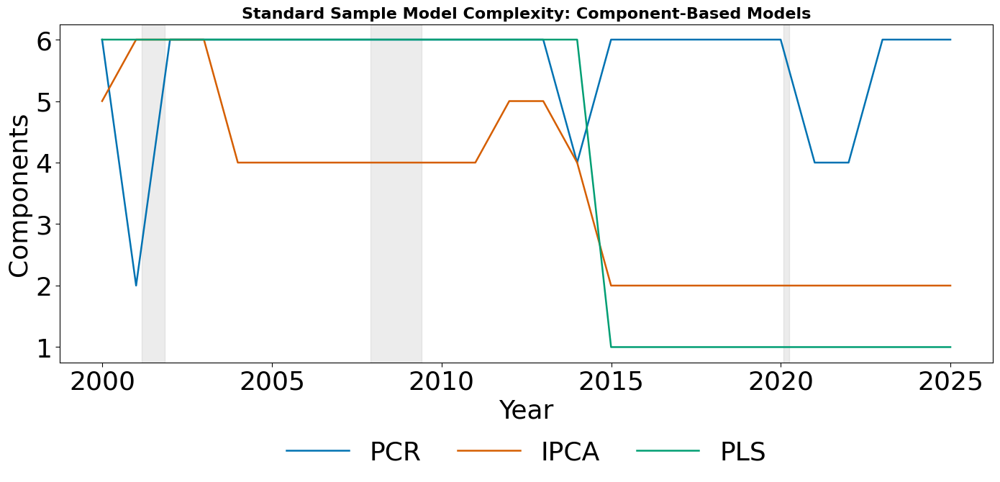

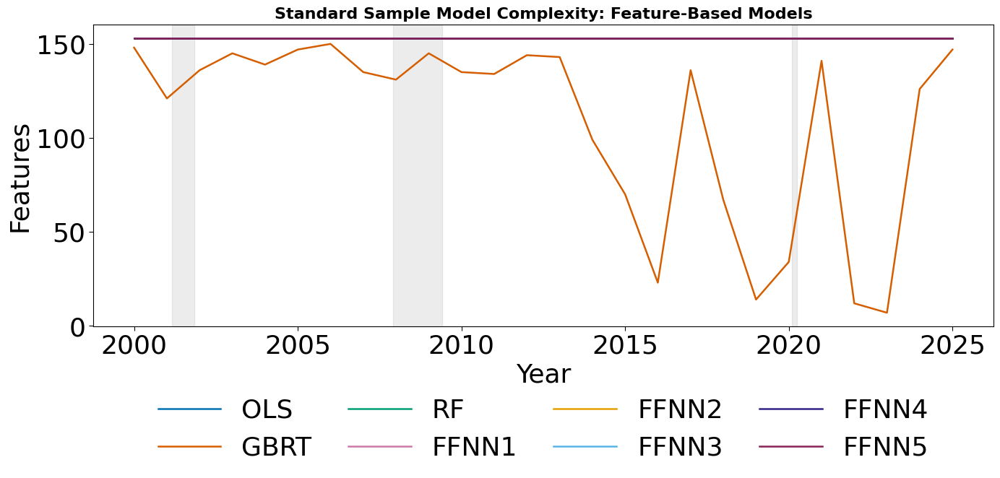

In [ ]:
fig, ax_components, ax_features, complexity_data = create_model_complexity_graph(
    component_files={
        "PCR": "Model output/PCR_number_of_components.parquet",
        "IPCA": "Model output/IPCA_number_of_components.parquet",
        "PLS": "Model output/PLS_number_of_components.parquet"},
    feature_files={
        "OLS": "Model output/OLS_number_of_features.parquet",
        "GBRT": "Model output/GBRT_number_of_features.parquet",
        "RF": "Model output/RF_number_of_features.parquet",
        "FFNN1": "Model output/FFNN1_number_of_features.parquet",
        "FFNN2": "Model output/FFNN2_number_of_features.parquet",
        "FFNN3": "Model output/FFNN3_number_of_features.parquet",
        "FFNN4": "Model output/FFNN4_number_of_features.parquet",
        "FFNN5": "Model output/FFNN5_number_of_features.parquet"},
    title="Standard Sample Model Complexity")

Winsorizing

In [ ]:
fig, ax_components, ax_features, complexity_data = create_model_complexity_graph(
    component_files={
        "PCR": "Model output winsorized/PCR_number_of_components_winsorized.parquet",
        "IPCA": "Model output winsorized/IPCA_number_of_components_winsorized.parquet",
        "PLS": "Model output winsorized/PLS_number_of_components_winsorized.parquet"},
    feature_files={
        "OLS": "Model output winsorized/OLS_number_of_features_winsorized.parquet",
        "GBRT": "Model output winsorized/GBRT_number_of_features_winsorized.parquet",
        "RF": "Model output winsorized/RF_number_of_features_winsorized.parquet",
        "FFNN1": "Model output winsorized/FFNN1_number_of_features_winsorized.parquet",
        "FFNN2": "Model output winsorized/FFNN2_number_of_features_winsorized.parquet",
        "FFNN3": "Model output winsorized/FFNN3_number_of_features_winsorized.parquet",
        "FFNN4": "Model output winsorized/FFNN4_number_of_features_winsorized.parquet",
        "FFNN5": "Model output winsorized/FFNN5_number_of_features_winsorized.parquet"},
    title="Winsorized Sample Model Complexity")

Alternative data

In [ ]:
fig, ax_components, ax_features, complexity_data = create_model_complexity_graph(
    component_files={
        "PCR": "Model output alternative data/PCR_number_of_components_alternative_data.parquet",
        "IPCA": "Model output alternative data/IPCA_number_of_components_alternative_data.parquet",
        "PLS": "Model output alternative data/PLS_number_of_components_alternative_data.parquet"},
    feature_files={
        "OLS": "Model output alternative data/OLS_number_of_features_alternative_data.parquet",
        "GBRT": "Model output alternative data/GBRT_number_of_features_alternative_data.parquet",
        "RF": "Model output alternative data/RF_number_of_features_alternative_data.parquet",
        "FFNN1": "Model output alternative data/FFNN1_number_of_features_alternative_data.parquet",
        "FFNN2": "Model output alternative data/FFNN2_number_of_features_alternative_data.parquet",
        "FFNN3": "Model output alternative data/FFNN3_number_of_features_alternative_data.parquet",
        "FFNN4": "Model output alternative data/FFNN4_number_of_features_alternative_data.parquet",
        "FFNN5": "Model output alternative data/FFNN5_number_of_features_alternative_data.parquet"},
    title="Alternative Data Sample Model Complexity")

Top universe

In [ ]:
fig, ax_components, ax_features, complexity_data = create_model_complexity_graph(
    component_files={
        "PCR": "Model output top/PCR_number_of_components_top.parquet",
        "IPCA": "Model output top/IPCA_number_of_components_top.parquet",
        "PLS": "Model output top/PLS_number_of_components_top.parquet"},
    feature_files={
        "OLS": "Model output top/OLS_number_of_features_top.parquet",
        "GBRT": "Model output top/GBRT_number_of_features_top.parquet",
        "RF": "Model output top/RF_number_of_features_top.parquet",
        "FFNN1": "Model output top/FFNN1_number_of_features_top.parquet",
        "FFNN2": "Model output top/FFNN2_number_of_features_top.parquet",
        "FFNN3": "Model output top/FFNN3_number_of_features_top.parquet",
        "FFNN4": "Model output top/FFNN4_number_of_features_top.parquet",
        "FFNN5": "Model output top/FFNN5_number_of_features_top.parquet"},
    title="Top Sample Model Complexity")

Bottom universe

In [ ]:
fig, ax_components, ax_features, complexity_data = create_model_complexity_graph(
    component_files={
        "PCR": "Model output bottom/PCR_number_of_components_bottom.parquet",
        "IPCA": "Model output bottom/IPCA_number_of_components_bottom.parquet",
        "PLS": "Model output bottom/PLS_number_of_components_bottom.parquet"},
    feature_files={
        "OLS": "Model output bottom/OLS_number_of_features_bottom.parquet",
        "GBRT": "Model output bottom/GBRT_number_of_features_bottom.parquet",
        "RF": "Model output bottom/RF_number_of_features_bottom.parquet",
        "FFNN1": "Model output bottom/FFNN1_number_of_features_bottom.parquet",
        "FFNN2": "Model output bottom/FFNN2_number_of_features_bottom.parquet",
        "FFNN3": "Model output bottom/FFNN3_number_of_features_bottom.parquet",
        "FFNN4": "Model output bottom/FFNN4_number_of_features_bottom.parquet",
        "FFNN5": "Model output bottom/FFNN5_number_of_features_bottom.parquet"},
    title="Bottom Sample Model Complexity")

Alternative industries

In [ ]:
fig, ax_components, ax_features, complexity_data = create_model_complexity_graph(
    component_files={
        "PCR": "Model output alternative industries/PCR_number_of_components_alternative_industries.parquet",
        "IPCA": "Model output alternative industries/IPCA_number_of_components_alternative_industries.parquet",
        "PLS": "Model output alternative industries/PLS_number_of_components_alternative_industries.parquet"},
    feature_files={
        "OLS": "Model output alternative industries/OLS_number_of_features_alternative_industries.parquet",
        "GBRT": "Model output alternative industries/GBRT_number_of_features_alternative_industries.parquet",
        "RF": "Model output alternative industries/RF_number_of_features_alternative_industries.parquet",
        "FFNN1": "Model output alternative industries/FFNN1_number_of_features_alternative_industries.parquet",
        "FFNN2": "Model output alternative industries/FFNN2_number_of_features_alternative_industries.parquet",
        "FFNN3": "Model output alternative industries/FFNN3_number_of_features_alternative_industries.parquet",
        "FFNN4": "Model output alternative industries/FFNN4_number_of_features_alternative_industries.parquet",
        "FFNN5": "Model output alternative industries/FFNN5_number_of_features_alternative_industries.parquet"},
    title="Alternative Industries Sample Model Complexity")

Alternative sample split

In [ ]:
fig, ax_components, ax_features, complexity_data = create_model_complexity_graph(
    component_files={
        "PCR": "Model output alternative sample split/PCR_number_of_components_alternative_sample_split.parquet",
        "IPCA": "Model output alternative sample split/IPCA_number_of_components_alternative_sample_split.parquet",
        "PLS": "Model output alternative sample split/PLS_number_of_components_alternative_sample_split.parquet"},
    feature_files={
        "OLS": "Model output alternative sample split/OLS_number_of_features_alternative_sample_split.parquet",
        "GBRT": "Model output alternative sample split/GBRT_number_of_features_alternative_sample_split.parquet",
        "RF": "Model output alternative sample split/RF_number_of_features_alternative_sample_split.parquet",
        "FFNN1": "Model output alternative sample split/FFNN1_number_of_features_alternative_sample_split.parquet",
        "FFNN2": "Model output alternative sample split/FFNN2_number_of_features_alternative_sample_split.parquet",
        "FFNN3": "Model output alternative sample split/FFNN3_number_of_features_alternative_sample_split.parquet",
        "FFNN4": "Model output alternative sample split/FFNN4_number_of_features_alternative_sample_split.parquet",
        "FFNN5": "Model output alternative sample split/FFNN5_number_of_features_alternative_sample_split.parquet"},
    title="Alternative Sample Split Sample Model Complexity")

## Variable importance

Standard

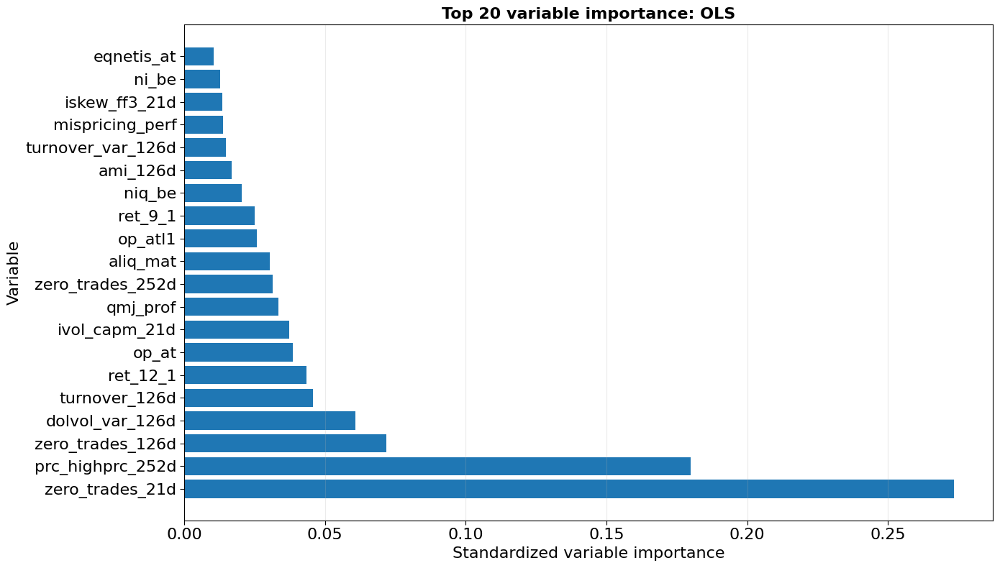

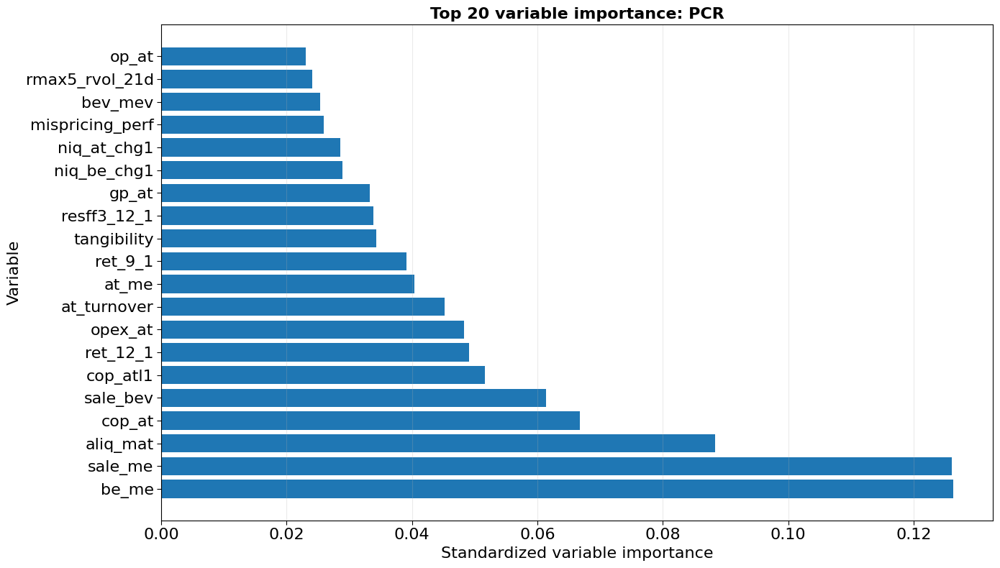

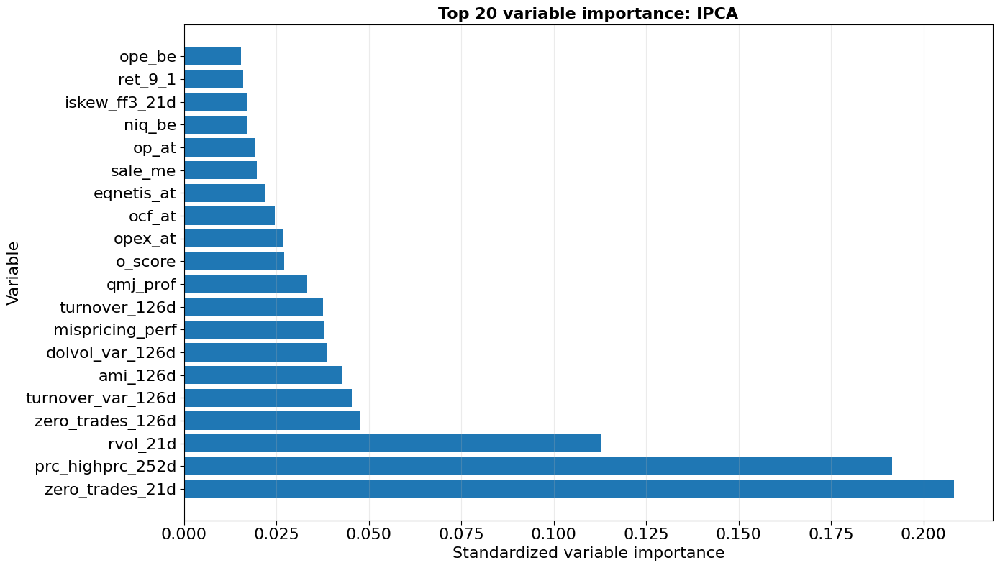

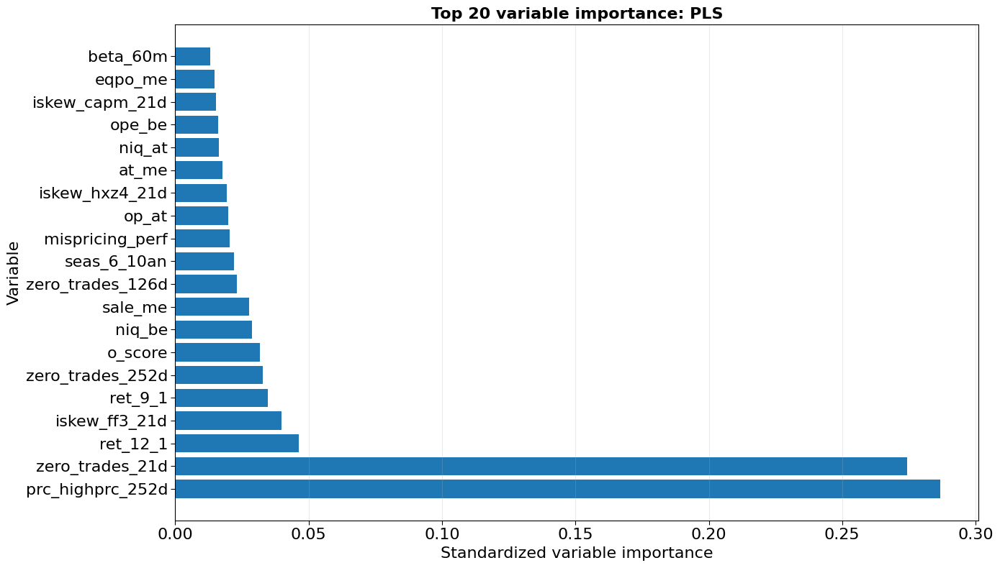

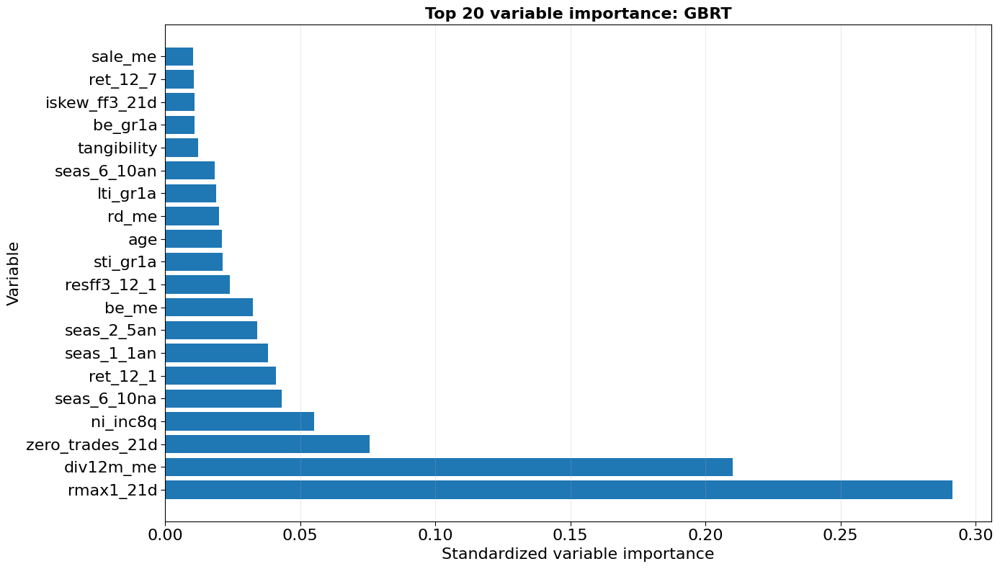

...

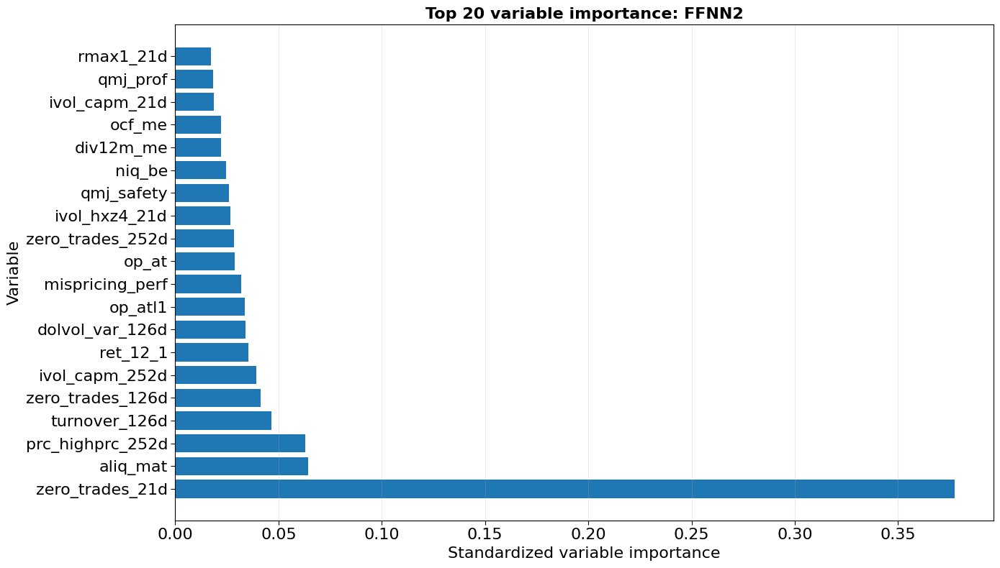

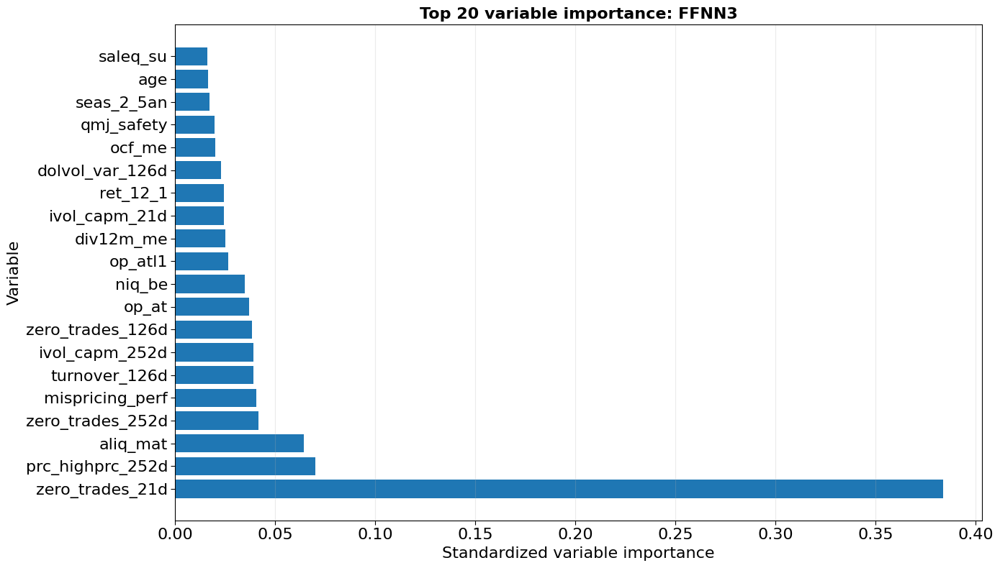

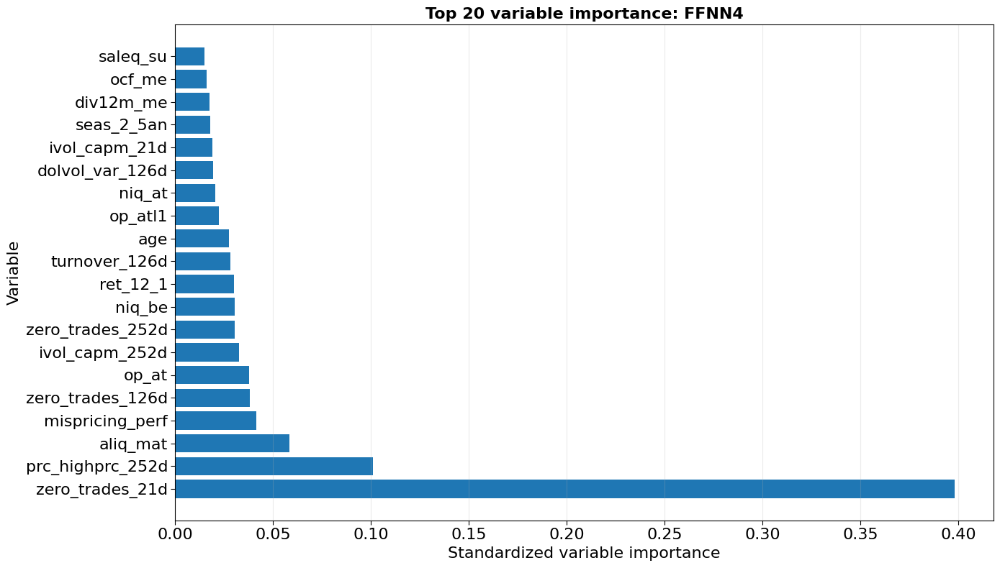

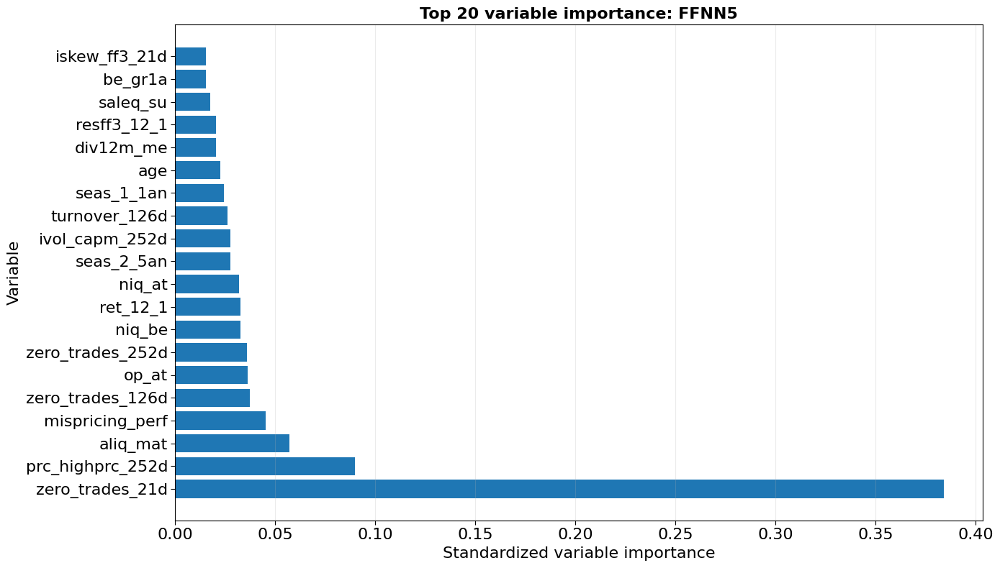

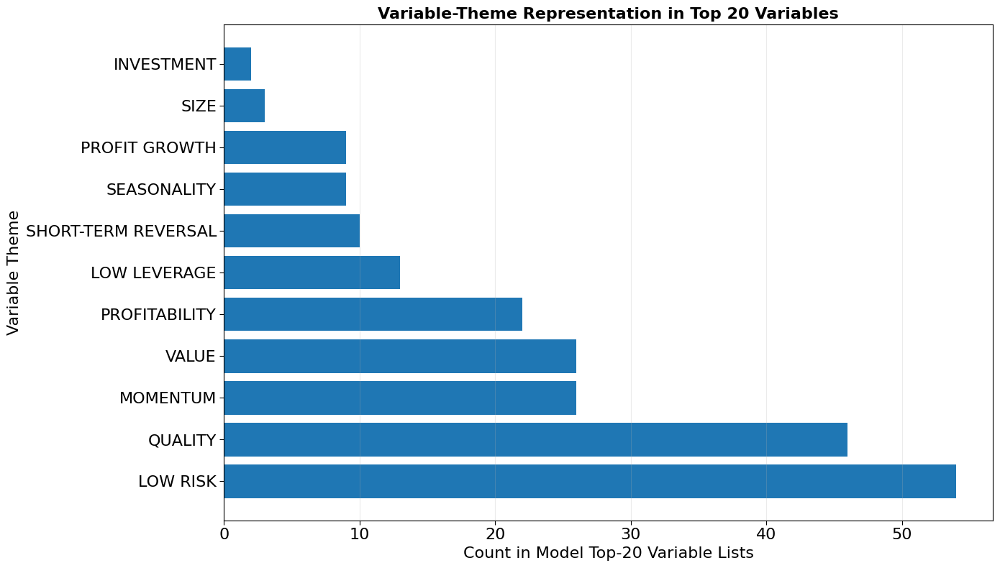

In [ ]:
top_variable_importance, family_importance = create_variable_importance_graphs({
    "OLS": "Model output/OLS_variable_importance_average.parquet",
    "PCR": "Model output/PCR_variable_importance_average.parquet",
    "IPCA": "Model output/IPCA_variable_importance_average.parquet",
    "PLS": "Model output/PLS_variable_importance_average.parquet",
    "GBRT": "Model output/GBRT_variable_importance_average.parquet",
    "RF": "Model output/RF_variable_importance_average.parquet",
    "FFNN1" : "Model output/FFNN1_variable_importance_average.parquet",
    "FFNN2" : "Model output/FFNN2_variable_importance_average.parquet",
    "FFNN3" : "Model output/FFNN3_variable_importance_average.parquet",
    "FFNN4" : "Model output/FFNN4_variable_importance_average.parquet",
    "FFNN5" : "Model output/FFNN5_variable_importance_average.parquet"})

Winsorizing

In [ ]:
top_variable_importance, family_importance = create_variable_importance_graphs({
    "OLS": "Model output winsorized/OLS_variable_importance_average_winsorized.parquet",
    "PCR": "Model output winsorized/PCR_variable_importance_average_winsorized.parquet",
    "IPCA": "Model output winsorized/IPCA_variable_importance_average_winsorized.parquet",
    "PLS": "Model output winsorized/PLS_variable_importance_average_winsorized.parquet",
    "GBRT": "Model output winsorizedGBRT_variable_importance_average_winsorized.parquet",
    "RF": "Model output winsorized/RF_variable_importance_average_winsorized.parquet",
    "FFNN1" : "Model output winsorized/FFNN1_variable_importance_average_winsorized.parquet",
    "FFNN2" : "Model output winsorized/FFNN2_variable_importance_average_winsorized.parquet",
    "FFNN3" : "Model output winsorized/FFNN3_variable_importance_average_winsorized.parquet",
    "FFNN4" : "Model output winsorized/FFNN4_variable_importance_average_winsorized.parquet",
    "FFNN5" : "Model output winsorized/FFNN5_variable_importance_average_winsorized.parquet"})

Alternative data

In [ ]:
top_variable_importance, family_importance = create_variable_importance_graphs({
    "OLS": "Model output alternative data/OLS_variable_importance_average_alternative_data.parquet",
    "PCR": "Model output alternative data/PCR_variable_importance_average_alternative_data.parquet",
    "IPCA": "Model output alternative data/IPCA_variable_importance_average_alternative_data.parquet",
    "PLS": "Model output alternative data/PLS_variable_importance_average_alternative_data.parquet",
    "GBRT": "Model output alternative data/GBRT_variable_importance_average_alternative_data.parquet",
    "RF": "Model output alternative data/RF_variable_importance_average_alternative_data.parquet",
    "FFNN1" : "Model output alternative data/FFNN1_variable_importance_average_alternative_data.parquet",
    "FFNN2" : "Model output alternative data/FFNN2_variable_importance_average_alternative_data.parquet",
    "FFNN3" : "Model output alternative data/FFNN3_variable_importance_average_alternative_data.parquet",
    "FFNN4" : "Model output alternative data/FFNN4_variable_importance_average_alternative_data.parquet",
    "FFNN5" : "Model output alternative data/FFNN5_variable_importance_average_alternative_data.parquet"})

Top universe

In [ ]:
top_variable_importance, family_importance = create_variable_importance_graphs({
    "OLS": "Model output top/OLS_variable_importance_average_top.parquet",
    "PCR": "Model output top/PCR_variable_importance_average_top.parquet",
    "IPCA": "Model output top/IPCA_variable_importance_average_top.parquet",
    "PLS": "Model output top/PLS_variable_importance_average_top.parquet",
    "GBRT": "Model output top/GBRT_variable_importance_average_top.parquet",
    "RF": "Model output top/RF_variable_importance_average_top.parquet",
    "FFNN1" : "Model output top/FFNN1_variable_importance_average_top.parquet",
    "FFNN2" : "Model output top/FFNN2_variable_importance_average_top.parquet",
    "FFNN3" : "Model output top/FFNN3_variable_importance_average_top.parquet",
    "FFNN4" : "Model output top/FFNN4_variable_importance_average_top.parquet",
    "FFNN5" : "Model output top/FFNN5_variable_importance_average_top.parquet"})

Bottom universe

In [ ]:
top_variable_importance, family_importance = create_variable_importance_graphs({
    "OLS": "Model output bottom/OLS_variable_importance_average_bottom.parquet",
    "PCR": "Model output bottom/PCR_variable_importance_average_bottom.parquet",
    "IPCA": "Model output bottom/IPCA_variable_importance_average_bottom.parquet",
    "PLS": "Model output bottom/PLS_variable_importance_average_bottom.parquet",
    "GBRT": "Model output bottom/GBRT_variable_importance_average_bottom.parquet",
    "RF": "Model output bottom/RF_variable_importance_average_bottom.parquet",
    "FFNN1" : "Model output bottom/FFNN1_variable_importance_average_bottom.parquet",
    "FFNN2" : "Model output bottom/FFNN2_variable_importance_average_bottom.parquet",
    "FFNN3" : "Model output bottom/FFNN3_variable_importance_average_bottom.parquet",
    "FFNN4" : "Model output bottom/FFNN4_variable_importance_average_bottom.parquet",
    "FFNN5" : "Model output bottom/FFNN5_variable_importance_average_bottom.parquet"})

Alternative industries

In [ ]:
top_variable_importance, family_importance = create_variable_importance_graphs({
    "OLS": "Model output alternative industries/OLS_variable_importance_average_alternative_industries.parquet",
    "PCR": "Model output alternative industries/PCR_variable_importance_average_alternative_industries.parquet",
    "IPCA": "Model output alternative industries/IPCA_variable_importance_average_alternative_industries.parquet",
    "PLS": "Model output alternative industries/PLS_variable_importance_average_alternative_industries.parquet",
    "GBRT": "Model output alternative industries/GBRT_variable_importance_average_alternative_industries.parquet",
    "RF": "Model output alternative industries/RF_variable_importance_average_alternative_industries.parquet",
    "FFNN1" : "Model output alternative industries/FFNN1_variable_importance_average_alternative_industries.parquet",
    "FFNN2" : "Model output alternative industries/FFNN2_variable_importance_average_alternative_industries.parquet",
    "FFNN3" : "Model output alternative industries/FFNN3_variable_importance_average_alternative_industries.parquet",
    "FFNN4" : "Model output alternative industries/FFNN4_variable_importance_average_alternative_industries.parquet",
    "FFNN5" : "Model output alternative industries/FFNN5_variable_importance_average_alternative_industries.parquet"})

Alternative sample split

In [ ]:
top_variable_importance, family_importance = create_variable_importance_graphs({
    "OLS": "Model output alternative sample split/OLS_variable_importance_average_alternative_sample_split.parquet",
    "PCR": "Model output alternative sample split/PCR_variable_importance_average_alternative_sample_split.parquet",
    "IPCA": "Model output alternative sample split/IPCA_variable_importance_average_alternative_sample_split.parquet",
    "PLS": "Model output alternative sample split/PLS_variable_importance_average_alternative_sample_split.parquet",
    "GBRT": "Model output alternative sample split/GBRT_variable_importance_average_alternative_sample_split.parquet",
    "RF": "Model output alternative sample split/RF_variable_importance_average_alternative_sample_split.parquet",
    "FFNN1" : "Model output alternative sample split/FFNN1_variable_importance_average_alternative_sample_split.parquet",
    "FFNN2" : "Model output alternative sample split/FFNN2_variable_importance_average_alternative_sample_split.parquet",
    "FFNN3" : "Model output alternative sample split/FFNN3_variable_importance_average_alternative_sample_split.parquet",
    "FFNN4" : "Model output alternative sample split/FFNN4_variable_importance_average_alternative_sample_split.parquet",
    "FFNN5" : "Model output alternative sample split/FFNN5_variable_importance_average_alternative_sample_split.parquet"})

## Time-varying variable importance

Standard

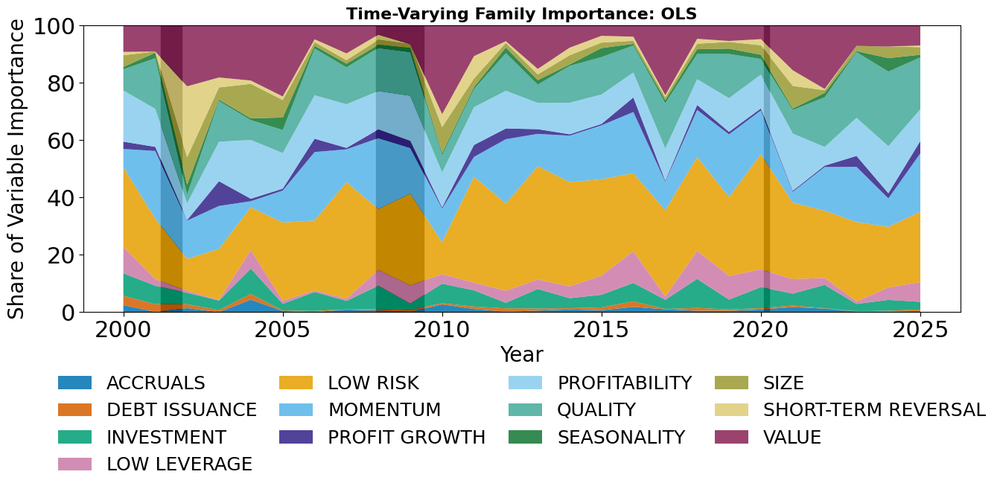

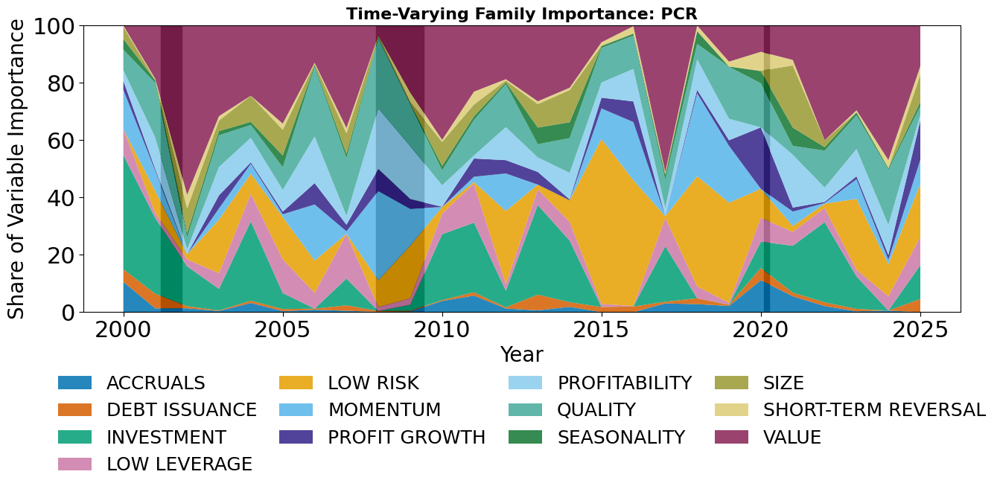

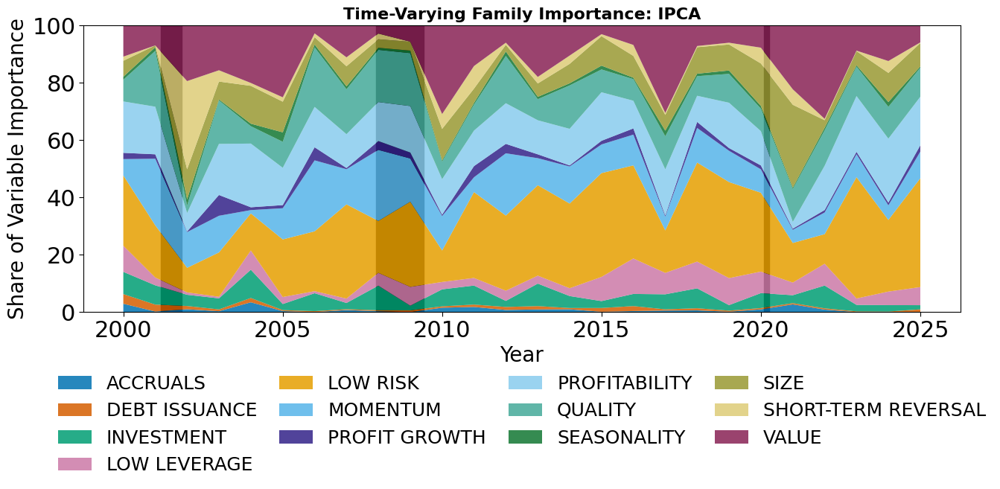

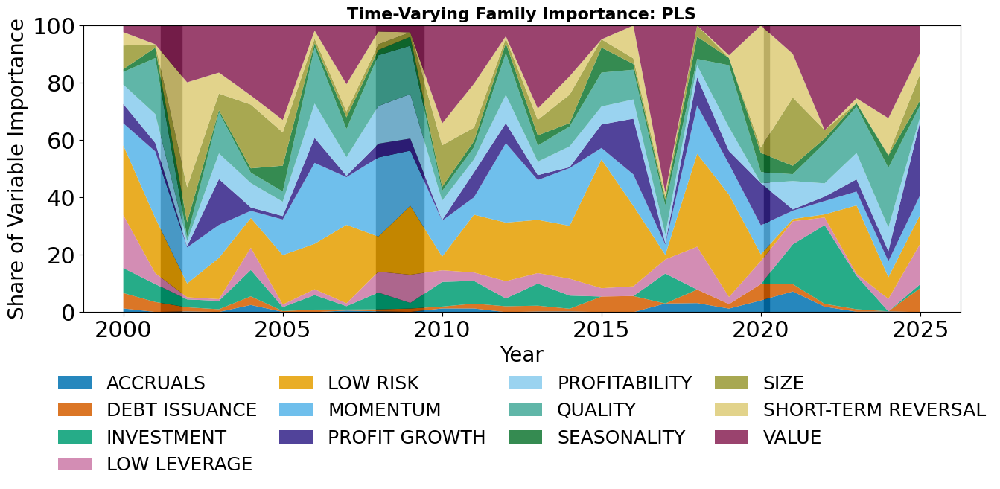

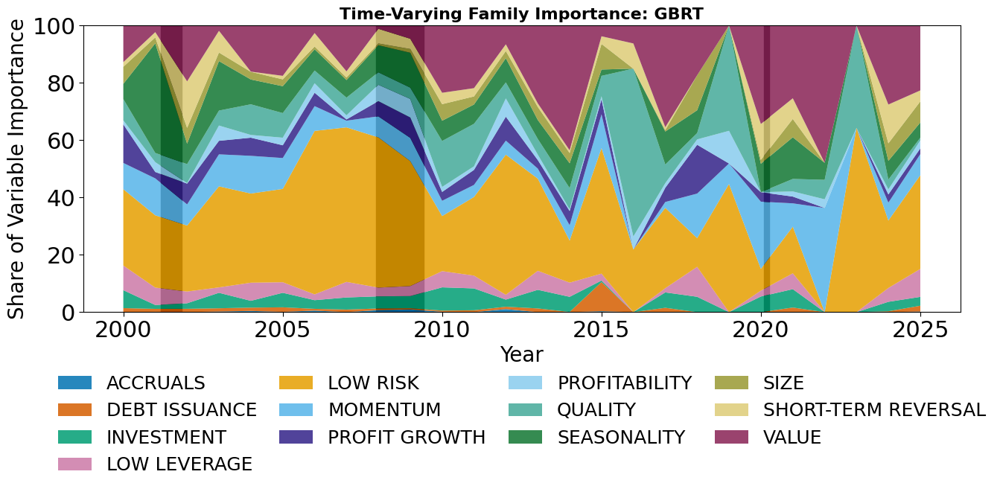

...

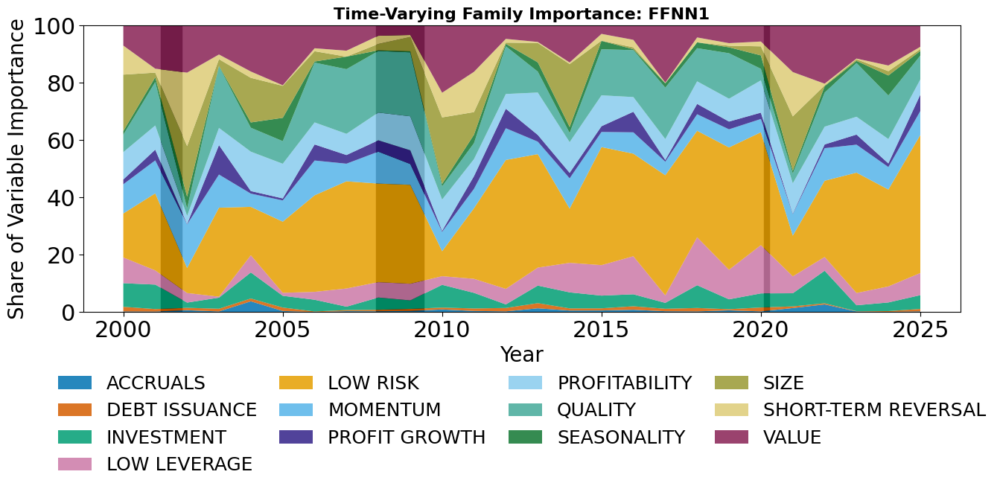

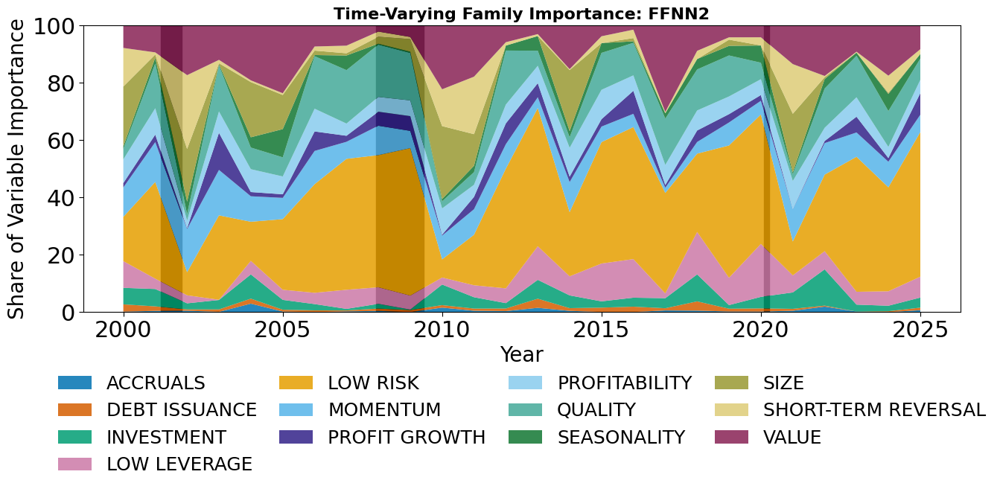

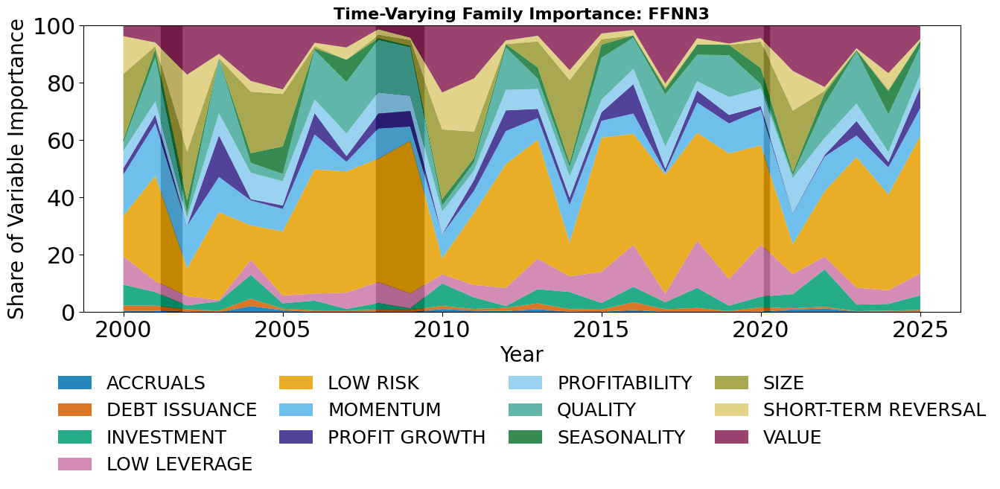

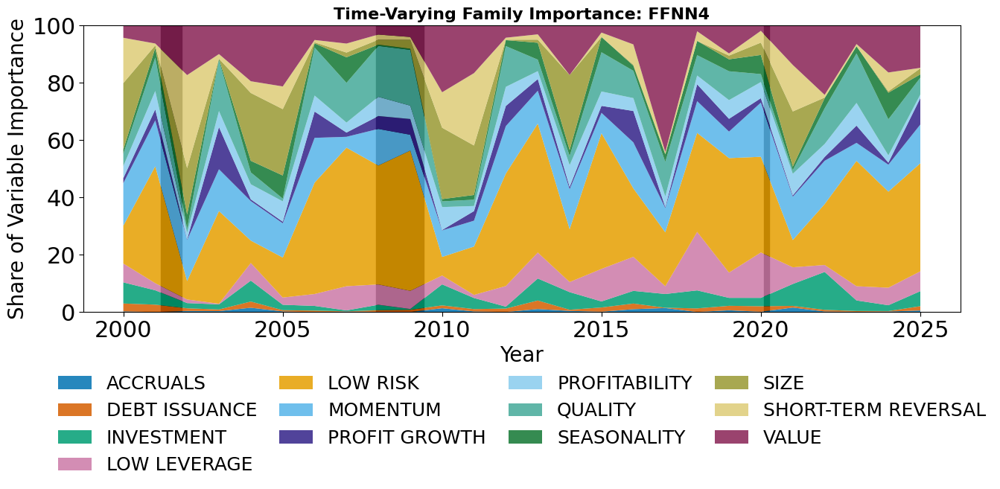

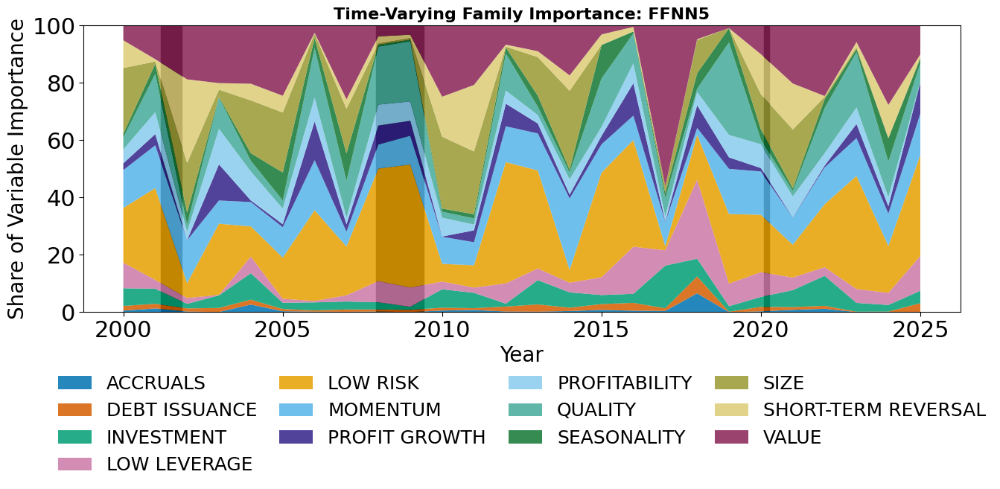

In [ ]:
time_varying_family_importance = create_time_varying_family_importance_graphs({
    "OLS": "Model output/OLS_variable_importance_time_varying.parquet",
    "PCR": "Model output/PCR_variable_importance_time_varying.parquet",
    "IPCA": "Model output/IPCA_variable_importance_time_varying.parquet",
    "PLS": "Model output/PLS_variable_importance_time_varying.parquet",
    "GBRT": "Model output/GBRT_variable_importance_time_varying.parquet",
    "RF": "Model output/RF_variable_importance_time_varying.parquet",
    "FFNN1" : "Model output/FFNN1_variable_importance_time_varying.parquet",
    "FFNN2" : "Model output/FFNN2_variable_importance_time_varying.parquet",
    "FFNN3" : "Model output/FFNN3_variable_importance_time_varying.parquet",
    "FFNN4" : "Model output/FFNN4_variable_importance_time_varying.parquet",
    "FFNN5" : "Model output/FFNN5_variable_importance_time_varying.parquet"})

Winsorizing

In [ ]:
time_varying_family_importance = create_time_varying_family_importance_graphs({
    "OLS": "Model output winsorized/OLS_variable_importance_average_winsorized.parquet",
    "PCR": "Model output winsorized/PCR_variable_importance_average_winsorized.parquet",
    "IPCA": "Model output winsorized/IPCA_variable_importance_average_winsorized.parquet",
    "PLS": "Model output winsorized/PLS_variable_importance_average_winsorized.parquet",
    "GBRT": "Model output winsorizedGBRT_variable_importance_average_winsorized.parquet",
    "RF": "Model output winsorized/RF_variable_importance_average_winsorized.parquet",
    "FFNN1" : "Model output winsorized/FFNN1_variable_importance_average_winsorized.parquet",
    "FFNN2" : "Model output winsorized/FFNN2_variable_importance_average_winsorized.parquet",
    "FFNN3" : "Model output winsorized/FFNN3_variable_importance_average_winsorized.parquet",
    "FFNN4" : "Model output winsorized/FFNN4_variable_importance_average_winsorized.parquet",
    "FFNN5" : "Model output winsorized/FFNN5_variable_importance_average_winsorized.parquet"})

Alternative data

In [ ]:
time_varying_family_importance = create_time_varying_family_importance_graphs({
    "OLS": "Model output alternative data/OLS_variable_importance_average_alternative_data.parquet",
    "PCR": "Model output alternative data/PCR_variable_importance_average_alternative_data.parquet",
    "IPCA": "Model output alternative data/IPCA_variable_importance_average_alternative_data.parquet",
    "PLS": "Model output alternative data/PLS_variable_importance_average_alternative_data.parquet",
    "GBRT": "Model output alternative data/GBRT_variable_importance_average_alternative_data.parquet",
    "RF": "Model output alternative data/RF_variable_importance_average_alternative_data.parquet",
    "FFNN1" : "Model output alternative data/FFNN1_variable_importance_average_alternative_data.parquet",
    "FFNN2" : "Model output alternative data/FFNN2_variable_importance_average_alternative_data.parquet",
    "FFNN3" : "Model output alternative data/FFNN3_variable_importance_average_alternative_data.parquet",
    "FFNN4" : "Model output alternative data/FFNN4_variable_importance_average_alternative_data.parquet",
    "FFNN5" : "Model output alternative data/FFNN5_variable_importance_average_alternative_data.parquet"})

Top universe

In [ ]:
time_varying_family_importance = create_time_varying_family_importance_graphs({
    "OLS": "Model output top/OLS_variable_importance_average_top.parquet",
    "PCR": "Model output top/PCR_variable_importance_average_top.parquet",
    "IPCA": "Model output top/IPCA_variable_importance_average_top.parquet",
    "PLS": "Model output top/PLS_variable_importance_average_top.parquet",
    "GBRT": "Model output top/GBRT_variable_importance_average_top.parquet",
    "RF": "Model output top/RF_variable_importance_average_top.parquet",
    "FFNN1" : "Model output top/FFNN1_variable_importance_average_top.parquet",
    "FFNN2" : "Model output top/FFNN2_variable_importance_average_top.parquet",
    "FFNN3" : "Model output top/FFNN3_variable_importance_average_top.parquet",
    "FFNN4" : "Model output top/FFNN4_variable_importance_average_top.parquet",
    "FFNN5" : "Model output top/FFNN5_variable_importance_average_top.parquet"})

Bottom universe

In [ ]:
time_varying_family_importance = create_time_varying_family_importance_graphs({
    "OLS": "Model output bottom/OLS_variable_importance_average_bottom.parquet",
    "PCR": "Model output bottom/PCR_variable_importance_average_bottom.parquet",
    "IPCA": "Model output bottom/IPCA_variable_importance_average_bottom.parquet",
    "PLS": "Model output bottom/PLS_variable_importance_average_bottom.parquet",
    "GBRT": "Model output bottom/GBRT_variable_importance_average_bottom.parquet",
    "RF": "Model output bottom/RF_variable_importance_average_bottom.parquet",
    "FFNN1" : "Model output bottom/FFNN1_variable_importance_average_bottom.parquet",
    "FFNN2" : "Model output bottom/FFNN2_variable_importance_average_bottom.parquet",
    "FFNN3" : "Model output bottom/FFNN3_variable_importance_average_bottom.parquet",
    "FFNN4" : "Model output bottom/FFNN4_variable_importance_average_bottom.parquet",
    "FFNN5" : "Model output bottom/FFNN5_variable_importance_average_bottom.parquet"})

Alternative industries

In [ ]:
time_varying_family_importance = create_time_varying_family_importance_graphs({
    "OLS": "Model output alternative industries/OLS_variable_importance_average_alternative_industries.parquet",
    "PCR": "Model output alternative industries/PCR_variable_importance_average_alternative_industries.parquet",
    "IPCA": "Model output alternative industries/IPCA_variable_importance_average_alternative_industries.parquet",
    "PLS": "Model output alternative industries/PLS_variable_importance_average_alternative_industries.parquet",
    "GBRT": "Model output alternative industries/GBRT_variable_importance_average_alternative_industries.parquet",
    "RF": "Model output alternative industries/RF_variable_importance_average_alternative_industries.parquet",
    "FFNN1" : "Model output alternative industries/FFNN1_variable_importance_average_alternative_industries.parquet",
    "FFNN2" : "Model output alternative industries/FFNN2_variable_importance_average_alternative_industries.parquet",
    "FFNN3" : "Model output alternative industries/FFNN3_variable_importance_average_alternative_industries.parquet",
    "FFNN4" : "Model output alternative industries/FFNN4_variable_importance_average_alternative_industries.parquet",
    "FFNN5" : "Model output alternative industries/FFNN5_variable_importance_average_alternative_industries.parquet"})

Alternative sample split

In [ ]:
time_varying_family_importance = create_time_varying_family_importance_graphs({
    "OLS": "Model output alternative sample split/OLS_variable_importance_average_alternative_sample_split.parquet",
    "PCR": "Model output alternative sample split/PCR_variable_importance_average_alternative_sample_split.parquet",
    "IPCA": "Model output alternative sample split/IPCA_variable_importance_average_alternative_sample_split.parquet",
    "PLS": "Model output alternative sample split/PLS_variable_importance_average_alternative_sample_split.parquet",
    "GBRT": "Model output alternative sample split/GBRT_variable_importance_average_alternative_sample_split.parquet",
    "RF": "Model output alternative sample split/RF_variable_importance_average_alternative_sample_split.parquet",
    "FFNN1" : "Model output alternative sample split/FFNN1_variable_importance_average_alternative_sample_split.parquet",
    "FFNN2" : "Model output alternative sample split/FFNN2_variable_importance_average_alternative_sample_split.parquet",
    "FFNN3" : "Model output alternative sample split/FFNN3_variable_importance_average_alternative_sample_split.parquet",
    "FFNN4" : "Model output alternative sample split/FFNN4_variable_importance_average_alternative_sample_split.parquet",
    "FFNN5" : "Model output alternative sample split/FFNN5_variable_importance_average_alternative_sample_split.parquet"})

## Extended variable importance

Standard

/tmp/ipykernel_15634/969512851.py:7729: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(heatmap_cmap).copy()


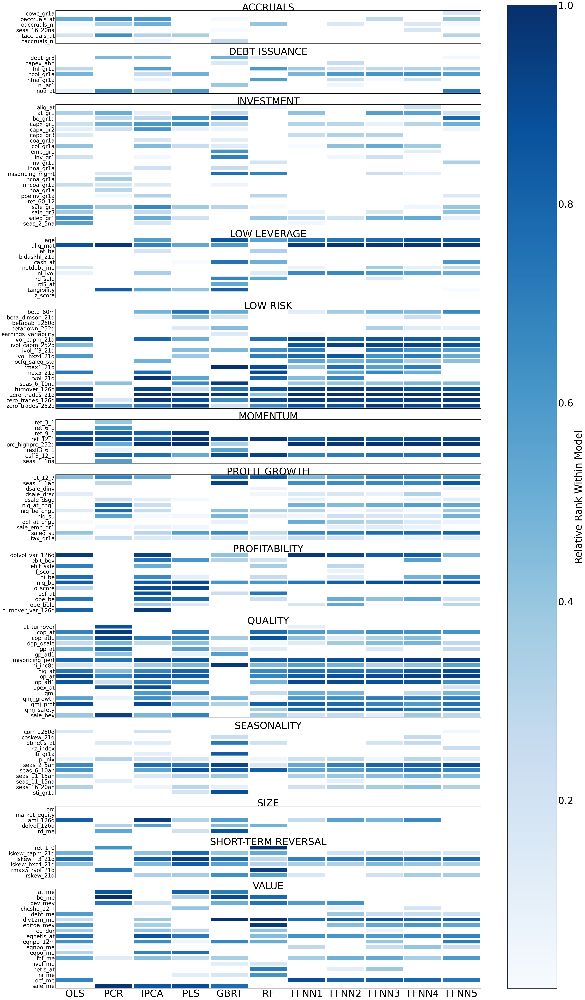

In [ ]:
fig, ax, relative_rank_matrix, expanded_matrix = create_extended_variable_importance_heatmap(
    model_variable_importance={
        "OLS": "Model output/OLS_variable_importance_average.parquet",
        "PCR": "Model output/PCR_variable_importance_average.parquet",
        "IPCA": "Model output/IPCA_variable_importance_average.parquet",
        "PLS": "Model output/PLS_variable_importance_average.parquet",
        "GBRT": "Model output/GBRT_variable_importance_average.parquet",
        "RF": "Model output/RF_variable_importance_average.parquet",
        "FFNN1" : "Model output/FFNN1_variable_importance_average.parquet",
        "FFNN2" : "Model output/FFNN2_variable_importance_average.parquet",
        "FFNN3" : "Model output/FFNN3_variable_importance_average.parquet",
        "FFNN4" : "Model output/FFNN4_variable_importance_average.parquet",
        "FFNN5" : "Model output/FFNN5_variable_importance_average.parquet"})

Winsorizing

In [ ]:
fig, ax, relative_rank_matrix, expanded_matrix = create_extended_variable_importance_heatmap(
    model_variable_importance={
        "OLS": "Model output winsorized/OLS_variable_importance_average_winsorized.parquet",
        "PCR": "Model output winsorized/PCR_variable_importance_average_winsorized.parquet",
        "IPCA": "Model output winsorized/IPCA_variable_importance_average_winsorized.parquet",
        "PLS": "Model output winsorized/PLS_variable_importance_average_winsorized.parquet",
        "GBRT": "Model output winsorizedGBRT_variable_importance_average_winsorized.parquet",
        "RF": "Model output winsorized/RF_variable_importance_average_winsorized.parquet",
        "FFNN1" : "Model output winsorized/FFNN1_variable_importance_average_winsorized.parquet",
        "FFNN2" : "Model output winsorized/FFNN2_variable_importance_average_winsorized.parquet",
        "FFNN3" : "Model output winsorized/FFNN3_variable_importance_average_winsorized.parquet",
        "FFNN4" : "Model output winsorized/FFNN4_variable_importance_average_winsorized.parquet",
        "FFNN5" : "Model output winsorized/FFNN5_variable_importance_average_winsorized.parquet"})

Alternative data

In [ ]:
fig, ax, relative_rank_matrix, expanded_matrix = create_extended_variable_importance_heatmap(
    model_variable_importance={
        "OLS": "Model output alternative data/OLS_variable_importance_average_alternative_data.parquet",
        "PCR": "Model output alternative data/PCR_variable_importance_average_alternative_data.parquet",
        "IPCA": "Model output alternative data/IPCA_variable_importance_average_alternative_data.parquet",
        "PLS": "Model output alternative data/PLS_variable_importance_average_alternative_data.parquet",
        "GBRT": "Model output alternative data/GBRT_variable_importance_average_alternative_data.parquet",
        "RF": "Model output alternative data/RF_variable_importance_average_alternative_data.parquet",
        "FFNN1" : "Model output alternative data/FFNN1_variable_importance_average_alternative_data.parquet",
        "FFNN2" : "Model output alternative data/FFNN2_variable_importance_average_alternative_data.parquet",
        "FFNN3" : "Model output alternative data/FFNN3_variable_importance_average_alternative_data.parquet",
        "FFNN4" : "Model output alternative data/FFNN4_variable_importance_average_alternative_data.parquet",
        "FFNN5" : "Model output alternative data/FFNN5_variable_importance_average_alternative_data.parquet"})

Top universe

In [ ]:
fig, ax, relative_rank_matrix, expanded_matrix = create_extended_variable_importance_heatmap(
    model_variable_importance={
        "OLS": "Model output top/OLS_variable_importance_average_top.parquet",
        "PCR": "Model output top/PCR_variable_importance_average_top.parquet",
        "IPCA": "Model output top/IPCA_variable_importance_average_top.parquet",
        "PLS": "Model output top/PLS_variable_importance_average_top.parquet",
        "GBRT": "Model output top/GBRT_variable_importance_average_top.parquet",
        "RF": "Model output top/RF_variable_importance_average_top.parquet",
        "FFNN1" : "Model output top/FFNN1_variable_importance_average_top.parquet",
        "FFNN2" : "Model output top/FFNN2_variable_importance_average_top.parquet",
        "FFNN3" : "Model output top/FFNN3_variable_importance_average_top.parquet",
        "FFNN4" : "Model output top/FFNN4_variable_importance_average_top.parquet",
        "FFNN5" : "Model output top/FFNN5_variable_importance_average_top.parquet"})

Bottom universe

In [ ]:
fig, ax, relative_rank_matrix, expanded_matrix = create_extended_variable_importance_heatmap(
    model_variable_importance={
        "OLS": "Model output bottom/OLS_variable_importance_average_bottom.parquet",
        "PCR": "Model output bottom/PCR_variable_importance_average_bottom.parquet",
        "IPCA": "Model output bottom/IPCA_variable_importance_average_bottom.parquet",
        "PLS": "Model output bottom/PLS_variable_importance_average_bottom.parquet",
        "GBRT": "Model output bottom/GBRT_variable_importance_average_bottom.parquet",
        "RF": "Model output bottom/RF_variable_importance_average_bottom.parquet",
        "FFNN1" : "Model output bottom/FFNN1_variable_importance_average_bottom.parquet",
        "FFNN2" : "Model output bottom/FFNN2_variable_importance_average_bottom.parquet",
        "FFNN3" : "Model output bottom/FFNN3_variable_importance_average_bottom.parquet",
        "FFNN4" : "Model output bottom/FFNN4_variable_importance_average_bottom.parquet",
        "FFNN5" : "Model output bottom/FFNN5_variable_importance_average_bottom.parquet"})

Alternative industries

In [ ]:
fig, ax, relative_rank_matrix, expanded_matrix = create_extended_variable_importance_heatmap(
    model_variable_importance={
        "OLS": "Model output alternative industries/OLS_variable_importance_average_alternative_industries.parquet",
        "PCR": "Model output alternative industries/PCR_variable_importance_average_alternative_industries.parquet",
        "IPCA": "Model output alternative industries/IPCA_variable_importance_average_alternative_industries.parquet",
        "PLS": "Model output alternative industries/PLS_variable_importance_average_alternative_industries.parquet",
        "GBRT": "Model output alternative industries/GBRT_variable_importance_average_alternative_industries.parquet",
        "RF": "Model output alternative industries/RF_variable_importance_average_alternative_industries.parquet",
        "FFNN1" : "Model output alternative industries/FFNN1_variable_importance_average_alternative_industries.parquet",
        "FFNN2" : "Model output alternative industries/FFNN2_variable_importance_average_alternative_industries.parquet",
        "FFNN3" : "Model output alternative industries/FFNN3_variable_importance_average_alternative_industries.parquet",
        "FFNN4" : "Model output alternative industries/FFNN4_variable_importance_average_alternative_industries.parquet",
        "FFNN5" : "Model output alternative industries/FFNN5_variable_importance_average_alternative_industries.parquet"})

Alternative sample split

In [ ]:
fig, ax, relative_rank_matrix, expanded_matrix = create_extended_variable_importance_heatmap(
    model_variable_importance={
        "OLS": "Model output alternative sample split/OLS_variable_importance_average_alternative_sample_split.parquet",
        "PCR": "Model output alternative sample split/PCR_variable_importance_average_alternative_sample_split.parquet",
        "IPCA": "Model output alternative sample split/IPCA_variable_importance_average_alternative_sample_split.parquet",
        "PLS": "Model output alternative sample split/PLS_variable_importance_average_alternative_sample_split.parquet",
        "GBRT": "Model output alternative sample split/GBRT_variable_importance_average_alternative_sample_split.parquet",
        "RF": "Model output alternative sample split/RF_variable_importance_average_alternative_sample_split.parquet",
        "FFNN1" : "Model output alternative sample split/FFNN1_variable_importance_average_alternative_sample_split.parquet",
        "FFNN2" : "Model output alternative sample split/FFNN2_variable_importance_average_alternative_sample_split.parquet",
        "FFNN3" : "Model output alternative sample split/FFNN3_variable_importance_average_alternative_sample_split.parquet",
        "FFNN4" : "Model output alternative sample split/FFNN4_variable_importance_average_alternative_sample_split.parquet",
        "FFNN5" : "Model output alternative sample split/FFNN5_variable_importance_average_alternative_sample_split.parquet"})

## Portfolio performance

Standard

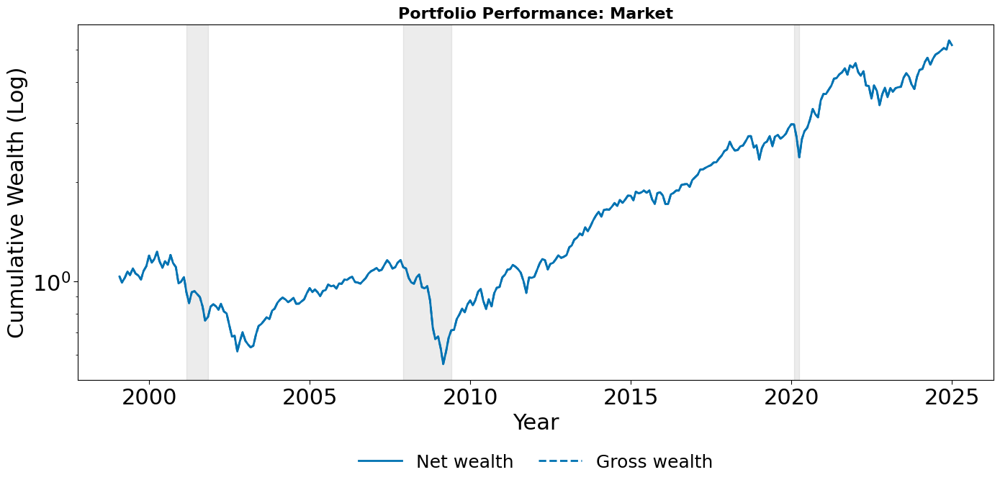

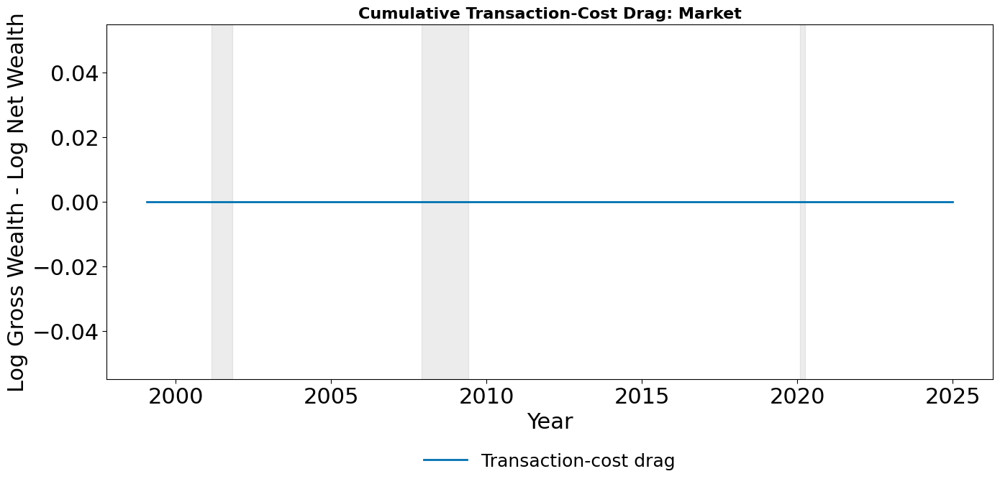

Displayed portfolio performance graphs for: Market


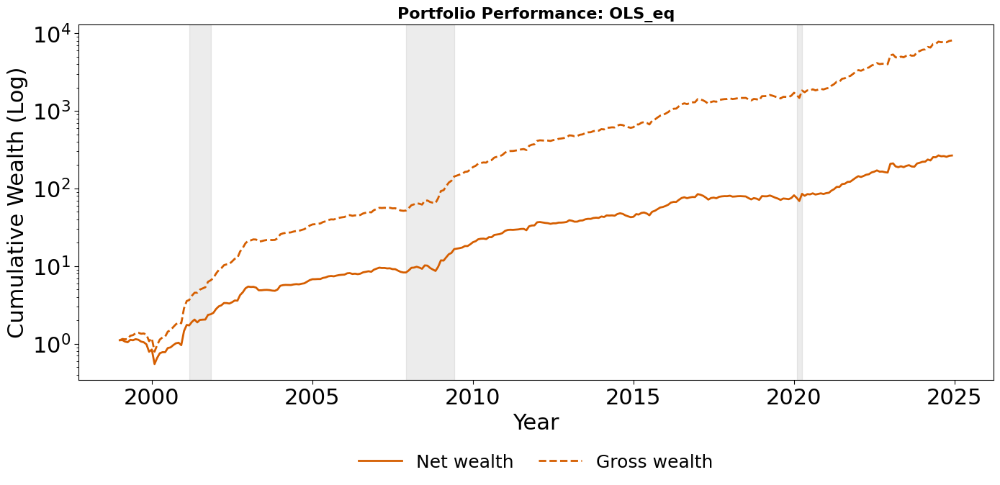

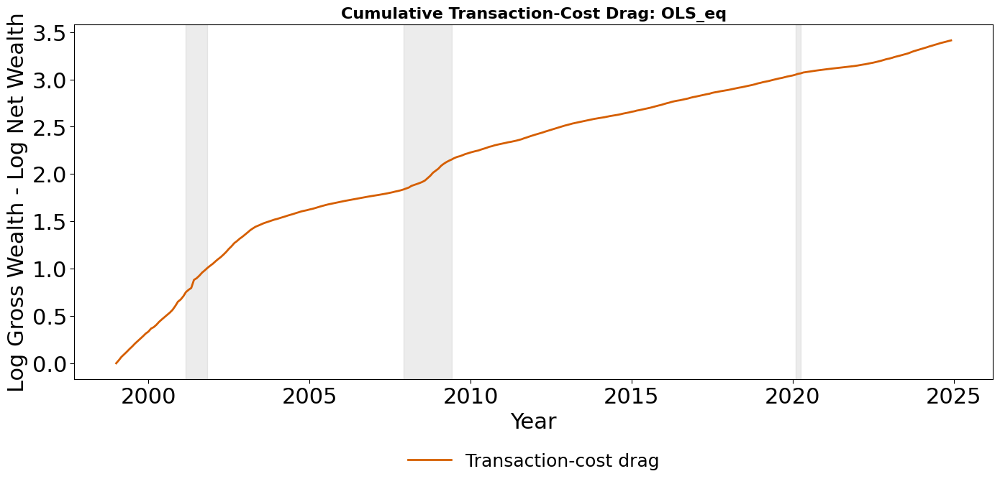

Displayed portfolio performance graphs for: OLS_eq


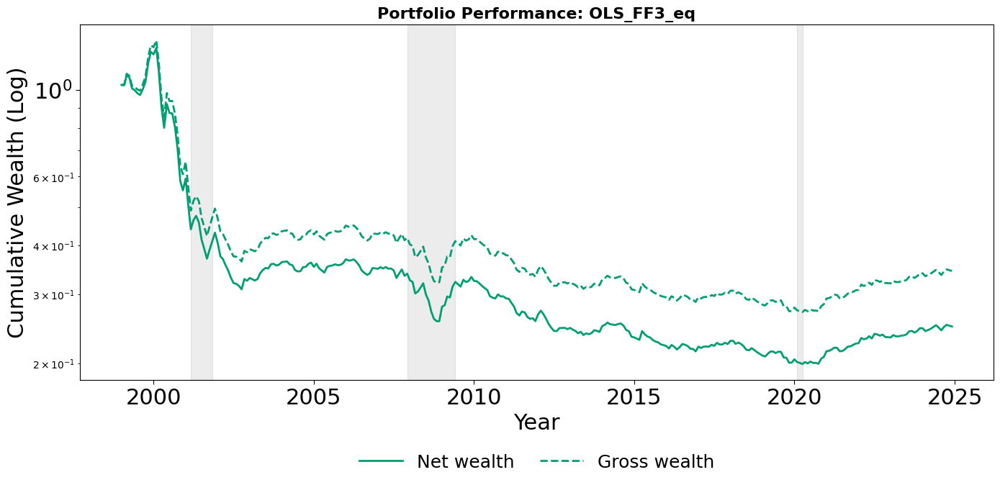

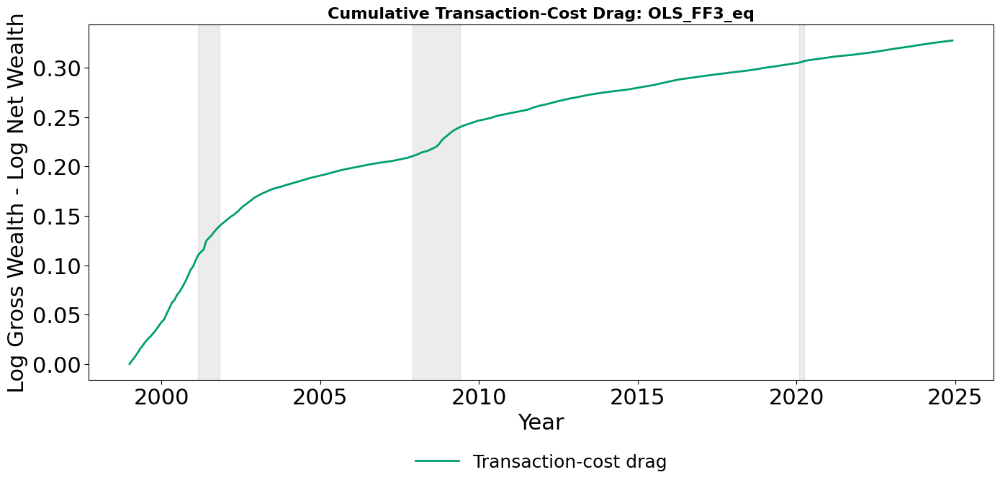

Displayed portfolio performance graphs for: OLS_FF3_eq


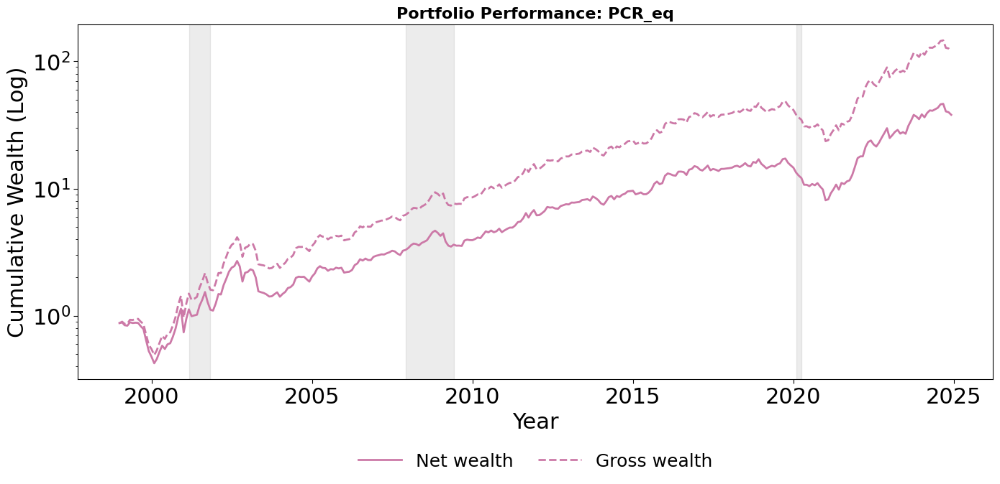

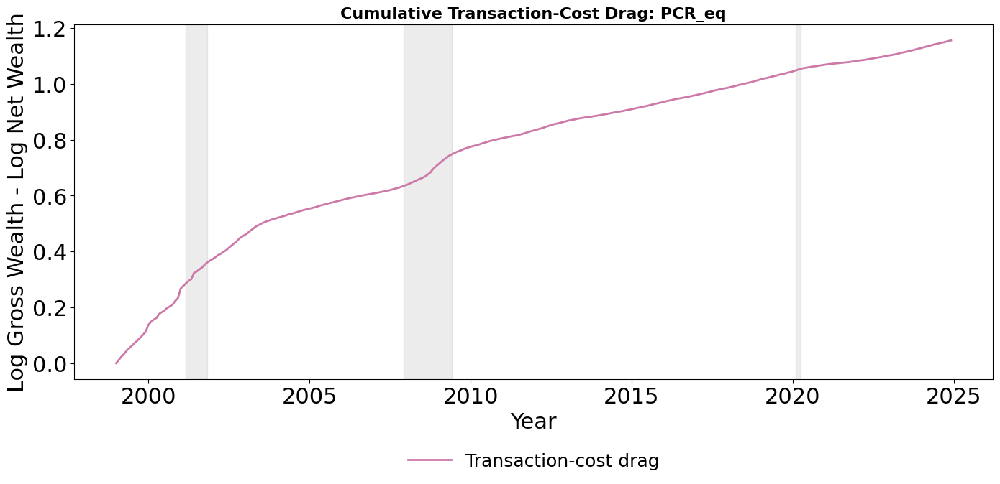

Displayed portfolio performance graphs for: PCR_eq


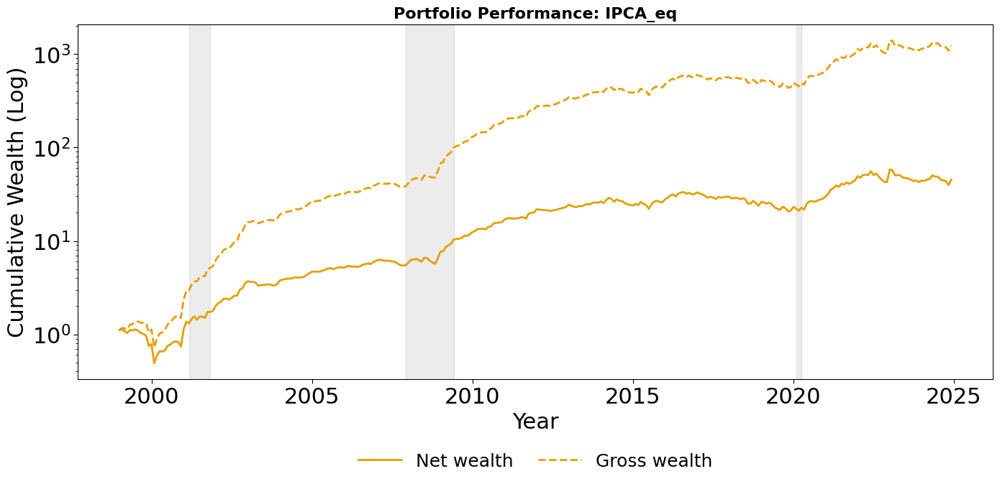

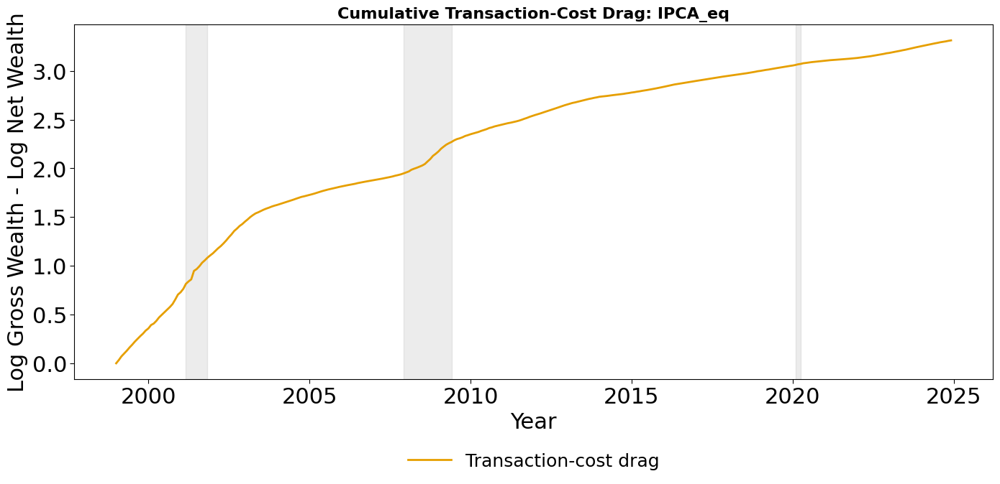

Displayed portfolio performance graphs for: IPCA_eq


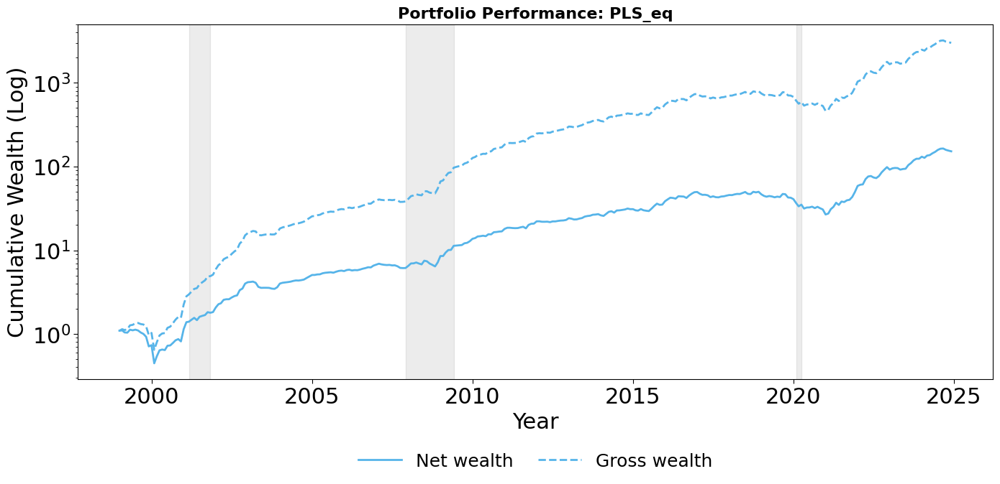

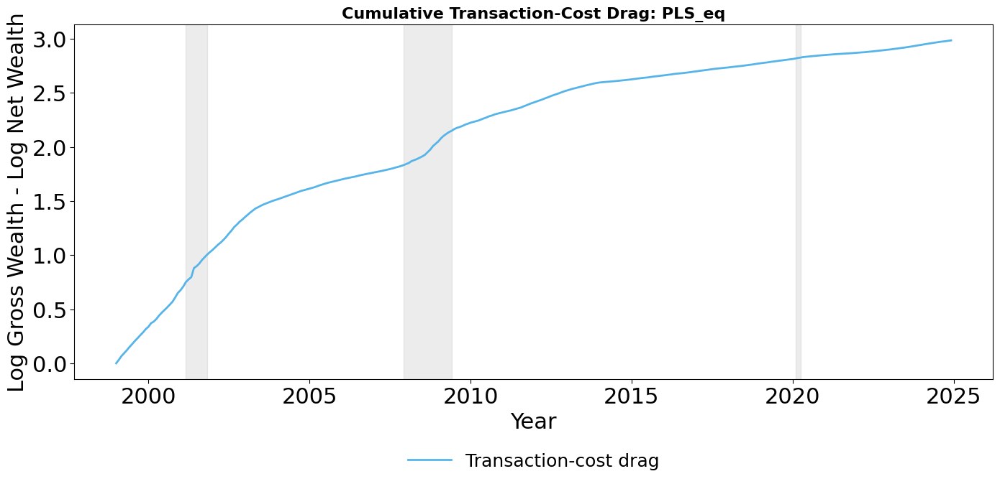

Displayed portfolio performance graphs for: PLS_eq


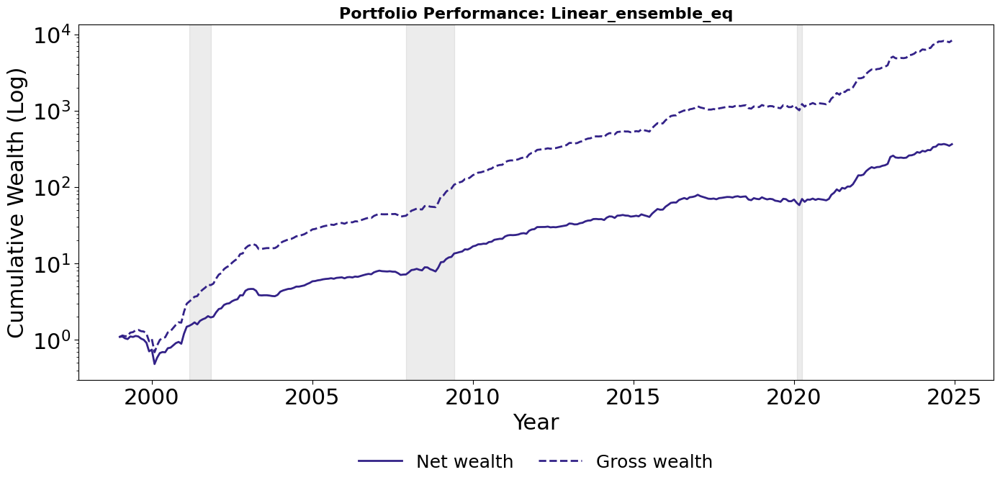

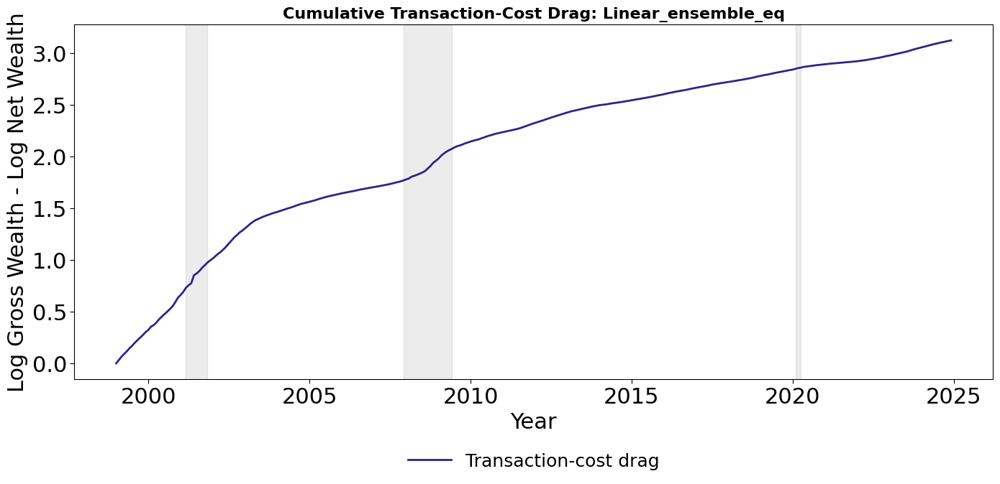

Displayed portfolio performance graphs for: Linear_ensemble_eq


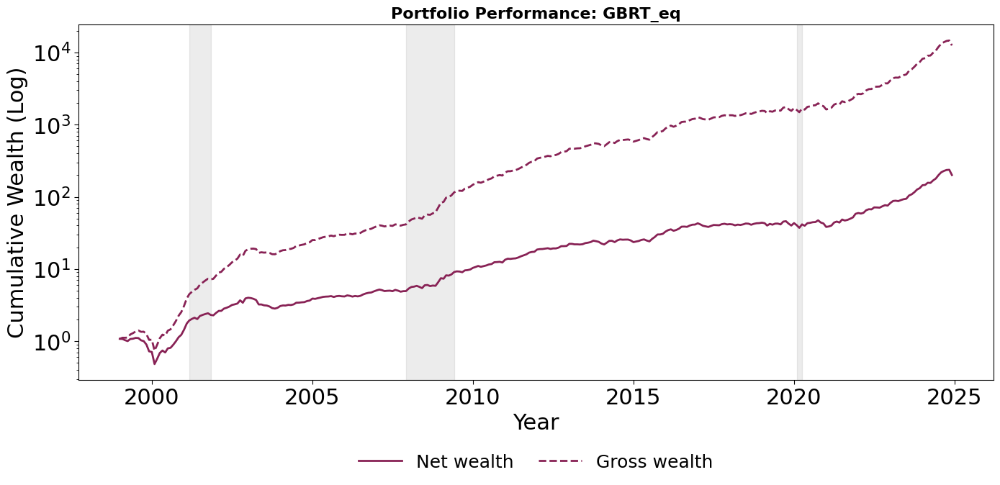

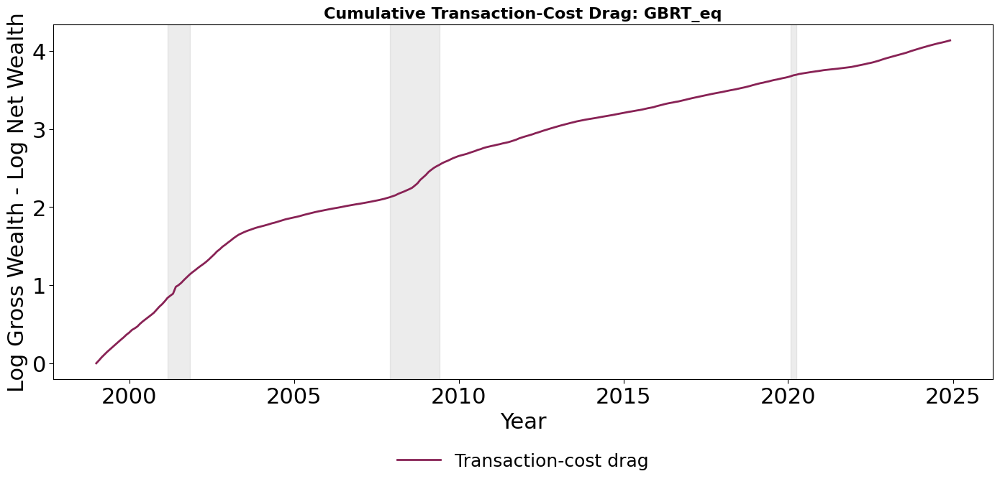

Displayed portfolio performance graphs for: GBRT_eq


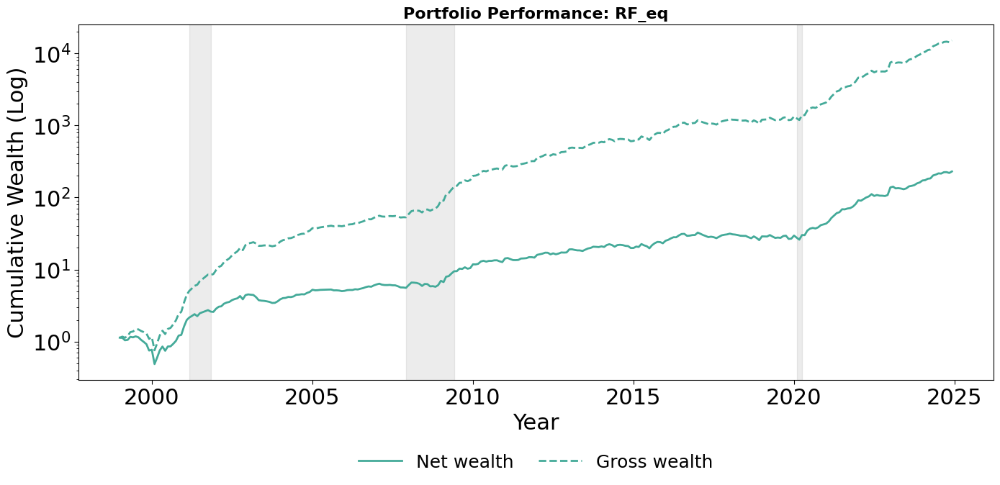

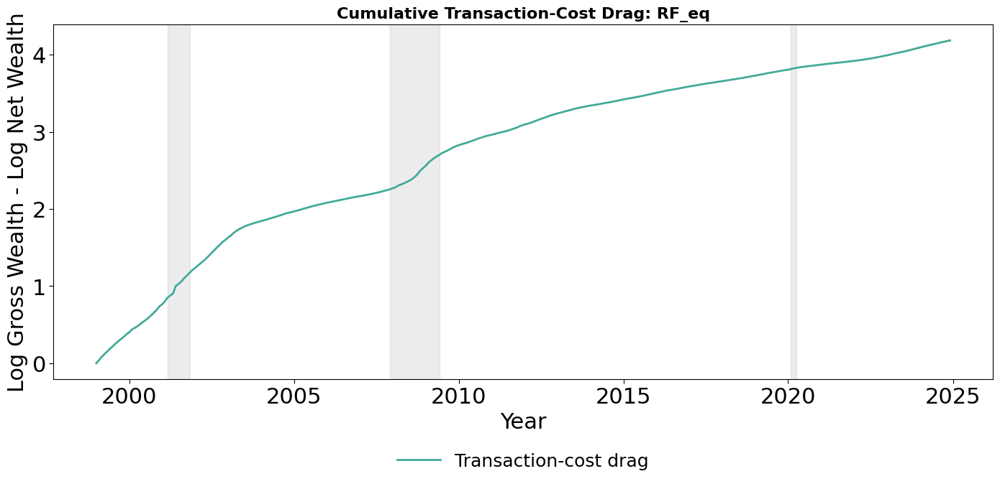

Displayed portfolio performance graphs for: RF_eq


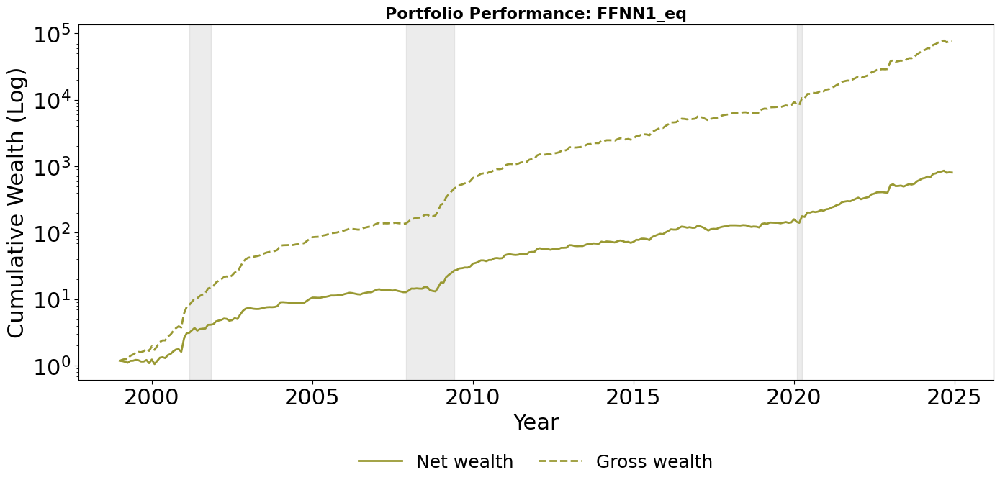

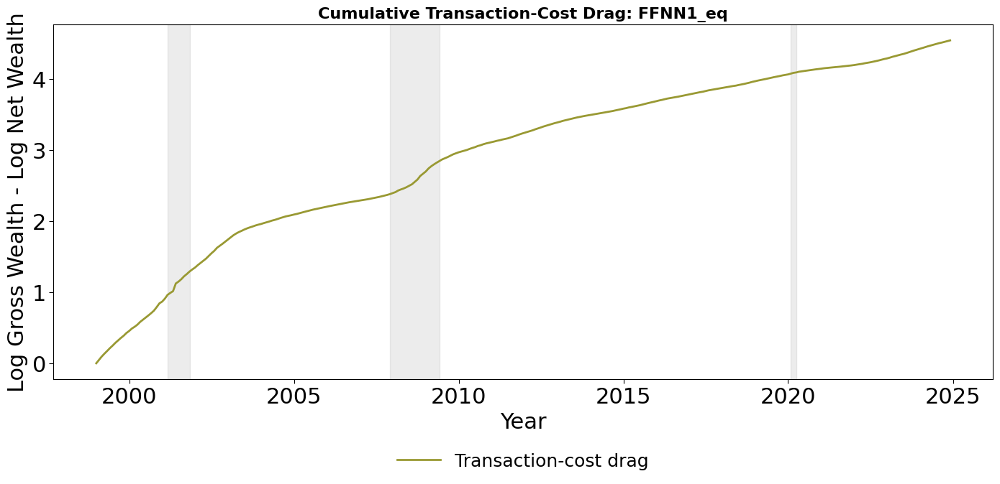

Displayed portfolio performance graphs for: FFNN1_eq


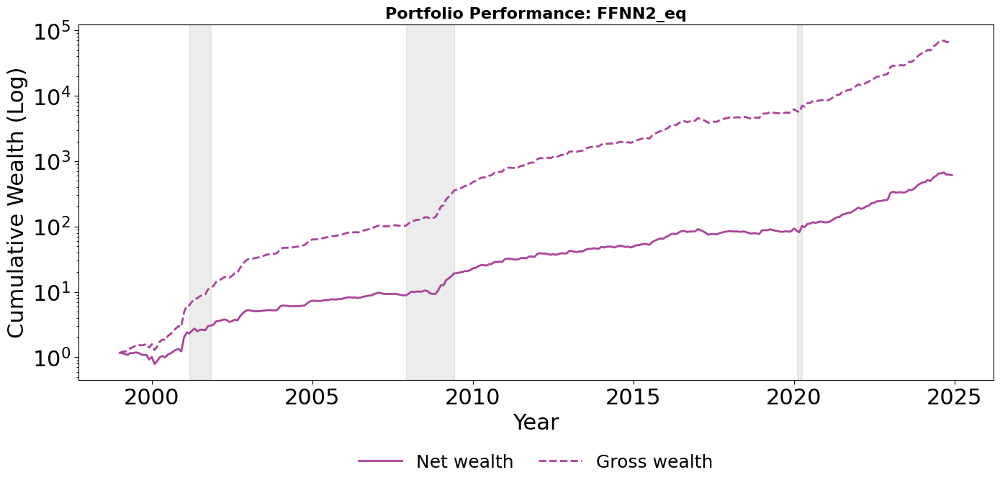

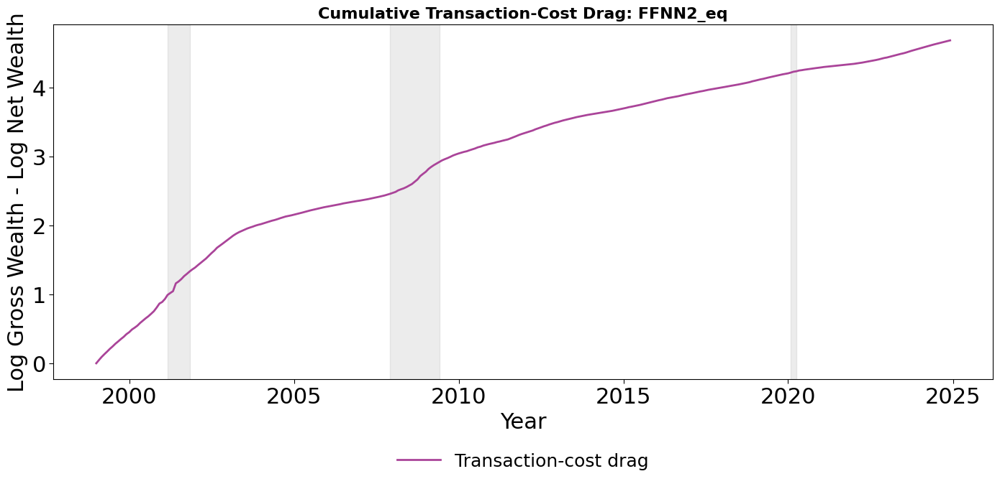

Displayed portfolio performance graphs for: FFNN2_eq


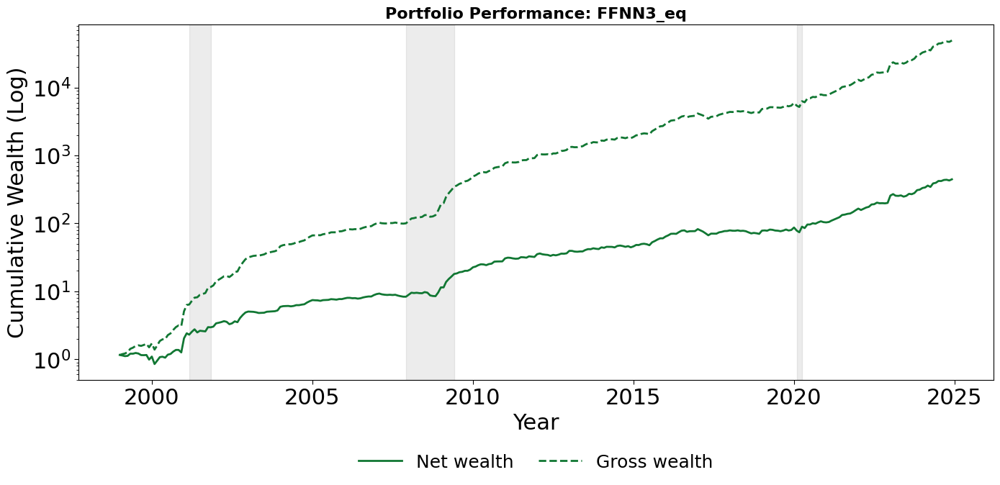

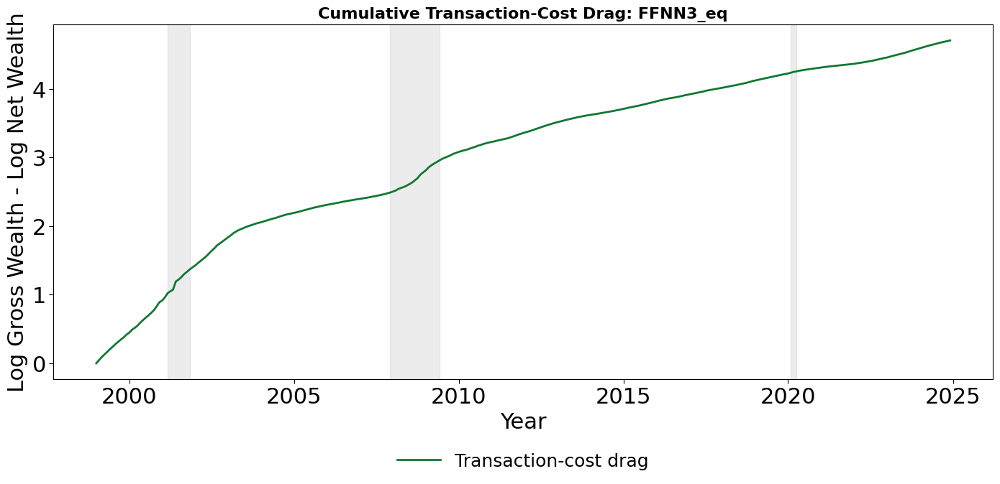

Displayed portfolio performance graphs for: FFNN3_eq


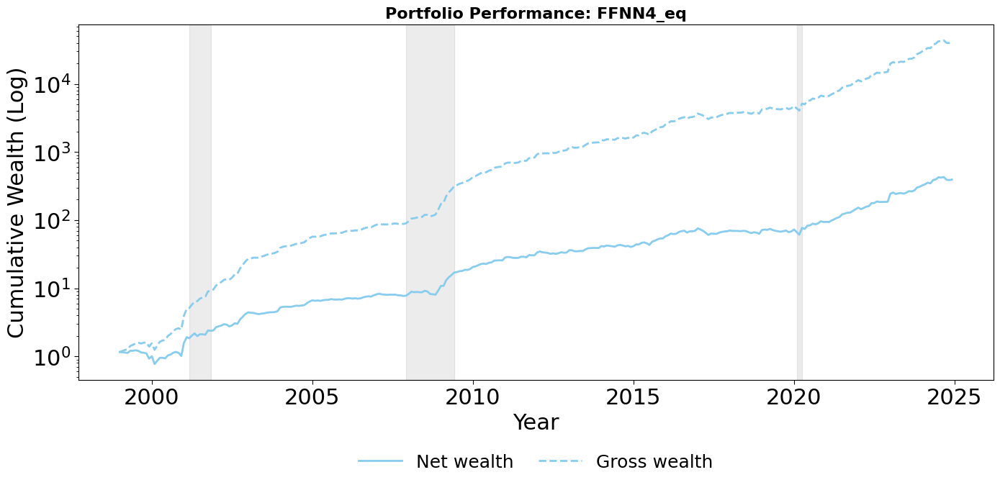

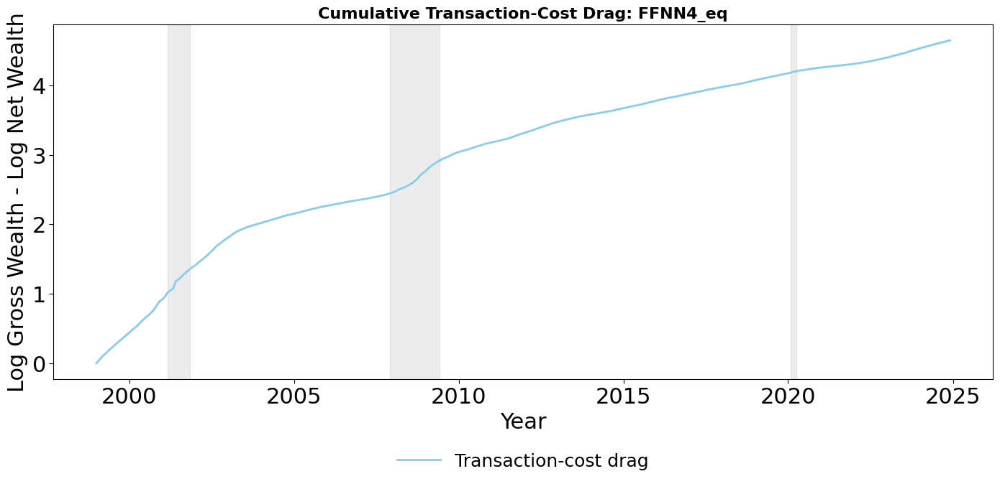

Displayed portfolio performance graphs for: FFNN4_eq


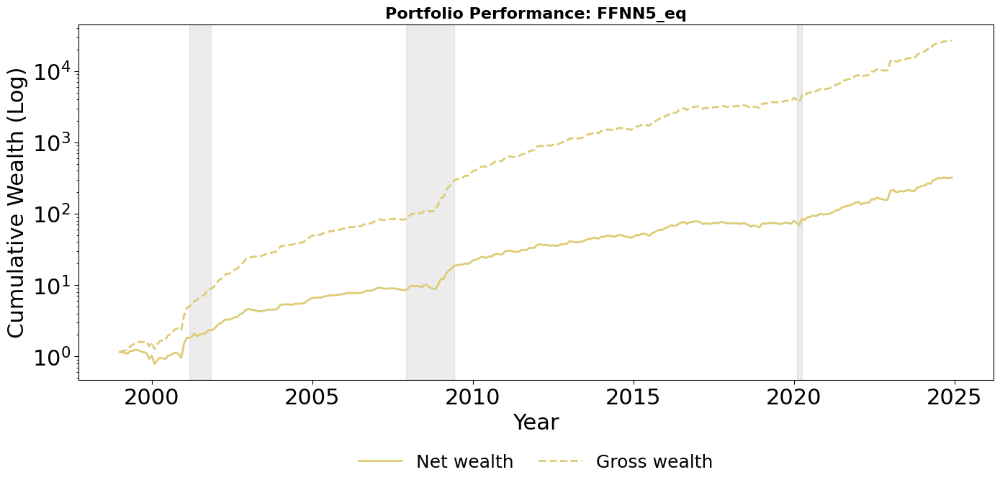

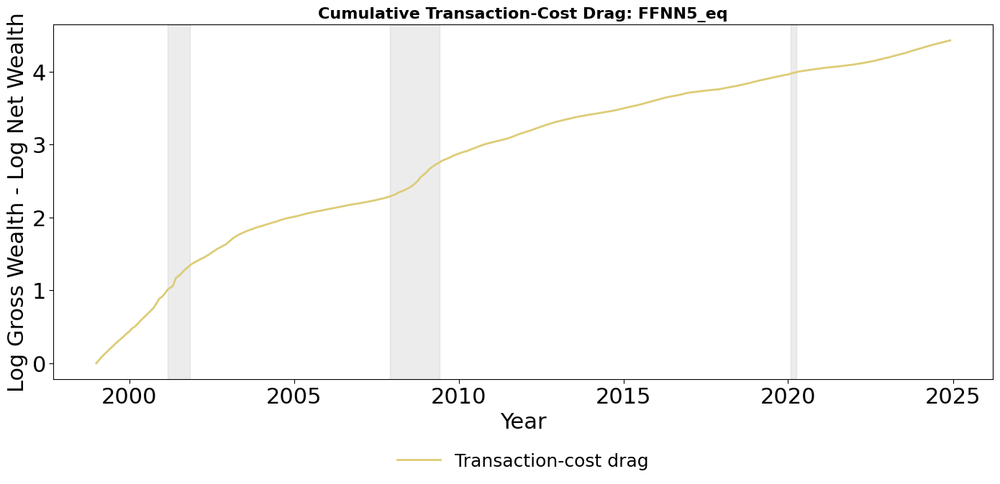

Displayed portfolio performance graphs for: FFNN5_eq


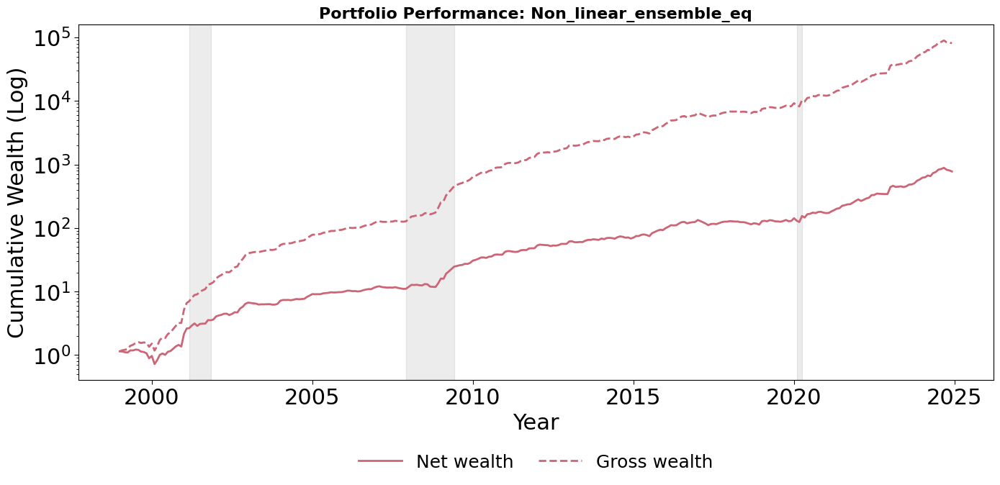

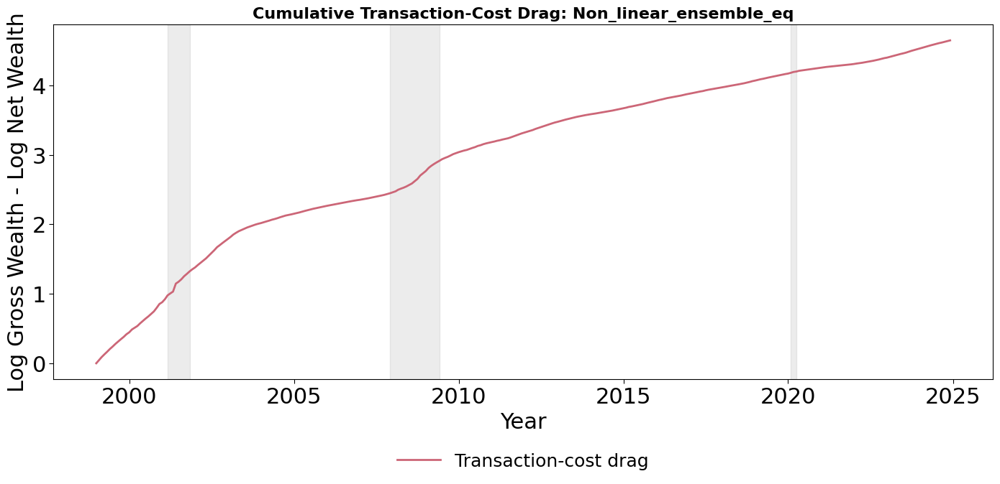

Displayed portfolio performance graphs for: Non_linear_ensemble_eq


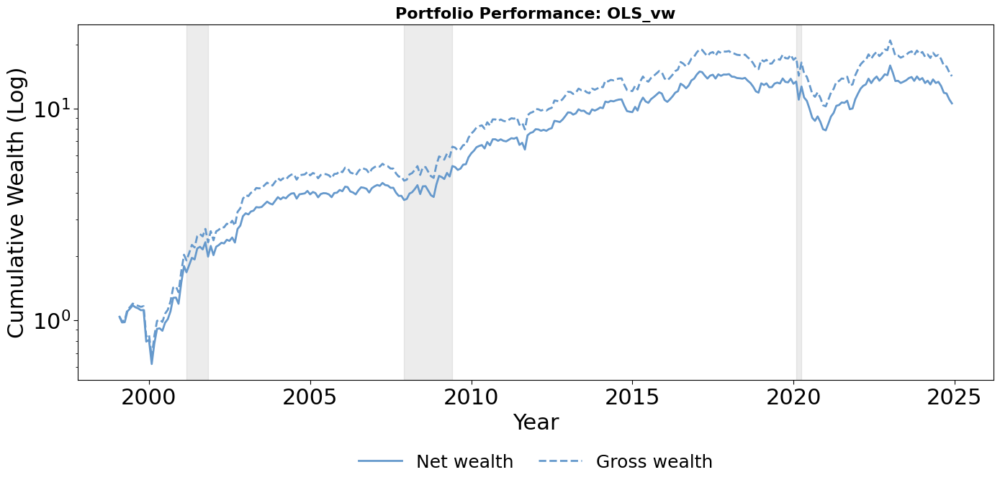

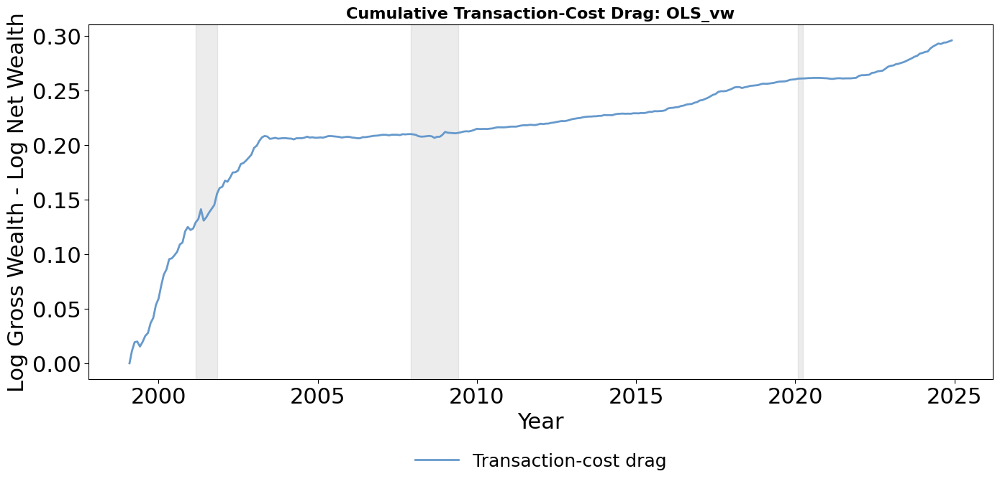

Displayed portfolio performance graphs for: OLS_vw


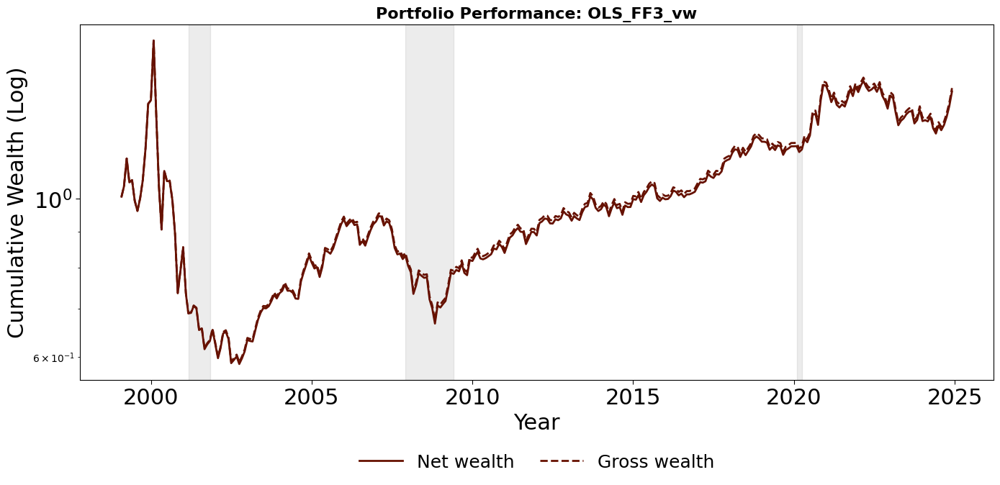

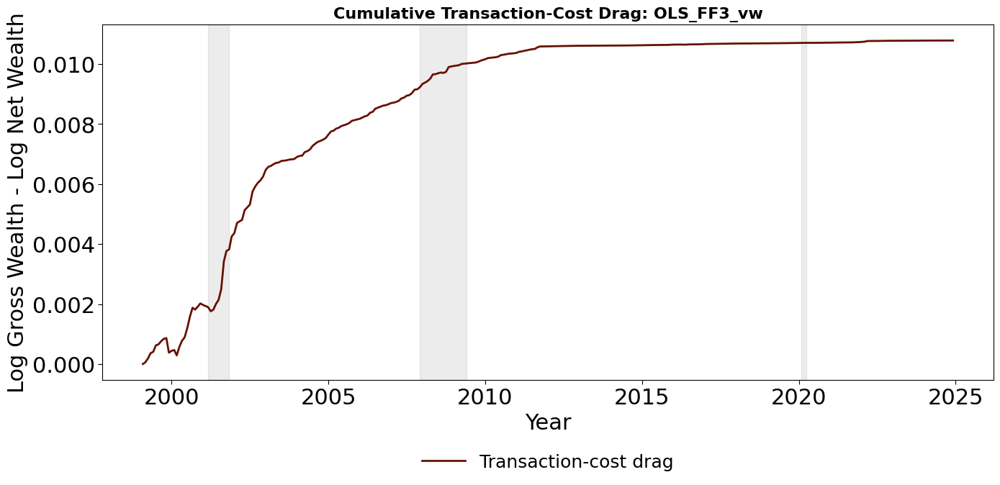

Displayed portfolio performance graphs for: OLS_FF3_vw


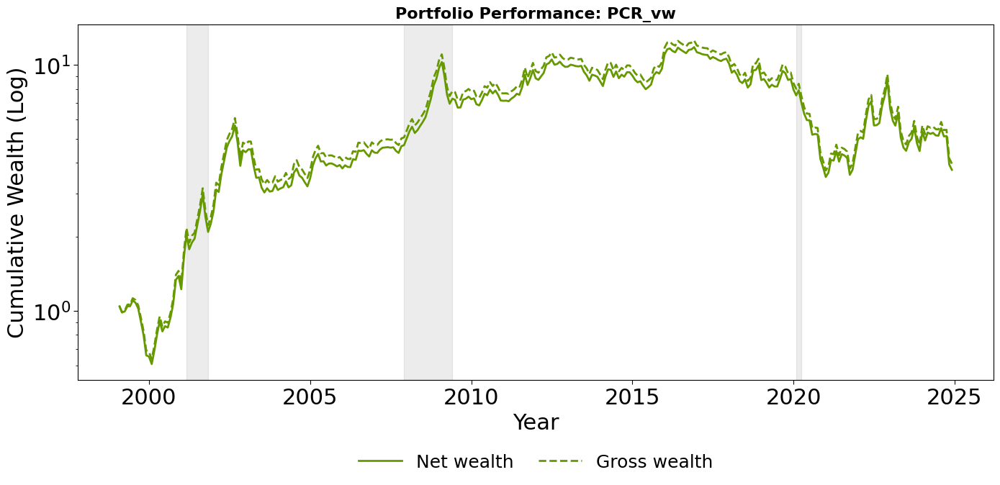

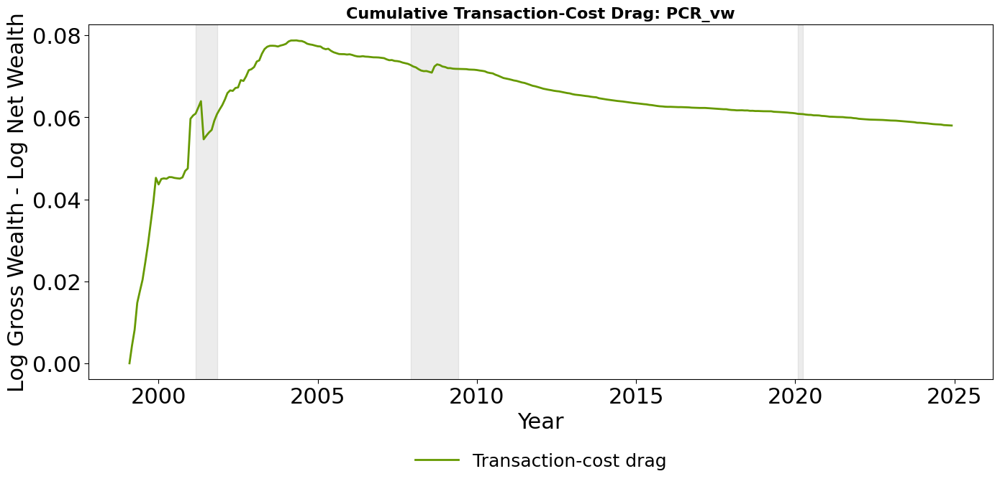

Displayed portfolio performance graphs for: PCR_vw


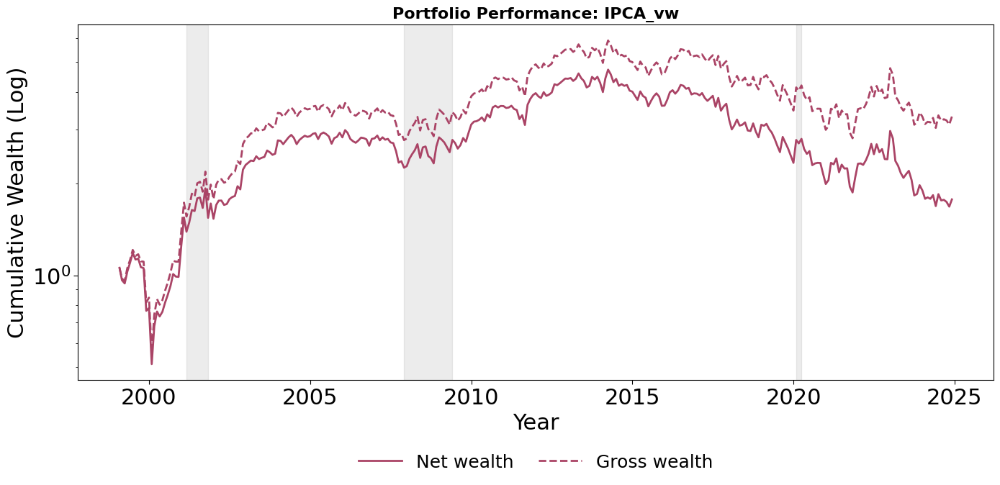

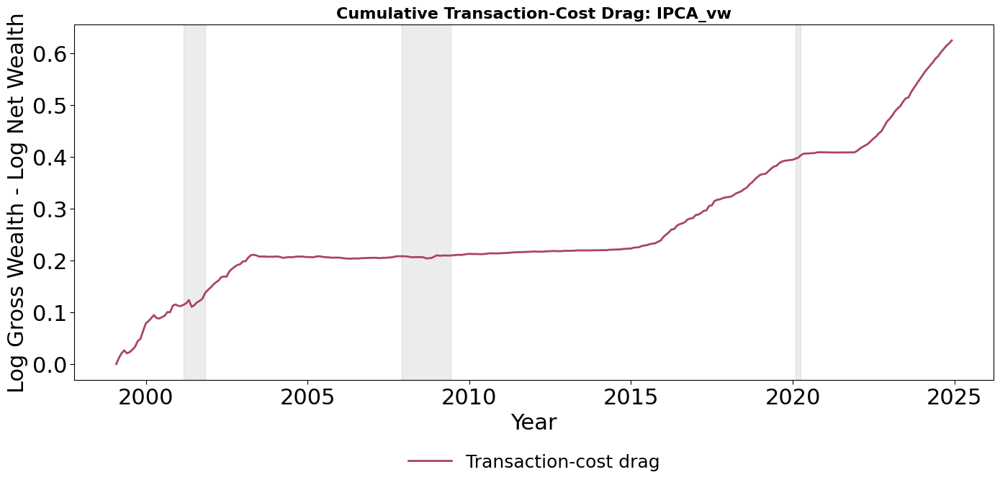

Displayed portfolio performance graphs for: IPCA_vw


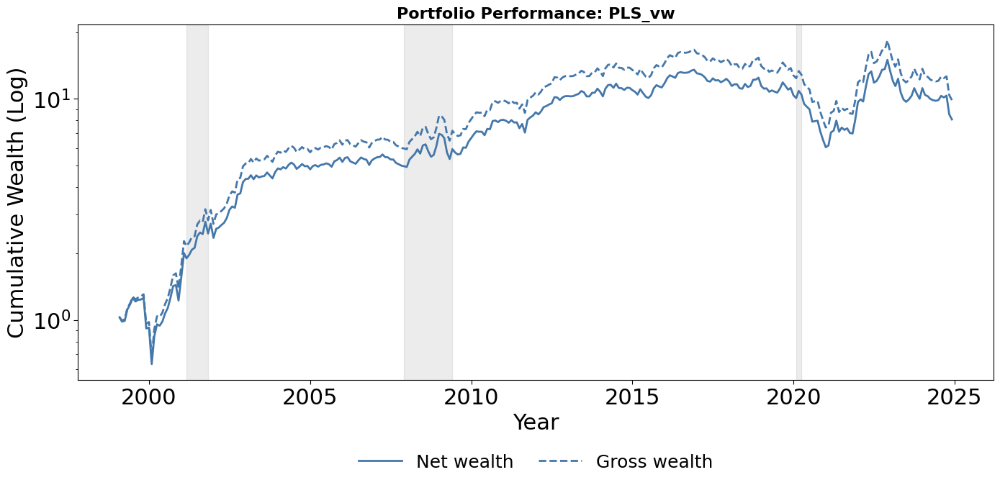

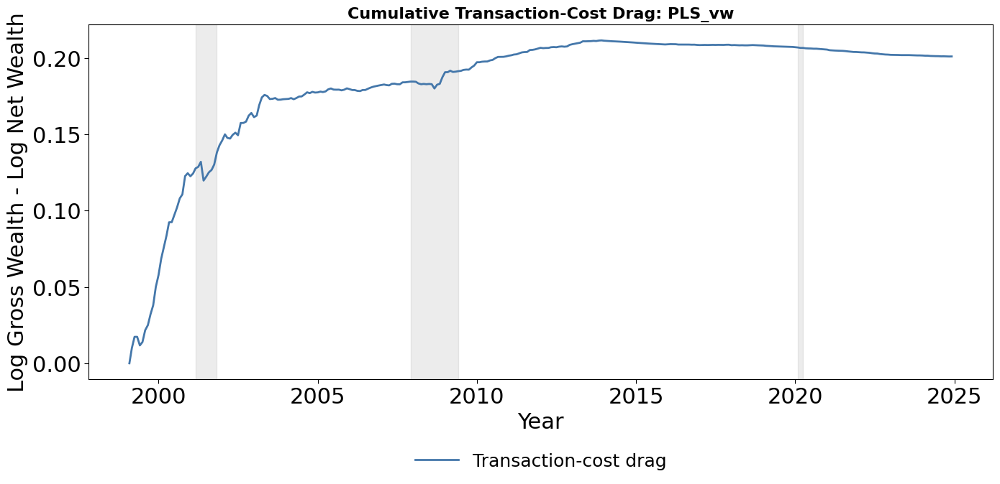

Displayed portfolio performance graphs for: PLS_vw


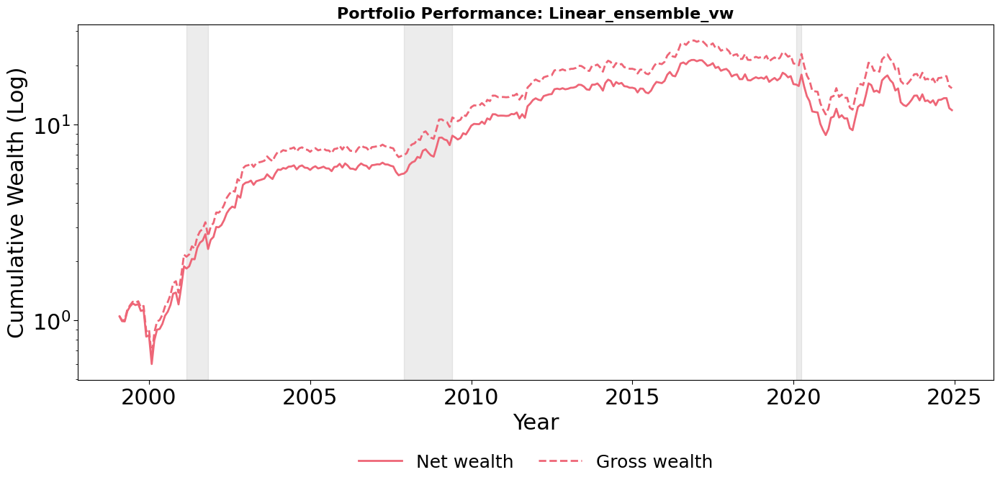

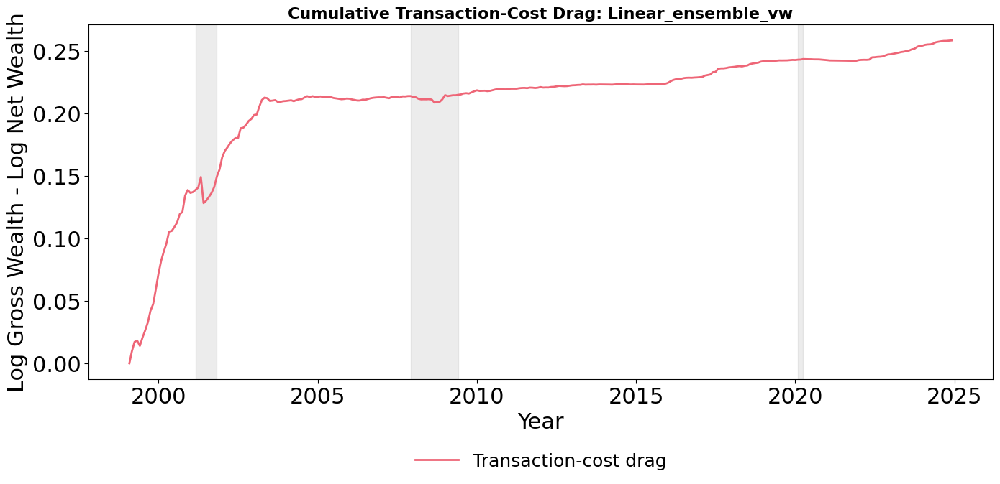

Displayed portfolio performance graphs for: Linear_ensemble_vw


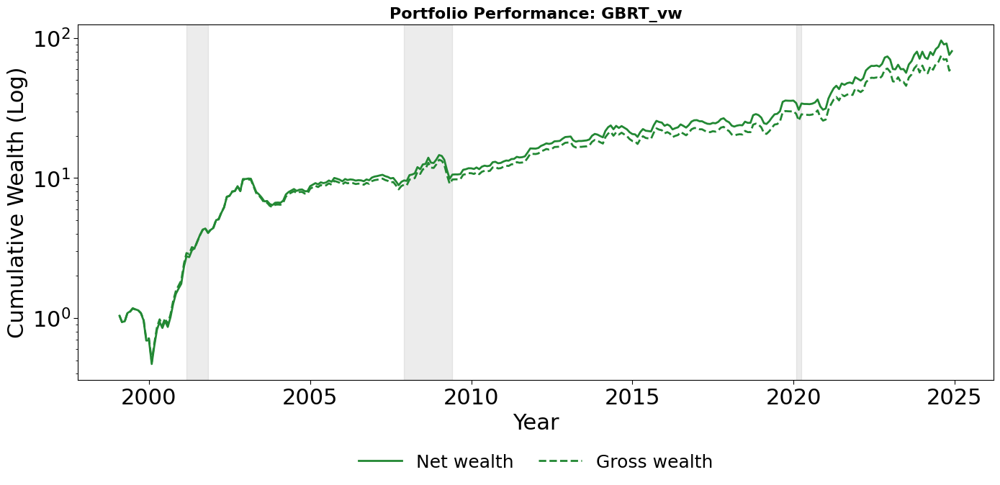

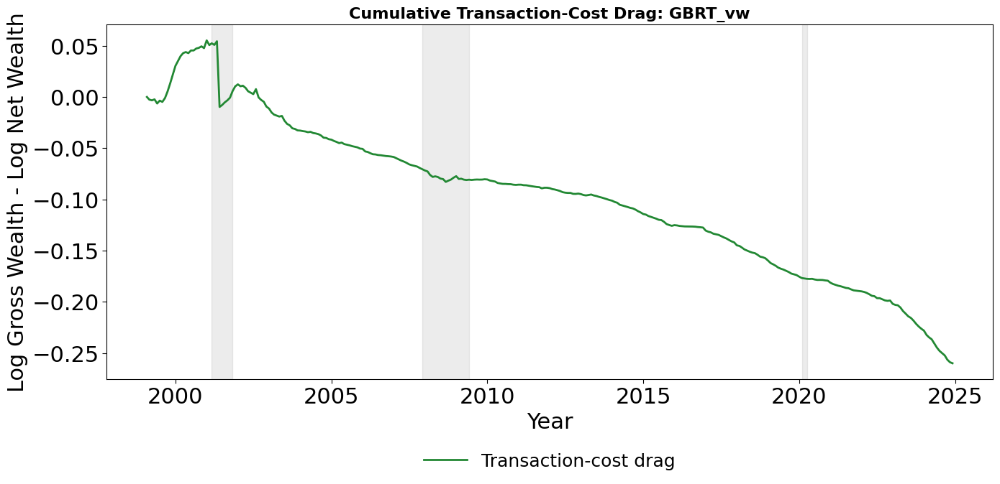

Displayed portfolio performance graphs for: GBRT_vw


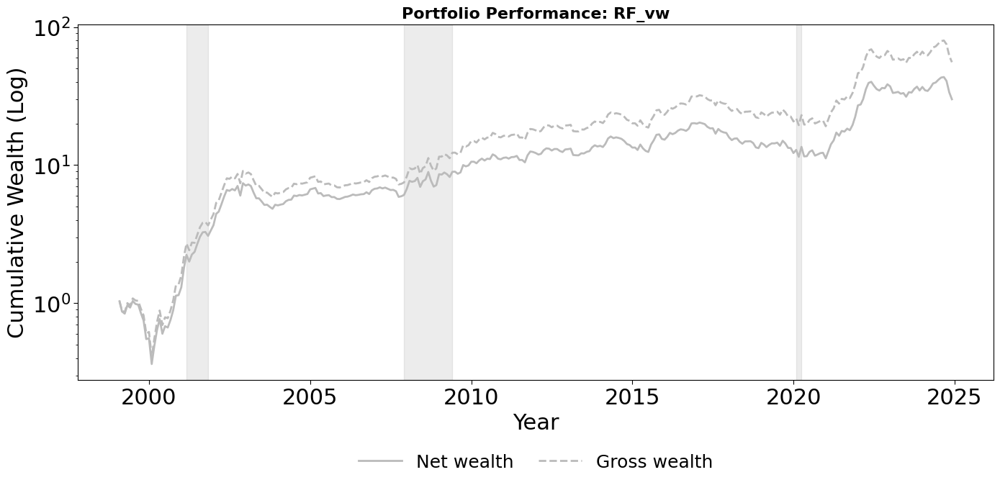

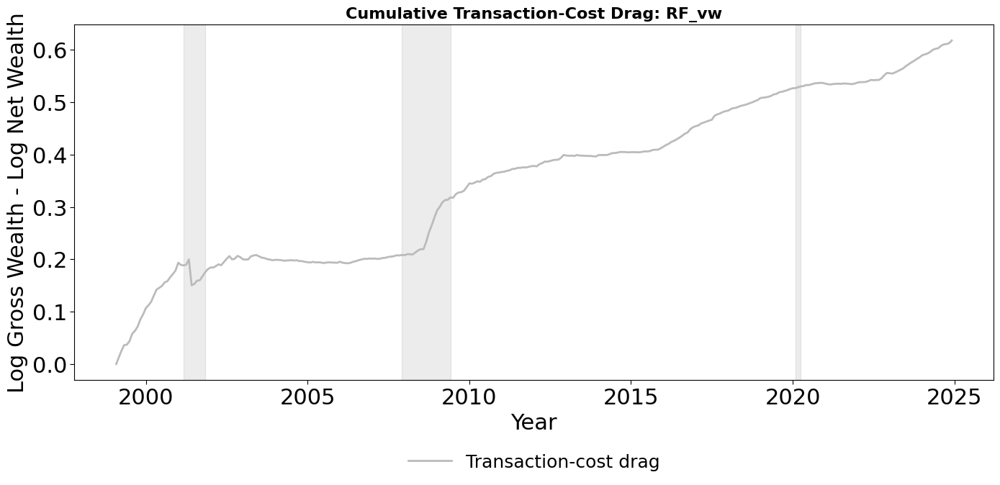

Displayed portfolio performance graphs for: RF_vw


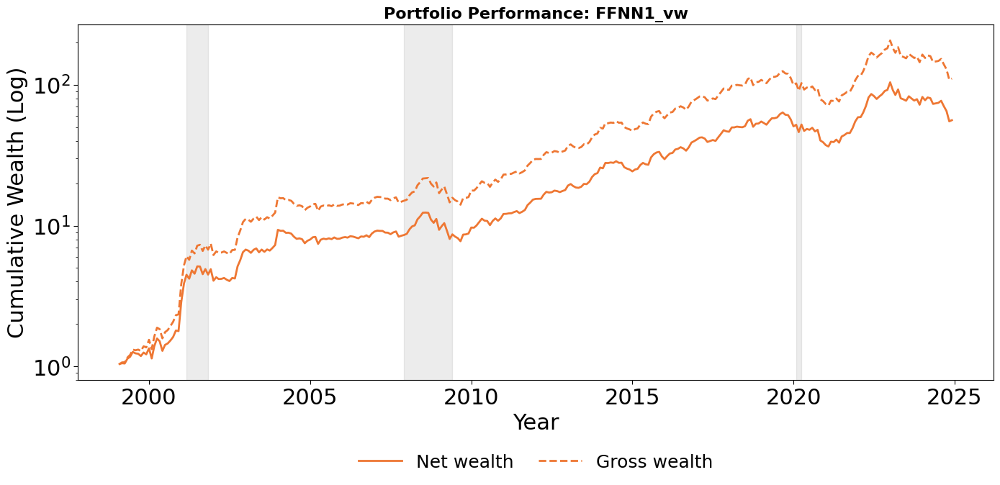

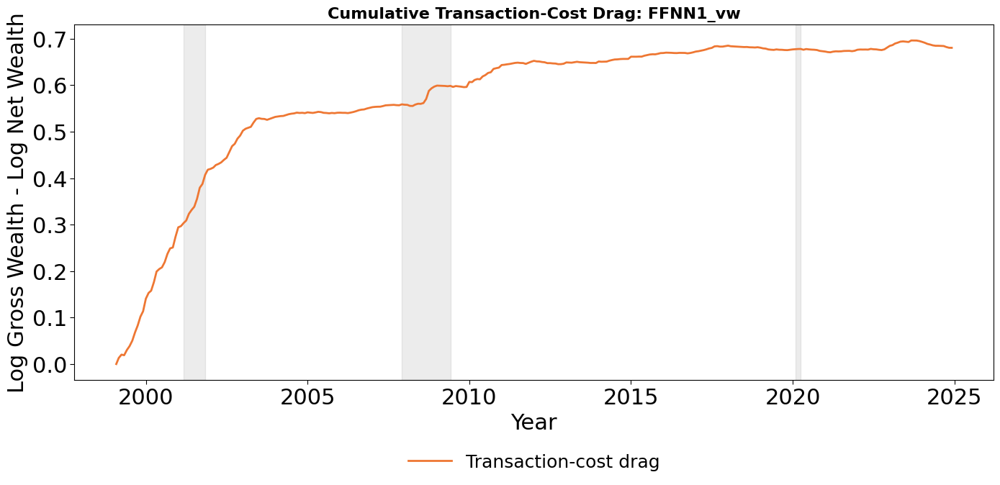

Displayed portfolio performance graphs for: FFNN1_vw


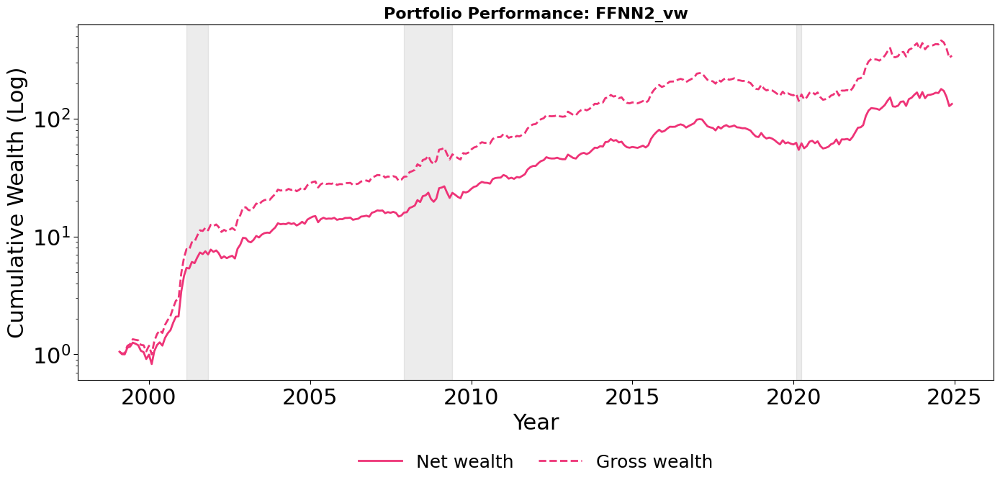

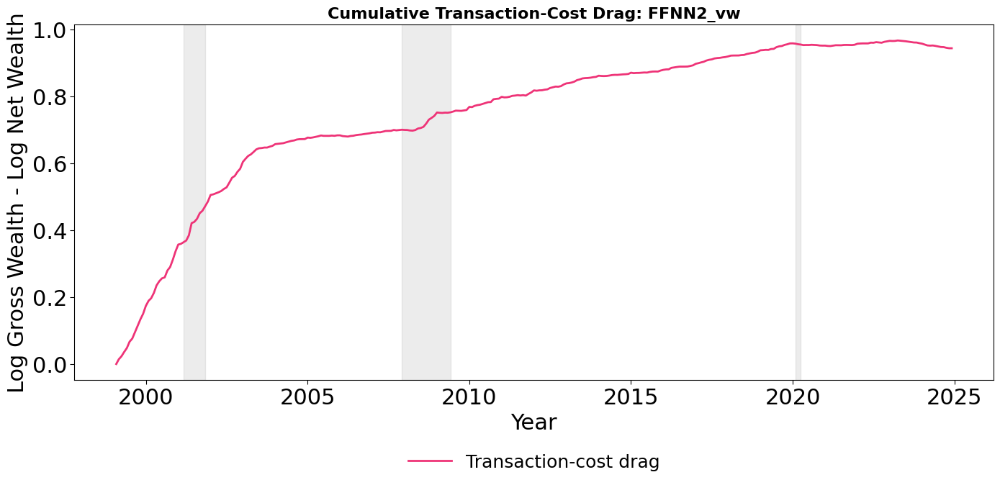

Displayed portfolio performance graphs for: FFNN2_vw


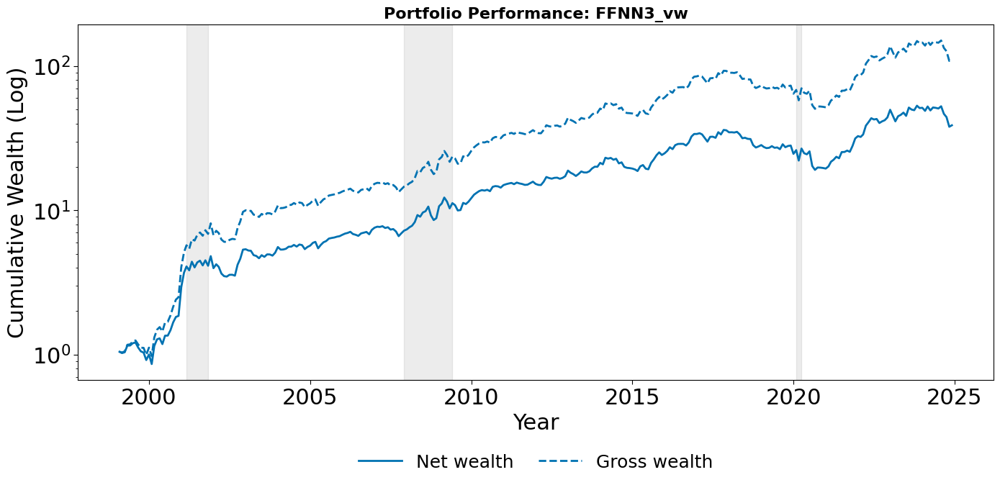

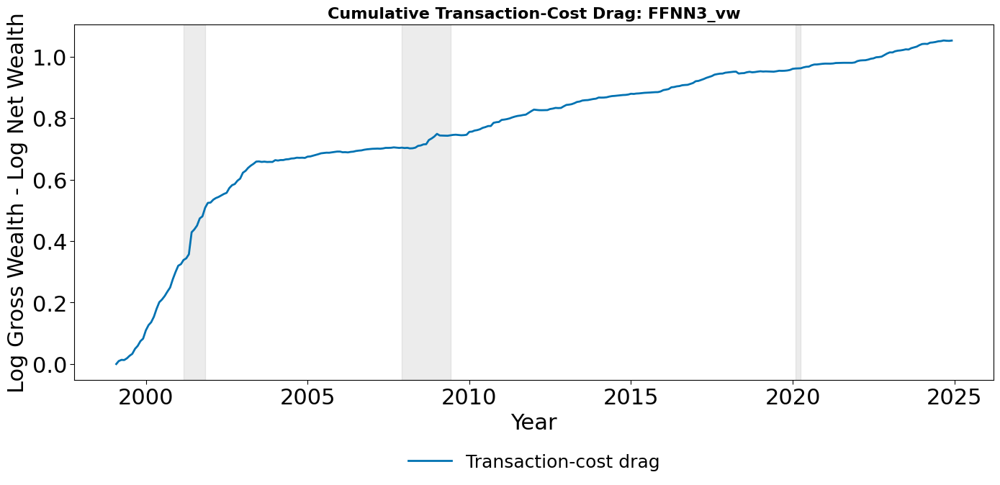

Displayed portfolio performance graphs for: FFNN3_vw


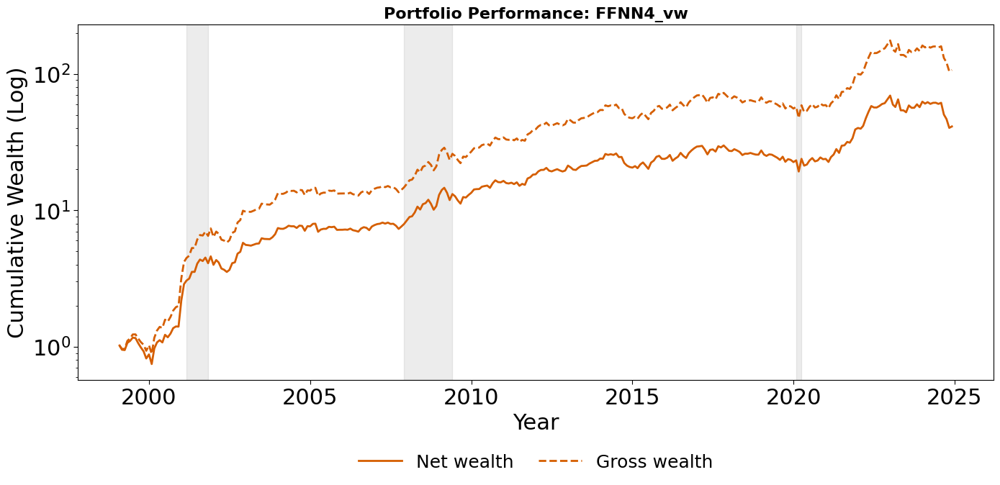

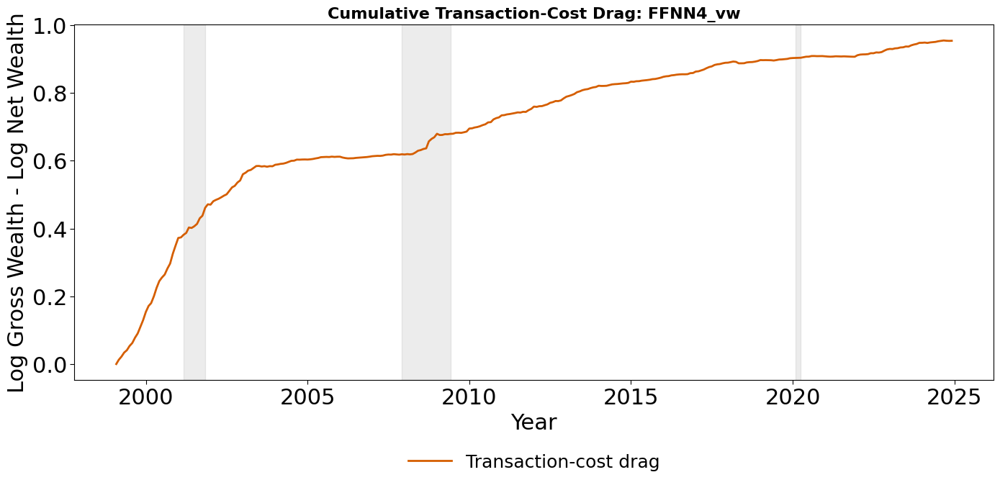

Displayed portfolio performance graphs for: FFNN4_vw


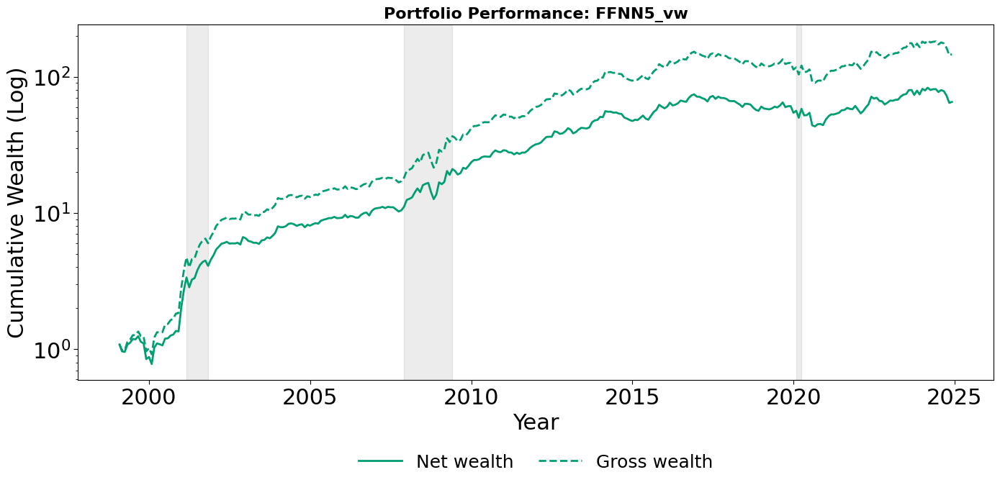

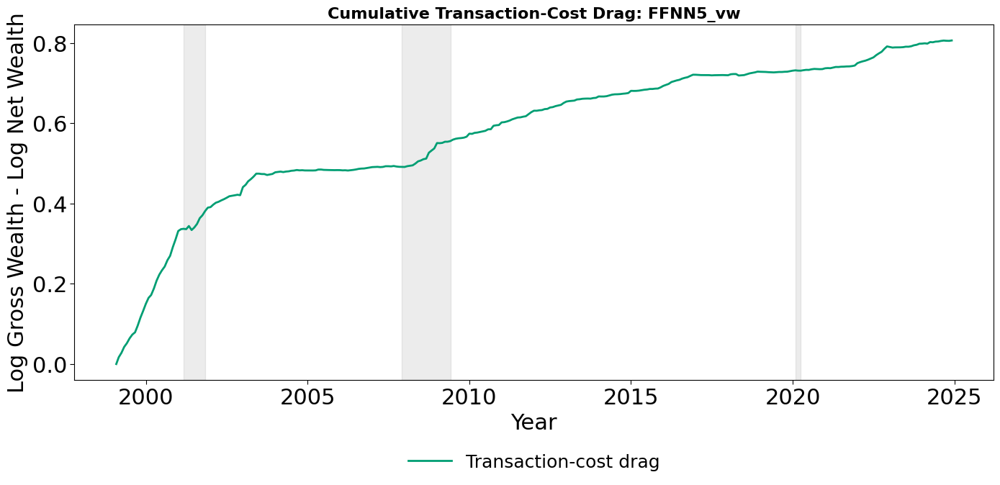

Displayed portfolio performance graphs for: FFNN5_vw


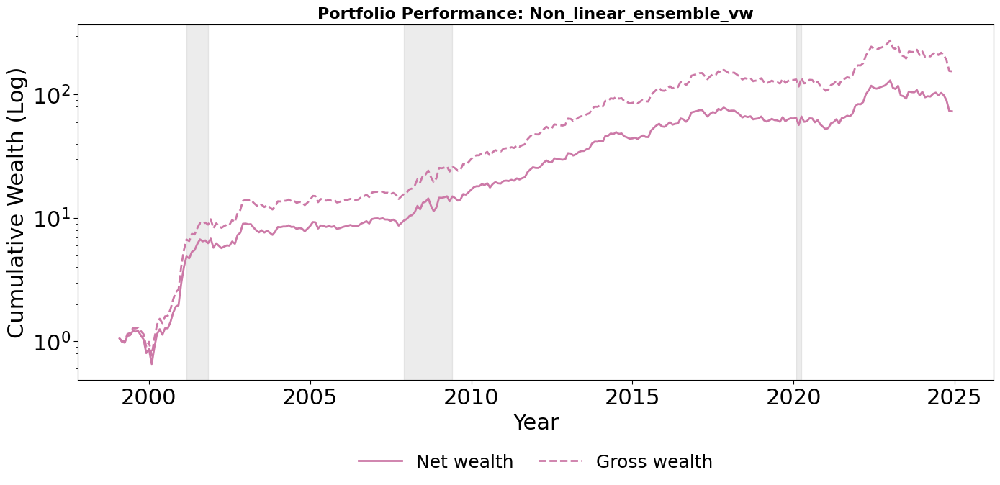

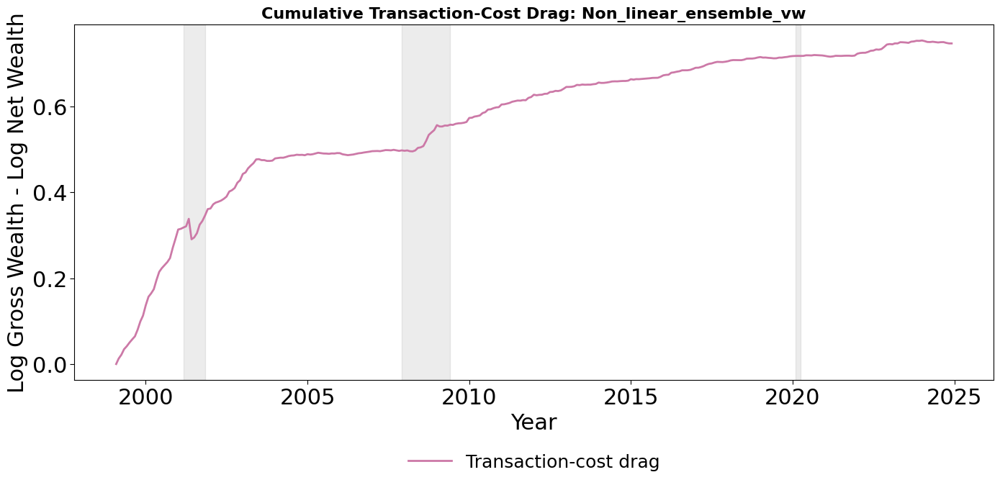

Displayed portfolio performance graphs for: Non_linear_ensemble_vw


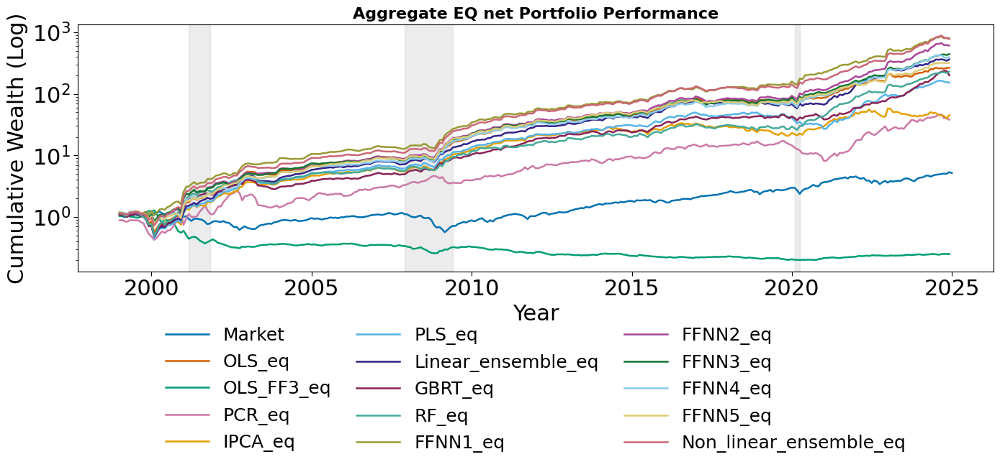

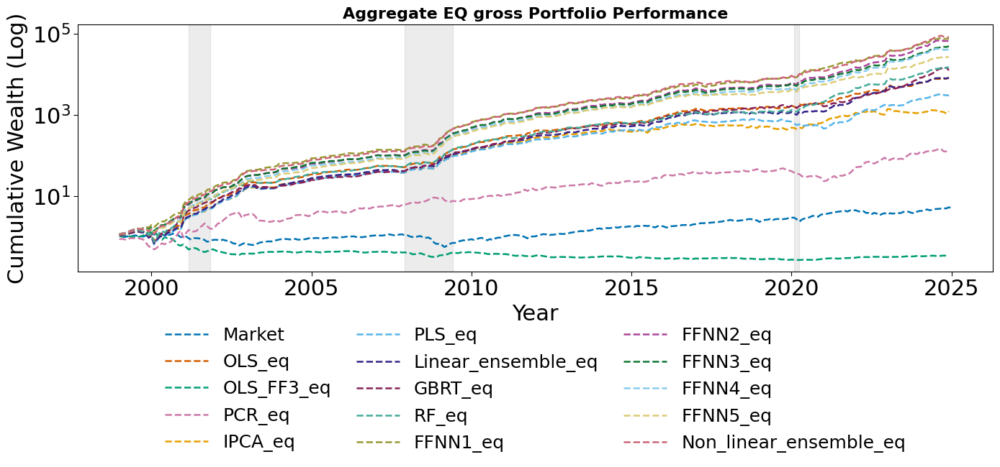

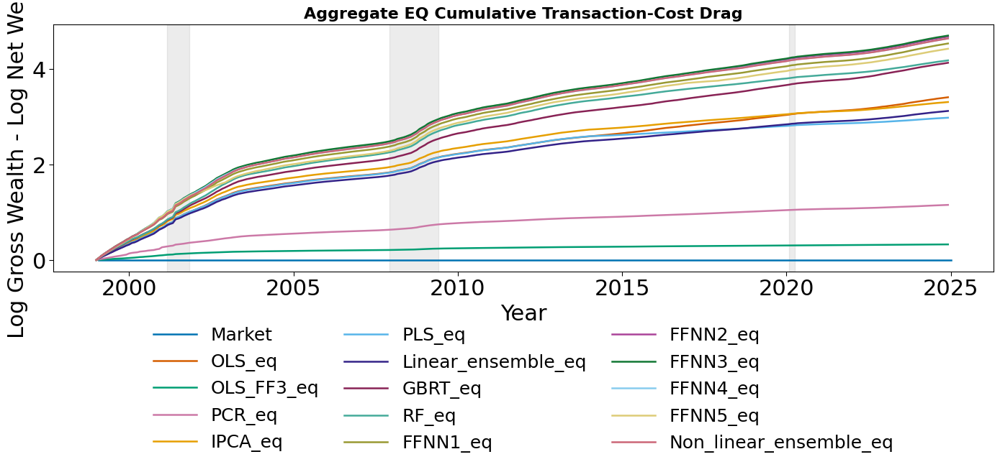

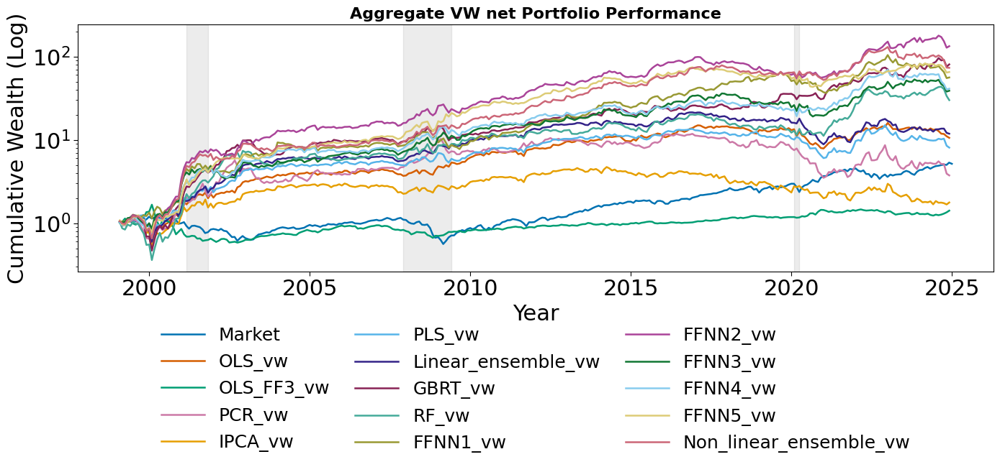

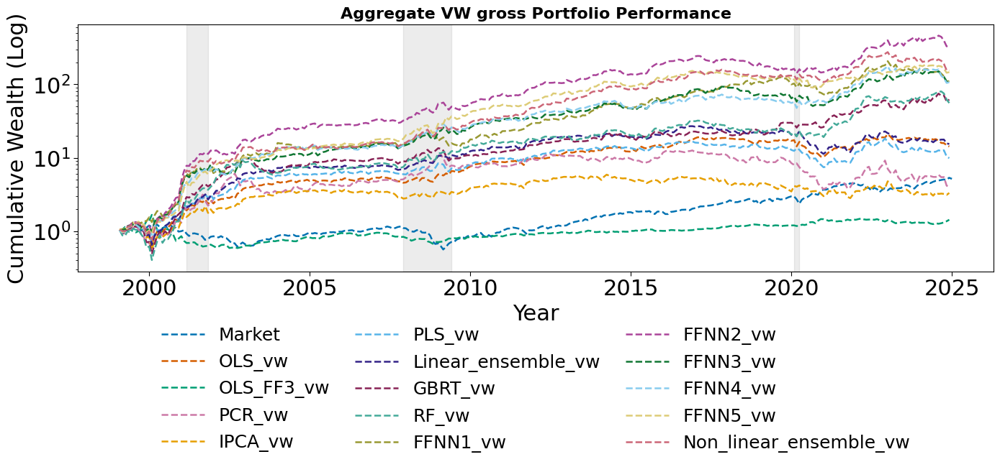

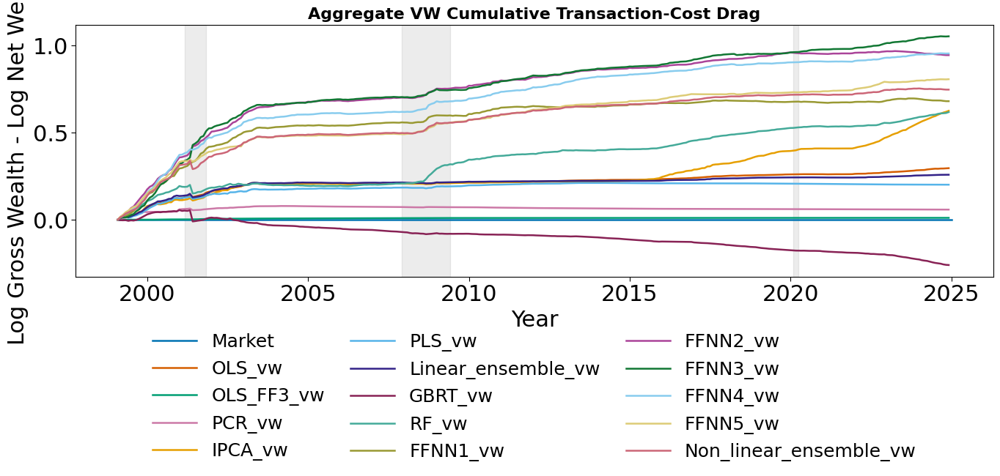

In [ ]:
display_portfolio_performance_graphs(
    portfolio_files={
        # Equal weight
        "Market" : "Portfolios/market_excess_returns.parquet",
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight.parquet",
        "Linear_ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight.parquet",
        "Non_linear_ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight.parquet",

        # Value weight
        "Market" : "Portfolios/market_excess_returns.parquet",
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight.parquet",
        "Linear_ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight.parquet",
        "Non_linear_ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight.parquet"})

Winsorizing

In [ ]:
display_portfolio_performance_graphs(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_winsorized.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_winsorized.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_winsorized.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_winsorized.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_winsorized.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_winsorized.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_winsorized.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_winsorized.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_winsorized.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_winsorized.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_winsorized.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_winsorized.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_winsorized.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_winsorized.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_winsorized.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_winsorized.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_winsorized.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_winsorized.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_winsorized.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_winsorized.parquet"})

Alternative data

In [ ]:
display_portfolio_performance_graphs(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_alternative_data.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_data.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_alternative_data.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_alternative_data.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_alternative_data.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_data.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_alternative_data.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_data.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_data.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_data.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_alternative_data.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_data.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_alternative_data.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_alternative_data.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_alternative_data.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_data.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_alternative_data.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_alternative_data.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_alternative_data.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_data.parquet"})

Top universe

In [ ]:
display_portfolio_performance_graphs(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_top.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_top.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_top.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_top.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_top.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_top.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_top.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_top.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_top.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_top.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_top.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_top.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_top.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_top.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_top.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_top.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_top.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_top.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_top.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_top.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_top.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_top.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_top.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_top.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_top.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_top.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_top.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_top.parquet"})

Bottom universe

In [ ]:
display_portfolio_performance_graphs(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_bottom.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_bottom.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_bottom.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_bottom.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_bottom.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_bottom.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_bottom.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_bottom.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_bottom.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_bottom.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_bottom.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_bottom.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_bottom.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_bottom.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_bottom.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_bottom.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_bottom.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_bottom.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_bottom.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_bottom.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_bottom.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_bottom.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_bottom.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_bottom.parquet"})

Alternative industries

In [ ]:
display_portfolio_performance_graphs(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_alternative_industries.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_industries.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_alternative_industries.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_alternative_industries.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_alternative_industries.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_industries.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_alternative_industries.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_industries.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_industries.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_industries.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_alternative_industries.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_industries.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_alternative_industries.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_alternative_industries.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_alternative_industries.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_industries.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_alternative_industries.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_alternative_industries.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_alternative_industries.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_industries.parquet"})

Alternative sample split

In [ ]:
display_portfolio_performance_graphs(
    portfolio_files={
        # Equal weight
        "OLS_eq": "Portfolios/OLS_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "OLS_FF3_eq": "Portfolios/OLS_FF3_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "PCR_eq": "Portfolios/PCR_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "IPCA_eq": "Portfolios/IPCA_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "PLS_eq": "Portfolios/PLS_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "Linear_Ensemble_eq": "Portfolios/Linear_ensemble_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "GBRT_eq": "Portfolios/GBRT_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "RF_eq": "Portfolios/RF_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN1_eq": "Portfolios/FFNN1_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN2_eq": "Portfolios/FFNN2_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN3_eq": "Portfolios/FFNN3_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN4_eq": "Portfolios/FFNN4_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "FFNN5_eq": "Portfolios/FFNN5_decile_portfolios_equal_weight_alternative_sample_split.parquet",
        "NonLinear_Ensemble_eq": "Portfolios/Non_linear_ensemble_decile_portfolios_equal_weight_alternative_sample_split.parquet",

        # Value weight
        "OLS_vw": "Portfolios/OLS_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "OLS_FF3_vw": "Portfolios/OLS_FF3_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "PCR_vw": "Portfolios/PCR_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "IPCA_vw": "Portfolios/IPCA_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "PLS_vw": "Portfolios/PLS_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "Linear_Ensemble_vw": "Portfolios/Linear_ensemble_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "GBRT_vw": "Portfolios/GBRT_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "RF_vw": "Portfolios/RF_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN1_vw": "Portfolios/FFNN1_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN2_vw": "Portfolios/FFNN2_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN3_vw": "Portfolios/FFNN3_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN4_vw": "Portfolios/FFNN4_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "FFNN5_vw": "Portfolios/FFNN5_decile_portfolios_value_weight_alternative_sample_split.parquet",
        "NonLinear_Ensemble_vw": "Portfolios/Non_linear_ensemble_decile_portfolios_value_weight_alternative_sample_split.parquet"})

## Sample split scheme

Expanding-window

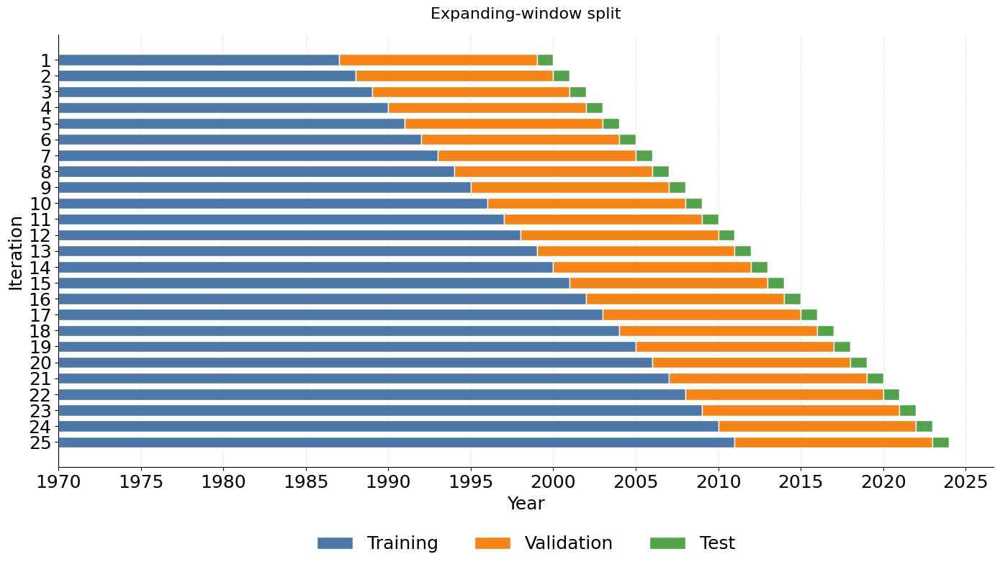

In [ ]:
fig, ax = display_expanding_sample_split_figure(
    sample_end="2023-12-31",
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    figsize=(14, 8))

Fixed-window

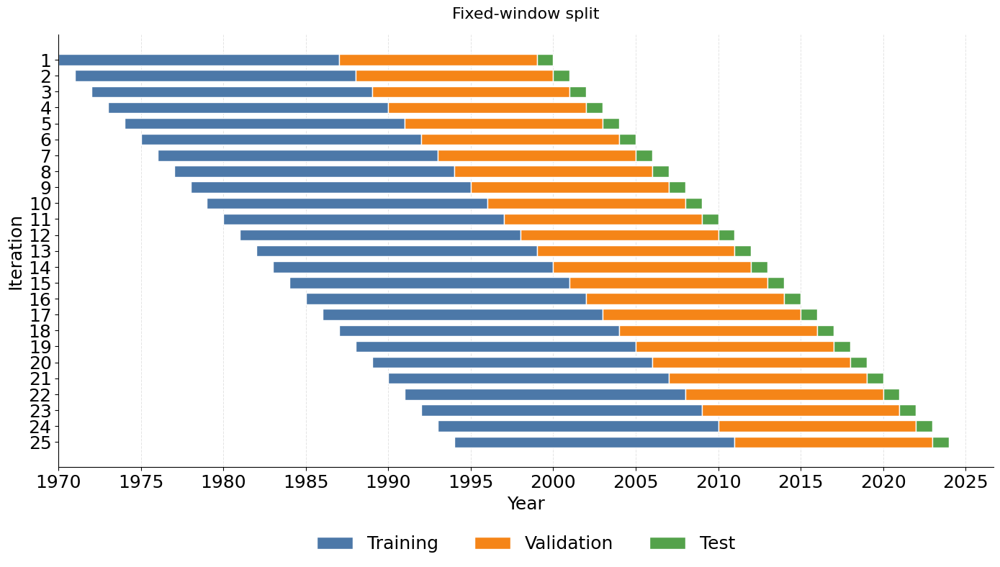

In [ ]:
fig, ax = display_fixed_window_sample_split_figure(
    sample_end="2023-12-31",
    start_train="1970-01-01",
    end_train="1986-12-31",
    val_years=12,
    figsize=(14, 8))